In [299]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
import time
import seaborn as sns 
%matplotlib inline

In [233]:
df_train = pd.read_csv("/data/train.csv")
df_test = pd.read_csv("/data/test.csv")
df_train.head()

,row_id,x,y,accuracy,time,place_id
0,0,0.7941,9.0809,54,470702,8523065625
1,1,5.9567,4.7968,13,186555,1757726713
2,2,8.3078,7.0407,74,322648,1137537235
3,3,7.3665,2.5165,65,704587,6567393236
4,4,4.0961,1.1307,31,472130,7440663949


### Sampling them for quicker visualisations

In [234]:
df_train_sample = df_train.sample(n=1000000)
df_test_sample = df_test.sample(n=1000000)

## Quick visualisations

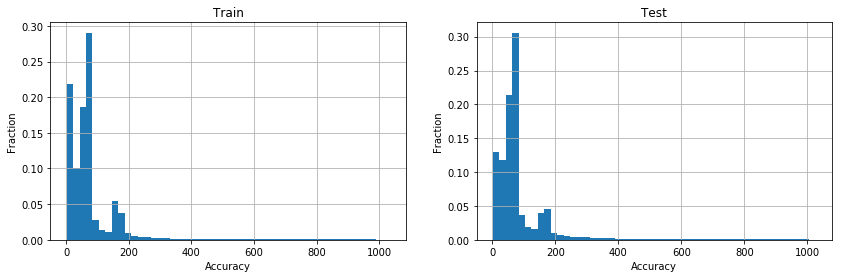

In [244]:
counts1, bins1 = np.histogram(df_train["accuracy"], bins=50)
binsc1 = bins1[:-1] + np.diff(bins1)/2.

counts2, bins2 = np.histogram(df_test["accuracy"], bins=50)
binsc2 = bins2[:-1] + np.diff(bins2)/2.

plt.figure(0, figsize=(14,4))

plt.subplot(121)
plt.bar(binsc1, counts1/(counts1.sum()*1.0), width=np.diff(bins1)[0])
plt.grid(True)
plt.xlabel("Accuracy")
plt.ylabel("Fraction")
plt.title("Train")

plt.subplot(122)
plt.bar(binsc2, counts2/(counts2.sum()*1.0), width=np.diff(bins2)[0])
plt.grid(True)
plt.xlabel("Accuracy")
plt.ylabel("Fraction")
plt.title("Test")

plt.show()

Accuracy has some interesting structure, but is relatively consistent across train/test.



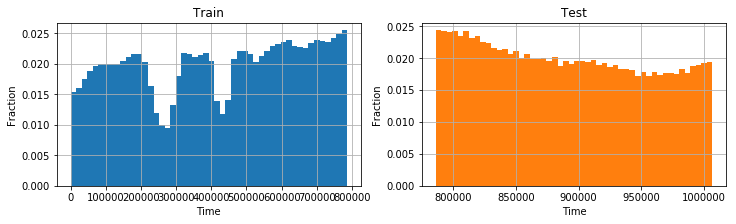

In [245]:
current_palette = sns.color_palette()

counts1, bins1 = np.histogram(df_train["time"], bins=50)
binsc1 = bins1[:-1] + np.diff(bins1)/2.

counts2, bins2 = np.histogram(df_test["time"], bins=50)
binsc2 = bins2[:-1] + np.diff(bins2)/2.

plt.figure(1, figsize=(12,3))

plt.subplot(121)
plt.bar(binsc1, counts1/(counts1.sum()*1.0), width=np.diff(bins1)[0], color=current_palette[0])
plt.grid(True)
plt.xlabel("Time")
plt.ylabel("Fraction")
plt.title("Train")

plt.subplot(122)
plt.bar(binsc2, counts2/(counts2.sum()*1.0), width=np.diff(bins2)[0], color=current_palette[1])
plt.grid(True)
plt.xlabel("Time")
plt.ylabel("Fraction")
plt.title("Test")

plt.show()

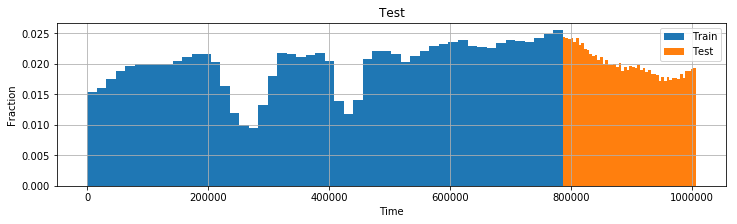

In [246]:
plt.figure(2, figsize=(12,3))
plt.bar(binsc1, counts1/(counts1.sum()*1.0), width=np.diff(bins1)[0], color=current_palette[0], label="Train")
plt.bar(binsc2, counts2/(counts2.sum()*1.0), width=np.diff(bins2)[0], color=current_palette[1], label="Test")
plt.grid(True)
plt.xlabel("Time")
plt.ylabel("Fraction")
plt.title("Test")
plt.legend()
plt.show()


The two dips of time in training set are curious, if looking at counts per unit time they might need to be normalised.

Another thing we can look at is how frequently different locations appear.

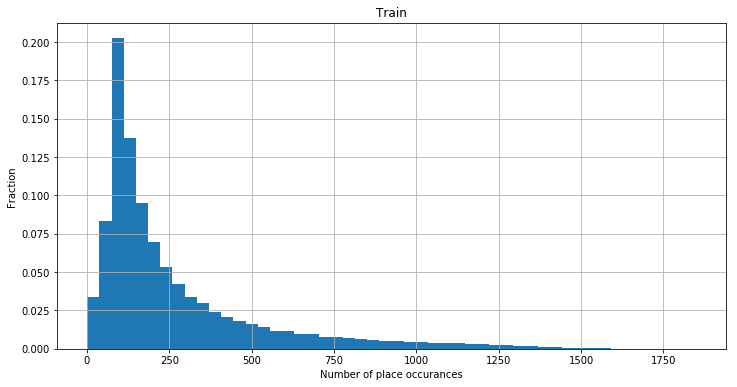

In [247]:
# Check how how frequently different locations appear
df_placecounts = df_train["place_id"].value_counts()

counts, bins = np.histogram(df_placecounts.values, bins=50)
binsc = bins[:-1] + np.diff(bins)/2.

plt.figure(3, figsize=(12,6))
plt.bar(binsc, counts/(counts.sum()*1.0), width=np.diff(bins)[0])
plt.grid(True)
plt.xlabel("Number of place occurances")
plt.ylabel("Fraction")
plt.title("Train")
plt.show()

Most places appear around 100 times.

Let's see if accuracy changes with "time" at all:

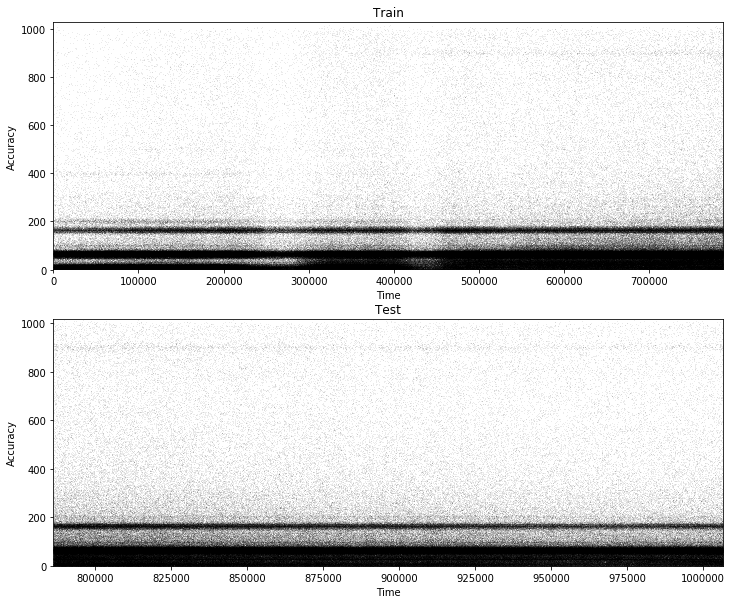

In [248]:
# Check if accuracy of signal corresponds with time
plt.figure(4, figsize=(12,10))

plt.subplot(211)
plt.scatter(df_train_sample["time"], df_train_sample["accuracy"], s=1, c='k', lw=0, alpha=0.1)
plt.xlabel("Time")
plt.ylabel("Accuracy")
plt.xlim(df_train_sample["time"].min(), df_train_sample["time"].max())
plt.ylim(df_train_sample["accuracy"].min(), df_train_sample["accuracy"].max())
plt.title("Train")

plt.subplot(212)
plt.scatter(df_test_sample["time"], df_test_sample["accuracy"], s=1, c='k', lw=0, alpha=0.1)
plt.xlabel("Time")
plt.ylabel("Accuracy")
plt.xlim(df_test_sample["time"].min(), df_test_sample["time"].max())
plt.ylim(df_test_sample["accuracy"].min(), df_test_sample["accuracy"].max())
plt.title("Test")

plt.show()


Not really - but we can see the two time dips in the training plot, and this emphases that accuracy is somewhat perfentially banded.

What about if the accuracy varies with location? Checking within 100x100m spots



In [249]:
df_train_sample["xround"] = df_train_sample["x"].round(decimals=1)
df_train_sample["yround"] = df_train_sample["y"].round(decimals=1)
df_groupxy = df_train_sample.groupby(["xround", "yround"]).agg({"accuracy":[np.mean, np.std]})
df_groupxy.head()

accuracy            
                    mean         std
xround yround                       
0.0    0.0     76.666667   16.165808
       0.1     65.711538   64.659997
       0.2     71.931818   71.073299
       0.3     61.150000   92.132213
       0.4     80.076923  132.509244

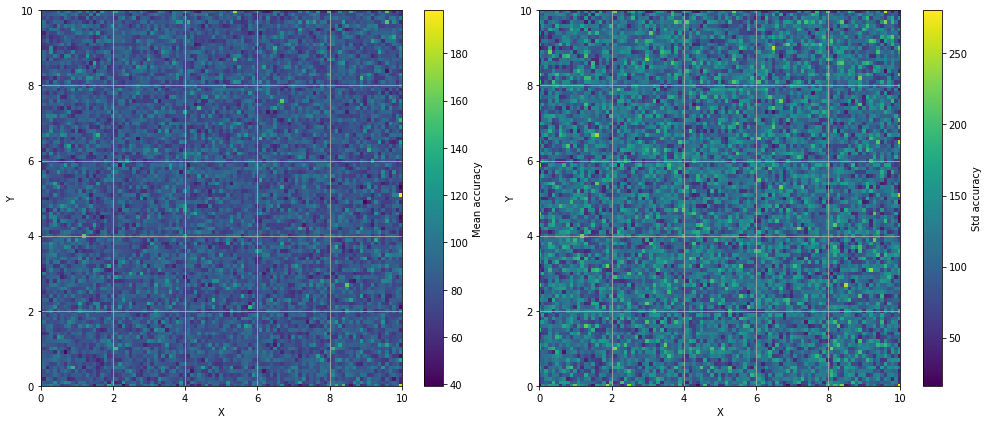

In [250]:
idx = np.asarray(list(df_groupxy.index.values))
plt.figure(5, figsize=(14,6))

plt.subplot(121)
plt.scatter(idx[:,0], idx[:,1], s=20, c=df_groupxy["accuracy", "mean"], marker='s', lw=0, cmap=plt.cm.viridis)
plt.colorbar().set_label("Mean accuracy")
plt.grid(True)
plt.xlabel("X")
plt.ylabel("Y")
plt.xlim(0,10)
plt.ylim(0,10)

plt.subplot(122)
plt.scatter(idx[:,0], idx[:,1], s=20, c=df_groupxy["accuracy", "std"], marker='s', lw=0, cmap=plt.cm.viridis)
plt.colorbar().set_label("Std accuracy")
plt.grid(True)
plt.xlabel("X")
plt.ylabel("Y")
plt.xlim(0,10)
plt.ylim(0,10)

plt.tight_layout()
plt.show()


No major structure here.

Exploring places and times

For the next parts, I've created a list of the top places (by check in counts), and chosen the top 20 to investigate further.

In [251]:
# Get a list of the top 20 places for future reference
df_topplaces = df_placecounts.iloc[0:20]
l_topplaces = list(df_topplaces.index)
print(l_topplaces)

[8772469670, 1623394281, 1308450003, 4823777529, 9586338177, 9129780742, 9544215131, 5351837004, 4638096372, 8610202964, 6051554924, 7363774279, 8607353836, 8336299754, 5204012807, 7230349735, 7985287621, 4371034975, 4993591840, 7348940462]


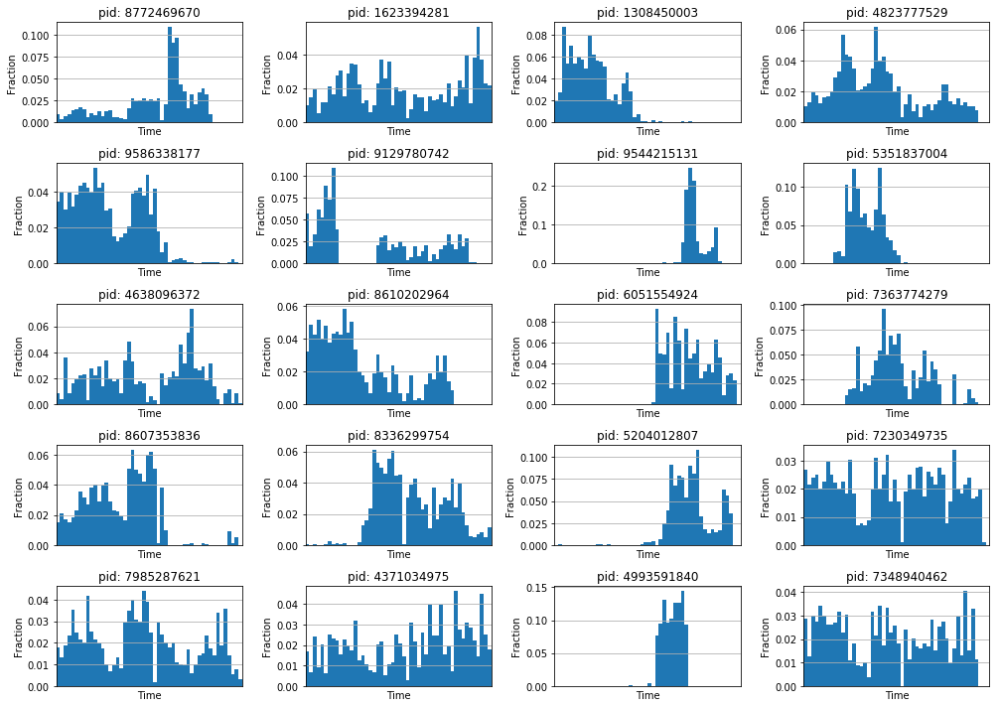

In [252]:
# Check if any of the top places have time correlated visits
plt.figure(6, figsize=(14,10))
for i in range(len(l_topplaces)):
    place = l_topplaces[i]

    df_place = df_train[df_train["place_id"]==place]

    counts, bins = np.histogram(df_place["time"], bins=50, range=[df_train["time"].min(), df_train["time"].max()])
    binsc = bins[:-1] + np.diff(bins)/2.
    
    plt.subplot(5,4,i+1)
    plt.bar(binsc, counts/(counts.sum()*1.0), width=np.diff(bins)[0])
    plt.xlim(df_train["time"].min(), df_train["time"].max())
    plt.grid(True)
    plt.xlabel("Time")
    plt.ylabel("Fraction")
    plt.gca().get_xaxis().set_ticks([])
    plt.title("pid: " + str(place))
    
plt.tight_layout()
plt.show()

Some places are visited at certain time periods for sure, but can't do much else until we disentangle time.

The time interval in train goes from 1 - 800,000, presumably we can modulo these times to view cyclic nature (hours of days, days of week, etc).

The best guess is seconds or minutes, which would equate to the training spanning 9 or 555 days respectively.

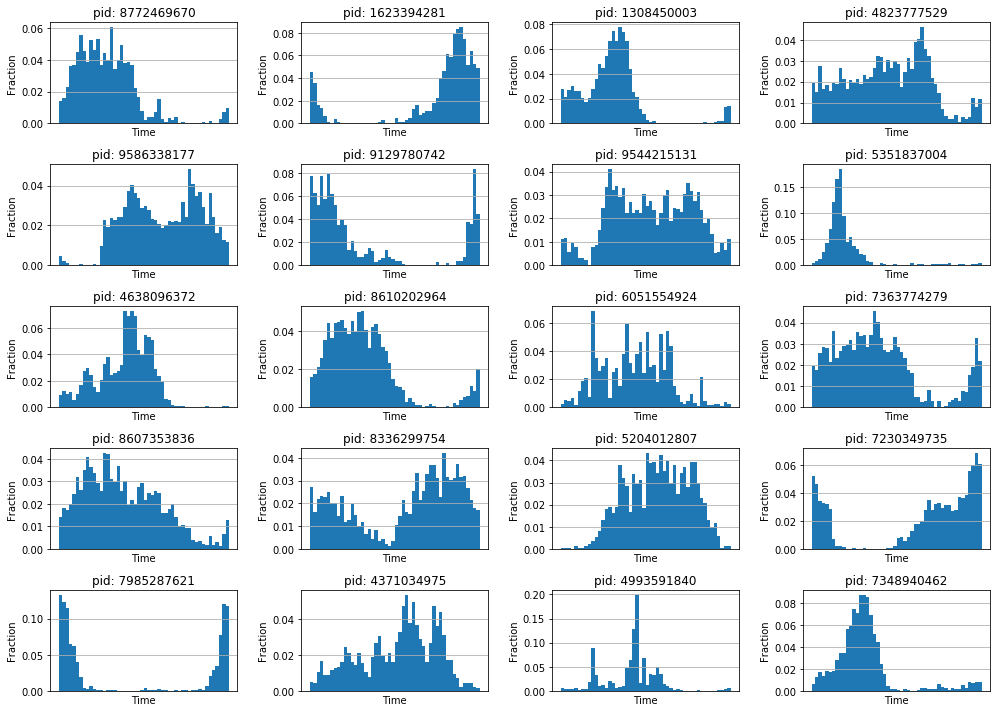

In [253]:
plt.figure(7, figsize=(14,10))
for i in range(len(l_topplaces)):
    place = l_topplaces[i]

    df_place = df_train[df_train["place_id"]==place]

    # Try % 3600*24 to see daily trend assuming it's in seconds
    # Try %   60*24 if minutes
    counts, bins = np.histogram(df_place["time"]%(60*24), bins=50)
    binsc = bins[:-1] + np.diff(bins)/2.
    
    plt.subplot(5,4,i+1)
    plt.bar(binsc, counts/(counts.sum()*1.0), width=np.diff(bins)[0])
    plt.grid(True)
    plt.xlabel("Time")
    plt.ylabel("Fraction")
    plt.gca().get_xaxis().set_ticks([])
    plt.title("pid: " + str(place))
    
plt.tight_layout()
plt.show()

Minutes looks pretty promising. This means we have ~555 days in train and ~140 in test.

From this, we can look at day of week to identify trends (weekends), day (to find longer term seasonality).

## We will take help of Fourier transform later on to see what the units of time is

In [257]:
# Add some columns
df_train["hour"] = (df_train["time"]%(60*24))/60.
df_train["dayofweek"] = np.ceil((df_train["time"]%(60*24*7))/(60.*24))
df_train["dayofyear"] = np.ceil((df_train["time"]%(60*24*365))/(60.*24))
df_train.head()

,row_id,x,y,accuracy,time,place_id,hour,dayofweek,dayofyear
0,0,0.7941,9.0809,54,470702,8523065625,21.033333,5.0,327.0
1,1,5.9567,4.7968,13,186555,1757726713,13.250000,4.0,130.0
2,2,8.3078,7.0407,74,322648,1137537235,1.466667,1.0,225.0
3,3,7.3665,2.5165,65,704587,6567393236,7.116667,7.0,125.0
4,4,4.0961,1.1307,31,472130,7440663949,20.833333,6.0,328.0


In [258]:
df_train_sample["hour"] = (df_train_sample["time"]%(60*24))/60.
df_train_sample["dayofweek"] = np.ceil((df_train_sample["time"]%(60*24*7))/(60.*24))
df_train_sample["dayofyear"] = np.ceil((df_train_sample["time"]%(60*24*365))/(60.*24))

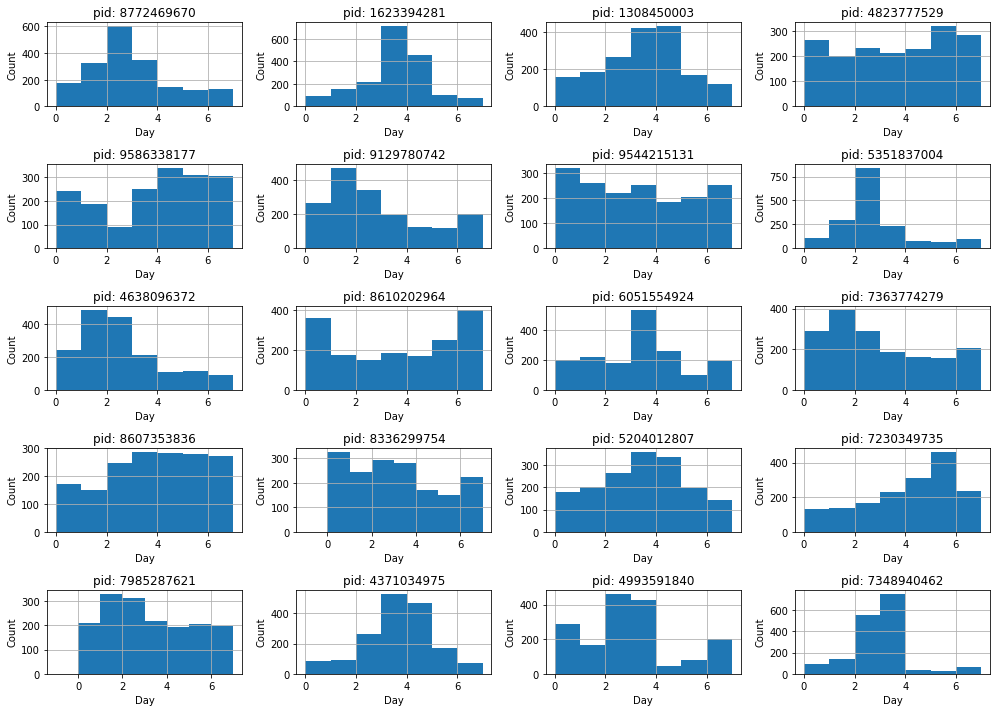

In [260]:
# Check the top 20 locations again for any weekly trends
plt.figure(8, figsize=(14,10))
for i in range(20):
    place = l_topplaces[i]
    df_place = df_train[df_train["place_id"]==place]

    # Group by weekday
    df_groupday = df_place.groupby("dayofweek").agg("count")

    plt.subplot(5,4,i+1)
    plt.bar(df_groupday.index.values-0.5, df_groupday["time"], width=1)
    plt.grid(True)
    plt.xlabel("Day")
    plt.ylabel("Count")
    plt.title("pid: " + str(place))
    
plt.tight_layout()
plt.show()


Some appear to have weekend-like behvaiour

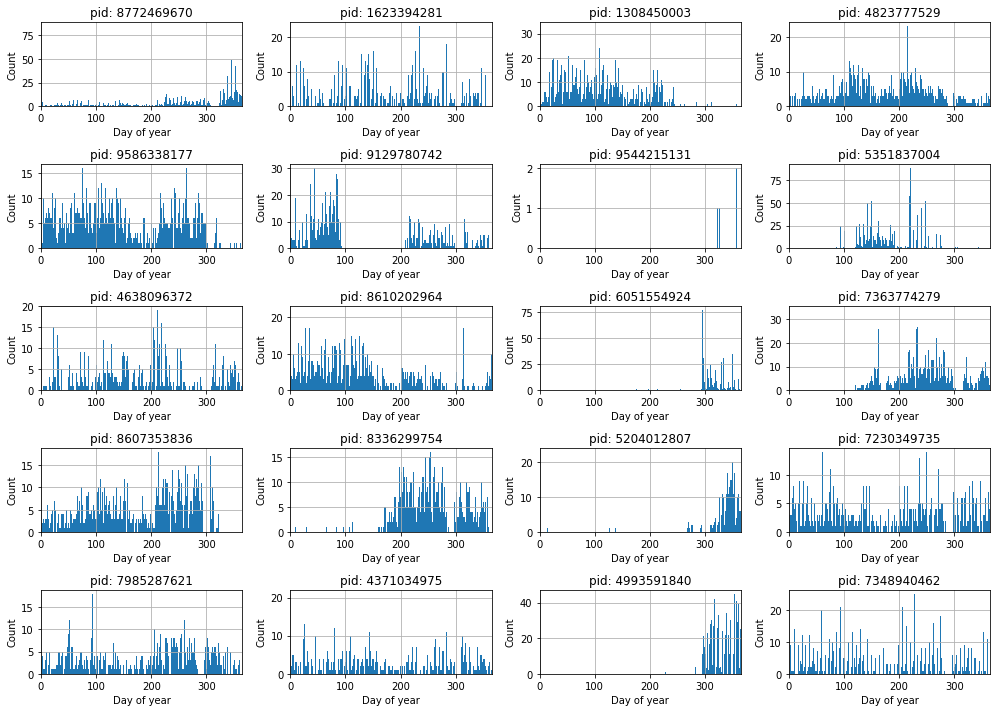

In [261]:
plt.figure(9, figsize=(14,10))
for i in range(20):
    place = l_topplaces[i]
    df_place = df_train[df_train["place_id"]==place]

    # Add some colums
    df_place = df_place[df_place["time"]<(60*24*365)] # Restrict to 1 year so the counts don't double up
    df_groupday = df_place.groupby("dayofyear").agg("count")

    plt.subplot(5,4,i+1)
    plt.bar(df_groupday.index.values-0.5, df_groupday["time"], width=1)
    plt.grid(True)
    plt.xlabel("Day of year")
    plt.ylabel("Count")
    plt.xlim(0,365)
    plt.title("pid: " + str(place))
    
plt.tight_layout()
plt.show()


It looks like some of the top places only opened up business part way through.

The next interesting thing is to look at the distribution of (x,y) points for a given location:

/Users/rkheruwa/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in log10
  del sys.path[0]


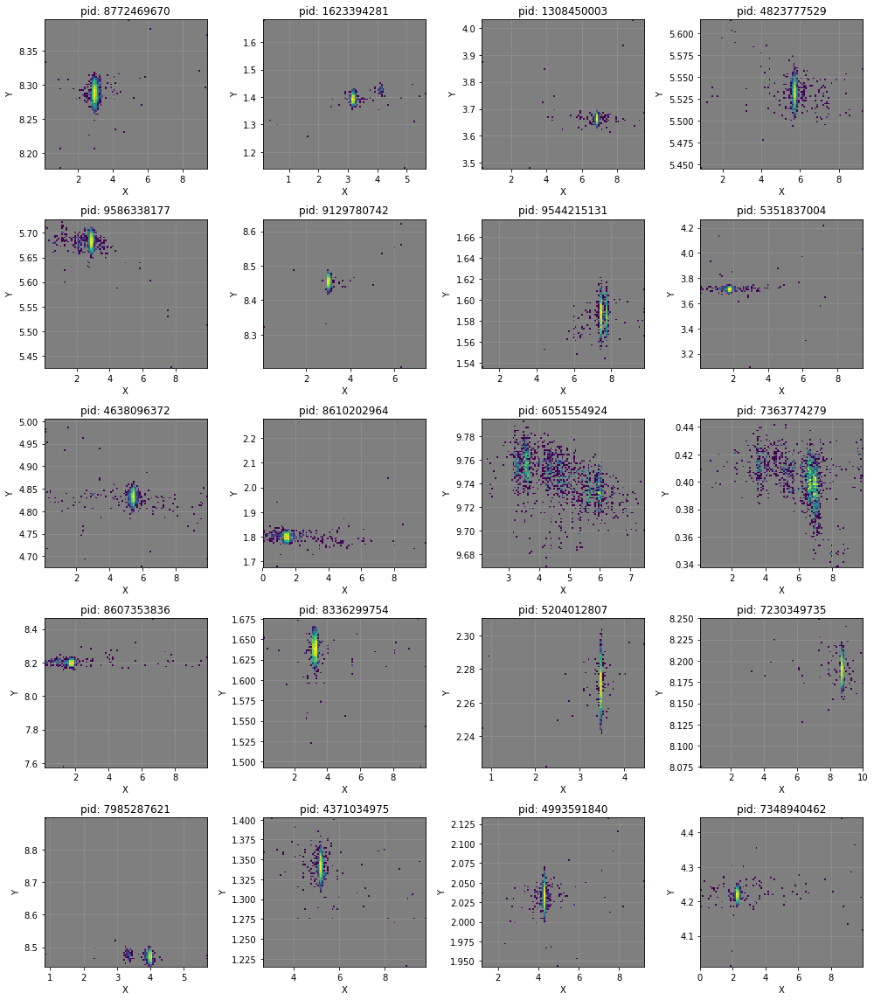

In [262]:
# Check the 2d distribution of (x,y) for the top 20 places
plt.figure(10, figsize=(14,16))
cmapm = plt.cm.viridis
cmapm.set_bad("0.5",1.)

for i in range(len(l_topplaces)):
    place = l_topplaces[i]
    df_place = df_train[df_train["place_id"]==place]
    counts, binsX, binsY = np.histogram2d(df_place["x"], df_place["y"], bins=100)
    extent = [binsX.min(),binsX.max(),binsY.min(),binsY.max()]

    plt.subplot(5,4,i+1)
    plt.imshow(np.log10(counts.T),
               interpolation='none',
               origin='lower',
               extent=extent,
               aspect="auto",
               cmap=cmapm)
    plt.grid(True, c='0.6', lw=0.5)
    plt.xlabel("X")
    plt.ylabel("Y")
    plt.title("pid: " + str(place))

plt.tight_layout()
plt.show()


The distributions are different for different locations, but many span a huge x-range relative to the y-range (maybe roads are aligned this way?)

Let's re-visit the accuracy to see if it changes we get further away from the presumed centroid location:



/Users/rkheruwa/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: The set_axis_bgcolor function was deprecated in version 2.0. Use set_facecolor instead.
  


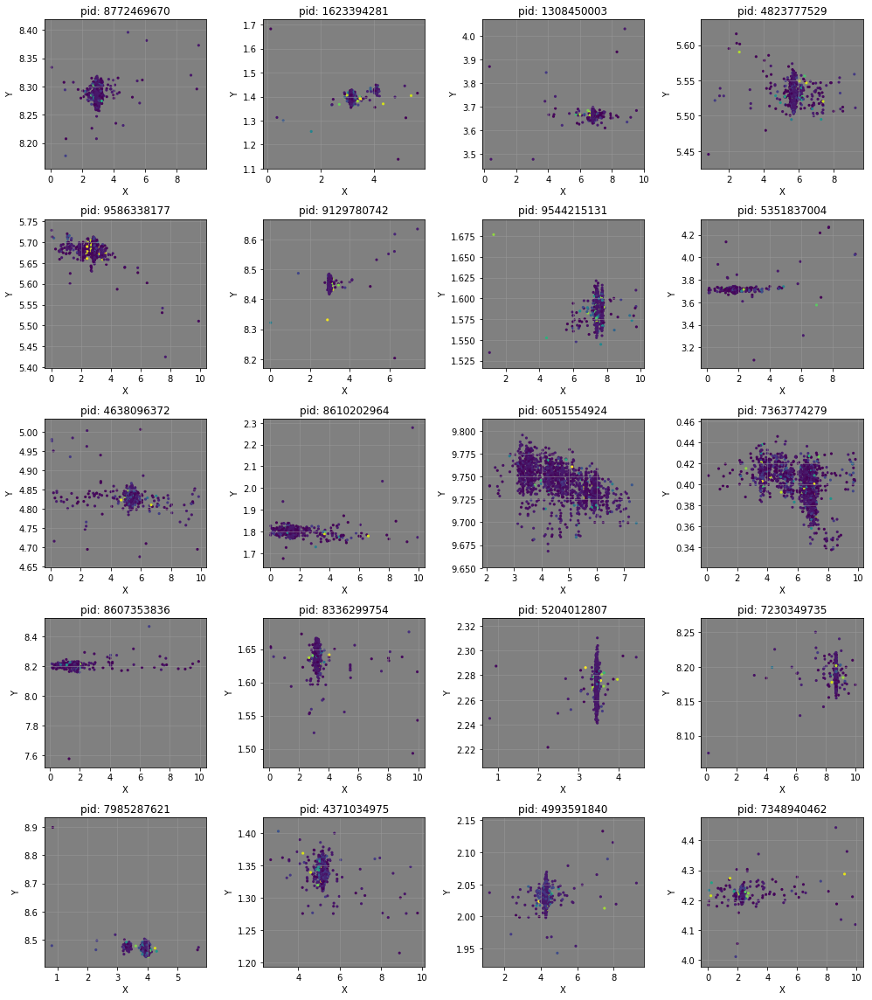

In [263]:
# See if the accuracy varies with distance from centroid point
plt.figure(11, figsize=(14,16))

for i in range(len(l_topplaces)):
    plt.subplot(5,4,i+1)
    plt.gca().set_axis_bgcolor("0.5")
    place = l_topplaces[i]
    df_place = df_train[df_train["place_id"]==place]
    plt.scatter(df_place["x"], df_place["y"], s=10, c=df_place["accuracy"], lw=0, cmap=plt.cm.viridis)
    plt.grid(True, c='0.6', lw=0.5)
    plt.xlabel("X")
    plt.ylabel("Y")
    plt.title("pid: " + str(place))
    
plt.tight_layout()
plt.show()

Nope, not really. What about time variance per location?



/Users/rkheruwa/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: The set_axis_bgcolor function was deprecated in version 2.0. Use set_facecolor instead.
  


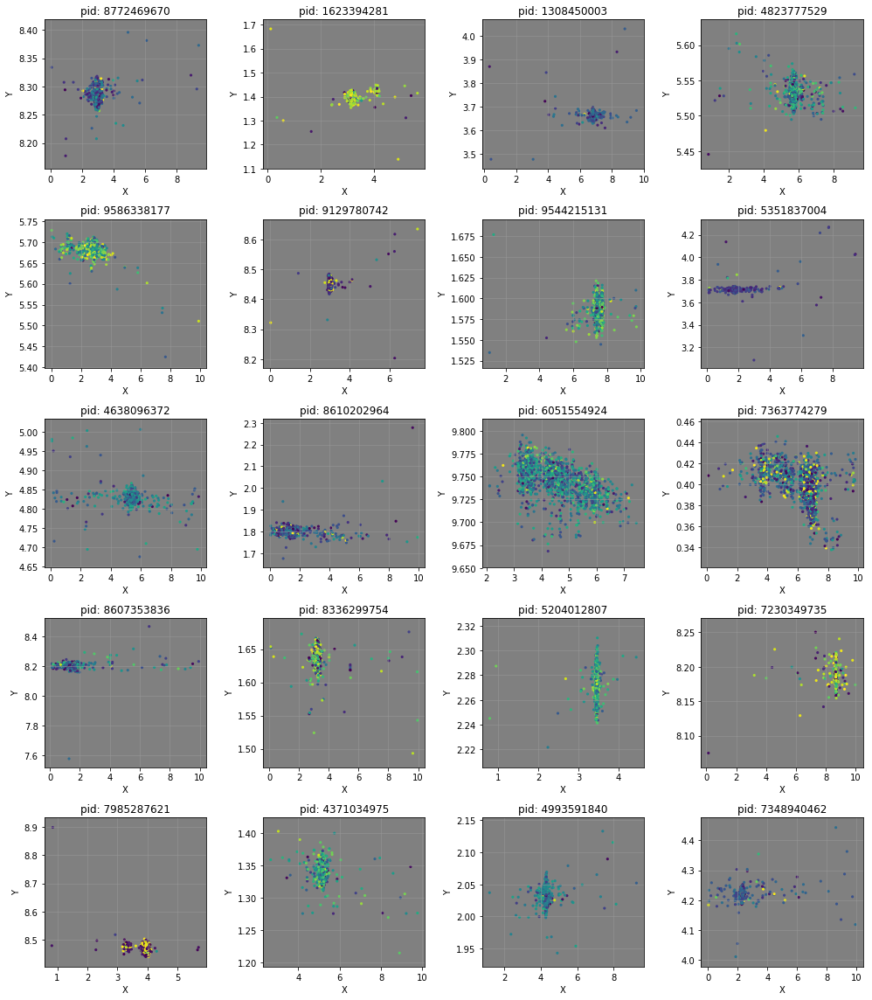

In [264]:
# See if the time varies with distance from centroid point
plt.figure(12, figsize=(14,16))

for i in range(len(l_topplaces)):
    plt.subplot(5,4,i+1)
    plt.gca().set_axis_bgcolor("0.5")
    place = l_topplaces[i]
    df_place = df_train[df_train["place_id"]==place]
    plt.scatter(df_place["x"], df_place["y"], s=10, c=df_place["hour"], lw=0, cmap=plt.cm.viridis)
    plt.grid(True, c='0.6', lw=0.5)
    plt.xlabel("X")
    plt.ylabel("Y")
    plt.title("pid: " + str(place))
    
plt.tight_layout()
plt.show()



This certainly shows different places are preferntially visited at different hours. This will be useful for predictions, since for a given "hour" the list of probably places will be reduced.

Let's pick an arbitrary place, and see if it's shape is discernible over the background noise.

/Users/rkheruwa/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:14: MatplotlibDeprecationWarning: The set_axis_bgcolor function was deprecated in version 2.0. Use set_facecolor instead.
  
/Users/rkheruwa/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:24: MatplotlibDeprecationWarning: The set_axis_bgcolor function was deprecated in version 2.0. Use set_facecolor instead.


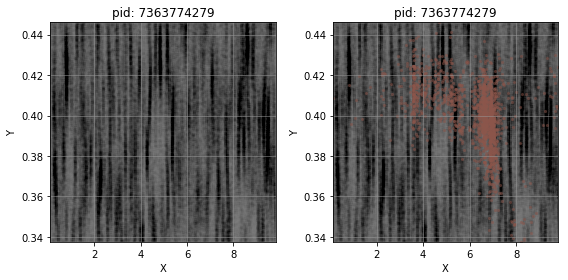

In [265]:
# Pick a place, and see if it's shape profile stands out against background noise (i.e., every other point)
i = 11
place = l_topplaces[i]
df_place = df_train[df_train["place_id"]==place]
xmin, xmax = df_place["x"].min(), df_place["x"].max()
ymin, ymax = df_place["y"].min(), df_place["y"].max()
df_noise = df_train[(df_train["x"]>xmin) &
                    (df_train["x"]<xmax) &
                    (df_train["y"]>ymin) &
                    (df_train["y"]<ymax)]

plt.figure(13, figsize=(8,4))
plt.subplot(121)
plt.gca().set_axis_bgcolor("0.5")
plt.scatter(df_noise["x"], df_noise["y"], s=10, c='k', lw=0, alpha=0.005)
plt.xlabel("X")
plt.ylabel("Y")
plt.title("pid: " + str(place))
plt.xlim(xmin,xmax)
plt.ylim(ymin,ymax)
plt.grid(True, c='0.6', lw=0.5)

plt.subplot(122)
plt.gca().set_axis_bgcolor("0.5")
plt.scatter(df_noise["x"], df_noise["y"], s=10, c='k', lw=0, alpha=0.005)
plt.scatter(df_place["x"], df_place["y"], s=10, c=current_palette[5], lw=0, alpha=0.5)
plt.xlabel("X")
plt.ylabel("Y")
plt.title("pid: " + str(place))
plt.xlim(xmin,xmax)
plt.ylim(ymin,ymax)
plt.grid(True, c='0.6', lw=0.5)

plt.tight_layout()
plt.show()

...not really. OK, let's revisit this x-axis stretching business by visualising these top 20 locations on a map.



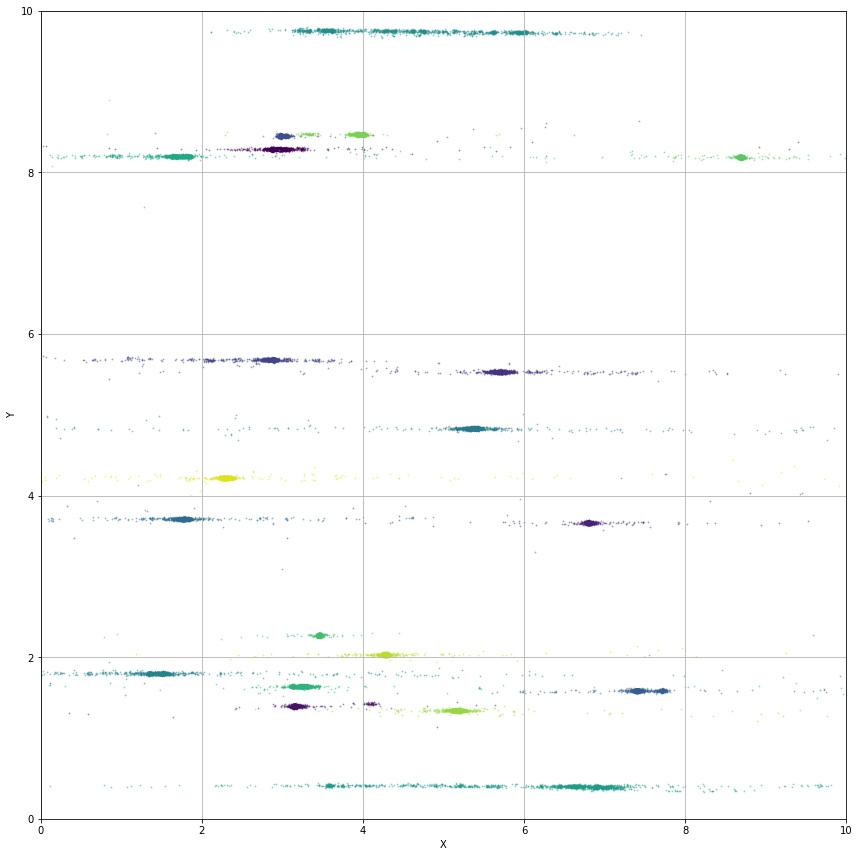

In [267]:
# Going back to the x-axis stretching, and visualising some location checkins on a map
plt.figure(14, figsize=(12,12))

for i in range(20):
    place = l_topplaces[i]
    df_place = df_train[df_train["place_id"]==place]
    plt.scatter(df_place["x"], df_place["y"], s=3, alpha=0.5, c=plt.cm.viridis(int(i*(255/20.))), lw=0)
    
plt.grid(True)
plt.xlabel("X")
plt.ylabel("Y")
plt.tight_layout()
plt.xlim(0,10)
plt.ylim(0,10)
plt.show()

This highlights the variance, looking like streets in X axis. We can look at the standard deviations to illustrate this:



In [268]:
# Check the stdev of x/y for each place
df_groupplace = df_train.groupby("place_id").agg({"time":"count", "x":"std", "y":"std"})
df_groupplace.sort_values(by="time", inplace=True, ascending=False)
df_groupplace.head()

,time,x,y
place_id,,,
8772469670,1849,0.356140,0.011544
1623394281,1802,0.240642,0.015712
1308450003,1757,0.340147,0.017662
4823777529,1738,0.476614,0.011860
9586338177,1718,0.507308,0.014817


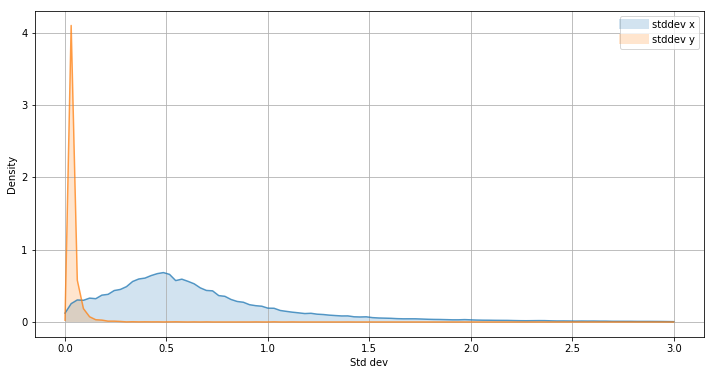

In [269]:
# Density plot
gkde_stddevx = gaussian_kde(df_groupplace["x"][~df_groupplace["x"].isnull()].values)
gkde_stddevy = gaussian_kde(df_groupplace["y"][~df_groupplace["y"].isnull()].values)

# Compute the functions
rangeX = np.linspace(0, 3, 100)
x_density = gkde_stddevx(rangeX)
y_density = gkde_stddevy(rangeX)

plt.figure(15, figsize=(12,6))
plt.subplot(111)
plt.plot(rangeX, x_density, c=current_palette[0], ls="-", alpha=0.75)
plt.plot(rangeX, y_density, c=current_palette[1], ls="-", alpha=0.75)
plt.gca().fill_between(rangeX, 0, x_density, facecolor=current_palette[0], alpha=0.2)
plt.gca().fill_between(rangeX, 0, y_density, facecolor=current_palette[1], alpha=0.2)
plt.ylabel("Density")
plt.xlabel("Std dev")
plt.plot([], [], c=current_palette[0], alpha=0.2, linewidth=10, label="stddev x")
plt.plot([], [], c=current_palette[1], alpha=0.2, linewidth=10, label="stddev y")
plt.legend()
plt.grid(True)


Back to time, what if the accuracy varies as a function of hour of day?



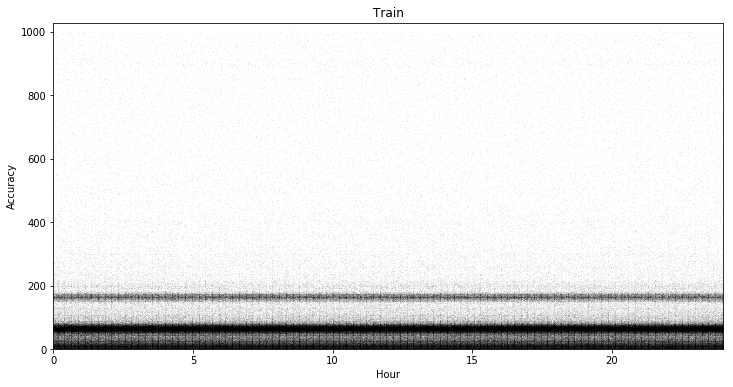

In [270]:
# With the new found time features, we can re-check how accuracy varies with it:
plt.figure(19, figsize=(12,6))
plt.scatter(df_train_sample["hour"], df_train_sample["accuracy"], s=1, c='k', lw=0, alpha=0.05)
plt.xlabel("Hour")
plt.ylabel("Accuracy")
plt.xlim(df_train_sample["hour"].min(), df_train_sample["hour"].max())
plt.ylim(df_train_sample["accuracy"].min(), df_train_sample["accuracy"].max())
plt.title("Train")
plt.show()

## Density of points previously used to check-in

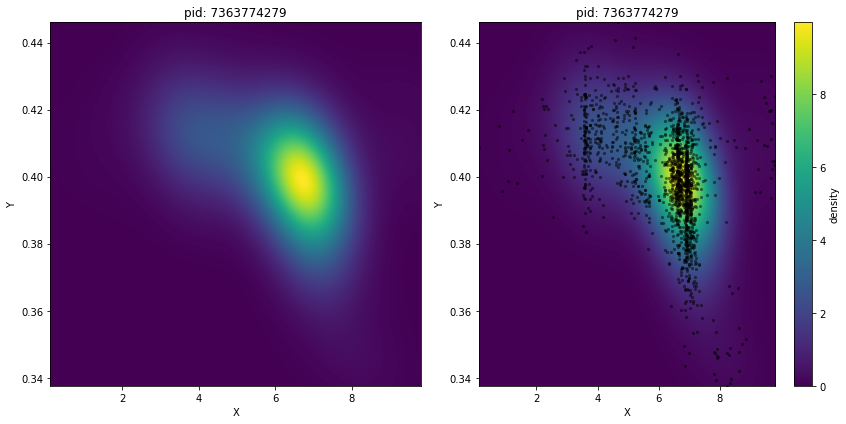

In [271]:
i = 11
place = l_topplaces[i]
df_place = df_train[df_train["place_id"]==place]
xmin, xmax = df_place["x"].min(), df_place["x"].max()
ymin, ymax = df_place["y"].min(), df_place["y"].max()

# Calculate the KDE
res = 200 # resolution
gkde_place = gaussian_kde(np.asarray((df_place["x"], df_place["y"])))
x_flat = np.linspace(xmin, xmax, res)
y_flat = np.linspace(ymin, ymax, res)
x, y = np.meshgrid(x_flat,y_flat)
grid_coords = np.append(x.reshape(-1,1),y.reshape(-1,1),axis=1)
z = gkde_place(grid_coords.T)
z = z.reshape(res,res)

# Plot
extent = [xmin,xmax,ymin,ymax]
plt.figure(20, figsize=(12,6))

# KDE only
plt.subplot(121)
plt.imshow(z[::-1,:],
           extent=extent,
           aspect="auto",
           cmap=plt.cm.viridis,
           interpolation="bilinear")
plt.grid(False)
plt.xlabel("X")
plt.ylabel("Y")
plt.title("pid: " + str(place))
plt.xlim(xmin,xmax)
plt.ylim(ymin,ymax)

# Overplot the points
plt.subplot(122)
plt.imshow(z[::-1,:],
           extent=extent,
           aspect="auto",
           cmap=plt.cm.viridis,
           interpolation="bilinear")
plt.colorbar().set_label("density")
plt.scatter(df_place["x"], df_place["y"], s=10, c='k', lw=0, alpha=0.5)
plt.grid(False)
plt.xlabel("X")
plt.ylabel("Y")
plt.title("pid: " + str(place))
plt.xlim(xmin,xmax)
plt.ylim(ymin,ymax)

plt.tight_layout()
plt.show()

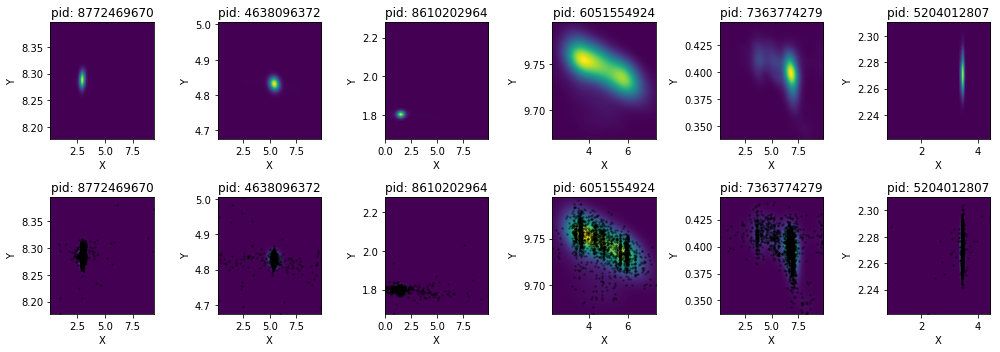

In [272]:
# Try some more
pids = [0,8,9,10,11,14] # A few places
kdes = []
plt.figure(21, figsize=(14,5))
for i in range(len(pids)):
    place = l_topplaces[pids[i]]
    df_place = df_train[df_train["place_id"]==place]
    xmin, xmax = df_place["x"].min(), df_place["x"].max()
    ymin, ymax = df_place["y"].min(), df_place["y"].max()

    # Calculate the KDE
    res = 50 # resolution
    gkde_place = gaussian_kde(np.asarray((df_place["x"], df_place["y"])))
    kdes.append(gkde_place) # Keep these KDEs for later
    x_flat = np.linspace(xmin, xmax, res)
    y_flat = np.linspace(ymin, ymax, res)
    x, y = np.meshgrid(x_flat,y_flat)
    grid_coords = np.append(x.reshape(-1,1),y.reshape(-1,1),axis=1)
    z = gkde_place(grid_coords.T)
    z = z.reshape(res,res)

    # Plot
    extent = [xmin,xmax,ymin,ymax]
    
    # KDE only
    plt.subplot(2,6,i+1)
    plt.imshow(z[::-1,:],
               extent=extent,
               aspect="auto",
               cmap=plt.cm.viridis,
               interpolation="bilinear")
    plt.grid(False)
    plt.xlabel("X")
    plt.ylabel("Y")
    plt.title("pid: " + str(place))
    plt.xlim(xmin,xmax)
    plt.ylim(ymin,ymax)

    # Overplot the points
    plt.subplot(2,6,i+7)
    plt.imshow(z[::-1,:],
               extent=extent,
               aspect="auto",
               cmap=plt.cm.viridis,
               interpolation="bilinear")
    plt.scatter(df_place["x"], df_place["y"], s=5, c='k', lw=0, alpha=0.5)
    plt.grid(False)
    plt.xlabel("X")
    plt.ylabel("Y")
    plt.title("pid: " + str(place))
    plt.xlim(xmin,xmax)
    plt.ylim(ymin,ymax)

plt.tight_layout()
plt.show()


## Fourier transform

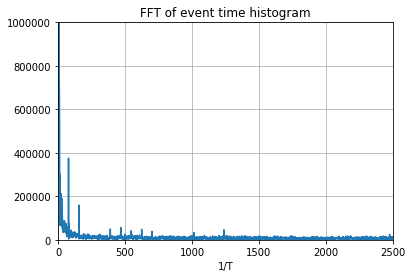

In [273]:
# Compute the histogram of the event time
time = df_train['time']
hist = hist = np.histogram(time,5000)

# To know the unit definition of Time
# we can look into the frequency structure of the histogram
hist_fft = np.absolute(np.fft.fft(hist[0]))
plt.plot(hist_fft)
plt.xlim([0,2500])
plt.ylim([0,1e6])
plt.title('FFT of event time histogram')
plt.xlabel('1/T')
plt.grid(True)
plt.show()

The peaks in the FFT curve indicate strong periodic structure at that frequency. Let's zoom-in the see the numbers.




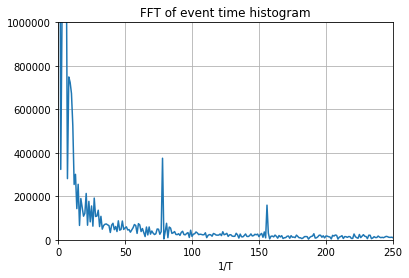

In [274]:
plt.plot(hist_fft)
plt.xlim([0,250])
plt.ylim([0,1e6])
plt.title('FFT of event time histogram')
plt.xlabel('1/T')
plt.grid(True)
plt.show()

The first peak (fundamental frequency) is at 78 which means the time histogram has a period of:




In [276]:
print(time.max()/78)



10079.9871795


The overall event histogram averages over all place_id, so I look at one of the most popular place_id to find more information.




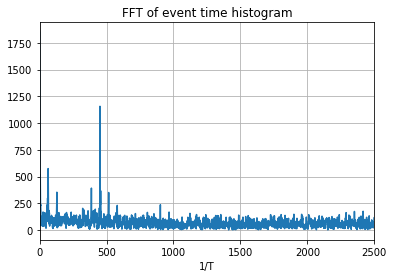

In [278]:
time = df_train[df_train['place_id']==8772469670]['time']
hist = np.histogram(time,5000)
hist_fft = np.absolute(np.fft.fft(hist[0]))

plt.plot(hist_fft)
plt.xlim([0,2500])
plt.title('FFT of event time histogram')
plt.xlabel('1/T')
plt.grid(True)
plt.show()

Small peak at 64 and large peak at 451, they conrespond to periods:




In [279]:
T1 = time.max()/64
T2 = time.max()/451
print('period T1:', T1)
print('period T2:', T2)

period T1: 10151.96875
period T2: 1440.63414634


T1 is the same period as the one found in overall histogram.
But the interesting part is that the ratio of T1 and T2 happen to be about 7, so they are very likely week and day.
And 1440 is the minute time for a day.

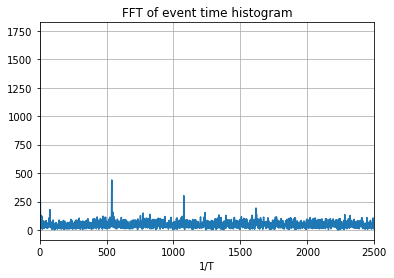

In [280]:
# Another place_id for confirmation
time = df_train[df_train['place_id']==4823777529]['time']
hist = np.histogram(time,5000)
hist_fft = np.absolute(np.fft.fft(hist[0]))

plt.plot(hist_fft)
plt.xlim([0,2500])
plt.title('FFT of event time histogram')
plt.xlabel('1/T')
plt.grid(True)
plt.show()

In [281]:
# peaks at 77 and 539, same periods: 10080 and 1440
T1 = time.max()/77
T2 = time.max()/539
print('period T1:', T1)
print('period T2:', T2)

period T1: 10077.4805195
period T2: 1439.64007421


# Modelling

### The following has been divided into 3 parts :
    1. Running 13 single models on a validation set and a whole data-set. Getting and storing the CSV files related to each model which will be utilized later-on for ensemble. 
    2. Running a partial or semi-ensemble with 4 models.
    3. Running a full ensemble. 

In [ ]:
import sys
import os
import time
import logging
import configparser
import operator
import numpy as np
import pandas as pd
import ml_metrics as metrics
from sklearn.preprocessing import LabelEncoder

###  Getting the 1/100th data for the model and hyperparameter selection. The last 171360 minutes are used for validation set

In [ ]:
df = pd.read_csv("/data/train.csv")
t_max = df["time"].max()
df[df["time"] <= t_max - 171360].to_csv("/data/train-tr.csv", index=False)
df[df["time"] > t_max - 171360].to_csv("/data/train-va.csv", index=False)


train-tr.csv and train-va.csv are created 

# Extra Trees Classifier

* Create a config parser, "config_et" for hyperparameters, as shown below. 
* There are two main entries, "et_validation" which will be for validation data and "et_train" for the non-validation data

In [301]:
import configparser
config_et = configparser.ConfigParser()
config_et['et_validation'] = { 'valid_mode_on' : True,
                        'n_cell_x' : 60,
                        'n_cell_y' : 100,
                        'x_border' : 0.03,
                        'y_border' : 0.015,
                        'th' : 5,
                        'model_list' : 'et_opt1',
                        'output_path' : '/OutputFiles/'}
config_et['et_train'] = { 'valid_mode_on' : False,
                       'n_cell_x' : 60,
                       'n_cell_y' : 100,
                       'x_border' : 0.03,
                       'y_border' : 0.015,
                        'th' : 5,
                        'model_list' : 'et_opt1',
                        'output_path' : '/OutputFiles/'}

# Common functions required for almost all the classifiers

In [302]:
def prepare_data_new(df, n_cell_x, n_cell_y):
    """
    Feature engineering and computation of the grid.
    """
    #Creating the grid
    size_x = 10. / n_cell_x
    size_y = 10. / n_cell_y
    eps = 0.00001  
    xs = np.where(df.x.values < eps, 0, df.x.values - eps)
    ys = np.where(df.y.values < eps, 0, df.y.values - eps)
    pos_x = (xs / size_x).astype(np.int)
    pos_y = (ys / size_y).astype(np.int)
    df['grid_cell_x'] = pos_x
    df['grid_cell_y'] = pos_y
    
    #Feature engineering
    initial_date = np.datetime64('2014-01-01T01:01', dtype='datetime64[m]') 
    d_times = pd.DatetimeIndex(initial_date + np.timedelta64(int(mn), 'm') 
                               for mn in df.time.values)

    df['hour'] = d_times.hour + d_times.minute / 60.
    df['weekday'] = d_times.weekday
    df['day'] = d_times.dayofyear
    df['month'] = d_times.month
    df['year'] = d_times.year - 2013

    df = df.drop(['time'], axis=1)
    return df

def train_hour_periodic_new(df_train, time_edge):
    logging.info("add train data to show period in hour, time_edge=%f" % time_edge)
    add_data = df_train[df_train.hour < time_edge].copy().reindex()
    add_data.hour += 24
    df_train = pd.concat([df_train, add_data])

    add_data = df_train[df_train.hour > 24 - time_edge].copy().reindex()
    add_data.hour -= 24
    df_train = pd.concat([df_train, add_data])
    return df_train

def process_one_cell_new(df_train, df_test, valid_mode_on,
                     gx_id, gy_id, x_border, y_border, th, model_list):
    """   
    Classification inside one grid cell.
    """
    #Working on df_train
    #filtering occurance smaller than th
    #consider border of cell
    df_cell_train = df_train.loc[(df_train.grid_cell_x == gx_id) & (df_train.grid_cell_y == gy_id)]
    x_min = df_cell_train.x.min()
    x_max = df_cell_train.x.max()
    y_min = df_cell_train.y.min()
    y_max = df_cell_train.y.max()
    df_cell_train = df_train.loc[(df_train.x >= x_min - x_border) & (df_train.x <= x_max + x_border)
                                  & (df_train.y >= y_min - y_border) & (df_train.y <= y_max + y_border)]
    place_counts = df_cell_train.place_id.value_counts()
    mask = (place_counts[df_cell_train.place_id.values] >= th).values
    df_cell_train = df_cell_train.loc[mask]

    #Working on df_test
    df_cell_test = df_test.loc[(df_test.grid_cell_x == gx_id) & (df_test.grid_cell_y == gy_id)]
    row_ids = df_cell_test.row_id.values

    #Preparing data
    #remove columns and encode label
    le = LabelEncoder()
    y_train = le.fit_transform(df_cell_train.place_id.values)
    l_train = df_cell_train.shape[0]
    l_test = df_cell_test.shape[0]
    n_class = len(le.classes_)
    logging.info("number of class: %d" % n_class)
    if valid_mode_on:
        logging.info("validation mode")
        logging.info("train size: %d, validation size: %d" % (l_train, l_test))
        logging.info("%d labels in validation is not in train" 
                     % len(set(df_cell_test.place_id.values) - set(df_cell_train.place_id.values)))
    else:
        logging.info("prediction mode")
        logging.info("train size: %d, test size: %d" % (l_train, l_test))

    df_cell_train_feats = df_cell_train.drop(['place_id', 'grid_cell_x', 'grid_cell_y', 'row_id'], axis=1)
    feats = df_cell_train_feats.columns.values
    df_cell_test_feats = df_cell_test[feats]

    y_test_pred = np.zeros((df_cell_test_feats.shape[0], n_class))
    for clf in model_list:
        y_test_pred_model = clf(df_cell_train_feats, y_train, df_cell_test_feats)
        y_test_pred += y_test_pred_model

    if valid_mode_on:
        pred_labels = le.inverse_transform(np.argsort(y_test_pred, axis=1)[:, ::-1][:, :10])
        valid_score = metrics.mapk(df_cell_test.place_id.values[:, None], pred_labels, 3)
        logging.info("valid score = %6.6f" % valid_score)
    else:
        valid_score = None

    #return list of (row_id, place_id, proba)
    top10_label = le.inverse_transform(np.argsort(y_test_pred, axis=1)[:, ::-1][:, :10])
    top10_proba_raw = np.sort(y_test_pred, axis=1)[:, ::-1][:, :10]
    top10_proba = top10_proba_raw / np.sum(top10_proba_raw, axis=1)[:, None]
    probas = []
    for i, rid in enumerate(row_ids):
        if i == 0:
            probas = np.array([[rid] * 10, top10_label[i], top10_proba[i]]).T
        else:
            probas = np.vstack([probas, np.array([[rid] * 10, top10_label[i], top10_proba[i]]).T])
    return probas, valid_score, l_test

def process_grid_new(df_train, df_test, valid_mode_on, x_border, y_border, th,
                 n_cell_x, n_cell_y, model_list, output_path, gx_ids=None):
    """
    Iterates over all grid cells, aggregates the results and makes the
    submission.
    """ 
    if not os.path.isdir(output_path):
        os.makedirs(output_path)

    if valid_mode_on:
        valid_score_total = 0.
        valid_size_total = 0

    if valid_mode_on:
        # take the middle 1/10, 1/10 as validation sample
        n_cell_xs = range(int(n_cell_x / 2), int(3 * n_cell_x / 5))
        n_cell_ys =range(int(n_cell_y / 2), int(3 * n_cell_y / 5))
    else:
        if gx_ids is not None and len(list(gx_ids)) == 2:
            # customize x
            n_cell_xs = range(gx_ids[0], gx_ids[1])
            n_cell_ys = range(n_cell_y)
        else:
            # use the whole set
            n_cell_xs = range(n_cell_x)
            n_cell_ys = range(n_cell_y)

    time_start = time.time()
    for gx_id in n_cell_xs:
        new_output = True
        for gy_id in n_cell_ys:
            logging.info("=====Grid: (%d, %d)=====" % (gx_id, gy_id))
            #Applying classifier to one grid cell
            probas, valid_score, valid_size = process_one_cell_new(df_train, df_test, valid_mode_on,
                                                               gx_id, gy_id, x_border, y_border,
                                                               th, model_list)
            if valid_mode_on:
                valid_score_total += valid_score * valid_size
                valid_size_total += valid_size                
            #Updating predictions
            if new_output:
                probas_rec = probas
                new_output = False
            else:
                probas_rec = np.vstack([probas_rec, probas])
        logging.info("Output Probability File")
        df_probas = pd.DataFrame(probas_rec, columns=["row_id", "place_id", "probability"])
        df_probas["row_id"] = df_probas["row_id"].astype(int)
        df_probas["place_id"] = df_probas["place_id"].astype(int)
        df_probas["probability"] = df_probas["probability"].astype(float)
        df_probas.to_csv(os.path.join(output_path, "%d.csv" % gx_id), index=False)
    logging.info("########Total Run Time: %4.2f minutes#######" % round((time.time() - time_start) / 60., 2))

    if valid_mode_on:
        logging.info("Total validation score: %f" % (valid_score_total / valid_size_total))
        np.savetxt(os.path.join(output_path, "MAP3.txt"), [valid_score_total / valid_size_total], fmt="%f")
        return valid_score_total / valid_size_total

def run_model_new(config_name, model_dict, data_path):
    print("run_model")
    #config = configparser.ConfigParser()
    print("Here")
    valid_mode_on = config_et.getboolean(config_name, "valid_mode_on")
    if valid_mode_on:
        train_path = os.path.join(data_path, "train-TR.csv")
        test_path = os.path.join(data_path, "train-VA.csv")
    else:
        train_path = os.path.join(data_path, "train.csv")
        test_path = os.path.join(data_path, "test.csv")
    n_cell_x = config_et.getint(config_name, "n_cell_x")
    n_cell_y = config_et.getint(config_name, "n_cell_y")
    x_border = config_et.getfloat(config_name, "x_border")
    y_border = config_et.getfloat(config_name, "y_border")
    th = config_et.getint(config_name, "th")
    model_list = map(lambda x: model_dict[x.strip()], config_et.get(config_name, "model_list").split(","))
    output_path = os.path.join(config_et.get(config_name, "output_path"), config_name)

    try:
        gx_ids = map(int, config_et.get(config_name, "gx_ids").split(","))
    except configparser.NoOptionError:
        gx_ids = None

    try:
        time_edge = config_et.getfloat(config_name, "time_edge")
    except configparser.NoOptionError:
        time_edge = -1

    logging.basicConfig(level=logging.INFO, format='%(asctime)s %(levelname)s: %(message)s')
    logging.info("Running config: [%s]" % config_name)
    logging.info('Loading data')
    df_train = pd.read_csv(train_path)
    df_test = pd.read_csv(test_path)
    logging.info('Preparing train data')
    df_train = prepare_data_new(df_train, n_cell_x, n_cell_y)
    if time_edge > 0:
        df_train = train_hour_periodic_new(df_train, time_edge)
    logging.info('Preparing test data')
    df_test = prepare_data_new(df_test, n_cell_x, n_cell_y)

    return process_grid_new(df_train, df_test, valid_mode_on, x_border, y_border, th,
                 n_cell_x, n_cell_y, model_list, output_path, gx_ids)



### This would be ExtraTreesClassifier for "et_validation" which is just for validation data(last 171360 minutes which is 1/100th of the data).

### This would create a "et_validation" folder according to the above code which will contain ".csv" result files and a "map3.txt" score. 

## All the generated result files will be submitted related to all the models 



In [303]:
# In the case here, et_validation folder will be created with the resultant files

from sklearn.ensemble import ExtraTreesClassifier

def et_opt1(df_cell_train_feats, y_train, df_cell_test_feats):
    logging.info("train et_opt1 model")
    clf = ExtraTreesClassifier(n_estimators=500, n_jobs=-1, max_features="log2", min_samples_split=5, min_samples_leaf=1)
    clf.fit(df_cell_train_feats, y_train)
    y_test_pred = clf.predict_proba(df_cell_test_feats)
    return y_test_pred

model_dict = {"et_opt1": et_opt1}

if __name__ == "__main__":
    config_name = "et_validation"
    data_path = "/data/"
    print("going to call run_model")
    run_model_new(config_name, model_dict, data_path)

2017-12-17 08:26:43,581 INFO: Running config: [et_validation]
2017-12-17 08:26:43,587 INFO: Loading data


going to call run_model
run_model
Here


2017-12-17 08:27:13,937 INFO: Preparing train data
2017-12-17 08:29:28,805 INFO: Preparing test data
2017-12-17 08:30:11,781 INFO: =====Grid: (30, 50)=====
2017-12-17 08:30:12,430 INFO: number of class: 105
2017-12-17 08:30:12,433 INFO: validation mode
2017-12-17 08:30:12,434 INFO: train size: 5935, validation size: 1477
2017-12-17 08:30:12,437 INFO: 96 labels in validation is not in train
2017-12-17 08:30:12,446 INFO: train et_opt1 model
2017-12-17 08:30:15,563 INFO: valid score = 0.556646
2017-12-17 08:30:15,624 INFO: =====Grid: (30, 51)=====
2017-12-17 08:30:16,047 INFO: number of class: 96
2017-12-17 08:30:16,050 INFO: validation mode
2017-12-17 08:30:16,052 INFO: train size: 4309, validation size: 950
2017-12-17 08:30:16,054 INFO: 84 labels in validation is not in train
2017-12-17 08:30:16,076 INFO: valid score = 0.002807
/Users/rkheruwa/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:100: RuntimeWarning: invalid value encountered in true_divide
2017-12-17 08:30:16,118 

2017-12-17 08:30:28,117 INFO: 90 labels in validation is not in train
2017-12-17 08:30:28,142 INFO: valid score = 0.000000
2017-12-17 08:30:28,196 INFO: =====Grid: (32, 53)=====
2017-12-17 08:30:28,632 INFO: number of class: 114
2017-12-17 08:30:28,634 INFO: validation mode
2017-12-17 08:30:28,635 INFO: train size: 5638, validation size: 1585
2017-12-17 08:30:28,638 INFO: 98 labels in validation is not in train
2017-12-17 08:30:28,675 INFO: valid score = 0.000526
2017-12-17 08:30:28,775 INFO: =====Grid: (32, 54)=====
2017-12-17 08:30:29,245 INFO: number of class: 97
2017-12-17 08:30:29,247 INFO: validation mode
2017-12-17 08:30:29,248 INFO: train size: 5714, validation size: 1189
2017-12-17 08:30:29,251 INFO: 90 labels in validation is not in train
2017-12-17 08:30:29,273 INFO: valid score = 0.005046
2017-12-17 08:30:29,325 INFO: =====Grid: (32, 55)=====
2017-12-17 08:30:29,726 INFO: number of class: 101
2017-12-17 08:30:29,728 INFO: validation mode
2017-12-17 08:30:29,729 INFO: train 

2017-12-17 08:30:41,348 INFO: number of class: 111
2017-12-17 08:30:41,350 INFO: validation mode
2017-12-17 08:30:41,352 INFO: train size: 6441, validation size: 1464
2017-12-17 08:30:41,355 INFO: 105 labels in validation is not in train
2017-12-17 08:30:41,386 INFO: valid score = 0.010929
2017-12-17 08:30:41,453 INFO: =====Grid: (34, 57)=====
2017-12-17 08:30:41,846 INFO: number of class: 103
2017-12-17 08:30:41,848 INFO: validation mode
2017-12-17 08:30:41,849 INFO: train size: 5320, validation size: 1165
2017-12-17 08:30:41,852 INFO: 97 labels in validation is not in train
2017-12-17 08:30:41,874 INFO: valid score = 0.002146
2017-12-17 08:30:41,928 INFO: =====Grid: (34, 58)=====
2017-12-17 08:30:42,324 INFO: number of class: 94
2017-12-17 08:30:42,326 INFO: validation mode
2017-12-17 08:30:42,328 INFO: train size: 5270, validation size: 942
2017-12-17 08:30:42,331 INFO: 94 labels in validation is not in train
2017-12-17 08:30:42,353 INFO: valid score = 0.043171
2017-12-17 08:30:42,3

## ExtraTreesClassifier for "et_train" which will be run on the 99/100th of the training data.

In [11]:
if __name__ == "__main__":
    config_name = "et_train"
    data_path = "/data/"
    print("going to call run_model")
    run_model_new(config_name, model_dict, data_path)

2017-12-15 17:43:20,342 INFO: Running config: [et_train]
2017-12-15 17:43:20,345 INFO: Loading data


going to call run_model
run_model
Here


2017-12-15 17:43:53,440 INFO: Preparing train data
2017-12-15 17:46:10,397 INFO: Preparing test data
2017-12-15 17:46:48,445 INFO: =====Grid: (0, 0)=====
2017-12-15 17:46:49,163 INFO: number of class: 74
2017-12-15 17:46:49,166 INFO: prediction mode
2017-12-15 17:46:49,167 INFO: train size: 6932, test size: 1251
2017-12-15 17:46:49,171 INFO: train et_opt1 model
2017-12-15 17:46:51,801 INFO: =====Grid: (0, 1)=====
2017-12-15 17:46:52,320 INFO: number of class: 72
2017-12-15 17:46:52,322 INFO: prediction mode
2017-12-15 17:46:52,323 INFO: train size: 7862, test size: 1369
/Users/rkheruwa/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:100: RuntimeWarning: invalid value encountered in true_divide
2017-12-15 17:46:52,394 INFO: =====Grid: (0, 2)=====
2017-12-15 17:46:52,938 INFO: number of class: 89
2017-12-15 17:46:52,940 INFO: prediction mode
2017-12-15 17:46:52,941 INFO: train size: 6728, test size: 1466
2017-12-15 17:46:53,014 INFO: =====Grid: (0, 3)=====
2017-12-15 17:46:53,

2017-12-15 17:47:14,185 INFO: number of class: 70
2017-12-15 17:47:14,187 INFO: prediction mode
2017-12-15 17:47:14,188 INFO: train size: 7409, test size: 1558
2017-12-15 17:47:14,275 INFO: =====Grid: (0, 38)=====
2017-12-15 17:47:14,805 INFO: number of class: 82
2017-12-15 17:47:14,806 INFO: prediction mode
2017-12-15 17:47:14,808 INFO: train size: 5408, test size: 947
2017-12-15 17:47:14,864 INFO: =====Grid: (0, 39)=====
2017-12-15 17:47:15,396 INFO: number of class: 92
2017-12-15 17:47:15,398 INFO: prediction mode
2017-12-15 17:47:15,399 INFO: train size: 7523, test size: 1697
2017-12-15 17:47:15,494 INFO: =====Grid: (0, 40)=====
2017-12-15 17:47:16,039 INFO: number of class: 82
2017-12-15 17:47:16,041 INFO: prediction mode
2017-12-15 17:47:16,042 INFO: train size: 6440, test size: 1482
2017-12-15 17:47:16,125 INFO: =====Grid: (0, 41)=====
2017-12-15 17:47:16,653 INFO: number of class: 81
2017-12-15 17:47:16,655 INFO: prediction mode
2017-12-15 17:47:16,656 INFO: train size: 5630, t

2017-12-15 17:47:37,175 INFO: train size: 6848, test size: 1447
2017-12-15 17:47:37,260 INFO: =====Grid: (0, 76)=====
2017-12-15 17:47:37,800 INFO: number of class: 68
2017-12-15 17:47:37,802 INFO: prediction mode
2017-12-15 17:47:37,803 INFO: train size: 6987, test size: 1307
2017-12-15 17:47:37,885 INFO: =====Grid: (0, 77)=====
2017-12-15 17:47:38,430 INFO: number of class: 55
2017-12-15 17:47:38,431 INFO: prediction mode
2017-12-15 17:47:38,432 INFO: train size: 2607, test size: 497
2017-12-15 17:47:38,485 INFO: =====Grid: (0, 78)=====
2017-12-15 17:47:39,025 INFO: number of class: 67
2017-12-15 17:47:39,026 INFO: prediction mode
2017-12-15 17:47:39,027 INFO: train size: 4310, test size: 782
2017-12-15 17:47:39,082 INFO: =====Grid: (0, 79)=====
2017-12-15 17:47:39,620 INFO: number of class: 71
2017-12-15 17:47:39,621 INFO: prediction mode
2017-12-15 17:47:39,623 INFO: train size: 7433, test size: 1927
2017-12-15 17:47:39,741 INFO: =====Grid: (0, 80)=====
2017-12-15 17:47:40,281 INFO

2017-12-15 17:48:03,733 INFO: =====Grid: (1, 14)=====
2017-12-15 17:48:04,271 INFO: number of class: 86
2017-12-15 17:48:04,273 INFO: prediction mode
2017-12-15 17:48:04,274 INFO: train size: 5189, test size: 1537
2017-12-15 17:48:04,355 INFO: =====Grid: (1, 15)=====
2017-12-15 17:48:04,887 INFO: number of class: 123
2017-12-15 17:48:04,889 INFO: prediction mode
2017-12-15 17:48:04,890 INFO: train size: 9097, test size: 1750
2017-12-15 17:48:04,982 INFO: =====Grid: (1, 16)=====
2017-12-15 17:48:05,512 INFO: number of class: 124
2017-12-15 17:48:05,514 INFO: prediction mode
2017-12-15 17:48:05,515 INFO: train size: 9047, test size: 1316
2017-12-15 17:48:05,582 INFO: =====Grid: (1, 17)=====
2017-12-15 17:48:06,123 INFO: number of class: 119
2017-12-15 17:48:06,125 INFO: prediction mode
2017-12-15 17:48:06,126 INFO: train size: 7748, test size: 1167
2017-12-15 17:48:06,184 INFO: =====Grid: (1, 18)=====
2017-12-15 17:48:06,704 INFO: number of class: 114
2017-12-15 17:48:06,705 INFO: predic

2017-12-15 17:48:28,003 INFO: number of class: 96
2017-12-15 17:48:28,004 INFO: prediction mode
2017-12-15 17:48:28,005 INFO: train size: 8101, test size: 1348
2017-12-15 17:48:28,083 INFO: =====Grid: (1, 53)=====
2017-12-15 17:48:28,621 INFO: number of class: 95
2017-12-15 17:48:28,623 INFO: prediction mode
2017-12-15 17:48:28,624 INFO: train size: 7396, test size: 1367
2017-12-15 17:48:28,701 INFO: =====Grid: (1, 54)=====
2017-12-15 17:48:29,227 INFO: number of class: 94
2017-12-15 17:48:29,228 INFO: prediction mode
2017-12-15 17:48:29,230 INFO: train size: 4958, test size: 943
2017-12-15 17:48:29,289 INFO: =====Grid: (1, 55)=====
2017-12-15 17:48:29,836 INFO: number of class: 81
2017-12-15 17:48:29,837 INFO: prediction mode
2017-12-15 17:48:29,839 INFO: train size: 8686, test size: 2168
2017-12-15 17:48:29,979 INFO: =====Grid: (1, 56)=====
2017-12-15 17:48:30,515 INFO: number of class: 92
2017-12-15 17:48:30,517 INFO: prediction mode
2017-12-15 17:48:30,518 INFO: train size: 6856, t

2017-12-15 17:48:51,733 INFO: prediction mode
2017-12-15 17:48:51,734 INFO: train size: 8158, test size: 1305
2017-12-15 17:48:51,819 INFO: =====Grid: (1, 91)=====
2017-12-15 17:48:52,330 INFO: number of class: 109
2017-12-15 17:48:52,332 INFO: prediction mode
2017-12-15 17:48:52,333 INFO: train size: 9843, test size: 1318
2017-12-15 17:48:52,419 INFO: =====Grid: (1, 92)=====
2017-12-15 17:48:52,947 INFO: number of class: 114
2017-12-15 17:48:52,949 INFO: prediction mode
2017-12-15 17:48:52,950 INFO: train size: 9903, test size: 1685
2017-12-15 17:48:53,055 INFO: =====Grid: (1, 93)=====
2017-12-15 17:48:53,579 INFO: number of class: 106
2017-12-15 17:48:53,581 INFO: prediction mode
2017-12-15 17:48:53,582 INFO: train size: 8297, test size: 1691
2017-12-15 17:48:53,686 INFO: =====Grid: (1, 94)=====
2017-12-15 17:48:54,222 INFO: number of class: 113
2017-12-15 17:48:54,223 INFO: prediction mode
2017-12-15 17:48:54,225 INFO: train size: 8889, test size: 1519
2017-12-15 17:48:54,321 INFO: 

2017-12-15 17:49:18,888 INFO: prediction mode
2017-12-15 17:49:18,889 INFO: train size: 6129, test size: 906
2017-12-15 17:49:18,943 INFO: =====Grid: (2, 29)=====
2017-12-15 17:49:19,501 INFO: number of class: 109
2017-12-15 17:49:19,503 INFO: prediction mode
2017-12-15 17:49:19,504 INFO: train size: 9939, test size: 1410
2017-12-15 17:49:19,582 INFO: =====Grid: (2, 30)=====
2017-12-15 17:49:20,124 INFO: number of class: 121
2017-12-15 17:49:20,126 INFO: prediction mode
2017-12-15 17:49:20,127 INFO: train size: 9613, test size: 1547
2017-12-15 17:49:20,208 INFO: =====Grid: (2, 31)=====
2017-12-15 17:49:20,727 INFO: number of class: 97
2017-12-15 17:49:20,729 INFO: prediction mode
2017-12-15 17:49:20,730 INFO: train size: 6485, test size: 1821
2017-12-15 17:49:20,810 INFO: =====Grid: (2, 32)=====
2017-12-15 17:49:21,333 INFO: number of class: 116
2017-12-15 17:49:21,334 INFO: prediction mode
2017-12-15 17:49:21,336 INFO: train size: 7035, test size: 1585
2017-12-15 17:49:21,422 INFO: ==

2017-12-15 17:49:42,567 INFO: train size: 4570, test size: 753
2017-12-15 17:49:42,624 INFO: =====Grid: (2, 67)=====
2017-12-15 17:49:43,151 INFO: number of class: 110
2017-12-15 17:49:43,152 INFO: prediction mode
2017-12-15 17:49:43,153 INFO: train size: 7777, test size: 1187
2017-12-15 17:49:43,228 INFO: =====Grid: (2, 68)=====
2017-12-15 17:49:43,751 INFO: number of class: 87
2017-12-15 17:49:43,753 INFO: prediction mode
2017-12-15 17:49:43,754 INFO: train size: 7668, test size: 887
2017-12-15 17:49:43,816 INFO: =====Grid: (2, 69)=====
2017-12-15 17:49:44,341 INFO: number of class: 105
2017-12-15 17:49:44,342 INFO: prediction mode
2017-12-15 17:49:44,343 INFO: train size: 6779, test size: 969
2017-12-15 17:49:44,407 INFO: =====Grid: (2, 70)=====
2017-12-15 17:49:44,944 INFO: number of class: 94
2017-12-15 17:49:44,945 INFO: prediction mode
2017-12-15 17:49:44,946 INFO: train size: 5748, test size: 951
2017-12-15 17:49:45,017 INFO: =====Grid: (2, 71)=====
2017-12-15 17:49:45,558 INFO

2017-12-15 17:50:09,491 INFO: train size: 8086, test size: 1876
2017-12-15 17:50:09,587 INFO: =====Grid: (3, 5)=====
2017-12-15 17:50:10,134 INFO: number of class: 118
2017-12-15 17:50:10,136 INFO: prediction mode
2017-12-15 17:50:10,137 INFO: train size: 7336, test size: 1112
2017-12-15 17:50:10,196 INFO: =====Grid: (3, 6)=====
2017-12-15 17:50:10,731 INFO: number of class: 116
2017-12-15 17:50:10,733 INFO: prediction mode
2017-12-15 17:50:10,735 INFO: train size: 9805, test size: 1788
2017-12-15 17:50:10,825 INFO: =====Grid: (3, 7)=====
2017-12-15 17:50:11,356 INFO: number of class: 92
2017-12-15 17:50:11,358 INFO: prediction mode
2017-12-15 17:50:11,359 INFO: train size: 7182, test size: 1134
2017-12-15 17:50:11,413 INFO: =====Grid: (3, 8)=====
2017-12-15 17:50:11,951 INFO: number of class: 95
2017-12-15 17:50:11,953 INFO: prediction mode
2017-12-15 17:50:11,977 INFO: train size: 6740, test size: 1365
2017-12-15 17:50:12,012 INFO: =====Grid: (3, 9)=====
2017-12-15 17:50:12,552 INFO:

2017-12-15 17:50:33,041 INFO: =====Grid: (3, 43)=====
2017-12-15 17:50:33,593 INFO: number of class: 128
2017-12-15 17:50:33,595 INFO: prediction mode
2017-12-15 17:50:33,596 INFO: train size: 10506, test size: 1902
2017-12-15 17:50:33,706 INFO: =====Grid: (3, 44)=====
2017-12-15 17:50:34,248 INFO: number of class: 128
2017-12-15 17:50:34,250 INFO: prediction mode
2017-12-15 17:50:34,251 INFO: train size: 9448, test size: 1740
2017-12-15 17:50:34,357 INFO: =====Grid: (3, 45)=====
2017-12-15 17:50:34,910 INFO: number of class: 112
2017-12-15 17:50:34,912 INFO: prediction mode
2017-12-15 17:50:34,913 INFO: train size: 10740, test size: 2137
2017-12-15 17:50:35,040 INFO: =====Grid: (3, 46)=====
2017-12-15 17:50:35,575 INFO: number of class: 109
2017-12-15 17:50:35,576 INFO: prediction mode
2017-12-15 17:50:35,578 INFO: train size: 10646, test size: 1864
2017-12-15 17:50:35,686 INFO: =====Grid: (3, 47)=====
2017-12-15 17:50:36,215 INFO: number of class: 128
2017-12-15 17:50:36,217 INFO: pr

2017-12-15 17:50:57,315 INFO: number of class: 119
2017-12-15 17:50:57,317 INFO: prediction mode
2017-12-15 17:50:57,318 INFO: train size: 9793, test size: 2485
2017-12-15 17:50:57,490 INFO: =====Grid: (3, 82)=====
2017-12-15 17:50:58,029 INFO: number of class: 117
2017-12-15 17:50:58,031 INFO: prediction mode
2017-12-15 17:50:58,032 INFO: train size: 7393, test size: 1230
2017-12-15 17:50:58,110 INFO: =====Grid: (3, 83)=====
2017-12-15 17:50:58,641 INFO: number of class: 102
2017-12-15 17:50:58,643 INFO: prediction mode
2017-12-15 17:50:58,644 INFO: train size: 6548, test size: 918
2017-12-15 17:50:58,710 INFO: =====Grid: (3, 84)=====
2017-12-15 17:50:59,242 INFO: number of class: 108
2017-12-15 17:50:59,244 INFO: prediction mode
2017-12-15 17:50:59,245 INFO: train size: 7639, test size: 1457
2017-12-15 17:50:59,336 INFO: =====Grid: (3, 85)=====
2017-12-15 17:50:59,869 INFO: number of class: 104
2017-12-15 17:50:59,871 INFO: prediction mode
2017-12-15 17:50:59,872 INFO: train size: 83

2017-12-15 17:51:24,251 INFO: number of class: 132
2017-12-15 17:51:24,252 INFO: prediction mode
2017-12-15 17:51:24,254 INFO: train size: 8637, test size: 1341
2017-12-15 17:51:24,326 INFO: =====Grid: (4, 20)=====
2017-12-15 17:51:24,885 INFO: number of class: 123
2017-12-15 17:51:24,886 INFO: prediction mode
2017-12-15 17:51:24,887 INFO: train size: 8323, test size: 1454
2017-12-15 17:51:24,963 INFO: =====Grid: (4, 21)=====
2017-12-15 17:51:25,497 INFO: number of class: 107
2017-12-15 17:51:25,499 INFO: prediction mode
2017-12-15 17:51:25,500 INFO: train size: 7600, test size: 1575
2017-12-15 17:51:25,583 INFO: =====Grid: (4, 22)=====
2017-12-15 17:51:26,129 INFO: number of class: 121
2017-12-15 17:51:26,130 INFO: prediction mode
2017-12-15 17:51:26,132 INFO: train size: 8671, test size: 1186
2017-12-15 17:51:26,195 INFO: =====Grid: (4, 23)=====
2017-12-15 17:51:26,728 INFO: number of class: 133
2017-12-15 17:51:26,729 INFO: prediction mode
2017-12-15 17:51:26,731 INFO: train size: 9

2017-12-15 17:51:47,921 INFO: prediction mode
2017-12-15 17:51:47,923 INFO: train size: 7566, test size: 1217
2017-12-15 17:51:47,998 INFO: =====Grid: (4, 58)=====
2017-12-15 17:51:48,533 INFO: number of class: 113
2017-12-15 17:51:48,534 INFO: prediction mode
2017-12-15 17:51:48,536 INFO: train size: 7362, test size: 1468
2017-12-15 17:51:48,623 INFO: =====Grid: (4, 59)=====
2017-12-15 17:51:49,162 INFO: number of class: 111
2017-12-15 17:51:49,163 INFO: prediction mode
2017-12-15 17:51:49,165 INFO: train size: 8781, test size: 1179
2017-12-15 17:51:49,235 INFO: =====Grid: (4, 60)=====
2017-12-15 17:51:49,767 INFO: number of class: 107
2017-12-15 17:51:49,769 INFO: prediction mode
2017-12-15 17:51:49,770 INFO: train size: 8779, test size: 1615
2017-12-15 17:51:49,866 INFO: =====Grid: (4, 61)=====
2017-12-15 17:51:50,401 INFO: number of class: 98
2017-12-15 17:51:50,403 INFO: prediction mode
2017-12-15 17:51:50,404 INFO: train size: 4911, test size: 547
2017-12-15 17:51:50,438 INFO: ==

2017-12-15 17:52:11,838 INFO: train size: 11038, test size: 1928
2017-12-15 17:52:11,938 INFO: =====Grid: (4, 96)=====
2017-12-15 17:52:12,487 INFO: number of class: 112
2017-12-15 17:52:12,489 INFO: prediction mode
2017-12-15 17:52:12,490 INFO: train size: 9136, test size: 1175
2017-12-15 17:52:12,569 INFO: =====Grid: (4, 97)=====
2017-12-15 17:52:13,102 INFO: number of class: 98
2017-12-15 17:52:13,104 INFO: prediction mode
2017-12-15 17:52:13,105 INFO: train size: 9946, test size: 2062
2017-12-15 17:52:13,245 INFO: =====Grid: (4, 98)=====
2017-12-15 17:52:13,781 INFO: number of class: 114
2017-12-15 17:52:13,783 INFO: prediction mode
2017-12-15 17:52:13,784 INFO: train size: 8562, test size: 1401
2017-12-15 17:52:13,878 INFO: =====Grid: (4, 99)=====
2017-12-15 17:52:14,393 INFO: number of class: 94
2017-12-15 17:52:14,394 INFO: prediction mode
2017-12-15 17:52:14,395 INFO: train size: 6951, test size: 1155
2017-12-15 17:52:14,475 INFO: Output Probability File
2017-12-15 17:52:17,655

2017-12-15 17:52:38,549 INFO: train size: 5238, test size: 979
2017-12-15 17:52:38,609 INFO: =====Grid: (5, 34)=====
2017-12-15 17:52:39,174 INFO: number of class: 104
2017-12-15 17:52:39,176 INFO: prediction mode
2017-12-15 17:52:39,177 INFO: train size: 6935, test size: 1262
2017-12-15 17:52:39,247 INFO: =====Grid: (5, 35)=====
2017-12-15 17:52:39,793 INFO: number of class: 123
2017-12-15 17:52:39,794 INFO: prediction mode
2017-12-15 17:52:39,796 INFO: train size: 7019, test size: 965
2017-12-15 17:52:39,848 INFO: =====Grid: (5, 36)=====
2017-12-15 17:52:40,386 INFO: number of class: 117
2017-12-15 17:52:40,387 INFO: prediction mode
2017-12-15 17:52:40,389 INFO: train size: 6596, test size: 1487
2017-12-15 17:52:40,472 INFO: =====Grid: (5, 37)=====
2017-12-15 17:52:41,029 INFO: number of class: 106
2017-12-15 17:52:41,030 INFO: prediction mode
2017-12-15 17:52:41,031 INFO: train size: 7534, test size: 1505
2017-12-15 17:52:41,117 INFO: =====Grid: (5, 38)=====
2017-12-15 17:52:41,651 

2017-12-15 17:53:02,358 INFO: =====Grid: (5, 72)=====
2017-12-15 17:53:02,906 INFO: number of class: 115
2017-12-15 17:53:02,908 INFO: prediction mode
2017-12-15 17:53:02,909 INFO: train size: 8100, test size: 2035
2017-12-15 17:53:03,009 INFO: =====Grid: (5, 73)=====
2017-12-15 17:53:03,540 INFO: number of class: 108
2017-12-15 17:53:03,542 INFO: prediction mode
2017-12-15 17:53:03,543 INFO: train size: 7094, test size: 1160
2017-12-15 17:53:03,614 INFO: =====Grid: (5, 74)=====
2017-12-15 17:53:04,156 INFO: number of class: 122
2017-12-15 17:53:04,158 INFO: prediction mode
2017-12-15 17:53:04,159 INFO: train size: 7953, test size: 1508
2017-12-15 17:53:04,254 INFO: =====Grid: (5, 75)=====
2017-12-15 17:53:04,788 INFO: number of class: 108
2017-12-15 17:53:04,790 INFO: prediction mode
2017-12-15 17:53:04,791 INFO: train size: 7234, test size: 1146
2017-12-15 17:53:04,867 INFO: =====Grid: (5, 76)=====
2017-12-15 17:53:05,407 INFO: number of class: 105
2017-12-15 17:53:05,409 INFO: predi

2017-12-15 17:53:29,289 INFO: =====Grid: (6, 10)=====
2017-12-15 17:53:29,846 INFO: number of class: 129
2017-12-15 17:53:29,848 INFO: prediction mode
2017-12-15 17:53:29,850 INFO: train size: 13618, test size: 2605
2017-12-15 17:53:30,006 INFO: =====Grid: (6, 11)=====
2017-12-15 17:53:30,563 INFO: number of class: 131
2017-12-15 17:53:30,565 INFO: prediction mode
2017-12-15 17:53:30,566 INFO: train size: 10228, test size: 1901
2017-12-15 17:53:30,671 INFO: =====Grid: (6, 12)=====
2017-12-15 17:53:31,212 INFO: number of class: 122
2017-12-15 17:53:31,214 INFO: prediction mode
2017-12-15 17:53:31,215 INFO: train size: 6432, test size: 1224
2017-12-15 17:53:31,279 INFO: =====Grid: (6, 13)=====
2017-12-15 17:53:31,807 INFO: number of class: 118
2017-12-15 17:53:31,809 INFO: prediction mode
2017-12-15 17:53:31,810 INFO: train size: 7531, test size: 1192
2017-12-15 17:53:31,871 INFO: =====Grid: (6, 14)=====
2017-12-15 17:53:32,408 INFO: number of class: 98
2017-12-15 17:53:32,409 INFO: pred

2017-12-15 17:53:53,263 INFO: number of class: 112
2017-12-15 17:53:53,265 INFO: prediction mode
2017-12-15 17:53:53,266 INFO: train size: 6072, test size: 895
2017-12-15 17:53:53,320 INFO: =====Grid: (6, 49)=====
2017-12-15 17:53:53,864 INFO: number of class: 144
2017-12-15 17:53:53,866 INFO: prediction mode
2017-12-15 17:53:53,867 INFO: train size: 9105, test size: 2209
2017-12-15 17:53:53,971 INFO: =====Grid: (6, 50)=====
2017-12-15 17:53:54,526 INFO: number of class: 131
2017-12-15 17:53:54,527 INFO: prediction mode
2017-12-15 17:53:54,529 INFO: train size: 7316, test size: 983
2017-12-15 17:53:54,593 INFO: =====Grid: (6, 51)=====
2017-12-15 17:53:55,143 INFO: number of class: 100
2017-12-15 17:53:55,144 INFO: prediction mode
2017-12-15 17:53:55,145 INFO: train size: 5802, test size: 1539
2017-12-15 17:53:55,233 INFO: =====Grid: (6, 52)=====
2017-12-15 17:53:55,770 INFO: number of class: 114
2017-12-15 17:53:55,772 INFO: prediction mode
2017-12-15 17:53:55,773 INFO: train size: 782

2017-12-15 17:54:17,051 INFO: prediction mode
2017-12-15 17:54:17,053 INFO: train size: 6055, test size: 861
2017-12-15 17:54:17,116 INFO: =====Grid: (6, 87)=====
2017-12-15 17:54:17,639 INFO: number of class: 106
2017-12-15 17:54:17,640 INFO: prediction mode
2017-12-15 17:54:17,642 INFO: train size: 7114, test size: 1322
2017-12-15 17:54:17,733 INFO: =====Grid: (6, 88)=====
2017-12-15 17:54:18,274 INFO: number of class: 109
2017-12-15 17:54:18,276 INFO: prediction mode
2017-12-15 17:54:18,277 INFO: train size: 7382, test size: 1159
2017-12-15 17:54:18,354 INFO: =====Grid: (6, 89)=====
2017-12-15 17:54:18,898 INFO: number of class: 95
2017-12-15 17:54:18,900 INFO: prediction mode
2017-12-15 17:54:18,901 INFO: train size: 6553, test size: 1290
2017-12-15 17:54:18,987 INFO: =====Grid: (6, 90)=====
2017-12-15 17:54:19,520 INFO: number of class: 109
2017-12-15 17:54:19,522 INFO: prediction mode
2017-12-15 17:54:19,523 INFO: train size: 5012, test size: 826
2017-12-15 17:54:19,589 INFO: ===

2017-12-15 17:54:44,158 INFO: prediction mode
2017-12-15 17:54:44,160 INFO: train size: 8821, test size: 1570
2017-12-15 17:54:44,247 INFO: =====Grid: (7, 25)=====
2017-12-15 17:54:44,794 INFO: number of class: 112
2017-12-15 17:54:44,795 INFO: prediction mode
2017-12-15 17:54:44,797 INFO: train size: 6365, test size: 996
2017-12-15 17:54:44,855 INFO: =====Grid: (7, 26)=====
2017-12-15 17:54:45,417 INFO: number of class: 103
2017-12-15 17:54:45,418 INFO: prediction mode
2017-12-15 17:54:45,420 INFO: train size: 9189, test size: 2017
2017-12-15 17:54:45,529 INFO: =====Grid: (7, 27)=====
2017-12-15 17:54:46,099 INFO: number of class: 122
2017-12-15 17:54:46,100 INFO: prediction mode
2017-12-15 17:54:46,102 INFO: train size: 14061, test size: 2026
2017-12-15 17:54:46,220 INFO: =====Grid: (7, 28)=====
2017-12-15 17:54:46,771 INFO: number of class: 123
2017-12-15 17:54:46,773 INFO: prediction mode
2017-12-15 17:54:46,774 INFO: train size: 12121, test size: 1569
2017-12-15 17:54:46,864 INFO:

2017-12-15 17:55:09,148 INFO: train size: 7926, test size: 1175
2017-12-15 17:55:09,226 INFO: =====Grid: (7, 63)=====
2017-12-15 17:55:09,797 INFO: number of class: 105
2017-12-15 17:55:09,799 INFO: prediction mode
2017-12-15 17:55:09,800 INFO: train size: 6305, test size: 825
2017-12-15 17:55:09,861 INFO: =====Grid: (7, 64)=====
2017-12-15 17:55:10,430 INFO: number of class: 129
2017-12-15 17:55:10,431 INFO: prediction mode
2017-12-15 17:55:10,433 INFO: train size: 6204, test size: 814
2017-12-15 17:55:10,488 INFO: =====Grid: (7, 65)=====
2017-12-15 17:55:11,063 INFO: number of class: 119
2017-12-15 17:55:11,064 INFO: prediction mode
2017-12-15 17:55:11,066 INFO: train size: 8599, test size: 1575
2017-12-15 17:55:11,158 INFO: =====Grid: (7, 66)=====
2017-12-15 17:55:11,702 INFO: number of class: 135
2017-12-15 17:55:11,704 INFO: prediction mode
2017-12-15 17:55:11,705 INFO: train size: 12762, test size: 2221
2017-12-15 17:55:11,855 INFO: =====Grid: (7, 67)=====
2017-12-15 17:55:12,427

2017-12-15 17:55:38,339 INFO: train size: 7667, test size: 1059
2017-12-15 17:55:38,398 INFO: =====Grid: (8, 1)=====
2017-12-15 17:55:38,942 INFO: number of class: 108
2017-12-15 17:55:38,944 INFO: prediction mode
2017-12-15 17:55:38,945 INFO: train size: 9356, test size: 1465
2017-12-15 17:55:39,021 INFO: =====Grid: (8, 2)=====
2017-12-15 17:55:39,592 INFO: number of class: 130
2017-12-15 17:55:39,594 INFO: prediction mode
2017-12-15 17:55:39,595 INFO: train size: 11611, test size: 2169
2017-12-15 17:55:39,724 INFO: =====Grid: (8, 3)=====
2017-12-15 17:55:40,330 INFO: number of class: 120
2017-12-15 17:55:40,331 INFO: prediction mode
2017-12-15 17:55:40,354 INFO: train size: 10555, test size: 1513
2017-12-15 17:55:40,406 INFO: =====Grid: (8, 4)=====
2017-12-15 17:55:40,989 INFO: number of class: 119
2017-12-15 17:55:40,991 INFO: prediction mode
2017-12-15 17:55:40,992 INFO: train size: 10169, test size: 1707
2017-12-15 17:55:41,086 INFO: =====Grid: (8, 5)=====
2017-12-15 17:55:41,632 

2017-12-15 17:56:03,367 INFO: =====Grid: (8, 39)=====
2017-12-15 17:56:03,914 INFO: number of class: 119
2017-12-15 17:56:03,916 INFO: prediction mode
2017-12-15 17:56:03,918 INFO: train size: 8462, test size: 1460
2017-12-15 17:56:04,003 INFO: =====Grid: (8, 40)=====
2017-12-15 17:56:04,549 INFO: number of class: 91
2017-12-15 17:56:04,551 INFO: prediction mode
2017-12-15 17:56:04,552 INFO: train size: 6173, test size: 937
2017-12-15 17:56:04,613 INFO: =====Grid: (8, 41)=====
2017-12-15 17:56:05,172 INFO: number of class: 111
2017-12-15 17:56:05,174 INFO: prediction mode
2017-12-15 17:56:05,175 INFO: train size: 6242, test size: 997
2017-12-15 17:56:05,237 INFO: =====Grid: (8, 42)=====
2017-12-15 17:56:05,776 INFO: number of class: 129
2017-12-15 17:56:05,778 INFO: prediction mode
2017-12-15 17:56:05,779 INFO: train size: 8979, test size: 1672
2017-12-15 17:56:05,877 INFO: =====Grid: (8, 43)=====
2017-12-15 17:56:06,415 INFO: number of class: 135
2017-12-15 17:56:06,417 INFO: predicti

2017-12-15 17:56:31,171 INFO: number of class: 135
2017-12-15 17:56:31,173 INFO: prediction mode
2017-12-15 17:56:31,175 INFO: train size: 9868, test size: 1345
2017-12-15 17:56:31,295 INFO: =====Grid: (8, 78)=====
2017-12-15 17:56:31,983 INFO: number of class: 124
2017-12-15 17:56:31,985 INFO: prediction mode
2017-12-15 17:56:31,987 INFO: train size: 8152, test size: 1609
2017-12-15 17:56:32,120 INFO: =====Grid: (8, 79)=====
2017-12-15 17:56:32,716 INFO: number of class: 133
2017-12-15 17:56:32,719 INFO: prediction mode
2017-12-15 17:56:32,720 INFO: train size: 10296, test size: 1936
2017-12-15 17:56:32,872 INFO: =====Grid: (8, 80)=====
2017-12-15 17:56:33,427 INFO: number of class: 134
2017-12-15 17:56:33,428 INFO: prediction mode
2017-12-15 17:56:33,455 INFO: train size: 6902, test size: 1079
2017-12-15 17:56:33,503 INFO: =====Grid: (8, 81)=====
2017-12-15 17:56:34,075 INFO: number of class: 103
2017-12-15 17:56:34,077 INFO: prediction mode
2017-12-15 17:56:34,079 INFO: train size: 

2017-12-15 17:57:00,500 INFO: number of class: 118
2017-12-15 17:57:00,502 INFO: prediction mode
2017-12-15 17:57:00,504 INFO: train size: 7967, test size: 1768
2017-12-15 17:57:00,597 INFO: =====Grid: (9, 16)=====
2017-12-15 17:57:01,140 INFO: number of class: 125
2017-12-15 17:57:01,141 INFO: prediction mode
2017-12-15 17:57:01,142 INFO: train size: 9426, test size: 1704
2017-12-15 17:57:01,234 INFO: =====Grid: (9, 17)=====
2017-12-15 17:57:01,773 INFO: number of class: 106
2017-12-15 17:57:01,775 INFO: prediction mode
2017-12-15 17:57:01,776 INFO: train size: 7343, test size: 1112
2017-12-15 17:57:01,839 INFO: =====Grid: (9, 18)=====
2017-12-15 17:57:02,372 INFO: number of class: 124
2017-12-15 17:57:02,373 INFO: prediction mode
2017-12-15 17:57:02,375 INFO: train size: 7523, test size: 1477
2017-12-15 17:57:02,456 INFO: =====Grid: (9, 19)=====
2017-12-15 17:57:02,992 INFO: number of class: 116
2017-12-15 17:57:02,993 INFO: prediction mode
2017-12-15 17:57:02,994 INFO: train size: 8

2017-12-15 17:57:25,826 INFO: prediction mode
2017-12-15 17:57:25,827 INFO: train size: 5536, test size: 822
2017-12-15 17:57:25,887 INFO: =====Grid: (9, 54)=====
2017-12-15 17:57:26,461 INFO: number of class: 125
2017-12-15 17:57:26,463 INFO: prediction mode
2017-12-15 17:57:26,464 INFO: train size: 6395, test size: 1506
2017-12-15 17:57:26,557 INFO: =====Grid: (9, 55)=====
2017-12-15 17:57:27,171 INFO: number of class: 113
2017-12-15 17:57:27,172 INFO: prediction mode
2017-12-15 17:57:27,174 INFO: train size: 7691, test size: 1213
2017-12-15 17:57:27,246 INFO: =====Grid: (9, 56)=====
2017-12-15 17:57:27,980 INFO: number of class: 92
2017-12-15 17:57:27,981 INFO: prediction mode
2017-12-15 17:57:27,983 INFO: train size: 8223, test size: 1748
2017-12-15 17:57:28,091 INFO: =====Grid: (9, 57)=====
2017-12-15 17:57:28,814 INFO: number of class: 122
2017-12-15 17:57:28,820 INFO: prediction mode
2017-12-15 17:57:28,855 INFO: train size: 7528, test size: 2459
2017-12-15 17:57:28,958 INFO: ==

2017-12-15 17:57:55,399 INFO: train size: 11521, test size: 3488
2017-12-15 17:57:55,685 INFO: =====Grid: (9, 92)=====
2017-12-15 17:57:56,299 INFO: number of class: 126
2017-12-15 17:57:56,301 INFO: prediction mode
2017-12-15 17:57:56,303 INFO: train size: 7544, test size: 1135
2017-12-15 17:57:56,391 INFO: =====Grid: (9, 93)=====
2017-12-15 17:57:57,019 INFO: number of class: 126
2017-12-15 17:57:57,021 INFO: prediction mode
2017-12-15 17:57:57,022 INFO: train size: 9257, test size: 1704
2017-12-15 17:57:57,156 INFO: =====Grid: (9, 94)=====
2017-12-15 17:57:57,754 INFO: number of class: 104
2017-12-15 17:57:57,756 INFO: prediction mode
2017-12-15 17:57:57,757 INFO: train size: 5718, test size: 1008
2017-12-15 17:57:57,838 INFO: =====Grid: (9, 95)=====
2017-12-15 17:57:58,560 INFO: number of class: 116
2017-12-15 17:57:58,562 INFO: prediction mode
2017-12-15 17:57:58,564 INFO: train size: 6303, test size: 1461
2017-12-15 17:57:58,667 INFO: =====Grid: (9, 96)=====
2017-12-15 17:57:59,3

2017-12-15 17:58:24,760 INFO: prediction mode
2017-12-15 17:58:24,761 INFO: train size: 7445, test size: 1232
2017-12-15 17:58:24,827 INFO: =====Grid: (10, 30)=====
2017-12-15 17:58:25,435 INFO: number of class: 106
2017-12-15 17:58:25,436 INFO: prediction mode
2017-12-15 17:58:25,438 INFO: train size: 8343, test size: 1660
2017-12-15 17:58:25,533 INFO: =====Grid: (10, 31)=====
2017-12-15 17:58:26,219 INFO: number of class: 127
2017-12-15 17:58:26,221 INFO: prediction mode
2017-12-15 17:58:26,223 INFO: train size: 6566, test size: 1097
2017-12-15 17:58:26,307 INFO: =====Grid: (10, 32)=====
2017-12-15 17:58:27,065 INFO: number of class: 125
2017-12-15 17:58:27,067 INFO: prediction mode
2017-12-15 17:58:27,069 INFO: train size: 7739, test size: 1372
2017-12-15 17:58:27,151 INFO: =====Grid: (10, 33)=====
2017-12-15 17:58:27,750 INFO: number of class: 109
2017-12-15 17:58:27,752 INFO: prediction mode
2017-12-15 17:58:27,753 INFO: train size: 10128, test size: 2018
2017-12-15 17:58:27,872 I

2017-12-15 17:58:50,683 INFO: prediction mode
2017-12-15 17:58:50,684 INFO: train size: 11524, test size: 2201
2017-12-15 17:58:50,818 INFO: =====Grid: (10, 68)=====
2017-12-15 17:58:51,394 INFO: number of class: 134
2017-12-15 17:58:51,396 INFO: prediction mode
2017-12-15 17:58:51,397 INFO: train size: 8310, test size: 1151
2017-12-15 17:58:51,471 INFO: =====Grid: (10, 69)=====
2017-12-15 17:58:52,019 INFO: number of class: 119
2017-12-15 17:58:52,021 INFO: prediction mode
2017-12-15 17:58:52,022 INFO: train size: 7514, test size: 1171
2017-12-15 17:58:52,097 INFO: =====Grid: (10, 70)=====
2017-12-15 17:58:52,677 INFO: number of class: 110
2017-12-15 17:58:52,679 INFO: prediction mode
2017-12-15 17:58:52,680 INFO: train size: 5885, test size: 868
2017-12-15 17:58:52,741 INFO: =====Grid: (10, 71)=====
2017-12-15 17:58:53,298 INFO: number of class: 126
2017-12-15 17:58:53,300 INFO: prediction mode
2017-12-15 17:58:53,301 INFO: train size: 7659, test size: 1236
2017-12-15 17:58:53,380 IN

2017-12-15 17:59:18,897 INFO: number of class: 121
2017-12-15 17:59:18,898 INFO: prediction mode
2017-12-15 17:59:18,899 INFO: train size: 8536, test size: 1317
2017-12-15 17:59:18,964 INFO: =====Grid: (11, 6)=====
2017-12-15 17:59:19,525 INFO: number of class: 138
2017-12-15 17:59:19,527 INFO: prediction mode
2017-12-15 17:59:19,529 INFO: train size: 9054, test size: 1474
2017-12-15 17:59:19,605 INFO: =====Grid: (11, 7)=====
2017-12-15 17:59:20,182 INFO: number of class: 128
2017-12-15 17:59:20,183 INFO: prediction mode
2017-12-15 17:59:20,185 INFO: train size: 7519, test size: 1230
2017-12-15 17:59:20,245 INFO: =====Grid: (11, 8)=====
2017-12-15 17:59:20,827 INFO: number of class: 140
2017-12-15 17:59:20,830 INFO: prediction mode
2017-12-15 17:59:20,832 INFO: train size: 8412, test size: 1442
2017-12-15 17:59:20,904 INFO: =====Grid: (11, 9)=====
2017-12-15 17:59:21,487 INFO: number of class: 136
2017-12-15 17:59:21,489 INFO: prediction mode
2017-12-15 17:59:21,490 INFO: train size: 1

2017-12-15 17:59:47,796 INFO: number of class: 133
2017-12-15 17:59:47,798 INFO: prediction mode
2017-12-15 17:59:47,799 INFO: train size: 9986, test size: 2243
2017-12-15 17:59:47,938 INFO: =====Grid: (11, 44)=====
2017-12-15 17:59:48,577 INFO: number of class: 112
2017-12-15 17:59:48,578 INFO: prediction mode
2017-12-15 17:59:48,608 INFO: train size: 8459, test size: 1531
2017-12-15 17:59:48,672 INFO: =====Grid: (11, 45)=====
2017-12-15 17:59:49,323 INFO: number of class: 143
2017-12-15 17:59:49,325 INFO: prediction mode
2017-12-15 17:59:49,326 INFO: train size: 10018, test size: 2612
2017-12-15 17:59:49,518 INFO: =====Grid: (11, 46)=====
2017-12-15 17:59:50,203 INFO: number of class: 133
2017-12-15 17:59:50,205 INFO: prediction mode
2017-12-15 17:59:50,206 INFO: train size: 9046, test size: 1499
2017-12-15 17:59:50,308 INFO: =====Grid: (11, 47)=====
2017-12-15 17:59:50,957 INFO: number of class: 134
2017-12-15 17:59:50,960 INFO: prediction mode
2017-12-15 17:59:50,962 INFO: train si

2017-12-15 18:00:15,755 INFO: number of class: 121
2017-12-15 18:00:15,756 INFO: prediction mode
2017-12-15 18:00:15,757 INFO: train size: 9624, test size: 1831
2017-12-15 18:00:15,899 INFO: =====Grid: (11, 82)=====
2017-12-15 18:00:16,547 INFO: number of class: 118
2017-12-15 18:00:16,549 INFO: prediction mode
2017-12-15 18:00:16,550 INFO: train size: 7704, test size: 1174
2017-12-15 18:00:16,636 INFO: =====Grid: (11, 83)=====
2017-12-15 18:00:17,333 INFO: number of class: 121
2017-12-15 18:00:17,334 INFO: prediction mode
2017-12-15 18:00:17,336 INFO: train size: 6788, test size: 1443
2017-12-15 18:00:17,440 INFO: =====Grid: (11, 84)=====
2017-12-15 18:00:18,108 INFO: number of class: 121
2017-12-15 18:00:18,110 INFO: prediction mode
2017-12-15 18:00:18,111 INFO: train size: 8047, test size: 1014
2017-12-15 18:00:18,183 INFO: =====Grid: (11, 85)=====
2017-12-15 18:00:18,764 INFO: number of class: 127
2017-12-15 18:00:18,766 INFO: prediction mode
2017-12-15 18:00:18,768 INFO: train siz

2017-12-15 18:00:45,968 INFO: =====Grid: (12, 19)=====
2017-12-15 18:00:46,582 INFO: number of class: 109
2017-12-15 18:00:46,584 INFO: prediction mode
2017-12-15 18:00:46,585 INFO: train size: 4663, test size: 749
2017-12-15 18:00:46,647 INFO: =====Grid: (12, 20)=====
2017-12-15 18:00:47,364 INFO: number of class: 130
2017-12-15 18:00:47,366 INFO: prediction mode
2017-12-15 18:00:47,368 INFO: train size: 6983, test size: 1637
2017-12-15 18:00:47,482 INFO: =====Grid: (12, 21)=====
2017-12-15 18:00:48,184 INFO: number of class: 117
2017-12-15 18:00:48,186 INFO: prediction mode
2017-12-15 18:00:48,188 INFO: train size: 5938, test size: 953
2017-12-15 18:00:48,243 INFO: =====Grid: (12, 22)=====
2017-12-15 18:00:48,933 INFO: number of class: 124
2017-12-15 18:00:48,935 INFO: prediction mode
2017-12-15 18:00:48,937 INFO: train size: 6000, test size: 1060
2017-12-15 18:00:49,022 INFO: =====Grid: (12, 23)=====
2017-12-15 18:00:49,841 INFO: number of class: 115
2017-12-15 18:00:49,844 INFO: pr

2017-12-15 18:01:17,257 INFO: =====Grid: (12, 57)=====
2017-12-15 18:01:17,850 INFO: number of class: 102
2017-12-15 18:01:17,851 INFO: prediction mode
2017-12-15 18:01:17,853 INFO: train size: 6389, test size: 1153
2017-12-15 18:01:17,925 INFO: =====Grid: (12, 58)=====
2017-12-15 18:01:18,583 INFO: number of class: 111
2017-12-15 18:01:18,585 INFO: prediction mode
2017-12-15 18:01:18,586 INFO: train size: 6028, test size: 1178
2017-12-15 18:01:18,672 INFO: =====Grid: (12, 59)=====
2017-12-15 18:01:19,288 INFO: number of class: 111
2017-12-15 18:01:19,289 INFO: prediction mode
2017-12-15 18:01:19,291 INFO: train size: 6679, test size: 1128
2017-12-15 18:01:19,372 INFO: =====Grid: (12, 60)=====
2017-12-15 18:01:19,974 INFO: number of class: 116
2017-12-15 18:01:19,975 INFO: prediction mode
2017-12-15 18:01:19,977 INFO: train size: 8191, test size: 1455
2017-12-15 18:01:20,068 INFO: =====Grid: (12, 61)=====
2017-12-15 18:01:20,635 INFO: number of class: 121
2017-12-15 18:01:20,637 INFO: 

2017-12-15 18:01:43,116 INFO: =====Grid: (12, 95)=====
2017-12-15 18:01:43,681 INFO: number of class: 127
2017-12-15 18:01:43,682 INFO: prediction mode
2017-12-15 18:01:43,685 INFO: train size: 8848, test size: 1972
2017-12-15 18:01:43,828 INFO: =====Grid: (12, 96)=====
2017-12-15 18:01:44,428 INFO: number of class: 121
2017-12-15 18:01:44,429 INFO: prediction mode
2017-12-15 18:01:44,431 INFO: train size: 8155, test size: 1157
2017-12-15 18:01:44,519 INFO: =====Grid: (12, 97)=====
2017-12-15 18:01:45,122 INFO: number of class: 113
2017-12-15 18:01:45,124 INFO: prediction mode
2017-12-15 18:01:45,126 INFO: train size: 8136, test size: 1203
2017-12-15 18:01:45,215 INFO: =====Grid: (12, 98)=====
2017-12-15 18:01:45,822 INFO: number of class: 120
2017-12-15 18:01:45,824 INFO: prediction mode
2017-12-15 18:01:45,825 INFO: train size: 10765, test size: 1938
2017-12-15 18:01:45,933 INFO: =====Grid: (12, 99)=====
2017-12-15 18:01:46,507 INFO: number of class: 96
2017-12-15 18:01:46,509 INFO: 

2017-12-15 18:02:12,287 INFO: =====Grid: (13, 33)=====
2017-12-15 18:02:12,831 INFO: number of class: 115
2017-12-15 18:02:12,833 INFO: prediction mode
2017-12-15 18:02:12,835 INFO: train size: 7707, test size: 1873
2017-12-15 18:02:12,947 INFO: =====Grid: (13, 34)=====
2017-12-15 18:02:13,505 INFO: number of class: 115
2017-12-15 18:02:13,507 INFO: prediction mode
2017-12-15 18:02:13,509 INFO: train size: 9457, test size: 1619
2017-12-15 18:02:13,601 INFO: =====Grid: (13, 35)=====
2017-12-15 18:02:14,149 INFO: number of class: 120
2017-12-15 18:02:14,151 INFO: prediction mode
2017-12-15 18:02:14,152 INFO: train size: 8906, test size: 1695
2017-12-15 18:02:14,252 INFO: =====Grid: (13, 36)=====
2017-12-15 18:02:14,803 INFO: number of class: 121
2017-12-15 18:02:14,804 INFO: prediction mode
2017-12-15 18:02:14,806 INFO: train size: 7620, test size: 1388
2017-12-15 18:02:14,882 INFO: =====Grid: (13, 37)=====
2017-12-15 18:02:15,433 INFO: number of class: 133
2017-12-15 18:02:15,435 INFO: 

2017-12-15 18:02:38,022 INFO: =====Grid: (13, 71)=====
2017-12-15 18:02:38,606 INFO: number of class: 127
2017-12-15 18:02:38,608 INFO: prediction mode
2017-12-15 18:02:38,609 INFO: train size: 8302, test size: 979
2017-12-15 18:02:38,678 INFO: =====Grid: (13, 72)=====
2017-12-15 18:02:39,303 INFO: number of class: 149
2017-12-15 18:02:39,305 INFO: prediction mode
2017-12-15 18:02:39,306 INFO: train size: 10332, test size: 2144
2017-12-15 18:02:39,445 INFO: =====Grid: (13, 73)=====
2017-12-15 18:02:40,036 INFO: number of class: 123
2017-12-15 18:02:40,037 INFO: prediction mode
2017-12-15 18:02:40,039 INFO: train size: 7015, test size: 1350
2017-12-15 18:02:40,128 INFO: =====Grid: (13, 74)=====
2017-12-15 18:02:40,700 INFO: number of class: 118
2017-12-15 18:02:40,701 INFO: prediction mode
2017-12-15 18:02:40,703 INFO: train size: 9145, test size: 1693
2017-12-15 18:02:40,814 INFO: =====Grid: (13, 75)=====
2017-12-15 18:02:41,421 INFO: number of class: 117
2017-12-15 18:02:41,422 INFO: 

2017-12-15 18:03:07,663 INFO: train size: 10307, test size: 1652
2017-12-15 18:03:07,727 INFO: =====Grid: (14, 9)=====
2017-12-15 18:03:08,321 INFO: number of class: 128
2017-12-15 18:03:08,322 INFO: prediction mode
2017-12-15 18:03:08,323 INFO: train size: 8862, test size: 1703
2017-12-15 18:03:08,412 INFO: =====Grid: (14, 10)=====
2017-12-15 18:03:08,977 INFO: number of class: 149
2017-12-15 18:03:08,979 INFO: prediction mode
2017-12-15 18:03:08,980 INFO: train size: 8013, test size: 1402
2017-12-15 18:03:09,059 INFO: =====Grid: (14, 11)=====
2017-12-15 18:03:09,611 INFO: number of class: 138
2017-12-15 18:03:09,612 INFO: prediction mode
2017-12-15 18:03:09,613 INFO: train size: 8290, test size: 1701
2017-12-15 18:03:09,712 INFO: =====Grid: (14, 12)=====
2017-12-15 18:03:10,278 INFO: number of class: 137
2017-12-15 18:03:10,279 INFO: prediction mode
2017-12-15 18:03:10,280 INFO: train size: 9400, test size: 1609
2017-12-15 18:03:10,370 INFO: =====Grid: (14, 13)=====
2017-12-15 18:03:

2017-12-15 18:03:32,535 INFO: train size: 6504, test size: 1186
2017-12-15 18:03:32,605 INFO: =====Grid: (14, 47)=====
2017-12-15 18:03:33,218 INFO: number of class: 124
2017-12-15 18:03:33,220 INFO: prediction mode
2017-12-15 18:03:33,222 INFO: train size: 7453, test size: 1402
2017-12-15 18:03:33,323 INFO: =====Grid: (14, 48)=====
2017-12-15 18:03:34,003 INFO: number of class: 119
2017-12-15 18:03:34,004 INFO: prediction mode
2017-12-15 18:03:34,005 INFO: train size: 7271, test size: 1308
2017-12-15 18:03:34,103 INFO: =====Grid: (14, 49)=====
2017-12-15 18:03:34,713 INFO: number of class: 116
2017-12-15 18:03:34,714 INFO: prediction mode
2017-12-15 18:03:34,715 INFO: train size: 6455, test size: 1173
2017-12-15 18:03:34,786 INFO: =====Grid: (14, 50)=====
2017-12-15 18:03:35,407 INFO: number of class: 132
2017-12-15 18:03:35,409 INFO: prediction mode
2017-12-15 18:03:35,411 INFO: train size: 8898, test size: 1437
2017-12-15 18:03:35,509 INFO: =====Grid: (14, 51)=====
2017-12-15 18:03:

2017-12-15 18:03:58,736 INFO: train size: 7175, test size: 1238
2017-12-15 18:03:58,820 INFO: =====Grid: (14, 85)=====
2017-12-15 18:03:59,379 INFO: number of class: 139
2017-12-15 18:03:59,380 INFO: prediction mode
2017-12-15 18:03:59,382 INFO: train size: 9073, test size: 1931
2017-12-15 18:03:59,509 INFO: =====Grid: (14, 86)=====
2017-12-15 18:04:00,105 INFO: number of class: 151
2017-12-15 18:04:00,106 INFO: prediction mode
2017-12-15 18:04:00,108 INFO: train size: 9358, test size: 1511
2017-12-15 18:04:00,209 INFO: =====Grid: (14, 87)=====
2017-12-15 18:04:00,826 INFO: number of class: 134
2017-12-15 18:04:00,827 INFO: prediction mode
2017-12-15 18:04:00,829 INFO: train size: 7695, test size: 1261
2017-12-15 18:04:00,924 INFO: =====Grid: (14, 88)=====
2017-12-15 18:04:01,484 INFO: number of class: 130
2017-12-15 18:04:01,486 INFO: prediction mode
2017-12-15 18:04:01,488 INFO: train size: 6387, test size: 1343
2017-12-15 18:04:01,584 INFO: =====Grid: (14, 89)=====
2017-12-15 18:04:

2017-12-15 18:04:26,788 INFO: prediction mode
2017-12-15 18:04:26,789 INFO: train size: 10399, test size: 1329
2017-12-15 18:04:26,862 INFO: =====Grid: (15, 23)=====
2017-12-15 18:04:27,480 INFO: number of class: 134
2017-12-15 18:04:27,482 INFO: prediction mode
2017-12-15 18:04:27,484 INFO: train size: 10602, test size: 1891
2017-12-15 18:04:27,612 INFO: =====Grid: (15, 24)=====
2017-12-15 18:04:28,208 INFO: number of class: 135
2017-12-15 18:04:28,210 INFO: prediction mode
2017-12-15 18:04:28,211 INFO: train size: 8741, test size: 1548
2017-12-15 18:04:28,301 INFO: =====Grid: (15, 25)=====
2017-12-15 18:04:28,895 INFO: number of class: 129
2017-12-15 18:04:28,897 INFO: prediction mode
2017-12-15 18:04:28,898 INFO: train size: 7112, test size: 863
2017-12-15 18:04:28,950 INFO: =====Grid: (15, 26)=====
2017-12-15 18:04:29,526 INFO: number of class: 121
2017-12-15 18:04:29,528 INFO: prediction mode
2017-12-15 18:04:29,529 INFO: train size: 10824, test size: 2059
2017-12-15 18:04:29,647 

2017-12-15 18:04:53,711 INFO: prediction mode
2017-12-15 18:04:53,713 INFO: train size: 5705, test size: 885
2017-12-15 18:04:53,774 INFO: =====Grid: (15, 61)=====
2017-12-15 18:04:54,354 INFO: number of class: 112
2017-12-15 18:04:54,356 INFO: prediction mode
2017-12-15 18:04:54,357 INFO: train size: 6725, test size: 903
2017-12-15 18:04:54,416 INFO: =====Grid: (15, 62)=====
2017-12-15 18:04:54,977 INFO: number of class: 115
2017-12-15 18:04:54,979 INFO: prediction mode
2017-12-15 18:04:54,980 INFO: train size: 5483, test size: 969
2017-12-15 18:04:55,038 INFO: =====Grid: (15, 63)=====
2017-12-15 18:04:55,584 INFO: number of class: 123
2017-12-15 18:04:55,585 INFO: prediction mode
2017-12-15 18:04:55,587 INFO: train size: 5178, test size: 1317
2017-12-15 18:04:55,668 INFO: =====Grid: (15, 64)=====
2017-12-15 18:04:56,239 INFO: number of class: 141
2017-12-15 18:04:56,241 INFO: prediction mode
2017-12-15 18:04:56,242 INFO: train size: 6005, test size: 986
2017-12-15 18:04:56,314 INFO: 

2017-12-15 18:05:20,026 INFO: prediction mode
2017-12-15 18:05:20,028 INFO: train size: 6317, test size: 1016
2017-12-15 18:05:20,113 INFO: =====Grid: (15, 99)=====
2017-12-15 18:05:20,806 INFO: number of class: 109
2017-12-15 18:05:20,808 INFO: prediction mode
2017-12-15 18:05:20,809 INFO: train size: 6570, test size: 1184
2017-12-15 18:05:20,897 INFO: Output Probability File
2017-12-15 18:05:24,607 INFO: =====Grid: (16, 0)=====
2017-12-15 18:05:25,191 INFO: number of class: 96
2017-12-15 18:05:25,193 INFO: prediction mode
2017-12-15 18:05:25,195 INFO: train size: 6508, test size: 2134
2017-12-15 18:05:25,343 INFO: =====Grid: (16, 1)=====
2017-12-15 18:05:25,923 INFO: number of class: 122
2017-12-15 18:05:25,925 INFO: prediction mode
2017-12-15 18:05:25,927 INFO: train size: 8325, test size: 1208
2017-12-15 18:05:25,994 INFO: =====Grid: (16, 2)=====
2017-12-15 18:05:26,564 INFO: number of class: 143
2017-12-15 18:05:26,566 INFO: prediction mode
2017-12-15 18:05:26,567 INFO: train size

2017-12-15 18:05:48,915 INFO: number of class: 119
2017-12-15 18:05:48,916 INFO: prediction mode
2017-12-15 18:05:48,917 INFO: train size: 7647, test size: 1978
2017-12-15 18:05:49,054 INFO: =====Grid: (16, 37)=====
2017-12-15 18:05:49,647 INFO: number of class: 123
2017-12-15 18:05:49,649 INFO: prediction mode
2017-12-15 18:05:49,650 INFO: train size: 9050, test size: 1576
2017-12-15 18:05:49,743 INFO: =====Grid: (16, 38)=====
2017-12-15 18:05:50,316 INFO: number of class: 128
2017-12-15 18:05:50,318 INFO: prediction mode
2017-12-15 18:05:50,319 INFO: train size: 8706, test size: 1560
2017-12-15 18:05:50,416 INFO: =====Grid: (16, 39)=====
2017-12-15 18:05:50,988 INFO: number of class: 114
2017-12-15 18:05:50,990 INFO: prediction mode
2017-12-15 18:05:50,991 INFO: train size: 7506, test size: 1372
2017-12-15 18:05:51,062 INFO: =====Grid: (16, 40)=====
2017-12-15 18:05:51,644 INFO: number of class: 129
2017-12-15 18:05:51,646 INFO: prediction mode
2017-12-15 18:05:51,648 INFO: train siz

2017-12-15 18:06:15,785 INFO: number of class: 109
2017-12-15 18:06:15,788 INFO: prediction mode
2017-12-15 18:06:15,789 INFO: train size: 5515, test size: 944
2017-12-15 18:06:15,858 INFO: =====Grid: (16, 75)=====
2017-12-15 18:06:16,456 INFO: number of class: 127
2017-12-15 18:06:16,457 INFO: prediction mode
2017-12-15 18:06:16,459 INFO: train size: 10444, test size: 2027
2017-12-15 18:06:16,595 INFO: =====Grid: (16, 76)=====
2017-12-15 18:06:17,192 INFO: number of class: 135
2017-12-15 18:06:17,195 INFO: prediction mode
2017-12-15 18:06:17,196 INFO: train size: 10126, test size: 1580
2017-12-15 18:06:17,303 INFO: =====Grid: (16, 77)=====
2017-12-15 18:06:17,864 INFO: number of class: 136
2017-12-15 18:06:17,866 INFO: prediction mode
2017-12-15 18:06:17,868 INFO: train size: 8990, test size: 1807
2017-12-15 18:06:17,989 INFO: =====Grid: (16, 78)=====
2017-12-15 18:06:18,580 INFO: number of class: 129
2017-12-15 18:06:18,584 INFO: prediction mode
2017-12-15 18:06:18,586 INFO: train si

2017-12-15 18:06:44,928 INFO: =====Grid: (17, 12)=====
2017-12-15 18:06:45,470 INFO: number of class: 148
2017-12-15 18:06:45,473 INFO: prediction mode
2017-12-15 18:06:45,475 INFO: train size: 7839, test size: 1683
2017-12-15 18:06:45,564 INFO: =====Grid: (17, 13)=====
2017-12-15 18:06:46,099 INFO: number of class: 125
2017-12-15 18:06:46,101 INFO: prediction mode
2017-12-15 18:06:46,102 INFO: train size: 6302, test size: 1276
2017-12-15 18:06:46,163 INFO: =====Grid: (17, 14)=====
2017-12-15 18:06:46,707 INFO: number of class: 123
2017-12-15 18:06:46,708 INFO: prediction mode
2017-12-15 18:06:46,710 INFO: train size: 6427, test size: 989
2017-12-15 18:06:46,760 INFO: =====Grid: (17, 15)=====
2017-12-15 18:06:47,303 INFO: number of class: 127
2017-12-15 18:06:47,305 INFO: prediction mode
2017-12-15 18:06:47,306 INFO: train size: 6294, test size: 976
2017-12-15 18:06:47,359 INFO: =====Grid: (17, 16)=====
2017-12-15 18:06:47,886 INFO: number of class: 124
2017-12-15 18:06:47,888 INFO: pr

2017-12-15 18:07:11,149 INFO: =====Grid: (17, 50)=====
2017-12-15 18:07:11,748 INFO: number of class: 134
2017-12-15 18:07:11,749 INFO: prediction mode
2017-12-15 18:07:11,751 INFO: train size: 6253, test size: 1002
2017-12-15 18:07:11,812 INFO: =====Grid: (17, 51)=====
2017-12-15 18:07:12,412 INFO: number of class: 117
2017-12-15 18:07:12,414 INFO: prediction mode
2017-12-15 18:07:12,415 INFO: train size: 6289, test size: 1352
2017-12-15 18:07:12,498 INFO: =====Grid: (17, 52)=====
2017-12-15 18:07:13,090 INFO: number of class: 117
2017-12-15 18:07:13,091 INFO: prediction mode
2017-12-15 18:07:13,093 INFO: train size: 9198, test size: 1673
2017-12-15 18:07:13,193 INFO: =====Grid: (17, 53)=====
2017-12-15 18:07:13,793 INFO: number of class: 122
2017-12-15 18:07:13,795 INFO: prediction mode
2017-12-15 18:07:13,797 INFO: train size: 6644, test size: 1148
2017-12-15 18:07:13,870 INFO: =====Grid: (17, 54)=====
2017-12-15 18:07:14,439 INFO: number of class: 138
2017-12-15 18:07:14,440 INFO: 

2017-12-15 18:07:37,120 INFO: =====Grid: (17, 88)=====
2017-12-15 18:07:37,673 INFO: number of class: 122
2017-12-15 18:07:37,675 INFO: prediction mode
2017-12-15 18:07:37,676 INFO: train size: 10536, test size: 2662
2017-12-15 18:07:37,863 INFO: =====Grid: (17, 89)=====
2017-12-15 18:07:38,426 INFO: number of class: 126
2017-12-15 18:07:38,427 INFO: prediction mode
2017-12-15 18:07:38,428 INFO: train size: 9101, test size: 1532
2017-12-15 18:07:38,527 INFO: =====Grid: (17, 90)=====
2017-12-15 18:07:39,084 INFO: number of class: 151
2017-12-15 18:07:39,086 INFO: prediction mode
2017-12-15 18:07:39,087 INFO: train size: 9031, test size: 1727
2017-12-15 18:07:39,202 INFO: =====Grid: (17, 91)=====
2017-12-15 18:07:39,759 INFO: number of class: 135
2017-12-15 18:07:39,761 INFO: prediction mode
2017-12-15 18:07:39,762 INFO: train size: 6521, test size: 1109
2017-12-15 18:07:39,837 INFO: =====Grid: (17, 92)=====
2017-12-15 18:07:40,383 INFO: number of class: 144
2017-12-15 18:07:40,384 INFO:

2017-12-15 18:08:05,213 INFO: =====Grid: (18, 26)=====
2017-12-15 18:08:05,784 INFO: number of class: 111
2017-12-15 18:08:05,786 INFO: prediction mode
2017-12-15 18:08:05,787 INFO: train size: 6049, test size: 838
2017-12-15 18:08:05,833 INFO: =====Grid: (18, 27)=====
2017-12-15 18:08:06,378 INFO: number of class: 138
2017-12-15 18:08:06,380 INFO: prediction mode
2017-12-15 18:08:06,382 INFO: train size: 6657, test size: 905
2017-12-15 18:08:06,437 INFO: =====Grid: (18, 28)=====
2017-12-15 18:08:06,991 INFO: number of class: 130
2017-12-15 18:08:06,992 INFO: prediction mode
2017-12-15 18:08:06,994 INFO: train size: 6402, test size: 1251
2017-12-15 18:08:07,059 INFO: =====Grid: (18, 29)=====
2017-12-15 18:08:07,627 INFO: number of class: 124
2017-12-15 18:08:07,629 INFO: prediction mode
2017-12-15 18:08:07,630 INFO: train size: 5887, test size: 912
2017-12-15 18:08:07,682 INFO: =====Grid: (18, 30)=====
2017-12-15 18:08:08,232 INFO: number of class: 133
2017-12-15 18:08:08,233 INFO: pre

2017-12-15 18:08:32,808 INFO: =====Grid: (18, 64)=====
2017-12-15 18:08:33,418 INFO: number of class: 138
2017-12-15 18:08:33,420 INFO: prediction mode
2017-12-15 18:08:33,422 INFO: train size: 8112, test size: 1248
2017-12-15 18:08:33,506 INFO: =====Grid: (18, 65)=====
2017-12-15 18:08:34,114 INFO: number of class: 122
2017-12-15 18:08:34,117 INFO: prediction mode
2017-12-15 18:08:34,120 INFO: train size: 9250, test size: 1824
2017-12-15 18:08:34,239 INFO: =====Grid: (18, 66)=====
2017-12-15 18:08:34,842 INFO: number of class: 124
2017-12-15 18:08:34,844 INFO: prediction mode
2017-12-15 18:08:34,846 INFO: train size: 5506, test size: 884
2017-12-15 18:08:34,922 INFO: =====Grid: (18, 67)=====
2017-12-15 18:08:35,536 INFO: number of class: 138
2017-12-15 18:08:35,538 INFO: prediction mode
2017-12-15 18:08:35,540 INFO: train size: 8441, test size: 1130
2017-12-15 18:08:35,623 INFO: =====Grid: (18, 68)=====
2017-12-15 18:08:36,176 INFO: number of class: 115
2017-12-15 18:08:36,178 INFO: p

2017-12-15 18:09:01,609 INFO: train size: 7381, test size: 1396
2017-12-15 18:09:01,674 INFO: =====Grid: (19, 2)=====
2017-12-15 18:09:02,260 INFO: number of class: 126
2017-12-15 18:09:02,261 INFO: prediction mode
2017-12-15 18:09:02,262 INFO: train size: 7129, test size: 1576
2017-12-15 18:09:02,338 INFO: =====Grid: (19, 3)=====
2017-12-15 18:09:02,884 INFO: number of class: 128
2017-12-15 18:09:02,885 INFO: prediction mode
2017-12-15 18:09:02,908 INFO: train size: 8461, test size: 1230
2017-12-15 18:09:02,937 INFO: =====Grid: (19, 4)=====
2017-12-15 18:09:03,572 INFO: number of class: 125
2017-12-15 18:09:03,573 INFO: prediction mode
2017-12-15 18:09:03,574 INFO: train size: 8720, test size: 1382
2017-12-15 18:09:03,641 INFO: =====Grid: (19, 5)=====
2017-12-15 18:09:04,266 INFO: number of class: 117
2017-12-15 18:09:04,267 INFO: prediction mode
2017-12-15 18:09:04,269 INFO: train size: 6171, test size: 1027
2017-12-15 18:09:04,335 INFO: =====Grid: (19, 6)=====
2017-12-15 18:09:04,94

2017-12-15 18:09:27,583 INFO: train size: 9508, test size: 1929
2017-12-15 18:09:27,695 INFO: =====Grid: (19, 40)=====
2017-12-15 18:09:28,249 INFO: number of class: 117
2017-12-15 18:09:28,251 INFO: prediction mode
2017-12-15 18:09:28,253 INFO: train size: 7712, test size: 1165
2017-12-15 18:09:28,323 INFO: =====Grid: (19, 41)=====
2017-12-15 18:09:28,874 INFO: number of class: 124
2017-12-15 18:09:28,876 INFO: prediction mode
2017-12-15 18:09:28,877 INFO: train size: 6835, test size: 1194
2017-12-15 18:09:28,950 INFO: =====Grid: (19, 42)=====
2017-12-15 18:09:29,492 INFO: number of class: 116
2017-12-15 18:09:29,493 INFO: prediction mode
2017-12-15 18:09:29,495 INFO: train size: 5217, test size: 797
2017-12-15 18:09:29,552 INFO: =====Grid: (19, 43)=====
2017-12-15 18:09:30,112 INFO: number of class: 121
2017-12-15 18:09:30,113 INFO: prediction mode
2017-12-15 18:09:30,114 INFO: train size: 8835, test size: 1399
2017-12-15 18:09:30,197 INFO: =====Grid: (19, 44)=====
2017-12-15 18:09:3

2017-12-15 18:09:53,206 INFO: train size: 7563, test size: 1511
2017-12-15 18:09:53,317 INFO: =====Grid: (19, 78)=====
2017-12-15 18:09:53,895 INFO: number of class: 137
2017-12-15 18:09:53,896 INFO: prediction mode
2017-12-15 18:09:53,898 INFO: train size: 5961, test size: 1092
2017-12-15 18:09:53,980 INFO: =====Grid: (19, 79)=====
2017-12-15 18:09:54,539 INFO: number of class: 121
2017-12-15 18:09:54,540 INFO: prediction mode
2017-12-15 18:09:54,542 INFO: train size: 8670, test size: 1914
2017-12-15 18:09:54,668 INFO: =====Grid: (19, 80)=====
2017-12-15 18:09:55,240 INFO: number of class: 124
2017-12-15 18:09:55,242 INFO: prediction mode
2017-12-15 18:09:55,243 INFO: train size: 7252, test size: 1537
2017-12-15 18:09:55,322 INFO: =====Grid: (19, 81)=====
2017-12-15 18:09:55,891 INFO: number of class: 114
2017-12-15 18:09:55,893 INFO: prediction mode
2017-12-15 18:09:55,895 INFO: train size: 7934, test size: 2101
2017-12-15 18:09:56,037 INFO: =====Grid: (19, 82)=====
2017-12-15 18:09:

2017-12-15 18:10:21,407 INFO: prediction mode
2017-12-15 18:10:21,408 INFO: train size: 6242, test size: 1619
2017-12-15 18:10:21,496 INFO: =====Grid: (20, 16)=====
2017-12-15 18:10:22,048 INFO: number of class: 128
2017-12-15 18:10:22,050 INFO: prediction mode
2017-12-15 18:10:22,051 INFO: train size: 6908, test size: 2117
2017-12-15 18:10:22,172 INFO: =====Grid: (20, 17)=====
2017-12-15 18:10:22,713 INFO: number of class: 117
2017-12-15 18:10:22,715 INFO: prediction mode
2017-12-15 18:10:22,716 INFO: train size: 6151, test size: 1116
2017-12-15 18:10:22,775 INFO: =====Grid: (20, 18)=====
2017-12-15 18:10:23,311 INFO: number of class: 132
2017-12-15 18:10:23,313 INFO: prediction mode
2017-12-15 18:10:23,314 INFO: train size: 6607, test size: 1043
2017-12-15 18:10:23,370 INFO: =====Grid: (20, 19)=====
2017-12-15 18:10:23,926 INFO: number of class: 138
2017-12-15 18:10:23,928 INFO: prediction mode
2017-12-15 18:10:23,929 INFO: train size: 10601, test size: 1928
2017-12-15 18:10:24,035 I

2017-12-15 18:10:46,092 INFO: prediction mode
2017-12-15 18:10:46,093 INFO: train size: 8305, test size: 1708
2017-12-15 18:10:46,193 INFO: =====Grid: (20, 54)=====
2017-12-15 18:10:46,739 INFO: number of class: 122
2017-12-15 18:10:46,741 INFO: prediction mode
2017-12-15 18:10:46,742 INFO: train size: 5943, test size: 859
2017-12-15 18:10:46,797 INFO: =====Grid: (20, 55)=====
2017-12-15 18:10:47,334 INFO: number of class: 115
2017-12-15 18:10:47,336 INFO: prediction mode
2017-12-15 18:10:47,337 INFO: train size: 5796, test size: 968
2017-12-15 18:10:47,397 INFO: =====Grid: (20, 56)=====
2017-12-15 18:10:47,938 INFO: number of class: 135
2017-12-15 18:10:47,940 INFO: prediction mode
2017-12-15 18:10:47,941 INFO: train size: 7158, test size: 891
2017-12-15 18:10:48,003 INFO: =====Grid: (20, 57)=====
2017-12-15 18:10:48,533 INFO: number of class: 133
2017-12-15 18:10:48,534 INFO: prediction mode
2017-12-15 18:10:48,536 INFO: train size: 7138, test size: 1953
2017-12-15 18:10:48,640 INFO:

2017-12-15 18:11:10,848 INFO: prediction mode
2017-12-15 18:11:10,849 INFO: train size: 9485, test size: 1441
2017-12-15 18:11:10,941 INFO: =====Grid: (20, 92)=====
2017-12-15 18:11:11,486 INFO: number of class: 128
2017-12-15 18:11:11,487 INFO: prediction mode
2017-12-15 18:11:11,489 INFO: train size: 9673, test size: 1473
2017-12-15 18:11:11,584 INFO: =====Grid: (20, 93)=====
2017-12-15 18:11:12,116 INFO: number of class: 124
2017-12-15 18:11:12,117 INFO: prediction mode
2017-12-15 18:11:12,119 INFO: train size: 7936, test size: 1157
2017-12-15 18:11:12,197 INFO: =====Grid: (20, 94)=====
2017-12-15 18:11:12,719 INFO: number of class: 110
2017-12-15 18:11:12,720 INFO: prediction mode
2017-12-15 18:11:12,722 INFO: train size: 5179, test size: 765
2017-12-15 18:11:12,785 INFO: =====Grid: (20, 95)=====
2017-12-15 18:11:13,314 INFO: number of class: 127
2017-12-15 18:11:13,315 INFO: prediction mode
2017-12-15 18:11:13,316 INFO: train size: 10027, test size: 1796
2017-12-15 18:11:13,433 IN

2017-12-15 18:11:37,681 INFO: number of class: 137
2017-12-15 18:11:37,682 INFO: prediction mode
2017-12-15 18:11:37,684 INFO: train size: 10163, test size: 1582
2017-12-15 18:11:37,775 INFO: =====Grid: (21, 30)=====
2017-12-15 18:11:38,343 INFO: number of class: 136
2017-12-15 18:11:38,345 INFO: prediction mode
2017-12-15 18:11:38,346 INFO: train size: 11380, test size: 2391
2017-12-15 18:11:38,494 INFO: =====Grid: (21, 31)=====
2017-12-15 18:11:39,046 INFO: number of class: 118
2017-12-15 18:11:39,048 INFO: prediction mode
2017-12-15 18:11:39,049 INFO: train size: 5943, test size: 1067
2017-12-15 18:11:39,109 INFO: =====Grid: (21, 32)=====
2017-12-15 18:11:39,643 INFO: number of class: 109
2017-12-15 18:11:39,646 INFO: prediction mode
2017-12-15 18:11:39,647 INFO: train size: 7527, test size: 1450
2017-12-15 18:11:39,724 INFO: =====Grid: (21, 33)=====
2017-12-15 18:11:40,263 INFO: number of class: 121
2017-12-15 18:11:40,264 INFO: prediction mode
2017-12-15 18:11:40,265 INFO: train s

2017-12-15 18:12:02,142 INFO: number of class: 130
2017-12-15 18:12:02,146 INFO: prediction mode
2017-12-15 18:12:02,148 INFO: train size: 9809, test size: 1643
2017-12-15 18:12:02,233 INFO: =====Grid: (21, 68)=====
2017-12-15 18:12:02,838 INFO: number of class: 129
2017-12-15 18:12:02,840 INFO: prediction mode
2017-12-15 18:12:02,841 INFO: train size: 8719, test size: 1758
2017-12-15 18:12:02,985 INFO: =====Grid: (21, 69)=====
2017-12-15 18:12:03,550 INFO: number of class: 129
2017-12-15 18:12:03,552 INFO: prediction mode
2017-12-15 18:12:03,553 INFO: train size: 8280, test size: 1190
2017-12-15 18:12:03,627 INFO: =====Grid: (21, 70)=====
2017-12-15 18:12:04,171 INFO: number of class: 117
2017-12-15 18:12:04,173 INFO: prediction mode
2017-12-15 18:12:04,174 INFO: train size: 7310, test size: 967
2017-12-15 18:12:04,242 INFO: =====Grid: (21, 71)=====
2017-12-15 18:12:04,798 INFO: number of class: 118
2017-12-15 18:12:04,800 INFO: prediction mode
2017-12-15 18:12:04,801 INFO: train size

2017-12-15 18:12:29,467 INFO: =====Grid: (22, 5)=====
2017-12-15 18:12:30,037 INFO: number of class: 99
2017-12-15 18:12:30,038 INFO: prediction mode
2017-12-15 18:12:30,041 INFO: train size: 5342, test size: 875
2017-12-15 18:12:30,088 INFO: =====Grid: (22, 6)=====
2017-12-15 18:12:30,635 INFO: number of class: 109
2017-12-15 18:12:30,637 INFO: prediction mode
2017-12-15 18:12:30,638 INFO: train size: 7486, test size: 1321
2017-12-15 18:12:30,702 INFO: =====Grid: (22, 7)=====
2017-12-15 18:12:31,255 INFO: number of class: 130
2017-12-15 18:12:31,257 INFO: prediction mode
2017-12-15 18:12:31,258 INFO: train size: 10137, test size: 1783
2017-12-15 18:12:31,358 INFO: =====Grid: (22, 8)=====
2017-12-15 18:12:31,913 INFO: number of class: 122
2017-12-15 18:12:31,914 INFO: prediction mode
2017-12-15 18:12:31,915 INFO: train size: 8230, test size: 1395
2017-12-15 18:12:31,985 INFO: =====Grid: (22, 9)=====
2017-12-15 18:12:32,536 INFO: number of class: 124
2017-12-15 18:12:32,538 INFO: predic

2017-12-15 18:12:53,320 INFO: =====Grid: (22, 43)=====
2017-12-15 18:12:53,854 INFO: number of class: 114
2017-12-15 18:12:53,855 INFO: prediction mode
2017-12-15 18:12:53,857 INFO: train size: 4628, test size: 961
2017-12-15 18:12:53,919 INFO: =====Grid: (22, 44)=====
2017-12-15 18:12:54,461 INFO: number of class: 135
2017-12-15 18:12:54,463 INFO: prediction mode
2017-12-15 18:12:54,464 INFO: train size: 8331, test size: 1607
2017-12-15 18:12:54,537 INFO: =====Grid: (22, 45)=====
2017-12-15 18:12:55,086 INFO: number of class: 140
2017-12-15 18:12:55,089 INFO: prediction mode
2017-12-15 18:12:55,091 INFO: train size: 7424, test size: 951
2017-12-15 18:12:55,154 INFO: =====Grid: (22, 46)=====
2017-12-15 18:12:55,766 INFO: number of class: 144
2017-12-15 18:12:55,767 INFO: prediction mode
2017-12-15 18:12:55,768 INFO: train size: 6366, test size: 969
2017-12-15 18:12:55,830 INFO: =====Grid: (22, 47)=====
2017-12-15 18:12:56,405 INFO: number of class: 110
2017-12-15 18:12:56,407 INFO: pre

2017-12-15 18:13:18,533 INFO: =====Grid: (22, 81)=====
2017-12-15 18:13:19,099 INFO: number of class: 124
2017-12-15 18:13:19,101 INFO: prediction mode
2017-12-15 18:13:19,104 INFO: train size: 6668, test size: 1872
2017-12-15 18:13:19,224 INFO: =====Grid: (22, 82)=====
2017-12-15 18:13:19,779 INFO: number of class: 126
2017-12-15 18:13:19,780 INFO: prediction mode
2017-12-15 18:13:19,782 INFO: train size: 7764, test size: 1132
2017-12-15 18:13:19,860 INFO: =====Grid: (22, 83)=====
2017-12-15 18:13:20,399 INFO: number of class: 132
2017-12-15 18:13:20,401 INFO: prediction mode
2017-12-15 18:13:20,402 INFO: train size: 9447, test size: 1288
2017-12-15 18:13:20,484 INFO: =====Grid: (22, 84)=====
2017-12-15 18:13:21,021 INFO: number of class: 134
2017-12-15 18:13:21,024 INFO: prediction mode
2017-12-15 18:13:21,026 INFO: train size: 7083, test size: 1225
2017-12-15 18:13:21,108 INFO: =====Grid: (22, 85)=====
2017-12-15 18:13:21,658 INFO: number of class: 133
2017-12-15 18:13:21,660 INFO: 

2017-12-15 18:13:45,984 INFO: =====Grid: (23, 19)=====
2017-12-15 18:13:46,538 INFO: number of class: 123
2017-12-15 18:13:46,540 INFO: prediction mode
2017-12-15 18:13:46,541 INFO: train size: 7948, test size: 1476
2017-12-15 18:13:46,618 INFO: =====Grid: (23, 20)=====
2017-12-15 18:13:47,168 INFO: number of class: 147
2017-12-15 18:13:47,170 INFO: prediction mode
2017-12-15 18:13:47,171 INFO: train size: 8764, test size: 1728
2017-12-15 18:13:47,271 INFO: =====Grid: (23, 21)=====
2017-12-15 18:13:47,824 INFO: number of class: 126
2017-12-15 18:13:47,825 INFO: prediction mode
2017-12-15 18:13:47,826 INFO: train size: 8017, test size: 1308
2017-12-15 18:13:47,888 INFO: =====Grid: (23, 22)=====
2017-12-15 18:13:48,467 INFO: number of class: 138
2017-12-15 18:13:48,469 INFO: prediction mode
2017-12-15 18:13:48,471 INFO: train size: 8062, test size: 1377
2017-12-15 18:13:48,552 INFO: =====Grid: (23, 23)=====
2017-12-15 18:13:49,122 INFO: number of class: 141
2017-12-15 18:13:49,124 INFO: 

2017-12-15 18:14:10,612 INFO: =====Grid: (23, 57)=====
2017-12-15 18:14:11,163 INFO: number of class: 133
2017-12-15 18:14:11,164 INFO: prediction mode
2017-12-15 18:14:11,166 INFO: train size: 7055, test size: 1448
2017-12-15 18:14:11,257 INFO: =====Grid: (23, 58)=====
2017-12-15 18:14:11,869 INFO: number of class: 116
2017-12-15 18:14:11,871 INFO: prediction mode
2017-12-15 18:14:11,872 INFO: train size: 6779, test size: 1540
2017-12-15 18:14:11,966 INFO: =====Grid: (23, 59)=====
2017-12-15 18:14:12,536 INFO: number of class: 106
2017-12-15 18:14:12,538 INFO: prediction mode
2017-12-15 18:14:12,539 INFO: train size: 5124, test size: 1146
2017-12-15 18:14:12,614 INFO: =====Grid: (23, 60)=====
2017-12-15 18:14:13,170 INFO: number of class: 106
2017-12-15 18:14:13,172 INFO: prediction mode
2017-12-15 18:14:13,175 INFO: train size: 6576, test size: 1329
2017-12-15 18:14:13,273 INFO: =====Grid: (23, 61)=====
2017-12-15 18:14:13,844 INFO: number of class: 118
2017-12-15 18:14:13,847 INFO: 

2017-12-15 18:14:36,359 INFO: =====Grid: (23, 95)=====
2017-12-15 18:14:36,895 INFO: number of class: 106
2017-12-15 18:14:36,896 INFO: prediction mode
2017-12-15 18:14:36,897 INFO: train size: 6602, test size: 1274
2017-12-15 18:14:36,988 INFO: =====Grid: (23, 96)=====
2017-12-15 18:14:37,532 INFO: number of class: 113
2017-12-15 18:14:37,534 INFO: prediction mode
2017-12-15 18:14:37,535 INFO: train size: 8874, test size: 1384
2017-12-15 18:14:37,632 INFO: =====Grid: (23, 97)=====
2017-12-15 18:14:38,195 INFO: number of class: 132
2017-12-15 18:14:38,198 INFO: prediction mode
2017-12-15 18:14:38,199 INFO: train size: 9708, test size: 2076
2017-12-15 18:14:38,340 INFO: =====Grid: (23, 98)=====
2017-12-15 18:14:38,923 INFO: number of class: 134
2017-12-15 18:14:38,925 INFO: prediction mode
2017-12-15 18:14:38,926 INFO: train size: 8915, test size: 1756
2017-12-15 18:14:39,034 INFO: =====Grid: (23, 99)=====
2017-12-15 18:14:39,627 INFO: number of class: 106
2017-12-15 18:14:39,629 INFO: 

2017-12-15 18:15:03,894 INFO: =====Grid: (24, 33)=====
2017-12-15 18:15:04,433 INFO: number of class: 115
2017-12-15 18:15:04,435 INFO: prediction mode
2017-12-15 18:15:04,436 INFO: train size: 7998, test size: 1285
2017-12-15 18:15:04,510 INFO: =====Grid: (24, 34)=====
2017-12-15 18:15:05,045 INFO: number of class: 138
2017-12-15 18:15:05,047 INFO: prediction mode
2017-12-15 18:15:05,048 INFO: train size: 7587, test size: 1734
2017-12-15 18:15:05,146 INFO: =====Grid: (24, 35)=====
2017-12-15 18:15:05,689 INFO: number of class: 136
2017-12-15 18:15:05,690 INFO: prediction mode
2017-12-15 18:15:05,691 INFO: train size: 7360, test size: 1718
2017-12-15 18:15:05,789 INFO: =====Grid: (24, 36)=====
2017-12-15 18:15:06,337 INFO: number of class: 131
2017-12-15 18:15:06,338 INFO: prediction mode
2017-12-15 18:15:06,339 INFO: train size: 8578, test size: 1540
2017-12-15 18:15:06,421 INFO: =====Grid: (24, 37)=====
2017-12-15 18:15:06,958 INFO: number of class: 126
2017-12-15 18:15:06,960 INFO: 

2017-12-15 18:15:28,477 INFO: =====Grid: (24, 71)=====
2017-12-15 18:15:29,018 INFO: number of class: 138
2017-12-15 18:15:29,020 INFO: prediction mode
2017-12-15 18:15:29,021 INFO: train size: 7149, test size: 1722
2017-12-15 18:15:29,127 INFO: =====Grid: (24, 72)=====
2017-12-15 18:15:29,687 INFO: number of class: 130
2017-12-15 18:15:29,689 INFO: prediction mode
2017-12-15 18:15:29,691 INFO: train size: 7384, test size: 1200
2017-12-15 18:15:29,774 INFO: =====Grid: (24, 73)=====
2017-12-15 18:15:30,339 INFO: number of class: 137
2017-12-15 18:15:30,341 INFO: prediction mode
2017-12-15 18:15:30,342 INFO: train size: 7915, test size: 1658
2017-12-15 18:15:30,451 INFO: =====Grid: (24, 74)=====
2017-12-15 18:15:30,993 INFO: number of class: 118
2017-12-15 18:15:30,994 INFO: prediction mode
2017-12-15 18:15:30,995 INFO: train size: 6390, test size: 1136
2017-12-15 18:15:31,071 INFO: =====Grid: (24, 75)=====
2017-12-15 18:15:31,617 INFO: number of class: 131
2017-12-15 18:15:31,619 INFO: 

2017-12-15 18:15:55,753 INFO: =====Grid: (25, 9)=====
2017-12-15 18:15:56,329 INFO: number of class: 123
2017-12-15 18:15:56,331 INFO: prediction mode
2017-12-15 18:15:56,333 INFO: train size: 9141, test size: 1592
2017-12-15 18:15:56,412 INFO: =====Grid: (25, 10)=====
2017-12-15 18:15:56,956 INFO: number of class: 132
2017-12-15 18:15:56,958 INFO: prediction mode
2017-12-15 18:15:56,960 INFO: train size: 7048, test size: 1243
2017-12-15 18:15:57,037 INFO: =====Grid: (25, 11)=====
2017-12-15 18:15:57,600 INFO: number of class: 118
2017-12-15 18:15:57,602 INFO: prediction mode
2017-12-15 18:15:57,603 INFO: train size: 5858, test size: 946
2017-12-15 18:15:57,650 INFO: =====Grid: (25, 12)=====
2017-12-15 18:15:58,216 INFO: number of class: 126
2017-12-15 18:15:58,217 INFO: prediction mode
2017-12-15 18:15:58,219 INFO: train size: 7981, test size: 1511
2017-12-15 18:15:58,296 INFO: =====Grid: (25, 13)=====
2017-12-15 18:15:58,843 INFO: number of class: 140
2017-12-15 18:15:58,844 INFO: pr

2017-12-15 18:16:20,230 INFO: =====Grid: (25, 47)=====
2017-12-15 18:16:20,769 INFO: number of class: 125
2017-12-15 18:16:20,771 INFO: prediction mode
2017-12-15 18:16:20,772 INFO: train size: 5603, test size: 1113
2017-12-15 18:16:20,841 INFO: =====Grid: (25, 48)=====
2017-12-15 18:16:21,391 INFO: number of class: 133
2017-12-15 18:16:21,393 INFO: prediction mode
2017-12-15 18:16:21,394 INFO: train size: 8000, test size: 1217
2017-12-15 18:16:21,466 INFO: =====Grid: (25, 49)=====
2017-12-15 18:16:22,011 INFO: number of class: 134
2017-12-15 18:16:22,012 INFO: prediction mode
2017-12-15 18:16:22,014 INFO: train size: 10171, test size: 1667
2017-12-15 18:16:22,113 INFO: =====Grid: (25, 50)=====
2017-12-15 18:16:22,670 INFO: number of class: 115
2017-12-15 18:16:22,673 INFO: prediction mode
2017-12-15 18:16:22,675 INFO: train size: 6311, test size: 911
2017-12-15 18:16:22,736 INFO: =====Grid: (25, 51)=====
2017-12-15 18:16:23,279 INFO: number of class: 125
2017-12-15 18:16:23,281 INFO: 

2017-12-15 18:16:44,848 INFO: =====Grid: (25, 85)=====
2017-12-15 18:16:45,384 INFO: number of class: 131
2017-12-15 18:16:45,386 INFO: prediction mode
2017-12-15 18:16:45,387 INFO: train size: 6488, test size: 1097
2017-12-15 18:16:45,452 INFO: =====Grid: (25, 86)=====
2017-12-15 18:16:45,992 INFO: number of class: 127
2017-12-15 18:16:45,994 INFO: prediction mode
2017-12-15 18:16:45,995 INFO: train size: 6838, test size: 1107
2017-12-15 18:16:46,069 INFO: =====Grid: (25, 87)=====
2017-12-15 18:16:46,600 INFO: number of class: 137
2017-12-15 18:16:46,602 INFO: prediction mode
2017-12-15 18:16:46,603 INFO: train size: 8656, test size: 1808
2017-12-15 18:16:46,719 INFO: =====Grid: (25, 88)=====
2017-12-15 18:16:47,247 INFO: number of class: 140
2017-12-15 18:16:47,249 INFO: prediction mode
2017-12-15 18:16:47,250 INFO: train size: 6397, test size: 1322
2017-12-15 18:16:47,337 INFO: =====Grid: (25, 89)=====
2017-12-15 18:16:47,867 INFO: number of class: 124
2017-12-15 18:16:47,869 INFO: 

2017-12-15 18:17:12,201 INFO: =====Grid: (26, 23)=====
2017-12-15 18:17:12,744 INFO: number of class: 147
2017-12-15 18:17:12,746 INFO: prediction mode
2017-12-15 18:17:12,747 INFO: train size: 8096, test size: 1269
2017-12-15 18:17:12,815 INFO: =====Grid: (26, 24)=====
2017-12-15 18:17:13,360 INFO: number of class: 154
2017-12-15 18:17:13,361 INFO: prediction mode
2017-12-15 18:17:13,362 INFO: train size: 11305, test size: 1890
2017-12-15 18:17:13,474 INFO: =====Grid: (26, 25)=====
2017-12-15 18:17:14,022 INFO: number of class: 127
2017-12-15 18:17:14,024 INFO: prediction mode
2017-12-15 18:17:14,025 INFO: train size: 9158, test size: 1431
2017-12-15 18:17:14,102 INFO: =====Grid: (26, 26)=====
2017-12-15 18:17:14,653 INFO: number of class: 129
2017-12-15 18:17:14,654 INFO: prediction mode
2017-12-15 18:17:14,655 INFO: train size: 8658, test size: 1289
2017-12-15 18:17:14,724 INFO: =====Grid: (26, 27)=====
2017-12-15 18:17:15,280 INFO: number of class: 129
2017-12-15 18:17:15,282 INFO:

2017-12-15 18:17:36,052 INFO: =====Grid: (26, 61)=====
2017-12-15 18:17:36,589 INFO: number of class: 118
2017-12-15 18:17:36,591 INFO: prediction mode
2017-12-15 18:17:36,592 INFO: train size: 9439, test size: 1855
2017-12-15 18:17:36,704 INFO: =====Grid: (26, 62)=====
2017-12-15 18:17:37,241 INFO: number of class: 127
2017-12-15 18:17:37,243 INFO: prediction mode
2017-12-15 18:17:37,244 INFO: train size: 7332, test size: 1425
2017-12-15 18:17:37,316 INFO: =====Grid: (26, 63)=====
2017-12-15 18:17:37,854 INFO: number of class: 122
2017-12-15 18:17:37,856 INFO: prediction mode
2017-12-15 18:17:37,857 INFO: train size: 7211, test size: 1505
2017-12-15 18:17:37,944 INFO: =====Grid: (26, 64)=====
2017-12-15 18:17:38,484 INFO: number of class: 133
2017-12-15 18:17:38,486 INFO: prediction mode
2017-12-15 18:17:38,487 INFO: train size: 8847, test size: 2067
2017-12-15 18:17:38,617 INFO: =====Grid: (26, 65)=====
2017-12-15 18:17:39,167 INFO: number of class: 123
2017-12-15 18:17:39,169 INFO: 

2017-12-15 18:18:00,487 INFO: =====Grid: (26, 99)=====
2017-12-15 18:18:01,033 INFO: number of class: 91
2017-12-15 18:18:01,035 INFO: prediction mode
2017-12-15 18:18:01,036 INFO: train size: 6630, test size: 1020
2017-12-15 18:18:01,116 INFO: Output Probability File
2017-12-15 18:18:04,454 INFO: =====Grid: (27, 0)=====
2017-12-15 18:18:04,995 INFO: number of class: 100
2017-12-15 18:18:04,997 INFO: prediction mode
2017-12-15 18:18:04,998 INFO: train size: 6244, test size: 1159
2017-12-15 18:18:05,059 INFO: =====Grid: (27, 1)=====
2017-12-15 18:18:05,599 INFO: number of class: 113
2017-12-15 18:18:05,601 INFO: prediction mode
2017-12-15 18:18:05,602 INFO: train size: 7262, test size: 1036
2017-12-15 18:18:05,651 INFO: =====Grid: (27, 2)=====
2017-12-15 18:18:06,187 INFO: number of class: 111
2017-12-15 18:18:06,189 INFO: prediction mode
2017-12-15 18:18:06,190 INFO: train size: 6236, test size: 1029
2017-12-15 18:18:06,242 INFO: =====Grid: (27, 3)=====
2017-12-15 18:18:06,803 INFO: nu

2017-12-15 18:18:28,349 INFO: =====Grid: (27, 37)=====
2017-12-15 18:18:28,904 INFO: number of class: 128
2017-12-15 18:18:28,906 INFO: prediction mode
2017-12-15 18:18:28,907 INFO: train size: 8703, test size: 1707
2017-12-15 18:18:29,010 INFO: =====Grid: (27, 38)=====
2017-12-15 18:18:29,558 INFO: number of class: 141
2017-12-15 18:18:29,560 INFO: prediction mode
2017-12-15 18:18:29,561 INFO: train size: 7596, test size: 1249
2017-12-15 18:18:29,630 INFO: =====Grid: (27, 39)=====
2017-12-15 18:18:30,172 INFO: number of class: 116
2017-12-15 18:18:30,174 INFO: prediction mode
2017-12-15 18:18:30,176 INFO: train size: 6993, test size: 1186
2017-12-15 18:18:30,234 INFO: =====Grid: (27, 40)=====
2017-12-15 18:18:30,779 INFO: number of class: 104
2017-12-15 18:18:30,781 INFO: prediction mode
2017-12-15 18:18:30,782 INFO: train size: 7811, test size: 978
2017-12-15 18:18:30,838 INFO: =====Grid: (27, 41)=====
2017-12-15 18:18:31,375 INFO: number of class: 124
2017-12-15 18:18:31,377 INFO: p

2017-12-15 18:18:52,535 INFO: =====Grid: (27, 75)=====
2017-12-15 18:18:53,079 INFO: number of class: 111
2017-12-15 18:18:53,080 INFO: prediction mode
2017-12-15 18:18:53,081 INFO: train size: 8306, test size: 1365
2017-12-15 18:18:53,170 INFO: =====Grid: (27, 76)=====
2017-12-15 18:18:53,717 INFO: number of class: 107
2017-12-15 18:18:53,719 INFO: prediction mode
2017-12-15 18:18:53,721 INFO: train size: 7291, test size: 1750
2017-12-15 18:18:53,836 INFO: =====Grid: (27, 77)=====
2017-12-15 18:18:54,388 INFO: number of class: 140
2017-12-15 18:18:54,389 INFO: prediction mode
2017-12-15 18:18:54,390 INFO: train size: 6471, test size: 1030
2017-12-15 18:18:54,468 INFO: =====Grid: (27, 78)=====
2017-12-15 18:18:55,029 INFO: number of class: 122
2017-12-15 18:18:55,031 INFO: prediction mode
2017-12-15 18:18:55,032 INFO: train size: 10125, test size: 1943
2017-12-15 18:18:55,155 INFO: =====Grid: (27, 79)=====
2017-12-15 18:18:55,700 INFO: number of class: 118
2017-12-15 18:18:55,702 INFO:

2017-12-15 18:19:19,941 INFO: train size: 7718, test size: 1221
2017-12-15 18:19:20,005 INFO: =====Grid: (28, 13)=====
2017-12-15 18:19:20,548 INFO: number of class: 133
2017-12-15 18:19:20,549 INFO: prediction mode
2017-12-15 18:19:20,551 INFO: train size: 5661, test size: 1201
2017-12-15 18:19:20,615 INFO: =====Grid: (28, 14)=====
2017-12-15 18:19:21,157 INFO: number of class: 125
2017-12-15 18:19:21,159 INFO: prediction mode
2017-12-15 18:19:21,160 INFO: train size: 6959, test size: 1228
2017-12-15 18:19:21,226 INFO: =====Grid: (28, 15)=====
2017-12-15 18:19:21,775 INFO: number of class: 141
2017-12-15 18:19:21,777 INFO: prediction mode
2017-12-15 18:19:21,779 INFO: train size: 9174, test size: 1783
2017-12-15 18:19:21,875 INFO: =====Grid: (28, 16)=====
2017-12-15 18:19:22,413 INFO: number of class: 112
2017-12-15 18:19:22,415 INFO: prediction mode
2017-12-15 18:19:22,416 INFO: train size: 7115, test size: 1301
2017-12-15 18:19:22,469 INFO: =====Grid: (28, 17)=====
2017-12-15 18:19:

2017-12-15 18:19:43,493 INFO: train size: 5984, test size: 1136
2017-12-15 18:19:43,560 INFO: =====Grid: (28, 51)=====
2017-12-15 18:19:44,096 INFO: number of class: 119
2017-12-15 18:19:44,098 INFO: prediction mode
2017-12-15 18:19:44,099 INFO: train size: 7130, test size: 1279
2017-12-15 18:19:44,170 INFO: =====Grid: (28, 52)=====
2017-12-15 18:19:44,715 INFO: number of class: 129
2017-12-15 18:19:44,717 INFO: prediction mode
2017-12-15 18:19:44,718 INFO: train size: 8258, test size: 1715
2017-12-15 18:19:44,817 INFO: =====Grid: (28, 53)=====
2017-12-15 18:19:45,366 INFO: number of class: 136
2017-12-15 18:19:45,368 INFO: prediction mode
2017-12-15 18:19:45,369 INFO: train size: 7675, test size: 1333
2017-12-15 18:19:45,449 INFO: =====Grid: (28, 54)=====
2017-12-15 18:19:45,989 INFO: number of class: 152
2017-12-15 18:19:45,991 INFO: prediction mode
2017-12-15 18:19:45,992 INFO: train size: 6381, test size: 1039
2017-12-15 18:19:46,054 INFO: =====Grid: (28, 55)=====
2017-12-15 18:19:

2017-12-15 18:20:07,530 INFO: train size: 8837, test size: 1809
2017-12-15 18:20:07,644 INFO: =====Grid: (28, 89)=====
2017-12-15 18:20:08,176 INFO: number of class: 134
2017-12-15 18:20:08,177 INFO: prediction mode
2017-12-15 18:20:08,179 INFO: train size: 8426, test size: 1206
2017-12-15 18:20:08,256 INFO: =====Grid: (28, 90)=====
2017-12-15 18:20:08,789 INFO: number of class: 129
2017-12-15 18:20:08,791 INFO: prediction mode
2017-12-15 18:20:08,792 INFO: train size: 9288, test size: 1803
2017-12-15 18:20:08,907 INFO: =====Grid: (28, 91)=====
2017-12-15 18:20:09,437 INFO: number of class: 149
2017-12-15 18:20:09,439 INFO: prediction mode
2017-12-15 18:20:09,440 INFO: train size: 8547, test size: 1451
2017-12-15 18:20:09,534 INFO: =====Grid: (28, 92)=====
2017-12-15 18:20:10,056 INFO: number of class: 149
2017-12-15 18:20:10,058 INFO: prediction mode
2017-12-15 18:20:10,059 INFO: train size: 7122, test size: 1287
2017-12-15 18:20:10,145 INFO: =====Grid: (28, 93)=====
2017-12-15 18:20:

2017-12-15 18:20:34,826 INFO: prediction mode
2017-12-15 18:20:34,828 INFO: train size: 9530, test size: 1696
2017-12-15 18:20:34,916 INFO: =====Grid: (29, 27)=====
2017-12-15 18:20:35,459 INFO: number of class: 136
2017-12-15 18:20:35,460 INFO: prediction mode
2017-12-15 18:20:35,462 INFO: train size: 6991, test size: 1379
2017-12-15 18:20:35,540 INFO: =====Grid: (29, 28)=====
2017-12-15 18:20:36,102 INFO: number of class: 129
2017-12-15 18:20:36,104 INFO: prediction mode
2017-12-15 18:20:36,105 INFO: train size: 7279, test size: 1195
2017-12-15 18:20:36,169 INFO: =====Grid: (29, 29)=====
2017-12-15 18:20:36,701 INFO: number of class: 122
2017-12-15 18:20:36,703 INFO: prediction mode
2017-12-15 18:20:36,704 INFO: train size: 5939, test size: 890
2017-12-15 18:20:36,750 INFO: =====Grid: (29, 30)=====
2017-12-15 18:20:37,319 INFO: number of class: 124
2017-12-15 18:20:37,320 INFO: prediction mode
2017-12-15 18:20:37,322 INFO: train size: 9079, test size: 1633
2017-12-15 18:20:37,411 INF

2017-12-15 18:20:58,643 INFO: prediction mode
2017-12-15 18:20:58,645 INFO: train size: 6158, test size: 1001
2017-12-15 18:20:58,711 INFO: =====Grid: (29, 65)=====
2017-12-15 18:20:59,258 INFO: number of class: 122
2017-12-15 18:20:59,259 INFO: prediction mode
2017-12-15 18:20:59,261 INFO: train size: 7427, test size: 1313
2017-12-15 18:20:59,342 INFO: =====Grid: (29, 66)=====
2017-12-15 18:20:59,884 INFO: number of class: 149
2017-12-15 18:20:59,886 INFO: prediction mode
2017-12-15 18:20:59,887 INFO: train size: 7413, test size: 1557
2017-12-15 18:20:59,989 INFO: =====Grid: (29, 67)=====
2017-12-15 18:21:00,536 INFO: number of class: 138
2017-12-15 18:21:00,538 INFO: prediction mode
2017-12-15 18:21:00,540 INFO: train size: 7468, test size: 1368
2017-12-15 18:21:00,624 INFO: =====Grid: (29, 68)=====
2017-12-15 18:21:01,160 INFO: number of class: 118
2017-12-15 18:21:01,162 INFO: prediction mode
2017-12-15 18:21:01,163 INFO: train size: 6509, test size: 1224
2017-12-15 18:21:01,237 IN

2017-12-15 18:21:26,503 INFO: number of class: 118
2017-12-15 18:21:26,505 INFO: prediction mode
2017-12-15 18:21:26,506 INFO: train size: 6201, test size: 1031
2017-12-15 18:21:26,556 INFO: =====Grid: (30, 3)=====
2017-12-15 18:21:27,120 INFO: number of class: 128
2017-12-15 18:21:27,122 INFO: prediction mode
2017-12-15 18:21:27,146 INFO: train size: 6714, test size: 1037
2017-12-15 18:21:27,172 INFO: =====Grid: (30, 4)=====
2017-12-15 18:21:27,730 INFO: number of class: 117
2017-12-15 18:21:27,732 INFO: prediction mode
2017-12-15 18:21:27,734 INFO: train size: 9373, test size: 1714
2017-12-15 18:21:27,827 INFO: =====Grid: (30, 5)=====
2017-12-15 18:21:28,381 INFO: number of class: 111
2017-12-15 18:21:28,382 INFO: prediction mode
2017-12-15 18:21:28,383 INFO: train size: 10048, test size: 1897
2017-12-15 18:21:28,485 INFO: =====Grid: (30, 6)=====
2017-12-15 18:21:29,040 INFO: number of class: 135
2017-12-15 18:21:29,042 INFO: prediction mode
2017-12-15 18:21:29,043 INFO: train size: 

2017-12-15 18:21:50,830 INFO: number of class: 124
2017-12-15 18:21:50,832 INFO: prediction mode
2017-12-15 18:21:50,833 INFO: train size: 7406, test size: 1335
2017-12-15 18:21:50,909 INFO: =====Grid: (30, 41)=====
2017-12-15 18:21:51,461 INFO: number of class: 134
2017-12-15 18:21:51,463 INFO: prediction mode
2017-12-15 18:21:51,464 INFO: train size: 10923, test size: 2145
2017-12-15 18:21:51,601 INFO: =====Grid: (30, 42)=====
2017-12-15 18:21:52,157 INFO: number of class: 132
2017-12-15 18:21:52,159 INFO: prediction mode
2017-12-15 18:21:52,160 INFO: train size: 9735, test size: 1663
2017-12-15 18:21:52,259 INFO: =====Grid: (30, 43)=====
2017-12-15 18:21:52,830 INFO: number of class: 149
2017-12-15 18:21:52,833 INFO: prediction mode
2017-12-15 18:21:52,834 INFO: train size: 14020, test size: 2963
2017-12-15 18:21:53,071 INFO: =====Grid: (30, 44)=====
2017-12-15 18:21:53,705 INFO: number of class: 134
2017-12-15 18:21:53,706 INFO: prediction mode
2017-12-15 18:21:53,707 INFO: train s

2017-12-15 18:22:16,078 INFO: number of class: 149
2017-12-15 18:22:16,080 INFO: prediction mode
2017-12-15 18:22:16,082 INFO: train size: 10227, test size: 1889
2017-12-15 18:22:16,208 INFO: =====Grid: (30, 79)=====
2017-12-15 18:22:16,738 INFO: number of class: 157
2017-12-15 18:22:16,740 INFO: prediction mode
2017-12-15 18:22:16,741 INFO: train size: 9938, test size: 1746
2017-12-15 18:22:16,860 INFO: =====Grid: (30, 80)=====
2017-12-15 18:22:17,396 INFO: number of class: 124
2017-12-15 18:22:17,397 INFO: prediction mode
2017-12-15 18:22:17,399 INFO: train size: 8093, test size: 1493
2017-12-15 18:22:17,481 INFO: =====Grid: (30, 81)=====
2017-12-15 18:22:18,027 INFO: number of class: 125
2017-12-15 18:22:18,029 INFO: prediction mode
2017-12-15 18:22:18,030 INFO: train size: 7039, test size: 1321
2017-12-15 18:22:18,114 INFO: =====Grid: (30, 82)=====
2017-12-15 18:22:18,653 INFO: number of class: 136
2017-12-15 18:22:18,655 INFO: prediction mode
2017-12-15 18:22:18,657 INFO: train si

2017-12-15 18:22:43,535 INFO: =====Grid: (31, 16)=====
2017-12-15 18:22:44,075 INFO: number of class: 155
2017-12-15 18:22:44,076 INFO: prediction mode
2017-12-15 18:22:44,078 INFO: train size: 12441, test size: 2195
2017-12-15 18:22:44,207 INFO: =====Grid: (31, 17)=====
2017-12-15 18:22:44,755 INFO: number of class: 150
2017-12-15 18:22:44,756 INFO: prediction mode
2017-12-15 18:22:44,758 INFO: train size: 13623, test size: 2138
2017-12-15 18:22:44,877 INFO: =====Grid: (31, 18)=====
2017-12-15 18:22:45,411 INFO: number of class: 146
2017-12-15 18:22:45,413 INFO: prediction mode
2017-12-15 18:22:45,414 INFO: train size: 9835, test size: 1958
2017-12-15 18:22:45,522 INFO: =====Grid: (31, 19)=====
2017-12-15 18:22:46,058 INFO: number of class: 119
2017-12-15 18:22:46,060 INFO: prediction mode
2017-12-15 18:22:46,061 INFO: train size: 6300, test size: 1103
2017-12-15 18:22:46,117 INFO: =====Grid: (31, 20)=====
2017-12-15 18:22:46,654 INFO: number of class: 117
2017-12-15 18:22:46,655 INFO

2017-12-15 18:23:08,484 INFO: =====Grid: (31, 54)=====
2017-12-15 18:23:09,044 INFO: number of class: 131
2017-12-15 18:23:09,046 INFO: prediction mode
2017-12-15 18:23:09,048 INFO: train size: 9284, test size: 1796
2017-12-15 18:23:09,154 INFO: =====Grid: (31, 55)=====
2017-12-15 18:23:09,742 INFO: number of class: 123
2017-12-15 18:23:09,744 INFO: prediction mode
2017-12-15 18:23:09,746 INFO: train size: 9313, test size: 2115
2017-12-15 18:23:09,885 INFO: =====Grid: (31, 56)=====
2017-12-15 18:23:10,455 INFO: number of class: 130
2017-12-15 18:23:10,457 INFO: prediction mode
2017-12-15 18:23:10,458 INFO: train size: 8811, test size: 1370
2017-12-15 18:23:10,547 INFO: =====Grid: (31, 57)=====
2017-12-15 18:23:11,115 INFO: number of class: 131
2017-12-15 18:23:11,117 INFO: prediction mode
2017-12-15 18:23:11,119 INFO: train size: 6527, test size: 1206
2017-12-15 18:23:11,188 INFO: =====Grid: (31, 58)=====
2017-12-15 18:23:11,736 INFO: number of class: 129
2017-12-15 18:23:11,738 INFO: 

2017-12-15 18:23:33,668 INFO: =====Grid: (31, 92)=====
2017-12-15 18:23:34,207 INFO: number of class: 134
2017-12-15 18:23:34,208 INFO: prediction mode
2017-12-15 18:23:34,209 INFO: train size: 7463, test size: 1578
2017-12-15 18:23:34,314 INFO: =====Grid: (31, 93)=====
2017-12-15 18:23:35,126 INFO: number of class: 139
2017-12-15 18:23:35,131 INFO: prediction mode
2017-12-15 18:23:35,133 INFO: train size: 7011, test size: 1074
2017-12-15 18:23:35,265 INFO: =====Grid: (31, 94)=====
2017-12-15 18:23:35,988 INFO: number of class: 125
2017-12-15 18:23:35,990 INFO: prediction mode
2017-12-15 18:23:35,995 INFO: train size: 8486, test size: 2128
2017-12-15 18:23:36,160 INFO: =====Grid: (31, 95)=====
2017-12-15 18:23:36,727 INFO: number of class: 125
2017-12-15 18:23:36,729 INFO: prediction mode
2017-12-15 18:23:36,730 INFO: train size: 8530, test size: 1313
2017-12-15 18:23:36,832 INFO: =====Grid: (31, 96)=====
2017-12-15 18:23:37,919 INFO: number of class: 118
2017-12-15 18:23:37,920 INFO: 

2017-12-15 18:24:02,417 INFO: =====Grid: (32, 30)=====
2017-12-15 18:24:02,933 INFO: number of class: 134
2017-12-15 18:24:02,935 INFO: prediction mode
2017-12-15 18:24:02,936 INFO: train size: 8010, test size: 1181
2017-12-15 18:24:03,000 INFO: =====Grid: (32, 31)=====
2017-12-15 18:24:03,511 INFO: number of class: 132
2017-12-15 18:24:03,512 INFO: prediction mode
2017-12-15 18:24:03,513 INFO: train size: 7398, test size: 1090
2017-12-15 18:24:03,572 INFO: =====Grid: (32, 32)=====
2017-12-15 18:24:04,085 INFO: number of class: 123
2017-12-15 18:24:04,087 INFO: prediction mode
2017-12-15 18:24:04,088 INFO: train size: 7592, test size: 1210
2017-12-15 18:24:04,155 INFO: =====Grid: (32, 33)=====
2017-12-15 18:24:04,675 INFO: number of class: 111
2017-12-15 18:24:04,676 INFO: prediction mode
2017-12-15 18:24:04,677 INFO: train size: 7935, test size: 2063
2017-12-15 18:24:04,797 INFO: =====Grid: (32, 34)=====
2017-12-15 18:24:05,306 INFO: number of class: 114
2017-12-15 18:24:05,308 INFO: 

2017-12-15 18:24:25,504 INFO: =====Grid: (32, 68)=====
2017-12-15 18:24:26,019 INFO: number of class: 122
2017-12-15 18:24:26,021 INFO: prediction mode
2017-12-15 18:24:26,022 INFO: train size: 5032, test size: 1073
2017-12-15 18:24:26,089 INFO: =====Grid: (32, 69)=====
2017-12-15 18:24:26,609 INFO: number of class: 120
2017-12-15 18:24:26,611 INFO: prediction mode
2017-12-15 18:24:26,612 INFO: train size: 5817, test size: 1041
2017-12-15 18:24:26,680 INFO: =====Grid: (32, 70)=====
2017-12-15 18:24:27,221 INFO: number of class: 135
2017-12-15 18:24:27,222 INFO: prediction mode
2017-12-15 18:24:27,224 INFO: train size: 8066, test size: 1366
2017-12-15 18:24:27,305 INFO: =====Grid: (32, 71)=====
2017-12-15 18:24:27,816 INFO: number of class: 133
2017-12-15 18:24:27,817 INFO: prediction mode
2017-12-15 18:24:27,818 INFO: train size: 8948, test size: 1348
2017-12-15 18:24:27,905 INFO: =====Grid: (32, 72)=====
2017-12-15 18:24:28,418 INFO: number of class: 142
2017-12-15 18:24:28,420 INFO: 

2017-12-15 18:24:51,813 INFO: =====Grid: (33, 6)=====
2017-12-15 18:24:52,326 INFO: number of class: 119
2017-12-15 18:24:52,327 INFO: prediction mode
2017-12-15 18:24:52,329 INFO: train size: 6940, test size: 1152
2017-12-15 18:24:52,381 INFO: =====Grid: (33, 7)=====
2017-12-15 18:24:52,891 INFO: number of class: 143
2017-12-15 18:24:52,893 INFO: prediction mode
2017-12-15 18:24:52,894 INFO: train size: 7465, test size: 1355
2017-12-15 18:24:52,959 INFO: =====Grid: (33, 8)=====
2017-12-15 18:24:53,474 INFO: number of class: 126
2017-12-15 18:24:53,475 INFO: prediction mode
2017-12-15 18:24:53,476 INFO: train size: 8089, test size: 1578
2017-12-15 18:24:53,552 INFO: =====Grid: (33, 9)=====
2017-12-15 18:24:54,065 INFO: number of class: 134
2017-12-15 18:24:54,066 INFO: prediction mode
2017-12-15 18:24:54,068 INFO: train size: 7059, test size: 1607
2017-12-15 18:24:54,148 INFO: =====Grid: (33, 10)=====
2017-12-15 18:24:54,671 INFO: number of class: 136
2017-12-15 18:24:54,672 INFO: pred

2017-12-15 18:25:14,246 INFO: =====Grid: (33, 44)=====
2017-12-15 18:25:14,769 INFO: number of class: 136
2017-12-15 18:25:14,771 INFO: prediction mode
2017-12-15 18:25:14,773 INFO: train size: 8323, test size: 1268
2017-12-15 18:25:14,837 INFO: =====Grid: (33, 45)=====
2017-12-15 18:25:15,349 INFO: number of class: 145
2017-12-15 18:25:15,351 INFO: prediction mode
2017-12-15 18:25:15,352 INFO: train size: 7537, test size: 1195
2017-12-15 18:25:15,421 INFO: =====Grid: (33, 46)=====
2017-12-15 18:25:15,933 INFO: number of class: 122
2017-12-15 18:25:15,934 INFO: prediction mode
2017-12-15 18:25:15,936 INFO: train size: 7406, test size: 1680
2017-12-15 18:25:16,028 INFO: =====Grid: (33, 47)=====
2017-12-15 18:25:16,534 INFO: number of class: 123
2017-12-15 18:25:16,536 INFO: prediction mode
2017-12-15 18:25:16,537 INFO: train size: 8551, test size: 1557
2017-12-15 18:25:16,623 INFO: =====Grid: (33, 48)=====
2017-12-15 18:25:17,133 INFO: number of class: 132
2017-12-15 18:25:17,135 INFO: 

2017-12-15 18:25:37,288 INFO: =====Grid: (33, 82)=====
2017-12-15 18:25:37,802 INFO: number of class: 113
2017-12-15 18:25:37,804 INFO: prediction mode
2017-12-15 18:25:37,805 INFO: train size: 7600, test size: 1685
2017-12-15 18:25:37,910 INFO: =====Grid: (33, 83)=====
2017-12-15 18:25:38,437 INFO: number of class: 125
2017-12-15 18:25:38,439 INFO: prediction mode
2017-12-15 18:25:38,441 INFO: train size: 6405, test size: 1449
2017-12-15 18:25:38,538 INFO: =====Grid: (33, 84)=====
2017-12-15 18:25:39,072 INFO: number of class: 116
2017-12-15 18:25:39,074 INFO: prediction mode
2017-12-15 18:25:39,075 INFO: train size: 7050, test size: 1666
2017-12-15 18:25:39,180 INFO: =====Grid: (33, 85)=====
2017-12-15 18:25:39,705 INFO: number of class: 129
2017-12-15 18:25:39,708 INFO: prediction mode
2017-12-15 18:25:39,710 INFO: train size: 8103, test size: 1302
2017-12-15 18:25:39,793 INFO: =====Grid: (33, 86)=====
2017-12-15 18:25:40,309 INFO: number of class: 134
2017-12-15 18:25:40,311 INFO: 

2017-12-15 18:26:03,189 INFO: =====Grid: (34, 20)=====
2017-12-15 18:26:03,699 INFO: number of class: 94
2017-12-15 18:26:03,700 INFO: prediction mode
2017-12-15 18:26:03,702 INFO: train size: 3979, test size: 567
2017-12-15 18:26:03,729 INFO: =====Grid: (34, 21)=====
2017-12-15 18:26:04,250 INFO: number of class: 132
2017-12-15 18:26:04,252 INFO: prediction mode
2017-12-15 18:26:04,253 INFO: train size: 7245, test size: 1345
2017-12-15 18:26:04,312 INFO: =====Grid: (34, 22)=====
2017-12-15 18:26:04,826 INFO: number of class: 125
2017-12-15 18:26:04,828 INFO: prediction mode
2017-12-15 18:26:04,829 INFO: train size: 8939, test size: 1474
2017-12-15 18:26:04,907 INFO: =====Grid: (34, 23)=====
2017-12-15 18:26:05,443 INFO: number of class: 129
2017-12-15 18:26:05,445 INFO: prediction mode
2017-12-15 18:26:05,446 INFO: train size: 7411, test size: 1505
2017-12-15 18:26:05,526 INFO: =====Grid: (34, 24)=====
2017-12-15 18:26:06,052 INFO: number of class: 131
2017-12-15 18:26:06,053 INFO: pr

2017-12-15 18:26:26,054 INFO: =====Grid: (34, 58)=====
2017-12-15 18:26:26,576 INFO: number of class: 117
2017-12-15 18:26:26,577 INFO: prediction mode
2017-12-15 18:26:26,578 INFO: train size: 7007, test size: 1359
2017-12-15 18:26:26,658 INFO: =====Grid: (34, 59)=====
2017-12-15 18:26:27,184 INFO: number of class: 115
2017-12-15 18:26:27,186 INFO: prediction mode
2017-12-15 18:26:27,188 INFO: train size: 6062, test size: 692
2017-12-15 18:26:27,241 INFO: =====Grid: (34, 60)=====
2017-12-15 18:26:27,755 INFO: number of class: 129
2017-12-15 18:26:27,756 INFO: prediction mode
2017-12-15 18:26:27,757 INFO: train size: 10182, test size: 1763
2017-12-15 18:26:27,866 INFO: =====Grid: (34, 61)=====
2017-12-15 18:26:28,392 INFO: number of class: 138
2017-12-15 18:26:28,394 INFO: prediction mode
2017-12-15 18:26:28,395 INFO: train size: 8264, test size: 1428
2017-12-15 18:26:28,476 INFO: =====Grid: (34, 62)=====
2017-12-15 18:26:28,994 INFO: number of class: 118
2017-12-15 18:26:28,996 INFO: 

2017-12-15 18:26:49,227 INFO: =====Grid: (34, 96)=====
2017-12-15 18:26:49,743 INFO: number of class: 119
2017-12-15 18:26:49,744 INFO: prediction mode
2017-12-15 18:26:49,746 INFO: train size: 9359, test size: 1682
2017-12-15 18:26:49,854 INFO: =====Grid: (34, 97)=====
2017-12-15 18:26:50,359 INFO: number of class: 111
2017-12-15 18:26:50,361 INFO: prediction mode
2017-12-15 18:26:50,362 INFO: train size: 7895, test size: 1329
2017-12-15 18:26:50,449 INFO: =====Grid: (34, 98)=====
2017-12-15 18:26:50,953 INFO: number of class: 108
2017-12-15 18:26:50,955 INFO: prediction mode
2017-12-15 18:26:50,956 INFO: train size: 7831, test size: 1123
2017-12-15 18:26:51,026 INFO: =====Grid: (34, 99)=====
2017-12-15 18:26:51,542 INFO: number of class: 99
2017-12-15 18:26:51,543 INFO: prediction mode
2017-12-15 18:26:51,545 INFO: train size: 8331, test size: 1558
2017-12-15 18:26:51,641 INFO: Output Probability File
2017-12-15 18:26:54,807 INFO: =====Grid: (35, 0)=====
2017-12-15 18:26:55,340 INFO:

2017-12-15 18:27:15,327 INFO: =====Grid: (35, 34)=====
2017-12-15 18:27:15,836 INFO: number of class: 125
2017-12-15 18:27:15,838 INFO: prediction mode
2017-12-15 18:27:15,839 INFO: train size: 7729, test size: 1168
2017-12-15 18:27:15,902 INFO: =====Grid: (35, 35)=====
2017-12-15 18:27:16,412 INFO: number of class: 122
2017-12-15 18:27:16,414 INFO: prediction mode
2017-12-15 18:27:16,415 INFO: train size: 5526, test size: 1141
2017-12-15 18:27:16,474 INFO: =====Grid: (35, 36)=====
2017-12-15 18:27:16,980 INFO: number of class: 114
2017-12-15 18:27:16,982 INFO: prediction mode
2017-12-15 18:27:16,983 INFO: train size: 7050, test size: 1387
2017-12-15 18:27:17,057 INFO: =====Grid: (35, 37)=====
2017-12-15 18:27:17,571 INFO: number of class: 111
2017-12-15 18:27:17,573 INFO: prediction mode
2017-12-15 18:27:17,574 INFO: train size: 6759, test size: 1391
2017-12-15 18:27:17,647 INFO: =====Grid: (35, 38)=====
2017-12-15 18:27:18,171 INFO: number of class: 121
2017-12-15 18:27:18,173 INFO: 

2017-12-15 18:27:38,294 INFO: =====Grid: (35, 72)=====
2017-12-15 18:27:38,801 INFO: number of class: 129
2017-12-15 18:27:38,802 INFO: prediction mode
2017-12-15 18:27:38,803 INFO: train size: 7376, test size: 1223
2017-12-15 18:27:38,877 INFO: =====Grid: (35, 73)=====
2017-12-15 18:27:39,386 INFO: number of class: 129
2017-12-15 18:27:39,388 INFO: prediction mode
2017-12-15 18:27:39,389 INFO: train size: 8806, test size: 1681
2017-12-15 18:27:39,490 INFO: =====Grid: (35, 74)=====
2017-12-15 18:27:40,005 INFO: number of class: 129
2017-12-15 18:27:40,007 INFO: prediction mode
2017-12-15 18:27:40,008 INFO: train size: 7281, test size: 1015
2017-12-15 18:27:40,074 INFO: =====Grid: (35, 75)=====
2017-12-15 18:27:40,593 INFO: number of class: 127
2017-12-15 18:27:40,594 INFO: prediction mode
2017-12-15 18:27:40,596 INFO: train size: 8903, test size: 1508
2017-12-15 18:27:40,671 INFO: =====Grid: (35, 76)=====
2017-12-15 18:27:41,182 INFO: number of class: 120
2017-12-15 18:27:41,184 INFO: 

2017-12-15 18:28:04,211 INFO: =====Grid: (36, 10)=====
2017-12-15 18:28:04,719 INFO: number of class: 124
2017-12-15 18:28:04,721 INFO: prediction mode
2017-12-15 18:28:04,722 INFO: train size: 7978, test size: 1053
2017-12-15 18:28:04,772 INFO: =====Grid: (36, 11)=====
2017-12-15 18:28:05,279 INFO: number of class: 133
2017-12-15 18:28:05,281 INFO: prediction mode
2017-12-15 18:28:05,282 INFO: train size: 7612, test size: 1162
2017-12-15 18:28:05,340 INFO: =====Grid: (36, 12)=====
2017-12-15 18:28:05,855 INFO: number of class: 106
2017-12-15 18:28:05,856 INFO: prediction mode
2017-12-15 18:28:05,857 INFO: train size: 7905, test size: 1247
2017-12-15 18:28:05,915 INFO: =====Grid: (36, 13)=====
2017-12-15 18:28:06,429 INFO: number of class: 118
2017-12-15 18:28:06,430 INFO: prediction mode
2017-12-15 18:28:06,432 INFO: train size: 6703, test size: 1636
2017-12-15 18:28:06,514 INFO: =====Grid: (36, 14)=====
2017-12-15 18:28:07,032 INFO: number of class: 131
2017-12-15 18:28:07,033 INFO: 

2017-12-15 18:28:26,629 INFO: =====Grid: (36, 48)=====
2017-12-15 18:28:27,146 INFO: number of class: 131
2017-12-15 18:28:27,147 INFO: prediction mode
2017-12-15 18:28:27,149 INFO: train size: 8346, test size: 1321
2017-12-15 18:28:27,224 INFO: =====Grid: (36, 49)=====
2017-12-15 18:28:27,742 INFO: number of class: 138
2017-12-15 18:28:27,744 INFO: prediction mode
2017-12-15 18:28:27,745 INFO: train size: 12194, test size: 2150
2017-12-15 18:28:27,879 INFO: =====Grid: (36, 50)=====
2017-12-15 18:28:28,394 INFO: number of class: 125
2017-12-15 18:28:28,396 INFO: prediction mode
2017-12-15 18:28:28,397 INFO: train size: 9177, test size: 1559
2017-12-15 18:28:28,485 INFO: =====Grid: (36, 51)=====
2017-12-15 18:28:29,035 INFO: number of class: 117
2017-12-15 18:28:29,037 INFO: prediction mode
2017-12-15 18:28:29,038 INFO: train size: 9103, test size: 1693
2017-12-15 18:28:29,145 INFO: =====Grid: (36, 52)=====
2017-12-15 18:28:29,680 INFO: number of class: 130
2017-12-15 18:28:29,682 INFO:

2017-12-15 18:38:49,423 INFO: =====Grid: (36, 86)=====
2017-12-15 18:38:49,983 INFO: number of class: 135
2017-12-15 18:38:49,985 INFO: prediction mode
2017-12-15 18:38:49,986 INFO: train size: 8865, test size: 1385
2017-12-15 18:38:50,074 INFO: =====Grid: (36, 87)=====
2017-12-15 18:38:50,860 INFO: number of class: 147
2017-12-15 18:38:50,862 INFO: prediction mode
2017-12-15 18:38:50,865 INFO: train size: 6838, test size: 1203
2017-12-15 18:38:50,981 INFO: =====Grid: (36, 88)=====
2017-12-15 18:38:51,554 INFO: number of class: 142
2017-12-15 18:38:51,555 INFO: prediction mode
2017-12-15 18:38:51,557 INFO: train size: 9007, test size: 1670
2017-12-15 18:38:51,693 INFO: =====Grid: (36, 89)=====
2017-12-15 18:38:52,278 INFO: number of class: 121
2017-12-15 18:38:52,280 INFO: prediction mode
2017-12-15 18:38:52,281 INFO: train size: 6081, test size: 997
2017-12-15 18:38:52,355 INFO: =====Grid: (36, 90)=====
2017-12-15 18:38:52,900 INFO: number of class: 122
2017-12-15 18:38:52,901 INFO: p

2017-12-15 18:39:18,164 INFO: =====Grid: (37, 24)=====
2017-12-15 18:39:18,711 INFO: number of class: 128
2017-12-15 18:39:18,713 INFO: prediction mode
2017-12-15 18:39:18,714 INFO: train size: 10676, test size: 1777
2017-12-15 18:39:18,814 INFO: =====Grid: (37, 25)=====
2017-12-15 18:39:19,356 INFO: number of class: 129
2017-12-15 18:39:19,358 INFO: prediction mode
2017-12-15 18:39:19,359 INFO: train size: 9933, test size: 1588
2017-12-15 18:39:19,442 INFO: =====Grid: (37, 26)=====
2017-12-15 18:39:19,992 INFO: number of class: 130
2017-12-15 18:39:19,994 INFO: prediction mode
2017-12-15 18:39:19,995 INFO: train size: 7056, test size: 995
2017-12-15 18:39:20,045 INFO: =====Grid: (37, 27)=====
2017-12-15 18:39:20,586 INFO: number of class: 118
2017-12-15 18:39:20,587 INFO: prediction mode
2017-12-15 18:39:20,589 INFO: train size: 7011, test size: 918
2017-12-15 18:39:20,643 INFO: =====Grid: (37, 28)=====
2017-12-15 18:39:21,210 INFO: number of class: 136
2017-12-15 18:39:21,212 INFO: p

2017-12-15 18:39:42,730 INFO: =====Grid: (37, 62)=====
2017-12-15 18:39:43,300 INFO: number of class: 121
2017-12-15 18:39:43,301 INFO: prediction mode
2017-12-15 18:39:43,303 INFO: train size: 7957, test size: 1167
2017-12-15 18:39:43,379 INFO: =====Grid: (37, 63)=====
2017-12-15 18:39:43,953 INFO: number of class: 122
2017-12-15 18:39:43,954 INFO: prediction mode
2017-12-15 18:39:43,955 INFO: train size: 5823, test size: 1334
2017-12-15 18:39:44,044 INFO: =====Grid: (37, 64)=====
2017-12-15 18:39:44,718 INFO: number of class: 122
2017-12-15 18:39:44,721 INFO: prediction mode
2017-12-15 18:39:44,724 INFO: train size: 5957, test size: 1082
2017-12-15 18:39:44,827 INFO: =====Grid: (37, 65)=====
2017-12-15 18:39:45,631 INFO: number of class: 136
2017-12-15 18:39:45,633 INFO: prediction mode
2017-12-15 18:39:45,635 INFO: train size: 6305, test size: 1378
2017-12-15 18:39:45,740 INFO: =====Grid: (37, 66)=====
2017-12-15 18:39:46,416 INFO: number of class: 143
2017-12-15 18:39:46,418 INFO: 

2017-12-15 18:40:11,575 INFO: Output Probability File
2017-12-15 18:40:15,083 INFO: =====Grid: (38, 0)=====
2017-12-15 18:40:15,662 INFO: number of class: 100
2017-12-15 18:40:15,664 INFO: prediction mode
2017-12-15 18:40:15,665 INFO: train size: 6947, test size: 1460
2017-12-15 18:40:15,747 INFO: =====Grid: (38, 1)=====
2017-12-15 18:40:16,325 INFO: number of class: 129
2017-12-15 18:40:16,327 INFO: prediction mode
2017-12-15 18:40:16,328 INFO: train size: 11199, test size: 1808
2017-12-15 18:40:16,431 INFO: =====Grid: (38, 2)=====
2017-12-15 18:40:17,016 INFO: number of class: 126
2017-12-15 18:40:17,018 INFO: prediction mode
2017-12-15 18:40:17,020 INFO: train size: 8553, test size: 1174
2017-12-15 18:40:17,081 INFO: =====Grid: (38, 3)=====
2017-12-15 18:40:17,683 INFO: number of class: 112
2017-12-15 18:40:17,685 INFO: prediction mode
2017-12-15 18:40:17,686 INFO: train size: 7556, test size: 1203
2017-12-15 18:40:17,748 INFO: =====Grid: (38, 4)=====
2017-12-15 18:40:18,327 INFO: n

2017-12-15 18:40:39,856 INFO: =====Grid: (38, 38)=====
2017-12-15 18:40:40,399 INFO: number of class: 147
2017-12-15 18:40:40,401 INFO: prediction mode
2017-12-15 18:40:40,402 INFO: train size: 9168, test size: 1844
2017-12-15 18:40:40,510 INFO: =====Grid: (38, 39)=====
2017-12-15 18:40:41,047 INFO: number of class: 145
2017-12-15 18:40:41,049 INFO: prediction mode
2017-12-15 18:40:41,051 INFO: train size: 8486, test size: 1264
2017-12-15 18:40:41,117 INFO: =====Grid: (38, 40)=====
2017-12-15 18:40:41,652 INFO: number of class: 137
2017-12-15 18:40:41,654 INFO: prediction mode
2017-12-15 18:40:41,655 INFO: train size: 10967, test size: 2114
2017-12-15 18:40:41,789 INFO: =====Grid: (38, 41)=====
2017-12-15 18:40:42,332 INFO: number of class: 126
2017-12-15 18:40:42,334 INFO: prediction mode
2017-12-15 18:40:42,335 INFO: train size: 11193, test size: 1949
2017-12-15 18:40:42,454 INFO: =====Grid: (38, 42)=====
2017-12-15 18:40:42,988 INFO: number of class: 118
2017-12-15 18:40:42,989 INFO

2017-12-15 18:41:05,330 INFO: =====Grid: (38, 76)=====
2017-12-15 18:41:05,917 INFO: number of class: 98
2017-12-15 18:41:05,919 INFO: prediction mode
2017-12-15 18:41:05,920 INFO: train size: 7744, test size: 1652
2017-12-15 18:41:06,027 INFO: =====Grid: (38, 77)=====
2017-12-15 18:41:06,614 INFO: number of class: 123
2017-12-15 18:41:06,616 INFO: prediction mode
2017-12-15 18:41:06,618 INFO: train size: 9337, test size: 1486
2017-12-15 18:41:06,715 INFO: =====Grid: (38, 78)=====
2017-12-15 18:41:07,295 INFO: number of class: 135
2017-12-15 18:41:07,297 INFO: prediction mode
2017-12-15 18:41:07,299 INFO: train size: 8832, test size: 1202
2017-12-15 18:41:07,384 INFO: =====Grid: (38, 79)=====
2017-12-15 18:41:07,974 INFO: number of class: 134
2017-12-15 18:41:07,976 INFO: prediction mode
2017-12-15 18:41:07,977 INFO: train size: 8367, test size: 1322
2017-12-15 18:41:08,069 INFO: =====Grid: (38, 80)=====
2017-12-15 18:41:08,655 INFO: number of class: 121
2017-12-15 18:41:08,656 INFO: p

2017-12-15 18:41:34,451 INFO: =====Grid: (39, 14)=====
2017-12-15 18:41:35,043 INFO: number of class: 123
2017-12-15 18:41:35,045 INFO: prediction mode
2017-12-15 18:41:35,046 INFO: train size: 9474, test size: 1412
2017-12-15 18:41:35,125 INFO: =====Grid: (39, 15)=====
2017-12-15 18:41:35,731 INFO: number of class: 138
2017-12-15 18:41:35,733 INFO: prediction mode
2017-12-15 18:41:35,735 INFO: train size: 8220, test size: 1515
2017-12-15 18:41:35,821 INFO: =====Grid: (39, 16)=====
2017-12-15 18:41:36,408 INFO: number of class: 128
2017-12-15 18:41:36,410 INFO: prediction mode
2017-12-15 18:41:36,411 INFO: train size: 7640, test size: 1531
2017-12-15 18:41:36,481 INFO: =====Grid: (39, 17)=====
2017-12-15 18:41:37,068 INFO: number of class: 136
2017-12-15 18:41:37,070 INFO: prediction mode
2017-12-15 18:41:37,071 INFO: train size: 7903, test size: 1614
2017-12-15 18:41:37,165 INFO: =====Grid: (39, 18)=====
2017-12-15 18:41:37,766 INFO: number of class: 129
2017-12-15 18:41:37,768 INFO: 

2017-12-15 18:42:00,923 INFO: =====Grid: (39, 52)=====
2017-12-15 18:42:01,567 INFO: number of class: 116
2017-12-15 18:42:01,568 INFO: prediction mode
2017-12-15 18:42:01,570 INFO: train size: 7117, test size: 1732
2017-12-15 18:42:01,687 INFO: =====Grid: (39, 53)=====
2017-12-15 18:42:02,313 INFO: number of class: 136
2017-12-15 18:42:02,315 INFO: prediction mode
2017-12-15 18:42:02,316 INFO: train size: 6483, test size: 1023
2017-12-15 18:42:02,386 INFO: =====Grid: (39, 54)=====
2017-12-15 18:42:03,009 INFO: number of class: 112
2017-12-15 18:42:03,010 INFO: prediction mode
2017-12-15 18:42:03,012 INFO: train size: 7100, test size: 1228
2017-12-15 18:42:03,087 INFO: =====Grid: (39, 55)=====
2017-12-15 18:42:03,715 INFO: number of class: 108
2017-12-15 18:42:03,716 INFO: prediction mode
2017-12-15 18:42:03,717 INFO: train size: 7948, test size: 1199
2017-12-15 18:42:03,798 INFO: =====Grid: (39, 56)=====
2017-12-15 18:42:04,412 INFO: number of class: 140
2017-12-15 18:42:04,414 INFO: 

2017-12-15 18:42:28,025 INFO: =====Grid: (39, 90)=====
2017-12-15 18:42:28,618 INFO: number of class: 131
2017-12-15 18:42:28,619 INFO: prediction mode
2017-12-15 18:42:28,621 INFO: train size: 7313, test size: 1532
2017-12-15 18:42:28,722 INFO: =====Grid: (39, 91)=====
2017-12-15 18:42:29,313 INFO: number of class: 130
2017-12-15 18:42:29,314 INFO: prediction mode
2017-12-15 18:42:29,316 INFO: train size: 7390, test size: 1492
2017-12-15 18:42:29,416 INFO: =====Grid: (39, 92)=====
2017-12-15 18:42:30,011 INFO: number of class: 123
2017-12-15 18:42:30,012 INFO: prediction mode
2017-12-15 18:42:30,014 INFO: train size: 6173, test size: 1078
2017-12-15 18:42:30,090 INFO: =====Grid: (39, 93)=====
2017-12-15 18:42:30,700 INFO: number of class: 137
2017-12-15 18:42:30,702 INFO: prediction mode
2017-12-15 18:42:30,703 INFO: train size: 8991, test size: 1981
2017-12-15 18:42:30,833 INFO: =====Grid: (39, 94)=====
2017-12-15 18:42:31,447 INFO: number of class: 124
2017-12-15 18:42:31,448 INFO: 

2017-12-15 18:42:58,569 INFO: =====Grid: (40, 28)=====
2017-12-15 18:42:59,158 INFO: number of class: 129
2017-12-15 18:42:59,160 INFO: prediction mode
2017-12-15 18:42:59,161 INFO: train size: 6870, test size: 1209
2017-12-15 18:42:59,230 INFO: =====Grid: (40, 29)=====
2017-12-15 18:42:59,830 INFO: number of class: 121
2017-12-15 18:42:59,831 INFO: prediction mode
2017-12-15 18:42:59,833 INFO: train size: 8662, test size: 1426
2017-12-15 18:42:59,914 INFO: =====Grid: (40, 30)=====
2017-12-15 18:43:00,519 INFO: number of class: 103
2017-12-15 18:43:00,520 INFO: prediction mode
2017-12-15 18:43:00,522 INFO: train size: 7078, test size: 950
2017-12-15 18:43:00,581 INFO: =====Grid: (40, 31)=====
2017-12-15 18:43:01,181 INFO: number of class: 124
2017-12-15 18:43:01,183 INFO: prediction mode
2017-12-15 18:43:01,184 INFO: train size: 6338, test size: 1302
2017-12-15 18:43:01,264 INFO: =====Grid: (40, 32)=====
2017-12-15 18:43:01,877 INFO: number of class: 112
2017-12-15 18:43:01,879 INFO: p

2017-12-15 18:43:25,521 INFO: =====Grid: (40, 66)=====
2017-12-15 18:43:26,167 INFO: number of class: 144
2017-12-15 18:43:26,170 INFO: prediction mode
2017-12-15 18:43:26,171 INFO: train size: 7386, test size: 1045
2017-12-15 18:43:26,249 INFO: =====Grid: (40, 67)=====
2017-12-15 18:43:26,892 INFO: number of class: 142
2017-12-15 18:43:26,893 INFO: prediction mode
2017-12-15 18:43:26,895 INFO: train size: 6936, test size: 1155
2017-12-15 18:43:26,980 INFO: =====Grid: (40, 68)=====
2017-12-15 18:43:27,610 INFO: number of class: 134
2017-12-15 18:43:27,612 INFO: prediction mode
2017-12-15 18:43:27,613 INFO: train size: 8895, test size: 1323
2017-12-15 18:43:27,709 INFO: =====Grid: (40, 69)=====
2017-12-15 18:43:28,311 INFO: number of class: 133
2017-12-15 18:43:28,313 INFO: prediction mode
2017-12-15 18:43:28,314 INFO: train size: 5871, test size: 816
2017-12-15 18:43:28,378 INFO: =====Grid: (40, 70)=====
2017-12-15 18:43:28,984 INFO: number of class: 117
2017-12-15 18:43:28,986 INFO: p

2017-12-15 18:43:55,149 INFO: =====Grid: (41, 4)=====
2017-12-15 18:43:55,770 INFO: number of class: 144
2017-12-15 18:43:55,771 INFO: prediction mode
2017-12-15 18:43:55,773 INFO: train size: 7546, test size: 1210
2017-12-15 18:43:55,841 INFO: =====Grid: (41, 5)=====
2017-12-15 18:43:56,458 INFO: number of class: 122
2017-12-15 18:43:56,461 INFO: prediction mode
2017-12-15 18:43:56,462 INFO: train size: 8297, test size: 1473
2017-12-15 18:43:56,542 INFO: =====Grid: (41, 6)=====
2017-12-15 18:43:57,125 INFO: number of class: 128
2017-12-15 18:43:57,127 INFO: prediction mode
2017-12-15 18:43:57,128 INFO: train size: 6031, test size: 952
2017-12-15 18:43:57,181 INFO: =====Grid: (41, 7)=====
2017-12-15 18:43:57,778 INFO: number of class: 107
2017-12-15 18:43:57,780 INFO: prediction mode
2017-12-15 18:43:57,781 INFO: train size: 6536, test size: 984
2017-12-15 18:43:57,834 INFO: =====Grid: (41, 8)=====
2017-12-15 18:43:58,417 INFO: number of class: 123
2017-12-15 18:43:58,418 INFO: predict

2017-12-15 18:44:22,670 INFO: =====Grid: (41, 42)=====
2017-12-15 18:44:23,354 INFO: number of class: 119
2017-12-15 18:44:23,356 INFO: prediction mode
2017-12-15 18:44:23,357 INFO: train size: 8072, test size: 1435
2017-12-15 18:44:23,456 INFO: =====Grid: (41, 43)=====
2017-12-15 18:44:24,049 INFO: number of class: 144
2017-12-15 18:44:24,051 INFO: prediction mode
2017-12-15 18:44:24,053 INFO: train size: 7873, test size: 1033
2017-12-15 18:44:24,117 INFO: =====Grid: (41, 44)=====
2017-12-15 18:44:24,695 INFO: number of class: 151
2017-12-15 18:44:24,697 INFO: prediction mode
2017-12-15 18:44:24,698 INFO: train size: 11325, test size: 1778
2017-12-15 18:44:24,816 INFO: =====Grid: (41, 45)=====
2017-12-15 18:44:25,426 INFO: number of class: 137
2017-12-15 18:44:25,430 INFO: prediction mode
2017-12-15 18:44:25,431 INFO: train size: 9921, test size: 1803
2017-12-15 18:44:25,558 INFO: =====Grid: (41, 46)=====
2017-12-15 18:44:26,180 INFO: number of class: 128
2017-12-15 18:44:26,181 INFO:

2017-12-15 18:44:48,977 INFO: =====Grid: (41, 80)=====
2017-12-15 18:44:49,605 INFO: number of class: 133
2017-12-15 18:44:49,607 INFO: prediction mode
2017-12-15 18:44:49,608 INFO: train size: 7944, test size: 1304
2017-12-15 18:44:49,689 INFO: =====Grid: (41, 81)=====
2017-12-15 18:44:50,296 INFO: number of class: 132
2017-12-15 18:44:50,298 INFO: prediction mode
2017-12-15 18:44:50,299 INFO: train size: 7214, test size: 1171
2017-12-15 18:44:50,381 INFO: =====Grid: (41, 82)=====
2017-12-15 18:44:51,004 INFO: number of class: 139
2017-12-15 18:44:51,006 INFO: prediction mode
2017-12-15 18:44:51,007 INFO: train size: 7754, test size: 1557
2017-12-15 18:44:51,113 INFO: =====Grid: (41, 83)=====
2017-12-15 18:44:51,757 INFO: number of class: 127
2017-12-15 18:44:51,758 INFO: prediction mode
2017-12-15 18:44:51,760 INFO: train size: 7336, test size: 1673
2017-12-15 18:44:51,874 INFO: =====Grid: (41, 84)=====
2017-12-15 18:44:52,496 INFO: number of class: 128
2017-12-15 18:44:52,498 INFO: 

2017-12-15 18:45:19,871 INFO: =====Grid: (42, 18)=====
2017-12-15 18:45:20,446 INFO: number of class: 123
2017-12-15 18:45:20,448 INFO: prediction mode
2017-12-15 18:45:20,450 INFO: train size: 10175, test size: 1984
2017-12-15 18:45:20,564 INFO: =====Grid: (42, 19)=====
2017-12-15 18:45:21,124 INFO: number of class: 114
2017-12-15 18:45:21,125 INFO: prediction mode
2017-12-15 18:45:21,126 INFO: train size: 5825, test size: 770
2017-12-15 18:45:21,174 INFO: =====Grid: (42, 20)=====
2017-12-15 18:45:21,747 INFO: number of class: 112
2017-12-15 18:45:21,749 INFO: prediction mode
2017-12-15 18:45:21,751 INFO: train size: 5260, test size: 818
2017-12-15 18:45:21,799 INFO: =====Grid: (42, 21)=====
2017-12-15 18:45:22,367 INFO: number of class: 128
2017-12-15 18:45:22,369 INFO: prediction mode
2017-12-15 18:45:22,370 INFO: train size: 7845, test size: 1309
2017-12-15 18:45:22,444 INFO: =====Grid: (42, 22)=====
2017-12-15 18:45:23,016 INFO: number of class: 124
2017-12-15 18:45:23,018 INFO: p

2017-12-15 18:45:45,061 INFO: =====Grid: (42, 56)=====
2017-12-15 18:45:45,643 INFO: number of class: 139
2017-12-15 18:45:45,645 INFO: prediction mode
2017-12-15 18:45:45,646 INFO: train size: 8767, test size: 1518
2017-12-15 18:45:45,744 INFO: =====Grid: (42, 57)=====
2017-12-15 18:45:46,314 INFO: number of class: 122
2017-12-15 18:45:46,316 INFO: prediction mode
2017-12-15 18:45:46,317 INFO: train size: 8075, test size: 1348
2017-12-15 18:45:46,400 INFO: =====Grid: (42, 58)=====
2017-12-15 18:45:46,990 INFO: number of class: 121
2017-12-15 18:45:46,991 INFO: prediction mode
2017-12-15 18:45:46,993 INFO: train size: 10475, test size: 1873
2017-12-15 18:45:47,119 INFO: =====Grid: (42, 59)=====
2017-12-15 18:45:47,696 INFO: number of class: 117
2017-12-15 18:45:47,698 INFO: prediction mode
2017-12-15 18:45:47,699 INFO: train size: 5611, test size: 1048
2017-12-15 18:45:47,771 INFO: =====Grid: (42, 60)=====
2017-12-15 18:45:48,329 INFO: number of class: 116
2017-12-15 18:45:48,330 INFO:

2017-12-15 18:46:10,935 INFO: =====Grid: (42, 94)=====
2017-12-15 18:46:11,496 INFO: number of class: 128
2017-12-15 18:46:11,498 INFO: prediction mode
2017-12-15 18:46:11,499 INFO: train size: 8258, test size: 1070
2017-12-15 18:46:11,581 INFO: =====Grid: (42, 95)=====
2017-12-15 18:46:12,135 INFO: number of class: 135
2017-12-15 18:46:12,136 INFO: prediction mode
2017-12-15 18:46:12,138 INFO: train size: 9392, test size: 1554
2017-12-15 18:46:12,246 INFO: =====Grid: (42, 96)=====
2017-12-15 18:46:12,820 INFO: number of class: 127
2017-12-15 18:46:12,821 INFO: prediction mode
2017-12-15 18:46:12,823 INFO: train size: 9154, test size: 1164
2017-12-15 18:46:12,911 INFO: =====Grid: (42, 97)=====
2017-12-15 18:46:13,468 INFO: number of class: 122
2017-12-15 18:46:13,470 INFO: prediction mode
2017-12-15 18:46:13,472 INFO: train size: 9061, test size: 1536
2017-12-15 18:46:13,581 INFO: =====Grid: (42, 98)=====
2017-12-15 18:46:14,136 INFO: number of class: 105
2017-12-15 18:46:14,138 INFO: 

2017-12-15 18:46:40,029 INFO: =====Grid: (43, 32)=====
2017-12-15 18:46:40,598 INFO: number of class: 122
2017-12-15 18:46:40,600 INFO: prediction mode
2017-12-15 18:46:40,601 INFO: train size: 9319, test size: 1801
2017-12-15 18:46:40,707 INFO: =====Grid: (43, 33)=====
2017-12-15 18:46:41,276 INFO: number of class: 131
2017-12-15 18:46:41,279 INFO: prediction mode
2017-12-15 18:46:41,281 INFO: train size: 7463, test size: 1121
2017-12-15 18:46:41,347 INFO: =====Grid: (43, 34)=====
2017-12-15 18:46:41,908 INFO: number of class: 122
2017-12-15 18:46:41,911 INFO: prediction mode
2017-12-15 18:46:41,912 INFO: train size: 9332, test size: 1710
2017-12-15 18:46:42,001 INFO: =====Grid: (43, 35)=====
2017-12-15 18:46:42,567 INFO: number of class: 112
2017-12-15 18:46:42,568 INFO: prediction mode
2017-12-15 18:46:42,570 INFO: train size: 8654, test size: 1730
2017-12-15 18:46:42,670 INFO: =====Grid: (43, 36)=====
2017-12-15 18:46:43,237 INFO: number of class: 122
2017-12-15 18:46:43,239 INFO: 

2017-12-15 18:47:05,576 INFO: =====Grid: (43, 70)=====
2017-12-15 18:47:06,140 INFO: number of class: 142
2017-12-15 18:47:06,141 INFO: prediction mode
2017-12-15 18:47:06,143 INFO: train size: 8626, test size: 1483
2017-12-15 18:47:06,247 INFO: =====Grid: (43, 71)=====
2017-12-15 18:47:06,819 INFO: number of class: 138
2017-12-15 18:47:06,821 INFO: prediction mode
2017-12-15 18:47:06,822 INFO: train size: 14153, test size: 2818
2017-12-15 18:47:07,036 INFO: =====Grid: (43, 72)=====
2017-12-15 18:47:07,602 INFO: number of class: 133
2017-12-15 18:47:07,603 INFO: prediction mode
2017-12-15 18:47:07,605 INFO: train size: 7302, test size: 1460
2017-12-15 18:47:07,706 INFO: =====Grid: (43, 73)=====
2017-12-15 18:47:08,269 INFO: number of class: 142
2017-12-15 18:47:08,271 INFO: prediction mode
2017-12-15 18:47:08,272 INFO: train size: 9861, test size: 1658
2017-12-15 18:47:08,387 INFO: =====Grid: (43, 74)=====
2017-12-15 18:47:08,952 INFO: number of class: 137
2017-12-15 18:47:08,954 INFO:

2017-12-15 18:47:34,539 INFO: =====Grid: (44, 8)=====
2017-12-15 18:47:35,100 INFO: number of class: 128
2017-12-15 18:47:35,101 INFO: prediction mode
2017-12-15 18:47:35,103 INFO: train size: 8853, test size: 1256
2017-12-15 18:47:35,168 INFO: =====Grid: (44, 9)=====
2017-12-15 18:47:35,743 INFO: number of class: 148
2017-12-15 18:47:35,745 INFO: prediction mode
2017-12-15 18:47:35,746 INFO: train size: 10740, test size: 1664
2017-12-15 18:47:35,839 INFO: =====Grid: (44, 10)=====
2017-12-15 18:47:36,399 INFO: number of class: 138
2017-12-15 18:47:36,401 INFO: prediction mode
2017-12-15 18:47:36,403 INFO: train size: 7241, test size: 1342
2017-12-15 18:47:36,475 INFO: =====Grid: (44, 11)=====
2017-12-15 18:47:37,033 INFO: number of class: 122
2017-12-15 18:47:37,034 INFO: prediction mode
2017-12-15 18:47:37,036 INFO: train size: 6855, test size: 1060
2017-12-15 18:47:37,085 INFO: =====Grid: (44, 12)=====
2017-12-15 18:47:37,652 INFO: number of class: 138
2017-12-15 18:47:37,653 INFO: p

2017-12-15 18:47:59,331 INFO: =====Grid: (44, 46)=====
2017-12-15 18:47:59,903 INFO: number of class: 122
2017-12-15 18:47:59,905 INFO: prediction mode
2017-12-15 18:47:59,906 INFO: train size: 7263, test size: 918
2017-12-15 18:47:59,968 INFO: =====Grid: (44, 47)=====
2017-12-15 18:48:00,544 INFO: number of class: 134
2017-12-15 18:48:00,546 INFO: prediction mode
2017-12-15 18:48:00,547 INFO: train size: 7890, test size: 1313
2017-12-15 18:48:00,626 INFO: =====Grid: (44, 48)=====
2017-12-15 18:48:01,194 INFO: number of class: 134
2017-12-15 18:48:01,196 INFO: prediction mode
2017-12-15 18:48:01,197 INFO: train size: 8320, test size: 1571
2017-12-15 18:48:01,296 INFO: =====Grid: (44, 49)=====
2017-12-15 18:48:01,866 INFO: number of class: 137
2017-12-15 18:48:01,867 INFO: prediction mode
2017-12-15 18:48:01,868 INFO: train size: 6088, test size: 916
2017-12-15 18:48:01,930 INFO: =====Grid: (44, 50)=====
2017-12-15 18:48:02,500 INFO: number of class: 114
2017-12-15 18:48:02,502 INFO: pr

2017-12-15 18:48:26,187 INFO: =====Grid: (44, 84)=====
2017-12-15 18:48:26,766 INFO: number of class: 104
2017-12-15 18:48:26,767 INFO: prediction mode
2017-12-15 18:48:26,768 INFO: train size: 6807, test size: 2249
2017-12-15 18:48:26,933 INFO: =====Grid: (44, 85)=====
2017-12-15 18:48:27,498 INFO: number of class: 124
2017-12-15 18:48:27,499 INFO: prediction mode
2017-12-15 18:48:27,500 INFO: train size: 8428, test size: 1370
2017-12-15 18:48:27,592 INFO: =====Grid: (44, 86)=====
2017-12-15 18:48:28,167 INFO: number of class: 121
2017-12-15 18:48:28,168 INFO: prediction mode
2017-12-15 18:48:28,169 INFO: train size: 9492, test size: 2014
2017-12-15 18:48:28,308 INFO: =====Grid: (44, 87)=====
2017-12-15 18:48:28,888 INFO: number of class: 145
2017-12-15 18:48:28,889 INFO: prediction mode
2017-12-15 18:48:28,891 INFO: train size: 10668, test size: 1493
2017-12-15 18:48:28,994 INFO: =====Grid: (44, 88)=====
2017-12-15 18:48:29,574 INFO: number of class: 155
2017-12-15 18:48:29,576 INFO:

2017-12-15 18:48:55,749 INFO: =====Grid: (45, 22)=====
2017-12-15 18:48:56,336 INFO: number of class: 127
2017-12-15 18:48:56,338 INFO: prediction mode
2017-12-15 18:48:56,339 INFO: train size: 8898, test size: 1907
2017-12-15 18:48:56,451 INFO: =====Grid: (45, 23)=====
2017-12-15 18:48:57,036 INFO: number of class: 132
2017-12-15 18:48:57,038 INFO: prediction mode
2017-12-15 18:48:57,039 INFO: train size: 7317, test size: 1587
2017-12-15 18:48:57,132 INFO: =====Grid: (45, 24)=====
2017-12-15 18:48:57,712 INFO: number of class: 153
2017-12-15 18:48:57,714 INFO: prediction mode
2017-12-15 18:48:57,715 INFO: train size: 9836, test size: 1823
2017-12-15 18:48:57,827 INFO: =====Grid: (45, 25)=====
2017-12-15 18:48:58,400 INFO: number of class: 114
2017-12-15 18:48:58,402 INFO: prediction mode
2017-12-15 18:48:58,403 INFO: train size: 4990, test size: 882
2017-12-15 18:48:58,458 INFO: =====Grid: (45, 26)=====
2017-12-15 18:48:59,047 INFO: number of class: 119
2017-12-15 18:48:59,048 INFO: p

2017-12-15 18:49:21,380 INFO: =====Grid: (45, 60)=====
2017-12-15 18:49:21,968 INFO: number of class: 126
2017-12-15 18:49:21,970 INFO: prediction mode
2017-12-15 18:49:21,971 INFO: train size: 8514, test size: 1530
2017-12-15 18:49:22,070 INFO: =====Grid: (45, 61)=====
2017-12-15 18:49:22,661 INFO: number of class: 134
2017-12-15 18:49:22,662 INFO: prediction mode
2017-12-15 18:49:22,664 INFO: train size: 11372, test size: 1929
2017-12-15 18:49:22,793 INFO: =====Grid: (45, 62)=====
2017-12-15 18:49:23,382 INFO: number of class: 140
2017-12-15 18:49:23,384 INFO: prediction mode
2017-12-15 18:49:23,385 INFO: train size: 9590, test size: 2083
2017-12-15 18:49:23,528 INFO: =====Grid: (45, 63)=====
2017-12-15 18:49:24,117 INFO: number of class: 107
2017-12-15 18:49:24,119 INFO: prediction mode
2017-12-15 18:49:24,120 INFO: train size: 8161, test size: 1549
2017-12-15 18:49:24,222 INFO: =====Grid: (45, 64)=====
2017-12-15 18:49:24,815 INFO: number of class: 105
2017-12-15 18:49:24,817 INFO:

2017-12-15 18:49:47,567 INFO: =====Grid: (45, 98)=====
2017-12-15 18:49:48,147 INFO: number of class: 107
2017-12-15 18:49:48,149 INFO: prediction mode
2017-12-15 18:49:48,151 INFO: train size: 5613, test size: 950
2017-12-15 18:49:48,222 INFO: =====Grid: (45, 99)=====
2017-12-15 18:49:48,807 INFO: number of class: 95
2017-12-15 18:49:48,809 INFO: prediction mode
2017-12-15 18:49:48,810 INFO: train size: 8461, test size: 1635
2017-12-15 18:49:48,925 INFO: Output Probability File
2017-12-15 18:49:52,522 INFO: =====Grid: (46, 0)=====
2017-12-15 18:49:53,087 INFO: number of class: 99
2017-12-15 18:49:53,089 INFO: prediction mode
2017-12-15 18:49:53,090 INFO: train size: 7553, test size: 1592
2017-12-15 18:49:53,181 INFO: =====Grid: (46, 1)=====
2017-12-15 18:49:53,772 INFO: number of class: 108
2017-12-15 18:49:53,774 INFO: prediction mode
2017-12-15 18:49:53,775 INFO: train size: 7625, test size: 1096
2017-12-15 18:49:53,834 INFO: =====Grid: (46, 2)=====
2017-12-15 18:49:54,430 INFO: num

2017-12-15 18:50:16,608 INFO: =====Grid: (46, 36)=====
2017-12-15 18:50:17,196 INFO: number of class: 107
2017-12-15 18:50:17,198 INFO: prediction mode
2017-12-15 18:50:17,199 INFO: train size: 8103, test size: 1534
2017-12-15 18:50:17,287 INFO: =====Grid: (46, 37)=====
2017-12-15 18:50:17,877 INFO: number of class: 122
2017-12-15 18:50:17,878 INFO: prediction mode
2017-12-15 18:50:17,880 INFO: train size: 6108, test size: 1043
2017-12-15 18:50:17,941 INFO: =====Grid: (46, 38)=====
2017-12-15 18:50:18,559 INFO: number of class: 121
2017-12-15 18:50:18,561 INFO: prediction mode
2017-12-15 18:50:18,562 INFO: train size: 7052, test size: 1162
2017-12-15 18:50:18,635 INFO: =====Grid: (46, 39)=====
2017-12-15 18:50:19,224 INFO: number of class: 127
2017-12-15 18:50:19,226 INFO: prediction mode
2017-12-15 18:50:19,228 INFO: train size: 7418, test size: 1760
2017-12-15 18:50:19,337 INFO: =====Grid: (46, 40)=====
2017-12-15 18:50:19,929 INFO: number of class: 115
2017-12-15 18:50:19,931 INFO: 

2017-12-15 18:50:42,698 INFO: =====Grid: (46, 74)=====
2017-12-15 18:50:43,268 INFO: number of class: 143
2017-12-15 18:50:43,269 INFO: prediction mode
2017-12-15 18:50:43,271 INFO: train size: 8302, test size: 1111
2017-12-15 18:50:43,348 INFO: =====Grid: (46, 75)=====
2017-12-15 18:50:43,948 INFO: number of class: 130
2017-12-15 18:50:43,950 INFO: prediction mode
2017-12-15 18:50:43,951 INFO: train size: 8561, test size: 1482
2017-12-15 18:50:44,045 INFO: =====Grid: (46, 76)=====
2017-12-15 18:50:44,676 INFO: number of class: 118
2017-12-15 18:50:44,678 INFO: prediction mode
2017-12-15 18:50:44,679 INFO: train size: 9429, test size: 1453
2017-12-15 18:50:44,778 INFO: =====Grid: (46, 77)=====
2017-12-15 18:50:45,410 INFO: number of class: 122
2017-12-15 18:50:45,412 INFO: prediction mode
2017-12-15 18:50:45,413 INFO: train size: 11058, test size: 1721
2017-12-15 18:50:45,523 INFO: =====Grid: (46, 78)=====
2017-12-15 18:50:46,149 INFO: number of class: 148
2017-12-15 18:50:46,150 INFO:

2017-12-15 18:51:13,272 INFO: =====Grid: (47, 12)=====
2017-12-15 18:51:13,854 INFO: number of class: 125
2017-12-15 18:51:13,855 INFO: prediction mode
2017-12-15 18:51:13,856 INFO: train size: 8881, test size: 1698
2017-12-15 18:51:13,952 INFO: =====Grid: (47, 13)=====
2017-12-15 18:51:14,525 INFO: number of class: 114
2017-12-15 18:51:14,527 INFO: prediction mode
2017-12-15 18:51:14,528 INFO: train size: 7199, test size: 1010
2017-12-15 18:51:14,585 INFO: =====Grid: (47, 14)=====
2017-12-15 18:51:15,161 INFO: number of class: 132
2017-12-15 18:51:15,164 INFO: prediction mode
2017-12-15 18:51:15,165 INFO: train size: 6828, test size: 1349
2017-12-15 18:51:15,238 INFO: =====Grid: (47, 15)=====
2017-12-15 18:51:15,817 INFO: number of class: 139
2017-12-15 18:51:15,819 INFO: prediction mode
2017-12-15 18:51:15,820 INFO: train size: 10829, test size: 2695
2017-12-15 18:51:16,002 INFO: =====Grid: (47, 16)=====
2017-12-15 18:51:16,584 INFO: number of class: 119
2017-12-15 18:51:16,586 INFO:

2017-12-15 18:51:39,118 INFO: =====Grid: (47, 50)=====
2017-12-15 18:51:39,705 INFO: number of class: 118
2017-12-15 18:51:39,707 INFO: prediction mode
2017-12-15 18:51:39,708 INFO: train size: 9852, test size: 1997
2017-12-15 18:51:39,836 INFO: =====Grid: (47, 51)=====
2017-12-15 18:51:40,418 INFO: number of class: 131
2017-12-15 18:51:40,420 INFO: prediction mode
2017-12-15 18:51:40,421 INFO: train size: 7478, test size: 1152
2017-12-15 18:51:40,497 INFO: =====Grid: (47, 52)=====
2017-12-15 18:51:41,080 INFO: number of class: 123
2017-12-15 18:51:41,082 INFO: prediction mode
2017-12-15 18:51:41,083 INFO: train size: 6800, test size: 1233
2017-12-15 18:51:41,158 INFO: =====Grid: (47, 53)=====
2017-12-15 18:51:41,750 INFO: number of class: 124
2017-12-15 18:51:41,751 INFO: prediction mode
2017-12-15 18:51:41,753 INFO: train size: 5928, test size: 1662
2017-12-15 18:51:41,859 INFO: =====Grid: (47, 54)=====
2017-12-15 18:51:42,463 INFO: number of class: 112
2017-12-15 18:51:42,464 INFO: 

2017-12-15 18:52:05,078 INFO: =====Grid: (47, 88)=====
2017-12-15 18:52:05,648 INFO: number of class: 125
2017-12-15 18:52:05,649 INFO: prediction mode
2017-12-15 18:52:05,651 INFO: train size: 9117, test size: 1404
2017-12-15 18:52:05,743 INFO: =====Grid: (47, 89)=====
2017-12-15 18:52:06,313 INFO: number of class: 111
2017-12-15 18:52:06,315 INFO: prediction mode
2017-12-15 18:52:06,316 INFO: train size: 5912, test size: 1095
2017-12-15 18:52:06,399 INFO: =====Grid: (47, 90)=====
2017-12-15 18:52:06,974 INFO: number of class: 123
2017-12-15 18:52:06,975 INFO: prediction mode
2017-12-15 18:52:06,977 INFO: train size: 6546, test size: 1238
2017-12-15 18:52:07,060 INFO: =====Grid: (47, 91)=====
2017-12-15 18:52:07,640 INFO: number of class: 121
2017-12-15 18:52:07,641 INFO: prediction mode
2017-12-15 18:52:07,642 INFO: train size: 7848, test size: 1398
2017-12-15 18:52:07,736 INFO: =====Grid: (47, 92)=====
2017-12-15 18:52:08,303 INFO: number of class: 128
2017-12-15 18:52:08,304 INFO: 

2017-12-15 18:52:35,085 INFO: =====Grid: (48, 26)=====
2017-12-15 18:52:35,675 INFO: number of class: 116
2017-12-15 18:52:35,677 INFO: prediction mode
2017-12-15 18:52:35,678 INFO: train size: 9100, test size: 1575
2017-12-15 18:52:35,765 INFO: =====Grid: (48, 27)=====
2017-12-15 18:52:36,359 INFO: number of class: 115
2017-12-15 18:52:36,361 INFO: prediction mode
2017-12-15 18:52:36,362 INFO: train size: 8968, test size: 1306
2017-12-15 18:52:36,435 INFO: =====Grid: (48, 28)=====
2017-12-15 18:52:37,019 INFO: number of class: 110
2017-12-15 18:52:37,020 INFO: prediction mode
2017-12-15 18:52:37,022 INFO: train size: 8940, test size: 1284
2017-12-15 18:52:37,095 INFO: =====Grid: (48, 29)=====
2017-12-15 18:52:37,685 INFO: number of class: 117
2017-12-15 18:52:37,687 INFO: prediction mode
2017-12-15 18:52:37,688 INFO: train size: 7731, test size: 1560
2017-12-15 18:52:37,776 INFO: =====Grid: (48, 30)=====
2017-12-15 18:52:38,381 INFO: number of class: 116
2017-12-15 18:52:38,382 INFO: 

2017-12-15 18:53:03,291 INFO: =====Grid: (48, 64)=====
2017-12-15 18:53:03,938 INFO: number of class: 127
2017-12-15 18:53:03,940 INFO: prediction mode
2017-12-15 18:53:03,942 INFO: train size: 9803, test size: 1456
2017-12-15 18:53:04,045 INFO: =====Grid: (48, 65)=====
2017-12-15 18:53:04,709 INFO: number of class: 153
2017-12-15 18:53:04,711 INFO: prediction mode
2017-12-15 18:53:04,713 INFO: train size: 11450, test size: 2117
2017-12-15 18:53:04,865 INFO: =====Grid: (48, 66)=====
2017-12-15 18:53:05,494 INFO: number of class: 144
2017-12-15 18:53:05,496 INFO: prediction mode
2017-12-15 18:53:05,497 INFO: train size: 11422, test size: 1406
2017-12-15 18:53:05,590 INFO: =====Grid: (48, 67)=====
2017-12-15 18:53:06,219 INFO: number of class: 129
2017-12-15 18:53:06,221 INFO: prediction mode
2017-12-15 18:53:06,223 INFO: train size: 8596, test size: 1459
2017-12-15 18:53:06,324 INFO: =====Grid: (48, 68)=====
2017-12-15 18:53:07,012 INFO: number of class: 131
2017-12-15 18:53:07,013 INFO

2017-12-15 18:53:35,449 INFO: train size: 8071, test size: 1210
2017-12-15 18:53:35,509 INFO: =====Grid: (49, 2)=====
2017-12-15 18:53:36,083 INFO: number of class: 113
2017-12-15 18:53:36,084 INFO: prediction mode
2017-12-15 18:53:36,085 INFO: train size: 9023, test size: 1783
2017-12-15 18:53:36,182 INFO: =====Grid: (49, 3)=====
2017-12-15 18:53:36,802 INFO: number of class: 132
2017-12-15 18:53:36,804 INFO: prediction mode
2017-12-15 18:53:36,806 INFO: train size: 8385, test size: 1154
2017-12-15 18:53:36,874 INFO: =====Grid: (49, 4)=====
2017-12-15 18:53:37,547 INFO: number of class: 135
2017-12-15 18:53:37,550 INFO: prediction mode
2017-12-15 18:53:37,552 INFO: train size: 10318, test size: 1509
2017-12-15 18:53:37,649 INFO: =====Grid: (49, 5)=====
2017-12-15 18:53:38,283 INFO: number of class: 119
2017-12-15 18:53:38,285 INFO: prediction mode
2017-12-15 18:53:38,287 INFO: train size: 8227, test size: 1219
2017-12-15 18:53:38,382 INFO: =====Grid: (49, 6)=====
2017-12-15 18:53:39,1

2017-12-15 18:54:03,832 INFO: train size: 9786, test size: 1428
2017-12-15 18:54:03,903 INFO: =====Grid: (49, 40)=====
2017-12-15 18:54:04,733 INFO: number of class: 116
2017-12-15 18:54:04,735 INFO: prediction mode
2017-12-15 18:54:04,738 INFO: train size: 7144, test size: 1335
2017-12-15 18:54:04,838 INFO: =====Grid: (49, 41)=====
2017-12-15 18:54:05,527 INFO: number of class: 126
2017-12-15 18:54:05,529 INFO: prediction mode
2017-12-15 18:54:05,530 INFO: train size: 6247, test size: 1427
2017-12-15 18:54:05,628 INFO: =====Grid: (49, 42)=====
2017-12-15 18:54:06,321 INFO: number of class: 121
2017-12-15 18:54:06,324 INFO: prediction mode
2017-12-15 18:54:06,326 INFO: train size: 5982, test size: 796
2017-12-15 18:54:06,398 INFO: =====Grid: (49, 43)=====
2017-12-15 18:54:07,138 INFO: number of class: 132
2017-12-15 18:54:07,140 INFO: prediction mode
2017-12-15 18:54:07,142 INFO: train size: 7436, test size: 1326
2017-12-15 18:54:07,250 INFO: =====Grid: (49, 44)=====
2017-12-15 18:54:0

2017-12-15 18:54:32,894 INFO: train size: 10156, test size: 1932
2017-12-15 18:54:33,031 INFO: =====Grid: (49, 78)=====
2017-12-15 18:54:33,634 INFO: number of class: 121
2017-12-15 18:54:33,636 INFO: prediction mode
2017-12-15 18:54:33,638 INFO: train size: 10537, test size: 1852
2017-12-15 18:54:33,769 INFO: =====Grid: (49, 79)=====
2017-12-15 18:54:34,353 INFO: number of class: 111
2017-12-15 18:54:34,356 INFO: prediction mode
2017-12-15 18:54:34,357 INFO: train size: 7936, test size: 1423
2017-12-15 18:54:34,451 INFO: =====Grid: (49, 80)=====
2017-12-15 18:54:35,029 INFO: number of class: 124
2017-12-15 18:54:35,031 INFO: prediction mode
2017-12-15 18:54:35,033 INFO: train size: 6042, test size: 1035
2017-12-15 18:54:35,107 INFO: =====Grid: (49, 81)=====
2017-12-15 18:54:35,708 INFO: number of class: 125
2017-12-15 18:54:35,710 INFO: prediction mode
2017-12-15 18:54:35,712 INFO: train size: 9066, test size: 1387
2017-12-15 18:54:35,808 INFO: =====Grid: (49, 82)=====
2017-12-15 18:5

2017-12-15 18:55:05,238 INFO: prediction mode
2017-12-15 18:55:05,239 INFO: train size: 7594, test size: 1001
2017-12-15 18:55:05,292 INFO: =====Grid: (50, 16)=====
2017-12-15 18:55:05,888 INFO: number of class: 116
2017-12-15 18:55:05,889 INFO: prediction mode
2017-12-15 18:55:05,915 INFO: train size: 9339, test size: 1561
2017-12-15 18:55:05,973 INFO: =====Grid: (50, 17)=====
2017-12-15 18:55:06,594 INFO: number of class: 124
2017-12-15 18:55:06,598 INFO: prediction mode
2017-12-15 18:55:06,600 INFO: train size: 9436, test size: 1460
2017-12-15 18:55:06,688 INFO: =====Grid: (50, 18)=====
2017-12-15 18:55:07,321 INFO: number of class: 102
2017-12-15 18:55:07,323 INFO: prediction mode
2017-12-15 18:55:07,324 INFO: train size: 6639, test size: 1483
2017-12-15 18:55:07,426 INFO: =====Grid: (50, 19)=====
2017-12-15 18:55:08,069 INFO: number of class: 119
2017-12-15 18:55:08,071 INFO: prediction mode
2017-12-15 18:55:08,072 INFO: train size: 7664, test size: 2063
2017-12-15 18:55:08,237 IN

2017-12-15 18:55:31,093 INFO: prediction mode
2017-12-15 18:55:31,094 INFO: train size: 7266, test size: 1024
2017-12-15 18:55:31,159 INFO: =====Grid: (50, 54)=====
2017-12-15 18:55:31,729 INFO: number of class: 122
2017-12-15 18:55:31,730 INFO: prediction mode
2017-12-15 18:55:31,732 INFO: train size: 7642, test size: 1396
2017-12-15 18:55:31,819 INFO: =====Grid: (50, 55)=====
2017-12-15 18:55:32,382 INFO: number of class: 113
2017-12-15 18:55:32,384 INFO: prediction mode
2017-12-15 18:55:32,385 INFO: train size: 7542, test size: 1559
2017-12-15 18:55:32,484 INFO: =====Grid: (50, 56)=====
2017-12-15 18:55:33,050 INFO: number of class: 124
2017-12-15 18:55:33,051 INFO: prediction mode
2017-12-15 18:55:33,053 INFO: train size: 6531, test size: 1335
2017-12-15 18:55:33,134 INFO: =====Grid: (50, 57)=====
2017-12-15 18:55:33,700 INFO: number of class: 130
2017-12-15 18:55:33,701 INFO: prediction mode
2017-12-15 18:55:33,702 INFO: train size: 7285, test size: 1695
2017-12-15 18:55:33,810 IN

2017-12-15 18:55:56,103 INFO: prediction mode
2017-12-15 18:55:56,104 INFO: train size: 8533, test size: 1254
2017-12-15 18:55:56,185 INFO: =====Grid: (50, 92)=====
2017-12-15 18:55:56,715 INFO: number of class: 139
2017-12-15 18:55:56,716 INFO: prediction mode
2017-12-15 18:55:56,718 INFO: train size: 9323, test size: 1663
2017-12-15 18:55:56,831 INFO: =====Grid: (50, 93)=====
2017-12-15 18:55:57,371 INFO: number of class: 136
2017-12-15 18:55:57,372 INFO: prediction mode
2017-12-15 18:55:57,374 INFO: train size: 10137, test size: 1155
2017-12-15 18:55:57,455 INFO: =====Grid: (50, 94)=====
2017-12-15 18:55:58,000 INFO: number of class: 130
2017-12-15 18:55:58,001 INFO: prediction mode
2017-12-15 18:55:58,003 INFO: train size: 8877, test size: 1343
2017-12-15 18:55:58,097 INFO: =====Grid: (50, 95)=====
2017-12-15 18:55:58,642 INFO: number of class: 109
2017-12-15 18:55:58,643 INFO: prediction mode
2017-12-15 18:55:58,645 INFO: train size: 6098, test size: 1336
2017-12-15 18:55:58,737 I

2017-12-15 18:56:24,359 INFO: number of class: 110
2017-12-15 18:56:24,360 INFO: prediction mode
2017-12-15 18:56:24,362 INFO: train size: 9511, test size: 1968
2017-12-15 18:56:24,495 INFO: =====Grid: (51, 30)=====
2017-12-15 18:56:25,078 INFO: number of class: 116
2017-12-15 18:56:25,080 INFO: prediction mode
2017-12-15 18:56:25,081 INFO: train size: 7703, test size: 991
2017-12-15 18:56:25,136 INFO: =====Grid: (51, 31)=====
2017-12-15 18:56:25,867 INFO: number of class: 118
2017-12-15 18:56:25,869 INFO: prediction mode
2017-12-15 18:56:25,870 INFO: train size: 7991, test size: 2272
2017-12-15 18:56:26,077 INFO: =====Grid: (51, 32)=====
2017-12-15 18:56:26,699 INFO: number of class: 120
2017-12-15 18:56:26,701 INFO: prediction mode
2017-12-15 18:56:26,703 INFO: train size: 8037, test size: 1274
2017-12-15 18:56:26,780 INFO: =====Grid: (51, 33)=====
2017-12-15 18:56:27,404 INFO: number of class: 102
2017-12-15 18:56:27,406 INFO: prediction mode
2017-12-15 18:56:27,407 INFO: train size

2017-12-15 18:56:51,541 INFO: number of class: 120
2017-12-15 18:56:51,543 INFO: prediction mode
2017-12-15 18:56:51,545 INFO: train size: 6427, test size: 1190
2017-12-15 18:56:51,633 INFO: =====Grid: (51, 68)=====
2017-12-15 18:56:52,256 INFO: number of class: 109
2017-12-15 18:56:52,257 INFO: prediction mode
2017-12-15 18:56:52,258 INFO: train size: 7699, test size: 1496
2017-12-15 18:56:52,358 INFO: =====Grid: (51, 69)=====
2017-12-15 18:56:52,969 INFO: number of class: 108
2017-12-15 18:56:52,970 INFO: prediction mode
2017-12-15 18:56:52,971 INFO: train size: 8520, test size: 1079
2017-12-15 18:56:53,055 INFO: =====Grid: (51, 70)=====
2017-12-15 18:56:53,693 INFO: number of class: 111
2017-12-15 18:56:53,694 INFO: prediction mode
2017-12-15 18:56:53,722 INFO: train size: 7389, test size: 1377
2017-12-15 18:56:53,782 INFO: =====Grid: (51, 71)=====
2017-12-15 18:56:54,393 INFO: number of class: 125
2017-12-15 18:56:54,394 INFO: prediction mode
2017-12-15 18:56:54,397 INFO: train siz

2017-12-15 18:57:23,034 INFO: =====Grid: (52, 5)=====
2017-12-15 18:57:23,628 INFO: number of class: 102
2017-12-15 18:57:23,630 INFO: prediction mode
2017-12-15 18:57:23,631 INFO: train size: 6301, test size: 1056
2017-12-15 18:57:23,689 INFO: =====Grid: (52, 6)=====
2017-12-15 18:57:24,279 INFO: number of class: 102
2017-12-15 18:57:24,281 INFO: prediction mode
2017-12-15 18:57:24,283 INFO: train size: 6442, test size: 1339
2017-12-15 18:57:24,358 INFO: =====Grid: (52, 7)=====
2017-12-15 18:57:24,967 INFO: number of class: 108
2017-12-15 18:57:24,968 INFO: prediction mode
2017-12-15 18:57:24,970 INFO: train size: 7008, test size: 1308
2017-12-15 18:57:25,040 INFO: =====Grid: (52, 8)=====
2017-12-15 18:57:25,639 INFO: number of class: 111
2017-12-15 18:57:25,641 INFO: prediction mode
2017-12-15 18:57:25,642 INFO: train size: 9032, test size: 1236
2017-12-15 18:57:25,712 INFO: =====Grid: (52, 9)=====
2017-12-15 18:57:26,312 INFO: number of class: 130
2017-12-15 18:57:26,314 INFO: predi

2017-12-15 18:57:50,516 INFO: =====Grid: (52, 43)=====
2017-12-15 18:57:51,165 INFO: number of class: 125
2017-12-15 18:57:51,166 INFO: prediction mode
2017-12-15 18:57:51,168 INFO: train size: 13478, test size: 1956
2017-12-15 18:57:51,299 INFO: =====Grid: (52, 44)=====
2017-12-15 18:57:51,893 INFO: number of class: 117
2017-12-15 18:57:51,895 INFO: prediction mode
2017-12-15 18:57:51,896 INFO: train size: 6037, test size: 1152
2017-12-15 18:57:51,968 INFO: =====Grid: (52, 45)=====
2017-12-15 18:57:52,566 INFO: number of class: 112
2017-12-15 18:57:52,568 INFO: prediction mode
2017-12-15 18:57:52,569 INFO: train size: 5778, test size: 1084
2017-12-15 18:57:52,643 INFO: =====Grid: (52, 46)=====
2017-12-15 18:57:53,239 INFO: number of class: 107
2017-12-15 18:57:53,241 INFO: prediction mode
2017-12-15 18:57:53,242 INFO: train size: 8018, test size: 1196
2017-12-15 18:57:53,318 INFO: =====Grid: (52, 47)=====
2017-12-15 18:57:53,935 INFO: number of class: 125
2017-12-15 18:57:53,937 INFO:

2017-12-15 18:58:17,596 INFO: =====Grid: (52, 81)=====
2017-12-15 18:58:18,207 INFO: number of class: 102
2017-12-15 18:58:18,209 INFO: prediction mode
2017-12-15 18:58:18,211 INFO: train size: 7156, test size: 859
2017-12-15 18:58:18,284 INFO: =====Grid: (52, 82)=====
2017-12-15 18:58:18,886 INFO: number of class: 136
2017-12-15 18:58:18,887 INFO: prediction mode
2017-12-15 18:58:18,889 INFO: train size: 10517, test size: 1562
2017-12-15 18:58:19,005 INFO: =====Grid: (52, 83)=====
2017-12-15 18:58:19,637 INFO: number of class: 124
2017-12-15 18:58:19,638 INFO: prediction mode
2017-12-15 18:58:19,640 INFO: train size: 8263, test size: 1727
2017-12-15 18:58:19,763 INFO: =====Grid: (52, 84)=====
2017-12-15 18:58:20,364 INFO: number of class: 121
2017-12-15 18:58:20,366 INFO: prediction mode
2017-12-15 18:58:20,367 INFO: train size: 10293, test size: 1917
2017-12-15 18:58:20,514 INFO: =====Grid: (52, 85)=====
2017-12-15 18:58:21,111 INFO: number of class: 122
2017-12-15 18:58:21,113 INFO:

2017-12-15 18:58:47,833 INFO: =====Grid: (53, 19)=====
2017-12-15 18:58:48,434 INFO: number of class: 113
2017-12-15 18:58:48,435 INFO: prediction mode
2017-12-15 18:58:48,437 INFO: train size: 7658, test size: 2094
2017-12-15 18:58:48,574 INFO: =====Grid: (53, 20)=====
2017-12-15 18:58:49,184 INFO: number of class: 126
2017-12-15 18:58:49,185 INFO: prediction mode
2017-12-15 18:58:49,187 INFO: train size: 8684, test size: 1368
2017-12-15 18:58:49,262 INFO: =====Grid: (53, 21)=====
2017-12-15 18:58:49,852 INFO: number of class: 121
2017-12-15 18:58:49,853 INFO: prediction mode
2017-12-15 18:58:49,855 INFO: train size: 8669, test size: 1653
2017-12-15 18:58:49,950 INFO: =====Grid: (53, 22)=====
2017-12-15 18:58:50,535 INFO: number of class: 113
2017-12-15 18:58:50,537 INFO: prediction mode
2017-12-15 18:58:50,538 INFO: train size: 8122, test size: 1342
2017-12-15 18:58:50,615 INFO: =====Grid: (53, 23)=====
2017-12-15 18:58:51,212 INFO: number of class: 102
2017-12-15 18:58:51,215 INFO: 

2017-12-15 18:59:13,520 INFO: =====Grid: (53, 57)=====
2017-12-15 18:59:14,090 INFO: number of class: 114
2017-12-15 18:59:14,092 INFO: prediction mode
2017-12-15 18:59:14,093 INFO: train size: 7182, test size: 1966
2017-12-15 18:59:14,197 INFO: =====Grid: (53, 58)=====
2017-12-15 18:59:14,782 INFO: number of class: 117
2017-12-15 18:59:14,783 INFO: prediction mode
2017-12-15 18:59:14,785 INFO: train size: 9242, test size: 1691
2017-12-15 18:59:14,893 INFO: =====Grid: (53, 59)=====
2017-12-15 18:59:15,467 INFO: number of class: 122
2017-12-15 18:59:15,469 INFO: prediction mode
2017-12-15 18:59:15,470 INFO: train size: 10624, test size: 1892
2017-12-15 18:59:15,594 INFO: =====Grid: (53, 60)=====
2017-12-15 18:59:16,165 INFO: number of class: 130
2017-12-15 18:59:16,167 INFO: prediction mode
2017-12-15 18:59:16,168 INFO: train size: 8393, test size: 1141
2017-12-15 18:59:16,249 INFO: =====Grid: (53, 61)=====
2017-12-15 18:59:16,878 INFO: number of class: 136
2017-12-15 18:59:16,879 INFO:

2017-12-15 18:59:39,900 INFO: =====Grid: (53, 95)=====
2017-12-15 18:59:40,484 INFO: number of class: 100
2017-12-15 18:59:40,486 INFO: prediction mode
2017-12-15 18:59:40,487 INFO: train size: 6348, test size: 1192
2017-12-15 18:59:40,573 INFO: =====Grid: (53, 96)=====
2017-12-15 18:59:41,138 INFO: number of class: 117
2017-12-15 18:59:41,140 INFO: prediction mode
2017-12-15 18:59:41,141 INFO: train size: 10355, test size: 2001
2017-12-15 18:59:41,283 INFO: =====Grid: (53, 97)=====
2017-12-15 18:59:41,865 INFO: number of class: 126
2017-12-15 18:59:41,867 INFO: prediction mode
2017-12-15 18:59:41,869 INFO: train size: 11288, test size: 1608
2017-12-15 18:59:41,986 INFO: =====Grid: (53, 98)=====
2017-12-15 18:59:42,570 INFO: number of class: 113
2017-12-15 18:59:42,571 INFO: prediction mode
2017-12-15 18:59:42,573 INFO: train size: 9534, test size: 1588
2017-12-15 18:59:42,687 INFO: =====Grid: (53, 99)=====
2017-12-15 18:59:43,256 INFO: number of class: 98
2017-12-15 18:59:43,258 INFO:

2017-12-15 19:00:08,946 INFO: =====Grid: (54, 33)=====
2017-12-15 19:00:09,533 INFO: number of class: 109
2017-12-15 19:00:09,535 INFO: prediction mode
2017-12-15 19:00:09,536 INFO: train size: 7616, test size: 1315
2017-12-15 19:00:09,613 INFO: =====Grid: (54, 34)=====
2017-12-15 19:00:10,187 INFO: number of class: 109
2017-12-15 19:00:10,190 INFO: prediction mode
2017-12-15 19:00:10,191 INFO: train size: 7593, test size: 1436
2017-12-15 19:00:10,268 INFO: =====Grid: (54, 35)=====
2017-12-15 19:00:10,835 INFO: number of class: 109
2017-12-15 19:00:10,836 INFO: prediction mode
2017-12-15 19:00:10,837 INFO: train size: 10285, test size: 1812
2017-12-15 19:00:10,943 INFO: =====Grid: (54, 36)=====
2017-12-15 19:00:11,521 INFO: number of class: 118
2017-12-15 19:00:11,523 INFO: prediction mode
2017-12-15 19:00:11,524 INFO: train size: 10817, test size: 1746
2017-12-15 19:00:11,631 INFO: =====Grid: (54, 37)=====
2017-12-15 19:00:12,191 INFO: number of class: 111
2017-12-15 19:00:12,193 INFO

2017-12-15 19:00:34,128 INFO: =====Grid: (54, 71)=====
2017-12-15 19:00:34,713 INFO: number of class: 111
2017-12-15 19:00:34,714 INFO: prediction mode
2017-12-15 19:00:34,716 INFO: train size: 7010, test size: 1885
2017-12-15 19:00:34,847 INFO: =====Grid: (54, 72)=====
2017-12-15 19:00:35,418 INFO: number of class: 119
2017-12-15 19:00:35,420 INFO: prediction mode
2017-12-15 19:00:35,421 INFO: train size: 7567, test size: 948
2017-12-15 19:00:35,492 INFO: =====Grid: (54, 73)=====
2017-12-15 19:00:36,105 INFO: number of class: 115
2017-12-15 19:00:36,107 INFO: prediction mode
2017-12-15 19:00:36,111 INFO: train size: 9418, test size: 1580
2017-12-15 19:00:36,222 INFO: =====Grid: (54, 74)=====
2017-12-15 19:00:36,871 INFO: number of class: 124
2017-12-15 19:00:36,873 INFO: prediction mode
2017-12-15 19:00:36,875 INFO: train size: 9255, test size: 1642
2017-12-15 19:00:36,988 INFO: =====Grid: (54, 75)=====
2017-12-15 19:00:37,557 INFO: number of class: 114
2017-12-15 19:00:37,559 INFO: p

2017-12-15 19:01:01,962 INFO: =====Grid: (55, 9)=====
2017-12-15 19:01:02,503 INFO: number of class: 125
2017-12-15 19:01:02,504 INFO: prediction mode
2017-12-15 19:01:02,506 INFO: train size: 11940, test size: 1952
2017-12-15 19:01:02,617 INFO: =====Grid: (55, 10)=====
2017-12-15 19:01:03,163 INFO: number of class: 120
2017-12-15 19:01:03,165 INFO: prediction mode
2017-12-15 19:01:03,166 INFO: train size: 12605, test size: 1878
2017-12-15 19:01:03,271 INFO: =====Grid: (55, 11)=====
2017-12-15 19:01:03,813 INFO: number of class: 108
2017-12-15 19:01:03,814 INFO: prediction mode
2017-12-15 19:01:03,816 INFO: train size: 7918, test size: 1276
2017-12-15 19:01:03,874 INFO: =====Grid: (55, 12)=====
2017-12-15 19:01:04,416 INFO: number of class: 98
2017-12-15 19:01:04,417 INFO: prediction mode
2017-12-15 19:01:04,418 INFO: train size: 5984, test size: 890
2017-12-15 19:01:04,467 INFO: =====Grid: (55, 13)=====
2017-12-15 19:01:05,018 INFO: number of class: 114
2017-12-15 19:01:05,019 INFO: p

2017-12-15 19:01:25,424 INFO: =====Grid: (55, 47)=====
2017-12-15 19:01:25,947 INFO: number of class: 127
2017-12-15 19:01:25,949 INFO: prediction mode
2017-12-15 19:01:25,950 INFO: train size: 8573, test size: 1680
2017-12-15 19:01:26,049 INFO: =====Grid: (55, 48)=====
2017-12-15 19:01:26,585 INFO: number of class: 108
2017-12-15 19:01:26,586 INFO: prediction mode
2017-12-15 19:01:26,588 INFO: train size: 6666, test size: 1112
2017-12-15 19:01:26,652 INFO: =====Grid: (55, 49)=====
2017-12-15 19:01:27,184 INFO: number of class: 98
2017-12-15 19:01:27,185 INFO: prediction mode
2017-12-15 19:01:27,187 INFO: train size: 5933, test size: 961
2017-12-15 19:01:27,248 INFO: =====Grid: (55, 50)=====
2017-12-15 19:01:27,779 INFO: number of class: 113
2017-12-15 19:01:27,780 INFO: prediction mode
2017-12-15 19:01:27,782 INFO: train size: 7709, test size: 1396
2017-12-15 19:01:27,866 INFO: =====Grid: (55, 51)=====
2017-12-15 19:01:28,391 INFO: number of class: 123
2017-12-15 19:01:28,392 INFO: pr

2017-12-15 19:01:49,035 INFO: =====Grid: (55, 85)=====
2017-12-15 19:01:49,575 INFO: number of class: 103
2017-12-15 19:01:49,577 INFO: prediction mode
2017-12-15 19:01:49,578 INFO: train size: 10750, test size: 1524
2017-12-15 19:01:49,682 INFO: =====Grid: (55, 86)=====
2017-12-15 19:01:50,210 INFO: number of class: 123
2017-12-15 19:01:50,212 INFO: prediction mode
2017-12-15 19:01:50,213 INFO: train size: 7560, test size: 1457
2017-12-15 19:01:50,309 INFO: =====Grid: (55, 87)=====
2017-12-15 19:01:50,839 INFO: number of class: 113
2017-12-15 19:01:50,840 INFO: prediction mode
2017-12-15 19:01:50,842 INFO: train size: 6404, test size: 1123
2017-12-15 19:01:50,922 INFO: =====Grid: (55, 88)=====
2017-12-15 19:01:51,445 INFO: number of class: 117
2017-12-15 19:01:51,447 INFO: prediction mode
2017-12-15 19:01:51,448 INFO: train size: 7270, test size: 1493
2017-12-15 19:01:51,531 INFO: =====Grid: (55, 89)=====
2017-12-15 19:01:52,052 INFO: number of class: 119
2017-12-15 19:01:52,054 INFO:

2017-12-15 19:02:15,926 INFO: =====Grid: (56, 23)=====
2017-12-15 19:02:16,468 INFO: number of class: 77
2017-12-15 19:02:16,470 INFO: prediction mode
2017-12-15 19:02:16,471 INFO: train size: 7574, test size: 1263
2017-12-15 19:02:16,537 INFO: =====Grid: (56, 24)=====
2017-12-15 19:02:17,076 INFO: number of class: 104
2017-12-15 19:02:17,078 INFO: prediction mode
2017-12-15 19:02:17,080 INFO: train size: 5937, test size: 1146
2017-12-15 19:02:17,145 INFO: =====Grid: (56, 25)=====
2017-12-15 19:02:17,677 INFO: number of class: 126
2017-12-15 19:02:17,679 INFO: prediction mode
2017-12-15 19:02:17,681 INFO: train size: 8954, test size: 1522
2017-12-15 19:02:17,764 INFO: =====Grid: (56, 26)=====
2017-12-15 19:02:18,292 INFO: number of class: 125
2017-12-15 19:02:18,294 INFO: prediction mode
2017-12-15 19:02:18,295 INFO: train size: 10339, test size: 1401
2017-12-15 19:02:18,373 INFO: =====Grid: (56, 27)=====
2017-12-15 19:02:18,888 INFO: number of class: 112
2017-12-15 19:02:18,890 INFO: 

2017-12-15 19:02:39,921 INFO: =====Grid: (56, 61)=====
2017-12-15 19:02:40,499 INFO: number of class: 131
2017-12-15 19:02:40,501 INFO: prediction mode
2017-12-15 19:02:40,502 INFO: train size: 6644, test size: 1152
2017-12-15 19:02:40,578 INFO: =====Grid: (56, 62)=====
2017-12-15 19:02:41,159 INFO: number of class: 118
2017-12-15 19:02:41,162 INFO: prediction mode
2017-12-15 19:02:41,163 INFO: train size: 7908, test size: 1530
2017-12-15 19:02:41,261 INFO: =====Grid: (56, 63)=====
2017-12-15 19:02:41,845 INFO: number of class: 102
2017-12-15 19:02:41,847 INFO: prediction mode
2017-12-15 19:02:41,848 INFO: train size: 8055, test size: 1733
2017-12-15 19:02:41,966 INFO: =====Grid: (56, 64)=====
2017-12-15 19:02:42,568 INFO: number of class: 128
2017-12-15 19:02:42,570 INFO: prediction mode
2017-12-15 19:02:42,571 INFO: train size: 7167, test size: 1073
2017-12-15 19:02:42,649 INFO: =====Grid: (56, 65)=====
2017-12-15 19:02:43,250 INFO: number of class: 123
2017-12-15 19:02:43,252 INFO: 

2017-12-15 19:03:06,977 INFO: =====Grid: (56, 99)=====
2017-12-15 19:03:07,559 INFO: number of class: 83
2017-12-15 19:03:07,561 INFO: prediction mode
2017-12-15 19:03:07,562 INFO: train size: 8007, test size: 2027
2017-12-15 19:03:07,707 INFO: Output Probability File
2017-12-15 19:03:11,197 INFO: =====Grid: (57, 0)=====
2017-12-15 19:03:11,791 INFO: number of class: 110
2017-12-15 19:03:11,792 INFO: prediction mode
2017-12-15 19:03:11,794 INFO: train size: 10740, test size: 2594
2017-12-15 19:03:11,978 INFO: =====Grid: (57, 1)=====
2017-12-15 19:03:12,564 INFO: number of class: 119
2017-12-15 19:03:12,566 INFO: prediction mode
2017-12-15 19:03:12,567 INFO: train size: 8992, test size: 1476
2017-12-15 19:03:12,643 INFO: =====Grid: (57, 2)=====
2017-12-15 19:03:13,214 INFO: number of class: 111
2017-12-15 19:03:13,217 INFO: prediction mode
2017-12-15 19:03:13,218 INFO: train size: 8615, test size: 1309
2017-12-15 19:03:13,288 INFO: =====Grid: (57, 3)=====
2017-12-15 19:03:13,890 INFO: n

2017-12-15 19:03:35,910 INFO: =====Grid: (57, 37)=====
2017-12-15 19:03:36,490 INFO: number of class: 111
2017-12-15 19:03:36,492 INFO: prediction mode
2017-12-15 19:03:36,493 INFO: train size: 8982, test size: 1809
2017-12-15 19:03:36,607 INFO: =====Grid: (57, 38)=====
2017-12-15 19:03:37,173 INFO: number of class: 108
2017-12-15 19:03:37,175 INFO: prediction mode
2017-12-15 19:03:37,177 INFO: train size: 6367, test size: 1365
2017-12-15 19:03:37,258 INFO: =====Grid: (57, 39)=====
2017-12-15 19:03:37,851 INFO: number of class: 107
2017-12-15 19:03:37,852 INFO: prediction mode
2017-12-15 19:03:37,853 INFO: train size: 8206, test size: 1593
2017-12-15 19:03:37,949 INFO: =====Grid: (57, 40)=====
2017-12-15 19:03:38,524 INFO: number of class: 83
2017-12-15 19:03:38,526 INFO: prediction mode
2017-12-15 19:03:38,527 INFO: train size: 7853, test size: 1067
2017-12-15 19:03:38,595 INFO: =====Grid: (57, 41)=====
2017-12-15 19:03:39,180 INFO: number of class: 117
2017-12-15 19:03:39,182 INFO: p

2017-12-15 19:04:01,850 INFO: =====Grid: (57, 75)=====
2017-12-15 19:04:02,425 INFO: number of class: 98
2017-12-15 19:04:02,427 INFO: prediction mode
2017-12-15 19:04:02,428 INFO: train size: 6359, test size: 953
2017-12-15 19:04:02,499 INFO: =====Grid: (57, 76)=====
2017-12-15 19:04:03,070 INFO: number of class: 89
2017-12-15 19:04:03,072 INFO: prediction mode
2017-12-15 19:04:03,073 INFO: train size: 8885, test size: 1535
2017-12-15 19:04:03,173 INFO: =====Grid: (57, 77)=====
2017-12-15 19:04:03,745 INFO: number of class: 75
2017-12-15 19:04:03,747 INFO: prediction mode
2017-12-15 19:04:03,748 INFO: train size: 4450, test size: 515
2017-12-15 19:04:03,777 INFO: =====Grid: (57, 78)=====
2017-12-15 19:04:04,310 INFO: number of class: 99
2017-12-15 19:04:04,311 INFO: prediction mode
2017-12-15 19:04:04,313 INFO: train size: 6492, test size: 881
2017-12-15 19:04:04,386 INFO: =====Grid: (57, 79)=====
2017-12-15 19:04:04,948 INFO: number of class: 109
2017-12-15 19:04:04,950 INFO: predict

2017-12-15 19:04:30,709 INFO: =====Grid: (58, 13)=====
2017-12-15 19:04:31,290 INFO: number of class: 87
2017-12-15 19:04:31,292 INFO: prediction mode
2017-12-15 19:04:31,293 INFO: train size: 8604, test size: 2125
2017-12-15 19:04:31,421 INFO: =====Grid: (58, 14)=====
2017-12-15 19:04:32,005 INFO: number of class: 96
2017-12-15 19:04:32,007 INFO: prediction mode
2017-12-15 19:04:32,009 INFO: train size: 5835, test size: 683
2017-12-15 19:04:32,051 INFO: =====Grid: (58, 15)=====
2017-12-15 19:04:32,632 INFO: number of class: 117
2017-12-15 19:04:32,634 INFO: prediction mode
2017-12-15 19:04:32,635 INFO: train size: 7509, test size: 1240
2017-12-15 19:04:32,703 INFO: =====Grid: (58, 16)=====
2017-12-15 19:04:33,284 INFO: number of class: 106
2017-12-15 19:04:33,285 INFO: prediction mode
2017-12-15 19:04:33,286 INFO: train size: 9236, test size: 1756
2017-12-15 19:04:33,389 INFO: =====Grid: (58, 17)=====
2017-12-15 19:04:33,973 INFO: number of class: 114
2017-12-15 19:04:33,975 INFO: pre

2017-12-15 19:04:56,495 INFO: =====Grid: (58, 51)=====
2017-12-15 19:04:57,162 INFO: number of class: 118
2017-12-15 19:04:57,163 INFO: prediction mode
2017-12-15 19:04:57,165 INFO: train size: 8860, test size: 1817
2017-12-15 19:04:57,283 INFO: =====Grid: (58, 52)=====
2017-12-15 19:04:57,951 INFO: number of class: 94
2017-12-15 19:04:57,953 INFO: prediction mode
2017-12-15 19:04:57,954 INFO: train size: 7282, test size: 1384
2017-12-15 19:04:58,031 INFO: =====Grid: (58, 53)=====
2017-12-15 19:04:58,704 INFO: number of class: 87
2017-12-15 19:04:58,705 INFO: prediction mode
2017-12-15 19:04:58,708 INFO: train size: 8333, test size: 1627
2017-12-15 19:04:58,834 INFO: =====Grid: (58, 54)=====
2017-12-15 19:04:59,422 INFO: number of class: 91
2017-12-15 19:04:59,425 INFO: prediction mode
2017-12-15 19:04:59,426 INFO: train size: 6792, test size: 1456
2017-12-15 19:04:59,517 INFO: =====Grid: (58, 55)=====
2017-12-15 19:05:00,101 INFO: number of class: 91
2017-12-15 19:05:00,103 INFO: pred

2017-12-15 19:05:23,546 INFO: =====Grid: (58, 89)=====
2017-12-15 19:05:24,089 INFO: number of class: 110
2017-12-15 19:05:24,090 INFO: prediction mode
2017-12-15 19:05:24,092 INFO: train size: 5842, test size: 1288
2017-12-15 19:05:24,179 INFO: =====Grid: (58, 90)=====
2017-12-15 19:05:24,717 INFO: number of class: 103
2017-12-15 19:05:24,718 INFO: prediction mode
2017-12-15 19:05:24,720 INFO: train size: 7012, test size: 1172
2017-12-15 19:05:24,804 INFO: =====Grid: (58, 91)=====
2017-12-15 19:05:25,353 INFO: number of class: 100
2017-12-15 19:05:25,355 INFO: prediction mode
2017-12-15 19:05:25,356 INFO: train size: 6628, test size: 1442
2017-12-15 19:05:25,454 INFO: =====Grid: (58, 92)=====
2017-12-15 19:05:26,002 INFO: number of class: 115
2017-12-15 19:05:26,004 INFO: prediction mode
2017-12-15 19:05:26,005 INFO: train size: 5674, test size: 615
2017-12-15 19:05:26,065 INFO: =====Grid: (58, 93)=====
2017-12-15 19:05:26,602 INFO: number of class: 99
2017-12-15 19:05:26,604 INFO: pr

2017-12-15 19:05:50,749 INFO: =====Grid: (59, 27)=====
2017-12-15 19:05:51,311 INFO: number of class: 76
2017-12-15 19:05:51,312 INFO: prediction mode
2017-12-15 19:05:51,314 INFO: train size: 9369, test size: 2389
2017-12-15 19:05:51,462 INFO: =====Grid: (59, 28)=====
2017-12-15 19:05:51,998 INFO: number of class: 83
2017-12-15 19:05:52,000 INFO: prediction mode
2017-12-15 19:05:52,001 INFO: train size: 4804, test size: 644
2017-12-15 19:05:52,042 INFO: =====Grid: (59, 29)=====
2017-12-15 19:05:52,595 INFO: number of class: 82
2017-12-15 19:05:52,596 INFO: prediction mode
2017-12-15 19:05:52,597 INFO: train size: 8607, test size: 1647
2017-12-15 19:05:52,673 INFO: =====Grid: (59, 30)=====
2017-12-15 19:05:53,211 INFO: number of class: 88
2017-12-15 19:05:53,213 INFO: prediction mode
2017-12-15 19:05:53,214 INFO: train size: 7894, test size: 1511
2017-12-15 19:05:53,299 INFO: =====Grid: (59, 31)=====
2017-12-15 19:05:53,835 INFO: number of class: 74
2017-12-15 19:05:53,836 INFO: predic

2017-12-15 19:06:14,652 INFO: number of class: 78
2017-12-15 19:06:14,654 INFO: prediction mode
2017-12-15 19:06:14,655 INFO: train size: 6443, test size: 1423
2017-12-15 19:06:14,740 INFO: =====Grid: (59, 66)=====
2017-12-15 19:06:15,269 INFO: number of class: 75
2017-12-15 19:06:15,270 INFO: prediction mode
2017-12-15 19:06:15,272 INFO: train size: 7382, test size: 1777
2017-12-15 19:06:15,384 INFO: =====Grid: (59, 67)=====
2017-12-15 19:06:15,914 INFO: number of class: 93
2017-12-15 19:06:15,916 INFO: prediction mode
2017-12-15 19:06:15,917 INFO: train size: 12466, test size: 2792
2017-12-15 19:06:16,111 INFO: =====Grid: (59, 68)=====
2017-12-15 19:06:16,641 INFO: number of class: 86
2017-12-15 19:06:16,643 INFO: prediction mode
2017-12-15 19:06:16,644 INFO: train size: 7607, test size: 1087
2017-12-15 19:06:16,715 INFO: =====Grid: (59, 69)=====
2017-12-15 19:06:17,237 INFO: number of class: 81
2017-12-15 19:06:17,239 INFO: prediction mode
2017-12-15 19:06:17,240 INFO: train size: 6

# K-Nearest Neighbors

In [15]:
# KNN configuration and hyper-parameter selection
import configparser
config_knn = configparser.ConfigParser()
config_knn['knn_validation'] = { 'valid_mode_on' : True,
                        'n_cell_x' : 20,
                        'n_cell_y' : 40,
                        'x_border' : 0.027,
                        'y_border' : 0.015,
                        'th' : 5,
                        'time_edge' : 2.5,
                        'model_list' : 'knn_ps2',
                        'output_path' : '/OutputFiles/'}
config_knn['knn_train'] = { 'valid_mode_on' : False,
                       'n_cell_x' : 20,
                       'n_cell_y' : 40,
                       'x_border' : 0.027,
                       'y_border' : 0.015,
                        'th' : 5,
                        'time_edge' : 2.5,
                        'model_list' : 'knn_ps2',
                        'output_path' : '/OutputFiles/'}

In [16]:
# Run model for knn
def run_model_knn(config_name, model_dict, data_path):
    print("run_model")
    print("Here")
    valid_mode_on = config_knn.getboolean(config_name, "valid_mode_on")
    if valid_mode_on:
        train_path = os.path.join(data_path, "train-TR.csv")
        test_path = os.path.join(data_path, "train-VA.csv")
    else:
        train_path = os.path.join(data_path, "train.csv")
        test_path = os.path.join(data_path, "test.csv")
    n_cell_x = config_knn.getint(config_name, "n_cell_x")
    n_cell_y = config_knn.getint(config_name, "n_cell_y")
    x_border = config_knn.getfloat(config_name, "x_border")
    y_border = config_knn.getfloat(config_name, "y_border")
    th = config_knn.getint(config_name, "th")
    model_list = map(lambda x: model_dict[x.strip()], config_knn.get(config_name, "model_list").split(","))
    output_path = os.path.join(config_knn.get(config_name, "output_path"), config_name)

    try:
        gx_ids = map(int, config_knn.get(config_name, "gx_ids").split(","))
    except configparser.NoOptionError:
        gx_ids = None

    try:
        time_edge = config_knn.getfloat(config_name, "time_edge")
    except configparser.NoOptionError:
        time_edge = -1

    logging.basicConfig(level=logging.INFO, format='%(asctime)s %(levelname)s: %(message)s')
    logging.info("Running config: [%s]" % config_name)
    logging.info('Loading data')
    df_train = pd.read_csv(train_path)
    df_test = pd.read_csv(test_path)
    logging.info('Preparing train data')
    df_train = prepare_data_new(df_train, n_cell_x, n_cell_y)
    if time_edge > 0:
        df_train = train_hour_periodic_new(df_train, time_edge)
    logging.info('Preparing test data')
    df_test = prepare_data_new(df_test, n_cell_x, n_cell_y)

    return process_grid_new(df_train, df_test, valid_mode_on, x_border, y_border, th,
                 n_cell_x, n_cell_y, model_list, output_path, gx_ids)



## The following will generate validation data according to "knn_validation" above in configuration

In [18]:
from sklearn.neighbors import KNeighborsClassifier

def knn_ps2(df_cell_train_feats, y_train, df_cell_test_feats):
    def prepare_feats(df):
        df_new = pd.DataFrame()
        df_new["year"] = (1 + df["year"]) * 10.
        df_new["hour"] = (1 + df["hour"]) * 4.
        df_new["weekday"] = (1 + df["weekday"]) * 3.11
        df_new["month"] = (1 + df["month"]) * 2.11
        df_new["accuracy"] = df["accuracy"].apply(lambda x: np.log10(x)) * 10.
        df_new["x"] = df["x"] * 465.
        df_new["y"] = df["y"] * 975.
        return df_new
    logging.info("train knn_ps2 model")
    df_cell_train_feats_knn = prepare_feats(df_cell_train_feats)
    clf = KNeighborsClassifier(n_neighbors=np.floor(np.sqrt(len(y_train))/5.3).astype(int),
                               weights=lambda x: x ** -2, metric='manhattan', n_jobs=-1)
    clf.fit(df_cell_train_feats_knn, y_train)
    df_cell_test_feats_knn = prepare_feats(df_cell_test_feats)
    y_test_pred = clf.predict_proba(df_cell_test_feats_knn)
    return y_test_pred

model_dict = {"knn_ps2": knn_ps2}

if __name__ == "__main__":
    config_name = "knn_validation"
    data_path = "/data/"
    run_model_knn(config_name, model_dict, data_path)

2017-12-15 20:38:14,736 INFO: Running config: [knn_validation]
2017-12-15 20:38:14,741 INFO: Loading data


run_model
Here


2017-12-15 20:38:43,117 INFO: Preparing train data
2017-12-15 20:40:42,502 INFO: add train data to show period in hour, time_edge=2.500000
2017-12-15 20:41:04,600 INFO: Preparing test data
2017-12-15 20:41:42,307 INFO: =====Grid: (10, 20)=====
2017-12-15 20:41:49,329 INFO: number of class: 508
2017-12-15 20:41:49,330 INFO: validation mode
2017-12-15 20:41:49,333 INFO: train size: 41791, validation size: 9311
2017-12-15 20:41:49,342 INFO: 393 labels in validation is not in train
2017-12-15 20:41:49,349 INFO: train knn_ps2 model
2017-12-15 20:41:50,214 INFO: valid score = 0.447106
2017-12-15 20:41:51,885 INFO: =====Grid: (10, 21)=====
2017-12-15 20:41:52,625 INFO: number of class: 518
2017-12-15 20:41:52,627 INFO: validation mode
2017-12-15 20:41:52,628 INFO: train size: 44978, validation size: 10637
2017-12-15 20:41:52,637 INFO: 376 labels in validation is not in train
2017-12-15 20:41:52,900 INFO: valid score = 0.004325
/Users/rkheruwa/anaconda/lib/python3.6/site-packages/ipykernel_lau

## The following has knn_train folder generated according to the configuration above and will run on 99% of the training data 

In [19]:
if __name__ == "__main__":
    config_name = "knn_train"
    data_path = "/data/"
    run_model_knn(config_name, model_dict, data_path)

2017-12-15 20:45:08,715 INFO: Running config: [knn_train]
2017-12-15 20:45:08,718 INFO: Loading data


run_model
Here


2017-12-15 20:45:43,023 INFO: Preparing train data
2017-12-15 20:48:11,010 INFO: add train data to show period in hour, time_edge=2.500000
2017-12-15 20:48:38,784 INFO: Preparing test data
2017-12-15 20:49:20,399 INFO: =====Grid: (0, 0)=====
2017-12-15 20:49:33,867 INFO: number of class: 394
2017-12-15 20:49:33,870 INFO: prediction mode
2017-12-15 20:49:33,871 INFO: train size: 57835, test size: 11290
2017-12-15 20:49:33,885 INFO: train knn_ps2 model
2017-12-15 20:49:37,460 INFO: =====Grid: (0, 1)=====
2017-12-15 20:49:38,949 INFO: number of class: 437
2017-12-15 20:49:38,950 INFO: prediction mode
2017-12-15 20:49:38,952 INFO: train size: 60105, test size: 10995
/Users/rkheruwa/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:100: RuntimeWarning: invalid value encountered in true_divide
2017-12-15 20:49:41,417 INFO: =====Grid: (0, 2)=====
2017-12-15 20:49:42,370 INFO: number of class: 408
2017-12-15 20:49:42,372 INFO: prediction mode
2017-12-15 20:49:42,373 INFO: train size: 

2017-12-15 20:51:18,585 INFO: number of class: 426
2017-12-15 20:51:18,587 INFO: prediction mode
2017-12-15 20:51:18,588 INFO: train size: 58018, test size: 11626
2017-12-15 20:51:21,406 INFO: =====Grid: (0, 37)=====
2017-12-15 20:51:22,152 INFO: number of class: 422
2017-12-15 20:51:22,154 INFO: prediction mode
2017-12-15 20:51:22,156 INFO: train size: 55207, test size: 12059
2017-12-15 20:51:25,215 INFO: =====Grid: (0, 38)=====
2017-12-15 20:51:25,946 INFO: number of class: 421
2017-12-15 20:51:25,947 INFO: prediction mode
2017-12-15 20:51:25,949 INFO: train size: 51912, test size: 10827
2017-12-15 20:51:28,344 INFO: =====Grid: (0, 39)=====
2017-12-15 20:51:29,072 INFO: number of class: 373
2017-12-15 20:51:29,073 INFO: prediction mode
2017-12-15 20:51:29,075 INFO: train size: 56780, test size: 11600
2017-12-15 20:51:31,867 INFO: Output Probability File
2017-12-15 20:51:41,821 INFO: =====Grid: (1, 0)=====
2017-12-15 20:51:42,564 INFO: number of class: 462
2017-12-15 20:51:42,566 INFO

2017-12-15 20:53:23,184 INFO: =====Grid: (1, 34)=====
2017-12-15 20:53:23,911 INFO: number of class: 488
2017-12-15 20:53:23,912 INFO: prediction mode
2017-12-15 20:53:23,914 INFO: train size: 59997, test size: 10823
2017-12-15 20:53:26,337 INFO: =====Grid: (1, 35)=====
2017-12-15 20:53:27,051 INFO: number of class: 513
2017-12-15 20:53:27,081 INFO: prediction mode
2017-12-15 20:53:27,082 INFO: train size: 55527, test size: 10517
2017-12-15 20:53:29,333 INFO: =====Grid: (1, 36)=====
2017-12-15 20:53:30,063 INFO: number of class: 513
2017-12-15 20:53:30,065 INFO: prediction mode
2017-12-15 20:53:30,066 INFO: train size: 61821, test size: 10500
2017-12-15 20:53:32,306 INFO: =====Grid: (1, 37)=====
2017-12-15 20:53:33,034 INFO: number of class: 525
2017-12-15 20:53:33,036 INFO: prediction mode
2017-12-15 20:53:33,038 INFO: train size: 54821, test size: 10841
2017-12-15 20:53:35,499 INFO: =====Grid: (1, 38)=====
2017-12-15 20:53:36,219 INFO: number of class: 536
2017-12-15 20:53:36,220 INF

2017-12-15 20:55:30,987 INFO: train size: 66043, test size: 12653
2017-12-15 20:55:34,579 INFO: =====Grid: (2, 32)=====
2017-12-15 20:55:35,318 INFO: number of class: 563
2017-12-15 20:55:35,320 INFO: prediction mode
2017-12-15 20:55:35,321 INFO: train size: 50989, test size: 8509
2017-12-15 20:55:36,825 INFO: =====Grid: (2, 33)=====
2017-12-15 20:55:37,568 INFO: number of class: 503
2017-12-15 20:55:37,570 INFO: prediction mode
2017-12-15 20:55:37,571 INFO: train size: 50746, test size: 9842
2017-12-15 20:55:39,582 INFO: =====Grid: (2, 34)=====
2017-12-15 20:55:40,336 INFO: number of class: 541
2017-12-15 20:55:40,337 INFO: prediction mode
2017-12-15 20:55:40,338 INFO: train size: 52575, test size: 9391
2017-12-15 20:55:42,133 INFO: =====Grid: (2, 35)=====
2017-12-15 20:55:42,876 INFO: number of class: 552
2017-12-15 20:55:42,878 INFO: prediction mode
2017-12-15 20:55:42,879 INFO: train size: 55023, test size: 9794
2017-12-15 20:55:44,893 INFO: =====Grid: (2, 36)=====
2017-12-15 20:55

2017-12-15 20:57:39,107 INFO: prediction mode
2017-12-15 20:57:39,109 INFO: train size: 54596, test size: 10091
2017-12-15 20:57:41,203 INFO: =====Grid: (3, 30)=====
2017-12-15 20:57:41,956 INFO: number of class: 592
2017-12-15 20:57:41,957 INFO: prediction mode
2017-12-15 20:57:41,959 INFO: train size: 63316, test size: 12031
2017-12-15 20:57:45,144 INFO: =====Grid: (3, 31)=====
2017-12-15 20:57:45,894 INFO: number of class: 618
2017-12-15 20:57:45,896 INFO: prediction mode
2017-12-15 20:57:45,897 INFO: train size: 67567, test size: 12094
2017-12-15 20:57:49,113 INFO: =====Grid: (3, 32)=====
2017-12-15 20:57:49,874 INFO: number of class: 563
2017-12-15 20:57:49,911 INFO: prediction mode
2017-12-15 20:57:49,912 INFO: train size: 66225, test size: 10822
2017-12-15 20:57:52,437 INFO: =====Grid: (3, 33)=====
2017-12-15 20:57:53,193 INFO: number of class: 569
2017-12-15 20:57:53,195 INFO: prediction mode
2017-12-15 20:57:53,196 INFO: train size: 60049, test size: 9654
2017-12-15 20:57:55,1

2017-12-15 21:00:01,067 INFO: number of class: 571
2017-12-15 21:00:01,069 INFO: prediction mode
2017-12-15 21:00:01,070 INFO: train size: 52733, test size: 10338
2017-12-15 21:00:03,315 INFO: =====Grid: (4, 28)=====
2017-12-15 21:00:04,055 INFO: number of class: 587
2017-12-15 21:00:04,056 INFO: prediction mode
2017-12-15 21:00:04,058 INFO: train size: 52908, test size: 10214
2017-12-15 21:00:06,251 INFO: =====Grid: (4, 29)=====
2017-12-15 21:00:07,021 INFO: number of class: 601
2017-12-15 21:00:07,023 INFO: prediction mode
2017-12-15 21:00:07,024 INFO: train size: 63741, test size: 13859
2017-12-15 21:00:11,453 INFO: =====Grid: (4, 30)=====
2017-12-15 21:00:12,215 INFO: number of class: 603
2017-12-15 21:00:12,216 INFO: prediction mode
2017-12-15 21:00:12,218 INFO: train size: 53945, test size: 8597
2017-12-15 21:00:13,845 INFO: =====Grid: (4, 31)=====
2017-12-15 21:00:14,606 INFO: number of class: 618
2017-12-15 21:00:14,608 INFO: prediction mode
2017-12-15 21:00:14,609 INFO: train 

2017-12-15 21:02:26,063 INFO: =====Grid: (5, 25)=====
2017-12-15 21:02:26,809 INFO: number of class: 608
2017-12-15 21:02:26,811 INFO: prediction mode
2017-12-15 21:02:26,813 INFO: train size: 60207, test size: 10983
2017-12-15 21:02:29,428 INFO: =====Grid: (5, 26)=====
2017-12-15 21:02:30,181 INFO: number of class: 604
2017-12-15 21:02:30,182 INFO: prediction mode
2017-12-15 21:02:30,184 INFO: train size: 60128, test size: 10706
2017-12-15 21:02:32,657 INFO: =====Grid: (5, 27)=====
2017-12-15 21:02:33,411 INFO: number of class: 568
2017-12-15 21:02:33,413 INFO: prediction mode
2017-12-15 21:02:33,414 INFO: train size: 63411, test size: 11506
2017-12-15 21:02:36,313 INFO: =====Grid: (5, 28)=====
2017-12-15 21:02:37,056 INFO: number of class: 623
2017-12-15 21:02:37,057 INFO: prediction mode
2017-12-15 21:02:37,059 INFO: train size: 60369, test size: 10283
2017-12-15 21:02:39,321 INFO: =====Grid: (5, 29)=====
2017-12-15 21:02:40,056 INFO: number of class: 597
2017-12-15 21:02:40,103 INF

2017-12-15 21:04:46,442 INFO: train size: 53313, test size: 10965
2017-12-15 21:04:49,000 INFO: =====Grid: (6, 23)=====
2017-12-15 21:04:49,719 INFO: number of class: 566
2017-12-15 21:04:49,721 INFO: prediction mode
2017-12-15 21:04:49,722 INFO: train size: 54906, test size: 10297
2017-12-15 21:04:51,947 INFO: =====Grid: (6, 24)=====
2017-12-15 21:04:52,681 INFO: number of class: 559
2017-12-15 21:04:52,683 INFO: prediction mode
2017-12-15 21:04:52,684 INFO: train size: 51164, test size: 10084
2017-12-15 21:04:54,790 INFO: =====Grid: (6, 25)=====
2017-12-15 21:04:55,523 INFO: number of class: 629
2017-12-15 21:04:55,524 INFO: prediction mode
2017-12-15 21:04:55,526 INFO: train size: 59770, test size: 11623
2017-12-15 21:04:58,540 INFO: =====Grid: (6, 26)=====
2017-12-15 21:04:59,276 INFO: number of class: 601
2017-12-15 21:04:59,278 INFO: prediction mode
2017-12-15 21:04:59,279 INFO: train size: 58483, test size: 12071
2017-12-15 21:05:02,559 INFO: =====Grid: (6, 27)=====
2017-12-15 2

2017-12-15 21:07:01,548 INFO: prediction mode
2017-12-15 21:07:01,549 INFO: train size: 68228, test size: 12196
2017-12-15 21:07:04,859 INFO: =====Grid: (7, 21)=====
2017-12-15 21:07:05,601 INFO: number of class: 593
2017-12-15 21:07:05,602 INFO: prediction mode
2017-12-15 21:07:05,604 INFO: train size: 60878, test size: 12166
2017-12-15 21:07:08,855 INFO: =====Grid: (7, 22)=====
2017-12-15 21:07:09,592 INFO: number of class: 604
2017-12-15 21:07:09,594 INFO: prediction mode
2017-12-15 21:07:09,595 INFO: train size: 54992, test size: 11367
2017-12-15 21:07:12,363 INFO: =====Grid: (7, 23)=====
2017-12-15 21:07:13,086 INFO: number of class: 590
2017-12-15 21:07:13,088 INFO: prediction mode
2017-12-15 21:07:13,089 INFO: train size: 51566, test size: 10649
2017-12-15 21:07:15,472 INFO: =====Grid: (7, 24)=====
2017-12-15 21:07:16,203 INFO: number of class: 557
2017-12-15 21:07:16,205 INFO: prediction mode
2017-12-15 21:07:16,206 INFO: train size: 49873, test size: 9108
2017-12-15 21:07:17,9

2017-12-15 21:09:18,670 INFO: number of class: 626
2017-12-15 21:09:18,672 INFO: prediction mode
2017-12-15 21:09:18,674 INFO: train size: 51809, test size: 9220
2017-12-15 21:09:20,458 INFO: =====Grid: (8, 19)=====
2017-12-15 21:09:21,206 INFO: number of class: 600
2017-12-15 21:09:21,248 INFO: prediction mode
2017-12-15 21:09:21,250 INFO: train size: 53191, test size: 10484
2017-12-15 21:09:23,585 INFO: =====Grid: (8, 20)=====
2017-12-15 21:09:24,298 INFO: number of class: 625
2017-12-15 21:09:24,299 INFO: prediction mode
2017-12-15 21:09:24,301 INFO: train size: 49561, test size: 9242
2017-12-15 21:09:26,100 INFO: =====Grid: (8, 21)=====
2017-12-15 21:09:26,821 INFO: number of class: 611
2017-12-15 21:09:26,822 INFO: prediction mode
2017-12-15 21:09:26,824 INFO: train size: 53533, test size: 9790
2017-12-15 21:09:28,811 INFO: =====Grid: (8, 22)=====
2017-12-15 21:09:29,541 INFO: number of class: 612
2017-12-15 21:09:29,543 INFO: prediction mode
2017-12-15 21:09:29,544 INFO: train si

2017-12-15 21:11:27,896 INFO: =====Grid: (9, 16)=====
2017-12-15 21:11:28,639 INFO: number of class: 591
2017-12-15 21:11:28,641 INFO: prediction mode
2017-12-15 21:11:28,642 INFO: train size: 59771, test size: 10161
2017-12-15 21:11:30,803 INFO: =====Grid: (9, 17)=====
2017-12-15 21:11:31,521 INFO: number of class: 618
2017-12-15 21:11:31,522 INFO: prediction mode
2017-12-15 21:11:31,524 INFO: train size: 51364, test size: 10321
2017-12-15 21:11:33,754 INFO: =====Grid: (9, 18)=====
2017-12-15 21:11:34,492 INFO: number of class: 629
2017-12-15 21:11:34,494 INFO: prediction mode
2017-12-15 21:11:34,495 INFO: train size: 54102, test size: 9693
2017-12-15 21:11:36,422 INFO: =====Grid: (9, 19)=====
2017-12-15 21:11:37,164 INFO: number of class: 631
2017-12-15 21:11:37,165 INFO: prediction mode
2017-12-15 21:11:37,167 INFO: train size: 60117, test size: 11524
2017-12-15 21:11:40,050 INFO: =====Grid: (9, 20)=====
2017-12-15 21:11:40,770 INFO: number of class: 594
2017-12-15 21:11:40,772 INFO

2017-12-15 21:13:46,513 INFO: train size: 51903, test size: 10298
2017-12-15 21:13:48,735 INFO: =====Grid: (10, 14)=====
2017-12-15 21:13:49,496 INFO: number of class: 605
2017-12-15 21:13:49,497 INFO: prediction mode
2017-12-15 21:13:49,499 INFO: train size: 75782, test size: 13295
2017-12-15 21:13:53,553 INFO: =====Grid: (10, 15)=====
2017-12-15 21:13:54,298 INFO: number of class: 583
2017-12-15 21:13:54,300 INFO: prediction mode
2017-12-15 21:13:54,302 INFO: train size: 52376, test size: 10739
2017-12-15 21:13:56,730 INFO: =====Grid: (10, 16)=====
2017-12-15 21:13:57,472 INFO: number of class: 630
2017-12-15 21:13:57,510 INFO: prediction mode
2017-12-15 21:13:57,511 INFO: train size: 67439, test size: 12272
2017-12-15 21:14:00,898 INFO: =====Grid: (10, 17)=====
2017-12-15 21:14:01,641 INFO: number of class: 643
2017-12-15 21:14:01,642 INFO: prediction mode
2017-12-15 21:14:01,643 INFO: train size: 65933, test size: 12589
2017-12-15 21:14:05,248 INFO: =====Grid: (10, 18)=====
2017-12

2017-12-15 21:16:07,404 INFO: number of class: 615
2017-12-15 21:16:07,405 INFO: prediction mode
2017-12-15 21:16:07,407 INFO: train size: 56822, test size: 10766
2017-12-15 21:16:09,917 INFO: =====Grid: (11, 12)=====
2017-12-15 21:16:10,651 INFO: number of class: 576
2017-12-15 21:16:10,653 INFO: prediction mode
2017-12-15 21:16:10,654 INFO: train size: 53630, test size: 11532
2017-12-15 21:16:13,494 INFO: =====Grid: (11, 13)=====
2017-12-15 21:16:14,234 INFO: number of class: 572
2017-12-15 21:16:14,236 INFO: prediction mode
2017-12-15 21:16:14,238 INFO: train size: 58808, test size: 10761
2017-12-15 21:16:16,663 INFO: =====Grid: (11, 14)=====
2017-12-15 21:16:17,387 INFO: number of class: 551
2017-12-15 21:16:17,388 INFO: prediction mode
2017-12-15 21:16:17,390 INFO: train size: 53916, test size: 10680
2017-12-15 21:16:19,747 INFO: =====Grid: (11, 15)=====
2017-12-15 21:16:20,490 INFO: number of class: 589
2017-12-15 21:16:20,492 INFO: prediction mode
2017-12-15 21:16:20,493 INFO: t

2017-12-15 21:18:15,706 INFO: train size: 53974, test size: 10571
2017-12-15 21:18:18,082 INFO: =====Grid: (12, 9)=====
2017-12-15 21:18:18,812 INFO: number of class: 574
2017-12-15 21:18:18,814 INFO: prediction mode
2017-12-15 21:18:18,815 INFO: train size: 60058, test size: 10391
2017-12-15 21:18:21,061 INFO: =====Grid: (12, 10)=====
2017-12-15 21:18:21,809 INFO: number of class: 609
2017-12-15 21:18:21,811 INFO: prediction mode
2017-12-15 21:18:21,813 INFO: train size: 62212, test size: 9849
2017-12-15 21:18:23,808 INFO: =====Grid: (12, 11)=====
2017-12-15 21:18:24,532 INFO: number of class: 583
2017-12-15 21:18:24,534 INFO: prediction mode
2017-12-15 21:18:24,535 INFO: train size: 53871, test size: 10835
2017-12-15 21:18:27,013 INFO: =====Grid: (12, 12)=====
2017-12-15 21:18:27,743 INFO: number of class: 563
2017-12-15 21:18:27,744 INFO: prediction mode
2017-12-15 21:18:27,745 INFO: train size: 56303, test size: 10790
2017-12-15 21:18:30,161 INFO: =====Grid: (12, 13)=====
2017-12-1

2017-12-15 21:20:25,028 INFO: number of class: 636
2017-12-15 21:20:25,030 INFO: prediction mode
2017-12-15 21:20:25,031 INFO: train size: 58984, test size: 10917
2017-12-15 21:20:27,588 INFO: =====Grid: (13, 7)=====
2017-12-15 21:20:28,336 INFO: number of class: 597
2017-12-15 21:20:28,338 INFO: prediction mode
2017-12-15 21:20:28,339 INFO: train size: 62316, test size: 10986
2017-12-15 21:20:30,889 INFO: =====Grid: (13, 8)=====
2017-12-15 21:20:31,616 INFO: number of class: 597
2017-12-15 21:20:31,618 INFO: prediction mode
2017-12-15 21:20:31,619 INFO: train size: 57926, test size: 11961
2017-12-15 21:20:34,758 INFO: =====Grid: (13, 9)=====
2017-12-15 21:20:35,476 INFO: number of class: 608
2017-12-15 21:20:35,477 INFO: prediction mode
2017-12-15 21:20:35,479 INFO: train size: 53683, test size: 10782
2017-12-15 21:20:37,964 INFO: =====Grid: (13, 10)=====
2017-12-15 21:20:38,688 INFO: number of class: 588
2017-12-15 21:20:38,690 INFO: prediction mode
2017-12-15 21:20:38,692 INFO: trai

2017-12-15 21:22:35,165 INFO: train size: 65380, test size: 11914
2017-12-15 21:22:38,241 INFO: =====Grid: (14, 4)=====
2017-12-15 21:22:38,969 INFO: number of class: 654
2017-12-15 21:22:38,971 INFO: prediction mode
2017-12-15 21:22:38,972 INFO: train size: 55245, test size: 9519
2017-12-15 21:22:40,884 INFO: =====Grid: (14, 5)=====
2017-12-15 21:22:41,608 INFO: number of class: 596
2017-12-15 21:22:41,610 INFO: prediction mode
2017-12-15 21:22:41,611 INFO: train size: 56514, test size: 11502
2017-12-15 21:22:44,418 INFO: =====Grid: (14, 6)=====
2017-12-15 21:22:45,181 INFO: number of class: 604
2017-12-15 21:22:45,182 INFO: prediction mode
2017-12-15 21:22:45,184 INFO: train size: 60773, test size: 11536
2017-12-15 21:22:48,033 INFO: =====Grid: (14, 7)=====
2017-12-15 21:22:48,765 INFO: number of class: 566
2017-12-15 21:22:48,767 INFO: prediction mode
2017-12-15 21:22:48,768 INFO: train size: 57941, test size: 11174
2017-12-15 21:22:51,413 INFO: =====Grid: (14, 8)=====
2017-12-15 21

2017-12-15 21:25:00,067 INFO: number of class: 579
2017-12-15 21:25:00,068 INFO: prediction mode
2017-12-15 21:25:00,070 INFO: train size: 63048, test size: 10266
2017-12-15 21:25:02,237 INFO: =====Grid: (15, 2)=====
2017-12-15 21:25:02,983 INFO: number of class: 541
2017-12-15 21:25:02,985 INFO: prediction mode
2017-12-15 21:25:02,986 INFO: train size: 61094, test size: 11929
2017-12-15 21:25:06,050 INFO: =====Grid: (15, 3)=====
2017-12-15 21:25:06,774 INFO: number of class: 590
2017-12-15 21:25:06,776 INFO: prediction mode
2017-12-15 21:25:06,778 INFO: train size: 57529, test size: 10596
2017-12-15 21:25:09,136 INFO: =====Grid: (15, 4)=====
2017-12-15 21:25:09,867 INFO: number of class: 605
2017-12-15 21:25:09,869 INFO: prediction mode
2017-12-15 21:25:09,870 INFO: train size: 57696, test size: 11596
2017-12-15 21:25:12,801 INFO: =====Grid: (15, 5)=====
2017-12-15 21:25:13,530 INFO: number of class: 596
2017-12-15 21:25:13,531 INFO: prediction mode
2017-12-15 21:25:13,533 INFO: train

2017-12-15 21:27:05,593 INFO: =====Grid: (15, 39)=====
2017-12-15 21:27:06,319 INFO: number of class: 515
2017-12-15 21:27:06,320 INFO: prediction mode
2017-12-15 21:27:06,322 INFO: train size: 43992, test size: 9344
2017-12-15 21:27:08,121 INFO: Output Probability File
2017-12-15 21:27:18,123 INFO: =====Grid: (16, 0)=====
2017-12-15 21:27:18,862 INFO: number of class: 504
2017-12-15 21:27:18,864 INFO: prediction mode
2017-12-15 21:27:18,865 INFO: train size: 47478, test size: 9127
2017-12-15 21:27:20,511 INFO: =====Grid: (16, 1)=====
2017-12-15 21:27:21,249 INFO: number of class: 570
2017-12-15 21:27:21,252 INFO: prediction mode
2017-12-15 21:27:21,253 INFO: train size: 56290, test size: 10371
2017-12-15 21:27:23,525 INFO: =====Grid: (16, 2)=====
2017-12-15 21:27:24,253 INFO: number of class: 524
2017-12-15 21:27:24,254 INFO: prediction mode
2017-12-15 21:27:24,256 INFO: train size: 54278, test size: 9544
2017-12-15 21:27:26,075 INFO: =====Grid: (16, 3)=====
2017-12-15 21:27:26,797 IN

2017-12-15 21:29:09,542 INFO: prediction mode
2017-12-15 21:29:09,544 INFO: train size: 60084, test size: 10950
2017-12-15 21:29:12,129 INFO: =====Grid: (16, 37)=====
2017-12-15 21:29:12,878 INFO: number of class: 566
2017-12-15 21:29:12,880 INFO: prediction mode
2017-12-15 21:29:12,882 INFO: train size: 58251, test size: 9473
2017-12-15 21:29:14,803 INFO: =====Grid: (16, 38)=====
2017-12-15 21:29:15,553 INFO: number of class: 529
2017-12-15 21:29:15,554 INFO: prediction mode
2017-12-15 21:29:15,556 INFO: train size: 54906, test size: 11045
2017-12-15 21:29:18,122 INFO: =====Grid: (16, 39)=====
2017-12-15 21:29:18,886 INFO: number of class: 483
2017-12-15 21:29:18,887 INFO: prediction mode
2017-12-15 21:29:18,889 INFO: train size: 65495, test size: 12609
2017-12-15 21:29:22,428 INFO: Output Probability File
2017-12-15 21:29:32,248 INFO: =====Grid: (17, 0)=====
2017-12-15 21:29:33,039 INFO: number of class: 522
2017-12-15 21:29:33,041 INFO: prediction mode
2017-12-15 21:29:33,042 INFO: 

2017-12-15 21:31:24,501 INFO: =====Grid: (17, 34)=====
2017-12-15 21:31:25,247 INFO: number of class: 540
2017-12-15 21:31:25,249 INFO: prediction mode
2017-12-15 21:31:25,250 INFO: train size: 62146, test size: 11720
2017-12-15 21:31:28,215 INFO: =====Grid: (17, 35)=====
2017-12-15 21:31:29,180 INFO: number of class: 534
2017-12-15 21:31:29,183 INFO: prediction mode
2017-12-15 21:31:29,185 INFO: train size: 56081, test size: 10093
2017-12-15 21:31:33,005 INFO: =====Grid: (17, 36)=====
2017-12-15 21:31:34,117 INFO: number of class: 561
2017-12-15 21:31:34,120 INFO: prediction mode
2017-12-15 21:31:34,123 INFO: train size: 52634, test size: 10795
2017-12-15 21:31:37,363 INFO: =====Grid: (17, 37)=====
2017-12-15 21:31:38,102 INFO: number of class: 582
2017-12-15 21:31:38,104 INFO: prediction mode
2017-12-15 21:31:38,105 INFO: train size: 58569, test size: 10059
2017-12-15 21:31:40,228 INFO: =====Grid: (17, 38)=====
2017-12-15 21:31:40,975 INFO: number of class: 530
2017-12-15 21:31:40,97

2017-12-15 21:34:05,835 INFO: prediction mode
2017-12-15 21:34:05,837 INFO: train size: 49775, test size: 9371
2017-12-15 21:34:07,591 INFO: =====Grid: (18, 32)=====
2017-12-15 21:34:08,323 INFO: number of class: 477
2017-12-15 21:34:08,324 INFO: prediction mode
2017-12-15 21:34:08,326 INFO: train size: 52715, test size: 9571
2017-12-15 21:34:10,166 INFO: =====Grid: (18, 33)=====
2017-12-15 21:34:10,923 INFO: number of class: 503
2017-12-15 21:34:10,925 INFO: prediction mode
2017-12-15 21:34:10,926 INFO: train size: 57576, test size: 11164
2017-12-15 21:34:13,520 INFO: =====Grid: (18, 34)=====
2017-12-15 21:34:14,256 INFO: number of class: 499
2017-12-15 21:34:14,257 INFO: prediction mode
2017-12-15 21:34:14,258 INFO: train size: 58830, test size: 10480
2017-12-15 21:34:16,496 INFO: =====Grid: (18, 35)=====
2017-12-15 21:34:17,237 INFO: number of class: 537
2017-12-15 21:34:17,239 INFO: prediction mode
2017-12-15 21:34:17,240 INFO: train size: 58260, test size: 10545
2017-12-15 21:34:1

2017-12-15 21:36:12,137 INFO: =====Grid: (19, 29)=====
2017-12-15 21:36:12,884 INFO: number of class: 431
2017-12-15 21:36:12,886 INFO: prediction mode
2017-12-15 21:36:12,887 INFO: train size: 58453, test size: 11030
2017-12-15 21:36:15,581 INFO: =====Grid: (19, 30)=====
2017-12-15 21:36:16,320 INFO: number of class: 397
2017-12-15 21:36:16,359 INFO: prediction mode
2017-12-15 21:36:16,360 INFO: train size: 50224, test size: 9934
2017-12-15 21:36:18,435 INFO: =====Grid: (19, 31)=====
2017-12-15 21:36:19,199 INFO: number of class: 393
2017-12-15 21:36:19,201 INFO: prediction mode
2017-12-15 21:36:19,202 INFO: train size: 40874, test size: 7844
2017-12-15 21:36:20,460 INFO: =====Grid: (19, 32)=====
2017-12-15 21:36:21,274 INFO: number of class: 402
2017-12-15 21:36:21,276 INFO: prediction mode
2017-12-15 21:36:21,277 INFO: train size: 46417, test size: 9077
2017-12-15 21:36:22,994 INFO: =====Grid: (19, 33)=====
2017-12-15 21:36:23,743 INFO: number of class: 457
2017-12-15 21:36:23,745 I

# Naive Bayes configuration and hyper-parameter selection

* If 'nb_validation' is selected then 'valid_mode_on' value will be provided which is True which essentially means that it would be run on validation data 1/100th. 
* If 'nb_train' is selected, then the data will have to run on 99% of the training data.

In [7]:
import configparser
config_nb = configparser.ConfigParser()
config_nb['nb_validation'] = { 'valid_mode_on' : True,
                        'n_cell_x' : 200,
                        'n_cell_y' : 200,
                        'x_border' : 0.03,
                        'y_border' : 0.015,
                        'th' : 5,
                        'model_list' : 'NB',
                        'output_path' : '/OutputFiles/'}
config_nb['nb_train'] = { 'valid_mode_on' : False,
                       'n_cell_x' : 200,
                       'n_cell_y' : 200,
                       'x_border' : 0.03,
                       'y_border' : 0.015,
                        'th' : 5,
                        'model_list' : 'NB',
                        'output_path' : '/OutputFiles/'}

In [10]:
# Running Naive Bayes model
def run_model_nb(config_name, model_dict, data_path):
    print("run_model")
    #config = configparser.ConfigParser()
    print("Here")
    valid_mode_on = config_nb.getboolean(config_name, "valid_mode_on")
    if valid_mode_on:
        train_path = os.path.join(data_path, "train-tr.csv")
        test_path = os.path.join(data_path, "train-va.csv")
    else:
        train_path = os.path.join(data_path, "train.csv")
        test_path = os.path.join(data_path, "test.csv")
    n_cell_x = config_nb.getint(config_name, "n_cell_x")
    n_cell_y = config_nb.getint(config_name, "n_cell_y")
    x_border = config_nb.getfloat(config_name, "x_border")
    y_border = config_nb.getfloat(config_name, "y_border")
    th = config_nb.getint(config_name, "th")
    model_list = map(lambda x: model_dict[x.strip()], config_nb.get(config_name, "model_list").split(","))
    output_path = os.path.join(config_nb.get(config_name, "output_path"), config_name)

    try:
        gx_ids = map(int, config_nb.get(config_name, "gx_ids").split(","))
    except configparser.NoOptionError:
        gx_ids = None

    try:
        time_edge = config_nb.getfloat(config_name, "time_edge")
    except configparser.NoOptionError:
        time_edge = -1

    logging.basicConfig(level=logging.INFO, format='%(asctime)s %(levelname)s: %(message)s')
    logging.info("Running config: [%s]" % config_name)
    logging.info('Loading data')
    df_train = pd.read_csv(train_path)
    df_test = pd.read_csv(test_path)
    logging.info('Preparing train data')
    df_train = prepare_data_new(df_train, n_cell_x, n_cell_y)
    if time_edge > 0:
        df_train = train_hour_periodic_new(df_train, time_edge)
    logging.info('Preparing test data')
    df_test = prepare_data_new(df_test, n_cell_x, n_cell_y)

    return process_grid_new(df_train, df_test, valid_mode_on, x_border, y_border, th,
                 n_cell_x, n_cell_y, model_list, output_path, gx_ids)




In [13]:
# Running Naive bayes essentially on the validation data-set due to config_name = "nb_validation" selected. 
from sklearn.naive_bayes import GaussianNB

def NB(df_cell_train_feats, y_train, df_cell_test_feats):
    def prepare_feats(df):
        df_new = pd.DataFrame()
        df_new["x"] = df["x"]
        df_new["y"] = df["y"]
        df_new["hour"] = df["hour"]
        df_new["weekday"] = df["weekday"]
        df_new["accuracy"] = df["accuracy"].apply(np.log10)
        return df_new
    logging.info("train nb_xyat_weight1 model")
    clf = GaussianNB()
    clf.fit(prepare_feats(df_cell_train_feats), y_train)
    y_test_pred = clf.predict_proba(prepare_feats(df_cell_test_feats))
    return y_test_pred

model_dict = {"NB": NB}

if __name__ == "__main__":
    config_name = "nb_validation"
    data_path = "/data/"
    run_model_nb(config_name, model_dict, data_path)

2017-12-16 07:36:42,364 INFO: Running config: [nb_validation]
2017-12-16 07:36:42,365 INFO: Loading data


run_model
Here


2017-12-16 07:37:00,772 INFO: Preparing train data
2017-12-16 07:38:24,295 INFO: Preparing test data
2017-12-16 07:38:53,210 INFO: =====Grid: (100, 100)=====
2017-12-16 07:38:53,552 INFO: number of class: 44
2017-12-16 07:38:53,553 INFO: validation mode
2017-12-16 07:38:53,554 INFO: train size: 2178, validation size: 222
2017-12-16 07:38:53,555 INFO: 20 labels in validation is not in train
2017-12-16 07:38:53,557 INFO: train nb_xyat_weight1 model
2017-12-16 07:38:53,574 INFO: valid score = 0.501502
2017-12-16 07:38:53,578 INFO: =====Grid: (100, 101)=====
2017-12-16 07:38:53,841 INFO: number of class: 43
2017-12-16 07:38:53,842 INFO: validation mode
2017-12-16 07:38:53,843 INFO: train size: 1636, validation size: 215
2017-12-16 07:38:53,844 INFO: 16 labels in validation is not in train
2017-12-16 07:38:53,849 INFO: valid score = 0.002326
/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:100: RuntimeWarning: invalid value encountered in true_divide
2017-12-16 07:38

2017-12-16 07:38:59,714 INFO: valid score = 0.012195
2017-12-16 07:38:59,716 INFO: =====Grid: (101, 103)=====
2017-12-16 07:38:59,978 INFO: number of class: 33
2017-12-16 07:38:59,979 INFO: validation mode
2017-12-16 07:38:59,979 INFO: train size: 1299, validation size: 170
2017-12-16 07:38:59,980 INFO: 27 labels in validation is not in train
2017-12-16 07:38:59,985 INFO: valid score = 0.005882
2017-12-16 07:38:59,988 INFO: =====Grid: (101, 104)=====
2017-12-16 07:39:00,254 INFO: number of class: 41
2017-12-16 07:39:00,254 INFO: validation mode
2017-12-16 07:39:00,255 INFO: train size: 1887, validation size: 378
2017-12-16 07:39:00,256 INFO: 19 labels in validation is not in train
2017-12-16 07:39:00,264 INFO: valid score = 0.000000
2017-12-16 07:39:00,270 INFO: =====Grid: (101, 105)=====
2017-12-16 07:39:00,533 INFO: number of class: 47
2017-12-16 07:39:00,534 INFO: validation mode
2017-12-16 07:39:00,534 INFO: train size: 2411, validation size: 195
2017-12-16 07:39:00,535 INFO: 19 la

2017-12-16 07:39:06,434 INFO: 25 labels in validation is not in train
2017-12-16 07:39:06,443 INFO: valid score = 0.015298
2017-12-16 07:39:06,449 INFO: =====Grid: (102, 107)=====
2017-12-16 07:39:06,711 INFO: number of class: 38
2017-12-16 07:39:06,712 INFO: validation mode
2017-12-16 07:39:06,713 INFO: train size: 1001, validation size: 129
2017-12-16 07:39:06,714 INFO: 31 labels in validation is not in train
2017-12-16 07:39:06,718 INFO: valid score = 0.006460
2017-12-16 07:39:06,720 INFO: =====Grid: (102, 108)=====
2017-12-16 07:39:06,983 INFO: number of class: 41
2017-12-16 07:39:06,983 INFO: validation mode
2017-12-16 07:39:06,984 INFO: train size: 1744, validation size: 207
2017-12-16 07:39:06,985 INFO: 29 labels in validation is not in train
2017-12-16 07:39:06,990 INFO: valid score = 0.009662
2017-12-16 07:39:06,994 INFO: =====Grid: (102, 109)=====
2017-12-16 07:39:07,256 INFO: number of class: 33
2017-12-16 07:39:07,257 INFO: validation mode
2017-12-16 07:39:07,258 INFO: trai

2017-12-16 07:39:13,114 INFO: validation mode
2017-12-16 07:39:13,114 INFO: train size: 1808, validation size: 145
2017-12-16 07:39:13,115 INFO: 23 labels in validation is not in train
2017-12-16 07:39:13,120 INFO: valid score = 0.019540
2017-12-16 07:39:13,122 INFO: =====Grid: (103, 111)=====
2017-12-16 07:39:13,385 INFO: number of class: 39
2017-12-16 07:39:13,386 INFO: validation mode
2017-12-16 07:39:13,387 INFO: train size: 2245, validation size: 231
2017-12-16 07:39:13,388 INFO: 24 labels in validation is not in train
2017-12-16 07:39:13,394 INFO: valid score = 0.031025
2017-12-16 07:39:13,397 INFO: =====Grid: (103, 112)=====
2017-12-16 07:39:13,660 INFO: number of class: 42
2017-12-16 07:39:13,661 INFO: validation mode
2017-12-16 07:39:13,662 INFO: train size: 1593, validation size: 199
2017-12-16 07:39:13,663 INFO: 22 labels in validation is not in train
2017-12-16 07:39:13,668 INFO: valid score = 0.003350
2017-12-16 07:39:13,671 INFO: =====Grid: (103, 113)=====
2017-12-16 07:3

2017-12-16 07:39:19,506 INFO: =====Grid: (104, 114)=====
2017-12-16 07:39:19,771 INFO: number of class: 32
2017-12-16 07:39:19,772 INFO: validation mode
2017-12-16 07:39:19,773 INFO: train size: 1424, validation size: 125
2017-12-16 07:39:19,774 INFO: 30 labels in validation is not in train
2017-12-16 07:39:19,778 INFO: valid score = 0.016000
2017-12-16 07:39:19,780 INFO: =====Grid: (104, 115)=====
2017-12-16 07:39:20,046 INFO: number of class: 40
2017-12-16 07:39:20,047 INFO: validation mode
2017-12-16 07:39:20,048 INFO: train size: 1026, validation size: 147
2017-12-16 07:39:20,049 INFO: 25 labels in validation is not in train
2017-12-16 07:39:20,053 INFO: valid score = 0.004535
2017-12-16 07:39:20,056 INFO: =====Grid: (104, 116)=====
2017-12-16 07:39:20,319 INFO: number of class: 36
2017-12-16 07:39:20,319 INFO: validation mode
2017-12-16 07:39:20,320 INFO: train size: 1376, validation size: 220
2017-12-16 07:39:20,321 INFO: 27 labels in validation is not in train
2017-12-16 07:39:2

2017-12-16 07:39:26,161 INFO: 29 labels in validation is not in train
2017-12-16 07:39:26,166 INFO: valid score = 0.007576
2017-12-16 07:39:26,168 INFO: =====Grid: (105, 118)=====
2017-12-16 07:39:26,431 INFO: number of class: 32
2017-12-16 07:39:26,432 INFO: validation mode
2017-12-16 07:39:26,433 INFO: train size: 1553, validation size: 295
2017-12-16 07:39:26,433 INFO: 20 labels in validation is not in train
2017-12-16 07:39:26,440 INFO: valid score = 0.003390
2017-12-16 07:39:26,445 INFO: =====Grid: (105, 119)=====
2017-12-16 07:39:26,708 INFO: number of class: 29
2017-12-16 07:39:26,708 INFO: validation mode
2017-12-16 07:39:26,709 INFO: train size: 1401, validation size: 61
2017-12-16 07:39:26,710 INFO: 22 labels in validation is not in train
2017-12-16 07:39:26,714 INFO: valid score = 0.000000
2017-12-16 07:39:26,715 INFO: Output Probability File
2017-12-16 07:39:26,803 INFO: =====Grid: (106, 100)=====
2017-12-16 07:39:27,066 INFO: number of class: 29
2017-12-16 07:39:27,067 INF

2017-12-16 07:39:32,901 INFO: number of class: 37
2017-12-16 07:39:32,902 INFO: validation mode
2017-12-16 07:39:32,903 INFO: train size: 1549, validation size: 208
2017-12-16 07:39:32,903 INFO: 24 labels in validation is not in train
2017-12-16 07:39:32,909 INFO: valid score = 0.004808
2017-12-16 07:39:32,912 INFO: =====Grid: (107, 102)=====
2017-12-16 07:39:33,176 INFO: number of class: 35
2017-12-16 07:39:33,177 INFO: validation mode
2017-12-16 07:39:33,178 INFO: train size: 1578, validation size: 161
2017-12-16 07:39:33,178 INFO: 30 labels in validation is not in train
2017-12-16 07:39:33,183 INFO: valid score = 0.000000
2017-12-16 07:39:33,186 INFO: =====Grid: (107, 103)=====
2017-12-16 07:39:33,450 INFO: number of class: 42
2017-12-16 07:39:33,451 INFO: validation mode
2017-12-16 07:39:33,451 INFO: train size: 2663, validation size: 349
2017-12-16 07:39:33,452 INFO: 29 labels in validation is not in train
2017-12-16 07:39:33,460 INFO: valid score = 0.024833
2017-12-16 07:39:33,46

2017-12-16 07:39:39,327 INFO: valid score = 0.000000
2017-12-16 07:39:39,330 INFO: =====Grid: (108, 105)=====
2017-12-16 07:39:39,592 INFO: number of class: 33
2017-12-16 07:39:39,593 INFO: validation mode
2017-12-16 07:39:39,594 INFO: train size: 1226, validation size: 107
2017-12-16 07:39:39,595 INFO: 22 labels in validation is not in train
2017-12-16 07:39:39,599 INFO: valid score = 0.057632
2017-12-16 07:39:39,601 INFO: =====Grid: (108, 106)=====
2017-12-16 07:39:39,863 INFO: number of class: 33
2017-12-16 07:39:39,864 INFO: validation mode
2017-12-16 07:39:39,865 INFO: train size: 1171, validation size: 110
2017-12-16 07:39:39,865 INFO: 26 labels in validation is not in train
2017-12-16 07:39:39,870 INFO: valid score = 0.081818
2017-12-16 07:39:39,872 INFO: =====Grid: (108, 107)=====
2017-12-16 07:39:40,136 INFO: number of class: 43
2017-12-16 07:39:40,137 INFO: validation mode
2017-12-16 07:39:40,137 INFO: train size: 1966, validation size: 311
2017-12-16 07:39:40,138 INFO: 31 la

2017-12-16 07:39:45,957 INFO: 14 labels in validation is not in train
2017-12-16 07:39:45,961 INFO: valid score = 0.105655
2017-12-16 07:39:45,963 INFO: =====Grid: (109, 109)=====
2017-12-16 07:39:46,226 INFO: number of class: 27
2017-12-16 07:39:46,227 INFO: validation mode
2017-12-16 07:39:46,227 INFO: train size: 1837, validation size: 290
2017-12-16 07:39:46,228 INFO: 23 labels in validation is not in train
2017-12-16 07:39:46,235 INFO: valid score = 0.006897
2017-12-16 07:39:46,239 INFO: =====Grid: (109, 110)=====
2017-12-16 07:39:46,501 INFO: number of class: 38
2017-12-16 07:39:46,502 INFO: validation mode
2017-12-16 07:39:46,503 INFO: train size: 3122, validation size: 487
2017-12-16 07:39:46,504 INFO: 25 labels in validation is not in train
2017-12-16 07:39:46,514 INFO: valid score = 0.096509
2017-12-16 07:39:46,522 INFO: =====Grid: (109, 111)=====
2017-12-16 07:39:46,785 INFO: number of class: 38
2017-12-16 07:39:46,786 INFO: validation mode
2017-12-16 07:39:46,786 INFO: trai

2017-12-16 07:39:52,592 INFO: validation mode
2017-12-16 07:39:52,593 INFO: train size: 1431, validation size: 230
2017-12-16 07:39:52,594 INFO: 24 labels in validation is not in train
2017-12-16 07:39:52,600 INFO: valid score = 0.004348
2017-12-16 07:39:52,603 INFO: =====Grid: (110, 113)=====
2017-12-16 07:39:52,865 INFO: number of class: 30
2017-12-16 07:39:52,866 INFO: validation mode
2017-12-16 07:39:52,866 INFO: train size: 1773, validation size: 309
2017-12-16 07:39:52,867 INFO: 29 labels in validation is not in train
2017-12-16 07:39:52,875 INFO: valid score = 0.035599
2017-12-16 07:39:52,879 INFO: =====Grid: (110, 114)=====
2017-12-16 07:39:53,142 INFO: number of class: 46
2017-12-16 07:39:53,142 INFO: validation mode
2017-12-16 07:39:53,143 INFO: train size: 2422, validation size: 247
2017-12-16 07:39:53,144 INFO: 19 labels in validation is not in train
2017-12-16 07:39:53,150 INFO: valid score = 0.080972
2017-12-16 07:39:53,154 INFO: =====Grid: (110, 115)=====
2017-12-16 07:3

2017-12-16 07:39:58,988 INFO: =====Grid: (111, 116)=====
2017-12-16 07:39:59,253 INFO: number of class: 41
2017-12-16 07:39:59,254 INFO: validation mode
2017-12-16 07:39:59,254 INFO: train size: 3035, validation size: 353
2017-12-16 07:39:59,255 INFO: 25 labels in validation is not in train
2017-12-16 07:39:59,264 INFO: valid score = 0.005666
2017-12-16 07:39:59,269 INFO: =====Grid: (111, 117)=====
2017-12-16 07:39:59,531 INFO: number of class: 26
2017-12-16 07:39:59,532 INFO: validation mode
2017-12-16 07:39:59,533 INFO: train size: 2174, validation size: 160
2017-12-16 07:39:59,533 INFO: 21 labels in validation is not in train
2017-12-16 07:39:59,538 INFO: valid score = 0.065625
2017-12-16 07:39:59,541 INFO: =====Grid: (111, 118)=====
2017-12-16 07:39:59,804 INFO: number of class: 30
2017-12-16 07:39:59,805 INFO: validation mode
2017-12-16 07:39:59,805 INFO: train size: 1990, validation size: 353
2017-12-16 07:39:59,806 INFO: 23 labels in validation is not in train
2017-12-16 07:39:5

2017-12-16 07:40:05,694 INFO: 21 labels in validation is not in train
2017-12-16 07:40:05,698 INFO: valid score = 0.059633
2017-12-16 07:40:05,700 INFO: Output Probability File
2017-12-16 07:40:05,794 INFO: =====Grid: (113, 100)=====
2017-12-16 07:40:06,056 INFO: number of class: 31
2017-12-16 07:40:06,056 INFO: validation mode
2017-12-16 07:40:06,057 INFO: train size: 1318, validation size: 136
2017-12-16 07:40:06,058 INFO: 22 labels in validation is not in train
2017-12-16 07:40:06,062 INFO: valid score = 0.106618
2017-12-16 07:40:06,064 INFO: =====Grid: (113, 101)=====
2017-12-16 07:40:06,327 INFO: number of class: 23
2017-12-16 07:40:06,328 INFO: validation mode
2017-12-16 07:40:06,328 INFO: train size: 513, validation size: 57
2017-12-16 07:40:06,329 INFO: 26 labels in validation is not in train
2017-12-16 07:40:06,332 INFO: valid score = 0.052632
2017-12-16 07:40:06,333 INFO: =====Grid: (113, 102)=====
2017-12-16 07:40:06,595 INFO: number of class: 31
2017-12-16 07:40:06,596 INFO

2017-12-16 07:40:12,424 INFO: number of class: 40
2017-12-16 07:40:12,425 INFO: validation mode
2017-12-16 07:40:12,426 INFO: train size: 2634, validation size: 309
2017-12-16 07:40:12,427 INFO: 23 labels in validation is not in train
2017-12-16 07:40:12,434 INFO: valid score = 0.000000
2017-12-16 07:40:12,439 INFO: =====Grid: (114, 104)=====
2017-12-16 07:40:12,701 INFO: number of class: 45
2017-12-16 07:40:12,702 INFO: validation mode
2017-12-16 07:40:12,702 INFO: train size: 1549, validation size: 214
2017-12-16 07:40:12,703 INFO: 26 labels in validation is not in train
2017-12-16 07:40:12,709 INFO: valid score = 0.040498
2017-12-16 07:40:12,712 INFO: =====Grid: (114, 105)=====
2017-12-16 07:40:12,975 INFO: number of class: 40
2017-12-16 07:40:12,975 INFO: validation mode
2017-12-16 07:40:12,976 INFO: train size: 2189, validation size: 233
2017-12-16 07:40:12,977 INFO: 19 labels in validation is not in train
2017-12-16 07:40:12,983 INFO: valid score = 0.005722
2017-12-16 07:40:12,98

2017-12-16 07:40:18,842 INFO: valid score = 0.029197
2017-12-16 07:40:18,846 INFO: =====Grid: (115, 107)=====
2017-12-16 07:40:19,109 INFO: number of class: 44
2017-12-16 07:40:19,110 INFO: validation mode
2017-12-16 07:40:19,110 INFO: train size: 2406, validation size: 255
2017-12-16 07:40:19,111 INFO: 25 labels in validation is not in train
2017-12-16 07:40:19,118 INFO: valid score = 0.005882
2017-12-16 07:40:19,121 INFO: =====Grid: (115, 108)=====
2017-12-16 07:40:19,384 INFO: number of class: 48
2017-12-16 07:40:19,385 INFO: validation mode
2017-12-16 07:40:19,385 INFO: train size: 2118, validation size: 135
2017-12-16 07:40:19,386 INFO: 27 labels in validation is not in train
2017-12-16 07:40:19,391 INFO: valid score = 0.003704
2017-12-16 07:40:19,393 INFO: =====Grid: (115, 109)=====
2017-12-16 07:40:19,656 INFO: number of class: 40
2017-12-16 07:40:19,657 INFO: validation mode
2017-12-16 07:40:19,658 INFO: train size: 1393, validation size: 151
2017-12-16 07:40:19,658 INFO: 27 la

2017-12-16 07:40:25,479 INFO: 24 labels in validation is not in train
2017-12-16 07:40:25,482 INFO: valid score = 0.039801
2017-12-16 07:40:25,484 INFO: =====Grid: (116, 111)=====
2017-12-16 07:40:25,745 INFO: number of class: 41
2017-12-16 07:40:25,745 INFO: validation mode
2017-12-16 07:40:25,746 INFO: train size: 2132, validation size: 156
2017-12-16 07:40:25,747 INFO: 19 labels in validation is not in train
2017-12-16 07:40:25,752 INFO: valid score = 0.000000
2017-12-16 07:40:25,754 INFO: =====Grid: (116, 112)=====
2017-12-16 07:40:26,017 INFO: number of class: 43
2017-12-16 07:40:26,018 INFO: validation mode
2017-12-16 07:40:26,019 INFO: train size: 1855, validation size: 144
2017-12-16 07:40:26,020 INFO: 25 labels in validation is not in train
2017-12-16 07:40:26,024 INFO: valid score = 0.005787
2017-12-16 07:40:26,027 INFO: =====Grid: (116, 113)=====
2017-12-16 07:40:26,288 INFO: number of class: 35
2017-12-16 07:40:26,288 INFO: validation mode
2017-12-16 07:40:26,289 INFO: trai

2017-12-16 07:40:32,102 INFO: validation mode
2017-12-16 07:40:32,102 INFO: train size: 1342, validation size: 102
2017-12-16 07:40:32,103 INFO: 20 labels in validation is not in train
2017-12-16 07:40:32,107 INFO: valid score = 0.000000
2017-12-16 07:40:32,109 INFO: =====Grid: (117, 115)=====
2017-12-16 07:40:32,373 INFO: number of class: 36
2017-12-16 07:40:32,374 INFO: validation mode
2017-12-16 07:40:32,374 INFO: train size: 2015, validation size: 420
2017-12-16 07:40:32,375 INFO: 23 labels in validation is not in train
2017-12-16 07:40:32,384 INFO: valid score = 0.016667
2017-12-16 07:40:32,391 INFO: =====Grid: (117, 116)=====
2017-12-16 07:40:32,654 INFO: number of class: 37
2017-12-16 07:40:32,655 INFO: validation mode
2017-12-16 07:40:32,655 INFO: train size: 919, validation size: 97
2017-12-16 07:40:32,656 INFO: 17 labels in validation is not in train
2017-12-16 07:40:32,660 INFO: valid score = 0.030928
2017-12-16 07:40:32,662 INFO: =====Grid: (117, 117)=====
2017-12-16 07:40:

2017-12-16 07:40:38,490 INFO: =====Grid: (118, 118)=====
2017-12-16 07:40:38,754 INFO: number of class: 45
2017-12-16 07:40:38,755 INFO: validation mode
2017-12-16 07:40:38,755 INFO: train size: 3022, validation size: 359
2017-12-16 07:40:38,756 INFO: 20 labels in validation is not in train
2017-12-16 07:40:38,764 INFO: valid score = 0.005571
2017-12-16 07:40:38,770 INFO: =====Grid: (118, 119)=====
2017-12-16 07:40:39,032 INFO: number of class: 35
2017-12-16 07:40:39,033 INFO: validation mode
2017-12-16 07:40:39,034 INFO: train size: 2181, validation size: 163
2017-12-16 07:40:39,035 INFO: 22 labels in validation is not in train
2017-12-16 07:40:39,040 INFO: valid score = 0.038855
2017-12-16 07:40:39,043 INFO: Output Probability File
2017-12-16 07:40:39,125 INFO: =====Grid: (119, 100)=====
2017-12-16 07:40:39,387 INFO: number of class: 46
2017-12-16 07:40:39,388 INFO: validation mode
2017-12-16 07:40:39,389 INFO: train size: 1480, validation size: 141
2017-12-16 07:40:39,389 INFO: 16 l

### "nb_train" folder is created with all the relevant .csv files 

In [ ]:
if __name__ == "__main__":
    config_name = "nb_train"
    data_path = "/data/"
    run_model_nb(config_name, model_dict, data_path)

2017-12-16 07:41:46,316 INFO: Running config: [nb_train]
2017-12-16 07:41:46,318 INFO: Loading data


run_model
Here


2017-12-16 07:42:08,824 INFO: Preparing train data
2017-12-16 07:43:58,656 INFO: Preparing test data
2017-12-16 07:44:31,247 INFO: =====Grid: (0, 0)=====
2017-12-16 07:44:31,702 INFO: number of class: 16
2017-12-16 07:44:31,703 INFO: prediction mode
2017-12-16 07:44:31,703 INFO: train size: 415, test size: 76
2017-12-16 07:44:31,705 INFO: train nb_xyat_weight1 model
2017-12-16 07:44:31,715 INFO: =====Grid: (0, 1)=====
2017-12-16 07:44:32,064 INFO: number of class: 20
2017-12-16 07:44:32,064 INFO: prediction mode
2017-12-16 07:44:32,065 INFO: train size: 1025, test size: 105
/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:100: RuntimeWarning: invalid value encountered in true_divide
2017-12-16 07:44:32,070 INFO: =====Grid: (0, 2)=====
2017-12-16 07:44:32,419 INFO: number of class: 25
2017-12-16 07:44:32,419 INFO: prediction mode
2017-12-16 07:44:32,420 INFO: train size: 1587, test size: 305
2017-12-16 07:44:32,426 INFO: =====Grid: (0, 3)=====
2017-12-16 07:44:32

2017-12-16 07:44:45,171 INFO: number of class: 24
2017-12-16 07:44:45,172 INFO: prediction mode
2017-12-16 07:44:45,173 INFO: train size: 1496, test size: 86
2017-12-16 07:44:45,176 INFO: =====Grid: (0, 38)=====
2017-12-16 07:44:45,541 INFO: number of class: 17
2017-12-16 07:44:45,542 INFO: prediction mode
2017-12-16 07:44:45,543 INFO: train size: 1077, test size: 92
2017-12-16 07:44:45,546 INFO: =====Grid: (0, 39)=====
2017-12-16 07:44:45,912 INFO: number of class: 20
2017-12-16 07:44:45,913 INFO: prediction mode
2017-12-16 07:44:45,914 INFO: train size: 738, test size: 55
2017-12-16 07:44:45,917 INFO: =====Grid: (0, 40)=====
2017-12-16 07:44:46,283 INFO: number of class: 28
2017-12-16 07:44:46,284 INFO: prediction mode
2017-12-16 07:44:46,285 INFO: train size: 2052, test size: 90
2017-12-16 07:44:46,288 INFO: =====Grid: (0, 41)=====
2017-12-16 07:44:46,654 INFO: number of class: 34
2017-12-16 07:44:46,655 INFO: prediction mode
2017-12-16 07:44:46,656 INFO: train size: 3614, test size

2017-12-16 07:44:59,312 INFO: =====Grid: (0, 76)=====
2017-12-16 07:44:59,675 INFO: number of class: 25
2017-12-16 07:44:59,676 INFO: prediction mode
2017-12-16 07:44:59,677 INFO: train size: 1245, test size: 117
2017-12-16 07:44:59,681 INFO: =====Grid: (0, 77)=====
2017-12-16 07:45:00,048 INFO: number of class: 28
2017-12-16 07:45:00,048 INFO: prediction mode
2017-12-16 07:45:00,049 INFO: train size: 895, test size: 146
2017-12-16 07:45:00,053 INFO: =====Grid: (0, 78)=====
2017-12-16 07:45:00,424 INFO: number of class: 22
2017-12-16 07:45:00,425 INFO: prediction mode
2017-12-16 07:45:00,426 INFO: train size: 1938, test size: 240
2017-12-16 07:45:00,431 INFO: =====Grid: (0, 79)=====
2017-12-16 07:45:00,796 INFO: number of class: 26
2017-12-16 07:45:00,797 INFO: prediction mode
2017-12-16 07:45:00,797 INFO: train size: 1744, test size: 173
2017-12-16 07:45:00,802 INFO: =====Grid: (0, 80)=====
2017-12-16 07:45:01,168 INFO: number of class: 29
2017-12-16 07:45:01,169 INFO: prediction mode

2017-12-16 07:45:13,653 INFO: train size: 904, test size: 72
2017-12-16 07:45:13,658 INFO: =====Grid: (0, 115)=====
2017-12-16 07:45:14,017 INFO: number of class: 21
2017-12-16 07:45:14,017 INFO: prediction mode
2017-12-16 07:45:14,018 INFO: train size: 1062, test size: 77
2017-12-16 07:45:14,022 INFO: =====Grid: (0, 116)=====
2017-12-16 07:45:14,372 INFO: number of class: 20
2017-12-16 07:45:14,373 INFO: prediction mode
2017-12-16 07:45:14,374 INFO: train size: 1111, test size: 100
2017-12-16 07:45:14,378 INFO: =====Grid: (0, 117)=====
2017-12-16 07:45:14,727 INFO: number of class: 14
2017-12-16 07:45:14,728 INFO: prediction mode
2017-12-16 07:45:14,729 INFO: train size: 333, test size: 33
2017-12-16 07:45:14,733 INFO: =====Grid: (0, 118)=====
2017-12-16 07:45:15,091 INFO: number of class: 11
2017-12-16 07:45:15,092 INFO: prediction mode
2017-12-16 07:45:15,093 INFO: train size: 292, test size: 48
2017-12-16 07:45:15,096 INFO: =====Grid: (0, 119)=====
2017-12-16 07:45:15,447 INFO: num

2017-12-16 07:45:27,617 INFO: number of class: 17
2017-12-16 07:45:27,618 INFO: prediction mode
2017-12-16 07:45:27,619 INFO: train size: 275, test size: 29
2017-12-16 07:45:27,622 INFO: =====Grid: (0, 154)=====
2017-12-16 07:45:27,974 INFO: number of class: 18
2017-12-16 07:45:27,974 INFO: prediction mode
2017-12-16 07:45:27,975 INFO: train size: 391, test size: 41
2017-12-16 07:45:27,979 INFO: =====Grid: (0, 155)=====
2017-12-16 07:45:28,333 INFO: number of class: 14
2017-12-16 07:45:28,333 INFO: prediction mode
2017-12-16 07:45:28,334 INFO: train size: 611, test size: 83
2017-12-16 07:45:28,338 INFO: =====Grid: (0, 156)=====
2017-12-16 07:45:28,689 INFO: number of class: 16
2017-12-16 07:45:28,690 INFO: prediction mode
2017-12-16 07:45:28,691 INFO: train size: 669, test size: 46
2017-12-16 07:45:28,695 INFO: =====Grid: (0, 157)=====
2017-12-16 07:45:29,044 INFO: number of class: 25
2017-12-16 07:45:29,045 INFO: prediction mode
2017-12-16 07:45:29,046 INFO: train size: 1242, test siz

2017-12-16 07:45:41,217 INFO: train size: 1394, test size: 139
2017-12-16 07:45:41,223 INFO: =====Grid: (0, 192)=====
2017-12-16 07:45:41,573 INFO: number of class: 26
2017-12-16 07:45:41,574 INFO: prediction mode
2017-12-16 07:45:41,574 INFO: train size: 1713, test size: 141
2017-12-16 07:45:41,579 INFO: =====Grid: (0, 193)=====
2017-12-16 07:45:41,931 INFO: number of class: 23
2017-12-16 07:45:41,932 INFO: prediction mode
2017-12-16 07:45:41,932 INFO: train size: 1868, test size: 112
2017-12-16 07:45:41,937 INFO: =====Grid: (0, 194)=====
2017-12-16 07:45:42,287 INFO: number of class: 21
2017-12-16 07:45:42,288 INFO: prediction mode
2017-12-16 07:45:42,288 INFO: train size: 1878, test size: 230
2017-12-16 07:45:42,295 INFO: =====Grid: (0, 195)=====
2017-12-16 07:45:42,645 INFO: number of class: 26
2017-12-16 07:45:42,646 INFO: prediction mode
2017-12-16 07:45:42,646 INFO: train size: 807, test size: 48
2017-12-16 07:45:42,650 INFO: =====Grid: (0, 196)=====
2017-12-16 07:45:43,002 INFO

2017-12-16 07:45:55,397 INFO: =====Grid: (1, 30)=====
2017-12-16 07:45:55,746 INFO: number of class: 48
2017-12-16 07:45:55,747 INFO: prediction mode
2017-12-16 07:45:55,748 INFO: train size: 2959, test size: 378
2017-12-16 07:45:55,755 INFO: =====Grid: (1, 31)=====
2017-12-16 07:45:56,105 INFO: number of class: 49
2017-12-16 07:45:56,106 INFO: prediction mode
2017-12-16 07:45:56,107 INFO: train size: 3318, test size: 464
2017-12-16 07:45:56,116 INFO: =====Grid: (1, 32)=====
2017-12-16 07:45:56,465 INFO: number of class: 40
2017-12-16 07:45:56,466 INFO: prediction mode
2017-12-16 07:45:56,466 INFO: train size: 2119, test size: 163
2017-12-16 07:45:56,470 INFO: =====Grid: (1, 33)=====
2017-12-16 07:45:56,819 INFO: number of class: 32
2017-12-16 07:45:56,820 INFO: prediction mode
2017-12-16 07:45:56,820 INFO: train size: 1221, test size: 146
2017-12-16 07:45:56,825 INFO: =====Grid: (1, 34)=====
2017-12-16 07:45:57,174 INFO: number of class: 27
2017-12-16 07:45:57,174 INFO: prediction mod

2017-12-16 07:46:09,317 INFO: train size: 2657, test size: 183
2017-12-16 07:46:09,322 INFO: =====Grid: (1, 69)=====
2017-12-16 07:46:09,671 INFO: number of class: 30
2017-12-16 07:46:09,672 INFO: prediction mode
2017-12-16 07:46:09,672 INFO: train size: 1619, test size: 109
2017-12-16 07:46:09,676 INFO: =====Grid: (1, 70)=====
2017-12-16 07:46:10,028 INFO: number of class: 36
2017-12-16 07:46:10,029 INFO: prediction mode
2017-12-16 07:46:10,029 INFO: train size: 2767, test size: 146
2017-12-16 07:46:10,034 INFO: =====Grid: (1, 71)=====
2017-12-16 07:46:10,383 INFO: number of class: 37
2017-12-16 07:46:10,383 INFO: prediction mode
2017-12-16 07:46:10,384 INFO: train size: 3058, test size: 128
2017-12-16 07:46:10,388 INFO: =====Grid: (1, 72)=====
2017-12-16 07:46:10,741 INFO: number of class: 32
2017-12-16 07:46:10,742 INFO: prediction mode
2017-12-16 07:46:10,742 INFO: train size: 3639, test size: 350
2017-12-16 07:46:10,749 INFO: =====Grid: (1, 73)=====
2017-12-16 07:46:11,098 INFO: n

2017-12-16 07:46:23,234 INFO: number of class: 44
2017-12-16 07:46:23,235 INFO: prediction mode
2017-12-16 07:46:23,235 INFO: train size: 2562, test size: 247
2017-12-16 07:46:23,241 INFO: =====Grid: (1, 108)=====
2017-12-16 07:46:23,591 INFO: number of class: 47
2017-12-16 07:46:23,592 INFO: prediction mode
2017-12-16 07:46:23,593 INFO: train size: 2432, test size: 147
2017-12-16 07:46:23,598 INFO: =====Grid: (1, 109)=====
2017-12-16 07:46:23,948 INFO: number of class: 30
2017-12-16 07:46:23,949 INFO: prediction mode
2017-12-16 07:46:23,949 INFO: train size: 2080, test size: 138
2017-12-16 07:46:23,954 INFO: =====Grid: (1, 110)=====
2017-12-16 07:46:24,304 INFO: number of class: 30
2017-12-16 07:46:24,305 INFO: prediction mode
2017-12-16 07:46:24,306 INFO: train size: 1493, test size: 102
2017-12-16 07:46:24,311 INFO: =====Grid: (1, 111)=====
2017-12-16 07:46:24,662 INFO: number of class: 29
2017-12-16 07:46:24,663 INFO: prediction mode
2017-12-16 07:46:24,664 INFO: train size: 826, t

2017-12-16 07:46:36,821 INFO: train size: 2925, test size: 296
2017-12-16 07:46:36,828 INFO: =====Grid: (1, 146)=====
2017-12-16 07:46:37,179 INFO: number of class: 30
2017-12-16 07:46:37,179 INFO: prediction mode
2017-12-16 07:46:37,180 INFO: train size: 2291, test size: 80
2017-12-16 07:46:37,184 INFO: =====Grid: (1, 147)=====
2017-12-16 07:46:37,534 INFO: number of class: 36
2017-12-16 07:46:37,535 INFO: prediction mode
2017-12-16 07:46:37,535 INFO: train size: 1016, test size: 85
2017-12-16 07:46:37,540 INFO: =====Grid: (1, 148)=====
2017-12-16 07:46:37,891 INFO: number of class: 36
2017-12-16 07:46:37,891 INFO: prediction mode
2017-12-16 07:46:37,892 INFO: train size: 2818, test size: 146
2017-12-16 07:46:37,897 INFO: =====Grid: (1, 149)=====
2017-12-16 07:46:38,247 INFO: number of class: 28
2017-12-16 07:46:38,248 INFO: prediction mode
2017-12-16 07:46:38,249 INFO: train size: 2217, test size: 155
2017-12-16 07:46:38,254 INFO: =====Grid: (1, 150)=====
2017-12-16 07:46:38,605 INFO

2017-12-16 07:46:50,764 INFO: number of class: 34
2017-12-16 07:46:50,765 INFO: prediction mode
2017-12-16 07:46:50,765 INFO: train size: 2004, test size: 149
2017-12-16 07:46:50,771 INFO: =====Grid: (1, 185)=====
2017-12-16 07:46:51,121 INFO: number of class: 30
2017-12-16 07:46:51,122 INFO: prediction mode
2017-12-16 07:46:51,122 INFO: train size: 1205, test size: 118
2017-12-16 07:46:51,127 INFO: =====Grid: (1, 186)=====
2017-12-16 07:46:51,476 INFO: number of class: 29
2017-12-16 07:46:51,477 INFO: prediction mode
2017-12-16 07:46:51,478 INFO: train size: 1357, test size: 152
2017-12-16 07:46:51,483 INFO: =====Grid: (1, 187)=====
2017-12-16 07:46:51,833 INFO: number of class: 20
2017-12-16 07:46:51,834 INFO: prediction mode
2017-12-16 07:46:51,834 INFO: train size: 1507, test size: 263
2017-12-16 07:46:51,842 INFO: =====Grid: (1, 188)=====
2017-12-16 07:46:52,191 INFO: number of class: 31
2017-12-16 07:46:52,191 INFO: prediction mode
2017-12-16 07:46:52,192 INFO: train size: 1232, 

2017-12-16 07:47:05,225 INFO: prediction mode
2017-12-16 07:47:05,225 INFO: train size: 2488, test size: 191
2017-12-16 07:47:05,230 INFO: =====Grid: (2, 23)=====
2017-12-16 07:47:05,581 INFO: number of class: 46
2017-12-16 07:47:05,582 INFO: prediction mode
2017-12-16 07:47:05,582 INFO: train size: 2687, test size: 127
2017-12-16 07:47:05,586 INFO: =====Grid: (2, 24)=====
2017-12-16 07:47:05,938 INFO: number of class: 50
2017-12-16 07:47:05,938 INFO: prediction mode
2017-12-16 07:47:05,939 INFO: train size: 2180, test size: 142
2017-12-16 07:47:05,943 INFO: =====Grid: (2, 25)=====
2017-12-16 07:47:06,294 INFO: number of class: 41
2017-12-16 07:47:06,294 INFO: prediction mode
2017-12-16 07:47:06,295 INFO: train size: 1044, test size: 74
2017-12-16 07:47:06,298 INFO: =====Grid: (2, 26)=====
2017-12-16 07:47:06,650 INFO: number of class: 29
2017-12-16 07:47:06,650 INFO: prediction mode
2017-12-16 07:47:06,651 INFO: train size: 2250, test size: 136
2017-12-16 07:47:06,655 INFO: =====Grid:

2017-12-16 07:47:18,818 INFO: =====Grid: (2, 61)=====
2017-12-16 07:47:19,168 INFO: number of class: 41
2017-12-16 07:47:19,169 INFO: prediction mode
2017-12-16 07:47:19,170 INFO: train size: 2328, test size: 160
2017-12-16 07:47:19,174 INFO: =====Grid: (2, 62)=====
2017-12-16 07:47:19,526 INFO: number of class: 42
2017-12-16 07:47:19,527 INFO: prediction mode
2017-12-16 07:47:19,527 INFO: train size: 3170, test size: 237
2017-12-16 07:47:19,533 INFO: =====Grid: (2, 63)=====
2017-12-16 07:47:19,885 INFO: number of class: 34
2017-12-16 07:47:19,885 INFO: prediction mode
2017-12-16 07:47:19,886 INFO: train size: 1413, test size: 147
2017-12-16 07:47:19,891 INFO: =====Grid: (2, 64)=====
2017-12-16 07:47:20,242 INFO: number of class: 39
2017-12-16 07:47:20,243 INFO: prediction mode
2017-12-16 07:47:20,243 INFO: train size: 2409, test size: 313
2017-12-16 07:47:20,251 INFO: =====Grid: (2, 65)=====
2017-12-16 07:47:20,604 INFO: number of class: 47
2017-12-16 07:47:20,604 INFO: prediction mod

2017-12-16 07:47:32,788 INFO: prediction mode
2017-12-16 07:47:32,789 INFO: train size: 1072, test size: 127
2017-12-16 07:47:32,794 INFO: =====Grid: (2, 100)=====
2017-12-16 07:47:33,143 INFO: number of class: 35
2017-12-16 07:47:33,144 INFO: prediction mode
2017-12-16 07:47:33,144 INFO: train size: 1000, test size: 144
2017-12-16 07:47:33,149 INFO: =====Grid: (2, 101)=====
2017-12-16 07:47:33,501 INFO: number of class: 41
2017-12-16 07:47:33,502 INFO: prediction mode
2017-12-16 07:47:33,503 INFO: train size: 1604, test size: 174
2017-12-16 07:47:33,508 INFO: =====Grid: (2, 102)=====
2017-12-16 07:47:33,858 INFO: number of class: 35
2017-12-16 07:47:33,859 INFO: prediction mode
2017-12-16 07:47:33,860 INFO: train size: 2506, test size: 218
2017-12-16 07:47:33,865 INFO: =====Grid: (2, 103)=====
2017-12-16 07:47:34,217 INFO: number of class: 36
2017-12-16 07:47:34,218 INFO: prediction mode
2017-12-16 07:47:34,219 INFO: train size: 1844, test size: 280
2017-12-16 07:47:34,225 INFO: =====

2017-12-16 07:47:46,405 INFO: =====Grid: (2, 138)=====
2017-12-16 07:47:46,755 INFO: number of class: 47
2017-12-16 07:47:46,756 INFO: prediction mode
2017-12-16 07:47:46,756 INFO: train size: 4111, test size: 312
2017-12-16 07:47:46,764 INFO: =====Grid: (2, 139)=====
2017-12-16 07:47:47,113 INFO: number of class: 44
2017-12-16 07:47:47,114 INFO: prediction mode
2017-12-16 07:47:47,115 INFO: train size: 2452, test size: 536
2017-12-16 07:47:47,126 INFO: =====Grid: (2, 140)=====
2017-12-16 07:47:47,479 INFO: number of class: 37
2017-12-16 07:47:47,480 INFO: prediction mode
2017-12-16 07:47:47,480 INFO: train size: 1729, test size: 73
2017-12-16 07:47:47,485 INFO: =====Grid: (2, 141)=====
2017-12-16 07:47:47,837 INFO: number of class: 31
2017-12-16 07:47:47,837 INFO: prediction mode
2017-12-16 07:47:47,838 INFO: train size: 1466, test size: 71
2017-12-16 07:47:47,843 INFO: =====Grid: (2, 142)=====
2017-12-16 07:47:48,194 INFO: number of class: 34
2017-12-16 07:47:48,195 INFO: prediction 

2017-12-16 07:48:00,444 INFO: prediction mode
2017-12-16 07:48:00,445 INFO: train size: 2302, test size: 473
2017-12-16 07:48:00,456 INFO: =====Grid: (2, 177)=====
2017-12-16 07:48:00,806 INFO: number of class: 61
2017-12-16 07:48:00,807 INFO: prediction mode
2017-12-16 07:48:00,808 INFO: train size: 3630, test size: 344
2017-12-16 07:48:00,816 INFO: =====Grid: (2, 178)=====
2017-12-16 07:48:01,168 INFO: number of class: 45
2017-12-16 07:48:01,169 INFO: prediction mode
2017-12-16 07:48:01,170 INFO: train size: 4474, test size: 368
2017-12-16 07:48:01,179 INFO: =====Grid: (2, 179)=====
2017-12-16 07:48:01,531 INFO: number of class: 31
2017-12-16 07:48:01,532 INFO: prediction mode
2017-12-16 07:48:01,532 INFO: train size: 1851, test size: 165
2017-12-16 07:48:01,538 INFO: =====Grid: (2, 180)=====
2017-12-16 07:48:01,887 INFO: number of class: 31
2017-12-16 07:48:01,888 INFO: prediction mode
2017-12-16 07:48:01,889 INFO: train size: 1526, test size: 267
2017-12-16 07:48:01,896 INFO: =====

2017-12-16 07:48:15,013 INFO: train size: 3187, test size: 214
2017-12-16 07:48:15,018 INFO: =====Grid: (3, 15)=====
2017-12-16 07:48:15,369 INFO: number of class: 37
2017-12-16 07:48:15,369 INFO: prediction mode
2017-12-16 07:48:15,370 INFO: train size: 1553, test size: 124
2017-12-16 07:48:15,374 INFO: =====Grid: (3, 16)=====
2017-12-16 07:48:15,725 INFO: number of class: 40
2017-12-16 07:48:15,726 INFO: prediction mode
2017-12-16 07:48:15,726 INFO: train size: 1823, test size: 183
2017-12-16 07:48:15,731 INFO: =====Grid: (3, 17)=====
2017-12-16 07:48:16,082 INFO: number of class: 46
2017-12-16 07:48:16,083 INFO: prediction mode
2017-12-16 07:48:16,083 INFO: train size: 2199, test size: 113
2017-12-16 07:48:16,087 INFO: =====Grid: (3, 18)=====
2017-12-16 07:48:16,439 INFO: number of class: 45
2017-12-16 07:48:16,440 INFO: prediction mode
2017-12-16 07:48:16,440 INFO: train size: 3178, test size: 375
2017-12-16 07:48:16,448 INFO: =====Grid: (3, 19)=====
2017-12-16 07:48:16,801 INFO: n

2017-12-16 07:48:28,990 INFO: number of class: 44
2017-12-16 07:48:28,990 INFO: prediction mode
2017-12-16 07:48:28,991 INFO: train size: 3248, test size: 228
2017-12-16 07:48:28,997 INFO: =====Grid: (3, 54)=====
2017-12-16 07:48:29,349 INFO: number of class: 48
2017-12-16 07:48:29,350 INFO: prediction mode
2017-12-16 07:48:29,350 INFO: train size: 3605, test size: 401
2017-12-16 07:48:29,358 INFO: =====Grid: (3, 55)=====
2017-12-16 07:48:29,710 INFO: number of class: 41
2017-12-16 07:48:29,710 INFO: prediction mode
2017-12-16 07:48:29,711 INFO: train size: 1613, test size: 119
2017-12-16 07:48:29,715 INFO: =====Grid: (3, 56)=====
2017-12-16 07:48:30,067 INFO: number of class: 34
2017-12-16 07:48:30,067 INFO: prediction mode
2017-12-16 07:48:30,068 INFO: train size: 829, test size: 57
2017-12-16 07:48:30,071 INFO: =====Grid: (3, 57)=====
2017-12-16 07:48:30,425 INFO: number of class: 35
2017-12-16 07:48:30,426 INFO: prediction mode
2017-12-16 07:48:30,427 INFO: train size: 2101, test s

2017-12-16 07:48:42,677 INFO: =====Grid: (3, 92)=====
2017-12-16 07:48:43,028 INFO: number of class: 40
2017-12-16 07:48:43,029 INFO: prediction mode
2017-12-16 07:48:43,029 INFO: train size: 3056, test size: 224
2017-12-16 07:48:43,035 INFO: =====Grid: (3, 93)=====
2017-12-16 07:48:43,387 INFO: number of class: 39
2017-12-16 07:48:43,387 INFO: prediction mode
2017-12-16 07:48:43,388 INFO: train size: 1968, test size: 134
2017-12-16 07:48:43,393 INFO: =====Grid: (3, 94)=====
2017-12-16 07:48:43,743 INFO: number of class: 35
2017-12-16 07:48:43,744 INFO: prediction mode
2017-12-16 07:48:43,744 INFO: train size: 1614, test size: 87
2017-12-16 07:48:43,749 INFO: =====Grid: (3, 95)=====
2017-12-16 07:48:44,100 INFO: number of class: 36
2017-12-16 07:48:44,101 INFO: prediction mode
2017-12-16 07:48:44,102 INFO: train size: 2919, test size: 282
2017-12-16 07:48:44,109 INFO: =====Grid: (3, 96)=====
2017-12-16 07:48:44,460 INFO: number of class: 39
2017-12-16 07:48:44,460 INFO: prediction mode

2017-12-16 07:48:56,668 INFO: prediction mode
2017-12-16 07:48:56,668 INFO: train size: 3639, test size: 216
2017-12-16 07:48:56,674 INFO: =====Grid: (3, 131)=====
2017-12-16 07:48:57,026 INFO: number of class: 33
2017-12-16 07:48:57,026 INFO: prediction mode
2017-12-16 07:48:57,027 INFO: train size: 3152, test size: 249
2017-12-16 07:48:57,034 INFO: =====Grid: (3, 132)=====
2017-12-16 07:48:57,394 INFO: number of class: 35
2017-12-16 07:48:57,394 INFO: prediction mode
2017-12-16 07:48:57,395 INFO: train size: 1099, test size: 79
2017-12-16 07:48:57,399 INFO: =====Grid: (3, 133)=====
2017-12-16 07:48:57,750 INFO: number of class: 27
2017-12-16 07:48:57,751 INFO: prediction mode
2017-12-16 07:48:57,752 INFO: train size: 924, test size: 63
2017-12-16 07:48:57,757 INFO: =====Grid: (3, 134)=====
2017-12-16 07:48:58,116 INFO: number of class: 42
2017-12-16 07:48:58,117 INFO: prediction mode
2017-12-16 07:48:58,117 INFO: train size: 1387, test size: 90
2017-12-16 07:48:58,122 INFO: =====Grid

2017-12-16 07:49:10,355 INFO: =====Grid: (3, 169)=====
2017-12-16 07:49:10,706 INFO: number of class: 31
2017-12-16 07:49:10,707 INFO: prediction mode
2017-12-16 07:49:10,708 INFO: train size: 1688, test size: 121
2017-12-16 07:49:10,713 INFO: =====Grid: (3, 170)=====
2017-12-16 07:49:11,064 INFO: number of class: 31
2017-12-16 07:49:11,065 INFO: prediction mode
2017-12-16 07:49:11,066 INFO: train size: 1330, test size: 135
2017-12-16 07:49:11,072 INFO: =====Grid: (3, 171)=====
2017-12-16 07:49:11,431 INFO: number of class: 36
2017-12-16 07:49:11,432 INFO: prediction mode
2017-12-16 07:49:11,432 INFO: train size: 2097, test size: 146
2017-12-16 07:49:11,438 INFO: =====Grid: (3, 172)=====
2017-12-16 07:49:11,790 INFO: number of class: 43
2017-12-16 07:49:11,791 INFO: prediction mode
2017-12-16 07:49:11,792 INFO: train size: 2472, test size: 310
2017-12-16 07:49:11,800 INFO: =====Grid: (3, 173)=====
2017-12-16 07:49:12,149 INFO: number of class: 40
2017-12-16 07:49:12,150 INFO: predictio

2017-12-16 07:49:25,277 INFO: number of class: 46
2017-12-16 07:49:25,278 INFO: prediction mode
2017-12-16 07:49:25,278 INFO: train size: 3300, test size: 245
2017-12-16 07:49:25,284 INFO: =====Grid: (4, 8)=====
2017-12-16 07:49:25,634 INFO: number of class: 41
2017-12-16 07:49:25,635 INFO: prediction mode
2017-12-16 07:49:25,636 INFO: train size: 2892, test size: 219
2017-12-16 07:49:25,641 INFO: =====Grid: (4, 9)=====
2017-12-16 07:49:25,991 INFO: number of class: 33
2017-12-16 07:49:25,992 INFO: prediction mode
2017-12-16 07:49:25,992 INFO: train size: 2255, test size: 271
2017-12-16 07:49:25,998 INFO: =====Grid: (4, 10)=====
2017-12-16 07:49:26,348 INFO: number of class: 34
2017-12-16 07:49:26,348 INFO: prediction mode
2017-12-16 07:49:26,349 INFO: train size: 1700, test size: 106
2017-12-16 07:49:26,352 INFO: =====Grid: (4, 11)=====
2017-12-16 07:49:26,703 INFO: number of class: 42
2017-12-16 07:49:26,704 INFO: prediction mode
2017-12-16 07:49:26,704 INFO: train size: 1470, test s

2017-12-16 07:49:38,848 INFO: =====Grid: (4, 46)=====
2017-12-16 07:49:39,199 INFO: number of class: 42
2017-12-16 07:49:39,200 INFO: prediction mode
2017-12-16 07:49:39,200 INFO: train size: 3574, test size: 265
2017-12-16 07:49:39,206 INFO: =====Grid: (4, 47)=====
2017-12-16 07:49:39,557 INFO: number of class: 50
2017-12-16 07:49:39,558 INFO: prediction mode
2017-12-16 07:49:39,558 INFO: train size: 3929, test size: 307
2017-12-16 07:49:39,565 INFO: =====Grid: (4, 48)=====
2017-12-16 07:49:39,915 INFO: number of class: 42
2017-12-16 07:49:39,916 INFO: prediction mode
2017-12-16 07:49:39,917 INFO: train size: 3213, test size: 285
2017-12-16 07:49:39,923 INFO: =====Grid: (4, 49)=====
2017-12-16 07:49:40,275 INFO: number of class: 36
2017-12-16 07:49:40,276 INFO: prediction mode
2017-12-16 07:49:40,277 INFO: train size: 2479, test size: 183
2017-12-16 07:49:40,282 INFO: =====Grid: (4, 50)=====
2017-12-16 07:49:40,634 INFO: number of class: 41
2017-12-16 07:49:40,635 INFO: prediction mod

2017-12-16 07:49:52,793 INFO: prediction mode
2017-12-16 07:49:52,793 INFO: train size: 1424, test size: 78
2017-12-16 07:49:52,797 INFO: =====Grid: (4, 85)=====
2017-12-16 07:49:53,149 INFO: number of class: 40
2017-12-16 07:49:53,150 INFO: prediction mode
2017-12-16 07:49:53,151 INFO: train size: 2469, test size: 242
2017-12-16 07:49:53,157 INFO: =====Grid: (4, 86)=====
2017-12-16 07:49:53,507 INFO: number of class: 50
2017-12-16 07:49:53,508 INFO: prediction mode
2017-12-16 07:49:53,509 INFO: train size: 2625, test size: 235
2017-12-16 07:49:53,515 INFO: =====Grid: (4, 87)=====
2017-12-16 07:49:53,866 INFO: number of class: 43
2017-12-16 07:49:53,867 INFO: prediction mode
2017-12-16 07:49:53,867 INFO: train size: 2816, test size: 218
2017-12-16 07:49:53,873 INFO: =====Grid: (4, 88)=====
2017-12-16 07:49:54,223 INFO: number of class: 42
2017-12-16 07:49:54,223 INFO: prediction mode
2017-12-16 07:49:54,224 INFO: train size: 3143, test size: 260
2017-12-16 07:49:54,230 INFO: =====Grid:

2017-12-16 07:50:06,453 INFO: =====Grid: (4, 123)=====
2017-12-16 07:50:06,805 INFO: number of class: 32
2017-12-16 07:50:06,805 INFO: prediction mode
2017-12-16 07:50:06,806 INFO: train size: 1374, test size: 203
2017-12-16 07:50:06,812 INFO: =====Grid: (4, 124)=====
2017-12-16 07:50:07,163 INFO: number of class: 35
2017-12-16 07:50:07,164 INFO: prediction mode
2017-12-16 07:50:07,165 INFO: train size: 1235, test size: 84
2017-12-16 07:50:07,169 INFO: =====Grid: (4, 125)=====
2017-12-16 07:50:07,520 INFO: number of class: 38
2017-12-16 07:50:07,521 INFO: prediction mode
2017-12-16 07:50:07,522 INFO: train size: 1760, test size: 124
2017-12-16 07:50:07,527 INFO: =====Grid: (4, 126)=====
2017-12-16 07:50:07,876 INFO: number of class: 36
2017-12-16 07:50:07,877 INFO: prediction mode
2017-12-16 07:50:07,878 INFO: train size: 1679, test size: 173
2017-12-16 07:50:07,884 INFO: =====Grid: (4, 127)=====
2017-12-16 07:50:08,236 INFO: number of class: 37
2017-12-16 07:50:08,237 INFO: prediction

2017-12-16 07:50:20,451 INFO: prediction mode
2017-12-16 07:50:20,452 INFO: train size: 1330, test size: 153
2017-12-16 07:50:20,458 INFO: =====Grid: (4, 162)=====
2017-12-16 07:50:20,816 INFO: number of class: 40
2017-12-16 07:50:20,817 INFO: prediction mode
2017-12-16 07:50:20,818 INFO: train size: 1566, test size: 132
2017-12-16 07:50:20,823 INFO: =====Grid: (4, 163)=====
2017-12-16 07:50:21,174 INFO: number of class: 41
2017-12-16 07:50:21,175 INFO: prediction mode
2017-12-16 07:50:21,176 INFO: train size: 3082, test size: 149
2017-12-16 07:50:21,181 INFO: =====Grid: (4, 164)=====
2017-12-16 07:50:21,532 INFO: number of class: 50
2017-12-16 07:50:21,533 INFO: prediction mode
2017-12-16 07:50:21,533 INFO: train size: 4119, test size: 303
2017-12-16 07:50:21,542 INFO: =====Grid: (4, 165)=====
2017-12-16 07:50:21,901 INFO: number of class: 38
2017-12-16 07:50:21,902 INFO: prediction mode
2017-12-16 07:50:21,903 INFO: train size: 2402, test size: 127
2017-12-16 07:50:21,908 INFO: =====

2017-12-16 07:50:34,140 INFO: Output Probability File
2017-12-16 07:50:35,093 INFO: =====Grid: (5, 0)=====
2017-12-16 07:50:35,444 INFO: number of class: 41
2017-12-16 07:50:35,444 INFO: prediction mode
2017-12-16 07:50:35,445 INFO: train size: 1807, test size: 122
2017-12-16 07:50:35,450 INFO: =====Grid: (5, 1)=====
2017-12-16 07:50:35,810 INFO: number of class: 57
2017-12-16 07:50:35,810 INFO: prediction mode
2017-12-16 07:50:35,811 INFO: train size: 2630, test size: 258
2017-12-16 07:50:35,816 INFO: =====Grid: (5, 2)=====
2017-12-16 07:50:36,168 INFO: number of class: 49
2017-12-16 07:50:36,169 INFO: prediction mode
2017-12-16 07:50:36,169 INFO: train size: 2366, test size: 242
2017-12-16 07:50:36,175 INFO: =====Grid: (5, 3)=====
2017-12-16 07:50:36,527 INFO: number of class: 42
2017-12-16 07:50:36,527 INFO: prediction mode
2017-12-16 07:50:36,528 INFO: train size: 1810, test size: 196
2017-12-16 07:50:36,533 INFO: =====Grid: (5, 4)=====
2017-12-16 07:50:36,885 INFO: number of class

2017-12-16 07:50:49,087 INFO: prediction mode
2017-12-16 07:50:49,088 INFO: train size: 2973, test size: 152
2017-12-16 07:50:49,092 INFO: =====Grid: (5, 39)=====
2017-12-16 07:50:49,444 INFO: number of class: 52
2017-12-16 07:50:49,445 INFO: prediction mode
2017-12-16 07:50:49,445 INFO: train size: 2170, test size: 135
2017-12-16 07:50:49,450 INFO: =====Grid: (5, 40)=====
2017-12-16 07:50:49,801 INFO: number of class: 45
2017-12-16 07:50:49,802 INFO: prediction mode
2017-12-16 07:50:49,803 INFO: train size: 1444, test size: 93
2017-12-16 07:50:49,806 INFO: =====Grid: (5, 41)=====
2017-12-16 07:50:50,158 INFO: number of class: 50
2017-12-16 07:50:50,158 INFO: prediction mode
2017-12-16 07:50:50,159 INFO: train size: 1444, test size: 118
2017-12-16 07:50:50,163 INFO: =====Grid: (5, 42)=====
2017-12-16 07:50:50,514 INFO: number of class: 41
2017-12-16 07:50:50,515 INFO: prediction mode
2017-12-16 07:50:50,516 INFO: train size: 2213, test size: 189
2017-12-16 07:50:50,521 INFO: =====Grid:

2017-12-16 07:51:02,755 INFO: =====Grid: (5, 77)=====
2017-12-16 07:51:03,108 INFO: number of class: 47
2017-12-16 07:51:03,108 INFO: prediction mode
2017-12-16 07:51:03,109 INFO: train size: 2298, test size: 125
2017-12-16 07:51:03,114 INFO: =====Grid: (5, 78)=====
2017-12-16 07:51:03,465 INFO: number of class: 51
2017-12-16 07:51:03,466 INFO: prediction mode
2017-12-16 07:51:03,467 INFO: train size: 2134, test size: 157
2017-12-16 07:51:03,471 INFO: =====Grid: (5, 79)=====
2017-12-16 07:51:03,823 INFO: number of class: 52
2017-12-16 07:51:03,824 INFO: prediction mode
2017-12-16 07:51:03,825 INFO: train size: 2580, test size: 257
2017-12-16 07:51:03,831 INFO: =====Grid: (5, 80)=====
2017-12-16 07:51:04,182 INFO: number of class: 46
2017-12-16 07:51:04,183 INFO: prediction mode
2017-12-16 07:51:04,183 INFO: train size: 3164, test size: 514
2017-12-16 07:51:04,194 INFO: =====Grid: (5, 81)=====
2017-12-16 07:51:04,547 INFO: number of class: 36
2017-12-16 07:51:04,547 INFO: prediction mod

2017-12-16 07:51:16,761 INFO: prediction mode
2017-12-16 07:51:16,761 INFO: train size: 4000, test size: 272
2017-12-16 07:51:16,768 INFO: =====Grid: (5, 116)=====
2017-12-16 07:51:17,119 INFO: number of class: 54
2017-12-16 07:51:17,120 INFO: prediction mode
2017-12-16 07:51:17,120 INFO: train size: 2931, test size: 249
2017-12-16 07:51:17,127 INFO: =====Grid: (5, 117)=====
2017-12-16 07:51:17,479 INFO: number of class: 42
2017-12-16 07:51:17,480 INFO: prediction mode
2017-12-16 07:51:17,480 INFO: train size: 3024, test size: 320
2017-12-16 07:51:17,488 INFO: =====Grid: (5, 118)=====
2017-12-16 07:51:17,839 INFO: number of class: 42
2017-12-16 07:51:17,840 INFO: prediction mode
2017-12-16 07:51:17,841 INFO: train size: 2913, test size: 261
2017-12-16 07:51:17,847 INFO: =====Grid: (5, 119)=====
2017-12-16 07:51:18,199 INFO: number of class: 37
2017-12-16 07:51:18,200 INFO: prediction mode
2017-12-16 07:51:18,200 INFO: train size: 3086, test size: 395
2017-12-16 07:51:18,209 INFO: =====

2017-12-16 07:51:30,472 INFO: =====Grid: (5, 154)=====
2017-12-16 07:51:30,825 INFO: number of class: 33
2017-12-16 07:51:30,825 INFO: prediction mode
2017-12-16 07:51:30,826 INFO: train size: 2006, test size: 200
2017-12-16 07:51:30,832 INFO: =====Grid: (5, 155)=====
2017-12-16 07:51:31,182 INFO: number of class: 31
2017-12-16 07:51:31,183 INFO: prediction mode
2017-12-16 07:51:31,183 INFO: train size: 1995, test size: 154
2017-12-16 07:51:31,190 INFO: =====Grid: (5, 156)=====
2017-12-16 07:51:31,549 INFO: number of class: 32
2017-12-16 07:51:31,550 INFO: prediction mode
2017-12-16 07:51:31,550 INFO: train size: 1824, test size: 174
2017-12-16 07:51:31,556 INFO: =====Grid: (5, 157)=====
2017-12-16 07:51:31,907 INFO: number of class: 32
2017-12-16 07:51:31,907 INFO: prediction mode
2017-12-16 07:51:31,908 INFO: train size: 1279, test size: 85
2017-12-16 07:51:31,913 INFO: =====Grid: (5, 158)=====
2017-12-16 07:51:32,263 INFO: number of class: 41
2017-12-16 07:51:32,264 INFO: prediction

2017-12-16 07:51:44,473 INFO: prediction mode
2017-12-16 07:51:44,473 INFO: train size: 2988, test size: 238
2017-12-16 07:51:44,480 INFO: =====Grid: (5, 193)=====
2017-12-16 07:51:44,829 INFO: number of class: 41
2017-12-16 07:51:44,830 INFO: prediction mode
2017-12-16 07:51:44,830 INFO: train size: 1680, test size: 143
2017-12-16 07:51:44,836 INFO: =====Grid: (5, 194)=====
2017-12-16 07:51:45,184 INFO: number of class: 45
2017-12-16 07:51:45,185 INFO: prediction mode
2017-12-16 07:51:45,185 INFO: train size: 1742, test size: 213
2017-12-16 07:51:45,192 INFO: =====Grid: (5, 195)=====
2017-12-16 07:51:45,541 INFO: number of class: 40
2017-12-16 07:51:45,542 INFO: prediction mode
2017-12-16 07:51:45,543 INFO: train size: 2013, test size: 324
2017-12-16 07:51:45,551 INFO: =====Grid: (5, 196)=====
2017-12-16 07:51:45,901 INFO: number of class: 33
2017-12-16 07:51:45,902 INFO: prediction mode
2017-12-16 07:51:45,903 INFO: train size: 1285, test size: 99
2017-12-16 07:51:45,908 INFO: =====G

2017-12-16 07:51:58,983 INFO: =====Grid: (6, 31)=====
2017-12-16 07:51:59,333 INFO: number of class: 58
2017-12-16 07:51:59,334 INFO: prediction mode
2017-12-16 07:51:59,334 INFO: train size: 2600, test size: 156
2017-12-16 07:51:59,339 INFO: =====Grid: (6, 32)=====
2017-12-16 07:51:59,689 INFO: number of class: 55
2017-12-16 07:51:59,690 INFO: prediction mode
2017-12-16 07:51:59,690 INFO: train size: 3597, test size: 305
2017-12-16 07:51:59,697 INFO: =====Grid: (6, 33)=====
2017-12-16 07:52:00,047 INFO: number of class: 54
2017-12-16 07:52:00,048 INFO: prediction mode
2017-12-16 07:52:00,049 INFO: train size: 3365, test size: 364
2017-12-16 07:52:00,056 INFO: =====Grid: (6, 34)=====
2017-12-16 07:52:00,409 INFO: number of class: 52
2017-12-16 07:52:00,410 INFO: prediction mode
2017-12-16 07:52:00,410 INFO: train size: 2725, test size: 166
2017-12-16 07:52:00,415 INFO: =====Grid: (6, 35)=====
2017-12-16 07:52:00,766 INFO: number of class: 47
2017-12-16 07:52:00,767 INFO: prediction mod

2017-12-16 07:52:12,940 INFO: prediction mode
2017-12-16 07:52:12,941 INFO: train size: 2025, test size: 167
2017-12-16 07:52:12,946 INFO: =====Grid: (6, 70)=====
2017-12-16 07:52:13,295 INFO: number of class: 48
2017-12-16 07:52:13,296 INFO: prediction mode
2017-12-16 07:52:13,296 INFO: train size: 3336, test size: 351
2017-12-16 07:52:13,304 INFO: =====Grid: (6, 71)=====
2017-12-16 07:52:13,655 INFO: number of class: 50
2017-12-16 07:52:13,656 INFO: prediction mode
2017-12-16 07:52:13,656 INFO: train size: 2181, test size: 107
2017-12-16 07:52:13,660 INFO: =====Grid: (6, 72)=====
2017-12-16 07:52:14,008 INFO: number of class: 39
2017-12-16 07:52:14,009 INFO: prediction mode
2017-12-16 07:52:14,010 INFO: train size: 1192, test size: 137
2017-12-16 07:52:14,014 INFO: =====Grid: (6, 73)=====
2017-12-16 07:52:14,365 INFO: number of class: 37
2017-12-16 07:52:14,366 INFO: prediction mode
2017-12-16 07:52:14,366 INFO: train size: 1413, test size: 115
2017-12-16 07:52:14,371 INFO: =====Grid

2017-12-16 07:52:26,500 INFO: =====Grid: (6, 108)=====
2017-12-16 07:52:26,848 INFO: number of class: 44
2017-12-16 07:52:26,849 INFO: prediction mode
2017-12-16 07:52:26,850 INFO: train size: 1779, test size: 166
2017-12-16 07:52:26,855 INFO: =====Grid: (6, 109)=====
2017-12-16 07:52:27,206 INFO: number of class: 41
2017-12-16 07:52:27,207 INFO: prediction mode
2017-12-16 07:52:27,207 INFO: train size: 2052, test size: 207
2017-12-16 07:52:27,213 INFO: =====Grid: (6, 110)=====
2017-12-16 07:52:27,561 INFO: number of class: 34
2017-12-16 07:52:27,562 INFO: prediction mode
2017-12-16 07:52:27,563 INFO: train size: 1721, test size: 611
2017-12-16 07:52:27,576 INFO: =====Grid: (6, 111)=====
2017-12-16 07:52:27,927 INFO: number of class: 36
2017-12-16 07:52:27,927 INFO: prediction mode
2017-12-16 07:52:27,928 INFO: train size: 1946, test size: 352
2017-12-16 07:52:27,936 INFO: =====Grid: (6, 112)=====
2017-12-16 07:52:28,285 INFO: number of class: 33
2017-12-16 07:52:28,285 INFO: predictio

2017-12-16 07:52:40,503 INFO: prediction mode
2017-12-16 07:52:40,503 INFO: train size: 1703, test size: 130
2017-12-16 07:52:40,508 INFO: =====Grid: (6, 147)=====
2017-12-16 07:52:40,861 INFO: number of class: 38
2017-12-16 07:52:40,862 INFO: prediction mode
2017-12-16 07:52:40,862 INFO: train size: 2318, test size: 224
2017-12-16 07:52:40,868 INFO: =====Grid: (6, 148)=====
2017-12-16 07:52:41,219 INFO: number of class: 47
2017-12-16 07:52:41,220 INFO: prediction mode
2017-12-16 07:52:41,220 INFO: train size: 2154, test size: 197
2017-12-16 07:52:41,227 INFO: =====Grid: (6, 149)=====
2017-12-16 07:52:41,585 INFO: number of class: 37
2017-12-16 07:52:41,586 INFO: prediction mode
2017-12-16 07:52:41,587 INFO: train size: 1382, test size: 123
2017-12-16 07:52:41,592 INFO: =====Grid: (6, 150)=====
2017-12-16 07:52:41,943 INFO: number of class: 47
2017-12-16 07:52:41,944 INFO: prediction mode
2017-12-16 07:52:41,945 INFO: train size: 2055, test size: 226
2017-12-16 07:52:41,951 INFO: =====

2017-12-16 07:52:54,166 INFO: =====Grid: (6, 185)=====
2017-12-16 07:52:54,515 INFO: number of class: 52
2017-12-16 07:52:54,515 INFO: prediction mode
2017-12-16 07:52:54,516 INFO: train size: 3117, test size: 169
2017-12-16 07:52:54,522 INFO: =====Grid: (6, 186)=====
2017-12-16 07:52:54,873 INFO: number of class: 49
2017-12-16 07:52:54,874 INFO: prediction mode
2017-12-16 07:52:54,874 INFO: train size: 2910, test size: 297
2017-12-16 07:52:54,882 INFO: =====Grid: (6, 187)=====
2017-12-16 07:52:55,230 INFO: number of class: 43
2017-12-16 07:52:55,231 INFO: prediction mode
2017-12-16 07:52:55,231 INFO: train size: 1567, test size: 201
2017-12-16 07:52:55,238 INFO: =====Grid: (6, 188)=====
2017-12-16 07:52:55,587 INFO: number of class: 37
2017-12-16 07:52:55,588 INFO: prediction mode
2017-12-16 07:52:55,589 INFO: train size: 1990, test size: 162
2017-12-16 07:52:55,595 INFO: =====Grid: (6, 189)=====
2017-12-16 07:52:55,945 INFO: number of class: 51
2017-12-16 07:52:55,945 INFO: predictio

2017-12-16 07:53:08,997 INFO: number of class: 41
2017-12-16 07:53:08,998 INFO: prediction mode
2017-12-16 07:53:08,998 INFO: train size: 1519, test size: 114
2017-12-16 07:53:09,002 INFO: =====Grid: (7, 24)=====
2017-12-16 07:53:09,352 INFO: number of class: 51
2017-12-16 07:53:09,353 INFO: prediction mode
2017-12-16 07:53:09,353 INFO: train size: 3178, test size: 353
2017-12-16 07:53:09,361 INFO: =====Grid: (7, 25)=====
2017-12-16 07:53:09,711 INFO: number of class: 47
2017-12-16 07:53:09,711 INFO: prediction mode
2017-12-16 07:53:09,712 INFO: train size: 3191, test size: 452
2017-12-16 07:53:09,721 INFO: =====Grid: (7, 26)=====
2017-12-16 07:53:10,071 INFO: number of class: 44
2017-12-16 07:53:10,071 INFO: prediction mode
2017-12-16 07:53:10,072 INFO: train size: 2116, test size: 155
2017-12-16 07:53:10,076 INFO: =====Grid: (7, 27)=====
2017-12-16 07:53:10,425 INFO: number of class: 37
2017-12-16 07:53:10,426 INFO: prediction mode
2017-12-16 07:53:10,427 INFO: train size: 1297, test

2017-12-16 07:53:22,745 INFO: =====Grid: (7, 62)=====
2017-12-16 07:53:23,107 INFO: number of class: 42
2017-12-16 07:53:23,108 INFO: prediction mode
2017-12-16 07:53:23,108 INFO: train size: 2146, test size: 315
2017-12-16 07:53:23,115 INFO: =====Grid: (7, 63)=====
2017-12-16 07:53:23,478 INFO: number of class: 38
2017-12-16 07:53:23,478 INFO: prediction mode
2017-12-16 07:53:23,479 INFO: train size: 1344, test size: 172
2017-12-16 07:53:23,484 INFO: =====Grid: (7, 64)=====
2017-12-16 07:53:23,847 INFO: number of class: 40
2017-12-16 07:53:23,848 INFO: prediction mode
2017-12-16 07:53:23,848 INFO: train size: 2219, test size: 193
2017-12-16 07:53:23,854 INFO: =====Grid: (7, 65)=====
2017-12-16 07:53:24,211 INFO: number of class: 46
2017-12-16 07:53:24,212 INFO: prediction mode
2017-12-16 07:53:24,213 INFO: train size: 3183, test size: 445
2017-12-16 07:53:24,222 INFO: =====Grid: (7, 66)=====
2017-12-16 07:53:24,575 INFO: number of class: 48
2017-12-16 07:53:24,576 INFO: prediction mod

2017-12-16 07:53:36,758 INFO: prediction mode
2017-12-16 07:53:36,759 INFO: train size: 3162, test size: 374
2017-12-16 07:53:36,767 INFO: =====Grid: (7, 101)=====
2017-12-16 07:53:37,121 INFO: number of class: 49
2017-12-16 07:53:37,121 INFO: prediction mode
2017-12-16 07:53:37,122 INFO: train size: 1942, test size: 212
2017-12-16 07:53:37,128 INFO: =====Grid: (7, 102)=====
2017-12-16 07:53:37,477 INFO: number of class: 41
2017-12-16 07:53:37,478 INFO: prediction mode
2017-12-16 07:53:37,479 INFO: train size: 1501, test size: 99
2017-12-16 07:53:37,483 INFO: =====Grid: (7, 103)=====
2017-12-16 07:53:37,836 INFO: number of class: 36
2017-12-16 07:53:37,837 INFO: prediction mode
2017-12-16 07:53:37,837 INFO: train size: 3436, test size: 336
2017-12-16 07:53:37,845 INFO: =====Grid: (7, 104)=====
2017-12-16 07:53:38,193 INFO: number of class: 33
2017-12-16 07:53:38,194 INFO: prediction mode
2017-12-16 07:53:38,194 INFO: train size: 2540, test size: 172
2017-12-16 07:53:38,200 INFO: =====G

2017-12-16 07:53:50,400 INFO: =====Grid: (7, 139)=====
2017-12-16 07:53:50,749 INFO: number of class: 41
2017-12-16 07:53:50,750 INFO: prediction mode
2017-12-16 07:53:50,750 INFO: train size: 977, test size: 65
2017-12-16 07:53:50,755 INFO: =====Grid: (7, 140)=====
2017-12-16 07:53:51,107 INFO: number of class: 42
2017-12-16 07:53:51,108 INFO: prediction mode
2017-12-16 07:53:51,109 INFO: train size: 2048, test size: 184
2017-12-16 07:53:51,115 INFO: =====Grid: (7, 141)=====
2017-12-16 07:53:51,464 INFO: number of class: 34
2017-12-16 07:53:51,465 INFO: prediction mode
2017-12-16 07:53:51,466 INFO: train size: 1515, test size: 117
2017-12-16 07:53:51,472 INFO: =====Grid: (7, 142)=====
2017-12-16 07:53:51,830 INFO: number of class: 35
2017-12-16 07:53:51,831 INFO: prediction mode
2017-12-16 07:53:51,832 INFO: train size: 1664, test size: 178
2017-12-16 07:53:51,838 INFO: =====Grid: (7, 143)=====
2017-12-16 07:53:52,190 INFO: number of class: 36
2017-12-16 07:53:52,191 INFO: prediction 

2017-12-16 07:54:04,409 INFO: prediction mode
2017-12-16 07:54:04,410 INFO: train size: 2382, test size: 214
2017-12-16 07:54:04,416 INFO: =====Grid: (7, 178)=====
2017-12-16 07:54:04,766 INFO: number of class: 43
2017-12-16 07:54:04,767 INFO: prediction mode
2017-12-16 07:54:04,768 INFO: train size: 1724, test size: 135
2017-12-16 07:54:04,773 INFO: =====Grid: (7, 179)=====
2017-12-16 07:54:05,123 INFO: number of class: 35
2017-12-16 07:54:05,124 INFO: prediction mode
2017-12-16 07:54:05,124 INFO: train size: 1434, test size: 178
2017-12-16 07:54:05,130 INFO: =====Grid: (7, 180)=====
2017-12-16 07:54:05,479 INFO: number of class: 40
2017-12-16 07:54:05,480 INFO: prediction mode
2017-12-16 07:54:05,481 INFO: train size: 1950, test size: 266
2017-12-16 07:54:05,488 INFO: =====Grid: (7, 181)=====
2017-12-16 07:54:05,839 INFO: number of class: 43
2017-12-16 07:54:05,839 INFO: prediction mode
2017-12-16 07:54:05,840 INFO: train size: 2582, test size: 176
2017-12-16 07:54:05,846 INFO: =====

2017-12-16 07:54:18,985 INFO: train size: 1117, test size: 136
2017-12-16 07:54:18,989 INFO: =====Grid: (8, 16)=====
2017-12-16 07:54:19,338 INFO: number of class: 33
2017-12-16 07:54:19,339 INFO: prediction mode
2017-12-16 07:54:19,340 INFO: train size: 1411, test size: 105
2017-12-16 07:54:19,343 INFO: =====Grid: (8, 17)=====
2017-12-16 07:54:19,693 INFO: number of class: 47
2017-12-16 07:54:19,694 INFO: prediction mode
2017-12-16 07:54:19,694 INFO: train size: 2885, test size: 271
2017-12-16 07:54:19,700 INFO: =====Grid: (8, 18)=====
2017-12-16 07:54:20,049 INFO: number of class: 36
2017-12-16 07:54:20,050 INFO: prediction mode
2017-12-16 07:54:20,051 INFO: train size: 2298, test size: 205
2017-12-16 07:54:20,056 INFO: =====Grid: (8, 19)=====
2017-12-16 07:54:20,406 INFO: number of class: 51
2017-12-16 07:54:20,406 INFO: prediction mode
2017-12-16 07:54:20,407 INFO: train size: 1906, test size: 148
2017-12-16 07:54:20,411 INFO: =====Grid: (8, 20)=====
2017-12-16 07:54:20,761 INFO: n

2017-12-16 07:54:32,891 INFO: number of class: 36
2017-12-16 07:54:32,892 INFO: prediction mode
2017-12-16 07:54:32,892 INFO: train size: 2249, test size: 252
2017-12-16 07:54:32,898 INFO: =====Grid: (8, 55)=====
2017-12-16 07:54:33,247 INFO: number of class: 35
2017-12-16 07:54:33,248 INFO: prediction mode
2017-12-16 07:54:33,249 INFO: train size: 1466, test size: 166
2017-12-16 07:54:33,254 INFO: =====Grid: (8, 56)=====
2017-12-16 07:54:33,605 INFO: number of class: 36
2017-12-16 07:54:33,605 INFO: prediction mode
2017-12-16 07:54:33,606 INFO: train size: 737, test size: 48
2017-12-16 07:54:33,609 INFO: =====Grid: (8, 57)=====
2017-12-16 07:54:33,959 INFO: number of class: 36
2017-12-16 07:54:33,960 INFO: prediction mode
2017-12-16 07:54:33,960 INFO: train size: 1905, test size: 128
2017-12-16 07:54:33,964 INFO: =====Grid: (8, 58)=====
2017-12-16 07:54:34,314 INFO: number of class: 46
2017-12-16 07:54:34,315 INFO: prediction mode
2017-12-16 07:54:34,315 INFO: train size: 2843, test s

2017-12-16 07:54:46,471 INFO: =====Grid: (8, 93)=====
2017-12-16 07:54:46,820 INFO: number of class: 39
2017-12-16 07:54:46,821 INFO: prediction mode
2017-12-16 07:54:46,821 INFO: train size: 1668, test size: 128
2017-12-16 07:54:46,826 INFO: =====Grid: (8, 94)=====
2017-12-16 07:54:47,176 INFO: number of class: 47
2017-12-16 07:54:47,177 INFO: prediction mode
2017-12-16 07:54:47,178 INFO: train size: 2622, test size: 200
2017-12-16 07:54:47,183 INFO: =====Grid: (8, 95)=====
2017-12-16 07:54:47,533 INFO: number of class: 42
2017-12-16 07:54:47,534 INFO: prediction mode
2017-12-16 07:54:47,534 INFO: train size: 3266, test size: 321
2017-12-16 07:54:47,542 INFO: =====Grid: (8, 96)=====
2017-12-16 07:54:47,893 INFO: number of class: 37
2017-12-16 07:54:47,894 INFO: prediction mode
2017-12-16 07:54:47,895 INFO: train size: 2734, test size: 393
2017-12-16 07:54:47,903 INFO: =====Grid: (8, 97)=====
2017-12-16 07:54:48,252 INFO: number of class: 32
2017-12-16 07:54:48,252 INFO: prediction mod

2017-12-16 07:55:00,441 INFO: prediction mode
2017-12-16 07:55:00,441 INFO: train size: 1691, test size: 97
2017-12-16 07:55:00,446 INFO: =====Grid: (8, 132)=====
2017-12-16 07:55:00,795 INFO: number of class: 31
2017-12-16 07:55:00,796 INFO: prediction mode
2017-12-16 07:55:00,797 INFO: train size: 1188, test size: 106
2017-12-16 07:55:00,802 INFO: =====Grid: (8, 133)=====
2017-12-16 07:55:01,161 INFO: number of class: 34
2017-12-16 07:55:01,162 INFO: prediction mode
2017-12-16 07:55:01,162 INFO: train size: 1255, test size: 118
2017-12-16 07:55:01,167 INFO: =====Grid: (8, 134)=====
2017-12-16 07:55:01,518 INFO: number of class: 44
2017-12-16 07:55:01,519 INFO: prediction mode
2017-12-16 07:55:01,519 INFO: train size: 1404, test size: 152
2017-12-16 07:55:01,526 INFO: =====Grid: (8, 135)=====
2017-12-16 07:55:01,896 INFO: number of class: 42
2017-12-16 07:55:01,896 INFO: prediction mode
2017-12-16 07:55:01,897 INFO: train size: 2137, test size: 178
2017-12-16 07:55:01,903 INFO: =====G

2017-12-16 07:55:14,142 INFO: =====Grid: (8, 170)=====
2017-12-16 07:55:14,493 INFO: number of class: 39
2017-12-16 07:55:14,494 INFO: prediction mode
2017-12-16 07:55:14,494 INFO: train size: 1566, test size: 81
2017-12-16 07:55:14,500 INFO: =====Grid: (8, 171)=====
2017-12-16 07:55:14,860 INFO: number of class: 43
2017-12-16 07:55:14,861 INFO: prediction mode
2017-12-16 07:55:14,861 INFO: train size: 1584, test size: 202
2017-12-16 07:55:14,867 INFO: =====Grid: (8, 172)=====
2017-12-16 07:55:15,219 INFO: number of class: 46
2017-12-16 07:55:15,220 INFO: prediction mode
2017-12-16 07:55:15,220 INFO: train size: 2381, test size: 140
2017-12-16 07:55:15,226 INFO: =====Grid: (8, 173)=====
2017-12-16 07:55:15,577 INFO: number of class: 40
2017-12-16 07:55:15,578 INFO: prediction mode
2017-12-16 07:55:15,578 INFO: train size: 3164, test size: 177
2017-12-16 07:55:15,585 INFO: =====Grid: (8, 174)=====
2017-12-16 07:55:15,947 INFO: number of class: 39
2017-12-16 07:55:15,948 INFO: prediction

2017-12-16 07:55:29,226 INFO: number of class: 44
2017-12-16 07:55:29,227 INFO: prediction mode
2017-12-16 07:55:29,228 INFO: train size: 1882, test size: 109
2017-12-16 07:55:29,231 INFO: =====Grid: (9, 9)=====
2017-12-16 07:55:29,583 INFO: number of class: 40
2017-12-16 07:55:29,584 INFO: prediction mode
2017-12-16 07:55:29,584 INFO: train size: 2350, test size: 286
2017-12-16 07:55:29,590 INFO: =====Grid: (9, 10)=====
2017-12-16 07:55:29,942 INFO: number of class: 45
2017-12-16 07:55:29,943 INFO: prediction mode
2017-12-16 07:55:29,943 INFO: train size: 1782, test size: 292
2017-12-16 07:55:29,949 INFO: =====Grid: (9, 11)=====
2017-12-16 07:55:30,302 INFO: number of class: 51
2017-12-16 07:55:30,303 INFO: prediction mode
2017-12-16 07:55:30,303 INFO: train size: 1944, test size: 262
2017-12-16 07:55:30,309 INFO: =====Grid: (9, 12)=====
2017-12-16 07:55:30,661 INFO: number of class: 51
2017-12-16 07:55:30,661 INFO: prediction mode
2017-12-16 07:55:30,662 INFO: train size: 1648, test 

2017-12-16 07:55:42,875 INFO: =====Grid: (9, 47)=====
2017-12-16 07:55:43,227 INFO: number of class: 42
2017-12-16 07:55:43,228 INFO: prediction mode
2017-12-16 07:55:43,229 INFO: train size: 2220, test size: 292
2017-12-16 07:55:43,235 INFO: =====Grid: (9, 48)=====
2017-12-16 07:55:43,586 INFO: number of class: 44
2017-12-16 07:55:43,587 INFO: prediction mode
2017-12-16 07:55:43,588 INFO: train size: 2022, test size: 175
2017-12-16 07:55:43,593 INFO: =====Grid: (9, 49)=====
2017-12-16 07:55:43,944 INFO: number of class: 36
2017-12-16 07:55:43,944 INFO: prediction mode
2017-12-16 07:55:43,945 INFO: train size: 903, test size: 83
2017-12-16 07:55:43,949 INFO: =====Grid: (9, 50)=====
2017-12-16 07:55:44,302 INFO: number of class: 38
2017-12-16 07:55:44,303 INFO: prediction mode
2017-12-16 07:55:44,303 INFO: train size: 705, test size: 118
2017-12-16 07:55:44,308 INFO: =====Grid: (9, 51)=====
2017-12-16 07:55:44,660 INFO: number of class: 37
2017-12-16 07:55:44,660 INFO: prediction mode
2

2017-12-16 07:55:56,862 INFO: train size: 1384, test size: 117
2017-12-16 07:55:56,867 INFO: =====Grid: (9, 86)=====
2017-12-16 07:55:57,219 INFO: number of class: 39
2017-12-16 07:55:57,220 INFO: prediction mode
2017-12-16 07:55:57,220 INFO: train size: 3343, test size: 361
2017-12-16 07:55:57,228 INFO: =====Grid: (9, 87)=====
2017-12-16 07:55:57,581 INFO: number of class: 53
2017-12-16 07:55:57,582 INFO: prediction mode
2017-12-16 07:55:57,582 INFO: train size: 3388, test size: 416
2017-12-16 07:55:57,591 INFO: =====Grid: (9, 88)=====
2017-12-16 07:55:57,942 INFO: number of class: 46
2017-12-16 07:55:57,943 INFO: prediction mode
2017-12-16 07:55:57,943 INFO: train size: 2271, test size: 235
2017-12-16 07:55:57,949 INFO: =====Grid: (9, 89)=====
2017-12-16 07:55:58,300 INFO: number of class: 51
2017-12-16 07:55:58,301 INFO: prediction mode
2017-12-16 07:55:58,301 INFO: train size: 1900, test size: 114
2017-12-16 07:55:58,306 INFO: =====Grid: (9, 90)=====
2017-12-16 07:55:58,658 INFO: n

2017-12-16 07:56:10,882 INFO: number of class: 47
2017-12-16 07:56:10,882 INFO: prediction mode
2017-12-16 07:56:10,883 INFO: train size: 1367, test size: 92
2017-12-16 07:56:10,888 INFO: =====Grid: (9, 125)=====
2017-12-16 07:56:11,239 INFO: number of class: 50
2017-12-16 07:56:11,240 INFO: prediction mode
2017-12-16 07:56:11,241 INFO: train size: 1788, test size: 164
2017-12-16 07:56:11,246 INFO: =====Grid: (9, 126)=====
2017-12-16 07:56:11,596 INFO: number of class: 43
2017-12-16 07:56:11,597 INFO: prediction mode
2017-12-16 07:56:11,597 INFO: train size: 2115, test size: 202
2017-12-16 07:56:11,603 INFO: =====Grid: (9, 127)=====
2017-12-16 07:56:11,952 INFO: number of class: 35
2017-12-16 07:56:11,953 INFO: prediction mode
2017-12-16 07:56:11,954 INFO: train size: 2193, test size: 148
2017-12-16 07:56:11,959 INFO: =====Grid: (9, 128)=====
2017-12-16 07:56:12,311 INFO: number of class: 42
2017-12-16 07:56:12,312 INFO: prediction mode
2017-12-16 07:56:12,312 INFO: train size: 3476, t

2017-12-16 07:56:24,535 INFO: train size: 2757, test size: 396
2017-12-16 07:56:24,545 INFO: =====Grid: (9, 163)=====
2017-12-16 07:56:24,905 INFO: number of class: 52
2017-12-16 07:56:24,905 INFO: prediction mode
2017-12-16 07:56:24,906 INFO: train size: 2536, test size: 353
2017-12-16 07:56:24,914 INFO: =====Grid: (9, 164)=====
2017-12-16 07:56:25,265 INFO: number of class: 53
2017-12-16 07:56:25,266 INFO: prediction mode
2017-12-16 07:56:25,267 INFO: train size: 2349, test size: 292
2017-12-16 07:56:25,274 INFO: =====Grid: (9, 165)=====
2017-12-16 07:56:25,625 INFO: number of class: 42
2017-12-16 07:56:25,626 INFO: prediction mode
2017-12-16 07:56:25,626 INFO: train size: 1405, test size: 78
2017-12-16 07:56:25,632 INFO: =====Grid: (9, 166)=====
2017-12-16 07:56:25,991 INFO: number of class: 40
2017-12-16 07:56:25,992 INFO: prediction mode
2017-12-16 07:56:25,992 INFO: train size: 2834, test size: 413
2017-12-16 07:56:26,002 INFO: =====Grid: (9, 167)=====
2017-12-16 07:56:26,354 INF

2017-12-16 07:56:39,198 INFO: =====Grid: (10, 1)=====
2017-12-16 07:56:39,557 INFO: number of class: 41
2017-12-16 07:56:39,558 INFO: prediction mode
2017-12-16 07:56:39,559 INFO: train size: 3197, test size: 423
2017-12-16 07:56:39,567 INFO: =====Grid: (10, 2)=====
2017-12-16 07:56:39,919 INFO: number of class: 45
2017-12-16 07:56:39,920 INFO: prediction mode
2017-12-16 07:56:39,920 INFO: train size: 1952, test size: 140
2017-12-16 07:56:39,924 INFO: =====Grid: (10, 3)=====
2017-12-16 07:56:40,276 INFO: number of class: 39
2017-12-16 07:56:40,277 INFO: prediction mode
2017-12-16 07:56:40,278 INFO: train size: 3914, test size: 294
2017-12-16 07:56:40,284 INFO: =====Grid: (10, 4)=====
2017-12-16 07:56:40,634 INFO: number of class: 62
2017-12-16 07:56:40,635 INFO: prediction mode
2017-12-16 07:56:40,636 INFO: train size: 4074, test size: 235
2017-12-16 07:56:40,641 INFO: =====Grid: (10, 5)=====
2017-12-16 07:56:40,991 INFO: number of class: 65
2017-12-16 07:56:40,991 INFO: prediction mod

2017-12-16 07:56:53,121 INFO: prediction mode
2017-12-16 07:56:53,122 INFO: train size: 2037, test size: 194
2017-12-16 07:56:53,127 INFO: =====Grid: (10, 40)=====
2017-12-16 07:56:53,478 INFO: number of class: 44
2017-12-16 07:56:53,478 INFO: prediction mode
2017-12-16 07:56:53,479 INFO: train size: 1662, test size: 103
2017-12-16 07:56:53,483 INFO: =====Grid: (10, 41)=====
2017-12-16 07:56:53,834 INFO: number of class: 40
2017-12-16 07:56:53,835 INFO: prediction mode
2017-12-16 07:56:53,835 INFO: train size: 1239, test size: 133
2017-12-16 07:56:53,839 INFO: =====Grid: (10, 42)=====
2017-12-16 07:56:54,189 INFO: number of class: 43
2017-12-16 07:56:54,190 INFO: prediction mode
2017-12-16 07:56:54,190 INFO: train size: 1193, test size: 123
2017-12-16 07:56:54,194 INFO: =====Grid: (10, 43)=====
2017-12-16 07:56:54,544 INFO: number of class: 39
2017-12-16 07:56:54,544 INFO: prediction mode
2017-12-16 07:56:54,545 INFO: train size: 1372, test size: 108
2017-12-16 07:56:54,549 INFO: =====

2017-12-16 07:57:06,686 INFO: =====Grid: (10, 78)=====
2017-12-16 07:57:07,036 INFO: number of class: 45
2017-12-16 07:57:07,036 INFO: prediction mode
2017-12-16 07:57:07,037 INFO: train size: 2789, test size: 410
2017-12-16 07:57:07,046 INFO: =====Grid: (10, 79)=====
2017-12-16 07:57:07,395 INFO: number of class: 48
2017-12-16 07:57:07,396 INFO: prediction mode
2017-12-16 07:57:07,397 INFO: train size: 3179, test size: 296
2017-12-16 07:57:07,404 INFO: =====Grid: (10, 80)=====
2017-12-16 07:57:07,755 INFO: number of class: 46
2017-12-16 07:57:07,755 INFO: prediction mode
2017-12-16 07:57:07,756 INFO: train size: 4652, test size: 362
2017-12-16 07:57:07,764 INFO: =====Grid: (10, 81)=====
2017-12-16 07:57:08,115 INFO: number of class: 36
2017-12-16 07:57:08,116 INFO: prediction mode
2017-12-16 07:57:08,117 INFO: train size: 2480, test size: 227
2017-12-16 07:57:08,122 INFO: =====Grid: (10, 82)=====
2017-12-16 07:57:08,472 INFO: number of class: 38
2017-12-16 07:57:08,473 INFO: predictio

2017-12-16 07:57:20,643 INFO: number of class: 46
2017-12-16 07:57:20,643 INFO: prediction mode
2017-12-16 07:57:20,644 INFO: train size: 3204, test size: 112
2017-12-16 07:57:20,649 INFO: =====Grid: (10, 117)=====
2017-12-16 07:57:21,003 INFO: number of class: 42
2017-12-16 07:57:21,003 INFO: prediction mode
2017-12-16 07:57:21,004 INFO: train size: 3842, test size: 312
2017-12-16 07:57:21,011 INFO: =====Grid: (10, 118)=====
2017-12-16 07:57:21,360 INFO: number of class: 41
2017-12-16 07:57:21,361 INFO: prediction mode
2017-12-16 07:57:21,362 INFO: train size: 2513, test size: 253
2017-12-16 07:57:21,368 INFO: =====Grid: (10, 119)=====
2017-12-16 07:57:21,719 INFO: number of class: 32
2017-12-16 07:57:21,720 INFO: prediction mode
2017-12-16 07:57:21,720 INFO: train size: 1831, test size: 133
2017-12-16 07:57:21,725 INFO: =====Grid: (10, 120)=====
2017-12-16 07:57:22,074 INFO: number of class: 36
2017-12-16 07:57:22,074 INFO: prediction mode
2017-12-16 07:57:22,075 INFO: train size: 15

2017-12-16 07:57:34,377 INFO: prediction mode
2017-12-16 07:57:34,378 INFO: train size: 1889, test size: 237
2017-12-16 07:57:34,385 INFO: =====Grid: (10, 155)=====
2017-12-16 07:57:34,744 INFO: number of class: 31
2017-12-16 07:57:34,745 INFO: prediction mode
2017-12-16 07:57:34,746 INFO: train size: 2065, test size: 200
2017-12-16 07:57:34,751 INFO: =====Grid: (10, 156)=====
2017-12-16 07:57:35,104 INFO: number of class: 29
2017-12-16 07:57:35,105 INFO: prediction mode
2017-12-16 07:57:35,106 INFO: train size: 2078, test size: 723
2017-12-16 07:57:35,122 INFO: =====Grid: (10, 157)=====
2017-12-16 07:57:35,481 INFO: number of class: 39
2017-12-16 07:57:35,481 INFO: prediction mode
2017-12-16 07:57:35,482 INFO: train size: 1496, test size: 80
2017-12-16 07:57:35,487 INFO: =====Grid: (10, 158)=====
2017-12-16 07:57:35,838 INFO: number of class: 36
2017-12-16 07:57:35,839 INFO: prediction mode
2017-12-16 07:57:35,840 INFO: train size: 1506, test size: 173
2017-12-16 07:57:35,847 INFO: ==

2017-12-16 07:57:48,068 INFO: train size: 1214, test size: 96
2017-12-16 07:57:48,073 INFO: =====Grid: (10, 193)=====
2017-12-16 07:57:48,424 INFO: number of class: 47
2017-12-16 07:57:48,425 INFO: prediction mode
2017-12-16 07:57:48,425 INFO: train size: 1909, test size: 464
2017-12-16 07:57:48,436 INFO: =====Grid: (10, 194)=====
2017-12-16 07:57:48,786 INFO: number of class: 44
2017-12-16 07:57:48,787 INFO: prediction mode
2017-12-16 07:57:48,788 INFO: train size: 2362, test size: 155
2017-12-16 07:57:48,794 INFO: =====Grid: (10, 195)=====
2017-12-16 07:57:49,143 INFO: number of class: 40
2017-12-16 07:57:49,143 INFO: prediction mode
2017-12-16 07:57:49,144 INFO: train size: 2210, test size: 195
2017-12-16 07:57:49,150 INFO: =====Grid: (10, 196)=====
2017-12-16 07:57:49,499 INFO: number of class: 39
2017-12-16 07:57:49,500 INFO: prediction mode
2017-12-16 07:57:49,501 INFO: train size: 2999, test size: 239
2017-12-16 07:57:49,508 INFO: =====Grid: (10, 197)=====
2017-12-16 07:57:49,85

2017-12-16 07:58:02,569 INFO: =====Grid: (11, 31)=====
2017-12-16 07:58:02,920 INFO: number of class: 50
2017-12-16 07:58:02,920 INFO: prediction mode
2017-12-16 07:58:02,921 INFO: train size: 3755, test size: 160
2017-12-16 07:58:02,925 INFO: =====Grid: (11, 32)=====
2017-12-16 07:58:03,276 INFO: number of class: 52
2017-12-16 07:58:03,276 INFO: prediction mode
2017-12-16 07:58:03,277 INFO: train size: 2654, test size: 215
2017-12-16 07:58:03,282 INFO: =====Grid: (11, 33)=====
2017-12-16 07:58:03,632 INFO: number of class: 54
2017-12-16 07:58:03,633 INFO: prediction mode
2017-12-16 07:58:03,634 INFO: train size: 2878, test size: 259
2017-12-16 07:58:03,639 INFO: =====Grid: (11, 34)=====
2017-12-16 07:58:03,989 INFO: number of class: 59
2017-12-16 07:58:03,990 INFO: prediction mode
2017-12-16 07:58:03,990 INFO: train size: 2728, test size: 356
2017-12-16 07:58:03,998 INFO: =====Grid: (11, 35)=====
2017-12-16 07:58:04,347 INFO: number of class: 49
2017-12-16 07:58:04,348 INFO: predictio

2017-12-16 07:58:16,453 INFO: prediction mode
2017-12-16 07:58:16,453 INFO: train size: 2799, test size: 304
2017-12-16 07:58:16,460 INFO: =====Grid: (11, 70)=====
2017-12-16 07:58:16,810 INFO: number of class: 52
2017-12-16 07:58:16,811 INFO: prediction mode
2017-12-16 07:58:16,811 INFO: train size: 3048, test size: 258
2017-12-16 07:58:16,818 INFO: =====Grid: (11, 71)=====
2017-12-16 07:58:17,167 INFO: number of class: 48
2017-12-16 07:58:17,168 INFO: prediction mode
2017-12-16 07:58:17,168 INFO: train size: 2216, test size: 130
2017-12-16 07:58:17,172 INFO: =====Grid: (11, 72)=====
2017-12-16 07:58:17,524 INFO: number of class: 40
2017-12-16 07:58:17,524 INFO: prediction mode
2017-12-16 07:58:17,525 INFO: train size: 1809, test size: 156
2017-12-16 07:58:17,530 INFO: =====Grid: (11, 73)=====
2017-12-16 07:58:17,879 INFO: number of class: 36
2017-12-16 07:58:17,880 INFO: prediction mode
2017-12-16 07:58:17,880 INFO: train size: 2677, test size: 237
2017-12-16 07:58:17,886 INFO: =====

2017-12-16 07:58:30,070 INFO: =====Grid: (11, 108)=====
2017-12-16 07:58:30,418 INFO: number of class: 41
2017-12-16 07:58:30,419 INFO: prediction mode
2017-12-16 07:58:30,420 INFO: train size: 1903, test size: 140
2017-12-16 07:58:30,425 INFO: =====Grid: (11, 109)=====
2017-12-16 07:58:30,777 INFO: number of class: 51
2017-12-16 07:58:30,777 INFO: prediction mode
2017-12-16 07:58:30,778 INFO: train size: 2120, test size: 168
2017-12-16 07:58:30,783 INFO: =====Grid: (11, 110)=====
2017-12-16 07:58:31,131 INFO: number of class: 47
2017-12-16 07:58:31,132 INFO: prediction mode
2017-12-16 07:58:31,133 INFO: train size: 1606, test size: 97
2017-12-16 07:58:31,137 INFO: =====Grid: (11, 111)=====
2017-12-16 07:58:31,486 INFO: number of class: 40
2017-12-16 07:58:31,487 INFO: prediction mode
2017-12-16 07:58:31,488 INFO: train size: 1459, test size: 167
2017-12-16 07:58:31,493 INFO: =====Grid: (11, 112)=====
2017-12-16 07:58:31,841 INFO: number of class: 42
2017-12-16 07:58:31,842 INFO: predi

2017-12-16 07:58:44,031 INFO: number of class: 40
2017-12-16 07:58:44,032 INFO: prediction mode
2017-12-16 07:58:44,033 INFO: train size: 2435, test size: 262
2017-12-16 07:58:44,039 INFO: =====Grid: (11, 147)=====
2017-12-16 07:58:44,388 INFO: number of class: 36
2017-12-16 07:58:44,389 INFO: prediction mode
2017-12-16 07:58:44,389 INFO: train size: 1256, test size: 84
2017-12-16 07:58:44,394 INFO: =====Grid: (11, 148)=====
2017-12-16 07:58:44,745 INFO: number of class: 41
2017-12-16 07:58:44,746 INFO: prediction mode
2017-12-16 07:58:44,746 INFO: train size: 1503, test size: 98
2017-12-16 07:58:44,751 INFO: =====Grid: (11, 149)=====
2017-12-16 07:58:45,105 INFO: number of class: 49
2017-12-16 07:58:45,106 INFO: prediction mode
2017-12-16 07:58:45,107 INFO: train size: 1686, test size: 132
2017-12-16 07:58:45,112 INFO: =====Grid: (11, 150)=====
2017-12-16 07:58:45,461 INFO: number of class: 43
2017-12-16 07:58:45,462 INFO: prediction mode
2017-12-16 07:58:45,463 INFO: train size: 1440

2017-12-16 07:58:57,718 INFO: prediction mode
2017-12-16 07:58:57,718 INFO: train size: 2819, test size: 145
2017-12-16 07:58:57,724 INFO: =====Grid: (11, 185)=====
2017-12-16 07:58:58,074 INFO: number of class: 48
2017-12-16 07:58:58,075 INFO: prediction mode
2017-12-16 07:58:58,075 INFO: train size: 2642, test size: 307
2017-12-16 07:58:58,083 INFO: =====Grid: (11, 186)=====
2017-12-16 07:58:58,434 INFO: number of class: 42
2017-12-16 07:58:58,435 INFO: prediction mode
2017-12-16 07:58:58,436 INFO: train size: 1856, test size: 294
2017-12-16 07:58:58,443 INFO: =====Grid: (11, 187)=====
2017-12-16 07:58:58,793 INFO: number of class: 40
2017-12-16 07:58:58,794 INFO: prediction mode
2017-12-16 07:58:58,794 INFO: train size: 1483, test size: 166
2017-12-16 07:58:58,800 INFO: =====Grid: (11, 188)=====
2017-12-16 07:58:59,150 INFO: number of class: 45
2017-12-16 07:58:59,151 INFO: prediction mode
2017-12-16 07:58:59,151 INFO: train size: 2136, test size: 248
2017-12-16 07:58:59,159 INFO: =

2017-12-16 07:59:12,246 INFO: train size: 1277, test size: 69
2017-12-16 07:59:12,249 INFO: =====Grid: (12, 23)=====
2017-12-16 07:59:12,601 INFO: number of class: 41
2017-12-16 07:59:12,602 INFO: prediction mode
2017-12-16 07:59:12,602 INFO: train size: 1152, test size: 121
2017-12-16 07:59:12,606 INFO: =====Grid: (12, 24)=====
2017-12-16 07:59:12,957 INFO: number of class: 36
2017-12-16 07:59:12,958 INFO: prediction mode
2017-12-16 07:59:12,959 INFO: train size: 729, test size: 70
2017-12-16 07:59:12,962 INFO: =====Grid: (12, 25)=====
2017-12-16 07:59:13,312 INFO: number of class: 42
2017-12-16 07:59:13,313 INFO: prediction mode
2017-12-16 07:59:13,313 INFO: train size: 1302, test size: 57
2017-12-16 07:59:13,316 INFO: =====Grid: (12, 26)=====
2017-12-16 07:59:13,666 INFO: number of class: 43
2017-12-16 07:59:13,667 INFO: prediction mode
2017-12-16 07:59:13,668 INFO: train size: 1570, test size: 127
2017-12-16 07:59:13,672 INFO: =====Grid: (12, 27)=====
2017-12-16 07:59:14,024 INFO: 

2017-12-16 07:59:26,203 INFO: number of class: 37
2017-12-16 07:59:26,203 INFO: prediction mode
2017-12-16 07:59:26,204 INFO: train size: 1899, test size: 125
2017-12-16 07:59:26,208 INFO: =====Grid: (12, 62)=====
2017-12-16 07:59:26,558 INFO: number of class: 40
2017-12-16 07:59:26,559 INFO: prediction mode
2017-12-16 07:59:26,560 INFO: train size: 2314, test size: 380
2017-12-16 07:59:26,567 INFO: =====Grid: (12, 63)=====
2017-12-16 07:59:26,917 INFO: number of class: 34
2017-12-16 07:59:26,918 INFO: prediction mode
2017-12-16 07:59:26,918 INFO: train size: 2738, test size: 209
2017-12-16 07:59:26,924 INFO: =====Grid: (12, 64)=====
2017-12-16 07:59:27,274 INFO: number of class: 36
2017-12-16 07:59:27,275 INFO: prediction mode
2017-12-16 07:59:27,276 INFO: train size: 1899, test size: 180
2017-12-16 07:59:27,281 INFO: =====Grid: (12, 65)=====
2017-12-16 07:59:27,631 INFO: number of class: 36
2017-12-16 07:59:27,632 INFO: prediction mode
2017-12-16 07:59:27,632 INFO: train size: 1372, 

2017-12-16 07:59:39,826 INFO: train size: 2445, test size: 177
2017-12-16 07:59:39,831 INFO: =====Grid: (12, 100)=====
2017-12-16 07:59:40,184 INFO: number of class: 46
2017-12-16 07:59:40,185 INFO: prediction mode
2017-12-16 07:59:40,186 INFO: train size: 1884, test size: 136
2017-12-16 07:59:40,191 INFO: =====Grid: (12, 101)=====
2017-12-16 07:59:40,542 INFO: number of class: 43
2017-12-16 07:59:40,543 INFO: prediction mode
2017-12-16 07:59:40,543 INFO: train size: 3015, test size: 204
2017-12-16 07:59:40,549 INFO: =====Grid: (12, 102)=====
2017-12-16 07:59:40,901 INFO: number of class: 41
2017-12-16 07:59:40,902 INFO: prediction mode
2017-12-16 07:59:40,903 INFO: train size: 1938, test size: 109
2017-12-16 07:59:40,907 INFO: =====Grid: (12, 103)=====
2017-12-16 07:59:41,257 INFO: number of class: 37
2017-12-16 07:59:41,258 INFO: prediction mode
2017-12-16 07:59:41,258 INFO: train size: 1891, test size: 272
2017-12-16 07:59:41,265 INFO: =====Grid: (12, 104)=====
2017-12-16 07:59:41,6

2017-12-16 07:59:53,536 INFO: =====Grid: (12, 138)=====
2017-12-16 07:59:53,888 INFO: number of class: 42
2017-12-16 07:59:53,889 INFO: prediction mode
2017-12-16 07:59:53,889 INFO: train size: 1382, test size: 99
2017-12-16 07:59:53,894 INFO: =====Grid: (12, 139)=====
2017-12-16 07:59:54,248 INFO: number of class: 38
2017-12-16 07:59:54,248 INFO: prediction mode
2017-12-16 07:59:54,249 INFO: train size: 2828, test size: 162
2017-12-16 07:59:54,254 INFO: =====Grid: (12, 140)=====
2017-12-16 07:59:54,607 INFO: number of class: 44
2017-12-16 07:59:54,608 INFO: prediction mode
2017-12-16 07:59:54,608 INFO: train size: 2637, test size: 228
2017-12-16 07:59:54,615 INFO: =====Grid: (12, 141)=====
2017-12-16 07:59:54,968 INFO: number of class: 40
2017-12-16 07:59:54,969 INFO: prediction mode
2017-12-16 07:59:54,969 INFO: train size: 1230, test size: 85
2017-12-16 07:59:54,974 INFO: =====Grid: (12, 142)=====
2017-12-16 07:59:55,326 INFO: number of class: 39
2017-12-16 07:59:55,327 INFO: predic

2017-12-16 08:00:07,610 INFO: number of class: 43
2017-12-16 08:00:07,611 INFO: prediction mode
2017-12-16 08:00:07,611 INFO: train size: 2699, test size: 286
2017-12-16 08:00:07,619 INFO: =====Grid: (12, 177)=====
2017-12-16 08:00:07,971 INFO: number of class: 43
2017-12-16 08:00:07,971 INFO: prediction mode
2017-12-16 08:00:07,972 INFO: train size: 2728, test size: 477
2017-12-16 08:00:07,983 INFO: =====Grid: (12, 178)=====
2017-12-16 08:00:08,333 INFO: number of class: 36
2017-12-16 08:00:08,334 INFO: prediction mode
2017-12-16 08:00:08,334 INFO: train size: 1912, test size: 284
2017-12-16 08:00:08,342 INFO: =====Grid: (12, 179)=====
2017-12-16 08:00:08,692 INFO: number of class: 42
2017-12-16 08:00:08,693 INFO: prediction mode
2017-12-16 08:00:08,694 INFO: train size: 3079, test size: 272
2017-12-16 08:00:08,701 INFO: =====Grid: (12, 180)=====
2017-12-16 08:00:09,054 INFO: number of class: 42
2017-12-16 08:00:09,055 INFO: prediction mode
2017-12-16 08:00:09,056 INFO: train size: 27

2017-12-16 08:00:22,166 INFO: number of class: 44
2017-12-16 08:00:22,167 INFO: prediction mode
2017-12-16 08:00:22,167 INFO: train size: 2428, test size: 139
2017-12-16 08:00:22,171 INFO: =====Grid: (13, 15)=====
2017-12-16 08:00:22,521 INFO: number of class: 37
2017-12-16 08:00:22,522 INFO: prediction mode
2017-12-16 08:00:22,523 INFO: train size: 2015, test size: 89
2017-12-16 08:00:22,526 INFO: =====Grid: (13, 16)=====
2017-12-16 08:00:22,878 INFO: number of class: 39
2017-12-16 08:00:22,878 INFO: prediction mode
2017-12-16 08:00:22,879 INFO: train size: 3940, test size: 348
2017-12-16 08:00:22,886 INFO: =====Grid: (13, 17)=====
2017-12-16 08:00:23,236 INFO: number of class: 38
2017-12-16 08:00:23,237 INFO: prediction mode
2017-12-16 08:00:23,238 INFO: train size: 1828, test size: 120
2017-12-16 08:00:23,242 INFO: =====Grid: (13, 18)=====
2017-12-16 08:00:23,592 INFO: number of class: 45
2017-12-16 08:00:23,593 INFO: prediction mode
2017-12-16 08:00:23,593 INFO: train size: 967, te

2017-12-16 08:00:35,781 INFO: train size: 970, test size: 95
2017-12-16 08:00:35,785 INFO: =====Grid: (13, 53)=====
2017-12-16 08:00:36,136 INFO: number of class: 32
2017-12-16 08:00:36,136 INFO: prediction mode
2017-12-16 08:00:36,137 INFO: train size: 1973, test size: 196
2017-12-16 08:00:36,142 INFO: =====Grid: (13, 54)=====
2017-12-16 08:00:36,493 INFO: number of class: 40
2017-12-16 08:00:36,494 INFO: prediction mode
2017-12-16 08:00:36,494 INFO: train size: 2200, test size: 158
2017-12-16 08:00:36,499 INFO: =====Grid: (13, 55)=====
2017-12-16 08:00:36,851 INFO: number of class: 46
2017-12-16 08:00:36,852 INFO: prediction mode
2017-12-16 08:00:36,852 INFO: train size: 2742, test size: 170
2017-12-16 08:00:36,857 INFO: =====Grid: (13, 56)=====
2017-12-16 08:00:37,208 INFO: number of class: 51
2017-12-16 08:00:37,209 INFO: prediction mode
2017-12-16 08:00:37,210 INFO: train size: 3564, test size: 238
2017-12-16 08:00:37,216 INFO: =====Grid: (13, 57)=====
2017-12-16 08:00:37,567 INFO

2017-12-16 08:00:49,748 INFO: number of class: 40
2017-12-16 08:00:49,749 INFO: prediction mode
2017-12-16 08:00:49,749 INFO: train size: 2446, test size: 161
2017-12-16 08:00:49,755 INFO: =====Grid: (13, 92)=====
2017-12-16 08:00:50,103 INFO: number of class: 33
2017-12-16 08:00:50,104 INFO: prediction mode
2017-12-16 08:00:50,105 INFO: train size: 2500, test size: 309
2017-12-16 08:00:50,112 INFO: =====Grid: (13, 93)=====
2017-12-16 08:00:50,463 INFO: number of class: 40
2017-12-16 08:00:50,464 INFO: prediction mode
2017-12-16 08:00:50,465 INFO: train size: 2204, test size: 232
2017-12-16 08:00:50,471 INFO: =====Grid: (13, 94)=====
2017-12-16 08:00:50,819 INFO: number of class: 48
2017-12-16 08:00:50,820 INFO: prediction mode
2017-12-16 08:00:50,821 INFO: train size: 2106, test size: 220
2017-12-16 08:00:50,826 INFO: =====Grid: (13, 95)=====
2017-12-16 08:00:51,178 INFO: number of class: 43
2017-12-16 08:00:51,178 INFO: prediction mode
2017-12-16 08:00:51,179 INFO: train size: 2521, 

2017-12-16 08:01:03,352 INFO: prediction mode
2017-12-16 08:01:03,352 INFO: train size: 2633, test size: 292
2017-12-16 08:01:03,360 INFO: =====Grid: (13, 130)=====
2017-12-16 08:01:03,707 INFO: number of class: 42
2017-12-16 08:01:03,708 INFO: prediction mode
2017-12-16 08:01:03,709 INFO: train size: 1625, test size: 109
2017-12-16 08:01:03,713 INFO: =====Grid: (13, 131)=====
2017-12-16 08:01:04,063 INFO: number of class: 38
2017-12-16 08:01:04,064 INFO: prediction mode
2017-12-16 08:01:04,064 INFO: train size: 2344, test size: 279
2017-12-16 08:01:04,071 INFO: =====Grid: (13, 132)=====
2017-12-16 08:01:04,419 INFO: number of class: 35
2017-12-16 08:01:04,420 INFO: prediction mode
2017-12-16 08:01:04,421 INFO: train size: 1817, test size: 78
2017-12-16 08:01:04,425 INFO: =====Grid: (13, 133)=====
2017-12-16 08:01:04,775 INFO: number of class: 51
2017-12-16 08:01:04,776 INFO: prediction mode
2017-12-16 08:01:04,776 INFO: train size: 1672, test size: 210
2017-12-16 08:01:04,783 INFO: ==

2017-12-16 08:01:16,914 INFO: train size: 1872, test size: 162
2017-12-16 08:01:16,920 INFO: =====Grid: (13, 168)=====
2017-12-16 08:01:17,268 INFO: number of class: 46
2017-12-16 08:01:17,268 INFO: prediction mode
2017-12-16 08:01:17,269 INFO: train size: 1939, test size: 135
2017-12-16 08:01:17,274 INFO: =====Grid: (13, 169)=====
2017-12-16 08:01:17,623 INFO: number of class: 48
2017-12-16 08:01:17,624 INFO: prediction mode
2017-12-16 08:01:17,625 INFO: train size: 1547, test size: 115
2017-12-16 08:01:17,630 INFO: =====Grid: (13, 170)=====
2017-12-16 08:01:17,980 INFO: number of class: 37
2017-12-16 08:01:17,980 INFO: prediction mode
2017-12-16 08:01:17,981 INFO: train size: 2102, test size: 136
2017-12-16 08:01:17,986 INFO: =====Grid: (13, 171)=====
2017-12-16 08:01:18,336 INFO: number of class: 37
2017-12-16 08:01:18,337 INFO: prediction mode
2017-12-16 08:01:18,338 INFO: train size: 2930, test size: 117
2017-12-16 08:01:18,343 INFO: =====Grid: (13, 172)=====
2017-12-16 08:01:18,6

2017-12-16 08:01:31,440 INFO: train size: 3404, test size: 247
2017-12-16 08:01:31,446 INFO: =====Grid: (14, 6)=====
2017-12-16 08:01:31,796 INFO: number of class: 40
2017-12-16 08:01:31,797 INFO: prediction mode
2017-12-16 08:01:31,798 INFO: train size: 3080, test size: 225
2017-12-16 08:01:31,803 INFO: =====Grid: (14, 7)=====
2017-12-16 08:01:32,152 INFO: number of class: 45
2017-12-16 08:01:32,153 INFO: prediction mode
2017-12-16 08:01:32,153 INFO: train size: 2485, test size: 235
2017-12-16 08:01:32,158 INFO: =====Grid: (14, 8)=====
2017-12-16 08:01:32,508 INFO: number of class: 42
2017-12-16 08:01:32,509 INFO: prediction mode
2017-12-16 08:01:32,509 INFO: train size: 3226, test size: 297
2017-12-16 08:01:32,515 INFO: =====Grid: (14, 9)=====
2017-12-16 08:01:32,864 INFO: number of class: 37
2017-12-16 08:01:32,865 INFO: prediction mode
2017-12-16 08:01:32,865 INFO: train size: 1554, test size: 72
2017-12-16 08:01:32,868 INFO: =====Grid: (14, 10)=====
2017-12-16 08:01:33,218 INFO: n

2017-12-16 08:01:45,314 INFO: number of class: 50
2017-12-16 08:01:45,315 INFO: prediction mode
2017-12-16 08:01:45,315 INFO: train size: 1796, test size: 147
2017-12-16 08:01:45,320 INFO: =====Grid: (14, 45)=====
2017-12-16 08:01:45,669 INFO: number of class: 57
2017-12-16 08:01:45,670 INFO: prediction mode
2017-12-16 08:01:45,671 INFO: train size: 2792, test size: 140
2017-12-16 08:01:45,675 INFO: =====Grid: (14, 46)=====
2017-12-16 08:01:46,024 INFO: number of class: 44
2017-12-16 08:01:46,025 INFO: prediction mode
2017-12-16 08:01:46,026 INFO: train size: 2603, test size: 151
2017-12-16 08:01:46,030 INFO: =====Grid: (14, 47)=====
2017-12-16 08:01:46,380 INFO: number of class: 43
2017-12-16 08:01:46,381 INFO: prediction mode
2017-12-16 08:01:46,381 INFO: train size: 2318, test size: 249
2017-12-16 08:01:46,387 INFO: =====Grid: (14, 48)=====
2017-12-16 08:01:46,737 INFO: number of class: 47
2017-12-16 08:01:46,738 INFO: prediction mode
2017-12-16 08:01:46,738 INFO: train size: 3387, 

2017-12-16 08:01:58,848 INFO: train size: 2228, test size: 137
2017-12-16 08:01:58,853 INFO: =====Grid: (14, 83)=====
2017-12-16 08:01:59,204 INFO: number of class: 55
2017-12-16 08:01:59,205 INFO: prediction mode
2017-12-16 08:01:59,206 INFO: train size: 2423, test size: 145
2017-12-16 08:01:59,210 INFO: =====Grid: (14, 84)=====
2017-12-16 08:01:59,562 INFO: number of class: 49
2017-12-16 08:01:59,562 INFO: prediction mode
2017-12-16 08:01:59,563 INFO: train size: 3548, test size: 269
2017-12-16 08:01:59,569 INFO: =====Grid: (14, 85)=====
2017-12-16 08:01:59,920 INFO: number of class: 38
2017-12-16 08:01:59,921 INFO: prediction mode
2017-12-16 08:01:59,922 INFO: train size: 2634, test size: 121
2017-12-16 08:01:59,926 INFO: =====Grid: (14, 86)=====
2017-12-16 08:02:00,279 INFO: number of class: 42
2017-12-16 08:02:00,280 INFO: prediction mode
2017-12-16 08:02:00,280 INFO: train size: 1677, test size: 191
2017-12-16 08:02:00,285 INFO: =====Grid: (14, 87)=====
2017-12-16 08:02:00,639 IN

2017-12-16 08:02:12,465 INFO: =====Grid: (14, 121)=====
2017-12-16 08:02:12,816 INFO: number of class: 39
2017-12-16 08:02:12,817 INFO: prediction mode
2017-12-16 08:02:12,817 INFO: train size: 2230, test size: 241
2017-12-16 08:02:12,824 INFO: =====Grid: (14, 122)=====
2017-12-16 08:02:13,174 INFO: number of class: 36
2017-12-16 08:02:13,174 INFO: prediction mode
2017-12-16 08:02:13,175 INFO: train size: 1180, test size: 106
2017-12-16 08:02:13,180 INFO: =====Grid: (14, 123)=====
2017-12-16 08:02:13,527 INFO: number of class: 41
2017-12-16 08:02:13,528 INFO: prediction mode
2017-12-16 08:02:13,529 INFO: train size: 1237, test size: 115
2017-12-16 08:02:13,533 INFO: =====Grid: (14, 124)=====
2017-12-16 08:02:13,885 INFO: number of class: 53
2017-12-16 08:02:13,886 INFO: prediction mode
2017-12-16 08:02:13,886 INFO: train size: 5132, test size: 405
2017-12-16 08:02:13,895 INFO: =====Grid: (14, 125)=====
2017-12-16 08:02:14,248 INFO: number of class: 48
2017-12-16 08:02:14,249 INFO: pred

2017-12-16 08:02:26,563 INFO: number of class: 48
2017-12-16 08:02:26,564 INFO: prediction mode
2017-12-16 08:02:26,564 INFO: train size: 2526, test size: 141
2017-12-16 08:02:26,571 INFO: =====Grid: (14, 160)=====
2017-12-16 08:02:26,943 INFO: number of class: 44
2017-12-16 08:02:26,944 INFO: prediction mode
2017-12-16 08:02:26,944 INFO: train size: 3522, test size: 508
2017-12-16 08:02:26,955 INFO: =====Grid: (14, 161)=====
2017-12-16 08:02:27,322 INFO: number of class: 40
2017-12-16 08:02:27,322 INFO: prediction mode
2017-12-16 08:02:27,323 INFO: train size: 1820, test size: 153
2017-12-16 08:02:27,329 INFO: =====Grid: (14, 162)=====
2017-12-16 08:02:27,687 INFO: number of class: 39
2017-12-16 08:02:27,688 INFO: prediction mode
2017-12-16 08:02:27,689 INFO: train size: 2076, test size: 96
2017-12-16 08:02:27,695 INFO: =====Grid: (14, 163)=====
2017-12-16 08:02:28,068 INFO: number of class: 48
2017-12-16 08:02:28,069 INFO: prediction mode
2017-12-16 08:02:28,069 INFO: train size: 263

2017-12-16 08:02:40,214 INFO: prediction mode
2017-12-16 08:02:40,214 INFO: train size: 3138, test size: 246
2017-12-16 08:02:40,221 INFO: =====Grid: (14, 198)=====
2017-12-16 08:02:40,569 INFO: number of class: 40
2017-12-16 08:02:40,569 INFO: prediction mode
2017-12-16 08:02:40,570 INFO: train size: 1942, test size: 149
2017-12-16 08:02:40,576 INFO: =====Grid: (14, 199)=====
2017-12-16 08:02:40,925 INFO: number of class: 32
2017-12-16 08:02:40,926 INFO: prediction mode
2017-12-16 08:02:40,926 INFO: train size: 1308, test size: 169
2017-12-16 08:02:40,933 INFO: Output Probability File
2017-12-16 08:02:41,873 INFO: =====Grid: (15, 0)=====
2017-12-16 08:02:42,222 INFO: number of class: 34
2017-12-16 08:02:42,223 INFO: prediction mode
2017-12-16 08:02:42,224 INFO: train size: 1252, test size: 104
2017-12-16 08:02:42,228 INFO: =====Grid: (15, 1)=====
2017-12-16 08:02:42,586 INFO: number of class: 45
2017-12-16 08:02:42,587 INFO: prediction mode
2017-12-16 08:02:42,587 INFO: train size: 27

2017-12-16 08:02:54,684 INFO: train size: 3889, test size: 380
2017-12-16 08:02:54,692 INFO: =====Grid: (15, 36)=====
2017-12-16 08:02:55,042 INFO: number of class: 50
2017-12-16 08:02:55,043 INFO: prediction mode
2017-12-16 08:02:55,044 INFO: train size: 3739, test size: 182
2017-12-16 08:02:55,049 INFO: =====Grid: (15, 37)=====
2017-12-16 08:02:55,399 INFO: number of class: 39
2017-12-16 08:02:55,399 INFO: prediction mode
2017-12-16 08:02:55,400 INFO: train size: 2887, test size: 295
2017-12-16 08:02:55,406 INFO: =====Grid: (15, 38)=====
2017-12-16 08:02:55,756 INFO: number of class: 52
2017-12-16 08:02:55,757 INFO: prediction mode
2017-12-16 08:02:55,758 INFO: train size: 2858, test size: 191
2017-12-16 08:02:55,762 INFO: =====Grid: (15, 39)=====
2017-12-16 08:02:56,112 INFO: number of class: 56
2017-12-16 08:02:56,113 INFO: prediction mode
2017-12-16 08:02:56,114 INFO: train size: 2688, test size: 315
2017-12-16 08:02:56,120 INFO: =====Grid: (15, 40)=====
2017-12-16 08:02:56,470 IN

2017-12-16 08:03:08,586 INFO: number of class: 39
2017-12-16 08:03:08,587 INFO: prediction mode
2017-12-16 08:03:08,588 INFO: train size: 1339, test size: 87
2017-12-16 08:03:08,591 INFO: =====Grid: (15, 75)=====
2017-12-16 08:03:08,940 INFO: number of class: 36
2017-12-16 08:03:08,941 INFO: prediction mode
2017-12-16 08:03:08,942 INFO: train size: 1851, test size: 102
2017-12-16 08:03:08,946 INFO: =====Grid: (15, 76)=====
2017-12-16 08:03:09,295 INFO: number of class: 41
2017-12-16 08:03:09,296 INFO: prediction mode
2017-12-16 08:03:09,297 INFO: train size: 2307, test size: 170
2017-12-16 08:03:09,301 INFO: =====Grid: (15, 77)=====
2017-12-16 08:03:09,650 INFO: number of class: 54
2017-12-16 08:03:09,651 INFO: prediction mode
2017-12-16 08:03:09,652 INFO: train size: 2725, test size: 170
2017-12-16 08:03:09,656 INFO: =====Grid: (15, 78)=====
2017-12-16 08:03:10,006 INFO: number of class: 45
2017-12-16 08:03:10,006 INFO: prediction mode
2017-12-16 08:03:10,007 INFO: train size: 2551, t

2017-12-16 08:03:22,147 INFO: prediction mode
2017-12-16 08:03:22,148 INFO: train size: 1636, test size: 110
2017-12-16 08:03:22,152 INFO: =====Grid: (15, 113)=====
2017-12-16 08:03:22,500 INFO: number of class: 48
2017-12-16 08:03:22,501 INFO: prediction mode
2017-12-16 08:03:22,502 INFO: train size: 1729, test size: 138
2017-12-16 08:03:22,507 INFO: =====Grid: (15, 114)=====
2017-12-16 08:03:22,856 INFO: number of class: 53
2017-12-16 08:03:22,857 INFO: prediction mode
2017-12-16 08:03:22,857 INFO: train size: 1783, test size: 80
2017-12-16 08:03:22,862 INFO: =====Grid: (15, 115)=====
2017-12-16 08:03:23,210 INFO: number of class: 48
2017-12-16 08:03:23,211 INFO: prediction mode
2017-12-16 08:03:23,211 INFO: train size: 1728, test size: 232
2017-12-16 08:03:23,217 INFO: =====Grid: (15, 116)=====
2017-12-16 08:03:23,566 INFO: number of class: 36
2017-12-16 08:03:23,567 INFO: prediction mode
2017-12-16 08:03:23,568 INFO: train size: 2449, test size: 179
2017-12-16 08:03:23,573 INFO: ==

2017-12-16 08:03:35,742 INFO: train size: 3584, test size: 211
2017-12-16 08:03:35,748 INFO: =====Grid: (15, 151)=====
2017-12-16 08:03:36,098 INFO: number of class: 41
2017-12-16 08:03:36,098 INFO: prediction mode
2017-12-16 08:03:36,099 INFO: train size: 1773, test size: 162
2017-12-16 08:03:36,105 INFO: =====Grid: (15, 152)=====
2017-12-16 08:03:36,452 INFO: number of class: 36
2017-12-16 08:03:36,453 INFO: prediction mode
2017-12-16 08:03:36,453 INFO: train size: 1628, test size: 184
2017-12-16 08:03:36,460 INFO: =====Grid: (15, 153)=====
2017-12-16 08:03:36,817 INFO: number of class: 43
2017-12-16 08:03:36,818 INFO: prediction mode
2017-12-16 08:03:36,818 INFO: train size: 2151, test size: 156
2017-12-16 08:03:36,824 INFO: =====Grid: (15, 154)=====
2017-12-16 08:03:37,173 INFO: number of class: 47
2017-12-16 08:03:37,173 INFO: prediction mode
2017-12-16 08:03:37,174 INFO: train size: 1987, test size: 93
2017-12-16 08:03:37,179 INFO: =====Grid: (15, 155)=====
2017-12-16 08:03:37,52

2017-12-16 08:03:49,375 INFO: =====Grid: (15, 189)=====
2017-12-16 08:03:49,724 INFO: number of class: 49
2017-12-16 08:03:49,725 INFO: prediction mode
2017-12-16 08:03:49,726 INFO: train size: 3064, test size: 346
2017-12-16 08:03:49,734 INFO: =====Grid: (15, 190)=====
2017-12-16 08:03:50,084 INFO: number of class: 50
2017-12-16 08:03:50,085 INFO: prediction mode
2017-12-16 08:03:50,086 INFO: train size: 2443, test size: 257
2017-12-16 08:03:50,093 INFO: =====Grid: (15, 191)=====
2017-12-16 08:03:50,440 INFO: number of class: 58
2017-12-16 08:03:50,441 INFO: prediction mode
2017-12-16 08:03:50,442 INFO: train size: 3590, test size: 177
2017-12-16 08:03:50,448 INFO: =====Grid: (15, 192)=====
2017-12-16 08:03:50,797 INFO: number of class: 49
2017-12-16 08:03:50,798 INFO: prediction mode
2017-12-16 08:03:50,799 INFO: train size: 3092, test size: 257
2017-12-16 08:03:50,806 INFO: =====Grid: (15, 193)=====
2017-12-16 08:03:51,156 INFO: number of class: 45
2017-12-16 08:03:51,157 INFO: pred

2017-12-16 08:04:04,186 INFO: number of class: 44
2017-12-16 08:04:04,187 INFO: prediction mode
2017-12-16 08:04:04,188 INFO: train size: 2368, test size: 258
2017-12-16 08:04:04,193 INFO: =====Grid: (16, 28)=====
2017-12-16 08:04:04,542 INFO: number of class: 39
2017-12-16 08:04:04,543 INFO: prediction mode
2017-12-16 08:04:04,543 INFO: train size: 1039, test size: 111
2017-12-16 08:04:04,547 INFO: =====Grid: (16, 29)=====
2017-12-16 08:04:04,895 INFO: number of class: 39
2017-12-16 08:04:04,896 INFO: prediction mode
2017-12-16 08:04:04,897 INFO: train size: 1000, test size: 110
2017-12-16 08:04:04,900 INFO: =====Grid: (16, 30)=====
2017-12-16 08:04:05,250 INFO: number of class: 42
2017-12-16 08:04:05,251 INFO: prediction mode
2017-12-16 08:04:05,251 INFO: train size: 2372, test size: 185
2017-12-16 08:04:05,256 INFO: =====Grid: (16, 31)=====
2017-12-16 08:04:05,605 INFO: number of class: 60
2017-12-16 08:04:05,606 INFO: prediction mode
2017-12-16 08:04:05,606 INFO: train size: 3297, 

2017-12-16 08:04:17,711 INFO: train size: 2019, test size: 148
2017-12-16 08:04:17,716 INFO: =====Grid: (16, 66)=====
2017-12-16 08:04:18,065 INFO: number of class: 46
2017-12-16 08:04:18,066 INFO: prediction mode
2017-12-16 08:04:18,066 INFO: train size: 1370, test size: 142
2017-12-16 08:04:18,071 INFO: =====Grid: (16, 67)=====
2017-12-16 08:04:18,419 INFO: number of class: 41
2017-12-16 08:04:18,420 INFO: prediction mode
2017-12-16 08:04:18,421 INFO: train size: 1518, test size: 164
2017-12-16 08:04:18,426 INFO: =====Grid: (16, 68)=====
2017-12-16 08:04:18,774 INFO: number of class: 41
2017-12-16 08:04:18,775 INFO: prediction mode
2017-12-16 08:04:18,776 INFO: train size: 2314, test size: 161
2017-12-16 08:04:18,780 INFO: =====Grid: (16, 69)=====
2017-12-16 08:04:19,129 INFO: number of class: 40
2017-12-16 08:04:19,130 INFO: prediction mode
2017-12-16 08:04:19,131 INFO: train size: 1747, test size: 121
2017-12-16 08:04:19,135 INFO: =====Grid: (16, 70)=====
2017-12-16 08:04:19,484 IN

2017-12-16 08:04:31,262 INFO: =====Grid: (16, 104)=====
2017-12-16 08:04:31,612 INFO: number of class: 52
2017-12-16 08:04:31,613 INFO: prediction mode
2017-12-16 08:04:31,614 INFO: train size: 3520, test size: 297
2017-12-16 08:04:31,621 INFO: =====Grid: (16, 105)=====
2017-12-16 08:04:31,972 INFO: number of class: 46
2017-12-16 08:04:31,973 INFO: prediction mode
2017-12-16 08:04:31,974 INFO: train size: 2375, test size: 287
2017-12-16 08:04:31,981 INFO: =====Grid: (16, 106)=====
2017-12-16 08:04:32,331 INFO: number of class: 36
2017-12-16 08:04:32,331 INFO: prediction mode
2017-12-16 08:04:32,332 INFO: train size: 2252, test size: 231
2017-12-16 08:04:32,338 INFO: =====Grid: (16, 107)=====
2017-12-16 08:04:32,689 INFO: number of class: 42
2017-12-16 08:04:32,690 INFO: prediction mode
2017-12-16 08:04:32,690 INFO: train size: 2223, test size: 208
2017-12-16 08:04:32,696 INFO: =====Grid: (16, 108)=====
2017-12-16 08:04:33,044 INFO: number of class: 45
2017-12-16 08:04:33,045 INFO: pred

2017-12-16 08:04:45,190 INFO: number of class: 38
2017-12-16 08:04:45,191 INFO: prediction mode
2017-12-16 08:04:45,192 INFO: train size: 1667, test size: 264
2017-12-16 08:04:45,198 INFO: =====Grid: (16, 143)=====
2017-12-16 08:04:45,546 INFO: number of class: 43
2017-12-16 08:04:45,546 INFO: prediction mode
2017-12-16 08:04:45,547 INFO: train size: 2236, test size: 259
2017-12-16 08:04:45,554 INFO: =====Grid: (16, 144)=====
2017-12-16 08:04:45,900 INFO: number of class: 51
2017-12-16 08:04:45,901 INFO: prediction mode
2017-12-16 08:04:45,902 INFO: train size: 1743, test size: 121
2017-12-16 08:04:45,907 INFO: =====Grid: (16, 145)=====
2017-12-16 08:04:46,257 INFO: number of class: 48
2017-12-16 08:04:46,257 INFO: prediction mode
2017-12-16 08:04:46,258 INFO: train size: 1671, test size: 130
2017-12-16 08:04:46,263 INFO: =====Grid: (16, 146)=====
2017-12-16 08:04:46,612 INFO: number of class: 48
2017-12-16 08:04:46,613 INFO: prediction mode
2017-12-16 08:04:46,613 INFO: train size: 27

2017-12-16 08:04:58,796 INFO: prediction mode
2017-12-16 08:04:58,796 INFO: train size: 1951, test size: 174
2017-12-16 08:04:58,802 INFO: =====Grid: (16, 181)=====
2017-12-16 08:04:59,150 INFO: number of class: 40
2017-12-16 08:04:59,150 INFO: prediction mode
2017-12-16 08:04:59,151 INFO: train size: 2387, test size: 371
2017-12-16 08:04:59,160 INFO: =====Grid: (16, 182)=====
2017-12-16 08:04:59,508 INFO: number of class: 50
2017-12-16 08:04:59,509 INFO: prediction mode
2017-12-16 08:04:59,510 INFO: train size: 2439, test size: 238
2017-12-16 08:04:59,517 INFO: =====Grid: (16, 183)=====
2017-12-16 08:04:59,864 INFO: number of class: 49
2017-12-16 08:04:59,865 INFO: prediction mode
2017-12-16 08:04:59,865 INFO: train size: 2952, test size: 211
2017-12-16 08:04:59,872 INFO: =====Grid: (16, 184)=====
2017-12-16 08:05:00,223 INFO: number of class: 46
2017-12-16 08:05:00,224 INFO: prediction mode
2017-12-16 08:05:00,224 INFO: train size: 2018, test size: 168
2017-12-16 08:05:00,230 INFO: =

2017-12-16 08:05:13,303 INFO: train size: 2623, test size: 203
2017-12-16 08:05:13,307 INFO: =====Grid: (17, 19)=====
2017-12-16 08:05:13,669 INFO: number of class: 49
2017-12-16 08:05:13,670 INFO: prediction mode
2017-12-16 08:05:13,671 INFO: train size: 2113, test size: 136
2017-12-16 08:05:13,675 INFO: =====Grid: (17, 20)=====
2017-12-16 08:05:14,036 INFO: number of class: 46
2017-12-16 08:05:14,037 INFO: prediction mode
2017-12-16 08:05:14,037 INFO: train size: 1678, test size: 251
2017-12-16 08:05:14,043 INFO: =====Grid: (17, 21)=====
2017-12-16 08:05:14,408 INFO: number of class: 52
2017-12-16 08:05:14,409 INFO: prediction mode
2017-12-16 08:05:14,410 INFO: train size: 2023, test size: 181
2017-12-16 08:05:14,414 INFO: =====Grid: (17, 22)=====
2017-12-16 08:05:14,777 INFO: number of class: 54
2017-12-16 08:05:14,777 INFO: prediction mode
2017-12-16 08:05:14,778 INFO: train size: 2960, test size: 230
2017-12-16 08:05:14,783 INFO: =====Grid: (17, 23)=====
2017-12-16 08:05:15,146 IN

2017-12-16 08:05:27,381 INFO: number of class: 36
2017-12-16 08:05:27,382 INFO: prediction mode
2017-12-16 08:05:27,383 INFO: train size: 1720, test size: 97
2017-12-16 08:05:27,386 INFO: =====Grid: (17, 58)=====
2017-12-16 08:05:27,736 INFO: number of class: 37
2017-12-16 08:05:27,737 INFO: prediction mode
2017-12-16 08:05:27,738 INFO: train size: 1846, test size: 148
2017-12-16 08:05:27,742 INFO: =====Grid: (17, 59)=====
2017-12-16 08:05:28,091 INFO: number of class: 43
2017-12-16 08:05:28,092 INFO: prediction mode
2017-12-16 08:05:28,093 INFO: train size: 1588, test size: 205
2017-12-16 08:05:28,098 INFO: =====Grid: (17, 60)=====
2017-12-16 08:05:28,447 INFO: number of class: 40
2017-12-16 08:05:28,448 INFO: prediction mode
2017-12-16 08:05:28,449 INFO: train size: 1793, test size: 95
2017-12-16 08:05:28,453 INFO: =====Grid: (17, 61)=====
2017-12-16 08:05:28,803 INFO: number of class: 47
2017-12-16 08:05:28,803 INFO: prediction mode
2017-12-16 08:05:28,804 INFO: train size: 3366, te

2017-12-16 08:05:40,951 INFO: train size: 1788, test size: 211
2017-12-16 08:05:40,957 INFO: =====Grid: (17, 96)=====
2017-12-16 08:05:41,308 INFO: number of class: 38
2017-12-16 08:05:41,309 INFO: prediction mode
2017-12-16 08:05:41,310 INFO: train size: 1633, test size: 141
2017-12-16 08:05:41,314 INFO: =====Grid: (17, 97)=====
2017-12-16 08:05:41,663 INFO: number of class: 41
2017-12-16 08:05:41,664 INFO: prediction mode
2017-12-16 08:05:41,664 INFO: train size: 1062, test size: 84
2017-12-16 08:05:41,668 INFO: =====Grid: (17, 98)=====
2017-12-16 08:05:42,019 INFO: number of class: 42
2017-12-16 08:05:42,019 INFO: prediction mode
2017-12-16 08:05:42,020 INFO: train size: 2019, test size: 126
2017-12-16 08:05:42,025 INFO: =====Grid: (17, 99)=====
2017-12-16 08:05:42,374 INFO: number of class: 58
2017-12-16 08:05:42,375 INFO: prediction mode
2017-12-16 08:05:42,375 INFO: train size: 3555, test size: 662
2017-12-16 08:05:42,389 INFO: =====Grid: (17, 100)=====
2017-12-16 08:05:42,740 IN

2017-12-16 08:05:54,536 INFO: =====Grid: (17, 134)=====
2017-12-16 08:05:54,887 INFO: number of class: 51
2017-12-16 08:05:54,887 INFO: prediction mode
2017-12-16 08:05:54,888 INFO: train size: 2009, test size: 211
2017-12-16 08:05:54,895 INFO: =====Grid: (17, 135)=====
2017-12-16 08:05:55,252 INFO: number of class: 55
2017-12-16 08:05:55,253 INFO: prediction mode
2017-12-16 08:05:55,254 INFO: train size: 1724, test size: 286
2017-12-16 08:05:55,261 INFO: =====Grid: (17, 136)=====
2017-12-16 08:05:55,612 INFO: number of class: 41
2017-12-16 08:05:55,612 INFO: prediction mode
2017-12-16 08:05:55,613 INFO: train size: 1291, test size: 234
2017-12-16 08:05:55,619 INFO: =====Grid: (17, 137)=====
2017-12-16 08:05:55,970 INFO: number of class: 38
2017-12-16 08:05:55,971 INFO: prediction mode
2017-12-16 08:05:55,971 INFO: train size: 1597, test size: 213
2017-12-16 08:05:55,977 INFO: =====Grid: (17, 138)=====
2017-12-16 08:05:56,328 INFO: number of class: 43
2017-12-16 08:05:56,329 INFO: pred

2017-12-16 08:06:08,526 INFO: number of class: 47
2017-12-16 08:06:08,527 INFO: prediction mode
2017-12-16 08:06:08,527 INFO: train size: 1642, test size: 198
2017-12-16 08:06:08,534 INFO: =====Grid: (17, 173)=====
2017-12-16 08:06:08,888 INFO: number of class: 46
2017-12-16 08:06:08,888 INFO: prediction mode
2017-12-16 08:06:08,889 INFO: train size: 1682, test size: 281
2017-12-16 08:06:08,896 INFO: =====Grid: (17, 174)=====
2017-12-16 08:06:09,247 INFO: number of class: 34
2017-12-16 08:06:09,248 INFO: prediction mode
2017-12-16 08:06:09,249 INFO: train size: 1963, test size: 264
2017-12-16 08:06:09,257 INFO: =====Grid: (17, 175)=====
2017-12-16 08:06:09,616 INFO: number of class: 37
2017-12-16 08:06:09,617 INFO: prediction mode
2017-12-16 08:06:09,618 INFO: train size: 1755, test size: 116
2017-12-16 08:06:09,623 INFO: =====Grid: (17, 176)=====
2017-12-16 08:06:09,975 INFO: number of class: 40
2017-12-16 08:06:09,976 INFO: prediction mode
2017-12-16 08:06:09,976 INFO: train size: 28

2017-12-16 08:06:23,027 INFO: number of class: 31
2017-12-16 08:06:23,028 INFO: prediction mode
2017-12-16 08:06:23,029 INFO: train size: 871, test size: 82
2017-12-16 08:06:23,032 INFO: =====Grid: (18, 11)=====
2017-12-16 08:06:23,383 INFO: number of class: 38
2017-12-16 08:06:23,384 INFO: prediction mode
2017-12-16 08:06:23,384 INFO: train size: 1031, test size: 142
2017-12-16 08:06:23,388 INFO: =====Grid: (18, 12)=====
2017-12-16 08:06:23,739 INFO: number of class: 40
2017-12-16 08:06:23,740 INFO: prediction mode
2017-12-16 08:06:23,740 INFO: train size: 1435, test size: 158
2017-12-16 08:06:23,745 INFO: =====Grid: (18, 13)=====
2017-12-16 08:06:24,095 INFO: number of class: 43
2017-12-16 08:06:24,096 INFO: prediction mode
2017-12-16 08:06:24,097 INFO: train size: 1675, test size: 154
2017-12-16 08:06:24,101 INFO: =====Grid: (18, 14)=====
2017-12-16 08:06:24,451 INFO: number of class: 42
2017-12-16 08:06:24,452 INFO: prediction mode
2017-12-16 08:06:24,453 INFO: train size: 1536, te

2017-12-16 08:06:36,612 INFO: train size: 3244, test size: 228
2017-12-16 08:06:36,618 INFO: =====Grid: (18, 49)=====
2017-12-16 08:06:36,969 INFO: number of class: 44
2017-12-16 08:06:36,970 INFO: prediction mode
2017-12-16 08:06:36,970 INFO: train size: 2828, test size: 240
2017-12-16 08:06:36,976 INFO: =====Grid: (18, 50)=====
2017-12-16 08:06:37,327 INFO: number of class: 49
2017-12-16 08:06:37,328 INFO: prediction mode
2017-12-16 08:06:37,329 INFO: train size: 3057, test size: 346
2017-12-16 08:06:37,336 INFO: =====Grid: (18, 51)=====
2017-12-16 08:06:37,687 INFO: number of class: 49
2017-12-16 08:06:37,687 INFO: prediction mode
2017-12-16 08:06:37,688 INFO: train size: 2216, test size: 226
2017-12-16 08:06:37,693 INFO: =====Grid: (18, 52)=====
2017-12-16 08:06:38,044 INFO: number of class: 49
2017-12-16 08:06:38,045 INFO: prediction mode
2017-12-16 08:06:38,046 INFO: train size: 1700, test size: 197
2017-12-16 08:06:38,051 INFO: =====Grid: (18, 53)=====
2017-12-16 08:06:38,402 IN

2017-12-16 08:06:50,586 INFO: number of class: 49
2017-12-16 08:06:50,587 INFO: prediction mode
2017-12-16 08:06:50,587 INFO: train size: 1870, test size: 171
2017-12-16 08:06:50,592 INFO: =====Grid: (18, 88)=====
2017-12-16 08:06:50,946 INFO: number of class: 46
2017-12-16 08:06:50,947 INFO: prediction mode
2017-12-16 08:06:50,947 INFO: train size: 2345, test size: 162
2017-12-16 08:06:50,952 INFO: =====Grid: (18, 89)=====
2017-12-16 08:06:51,306 INFO: number of class: 47
2017-12-16 08:06:51,307 INFO: prediction mode
2017-12-16 08:06:51,308 INFO: train size: 2611, test size: 183
2017-12-16 08:06:51,313 INFO: =====Grid: (18, 90)=====
2017-12-16 08:06:51,667 INFO: number of class: 45
2017-12-16 08:06:51,668 INFO: prediction mode
2017-12-16 08:06:51,669 INFO: train size: 2101, test size: 233
2017-12-16 08:06:51,675 INFO: =====Grid: (18, 91)=====
2017-12-16 08:06:52,028 INFO: number of class: 41
2017-12-16 08:06:52,029 INFO: prediction mode
2017-12-16 08:06:52,030 INFO: train size: 2013, 

2017-12-16 08:07:04,222 INFO: prediction mode
2017-12-16 08:07:04,222 INFO: train size: 2467, test size: 254
2017-12-16 08:07:04,229 INFO: =====Grid: (18, 126)=====
2017-12-16 08:07:04,580 INFO: number of class: 40
2017-12-16 08:07:04,581 INFO: prediction mode
2017-12-16 08:07:04,581 INFO: train size: 2004, test size: 373
2017-12-16 08:07:04,590 INFO: =====Grid: (18, 127)=====
2017-12-16 08:07:04,941 INFO: number of class: 36
2017-12-16 08:07:04,942 INFO: prediction mode
2017-12-16 08:07:04,943 INFO: train size: 1057, test size: 164
2017-12-16 08:07:04,948 INFO: =====Grid: (18, 128)=====
2017-12-16 08:07:05,298 INFO: number of class: 35
2017-12-16 08:07:05,299 INFO: prediction mode
2017-12-16 08:07:05,300 INFO: train size: 1616, test size: 139
2017-12-16 08:07:05,305 INFO: =====Grid: (18, 129)=====
2017-12-16 08:07:05,654 INFO: number of class: 42
2017-12-16 08:07:05,655 INFO: prediction mode
2017-12-16 08:07:05,655 INFO: train size: 1628, test size: 129
2017-12-16 08:07:05,660 INFO: =

2017-12-16 08:07:17,812 INFO: train size: 3152, test size: 297
2017-12-16 08:07:17,820 INFO: =====Grid: (18, 164)=====
2017-12-16 08:07:18,168 INFO: number of class: 43
2017-12-16 08:07:18,169 INFO: prediction mode
2017-12-16 08:07:18,170 INFO: train size: 1486, test size: 178
2017-12-16 08:07:18,176 INFO: =====Grid: (18, 165)=====
2017-12-16 08:07:18,534 INFO: number of class: 40
2017-12-16 08:07:18,535 INFO: prediction mode
2017-12-16 08:07:18,536 INFO: train size: 1895, test size: 193
2017-12-16 08:07:18,542 INFO: =====Grid: (18, 166)=====
2017-12-16 08:07:18,891 INFO: number of class: 33
2017-12-16 08:07:18,892 INFO: prediction mode
2017-12-16 08:07:18,892 INFO: train size: 1560, test size: 101
2017-12-16 08:07:18,897 INFO: =====Grid: (18, 167)=====
2017-12-16 08:07:19,247 INFO: number of class: 35
2017-12-16 08:07:19,248 INFO: prediction mode
2017-12-16 08:07:19,248 INFO: train size: 2502, test size: 243
2017-12-16 08:07:19,256 INFO: =====Grid: (18, 168)=====
2017-12-16 08:07:19,6

2017-12-16 08:07:32,493 INFO: train size: 2396, test size: 253
2017-12-16 08:07:32,498 INFO: =====Grid: (19, 2)=====
2017-12-16 08:07:32,847 INFO: number of class: 29
2017-12-16 08:07:32,848 INFO: prediction mode
2017-12-16 08:07:32,848 INFO: train size: 1422, test size: 145
2017-12-16 08:07:32,852 INFO: =====Grid: (19, 3)=====
2017-12-16 08:07:33,202 INFO: number of class: 36
2017-12-16 08:07:33,203 INFO: prediction mode
2017-12-16 08:07:33,204 INFO: train size: 906, test size: 66
2017-12-16 08:07:33,207 INFO: =====Grid: (19, 4)=====
2017-12-16 08:07:33,557 INFO: number of class: 37
2017-12-16 08:07:33,558 INFO: prediction mode
2017-12-16 08:07:33,558 INFO: train size: 2608, test size: 249
2017-12-16 08:07:33,564 INFO: =====Grid: (19, 5)=====
2017-12-16 08:07:33,914 INFO: number of class: 46
2017-12-16 08:07:33,915 INFO: prediction mode
2017-12-16 08:07:33,915 INFO: train size: 2055, test size: 337
2017-12-16 08:07:33,922 INFO: =====Grid: (19, 6)=====
2017-12-16 08:07:34,271 INFO: num

2017-12-16 08:07:46,373 INFO: number of class: 47
2017-12-16 08:07:46,374 INFO: prediction mode
2017-12-16 08:07:46,374 INFO: train size: 2247, test size: 215
2017-12-16 08:07:46,380 INFO: =====Grid: (19, 41)=====
2017-12-16 08:07:46,729 INFO: number of class: 51
2017-12-16 08:07:46,730 INFO: prediction mode
2017-12-16 08:07:46,731 INFO: train size: 1560, test size: 192
2017-12-16 08:07:46,735 INFO: =====Grid: (19, 42)=====
2017-12-16 08:07:47,085 INFO: number of class: 45
2017-12-16 08:07:47,086 INFO: prediction mode
2017-12-16 08:07:47,086 INFO: train size: 1173, test size: 157
2017-12-16 08:07:47,091 INFO: =====Grid: (19, 43)=====
2017-12-16 08:07:47,440 INFO: number of class: 34
2017-12-16 08:07:47,441 INFO: prediction mode
2017-12-16 08:07:47,442 INFO: train size: 1444, test size: 195
2017-12-16 08:07:47,446 INFO: =====Grid: (19, 44)=====
2017-12-16 08:07:47,796 INFO: number of class: 34
2017-12-16 08:07:47,796 INFO: prediction mode
2017-12-16 08:07:47,797 INFO: train size: 1458, 

2017-12-16 08:07:59,943 INFO: train size: 1408, test size: 134
2017-12-16 08:07:59,948 INFO: =====Grid: (19, 79)=====
2017-12-16 08:08:00,300 INFO: number of class: 38
2017-12-16 08:08:00,301 INFO: prediction mode
2017-12-16 08:08:00,302 INFO: train size: 2266, test size: 73
2017-12-16 08:08:00,306 INFO: =====Grid: (19, 80)=====
2017-12-16 08:08:00,658 INFO: number of class: 44
2017-12-16 08:08:00,659 INFO: prediction mode
2017-12-16 08:08:00,660 INFO: train size: 2667, test size: 421
2017-12-16 08:08:00,669 INFO: =====Grid: (19, 81)=====
2017-12-16 08:08:01,018 INFO: number of class: 41
2017-12-16 08:08:01,019 INFO: prediction mode
2017-12-16 08:08:01,020 INFO: train size: 2000, test size: 123
2017-12-16 08:08:01,024 INFO: =====Grid: (19, 82)=====
2017-12-16 08:08:01,376 INFO: number of class: 40
2017-12-16 08:08:01,376 INFO: prediction mode
2017-12-16 08:08:01,377 INFO: train size: 2770, test size: 203
2017-12-16 08:08:01,383 INFO: =====Grid: (19, 83)=====
2017-12-16 08:08:01,738 INF

2017-12-16 08:08:13,547 INFO: =====Grid: (19, 117)=====
2017-12-16 08:08:13,906 INFO: number of class: 46
2017-12-16 08:08:13,907 INFO: prediction mode
2017-12-16 08:08:13,907 INFO: train size: 2667, test size: 112
2017-12-16 08:08:13,912 INFO: =====Grid: (19, 118)=====
2017-12-16 08:08:14,263 INFO: number of class: 40
2017-12-16 08:08:14,264 INFO: prediction mode
2017-12-16 08:08:14,265 INFO: train size: 2398, test size: 255
2017-12-16 08:08:14,271 INFO: =====Grid: (19, 119)=====
2017-12-16 08:08:14,620 INFO: number of class: 32
2017-12-16 08:08:14,621 INFO: prediction mode
2017-12-16 08:08:14,621 INFO: train size: 1121, test size: 117
2017-12-16 08:08:14,626 INFO: =====Grid: (19, 120)=====
2017-12-16 08:08:14,976 INFO: number of class: 35
2017-12-16 08:08:14,977 INFO: prediction mode
2017-12-16 08:08:14,978 INFO: train size: 1454, test size: 147
2017-12-16 08:08:14,983 INFO: =====Grid: (19, 121)=====
2017-12-16 08:08:15,331 INFO: number of class: 33
2017-12-16 08:08:15,332 INFO: pred

2017-12-16 08:08:27,486 INFO: number of class: 45
2017-12-16 08:08:27,487 INFO: prediction mode
2017-12-16 08:08:27,487 INFO: train size: 2745, test size: 318
2017-12-16 08:08:27,495 INFO: =====Grid: (19, 156)=====
2017-12-16 08:08:27,846 INFO: number of class: 36
2017-12-16 08:08:27,847 INFO: prediction mode
2017-12-16 08:08:27,848 INFO: train size: 2238, test size: 133
2017-12-16 08:08:27,853 INFO: =====Grid: (19, 157)=====
2017-12-16 08:08:28,203 INFO: number of class: 39
2017-12-16 08:08:28,204 INFO: prediction mode
2017-12-16 08:08:28,205 INFO: train size: 1624, test size: 203
2017-12-16 08:08:28,211 INFO: =====Grid: (19, 158)=====
2017-12-16 08:08:28,561 INFO: number of class: 45
2017-12-16 08:08:28,562 INFO: prediction mode
2017-12-16 08:08:28,562 INFO: train size: 2509, test size: 357
2017-12-16 08:08:28,571 INFO: =====Grid: (19, 159)=====
2017-12-16 08:08:28,924 INFO: number of class: 51
2017-12-16 08:08:28,924 INFO: prediction mode
2017-12-16 08:08:28,925 INFO: train size: 45

2017-12-16 08:08:41,196 INFO: prediction mode
2017-12-16 08:08:41,197 INFO: train size: 2706, test size: 541
2017-12-16 08:08:41,209 INFO: =====Grid: (19, 194)=====
2017-12-16 08:08:41,560 INFO: number of class: 44
2017-12-16 08:08:41,561 INFO: prediction mode
2017-12-16 08:08:41,561 INFO: train size: 1992, test size: 185
2017-12-16 08:08:41,568 INFO: =====Grid: (19, 195)=====
2017-12-16 08:08:41,916 INFO: number of class: 40
2017-12-16 08:08:41,917 INFO: prediction mode
2017-12-16 08:08:41,917 INFO: train size: 1446, test size: 99
2017-12-16 08:08:41,922 INFO: =====Grid: (19, 196)=====
2017-12-16 08:08:42,271 INFO: number of class: 36
2017-12-16 08:08:42,271 INFO: prediction mode
2017-12-16 08:08:42,272 INFO: train size: 1521, test size: 136
2017-12-16 08:08:42,278 INFO: =====Grid: (19, 197)=====
2017-12-16 08:08:42,628 INFO: number of class: 41
2017-12-16 08:08:42,629 INFO: prediction mode
2017-12-16 08:08:42,629 INFO: train size: 2510, test size: 251
2017-12-16 08:08:42,637 INFO: ==

2017-12-16 08:08:55,666 INFO: train size: 2461, test size: 161
2017-12-16 08:08:55,670 INFO: =====Grid: (20, 32)=====
2017-12-16 08:08:56,021 INFO: number of class: 54
2017-12-16 08:08:56,021 INFO: prediction mode
2017-12-16 08:08:56,022 INFO: train size: 2167, test size: 192
2017-12-16 08:08:56,027 INFO: =====Grid: (20, 33)=====
2017-12-16 08:08:56,377 INFO: number of class: 53
2017-12-16 08:08:56,378 INFO: prediction mode
2017-12-16 08:08:56,379 INFO: train size: 3347, test size: 420
2017-12-16 08:08:56,387 INFO: =====Grid: (20, 34)=====
2017-12-16 08:08:56,738 INFO: number of class: 48
2017-12-16 08:08:56,739 INFO: prediction mode
2017-12-16 08:08:56,739 INFO: train size: 2886, test size: 294
2017-12-16 08:08:56,745 INFO: =====Grid: (20, 35)=====
2017-12-16 08:08:57,095 INFO: number of class: 36
2017-12-16 08:08:57,096 INFO: prediction mode
2017-12-16 08:08:57,096 INFO: train size: 1997, test size: 176
2017-12-16 08:08:57,101 INFO: =====Grid: (20, 36)=====
2017-12-16 08:08:57,451 IN

2017-12-16 08:09:09,608 INFO: number of class: 57
2017-12-16 08:09:09,608 INFO: prediction mode
2017-12-16 08:09:09,609 INFO: train size: 1597, test size: 85
2017-12-16 08:09:09,613 INFO: =====Grid: (20, 71)=====
2017-12-16 08:09:09,963 INFO: number of class: 44
2017-12-16 08:09:09,964 INFO: prediction mode
2017-12-16 08:09:09,965 INFO: train size: 2297, test size: 586
2017-12-16 08:09:09,977 INFO: =====Grid: (20, 72)=====
2017-12-16 08:09:10,328 INFO: number of class: 43
2017-12-16 08:09:10,329 INFO: prediction mode
2017-12-16 08:09:10,329 INFO: train size: 1857, test size: 145
2017-12-16 08:09:10,334 INFO: =====Grid: (20, 73)=====
2017-12-16 08:09:10,684 INFO: number of class: 46
2017-12-16 08:09:10,685 INFO: prediction mode
2017-12-16 08:09:10,685 INFO: train size: 1540, test size: 195
2017-12-16 08:09:10,690 INFO: =====Grid: (20, 74)=====
2017-12-16 08:09:11,040 INFO: number of class: 42
2017-12-16 08:09:11,041 INFO: prediction mode
2017-12-16 08:09:11,041 INFO: train size: 1174, t

2017-12-16 08:09:23,198 INFO: train size: 3321, test size: 508
2017-12-16 08:09:23,209 INFO: =====Grid: (20, 109)=====
2017-12-16 08:09:23,560 INFO: number of class: 47
2017-12-16 08:09:23,560 INFO: prediction mode
2017-12-16 08:09:23,561 INFO: train size: 2400, test size: 173
2017-12-16 08:09:23,567 INFO: =====Grid: (20, 110)=====
2017-12-16 08:09:23,917 INFO: number of class: 50
2017-12-16 08:09:23,918 INFO: prediction mode
2017-12-16 08:09:23,919 INFO: train size: 2793, test size: 245
2017-12-16 08:09:23,925 INFO: =====Grid: (20, 111)=====
2017-12-16 08:09:24,275 INFO: number of class: 44
2017-12-16 08:09:24,276 INFO: prediction mode
2017-12-16 08:09:24,277 INFO: train size: 3071, test size: 359
2017-12-16 08:09:24,285 INFO: =====Grid: (20, 112)=====
2017-12-16 08:09:24,636 INFO: number of class: 40
2017-12-16 08:09:24,637 INFO: prediction mode
2017-12-16 08:09:24,638 INFO: train size: 1942, test size: 76
2017-12-16 08:09:24,642 INFO: =====Grid: (20, 113)=====
2017-12-16 08:09:24,99

2017-12-16 08:09:36,791 INFO: =====Grid: (20, 147)=====
2017-12-16 08:09:37,144 INFO: number of class: 46
2017-12-16 08:09:37,144 INFO: prediction mode
2017-12-16 08:09:37,145 INFO: train size: 1728, test size: 105
2017-12-16 08:09:37,150 INFO: =====Grid: (20, 148)=====
2017-12-16 08:09:37,499 INFO: number of class: 47
2017-12-16 08:09:37,500 INFO: prediction mode
2017-12-16 08:09:37,501 INFO: train size: 1562, test size: 115
2017-12-16 08:09:37,506 INFO: =====Grid: (20, 149)=====
2017-12-16 08:09:37,855 INFO: number of class: 41
2017-12-16 08:09:37,855 INFO: prediction mode
2017-12-16 08:09:37,856 INFO: train size: 1469, test size: 96
2017-12-16 08:09:37,861 INFO: =====Grid: (20, 150)=====
2017-12-16 08:09:38,213 INFO: number of class: 41
2017-12-16 08:09:38,214 INFO: prediction mode
2017-12-16 08:09:38,214 INFO: train size: 2409, test size: 465
2017-12-16 08:09:38,225 INFO: =====Grid: (20, 151)=====
2017-12-16 08:09:38,575 INFO: number of class: 42
2017-12-16 08:09:38,576 INFO: predi

2017-12-16 08:09:50,752 INFO: number of class: 44
2017-12-16 08:09:50,753 INFO: prediction mode
2017-12-16 08:09:50,754 INFO: train size: 1337, test size: 111
2017-12-16 08:09:50,759 INFO: =====Grid: (20, 186)=====
2017-12-16 08:09:51,109 INFO: number of class: 36
2017-12-16 08:09:51,110 INFO: prediction mode
2017-12-16 08:09:51,110 INFO: train size: 1249, test size: 100
2017-12-16 08:09:51,115 INFO: =====Grid: (20, 187)=====
2017-12-16 08:09:51,463 INFO: number of class: 48
2017-12-16 08:09:51,464 INFO: prediction mode
2017-12-16 08:09:51,465 INFO: train size: 2187, test size: 233
2017-12-16 08:09:51,471 INFO: =====Grid: (20, 188)=====
2017-12-16 08:09:51,822 INFO: number of class: 54
2017-12-16 08:09:51,823 INFO: prediction mode
2017-12-16 08:09:51,823 INFO: train size: 2540, test size: 187
2017-12-16 08:09:51,829 INFO: =====Grid: (20, 189)=====
2017-12-16 08:09:52,177 INFO: number of class: 49
2017-12-16 08:09:52,178 INFO: prediction mode
2017-12-16 08:09:52,178 INFO: train size: 21

2017-12-16 08:10:05,232 INFO: prediction mode
2017-12-16 08:10:05,232 INFO: train size: 3654, test size: 330
2017-12-16 08:10:05,239 INFO: =====Grid: (21, 24)=====
2017-12-16 08:10:05,589 INFO: number of class: 54
2017-12-16 08:10:05,590 INFO: prediction mode
2017-12-16 08:10:05,590 INFO: train size: 2245, test size: 145
2017-12-16 08:10:05,595 INFO: =====Grid: (21, 25)=====
2017-12-16 08:10:05,944 INFO: number of class: 40
2017-12-16 08:10:05,945 INFO: prediction mode
2017-12-16 08:10:05,945 INFO: train size: 1901, test size: 148
2017-12-16 08:10:05,949 INFO: =====Grid: (21, 26)=====
2017-12-16 08:10:06,299 INFO: number of class: 49
2017-12-16 08:10:06,299 INFO: prediction mode
2017-12-16 08:10:06,300 INFO: train size: 1971, test size: 116
2017-12-16 08:10:06,304 INFO: =====Grid: (21, 27)=====
2017-12-16 08:10:06,654 INFO: number of class: 51
2017-12-16 08:10:06,654 INFO: prediction mode
2017-12-16 08:10:06,655 INFO: train size: 1790, test size: 179
2017-12-16 08:10:06,660 INFO: =====

2017-12-16 08:10:18,754 INFO: =====Grid: (21, 62)=====
2017-12-16 08:10:19,102 INFO: number of class: 42
2017-12-16 08:10:19,103 INFO: prediction mode
2017-12-16 08:10:19,103 INFO: train size: 1783, test size: 237
2017-12-16 08:10:19,109 INFO: =====Grid: (21, 63)=====
2017-12-16 08:10:19,457 INFO: number of class: 41
2017-12-16 08:10:19,458 INFO: prediction mode
2017-12-16 08:10:19,459 INFO: train size: 2068, test size: 260
2017-12-16 08:10:19,465 INFO: =====Grid: (21, 64)=====
2017-12-16 08:10:19,813 INFO: number of class: 47
2017-12-16 08:10:19,814 INFO: prediction mode
2017-12-16 08:10:19,815 INFO: train size: 2872, test size: 414
2017-12-16 08:10:19,823 INFO: =====Grid: (21, 65)=====
2017-12-16 08:10:20,172 INFO: number of class: 55
2017-12-16 08:10:20,173 INFO: prediction mode
2017-12-16 08:10:20,173 INFO: train size: 2112, test size: 310
2017-12-16 08:10:20,180 INFO: =====Grid: (21, 66)=====
2017-12-16 08:10:20,528 INFO: number of class: 45
2017-12-16 08:10:20,529 INFO: predictio

2017-12-16 08:10:32,603 INFO: prediction mode
2017-12-16 08:10:32,603 INFO: train size: 2480, test size: 156
2017-12-16 08:10:32,608 INFO: =====Grid: (21, 101)=====
2017-12-16 08:10:32,956 INFO: number of class: 47
2017-12-16 08:10:32,957 INFO: prediction mode
2017-12-16 08:10:32,957 INFO: train size: 1899, test size: 110
2017-12-16 08:10:32,962 INFO: =====Grid: (21, 102)=====
2017-12-16 08:10:33,311 INFO: number of class: 47
2017-12-16 08:10:33,312 INFO: prediction mode
2017-12-16 08:10:33,313 INFO: train size: 1396, test size: 151
2017-12-16 08:10:33,318 INFO: =====Grid: (21, 103)=====
2017-12-16 08:10:33,664 INFO: number of class: 41
2017-12-16 08:10:33,665 INFO: prediction mode
2017-12-16 08:10:33,666 INFO: train size: 1670, test size: 291
2017-12-16 08:10:33,672 INFO: =====Grid: (21, 104)=====
2017-12-16 08:10:34,020 INFO: number of class: 40
2017-12-16 08:10:34,021 INFO: prediction mode
2017-12-16 08:10:34,022 INFO: train size: 1782, test size: 132
2017-12-16 08:10:34,026 INFO: =

2017-12-16 08:10:46,176 INFO: train size: 2143, test size: 141
2017-12-16 08:10:46,181 INFO: =====Grid: (21, 139)=====
2017-12-16 08:10:46,530 INFO: number of class: 47
2017-12-16 08:10:46,531 INFO: prediction mode
2017-12-16 08:10:46,532 INFO: train size: 2921, test size: 274
2017-12-16 08:10:46,538 INFO: =====Grid: (21, 140)=====
2017-12-16 08:10:46,886 INFO: number of class: 40
2017-12-16 08:10:46,887 INFO: prediction mode
2017-12-16 08:10:46,887 INFO: train size: 2426, test size: 244
2017-12-16 08:10:46,894 INFO: =====Grid: (21, 141)=====
2017-12-16 08:10:47,244 INFO: number of class: 50
2017-12-16 08:10:47,245 INFO: prediction mode
2017-12-16 08:10:47,245 INFO: train size: 2970, test size: 209
2017-12-16 08:10:47,251 INFO: =====Grid: (21, 142)=====
2017-12-16 08:10:47,600 INFO: number of class: 48
2017-12-16 08:10:47,601 INFO: prediction mode
2017-12-16 08:10:47,601 INFO: train size: 3513, test size: 407
2017-12-16 08:10:47,610 INFO: =====Grid: (21, 143)=====
2017-12-16 08:10:47,9

2017-12-16 08:10:59,746 INFO: =====Grid: (21, 177)=====
2017-12-16 08:11:00,095 INFO: number of class: 47
2017-12-16 08:11:00,095 INFO: prediction mode
2017-12-16 08:11:00,096 INFO: train size: 2598, test size: 212
2017-12-16 08:11:00,102 INFO: =====Grid: (21, 178)=====
2017-12-16 08:11:00,453 INFO: number of class: 38
2017-12-16 08:11:00,454 INFO: prediction mode
2017-12-16 08:11:00,455 INFO: train size: 2403, test size: 237
2017-12-16 08:11:00,462 INFO: =====Grid: (21, 179)=====
2017-12-16 08:11:00,811 INFO: number of class: 38
2017-12-16 08:11:00,812 INFO: prediction mode
2017-12-16 08:11:00,813 INFO: train size: 2159, test size: 125
2017-12-16 08:11:00,818 INFO: =====Grid: (21, 180)=====
2017-12-16 08:11:01,168 INFO: number of class: 36
2017-12-16 08:11:01,169 INFO: prediction mode
2017-12-16 08:11:01,169 INFO: train size: 1516, test size: 111
2017-12-16 08:11:01,175 INFO: =====Grid: (21, 181)=====
2017-12-16 08:11:01,526 INFO: number of class: 41
2017-12-16 08:11:01,527 INFO: pred

2017-12-16 08:11:14,121 INFO: =====Grid: (22, 15)=====
2017-12-16 08:11:14,469 INFO: number of class: 45
2017-12-16 08:11:14,470 INFO: prediction mode
2017-12-16 08:11:14,471 INFO: train size: 2611, test size: 226
2017-12-16 08:11:14,476 INFO: =====Grid: (22, 16)=====
2017-12-16 08:11:14,825 INFO: number of class: 42
2017-12-16 08:11:14,825 INFO: prediction mode
2017-12-16 08:11:14,826 INFO: train size: 3468, test size: 323
2017-12-16 08:11:14,832 INFO: =====Grid: (22, 17)=====
2017-12-16 08:11:15,180 INFO: number of class: 36
2017-12-16 08:11:15,181 INFO: prediction mode
2017-12-16 08:11:15,182 INFO: train size: 1499, test size: 126
2017-12-16 08:11:15,186 INFO: =====Grid: (22, 18)=====
2017-12-16 08:11:15,536 INFO: number of class: 37
2017-12-16 08:11:15,537 INFO: prediction mode
2017-12-16 08:11:15,537 INFO: train size: 2445, test size: 370
2017-12-16 08:11:15,544 INFO: =====Grid: (22, 19)=====
2017-12-16 08:11:15,895 INFO: number of class: 44
2017-12-16 08:11:15,896 INFO: predictio

2017-12-16 08:11:27,967 INFO: prediction mode
2017-12-16 08:11:27,968 INFO: train size: 2500, test size: 134
2017-12-16 08:11:27,972 INFO: =====Grid: (22, 54)=====
2017-12-16 08:11:28,320 INFO: number of class: 37
2017-12-16 08:11:28,321 INFO: prediction mode
2017-12-16 08:11:28,322 INFO: train size: 1508, test size: 62
2017-12-16 08:11:28,325 INFO: =====Grid: (22, 55)=====
2017-12-16 08:11:28,674 INFO: number of class: 50
2017-12-16 08:11:28,675 INFO: prediction mode
2017-12-16 08:11:28,676 INFO: train size: 3247, test size: 204
2017-12-16 08:11:28,681 INFO: =====Grid: (22, 56)=====
2017-12-16 08:11:29,030 INFO: number of class: 56
2017-12-16 08:11:29,031 INFO: prediction mode
2017-12-16 08:11:29,031 INFO: train size: 4171, test size: 326
2017-12-16 08:11:29,038 INFO: =====Grid: (22, 57)=====
2017-12-16 08:11:29,389 INFO: number of class: 41
2017-12-16 08:11:29,389 INFO: prediction mode
2017-12-16 08:11:29,390 INFO: train size: 3627, test size: 396
2017-12-16 08:11:29,398 INFO: =====G

2017-12-16 08:11:41,493 INFO: =====Grid: (22, 92)=====
2017-12-16 08:11:41,841 INFO: number of class: 47
2017-12-16 08:11:41,842 INFO: prediction mode
2017-12-16 08:11:41,843 INFO: train size: 2321, test size: 188
2017-12-16 08:11:41,848 INFO: =====Grid: (22, 93)=====
2017-12-16 08:11:42,195 INFO: number of class: 45
2017-12-16 08:11:42,196 INFO: prediction mode
2017-12-16 08:11:42,197 INFO: train size: 3067, test size: 296
2017-12-16 08:11:42,203 INFO: =====Grid: (22, 94)=====
2017-12-16 08:11:42,553 INFO: number of class: 48
2017-12-16 08:11:42,553 INFO: prediction mode
2017-12-16 08:11:42,554 INFO: train size: 2379, test size: 156
2017-12-16 08:11:42,559 INFO: =====Grid: (22, 95)=====
2017-12-16 08:11:42,906 INFO: number of class: 51
2017-12-16 08:11:42,907 INFO: prediction mode
2017-12-16 08:11:42,907 INFO: train size: 2141, test size: 201
2017-12-16 08:11:42,913 INFO: =====Grid: (22, 96)=====
2017-12-16 08:11:43,260 INFO: number of class: 37
2017-12-16 08:11:43,261 INFO: predictio

2017-12-16 08:11:55,353 INFO: number of class: 41
2017-12-16 08:11:55,354 INFO: prediction mode
2017-12-16 08:11:55,355 INFO: train size: 1807, test size: 171
2017-12-16 08:11:55,360 INFO: =====Grid: (22, 131)=====
2017-12-16 08:11:55,708 INFO: number of class: 35
2017-12-16 08:11:55,709 INFO: prediction mode
2017-12-16 08:11:55,710 INFO: train size: 1697, test size: 133
2017-12-16 08:11:55,714 INFO: =====Grid: (22, 132)=====
2017-12-16 08:11:56,061 INFO: number of class: 51
2017-12-16 08:11:56,062 INFO: prediction mode
2017-12-16 08:11:56,063 INFO: train size: 2104, test size: 169
2017-12-16 08:11:56,069 INFO: =====Grid: (22, 133)=====
2017-12-16 08:11:56,419 INFO: number of class: 52
2017-12-16 08:11:56,420 INFO: prediction mode
2017-12-16 08:11:56,420 INFO: train size: 2130, test size: 185
2017-12-16 08:11:56,426 INFO: =====Grid: (22, 134)=====
2017-12-16 08:11:56,774 INFO: number of class: 50
2017-12-16 08:11:56,775 INFO: prediction mode
2017-12-16 08:11:56,775 INFO: train size: 22

2017-12-16 08:12:08,933 INFO: prediction mode
2017-12-16 08:12:08,933 INFO: train size: 1862, test size: 101
2017-12-16 08:12:08,938 INFO: =====Grid: (22, 169)=====
2017-12-16 08:12:09,287 INFO: number of class: 43
2017-12-16 08:12:09,288 INFO: prediction mode
2017-12-16 08:12:09,289 INFO: train size: 2116, test size: 249
2017-12-16 08:12:09,296 INFO: =====Grid: (22, 170)=====
2017-12-16 08:12:09,645 INFO: number of class: 36
2017-12-16 08:12:09,645 INFO: prediction mode
2017-12-16 08:12:09,646 INFO: train size: 1952, test size: 185
2017-12-16 08:12:09,652 INFO: =====Grid: (22, 171)=====
2017-12-16 08:12:10,000 INFO: number of class: 45
2017-12-16 08:12:10,001 INFO: prediction mode
2017-12-16 08:12:10,002 INFO: train size: 1901, test size: 251
2017-12-16 08:12:10,009 INFO: =====Grid: (22, 172)=====
2017-12-16 08:12:10,362 INFO: number of class: 42
2017-12-16 08:12:10,363 INFO: prediction mode
2017-12-16 08:12:10,363 INFO: train size: 1884, test size: 162
2017-12-16 08:12:10,369 INFO: =

2017-12-16 08:12:23,425 INFO: prediction mode
2017-12-16 08:12:23,425 INFO: train size: 3078, test size: 375
2017-12-16 08:12:23,432 INFO: =====Grid: (23, 7)=====
2017-12-16 08:12:23,787 INFO: number of class: 39
2017-12-16 08:12:23,788 INFO: prediction mode
2017-12-16 08:12:23,789 INFO: train size: 2513, test size: 290
2017-12-16 08:12:23,794 INFO: =====Grid: (23, 8)=====
2017-12-16 08:12:24,150 INFO: number of class: 51
2017-12-16 08:12:24,151 INFO: prediction mode
2017-12-16 08:12:24,151 INFO: train size: 1850, test size: 122
2017-12-16 08:12:24,155 INFO: =====Grid: (23, 9)=====
2017-12-16 08:12:24,508 INFO: number of class: 41
2017-12-16 08:12:24,509 INFO: prediction mode
2017-12-16 08:12:24,510 INFO: train size: 1884, test size: 83
2017-12-16 08:12:24,513 INFO: =====Grid: (23, 10)=====
2017-12-16 08:12:24,863 INFO: number of class: 23
2017-12-16 08:12:24,864 INFO: prediction mode
2017-12-16 08:12:24,865 INFO: train size: 2118, test size: 136
2017-12-16 08:12:24,868 INFO: =====Grid

2017-12-16 08:12:36,996 INFO: =====Grid: (23, 45)=====
2017-12-16 08:12:37,346 INFO: number of class: 56
2017-12-16 08:12:37,347 INFO: prediction mode
2017-12-16 08:12:37,347 INFO: train size: 3280, test size: 745
2017-12-16 08:12:37,363 INFO: =====Grid: (23, 46)=====
2017-12-16 08:12:37,713 INFO: number of class: 62
2017-12-16 08:12:37,714 INFO: prediction mode
2017-12-16 08:12:37,714 INFO: train size: 1973, test size: 94
2017-12-16 08:12:37,718 INFO: =====Grid: (23, 47)=====
2017-12-16 08:12:38,068 INFO: number of class: 47
2017-12-16 08:12:38,069 INFO: prediction mode
2017-12-16 08:12:38,069 INFO: train size: 1906, test size: 229
2017-12-16 08:12:38,075 INFO: =====Grid: (23, 48)=====
2017-12-16 08:12:38,425 INFO: number of class: 36
2017-12-16 08:12:38,425 INFO: prediction mode
2017-12-16 08:12:38,426 INFO: train size: 1500, test size: 223
2017-12-16 08:12:38,431 INFO: =====Grid: (23, 49)=====
2017-12-16 08:12:38,782 INFO: number of class: 40
2017-12-16 08:12:38,782 INFO: prediction

2017-12-16 08:12:50,916 INFO: prediction mode
2017-12-16 08:12:50,916 INFO: train size: 1210, test size: 107
2017-12-16 08:12:50,920 INFO: =====Grid: (23, 84)=====
2017-12-16 08:12:51,270 INFO: number of class: 53
2017-12-16 08:12:51,271 INFO: prediction mode
2017-12-16 08:12:51,271 INFO: train size: 2718, test size: 263
2017-12-16 08:12:51,278 INFO: =====Grid: (23, 85)=====
2017-12-16 08:12:51,629 INFO: number of class: 48
2017-12-16 08:12:51,629 INFO: prediction mode
2017-12-16 08:12:51,630 INFO: train size: 2751, test size: 307
2017-12-16 08:12:51,637 INFO: =====Grid: (23, 86)=====
2017-12-16 08:12:51,986 INFO: number of class: 41
2017-12-16 08:12:51,987 INFO: prediction mode
2017-12-16 08:12:51,987 INFO: train size: 1707, test size: 192
2017-12-16 08:12:51,993 INFO: =====Grid: (23, 87)=====
2017-12-16 08:12:52,343 INFO: number of class: 41
2017-12-16 08:12:52,343 INFO: prediction mode
2017-12-16 08:12:52,344 INFO: train size: 1303, test size: 89
2017-12-16 08:12:52,348 INFO: =====G

2017-12-16 08:13:04,469 INFO: train size: 2063, test size: 182
2017-12-16 08:13:04,475 INFO: =====Grid: (23, 122)=====
2017-12-16 08:13:04,824 INFO: number of class: 27
2017-12-16 08:13:04,825 INFO: prediction mode
2017-12-16 08:13:04,825 INFO: train size: 916, test size: 65
2017-12-16 08:13:04,829 INFO: =====Grid: (23, 123)=====
2017-12-16 08:13:05,178 INFO: number of class: 44
2017-12-16 08:13:05,179 INFO: prediction mode
2017-12-16 08:13:05,180 INFO: train size: 1065, test size: 134
2017-12-16 08:13:05,185 INFO: =====Grid: (23, 124)=====
2017-12-16 08:13:05,534 INFO: number of class: 35
2017-12-16 08:13:05,534 INFO: prediction mode
2017-12-16 08:13:05,535 INFO: train size: 1627, test size: 149
2017-12-16 08:13:05,540 INFO: =====Grid: (23, 125)=====
2017-12-16 08:13:05,890 INFO: number of class: 34
2017-12-16 08:13:05,891 INFO: prediction mode
2017-12-16 08:13:05,892 INFO: train size: 2786, test size: 219
2017-12-16 08:13:05,898 INFO: =====Grid: (23, 126)=====
2017-12-16 08:13:06,248

2017-12-16 08:13:18,079 INFO: =====Grid: (23, 160)=====
2017-12-16 08:13:18,428 INFO: number of class: 45
2017-12-16 08:13:18,428 INFO: prediction mode
2017-12-16 08:13:18,429 INFO: train size: 2078, test size: 340
2017-12-16 08:13:18,437 INFO: =====Grid: (23, 161)=====
2017-12-16 08:13:18,785 INFO: number of class: 47
2017-12-16 08:13:18,786 INFO: prediction mode
2017-12-16 08:13:18,787 INFO: train size: 1622, test size: 91
2017-12-16 08:13:18,792 INFO: =====Grid: (23, 162)=====
2017-12-16 08:13:19,148 INFO: number of class: 49
2017-12-16 08:13:19,149 INFO: prediction mode
2017-12-16 08:13:19,149 INFO: train size: 2467, test size: 216
2017-12-16 08:13:19,156 INFO: =====Grid: (23, 163)=====
2017-12-16 08:13:19,506 INFO: number of class: 41
2017-12-16 08:13:19,507 INFO: prediction mode
2017-12-16 08:13:19,507 INFO: train size: 1931, test size: 99
2017-12-16 08:13:19,513 INFO: =====Grid: (23, 164)=====
2017-12-16 08:13:19,862 INFO: number of class: 43
2017-12-16 08:13:19,862 INFO: predic

2017-12-16 08:13:32,156 INFO: number of class: 49
2017-12-16 08:13:32,157 INFO: prediction mode
2017-12-16 08:13:32,158 INFO: train size: 1892, test size: 169
2017-12-16 08:13:32,164 INFO: =====Grid: (23, 199)=====
2017-12-16 08:13:32,518 INFO: number of class: 34
2017-12-16 08:13:32,519 INFO: prediction mode
2017-12-16 08:13:32,519 INFO: train size: 1779, test size: 211
2017-12-16 08:13:32,526 INFO: Output Probability File
2017-12-16 08:13:33,436 INFO: =====Grid: (24, 0)=====
2017-12-16 08:13:33,789 INFO: number of class: 28
2017-12-16 08:13:33,790 INFO: prediction mode
2017-12-16 08:13:33,791 INFO: train size: 1611, test size: 250
2017-12-16 08:13:33,797 INFO: =====Grid: (24, 1)=====
2017-12-16 08:13:34,161 INFO: number of class: 36
2017-12-16 08:13:34,161 INFO: prediction mode
2017-12-16 08:13:34,162 INFO: train size: 1522, test size: 150
2017-12-16 08:13:34,166 INFO: =====Grid: (24, 2)=====
2017-12-16 08:13:34,520 INFO: number of class: 29
2017-12-16 08:13:34,521 INFO: prediction m

2017-12-16 08:13:46,665 INFO: prediction mode
2017-12-16 08:13:46,665 INFO: train size: 1701, test size: 262
2017-12-16 08:13:46,671 INFO: =====Grid: (24, 37)=====
2017-12-16 08:13:47,022 INFO: number of class: 59
2017-12-16 08:13:47,023 INFO: prediction mode
2017-12-16 08:13:47,024 INFO: train size: 3119, test size: 400
2017-12-16 08:13:47,032 INFO: =====Grid: (24, 38)=====
2017-12-16 08:13:47,383 INFO: number of class: 59
2017-12-16 08:13:47,384 INFO: prediction mode
2017-12-16 08:13:47,384 INFO: train size: 3291, test size: 409
2017-12-16 08:13:47,392 INFO: =====Grid: (24, 39)=====
2017-12-16 08:13:47,743 INFO: number of class: 49
2017-12-16 08:13:47,744 INFO: prediction mode
2017-12-16 08:13:47,745 INFO: train size: 3214, test size: 197
2017-12-16 08:13:47,750 INFO: =====Grid: (24, 40)=====
2017-12-16 08:13:48,101 INFO: number of class: 53
2017-12-16 08:13:48,102 INFO: prediction mode
2017-12-16 08:13:48,102 INFO: train size: 3517, test size: 334
2017-12-16 08:13:48,110 INFO: =====

2017-12-16 08:14:00,252 INFO: =====Grid: (24, 75)=====
2017-12-16 08:14:00,603 INFO: number of class: 36
2017-12-16 08:14:00,604 INFO: prediction mode
2017-12-16 08:14:00,604 INFO: train size: 1502, test size: 125
2017-12-16 08:14:00,609 INFO: =====Grid: (24, 76)=====
2017-12-16 08:14:00,959 INFO: number of class: 39
2017-12-16 08:14:00,960 INFO: prediction mode
2017-12-16 08:14:00,960 INFO: train size: 2227, test size: 87
2017-12-16 08:14:00,964 INFO: =====Grid: (24, 77)=====
2017-12-16 08:14:01,315 INFO: number of class: 42
2017-12-16 08:14:01,316 INFO: prediction mode
2017-12-16 08:14:01,317 INFO: train size: 3165, test size: 330
2017-12-16 08:14:01,324 INFO: =====Grid: (24, 78)=====
2017-12-16 08:14:01,678 INFO: number of class: 33
2017-12-16 08:14:01,679 INFO: prediction mode
2017-12-16 08:14:01,679 INFO: train size: 996, test size: 76
2017-12-16 08:14:01,683 INFO: =====Grid: (24, 79)=====
2017-12-16 08:14:02,035 INFO: number of class: 38
2017-12-16 08:14:02,036 INFO: prediction m

2017-12-16 08:14:14,188 INFO: number of class: 44
2017-12-16 08:14:14,189 INFO: prediction mode
2017-12-16 08:14:14,190 INFO: train size: 1934, test size: 131
2017-12-16 08:14:14,194 INFO: =====Grid: (24, 114)=====
2017-12-16 08:14:14,544 INFO: number of class: 43
2017-12-16 08:14:14,544 INFO: prediction mode
2017-12-16 08:14:14,545 INFO: train size: 1335, test size: 61
2017-12-16 08:14:14,549 INFO: =====Grid: (24, 115)=====
2017-12-16 08:14:14,898 INFO: number of class: 40
2017-12-16 08:14:14,898 INFO: prediction mode
2017-12-16 08:14:14,899 INFO: train size: 1374, test size: 61
2017-12-16 08:14:14,903 INFO: =====Grid: (24, 116)=====
2017-12-16 08:14:15,252 INFO: number of class: 38
2017-12-16 08:14:15,253 INFO: prediction mode
2017-12-16 08:14:15,254 INFO: train size: 1372, test size: 186
2017-12-16 08:14:15,259 INFO: =====Grid: (24, 117)=====
2017-12-16 08:14:15,608 INFO: number of class: 49
2017-12-16 08:14:15,609 INFO: prediction mode
2017-12-16 08:14:15,609 INFO: train size: 1678

2017-12-16 08:14:27,809 INFO: prediction mode
2017-12-16 08:14:27,810 INFO: train size: 2973, test size: 332
2017-12-16 08:14:27,818 INFO: =====Grid: (24, 152)=====
2017-12-16 08:14:28,170 INFO: number of class: 53
2017-12-16 08:14:28,170 INFO: prediction mode
2017-12-16 08:14:28,171 INFO: train size: 2380, test size: 227
2017-12-16 08:14:28,178 INFO: =====Grid: (24, 153)=====
2017-12-16 08:14:28,538 INFO: number of class: 51
2017-12-16 08:14:28,539 INFO: prediction mode
2017-12-16 08:14:28,539 INFO: train size: 3229, test size: 584
2017-12-16 08:14:28,552 INFO: =====Grid: (24, 154)=====
2017-12-16 08:14:28,906 INFO: number of class: 66
2017-12-16 08:14:28,907 INFO: prediction mode
2017-12-16 08:14:28,907 INFO: train size: 2242, test size: 217
2017-12-16 08:14:28,914 INFO: =====Grid: (24, 155)=====
2017-12-16 08:14:29,265 INFO: number of class: 53
2017-12-16 08:14:29,266 INFO: prediction mode
2017-12-16 08:14:29,267 INFO: train size: 3218, test size: 180
2017-12-16 08:14:29,274 INFO: =

2017-12-16 08:14:41,458 INFO: train size: 2109, test size: 130
2017-12-16 08:14:41,464 INFO: =====Grid: (24, 190)=====
2017-12-16 08:14:41,815 INFO: number of class: 44
2017-12-16 08:14:41,816 INFO: prediction mode
2017-12-16 08:14:41,816 INFO: train size: 2934, test size: 229
2017-12-16 08:14:41,823 INFO: =====Grid: (24, 191)=====
2017-12-16 08:14:42,170 INFO: number of class: 51
2017-12-16 08:14:42,171 INFO: prediction mode
2017-12-16 08:14:42,172 INFO: train size: 2261, test size: 137
2017-12-16 08:14:42,177 INFO: =====Grid: (24, 192)=====
2017-12-16 08:14:42,527 INFO: number of class: 52
2017-12-16 08:14:42,528 INFO: prediction mode
2017-12-16 08:14:42,529 INFO: train size: 3925, test size: 194
2017-12-16 08:14:42,535 INFO: =====Grid: (24, 193)=====
2017-12-16 08:14:42,884 INFO: number of class: 45
2017-12-16 08:14:42,884 INFO: prediction mode
2017-12-16 08:14:42,885 INFO: train size: 2573, test size: 149
2017-12-16 08:14:42,890 INFO: =====Grid: (24, 194)=====
2017-12-16 08:14:43,2

2017-12-16 08:14:55,916 INFO: =====Grid: (25, 28)=====
2017-12-16 08:14:56,266 INFO: number of class: 33
2017-12-16 08:14:56,266 INFO: prediction mode
2017-12-16 08:14:56,267 INFO: train size: 1811, test size: 261
2017-12-16 08:14:56,273 INFO: =====Grid: (25, 29)=====
2017-12-16 08:14:56,621 INFO: number of class: 25
2017-12-16 08:14:56,622 INFO: prediction mode
2017-12-16 08:14:56,623 INFO: train size: 1920, test size: 264
2017-12-16 08:14:56,628 INFO: =====Grid: (25, 30)=====
2017-12-16 08:14:56,978 INFO: number of class: 42
2017-12-16 08:14:56,979 INFO: prediction mode
2017-12-16 08:14:56,979 INFO: train size: 2562, test size: 248
2017-12-16 08:14:56,985 INFO: =====Grid: (25, 31)=====
2017-12-16 08:14:57,333 INFO: number of class: 49
2017-12-16 08:14:57,334 INFO: prediction mode
2017-12-16 08:14:57,335 INFO: train size: 1951, test size: 126
2017-12-16 08:14:57,339 INFO: =====Grid: (25, 32)=====
2017-12-16 08:14:57,689 INFO: number of class: 43
2017-12-16 08:14:57,690 INFO: predictio

2017-12-16 08:15:09,852 INFO: prediction mode
2017-12-16 08:15:09,853 INFO: train size: 2243, test size: 319
2017-12-16 08:15:09,860 INFO: =====Grid: (25, 67)=====
2017-12-16 08:15:10,208 INFO: number of class: 49
2017-12-16 08:15:10,209 INFO: prediction mode
2017-12-16 08:15:10,210 INFO: train size: 2077, test size: 123
2017-12-16 08:15:10,214 INFO: =====Grid: (25, 68)=====
2017-12-16 08:15:10,565 INFO: number of class: 52
2017-12-16 08:15:10,565 INFO: prediction mode
2017-12-16 08:15:10,566 INFO: train size: 2504, test size: 145
2017-12-16 08:15:10,571 INFO: =====Grid: (25, 69)=====
2017-12-16 08:15:10,920 INFO: number of class: 57
2017-12-16 08:15:10,921 INFO: prediction mode
2017-12-16 08:15:10,921 INFO: train size: 2284, test size: 209
2017-12-16 08:15:10,927 INFO: =====Grid: (25, 70)=====
2017-12-16 08:15:11,279 INFO: number of class: 60
2017-12-16 08:15:11,279 INFO: prediction mode
2017-12-16 08:15:11,280 INFO: train size: 3557, test size: 233
2017-12-16 08:15:11,286 INFO: =====

2017-12-16 08:15:23,417 INFO: =====Grid: (25, 105)=====
2017-12-16 08:15:23,766 INFO: number of class: 38
2017-12-16 08:15:23,766 INFO: prediction mode
2017-12-16 08:15:23,767 INFO: train size: 1588, test size: 183
2017-12-16 08:15:23,772 INFO: =====Grid: (25, 106)=====
2017-12-16 08:15:24,122 INFO: number of class: 43
2017-12-16 08:15:24,123 INFO: prediction mode
2017-12-16 08:15:24,123 INFO: train size: 2317, test size: 272
2017-12-16 08:15:24,130 INFO: =====Grid: (25, 107)=====
2017-12-16 08:15:24,479 INFO: number of class: 50
2017-12-16 08:15:24,480 INFO: prediction mode
2017-12-16 08:15:24,480 INFO: train size: 2632, test size: 363
2017-12-16 08:15:24,488 INFO: =====Grid: (25, 108)=====
2017-12-16 08:15:24,839 INFO: number of class: 54
2017-12-16 08:15:24,840 INFO: prediction mode
2017-12-16 08:15:24,840 INFO: train size: 2767, test size: 167
2017-12-16 08:15:24,846 INFO: =====Grid: (25, 109)=====
2017-12-16 08:15:25,194 INFO: number of class: 46
2017-12-16 08:15:25,195 INFO: pred

2017-12-16 08:15:37,298 INFO: number of class: 48
2017-12-16 08:15:37,299 INFO: prediction mode
2017-12-16 08:15:37,299 INFO: train size: 2349, test size: 139
2017-12-16 08:15:37,305 INFO: =====Grid: (25, 144)=====
2017-12-16 08:15:37,653 INFO: number of class: 55
2017-12-16 08:15:37,653 INFO: prediction mode
2017-12-16 08:15:37,654 INFO: train size: 3069, test size: 212
2017-12-16 08:15:37,660 INFO: =====Grid: (25, 145)=====
2017-12-16 08:15:38,009 INFO: number of class: 40
2017-12-16 08:15:38,010 INFO: prediction mode
2017-12-16 08:15:38,011 INFO: train size: 1928, test size: 132
2017-12-16 08:15:38,016 INFO: =====Grid: (25, 146)=====
2017-12-16 08:15:38,364 INFO: number of class: 41
2017-12-16 08:15:38,365 INFO: prediction mode
2017-12-16 08:15:38,365 INFO: train size: 1852, test size: 194
2017-12-16 08:15:38,371 INFO: =====Grid: (25, 147)=====
2017-12-16 08:15:38,716 INFO: number of class: 46
2017-12-16 08:15:38,717 INFO: prediction mode
2017-12-16 08:15:38,718 INFO: train size: 16

2017-12-16 08:15:50,897 INFO: prediction mode
2017-12-16 08:15:50,898 INFO: train size: 1197, test size: 132
2017-12-16 08:15:50,903 INFO: =====Grid: (25, 182)=====
2017-12-16 08:15:51,251 INFO: number of class: 52
2017-12-16 08:15:51,252 INFO: prediction mode
2017-12-16 08:15:51,253 INFO: train size: 1512, test size: 131
2017-12-16 08:15:51,258 INFO: =====Grid: (25, 183)=====
2017-12-16 08:15:51,612 INFO: number of class: 45
2017-12-16 08:15:51,612 INFO: prediction mode
2017-12-16 08:15:51,613 INFO: train size: 2018, test size: 210
2017-12-16 08:15:51,620 INFO: =====Grid: (25, 184)=====
2017-12-16 08:15:51,970 INFO: number of class: 52
2017-12-16 08:15:51,971 INFO: prediction mode
2017-12-16 08:15:51,971 INFO: train size: 3151, test size: 252
2017-12-16 08:15:51,978 INFO: =====Grid: (25, 185)=====
2017-12-16 08:15:52,327 INFO: number of class: 50
2017-12-16 08:15:52,328 INFO: prediction mode
2017-12-16 08:15:52,328 INFO: train size: 2795, test size: 268
2017-12-16 08:15:52,336 INFO: =

2017-12-16 08:16:05,398 INFO: train size: 1950, test size: 200
2017-12-16 08:16:05,403 INFO: =====Grid: (26, 20)=====
2017-12-16 08:16:05,752 INFO: number of class: 56
2017-12-16 08:16:05,753 INFO: prediction mode
2017-12-16 08:16:05,753 INFO: train size: 1982, test size: 185
2017-12-16 08:16:05,758 INFO: =====Grid: (26, 21)=====
2017-12-16 08:16:06,106 INFO: number of class: 50
2017-12-16 08:16:06,107 INFO: prediction mode
2017-12-16 08:16:06,108 INFO: train size: 1705, test size: 156
2017-12-16 08:16:06,112 INFO: =====Grid: (26, 22)=====
2017-12-16 08:16:06,461 INFO: number of class: 45
2017-12-16 08:16:06,462 INFO: prediction mode
2017-12-16 08:16:06,462 INFO: train size: 1884, test size: 100
2017-12-16 08:16:06,466 INFO: =====Grid: (26, 23)=====
2017-12-16 08:16:06,815 INFO: number of class: 55
2017-12-16 08:16:06,816 INFO: prediction mode
2017-12-16 08:16:06,816 INFO: train size: 3517, test size: 284
2017-12-16 08:16:06,822 INFO: =====Grid: (26, 24)=====
2017-12-16 08:16:07,172 IN

2017-12-16 08:16:18,932 INFO: =====Grid: (26, 58)=====
2017-12-16 08:16:19,282 INFO: number of class: 49
2017-12-16 08:16:19,282 INFO: prediction mode
2017-12-16 08:16:19,283 INFO: train size: 2756, test size: 166
2017-12-16 08:16:19,288 INFO: =====Grid: (26, 59)=====
2017-12-16 08:16:19,637 INFO: number of class: 44
2017-12-16 08:16:19,638 INFO: prediction mode
2017-12-16 08:16:19,638 INFO: train size: 2352, test size: 215
2017-12-16 08:16:19,644 INFO: =====Grid: (26, 60)=====
2017-12-16 08:16:19,993 INFO: number of class: 43
2017-12-16 08:16:19,994 INFO: prediction mode
2017-12-16 08:16:19,995 INFO: train size: 3988, test size: 502
2017-12-16 08:16:20,005 INFO: =====Grid: (26, 61)=====
2017-12-16 08:16:20,354 INFO: number of class: 58
2017-12-16 08:16:20,355 INFO: prediction mode
2017-12-16 08:16:20,356 INFO: train size: 3837, test size: 328
2017-12-16 08:16:20,363 INFO: =====Grid: (26, 62)=====
2017-12-16 08:16:20,712 INFO: number of class: 54
2017-12-16 08:16:20,713 INFO: predictio

2017-12-16 08:16:32,816 INFO: prediction mode
2017-12-16 08:16:32,817 INFO: train size: 2260, test size: 178
2017-12-16 08:16:32,822 INFO: =====Grid: (26, 97)=====
2017-12-16 08:16:33,173 INFO: number of class: 49
2017-12-16 08:16:33,174 INFO: prediction mode
2017-12-16 08:16:33,175 INFO: train size: 2196, test size: 142
2017-12-16 08:16:33,180 INFO: =====Grid: (26, 98)=====
2017-12-16 08:16:33,527 INFO: number of class: 58
2017-12-16 08:16:33,528 INFO: prediction mode
2017-12-16 08:16:33,529 INFO: train size: 2196, test size: 156
2017-12-16 08:16:33,534 INFO: =====Grid: (26, 99)=====
2017-12-16 08:16:33,882 INFO: number of class: 56
2017-12-16 08:16:33,883 INFO: prediction mode
2017-12-16 08:16:33,883 INFO: train size: 2050, test size: 164
2017-12-16 08:16:33,888 INFO: =====Grid: (26, 100)=====
2017-12-16 08:16:34,237 INFO: number of class: 54
2017-12-16 08:16:34,238 INFO: prediction mode
2017-12-16 08:16:34,239 INFO: train size: 1958, test size: 149
2017-12-16 08:16:34,244 INFO: ====

2017-12-16 08:16:46,398 INFO: train size: 2586, test size: 170
2017-12-16 08:16:46,403 INFO: =====Grid: (26, 135)=====
2017-12-16 08:16:46,752 INFO: number of class: 49
2017-12-16 08:16:46,753 INFO: prediction mode
2017-12-16 08:16:46,754 INFO: train size: 1724, test size: 169
2017-12-16 08:16:46,760 INFO: =====Grid: (26, 136)=====
2017-12-16 08:16:47,108 INFO: number of class: 40
2017-12-16 08:16:47,109 INFO: prediction mode
2017-12-16 08:16:47,109 INFO: train size: 2667, test size: 261
2017-12-16 08:16:47,116 INFO: =====Grid: (26, 137)=====
2017-12-16 08:16:47,465 INFO: number of class: 45
2017-12-16 08:16:47,466 INFO: prediction mode
2017-12-16 08:16:47,467 INFO: train size: 2017, test size: 211
2017-12-16 08:16:47,473 INFO: =====Grid: (26, 138)=====
2017-12-16 08:16:47,821 INFO: number of class: 48
2017-12-16 08:16:47,822 INFO: prediction mode
2017-12-16 08:16:47,823 INFO: train size: 1228, test size: 126
2017-12-16 08:16:47,828 INFO: =====Grid: (26, 139)=====
2017-12-16 08:16:48,1

2017-12-16 08:17:00,008 INFO: =====Grid: (26, 173)=====
2017-12-16 08:17:00,361 INFO: number of class: 51
2017-12-16 08:17:00,362 INFO: prediction mode
2017-12-16 08:17:00,362 INFO: train size: 2507, test size: 133
2017-12-16 08:17:00,367 INFO: =====Grid: (26, 174)=====
2017-12-16 08:17:00,716 INFO: number of class: 51
2017-12-16 08:17:00,717 INFO: prediction mode
2017-12-16 08:17:00,717 INFO: train size: 4648, test size: 599
2017-12-16 08:17:00,730 INFO: =====Grid: (26, 175)=====
2017-12-16 08:17:01,083 INFO: number of class: 46
2017-12-16 08:17:01,084 INFO: prediction mode
2017-12-16 08:17:01,084 INFO: train size: 2624, test size: 171
2017-12-16 08:17:01,090 INFO: =====Grid: (26, 176)=====
2017-12-16 08:17:01,445 INFO: number of class: 40
2017-12-16 08:17:01,446 INFO: prediction mode
2017-12-16 08:17:01,447 INFO: train size: 1550, test size: 233
2017-12-16 08:17:01,454 INFO: =====Grid: (26, 177)=====
2017-12-16 08:17:01,807 INFO: number of class: 43
2017-12-16 08:17:01,808 INFO: pred

2017-12-16 08:17:14,681 INFO: =====Grid: (27, 11)=====
2017-12-16 08:17:15,032 INFO: number of class: 48
2017-12-16 08:17:15,033 INFO: prediction mode
2017-12-16 08:17:15,034 INFO: train size: 3219, test size: 219
2017-12-16 08:17:15,038 INFO: =====Grid: (27, 12)=====
2017-12-16 08:17:15,388 INFO: number of class: 42
2017-12-16 08:17:15,389 INFO: prediction mode
2017-12-16 08:17:15,390 INFO: train size: 1682, test size: 176
2017-12-16 08:17:15,395 INFO: =====Grid: (27, 13)=====
2017-12-16 08:17:15,745 INFO: number of class: 43
2017-12-16 08:17:15,746 INFO: prediction mode
2017-12-16 08:17:15,746 INFO: train size: 2209, test size: 121
2017-12-16 08:17:15,750 INFO: =====Grid: (27, 14)=====
2017-12-16 08:17:16,100 INFO: number of class: 31
2017-12-16 08:17:16,101 INFO: prediction mode
2017-12-16 08:17:16,102 INFO: train size: 1503, test size: 105
2017-12-16 08:17:16,105 INFO: =====Grid: (27, 15)=====
2017-12-16 08:17:16,456 INFO: number of class: 47
2017-12-16 08:17:16,457 INFO: predictio

2017-12-16 08:17:28,582 INFO: prediction mode
2017-12-16 08:17:28,583 INFO: train size: 1732, test size: 120
2017-12-16 08:17:28,587 INFO: =====Grid: (27, 50)=====
2017-12-16 08:17:28,937 INFO: number of class: 49
2017-12-16 08:17:28,938 INFO: prediction mode
2017-12-16 08:17:28,939 INFO: train size: 1994, test size: 177
2017-12-16 08:17:28,943 INFO: =====Grid: (27, 51)=====
2017-12-16 08:17:29,293 INFO: number of class: 46
2017-12-16 08:17:29,294 INFO: prediction mode
2017-12-16 08:17:29,294 INFO: train size: 2098, test size: 220
2017-12-16 08:17:29,300 INFO: =====Grid: (27, 52)=====
2017-12-16 08:17:29,650 INFO: number of class: 45
2017-12-16 08:17:29,651 INFO: prediction mode
2017-12-16 08:17:29,652 INFO: train size: 1577, test size: 400
2017-12-16 08:17:29,660 INFO: =====Grid: (27, 53)=====
2017-12-16 08:17:30,010 INFO: number of class: 44
2017-12-16 08:17:30,011 INFO: prediction mode
2017-12-16 08:17:30,011 INFO: train size: 1218, test size: 163
2017-12-16 08:17:30,016 INFO: =====

2017-12-16 08:17:42,177 INFO: =====Grid: (27, 88)=====
2017-12-16 08:17:42,527 INFO: number of class: 39
2017-12-16 08:17:42,528 INFO: prediction mode
2017-12-16 08:17:42,528 INFO: train size: 2075, test size: 175
2017-12-16 08:17:42,533 INFO: =====Grid: (27, 89)=====
2017-12-16 08:17:42,883 INFO: number of class: 42
2017-12-16 08:17:42,884 INFO: prediction mode
2017-12-16 08:17:42,885 INFO: train size: 1616, test size: 162
2017-12-16 08:17:42,890 INFO: =====Grid: (27, 90)=====
2017-12-16 08:17:43,240 INFO: number of class: 53
2017-12-16 08:17:43,241 INFO: prediction mode
2017-12-16 08:17:43,241 INFO: train size: 3431, test size: 196
2017-12-16 08:17:43,247 INFO: =====Grid: (27, 91)=====
2017-12-16 08:17:43,597 INFO: number of class: 49
2017-12-16 08:17:43,598 INFO: prediction mode
2017-12-16 08:17:43,598 INFO: train size: 3429, test size: 144
2017-12-16 08:17:43,603 INFO: =====Grid: (27, 92)=====
2017-12-16 08:17:43,953 INFO: number of class: 47
2017-12-16 08:17:43,954 INFO: predictio

2017-12-16 08:17:56,127 INFO: number of class: 42
2017-12-16 08:17:56,128 INFO: prediction mode
2017-12-16 08:17:56,128 INFO: train size: 2971, test size: 215
2017-12-16 08:17:56,135 INFO: =====Grid: (27, 127)=====
2017-12-16 08:17:56,497 INFO: number of class: 52
2017-12-16 08:17:56,497 INFO: prediction mode
2017-12-16 08:17:56,498 INFO: train size: 3952, test size: 271
2017-12-16 08:17:56,505 INFO: =====Grid: (27, 128)=====
2017-12-16 08:17:56,855 INFO: number of class: 46
2017-12-16 08:17:56,856 INFO: prediction mode
2017-12-16 08:17:56,857 INFO: train size: 2848, test size: 117
2017-12-16 08:17:56,862 INFO: =====Grid: (27, 129)=====
2017-12-16 08:17:57,211 INFO: number of class: 47
2017-12-16 08:17:57,211 INFO: prediction mode
2017-12-16 08:17:57,212 INFO: train size: 2371, test size: 177
2017-12-16 08:17:57,218 INFO: =====Grid: (27, 130)=====
2017-12-16 08:17:57,566 INFO: number of class: 49
2017-12-16 08:17:57,567 INFO: prediction mode
2017-12-16 08:17:57,567 INFO: train size: 29

2017-12-16 08:18:09,785 INFO: prediction mode
2017-12-16 08:18:09,785 INFO: train size: 2400, test size: 215
2017-12-16 08:18:09,792 INFO: =====Grid: (27, 165)=====
2017-12-16 08:18:10,150 INFO: number of class: 36
2017-12-16 08:18:10,151 INFO: prediction mode
2017-12-16 08:18:10,152 INFO: train size: 1876, test size: 145
2017-12-16 08:18:10,157 INFO: =====Grid: (27, 166)=====
2017-12-16 08:18:10,505 INFO: number of class: 30
2017-12-16 08:18:10,505 INFO: prediction mode
2017-12-16 08:18:10,506 INFO: train size: 1575, test size: 85
2017-12-16 08:18:10,511 INFO: =====Grid: (27, 167)=====
2017-12-16 08:18:10,859 INFO: number of class: 36
2017-12-16 08:18:10,860 INFO: prediction mode
2017-12-16 08:18:10,860 INFO: train size: 1807, test size: 252
2017-12-16 08:18:10,867 INFO: =====Grid: (27, 168)=====
2017-12-16 08:18:11,216 INFO: number of class: 43
2017-12-16 08:18:11,217 INFO: prediction mode
2017-12-16 08:18:11,218 INFO: train size: 2598, test size: 393
2017-12-16 08:18:11,227 INFO: ==

2017-12-16 08:18:24,278 INFO: prediction mode
2017-12-16 08:18:24,279 INFO: train size: 3022, test size: 254
2017-12-16 08:18:24,284 INFO: =====Grid: (28, 3)=====
2017-12-16 08:18:24,633 INFO: number of class: 40
2017-12-16 08:18:24,634 INFO: prediction mode
2017-12-16 08:18:24,634 INFO: train size: 3518, test size: 416
2017-12-16 08:18:24,642 INFO: =====Grid: (28, 4)=====
2017-12-16 08:18:24,991 INFO: number of class: 53
2017-12-16 08:18:24,992 INFO: prediction mode
2017-12-16 08:18:24,993 INFO: train size: 2870, test size: 360
2017-12-16 08:18:25,000 INFO: =====Grid: (28, 5)=====
2017-12-16 08:18:25,349 INFO: number of class: 51
2017-12-16 08:18:25,350 INFO: prediction mode
2017-12-16 08:18:25,351 INFO: train size: 3805, test size: 638
2017-12-16 08:18:25,363 INFO: =====Grid: (28, 6)=====
2017-12-16 08:18:25,712 INFO: number of class: 54
2017-12-16 08:18:25,713 INFO: prediction mode
2017-12-16 08:18:25,713 INFO: train size: 4152, test size: 361
2017-12-16 08:18:25,720 INFO: =====Grid

2017-12-16 08:18:37,794 INFO: =====Grid: (28, 41)=====
2017-12-16 08:18:38,142 INFO: number of class: 47
2017-12-16 08:18:38,143 INFO: prediction mode
2017-12-16 08:18:38,143 INFO: train size: 1518, test size: 119
2017-12-16 08:18:38,147 INFO: =====Grid: (28, 42)=====
2017-12-16 08:18:38,495 INFO: number of class: 42
2017-12-16 08:18:38,496 INFO: prediction mode
2017-12-16 08:18:38,497 INFO: train size: 1353, test size: 163
2017-12-16 08:18:38,502 INFO: =====Grid: (28, 43)=====
2017-12-16 08:18:38,849 INFO: number of class: 49
2017-12-16 08:18:38,850 INFO: prediction mode
2017-12-16 08:18:38,851 INFO: train size: 1665, test size: 161
2017-12-16 08:18:38,855 INFO: =====Grid: (28, 44)=====
2017-12-16 08:18:39,204 INFO: number of class: 48
2017-12-16 08:18:39,204 INFO: prediction mode
2017-12-16 08:18:39,205 INFO: train size: 1866, test size: 219
2017-12-16 08:18:39,210 INFO: =====Grid: (28, 45)=====
2017-12-16 08:18:39,558 INFO: number of class: 49
2017-12-16 08:18:39,559 INFO: predictio

2017-12-16 08:18:51,685 INFO: prediction mode
2017-12-16 08:18:51,686 INFO: train size: 3227, test size: 431
2017-12-16 08:18:51,695 INFO: =====Grid: (28, 80)=====
2017-12-16 08:18:52,046 INFO: number of class: 42
2017-12-16 08:18:52,047 INFO: prediction mode
2017-12-16 08:18:52,048 INFO: train size: 2493, test size: 310
2017-12-16 08:18:52,055 INFO: =====Grid: (28, 81)=====
2017-12-16 08:18:52,406 INFO: number of class: 29
2017-12-16 08:18:52,407 INFO: prediction mode
2017-12-16 08:18:52,408 INFO: train size: 1290, test size: 113
2017-12-16 08:18:52,412 INFO: =====Grid: (28, 82)=====
2017-12-16 08:18:52,763 INFO: number of class: 39
2017-12-16 08:18:52,764 INFO: prediction mode
2017-12-16 08:18:52,765 INFO: train size: 1709, test size: 91
2017-12-16 08:18:52,769 INFO: =====Grid: (28, 83)=====
2017-12-16 08:18:53,121 INFO: number of class: 43
2017-12-16 08:18:53,122 INFO: prediction mode
2017-12-16 08:18:53,122 INFO: train size: 2106, test size: 239
2017-12-16 08:18:53,128 INFO: =====G

2017-12-16 08:19:05,274 INFO: train size: 3434, test size: 362
2017-12-16 08:19:05,282 INFO: =====Grid: (28, 118)=====
2017-12-16 08:19:05,629 INFO: number of class: 33
2017-12-16 08:19:05,630 INFO: prediction mode
2017-12-16 08:19:05,630 INFO: train size: 1541, test size: 160
2017-12-16 08:19:05,635 INFO: =====Grid: (28, 119)=====
2017-12-16 08:19:05,985 INFO: number of class: 39
2017-12-16 08:19:05,986 INFO: prediction mode
2017-12-16 08:19:05,987 INFO: train size: 1779, test size: 267
2017-12-16 08:19:05,994 INFO: =====Grid: (28, 120)=====
2017-12-16 08:19:06,344 INFO: number of class: 42
2017-12-16 08:19:06,345 INFO: prediction mode
2017-12-16 08:19:06,345 INFO: train size: 1877, test size: 271
2017-12-16 08:19:06,352 INFO: =====Grid: (28, 121)=====
2017-12-16 08:19:06,700 INFO: number of class: 35
2017-12-16 08:19:06,701 INFO: prediction mode
2017-12-16 08:19:06,701 INFO: train size: 1881, test size: 228
2017-12-16 08:19:06,708 INFO: =====Grid: (28, 122)=====
2017-12-16 08:19:07,0

2017-12-16 08:19:18,923 INFO: =====Grid: (28, 156)=====
2017-12-16 08:19:19,272 INFO: number of class: 43
2017-12-16 08:19:19,273 INFO: prediction mode
2017-12-16 08:19:19,274 INFO: train size: 2510, test size: 314
2017-12-16 08:19:19,282 INFO: =====Grid: (28, 157)=====
2017-12-16 08:19:19,632 INFO: number of class: 41
2017-12-16 08:19:19,633 INFO: prediction mode
2017-12-16 08:19:19,633 INFO: train size: 2880, test size: 249
2017-12-16 08:19:19,640 INFO: =====Grid: (28, 158)=====
2017-12-16 08:19:19,990 INFO: number of class: 49
2017-12-16 08:19:19,991 INFO: prediction mode
2017-12-16 08:19:19,992 INFO: train size: 3328, test size: 372
2017-12-16 08:19:20,000 INFO: =====Grid: (28, 159)=====
2017-12-16 08:19:20,351 INFO: number of class: 57
2017-12-16 08:19:20,352 INFO: prediction mode
2017-12-16 08:19:20,352 INFO: train size: 3365, test size: 322
2017-12-16 08:19:20,360 INFO: =====Grid: (28, 160)=====
2017-12-16 08:19:20,715 INFO: number of class: 44
2017-12-16 08:19:20,716 INFO: pred

2017-12-16 08:19:32,848 INFO: number of class: 43
2017-12-16 08:19:32,848 INFO: prediction mode
2017-12-16 08:19:32,849 INFO: train size: 1572, test size: 174
2017-12-16 08:19:32,855 INFO: =====Grid: (28, 195)=====
2017-12-16 08:19:33,202 INFO: number of class: 46
2017-12-16 08:19:33,203 INFO: prediction mode
2017-12-16 08:19:33,204 INFO: train size: 1652, test size: 137
2017-12-16 08:19:33,209 INFO: =====Grid: (28, 196)=====
2017-12-16 08:19:33,558 INFO: number of class: 44
2017-12-16 08:19:33,558 INFO: prediction mode
2017-12-16 08:19:33,559 INFO: train size: 1711, test size: 170
2017-12-16 08:19:33,566 INFO: =====Grid: (28, 197)=====
2017-12-16 08:19:33,915 INFO: number of class: 50
2017-12-16 08:19:33,915 INFO: prediction mode
2017-12-16 08:19:33,916 INFO: train size: 1604, test size: 145
2017-12-16 08:19:33,921 INFO: =====Grid: (28, 198)=====
2017-12-16 08:19:34,270 INFO: number of class: 50
2017-12-16 08:19:34,271 INFO: prediction mode
2017-12-16 08:19:34,272 INFO: train size: 18

2017-12-16 08:19:47,416 INFO: prediction mode
2017-12-16 08:19:47,417 INFO: train size: 3275, test size: 338
2017-12-16 08:19:47,424 INFO: =====Grid: (29, 33)=====
2017-12-16 08:19:47,773 INFO: number of class: 41
2017-12-16 08:19:47,774 INFO: prediction mode
2017-12-16 08:19:47,775 INFO: train size: 1314, test size: 127
2017-12-16 08:19:47,779 INFO: =====Grid: (29, 34)=====
2017-12-16 08:19:48,129 INFO: number of class: 49
2017-12-16 08:19:48,129 INFO: prediction mode
2017-12-16 08:19:48,130 INFO: train size: 1422, test size: 140
2017-12-16 08:19:48,134 INFO: =====Grid: (29, 35)=====
2017-12-16 08:19:48,484 INFO: number of class: 39
2017-12-16 08:19:48,485 INFO: prediction mode
2017-12-16 08:19:48,486 INFO: train size: 2391, test size: 166
2017-12-16 08:19:48,490 INFO: =====Grid: (29, 36)=====
2017-12-16 08:19:48,841 INFO: number of class: 47
2017-12-16 08:19:48,842 INFO: prediction mode
2017-12-16 08:19:48,842 INFO: train size: 2769, test size: 161
2017-12-16 08:19:48,847 INFO: =====

2017-12-16 08:20:00,992 INFO: =====Grid: (29, 71)=====
2017-12-16 08:20:01,347 INFO: number of class: 52
2017-12-16 08:20:01,348 INFO: prediction mode
2017-12-16 08:20:01,348 INFO: train size: 2992, test size: 198
2017-12-16 08:20:01,353 INFO: =====Grid: (29, 72)=====
2017-12-16 08:20:01,704 INFO: number of class: 52
2017-12-16 08:20:01,705 INFO: prediction mode
2017-12-16 08:20:01,706 INFO: train size: 3054, test size: 303
2017-12-16 08:20:01,712 INFO: =====Grid: (29, 73)=====
2017-12-16 08:20:02,071 INFO: number of class: 47
2017-12-16 08:20:02,072 INFO: prediction mode
2017-12-16 08:20:02,073 INFO: train size: 3574, test size: 317
2017-12-16 08:20:02,080 INFO: =====Grid: (29, 74)=====
2017-12-16 08:20:02,438 INFO: number of class: 51
2017-12-16 08:20:02,439 INFO: prediction mode
2017-12-16 08:20:02,439 INFO: train size: 4369, test size: 388
2017-12-16 08:20:02,447 INFO: =====Grid: (29, 75)=====
2017-12-16 08:20:02,800 INFO: number of class: 39
2017-12-16 08:20:02,801 INFO: predictio

2017-12-16 08:20:14,974 INFO: number of class: 53
2017-12-16 08:20:14,975 INFO: prediction mode
2017-12-16 08:20:14,975 INFO: train size: 2327, test size: 198
2017-12-16 08:20:14,981 INFO: =====Grid: (29, 110)=====
2017-12-16 08:20:15,332 INFO: number of class: 44
2017-12-16 08:20:15,332 INFO: prediction mode
2017-12-16 08:20:15,333 INFO: train size: 2441, test size: 157
2017-12-16 08:20:15,338 INFO: =====Grid: (29, 111)=====
2017-12-16 08:20:15,689 INFO: number of class: 36
2017-12-16 08:20:15,689 INFO: prediction mode
2017-12-16 08:20:15,690 INFO: train size: 1701, test size: 162
2017-12-16 08:20:15,695 INFO: =====Grid: (29, 112)=====
2017-12-16 08:20:16,046 INFO: number of class: 30
2017-12-16 08:20:16,046 INFO: prediction mode
2017-12-16 08:20:16,047 INFO: train size: 1697, test size: 112
2017-12-16 08:20:16,052 INFO: =====Grid: (29, 113)=====
2017-12-16 08:20:16,401 INFO: number of class: 37
2017-12-16 08:20:16,402 INFO: prediction mode
2017-12-16 08:20:16,403 INFO: train size: 15

2017-12-16 08:20:28,588 INFO: prediction mode
2017-12-16 08:20:28,588 INFO: train size: 960, test size: 86
2017-12-16 08:20:28,593 INFO: =====Grid: (29, 148)=====
2017-12-16 08:20:28,942 INFO: number of class: 38
2017-12-16 08:20:28,943 INFO: prediction mode
2017-12-16 08:20:28,943 INFO: train size: 1963, test size: 325
2017-12-16 08:20:28,951 INFO: =====Grid: (29, 149)=====
2017-12-16 08:20:29,299 INFO: number of class: 40
2017-12-16 08:20:29,300 INFO: prediction mode
2017-12-16 08:20:29,300 INFO: train size: 2324, test size: 256
2017-12-16 08:20:29,307 INFO: =====Grid: (29, 150)=====
2017-12-16 08:20:29,656 INFO: number of class: 51
2017-12-16 08:20:29,657 INFO: prediction mode
2017-12-16 08:20:29,658 INFO: train size: 1688, test size: 143
2017-12-16 08:20:29,663 INFO: =====Grid: (29, 151)=====
2017-12-16 08:20:30,011 INFO: number of class: 48
2017-12-16 08:20:30,012 INFO: prediction mode
2017-12-16 08:20:30,013 INFO: train size: 1469, test size: 106
2017-12-16 08:20:30,018 INFO: ===

2017-12-16 08:20:42,211 INFO: train size: 3217, test size: 272
2017-12-16 08:20:42,219 INFO: =====Grid: (29, 186)=====
2017-12-16 08:20:42,568 INFO: number of class: 48
2017-12-16 08:20:42,569 INFO: prediction mode
2017-12-16 08:20:42,569 INFO: train size: 2151, test size: 160
2017-12-16 08:20:42,575 INFO: =====Grid: (29, 187)=====
2017-12-16 08:20:42,924 INFO: number of class: 47
2017-12-16 08:20:42,925 INFO: prediction mode
2017-12-16 08:20:42,926 INFO: train size: 1706, test size: 141
2017-12-16 08:20:42,931 INFO: =====Grid: (29, 188)=====
2017-12-16 08:20:43,279 INFO: number of class: 39
2017-12-16 08:20:43,280 INFO: prediction mode
2017-12-16 08:20:43,280 INFO: train size: 2449, test size: 161
2017-12-16 08:20:43,286 INFO: =====Grid: (29, 189)=====
2017-12-16 08:20:43,635 INFO: number of class: 43
2017-12-16 08:20:43,636 INFO: prediction mode
2017-12-16 08:20:43,637 INFO: train size: 2870, test size: 293
2017-12-16 08:20:43,644 INFO: =====Grid: (29, 190)=====
2017-12-16 08:20:43,9

2017-12-16 08:20:56,646 INFO: =====Grid: (30, 24)=====
2017-12-16 08:20:56,994 INFO: number of class: 52
2017-12-16 08:20:56,995 INFO: prediction mode
2017-12-16 08:20:56,995 INFO: train size: 1645, test size: 84
2017-12-16 08:20:56,999 INFO: =====Grid: (30, 25)=====
2017-12-16 08:20:57,349 INFO: number of class: 54
2017-12-16 08:20:57,349 INFO: prediction mode
2017-12-16 08:20:57,350 INFO: train size: 3209, test size: 380
2017-12-16 08:20:57,358 INFO: =====Grid: (30, 26)=====
2017-12-16 08:20:57,706 INFO: number of class: 51
2017-12-16 08:20:57,707 INFO: prediction mode
2017-12-16 08:20:57,708 INFO: train size: 1915, test size: 180
2017-12-16 08:20:57,712 INFO: =====Grid: (30, 27)=====
2017-12-16 08:20:58,061 INFO: number of class: 35
2017-12-16 08:20:58,062 INFO: prediction mode
2017-12-16 08:20:58,062 INFO: train size: 3040, test size: 166
2017-12-16 08:20:58,067 INFO: =====Grid: (30, 28)=====
2017-12-16 08:20:58,416 INFO: number of class: 34
2017-12-16 08:20:58,416 INFO: prediction

2017-12-16 08:21:10,494 INFO: prediction mode
2017-12-16 08:21:10,495 INFO: train size: 1411, test size: 106
2017-12-16 08:21:10,499 INFO: =====Grid: (30, 63)=====
2017-12-16 08:21:10,848 INFO: number of class: 38
2017-12-16 08:21:10,849 INFO: prediction mode
2017-12-16 08:21:10,850 INFO: train size: 1335, test size: 165
2017-12-16 08:21:10,854 INFO: =====Grid: (30, 64)=====
2017-12-16 08:21:11,203 INFO: number of class: 43
2017-12-16 08:21:11,204 INFO: prediction mode
2017-12-16 08:21:11,205 INFO: train size: 1684, test size: 127
2017-12-16 08:21:11,209 INFO: =====Grid: (30, 65)=====
2017-12-16 08:21:11,558 INFO: number of class: 59
2017-12-16 08:21:11,559 INFO: prediction mode
2017-12-16 08:21:11,559 INFO: train size: 2138, test size: 133
2017-12-16 08:21:11,564 INFO: =====Grid: (30, 66)=====
2017-12-16 08:21:11,912 INFO: number of class: 54
2017-12-16 08:21:11,913 INFO: prediction mode
2017-12-16 08:21:11,914 INFO: train size: 1636, test size: 183
2017-12-16 08:21:11,919 INFO: =====

2017-12-16 08:21:24,041 INFO: =====Grid: (30, 101)=====
2017-12-16 08:21:24,392 INFO: number of class: 55
2017-12-16 08:21:24,392 INFO: prediction mode
2017-12-16 08:21:24,393 INFO: train size: 1435, test size: 97
2017-12-16 08:21:24,397 INFO: =====Grid: (30, 102)=====
2017-12-16 08:21:24,745 INFO: number of class: 44
2017-12-16 08:21:24,745 INFO: prediction mode
2017-12-16 08:21:24,746 INFO: train size: 1075, test size: 121
2017-12-16 08:21:24,750 INFO: =====Grid: (30, 103)=====
2017-12-16 08:21:25,100 INFO: number of class: 32
2017-12-16 08:21:25,101 INFO: prediction mode
2017-12-16 08:21:25,101 INFO: train size: 1308, test size: 258
2017-12-16 08:21:25,107 INFO: =====Grid: (30, 104)=====
2017-12-16 08:21:25,455 INFO: number of class: 42
2017-12-16 08:21:25,456 INFO: prediction mode
2017-12-16 08:21:25,456 INFO: train size: 2988, test size: 267
2017-12-16 08:21:25,463 INFO: =====Grid: (30, 105)=====
2017-12-16 08:21:25,815 INFO: number of class: 45
2017-12-16 08:21:25,815 INFO: predi

2017-12-16 08:21:37,928 INFO: number of class: 42
2017-12-16 08:21:37,929 INFO: prediction mode
2017-12-16 08:21:37,930 INFO: train size: 2439, test size: 98
2017-12-16 08:21:37,935 INFO: =====Grid: (30, 140)=====
2017-12-16 08:21:38,285 INFO: number of class: 44
2017-12-16 08:21:38,286 INFO: prediction mode
2017-12-16 08:21:38,287 INFO: train size: 2078, test size: 161
2017-12-16 08:21:38,292 INFO: =====Grid: (30, 141)=====
2017-12-16 08:21:38,640 INFO: number of class: 44
2017-12-16 08:21:38,640 INFO: prediction mode
2017-12-16 08:21:38,641 INFO: train size: 2623, test size: 218
2017-12-16 08:21:38,647 INFO: =====Grid: (30, 142)=====
2017-12-16 08:21:38,994 INFO: number of class: 37
2017-12-16 08:21:38,995 INFO: prediction mode
2017-12-16 08:21:38,995 INFO: train size: 2010, test size: 101
2017-12-16 08:21:39,000 INFO: =====Grid: (30, 143)=====
2017-12-16 08:21:39,350 INFO: number of class: 47
2017-12-16 08:21:39,351 INFO: prediction mode
2017-12-16 08:21:39,352 INFO: train size: 272

2017-12-16 08:21:51,562 INFO: prediction mode
2017-12-16 08:21:51,562 INFO: train size: 1599, test size: 134
2017-12-16 08:21:51,568 INFO: =====Grid: (30, 178)=====
2017-12-16 08:21:51,916 INFO: number of class: 30
2017-12-16 08:21:51,917 INFO: prediction mode
2017-12-16 08:21:51,918 INFO: train size: 1975, test size: 198
2017-12-16 08:21:51,924 INFO: =====Grid: (30, 179)=====
2017-12-16 08:21:52,274 INFO: number of class: 42
2017-12-16 08:21:52,275 INFO: prediction mode
2017-12-16 08:21:52,275 INFO: train size: 3524, test size: 209
2017-12-16 08:21:52,281 INFO: =====Grid: (30, 180)=====
2017-12-16 08:21:52,630 INFO: number of class: 44
2017-12-16 08:21:52,631 INFO: prediction mode
2017-12-16 08:21:52,631 INFO: train size: 2303, test size: 179
2017-12-16 08:21:52,637 INFO: =====Grid: (30, 181)=====
2017-12-16 08:21:52,987 INFO: number of class: 52
2017-12-16 08:21:52,987 INFO: prediction mode
2017-12-16 08:21:52,988 INFO: train size: 2178, test size: 199
2017-12-16 08:21:52,995 INFO: =

2017-12-16 08:22:05,989 INFO: prediction mode
2017-12-16 08:22:05,990 INFO: train size: 1852, test size: 90
2017-12-16 08:22:05,993 INFO: =====Grid: (31, 16)=====
2017-12-16 08:22:06,343 INFO: number of class: 49
2017-12-16 08:22:06,343 INFO: prediction mode
2017-12-16 08:22:06,344 INFO: train size: 2126, test size: 235
2017-12-16 08:22:06,349 INFO: =====Grid: (31, 17)=====
2017-12-16 08:22:06,699 INFO: number of class: 48
2017-12-16 08:22:06,699 INFO: prediction mode
2017-12-16 08:22:06,700 INFO: train size: 2192, test size: 235
2017-12-16 08:22:06,705 INFO: =====Grid: (31, 18)=====
2017-12-16 08:22:07,054 INFO: number of class: 52
2017-12-16 08:22:07,055 INFO: prediction mode
2017-12-16 08:22:07,056 INFO: train size: 2490, test size: 196
2017-12-16 08:22:07,060 INFO: =====Grid: (31, 19)=====
2017-12-16 08:22:07,410 INFO: number of class: 52
2017-12-16 08:22:07,411 INFO: prediction mode
2017-12-16 08:22:07,411 INFO: train size: 2995, test size: 359
2017-12-16 08:22:07,418 INFO: =====G

2017-12-16 08:22:19,532 INFO: =====Grid: (31, 54)=====
2017-12-16 08:22:19,881 INFO: number of class: 42
2017-12-16 08:22:19,882 INFO: prediction mode
2017-12-16 08:22:19,883 INFO: train size: 2161, test size: 176
2017-12-16 08:22:19,888 INFO: =====Grid: (31, 55)=====
2017-12-16 08:22:20,237 INFO: number of class: 47
2017-12-16 08:22:20,238 INFO: prediction mode
2017-12-16 08:22:20,238 INFO: train size: 1516, test size: 158
2017-12-16 08:22:20,243 INFO: =====Grid: (31, 56)=====
2017-12-16 08:22:20,593 INFO: number of class: 50
2017-12-16 08:22:20,594 INFO: prediction mode
2017-12-16 08:22:20,595 INFO: train size: 1741, test size: 116
2017-12-16 08:22:20,599 INFO: =====Grid: (31, 57)=====
2017-12-16 08:22:20,949 INFO: number of class: 42
2017-12-16 08:22:20,950 INFO: prediction mode
2017-12-16 08:22:20,950 INFO: train size: 2357, test size: 213
2017-12-16 08:22:20,955 INFO: =====Grid: (31, 58)=====
2017-12-16 08:22:21,305 INFO: number of class: 34
2017-12-16 08:22:21,306 INFO: predictio

2017-12-16 08:22:33,417 INFO: prediction mode
2017-12-16 08:22:33,417 INFO: train size: 1693, test size: 112
2017-12-16 08:22:33,422 INFO: =====Grid: (31, 93)=====
2017-12-16 08:22:33,772 INFO: number of class: 43
2017-12-16 08:22:33,773 INFO: prediction mode
2017-12-16 08:22:33,773 INFO: train size: 2045, test size: 169
2017-12-16 08:22:33,778 INFO: =====Grid: (31, 94)=====
2017-12-16 08:22:34,129 INFO: number of class: 49
2017-12-16 08:22:34,130 INFO: prediction mode
2017-12-16 08:22:34,130 INFO: train size: 1612, test size: 131
2017-12-16 08:22:34,135 INFO: =====Grid: (31, 95)=====
2017-12-16 08:22:34,486 INFO: number of class: 39
2017-12-16 08:22:34,487 INFO: prediction mode
2017-12-16 08:22:34,488 INFO: train size: 1352, test size: 94
2017-12-16 08:22:34,492 INFO: =====Grid: (31, 96)=====
2017-12-16 08:22:34,841 INFO: number of class: 39
2017-12-16 08:22:34,842 INFO: prediction mode
2017-12-16 08:22:34,842 INFO: train size: 919, test size: 90
2017-12-16 08:22:34,846 INFO: =====Gri

2017-12-16 08:22:47,082 INFO: train size: 2513, test size: 325
2017-12-16 08:22:47,090 INFO: =====Grid: (31, 131)=====
2017-12-16 08:22:47,449 INFO: number of class: 41
2017-12-16 08:22:47,450 INFO: prediction mode
2017-12-16 08:22:47,450 INFO: train size: 3642, test size: 392
2017-12-16 08:22:47,459 INFO: =====Grid: (31, 132)=====
2017-12-16 08:22:47,820 INFO: number of class: 41
2017-12-16 08:22:47,820 INFO: prediction mode
2017-12-16 08:22:47,821 INFO: train size: 2837, test size: 228
2017-12-16 08:22:47,827 INFO: =====Grid: (31, 133)=====
2017-12-16 08:22:48,180 INFO: number of class: 47
2017-12-16 08:22:48,181 INFO: prediction mode
2017-12-16 08:22:48,181 INFO: train size: 1179, test size: 239
2017-12-16 08:22:48,188 INFO: =====Grid: (31, 134)=====
2017-12-16 08:22:48,539 INFO: number of class: 52
2017-12-16 08:22:48,540 INFO: prediction mode
2017-12-16 08:22:48,541 INFO: train size: 1532, test size: 160
2017-12-16 08:22:48,546 INFO: =====Grid: (31, 135)=====
2017-12-16 08:22:48,8

2017-12-16 08:23:00,788 INFO: =====Grid: (31, 169)=====
2017-12-16 08:23:01,146 INFO: number of class: 39
2017-12-16 08:23:01,147 INFO: prediction mode
2017-12-16 08:23:01,148 INFO: train size: 1984, test size: 160
2017-12-16 08:23:01,154 INFO: =====Grid: (31, 170)=====
2017-12-16 08:23:01,506 INFO: number of class: 43
2017-12-16 08:23:01,507 INFO: prediction mode
2017-12-16 08:23:01,507 INFO: train size: 1979, test size: 111
2017-12-16 08:23:01,512 INFO: =====Grid: (31, 171)=====
2017-12-16 08:23:01,860 INFO: number of class: 34
2017-12-16 08:23:01,861 INFO: prediction mode
2017-12-16 08:23:01,862 INFO: train size: 1862, test size: 101
2017-12-16 08:23:01,867 INFO: =====Grid: (31, 172)=====
2017-12-16 08:23:02,218 INFO: number of class: 40
2017-12-16 08:23:02,218 INFO: prediction mode
2017-12-16 08:23:02,219 INFO: train size: 3528, test size: 324
2017-12-16 08:23:02,227 INFO: =====Grid: (31, 173)=====
2017-12-16 08:23:02,576 INFO: number of class: 50
2017-12-16 08:23:02,577 INFO: pred

2017-12-16 08:23:15,337 INFO: =====Grid: (32, 7)=====
2017-12-16 08:23:15,689 INFO: number of class: 38
2017-12-16 08:23:15,690 INFO: prediction mode
2017-12-16 08:23:15,690 INFO: train size: 3025, test size: 262
2017-12-16 08:23:15,696 INFO: =====Grid: (32, 8)=====
2017-12-16 08:23:16,048 INFO: number of class: 40
2017-12-16 08:23:16,048 INFO: prediction mode
2017-12-16 08:23:16,049 INFO: train size: 2172, test size: 181
2017-12-16 08:23:16,053 INFO: =====Grid: (32, 9)=====
2017-12-16 08:23:16,404 INFO: number of class: 34
2017-12-16 08:23:16,405 INFO: prediction mode
2017-12-16 08:23:16,406 INFO: train size: 1749, test size: 186
2017-12-16 08:23:16,410 INFO: =====Grid: (32, 10)=====
2017-12-16 08:23:16,760 INFO: number of class: 34
2017-12-16 08:23:16,761 INFO: prediction mode
2017-12-16 08:23:16,761 INFO: train size: 1573, test size: 195
2017-12-16 08:23:16,766 INFO: =====Grid: (32, 11)=====
2017-12-16 08:23:17,114 INFO: number of class: 37
2017-12-16 08:23:17,115 INFO: prediction m

2017-12-16 08:23:29,239 INFO: prediction mode
2017-12-16 08:23:29,240 INFO: train size: 1801, test size: 261
2017-12-16 08:23:29,246 INFO: =====Grid: (32, 46)=====
2017-12-16 08:23:29,595 INFO: number of class: 43
2017-12-16 08:23:29,596 INFO: prediction mode
2017-12-16 08:23:29,596 INFO: train size: 1969, test size: 110
2017-12-16 08:23:29,600 INFO: =====Grid: (32, 47)=====
2017-12-16 08:23:29,949 INFO: number of class: 54
2017-12-16 08:23:29,950 INFO: prediction mode
2017-12-16 08:23:29,951 INFO: train size: 2540, test size: 237
2017-12-16 08:23:29,956 INFO: =====Grid: (32, 48)=====
2017-12-16 08:23:30,305 INFO: number of class: 48
2017-12-16 08:23:30,306 INFO: prediction mode
2017-12-16 08:23:30,306 INFO: train size: 2159, test size: 176
2017-12-16 08:23:30,311 INFO: =====Grid: (32, 49)=====
2017-12-16 08:23:30,661 INFO: number of class: 45
2017-12-16 08:23:30,661 INFO: prediction mode
2017-12-16 08:23:30,662 INFO: train size: 2992, test size: 272
2017-12-16 08:23:30,668 INFO: =====

2017-12-16 08:23:42,775 INFO: =====Grid: (32, 84)=====
2017-12-16 08:23:43,124 INFO: number of class: 48
2017-12-16 08:23:43,125 INFO: prediction mode
2017-12-16 08:23:43,126 INFO: train size: 1632, test size: 86
2017-12-16 08:23:43,130 INFO: =====Grid: (32, 85)=====
2017-12-16 08:23:43,479 INFO: number of class: 43
2017-12-16 08:23:43,480 INFO: prediction mode
2017-12-16 08:23:43,481 INFO: train size: 2872, test size: 344
2017-12-16 08:23:43,488 INFO: =====Grid: (32, 86)=====
2017-12-16 08:23:43,837 INFO: number of class: 45
2017-12-16 08:23:43,838 INFO: prediction mode
2017-12-16 08:23:43,839 INFO: train size: 2179, test size: 160
2017-12-16 08:23:43,844 INFO: =====Grid: (32, 87)=====
2017-12-16 08:23:44,193 INFO: number of class: 45
2017-12-16 08:23:44,194 INFO: prediction mode
2017-12-16 08:23:44,195 INFO: train size: 2601, test size: 273
2017-12-16 08:23:44,201 INFO: =====Grid: (32, 88)=====
2017-12-16 08:23:44,550 INFO: number of class: 45
2017-12-16 08:23:44,551 INFO: prediction

2017-12-16 08:23:56,666 INFO: number of class: 39
2017-12-16 08:23:56,667 INFO: prediction mode
2017-12-16 08:23:56,668 INFO: train size: 1962, test size: 227
2017-12-16 08:23:56,674 INFO: =====Grid: (32, 123)=====
2017-12-16 08:23:57,023 INFO: number of class: 55
2017-12-16 08:23:57,024 INFO: prediction mode
2017-12-16 08:23:57,024 INFO: train size: 1657, test size: 155
2017-12-16 08:23:57,030 INFO: =====Grid: (32, 124)=====
2017-12-16 08:23:57,379 INFO: number of class: 49
2017-12-16 08:23:57,380 INFO: prediction mode
2017-12-16 08:23:57,380 INFO: train size: 2185, test size: 253
2017-12-16 08:23:57,387 INFO: =====Grid: (32, 125)=====
2017-12-16 08:23:57,736 INFO: number of class: 47
2017-12-16 08:23:57,737 INFO: prediction mode
2017-12-16 08:23:57,737 INFO: train size: 2994, test size: 263
2017-12-16 08:23:57,744 INFO: =====Grid: (32, 126)=====
2017-12-16 08:23:58,093 INFO: number of class: 42
2017-12-16 08:23:58,094 INFO: prediction mode
2017-12-16 08:23:58,095 INFO: train size: 23

2017-12-16 08:24:10,339 INFO: prediction mode
2017-12-16 08:24:10,339 INFO: train size: 3451, test size: 192
2017-12-16 08:24:10,345 INFO: =====Grid: (32, 161)=====
2017-12-16 08:24:10,697 INFO: number of class: 60
2017-12-16 08:24:10,698 INFO: prediction mode
2017-12-16 08:24:10,699 INFO: train size: 4171, test size: 249
2017-12-16 08:24:10,706 INFO: =====Grid: (32, 162)=====
2017-12-16 08:24:11,055 INFO: number of class: 44
2017-12-16 08:24:11,056 INFO: prediction mode
2017-12-16 08:24:11,057 INFO: train size: 3509, test size: 316
2017-12-16 08:24:11,065 INFO: =====Grid: (32, 163)=====
2017-12-16 08:24:11,423 INFO: number of class: 38
2017-12-16 08:24:11,424 INFO: prediction mode
2017-12-16 08:24:11,424 INFO: train size: 1925, test size: 108
2017-12-16 08:24:11,429 INFO: =====Grid: (32, 164)=====
2017-12-16 08:24:11,779 INFO: number of class: 42
2017-12-16 08:24:11,780 INFO: prediction mode
2017-12-16 08:24:11,781 INFO: train size: 2605, test size: 219
2017-12-16 08:24:11,787 INFO: =

2017-12-16 08:24:23,922 INFO: train size: 2370, test size: 226
2017-12-16 08:24:23,930 INFO: =====Grid: (32, 199)=====
2017-12-16 08:24:24,278 INFO: number of class: 37
2017-12-16 08:24:24,279 INFO: prediction mode
2017-12-16 08:24:24,280 INFO: train size: 1146, test size: 121
2017-12-16 08:24:24,286 INFO: Output Probability File
2017-12-16 08:24:25,226 INFO: =====Grid: (33, 0)=====
2017-12-16 08:24:25,575 INFO: number of class: 40
2017-12-16 08:24:25,576 INFO: prediction mode
2017-12-16 08:24:25,577 INFO: train size: 2335, test size: 245
2017-12-16 08:24:25,583 INFO: =====Grid: (33, 1)=====
2017-12-16 08:24:25,941 INFO: number of class: 54
2017-12-16 08:24:25,942 INFO: prediction mode
2017-12-16 08:24:25,943 INFO: train size: 3296, test size: 259
2017-12-16 08:24:25,948 INFO: =====Grid: (33, 2)=====
2017-12-16 08:24:26,298 INFO: number of class: 44
2017-12-16 08:24:26,299 INFO: prediction mode
2017-12-16 08:24:26,299 INFO: train size: 2764, test size: 229
2017-12-16 08:24:26,304 INFO:

2017-12-16 08:24:38,422 INFO: =====Grid: (33, 37)=====
2017-12-16 08:24:38,772 INFO: number of class: 45
2017-12-16 08:24:38,773 INFO: prediction mode
2017-12-16 08:24:38,774 INFO: train size: 1991, test size: 174
2017-12-16 08:24:38,778 INFO: =====Grid: (33, 38)=====
2017-12-16 08:24:39,128 INFO: number of class: 48
2017-12-16 08:24:39,129 INFO: prediction mode
2017-12-16 08:24:39,129 INFO: train size: 2185, test size: 218
2017-12-16 08:24:39,134 INFO: =====Grid: (33, 39)=====
2017-12-16 08:24:39,485 INFO: number of class: 47
2017-12-16 08:24:39,485 INFO: prediction mode
2017-12-16 08:24:39,486 INFO: train size: 3309, test size: 237
2017-12-16 08:24:39,492 INFO: =====Grid: (33, 40)=====
2017-12-16 08:24:39,845 INFO: number of class: 41
2017-12-16 08:24:39,846 INFO: prediction mode
2017-12-16 08:24:39,847 INFO: train size: 4742, test size: 433
2017-12-16 08:24:39,855 INFO: =====Grid: (33, 41)=====
2017-12-16 08:24:40,205 INFO: number of class: 50
2017-12-16 08:24:40,205 INFO: predictio

2017-12-16 08:24:52,330 INFO: prediction mode
2017-12-16 08:24:52,331 INFO: train size: 2647, test size: 278
2017-12-16 08:24:52,338 INFO: =====Grid: (33, 76)=====
2017-12-16 08:24:52,687 INFO: number of class: 57
2017-12-16 08:24:52,688 INFO: prediction mode
2017-12-16 08:24:52,689 INFO: train size: 2596, test size: 146
2017-12-16 08:24:52,694 INFO: =====Grid: (33, 77)=====
2017-12-16 08:24:53,044 INFO: number of class: 61
2017-12-16 08:24:53,044 INFO: prediction mode
2017-12-16 08:24:53,045 INFO: train size: 3337, test size: 165
2017-12-16 08:24:53,050 INFO: =====Grid: (33, 78)=====
2017-12-16 08:24:53,401 INFO: number of class: 49
2017-12-16 08:24:53,402 INFO: prediction mode
2017-12-16 08:24:53,402 INFO: train size: 4511, test size: 413
2017-12-16 08:24:53,411 INFO: =====Grid: (33, 79)=====
2017-12-16 08:24:53,760 INFO: number of class: 53
2017-12-16 08:24:53,761 INFO: prediction mode
2017-12-16 08:24:53,762 INFO: train size: 3195, test size: 202
2017-12-16 08:24:53,767 INFO: =====

2017-12-16 08:25:05,916 INFO: =====Grid: (33, 114)=====
2017-12-16 08:25:06,266 INFO: number of class: 44
2017-12-16 08:25:06,267 INFO: prediction mode
2017-12-16 08:25:06,268 INFO: train size: 1121, test size: 198
2017-12-16 08:25:06,273 INFO: =====Grid: (33, 115)=====
2017-12-16 08:25:06,627 INFO: number of class: 51
2017-12-16 08:25:06,627 INFO: prediction mode
2017-12-16 08:25:06,628 INFO: train size: 1898, test size: 244
2017-12-16 08:25:06,634 INFO: =====Grid: (33, 116)=====
2017-12-16 08:25:06,985 INFO: number of class: 37
2017-12-16 08:25:06,985 INFO: prediction mode
2017-12-16 08:25:06,986 INFO: train size: 1728, test size: 122
2017-12-16 08:25:06,991 INFO: =====Grid: (33, 117)=====
2017-12-16 08:25:07,342 INFO: number of class: 40
2017-12-16 08:25:07,342 INFO: prediction mode
2017-12-16 08:25:07,343 INFO: train size: 2867, test size: 360
2017-12-16 08:25:07,351 INFO: =====Grid: (33, 118)=====
2017-12-16 08:25:07,703 INFO: number of class: 37
2017-12-16 08:25:07,703 INFO: pred

2017-12-16 08:25:19,869 INFO: number of class: 46
2017-12-16 08:25:19,870 INFO: prediction mode
2017-12-16 08:25:19,870 INFO: train size: 3530, test size: 369
2017-12-16 08:25:19,879 INFO: =====Grid: (33, 153)=====
2017-12-16 08:25:20,231 INFO: number of class: 50
2017-12-16 08:25:20,232 INFO: prediction mode
2017-12-16 08:25:20,232 INFO: train size: 2047, test size: 189
2017-12-16 08:25:20,238 INFO: =====Grid: (33, 154)=====
2017-12-16 08:25:20,588 INFO: number of class: 56
2017-12-16 08:25:20,589 INFO: prediction mode
2017-12-16 08:25:20,590 INFO: train size: 2625, test size: 169
2017-12-16 08:25:20,597 INFO: =====Grid: (33, 155)=====
2017-12-16 08:25:20,955 INFO: number of class: 52
2017-12-16 08:25:20,956 INFO: prediction mode
2017-12-16 08:25:20,956 INFO: train size: 4646, test size: 458
2017-12-16 08:25:20,966 INFO: =====Grid: (33, 156)=====
2017-12-16 08:25:21,317 INFO: number of class: 42
2017-12-16 08:25:21,317 INFO: prediction mode
2017-12-16 08:25:21,318 INFO: train size: 23

2017-12-16 08:25:33,504 INFO: prediction mode
2017-12-16 08:25:33,504 INFO: train size: 2489, test size: 325
2017-12-16 08:25:33,513 INFO: =====Grid: (33, 191)=====
2017-12-16 08:25:33,860 INFO: number of class: 40
2017-12-16 08:25:33,861 INFO: prediction mode
2017-12-16 08:25:33,862 INFO: train size: 1523, test size: 103
2017-12-16 08:25:33,867 INFO: =====Grid: (33, 192)=====
2017-12-16 08:25:34,215 INFO: number of class: 41
2017-12-16 08:25:34,216 INFO: prediction mode
2017-12-16 08:25:34,216 INFO: train size: 1434, test size: 183
2017-12-16 08:25:34,222 INFO: =====Grid: (33, 193)=====
2017-12-16 08:25:34,570 INFO: number of class: 52
2017-12-16 08:25:34,571 INFO: prediction mode
2017-12-16 08:25:34,571 INFO: train size: 1081, test size: 73
2017-12-16 08:25:34,576 INFO: =====Grid: (33, 194)=====
2017-12-16 08:25:34,924 INFO: number of class: 44
2017-12-16 08:25:34,925 INFO: prediction mode
2017-12-16 08:25:34,926 INFO: train size: 1812, test size: 282
2017-12-16 08:25:34,933 INFO: ==

2017-12-16 08:25:47,950 INFO: train size: 3610, test size: 564
2017-12-16 08:25:47,961 INFO: =====Grid: (34, 29)=====
2017-12-16 08:25:48,311 INFO: number of class: 41
2017-12-16 08:25:48,311 INFO: prediction mode
2017-12-16 08:25:48,312 INFO: train size: 2337, test size: 139
2017-12-16 08:25:48,317 INFO: =====Grid: (34, 30)=====
2017-12-16 08:25:48,665 INFO: number of class: 39
2017-12-16 08:25:48,666 INFO: prediction mode
2017-12-16 08:25:48,667 INFO: train size: 938, test size: 87
2017-12-16 08:25:48,670 INFO: =====Grid: (34, 31)=====
2017-12-16 08:25:49,020 INFO: number of class: 47
2017-12-16 08:25:49,020 INFO: prediction mode
2017-12-16 08:25:49,021 INFO: train size: 1984, test size: 275
2017-12-16 08:25:49,027 INFO: =====Grid: (34, 32)=====
2017-12-16 08:25:49,376 INFO: number of class: 51
2017-12-16 08:25:49,377 INFO: prediction mode
2017-12-16 08:25:49,378 INFO: train size: 2917, test size: 234
2017-12-16 08:25:49,383 INFO: =====Grid: (34, 33)=====
2017-12-16 08:25:49,731 INFO

2017-12-16 08:26:01,835 INFO: number of class: 49
2017-12-16 08:26:01,836 INFO: prediction mode
2017-12-16 08:26:01,837 INFO: train size: 3595, test size: 203
2017-12-16 08:26:01,842 INFO: =====Grid: (34, 68)=====
2017-12-16 08:26:02,192 INFO: number of class: 44
2017-12-16 08:26:02,193 INFO: prediction mode
2017-12-16 08:26:02,194 INFO: train size: 2334, test size: 140
2017-12-16 08:26:02,198 INFO: =====Grid: (34, 69)=====
2017-12-16 08:26:02,547 INFO: number of class: 41
2017-12-16 08:26:02,548 INFO: prediction mode
2017-12-16 08:26:02,548 INFO: train size: 1271, test size: 72
2017-12-16 08:26:02,552 INFO: =====Grid: (34, 70)=====
2017-12-16 08:26:02,908 INFO: number of class: 38
2017-12-16 08:26:02,909 INFO: prediction mode
2017-12-16 08:26:02,909 INFO: train size: 2448, test size: 183
2017-12-16 08:26:02,914 INFO: =====Grid: (34, 71)=====
2017-12-16 08:26:03,266 INFO: number of class: 55
2017-12-16 08:26:03,267 INFO: prediction mode
2017-12-16 08:26:03,267 INFO: train size: 2235, t

2017-12-16 08:26:15,451 INFO: train size: 2177, test size: 195
2017-12-16 08:26:15,457 INFO: =====Grid: (34, 106)=====
2017-12-16 08:26:15,805 INFO: number of class: 36
2017-12-16 08:26:15,806 INFO: prediction mode
2017-12-16 08:26:15,806 INFO: train size: 2702, test size: 266
2017-12-16 08:26:15,813 INFO: =====Grid: (34, 107)=====
2017-12-16 08:26:16,166 INFO: number of class: 38
2017-12-16 08:26:16,167 INFO: prediction mode
2017-12-16 08:26:16,168 INFO: train size: 2561, test size: 212
2017-12-16 08:26:16,173 INFO: =====Grid: (34, 108)=====
2017-12-16 08:26:16,521 INFO: number of class: 45
2017-12-16 08:26:16,522 INFO: prediction mode
2017-12-16 08:26:16,522 INFO: train size: 2499, test size: 200
2017-12-16 08:26:16,528 INFO: =====Grid: (34, 109)=====
2017-12-16 08:26:16,878 INFO: number of class: 51
2017-12-16 08:26:16,879 INFO: prediction mode
2017-12-16 08:26:16,880 INFO: train size: 2918, test size: 487
2017-12-16 08:26:16,890 INFO: =====Grid: (34, 110)=====
2017-12-16 08:26:17,2

2017-12-16 08:26:29,028 INFO: =====Grid: (34, 144)=====
2017-12-16 08:26:29,377 INFO: number of class: 59
2017-12-16 08:26:29,378 INFO: prediction mode
2017-12-16 08:26:29,378 INFO: train size: 2836, test size: 232
2017-12-16 08:26:29,385 INFO: =====Grid: (34, 145)=====
2017-12-16 08:26:29,735 INFO: number of class: 48
2017-12-16 08:26:29,735 INFO: prediction mode
2017-12-16 08:26:29,736 INFO: train size: 4004, test size: 329
2017-12-16 08:26:29,744 INFO: =====Grid: (34, 146)=====
2017-12-16 08:26:30,093 INFO: number of class: 41
2017-12-16 08:26:30,094 INFO: prediction mode
2017-12-16 08:26:30,094 INFO: train size: 3240, test size: 265
2017-12-16 08:26:30,101 INFO: =====Grid: (34, 147)=====
2017-12-16 08:26:30,451 INFO: number of class: 42
2017-12-16 08:26:30,452 INFO: prediction mode
2017-12-16 08:26:30,452 INFO: train size: 1827, test size: 169
2017-12-16 08:26:30,458 INFO: =====Grid: (34, 148)=====
2017-12-16 08:26:30,805 INFO: number of class: 48
2017-12-16 08:26:30,805 INFO: pred

2017-12-16 08:26:42,935 INFO: number of class: 62
2017-12-16 08:26:42,936 INFO: prediction mode
2017-12-16 08:26:42,937 INFO: train size: 2672, test size: 262
2017-12-16 08:26:42,944 INFO: =====Grid: (34, 183)=====
2017-12-16 08:26:43,293 INFO: number of class: 60
2017-12-16 08:26:43,294 INFO: prediction mode
2017-12-16 08:26:43,295 INFO: train size: 3058, test size: 670
2017-12-16 08:26:43,310 INFO: =====Grid: (34, 184)=====
2017-12-16 08:26:43,658 INFO: number of class: 55
2017-12-16 08:26:43,659 INFO: prediction mode
2017-12-16 08:26:43,659 INFO: train size: 2565, test size: 216
2017-12-16 08:26:43,666 INFO: =====Grid: (34, 185)=====
2017-12-16 08:26:44,015 INFO: number of class: 56
2017-12-16 08:26:44,016 INFO: prediction mode
2017-12-16 08:26:44,017 INFO: train size: 3103, test size: 404
2017-12-16 08:26:44,026 INFO: =====Grid: (34, 186)=====
2017-12-16 08:26:44,374 INFO: number of class: 50
2017-12-16 08:26:44,375 INFO: prediction mode
2017-12-16 08:26:44,375 INFO: train size: 33

2017-12-16 08:26:57,347 INFO: prediction mode
2017-12-16 08:26:57,347 INFO: train size: 1764, test size: 107
2017-12-16 08:26:57,351 INFO: =====Grid: (35, 21)=====
2017-12-16 08:26:57,699 INFO: number of class: 54
2017-12-16 08:26:57,700 INFO: prediction mode
2017-12-16 08:26:57,700 INFO: train size: 1144, test size: 78
2017-12-16 08:26:57,704 INFO: =====Grid: (35, 22)=====
2017-12-16 08:26:58,052 INFO: number of class: 41
2017-12-16 08:26:58,053 INFO: prediction mode
2017-12-16 08:26:58,053 INFO: train size: 1195, test size: 135
2017-12-16 08:26:58,057 INFO: =====Grid: (35, 23)=====
2017-12-16 08:26:58,405 INFO: number of class: 37
2017-12-16 08:26:58,406 INFO: prediction mode
2017-12-16 08:26:58,407 INFO: train size: 1681, test size: 252
2017-12-16 08:26:58,412 INFO: =====Grid: (35, 24)=====
2017-12-16 08:26:58,763 INFO: number of class: 42
2017-12-16 08:26:58,764 INFO: prediction mode
2017-12-16 08:26:58,765 INFO: train size: 1850, test size: 267
2017-12-16 08:26:58,770 INFO: =====G

2017-12-16 08:27:10,861 INFO: =====Grid: (35, 59)=====
2017-12-16 08:27:11,208 INFO: number of class: 38
2017-12-16 08:27:11,209 INFO: prediction mode
2017-12-16 08:27:11,210 INFO: train size: 2067, test size: 206
2017-12-16 08:27:11,215 INFO: =====Grid: (35, 60)=====
2017-12-16 08:27:11,565 INFO: number of class: 41
2017-12-16 08:27:11,565 INFO: prediction mode
2017-12-16 08:27:11,566 INFO: train size: 2245, test size: 106
2017-12-16 08:27:11,570 INFO: =====Grid: (35, 61)=====
2017-12-16 08:27:11,917 INFO: number of class: 37
2017-12-16 08:27:11,918 INFO: prediction mode
2017-12-16 08:27:11,919 INFO: train size: 3603, test size: 361
2017-12-16 08:27:11,926 INFO: =====Grid: (35, 62)=====
2017-12-16 08:27:12,276 INFO: number of class: 41
2017-12-16 08:27:12,277 INFO: prediction mode
2017-12-16 08:27:12,277 INFO: train size: 2186, test size: 232
2017-12-16 08:27:12,283 INFO: =====Grid: (35, 63)=====
2017-12-16 08:27:12,630 INFO: number of class: 50
2017-12-16 08:27:12,631 INFO: predictio

2017-12-16 08:27:24,753 INFO: prediction mode
2017-12-16 08:27:24,754 INFO: train size: 2557, test size: 218
2017-12-16 08:27:24,760 INFO: =====Grid: (35, 98)=====
2017-12-16 08:27:25,109 INFO: number of class: 53
2017-12-16 08:27:25,110 INFO: prediction mode
2017-12-16 08:27:25,111 INFO: train size: 2611, test size: 202
2017-12-16 08:27:25,116 INFO: =====Grid: (35, 99)=====
2017-12-16 08:27:25,464 INFO: number of class: 49
2017-12-16 08:27:25,465 INFO: prediction mode
2017-12-16 08:27:25,465 INFO: train size: 2783, test size: 224
2017-12-16 08:27:25,471 INFO: =====Grid: (35, 100)=====
2017-12-16 08:27:25,821 INFO: number of class: 54
2017-12-16 08:27:25,822 INFO: prediction mode
2017-12-16 08:27:25,823 INFO: train size: 3404, test size: 207
2017-12-16 08:27:25,829 INFO: =====Grid: (35, 101)=====
2017-12-16 08:27:26,180 INFO: number of class: 58
2017-12-16 08:27:26,181 INFO: prediction mode
2017-12-16 08:27:26,182 INFO: train size: 3116, test size: 184
2017-12-16 08:27:26,187 INFO: ===

2017-12-16 08:27:38,315 INFO: train size: 3329, test size: 379
2017-12-16 08:27:38,323 INFO: =====Grid: (35, 136)=====
2017-12-16 08:27:38,672 INFO: number of class: 51
2017-12-16 08:27:38,673 INFO: prediction mode
2017-12-16 08:27:38,674 INFO: train size: 2518, test size: 150
2017-12-16 08:27:38,679 INFO: =====Grid: (35, 137)=====
2017-12-16 08:27:39,028 INFO: number of class: 51
2017-12-16 08:27:39,028 INFO: prediction mode
2017-12-16 08:27:39,029 INFO: train size: 2100, test size: 108
2017-12-16 08:27:39,034 INFO: =====Grid: (35, 138)=====
2017-12-16 08:27:39,383 INFO: number of class: 42
2017-12-16 08:27:39,384 INFO: prediction mode
2017-12-16 08:27:39,385 INFO: train size: 1858, test size: 188
2017-12-16 08:27:39,390 INFO: =====Grid: (35, 139)=====
2017-12-16 08:27:39,737 INFO: number of class: 43
2017-12-16 08:27:39,738 INFO: prediction mode
2017-12-16 08:27:39,738 INFO: train size: 1636, test size: 147
2017-12-16 08:27:39,744 INFO: =====Grid: (35, 140)=====
2017-12-16 08:27:40,0

2017-12-16 08:27:52,014 INFO: =====Grid: (35, 174)=====
2017-12-16 08:27:52,367 INFO: number of class: 58
2017-12-16 08:27:52,368 INFO: prediction mode
2017-12-16 08:27:52,369 INFO: train size: 3498, test size: 355
2017-12-16 08:27:52,377 INFO: =====Grid: (35, 175)=====
2017-12-16 08:27:52,727 INFO: number of class: 43
2017-12-16 08:27:52,728 INFO: prediction mode
2017-12-16 08:27:52,728 INFO: train size: 2780, test size: 230
2017-12-16 08:27:52,735 INFO: =====Grid: (35, 176)=====
2017-12-16 08:27:53,087 INFO: number of class: 44
2017-12-16 08:27:53,088 INFO: prediction mode
2017-12-16 08:27:53,089 INFO: train size: 2054, test size: 229
2017-12-16 08:27:53,096 INFO: =====Grid: (35, 177)=====
2017-12-16 08:27:53,450 INFO: number of class: 48
2017-12-16 08:27:53,451 INFO: prediction mode
2017-12-16 08:27:53,451 INFO: train size: 1895, test size: 269
2017-12-16 08:27:53,459 INFO: =====Grid: (35, 178)=====
2017-12-16 08:27:53,814 INFO: number of class: 46
2017-12-16 08:27:53,815 INFO: pred

2017-12-16 08:28:06,476 INFO: =====Grid: (36, 12)=====
2017-12-16 08:28:06,824 INFO: number of class: 50
2017-12-16 08:28:06,825 INFO: prediction mode
2017-12-16 08:28:06,825 INFO: train size: 3238, test size: 211
2017-12-16 08:28:06,830 INFO: =====Grid: (36, 13)=====
2017-12-16 08:28:07,177 INFO: number of class: 58
2017-12-16 08:28:07,178 INFO: prediction mode
2017-12-16 08:28:07,179 INFO: train size: 3052, test size: 257
2017-12-16 08:28:07,184 INFO: =====Grid: (36, 14)=====
2017-12-16 08:28:07,531 INFO: number of class: 42
2017-12-16 08:28:07,532 INFO: prediction mode
2017-12-16 08:28:07,532 INFO: train size: 2339, test size: 203
2017-12-16 08:28:07,537 INFO: =====Grid: (36, 15)=====
2017-12-16 08:28:07,884 INFO: number of class: 43
2017-12-16 08:28:07,885 INFO: prediction mode
2017-12-16 08:28:07,885 INFO: train size: 1382, test size: 200
2017-12-16 08:28:07,890 INFO: =====Grid: (36, 16)=====
2017-12-16 08:28:08,237 INFO: number of class: 47
2017-12-16 08:28:08,238 INFO: predictio

2017-12-16 08:28:20,255 INFO: prediction mode
2017-12-16 08:28:20,256 INFO: train size: 1947, test size: 155
2017-12-16 08:28:20,260 INFO: =====Grid: (36, 51)=====
2017-12-16 08:28:20,608 INFO: number of class: 39
2017-12-16 08:28:20,609 INFO: prediction mode
2017-12-16 08:28:20,609 INFO: train size: 2583, test size: 302
2017-12-16 08:28:20,616 INFO: =====Grid: (36, 52)=====
2017-12-16 08:28:20,963 INFO: number of class: 48
2017-12-16 08:28:20,964 INFO: prediction mode
2017-12-16 08:28:20,965 INFO: train size: 1846, test size: 200
2017-12-16 08:28:20,970 INFO: =====Grid: (36, 53)=====
2017-12-16 08:28:21,317 INFO: number of class: 39
2017-12-16 08:28:21,318 INFO: prediction mode
2017-12-16 08:28:21,318 INFO: train size: 1008, test size: 125
2017-12-16 08:28:21,322 INFO: =====Grid: (36, 54)=====
2017-12-16 08:28:21,669 INFO: number of class: 35
2017-12-16 08:28:21,670 INFO: prediction mode
2017-12-16 08:28:21,671 INFO: train size: 840, test size: 105
2017-12-16 08:28:21,674 INFO: =====G

2017-12-16 08:28:33,762 INFO: =====Grid: (36, 89)=====
2017-12-16 08:28:34,110 INFO: number of class: 43
2017-12-16 08:28:34,111 INFO: prediction mode
2017-12-16 08:28:34,111 INFO: train size: 1848, test size: 235
2017-12-16 08:28:34,117 INFO: =====Grid: (36, 90)=====
2017-12-16 08:28:34,463 INFO: number of class: 44
2017-12-16 08:28:34,464 INFO: prediction mode
2017-12-16 08:28:34,465 INFO: train size: 1834, test size: 157
2017-12-16 08:28:34,470 INFO: =====Grid: (36, 91)=====
2017-12-16 08:28:34,819 INFO: number of class: 51
2017-12-16 08:28:34,819 INFO: prediction mode
2017-12-16 08:28:34,820 INFO: train size: 1882, test size: 140
2017-12-16 08:28:34,825 INFO: =====Grid: (36, 92)=====
2017-12-16 08:28:35,173 INFO: number of class: 53
2017-12-16 08:28:35,174 INFO: prediction mode
2017-12-16 08:28:35,174 INFO: train size: 2017, test size: 199
2017-12-16 08:28:35,180 INFO: =====Grid: (36, 93)=====
2017-12-16 08:28:35,526 INFO: number of class: 39
2017-12-16 08:28:35,527 INFO: predictio

2017-12-16 08:28:47,612 INFO: number of class: 39
2017-12-16 08:28:47,613 INFO: prediction mode
2017-12-16 08:28:47,613 INFO: train size: 2540, test size: 161
2017-12-16 08:28:47,618 INFO: =====Grid: (36, 128)=====
2017-12-16 08:28:47,968 INFO: number of class: 47
2017-12-16 08:28:47,969 INFO: prediction mode
2017-12-16 08:28:47,970 INFO: train size: 2024, test size: 102
2017-12-16 08:28:47,975 INFO: =====Grid: (36, 129)=====
2017-12-16 08:28:48,321 INFO: number of class: 52
2017-12-16 08:28:48,322 INFO: prediction mode
2017-12-16 08:28:48,322 INFO: train size: 2245, test size: 125
2017-12-16 08:28:48,327 INFO: =====Grid: (36, 130)=====
2017-12-16 08:28:48,677 INFO: number of class: 52
2017-12-16 08:28:48,678 INFO: prediction mode
2017-12-16 08:28:48,678 INFO: train size: 4148, test size: 418
2017-12-16 08:28:48,687 INFO: =====Grid: (36, 131)=====
2017-12-16 08:28:49,034 INFO: number of class: 52
2017-12-16 08:28:49,035 INFO: prediction mode
2017-12-16 08:28:49,035 INFO: train size: 23

2017-12-16 08:29:01,151 INFO: prediction mode
2017-12-16 08:29:01,152 INFO: train size: 2151, test size: 190
2017-12-16 08:29:01,158 INFO: =====Grid: (36, 166)=====
2017-12-16 08:29:01,505 INFO: number of class: 43
2017-12-16 08:29:01,506 INFO: prediction mode
2017-12-16 08:29:01,506 INFO: train size: 1870, test size: 169
2017-12-16 08:29:01,512 INFO: =====Grid: (36, 167)=====
2017-12-16 08:29:01,866 INFO: number of class: 49
2017-12-16 08:29:01,867 INFO: prediction mode
2017-12-16 08:29:01,867 INFO: train size: 2094, test size: 202
2017-12-16 08:29:01,874 INFO: =====Grid: (36, 168)=====
2017-12-16 08:29:02,222 INFO: number of class: 49
2017-12-16 08:29:02,223 INFO: prediction mode
2017-12-16 08:29:02,224 INFO: train size: 2821, test size: 216
2017-12-16 08:29:02,231 INFO: =====Grid: (36, 169)=====
2017-12-16 08:29:02,578 INFO: number of class: 51
2017-12-16 08:29:02,579 INFO: prediction mode
2017-12-16 08:29:02,579 INFO: train size: 2451, test size: 120
2017-12-16 08:29:02,584 INFO: =

2017-12-16 08:29:15,621 INFO: prediction mode
2017-12-16 08:29:15,621 INFO: train size: 2345, test size: 272
2017-12-16 08:29:15,627 INFO: =====Grid: (37, 4)=====
2017-12-16 08:29:15,977 INFO: number of class: 49
2017-12-16 08:29:15,978 INFO: prediction mode
2017-12-16 08:29:15,978 INFO: train size: 2587, test size: 211
2017-12-16 08:29:15,983 INFO: =====Grid: (37, 5)=====
2017-12-16 08:29:16,333 INFO: number of class: 47
2017-12-16 08:29:16,334 INFO: prediction mode
2017-12-16 08:29:16,334 INFO: train size: 1156, test size: 101
2017-12-16 08:29:16,338 INFO: =====Grid: (37, 6)=====
2017-12-16 08:29:16,686 INFO: number of class: 43
2017-12-16 08:29:16,687 INFO: prediction mode
2017-12-16 08:29:16,687 INFO: train size: 817, test size: 77
2017-12-16 08:29:16,690 INFO: =====Grid: (37, 7)=====
2017-12-16 08:29:17,039 INFO: number of class: 37
2017-12-16 08:29:17,040 INFO: prediction mode
2017-12-16 08:29:17,041 INFO: train size: 2511, test size: 375
2017-12-16 08:29:17,048 INFO: =====Grid: 

2017-12-16 08:29:29,144 INFO: =====Grid: (37, 42)=====
2017-12-16 08:29:29,493 INFO: number of class: 52
2017-12-16 08:29:29,493 INFO: prediction mode
2017-12-16 08:29:29,494 INFO: train size: 2330, test size: 128
2017-12-16 08:29:29,498 INFO: =====Grid: (37, 43)=====
2017-12-16 08:29:29,847 INFO: number of class: 46
2017-12-16 08:29:29,848 INFO: prediction mode
2017-12-16 08:29:29,848 INFO: train size: 1721, test size: 77
2017-12-16 08:29:29,852 INFO: =====Grid: (37, 44)=====
2017-12-16 08:29:30,203 INFO: number of class: 48
2017-12-16 08:29:30,204 INFO: prediction mode
2017-12-16 08:29:30,204 INFO: train size: 2147, test size: 255
2017-12-16 08:29:30,210 INFO: =====Grid: (37, 45)=====
2017-12-16 08:29:30,558 INFO: number of class: 54
2017-12-16 08:29:30,559 INFO: prediction mode
2017-12-16 08:29:30,560 INFO: train size: 2116, test size: 371
2017-12-16 08:29:30,568 INFO: =====Grid: (37, 46)=====
2017-12-16 08:29:30,917 INFO: number of class: 44
2017-12-16 08:29:30,918 INFO: prediction

2017-12-16 08:29:43,025 INFO: prediction mode
2017-12-16 08:29:43,025 INFO: train size: 1413, test size: 168
2017-12-16 08:29:43,030 INFO: =====Grid: (37, 81)=====
2017-12-16 08:29:43,379 INFO: number of class: 43
2017-12-16 08:29:43,379 INFO: prediction mode
2017-12-16 08:29:43,380 INFO: train size: 1890, test size: 148
2017-12-16 08:29:43,385 INFO: =====Grid: (37, 82)=====
2017-12-16 08:29:43,735 INFO: number of class: 49
2017-12-16 08:29:43,736 INFO: prediction mode
2017-12-16 08:29:43,736 INFO: train size: 2549, test size: 209
2017-12-16 08:29:43,742 INFO: =====Grid: (37, 83)=====
2017-12-16 08:29:44,091 INFO: number of class: 63
2017-12-16 08:29:44,092 INFO: prediction mode
2017-12-16 08:29:44,093 INFO: train size: 2853, test size: 226
2017-12-16 08:29:44,099 INFO: =====Grid: (37, 84)=====
2017-12-16 08:29:44,447 INFO: number of class: 51
2017-12-16 08:29:44,448 INFO: prediction mode
2017-12-16 08:29:44,448 INFO: train size: 2516, test size: 175
2017-12-16 08:29:44,453 INFO: =====

2017-12-16 08:29:56,573 INFO: =====Grid: (37, 119)=====
2017-12-16 08:29:56,923 INFO: number of class: 44
2017-12-16 08:29:56,923 INFO: prediction mode
2017-12-16 08:29:56,924 INFO: train size: 3087, test size: 250
2017-12-16 08:29:56,930 INFO: =====Grid: (37, 120)=====
2017-12-16 08:29:57,279 INFO: number of class: 47
2017-12-16 08:29:57,280 INFO: prediction mode
2017-12-16 08:29:57,281 INFO: train size: 2527, test size: 270
2017-12-16 08:29:57,288 INFO: =====Grid: (37, 121)=====
2017-12-16 08:29:57,637 INFO: number of class: 44
2017-12-16 08:29:57,638 INFO: prediction mode
2017-12-16 08:29:57,639 INFO: train size: 3696, test size: 352
2017-12-16 08:29:57,647 INFO: =====Grid: (37, 122)=====
2017-12-16 08:29:57,995 INFO: number of class: 46
2017-12-16 08:29:57,996 INFO: prediction mode
2017-12-16 08:29:57,997 INFO: train size: 2723, test size: 237
2017-12-16 08:29:58,003 INFO: =====Grid: (37, 123)=====
2017-12-16 08:29:58,353 INFO: number of class: 57
2017-12-16 08:29:58,354 INFO: pred

2017-12-16 08:30:10,515 INFO: number of class: 42
2017-12-16 08:30:10,516 INFO: prediction mode
2017-12-16 08:30:10,517 INFO: train size: 1966, test size: 178
2017-12-16 08:30:10,522 INFO: =====Grid: (37, 158)=====
2017-12-16 08:30:10,871 INFO: number of class: 41
2017-12-16 08:30:10,872 INFO: prediction mode
2017-12-16 08:30:10,873 INFO: train size: 1605, test size: 231
2017-12-16 08:30:10,879 INFO: =====Grid: (37, 159)=====
2017-12-16 08:30:11,229 INFO: number of class: 44
2017-12-16 08:30:11,230 INFO: prediction mode
2017-12-16 08:30:11,230 INFO: train size: 2418, test size: 234
2017-12-16 08:30:11,237 INFO: =====Grid: (37, 160)=====
2017-12-16 08:30:11,586 INFO: number of class: 45
2017-12-16 08:30:11,586 INFO: prediction mode
2017-12-16 08:30:11,587 INFO: train size: 2228, test size: 97
2017-12-16 08:30:11,592 INFO: =====Grid: (37, 161)=====
2017-12-16 08:30:11,940 INFO: number of class: 54
2017-12-16 08:30:11,941 INFO: prediction mode
2017-12-16 08:30:11,942 INFO: train size: 169

2017-12-16 08:30:24,091 INFO: prediction mode
2017-12-16 08:30:24,091 INFO: train size: 2539, test size: 215
2017-12-16 08:30:24,098 INFO: =====Grid: (37, 196)=====
2017-12-16 08:30:24,445 INFO: number of class: 54
2017-12-16 08:30:24,446 INFO: prediction mode
2017-12-16 08:30:24,446 INFO: train size: 3044, test size: 260
2017-12-16 08:30:24,453 INFO: =====Grid: (37, 197)=====
2017-12-16 08:30:24,803 INFO: number of class: 52
2017-12-16 08:30:24,804 INFO: prediction mode
2017-12-16 08:30:24,804 INFO: train size: 4429, test size: 399
2017-12-16 08:30:24,814 INFO: =====Grid: (37, 198)=====
2017-12-16 08:30:25,162 INFO: number of class: 55
2017-12-16 08:30:25,163 INFO: prediction mode
2017-12-16 08:30:25,164 INFO: train size: 3020, test size: 189
2017-12-16 08:30:25,170 INFO: =====Grid: (37, 199)=====
2017-12-16 08:30:25,516 INFO: number of class: 27
2017-12-16 08:30:25,517 INFO: prediction mode
2017-12-16 08:30:25,518 INFO: train size: 2252, test size: 369
2017-12-16 08:30:25,527 INFO: O

2017-12-16 08:30:38,536 INFO: train size: 1122, test size: 67
2017-12-16 08:30:38,539 INFO: =====Grid: (38, 34)=====
2017-12-16 08:30:38,889 INFO: number of class: 33
2017-12-16 08:30:38,889 INFO: prediction mode
2017-12-16 08:30:38,890 INFO: train size: 1489, test size: 257
2017-12-16 08:30:38,896 INFO: =====Grid: (38, 35)=====
2017-12-16 08:30:39,246 INFO: number of class: 44
2017-12-16 08:30:39,247 INFO: prediction mode
2017-12-16 08:30:39,247 INFO: train size: 2665, test size: 265
2017-12-16 08:30:39,253 INFO: =====Grid: (38, 36)=====
2017-12-16 08:30:39,603 INFO: number of class: 53
2017-12-16 08:30:39,604 INFO: prediction mode
2017-12-16 08:30:39,604 INFO: train size: 2965, test size: 468
2017-12-16 08:30:39,614 INFO: =====Grid: (38, 37)=====
2017-12-16 08:30:39,964 INFO: number of class: 48
2017-12-16 08:30:39,965 INFO: prediction mode
2017-12-16 08:30:39,965 INFO: train size: 1941, test size: 210
2017-12-16 08:30:39,970 INFO: =====Grid: (38, 38)=====
2017-12-16 08:30:40,321 INF

2017-12-16 08:30:52,475 INFO: number of class: 45
2017-12-16 08:30:52,476 INFO: prediction mode
2017-12-16 08:30:52,476 INFO: train size: 1937, test size: 183
2017-12-16 08:30:52,481 INFO: =====Grid: (38, 73)=====
2017-12-16 08:30:52,835 INFO: number of class: 42
2017-12-16 08:30:52,836 INFO: prediction mode
2017-12-16 08:30:52,836 INFO: train size: 1987, test size: 351
2017-12-16 08:30:52,844 INFO: =====Grid: (38, 74)=====
2017-12-16 08:30:53,195 INFO: number of class: 56
2017-12-16 08:30:53,196 INFO: prediction mode
2017-12-16 08:30:53,196 INFO: train size: 1925, test size: 117
2017-12-16 08:30:53,201 INFO: =====Grid: (38, 75)=====
2017-12-16 08:30:53,548 INFO: number of class: 57
2017-12-16 08:30:53,549 INFO: prediction mode
2017-12-16 08:30:53,549 INFO: train size: 2008, test size: 164
2017-12-16 08:30:53,554 INFO: =====Grid: (38, 76)=====
2017-12-16 08:30:53,904 INFO: number of class: 56
2017-12-16 08:30:53,905 INFO: prediction mode
2017-12-16 08:30:53,906 INFO: train size: 1917, 

2017-12-16 08:31:06,041 INFO: train size: 2654, test size: 186
2017-12-16 08:31:06,046 INFO: =====Grid: (38, 111)=====
2017-12-16 08:31:06,397 INFO: number of class: 42
2017-12-16 08:31:06,398 INFO: prediction mode
2017-12-16 08:31:06,399 INFO: train size: 3006, test size: 411
2017-12-16 08:31:06,408 INFO: =====Grid: (38, 112)=====
2017-12-16 08:31:06,757 INFO: number of class: 35
2017-12-16 08:31:06,758 INFO: prediction mode
2017-12-16 08:31:06,758 INFO: train size: 2183, test size: 139
2017-12-16 08:31:06,763 INFO: =====Grid: (38, 113)=====
2017-12-16 08:31:07,114 INFO: number of class: 43
2017-12-16 08:31:07,115 INFO: prediction mode
2017-12-16 08:31:07,115 INFO: train size: 2451, test size: 115
2017-12-16 08:31:07,120 INFO: =====Grid: (38, 114)=====
2017-12-16 08:31:07,467 INFO: number of class: 39
2017-12-16 08:31:07,468 INFO: prediction mode
2017-12-16 08:31:07,469 INFO: train size: 1264, test size: 138
2017-12-16 08:31:07,474 INFO: =====Grid: (38, 115)=====
2017-12-16 08:31:07,8

2017-12-16 08:31:19,625 INFO: =====Grid: (38, 149)=====
2017-12-16 08:31:19,979 INFO: number of class: 47
2017-12-16 08:31:19,980 INFO: prediction mode
2017-12-16 08:31:19,980 INFO: train size: 2763, test size: 325
2017-12-16 08:31:19,988 INFO: =====Grid: (38, 150)=====
2017-12-16 08:31:20,344 INFO: number of class: 61
2017-12-16 08:31:20,345 INFO: prediction mode
2017-12-16 08:31:20,345 INFO: train size: 3401, test size: 341
2017-12-16 08:31:20,354 INFO: =====Grid: (38, 151)=====
2017-12-16 08:31:20,712 INFO: number of class: 50
2017-12-16 08:31:20,713 INFO: prediction mode
2017-12-16 08:31:20,713 INFO: train size: 2662, test size: 183
2017-12-16 08:31:20,720 INFO: =====Grid: (38, 152)=====
2017-12-16 08:31:21,079 INFO: number of class: 38
2017-12-16 08:31:21,080 INFO: prediction mode
2017-12-16 08:31:21,080 INFO: train size: 2647, test size: 370
2017-12-16 08:31:21,089 INFO: =====Grid: (38, 153)=====
2017-12-16 08:31:21,451 INFO: number of class: 43
2017-12-16 08:31:21,452 INFO: pred

2017-12-16 08:31:33,728 INFO: number of class: 49
2017-12-16 08:31:33,729 INFO: prediction mode
2017-12-16 08:31:33,730 INFO: train size: 2683, test size: 241
2017-12-16 08:31:33,737 INFO: =====Grid: (38, 188)=====
2017-12-16 08:31:34,085 INFO: number of class: 42
2017-12-16 08:31:34,086 INFO: prediction mode
2017-12-16 08:31:34,087 INFO: train size: 1487, test size: 82
2017-12-16 08:31:34,091 INFO: =====Grid: (38, 189)=====
2017-12-16 08:31:34,438 INFO: number of class: 51
2017-12-16 08:31:34,439 INFO: prediction mode
2017-12-16 08:31:34,440 INFO: train size: 2121, test size: 146
2017-12-16 08:31:34,445 INFO: =====Grid: (38, 190)=====
2017-12-16 08:31:34,793 INFO: number of class: 53
2017-12-16 08:31:34,794 INFO: prediction mode
2017-12-16 08:31:34,795 INFO: train size: 4071, test size: 492
2017-12-16 08:31:34,805 INFO: =====Grid: (38, 191)=====
2017-12-16 08:31:35,154 INFO: number of class: 58
2017-12-16 08:31:35,155 INFO: prediction mode
2017-12-16 08:31:35,156 INFO: train size: 267

2017-12-16 08:31:48,129 INFO: prediction mode
2017-12-16 08:31:48,130 INFO: train size: 2305, test size: 160
2017-12-16 08:31:48,134 INFO: =====Grid: (39, 26)=====
2017-12-16 08:31:48,484 INFO: number of class: 51
2017-12-16 08:31:48,484 INFO: prediction mode
2017-12-16 08:31:48,485 INFO: train size: 2311, test size: 217
2017-12-16 08:31:48,490 INFO: =====Grid: (39, 27)=====
2017-12-16 08:31:48,839 INFO: number of class: 49
2017-12-16 08:31:48,840 INFO: prediction mode
2017-12-16 08:31:48,841 INFO: train size: 2003, test size: 147
2017-12-16 08:31:48,845 INFO: =====Grid: (39, 28)=====
2017-12-16 08:31:49,195 INFO: number of class: 38
2017-12-16 08:31:49,195 INFO: prediction mode
2017-12-16 08:31:49,196 INFO: train size: 2458, test size: 384
2017-12-16 08:31:49,204 INFO: =====Grid: (39, 29)=====
2017-12-16 08:31:49,553 INFO: number of class: 36
2017-12-16 08:31:49,554 INFO: prediction mode
2017-12-16 08:31:49,554 INFO: train size: 1423, test size: 162
2017-12-16 08:31:49,559 INFO: =====

2017-12-16 08:32:01,629 INFO: =====Grid: (39, 64)=====
2017-12-16 08:32:01,977 INFO: number of class: 48
2017-12-16 08:32:01,978 INFO: prediction mode
2017-12-16 08:32:01,979 INFO: train size: 2209, test size: 184
2017-12-16 08:32:01,984 INFO: =====Grid: (39, 65)=====
2017-12-16 08:32:02,333 INFO: number of class: 41
2017-12-16 08:32:02,334 INFO: prediction mode
2017-12-16 08:32:02,335 INFO: train size: 3705, test size: 322
2017-12-16 08:32:02,342 INFO: =====Grid: (39, 66)=====
2017-12-16 08:32:02,687 INFO: number of class: 45
2017-12-16 08:32:02,688 INFO: prediction mode
2017-12-16 08:32:02,688 INFO: train size: 4153, test size: 486
2017-12-16 08:32:02,698 INFO: =====Grid: (39, 67)=====
2017-12-16 08:32:03,050 INFO: number of class: 34
2017-12-16 08:32:03,051 INFO: prediction mode
2017-12-16 08:32:03,051 INFO: train size: 2039, test size: 182
2017-12-16 08:32:03,056 INFO: =====Grid: (39, 68)=====
2017-12-16 08:32:03,401 INFO: number of class: 39
2017-12-16 08:32:03,401 INFO: predictio

2017-12-16 08:32:15,475 INFO: prediction mode
2017-12-16 08:32:15,475 INFO: train size: 2222, test size: 108
2017-12-16 08:32:15,480 INFO: =====Grid: (39, 103)=====
2017-12-16 08:32:15,826 INFO: number of class: 41
2017-12-16 08:32:15,827 INFO: prediction mode
2017-12-16 08:32:15,828 INFO: train size: 1531, test size: 89
2017-12-16 08:32:15,832 INFO: =====Grid: (39, 104)=====
2017-12-16 08:32:16,178 INFO: number of class: 36
2017-12-16 08:32:16,179 INFO: prediction mode
2017-12-16 08:32:16,179 INFO: train size: 988, test size: 91
2017-12-16 08:32:16,183 INFO: =====Grid: (39, 105)=====
2017-12-16 08:32:16,530 INFO: number of class: 44
2017-12-16 08:32:16,531 INFO: prediction mode
2017-12-16 08:32:16,531 INFO: train size: 1271, test size: 172
2017-12-16 08:32:16,537 INFO: =====Grid: (39, 106)=====
2017-12-16 08:32:16,882 INFO: number of class: 43
2017-12-16 08:32:16,883 INFO: prediction mode
2017-12-16 08:32:16,884 INFO: train size: 1504, test size: 53
2017-12-16 08:32:16,888 INFO: =====

2017-12-16 08:32:28,948 INFO: train size: 2195, test size: 194
2017-12-16 08:32:28,954 INFO: =====Grid: (39, 141)=====
2017-12-16 08:32:29,301 INFO: number of class: 39
2017-12-16 08:32:29,301 INFO: prediction mode
2017-12-16 08:32:29,302 INFO: train size: 2281, test size: 244
2017-12-16 08:32:29,309 INFO: =====Grid: (39, 142)=====
2017-12-16 08:32:29,656 INFO: number of class: 41
2017-12-16 08:32:29,657 INFO: prediction mode
2017-12-16 08:32:29,658 INFO: train size: 2728, test size: 317
2017-12-16 08:32:29,665 INFO: =====Grid: (39, 143)=====
2017-12-16 08:32:30,013 INFO: number of class: 51
2017-12-16 08:32:30,014 INFO: prediction mode
2017-12-16 08:32:30,015 INFO: train size: 2714, test size: 281
2017-12-16 08:32:30,022 INFO: =====Grid: (39, 144)=====
2017-12-16 08:32:30,374 INFO: number of class: 55
2017-12-16 08:32:30,374 INFO: prediction mode
2017-12-16 08:32:30,375 INFO: train size: 2526, test size: 248
2017-12-16 08:32:30,382 INFO: =====Grid: (39, 145)=====
2017-12-16 08:32:30,7

2017-12-16 08:32:42,459 INFO: =====Grid: (39, 179)=====
2017-12-16 08:32:42,807 INFO: number of class: 42
2017-12-16 08:32:42,808 INFO: prediction mode
2017-12-16 08:32:42,809 INFO: train size: 3013, test size: 578
2017-12-16 08:32:42,822 INFO: =====Grid: (39, 180)=====
2017-12-16 08:32:43,167 INFO: number of class: 46
2017-12-16 08:32:43,168 INFO: prediction mode
2017-12-16 08:32:43,169 INFO: train size: 2535, test size: 354
2017-12-16 08:32:43,178 INFO: =====Grid: (39, 181)=====
2017-12-16 08:32:43,525 INFO: number of class: 44
2017-12-16 08:32:43,526 INFO: prediction mode
2017-12-16 08:32:43,526 INFO: train size: 1461, test size: 126
2017-12-16 08:32:43,532 INFO: =====Grid: (39, 182)=====
2017-12-16 08:32:43,876 INFO: number of class: 41
2017-12-16 08:32:43,877 INFO: prediction mode
2017-12-16 08:32:43,878 INFO: train size: 902, test size: 96
2017-12-16 08:32:43,883 INFO: =====Grid: (39, 183)=====
2017-12-16 08:32:44,230 INFO: number of class: 49
2017-12-16 08:32:44,231 INFO: predic

2017-12-16 08:32:57,224 INFO: number of class: 55
2017-12-16 08:32:57,225 INFO: prediction mode
2017-12-16 08:32:57,225 INFO: train size: 3977, test size: 393
2017-12-16 08:32:57,234 INFO: =====Grid: (40, 18)=====
2017-12-16 08:32:57,581 INFO: number of class: 37
2017-12-16 08:32:57,582 INFO: prediction mode
2017-12-16 08:32:57,583 INFO: train size: 1810, test size: 210
2017-12-16 08:32:57,587 INFO: =====Grid: (40, 19)=====
2017-12-16 08:32:57,935 INFO: number of class: 46
2017-12-16 08:32:57,936 INFO: prediction mode
2017-12-16 08:32:57,936 INFO: train size: 1675, test size: 202
2017-12-16 08:32:57,941 INFO: =====Grid: (40, 20)=====
2017-12-16 08:32:58,289 INFO: number of class: 51
2017-12-16 08:32:58,290 INFO: prediction mode
2017-12-16 08:32:58,290 INFO: train size: 1977, test size: 178
2017-12-16 08:32:58,295 INFO: =====Grid: (40, 21)=====
2017-12-16 08:32:58,642 INFO: number of class: 59
2017-12-16 08:32:58,643 INFO: prediction mode
2017-12-16 08:32:58,644 INFO: train size: 2563, 

2017-12-16 08:33:10,722 INFO: train size: 2912, test size: 293
2017-12-16 08:33:10,729 INFO: =====Grid: (40, 56)=====
2017-12-16 08:33:11,080 INFO: number of class: 54
2017-12-16 08:33:11,080 INFO: prediction mode
2017-12-16 08:33:11,081 INFO: train size: 5548, test size: 678
2017-12-16 08:33:11,095 INFO: =====Grid: (40, 57)=====
2017-12-16 08:33:11,443 INFO: number of class: 48
2017-12-16 08:33:11,444 INFO: prediction mode
2017-12-16 08:33:11,444 INFO: train size: 4821, test size: 793
2017-12-16 08:33:11,461 INFO: =====Grid: (40, 58)=====
2017-12-16 08:33:11,810 INFO: number of class: 50
2017-12-16 08:33:11,811 INFO: prediction mode
2017-12-16 08:33:11,812 INFO: train size: 1852, test size: 126
2017-12-16 08:33:11,816 INFO: =====Grid: (40, 59)=====
2017-12-16 08:33:12,164 INFO: number of class: 43
2017-12-16 08:33:12,165 INFO: prediction mode
2017-12-16 08:33:12,165 INFO: train size: 1269, test size: 85
2017-12-16 08:33:12,169 INFO: =====Grid: (40, 60)=====
2017-12-16 08:33:12,517 INF

2017-12-16 08:33:24,322 INFO: =====Grid: (40, 94)=====
2017-12-16 08:33:24,671 INFO: number of class: 57
2017-12-16 08:33:24,671 INFO: prediction mode
2017-12-16 08:33:24,672 INFO: train size: 2487, test size: 261
2017-12-16 08:33:24,679 INFO: =====Grid: (40, 95)=====
2017-12-16 08:33:25,028 INFO: number of class: 51
2017-12-16 08:33:25,029 INFO: prediction mode
2017-12-16 08:33:25,030 INFO: train size: 1807, test size: 162
2017-12-16 08:33:25,035 INFO: =====Grid: (40, 96)=====
2017-12-16 08:33:25,383 INFO: number of class: 41
2017-12-16 08:33:25,384 INFO: prediction mode
2017-12-16 08:33:25,384 INFO: train size: 1249, test size: 118
2017-12-16 08:33:25,389 INFO: =====Grid: (40, 97)=====
2017-12-16 08:33:25,737 INFO: number of class: 38
2017-12-16 08:33:25,738 INFO: prediction mode
2017-12-16 08:33:25,739 INFO: train size: 1003, test size: 128
2017-12-16 08:33:25,743 INFO: =====Grid: (40, 98)=====
2017-12-16 08:33:26,091 INFO: number of class: 43
2017-12-16 08:33:26,092 INFO: predictio

2017-12-16 08:33:38,204 INFO: number of class: 39
2017-12-16 08:33:38,204 INFO: prediction mode
2017-12-16 08:33:38,205 INFO: train size: 2386, test size: 320
2017-12-16 08:33:38,213 INFO: =====Grid: (40, 133)=====
2017-12-16 08:33:38,562 INFO: number of class: 56
2017-12-16 08:33:38,563 INFO: prediction mode
2017-12-16 08:33:38,563 INFO: train size: 2815, test size: 409
2017-12-16 08:33:38,573 INFO: =====Grid: (40, 134)=====
2017-12-16 08:33:38,921 INFO: number of class: 53
2017-12-16 08:33:38,922 INFO: prediction mode
2017-12-16 08:33:38,923 INFO: train size: 1806, test size: 168
2017-12-16 08:33:38,928 INFO: =====Grid: (40, 135)=====
2017-12-16 08:33:39,276 INFO: number of class: 44
2017-12-16 08:33:39,277 INFO: prediction mode
2017-12-16 08:33:39,278 INFO: train size: 1298, test size: 176
2017-12-16 08:33:39,283 INFO: =====Grid: (40, 136)=====
2017-12-16 08:33:39,632 INFO: number of class: 43
2017-12-16 08:33:39,633 INFO: prediction mode
2017-12-16 08:33:39,633 INFO: train size: 15

2017-12-16 08:33:51,829 INFO: prediction mode
2017-12-16 08:33:51,830 INFO: train size: 1258, test size: 108
2017-12-16 08:33:51,835 INFO: =====Grid: (40, 171)=====
2017-12-16 08:33:52,183 INFO: number of class: 35
2017-12-16 08:33:52,183 INFO: prediction mode
2017-12-16 08:33:52,184 INFO: train size: 1191, test size: 62
2017-12-16 08:33:52,189 INFO: =====Grid: (40, 172)=====
2017-12-16 08:33:52,537 INFO: number of class: 48
2017-12-16 08:33:52,538 INFO: prediction mode
2017-12-16 08:33:52,539 INFO: train size: 1633, test size: 96
2017-12-16 08:33:52,544 INFO: =====Grid: (40, 173)=====
2017-12-16 08:33:52,893 INFO: number of class: 50
2017-12-16 08:33:52,894 INFO: prediction mode
2017-12-16 08:33:52,894 INFO: train size: 3029, test size: 343
2017-12-16 08:33:52,903 INFO: =====Grid: (40, 174)=====
2017-12-16 08:33:53,251 INFO: number of class: 51
2017-12-16 08:33:53,252 INFO: prediction mode
2017-12-16 08:33:53,253 INFO: train size: 1469, test size: 129
2017-12-16 08:33:53,259 INFO: ===

2017-12-16 08:34:06,361 INFO: prediction mode
2017-12-16 08:34:06,362 INFO: train size: 3442, test size: 299
2017-12-16 08:34:06,368 INFO: =====Grid: (41, 9)=====
2017-12-16 08:34:06,717 INFO: number of class: 41
2017-12-16 08:34:06,718 INFO: prediction mode
2017-12-16 08:34:06,719 INFO: train size: 4677, test size: 482
2017-12-16 08:34:06,728 INFO: =====Grid: (41, 10)=====
2017-12-16 08:34:07,077 INFO: number of class: 45
2017-12-16 08:34:07,078 INFO: prediction mode
2017-12-16 08:34:07,079 INFO: train size: 4427, test size: 478
2017-12-16 08:34:07,088 INFO: =====Grid: (41, 11)=====
2017-12-16 08:34:07,439 INFO: number of class: 46
2017-12-16 08:34:07,440 INFO: prediction mode
2017-12-16 08:34:07,440 INFO: train size: 4138, test size: 429
2017-12-16 08:34:07,449 INFO: =====Grid: (41, 12)=====
2017-12-16 08:34:07,798 INFO: number of class: 52
2017-12-16 08:34:07,798 INFO: prediction mode
2017-12-16 08:34:07,799 INFO: train size: 2992, test size: 378
2017-12-16 08:34:07,806 INFO: =====G

2017-12-16 08:34:19,914 INFO: =====Grid: (41, 47)=====
2017-12-16 08:34:20,263 INFO: number of class: 41
2017-12-16 08:34:20,263 INFO: prediction mode
2017-12-16 08:34:20,264 INFO: train size: 2621, test size: 314
2017-12-16 08:34:20,271 INFO: =====Grid: (41, 48)=====
2017-12-16 08:34:20,620 INFO: number of class: 44
2017-12-16 08:34:20,621 INFO: prediction mode
2017-12-16 08:34:20,622 INFO: train size: 3518, test size: 434
2017-12-16 08:34:20,631 INFO: =====Grid: (41, 49)=====
2017-12-16 08:34:20,980 INFO: number of class: 46
2017-12-16 08:34:20,981 INFO: prediction mode
2017-12-16 08:34:20,982 INFO: train size: 2871, test size: 292
2017-12-16 08:34:20,988 INFO: =====Grid: (41, 50)=====
2017-12-16 08:34:21,337 INFO: number of class: 48
2017-12-16 08:34:21,338 INFO: prediction mode
2017-12-16 08:34:21,338 INFO: train size: 2366, test size: 326
2017-12-16 08:34:21,346 INFO: =====Grid: (41, 51)=====
2017-12-16 08:34:21,694 INFO: number of class: 47
2017-12-16 08:34:21,695 INFO: predictio

2017-12-16 08:34:33,812 INFO: prediction mode
2017-12-16 08:34:33,812 INFO: train size: 2393, test size: 277
2017-12-16 08:34:33,819 INFO: =====Grid: (41, 86)=====
2017-12-16 08:34:34,168 INFO: number of class: 58
2017-12-16 08:34:34,169 INFO: prediction mode
2017-12-16 08:34:34,169 INFO: train size: 2751, test size: 249
2017-12-16 08:34:34,176 INFO: =====Grid: (41, 87)=====
2017-12-16 08:34:34,524 INFO: number of class: 44
2017-12-16 08:34:34,525 INFO: prediction mode
2017-12-16 08:34:34,526 INFO: train size: 2170, test size: 241
2017-12-16 08:34:34,532 INFO: =====Grid: (41, 88)=====
2017-12-16 08:34:34,881 INFO: number of class: 50
2017-12-16 08:34:34,882 INFO: prediction mode
2017-12-16 08:34:34,883 INFO: train size: 3047, test size: 261
2017-12-16 08:34:34,889 INFO: =====Grid: (41, 89)=====
2017-12-16 08:34:35,238 INFO: number of class: 49
2017-12-16 08:34:35,239 INFO: prediction mode
2017-12-16 08:34:35,240 INFO: train size: 3606, test size: 380
2017-12-16 08:34:35,248 INFO: =====

2017-12-16 08:34:47,374 INFO: train size: 2701, test size: 201
2017-12-16 08:34:47,380 INFO: =====Grid: (41, 124)=====
2017-12-16 08:34:47,727 INFO: number of class: 46
2017-12-16 08:34:47,728 INFO: prediction mode
2017-12-16 08:34:47,728 INFO: train size: 2568, test size: 179
2017-12-16 08:34:47,734 INFO: =====Grid: (41, 125)=====
2017-12-16 08:34:48,081 INFO: number of class: 44
2017-12-16 08:34:48,082 INFO: prediction mode
2017-12-16 08:34:48,082 INFO: train size: 2142, test size: 126
2017-12-16 08:34:48,087 INFO: =====Grid: (41, 126)=====
2017-12-16 08:34:48,437 INFO: number of class: 43
2017-12-16 08:34:48,438 INFO: prediction mode
2017-12-16 08:34:48,439 INFO: train size: 2525, test size: 267
2017-12-16 08:34:48,445 INFO: =====Grid: (41, 127)=====
2017-12-16 08:34:48,793 INFO: number of class: 46
2017-12-16 08:34:48,794 INFO: prediction mode
2017-12-16 08:34:48,794 INFO: train size: 2119, test size: 305
2017-12-16 08:34:48,802 INFO: =====Grid: (41, 128)=====
2017-12-16 08:34:49,1

2017-12-16 08:35:00,976 INFO: =====Grid: (41, 162)=====
2017-12-16 08:35:01,325 INFO: number of class: 48
2017-12-16 08:35:01,326 INFO: prediction mode
2017-12-16 08:35:01,327 INFO: train size: 3374, test size: 265
2017-12-16 08:35:01,334 INFO: =====Grid: (41, 163)=====
2017-12-16 08:35:01,682 INFO: number of class: 40
2017-12-16 08:35:01,683 INFO: prediction mode
2017-12-16 08:35:01,684 INFO: train size: 2363, test size: 126
2017-12-16 08:35:01,689 INFO: =====Grid: (41, 164)=====
2017-12-16 08:35:02,050 INFO: number of class: 43
2017-12-16 08:35:02,051 INFO: prediction mode
2017-12-16 08:35:02,051 INFO: train size: 2710, test size: 301
2017-12-16 08:35:02,059 INFO: =====Grid: (41, 165)=====
2017-12-16 08:35:02,410 INFO: number of class: 45
2017-12-16 08:35:02,411 INFO: prediction mode
2017-12-16 08:35:02,412 INFO: train size: 2384, test size: 242
2017-12-16 08:35:02,419 INFO: =====Grid: (41, 166)=====
2017-12-16 08:35:02,765 INFO: number of class: 39
2017-12-16 08:35:02,766 INFO: pred

2017-12-16 08:35:15,510 INFO: =====Grid: (42, 0)=====
2017-12-16 08:35:15,858 INFO: number of class: 37
2017-12-16 08:35:15,859 INFO: prediction mode
2017-12-16 08:35:15,859 INFO: train size: 1491, test size: 359
2017-12-16 08:35:15,867 INFO: =====Grid: (42, 1)=====
2017-12-16 08:35:16,227 INFO: number of class: 47
2017-12-16 08:35:16,228 INFO: prediction mode
2017-12-16 08:35:16,228 INFO: train size: 1751, test size: 248
2017-12-16 08:35:16,233 INFO: =====Grid: (42, 2)=====
2017-12-16 08:35:16,584 INFO: number of class: 33
2017-12-16 08:35:16,584 INFO: prediction mode
2017-12-16 08:35:16,585 INFO: train size: 983, test size: 76
2017-12-16 08:35:16,588 INFO: =====Grid: (42, 3)=====
2017-12-16 08:35:16,938 INFO: number of class: 34
2017-12-16 08:35:16,939 INFO: prediction mode
2017-12-16 08:35:16,939 INFO: train size: 1939, test size: 142
2017-12-16 08:35:16,943 INFO: =====Grid: (42, 4)=====
2017-12-16 08:35:17,293 INFO: number of class: 54
2017-12-16 08:35:17,294 INFO: prediction mode


2017-12-16 08:35:29,441 INFO: prediction mode
2017-12-16 08:35:29,441 INFO: train size: 1352, test size: 96
2017-12-16 08:35:29,445 INFO: =====Grid: (42, 39)=====
2017-12-16 08:35:29,795 INFO: number of class: 43
2017-12-16 08:35:29,796 INFO: prediction mode
2017-12-16 08:35:29,796 INFO: train size: 1452, test size: 118
2017-12-16 08:35:29,800 INFO: =====Grid: (42, 40)=====
2017-12-16 08:35:30,150 INFO: number of class: 49
2017-12-16 08:35:30,151 INFO: prediction mode
2017-12-16 08:35:30,151 INFO: train size: 2158, test size: 367
2017-12-16 08:35:30,159 INFO: =====Grid: (42, 41)=====
2017-12-16 08:35:30,509 INFO: number of class: 51
2017-12-16 08:35:30,510 INFO: prediction mode
2017-12-16 08:35:30,511 INFO: train size: 2135, test size: 524
2017-12-16 08:35:30,521 INFO: =====Grid: (42, 42)=====
2017-12-16 08:35:30,871 INFO: number of class: 43
2017-12-16 08:35:30,872 INFO: prediction mode
2017-12-16 08:35:30,873 INFO: train size: 1805, test size: 131
2017-12-16 08:35:30,877 INFO: =====G

2017-12-16 08:35:43,023 INFO: =====Grid: (42, 77)=====
2017-12-16 08:35:43,373 INFO: number of class: 53
2017-12-16 08:35:43,374 INFO: prediction mode
2017-12-16 08:35:43,375 INFO: train size: 3320, test size: 274
2017-12-16 08:35:43,381 INFO: =====Grid: (42, 78)=====
2017-12-16 08:35:43,731 INFO: number of class: 51
2017-12-16 08:35:43,731 INFO: prediction mode
2017-12-16 08:35:43,732 INFO: train size: 3303, test size: 519
2017-12-16 08:35:43,743 INFO: =====Grid: (42, 79)=====
2017-12-16 08:35:44,102 INFO: number of class: 54
2017-12-16 08:35:44,103 INFO: prediction mode
2017-12-16 08:35:44,103 INFO: train size: 2468, test size: 252
2017-12-16 08:35:44,110 INFO: =====Grid: (42, 80)=====
2017-12-16 08:35:44,461 INFO: number of class: 45
2017-12-16 08:35:44,461 INFO: prediction mode
2017-12-16 08:35:44,462 INFO: train size: 2394, test size: 231
2017-12-16 08:35:44,468 INFO: =====Grid: (42, 81)=====
2017-12-16 08:35:44,817 INFO: number of class: 43
2017-12-16 08:35:44,818 INFO: predictio

2017-12-16 08:35:56,975 INFO: number of class: 34
2017-12-16 08:35:56,975 INFO: prediction mode
2017-12-16 08:35:56,976 INFO: train size: 1818, test size: 207
2017-12-16 08:35:56,982 INFO: =====Grid: (42, 116)=====
2017-12-16 08:35:57,331 INFO: number of class: 31
2017-12-16 08:35:57,332 INFO: prediction mode
2017-12-16 08:35:57,333 INFO: train size: 1388, test size: 215
2017-12-16 08:35:57,339 INFO: =====Grid: (42, 117)=====
2017-12-16 08:35:57,688 INFO: number of class: 28
2017-12-16 08:35:57,689 INFO: prediction mode
2017-12-16 08:35:57,690 INFO: train size: 1242, test size: 110
2017-12-16 08:35:57,694 INFO: =====Grid: (42, 118)=====
2017-12-16 08:35:58,043 INFO: number of class: 32
2017-12-16 08:35:58,043 INFO: prediction mode
2017-12-16 08:35:58,044 INFO: train size: 943, test size: 44
2017-12-16 08:35:58,048 INFO: =====Grid: (42, 119)=====
2017-12-16 08:35:58,398 INFO: number of class: 39
2017-12-16 08:35:58,399 INFO: prediction mode
2017-12-16 08:35:58,399 INFO: train size: 2284

2017-12-16 08:36:10,571 INFO: prediction mode
2017-12-16 08:36:10,572 INFO: train size: 1262, test size: 92
2017-12-16 08:36:10,577 INFO: =====Grid: (42, 154)=====
2017-12-16 08:36:10,935 INFO: number of class: 48
2017-12-16 08:36:10,936 INFO: prediction mode
2017-12-16 08:36:10,937 INFO: train size: 2830, test size: 113
2017-12-16 08:36:10,942 INFO: =====Grid: (42, 155)=====
2017-12-16 08:36:11,299 INFO: number of class: 56
2017-12-16 08:36:11,299 INFO: prediction mode
2017-12-16 08:36:11,300 INFO: train size: 3099, test size: 205
2017-12-16 08:36:11,306 INFO: =====Grid: (42, 156)=====
2017-12-16 08:36:11,655 INFO: number of class: 52
2017-12-16 08:36:11,655 INFO: prediction mode
2017-12-16 08:36:11,656 INFO: train size: 1741, test size: 258
2017-12-16 08:36:11,664 INFO: =====Grid: (42, 157)=====
2017-12-16 08:36:12,022 INFO: number of class: 51
2017-12-16 08:36:12,022 INFO: prediction mode
2017-12-16 08:36:12,023 INFO: train size: 2028, test size: 318
2017-12-16 08:36:12,031 INFO: ==

2017-12-16 08:36:24,242 INFO: train size: 3190, test size: 292
2017-12-16 08:36:24,249 INFO: =====Grid: (42, 192)=====
2017-12-16 08:36:24,597 INFO: number of class: 49
2017-12-16 08:36:24,597 INFO: prediction mode
2017-12-16 08:36:24,598 INFO: train size: 1969, test size: 144
2017-12-16 08:36:24,604 INFO: =====Grid: (42, 193)=====
2017-12-16 08:36:24,954 INFO: number of class: 47
2017-12-16 08:36:24,955 INFO: prediction mode
2017-12-16 08:36:24,956 INFO: train size: 2711, test size: 204
2017-12-16 08:36:24,962 INFO: =====Grid: (42, 194)=====
2017-12-16 08:36:25,312 INFO: number of class: 47
2017-12-16 08:36:25,313 INFO: prediction mode
2017-12-16 08:36:25,314 INFO: train size: 1953, test size: 131
2017-12-16 08:36:25,319 INFO: =====Grid: (42, 195)=====
2017-12-16 08:36:25,668 INFO: number of class: 42
2017-12-16 08:36:25,669 INFO: prediction mode
2017-12-16 08:36:25,670 INFO: train size: 2572, test size: 246
2017-12-16 08:36:25,677 INFO: =====Grid: (42, 196)=====
2017-12-16 08:36:26,0

2017-12-16 08:36:38,718 INFO: =====Grid: (43, 30)=====
2017-12-16 08:36:39,067 INFO: number of class: 49
2017-12-16 08:36:39,068 INFO: prediction mode
2017-12-16 08:36:39,068 INFO: train size: 1037, test size: 75
2017-12-16 08:36:39,072 INFO: =====Grid: (43, 31)=====
2017-12-16 08:36:39,420 INFO: number of class: 57
2017-12-16 08:36:39,421 INFO: prediction mode
2017-12-16 08:36:39,422 INFO: train size: 1507, test size: 109
2017-12-16 08:36:39,425 INFO: =====Grid: (43, 32)=====
2017-12-16 08:36:39,774 INFO: number of class: 51
2017-12-16 08:36:39,775 INFO: prediction mode
2017-12-16 08:36:39,776 INFO: train size: 2002, test size: 287
2017-12-16 08:36:39,782 INFO: =====Grid: (43, 33)=====
2017-12-16 08:36:40,131 INFO: number of class: 46
2017-12-16 08:36:40,132 INFO: prediction mode
2017-12-16 08:36:40,133 INFO: train size: 1209, test size: 185
2017-12-16 08:36:40,138 INFO: =====Grid: (43, 34)=====
2017-12-16 08:36:40,488 INFO: number of class: 33
2017-12-16 08:36:40,488 INFO: prediction

2017-12-16 08:36:52,762 INFO: prediction mode
2017-12-16 08:36:52,763 INFO: train size: 2416, test size: 176
2017-12-16 08:36:52,768 INFO: =====Grid: (43, 69)=====
2017-12-16 08:36:53,122 INFO: number of class: 47
2017-12-16 08:36:53,123 INFO: prediction mode
2017-12-16 08:36:53,123 INFO: train size: 2628, test size: 213
2017-12-16 08:36:53,129 INFO: =====Grid: (43, 70)=====
2017-12-16 08:36:53,480 INFO: number of class: 46
2017-12-16 08:36:53,481 INFO: prediction mode
2017-12-16 08:36:53,481 INFO: train size: 2508, test size: 370
2017-12-16 08:36:53,489 INFO: =====Grid: (43, 71)=====
2017-12-16 08:36:53,841 INFO: number of class: 51
2017-12-16 08:36:53,842 INFO: prediction mode
2017-12-16 08:36:53,843 INFO: train size: 1966, test size: 103
2017-12-16 08:36:53,847 INFO: =====Grid: (43, 72)=====
2017-12-16 08:36:54,198 INFO: number of class: 47
2017-12-16 08:36:54,199 INFO: prediction mode
2017-12-16 08:36:54,199 INFO: train size: 2338, test size: 203
2017-12-16 08:36:54,205 INFO: =====

2017-12-16 08:37:06,351 INFO: =====Grid: (43, 107)=====
2017-12-16 08:37:06,699 INFO: number of class: 40
2017-12-16 08:37:06,700 INFO: prediction mode
2017-12-16 08:37:06,700 INFO: train size: 2312, test size: 113
2017-12-16 08:37:06,705 INFO: =====Grid: (43, 108)=====
2017-12-16 08:37:07,055 INFO: number of class: 51
2017-12-16 08:37:07,056 INFO: prediction mode
2017-12-16 08:37:07,057 INFO: train size: 2351, test size: 210
2017-12-16 08:37:07,062 INFO: =====Grid: (43, 109)=====
2017-12-16 08:37:07,410 INFO: number of class: 52
2017-12-16 08:37:07,411 INFO: prediction mode
2017-12-16 08:37:07,412 INFO: train size: 1415, test size: 78
2017-12-16 08:37:07,416 INFO: =====Grid: (43, 110)=====
2017-12-16 08:37:07,765 INFO: number of class: 51
2017-12-16 08:37:07,766 INFO: prediction mode
2017-12-16 08:37:07,767 INFO: train size: 1851, test size: 189
2017-12-16 08:37:07,773 INFO: =====Grid: (43, 111)=====
2017-12-16 08:37:08,121 INFO: number of class: 35
2017-12-16 08:37:08,122 INFO: predi

2017-12-16 08:37:20,273 INFO: number of class: 52
2017-12-16 08:37:20,274 INFO: prediction mode
2017-12-16 08:37:20,274 INFO: train size: 3476, test size: 561
2017-12-16 08:37:20,287 INFO: =====Grid: (43, 146)=====
2017-12-16 08:37:20,636 INFO: number of class: 44
2017-12-16 08:37:20,637 INFO: prediction mode
2017-12-16 08:37:20,638 INFO: train size: 2557, test size: 256
2017-12-16 08:37:20,645 INFO: =====Grid: (43, 147)=====
2017-12-16 08:37:20,994 INFO: number of class: 42
2017-12-16 08:37:20,995 INFO: prediction mode
2017-12-16 08:37:20,996 INFO: train size: 1361, test size: 77
2017-12-16 08:37:21,000 INFO: =====Grid: (43, 148)=====
2017-12-16 08:37:21,351 INFO: number of class: 46
2017-12-16 08:37:21,352 INFO: prediction mode
2017-12-16 08:37:21,352 INFO: train size: 2466, test size: 237
2017-12-16 08:37:21,359 INFO: =====Grid: (43, 149)=====
2017-12-16 08:37:21,707 INFO: number of class: 58
2017-12-16 08:37:21,708 INFO: prediction mode
2017-12-16 08:37:21,709 INFO: train size: 261

2017-12-16 08:37:33,867 INFO: prediction mode
2017-12-16 08:37:33,867 INFO: train size: 3242, test size: 355
2017-12-16 08:37:33,876 INFO: =====Grid: (43, 184)=====
2017-12-16 08:37:34,227 INFO: number of class: 42
2017-12-16 08:37:34,228 INFO: prediction mode
2017-12-16 08:37:34,228 INFO: train size: 3874, test size: 483
2017-12-16 08:37:34,239 INFO: =====Grid: (43, 185)=====
2017-12-16 08:37:34,589 INFO: number of class: 48
2017-12-16 08:37:34,590 INFO: prediction mode
2017-12-16 08:37:34,590 INFO: train size: 1750, test size: 330
2017-12-16 08:37:34,598 INFO: =====Grid: (43, 186)=====
2017-12-16 08:37:34,949 INFO: number of class: 53
2017-12-16 08:37:34,950 INFO: prediction mode
2017-12-16 08:37:34,950 INFO: train size: 4115, test size: 285
2017-12-16 08:37:34,958 INFO: =====Grid: (43, 187)=====
2017-12-16 08:37:35,308 INFO: number of class: 56
2017-12-16 08:37:35,309 INFO: prediction mode
2017-12-16 08:37:35,309 INFO: train size: 4122, test size: 381
2017-12-16 08:37:35,319 INFO: =

2017-12-16 08:37:48,404 INFO: train size: 2841, test size: 178
2017-12-16 08:37:48,409 INFO: =====Grid: (44, 22)=====
2017-12-16 08:37:48,756 INFO: number of class: 51
2017-12-16 08:37:48,756 INFO: prediction mode
2017-12-16 08:37:48,757 INFO: train size: 2731, test size: 204
2017-12-16 08:37:48,762 INFO: =====Grid: (44, 23)=====
2017-12-16 08:37:49,109 INFO: number of class: 48
2017-12-16 08:37:49,110 INFO: prediction mode
2017-12-16 08:37:49,110 INFO: train size: 1542, test size: 122
2017-12-16 08:37:49,114 INFO: =====Grid: (44, 24)=====
2017-12-16 08:37:49,461 INFO: number of class: 48
2017-12-16 08:37:49,462 INFO: prediction mode
2017-12-16 08:37:49,462 INFO: train size: 1918, test size: 137
2017-12-16 08:37:49,466 INFO: =====Grid: (44, 25)=====
2017-12-16 08:37:49,815 INFO: number of class: 62
2017-12-16 08:37:49,815 INFO: prediction mode
2017-12-16 08:37:49,816 INFO: train size: 4526, test size: 635
2017-12-16 08:37:49,829 INFO: =====Grid: (44, 26)=====
2017-12-16 08:37:50,176 IN

2017-12-16 08:38:02,230 INFO: number of class: 58
2017-12-16 08:38:02,231 INFO: prediction mode
2017-12-16 08:38:02,232 INFO: train size: 1831, test size: 124
2017-12-16 08:38:02,236 INFO: =====Grid: (44, 61)=====
2017-12-16 08:38:02,586 INFO: number of class: 46
2017-12-16 08:38:02,587 INFO: prediction mode
2017-12-16 08:38:02,587 INFO: train size: 1879, test size: 237
2017-12-16 08:38:02,593 INFO: =====Grid: (44, 62)=====
2017-12-16 08:38:02,938 INFO: number of class: 46
2017-12-16 08:38:02,939 INFO: prediction mode
2017-12-16 08:38:02,940 INFO: train size: 2050, test size: 177
2017-12-16 08:38:02,945 INFO: =====Grid: (44, 63)=====
2017-12-16 08:38:03,294 INFO: number of class: 46
2017-12-16 08:38:03,295 INFO: prediction mode
2017-12-16 08:38:03,296 INFO: train size: 1758, test size: 211
2017-12-16 08:38:03,301 INFO: =====Grid: (44, 64)=====
2017-12-16 08:38:03,648 INFO: number of class: 45
2017-12-16 08:38:03,649 INFO: prediction mode
2017-12-16 08:38:03,649 INFO: train size: 1682, 

2017-12-16 08:38:15,738 INFO: train size: 1362, test size: 73
2017-12-16 08:38:15,742 INFO: =====Grid: (44, 99)=====
2017-12-16 08:38:16,089 INFO: number of class: 45
2017-12-16 08:38:16,090 INFO: prediction mode
2017-12-16 08:38:16,091 INFO: train size: 1636, test size: 163
2017-12-16 08:38:16,096 INFO: =====Grid: (44, 100)=====
2017-12-16 08:38:16,443 INFO: number of class: 61
2017-12-16 08:38:16,444 INFO: prediction mode
2017-12-16 08:38:16,444 INFO: train size: 2433, test size: 172
2017-12-16 08:38:16,449 INFO: =====Grid: (44, 101)=====
2017-12-16 08:38:16,797 INFO: number of class: 56
2017-12-16 08:38:16,798 INFO: prediction mode
2017-12-16 08:38:16,798 INFO: train size: 2621, test size: 248
2017-12-16 08:38:16,804 INFO: =====Grid: (44, 102)=====
2017-12-16 08:38:17,152 INFO: number of class: 56
2017-12-16 08:38:17,153 INFO: prediction mode
2017-12-16 08:38:17,153 INFO: train size: 2669, test size: 175
2017-12-16 08:38:17,159 INFO: =====Grid: (44, 103)=====
2017-12-16 08:38:17,506

2017-12-16 08:38:29,238 INFO: =====Grid: (44, 137)=====
2017-12-16 08:38:29,585 INFO: number of class: 36
2017-12-16 08:38:29,586 INFO: prediction mode
2017-12-16 08:38:29,587 INFO: train size: 1231, test size: 114
2017-12-16 08:38:29,591 INFO: =====Grid: (44, 138)=====
2017-12-16 08:38:29,938 INFO: number of class: 53
2017-12-16 08:38:29,939 INFO: prediction mode
2017-12-16 08:38:29,940 INFO: train size: 1773, test size: 74
2017-12-16 08:38:29,944 INFO: =====Grid: (44, 139)=====
2017-12-16 08:38:30,292 INFO: number of class: 55
2017-12-16 08:38:30,293 INFO: prediction mode
2017-12-16 08:38:30,294 INFO: train size: 2363, test size: 281
2017-12-16 08:38:30,301 INFO: =====Grid: (44, 140)=====
2017-12-16 08:38:30,651 INFO: number of class: 45
2017-12-16 08:38:30,651 INFO: prediction mode
2017-12-16 08:38:30,652 INFO: train size: 1664, test size: 175
2017-12-16 08:38:30,658 INFO: =====Grid: (44, 141)=====
2017-12-16 08:38:31,005 INFO: number of class: 44
2017-12-16 08:38:31,006 INFO: predi

2017-12-16 08:38:43,102 INFO: number of class: 46
2017-12-16 08:38:43,103 INFO: prediction mode
2017-12-16 08:38:43,103 INFO: train size: 1047, test size: 90
2017-12-16 08:38:43,108 INFO: =====Grid: (44, 176)=====
2017-12-16 08:38:43,457 INFO: number of class: 49
2017-12-16 08:38:43,458 INFO: prediction mode
2017-12-16 08:38:43,459 INFO: train size: 3059, test size: 232
2017-12-16 08:38:43,465 INFO: =====Grid: (44, 177)=====
2017-12-16 08:38:43,813 INFO: number of class: 46
2017-12-16 08:38:43,814 INFO: prediction mode
2017-12-16 08:38:43,814 INFO: train size: 3764, test size: 340
2017-12-16 08:38:43,823 INFO: =====Grid: (44, 178)=====
2017-12-16 08:38:44,172 INFO: number of class: 46
2017-12-16 08:38:44,173 INFO: prediction mode
2017-12-16 08:38:44,173 INFO: train size: 2867, test size: 143
2017-12-16 08:38:44,179 INFO: =====Grid: (44, 179)=====
2017-12-16 08:38:44,526 INFO: number of class: 45
2017-12-16 08:38:44,527 INFO: prediction mode
2017-12-16 08:38:44,527 INFO: train size: 354

2017-12-16 08:38:57,597 INFO: number of class: 51
2017-12-16 08:38:57,598 INFO: prediction mode
2017-12-16 08:38:57,598 INFO: train size: 4079, test size: 260
2017-12-16 08:38:57,604 INFO: =====Grid: (45, 14)=====
2017-12-16 08:38:57,954 INFO: number of class: 58
2017-12-16 08:38:57,955 INFO: prediction mode
2017-12-16 08:38:57,955 INFO: train size: 3967, test size: 341
2017-12-16 08:38:57,962 INFO: =====Grid: (45, 15)=====
2017-12-16 08:38:58,311 INFO: number of class: 51
2017-12-16 08:38:58,312 INFO: prediction mode
2017-12-16 08:38:58,312 INFO: train size: 2770, test size: 236
2017-12-16 08:38:58,318 INFO: =====Grid: (45, 16)=====
2017-12-16 08:38:58,667 INFO: number of class: 55
2017-12-16 08:38:58,668 INFO: prediction mode
2017-12-16 08:38:58,669 INFO: train size: 3142, test size: 201
2017-12-16 08:38:58,673 INFO: =====Grid: (45, 17)=====
2017-12-16 08:38:59,023 INFO: number of class: 50
2017-12-16 08:38:59,024 INFO: prediction mode
2017-12-16 08:38:59,024 INFO: train size: 3461, 

2017-12-16 08:39:11,138 INFO: train size: 2607, test size: 270
2017-12-16 08:39:11,144 INFO: =====Grid: (45, 52)=====
2017-12-16 08:39:11,493 INFO: number of class: 47
2017-12-16 08:39:11,494 INFO: prediction mode
2017-12-16 08:39:11,495 INFO: train size: 3679, test size: 322
2017-12-16 08:39:11,501 INFO: =====Grid: (45, 53)=====
2017-12-16 08:39:11,851 INFO: number of class: 49
2017-12-16 08:39:11,851 INFO: prediction mode
2017-12-16 08:39:11,852 INFO: train size: 2526, test size: 248
2017-12-16 08:39:11,858 INFO: =====Grid: (45, 54)=====
2017-12-16 08:39:12,207 INFO: number of class: 42
2017-12-16 08:39:12,208 INFO: prediction mode
2017-12-16 08:39:12,209 INFO: train size: 1981, test size: 118
2017-12-16 08:39:12,213 INFO: =====Grid: (45, 55)=====
2017-12-16 08:39:12,561 INFO: number of class: 41
2017-12-16 08:39:12,562 INFO: prediction mode
2017-12-16 08:39:12,562 INFO: train size: 1653, test size: 96
2017-12-16 08:39:12,566 INFO: =====Grid: (45, 56)=====
2017-12-16 08:39:12,915 INF

2017-12-16 08:39:25,046 INFO: number of class: 49
2017-12-16 08:39:25,047 INFO: prediction mode
2017-12-16 08:39:25,047 INFO: train size: 2785, test size: 173
2017-12-16 08:39:25,053 INFO: =====Grid: (45, 91)=====
2017-12-16 08:39:25,402 INFO: number of class: 48
2017-12-16 08:39:25,403 INFO: prediction mode
2017-12-16 08:39:25,403 INFO: train size: 2956, test size: 158
2017-12-16 08:39:25,408 INFO: =====Grid: (45, 92)=====
2017-12-16 08:39:25,761 INFO: number of class: 47
2017-12-16 08:39:25,762 INFO: prediction mode
2017-12-16 08:39:25,762 INFO: train size: 2134, test size: 125
2017-12-16 08:39:25,767 INFO: =====Grid: (45, 93)=====
2017-12-16 08:39:26,115 INFO: number of class: 44
2017-12-16 08:39:26,116 INFO: prediction mode
2017-12-16 08:39:26,116 INFO: train size: 1633, test size: 167
2017-12-16 08:39:26,121 INFO: =====Grid: (45, 94)=====
2017-12-16 08:39:26,472 INFO: number of class: 53
2017-12-16 08:39:26,473 INFO: prediction mode
2017-12-16 08:39:26,474 INFO: train size: 1609, 

2017-12-16 08:39:38,624 INFO: prediction mode
2017-12-16 08:39:38,625 INFO: train size: 4130, test size: 554
2017-12-16 08:39:38,637 INFO: =====Grid: (45, 129)=====
2017-12-16 08:39:38,989 INFO: number of class: 37
2017-12-16 08:39:38,989 INFO: prediction mode
2017-12-16 08:39:38,990 INFO: train size: 2848, test size: 122
2017-12-16 08:39:38,995 INFO: =====Grid: (45, 130)=====
2017-12-16 08:39:39,342 INFO: number of class: 43
2017-12-16 08:39:39,342 INFO: prediction mode
2017-12-16 08:39:39,343 INFO: train size: 2663, test size: 290
2017-12-16 08:39:39,350 INFO: =====Grid: (45, 131)=====
2017-12-16 08:39:39,700 INFO: number of class: 50
2017-12-16 08:39:39,701 INFO: prediction mode
2017-12-16 08:39:39,701 INFO: train size: 2683, test size: 143
2017-12-16 08:39:39,707 INFO: =====Grid: (45, 132)=====
2017-12-16 08:39:40,058 INFO: number of class: 56
2017-12-16 08:39:40,059 INFO: prediction mode
2017-12-16 08:39:40,060 INFO: train size: 3142, test size: 244
2017-12-16 08:39:40,066 INFO: =

2017-12-16 08:39:52,227 INFO: train size: 2910, test size: 205
2017-12-16 08:39:52,233 INFO: =====Grid: (45, 167)=====
2017-12-16 08:39:52,583 INFO: number of class: 42
2017-12-16 08:39:52,584 INFO: prediction mode
2017-12-16 08:39:52,585 INFO: train size: 3017, test size: 321
2017-12-16 08:39:52,593 INFO: =====Grid: (45, 168)=====
2017-12-16 08:39:52,942 INFO: number of class: 46
2017-12-16 08:39:52,943 INFO: prediction mode
2017-12-16 08:39:52,944 INFO: train size: 2624, test size: 185
2017-12-16 08:39:52,950 INFO: =====Grid: (45, 169)=====
2017-12-16 08:39:53,298 INFO: number of class: 53
2017-12-16 08:39:53,299 INFO: prediction mode
2017-12-16 08:39:53,299 INFO: train size: 2543, test size: 159
2017-12-16 08:39:53,305 INFO: =====Grid: (45, 170)=====
2017-12-16 08:39:53,656 INFO: number of class: 44
2017-12-16 08:39:53,657 INFO: prediction mode
2017-12-16 08:39:53,658 INFO: train size: 2424, test size: 265
2017-12-16 08:39:53,665 INFO: =====Grid: (45, 171)=====
2017-12-16 08:39:54,0

2017-12-16 08:40:06,769 INFO: train size: 3418, test size: 262
2017-12-16 08:40:06,774 INFO: =====Grid: (46, 5)=====
2017-12-16 08:40:07,123 INFO: number of class: 55
2017-12-16 08:40:07,124 INFO: prediction mode
2017-12-16 08:40:07,125 INFO: train size: 2399, test size: 150
2017-12-16 08:40:07,129 INFO: =====Grid: (46, 6)=====
2017-12-16 08:40:07,478 INFO: number of class: 46
2017-12-16 08:40:07,479 INFO: prediction mode
2017-12-16 08:40:07,479 INFO: train size: 2698, test size: 149
2017-12-16 08:40:07,483 INFO: =====Grid: (46, 7)=====
2017-12-16 08:40:07,833 INFO: number of class: 48
2017-12-16 08:40:07,834 INFO: prediction mode
2017-12-16 08:40:07,834 INFO: train size: 2611, test size: 198
2017-12-16 08:40:07,839 INFO: =====Grid: (46, 8)=====
2017-12-16 08:40:08,188 INFO: number of class: 44
2017-12-16 08:40:08,189 INFO: prediction mode
2017-12-16 08:40:08,189 INFO: train size: 1638, test size: 153
2017-12-16 08:40:08,193 INFO: =====Grid: (46, 9)=====
2017-12-16 08:40:08,542 INFO: n

2017-12-16 08:40:21,110 INFO: number of class: 38
2017-12-16 08:40:21,111 INFO: prediction mode
2017-12-16 08:40:21,112 INFO: train size: 2987, test size: 293
2017-12-16 08:40:21,118 INFO: =====Grid: (46, 44)=====
2017-12-16 08:40:21,484 INFO: number of class: 55
2017-12-16 08:40:21,485 INFO: prediction mode
2017-12-16 08:40:21,485 INFO: train size: 4450, test size: 323
2017-12-16 08:40:21,492 INFO: =====Grid: (46, 45)=====
2017-12-16 08:40:21,857 INFO: number of class: 58
2017-12-16 08:40:21,858 INFO: prediction mode
2017-12-16 08:40:21,859 INFO: train size: 3820, test size: 326
2017-12-16 08:40:21,866 INFO: =====Grid: (46, 46)=====
2017-12-16 08:40:22,230 INFO: number of class: 62
2017-12-16 08:40:22,231 INFO: prediction mode
2017-12-16 08:40:22,231 INFO: train size: 1662, test size: 94
2017-12-16 08:40:22,235 INFO: =====Grid: (46, 47)=====
2017-12-16 08:40:22,599 INFO: number of class: 47
2017-12-16 08:40:22,600 INFO: prediction mode
2017-12-16 08:40:22,600 INFO: train size: 2483, t

2017-12-16 08:40:35,119 INFO: train size: 1129, test size: 118
2017-12-16 08:40:35,123 INFO: =====Grid: (46, 82)=====
2017-12-16 08:40:35,471 INFO: number of class: 39
2017-12-16 08:40:35,472 INFO: prediction mode
2017-12-16 08:40:35,473 INFO: train size: 1595, test size: 104
2017-12-16 08:40:35,477 INFO: =====Grid: (46, 83)=====
2017-12-16 08:40:35,830 INFO: number of class: 46
2017-12-16 08:40:35,831 INFO: prediction mode
2017-12-16 08:40:35,831 INFO: train size: 2943, test size: 222
2017-12-16 08:40:35,837 INFO: =====Grid: (46, 84)=====
2017-12-16 08:40:36,186 INFO: number of class: 41
2017-12-16 08:40:36,187 INFO: prediction mode
2017-12-16 08:40:36,188 INFO: train size: 3874, test size: 246
2017-12-16 08:40:36,194 INFO: =====Grid: (46, 85)=====
2017-12-16 08:40:36,545 INFO: number of class: 49
2017-12-16 08:40:36,546 INFO: prediction mode
2017-12-16 08:40:36,546 INFO: train size: 2069, test size: 211
2017-12-16 08:40:36,552 INFO: =====Grid: (46, 86)=====
2017-12-16 08:40:36,901 IN

2017-12-16 08:40:48,725 INFO: =====Grid: (46, 120)=====
2017-12-16 08:40:49,075 INFO: number of class: 49
2017-12-16 08:40:49,076 INFO: prediction mode
2017-12-16 08:40:49,076 INFO: train size: 2798, test size: 191
2017-12-16 08:40:49,082 INFO: =====Grid: (46, 121)=====
2017-12-16 08:40:49,436 INFO: number of class: 38
2017-12-16 08:40:49,437 INFO: prediction mode
2017-12-16 08:40:49,438 INFO: train size: 1481, test size: 66
2017-12-16 08:40:49,442 INFO: =====Grid: (46, 122)=====
2017-12-16 08:40:49,794 INFO: number of class: 52
2017-12-16 08:40:49,794 INFO: prediction mode
2017-12-16 08:40:49,795 INFO: train size: 2398, test size: 342
2017-12-16 08:40:49,803 INFO: =====Grid: (46, 123)=====
2017-12-16 08:40:50,160 INFO: number of class: 62
2017-12-16 08:40:50,160 INFO: prediction mode
2017-12-16 08:40:50,161 INFO: train size: 3882, test size: 484
2017-12-16 08:40:50,172 INFO: =====Grid: (46, 124)=====
2017-12-16 08:40:50,526 INFO: number of class: 48
2017-12-16 08:40:50,526 INFO: predi

2017-12-16 08:41:02,728 INFO: number of class: 38
2017-12-16 08:41:02,729 INFO: prediction mode
2017-12-16 08:41:02,729 INFO: train size: 1475, test size: 141
2017-12-16 08:41:02,735 INFO: =====Grid: (46, 159)=====
2017-12-16 08:41:03,087 INFO: number of class: 42
2017-12-16 08:41:03,088 INFO: prediction mode
2017-12-16 08:41:03,089 INFO: train size: 1475, test size: 147
2017-12-16 08:41:03,095 INFO: =====Grid: (46, 160)=====
2017-12-16 08:41:03,445 INFO: number of class: 44
2017-12-16 08:41:03,446 INFO: prediction mode
2017-12-16 08:41:03,447 INFO: train size: 1402, test size: 120
2017-12-16 08:41:03,452 INFO: =====Grid: (46, 161)=====
2017-12-16 08:41:03,801 INFO: number of class: 56
2017-12-16 08:41:03,801 INFO: prediction mode
2017-12-16 08:41:03,802 INFO: train size: 3128, test size: 245
2017-12-16 08:41:03,809 INFO: =====Grid: (46, 162)=====
2017-12-16 08:41:04,162 INFO: number of class: 46
2017-12-16 08:41:04,163 INFO: prediction mode
2017-12-16 08:41:04,164 INFO: train size: 32

2017-12-16 08:41:16,330 INFO: prediction mode
2017-12-16 08:41:16,330 INFO: train size: 2128, test size: 92
2017-12-16 08:41:16,335 INFO: =====Grid: (46, 197)=====
2017-12-16 08:41:16,682 INFO: number of class: 54
2017-12-16 08:41:16,683 INFO: prediction mode
2017-12-16 08:41:16,683 INFO: train size: 2765, test size: 200
2017-12-16 08:41:16,690 INFO: =====Grid: (46, 198)=====
2017-12-16 08:41:17,041 INFO: number of class: 53
2017-12-16 08:41:17,042 INFO: prediction mode
2017-12-16 08:41:17,042 INFO: train size: 2492, test size: 181
2017-12-16 08:41:17,048 INFO: =====Grid: (46, 199)=====
2017-12-16 08:41:17,394 INFO: number of class: 39
2017-12-16 08:41:17,395 INFO: prediction mode
2017-12-16 08:41:17,396 INFO: train size: 1978, test size: 316
2017-12-16 08:41:17,404 INFO: Output Probability File
2017-12-16 08:41:18,336 INFO: =====Grid: (47, 0)=====
2017-12-16 08:41:18,684 INFO: number of class: 24
2017-12-16 08:41:18,685 INFO: prediction mode
2017-12-16 08:41:18,686 INFO: train size: 1

2017-12-16 08:41:30,765 INFO: train size: 1055, test size: 112
2017-12-16 08:41:30,768 INFO: =====Grid: (47, 35)=====
2017-12-16 08:41:31,118 INFO: number of class: 27
2017-12-16 08:41:31,119 INFO: prediction mode
2017-12-16 08:41:31,119 INFO: train size: 1184, test size: 205
2017-12-16 08:41:31,124 INFO: =====Grid: (47, 36)=====
2017-12-16 08:41:31,472 INFO: number of class: 36
2017-12-16 08:41:31,473 INFO: prediction mode
2017-12-16 08:41:31,474 INFO: train size: 924, test size: 95
2017-12-16 08:41:31,478 INFO: =====Grid: (47, 37)=====
2017-12-16 08:41:31,826 INFO: number of class: 45
2017-12-16 08:41:31,827 INFO: prediction mode
2017-12-16 08:41:31,828 INFO: train size: 2800, test size: 342
2017-12-16 08:41:31,835 INFO: =====Grid: (47, 38)=====
2017-12-16 08:41:32,183 INFO: number of class: 45
2017-12-16 08:41:32,184 INFO: prediction mode
2017-12-16 08:41:32,185 INFO: train size: 3231, test size: 264
2017-12-16 08:41:32,191 INFO: =====Grid: (47, 39)=====
2017-12-16 08:41:32,540 INFO

2017-12-16 08:41:44,662 INFO: number of class: 39
2017-12-16 08:41:44,662 INFO: prediction mode
2017-12-16 08:41:44,663 INFO: train size: 2622, test size: 277
2017-12-16 08:41:44,669 INFO: =====Grid: (47, 74)=====
2017-12-16 08:41:45,019 INFO: number of class: 47
2017-12-16 08:41:45,019 INFO: prediction mode
2017-12-16 08:41:45,020 INFO: train size: 2445, test size: 127
2017-12-16 08:41:45,025 INFO: =====Grid: (47, 75)=====
2017-12-16 08:41:45,374 INFO: number of class: 40
2017-12-16 08:41:45,374 INFO: prediction mode
2017-12-16 08:41:45,375 INFO: train size: 1496, test size: 129
2017-12-16 08:41:45,379 INFO: =====Grid: (47, 76)=====
2017-12-16 08:41:45,728 INFO: number of class: 47
2017-12-16 08:41:45,729 INFO: prediction mode
2017-12-16 08:41:45,730 INFO: train size: 1212, test size: 179
2017-12-16 08:41:45,735 INFO: =====Grid: (47, 77)=====
2017-12-16 08:41:46,084 INFO: number of class: 58
2017-12-16 08:41:46,085 INFO: prediction mode
2017-12-16 08:41:46,086 INFO: train size: 2702, 

2017-12-16 08:41:58,191 INFO: train size: 3762, test size: 420
2017-12-16 08:41:58,200 INFO: =====Grid: (47, 112)=====
2017-12-16 08:41:58,549 INFO: number of class: 47
2017-12-16 08:41:58,550 INFO: prediction mode
2017-12-16 08:41:58,551 INFO: train size: 2558, test size: 183
2017-12-16 08:41:58,556 INFO: =====Grid: (47, 113)=====
2017-12-16 08:41:58,905 INFO: number of class: 43
2017-12-16 08:41:58,906 INFO: prediction mode
2017-12-16 08:41:58,907 INFO: train size: 2251, test size: 122
2017-12-16 08:41:58,912 INFO: =====Grid: (47, 114)=====
2017-12-16 08:41:59,261 INFO: number of class: 35
2017-12-16 08:41:59,262 INFO: prediction mode
2017-12-16 08:41:59,262 INFO: train size: 1969, test size: 155
2017-12-16 08:41:59,267 INFO: =====Grid: (47, 115)=====
2017-12-16 08:41:59,616 INFO: number of class: 33
2017-12-16 08:41:59,617 INFO: prediction mode
2017-12-16 08:41:59,618 INFO: train size: 1382, test size: 114
2017-12-16 08:41:59,622 INFO: =====Grid: (47, 116)=====
2017-12-16 08:41:59,9

2017-12-16 08:42:11,762 INFO: =====Grid: (47, 150)=====
2017-12-16 08:42:12,112 INFO: number of class: 44
2017-12-16 08:42:12,112 INFO: prediction mode
2017-12-16 08:42:12,113 INFO: train size: 2480, test size: 178
2017-12-16 08:42:12,119 INFO: =====Grid: (47, 151)=====
2017-12-16 08:42:12,467 INFO: number of class: 38
2017-12-16 08:42:12,468 INFO: prediction mode
2017-12-16 08:42:12,469 INFO: train size: 975, test size: 268
2017-12-16 08:42:12,476 INFO: =====Grid: (47, 152)=====
2017-12-16 08:42:12,825 INFO: number of class: 38
2017-12-16 08:42:12,826 INFO: prediction mode
2017-12-16 08:42:12,826 INFO: train size: 1481, test size: 91
2017-12-16 08:42:12,831 INFO: =====Grid: (47, 153)=====
2017-12-16 08:42:13,180 INFO: number of class: 51
2017-12-16 08:42:13,181 INFO: prediction mode
2017-12-16 08:42:13,181 INFO: train size: 1482, test size: 119
2017-12-16 08:42:13,187 INFO: =====Grid: (47, 154)=====
2017-12-16 08:42:13,536 INFO: number of class: 56
2017-12-16 08:42:13,536 INFO: predic

2017-12-16 08:42:25,696 INFO: number of class: 40
2017-12-16 08:42:25,696 INFO: prediction mode
2017-12-16 08:42:25,697 INFO: train size: 1574, test size: 99
2017-12-16 08:42:25,702 INFO: =====Grid: (47, 189)=====
2017-12-16 08:42:26,050 INFO: number of class: 45
2017-12-16 08:42:26,051 INFO: prediction mode
2017-12-16 08:42:26,052 INFO: train size: 2280, test size: 142
2017-12-16 08:42:26,057 INFO: =====Grid: (47, 190)=====
2017-12-16 08:42:26,405 INFO: number of class: 57
2017-12-16 08:42:26,406 INFO: prediction mode
2017-12-16 08:42:26,407 INFO: train size: 4263, test size: 411
2017-12-16 08:42:26,417 INFO: =====Grid: (47, 191)=====
2017-12-16 08:42:26,766 INFO: number of class: 58
2017-12-16 08:42:26,766 INFO: prediction mode
2017-12-16 08:42:26,767 INFO: train size: 2863, test size: 273
2017-12-16 08:42:26,774 INFO: =====Grid: (47, 192)=====
2017-12-16 08:42:27,124 INFO: number of class: 40
2017-12-16 08:42:27,124 INFO: prediction mode
2017-12-16 08:42:27,125 INFO: train size: 344

2017-12-16 08:42:40,227 INFO: prediction mode
2017-12-16 08:42:40,227 INFO: train size: 2690, test size: 225
2017-12-16 08:42:40,233 INFO: =====Grid: (48, 27)=====
2017-12-16 08:42:40,583 INFO: number of class: 48
2017-12-16 08:42:40,583 INFO: prediction mode
2017-12-16 08:42:40,584 INFO: train size: 2127, test size: 146
2017-12-16 08:42:40,588 INFO: =====Grid: (48, 28)=====
2017-12-16 08:42:40,939 INFO: number of class: 42
2017-12-16 08:42:40,940 INFO: prediction mode
2017-12-16 08:42:40,940 INFO: train size: 1799, test size: 218
2017-12-16 08:42:40,945 INFO: =====Grid: (48, 29)=====
2017-12-16 08:42:41,296 INFO: number of class: 47
2017-12-16 08:42:41,296 INFO: prediction mode
2017-12-16 08:42:41,297 INFO: train size: 2190, test size: 340
2017-12-16 08:42:41,304 INFO: =====Grid: (48, 30)=====
2017-12-16 08:42:41,656 INFO: number of class: 62
2017-12-16 08:42:41,657 INFO: prediction mode
2017-12-16 08:42:41,657 INFO: train size: 3158, test size: 474
2017-12-16 08:42:41,667 INFO: =====

2017-12-16 08:42:53,822 INFO: =====Grid: (48, 65)=====
2017-12-16 08:42:54,173 INFO: number of class: 52
2017-12-16 08:42:54,173 INFO: prediction mode
2017-12-16 08:42:54,174 INFO: train size: 3807, test size: 287
2017-12-16 08:42:54,180 INFO: =====Grid: (48, 66)=====
2017-12-16 08:42:54,532 INFO: number of class: 41
2017-12-16 08:42:54,533 INFO: prediction mode
2017-12-16 08:42:54,533 INFO: train size: 2480, test size: 306
2017-12-16 08:42:54,540 INFO: =====Grid: (48, 67)=====
2017-12-16 08:42:54,892 INFO: number of class: 38
2017-12-16 08:42:54,892 INFO: prediction mode
2017-12-16 08:42:54,893 INFO: train size: 1345, test size: 183
2017-12-16 08:42:54,898 INFO: =====Grid: (48, 68)=====
2017-12-16 08:42:55,251 INFO: number of class: 49
2017-12-16 08:42:55,252 INFO: prediction mode
2017-12-16 08:42:55,252 INFO: train size: 2470, test size: 198
2017-12-16 08:42:55,257 INFO: =====Grid: (48, 69)=====
2017-12-16 08:42:55,610 INFO: number of class: 50
2017-12-16 08:42:55,611 INFO: predictio

2017-12-16 08:43:07,962 INFO: prediction mode
2017-12-16 08:43:07,963 INFO: train size: 2024, test size: 362
2017-12-16 08:43:07,971 INFO: =====Grid: (48, 104)=====
2017-12-16 08:43:08,324 INFO: number of class: 46
2017-12-16 08:43:08,325 INFO: prediction mode
2017-12-16 08:43:08,326 INFO: train size: 1365, test size: 88
2017-12-16 08:43:08,330 INFO: =====Grid: (48, 105)=====
2017-12-16 08:43:08,681 INFO: number of class: 32
2017-12-16 08:43:08,682 INFO: prediction mode
2017-12-16 08:43:08,682 INFO: train size: 933, test size: 91
2017-12-16 08:43:08,687 INFO: =====Grid: (48, 106)=====
2017-12-16 08:43:09,039 INFO: number of class: 30
2017-12-16 08:43:09,040 INFO: prediction mode
2017-12-16 08:43:09,040 INFO: train size: 668, test size: 83
2017-12-16 08:43:09,045 INFO: =====Grid: (48, 107)=====
2017-12-16 08:43:09,394 INFO: number of class: 38
2017-12-16 08:43:09,395 INFO: prediction mode
2017-12-16 08:43:09,396 INFO: train size: 1141, test size: 131
2017-12-16 08:43:09,401 INFO: =====G

2017-12-16 08:43:21,611 INFO: train size: 840, test size: 112
2017-12-16 08:43:21,616 INFO: =====Grid: (48, 142)=====
2017-12-16 08:43:21,965 INFO: number of class: 53
2017-12-16 08:43:21,966 INFO: prediction mode
2017-12-16 08:43:21,966 INFO: train size: 2885, test size: 349
2017-12-16 08:43:21,974 INFO: =====Grid: (48, 143)=====
2017-12-16 08:43:22,324 INFO: number of class: 60
2017-12-16 08:43:22,325 INFO: prediction mode
2017-12-16 08:43:22,326 INFO: train size: 3204, test size: 224
2017-12-16 08:43:22,332 INFO: =====Grid: (48, 144)=====
2017-12-16 08:43:22,680 INFO: number of class: 62
2017-12-16 08:43:22,681 INFO: prediction mode
2017-12-16 08:43:22,682 INFO: train size: 2125, test size: 212
2017-12-16 08:43:22,688 INFO: =====Grid: (48, 145)=====
2017-12-16 08:43:23,036 INFO: number of class: 51
2017-12-16 08:43:23,037 INFO: prediction mode
2017-12-16 08:43:23,037 INFO: train size: 2506, test size: 272
2017-12-16 08:43:23,045 INFO: =====Grid: (48, 146)=====
2017-12-16 08:43:23,39

2017-12-16 08:43:35,230 INFO: =====Grid: (48, 180)=====
2017-12-16 08:43:35,577 INFO: number of class: 57
2017-12-16 08:43:35,578 INFO: prediction mode
2017-12-16 08:43:35,578 INFO: train size: 2122, test size: 109
2017-12-16 08:43:35,583 INFO: =====Grid: (48, 181)=====
2017-12-16 08:43:35,933 INFO: number of class: 66
2017-12-16 08:43:35,934 INFO: prediction mode
2017-12-16 08:43:35,934 INFO: train size: 3914, test size: 482
2017-12-16 08:43:35,945 INFO: =====Grid: (48, 182)=====
2017-12-16 08:43:36,295 INFO: number of class: 69
2017-12-16 08:43:36,296 INFO: prediction mode
2017-12-16 08:43:36,297 INFO: train size: 3778, test size: 304
2017-12-16 08:43:36,304 INFO: =====Grid: (48, 183)=====
2017-12-16 08:43:36,654 INFO: number of class: 53
2017-12-16 08:43:36,654 INFO: prediction mode
2017-12-16 08:43:36,655 INFO: train size: 3607, test size: 222
2017-12-16 08:43:36,662 INFO: =====Grid: (48, 184)=====
2017-12-16 08:43:37,011 INFO: number of class: 45
2017-12-16 08:43:37,012 INFO: pred

2017-12-16 08:43:49,769 INFO: =====Grid: (49, 18)=====
2017-12-16 08:43:50,118 INFO: number of class: 46
2017-12-16 08:43:50,119 INFO: prediction mode
2017-12-16 08:43:50,119 INFO: train size: 3175, test size: 308
2017-12-16 08:43:50,125 INFO: =====Grid: (49, 19)=====
2017-12-16 08:43:50,476 INFO: number of class: 45
2017-12-16 08:43:50,476 INFO: prediction mode
2017-12-16 08:43:50,477 INFO: train size: 2419, test size: 217
2017-12-16 08:43:50,482 INFO: =====Grid: (49, 20)=====
2017-12-16 08:43:50,831 INFO: number of class: 56
2017-12-16 08:43:50,832 INFO: prediction mode
2017-12-16 08:43:50,833 INFO: train size: 2623, test size: 318
2017-12-16 08:43:50,839 INFO: =====Grid: (49, 21)=====
2017-12-16 08:43:51,190 INFO: number of class: 54
2017-12-16 08:43:51,190 INFO: prediction mode
2017-12-16 08:43:51,191 INFO: train size: 1672, test size: 102
2017-12-16 08:43:51,195 INFO: =====Grid: (49, 22)=====
2017-12-16 08:43:51,543 INFO: number of class: 50
2017-12-16 08:43:51,544 INFO: predictio

2017-12-16 08:44:03,683 INFO: prediction mode
2017-12-16 08:44:03,684 INFO: train size: 3422, test size: 283
2017-12-16 08:44:03,690 INFO: =====Grid: (49, 57)=====
2017-12-16 08:44:04,039 INFO: number of class: 46
2017-12-16 08:44:04,040 INFO: prediction mode
2017-12-16 08:44:04,041 INFO: train size: 2924, test size: 483
2017-12-16 08:44:04,051 INFO: =====Grid: (49, 58)=====
2017-12-16 08:44:04,400 INFO: number of class: 46
2017-12-16 08:44:04,401 INFO: prediction mode
2017-12-16 08:44:04,401 INFO: train size: 2799, test size: 421
2017-12-16 08:44:04,410 INFO: =====Grid: (49, 59)=====
2017-12-16 08:44:04,759 INFO: number of class: 52
2017-12-16 08:44:04,759 INFO: prediction mode
2017-12-16 08:44:04,760 INFO: train size: 2179, test size: 146
2017-12-16 08:44:04,765 INFO: =====Grid: (49, 60)=====
2017-12-16 08:44:05,113 INFO: number of class: 51
2017-12-16 08:44:05,114 INFO: prediction mode
2017-12-16 08:44:05,115 INFO: train size: 2859, test size: 272
2017-12-16 08:44:05,121 INFO: =====

2017-12-16 08:44:17,720 INFO: =====Grid: (49, 95)=====
2017-12-16 08:44:18,085 INFO: number of class: 44
2017-12-16 08:44:18,086 INFO: prediction mode
2017-12-16 08:44:18,087 INFO: train size: 1954, test size: 163
2017-12-16 08:44:18,092 INFO: =====Grid: (49, 96)=====
2017-12-16 08:44:18,458 INFO: number of class: 45
2017-12-16 08:44:18,459 INFO: prediction mode
2017-12-16 08:44:18,459 INFO: train size: 2277, test size: 263
2017-12-16 08:44:18,466 INFO: =====Grid: (49, 97)=====
2017-12-16 08:44:18,831 INFO: number of class: 49
2017-12-16 08:44:18,832 INFO: prediction mode
2017-12-16 08:44:18,833 INFO: train size: 1850, test size: 187
2017-12-16 08:44:18,838 INFO: =====Grid: (49, 98)=====
2017-12-16 08:44:19,205 INFO: number of class: 52
2017-12-16 08:44:19,206 INFO: prediction mode
2017-12-16 08:44:19,207 INFO: train size: 2029, test size: 209
2017-12-16 08:44:19,213 INFO: =====Grid: (49, 99)=====
2017-12-16 08:44:19,578 INFO: number of class: 39
2017-12-16 08:44:19,578 INFO: predictio

2017-12-16 08:44:32,349 INFO: number of class: 61
2017-12-16 08:44:32,350 INFO: prediction mode
2017-12-16 08:44:32,351 INFO: train size: 2526, test size: 149
2017-12-16 08:44:32,357 INFO: =====Grid: (49, 134)=====
2017-12-16 08:44:32,734 INFO: number of class: 51
2017-12-16 08:44:32,735 INFO: prediction mode
2017-12-16 08:44:32,735 INFO: train size: 2105, test size: 251
2017-12-16 08:44:32,742 INFO: =====Grid: (49, 135)=====
2017-12-16 08:44:33,111 INFO: number of class: 44
2017-12-16 08:44:33,112 INFO: prediction mode
2017-12-16 08:44:33,113 INFO: train size: 2072, test size: 211
2017-12-16 08:44:33,119 INFO: =====Grid: (49, 136)=====
2017-12-16 08:44:33,484 INFO: number of class: 50
2017-12-16 08:44:33,485 INFO: prediction mode
2017-12-16 08:44:33,486 INFO: train size: 2368, test size: 237
2017-12-16 08:44:33,493 INFO: =====Grid: (49, 137)=====
2017-12-16 08:44:33,868 INFO: number of class: 55
2017-12-16 08:44:33,869 INFO: prediction mode
2017-12-16 08:44:33,870 INFO: train size: 27

2017-12-16 08:44:46,219 INFO: prediction mode
2017-12-16 08:44:46,219 INFO: train size: 2464, test size: 196
2017-12-16 08:44:46,226 INFO: =====Grid: (49, 172)=====
2017-12-16 08:44:46,576 INFO: number of class: 63
2017-12-16 08:44:46,577 INFO: prediction mode
2017-12-16 08:44:46,577 INFO: train size: 3241, test size: 385
2017-12-16 08:44:46,587 INFO: =====Grid: (49, 173)=====
2017-12-16 08:44:46,940 INFO: number of class: 58
2017-12-16 08:44:46,940 INFO: prediction mode
2017-12-16 08:44:46,941 INFO: train size: 3051, test size: 181
2017-12-16 08:44:46,947 INFO: =====Grid: (49, 174)=====
2017-12-16 08:44:47,298 INFO: number of class: 53
2017-12-16 08:44:47,298 INFO: prediction mode
2017-12-16 08:44:47,299 INFO: train size: 3767, test size: 379
2017-12-16 08:44:47,308 INFO: =====Grid: (49, 175)=====
2017-12-16 08:44:47,659 INFO: number of class: 43
2017-12-16 08:44:47,660 INFO: prediction mode
2017-12-16 08:44:47,661 INFO: train size: 2067, test size: 188
2017-12-16 08:44:47,668 INFO: =

2017-12-16 08:45:00,872 INFO: prediction mode
2017-12-16 08:45:00,872 INFO: train size: 3580, test size: 429
2017-12-16 08:45:00,881 INFO: =====Grid: (50, 10)=====
2017-12-16 08:45:01,232 INFO: number of class: 51
2017-12-16 08:45:01,233 INFO: prediction mode
2017-12-16 08:45:01,234 INFO: train size: 2135, test size: 221
2017-12-16 08:45:01,238 INFO: =====Grid: (50, 11)=====
2017-12-16 08:45:01,588 INFO: number of class: 49
2017-12-16 08:45:01,589 INFO: prediction mode
2017-12-16 08:45:01,589 INFO: train size: 1518, test size: 138
2017-12-16 08:45:01,593 INFO: =====Grid: (50, 12)=====
2017-12-16 08:45:01,956 INFO: number of class: 55
2017-12-16 08:45:01,957 INFO: prediction mode
2017-12-16 08:45:01,957 INFO: train size: 3209, test size: 250
2017-12-16 08:45:01,963 INFO: =====Grid: (50, 13)=====
2017-12-16 08:45:02,317 INFO: number of class: 51
2017-12-16 08:45:02,318 INFO: prediction mode
2017-12-16 08:45:02,319 INFO: train size: 2902, test size: 201
2017-12-16 08:45:02,323 INFO: =====

2017-12-16 08:45:14,448 INFO: =====Grid: (50, 48)=====
2017-12-16 08:45:14,799 INFO: number of class: 44
2017-12-16 08:45:14,800 INFO: prediction mode
2017-12-16 08:45:14,801 INFO: train size: 2554, test size: 157
2017-12-16 08:45:14,805 INFO: =====Grid: (50, 49)=====
2017-12-16 08:45:15,158 INFO: number of class: 50
2017-12-16 08:45:15,159 INFO: prediction mode
2017-12-16 08:45:15,160 INFO: train size: 3507, test size: 243
2017-12-16 08:45:15,166 INFO: =====Grid: (50, 50)=====
2017-12-16 08:45:15,518 INFO: number of class: 52
2017-12-16 08:45:15,519 INFO: prediction mode
2017-12-16 08:45:15,520 INFO: train size: 2372, test size: 134
2017-12-16 08:45:15,524 INFO: =====Grid: (50, 51)=====
2017-12-16 08:45:15,873 INFO: number of class: 44
2017-12-16 08:45:15,874 INFO: prediction mode
2017-12-16 08:45:15,874 INFO: train size: 1570, test size: 110
2017-12-16 08:45:15,878 INFO: =====Grid: (50, 52)=====
2017-12-16 08:45:16,229 INFO: number of class: 47
2017-12-16 08:45:16,230 INFO: predictio

2017-12-16 08:45:28,390 INFO: prediction mode
2017-12-16 08:45:28,390 INFO: train size: 2496, test size: 213
2017-12-16 08:45:28,396 INFO: =====Grid: (50, 87)=====
2017-12-16 08:45:28,745 INFO: number of class: 59
2017-12-16 08:45:28,746 INFO: prediction mode
2017-12-16 08:45:28,747 INFO: train size: 2194, test size: 167
2017-12-16 08:45:28,752 INFO: =====Grid: (50, 88)=====
2017-12-16 08:45:29,101 INFO: number of class: 53
2017-12-16 08:45:29,102 INFO: prediction mode
2017-12-16 08:45:29,103 INFO: train size: 3229, test size: 105
2017-12-16 08:45:29,107 INFO: =====Grid: (50, 89)=====
2017-12-16 08:45:29,457 INFO: number of class: 48
2017-12-16 08:45:29,458 INFO: prediction mode
2017-12-16 08:45:29,459 INFO: train size: 4446, test size: 252
2017-12-16 08:45:29,465 INFO: =====Grid: (50, 90)=====
2017-12-16 08:45:29,818 INFO: number of class: 51
2017-12-16 08:45:29,818 INFO: prediction mode
2017-12-16 08:45:29,819 INFO: train size: 2530, test size: 219
2017-12-16 08:45:29,825 INFO: =====

2017-12-16 08:45:42,123 INFO: train size: 2253, test size: 204
2017-12-16 08:45:42,129 INFO: =====Grid: (50, 125)=====
2017-12-16 08:45:42,488 INFO: number of class: 43
2017-12-16 08:45:42,488 INFO: prediction mode
2017-12-16 08:45:42,489 INFO: train size: 2068, test size: 157
2017-12-16 08:45:42,495 INFO: =====Grid: (50, 126)=====
2017-12-16 08:45:42,854 INFO: number of class: 48
2017-12-16 08:45:42,855 INFO: prediction mode
2017-12-16 08:45:42,855 INFO: train size: 2160, test size: 288
2017-12-16 08:45:42,863 INFO: =====Grid: (50, 127)=====
2017-12-16 08:45:43,225 INFO: number of class: 52
2017-12-16 08:45:43,225 INFO: prediction mode
2017-12-16 08:45:43,226 INFO: train size: 1377, test size: 194
2017-12-16 08:45:43,232 INFO: =====Grid: (50, 128)=====
2017-12-16 08:45:43,592 INFO: number of class: 55
2017-12-16 08:45:43,593 INFO: prediction mode
2017-12-16 08:45:43,594 INFO: train size: 1839, test size: 181
2017-12-16 08:45:43,600 INFO: =====Grid: (50, 129)=====
2017-12-16 08:45:43,9

2017-12-16 08:45:55,854 INFO: =====Grid: (50, 163)=====
2017-12-16 08:45:56,212 INFO: number of class: 45
2017-12-16 08:45:56,213 INFO: prediction mode
2017-12-16 08:45:56,213 INFO: train size: 2138, test size: 236
2017-12-16 08:45:56,221 INFO: =====Grid: (50, 164)=====
2017-12-16 08:45:56,579 INFO: number of class: 39
2017-12-16 08:45:56,580 INFO: prediction mode
2017-12-16 08:45:56,580 INFO: train size: 2360, test size: 281
2017-12-16 08:45:56,588 INFO: =====Grid: (50, 165)=====
2017-12-16 08:45:56,945 INFO: number of class: 41
2017-12-16 08:45:56,946 INFO: prediction mode
2017-12-16 08:45:56,947 INFO: train size: 2328, test size: 180
2017-12-16 08:45:56,953 INFO: =====Grid: (50, 166)=====
2017-12-16 08:45:57,311 INFO: number of class: 40
2017-12-16 08:45:57,312 INFO: prediction mode
2017-12-16 08:45:57,313 INFO: train size: 1843, test size: 147
2017-12-16 08:45:57,319 INFO: =====Grid: (50, 167)=====
2017-12-16 08:45:57,677 INFO: number of class: 41
2017-12-16 08:45:57,678 INFO: pred

2017-12-16 08:46:10,840 INFO: =====Grid: (51, 1)=====
2017-12-16 08:46:11,196 INFO: number of class: 44
2017-12-16 08:46:11,197 INFO: prediction mode
2017-12-16 08:46:11,197 INFO: train size: 1825, test size: 110
2017-12-16 08:46:11,201 INFO: =====Grid: (51, 2)=====
2017-12-16 08:46:11,561 INFO: number of class: 51
2017-12-16 08:46:11,562 INFO: prediction mode
2017-12-16 08:46:11,562 INFO: train size: 3454, test size: 378
2017-12-16 08:46:11,570 INFO: =====Grid: (51, 3)=====
2017-12-16 08:46:11,931 INFO: number of class: 47
2017-12-16 08:46:11,932 INFO: prediction mode
2017-12-16 08:46:11,933 INFO: train size: 2913, test size: 411
2017-12-16 08:46:11,941 INFO: =====Grid: (51, 4)=====
2017-12-16 08:46:12,299 INFO: number of class: 46
2017-12-16 08:46:12,300 INFO: prediction mode
2017-12-16 08:46:12,301 INFO: train size: 2495, test size: 136
2017-12-16 08:46:12,304 INFO: =====Grid: (51, 5)=====
2017-12-16 08:46:12,662 INFO: number of class: 45
2017-12-16 08:46:12,663 INFO: prediction mod

2017-12-16 08:46:25,072 INFO: prediction mode
2017-12-16 08:46:25,073 INFO: train size: 1400, test size: 163
2017-12-16 08:46:25,078 INFO: =====Grid: (51, 40)=====
2017-12-16 08:46:25,436 INFO: number of class: 48
2017-12-16 08:46:25,436 INFO: prediction mode
2017-12-16 08:46:25,437 INFO: train size: 2883, test size: 378
2017-12-16 08:46:25,445 INFO: =====Grid: (51, 41)=====
2017-12-16 08:46:25,802 INFO: number of class: 45
2017-12-16 08:46:25,803 INFO: prediction mode
2017-12-16 08:46:25,804 INFO: train size: 2807, test size: 223
2017-12-16 08:46:25,809 INFO: =====Grid: (51, 42)=====
2017-12-16 08:46:26,166 INFO: number of class: 43
2017-12-16 08:46:26,166 INFO: prediction mode
2017-12-16 08:46:26,167 INFO: train size: 1218, test size: 347
2017-12-16 08:46:26,174 INFO: =====Grid: (51, 43)=====
2017-12-16 08:46:26,532 INFO: number of class: 43
2017-12-16 08:46:26,533 INFO: prediction mode
2017-12-16 08:46:26,533 INFO: train size: 1862, test size: 266
2017-12-16 08:46:26,539 INFO: =====

2017-12-16 08:46:38,940 INFO: =====Grid: (51, 78)=====
2017-12-16 08:46:39,297 INFO: number of class: 41
2017-12-16 08:46:39,298 INFO: prediction mode
2017-12-16 08:46:39,299 INFO: train size: 1492, test size: 110
2017-12-16 08:46:39,303 INFO: =====Grid: (51, 79)=====
2017-12-16 08:46:39,660 INFO: number of class: 36
2017-12-16 08:46:39,661 INFO: prediction mode
2017-12-16 08:46:39,662 INFO: train size: 1815, test size: 146
2017-12-16 08:46:39,666 INFO: =====Grid: (51, 80)=====
2017-12-16 08:46:40,025 INFO: number of class: 49
2017-12-16 08:46:40,026 INFO: prediction mode
2017-12-16 08:46:40,026 INFO: train size: 2250, test size: 155
2017-12-16 08:46:40,031 INFO: =====Grid: (51, 81)=====
2017-12-16 08:46:40,389 INFO: number of class: 45
2017-12-16 08:46:40,390 INFO: prediction mode
2017-12-16 08:46:40,390 INFO: train size: 2405, test size: 331
2017-12-16 08:46:40,398 INFO: =====Grid: (51, 82)=====
2017-12-16 08:46:40,755 INFO: number of class: 49
2017-12-16 08:46:40,756 INFO: predictio

2017-12-16 08:46:53,182 INFO: number of class: 33
2017-12-16 08:46:53,183 INFO: prediction mode
2017-12-16 08:46:53,183 INFO: train size: 3768, test size: 337
2017-12-16 08:46:53,192 INFO: =====Grid: (51, 117)=====
2017-12-16 08:46:53,549 INFO: number of class: 40
2017-12-16 08:46:53,550 INFO: prediction mode
2017-12-16 08:46:53,551 INFO: train size: 2399, test size: 149
2017-12-16 08:46:53,556 INFO: =====Grid: (51, 118)=====
2017-12-16 08:46:53,914 INFO: number of class: 35
2017-12-16 08:46:53,915 INFO: prediction mode
2017-12-16 08:46:53,915 INFO: train size: 2130, test size: 229
2017-12-16 08:46:53,922 INFO: =====Grid: (51, 119)=====
2017-12-16 08:46:54,279 INFO: number of class: 36
2017-12-16 08:46:54,280 INFO: prediction mode
2017-12-16 08:46:54,280 INFO: train size: 1699, test size: 131
2017-12-16 08:46:54,285 INFO: =====Grid: (51, 120)=====
2017-12-16 08:46:54,643 INFO: number of class: 37
2017-12-16 08:46:54,643 INFO: prediction mode
2017-12-16 08:46:54,644 INFO: train size: 15

2017-12-16 08:47:07,097 INFO: prediction mode
2017-12-16 08:47:07,097 INFO: train size: 3865, test size: 317
2017-12-16 08:47:07,106 INFO: =====Grid: (51, 155)=====
2017-12-16 08:47:07,462 INFO: number of class: 62
2017-12-16 08:47:07,463 INFO: prediction mode
2017-12-16 08:47:07,464 INFO: train size: 3122, test size: 248
2017-12-16 08:47:07,471 INFO: =====Grid: (51, 156)=====
2017-12-16 08:47:07,829 INFO: number of class: 48
2017-12-16 08:47:07,830 INFO: prediction mode
2017-12-16 08:47:07,830 INFO: train size: 2883, test size: 254
2017-12-16 08:47:07,838 INFO: =====Grid: (51, 157)=====
2017-12-16 08:47:08,197 INFO: number of class: 48
2017-12-16 08:47:08,198 INFO: prediction mode
2017-12-16 08:47:08,198 INFO: train size: 2438, test size: 195
2017-12-16 08:47:08,204 INFO: =====Grid: (51, 158)=====
2017-12-16 08:47:08,561 INFO: number of class: 53
2017-12-16 08:47:08,561 INFO: prediction mode
2017-12-16 08:47:08,562 INFO: train size: 3188, test size: 238
2017-12-16 08:47:08,569 INFO: =

2017-12-16 08:47:21,046 INFO: train size: 1320, test size: 89
2017-12-16 08:47:21,052 INFO: =====Grid: (51, 193)=====
2017-12-16 08:47:21,409 INFO: number of class: 40
2017-12-16 08:47:21,410 INFO: prediction mode
2017-12-16 08:47:21,411 INFO: train size: 1421, test size: 166
2017-12-16 08:47:21,417 INFO: =====Grid: (51, 194)=====
2017-12-16 08:47:21,776 INFO: number of class: 45
2017-12-16 08:47:21,776 INFO: prediction mode
2017-12-16 08:47:21,777 INFO: train size: 1446, test size: 133
2017-12-16 08:47:21,783 INFO: =====Grid: (51, 195)=====
2017-12-16 08:47:22,140 INFO: number of class: 49
2017-12-16 08:47:22,141 INFO: prediction mode
2017-12-16 08:47:22,141 INFO: train size: 1339, test size: 92
2017-12-16 08:47:22,147 INFO: =====Grid: (51, 196)=====
2017-12-16 08:47:22,504 INFO: number of class: 41
2017-12-16 08:47:22,505 INFO: prediction mode
2017-12-16 08:47:22,506 INFO: train size: 1286, test size: 62
2017-12-16 08:47:22,510 INFO: =====Grid: (51, 197)=====
2017-12-16 08:47:22,867 

2017-12-16 08:47:35,962 INFO: =====Grid: (52, 31)=====
2017-12-16 08:47:36,322 INFO: number of class: 53
2017-12-16 08:47:36,323 INFO: prediction mode
2017-12-16 08:47:36,324 INFO: train size: 2534, test size: 272
2017-12-16 08:47:36,330 INFO: =====Grid: (52, 32)=====
2017-12-16 08:47:36,689 INFO: number of class: 55
2017-12-16 08:47:36,690 INFO: prediction mode
2017-12-16 08:47:36,691 INFO: train size: 2091, test size: 205
2017-12-16 08:47:36,696 INFO: =====Grid: (52, 33)=====
2017-12-16 08:47:37,055 INFO: number of class: 56
2017-12-16 08:47:37,056 INFO: prediction mode
2017-12-16 08:47:37,057 INFO: train size: 1940, test size: 190
2017-12-16 08:47:37,062 INFO: =====Grid: (52, 34)=====
2017-12-16 08:47:37,423 INFO: number of class: 52
2017-12-16 08:47:37,424 INFO: prediction mode
2017-12-16 08:47:37,424 INFO: train size: 1781, test size: 190
2017-12-16 08:47:37,429 INFO: =====Grid: (52, 35)=====
2017-12-16 08:47:37,789 INFO: number of class: 39
2017-12-16 08:47:37,790 INFO: predictio

2017-12-16 08:47:50,277 INFO: prediction mode
2017-12-16 08:47:50,278 INFO: train size: 2348, test size: 199
2017-12-16 08:47:50,283 INFO: =====Grid: (52, 70)=====
2017-12-16 08:47:50,644 INFO: number of class: 42
2017-12-16 08:47:50,645 INFO: prediction mode
2017-12-16 08:47:50,645 INFO: train size: 1519, test size: 73
2017-12-16 08:47:50,650 INFO: =====Grid: (52, 71)=====
2017-12-16 08:47:51,011 INFO: number of class: 53
2017-12-16 08:47:51,012 INFO: prediction mode
2017-12-16 08:47:51,012 INFO: train size: 3364, test size: 157
2017-12-16 08:47:51,017 INFO: =====Grid: (52, 72)=====
2017-12-16 08:47:51,378 INFO: number of class: 45
2017-12-16 08:47:51,378 INFO: prediction mode
2017-12-16 08:47:51,379 INFO: train size: 2902, test size: 240
2017-12-16 08:47:51,385 INFO: =====Grid: (52, 73)=====
2017-12-16 08:47:51,744 INFO: number of class: 42
2017-12-16 08:47:51,745 INFO: prediction mode
2017-12-16 08:47:51,746 INFO: train size: 1725, test size: 177
2017-12-16 08:47:51,751 INFO: =====G

2017-12-16 08:48:04,280 INFO: =====Grid: (52, 108)=====
2017-12-16 08:48:04,641 INFO: number of class: 65
2017-12-16 08:48:04,641 INFO: prediction mode
2017-12-16 08:48:04,642 INFO: train size: 3842, test size: 309
2017-12-16 08:48:04,650 INFO: =====Grid: (52, 109)=====
2017-12-16 08:48:05,011 INFO: number of class: 71
2017-12-16 08:48:05,012 INFO: prediction mode
2017-12-16 08:48:05,013 INFO: train size: 5819, test size: 504
2017-12-16 08:48:05,024 INFO: =====Grid: (52, 110)=====
2017-12-16 08:48:05,384 INFO: number of class: 62
2017-12-16 08:48:05,385 INFO: prediction mode
2017-12-16 08:48:05,386 INFO: train size: 2760, test size: 182
2017-12-16 08:48:05,391 INFO: =====Grid: (52, 111)=====
2017-12-16 08:48:05,752 INFO: number of class: 49
2017-12-16 08:48:05,753 INFO: prediction mode
2017-12-16 08:48:05,754 INFO: train size: 2536, test size: 269
2017-12-16 08:48:05,761 INFO: =====Grid: (52, 112)=====
2017-12-16 08:48:06,121 INFO: number of class: 47
2017-12-16 08:48:06,122 INFO: pred

2017-12-16 08:48:18,685 INFO: number of class: 51
2017-12-16 08:48:18,685 INFO: prediction mode
2017-12-16 08:48:18,686 INFO: train size: 3357, test size: 265
2017-12-16 08:48:18,693 INFO: =====Grid: (52, 147)=====
2017-12-16 08:48:19,052 INFO: number of class: 45
2017-12-16 08:48:19,053 INFO: prediction mode
2017-12-16 08:48:19,054 INFO: train size: 2431, test size: 119
2017-12-16 08:48:19,060 INFO: =====Grid: (52, 148)=====
2017-12-16 08:48:19,427 INFO: number of class: 38
2017-12-16 08:48:19,428 INFO: prediction mode
2017-12-16 08:48:19,428 INFO: train size: 1689, test size: 127
2017-12-16 08:48:19,434 INFO: =====Grid: (52, 149)=====
2017-12-16 08:48:19,793 INFO: number of class: 49
2017-12-16 08:48:19,793 INFO: prediction mode
2017-12-16 08:48:19,794 INFO: train size: 1763, test size: 202
2017-12-16 08:48:19,800 INFO: =====Grid: (52, 150)=====
2017-12-16 08:48:20,159 INFO: number of class: 51
2017-12-16 08:48:20,160 INFO: prediction mode
2017-12-16 08:48:20,160 INFO: train size: 18

2017-12-16 08:48:32,696 INFO: prediction mode
2017-12-16 08:48:32,697 INFO: train size: 1998, test size: 174
2017-12-16 08:48:32,703 INFO: =====Grid: (52, 185)=====
2017-12-16 08:48:33,063 INFO: number of class: 50
2017-12-16 08:48:33,063 INFO: prediction mode
2017-12-16 08:48:33,064 INFO: train size: 2584, test size: 204
2017-12-16 08:48:33,070 INFO: =====Grid: (52, 186)=====
2017-12-16 08:48:33,428 INFO: number of class: 36
2017-12-16 08:48:33,429 INFO: prediction mode
2017-12-16 08:48:33,429 INFO: train size: 2009, test size: 192
2017-12-16 08:48:33,436 INFO: =====Grid: (52, 187)=====
2017-12-16 08:48:33,794 INFO: number of class: 37
2017-12-16 08:48:33,795 INFO: prediction mode
2017-12-16 08:48:33,795 INFO: train size: 1348, test size: 136
2017-12-16 08:48:33,801 INFO: =====Grid: (52, 188)=====
2017-12-16 08:48:34,159 INFO: number of class: 41
2017-12-16 08:48:34,160 INFO: prediction mode
2017-12-16 08:48:34,160 INFO: train size: 1225, test size: 98
2017-12-16 08:48:34,165 INFO: ==

2017-12-16 08:48:47,528 INFO: train size: 2089, test size: 451
2017-12-16 08:48:47,537 INFO: =====Grid: (53, 23)=====
2017-12-16 08:48:47,897 INFO: number of class: 62
2017-12-16 08:48:47,898 INFO: prediction mode
2017-12-16 08:48:47,898 INFO: train size: 3479, test size: 305
2017-12-16 08:48:47,905 INFO: =====Grid: (53, 24)=====
2017-12-16 08:48:48,264 INFO: number of class: 56
2017-12-16 08:48:48,265 INFO: prediction mode
2017-12-16 08:48:48,265 INFO: train size: 4227, test size: 463
2017-12-16 08:48:48,275 INFO: =====Grid: (53, 25)=====
2017-12-16 08:48:48,634 INFO: number of class: 45
2017-12-16 08:48:48,634 INFO: prediction mode
2017-12-16 08:48:48,635 INFO: train size: 2405, test size: 190
2017-12-16 08:48:48,640 INFO: =====Grid: (53, 26)=====
2017-12-16 08:48:48,998 INFO: number of class: 43
2017-12-16 08:48:48,999 INFO: prediction mode
2017-12-16 08:48:48,999 INFO: train size: 1621, test size: 137
2017-12-16 08:48:49,004 INFO: =====Grid: (53, 27)=====
2017-12-16 08:48:49,362 IN

2017-12-16 08:49:01,421 INFO: =====Grid: (53, 61)=====
2017-12-16 08:49:01,785 INFO: number of class: 65
2017-12-16 08:49:01,786 INFO: prediction mode
2017-12-16 08:49:01,787 INFO: train size: 3164, test size: 325
2017-12-16 08:49:01,794 INFO: =====Grid: (53, 62)=====
2017-12-16 08:49:02,157 INFO: number of class: 52
2017-12-16 08:49:02,158 INFO: prediction mode
2017-12-16 08:49:02,158 INFO: train size: 2760, test size: 274
2017-12-16 08:49:02,165 INFO: =====Grid: (53, 63)=====
2017-12-16 08:49:02,527 INFO: number of class: 37
2017-12-16 08:49:02,527 INFO: prediction mode
2017-12-16 08:49:02,528 INFO: train size: 1446, test size: 96
2017-12-16 08:49:02,532 INFO: =====Grid: (53, 64)=====
2017-12-16 08:49:02,893 INFO: number of class: 46
2017-12-16 08:49:02,893 INFO: prediction mode
2017-12-16 08:49:02,894 INFO: train size: 3529, test size: 359
2017-12-16 08:49:02,902 INFO: =====Grid: (53, 65)=====
2017-12-16 08:49:03,264 INFO: number of class: 48
2017-12-16 08:49:03,265 INFO: prediction

2017-12-16 08:49:15,742 INFO: prediction mode
2017-12-16 08:49:15,743 INFO: train size: 2620, test size: 333
2017-12-16 08:49:15,750 INFO: =====Grid: (53, 100)=====
2017-12-16 08:49:16,111 INFO: number of class: 51
2017-12-16 08:49:16,112 INFO: prediction mode
2017-12-16 08:49:16,113 INFO: train size: 1846, test size: 203
2017-12-16 08:49:16,119 INFO: =====Grid: (53, 101)=====
2017-12-16 08:49:16,476 INFO: number of class: 51
2017-12-16 08:49:16,476 INFO: prediction mode
2017-12-16 08:49:16,477 INFO: train size: 1723, test size: 330
2017-12-16 08:49:16,485 INFO: =====Grid: (53, 102)=====
2017-12-16 08:49:16,845 INFO: number of class: 43
2017-12-16 08:49:16,846 INFO: prediction mode
2017-12-16 08:49:16,846 INFO: train size: 1613, test size: 125
2017-12-16 08:49:16,851 INFO: =====Grid: (53, 103)=====
2017-12-16 08:49:17,208 INFO: number of class: 38
2017-12-16 08:49:17,209 INFO: prediction mode
2017-12-16 08:49:17,209 INFO: train size: 1684, test size: 135
2017-12-16 08:49:17,214 INFO: =

2017-12-16 08:49:29,757 INFO: train size: 3920, test size: 259
2017-12-16 08:49:29,764 INFO: =====Grid: (53, 138)=====
2017-12-16 08:49:30,123 INFO: number of class: 45
2017-12-16 08:49:30,124 INFO: prediction mode
2017-12-16 08:49:30,124 INFO: train size: 2660, test size: 299
2017-12-16 08:49:30,132 INFO: =====Grid: (53, 139)=====
2017-12-16 08:49:30,491 INFO: number of class: 55
2017-12-16 08:49:30,491 INFO: prediction mode
2017-12-16 08:49:30,492 INFO: train size: 2550, test size: 261
2017-12-16 08:49:30,499 INFO: =====Grid: (53, 140)=====
2017-12-16 08:49:30,859 INFO: number of class: 41
2017-12-16 08:49:30,860 INFO: prediction mode
2017-12-16 08:49:30,861 INFO: train size: 2227, test size: 167
2017-12-16 08:49:30,867 INFO: =====Grid: (53, 141)=====
2017-12-16 08:49:31,225 INFO: number of class: 42
2017-12-16 08:49:31,226 INFO: prediction mode
2017-12-16 08:49:31,227 INFO: train size: 2378, test size: 209
2017-12-16 08:49:31,233 INFO: =====Grid: (53, 142)=====
2017-12-16 08:49:31,5

2017-12-16 08:49:43,770 INFO: =====Grid: (53, 176)=====
2017-12-16 08:49:44,130 INFO: number of class: 57
2017-12-16 08:49:44,131 INFO: prediction mode
2017-12-16 08:49:44,132 INFO: train size: 2869, test size: 243
2017-12-16 08:49:44,138 INFO: =====Grid: (53, 177)=====
2017-12-16 08:49:44,495 INFO: number of class: 57
2017-12-16 08:49:44,496 INFO: prediction mode
2017-12-16 08:49:44,496 INFO: train size: 2400, test size: 446
2017-12-16 08:49:44,507 INFO: =====Grid: (53, 178)=====
2017-12-16 08:49:44,866 INFO: number of class: 48
2017-12-16 08:49:44,867 INFO: prediction mode
2017-12-16 08:49:44,868 INFO: train size: 1718, test size: 288
2017-12-16 08:49:44,876 INFO: =====Grid: (53, 179)=====
2017-12-16 08:49:45,235 INFO: number of class: 49
2017-12-16 08:49:45,236 INFO: prediction mode
2017-12-16 08:49:45,236 INFO: train size: 2737, test size: 258
2017-12-16 08:49:45,244 INFO: =====Grid: (53, 180)=====
2017-12-16 08:49:45,602 INFO: number of class: 51
2017-12-16 08:49:45,603 INFO: pred

2017-12-16 08:49:58,651 INFO: =====Grid: (54, 14)=====
2017-12-16 08:49:59,009 INFO: number of class: 59
2017-12-16 08:49:59,010 INFO: prediction mode
2017-12-16 08:49:59,011 INFO: train size: 2416, test size: 179
2017-12-16 08:49:59,015 INFO: =====Grid: (54, 15)=====
2017-12-16 08:49:59,375 INFO: number of class: 49
2017-12-16 08:49:59,376 INFO: prediction mode
2017-12-16 08:49:59,376 INFO: train size: 3697, test size: 367
2017-12-16 08:49:59,384 INFO: =====Grid: (54, 16)=====
2017-12-16 08:49:59,743 INFO: number of class: 50
2017-12-16 08:49:59,744 INFO: prediction mode
2017-12-16 08:49:59,744 INFO: train size: 3370, test size: 391
2017-12-16 08:49:59,752 INFO: =====Grid: (54, 17)=====
2017-12-16 08:50:00,113 INFO: number of class: 43
2017-12-16 08:50:00,114 INFO: prediction mode
2017-12-16 08:50:00,114 INFO: train size: 2300, test size: 225
2017-12-16 08:50:00,119 INFO: =====Grid: (54, 18)=====
2017-12-16 08:50:00,479 INFO: number of class: 39
2017-12-16 08:50:00,480 INFO: predictio

2017-12-16 08:50:12,956 INFO: prediction mode
2017-12-16 08:50:12,956 INFO: train size: 2579, test size: 240
2017-12-16 08:50:12,962 INFO: =====Grid: (54, 53)=====
2017-12-16 08:50:13,322 INFO: number of class: 50
2017-12-16 08:50:13,323 INFO: prediction mode
2017-12-16 08:50:13,324 INFO: train size: 1616, test size: 164
2017-12-16 08:50:13,328 INFO: =====Grid: (54, 54)=====
2017-12-16 08:50:13,687 INFO: number of class: 64
2017-12-16 08:50:13,688 INFO: prediction mode
2017-12-16 08:50:13,689 INFO: train size: 5882, test size: 425
2017-12-16 08:50:13,698 INFO: =====Grid: (54, 55)=====
2017-12-16 08:50:14,060 INFO: number of class: 71
2017-12-16 08:50:14,061 INFO: prediction mode
2017-12-16 08:50:14,061 INFO: train size: 6150, test size: 341
2017-12-16 08:50:14,069 INFO: =====Grid: (54, 56)=====
2017-12-16 08:50:14,427 INFO: number of class: 63
2017-12-16 08:50:14,428 INFO: prediction mode
2017-12-16 08:50:14,429 INFO: train size: 2918, test size: 210
2017-12-16 08:50:14,434 INFO: =====

2017-12-16 08:50:26,946 INFO: =====Grid: (54, 91)=====
2017-12-16 08:50:27,307 INFO: number of class: 43
2017-12-16 08:50:27,307 INFO: prediction mode
2017-12-16 08:50:27,308 INFO: train size: 2913, test size: 296
2017-12-16 08:50:27,315 INFO: =====Grid: (54, 92)=====
2017-12-16 08:50:27,678 INFO: number of class: 47
2017-12-16 08:50:27,679 INFO: prediction mode
2017-12-16 08:50:27,679 INFO: train size: 2359, test size: 178
2017-12-16 08:50:27,685 INFO: =====Grid: (54, 93)=====
2017-12-16 08:50:28,042 INFO: number of class: 45
2017-12-16 08:50:28,043 INFO: prediction mode
2017-12-16 08:50:28,043 INFO: train size: 1575, test size: 183
2017-12-16 08:50:28,049 INFO: =====Grid: (54, 94)=====
2017-12-16 08:50:28,408 INFO: number of class: 55
2017-12-16 08:50:28,409 INFO: prediction mode
2017-12-16 08:50:28,409 INFO: train size: 1802, test size: 221
2017-12-16 08:50:28,415 INFO: =====Grid: (54, 95)=====
2017-12-16 08:50:28,776 INFO: number of class: 46
2017-12-16 08:50:28,776 INFO: predictio

2017-12-16 08:50:41,275 INFO: number of class: 50
2017-12-16 08:50:41,275 INFO: prediction mode
2017-12-16 08:50:41,276 INFO: train size: 1385, test size: 105
2017-12-16 08:50:41,281 INFO: =====Grid: (54, 130)=====
2017-12-16 08:50:41,641 INFO: number of class: 43
2017-12-16 08:50:41,642 INFO: prediction mode
2017-12-16 08:50:41,642 INFO: train size: 2595, test size: 397
2017-12-16 08:50:41,652 INFO: =====Grid: (54, 131)=====
2017-12-16 08:50:42,010 INFO: number of class: 43
2017-12-16 08:50:42,011 INFO: prediction mode
2017-12-16 08:50:42,012 INFO: train size: 1865, test size: 70
2017-12-16 08:50:42,017 INFO: =====Grid: (54, 132)=====
2017-12-16 08:50:42,377 INFO: number of class: 47
2017-12-16 08:50:42,378 INFO: prediction mode
2017-12-16 08:50:42,378 INFO: train size: 2166, test size: 329
2017-12-16 08:50:42,386 INFO: =====Grid: (54, 133)=====
2017-12-16 08:50:42,747 INFO: number of class: 56
2017-12-16 08:50:42,747 INFO: prediction mode
2017-12-16 08:50:42,748 INFO: train size: 266

2017-12-16 08:50:55,251 INFO: prediction mode
2017-12-16 08:50:55,251 INFO: train size: 1648, test size: 337
2017-12-16 08:50:55,260 INFO: =====Grid: (54, 168)=====
2017-12-16 08:50:55,619 INFO: number of class: 48
2017-12-16 08:50:55,620 INFO: prediction mode
2017-12-16 08:50:55,621 INFO: train size: 2967, test size: 332
2017-12-16 08:50:55,629 INFO: =====Grid: (54, 169)=====
2017-12-16 08:50:55,988 INFO: number of class: 47
2017-12-16 08:50:55,989 INFO: prediction mode
2017-12-16 08:50:55,989 INFO: train size: 2517, test size: 197
2017-12-16 08:50:55,996 INFO: =====Grid: (54, 170)=====
2017-12-16 08:50:56,356 INFO: number of class: 49
2017-12-16 08:50:56,357 INFO: prediction mode
2017-12-16 08:50:56,357 INFO: train size: 3327, test size: 411
2017-12-16 08:50:56,367 INFO: =====Grid: (54, 171)=====
2017-12-16 08:50:56,726 INFO: number of class: 62
2017-12-16 08:50:56,727 INFO: prediction mode
2017-12-16 08:50:56,727 INFO: train size: 2533, test size: 141
2017-12-16 08:50:56,733 INFO: =

2017-12-16 08:51:10,085 INFO: prediction mode
2017-12-16 08:51:10,086 INFO: train size: 3886, test size: 488
2017-12-16 08:51:10,095 INFO: =====Grid: (55, 6)=====
2017-12-16 08:51:10,445 INFO: number of class: 55
2017-12-16 08:51:10,446 INFO: prediction mode
2017-12-16 08:51:10,447 INFO: train size: 3000, test size: 169
2017-12-16 08:51:10,451 INFO: =====Grid: (55, 7)=====
2017-12-16 08:51:10,800 INFO: number of class: 51
2017-12-16 08:51:10,801 INFO: prediction mode
2017-12-16 08:51:10,802 INFO: train size: 1970, test size: 129
2017-12-16 08:51:10,806 INFO: =====Grid: (55, 8)=====
2017-12-16 08:51:11,156 INFO: number of class: 42
2017-12-16 08:51:11,157 INFO: prediction mode
2017-12-16 08:51:11,157 INFO: train size: 2551, test size: 186
2017-12-16 08:51:11,162 INFO: =====Grid: (55, 9)=====
2017-12-16 08:51:11,512 INFO: number of class: 38
2017-12-16 08:51:11,513 INFO: prediction mode
2017-12-16 08:51:11,514 INFO: train size: 2637, test size: 276
2017-12-16 08:51:11,519 INFO: =====Grid

2017-12-16 08:51:23,670 INFO: =====Grid: (55, 44)=====
2017-12-16 08:51:24,023 INFO: number of class: 45
2017-12-16 08:51:24,024 INFO: prediction mode
2017-12-16 08:51:24,024 INFO: train size: 2751, test size: 276
2017-12-16 08:51:24,031 INFO: =====Grid: (55, 45)=====
2017-12-16 08:51:24,384 INFO: number of class: 53
2017-12-16 08:51:24,385 INFO: prediction mode
2017-12-16 08:51:24,386 INFO: train size: 3454, test size: 380
2017-12-16 08:51:24,394 INFO: =====Grid: (55, 46)=====
2017-12-16 08:51:24,744 INFO: number of class: 55
2017-12-16 08:51:24,745 INFO: prediction mode
2017-12-16 08:51:24,745 INFO: train size: 2804, test size: 175
2017-12-16 08:51:24,750 INFO: =====Grid: (55, 47)=====
2017-12-16 08:51:25,100 INFO: number of class: 47
2017-12-16 08:51:25,101 INFO: prediction mode
2017-12-16 08:51:25,102 INFO: train size: 2354, test size: 142
2017-12-16 08:51:25,106 INFO: =====Grid: (55, 48)=====
2017-12-16 08:51:25,458 INFO: number of class: 50
2017-12-16 08:51:25,458 INFO: predictio

2017-12-16 08:51:37,649 INFO: prediction mode
2017-12-16 08:51:37,650 INFO: train size: 3811, test size: 537
2017-12-16 08:51:37,661 INFO: =====Grid: (55, 83)=====
2017-12-16 08:51:38,010 INFO: number of class: 48
2017-12-16 08:51:38,011 INFO: prediction mode
2017-12-16 08:51:38,012 INFO: train size: 2399, test size: 206
2017-12-16 08:51:38,018 INFO: =====Grid: (55, 84)=====
2017-12-16 08:51:38,367 INFO: number of class: 41
2017-12-16 08:51:38,367 INFO: prediction mode
2017-12-16 08:51:38,368 INFO: train size: 1666, test size: 261
2017-12-16 08:51:38,374 INFO: =====Grid: (55, 85)=====
2017-12-16 08:51:38,724 INFO: number of class: 38
2017-12-16 08:51:38,724 INFO: prediction mode
2017-12-16 08:51:38,725 INFO: train size: 2011, test size: 197
2017-12-16 08:51:38,731 INFO: =====Grid: (55, 86)=====
2017-12-16 08:51:39,080 INFO: number of class: 44
2017-12-16 08:51:39,081 INFO: prediction mode
2017-12-16 08:51:39,081 INFO: train size: 2250, test size: 133
2017-12-16 08:51:39,086 INFO: =====

2017-12-16 08:51:51,238 INFO: train size: 3110, test size: 429
2017-12-16 08:51:51,247 INFO: =====Grid: (55, 121)=====
2017-12-16 08:51:51,598 INFO: number of class: 52
2017-12-16 08:51:51,598 INFO: prediction mode
2017-12-16 08:51:51,599 INFO: train size: 3168, test size: 378
2017-12-16 08:51:51,608 INFO: =====Grid: (55, 122)=====
2017-12-16 08:51:51,957 INFO: number of class: 49
2017-12-16 08:51:51,958 INFO: prediction mode
2017-12-16 08:51:51,959 INFO: train size: 2394, test size: 122
2017-12-16 08:51:51,964 INFO: =====Grid: (55, 123)=====
2017-12-16 08:51:52,314 INFO: number of class: 44
2017-12-16 08:51:52,315 INFO: prediction mode
2017-12-16 08:51:52,316 INFO: train size: 2812, test size: 348
2017-12-16 08:51:52,324 INFO: =====Grid: (55, 124)=====
2017-12-16 08:51:52,674 INFO: number of class: 51
2017-12-16 08:51:52,675 INFO: prediction mode
2017-12-16 08:51:52,676 INFO: train size: 2661, test size: 229
2017-12-16 08:51:52,682 INFO: =====Grid: (55, 125)=====
2017-12-16 08:51:53,0

2017-12-16 08:52:04,867 INFO: =====Grid: (55, 159)=====
2017-12-16 08:52:05,217 INFO: number of class: 43
2017-12-16 08:52:05,218 INFO: prediction mode
2017-12-16 08:52:05,218 INFO: train size: 1328, test size: 95
2017-12-16 08:52:05,223 INFO: =====Grid: (55, 160)=====
2017-12-16 08:52:05,573 INFO: number of class: 45
2017-12-16 08:52:05,574 INFO: prediction mode
2017-12-16 08:52:05,574 INFO: train size: 1097, test size: 97
2017-12-16 08:52:05,579 INFO: =====Grid: (55, 161)=====
2017-12-16 08:52:05,930 INFO: number of class: 53
2017-12-16 08:52:05,931 INFO: prediction mode
2017-12-16 08:52:05,931 INFO: train size: 2105, test size: 228
2017-12-16 08:52:05,938 INFO: =====Grid: (55, 162)=====
2017-12-16 08:52:06,289 INFO: number of class: 48
2017-12-16 08:52:06,290 INFO: prediction mode
2017-12-16 08:52:06,290 INFO: train size: 2285, test size: 197
2017-12-16 08:52:06,297 INFO: =====Grid: (55, 163)=====
2017-12-16 08:52:06,647 INFO: number of class: 42
2017-12-16 08:52:06,647 INFO: predic

2017-12-16 08:52:18,988 INFO: number of class: 59
2017-12-16 08:52:18,989 INFO: prediction mode
2017-12-16 08:52:18,990 INFO: train size: 2935, test size: 371
2017-12-16 08:52:18,999 INFO: =====Grid: (55, 198)=====
2017-12-16 08:52:19,361 INFO: number of class: 57
2017-12-16 08:52:19,362 INFO: prediction mode
2017-12-16 08:52:19,363 INFO: train size: 3780, test size: 398
2017-12-16 08:52:19,373 INFO: =====Grid: (55, 199)=====
2017-12-16 08:52:19,734 INFO: number of class: 42
2017-12-16 08:52:19,735 INFO: prediction mode
2017-12-16 08:52:19,735 INFO: train size: 2281, test size: 333
2017-12-16 08:52:19,744 INFO: Output Probability File
2017-12-16 08:52:20,779 INFO: =====Grid: (56, 0)=====
2017-12-16 08:52:21,128 INFO: number of class: 27
2017-12-16 08:52:21,129 INFO: prediction mode
2017-12-16 08:52:21,130 INFO: train size: 1229, test size: 793
2017-12-16 08:52:21,147 INFO: =====Grid: (56, 1)=====
2017-12-16 08:52:21,512 INFO: number of class: 39
2017-12-16 08:52:21,513 INFO: prediction

2017-12-16 08:52:33,664 INFO: prediction mode
2017-12-16 08:52:33,665 INFO: train size: 1655, test size: 90
2017-12-16 08:52:33,668 INFO: =====Grid: (56, 36)=====
2017-12-16 08:52:34,018 INFO: number of class: 36
2017-12-16 08:52:34,019 INFO: prediction mode
2017-12-16 08:52:34,020 INFO: train size: 1748, test size: 238
2017-12-16 08:52:34,025 INFO: =====Grid: (56, 37)=====
2017-12-16 08:52:34,375 INFO: number of class: 45
2017-12-16 08:52:34,376 INFO: prediction mode
2017-12-16 08:52:34,376 INFO: train size: 1673, test size: 211
2017-12-16 08:52:34,382 INFO: =====Grid: (56, 38)=====
2017-12-16 08:52:34,732 INFO: number of class: 49
2017-12-16 08:52:34,732 INFO: prediction mode
2017-12-16 08:52:34,733 INFO: train size: 2376, test size: 260
2017-12-16 08:52:34,739 INFO: =====Grid: (56, 39)=====
2017-12-16 08:52:35,089 INFO: number of class: 49
2017-12-16 08:52:35,089 INFO: prediction mode
2017-12-16 08:52:35,090 INFO: train size: 2019, test size: 146
2017-12-16 08:52:35,094 INFO: =====G

2017-12-16 08:52:47,249 INFO: =====Grid: (56, 74)=====
2017-12-16 08:52:47,598 INFO: number of class: 47
2017-12-16 08:52:47,599 INFO: prediction mode
2017-12-16 08:52:47,599 INFO: train size: 879, test size: 90
2017-12-16 08:52:47,604 INFO: =====Grid: (56, 75)=====
2017-12-16 08:52:47,953 INFO: number of class: 59
2017-12-16 08:52:47,954 INFO: prediction mode
2017-12-16 08:52:47,954 INFO: train size: 1205, test size: 247
2017-12-16 08:52:47,961 INFO: =====Grid: (56, 76)=====
2017-12-16 08:52:48,310 INFO: number of class: 45
2017-12-16 08:52:48,311 INFO: prediction mode
2017-12-16 08:52:48,311 INFO: train size: 2255, test size: 138
2017-12-16 08:52:48,316 INFO: =====Grid: (56, 77)=====
2017-12-16 08:52:48,668 INFO: number of class: 56
2017-12-16 08:52:48,669 INFO: prediction mode
2017-12-16 08:52:48,669 INFO: train size: 3364, test size: 233
2017-12-16 08:52:48,675 INFO: =====Grid: (56, 78)=====
2017-12-16 08:52:49,025 INFO: number of class: 47
2017-12-16 08:52:49,025 INFO: prediction 

2017-12-16 08:53:01,204 INFO: number of class: 41
2017-12-16 08:53:01,205 INFO: prediction mode
2017-12-16 08:53:01,205 INFO: train size: 1507, test size: 97
2017-12-16 08:53:01,210 INFO: =====Grid: (56, 113)=====
2017-12-16 08:53:01,568 INFO: number of class: 45
2017-12-16 08:53:01,569 INFO: prediction mode
2017-12-16 08:53:01,569 INFO: train size: 2990, test size: 233
2017-12-16 08:53:01,576 INFO: =====Grid: (56, 114)=====
2017-12-16 08:53:01,925 INFO: number of class: 50
2017-12-16 08:53:01,926 INFO: prediction mode
2017-12-16 08:53:01,926 INFO: train size: 3088, test size: 417
2017-12-16 08:53:01,935 INFO: =====Grid: (56, 115)=====
2017-12-16 08:53:02,287 INFO: number of class: 36
2017-12-16 08:53:02,287 INFO: prediction mode
2017-12-16 08:53:02,288 INFO: train size: 2240, test size: 245
2017-12-16 08:53:02,294 INFO: =====Grid: (56, 116)=====
2017-12-16 08:53:02,646 INFO: number of class: 44
2017-12-16 08:53:02,647 INFO: prediction mode
2017-12-16 08:53:02,647 INFO: train size: 275

2017-12-16 08:53:14,982 INFO: prediction mode
2017-12-16 08:53:14,982 INFO: train size: 3010, test size: 544
2017-12-16 08:53:14,995 INFO: =====Grid: (56, 151)=====
2017-12-16 08:53:15,345 INFO: number of class: 48
2017-12-16 08:53:15,346 INFO: prediction mode
2017-12-16 08:53:15,346 INFO: train size: 3347, test size: 256
2017-12-16 08:53:15,354 INFO: =====Grid: (56, 152)=====
2017-12-16 08:53:15,702 INFO: number of class: 51
2017-12-16 08:53:15,703 INFO: prediction mode
2017-12-16 08:53:15,703 INFO: train size: 3454, test size: 202
2017-12-16 08:53:15,710 INFO: =====Grid: (56, 153)=====
2017-12-16 08:53:16,068 INFO: number of class: 50
2017-12-16 08:53:16,068 INFO: prediction mode
2017-12-16 08:53:16,069 INFO: train size: 3719, test size: 402
2017-12-16 08:53:16,078 INFO: =====Grid: (56, 154)=====
2017-12-16 08:53:16,429 INFO: number of class: 55
2017-12-16 08:53:16,430 INFO: prediction mode
2017-12-16 08:53:16,430 INFO: train size: 2948, test size: 175
2017-12-16 08:53:16,436 INFO: =

2017-12-16 08:53:28,617 INFO: train size: 3213, test size: 180
2017-12-16 08:53:28,624 INFO: =====Grid: (56, 189)=====
2017-12-16 08:53:28,971 INFO: number of class: 48
2017-12-16 08:53:28,972 INFO: prediction mode
2017-12-16 08:53:28,972 INFO: train size: 2194, test size: 341
2017-12-16 08:53:28,981 INFO: =====Grid: (56, 190)=====
2017-12-16 08:53:29,330 INFO: number of class: 40
2017-12-16 08:53:29,331 INFO: prediction mode
2017-12-16 08:53:29,331 INFO: train size: 1848, test size: 186
2017-12-16 08:53:29,337 INFO: =====Grid: (56, 191)=====
2017-12-16 08:53:29,686 INFO: number of class: 44
2017-12-16 08:53:29,687 INFO: prediction mode
2017-12-16 08:53:29,687 INFO: train size: 1530, test size: 99
2017-12-16 08:53:29,693 INFO: =====Grid: (56, 192)=====
2017-12-16 08:53:30,043 INFO: number of class: 39
2017-12-16 08:53:30,044 INFO: prediction mode
2017-12-16 08:53:30,044 INFO: train size: 2013, test size: 193
2017-12-16 08:53:30,051 INFO: =====Grid: (56, 193)=====
2017-12-16 08:53:30,39

2017-12-16 08:53:43,197 INFO: =====Grid: (57, 27)=====
2017-12-16 08:53:43,547 INFO: number of class: 50
2017-12-16 08:53:43,548 INFO: prediction mode
2017-12-16 08:53:43,548 INFO: train size: 2387, test size: 200
2017-12-16 08:53:43,553 INFO: =====Grid: (57, 28)=====
2017-12-16 08:53:43,903 INFO: number of class: 55
2017-12-16 08:53:43,904 INFO: prediction mode
2017-12-16 08:53:43,904 INFO: train size: 1712, test size: 92
2017-12-16 08:53:43,908 INFO: =====Grid: (57, 29)=====
2017-12-16 08:53:44,257 INFO: number of class: 46
2017-12-16 08:53:44,258 INFO: prediction mode
2017-12-16 08:53:44,259 INFO: train size: 1549, test size: 114
2017-12-16 08:53:44,262 INFO: =====Grid: (57, 30)=====
2017-12-16 08:53:44,612 INFO: number of class: 48
2017-12-16 08:53:44,612 INFO: prediction mode
2017-12-16 08:53:44,613 INFO: train size: 1376, test size: 140
2017-12-16 08:53:44,617 INFO: =====Grid: (57, 31)=====
2017-12-16 08:53:44,966 INFO: number of class: 49
2017-12-16 08:53:44,967 INFO: prediction

2017-12-16 08:53:57,108 INFO: prediction mode
2017-12-16 08:53:57,109 INFO: train size: 2132, test size: 183
2017-12-16 08:53:57,114 INFO: =====Grid: (57, 66)=====
2017-12-16 08:53:57,463 INFO: number of class: 37
2017-12-16 08:53:57,464 INFO: prediction mode
2017-12-16 08:53:57,465 INFO: train size: 1093, test size: 78
2017-12-16 08:53:57,469 INFO: =====Grid: (57, 67)=====
2017-12-16 08:53:57,818 INFO: number of class: 46
2017-12-16 08:53:57,819 INFO: prediction mode
2017-12-16 08:53:57,820 INFO: train size: 2186, test size: 165
2017-12-16 08:53:57,825 INFO: =====Grid: (57, 68)=====
2017-12-16 08:53:58,175 INFO: number of class: 52
2017-12-16 08:53:58,175 INFO: prediction mode
2017-12-16 08:53:58,176 INFO: train size: 2074, test size: 219
2017-12-16 08:53:58,182 INFO: =====Grid: (57, 69)=====
2017-12-16 08:53:58,532 INFO: number of class: 44
2017-12-16 08:53:58,532 INFO: prediction mode
2017-12-16 08:53:58,533 INFO: train size: 1661, test size: 167
2017-12-16 08:53:58,538 INFO: =====G

2017-12-16 08:54:10,699 INFO: =====Grid: (57, 104)=====
2017-12-16 08:54:11,052 INFO: number of class: 39
2017-12-16 08:54:11,052 INFO: prediction mode
2017-12-16 08:54:11,053 INFO: train size: 2834, test size: 251
2017-12-16 08:54:11,061 INFO: =====Grid: (57, 105)=====
2017-12-16 08:54:11,420 INFO: number of class: 47
2017-12-16 08:54:11,420 INFO: prediction mode
2017-12-16 08:54:11,421 INFO: train size: 2965, test size: 303
2017-12-16 08:54:11,428 INFO: =====Grid: (57, 106)=====
2017-12-16 08:54:11,778 INFO: number of class: 45
2017-12-16 08:54:11,779 INFO: prediction mode
2017-12-16 08:54:11,779 INFO: train size: 1844, test size: 166
2017-12-16 08:54:11,784 INFO: =====Grid: (57, 107)=====
2017-12-16 08:54:12,133 INFO: number of class: 47
2017-12-16 08:54:12,134 INFO: prediction mode
2017-12-16 08:54:12,135 INFO: train size: 1351, test size: 122
2017-12-16 08:54:12,139 INFO: =====Grid: (57, 108)=====
2017-12-16 08:54:12,490 INFO: number of class: 44
2017-12-16 08:54:12,491 INFO: pred

2017-12-16 08:54:24,714 INFO: number of class: 63
2017-12-16 08:54:24,715 INFO: prediction mode
2017-12-16 08:54:24,716 INFO: train size: 2316, test size: 183
2017-12-16 08:54:24,722 INFO: =====Grid: (57, 143)=====
2017-12-16 08:54:25,070 INFO: number of class: 50
2017-12-16 08:54:25,071 INFO: prediction mode
2017-12-16 08:54:25,072 INFO: train size: 3030, test size: 310
2017-12-16 08:54:25,079 INFO: =====Grid: (57, 144)=====
2017-12-16 08:54:25,428 INFO: number of class: 51
2017-12-16 08:54:25,429 INFO: prediction mode
2017-12-16 08:54:25,429 INFO: train size: 2553, test size: 218
2017-12-16 08:54:25,436 INFO: =====Grid: (57, 145)=====
2017-12-16 08:54:25,787 INFO: number of class: 48
2017-12-16 08:54:25,788 INFO: prediction mode
2017-12-16 08:54:25,788 INFO: train size: 1569, test size: 165
2017-12-16 08:54:25,794 INFO: =====Grid: (57, 146)=====
2017-12-16 08:54:26,142 INFO: number of class: 41
2017-12-16 08:54:26,143 INFO: prediction mode
2017-12-16 08:54:26,143 INFO: train size: 14

2017-12-16 08:54:38,380 INFO: prediction mode
2017-12-16 08:54:38,381 INFO: train size: 3242, test size: 447
2017-12-16 08:54:38,391 INFO: =====Grid: (57, 181)=====
2017-12-16 08:54:38,741 INFO: number of class: 61
2017-12-16 08:54:38,742 INFO: prediction mode
2017-12-16 08:54:38,743 INFO: train size: 2068, test size: 117
2017-12-16 08:54:38,748 INFO: =====Grid: (57, 182)=====
2017-12-16 08:54:39,096 INFO: number of class: 59
2017-12-16 08:54:39,097 INFO: prediction mode
2017-12-16 08:54:39,098 INFO: train size: 1733, test size: 171
2017-12-16 08:54:39,104 INFO: =====Grid: (57, 183)=====
2017-12-16 08:54:39,452 INFO: number of class: 48
2017-12-16 08:54:39,453 INFO: prediction mode
2017-12-16 08:54:39,454 INFO: train size: 1398, test size: 139
2017-12-16 08:54:39,459 INFO: =====Grid: (57, 184)=====
2017-12-16 08:54:39,810 INFO: number of class: 45
2017-12-16 08:54:39,811 INFO: prediction mode
2017-12-16 08:54:39,811 INFO: train size: 2533, test size: 368
2017-12-16 08:54:39,820 INFO: =

2017-12-16 08:54:52,901 INFO: prediction mode
2017-12-16 08:54:52,901 INFO: train size: 1921, test size: 105
2017-12-16 08:54:52,905 INFO: =====Grid: (58, 19)=====
2017-12-16 08:54:53,254 INFO: number of class: 51
2017-12-16 08:54:53,255 INFO: prediction mode
2017-12-16 08:54:53,255 INFO: train size: 2708, test size: 165
2017-12-16 08:54:53,260 INFO: =====Grid: (58, 20)=====
2017-12-16 08:54:53,609 INFO: number of class: 59
2017-12-16 08:54:53,610 INFO: prediction mode
2017-12-16 08:54:53,610 INFO: train size: 3060, test size: 252
2017-12-16 08:54:53,616 INFO: =====Grid: (58, 21)=====
2017-12-16 08:54:53,964 INFO: number of class: 46
2017-12-16 08:54:53,965 INFO: prediction mode
2017-12-16 08:54:53,965 INFO: train size: 2012, test size: 116
2017-12-16 08:54:53,969 INFO: =====Grid: (58, 22)=====
2017-12-16 08:54:54,318 INFO: number of class: 44
2017-12-16 08:54:54,319 INFO: prediction mode
2017-12-16 08:54:54,320 INFO: train size: 1398, test size: 118
2017-12-16 08:54:54,324 INFO: =====

2017-12-16 08:55:06,473 INFO: =====Grid: (58, 57)=====
2017-12-16 08:55:06,824 INFO: number of class: 49
2017-12-16 08:55:06,825 INFO: prediction mode
2017-12-16 08:55:06,826 INFO: train size: 3222, test size: 414
2017-12-16 08:55:06,834 INFO: =====Grid: (58, 58)=====
2017-12-16 08:55:07,190 INFO: number of class: 48
2017-12-16 08:55:07,191 INFO: prediction mode
2017-12-16 08:55:07,192 INFO: train size: 1935, test size: 133
2017-12-16 08:55:07,196 INFO: =====Grid: (58, 59)=====
2017-12-16 08:55:07,553 INFO: number of class: 45
2017-12-16 08:55:07,554 INFO: prediction mode
2017-12-16 08:55:07,555 INFO: train size: 1451, test size: 167
2017-12-16 08:55:07,559 INFO: =====Grid: (58, 60)=====
2017-12-16 08:55:07,918 INFO: number of class: 56
2017-12-16 08:55:07,918 INFO: prediction mode
2017-12-16 08:55:07,919 INFO: train size: 2379, test size: 210
2017-12-16 08:55:07,924 INFO: =====Grid: (58, 61)=====
2017-12-16 08:55:08,285 INFO: number of class: 46
2017-12-16 08:55:08,286 INFO: predictio

2017-12-16 08:55:20,471 INFO: prediction mode
2017-12-16 08:55:20,471 INFO: train size: 2540, test size: 441
2017-12-16 08:55:20,481 INFO: =====Grid: (58, 96)=====
2017-12-16 08:55:20,833 INFO: number of class: 48
2017-12-16 08:55:20,833 INFO: prediction mode
2017-12-16 08:55:20,834 INFO: train size: 4187, test size: 534
2017-12-16 08:55:20,845 INFO: =====Grid: (58, 97)=====
2017-12-16 08:55:21,197 INFO: number of class: 51
2017-12-16 08:55:21,198 INFO: prediction mode
2017-12-16 08:55:21,199 INFO: train size: 2391, test size: 110
2017-12-16 08:55:21,203 INFO: =====Grid: (58, 98)=====
2017-12-16 08:55:21,553 INFO: number of class: 56
2017-12-16 08:55:21,554 INFO: prediction mode
2017-12-16 08:55:21,555 INFO: train size: 2377, test size: 138
2017-12-16 08:55:21,560 INFO: =====Grid: (58, 99)=====
2017-12-16 08:55:21,910 INFO: number of class: 48
2017-12-16 08:55:21,910 INFO: prediction mode
2017-12-16 08:55:21,911 INFO: train size: 1570, test size: 175
2017-12-16 08:55:21,916 INFO: =====

2017-12-16 08:55:34,050 INFO: train size: 2777, test size: 263
2017-12-16 08:55:34,056 INFO: =====Grid: (58, 134)=====
2017-12-16 08:55:34,407 INFO: number of class: 65
2017-12-16 08:55:34,408 INFO: prediction mode
2017-12-16 08:55:34,408 INFO: train size: 1944, test size: 118
2017-12-16 08:55:34,413 INFO: =====Grid: (58, 135)=====
2017-12-16 08:55:34,763 INFO: number of class: 59
2017-12-16 08:55:34,764 INFO: prediction mode
2017-12-16 08:55:34,764 INFO: train size: 2593, test size: 141
2017-12-16 08:55:34,771 INFO: =====Grid: (58, 136)=====
2017-12-16 08:55:35,128 INFO: number of class: 40
2017-12-16 08:55:35,129 INFO: prediction mode
2017-12-16 08:55:35,129 INFO: train size: 2428, test size: 116
2017-12-16 08:55:35,134 INFO: =====Grid: (58, 137)=====
2017-12-16 08:55:35,485 INFO: number of class: 44
2017-12-16 08:55:35,485 INFO: prediction mode
2017-12-16 08:55:35,486 INFO: train size: 2021, test size: 103
2017-12-16 08:55:35,492 INFO: =====Grid: (58, 138)=====
2017-12-16 08:55:35,8

2017-12-16 08:55:47,740 INFO: =====Grid: (58, 172)=====
2017-12-16 08:55:48,091 INFO: number of class: 54
2017-12-16 08:55:48,092 INFO: prediction mode
2017-12-16 08:55:48,093 INFO: train size: 2159, test size: 224
2017-12-16 08:55:48,100 INFO: =====Grid: (58, 173)=====
2017-12-16 08:55:48,462 INFO: number of class: 56
2017-12-16 08:55:48,462 INFO: prediction mode
2017-12-16 08:55:48,463 INFO: train size: 2316, test size: 187
2017-12-16 08:55:48,469 INFO: =====Grid: (58, 174)=====
2017-12-16 08:55:48,822 INFO: number of class: 42
2017-12-16 08:55:48,823 INFO: prediction mode
2017-12-16 08:55:48,824 INFO: train size: 1883, test size: 142
2017-12-16 08:55:48,829 INFO: =====Grid: (58, 175)=====
2017-12-16 08:55:49,180 INFO: number of class: 42
2017-12-16 08:55:49,181 INFO: prediction mode
2017-12-16 08:55:49,181 INFO: train size: 1370, test size: 104
2017-12-16 08:55:49,186 INFO: =====Grid: (58, 176)=====
2017-12-16 08:55:49,541 INFO: number of class: 51
2017-12-16 08:55:49,542 INFO: pred

2017-12-16 08:56:02,329 INFO: =====Grid: (59, 10)=====
2017-12-16 08:56:02,679 INFO: number of class: 39
2017-12-16 08:56:02,679 INFO: prediction mode
2017-12-16 08:56:02,680 INFO: train size: 1774, test size: 77
2017-12-16 08:56:02,683 INFO: =====Grid: (59, 11)=====
2017-12-16 08:56:03,037 INFO: number of class: 43
2017-12-16 08:56:03,038 INFO: prediction mode
2017-12-16 08:56:03,038 INFO: train size: 1580, test size: 226
2017-12-16 08:56:03,043 INFO: =====Grid: (59, 12)=====
2017-12-16 08:56:03,394 INFO: number of class: 56
2017-12-16 08:56:03,395 INFO: prediction mode
2017-12-16 08:56:03,396 INFO: train size: 1571, test size: 181
2017-12-16 08:56:03,400 INFO: =====Grid: (59, 13)=====
2017-12-16 08:56:03,750 INFO: number of class: 49
2017-12-16 08:56:03,751 INFO: prediction mode
2017-12-16 08:56:03,752 INFO: train size: 2365, test size: 208
2017-12-16 08:56:03,757 INFO: =====Grid: (59, 14)=====
2017-12-16 08:56:04,108 INFO: number of class: 51
2017-12-16 08:56:04,108 INFO: prediction

2017-12-16 08:56:16,218 INFO: prediction mode
2017-12-16 08:56:16,219 INFO: train size: 3082, test size: 287
2017-12-16 08:56:16,225 INFO: =====Grid: (59, 49)=====
2017-12-16 08:56:16,577 INFO: number of class: 57
2017-12-16 08:56:16,578 INFO: prediction mode
2017-12-16 08:56:16,578 INFO: train size: 5849, test size: 693
2017-12-16 08:56:16,592 INFO: =====Grid: (59, 50)=====
2017-12-16 08:56:16,943 INFO: number of class: 52
2017-12-16 08:56:16,944 INFO: prediction mode
2017-12-16 08:56:16,944 INFO: train size: 2505, test size: 151
2017-12-16 08:56:16,949 INFO: =====Grid: (59, 51)=====
2017-12-16 08:56:17,298 INFO: number of class: 41
2017-12-16 08:56:17,299 INFO: prediction mode
2017-12-16 08:56:17,300 INFO: train size: 1063, test size: 79
2017-12-16 08:56:17,303 INFO: =====Grid: (59, 52)=====
2017-12-16 08:56:17,653 INFO: number of class: 51
2017-12-16 08:56:17,654 INFO: prediction mode
2017-12-16 08:56:17,655 INFO: train size: 2058, test size: 142
2017-12-16 08:56:17,659 INFO: =====G

2017-12-16 08:56:29,822 INFO: =====Grid: (59, 87)=====
2017-12-16 08:56:30,173 INFO: number of class: 53
2017-12-16 08:56:30,174 INFO: prediction mode
2017-12-16 08:56:30,174 INFO: train size: 2531, test size: 228
2017-12-16 08:56:30,180 INFO: =====Grid: (59, 88)=====
2017-12-16 08:56:30,531 INFO: number of class: 47
2017-12-16 08:56:30,532 INFO: prediction mode
2017-12-16 08:56:30,532 INFO: train size: 2582, test size: 373
2017-12-16 08:56:30,541 INFO: =====Grid: (59, 89)=====
2017-12-16 08:56:30,890 INFO: number of class: 52
2017-12-16 08:56:30,891 INFO: prediction mode
2017-12-16 08:56:30,891 INFO: train size: 2067, test size: 123
2017-12-16 08:56:30,896 INFO: =====Grid: (59, 90)=====
2017-12-16 08:56:31,246 INFO: number of class: 50
2017-12-16 08:56:31,246 INFO: prediction mode
2017-12-16 08:56:31,247 INFO: train size: 2106, test size: 164
2017-12-16 08:56:31,252 INFO: =====Grid: (59, 91)=====
2017-12-16 08:56:31,603 INFO: number of class: 52
2017-12-16 08:56:31,603 INFO: predictio

2017-12-16 08:56:43,824 INFO: number of class: 58
2017-12-16 08:56:43,825 INFO: prediction mode
2017-12-16 08:56:43,825 INFO: train size: 2477, test size: 125
2017-12-16 08:56:43,831 INFO: =====Grid: (59, 126)=====
2017-12-16 08:56:44,190 INFO: number of class: 58
2017-12-16 08:56:44,190 INFO: prediction mode
2017-12-16 08:56:44,191 INFO: train size: 3405, test size: 590
2017-12-16 08:56:44,204 INFO: =====Grid: (59, 127)=====
2017-12-16 08:56:44,554 INFO: number of class: 56
2017-12-16 08:56:44,555 INFO: prediction mode
2017-12-16 08:56:44,556 INFO: train size: 2608, test size: 250
2017-12-16 08:56:44,563 INFO: =====Grid: (59, 128)=====
2017-12-16 08:56:44,921 INFO: number of class: 57
2017-12-16 08:56:44,922 INFO: prediction mode
2017-12-16 08:56:44,923 INFO: train size: 2909, test size: 213
2017-12-16 08:56:44,929 INFO: =====Grid: (59, 129)=====
2017-12-16 08:56:45,279 INFO: number of class: 47
2017-12-16 08:56:45,279 INFO: prediction mode
2017-12-16 08:56:45,280 INFO: train size: 29

2017-12-16 08:56:57,757 INFO: prediction mode
2017-12-16 08:56:57,758 INFO: train size: 2169, test size: 283
2017-12-16 08:56:57,765 INFO: =====Grid: (59, 164)=====
2017-12-16 08:56:58,122 INFO: number of class: 38
2017-12-16 08:56:58,123 INFO: prediction mode
2017-12-16 08:56:58,124 INFO: train size: 2370, test size: 178
2017-12-16 08:56:58,130 INFO: =====Grid: (59, 165)=====
2017-12-16 08:56:58,490 INFO: number of class: 34
2017-12-16 08:56:58,491 INFO: prediction mode
2017-12-16 08:56:58,491 INFO: train size: 2938, test size: 260
2017-12-16 08:56:58,499 INFO: =====Grid: (59, 166)=====
2017-12-16 08:56:58,857 INFO: number of class: 38
2017-12-16 08:56:58,858 INFO: prediction mode
2017-12-16 08:56:58,858 INFO: train size: 2726, test size: 199
2017-12-16 08:56:58,865 INFO: =====Grid: (59, 167)=====
2017-12-16 08:56:59,224 INFO: number of class: 46
2017-12-16 08:56:59,225 INFO: prediction mode
2017-12-16 08:56:59,226 INFO: train size: 3408, test size: 313
2017-12-16 08:56:59,234 INFO: =

2017-12-16 08:57:12,681 INFO: prediction mode
2017-12-16 08:57:12,682 INFO: train size: 2575, test size: 330
2017-12-16 08:57:12,688 INFO: =====Grid: (60, 2)=====
2017-12-16 08:57:13,048 INFO: number of class: 41
2017-12-16 08:57:13,049 INFO: prediction mode
2017-12-16 08:57:13,049 INFO: train size: 1630, test size: 110
2017-12-16 08:57:13,053 INFO: =====Grid: (60, 3)=====
2017-12-16 08:57:13,413 INFO: number of class: 39
2017-12-16 08:57:13,414 INFO: prediction mode
2017-12-16 08:57:13,414 INFO: train size: 1496, test size: 114
2017-12-16 08:57:13,418 INFO: =====Grid: (60, 4)=====
2017-12-16 08:57:13,776 INFO: number of class: 51
2017-12-16 08:57:13,777 INFO: prediction mode
2017-12-16 08:57:13,777 INFO: train size: 1968, test size: 126
2017-12-16 08:57:13,781 INFO: =====Grid: (60, 5)=====
2017-12-16 08:57:14,139 INFO: number of class: 49
2017-12-16 08:57:14,140 INFO: prediction mode
2017-12-16 08:57:14,141 INFO: train size: 3352, test size: 372
2017-12-16 08:57:14,148 INFO: =====Grid

2017-12-16 08:57:26,573 INFO: =====Grid: (60, 40)=====
2017-12-16 08:57:26,933 INFO: number of class: 43
2017-12-16 08:57:26,933 INFO: prediction mode
2017-12-16 08:57:26,934 INFO: train size: 2731, test size: 203
2017-12-16 08:57:26,939 INFO: =====Grid: (60, 41)=====
2017-12-16 08:57:27,297 INFO: number of class: 41
2017-12-16 08:57:27,298 INFO: prediction mode
2017-12-16 08:57:27,298 INFO: train size: 1254, test size: 74
2017-12-16 08:57:27,302 INFO: =====Grid: (60, 42)=====
2017-12-16 08:57:27,659 INFO: number of class: 48
2017-12-16 08:57:27,660 INFO: prediction mode
2017-12-16 08:57:27,661 INFO: train size: 1289, test size: 127
2017-12-16 08:57:27,665 INFO: =====Grid: (60, 43)=====
2017-12-16 08:57:28,023 INFO: number of class: 41
2017-12-16 08:57:28,024 INFO: prediction mode
2017-12-16 08:57:28,025 INFO: train size: 2388, test size: 138
2017-12-16 08:57:28,030 INFO: =====Grid: (60, 44)=====
2017-12-16 08:57:28,388 INFO: number of class: 42
2017-12-16 08:57:28,389 INFO: prediction

2017-12-16 08:57:40,818 INFO: prediction mode
2017-12-16 08:57:40,818 INFO: train size: 2416, test size: 210
2017-12-16 08:57:40,824 INFO: =====Grid: (60, 79)=====
2017-12-16 08:57:41,183 INFO: number of class: 54
2017-12-16 08:57:41,184 INFO: prediction mode
2017-12-16 08:57:41,184 INFO: train size: 2448, test size: 261
2017-12-16 08:57:41,191 INFO: =====Grid: (60, 80)=====
2017-12-16 08:57:41,549 INFO: number of class: 45
2017-12-16 08:57:41,550 INFO: prediction mode
2017-12-16 08:57:41,550 INFO: train size: 3233, test size: 221
2017-12-16 08:57:41,556 INFO: =====Grid: (60, 81)=====
2017-12-16 08:57:41,915 INFO: number of class: 59
2017-12-16 08:57:41,916 INFO: prediction mode
2017-12-16 08:57:41,917 INFO: train size: 3181, test size: 277
2017-12-16 08:57:41,923 INFO: =====Grid: (60, 82)=====
2017-12-16 08:57:42,281 INFO: number of class: 63
2017-12-16 08:57:42,282 INFO: prediction mode
2017-12-16 08:57:42,282 INFO: train size: 2257, test size: 223
2017-12-16 08:57:42,288 INFO: =====

2017-12-16 08:57:54,757 INFO: train size: 2301, test size: 236
2017-12-16 08:57:54,763 INFO: =====Grid: (60, 117)=====
2017-12-16 08:57:55,124 INFO: number of class: 47
2017-12-16 08:57:55,125 INFO: prediction mode
2017-12-16 08:57:55,125 INFO: train size: 2991, test size: 253
2017-12-16 08:57:55,132 INFO: =====Grid: (60, 118)=====
2017-12-16 08:57:55,491 INFO: number of class: 45
2017-12-16 08:57:55,492 INFO: prediction mode
2017-12-16 08:57:55,492 INFO: train size: 2640, test size: 170
2017-12-16 08:57:55,498 INFO: =====Grid: (60, 119)=====
2017-12-16 08:57:55,857 INFO: number of class: 38
2017-12-16 08:57:55,858 INFO: prediction mode
2017-12-16 08:57:55,858 INFO: train size: 1594, test size: 81
2017-12-16 08:57:55,863 INFO: =====Grid: (60, 120)=====
2017-12-16 08:57:56,222 INFO: number of class: 41
2017-12-16 08:57:56,223 INFO: prediction mode
2017-12-16 08:57:56,223 INFO: train size: 2265, test size: 287
2017-12-16 08:57:56,231 INFO: =====Grid: (60, 121)=====
2017-12-16 08:57:56,59

2017-12-16 08:58:08,771 INFO: =====Grid: (60, 155)=====
2017-12-16 08:58:09,139 INFO: number of class: 44
2017-12-16 08:58:09,140 INFO: prediction mode
2017-12-16 08:58:09,140 INFO: train size: 2752, test size: 199
2017-12-16 08:58:09,146 INFO: =====Grid: (60, 156)=====
2017-12-16 08:58:09,506 INFO: number of class: 54
2017-12-16 08:58:09,507 INFO: prediction mode
2017-12-16 08:58:09,507 INFO: train size: 2259, test size: 176
2017-12-16 08:58:09,513 INFO: =====Grid: (60, 157)=====
2017-12-16 08:58:09,873 INFO: number of class: 51
2017-12-16 08:58:09,874 INFO: prediction mode
2017-12-16 08:58:09,874 INFO: train size: 2882, test size: 314
2017-12-16 08:58:09,883 INFO: =====Grid: (60, 158)=====
2017-12-16 08:58:10,254 INFO: number of class: 49
2017-12-16 08:58:10,255 INFO: prediction mode
2017-12-16 08:58:10,256 INFO: train size: 3084, test size: 375
2017-12-16 08:58:10,265 INFO: =====Grid: (60, 159)=====
2017-12-16 08:58:10,626 INFO: number of class: 52
2017-12-16 08:58:10,627 INFO: pred

2017-12-16 08:58:23,136 INFO: number of class: 46
2017-12-16 08:58:23,137 INFO: prediction mode
2017-12-16 08:58:23,137 INFO: train size: 1704, test size: 191
2017-12-16 08:58:23,144 INFO: =====Grid: (60, 194)=====
2017-12-16 08:58:23,501 INFO: number of class: 48
2017-12-16 08:58:23,502 INFO: prediction mode
2017-12-16 08:58:23,503 INFO: train size: 1233, test size: 78
2017-12-16 08:58:23,508 INFO: =====Grid: (60, 195)=====
2017-12-16 08:58:23,867 INFO: number of class: 52
2017-12-16 08:58:23,867 INFO: prediction mode
2017-12-16 08:58:23,868 INFO: train size: 2095, test size: 253
2017-12-16 08:58:23,875 INFO: =====Grid: (60, 196)=====
2017-12-16 08:58:24,232 INFO: number of class: 55
2017-12-16 08:58:24,233 INFO: prediction mode
2017-12-16 08:58:24,233 INFO: train size: 3269, test size: 244
2017-12-16 08:58:24,241 INFO: =====Grid: (60, 197)=====
2017-12-16 08:58:24,598 INFO: number of class: 51
2017-12-16 08:58:24,599 INFO: prediction mode
2017-12-16 08:58:24,600 INFO: train size: 291

2017-12-16 08:58:37,973 INFO: prediction mode
2017-12-16 08:58:37,974 INFO: train size: 3450, test size: 289
2017-12-16 08:58:37,980 INFO: =====Grid: (61, 32)=====
2017-12-16 08:58:38,342 INFO: number of class: 50
2017-12-16 08:58:38,343 INFO: prediction mode
2017-12-16 08:58:38,343 INFO: train size: 2151, test size: 136
2017-12-16 08:58:38,348 INFO: =====Grid: (61, 33)=====
2017-12-16 08:58:38,709 INFO: number of class: 51
2017-12-16 08:58:38,710 INFO: prediction mode
2017-12-16 08:58:38,711 INFO: train size: 3351, test size: 292
2017-12-16 08:58:38,717 INFO: =====Grid: (61, 34)=====
2017-12-16 08:58:39,081 INFO: number of class: 47
2017-12-16 08:58:39,082 INFO: prediction mode
2017-12-16 08:58:39,082 INFO: train size: 2885, test size: 231
2017-12-16 08:58:39,088 INFO: =====Grid: (61, 35)=====
2017-12-16 08:58:39,448 INFO: number of class: 45
2017-12-16 08:58:39,449 INFO: prediction mode
2017-12-16 08:58:39,449 INFO: train size: 1908, test size: 209
2017-12-16 08:58:39,454 INFO: =====

2017-12-16 08:58:51,915 INFO: =====Grid: (61, 70)=====
2017-12-16 08:58:52,274 INFO: number of class: 54
2017-12-16 08:58:52,275 INFO: prediction mode
2017-12-16 08:58:52,276 INFO: train size: 2264, test size: 249
2017-12-16 08:58:52,282 INFO: =====Grid: (61, 71)=====
2017-12-16 08:58:52,641 INFO: number of class: 59
2017-12-16 08:58:52,642 INFO: prediction mode
2017-12-16 08:58:52,643 INFO: train size: 2533, test size: 289
2017-12-16 08:58:52,649 INFO: =====Grid: (61, 72)=====
2017-12-16 08:58:53,008 INFO: number of class: 45
2017-12-16 08:58:53,009 INFO: prediction mode
2017-12-16 08:58:53,010 INFO: train size: 2778, test size: 131
2017-12-16 08:58:53,014 INFO: =====Grid: (61, 73)=====
2017-12-16 08:58:53,373 INFO: number of class: 38
2017-12-16 08:58:53,374 INFO: prediction mode
2017-12-16 08:58:53,375 INFO: train size: 3345, test size: 180
2017-12-16 08:58:53,380 INFO: =====Grid: (61, 74)=====
2017-12-16 08:58:53,739 INFO: number of class: 47
2017-12-16 08:58:53,740 INFO: predictio

2017-12-16 08:59:06,199 INFO: prediction mode
2017-12-16 08:59:06,199 INFO: train size: 1849, test size: 209
2017-12-16 08:59:06,205 INFO: =====Grid: (61, 109)=====
2017-12-16 08:59:06,565 INFO: number of class: 54
2017-12-16 08:59:06,565 INFO: prediction mode
2017-12-16 08:59:06,566 INFO: train size: 4006, test size: 351
2017-12-16 08:59:06,574 INFO: =====Grid: (61, 110)=====
2017-12-16 08:59:06,935 INFO: number of class: 51
2017-12-16 08:59:06,936 INFO: prediction mode
2017-12-16 08:59:06,936 INFO: train size: 3519, test size: 401
2017-12-16 08:59:06,945 INFO: =====Grid: (61, 111)=====
2017-12-16 08:59:07,303 INFO: number of class: 41
2017-12-16 08:59:07,304 INFO: prediction mode
2017-12-16 08:59:07,305 INFO: train size: 1247, test size: 114
2017-12-16 08:59:07,309 INFO: =====Grid: (61, 112)=====
2017-12-16 08:59:07,668 INFO: number of class: 36
2017-12-16 08:59:07,669 INFO: prediction mode
2017-12-16 08:59:07,669 INFO: train size: 1471, test size: 58
2017-12-16 08:59:07,673 INFO: ==

2017-12-16 08:59:20,174 INFO: train size: 3822, test size: 304
2017-12-16 08:59:20,182 INFO: =====Grid: (61, 147)=====
2017-12-16 08:59:20,539 INFO: number of class: 50
2017-12-16 08:59:20,540 INFO: prediction mode
2017-12-16 08:59:20,541 INFO: train size: 2772, test size: 235
2017-12-16 08:59:20,547 INFO: =====Grid: (61, 148)=====
2017-12-16 08:59:20,908 INFO: number of class: 42
2017-12-16 08:59:20,908 INFO: prediction mode
2017-12-16 08:59:20,909 INFO: train size: 2420, test size: 196
2017-12-16 08:59:20,915 INFO: =====Grid: (61, 149)=====
2017-12-16 08:59:21,274 INFO: number of class: 39
2017-12-16 08:59:21,274 INFO: prediction mode
2017-12-16 08:59:21,275 INFO: train size: 1523, test size: 117
2017-12-16 08:59:21,280 INFO: =====Grid: (61, 150)=====
2017-12-16 08:59:21,640 INFO: number of class: 55
2017-12-16 08:59:21,640 INFO: prediction mode
2017-12-16 08:59:21,641 INFO: train size: 2327, test size: 511
2017-12-16 08:59:21,652 INFO: =====Grid: (61, 151)=====
2017-12-16 08:59:22,0

2017-12-16 08:59:34,188 INFO: =====Grid: (61, 185)=====
2017-12-16 08:59:34,545 INFO: number of class: 57
2017-12-16 08:59:34,546 INFO: prediction mode
2017-12-16 08:59:34,547 INFO: train size: 1992, test size: 228
2017-12-16 08:59:34,554 INFO: =====Grid: (61, 186)=====
2017-12-16 08:59:34,913 INFO: number of class: 48
2017-12-16 08:59:34,914 INFO: prediction mode
2017-12-16 08:59:34,914 INFO: train size: 2258, test size: 353
2017-12-16 08:59:34,923 INFO: =====Grid: (61, 187)=====
2017-12-16 08:59:35,282 INFO: number of class: 43
2017-12-16 08:59:35,283 INFO: prediction mode
2017-12-16 08:59:35,284 INFO: train size: 1545, test size: 128
2017-12-16 08:59:35,289 INFO: =====Grid: (61, 188)=====
2017-12-16 08:59:35,646 INFO: number of class: 40
2017-12-16 08:59:35,647 INFO: prediction mode
2017-12-16 08:59:35,648 INFO: train size: 1136, test size: 107
2017-12-16 08:59:35,653 INFO: =====Grid: (61, 189)=====
2017-12-16 08:59:36,011 INFO: number of class: 42
2017-12-16 08:59:36,012 INFO: pred

2017-12-16 08:59:49,425 INFO: number of class: 47
2017-12-16 08:59:49,426 INFO: prediction mode
2017-12-16 08:59:49,427 INFO: train size: 1956, test size: 246
2017-12-16 08:59:49,432 INFO: =====Grid: (62, 24)=====
2017-12-16 08:59:49,796 INFO: number of class: 44
2017-12-16 08:59:49,797 INFO: prediction mode
2017-12-16 08:59:49,797 INFO: train size: 2707, test size: 250
2017-12-16 08:59:49,803 INFO: =====Grid: (62, 25)=====
2017-12-16 08:59:50,167 INFO: number of class: 51
2017-12-16 08:59:50,168 INFO: prediction mode
2017-12-16 08:59:50,169 INFO: train size: 2882, test size: 203
2017-12-16 08:59:50,174 INFO: =====Grid: (62, 26)=====
2017-12-16 08:59:50,539 INFO: number of class: 54
2017-12-16 08:59:50,540 INFO: prediction mode
2017-12-16 08:59:50,540 INFO: train size: 2805, test size: 269
2017-12-16 08:59:50,546 INFO: =====Grid: (62, 27)=====
2017-12-16 08:59:50,911 INFO: number of class: 48
2017-12-16 08:59:50,912 INFO: prediction mode
2017-12-16 08:59:50,912 INFO: train size: 2773, 

2017-12-16 09:00:03,417 INFO: train size: 2658, test size: 223
2017-12-16 09:00:03,423 INFO: =====Grid: (62, 62)=====
2017-12-16 09:00:03,783 INFO: number of class: 46
2017-12-16 09:00:03,784 INFO: prediction mode
2017-12-16 09:00:03,784 INFO: train size: 3011, test size: 408
2017-12-16 09:00:03,793 INFO: =====Grid: (62, 63)=====
2017-12-16 09:00:04,153 INFO: number of class: 42
2017-12-16 09:00:04,154 INFO: prediction mode
2017-12-16 09:00:04,154 INFO: train size: 1657, test size: 127
2017-12-16 09:00:04,159 INFO: =====Grid: (62, 64)=====
2017-12-16 09:00:04,518 INFO: number of class: 48
2017-12-16 09:00:04,519 INFO: prediction mode
2017-12-16 09:00:04,519 INFO: train size: 1718, test size: 174
2017-12-16 09:00:04,524 INFO: =====Grid: (62, 65)=====
2017-12-16 09:00:04,884 INFO: number of class: 45
2017-12-16 09:00:04,885 INFO: prediction mode
2017-12-16 09:00:04,885 INFO: train size: 1890, test size: 104
2017-12-16 09:00:04,889 INFO: =====Grid: (62, 66)=====
2017-12-16 09:00:05,249 IN

2017-12-16 09:00:17,719 INFO: number of class: 47
2017-12-16 09:00:17,719 INFO: prediction mode
2017-12-16 09:00:17,720 INFO: train size: 2286, test size: 237
2017-12-16 09:00:17,726 INFO: =====Grid: (62, 101)=====
2017-12-16 09:00:18,086 INFO: number of class: 44
2017-12-16 09:00:18,087 INFO: prediction mode
2017-12-16 09:00:18,088 INFO: train size: 1965, test size: 188
2017-12-16 09:00:18,093 INFO: =====Grid: (62, 102)=====
2017-12-16 09:00:18,452 INFO: number of class: 44
2017-12-16 09:00:18,453 INFO: prediction mode
2017-12-16 09:00:18,454 INFO: train size: 2150, test size: 386
2017-12-16 09:00:18,462 INFO: =====Grid: (62, 103)=====
2017-12-16 09:00:18,822 INFO: number of class: 46
2017-12-16 09:00:18,823 INFO: prediction mode
2017-12-16 09:00:18,824 INFO: train size: 1806, test size: 114
2017-12-16 09:00:18,828 INFO: =====Grid: (62, 104)=====
2017-12-16 09:00:19,187 INFO: number of class: 59
2017-12-16 09:00:19,188 INFO: prediction mode
2017-12-16 09:00:19,188 INFO: train size: 18

2017-12-16 09:00:31,671 INFO: prediction mode
2017-12-16 09:00:31,671 INFO: train size: 1954, test size: 151
2017-12-16 09:00:31,678 INFO: =====Grid: (62, 139)=====
2017-12-16 09:00:32,047 INFO: number of class: 39
2017-12-16 09:00:32,047 INFO: prediction mode
2017-12-16 09:00:32,048 INFO: train size: 2202, test size: 190
2017-12-16 09:00:32,054 INFO: =====Grid: (62, 140)=====
2017-12-16 09:00:32,415 INFO: number of class: 41
2017-12-16 09:00:32,415 INFO: prediction mode
2017-12-16 09:00:32,416 INFO: train size: 3350, test size: 293
2017-12-16 09:00:32,424 INFO: =====Grid: (62, 141)=====
2017-12-16 09:00:32,785 INFO: number of class: 47
2017-12-16 09:00:32,786 INFO: prediction mode
2017-12-16 09:00:32,786 INFO: train size: 2603, test size: 396
2017-12-16 09:00:32,796 INFO: =====Grid: (62, 142)=====
2017-12-16 09:00:33,155 INFO: number of class: 52
2017-12-16 09:00:33,156 INFO: prediction mode
2017-12-16 09:00:33,156 INFO: train size: 1621, test size: 108
2017-12-16 09:00:33,161 INFO: =

2017-12-16 09:00:45,699 INFO: train size: 1482, test size: 150
2017-12-16 09:00:45,705 INFO: =====Grid: (62, 177)=====
2017-12-16 09:00:46,061 INFO: number of class: 46
2017-12-16 09:00:46,062 INFO: prediction mode
2017-12-16 09:00:46,062 INFO: train size: 862, test size: 115
2017-12-16 09:00:46,068 INFO: =====Grid: (62, 178)=====
2017-12-16 09:00:46,424 INFO: number of class: 33
2017-12-16 09:00:46,424 INFO: prediction mode
2017-12-16 09:00:46,425 INFO: train size: 1634, test size: 370
2017-12-16 09:00:46,434 INFO: =====Grid: (62, 179)=====
2017-12-16 09:00:46,792 INFO: number of class: 41
2017-12-16 09:00:46,793 INFO: prediction mode
2017-12-16 09:00:46,793 INFO: train size: 2169, test size: 198
2017-12-16 09:00:46,800 INFO: =====Grid: (62, 180)=====
2017-12-16 09:00:47,157 INFO: number of class: 48
2017-12-16 09:00:47,158 INFO: prediction mode
2017-12-16 09:00:47,159 INFO: train size: 3626, test size: 318
2017-12-16 09:00:47,167 INFO: =====Grid: (62, 181)=====
2017-12-16 09:00:47,52

2017-12-16 09:01:00,509 INFO: train size: 1867, test size: 173
2017-12-16 09:01:00,514 INFO: =====Grid: (63, 15)=====
2017-12-16 09:01:00,873 INFO: number of class: 45
2017-12-16 09:01:00,874 INFO: prediction mode
2017-12-16 09:01:00,875 INFO: train size: 2198, test size: 219
2017-12-16 09:01:00,880 INFO: =====Grid: (63, 16)=====
2017-12-16 09:01:01,243 INFO: number of class: 50
2017-12-16 09:01:01,244 INFO: prediction mode
2017-12-16 09:01:01,244 INFO: train size: 2682, test size: 118
2017-12-16 09:01:01,248 INFO: =====Grid: (63, 17)=====
2017-12-16 09:01:01,611 INFO: number of class: 52
2017-12-16 09:01:01,612 INFO: prediction mode
2017-12-16 09:01:01,612 INFO: train size: 3344, test size: 354
2017-12-16 09:01:01,619 INFO: =====Grid: (63, 18)=====
2017-12-16 09:01:01,981 INFO: number of class: 50
2017-12-16 09:01:01,982 INFO: prediction mode
2017-12-16 09:01:01,983 INFO: train size: 2283, test size: 145
2017-12-16 09:01:01,987 INFO: =====Grid: (63, 19)=====
2017-12-16 09:01:02,346 IN

2017-12-16 09:01:14,266 INFO: =====Grid: (63, 53)=====
2017-12-16 09:01:14,616 INFO: number of class: 49
2017-12-16 09:01:14,617 INFO: prediction mode
2017-12-16 09:01:14,618 INFO: train size: 1307, test size: 147
2017-12-16 09:01:14,622 INFO: =====Grid: (63, 54)=====
2017-12-16 09:01:14,973 INFO: number of class: 49
2017-12-16 09:01:14,974 INFO: prediction mode
2017-12-16 09:01:14,975 INFO: train size: 1636, test size: 136
2017-12-16 09:01:14,979 INFO: =====Grid: (63, 55)=====
2017-12-16 09:01:15,331 INFO: number of class: 56
2017-12-16 09:01:15,331 INFO: prediction mode
2017-12-16 09:01:15,332 INFO: train size: 3487, test size: 244
2017-12-16 09:01:15,338 INFO: =====Grid: (63, 56)=====
2017-12-16 09:01:15,689 INFO: number of class: 55
2017-12-16 09:01:15,690 INFO: prediction mode
2017-12-16 09:01:15,690 INFO: train size: 3603, test size: 746
2017-12-16 09:01:15,706 INFO: =====Grid: (63, 57)=====
2017-12-16 09:01:16,058 INFO: number of class: 50
2017-12-16 09:01:16,058 INFO: predictio

2017-12-16 09:01:28,228 INFO: prediction mode
2017-12-16 09:01:28,229 INFO: train size: 3465, test size: 258
2017-12-16 09:01:28,235 INFO: =====Grid: (63, 92)=====
2017-12-16 09:01:28,584 INFO: number of class: 59
2017-12-16 09:01:28,585 INFO: prediction mode
2017-12-16 09:01:28,585 INFO: train size: 3532, test size: 266
2017-12-16 09:01:28,592 INFO: =====Grid: (63, 93)=====
2017-12-16 09:01:28,944 INFO: number of class: 53
2017-12-16 09:01:28,945 INFO: prediction mode
2017-12-16 09:01:28,946 INFO: train size: 2281, test size: 165
2017-12-16 09:01:28,951 INFO: =====Grid: (63, 94)=====
2017-12-16 09:01:29,305 INFO: number of class: 49
2017-12-16 09:01:29,306 INFO: prediction mode
2017-12-16 09:01:29,306 INFO: train size: 2171, test size: 204
2017-12-16 09:01:29,312 INFO: =====Grid: (63, 95)=====
2017-12-16 09:01:29,663 INFO: number of class: 36
2017-12-16 09:01:29,664 INFO: prediction mode
2017-12-16 09:01:29,664 INFO: train size: 1187, test size: 86
2017-12-16 09:01:29,668 INFO: =====G

2017-12-16 09:01:41,891 INFO: train size: 2240, test size: 272
2017-12-16 09:01:41,898 INFO: =====Grid: (63, 130)=====
2017-12-16 09:01:42,247 INFO: number of class: 45
2017-12-16 09:01:42,247 INFO: prediction mode
2017-12-16 09:01:42,248 INFO: train size: 2732, test size: 355
2017-12-16 09:01:42,256 INFO: =====Grid: (63, 131)=====
2017-12-16 09:01:42,608 INFO: number of class: 50
2017-12-16 09:01:42,608 INFO: prediction mode
2017-12-16 09:01:42,609 INFO: train size: 2326, test size: 276
2017-12-16 09:01:42,616 INFO: =====Grid: (63, 132)=====
2017-12-16 09:01:42,964 INFO: number of class: 44
2017-12-16 09:01:42,965 INFO: prediction mode
2017-12-16 09:01:42,966 INFO: train size: 1227, test size: 202
2017-12-16 09:01:42,972 INFO: =====Grid: (63, 133)=====
2017-12-16 09:01:43,323 INFO: number of class: 48
2017-12-16 09:01:43,323 INFO: prediction mode
2017-12-16 09:01:43,324 INFO: train size: 1975, test size: 170
2017-12-16 09:01:43,330 INFO: =====Grid: (63, 134)=====
2017-12-16 09:01:43,6

2017-12-16 09:01:55,517 INFO: =====Grid: (63, 168)=====
2017-12-16 09:01:55,871 INFO: number of class: 54
2017-12-16 09:01:55,872 INFO: prediction mode
2017-12-16 09:01:55,872 INFO: train size: 3558, test size: 146
2017-12-16 09:01:55,878 INFO: =====Grid: (63, 169)=====
2017-12-16 09:01:56,229 INFO: number of class: 57
2017-12-16 09:01:56,230 INFO: prediction mode
2017-12-16 09:01:56,231 INFO: train size: 2228, test size: 158
2017-12-16 09:01:56,237 INFO: =====Grid: (63, 170)=====
2017-12-16 09:01:56,588 INFO: number of class: 53
2017-12-16 09:01:56,589 INFO: prediction mode
2017-12-16 09:01:56,590 INFO: train size: 1738, test size: 178
2017-12-16 09:01:56,596 INFO: =====Grid: (63, 171)=====
2017-12-16 09:01:56,950 INFO: number of class: 57
2017-12-16 09:01:56,951 INFO: prediction mode
2017-12-16 09:01:56,952 INFO: train size: 2089, test size: 162
2017-12-16 09:01:56,958 INFO: =====Grid: (63, 172)=====
2017-12-16 09:01:57,311 INFO: number of class: 47
2017-12-16 09:01:57,311 INFO: pred

2017-12-16 09:02:10,093 INFO: =====Grid: (64, 6)=====
2017-12-16 09:02:10,444 INFO: number of class: 56
2017-12-16 09:02:10,445 INFO: prediction mode
2017-12-16 09:02:10,446 INFO: train size: 1844, test size: 108
2017-12-16 09:02:10,449 INFO: =====Grid: (64, 7)=====
2017-12-16 09:02:10,800 INFO: number of class: 56
2017-12-16 09:02:10,801 INFO: prediction mode
2017-12-16 09:02:10,802 INFO: train size: 1539, test size: 128
2017-12-16 09:02:10,805 INFO: =====Grid: (64, 8)=====
2017-12-16 09:02:11,156 INFO: number of class: 50
2017-12-16 09:02:11,157 INFO: prediction mode
2017-12-16 09:02:11,158 INFO: train size: 1826, test size: 179
2017-12-16 09:02:11,162 INFO: =====Grid: (64, 9)=====
2017-12-16 09:02:11,513 INFO: number of class: 47
2017-12-16 09:02:11,514 INFO: prediction mode
2017-12-16 09:02:11,515 INFO: train size: 2458, test size: 264
2017-12-16 09:02:11,520 INFO: =====Grid: (64, 10)=====
2017-12-16 09:02:11,872 INFO: number of class: 38
2017-12-16 09:02:11,872 INFO: prediction mo

2017-12-16 09:02:24,045 INFO: prediction mode
2017-12-16 09:02:24,045 INFO: train size: 2682, test size: 423
2017-12-16 09:02:24,054 INFO: =====Grid: (64, 45)=====
2017-12-16 09:02:24,409 INFO: number of class: 52
2017-12-16 09:02:24,410 INFO: prediction mode
2017-12-16 09:02:24,410 INFO: train size: 2389, test size: 208
2017-12-16 09:02:24,415 INFO: =====Grid: (64, 46)=====
2017-12-16 09:02:24,773 INFO: number of class: 57
2017-12-16 09:02:24,774 INFO: prediction mode
2017-12-16 09:02:24,774 INFO: train size: 3292, test size: 250
2017-12-16 09:02:24,781 INFO: =====Grid: (64, 47)=====
2017-12-16 09:02:25,140 INFO: number of class: 45
2017-12-16 09:02:25,141 INFO: prediction mode
2017-12-16 09:02:25,142 INFO: train size: 2216, test size: 141
2017-12-16 09:02:25,146 INFO: =====Grid: (64, 48)=====
2017-12-16 09:02:25,507 INFO: number of class: 59
2017-12-16 09:02:25,508 INFO: prediction mode
2017-12-16 09:02:25,509 INFO: train size: 1574, test size: 320
2017-12-16 09:02:25,515 INFO: =====

2017-12-16 09:02:37,890 INFO: =====Grid: (64, 83)=====
2017-12-16 09:02:38,239 INFO: number of class: 55
2017-12-16 09:02:38,240 INFO: prediction mode
2017-12-16 09:02:38,241 INFO: train size: 1791, test size: 175
2017-12-16 09:02:38,246 INFO: =====Grid: (64, 84)=====
2017-12-16 09:02:38,598 INFO: number of class: 49
2017-12-16 09:02:38,599 INFO: prediction mode
2017-12-16 09:02:38,599 INFO: train size: 1585, test size: 114
2017-12-16 09:02:38,604 INFO: =====Grid: (64, 85)=====
2017-12-16 09:02:38,954 INFO: number of class: 36
2017-12-16 09:02:38,954 INFO: prediction mode
2017-12-16 09:02:38,955 INFO: train size: 1080, test size: 116
2017-12-16 09:02:38,959 INFO: =====Grid: (64, 86)=====
2017-12-16 09:02:39,310 INFO: number of class: 47
2017-12-16 09:02:39,311 INFO: prediction mode
2017-12-16 09:02:39,312 INFO: train size: 2456, test size: 183
2017-12-16 09:02:39,317 INFO: =====Grid: (64, 87)=====
2017-12-16 09:02:39,668 INFO: number of class: 52
2017-12-16 09:02:39,669 INFO: predictio

2017-12-16 09:02:51,873 INFO: number of class: 37
2017-12-16 09:02:51,874 INFO: prediction mode
2017-12-16 09:02:51,875 INFO: train size: 1079, test size: 92
2017-12-16 09:02:51,879 INFO: =====Grid: (64, 122)=====
2017-12-16 09:02:52,229 INFO: number of class: 49
2017-12-16 09:02:52,230 INFO: prediction mode
2017-12-16 09:02:52,230 INFO: train size: 1577, test size: 142
2017-12-16 09:02:52,236 INFO: =====Grid: (64, 123)=====
2017-12-16 09:02:52,587 INFO: number of class: 48
2017-12-16 09:02:52,588 INFO: prediction mode
2017-12-16 09:02:52,589 INFO: train size: 2034, test size: 176
2017-12-16 09:02:52,595 INFO: =====Grid: (64, 124)=====
2017-12-16 09:02:52,944 INFO: number of class: 58
2017-12-16 09:02:52,945 INFO: prediction mode
2017-12-16 09:02:52,946 INFO: train size: 2364, test size: 211
2017-12-16 09:02:52,952 INFO: =====Grid: (64, 125)=====
2017-12-16 09:02:53,304 INFO: number of class: 59
2017-12-16 09:02:53,304 INFO: prediction mode
2017-12-16 09:02:53,305 INFO: train size: 313

2017-12-16 09:03:05,562 INFO: prediction mode
2017-12-16 09:03:05,562 INFO: train size: 3283, test size: 393
2017-12-16 09:03:05,572 INFO: =====Grid: (64, 160)=====
2017-12-16 09:03:05,920 INFO: number of class: 46
2017-12-16 09:03:05,921 INFO: prediction mode
2017-12-16 09:03:05,922 INFO: train size: 2254, test size: 314
2017-12-16 09:03:05,930 INFO: =====Grid: (64, 161)=====
2017-12-16 09:03:06,290 INFO: number of class: 37
2017-12-16 09:03:06,291 INFO: prediction mode
2017-12-16 09:03:06,292 INFO: train size: 1591, test size: 161
2017-12-16 09:03:06,297 INFO: =====Grid: (64, 162)=====
2017-12-16 09:03:06,650 INFO: number of class: 35
2017-12-16 09:03:06,651 INFO: prediction mode
2017-12-16 09:03:06,651 INFO: train size: 1749, test size: 344
2017-12-16 09:03:06,659 INFO: =====Grid: (64, 163)=====
2017-12-16 09:03:07,009 INFO: number of class: 49
2017-12-16 09:03:07,010 INFO: prediction mode
2017-12-16 09:03:07,011 INFO: train size: 1789, test size: 211
2017-12-16 09:03:07,018 INFO: =

2017-12-16 09:03:19,233 INFO: train size: 2345, test size: 305
2017-12-16 09:03:19,241 INFO: =====Grid: (64, 198)=====
2017-12-16 09:03:19,594 INFO: number of class: 44
2017-12-16 09:03:19,594 INFO: prediction mode
2017-12-16 09:03:19,595 INFO: train size: 2772, test size: 275
2017-12-16 09:03:19,602 INFO: =====Grid: (64, 199)=====
2017-12-16 09:03:19,953 INFO: number of class: 35
2017-12-16 09:03:19,954 INFO: prediction mode
2017-12-16 09:03:19,955 INFO: train size: 2843, test size: 225
2017-12-16 09:03:19,962 INFO: Output Probability File
2017-12-16 09:03:20,893 INFO: =====Grid: (65, 0)=====
2017-12-16 09:03:21,243 INFO: number of class: 37
2017-12-16 09:03:21,244 INFO: prediction mode
2017-12-16 09:03:21,245 INFO: train size: 1364, test size: 179
2017-12-16 09:03:21,249 INFO: =====Grid: (65, 1)=====
2017-12-16 09:03:21,597 INFO: number of class: 46
2017-12-16 09:03:21,598 INFO: prediction mode
2017-12-16 09:03:21,599 INFO: train size: 1084, test size: 90
2017-12-16 09:03:21,602 INFO

2017-12-16 09:03:33,710 INFO: =====Grid: (65, 36)=====
2017-12-16 09:03:34,059 INFO: number of class: 48
2017-12-16 09:03:34,060 INFO: prediction mode
2017-12-16 09:03:34,061 INFO: train size: 2658, test size: 207
2017-12-16 09:03:34,066 INFO: =====Grid: (65, 37)=====
2017-12-16 09:03:34,415 INFO: number of class: 54
2017-12-16 09:03:34,416 INFO: prediction mode
2017-12-16 09:03:34,417 INFO: train size: 1487, test size: 95
2017-12-16 09:03:34,420 INFO: =====Grid: (65, 38)=====
2017-12-16 09:03:34,770 INFO: number of class: 45
2017-12-16 09:03:34,771 INFO: prediction mode
2017-12-16 09:03:34,771 INFO: train size: 2054, test size: 181
2017-12-16 09:03:34,776 INFO: =====Grid: (65, 39)=====
2017-12-16 09:03:35,126 INFO: number of class: 43
2017-12-16 09:03:35,127 INFO: prediction mode
2017-12-16 09:03:35,127 INFO: train size: 1542, test size: 210
2017-12-16 09:03:35,132 INFO: =====Grid: (65, 40)=====
2017-12-16 09:03:35,482 INFO: number of class: 44
2017-12-16 09:03:35,483 INFO: prediction

2017-12-16 09:03:47,611 INFO: prediction mode
2017-12-16 09:03:47,612 INFO: train size: 3067, test size: 188
2017-12-16 09:03:47,617 INFO: =====Grid: (65, 75)=====
2017-12-16 09:03:47,967 INFO: number of class: 55
2017-12-16 09:03:47,968 INFO: prediction mode
2017-12-16 09:03:47,968 INFO: train size: 2914, test size: 268
2017-12-16 09:03:47,975 INFO: =====Grid: (65, 76)=====
2017-12-16 09:03:48,325 INFO: number of class: 39
2017-12-16 09:03:48,326 INFO: prediction mode
2017-12-16 09:03:48,326 INFO: train size: 3085, test size: 255
2017-12-16 09:03:48,332 INFO: =====Grid: (65, 77)=====
2017-12-16 09:03:48,682 INFO: number of class: 40
2017-12-16 09:03:48,683 INFO: prediction mode
2017-12-16 09:03:48,683 INFO: train size: 2381, test size: 223
2017-12-16 09:03:48,689 INFO: =====Grid: (65, 78)=====
2017-12-16 09:03:49,039 INFO: number of class: 51
2017-12-16 09:03:49,040 INFO: prediction mode
2017-12-16 09:03:49,041 INFO: train size: 2629, test size: 250
2017-12-16 09:03:49,047 INFO: =====

2017-12-16 09:04:01,211 INFO: =====Grid: (65, 113)=====
2017-12-16 09:04:01,560 INFO: number of class: 54
2017-12-16 09:04:01,561 INFO: prediction mode
2017-12-16 09:04:01,561 INFO: train size: 1757, test size: 179
2017-12-16 09:04:01,567 INFO: =====Grid: (65, 114)=====
2017-12-16 09:04:01,928 INFO: number of class: 60
2017-12-16 09:04:01,929 INFO: prediction mode
2017-12-16 09:04:01,929 INFO: train size: 1988, test size: 197
2017-12-16 09:04:01,935 INFO: =====Grid: (65, 115)=====
2017-12-16 09:04:02,287 INFO: number of class: 54
2017-12-16 09:04:02,288 INFO: prediction mode
2017-12-16 09:04:02,289 INFO: train size: 2196, test size: 129
2017-12-16 09:04:02,294 INFO: =====Grid: (65, 116)=====
2017-12-16 09:04:02,649 INFO: number of class: 49
2017-12-16 09:04:02,649 INFO: prediction mode
2017-12-16 09:04:02,650 INFO: train size: 2253, test size: 110
2017-12-16 09:04:02,655 INFO: =====Grid: (65, 117)=====
2017-12-16 09:04:03,004 INFO: number of class: 39
2017-12-16 09:04:03,005 INFO: pred

2017-12-16 09:04:15,192 INFO: number of class: 44
2017-12-16 09:04:15,193 INFO: prediction mode
2017-12-16 09:04:15,194 INFO: train size: 1716, test size: 248
2017-12-16 09:04:15,201 INFO: =====Grid: (65, 152)=====
2017-12-16 09:04:15,551 INFO: number of class: 33
2017-12-16 09:04:15,552 INFO: prediction mode
2017-12-16 09:04:15,552 INFO: train size: 1194, test size: 64
2017-12-16 09:04:15,557 INFO: =====Grid: (65, 153)=====
2017-12-16 09:04:15,906 INFO: number of class: 39
2017-12-16 09:04:15,907 INFO: prediction mode
2017-12-16 09:04:15,907 INFO: train size: 2859, test size: 145
2017-12-16 09:04:15,913 INFO: =====Grid: (65, 154)=====
2017-12-16 09:04:16,263 INFO: number of class: 44
2017-12-16 09:04:16,264 INFO: prediction mode
2017-12-16 09:04:16,265 INFO: train size: 3132, test size: 306
2017-12-16 09:04:16,273 INFO: =====Grid: (65, 155)=====
2017-12-16 09:04:16,622 INFO: number of class: 40
2017-12-16 09:04:16,623 INFO: prediction mode
2017-12-16 09:04:16,624 INFO: train size: 173

2017-12-16 09:04:28,826 INFO: prediction mode
2017-12-16 09:04:28,827 INFO: train size: 1471, test size: 157
2017-12-16 09:04:28,833 INFO: =====Grid: (65, 190)=====
2017-12-16 09:04:29,182 INFO: number of class: 47
2017-12-16 09:04:29,183 INFO: prediction mode
2017-12-16 09:04:29,183 INFO: train size: 1750, test size: 109
2017-12-16 09:04:29,189 INFO: =====Grid: (65, 191)=====
2017-12-16 09:04:29,538 INFO: number of class: 43
2017-12-16 09:04:29,538 INFO: prediction mode
2017-12-16 09:04:29,539 INFO: train size: 1818, test size: 174
2017-12-16 09:04:29,545 INFO: =====Grid: (65, 192)=====
2017-12-16 09:04:29,895 INFO: number of class: 45
2017-12-16 09:04:29,896 INFO: prediction mode
2017-12-16 09:04:29,897 INFO: train size: 2540, test size: 366
2017-12-16 09:04:29,906 INFO: =====Grid: (65, 193)=====
2017-12-16 09:04:30,255 INFO: number of class: 51
2017-12-16 09:04:30,256 INFO: prediction mode
2017-12-16 09:04:30,257 INFO: train size: 1777, test size: 128
2017-12-16 09:04:30,262 INFO: =

2017-12-16 09:04:43,385 INFO: train size: 2861, test size: 179
2017-12-16 09:04:43,390 INFO: =====Grid: (66, 28)=====
2017-12-16 09:04:43,741 INFO: number of class: 44
2017-12-16 09:04:43,742 INFO: prediction mode
2017-12-16 09:04:43,743 INFO: train size: 3496, test size: 267
2017-12-16 09:04:43,748 INFO: =====Grid: (66, 29)=====
2017-12-16 09:04:44,101 INFO: number of class: 45
2017-12-16 09:04:44,102 INFO: prediction mode
2017-12-16 09:04:44,103 INFO: train size: 2930, test size: 338
2017-12-16 09:04:44,110 INFO: =====Grid: (66, 30)=====
2017-12-16 09:04:44,459 INFO: number of class: 51
2017-12-16 09:04:44,460 INFO: prediction mode
2017-12-16 09:04:44,460 INFO: train size: 1731, test size: 163
2017-12-16 09:04:44,465 INFO: =====Grid: (66, 31)=====
2017-12-16 09:04:44,816 INFO: number of class: 48
2017-12-16 09:04:44,817 INFO: prediction mode
2017-12-16 09:04:44,817 INFO: train size: 3168, test size: 481
2017-12-16 09:04:44,827 INFO: =====Grid: (66, 32)=====
2017-12-16 09:04:45,178 IN

2017-12-16 09:04:57,331 INFO: number of class: 41
2017-12-16 09:04:57,332 INFO: prediction mode
2017-12-16 09:04:57,333 INFO: train size: 1168, test size: 55
2017-12-16 09:04:57,336 INFO: =====Grid: (66, 67)=====
2017-12-16 09:04:57,687 INFO: number of class: 49
2017-12-16 09:04:57,688 INFO: prediction mode
2017-12-16 09:04:57,688 INFO: train size: 1490, test size: 143
2017-12-16 09:04:57,693 INFO: =====Grid: (66, 68)=====
2017-12-16 09:04:58,042 INFO: number of class: 50
2017-12-16 09:04:58,042 INFO: prediction mode
2017-12-16 09:04:58,043 INFO: train size: 1851, test size: 234
2017-12-16 09:04:58,049 INFO: =====Grid: (66, 69)=====
2017-12-16 09:04:58,402 INFO: number of class: 48
2017-12-16 09:04:58,402 INFO: prediction mode
2017-12-16 09:04:58,403 INFO: train size: 3552, test size: 390
2017-12-16 09:04:58,411 INFO: =====Grid: (66, 70)=====
2017-12-16 09:04:58,762 INFO: number of class: 52
2017-12-16 09:04:58,763 INFO: prediction mode
2017-12-16 09:04:58,764 INFO: train size: 3565, t

2017-12-16 09:05:10,961 INFO: train size: 2183, test size: 204
2017-12-16 09:05:10,967 INFO: =====Grid: (66, 105)=====
2017-12-16 09:05:11,318 INFO: number of class: 53
2017-12-16 09:05:11,319 INFO: prediction mode
2017-12-16 09:05:11,319 INFO: train size: 3127, test size: 156
2017-12-16 09:05:11,324 INFO: =====Grid: (66, 106)=====
2017-12-16 09:05:11,676 INFO: number of class: 49
2017-12-16 09:05:11,676 INFO: prediction mode
2017-12-16 09:05:11,677 INFO: train size: 3215, test size: 329
2017-12-16 09:05:11,684 INFO: =====Grid: (66, 107)=====
2017-12-16 09:05:12,038 INFO: number of class: 42
2017-12-16 09:05:12,039 INFO: prediction mode
2017-12-16 09:05:12,040 INFO: train size: 3206, test size: 508
2017-12-16 09:05:12,050 INFO: =====Grid: (66, 108)=====
2017-12-16 09:05:12,402 INFO: number of class: 43
2017-12-16 09:05:12,403 INFO: prediction mode
2017-12-16 09:05:12,404 INFO: train size: 2356, test size: 174
2017-12-16 09:05:12,409 INFO: =====Grid: (66, 109)=====
2017-12-16 09:05:12,7

2017-12-16 09:05:24,609 INFO: =====Grid: (66, 143)=====
2017-12-16 09:05:24,962 INFO: number of class: 42
2017-12-16 09:05:24,963 INFO: prediction mode
2017-12-16 09:05:24,963 INFO: train size: 1160, test size: 84
2017-12-16 09:05:24,968 INFO: =====Grid: (66, 144)=====
2017-12-16 09:05:25,315 INFO: number of class: 42
2017-12-16 09:05:25,316 INFO: prediction mode
2017-12-16 09:05:25,317 INFO: train size: 1459, test size: 180
2017-12-16 09:05:25,322 INFO: =====Grid: (66, 145)=====
2017-12-16 09:05:25,674 INFO: number of class: 43
2017-12-16 09:05:25,675 INFO: prediction mode
2017-12-16 09:05:25,675 INFO: train size: 2342, test size: 228
2017-12-16 09:05:25,682 INFO: =====Grid: (66, 146)=====
2017-12-16 09:05:26,035 INFO: number of class: 48
2017-12-16 09:05:26,036 INFO: prediction mode
2017-12-16 09:05:26,037 INFO: train size: 2473, test size: 380
2017-12-16 09:05:26,046 INFO: =====Grid: (66, 147)=====
2017-12-16 09:05:26,394 INFO: number of class: 48
2017-12-16 09:05:26,395 INFO: predi

2017-12-16 09:05:38,618 INFO: number of class: 47
2017-12-16 09:05:38,619 INFO: prediction mode
2017-12-16 09:05:38,620 INFO: train size: 2291, test size: 215
2017-12-16 09:05:38,626 INFO: =====Grid: (66, 182)=====
2017-12-16 09:05:38,977 INFO: number of class: 53
2017-12-16 09:05:38,978 INFO: prediction mode
2017-12-16 09:05:38,979 INFO: train size: 2173, test size: 244
2017-12-16 09:05:38,986 INFO: =====Grid: (66, 183)=====
2017-12-16 09:05:39,335 INFO: number of class: 51
2017-12-16 09:05:39,336 INFO: prediction mode
2017-12-16 09:05:39,337 INFO: train size: 2281, test size: 222
2017-12-16 09:05:39,344 INFO: =====Grid: (66, 184)=====
2017-12-16 09:05:39,695 INFO: number of class: 47
2017-12-16 09:05:39,696 INFO: prediction mode
2017-12-16 09:05:39,696 INFO: train size: 3012, test size: 475
2017-12-16 09:05:39,707 INFO: =====Grid: (66, 185)=====
2017-12-16 09:05:40,059 INFO: number of class: 45
2017-12-16 09:05:40,060 INFO: prediction mode
2017-12-16 09:05:40,060 INFO: train size: 13

2017-12-16 09:05:53,128 INFO: number of class: 49
2017-12-16 09:05:53,129 INFO: prediction mode
2017-12-16 09:05:53,129 INFO: train size: 2551, test size: 169
2017-12-16 09:05:53,134 INFO: =====Grid: (67, 20)=====
2017-12-16 09:05:53,481 INFO: number of class: 52
2017-12-16 09:05:53,482 INFO: prediction mode
2017-12-16 09:05:53,483 INFO: train size: 2473, test size: 313
2017-12-16 09:05:53,489 INFO: =====Grid: (67, 21)=====
2017-12-16 09:05:53,837 INFO: number of class: 44
2017-12-16 09:05:53,838 INFO: prediction mode
2017-12-16 09:05:53,838 INFO: train size: 2179, test size: 393
2017-12-16 09:05:53,846 INFO: =====Grid: (67, 22)=====
2017-12-16 09:05:54,194 INFO: number of class: 44
2017-12-16 09:05:54,195 INFO: prediction mode
2017-12-16 09:05:54,195 INFO: train size: 2727, test size: 166
2017-12-16 09:05:54,200 INFO: =====Grid: (67, 23)=====
2017-12-16 09:05:54,549 INFO: number of class: 55
2017-12-16 09:05:54,550 INFO: prediction mode
2017-12-16 09:05:54,551 INFO: train size: 4828, 

2017-12-16 09:06:06,674 INFO: train size: 1364, test size: 295
2017-12-16 09:06:06,680 INFO: =====Grid: (67, 58)=====
2017-12-16 09:06:07,027 INFO: number of class: 42
2017-12-16 09:06:07,028 INFO: prediction mode
2017-12-16 09:06:07,028 INFO: train size: 2535, test size: 115
2017-12-16 09:06:07,032 INFO: =====Grid: (67, 59)=====
2017-12-16 09:06:07,382 INFO: number of class: 57
2017-12-16 09:06:07,383 INFO: prediction mode
2017-12-16 09:06:07,384 INFO: train size: 3265, test size: 228
2017-12-16 09:06:07,390 INFO: =====Grid: (67, 60)=====
2017-12-16 09:06:07,735 INFO: number of class: 48
2017-12-16 09:06:07,736 INFO: prediction mode
2017-12-16 09:06:07,737 INFO: train size: 1772, test size: 143
2017-12-16 09:06:07,741 INFO: =====Grid: (67, 61)=====
2017-12-16 09:06:08,091 INFO: number of class: 48
2017-12-16 09:06:08,091 INFO: prediction mode
2017-12-16 09:06:08,092 INFO: train size: 1788, test size: 219
2017-12-16 09:06:08,098 INFO: =====Grid: (67, 62)=====
2017-12-16 09:06:08,445 IN

2017-12-16 09:06:20,537 INFO: number of class: 43
2017-12-16 09:06:20,538 INFO: prediction mode
2017-12-16 09:06:20,539 INFO: train size: 1050, test size: 151
2017-12-16 09:06:20,544 INFO: =====Grid: (67, 97)=====
2017-12-16 09:06:20,894 INFO: number of class: 53
2017-12-16 09:06:20,894 INFO: prediction mode
2017-12-16 09:06:20,895 INFO: train size: 2495, test size: 204
2017-12-16 09:06:20,901 INFO: =====Grid: (67, 98)=====
2017-12-16 09:06:21,248 INFO: number of class: 47
2017-12-16 09:06:21,249 INFO: prediction mode
2017-12-16 09:06:21,249 INFO: train size: 2845, test size: 344
2017-12-16 09:06:21,257 INFO: =====Grid: (67, 99)=====
2017-12-16 09:06:21,607 INFO: number of class: 44
2017-12-16 09:06:21,608 INFO: prediction mode
2017-12-16 09:06:21,609 INFO: train size: 1427, test size: 107
2017-12-16 09:06:21,613 INFO: =====Grid: (67, 100)=====
2017-12-16 09:06:21,960 INFO: number of class: 48
2017-12-16 09:06:21,961 INFO: prediction mode
2017-12-16 09:06:21,962 INFO: train size: 2865,

2017-12-16 09:06:34,105 INFO: prediction mode
2017-12-16 09:06:34,106 INFO: train size: 2089, test size: 591
2017-12-16 09:06:34,119 INFO: =====Grid: (67, 135)=====
2017-12-16 09:06:34,466 INFO: number of class: 39
2017-12-16 09:06:34,466 INFO: prediction mode
2017-12-16 09:06:34,467 INFO: train size: 852, test size: 65
2017-12-16 09:06:34,471 INFO: =====Grid: (67, 136)=====
2017-12-16 09:06:34,822 INFO: number of class: 43
2017-12-16 09:06:34,823 INFO: prediction mode
2017-12-16 09:06:34,823 INFO: train size: 1920, test size: 320
2017-12-16 09:06:34,831 INFO: =====Grid: (67, 137)=====
2017-12-16 09:06:35,184 INFO: number of class: 52
2017-12-16 09:06:35,184 INFO: prediction mode
2017-12-16 09:06:35,185 INFO: train size: 3242, test size: 324
2017-12-16 09:06:35,193 INFO: =====Grid: (67, 138)=====
2017-12-16 09:06:35,542 INFO: number of class: 53
2017-12-16 09:06:35,543 INFO: prediction mode
2017-12-16 09:06:35,544 INFO: train size: 2529, test size: 219
2017-12-16 09:06:35,550 INFO: ===

2017-12-16 09:06:47,682 INFO: train size: 4796, test size: 623
2017-12-16 09:06:47,696 INFO: =====Grid: (67, 173)=====
2017-12-16 09:06:48,043 INFO: number of class: 51
2017-12-16 09:06:48,044 INFO: prediction mode
2017-12-16 09:06:48,044 INFO: train size: 3254, test size: 248
2017-12-16 09:06:48,052 INFO: =====Grid: (67, 174)=====
2017-12-16 09:06:48,402 INFO: number of class: 45
2017-12-16 09:06:48,403 INFO: prediction mode
2017-12-16 09:06:48,403 INFO: train size: 2452, test size: 704
2017-12-16 09:06:48,419 INFO: =====Grid: (67, 175)=====
2017-12-16 09:06:48,767 INFO: number of class: 41
2017-12-16 09:06:48,767 INFO: prediction mode
2017-12-16 09:06:48,768 INFO: train size: 1257, test size: 117
2017-12-16 09:06:48,773 INFO: =====Grid: (67, 176)=====
2017-12-16 09:06:49,124 INFO: number of class: 48
2017-12-16 09:06:49,124 INFO: prediction mode
2017-12-16 09:06:49,125 INFO: train size: 1828, test size: 165
2017-12-16 09:06:49,131 INFO: =====Grid: (67, 177)=====
2017-12-16 09:06:49,4

2017-12-16 09:07:02,287 INFO: train size: 1928, test size: 194
2017-12-16 09:07:02,291 INFO: =====Grid: (68, 11)=====
2017-12-16 09:07:02,641 INFO: number of class: 38
2017-12-16 09:07:02,641 INFO: prediction mode
2017-12-16 09:07:02,642 INFO: train size: 1528, test size: 139
2017-12-16 09:07:02,646 INFO: =====Grid: (68, 12)=====
2017-12-16 09:07:02,995 INFO: number of class: 44
2017-12-16 09:07:02,996 INFO: prediction mode
2017-12-16 09:07:02,997 INFO: train size: 1722, test size: 270
2017-12-16 09:07:03,002 INFO: =====Grid: (68, 13)=====
2017-12-16 09:07:03,351 INFO: number of class: 47
2017-12-16 09:07:03,352 INFO: prediction mode
2017-12-16 09:07:03,353 INFO: train size: 1491, test size: 184
2017-12-16 09:07:03,357 INFO: =====Grid: (68, 14)=====
2017-12-16 09:07:03,706 INFO: number of class: 57
2017-12-16 09:07:03,707 INFO: prediction mode
2017-12-16 09:07:03,707 INFO: train size: 1767, test size: 150
2017-12-16 09:07:03,711 INFO: =====Grid: (68, 15)=====
2017-12-16 09:07:04,061 IN

2017-12-16 09:07:15,867 INFO: =====Grid: (68, 49)=====
2017-12-16 09:07:16,217 INFO: number of class: 55
2017-12-16 09:07:16,218 INFO: prediction mode
2017-12-16 09:07:16,219 INFO: train size: 2278, test size: 149
2017-12-16 09:07:16,223 INFO: =====Grid: (68, 50)=====
2017-12-16 09:07:16,574 INFO: number of class: 54
2017-12-16 09:07:16,575 INFO: prediction mode
2017-12-16 09:07:16,576 INFO: train size: 2231, test size: 250
2017-12-16 09:07:16,582 INFO: =====Grid: (68, 51)=====
2017-12-16 09:07:16,931 INFO: number of class: 45
2017-12-16 09:07:16,931 INFO: prediction mode
2017-12-16 09:07:16,932 INFO: train size: 2335, test size: 230
2017-12-16 09:07:16,938 INFO: =====Grid: (68, 52)=====
2017-12-16 09:07:17,288 INFO: number of class: 44
2017-12-16 09:07:17,288 INFO: prediction mode
2017-12-16 09:07:17,289 INFO: train size: 2612, test size: 242
2017-12-16 09:07:17,295 INFO: =====Grid: (68, 53)=====
2017-12-16 09:07:17,645 INFO: number of class: 43
2017-12-16 09:07:17,646 INFO: predictio

2017-12-16 09:07:29,794 INFO: prediction mode
2017-12-16 09:07:29,794 INFO: train size: 2183, test size: 152
2017-12-16 09:07:29,799 INFO: =====Grid: (68, 88)=====
2017-12-16 09:07:30,148 INFO: number of class: 42
2017-12-16 09:07:30,149 INFO: prediction mode
2017-12-16 09:07:30,149 INFO: train size: 2372, test size: 129
2017-12-16 09:07:30,154 INFO: =====Grid: (68, 89)=====
2017-12-16 09:07:30,503 INFO: number of class: 46
2017-12-16 09:07:30,504 INFO: prediction mode
2017-12-16 09:07:30,505 INFO: train size: 2960, test size: 163
2017-12-16 09:07:30,510 INFO: =====Grid: (68, 90)=====
2017-12-16 09:07:30,860 INFO: number of class: 40
2017-12-16 09:07:30,861 INFO: prediction mode
2017-12-16 09:07:30,861 INFO: train size: 3192, test size: 154
2017-12-16 09:07:30,866 INFO: =====Grid: (68, 91)=====
2017-12-16 09:07:31,213 INFO: number of class: 47
2017-12-16 09:07:31,214 INFO: prediction mode
2017-12-16 09:07:31,214 INFO: train size: 2421, test size: 123
2017-12-16 09:07:31,219 INFO: =====

2017-12-16 09:07:43,348 INFO: train size: 2433, test size: 296
2017-12-16 09:07:43,355 INFO: =====Grid: (68, 126)=====
2017-12-16 09:07:43,704 INFO: number of class: 43
2017-12-16 09:07:43,705 INFO: prediction mode
2017-12-16 09:07:43,705 INFO: train size: 1936, test size: 227
2017-12-16 09:07:43,712 INFO: =====Grid: (68, 127)=====
2017-12-16 09:07:44,060 INFO: number of class: 46
2017-12-16 09:07:44,061 INFO: prediction mode
2017-12-16 09:07:44,062 INFO: train size: 2346, test size: 285
2017-12-16 09:07:44,069 INFO: =====Grid: (68, 128)=====
2017-12-16 09:07:44,434 INFO: number of class: 51
2017-12-16 09:07:44,434 INFO: prediction mode
2017-12-16 09:07:44,435 INFO: train size: 2057, test size: 262
2017-12-16 09:07:44,442 INFO: =====Grid: (68, 129)=====
2017-12-16 09:07:44,804 INFO: number of class: 50
2017-12-16 09:07:44,805 INFO: prediction mode
2017-12-16 09:07:44,806 INFO: train size: 2669, test size: 276
2017-12-16 09:07:44,813 INFO: =====Grid: (68, 130)=====
2017-12-16 09:07:45,1

2017-12-16 09:07:57,565 INFO: =====Grid: (68, 164)=====
2017-12-16 09:07:57,938 INFO: number of class: 46
2017-12-16 09:07:57,939 INFO: prediction mode
2017-12-16 09:07:57,939 INFO: train size: 1794, test size: 205
2017-12-16 09:07:57,946 INFO: =====Grid: (68, 165)=====
2017-12-16 09:07:58,317 INFO: number of class: 42
2017-12-16 09:07:58,318 INFO: prediction mode
2017-12-16 09:07:58,318 INFO: train size: 1704, test size: 159
2017-12-16 09:07:58,325 INFO: =====Grid: (68, 166)=====
2017-12-16 09:07:58,697 INFO: number of class: 43
2017-12-16 09:07:58,698 INFO: prediction mode
2017-12-16 09:07:58,698 INFO: train size: 2039, test size: 223
2017-12-16 09:07:58,705 INFO: =====Grid: (68, 167)=====
2017-12-16 09:07:59,078 INFO: number of class: 50
2017-12-16 09:07:59,079 INFO: prediction mode
2017-12-16 09:07:59,079 INFO: train size: 2225, test size: 139
2017-12-16 09:07:59,085 INFO: =====Grid: (68, 168)=====
2017-12-16 09:07:59,459 INFO: number of class: 43
2017-12-16 09:07:59,459 INFO: pred

2017-12-16 09:08:12,705 INFO: =====Grid: (69, 2)=====
2017-12-16 09:08:13,068 INFO: number of class: 53
2017-12-16 09:08:13,069 INFO: prediction mode
2017-12-16 09:08:13,069 INFO: train size: 2448, test size: 286
2017-12-16 09:08:13,075 INFO: =====Grid: (69, 3)=====
2017-12-16 09:08:13,439 INFO: number of class: 46
2017-12-16 09:08:13,440 INFO: prediction mode
2017-12-16 09:08:13,440 INFO: train size: 2388, test size: 274
2017-12-16 09:08:13,446 INFO: =====Grid: (69, 4)=====
2017-12-16 09:08:13,811 INFO: number of class: 42
2017-12-16 09:08:13,812 INFO: prediction mode
2017-12-16 09:08:13,812 INFO: train size: 1391, test size: 114
2017-12-16 09:08:13,816 INFO: =====Grid: (69, 5)=====
2017-12-16 09:08:14,178 INFO: number of class: 46
2017-12-16 09:08:14,179 INFO: prediction mode
2017-12-16 09:08:14,180 INFO: train size: 1806, test size: 206
2017-12-16 09:08:14,184 INFO: =====Grid: (69, 6)=====
2017-12-16 09:08:14,549 INFO: number of class: 40
2017-12-16 09:08:14,549 INFO: prediction mod

2017-12-16 09:08:27,148 INFO: prediction mode
2017-12-16 09:08:27,149 INFO: train size: 1261, test size: 147
2017-12-16 09:08:27,153 INFO: =====Grid: (69, 41)=====
2017-12-16 09:08:27,516 INFO: number of class: 38
2017-12-16 09:08:27,517 INFO: prediction mode
2017-12-16 09:08:27,518 INFO: train size: 1453, test size: 457
2017-12-16 09:08:27,527 INFO: =====Grid: (69, 42)=====
2017-12-16 09:08:27,890 INFO: number of class: 42
2017-12-16 09:08:27,891 INFO: prediction mode
2017-12-16 09:08:27,892 INFO: train size: 1892, test size: 125
2017-12-16 09:08:27,896 INFO: =====Grid: (69, 43)=====
2017-12-16 09:08:28,259 INFO: number of class: 42
2017-12-16 09:08:28,260 INFO: prediction mode
2017-12-16 09:08:28,260 INFO: train size: 2135, test size: 206
2017-12-16 09:08:28,266 INFO: =====Grid: (69, 44)=====
2017-12-16 09:08:28,629 INFO: number of class: 49
2017-12-16 09:08:28,630 INFO: prediction mode
2017-12-16 09:08:28,631 INFO: train size: 3002, test size: 206
2017-12-16 09:08:28,636 INFO: =====

2017-12-16 09:08:41,097 INFO: =====Grid: (69, 79)=====
2017-12-16 09:08:41,447 INFO: number of class: 48
2017-12-16 09:08:41,448 INFO: prediction mode
2017-12-16 09:08:41,448 INFO: train size: 2138, test size: 258
2017-12-16 09:08:41,455 INFO: =====Grid: (69, 80)=====
2017-12-16 09:08:41,803 INFO: number of class: 48
2017-12-16 09:08:41,804 INFO: prediction mode
2017-12-16 09:08:41,805 INFO: train size: 1832, test size: 101
2017-12-16 09:08:41,809 INFO: =====Grid: (69, 81)=====
2017-12-16 09:08:42,161 INFO: number of class: 39
2017-12-16 09:08:42,162 INFO: prediction mode
2017-12-16 09:08:42,162 INFO: train size: 2149, test size: 345
2017-12-16 09:08:42,170 INFO: =====Grid: (69, 82)=====
2017-12-16 09:08:42,519 INFO: number of class: 43
2017-12-16 09:08:42,520 INFO: prediction mode
2017-12-16 09:08:42,521 INFO: train size: 1849, test size: 190
2017-12-16 09:08:42,526 INFO: =====Grid: (69, 83)=====
2017-12-16 09:08:42,876 INFO: number of class: 49
2017-12-16 09:08:42,877 INFO: predictio

2017-12-16 09:08:55,059 INFO: number of class: 44
2017-12-16 09:08:55,060 INFO: prediction mode
2017-12-16 09:08:55,061 INFO: train size: 1301, test size: 157
2017-12-16 09:08:55,066 INFO: =====Grid: (69, 118)=====
2017-12-16 09:08:55,414 INFO: number of class: 46
2017-12-16 09:08:55,415 INFO: prediction mode
2017-12-16 09:08:55,416 INFO: train size: 2038, test size: 103
2017-12-16 09:08:55,420 INFO: =====Grid: (69, 119)=====
2017-12-16 09:08:55,771 INFO: number of class: 45
2017-12-16 09:08:55,772 INFO: prediction mode
2017-12-16 09:08:55,772 INFO: train size: 2196, test size: 142
2017-12-16 09:08:55,777 INFO: =====Grid: (69, 120)=====
2017-12-16 09:08:56,125 INFO: number of class: 34
2017-12-16 09:08:56,126 INFO: prediction mode
2017-12-16 09:08:56,127 INFO: train size: 1589, test size: 149
2017-12-16 09:08:56,132 INFO: =====Grid: (69, 121)=====
2017-12-16 09:08:56,482 INFO: number of class: 42
2017-12-16 09:08:56,482 INFO: prediction mode
2017-12-16 09:08:56,483 INFO: train size: 17

2017-12-16 09:09:08,723 INFO: prediction mode
2017-12-16 09:09:08,724 INFO: train size: 2166, test size: 329
2017-12-16 09:09:08,732 INFO: =====Grid: (69, 156)=====
2017-12-16 09:09:09,083 INFO: number of class: 48
2017-12-16 09:09:09,084 INFO: prediction mode
2017-12-16 09:09:09,085 INFO: train size: 2341, test size: 390
2017-12-16 09:09:09,094 INFO: =====Grid: (69, 157)=====
2017-12-16 09:09:09,445 INFO: number of class: 55
2017-12-16 09:09:09,445 INFO: prediction mode
2017-12-16 09:09:09,446 INFO: train size: 1657, test size: 115
2017-12-16 09:09:09,452 INFO: =====Grid: (69, 158)=====
2017-12-16 09:09:09,812 INFO: number of class: 48
2017-12-16 09:09:09,813 INFO: prediction mode
2017-12-16 09:09:09,813 INFO: train size: 3228, test size: 522
2017-12-16 09:09:09,825 INFO: =====Grid: (69, 159)=====
2017-12-16 09:09:10,176 INFO: number of class: 51
2017-12-16 09:09:10,176 INFO: prediction mode
2017-12-16 09:09:10,177 INFO: train size: 2251, test size: 75
2017-12-16 09:09:10,182 INFO: ==

2017-12-16 09:09:22,323 INFO: train size: 2241, test size: 193
2017-12-16 09:09:22,329 INFO: =====Grid: (69, 194)=====
2017-12-16 09:09:22,678 INFO: number of class: 45
2017-12-16 09:09:22,679 INFO: prediction mode
2017-12-16 09:09:22,679 INFO: train size: 2543, test size: 424
2017-12-16 09:09:22,689 INFO: =====Grid: (69, 195)=====
2017-12-16 09:09:23,039 INFO: number of class: 51
2017-12-16 09:09:23,039 INFO: prediction mode
2017-12-16 09:09:23,040 INFO: train size: 2069, test size: 101
2017-12-16 09:09:23,045 INFO: =====Grid: (69, 196)=====
2017-12-16 09:09:23,393 INFO: number of class: 55
2017-12-16 09:09:23,394 INFO: prediction mode
2017-12-16 09:09:23,395 INFO: train size: 2113, test size: 549
2017-12-16 09:09:23,407 INFO: =====Grid: (69, 197)=====
2017-12-16 09:09:23,755 INFO: number of class: 48
2017-12-16 09:09:23,756 INFO: prediction mode
2017-12-16 09:09:23,756 INFO: train size: 2493, test size: 358
2017-12-16 09:09:23,765 INFO: =====Grid: (69, 198)=====
2017-12-16 09:09:24,1

2017-12-16 09:09:36,824 INFO: =====Grid: (70, 32)=====
2017-12-16 09:09:37,174 INFO: number of class: 47
2017-12-16 09:09:37,174 INFO: prediction mode
2017-12-16 09:09:37,175 INFO: train size: 1438, test size: 155
2017-12-16 09:09:37,179 INFO: =====Grid: (70, 33)=====
2017-12-16 09:09:37,529 INFO: number of class: 50
2017-12-16 09:09:37,530 INFO: prediction mode
2017-12-16 09:09:37,531 INFO: train size: 1896, test size: 208
2017-12-16 09:09:37,536 INFO: =====Grid: (70, 34)=====
2017-12-16 09:09:37,885 INFO: number of class: 47
2017-12-16 09:09:37,886 INFO: prediction mode
2017-12-16 09:09:37,886 INFO: train size: 1421, test size: 115
2017-12-16 09:09:37,891 INFO: =====Grid: (70, 35)=====
2017-12-16 09:09:38,240 INFO: number of class: 37
2017-12-16 09:09:38,241 INFO: prediction mode
2017-12-16 09:09:38,241 INFO: train size: 1042, test size: 96
2017-12-16 09:09:38,245 INFO: =====Grid: (70, 36)=====
2017-12-16 09:09:38,595 INFO: number of class: 42
2017-12-16 09:09:38,596 INFO: prediction

2017-12-16 09:09:50,712 INFO: prediction mode
2017-12-16 09:09:50,713 INFO: train size: 3237, test size: 436
2017-12-16 09:09:50,722 INFO: =====Grid: (70, 71)=====
2017-12-16 09:09:51,073 INFO: number of class: 54
2017-12-16 09:09:51,073 INFO: prediction mode
2017-12-16 09:09:51,074 INFO: train size: 3814, test size: 430
2017-12-16 09:09:51,083 INFO: =====Grid: (70, 72)=====
2017-12-16 09:09:51,433 INFO: number of class: 47
2017-12-16 09:09:51,434 INFO: prediction mode
2017-12-16 09:09:51,435 INFO: train size: 2833, test size: 234
2017-12-16 09:09:51,441 INFO: =====Grid: (70, 73)=====
2017-12-16 09:09:51,790 INFO: number of class: 33
2017-12-16 09:09:51,791 INFO: prediction mode
2017-12-16 09:09:51,792 INFO: train size: 1774, test size: 182
2017-12-16 09:09:51,797 INFO: =====Grid: (70, 74)=====
2017-12-16 09:09:52,147 INFO: number of class: 49
2017-12-16 09:09:52,148 INFO: prediction mode
2017-12-16 09:09:52,149 INFO: train size: 1851, test size: 171
2017-12-16 09:09:52,153 INFO: =====

2017-12-16 09:10:04,332 INFO: =====Grid: (70, 109)=====
2017-12-16 09:10:04,681 INFO: number of class: 32
2017-12-16 09:10:04,682 INFO: prediction mode
2017-12-16 09:10:04,682 INFO: train size: 1121, test size: 71
2017-12-16 09:10:04,686 INFO: =====Grid: (70, 110)=====
2017-12-16 09:10:05,037 INFO: number of class: 28
2017-12-16 09:10:05,038 INFO: prediction mode
2017-12-16 09:10:05,039 INFO: train size: 2180, test size: 229
2017-12-16 09:10:05,045 INFO: =====Grid: (70, 111)=====
2017-12-16 09:10:05,394 INFO: number of class: 40
2017-12-16 09:10:05,394 INFO: prediction mode
2017-12-16 09:10:05,395 INFO: train size: 2430, test size: 137
2017-12-16 09:10:05,400 INFO: =====Grid: (70, 112)=====
2017-12-16 09:10:05,750 INFO: number of class: 44
2017-12-16 09:10:05,751 INFO: prediction mode
2017-12-16 09:10:05,751 INFO: train size: 3012, test size: 155
2017-12-16 09:10:05,757 INFO: =====Grid: (70, 113)=====
2017-12-16 09:10:06,106 INFO: number of class: 46
2017-12-16 09:10:06,107 INFO: predi

2017-12-16 09:10:18,243 INFO: number of class: 60
2017-12-16 09:10:18,244 INFO: prediction mode
2017-12-16 09:10:18,245 INFO: train size: 2655, test size: 352
2017-12-16 09:10:18,253 INFO: =====Grid: (70, 148)=====
2017-12-16 09:10:18,601 INFO: number of class: 54
2017-12-16 09:10:18,602 INFO: prediction mode
2017-12-16 09:10:18,602 INFO: train size: 2759, test size: 178
2017-12-16 09:10:18,608 INFO: =====Grid: (70, 149)=====
2017-12-16 09:10:18,955 INFO: number of class: 50
2017-12-16 09:10:18,956 INFO: prediction mode
2017-12-16 09:10:18,957 INFO: train size: 3069, test size: 391
2017-12-16 09:10:18,966 INFO: =====Grid: (70, 150)=====
2017-12-16 09:10:19,315 INFO: number of class: 46
2017-12-16 09:10:19,315 INFO: prediction mode
2017-12-16 09:10:19,316 INFO: train size: 1275, test size: 79
2017-12-16 09:10:19,320 INFO: =====Grid: (70, 151)=====
2017-12-16 09:10:19,669 INFO: number of class: 39
2017-12-16 09:10:19,670 INFO: prediction mode
2017-12-16 09:10:19,671 INFO: train size: 123

2017-12-16 09:10:31,857 INFO: prediction mode
2017-12-16 09:10:31,858 INFO: train size: 2397, test size: 169
2017-12-16 09:10:31,864 INFO: =====Grid: (70, 186)=====
2017-12-16 09:10:32,213 INFO: number of class: 54
2017-12-16 09:10:32,214 INFO: prediction mode
2017-12-16 09:10:32,214 INFO: train size: 3909, test size: 333
2017-12-16 09:10:32,222 INFO: =====Grid: (70, 187)=====
2017-12-16 09:10:32,569 INFO: number of class: 48
2017-12-16 09:10:32,570 INFO: prediction mode
2017-12-16 09:10:32,570 INFO: train size: 2772, test size: 351
2017-12-16 09:10:32,579 INFO: =====Grid: (70, 188)=====
2017-12-16 09:10:32,926 INFO: number of class: 44
2017-12-16 09:10:32,927 INFO: prediction mode
2017-12-16 09:10:32,928 INFO: train size: 1407, test size: 193
2017-12-16 09:10:32,934 INFO: =====Grid: (70, 189)=====
2017-12-16 09:10:33,286 INFO: number of class: 40
2017-12-16 09:10:33,286 INFO: prediction mode
2017-12-16 09:10:33,287 INFO: train size: 1322, test size: 107
2017-12-16 09:10:33,292 INFO: =

2017-12-16 09:10:46,333 INFO: train size: 2411, test size: 276
2017-12-16 09:10:46,339 INFO: =====Grid: (71, 24)=====
2017-12-16 09:10:46,688 INFO: number of class: 40
2017-12-16 09:10:46,689 INFO: prediction mode
2017-12-16 09:10:46,690 INFO: train size: 1097, test size: 112
2017-12-16 09:10:46,693 INFO: =====Grid: (71, 25)=====
2017-12-16 09:10:47,042 INFO: number of class: 45
2017-12-16 09:10:47,043 INFO: prediction mode
2017-12-16 09:10:47,044 INFO: train size: 2060, test size: 88
2017-12-16 09:10:47,047 INFO: =====Grid: (71, 26)=====
2017-12-16 09:10:47,396 INFO: number of class: 50
2017-12-16 09:10:47,397 INFO: prediction mode
2017-12-16 09:10:47,398 INFO: train size: 2261, test size: 117
2017-12-16 09:10:47,401 INFO: =====Grid: (71, 27)=====
2017-12-16 09:10:47,751 INFO: number of class: 39
2017-12-16 09:10:47,752 INFO: prediction mode
2017-12-16 09:10:47,752 INFO: train size: 2923, test size: 357
2017-12-16 09:10:47,759 INFO: =====Grid: (71, 28)=====
2017-12-16 09:10:48,108 INF

2017-12-16 09:11:00,250 INFO: number of class: 45
2017-12-16 09:11:00,251 INFO: prediction mode
2017-12-16 09:11:00,252 INFO: train size: 2107, test size: 205
2017-12-16 09:11:00,257 INFO: =====Grid: (71, 63)=====
2017-12-16 09:11:00,605 INFO: number of class: 38
2017-12-16 09:11:00,606 INFO: prediction mode
2017-12-16 09:11:00,607 INFO: train size: 1283, test size: 81
2017-12-16 09:11:00,610 INFO: =====Grid: (71, 64)=====
2017-12-16 09:11:00,959 INFO: number of class: 44
2017-12-16 09:11:00,960 INFO: prediction mode
2017-12-16 09:11:00,960 INFO: train size: 2441, test size: 134
2017-12-16 09:11:00,965 INFO: =====Grid: (71, 65)=====
2017-12-16 09:11:01,315 INFO: number of class: 48
2017-12-16 09:11:01,315 INFO: prediction mode
2017-12-16 09:11:01,316 INFO: train size: 2469, test size: 256
2017-12-16 09:11:01,322 INFO: =====Grid: (71, 66)=====
2017-12-16 09:11:01,673 INFO: number of class: 38
2017-12-16 09:11:01,674 INFO: prediction mode
2017-12-16 09:11:01,674 INFO: train size: 2739, t

2017-12-16 09:11:13,803 INFO: train size: 3707, test size: 433
2017-12-16 09:11:13,813 INFO: =====Grid: (71, 101)=====
2017-12-16 09:11:14,164 INFO: number of class: 56
2017-12-16 09:11:14,164 INFO: prediction mode
2017-12-16 09:11:14,165 INFO: train size: 4105, test size: 259
2017-12-16 09:11:14,171 INFO: =====Grid: (71, 102)=====
2017-12-16 09:11:14,520 INFO: number of class: 48
2017-12-16 09:11:14,521 INFO: prediction mode
2017-12-16 09:11:14,521 INFO: train size: 1771, test size: 109
2017-12-16 09:11:14,526 INFO: =====Grid: (71, 103)=====
2017-12-16 09:11:14,875 INFO: number of class: 44
2017-12-16 09:11:14,875 INFO: prediction mode
2017-12-16 09:11:14,876 INFO: train size: 2233, test size: 185
2017-12-16 09:11:14,881 INFO: =====Grid: (71, 104)=====
2017-12-16 09:11:15,230 INFO: number of class: 58
2017-12-16 09:11:15,231 INFO: prediction mode
2017-12-16 09:11:15,231 INFO: train size: 2824, test size: 116
2017-12-16 09:11:15,236 INFO: =====Grid: (71, 105)=====
2017-12-16 09:11:15,5

2017-12-16 09:11:27,504 INFO: =====Grid: (71, 139)=====
2017-12-16 09:11:27,863 INFO: number of class: 47
2017-12-16 09:11:27,864 INFO: prediction mode
2017-12-16 09:11:27,864 INFO: train size: 2364, test size: 253
2017-12-16 09:11:27,871 INFO: =====Grid: (71, 140)=====
2017-12-16 09:11:28,229 INFO: number of class: 49
2017-12-16 09:11:28,230 INFO: prediction mode
2017-12-16 09:11:28,231 INFO: train size: 1360, test size: 92
2017-12-16 09:11:28,236 INFO: =====Grid: (71, 141)=====
2017-12-16 09:11:28,594 INFO: number of class: 41
2017-12-16 09:11:28,595 INFO: prediction mode
2017-12-16 09:11:28,595 INFO: train size: 1400, test size: 152
2017-12-16 09:11:28,601 INFO: =====Grid: (71, 142)=====
2017-12-16 09:11:28,963 INFO: number of class: 45
2017-12-16 09:11:28,964 INFO: prediction mode
2017-12-16 09:11:28,964 INFO: train size: 1525, test size: 349
2017-12-16 09:11:28,973 INFO: =====Grid: (71, 143)=====
2017-12-16 09:11:29,330 INFO: number of class: 57
2017-12-16 09:11:29,331 INFO: predi

2017-12-16 09:11:41,576 INFO: number of class: 46
2017-12-16 09:11:41,577 INFO: prediction mode
2017-12-16 09:11:41,578 INFO: train size: 3580, test size: 354
2017-12-16 09:11:41,587 INFO: =====Grid: (71, 178)=====
2017-12-16 09:11:41,945 INFO: number of class: 50
2017-12-16 09:11:41,946 INFO: prediction mode
2017-12-16 09:11:41,946 INFO: train size: 3888, test size: 371
2017-12-16 09:11:41,955 INFO: =====Grid: (71, 179)=====
2017-12-16 09:11:42,304 INFO: number of class: 46
2017-12-16 09:11:42,304 INFO: prediction mode
2017-12-16 09:11:42,305 INFO: train size: 2379, test size: 175
2017-12-16 09:11:42,311 INFO: =====Grid: (71, 180)=====
2017-12-16 09:11:42,659 INFO: number of class: 52
2017-12-16 09:11:42,660 INFO: prediction mode
2017-12-16 09:11:42,660 INFO: train size: 2920, test size: 326
2017-12-16 09:11:42,669 INFO: =====Grid: (71, 181)=====
2017-12-16 09:11:43,018 INFO: number of class: 58
2017-12-16 09:11:43,019 INFO: prediction mode
2017-12-16 09:11:43,020 INFO: train size: 21

2017-12-16 09:11:56,016 INFO: number of class: 49
2017-12-16 09:11:56,016 INFO: prediction mode
2017-12-16 09:11:56,017 INFO: train size: 2835, test size: 261
2017-12-16 09:11:56,023 INFO: =====Grid: (72, 16)=====
2017-12-16 09:11:56,371 INFO: number of class: 50
2017-12-16 09:11:56,372 INFO: prediction mode
2017-12-16 09:11:56,373 INFO: train size: 1466, test size: 104
2017-12-16 09:11:56,376 INFO: =====Grid: (72, 17)=====
2017-12-16 09:11:56,725 INFO: number of class: 49
2017-12-16 09:11:56,726 INFO: prediction mode
2017-12-16 09:11:56,727 INFO: train size: 1719, test size: 206
2017-12-16 09:11:56,732 INFO: =====Grid: (72, 18)=====
2017-12-16 09:11:57,081 INFO: number of class: 39
2017-12-16 09:11:57,082 INFO: prediction mode
2017-12-16 09:11:57,082 INFO: train size: 1760, test size: 229
2017-12-16 09:11:57,088 INFO: =====Grid: (72, 19)=====
2017-12-16 09:11:57,436 INFO: number of class: 52
2017-12-16 09:11:57,437 INFO: prediction mode
2017-12-16 09:11:57,438 INFO: train size: 1445, 

2017-12-16 09:12:09,540 INFO: train size: 1159, test size: 118
2017-12-16 09:12:09,544 INFO: =====Grid: (72, 54)=====
2017-12-16 09:12:09,894 INFO: number of class: 55
2017-12-16 09:12:09,895 INFO: prediction mode
2017-12-16 09:12:09,895 INFO: train size: 2664, test size: 165
2017-12-16 09:12:09,900 INFO: =====Grid: (72, 55)=====
2017-12-16 09:12:10,250 INFO: number of class: 53
2017-12-16 09:12:10,250 INFO: prediction mode
2017-12-16 09:12:10,251 INFO: train size: 4100, test size: 300
2017-12-16 09:12:10,258 INFO: =====Grid: (72, 56)=====
2017-12-16 09:12:10,607 INFO: number of class: 56
2017-12-16 09:12:10,607 INFO: prediction mode
2017-12-16 09:12:10,608 INFO: train size: 2206, test size: 277
2017-12-16 09:12:10,614 INFO: =====Grid: (72, 57)=====
2017-12-16 09:12:10,964 INFO: number of class: 49
2017-12-16 09:12:10,965 INFO: prediction mode
2017-12-16 09:12:10,966 INFO: train size: 1731, test size: 180
2017-12-16 09:12:10,970 INFO: =====Grid: (72, 58)=====
2017-12-16 09:12:11,321 IN

2017-12-16 09:12:23,109 INFO: =====Grid: (72, 92)=====
2017-12-16 09:12:23,457 INFO: number of class: 44
2017-12-16 09:12:23,458 INFO: prediction mode
2017-12-16 09:12:23,459 INFO: train size: 1701, test size: 104
2017-12-16 09:12:23,463 INFO: =====Grid: (72, 93)=====
2017-12-16 09:12:23,814 INFO: number of class: 51
2017-12-16 09:12:23,815 INFO: prediction mode
2017-12-16 09:12:23,815 INFO: train size: 3217, test size: 158
2017-12-16 09:12:23,820 INFO: =====Grid: (72, 94)=====
2017-12-16 09:12:24,169 INFO: number of class: 45
2017-12-16 09:12:24,170 INFO: prediction mode
2017-12-16 09:12:24,171 INFO: train size: 3093, test size: 167
2017-12-16 09:12:24,176 INFO: =====Grid: (72, 95)=====
2017-12-16 09:12:24,526 INFO: number of class: 37
2017-12-16 09:12:24,527 INFO: prediction mode
2017-12-16 09:12:24,527 INFO: train size: 1700, test size: 108
2017-12-16 09:12:24,532 INFO: =====Grid: (72, 96)=====
2017-12-16 09:12:24,881 INFO: number of class: 32
2017-12-16 09:12:24,882 INFO: predictio

2017-12-16 09:12:37,013 INFO: number of class: 46
2017-12-16 09:12:37,014 INFO: prediction mode
2017-12-16 09:12:37,015 INFO: train size: 1192, test size: 114
2017-12-16 09:12:37,020 INFO: =====Grid: (72, 131)=====
2017-12-16 09:12:37,368 INFO: number of class: 37
2017-12-16 09:12:37,369 INFO: prediction mode
2017-12-16 09:12:37,370 INFO: train size: 1012, test size: 101
2017-12-16 09:12:37,374 INFO: =====Grid: (72, 132)=====
2017-12-16 09:12:37,721 INFO: number of class: 42
2017-12-16 09:12:37,722 INFO: prediction mode
2017-12-16 09:12:37,723 INFO: train size: 929, test size: 106
2017-12-16 09:12:37,728 INFO: =====Grid: (72, 133)=====
2017-12-16 09:12:38,076 INFO: number of class: 50
2017-12-16 09:12:38,077 INFO: prediction mode
2017-12-16 09:12:38,078 INFO: train size: 3045, test size: 768
2017-12-16 09:12:38,094 INFO: =====Grid: (72, 134)=====
2017-12-16 09:12:38,445 INFO: number of class: 51
2017-12-16 09:12:38,446 INFO: prediction mode
2017-12-16 09:12:38,446 INFO: train size: 384

2017-12-16 09:12:50,623 INFO: prediction mode
2017-12-16 09:12:50,623 INFO: train size: 2149, test size: 86
2017-12-16 09:12:50,629 INFO: =====Grid: (72, 169)=====
2017-12-16 09:12:50,986 INFO: number of class: 50
2017-12-16 09:12:50,987 INFO: prediction mode
2017-12-16 09:12:50,987 INFO: train size: 1723, test size: 123
2017-12-16 09:12:50,992 INFO: =====Grid: (72, 170)=====
2017-12-16 09:12:51,343 INFO: number of class: 52
2017-12-16 09:12:51,343 INFO: prediction mode
2017-12-16 09:12:51,344 INFO: train size: 2658, test size: 134
2017-12-16 09:12:51,349 INFO: =====Grid: (72, 171)=====
2017-12-16 09:12:51,696 INFO: number of class: 43
2017-12-16 09:12:51,697 INFO: prediction mode
2017-12-16 09:12:51,697 INFO: train size: 3117, test size: 419
2017-12-16 09:12:51,707 INFO: =====Grid: (72, 172)=====
2017-12-16 09:12:52,056 INFO: number of class: 37
2017-12-16 09:12:52,057 INFO: prediction mode
2017-12-16 09:12:52,058 INFO: train size: 1346, test size: 199
2017-12-16 09:12:52,064 INFO: ==

2017-12-16 09:13:05,101 INFO: prediction mode
2017-12-16 09:13:05,101 INFO: train size: 2141, test size: 228
2017-12-16 09:13:05,106 INFO: =====Grid: (73, 7)=====
2017-12-16 09:13:05,473 INFO: number of class: 67
2017-12-16 09:13:05,474 INFO: prediction mode
2017-12-16 09:13:05,474 INFO: train size: 2409, test size: 174
2017-12-16 09:13:05,479 INFO: =====Grid: (73, 8)=====
2017-12-16 09:13:05,845 INFO: number of class: 51
2017-12-16 09:13:05,846 INFO: prediction mode
2017-12-16 09:13:05,846 INFO: train size: 2118, test size: 149
2017-12-16 09:13:05,851 INFO: =====Grid: (73, 9)=====
2017-12-16 09:13:06,216 INFO: number of class: 40
2017-12-16 09:13:06,217 INFO: prediction mode
2017-12-16 09:13:06,218 INFO: train size: 1930, test size: 266
2017-12-16 09:13:06,224 INFO: =====Grid: (73, 10)=====
2017-12-16 09:13:06,589 INFO: number of class: 37
2017-12-16 09:13:06,590 INFO: prediction mode
2017-12-16 09:13:06,591 INFO: train size: 1180, test size: 101
2017-12-16 09:13:06,594 INFO: =====Gri

2017-12-16 09:13:19,298 INFO: =====Grid: (73, 45)=====
2017-12-16 09:13:19,665 INFO: number of class: 66
2017-12-16 09:13:19,666 INFO: prediction mode
2017-12-16 09:13:19,666 INFO: train size: 3259, test size: 449
2017-12-16 09:13:19,676 INFO: =====Grid: (73, 46)=====
2017-12-16 09:13:20,042 INFO: number of class: 50
2017-12-16 09:13:20,043 INFO: prediction mode
2017-12-16 09:13:20,044 INFO: train size: 2462, test size: 185
2017-12-16 09:13:20,049 INFO: =====Grid: (73, 47)=====
2017-12-16 09:13:20,415 INFO: number of class: 41
2017-12-16 09:13:20,416 INFO: prediction mode
2017-12-16 09:13:20,416 INFO: train size: 2012, test size: 121
2017-12-16 09:13:20,421 INFO: =====Grid: (73, 48)=====
2017-12-16 09:13:20,788 INFO: number of class: 55
2017-12-16 09:13:20,788 INFO: prediction mode
2017-12-16 09:13:20,789 INFO: train size: 1636, test size: 117
2017-12-16 09:13:20,793 INFO: =====Grid: (73, 49)=====
2017-12-16 09:13:21,160 INFO: number of class: 46
2017-12-16 09:13:21,161 INFO: predictio

2017-12-16 09:13:33,472 INFO: prediction mode
2017-12-16 09:13:33,473 INFO: train size: 2221, test size: 161
2017-12-16 09:13:33,478 INFO: =====Grid: (73, 84)=====
2017-12-16 09:13:33,828 INFO: number of class: 42
2017-12-16 09:13:33,829 INFO: prediction mode
2017-12-16 09:13:33,830 INFO: train size: 1785, test size: 175
2017-12-16 09:13:33,835 INFO: =====Grid: (73, 85)=====
2017-12-16 09:13:34,184 INFO: number of class: 38
2017-12-16 09:13:34,184 INFO: prediction mode
2017-12-16 09:13:34,185 INFO: train size: 1128, test size: 171
2017-12-16 09:13:34,190 INFO: =====Grid: (73, 86)=====
2017-12-16 09:13:34,540 INFO: number of class: 38
2017-12-16 09:13:34,541 INFO: prediction mode
2017-12-16 09:13:34,541 INFO: train size: 1095, test size: 103
2017-12-16 09:13:34,545 INFO: =====Grid: (73, 87)=====
2017-12-16 09:13:34,895 INFO: number of class: 37
2017-12-16 09:13:34,896 INFO: prediction mode
2017-12-16 09:13:34,896 INFO: train size: 1781, test size: 195
2017-12-16 09:13:34,902 INFO: =====

# Random Forest Classifier

In [1]:
# Random Forest Configuration and hyper-parameters

import configparser
config_rf = configparser.ConfigParser()
config_rf['rf_validation'] = { 'valid_mode_on' : True,
                        'n_cell_x' : 40,
                        'n_cell_y' : 60,
                        'x_border' : 0.05,
                        'y_border' : 0.015,
                        'th' : 13,
                        'model_list' : 'rf',
                        'output_path' : '/OutputFiles/'}
config_rf['rf_train'] = { 'valid_mode_on' : False,
                       'n_cell_x' : 40,
                       'n_cell_y' : 60,
                       'x_border' : 0.05,
                       'y_border' : 0.015,
                        'th' : 13,
                        'model_list' : 'rf',
                        'output_path' : '/OutputFiles/'}

In [4]:
# running random forest classifier model 
def run_model_rf(config_name, model_dict, data_path):
    valid_mode_on = config_rf.getboolean(config_name, "valid_mode_on")
    if valid_mode_on:
        train_path = os.path.join(data_path, "train-tr.csv")
        test_path = os.path.join(data_path, "train-va.csv")
    else:
        train_path = os.path.join(data_path, "train.csv")
        test_path = os.path.join(data_path, "test.csv")
    n_cell_x = config_rf.getint(config_name, "n_cell_x")
    n_cell_y = config_rf.getint(config_name, "n_cell_y")
    x_border = config_rf.getfloat(config_name, "x_border")
    y_border = config_rf.getfloat(config_name, "y_border")
    th = config_rf.getint(config_name, "th")
    model_list = map(lambda x: model_dict[x.strip()], config_rf.get(config_name, "model_list").split(","))
    output_path = os.path.join(config_rf.get(config_name, "output_path"), config_name)

    try:
        gx_ids = map(int, config_rf.get(config_name, "gx_ids").split(","))
    except configparser.NoOptionError:
        gx_ids = None

    try:
        time_edge = config_rf.getfloat(config_name, "time_edge")
    except configparser.NoOptionError:
        time_edge = -1

    logging.basicConfig(level=logging.INFO, format='%(asctime)s %(levelname)s: %(message)s')
    logging.info("Running config: [%s]" % config_name)
    logging.info('Loading data')
    df_train = pd.read_csv(train_path)
    df_test = pd.read_csv(test_path)
    logging.info('Preparing train data')
    df_train = prepare_data_new(df_train, n_cell_x, n_cell_y)
    if time_edge > 0:
        df_train = train_hour_periodic_new(df_train, time_edge)
    logging.info('Preparing test data')
    df_test = prepare_data_new(df_test, n_cell_x, n_cell_y)

    return process_grid_new(df_train, df_test, valid_mode_on, x_border, y_border, th,
                 n_cell_x, n_cell_y, model_list, output_path, gx_ids)



## rf_validation folder will be created with the csv files inside it.

In [8]:
from sklearn.ensemble import RandomForestClassifier

def rf(df_cell_train_feats, y_train, df_cell_test_feats):
    logging.info("train rf_opt1 model")
    clf = RandomForestClassifier(n_estimators=500, n_jobs=-1, max_features="log2", min_samples_split=3, min_samples_leaf=2)
    clf.fit(df_cell_train_feats, y_train)
    y_test_pred = clf.predict_proba(df_cell_test_feats)
    return y_test_pred

model_dict = {"rf": rf}

if __name__ == "__main__":
    config_name = 'rf_validation'
    data_path = "/data/"
    run_model_rf(config_name, model_dict, data_path)

2017-12-16 01:31:39,153 INFO: Running config: [rf_validation]
2017-12-16 01:31:39,156 INFO: Loading data


run_model
Here


2017-12-16 01:32:06,163 INFO: Preparing train data
2017-12-16 01:33:54,917 INFO: Preparing test data
2017-12-16 01:34:31,292 INFO: =====Grid: (20, 30)=====
2017-12-16 01:34:31,853 INFO: number of class: 119
2017-12-16 01:34:31,855 INFO: validation mode
2017-12-16 01:34:31,857 INFO: train size: 11373, validation size: 2548
2017-12-16 01:34:31,860 INFO: 224 labels in validation is not in train
2017-12-16 01:34:31,865 INFO: train rf_opt1 model
2017-12-16 01:34:37,767 INFO: valid score = 0.487572
2017-12-16 01:34:37,913 INFO: =====Grid: (20, 31)=====
2017-12-16 01:34:38,322 INFO: number of class: 144
2017-12-16 01:34:38,323 INFO: validation mode
2017-12-16 01:34:38,324 INFO: train size: 13449, validation size: 3877
2017-12-16 01:34:38,328 INFO: 216 labels in validation is not in train
2017-12-16 01:34:38,394 INFO: valid score = 0.000860
/Users/rkheruwa/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:100: RuntimeWarning: invalid value encountered in true_divide
2017-12-16 01:34:3

2017-12-16 01:34:54,817 INFO: train size: 10140, validation size: 3129
2017-12-16 01:34:54,820 INFO: 226 labels in validation is not in train
2017-12-16 01:34:54,874 INFO: valid score = 0.005646
2017-12-16 01:34:55,091 INFO: =====Grid: (23, 35)=====
2017-12-16 01:34:55,494 INFO: number of class: 117
2017-12-16 01:34:55,495 INFO: validation mode
2017-12-16 01:34:55,497 INFO: train size: 13201, validation size: 3161
2017-12-16 01:34:55,501 INFO: 217 labels in validation is not in train
2017-12-16 01:34:55,559 INFO: valid score = 0.022250
2017-12-16 01:34:55,766 INFO: Output Probability File
2017-12-16 01:34:56,237 INFO: ########Total Run Time: 0.42 minutes#######
2017-12-16 01:34:56,238 INFO: Total validation score: 0.029451


### rf_train folder will be created with the output csv files related to Random Forest 

In [9]:
config_name = 'rf_train'
data_path = "/data/"
run_model_rf(config_name, model_dict, data_path)

2017-12-16 01:36:16,135 INFO: Running config: [rf_train]
2017-12-16 01:36:16,137 INFO: Loading data


run_model
Here


2017-12-16 01:36:50,182 INFO: Preparing train data
2017-12-16 01:39:45,883 INFO: Preparing test data
2017-12-16 01:40:36,227 INFO: =====Grid: (0, 0)=====
2017-12-16 01:40:37,265 INFO: number of class: 104
2017-12-16 01:40:37,267 INFO: prediction mode
2017-12-16 01:40:37,269 INFO: train size: 16193, test size: 4536
2017-12-16 01:40:37,273 INFO: train rf_opt1 model
2017-12-16 01:40:47,584 INFO: =====Grid: (0, 1)=====
2017-12-16 01:40:48,314 INFO: number of class: 112
2017-12-16 01:40:48,316 INFO: prediction mode
2017-12-16 01:40:48,318 INFO: train size: 15665, test size: 3171
/Users/rkheruwa/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:100: RuntimeWarning: invalid value encountered in true_divide
2017-12-16 01:40:48,552 INFO: =====Grid: (0, 2)=====
2017-12-16 01:40:49,173 INFO: number of class: 95
2017-12-16 01:40:49,175 INFO: prediction mode
2017-12-16 01:40:49,176 INFO: train size: 15311, test size: 2733
2017-12-16 01:40:49,359 INFO: =====Grid: (0, 3)=====
2017-12-16 01:4

2017-12-16 01:41:20,344 INFO: train size: 12587, test size: 2357
2017-12-16 01:41:20,515 INFO: =====Grid: (0, 37)=====
2017-12-16 01:41:21,115 INFO: number of class: 83
2017-12-16 01:41:21,118 INFO: prediction mode
2017-12-16 01:41:21,119 INFO: train size: 10441, test size: 1956
2017-12-16 01:41:21,255 INFO: =====Grid: (0, 38)=====
2017-12-16 01:41:21,875 INFO: number of class: 108
2017-12-16 01:41:21,877 INFO: prediction mode
2017-12-16 01:41:21,878 INFO: train size: 11650, test size: 2854
2017-12-16 01:41:22,094 INFO: =====Grid: (0, 39)=====
2017-12-16 01:41:22,686 INFO: number of class: 96
2017-12-16 01:41:22,687 INFO: prediction mode
2017-12-16 01:41:22,688 INFO: train size: 12108, test size: 2256
2017-12-16 01:41:22,850 INFO: =====Grid: (0, 40)=====
2017-12-16 01:41:23,458 INFO: number of class: 95
2017-12-16 01:41:23,459 INFO: prediction mode
2017-12-16 01:41:23,460 INFO: train size: 15656, test size: 2913
2017-12-16 01:41:23,692 INFO: =====Grid: (0, 41)=====
2017-12-16 01:41:24,

2017-12-16 01:42:01,045 INFO: train size: 17659, test size: 4468
2017-12-16 01:42:01,460 INFO: =====Grid: (1, 15)=====
2017-12-16 01:42:02,080 INFO: number of class: 115
2017-12-16 01:42:02,081 INFO: prediction mode
2017-12-16 01:42:02,083 INFO: train size: 17492, test size: 3241
2017-12-16 01:42:02,337 INFO: =====Grid: (1, 16)=====
2017-12-16 01:42:02,957 INFO: number of class: 124
2017-12-16 01:42:02,975 INFO: prediction mode
2017-12-16 01:42:02,976 INFO: train size: 17576, test size: 3296
2017-12-16 01:42:03,184 INFO: =====Grid: (1, 17)=====
2017-12-16 01:42:03,805 INFO: number of class: 128
2017-12-16 01:42:03,806 INFO: prediction mode
2017-12-16 01:42:03,808 INFO: train size: 20801, test size: 3654
2017-12-16 01:42:04,117 INFO: =====Grid: (1, 18)=====
2017-12-16 01:42:04,740 INFO: number of class: 149
2017-12-16 01:42:04,742 INFO: prediction mode
2017-12-16 01:42:04,743 INFO: train size: 21165, test size: 4322
2017-12-16 01:42:05,145 INFO: =====Grid: (1, 19)=====
2017-12-16 01:42:

2017-12-16 01:42:40,557 INFO: train size: 17859, test size: 3309
2017-12-16 01:42:40,849 INFO: =====Grid: (1, 53)=====
2017-12-16 01:42:41,581 INFO: number of class: 142
2017-12-16 01:42:41,582 INFO: prediction mode
2017-12-16 01:42:41,584 INFO: train size: 19728, test size: 3528
2017-12-16 01:42:41,972 INFO: =====Grid: (1, 54)=====
2017-12-16 01:42:42,757 INFO: number of class: 146
2017-12-16 01:42:42,759 INFO: prediction mode
2017-12-16 01:42:42,761 INFO: train size: 20527, test size: 3530
2017-12-16 01:42:43,185 INFO: =====Grid: (1, 55)=====
2017-12-16 01:42:44,001 INFO: number of class: 140
2017-12-16 01:42:44,003 INFO: prediction mode
2017-12-16 01:42:44,005 INFO: train size: 21939, test size: 5178
2017-12-16 01:42:44,736 INFO: =====Grid: (1, 56)=====
2017-12-16 01:42:45,520 INFO: number of class: 140
2017-12-16 01:42:45,522 INFO: prediction mode
2017-12-16 01:42:45,524 INFO: train size: 20327, test size: 4341
2017-12-16 01:42:45,981 INFO: =====Grid: (1, 57)=====
2017-12-16 01:42:

2017-12-16 01:43:23,738 INFO: prediction mode
2017-12-16 01:43:23,740 INFO: train size: 18598, test size: 3050
2017-12-16 01:43:23,980 INFO: =====Grid: (2, 31)=====
2017-12-16 01:43:24,574 INFO: number of class: 121
2017-12-16 01:43:24,576 INFO: prediction mode
2017-12-16 01:43:24,578 INFO: train size: 16916, test size: 3501
2017-12-16 01:43:24,855 INFO: =====Grid: (2, 32)=====
2017-12-16 01:43:25,468 INFO: number of class: 136
2017-12-16 01:43:25,470 INFO: prediction mode
2017-12-16 01:43:25,471 INFO: train size: 16653, test size: 3169
2017-12-16 01:43:25,713 INFO: =====Grid: (2, 33)=====
2017-12-16 01:43:26,356 INFO: number of class: 141
2017-12-16 01:43:26,381 INFO: prediction mode
2017-12-16 01:43:26,383 INFO: train size: 19329, test size: 4072
2017-12-16 01:43:26,727 INFO: =====Grid: (2, 34)=====
2017-12-16 01:43:27,357 INFO: number of class: 155
2017-12-16 01:43:27,359 INFO: prediction mode
2017-12-16 01:43:27,360 INFO: train size: 21291, test size: 4155
2017-12-16 01:43:27,753 I

2017-12-16 01:44:04,459 INFO: number of class: 125
2017-12-16 01:44:04,460 INFO: prediction mode
2017-12-16 01:44:04,462 INFO: train size: 15104, test size: 3169
2017-12-16 01:44:04,737 INFO: =====Grid: (3, 9)=====
2017-12-16 01:44:05,487 INFO: number of class: 159
2017-12-16 01:44:05,489 INFO: prediction mode
2017-12-16 01:44:05,492 INFO: train size: 20100, test size: 3892
2017-12-16 01:44:05,870 INFO: =====Grid: (3, 10)=====
2017-12-16 01:44:06,609 INFO: number of class: 154
2017-12-16 01:44:06,611 INFO: prediction mode
2017-12-16 01:44:06,614 INFO: train size: 23841, test size: 3904
2017-12-16 01:44:07,005 INFO: =====Grid: (3, 11)=====
2017-12-16 01:44:07,788 INFO: number of class: 160
2017-12-16 01:44:07,790 INFO: prediction mode
2017-12-16 01:44:07,791 INFO: train size: 19129, test size: 4012
2017-12-16 01:44:08,154 INFO: =====Grid: (3, 12)=====
2017-12-16 01:44:08,806 INFO: number of class: 145
2017-12-16 01:44:08,808 INFO: prediction mode
2017-12-16 01:44:08,809 INFO: train size

2017-12-16 01:44:40,207 INFO: number of class: 136
2017-12-16 01:44:40,209 INFO: prediction mode
2017-12-16 01:44:40,210 INFO: train size: 16164, test size: 2323
2017-12-16 01:44:40,382 INFO: =====Grid: (3, 47)=====
2017-12-16 01:44:40,964 INFO: number of class: 141
2017-12-16 01:44:40,966 INFO: prediction mode
2017-12-16 01:44:40,967 INFO: train size: 18897, test size: 3949
2017-12-16 01:44:41,328 INFO: =====Grid: (3, 48)=====
2017-12-16 01:44:41,894 INFO: number of class: 142
2017-12-16 01:44:41,896 INFO: prediction mode
2017-12-16 01:44:41,898 INFO: train size: 18752, test size: 3203
2017-12-16 01:44:42,158 INFO: =====Grid: (3, 49)=====
2017-12-16 01:44:42,767 INFO: number of class: 123
2017-12-16 01:44:42,769 INFO: prediction mode
2017-12-16 01:44:42,771 INFO: train size: 16865, test size: 3188
2017-12-16 01:44:43,053 INFO: =====Grid: (3, 50)=====
2017-12-16 01:44:43,765 INFO: number of class: 124
2017-12-16 01:44:43,786 INFO: prediction mode
2017-12-16 01:44:43,787 INFO: train siz

2017-12-16 01:45:19,376 INFO: =====Grid: (4, 24)=====
2017-12-16 01:45:19,965 INFO: number of class: 121
2017-12-16 01:45:19,967 INFO: prediction mode
2017-12-16 01:45:19,968 INFO: train size: 13963, test size: 2541
2017-12-16 01:45:20,149 INFO: =====Grid: (4, 25)=====
2017-12-16 01:45:20,736 INFO: number of class: 143
2017-12-16 01:45:20,738 INFO: prediction mode
2017-12-16 01:45:20,739 INFO: train size: 17221, test size: 3970
2017-12-16 01:45:21,117 INFO: =====Grid: (4, 26)=====
2017-12-16 01:45:21,756 INFO: number of class: 138
2017-12-16 01:45:21,757 INFO: prediction mode
2017-12-16 01:45:21,759 INFO: train size: 13231, test size: 2273
2017-12-16 01:45:21,918 INFO: =====Grid: (4, 27)=====
2017-12-16 01:45:22,501 INFO: number of class: 155
2017-12-16 01:45:22,503 INFO: prediction mode
2017-12-16 01:45:22,504 INFO: train size: 15697, test size: 3474
2017-12-16 01:45:22,791 INFO: =====Grid: (4, 28)=====
2017-12-16 01:45:23,399 INFO: number of class: 143
2017-12-16 01:45:23,400 INFO: p

2017-12-16 01:46:00,592 INFO: train size: 23457, test size: 4742
2017-12-16 01:46:01,054 INFO: =====Grid: (5, 2)=====
2017-12-16 01:46:01,662 INFO: number of class: 150
2017-12-16 01:46:01,663 INFO: prediction mode
2017-12-16 01:46:01,665 INFO: train size: 20453, test size: 3739
2017-12-16 01:46:01,983 INFO: =====Grid: (5, 3)=====
2017-12-16 01:46:02,560 INFO: number of class: 144
2017-12-16 01:46:02,561 INFO: prediction mode
2017-12-16 01:46:02,563 INFO: train size: 20436, test size: 3600
2017-12-16 01:46:02,851 INFO: =====Grid: (5, 4)=====
2017-12-16 01:46:03,423 INFO: number of class: 126
2017-12-16 01:46:03,425 INFO: prediction mode
2017-12-16 01:46:03,427 INFO: train size: 15543, test size: 2840
2017-12-16 01:46:03,621 INFO: =====Grid: (5, 5)=====
2017-12-16 01:46:04,214 INFO: number of class: 143
2017-12-16 01:46:04,216 INFO: prediction mode
2017-12-16 01:46:04,218 INFO: train size: 16605, test size: 3881
2017-12-16 01:46:04,537 INFO: =====Grid: (5, 6)=====
2017-12-16 01:46:05,10

2017-12-16 01:46:37,865 INFO: train size: 19790, test size: 3461
2017-12-16 01:46:38,142 INFO: =====Grid: (5, 40)=====
2017-12-16 01:46:38,762 INFO: number of class: 169
2017-12-16 01:46:38,781 INFO: prediction mode
2017-12-16 01:46:38,782 INFO: train size: 18269, test size: 3666
2017-12-16 01:46:39,093 INFO: =====Grid: (5, 41)=====
2017-12-16 01:46:39,747 INFO: number of class: 151
2017-12-16 01:46:39,749 INFO: prediction mode
2017-12-16 01:46:39,750 INFO: train size: 16237, test size: 2919
2017-12-16 01:46:40,019 INFO: =====Grid: (5, 42)=====
2017-12-16 01:46:40,679 INFO: number of class: 125
2017-12-16 01:46:40,680 INFO: prediction mode
2017-12-16 01:46:40,682 INFO: train size: 12581, test size: 3025
2017-12-16 01:46:40,926 INFO: =====Grid: (5, 43)=====
2017-12-16 01:46:41,507 INFO: number of class: 154
2017-12-16 01:46:41,509 INFO: prediction mode
2017-12-16 01:46:41,510 INFO: train size: 21884, test size: 3963
2017-12-16 01:46:41,870 INFO: =====Grid: (5, 44)=====
2017-12-16 01:46:

2017-12-16 01:47:19,994 INFO: prediction mode
2017-12-16 01:47:19,996 INFO: train size: 17510, test size: 3093
2017-12-16 01:47:20,267 INFO: =====Grid: (6, 18)=====
2017-12-16 01:47:20,933 INFO: number of class: 149
2017-12-16 01:47:20,934 INFO: prediction mode
2017-12-16 01:47:20,935 INFO: train size: 15631, test size: 2638
2017-12-16 01:47:21,134 INFO: =====Grid: (6, 19)=====
2017-12-16 01:47:21,743 INFO: number of class: 157
2017-12-16 01:47:21,744 INFO: prediction mode
2017-12-16 01:47:21,746 INFO: train size: 17319, test size: 3090
2017-12-16 01:47:22,070 INFO: =====Grid: (6, 20)=====
2017-12-16 01:47:22,712 INFO: number of class: 142
2017-12-16 01:47:22,714 INFO: prediction mode
2017-12-16 01:47:22,715 INFO: train size: 18754, test size: 3308
2017-12-16 01:47:23,006 INFO: =====Grid: (6, 21)=====
2017-12-16 01:47:23,699 INFO: number of class: 144
2017-12-16 01:47:23,701 INFO: prediction mode
2017-12-16 01:47:23,702 INFO: train size: 17896, test size: 3471
2017-12-16 01:47:23,995 I

2017-12-16 01:47:59,129 INFO: prediction mode
2017-12-16 01:47:59,131 INFO: train size: 19640, test size: 4006
2017-12-16 01:47:59,597 INFO: =====Grid: (6, 56)=====
2017-12-16 01:48:00,290 INFO: number of class: 149
2017-12-16 01:48:00,292 INFO: prediction mode
2017-12-16 01:48:00,293 INFO: train size: 18841, test size: 3650
2017-12-16 01:48:00,631 INFO: =====Grid: (6, 57)=====
2017-12-16 01:48:01,265 INFO: number of class: 140
2017-12-16 01:48:01,292 INFO: prediction mode
2017-12-16 01:48:01,293 INFO: train size: 15075, test size: 3089
2017-12-16 01:48:01,513 INFO: =====Grid: (6, 58)=====
2017-12-16 01:48:02,184 INFO: number of class: 154
2017-12-16 01:48:02,186 INFO: prediction mode
2017-12-16 01:48:02,188 INFO: train size: 18160, test size: 4132
2017-12-16 01:48:02,592 INFO: =====Grid: (6, 59)=====
2017-12-16 01:48:03,283 INFO: number of class: 148
2017-12-16 01:48:03,285 INFO: prediction mode
2017-12-16 01:48:03,287 INFO: train size: 16189, test size: 3341
2017-12-16 01:48:03,630 I

2017-12-16 01:48:40,568 INFO: number of class: 129
2017-12-16 01:48:40,570 INFO: prediction mode
2017-12-16 01:48:40,571 INFO: train size: 17583, test size: 3192
2017-12-16 01:48:40,827 INFO: =====Grid: (7, 34)=====
2017-12-16 01:48:41,448 INFO: number of class: 132
2017-12-16 01:48:41,449 INFO: prediction mode
2017-12-16 01:48:41,451 INFO: train size: 14891, test size: 2728
2017-12-16 01:48:41,657 INFO: =====Grid: (7, 35)=====
2017-12-16 01:48:42,289 INFO: number of class: 120
2017-12-16 01:48:42,291 INFO: prediction mode
2017-12-16 01:48:42,293 INFO: train size: 17027, test size: 3980
2017-12-16 01:48:42,648 INFO: =====Grid: (7, 36)=====
2017-12-16 01:48:43,253 INFO: number of class: 144
2017-12-16 01:48:43,255 INFO: prediction mode
2017-12-16 01:48:43,256 INFO: train size: 18065, test size: 3660
2017-12-16 01:48:43,578 INFO: =====Grid: (7, 37)=====
2017-12-16 01:48:44,190 INFO: number of class: 159
2017-12-16 01:48:44,192 INFO: prediction mode
2017-12-16 01:48:44,194 INFO: train siz

2017-12-16 01:49:21,179 INFO: =====Grid: (8, 11)=====
2017-12-16 01:49:21,783 INFO: number of class: 133
2017-12-16 01:49:21,785 INFO: prediction mode
2017-12-16 01:49:21,787 INFO: train size: 13758, test size: 2926
2017-12-16 01:49:22,002 INFO: =====Grid: (8, 12)=====
2017-12-16 01:49:22,590 INFO: number of class: 155
2017-12-16 01:49:22,592 INFO: prediction mode
2017-12-16 01:49:22,594 INFO: train size: 15561, test size: 3322
2017-12-16 01:49:22,850 INFO: =====Grid: (8, 13)=====
2017-12-16 01:49:23,455 INFO: number of class: 159
2017-12-16 01:49:23,480 INFO: prediction mode
2017-12-16 01:49:23,481 INFO: train size: 14937, test size: 2888
2017-12-16 01:49:23,626 INFO: =====Grid: (8, 14)=====
2017-12-16 01:49:24,326 INFO: number of class: 137
2017-12-16 01:49:24,327 INFO: prediction mode
2017-12-16 01:49:24,330 INFO: train size: 16041, test size: 3229
2017-12-16 01:49:24,601 INFO: =====Grid: (8, 15)=====
2017-12-16 01:49:25,231 INFO: number of class: 160
2017-12-16 01:49:25,233 INFO: p

2017-12-16 01:49:57,956 INFO: =====Grid: (8, 49)=====
2017-12-16 01:49:58,582 INFO: number of class: 150
2017-12-16 01:49:58,584 INFO: prediction mode
2017-12-16 01:49:58,586 INFO: train size: 18746, test size: 3198
2017-12-16 01:49:58,857 INFO: =====Grid: (8, 50)=====
2017-12-16 01:49:59,482 INFO: number of class: 151
2017-12-16 01:49:59,484 INFO: prediction mode
2017-12-16 01:49:59,485 INFO: train size: 18546, test size: 3309
2017-12-16 01:49:59,772 INFO: =====Grid: (8, 51)=====
2017-12-16 01:50:00,395 INFO: number of class: 152
2017-12-16 01:50:00,397 INFO: prediction mode
2017-12-16 01:50:00,399 INFO: train size: 17452, test size: 2752
2017-12-16 01:50:00,629 INFO: =====Grid: (8, 52)=====
2017-12-16 01:50:01,322 INFO: number of class: 149
2017-12-16 01:50:01,323 INFO: prediction mode
2017-12-16 01:50:01,325 INFO: train size: 20545, test size: 3498
2017-12-16 01:50:01,648 INFO: =====Grid: (8, 53)=====
2017-12-16 01:50:02,273 INFO: number of class: 148
2017-12-16 01:50:02,274 INFO: p

2017-12-16 01:50:43,227 INFO: =====Grid: (9, 27)=====
2017-12-16 01:50:43,801 INFO: number of class: 151
2017-12-16 01:50:43,803 INFO: prediction mode
2017-12-16 01:50:43,804 INFO: train size: 17813, test size: 3076
2017-12-16 01:50:44,048 INFO: =====Grid: (9, 28)=====
2017-12-16 01:50:44,627 INFO: number of class: 158
2017-12-16 01:50:44,629 INFO: prediction mode
2017-12-16 01:50:44,630 INFO: train size: 16511, test size: 3152
2017-12-16 01:50:44,896 INFO: =====Grid: (9, 29)=====
2017-12-16 01:50:45,545 INFO: number of class: 154
2017-12-16 01:50:45,547 INFO: prediction mode
2017-12-16 01:50:45,549 INFO: train size: 15118, test size: 2891
2017-12-16 01:50:45,804 INFO: =====Grid: (9, 30)=====
2017-12-16 01:50:46,460 INFO: number of class: 166
2017-12-16 01:50:46,477 INFO: prediction mode
2017-12-16 01:50:46,479 INFO: train size: 20561, test size: 4238
2017-12-16 01:50:46,839 INFO: =====Grid: (9, 31)=====
2017-12-16 01:50:47,440 INFO: number of class: 129
2017-12-16 01:50:47,442 INFO: p

2017-12-16 01:51:26,058 INFO: train size: 20769, test size: 3968
2017-12-16 01:51:26,394 INFO: =====Grid: (10, 5)=====
2017-12-16 01:51:27,135 INFO: number of class: 137
2017-12-16 01:51:27,137 INFO: prediction mode
2017-12-16 01:51:27,143 INFO: train size: 20178, test size: 3564
2017-12-16 01:51:27,491 INFO: =====Grid: (10, 6)=====
2017-12-16 01:51:28,223 INFO: number of class: 166
2017-12-16 01:51:28,225 INFO: prediction mode
2017-12-16 01:51:28,226 INFO: train size: 24185, test size: 5264
2017-12-16 01:51:28,769 INFO: =====Grid: (10, 7)=====
2017-12-16 01:51:29,685 INFO: number of class: 173
2017-12-16 01:51:29,686 INFO: prediction mode
2017-12-16 01:51:29,688 INFO: train size: 21850, test size: 4281
2017-12-16 01:51:30,218 INFO: =====Grid: (10, 8)=====
2017-12-16 01:51:30,929 INFO: number of class: 146
2017-12-16 01:51:30,930 INFO: prediction mode
2017-12-16 01:51:30,932 INFO: train size: 22417, test size: 3871
2017-12-16 01:51:31,248 INFO: =====Grid: (10, 9)=====
2017-12-16 01:51:

2017-12-16 01:52:04,011 INFO: prediction mode
2017-12-16 01:52:04,013 INFO: train size: 17985, test size: 3284
2017-12-16 01:52:04,295 INFO: =====Grid: (10, 43)=====
2017-12-16 01:52:04,988 INFO: number of class: 165
2017-12-16 01:52:04,990 INFO: prediction mode
2017-12-16 01:52:04,991 INFO: train size: 19583, test size: 4079
2017-12-16 01:52:05,390 INFO: =====Grid: (10, 44)=====
2017-12-16 01:52:05,972 INFO: number of class: 142
2017-12-16 01:52:05,974 INFO: prediction mode
2017-12-16 01:52:05,975 INFO: train size: 16400, test size: 3572
2017-12-16 01:52:06,315 INFO: =====Grid: (10, 45)=====
2017-12-16 01:52:06,996 INFO: number of class: 150
2017-12-16 01:52:06,997 INFO: prediction mode
2017-12-16 01:52:06,999 INFO: train size: 20663, test size: 3819
2017-12-16 01:52:07,345 INFO: =====Grid: (10, 46)=====
2017-12-16 01:52:07,922 INFO: number of class: 169
2017-12-16 01:52:07,923 INFO: prediction mode
2017-12-16 01:52:07,925 INFO: train size: 21825, test size: 4849
2017-12-16 01:52:08,4

2017-12-16 01:52:49,237 INFO: number of class: 137
2017-12-16 01:52:49,265 INFO: prediction mode
2017-12-16 01:52:49,266 INFO: train size: 16208, test size: 3579
2017-12-16 01:52:49,561 INFO: =====Grid: (11, 21)=====
2017-12-16 01:52:50,161 INFO: number of class: 149
2017-12-16 01:52:50,163 INFO: prediction mode
2017-12-16 01:52:50,165 INFO: train size: 16811, test size: 3509
2017-12-16 01:52:50,458 INFO: =====Grid: (11, 22)=====
2017-12-16 01:52:51,291 INFO: number of class: 155
2017-12-16 01:52:51,293 INFO: prediction mode
2017-12-16 01:52:51,295 INFO: train size: 18940, test size: 3590
2017-12-16 01:52:51,616 INFO: =====Grid: (11, 23)=====
2017-12-16 01:52:52,235 INFO: number of class: 152
2017-12-16 01:52:52,237 INFO: prediction mode
2017-12-16 01:52:52,239 INFO: train size: 19700, test size: 3442
2017-12-16 01:52:52,524 INFO: =====Grid: (11, 24)=====
2017-12-16 01:52:53,244 INFO: number of class: 173
2017-12-16 01:52:53,246 INFO: prediction mode
2017-12-16 01:52:53,247 INFO: train

2017-12-16 01:53:30,183 INFO: number of class: 155
2017-12-16 01:53:30,186 INFO: prediction mode
2017-12-16 01:53:30,189 INFO: train size: 20776, test size: 4288
2017-12-16 01:53:30,663 INFO: =====Grid: (11, 59)=====
2017-12-16 01:53:31,328 INFO: number of class: 151
2017-12-16 01:53:31,330 INFO: prediction mode
2017-12-16 01:53:31,331 INFO: train size: 24743, test size: 5374
2017-12-16 01:53:32,029 INFO: Output Probability File
2017-12-16 01:53:38,227 INFO: =====Grid: (12, 0)=====
2017-12-16 01:53:38,879 INFO: number of class: 126
2017-12-16 01:53:38,880 INFO: prediction mode
2017-12-16 01:53:38,881 INFO: train size: 15102, test size: 3026
2017-12-16 01:53:39,112 INFO: =====Grid: (12, 1)=====
2017-12-16 01:53:39,841 INFO: number of class: 153
2017-12-16 01:53:39,844 INFO: prediction mode
2017-12-16 01:53:39,849 INFO: train size: 17358, test size: 3271
2017-12-16 01:53:40,120 INFO: =====Grid: (12, 2)=====
2017-12-16 01:53:40,727 INFO: number of class: 144
2017-12-16 01:53:40,729 INFO: 

2017-12-16 01:54:11,386 INFO: =====Grid: (12, 36)=====
2017-12-16 01:54:11,970 INFO: number of class: 143
2017-12-16 01:54:11,972 INFO: prediction mode
2017-12-16 01:54:11,973 INFO: train size: 14026, test size: 2659
2017-12-16 01:54:12,176 INFO: =====Grid: (12, 37)=====
2017-12-16 01:54:12,792 INFO: number of class: 177
2017-12-16 01:54:12,814 INFO: prediction mode
2017-12-16 01:54:12,815 INFO: train size: 21961, test size: 5065
2017-12-16 01:54:13,320 INFO: =====Grid: (12, 38)=====
2017-12-16 01:54:13,944 INFO: number of class: 160
2017-12-16 01:54:13,947 INFO: prediction mode
2017-12-16 01:54:13,949 INFO: train size: 20184, test size: 3393
2017-12-16 01:54:14,234 INFO: =====Grid: (12, 39)=====
2017-12-16 01:54:14,858 INFO: number of class: 146
2017-12-16 01:54:14,860 INFO: prediction mode
2017-12-16 01:54:14,861 INFO: train size: 17140, test size: 4004
2017-12-16 01:54:15,241 INFO: =====Grid: (12, 40)=====
2017-12-16 01:54:15,846 INFO: number of class: 159
2017-12-16 01:54:15,848 IN

2017-12-16 01:54:51,846 INFO: train size: 23003, test size: 4569
2017-12-16 01:54:52,265 INFO: =====Grid: (13, 14)=====
2017-12-16 01:54:52,824 INFO: number of class: 157
2017-12-16 01:54:52,825 INFO: prediction mode
2017-12-16 01:54:52,826 INFO: train size: 18839, test size: 3842
2017-12-16 01:54:53,151 INFO: =====Grid: (13, 15)=====
2017-12-16 01:54:53,716 INFO: number of class: 150
2017-12-16 01:54:53,718 INFO: prediction mode
2017-12-16 01:54:53,719 INFO: train size: 17375, test size: 3353
2017-12-16 01:54:53,975 INFO: =====Grid: (13, 16)=====
2017-12-16 01:54:54,568 INFO: number of class: 160
2017-12-16 01:54:54,570 INFO: prediction mode
2017-12-16 01:54:54,572 INFO: train size: 23936, test size: 5202
2017-12-16 01:54:55,122 INFO: =====Grid: (13, 17)=====
2017-12-16 01:54:55,702 INFO: number of class: 150
2017-12-16 01:54:55,704 INFO: prediction mode
2017-12-16 01:54:55,706 INFO: train size: 21936, test size: 3702
2017-12-16 01:54:56,010 INFO: =====Grid: (13, 18)=====
2017-12-16 0

2017-12-16 01:55:26,099 INFO: prediction mode
2017-12-16 01:55:26,100 INFO: train size: 18140, test size: 3666
2017-12-16 01:55:26,424 INFO: =====Grid: (13, 52)=====
2017-12-16 01:55:27,000 INFO: number of class: 153
2017-12-16 01:55:27,002 INFO: prediction mode
2017-12-16 01:55:27,003 INFO: train size: 18232, test size: 3440
2017-12-16 01:55:27,296 INFO: =====Grid: (13, 53)=====
2017-12-16 01:55:27,865 INFO: number of class: 155
2017-12-16 01:55:27,866 INFO: prediction mode
2017-12-16 01:55:27,867 INFO: train size: 19018, test size: 3385
2017-12-16 01:55:28,156 INFO: =====Grid: (13, 54)=====
2017-12-16 01:55:28,735 INFO: number of class: 159
2017-12-16 01:55:28,754 INFO: prediction mode
2017-12-16 01:55:28,755 INFO: train size: 17878, test size: 2830
2017-12-16 01:55:28,941 INFO: =====Grid: (13, 55)=====
2017-12-16 01:55:29,534 INFO: number of class: 154
2017-12-16 01:55:29,536 INFO: prediction mode
2017-12-16 01:55:29,538 INFO: train size: 21563, test size: 3783
2017-12-16 01:55:29,8

2017-12-16 01:56:04,436 INFO: number of class: 143
2017-12-16 01:56:04,437 INFO: prediction mode
2017-12-16 01:56:04,438 INFO: train size: 15781, test size: 3344
2017-12-16 01:56:04,700 INFO: =====Grid: (14, 30)=====
2017-12-16 01:56:05,280 INFO: number of class: 160
2017-12-16 01:56:05,282 INFO: prediction mode
2017-12-16 01:56:05,283 INFO: train size: 21662, test size: 4073
2017-12-16 01:56:05,652 INFO: =====Grid: (14, 31)=====
2017-12-16 01:56:06,232 INFO: number of class: 153
2017-12-16 01:56:06,234 INFO: prediction mode
2017-12-16 01:56:06,235 INFO: train size: 20993, test size: 4437
2017-12-16 01:56:06,634 INFO: =====Grid: (14, 32)=====
2017-12-16 01:56:07,195 INFO: number of class: 150
2017-12-16 01:56:07,197 INFO: prediction mode
2017-12-16 01:56:07,198 INFO: train size: 16232, test size: 4117
2017-12-16 01:56:07,568 INFO: =====Grid: (14, 33)=====
2017-12-16 01:56:08,152 INFO: number of class: 140
2017-12-16 01:56:08,154 INFO: prediction mode
2017-12-16 01:56:08,155 INFO: train

2017-12-16 01:56:42,278 INFO: =====Grid: (15, 7)=====
2017-12-16 01:56:42,852 INFO: number of class: 161
2017-12-16 01:56:42,853 INFO: prediction mode
2017-12-16 01:56:42,854 INFO: train size: 18792, test size: 3272
2017-12-16 01:56:43,100 INFO: =====Grid: (15, 8)=====
2017-12-16 01:56:43,674 INFO: number of class: 167
2017-12-16 01:56:43,676 INFO: prediction mode
2017-12-16 01:56:43,677 INFO: train size: 24655, test size: 5078
2017-12-16 01:56:44,188 INFO: =====Grid: (15, 9)=====
2017-12-16 01:56:44,768 INFO: number of class: 145
2017-12-16 01:56:44,769 INFO: prediction mode
2017-12-16 01:56:44,770 INFO: train size: 19474, test size: 3855
2017-12-16 01:56:45,085 INFO: =====Grid: (15, 10)=====
2017-12-16 01:56:45,661 INFO: number of class: 153
2017-12-16 01:56:45,662 INFO: prediction mode
2017-12-16 01:56:45,664 INFO: train size: 18245, test size: 3475
2017-12-16 01:56:45,929 INFO: =====Grid: (15, 11)=====
2017-12-16 01:56:46,504 INFO: number of class: 161
2017-12-16 01:56:46,506 INFO:

2017-12-16 01:57:14,969 INFO: =====Grid: (15, 45)=====
2017-12-16 01:57:15,543 INFO: number of class: 169
2017-12-16 01:57:15,545 INFO: prediction mode
2017-12-16 01:57:15,546 INFO: train size: 20893, test size: 3991
2017-12-16 01:57:15,910 INFO: =====Grid: (15, 46)=====
2017-12-16 01:57:16,481 INFO: number of class: 182
2017-12-16 01:57:16,483 INFO: prediction mode
2017-12-16 01:57:16,484 INFO: train size: 23274, test size: 4995
2017-12-16 01:57:16,998 INFO: =====Grid: (15, 47)=====
2017-12-16 01:57:17,549 INFO: number of class: 164
2017-12-16 01:57:17,551 INFO: prediction mode
2017-12-16 01:57:17,553 INFO: train size: 20912, test size: 3896
2017-12-16 01:57:17,903 INFO: =====Grid: (15, 48)=====
2017-12-16 01:57:18,448 INFO: number of class: 139
2017-12-16 01:57:18,449 INFO: prediction mode
2017-12-16 01:57:18,451 INFO: train size: 15488, test size: 3758
2017-12-16 01:57:18,783 INFO: =====Grid: (15, 49)=====
2017-12-16 01:57:19,354 INFO: number of class: 148
2017-12-16 01:57:19,355 IN

2017-12-16 01:57:53,167 INFO: train size: 18539, test size: 4143
2017-12-16 01:57:53,531 INFO: =====Grid: (16, 23)=====
2017-12-16 01:57:54,114 INFO: number of class: 161
2017-12-16 01:57:54,115 INFO: prediction mode
2017-12-16 01:57:54,117 INFO: train size: 17639, test size: 4427
2017-12-16 01:57:54,531 INFO: =====Grid: (16, 24)=====
2017-12-16 01:57:55,113 INFO: number of class: 140
2017-12-16 01:57:55,115 INFO: prediction mode
2017-12-16 01:57:55,116 INFO: train size: 16634, test size: 3425
2017-12-16 01:57:55,395 INFO: =====Grid: (16, 25)=====
2017-12-16 01:57:55,983 INFO: number of class: 160
2017-12-16 01:57:55,985 INFO: prediction mode
2017-12-16 01:57:55,986 INFO: train size: 23868, test size: 4643
2017-12-16 01:57:56,433 INFO: =====Grid: (16, 26)=====
2017-12-16 01:57:57,029 INFO: number of class: 157
2017-12-16 01:57:57,031 INFO: prediction mode
2017-12-16 01:57:57,033 INFO: train size: 23738, test size: 5929
2017-12-16 01:57:57,706 INFO: =====Grid: (16, 27)=====
2017-12-16 0

2017-12-16 01:58:32,507 INFO: number of class: 113
2017-12-16 01:58:32,509 INFO: prediction mode
2017-12-16 01:58:32,511 INFO: train size: 14476, test size: 3362
2017-12-16 01:58:32,769 INFO: =====Grid: (17, 1)=====
2017-12-16 01:58:33,343 INFO: number of class: 107
2017-12-16 01:58:33,362 INFO: prediction mode
2017-12-16 01:58:33,363 INFO: train size: 16273, test size: 3306
2017-12-16 01:58:33,569 INFO: =====Grid: (17, 2)=====
2017-12-16 01:58:34,155 INFO: number of class: 141
2017-12-16 01:58:34,157 INFO: prediction mode
2017-12-16 01:58:34,158 INFO: train size: 18039, test size: 4044
2017-12-16 01:58:34,476 INFO: =====Grid: (17, 3)=====
2017-12-16 01:58:35,060 INFO: number of class: 162
2017-12-16 01:58:35,061 INFO: prediction mode
2017-12-16 01:58:35,063 INFO: train size: 22961, test size: 4562
2017-12-16 01:58:35,471 INFO: =====Grid: (17, 4)=====
2017-12-16 01:58:36,053 INFO: number of class: 154
2017-12-16 01:58:36,054 INFO: prediction mode
2017-12-16 01:58:36,055 INFO: train siz

2017-12-16 01:59:05,798 INFO: number of class: 146
2017-12-16 01:59:05,800 INFO: prediction mode
2017-12-16 01:59:05,801 INFO: train size: 20543, test size: 4401
2017-12-16 01:59:06,212 INFO: =====Grid: (17, 39)=====
2017-12-16 01:59:06,785 INFO: number of class: 167
2017-12-16 01:59:06,787 INFO: prediction mode
2017-12-16 01:59:06,788 INFO: train size: 21961, test size: 3617
2017-12-16 01:59:07,094 INFO: =====Grid: (17, 40)=====
2017-12-16 01:59:07,658 INFO: number of class: 161
2017-12-16 01:59:07,660 INFO: prediction mode
2017-12-16 01:59:07,661 INFO: train size: 18395, test size: 3763
2017-12-16 01:59:07,990 INFO: =====Grid: (17, 41)=====
2017-12-16 01:59:08,564 INFO: number of class: 149
2017-12-16 01:59:08,565 INFO: prediction mode
2017-12-16 01:59:08,567 INFO: train size: 18414, test size: 3702
2017-12-16 01:59:08,887 INFO: =====Grid: (17, 42)=====
2017-12-16 01:59:09,465 INFO: number of class: 165
2017-12-16 01:59:09,468 INFO: prediction mode
2017-12-16 01:59:09,469 INFO: train

2017-12-16 01:59:43,515 INFO: =====Grid: (18, 16)=====
2017-12-16 01:59:44,087 INFO: number of class: 153
2017-12-16 01:59:44,089 INFO: prediction mode
2017-12-16 01:59:44,090 INFO: train size: 18338, test size: 3841
2017-12-16 01:59:44,413 INFO: =====Grid: (18, 17)=====
2017-12-16 01:59:44,981 INFO: number of class: 145
2017-12-16 01:59:44,983 INFO: prediction mode
2017-12-16 01:59:44,984 INFO: train size: 21707, test size: 4450
2017-12-16 01:59:45,399 INFO: =====Grid: (18, 18)=====
2017-12-16 01:59:45,957 INFO: number of class: 145
2017-12-16 01:59:45,979 INFO: prediction mode
2017-12-16 01:59:45,980 INFO: train size: 16606, test size: 3271
2017-12-16 01:59:46,127 INFO: =====Grid: (18, 19)=====
2017-12-16 01:59:46,689 INFO: number of class: 135
2017-12-16 01:59:46,691 INFO: prediction mode
2017-12-16 01:59:46,693 INFO: train size: 15671, test size: 2824
2017-12-16 01:59:46,895 INFO: =====Grid: (18, 20)=====
2017-12-16 01:59:47,455 INFO: number of class: 147
2017-12-16 01:59:47,457 IN

2017-12-16 02:00:17,654 INFO: =====Grid: (18, 54)=====
2017-12-16 02:00:18,240 INFO: number of class: 170
2017-12-16 02:00:18,242 INFO: prediction mode
2017-12-16 02:00:18,243 INFO: train size: 24101, test size: 5083
2017-12-16 02:00:18,782 INFO: =====Grid: (18, 55)=====
2017-12-16 02:00:19,353 INFO: number of class: 176
2017-12-16 02:00:19,355 INFO: prediction mode
2017-12-16 02:00:19,356 INFO: train size: 20545, test size: 3707
2017-12-16 02:00:19,680 INFO: =====Grid: (18, 56)=====
2017-12-16 02:00:20,254 INFO: number of class: 160
2017-12-16 02:00:20,255 INFO: prediction mode
2017-12-16 02:00:20,256 INFO: train size: 19794, test size: 3936
2017-12-16 02:00:20,610 INFO: =====Grid: (18, 57)=====
2017-12-16 02:00:21,186 INFO: number of class: 168
2017-12-16 02:00:21,188 INFO: prediction mode
2017-12-16 02:00:21,190 INFO: train size: 17481, test size: 3959
2017-12-16 02:00:21,561 INFO: =====Grid: (18, 58)=====
2017-12-16 02:00:22,134 INFO: number of class: 165
2017-12-16 02:00:22,135 IN

2017-12-16 02:00:55,949 INFO: train size: 16040, test size: 2742
2017-12-16 02:00:56,155 INFO: =====Grid: (19, 32)=====
2017-12-16 02:00:56,738 INFO: number of class: 174
2017-12-16 02:00:56,739 INFO: prediction mode
2017-12-16 02:00:56,741 INFO: train size: 17433, test size: 3217
2017-12-16 02:00:56,993 INFO: =====Grid: (19, 33)=====
2017-12-16 02:00:57,556 INFO: number of class: 162
2017-12-16 02:00:57,558 INFO: prediction mode
2017-12-16 02:00:57,559 INFO: train size: 16010, test size: 3026
2017-12-16 02:00:57,805 INFO: =====Grid: (19, 34)=====
2017-12-16 02:00:58,379 INFO: number of class: 164
2017-12-16 02:00:58,381 INFO: prediction mode
2017-12-16 02:00:58,382 INFO: train size: 13862, test size: 2651
2017-12-16 02:00:58,583 INFO: =====Grid: (19, 35)=====
2017-12-16 02:00:59,163 INFO: number of class: 140
2017-12-16 02:00:59,165 INFO: prediction mode
2017-12-16 02:00:59,183 INFO: train size: 17873, test size: 3244
2017-12-16 02:00:59,416 INFO: =====Grid: (19, 36)=====
2017-12-16 0

2017-12-16 02:01:34,644 INFO: number of class: 156
2017-12-16 02:01:34,646 INFO: prediction mode
2017-12-16 02:01:34,647 INFO: train size: 17897, test size: 3121
2017-12-16 02:01:34,874 INFO: =====Grid: (20, 10)=====
2017-12-16 02:01:35,442 INFO: number of class: 191
2017-12-16 02:01:35,444 INFO: prediction mode
2017-12-16 02:01:35,445 INFO: train size: 25383, test size: 4641
2017-12-16 02:01:35,871 INFO: =====Grid: (20, 11)=====
2017-12-16 02:01:36,428 INFO: number of class: 152
2017-12-16 02:01:36,429 INFO: prediction mode
2017-12-16 02:01:36,431 INFO: train size: 16908, test size: 3712
2017-12-16 02:01:36,729 INFO: =====Grid: (20, 12)=====
2017-12-16 02:01:37,289 INFO: number of class: 145
2017-12-16 02:01:37,290 INFO: prediction mode
2017-12-16 02:01:37,292 INFO: train size: 14161, test size: 2938
2017-12-16 02:01:37,497 INFO: =====Grid: (20, 13)=====
2017-12-16 02:01:38,072 INFO: number of class: 148
2017-12-16 02:01:38,074 INFO: prediction mode
2017-12-16 02:01:38,075 INFO: train

2017-12-16 02:02:09,284 INFO: number of class: 182
2017-12-16 02:02:09,286 INFO: prediction mode
2017-12-16 02:02:09,287 INFO: train size: 22978, test size: 5061
2017-12-16 02:02:09,827 INFO: =====Grid: (20, 48)=====
2017-12-16 02:02:10,373 INFO: number of class: 153
2017-12-16 02:02:10,374 INFO: prediction mode
2017-12-16 02:02:10,376 INFO: train size: 15727, test size: 3333
2017-12-16 02:02:10,650 INFO: =====Grid: (20, 49)=====
2017-12-16 02:02:11,223 INFO: number of class: 131
2017-12-16 02:02:11,225 INFO: prediction mode
2017-12-16 02:02:11,226 INFO: train size: 12759, test size: 2605
2017-12-16 02:02:11,427 INFO: =====Grid: (20, 50)=====
2017-12-16 02:02:11,992 INFO: number of class: 131
2017-12-16 02:02:11,993 INFO: prediction mode
2017-12-16 02:02:11,994 INFO: train size: 15197, test size: 2909
2017-12-16 02:02:12,231 INFO: =====Grid: (20, 51)=====
2017-12-16 02:02:12,802 INFO: number of class: 177
2017-12-16 02:02:12,804 INFO: prediction mode
2017-12-16 02:02:12,806 INFO: train

2017-12-16 02:02:48,074 INFO: =====Grid: (21, 25)=====
2017-12-16 02:02:48,653 INFO: number of class: 153
2017-12-16 02:02:48,676 INFO: prediction mode
2017-12-16 02:02:48,677 INFO: train size: 19971, test size: 3389
2017-12-16 02:02:48,903 INFO: =====Grid: (21, 26)=====
2017-12-16 02:02:49,484 INFO: number of class: 167
2017-12-16 02:02:49,485 INFO: prediction mode
2017-12-16 02:02:49,487 INFO: train size: 19241, test size: 3939
2017-12-16 02:02:49,833 INFO: =====Grid: (21, 27)=====
2017-12-16 02:02:50,415 INFO: number of class: 148
2017-12-16 02:02:50,416 INFO: prediction mode
2017-12-16 02:02:50,417 INFO: train size: 20953, test size: 3490
2017-12-16 02:02:50,700 INFO: =====Grid: (21, 28)=====
2017-12-16 02:02:51,282 INFO: number of class: 162
2017-12-16 02:02:51,283 INFO: prediction mode
2017-12-16 02:02:51,285 INFO: train size: 25982, test size: 4794
2017-12-16 02:02:51,766 INFO: =====Grid: (21, 29)=====
2017-12-16 02:02:52,328 INFO: number of class: 154
2017-12-16 02:02:52,330 IN

2017-12-16 02:03:27,231 INFO: train size: 15023, test size: 3179
2017-12-16 02:03:27,457 INFO: =====Grid: (22, 3)=====
2017-12-16 02:03:28,034 INFO: number of class: 118
2017-12-16 02:03:28,035 INFO: prediction mode
2017-12-16 02:03:28,036 INFO: train size: 15014, test size: 3320
2017-12-16 02:03:28,283 INFO: =====Grid: (22, 4)=====
2017-12-16 02:03:28,860 INFO: number of class: 175
2017-12-16 02:03:28,862 INFO: prediction mode
2017-12-16 02:03:28,863 INFO: train size: 21558, test size: 4092
2017-12-16 02:03:29,221 INFO: =====Grid: (22, 5)=====
2017-12-16 02:03:29,792 INFO: number of class: 161
2017-12-16 02:03:29,794 INFO: prediction mode
2017-12-16 02:03:29,795 INFO: train size: 15305, test size: 3715
2017-12-16 02:03:30,096 INFO: =====Grid: (22, 6)=====
2017-12-16 02:03:30,690 INFO: number of class: 159
2017-12-16 02:03:30,691 INFO: prediction mode
2017-12-16 02:03:30,693 INFO: train size: 18183, test size: 4404
2017-12-16 02:03:31,098 INFO: =====Grid: (22, 7)=====
2017-12-16 02:03:

2017-12-16 02:04:00,994 INFO: prediction mode
2017-12-16 02:04:00,996 INFO: train size: 20944, test size: 3699
2017-12-16 02:04:01,324 INFO: =====Grid: (22, 41)=====
2017-12-16 02:04:01,913 INFO: number of class: 149
2017-12-16 02:04:01,915 INFO: prediction mode
2017-12-16 02:04:01,916 INFO: train size: 19571, test size: 4158
2017-12-16 02:04:02,309 INFO: =====Grid: (22, 42)=====
2017-12-16 02:04:02,855 INFO: number of class: 147
2017-12-16 02:04:02,880 INFO: prediction mode
2017-12-16 02:04:02,881 INFO: train size: 14383, test size: 2901
2017-12-16 02:04:03,071 INFO: =====Grid: (22, 43)=====
2017-12-16 02:04:03,633 INFO: number of class: 157
2017-12-16 02:04:03,635 INFO: prediction mode
2017-12-16 02:04:03,637 INFO: train size: 15029, test size: 2760
2017-12-16 02:04:03,853 INFO: =====Grid: (22, 44)=====
2017-12-16 02:04:04,437 INFO: number of class: 147
2017-12-16 02:04:04,439 INFO: prediction mode
2017-12-16 02:04:04,441 INFO: train size: 16676, test size: 3320
2017-12-16 02:04:04,7

2017-12-16 02:04:38,265 INFO: number of class: 151
2017-12-16 02:04:38,267 INFO: prediction mode
2017-12-16 02:04:38,268 INFO: train size: 16387, test size: 4669
2017-12-16 02:04:38,703 INFO: =====Grid: (23, 19)=====
2017-12-16 02:04:39,264 INFO: number of class: 138
2017-12-16 02:04:39,267 INFO: prediction mode
2017-12-16 02:04:39,268 INFO: train size: 16883, test size: 3445
2017-12-16 02:04:39,537 INFO: =====Grid: (23, 20)=====
2017-12-16 02:04:40,127 INFO: number of class: 152
2017-12-16 02:04:40,129 INFO: prediction mode
2017-12-16 02:04:40,131 INFO: train size: 18879, test size: 3205
2017-12-16 02:04:40,361 INFO: =====Grid: (23, 21)=====
2017-12-16 02:04:40,980 INFO: number of class: 137
2017-12-16 02:04:40,982 INFO: prediction mode
2017-12-16 02:04:40,983 INFO: train size: 16416, test size: 3285
2017-12-16 02:04:41,240 INFO: =====Grid: (23, 22)=====
2017-12-16 02:04:41,834 INFO: number of class: 130
2017-12-16 02:04:41,836 INFO: prediction mode
2017-12-16 02:04:41,837 INFO: train

2017-12-16 02:05:13,641 INFO: number of class: 120
2017-12-16 02:05:13,642 INFO: prediction mode
2017-12-16 02:05:13,643 INFO: train size: 11897, test size: 2544
2017-12-16 02:05:13,834 INFO: =====Grid: (23, 57)=====
2017-12-16 02:05:14,390 INFO: number of class: 143
2017-12-16 02:05:14,391 INFO: prediction mode
2017-12-16 02:05:14,393 INFO: train size: 14648, test size: 2667
2017-12-16 02:05:14,607 INFO: =====Grid: (23, 58)=====
2017-12-16 02:05:15,173 INFO: number of class: 133
2017-12-16 02:05:15,175 INFO: prediction mode
2017-12-16 02:05:15,176 INFO: train size: 18822, test size: 3849
2017-12-16 02:05:15,519 INFO: =====Grid: (23, 59)=====
2017-12-16 02:05:16,095 INFO: number of class: 134
2017-12-16 02:05:16,115 INFO: prediction mode
2017-12-16 02:05:16,116 INFO: train size: 16571, test size: 3765
2017-12-16 02:05:16,418 INFO: Output Probability File
2017-12-16 02:05:21,592 INFO: =====Grid: (24, 0)=====
2017-12-16 02:05:22,160 INFO: number of class: 154
2017-12-16 02:05:22,162 INFO

2017-12-16 02:05:50,794 INFO: =====Grid: (24, 34)=====
2017-12-16 02:05:51,388 INFO: number of class: 139
2017-12-16 02:05:51,390 INFO: prediction mode
2017-12-16 02:05:51,393 INFO: train size: 18368, test size: 3272
2017-12-16 02:05:51,657 INFO: =====Grid: (24, 35)=====
2017-12-16 02:05:52,247 INFO: number of class: 156
2017-12-16 02:05:52,249 INFO: prediction mode
2017-12-16 02:05:52,250 INFO: train size: 17931, test size: 3213
2017-12-16 02:05:52,510 INFO: =====Grid: (24, 36)=====
2017-12-16 02:05:53,093 INFO: number of class: 141
2017-12-16 02:05:53,094 INFO: prediction mode
2017-12-16 02:05:53,095 INFO: train size: 18411, test size: 3400
2017-12-16 02:05:53,385 INFO: =====Grid: (24, 37)=====
2017-12-16 02:05:53,958 INFO: number of class: 153
2017-12-16 02:05:53,959 INFO: prediction mode
2017-12-16 02:05:53,961 INFO: train size: 14918, test size: 2614
2017-12-16 02:05:54,158 INFO: =====Grid: (24, 38)=====
2017-12-16 02:05:54,715 INFO: number of class: 120
2017-12-16 02:05:54,716 IN

2017-12-16 02:06:29,169 INFO: train size: 17478, test size: 3305
2017-12-16 02:06:29,426 INFO: =====Grid: (25, 12)=====
2017-12-16 02:06:30,011 INFO: number of class: 165
2017-12-16 02:06:30,013 INFO: prediction mode
2017-12-16 02:06:30,014 INFO: train size: 17406, test size: 3150
2017-12-16 02:06:30,241 INFO: =====Grid: (25, 13)=====
2017-12-16 02:06:30,810 INFO: number of class: 155
2017-12-16 02:06:30,812 INFO: prediction mode
2017-12-16 02:06:30,814 INFO: train size: 18346, test size: 3727
2017-12-16 02:06:31,119 INFO: =====Grid: (25, 14)=====
2017-12-16 02:06:31,856 INFO: number of class: 158
2017-12-16 02:06:31,857 INFO: prediction mode
2017-12-16 02:06:31,859 INFO: train size: 19433, test size: 3324
2017-12-16 02:06:32,119 INFO: =====Grid: (25, 15)=====
2017-12-16 02:06:32,690 INFO: number of class: 158
2017-12-16 02:06:32,692 INFO: prediction mode
2017-12-16 02:06:32,693 INFO: train size: 19629, test size: 3385
2017-12-16 02:06:32,959 INFO: =====Grid: (25, 16)=====
2017-12-16 0

2017-12-16 02:07:03,631 INFO: prediction mode
2017-12-16 02:07:03,633 INFO: train size: 17368, test size: 3544
2017-12-16 02:07:03,916 INFO: =====Grid: (25, 50)=====
2017-12-16 02:07:04,498 INFO: number of class: 151
2017-12-16 02:07:04,500 INFO: prediction mode
2017-12-16 02:07:04,501 INFO: train size: 16842, test size: 2898
2017-12-16 02:07:04,727 INFO: =====Grid: (25, 51)=====
2017-12-16 02:07:05,321 INFO: number of class: 167
2017-12-16 02:07:05,322 INFO: prediction mode
2017-12-16 02:07:05,323 INFO: train size: 19631, test size: 3294
2017-12-16 02:07:05,597 INFO: =====Grid: (25, 52)=====
2017-12-16 02:07:06,187 INFO: number of class: 166
2017-12-16 02:07:06,188 INFO: prediction mode
2017-12-16 02:07:06,190 INFO: train size: 17752, test size: 3625
2017-12-16 02:07:06,504 INFO: =====Grid: (25, 53)=====
2017-12-16 02:07:07,096 INFO: number of class: 168
2017-12-16 02:07:07,098 INFO: prediction mode
2017-12-16 02:07:07,099 INFO: train size: 20203, test size: 4082
2017-12-16 02:07:07,4

2017-12-16 02:07:42,236 INFO: number of class: 154
2017-12-16 02:07:42,237 INFO: prediction mode
2017-12-16 02:07:42,239 INFO: train size: 14090, test size: 2503
2017-12-16 02:07:42,421 INFO: =====Grid: (26, 28)=====
2017-12-16 02:07:43,069 INFO: number of class: 166
2017-12-16 02:07:43,071 INFO: prediction mode
2017-12-16 02:07:43,072 INFO: train size: 18075, test size: 3989
2017-12-16 02:07:43,420 INFO: =====Grid: (26, 29)=====
2017-12-16 02:07:44,091 INFO: number of class: 135
2017-12-16 02:07:44,093 INFO: prediction mode
2017-12-16 02:07:44,094 INFO: train size: 15247, test size: 2998
2017-12-16 02:07:44,352 INFO: =====Grid: (26, 30)=====
2017-12-16 02:07:45,013 INFO: number of class: 121
2017-12-16 02:07:45,015 INFO: prediction mode
2017-12-16 02:07:45,017 INFO: train size: 13920, test size: 2729
2017-12-16 02:07:45,224 INFO: =====Grid: (26, 31)=====
2017-12-16 02:07:45,818 INFO: number of class: 129
2017-12-16 02:07:45,819 INFO: prediction mode
2017-12-16 02:07:45,820 INFO: train

2017-12-16 02:08:21,851 INFO: =====Grid: (27, 5)=====
2017-12-16 02:08:22,446 INFO: number of class: 160
2017-12-16 02:08:22,447 INFO: prediction mode
2017-12-16 02:08:22,448 INFO: train size: 21658, test size: 4575
2017-12-16 02:08:22,855 INFO: =====Grid: (27, 6)=====
2017-12-16 02:08:23,450 INFO: number of class: 165
2017-12-16 02:08:23,451 INFO: prediction mode
2017-12-16 02:08:23,453 INFO: train size: 17873, test size: 3323
2017-12-16 02:08:23,698 INFO: =====Grid: (27, 7)=====
2017-12-16 02:08:24,279 INFO: number of class: 143
2017-12-16 02:08:24,281 INFO: prediction mode
2017-12-16 02:08:24,282 INFO: train size: 16771, test size: 3058
2017-12-16 02:08:24,499 INFO: =====Grid: (27, 8)=====
2017-12-16 02:08:25,096 INFO: number of class: 175
2017-12-16 02:08:25,098 INFO: prediction mode
2017-12-16 02:08:25,099 INFO: train size: 20066, test size: 3644
2017-12-16 02:08:25,386 INFO: =====Grid: (27, 9)=====
2017-12-16 02:08:25,974 INFO: number of class: 164
2017-12-16 02:08:25,975 INFO: p

2017-12-16 02:08:55,756 INFO: =====Grid: (27, 43)=====
2017-12-16 02:08:56,358 INFO: number of class: 170
2017-12-16 02:08:56,360 INFO: prediction mode
2017-12-16 02:08:56,361 INFO: train size: 23298, test size: 4521
2017-12-16 02:08:56,810 INFO: =====Grid: (27, 44)=====
2017-12-16 02:08:57,396 INFO: number of class: 160
2017-12-16 02:08:57,397 INFO: prediction mode
2017-12-16 02:08:57,398 INFO: train size: 16915, test size: 3016
2017-12-16 02:08:57,640 INFO: =====Grid: (27, 45)=====
2017-12-16 02:08:58,226 INFO: number of class: 136
2017-12-16 02:08:58,228 INFO: prediction mode
2017-12-16 02:08:58,230 INFO: train size: 16446, test size: 3697
2017-12-16 02:08:58,556 INFO: =====Grid: (27, 46)=====
2017-12-16 02:08:59,180 INFO: number of class: 152
2017-12-16 02:08:59,182 INFO: prediction mode
2017-12-16 02:08:59,183 INFO: train size: 17388, test size: 3492
2017-12-16 02:08:59,486 INFO: =====Grid: (27, 47)=====
2017-12-16 02:09:00,127 INFO: number of class: 160
2017-12-16 02:09:00,129 IN

2017-12-16 02:09:39,309 INFO: train size: 21236, test size: 3942
2017-12-16 02:09:39,686 INFO: =====Grid: (28, 21)=====
2017-12-16 02:09:40,382 INFO: number of class: 147
2017-12-16 02:09:40,384 INFO: prediction mode
2017-12-16 02:09:40,386 INFO: train size: 18804, test size: 3631
2017-12-16 02:09:40,715 INFO: =====Grid: (28, 22)=====
2017-12-16 02:09:41,435 INFO: number of class: 156
2017-12-16 02:09:41,463 INFO: prediction mode
2017-12-16 02:09:41,465 INFO: train size: 20153, test size: 4674
2017-12-16 02:09:41,881 INFO: =====Grid: (28, 23)=====
2017-12-16 02:09:42,563 INFO: number of class: 136
2017-12-16 02:09:42,564 INFO: prediction mode
2017-12-16 02:09:42,566 INFO: train size: 22398, test size: 4183
2017-12-16 02:09:43,036 INFO: =====Grid: (28, 24)=====
2017-12-16 02:09:43,687 INFO: number of class: 132
2017-12-16 02:09:43,688 INFO: prediction mode
2017-12-16 02:09:43,689 INFO: train size: 18796, test size: 3183
2017-12-16 02:09:43,937 INFO: =====Grid: (28, 25)=====
2017-12-16 0

2017-12-16 02:10:17,183 INFO: prediction mode
2017-12-16 02:10:17,185 INFO: train size: 18106, test size: 3233
2017-12-16 02:10:17,475 INFO: =====Grid: (28, 59)=====
2017-12-16 02:10:18,190 INFO: number of class: 117
2017-12-16 02:10:18,193 INFO: prediction mode
2017-12-16 02:10:18,195 INFO: train size: 16769, test size: 3939
2017-12-16 02:10:18,622 INFO: Output Probability File
2017-12-16 02:10:24,413 INFO: =====Grid: (29, 0)=====
2017-12-16 02:10:25,095 INFO: number of class: 119
2017-12-16 02:10:25,097 INFO: prediction mode
2017-12-16 02:10:25,098 INFO: train size: 14245, test size: 2996
2017-12-16 02:10:25,331 INFO: =====Grid: (29, 1)=====
2017-12-16 02:10:25,950 INFO: number of class: 159
2017-12-16 02:10:25,953 INFO: prediction mode
2017-12-16 02:10:25,955 INFO: train size: 22472, test size: 4628
2017-12-16 02:10:26,402 INFO: =====Grid: (29, 2)=====
2017-12-16 02:10:27,029 INFO: number of class: 146
2017-12-16 02:10:27,030 INFO: prediction mode
2017-12-16 02:10:27,032 INFO: train

2017-12-16 02:10:58,471 INFO: number of class: 144
2017-12-16 02:10:58,473 INFO: prediction mode
2017-12-16 02:10:58,475 INFO: train size: 17806, test size: 3515
2017-12-16 02:10:58,761 INFO: =====Grid: (29, 37)=====
2017-12-16 02:10:59,367 INFO: number of class: 157
2017-12-16 02:10:59,368 INFO: prediction mode
2017-12-16 02:10:59,370 INFO: train size: 18089, test size: 4015
2017-12-16 02:10:59,732 INFO: =====Grid: (29, 38)=====
2017-12-16 02:11:00,316 INFO: number of class: 138
2017-12-16 02:11:00,317 INFO: prediction mode
2017-12-16 02:11:00,318 INFO: train size: 14169, test size: 3430
2017-12-16 02:11:00,600 INFO: =====Grid: (29, 39)=====
2017-12-16 02:11:01,187 INFO: number of class: 160
2017-12-16 02:11:01,209 INFO: prediction mode
2017-12-16 02:11:01,210 INFO: train size: 23941, test size: 4642
2017-12-16 02:11:01,608 INFO: =====Grid: (29, 40)=====
2017-12-16 02:11:02,210 INFO: number of class: 167
2017-12-16 02:11:02,212 INFO: prediction mode
2017-12-16 02:11:02,213 INFO: train

2017-12-16 02:11:38,702 INFO: =====Grid: (30, 14)=====
2017-12-16 02:11:39,313 INFO: number of class: 184
2017-12-16 02:11:39,314 INFO: prediction mode
2017-12-16 02:11:39,316 INFO: train size: 21739, test size: 4196
2017-12-16 02:11:39,691 INFO: =====Grid: (30, 15)=====
2017-12-16 02:11:40,267 INFO: number of class: 143
2017-12-16 02:11:40,268 INFO: prediction mode
2017-12-16 02:11:40,270 INFO: train size: 16042, test size: 2796
2017-12-16 02:11:40,467 INFO: =====Grid: (30, 16)=====
2017-12-16 02:11:41,065 INFO: number of class: 148
2017-12-16 02:11:41,067 INFO: prediction mode
2017-12-16 02:11:41,068 INFO: train size: 14621, test size: 2472
2017-12-16 02:11:41,237 INFO: =====Grid: (30, 17)=====
2017-12-16 02:11:41,854 INFO: number of class: 135
2017-12-16 02:11:41,857 INFO: prediction mode
2017-12-16 02:11:41,859 INFO: train size: 16568, test size: 3078
2017-12-16 02:11:42,080 INFO: =====Grid: (30, 18)=====
2017-12-16 02:11:42,684 INFO: number of class: 142
2017-12-16 02:11:42,686 IN

2017-12-16 02:12:13,899 INFO: =====Grid: (30, 52)=====
2017-12-16 02:12:14,526 INFO: number of class: 183
2017-12-16 02:12:14,527 INFO: prediction mode
2017-12-16 02:12:14,529 INFO: train size: 22149, test size: 4305
2017-12-16 02:12:14,953 INFO: =====Grid: (30, 53)=====
2017-12-16 02:12:15,533 INFO: number of class: 145
2017-12-16 02:12:15,534 INFO: prediction mode
2017-12-16 02:12:15,535 INFO: train size: 19871, test size: 3360
2017-12-16 02:12:15,807 INFO: =====Grid: (30, 54)=====
2017-12-16 02:12:16,405 INFO: number of class: 151
2017-12-16 02:12:16,406 INFO: prediction mode
2017-12-16 02:12:16,408 INFO: train size: 16309, test size: 2893
2017-12-16 02:12:16,639 INFO: =====Grid: (30, 55)=====
2017-12-16 02:12:17,231 INFO: number of class: 152
2017-12-16 02:12:17,233 INFO: prediction mode
2017-12-16 02:12:17,234 INFO: train size: 16325, test size: 2582
2017-12-16 02:12:17,428 INFO: =====Grid: (30, 56)=====
2017-12-16 02:12:18,028 INFO: number of class: 130
2017-12-16 02:12:18,030 IN

2017-12-16 02:12:53,818 INFO: train size: 16888, test size: 3446
2017-12-16 02:12:54,031 INFO: =====Grid: (31, 30)=====
2017-12-16 02:12:54,639 INFO: number of class: 138
2017-12-16 02:12:54,641 INFO: prediction mode
2017-12-16 02:12:54,642 INFO: train size: 20624, test size: 4514
2017-12-16 02:12:55,068 INFO: =====Grid: (31, 31)=====
2017-12-16 02:12:55,703 INFO: number of class: 151
2017-12-16 02:12:55,704 INFO: prediction mode
2017-12-16 02:12:55,705 INFO: train size: 17507, test size: 3259
2017-12-16 02:12:55,966 INFO: =====Grid: (31, 32)=====
2017-12-16 02:12:56,582 INFO: number of class: 148
2017-12-16 02:12:56,585 INFO: prediction mode
2017-12-16 02:12:56,586 INFO: train size: 17348, test size: 3282
2017-12-16 02:12:56,853 INFO: =====Grid: (31, 33)=====
2017-12-16 02:12:57,488 INFO: number of class: 137
2017-12-16 02:12:57,489 INFO: prediction mode
2017-12-16 02:12:57,491 INFO: train size: 19356, test size: 4367
2017-12-16 02:12:57,889 INFO: =====Grid: (31, 34)=====
2017-12-16 0

2017-12-16 02:14:11,672 INFO: =====Grid: (32, 45)=====
2017-12-16 02:14:12,353 INFO: number of class: 160
2017-12-16 02:14:12,355 INFO: prediction mode
2017-12-16 02:14:12,357 INFO: train size: 24295, test size: 4734
2017-12-16 02:14:12,843 INFO: =====Grid: (32, 46)=====
2017-12-16 02:14:13,517 INFO: number of class: 149
2017-12-16 02:14:13,543 INFO: prediction mode
2017-12-16 02:14:13,545 INFO: train size: 19858, test size: 3161
2017-12-16 02:14:13,723 INFO: =====Grid: (32, 47)=====
2017-12-16 02:14:14,329 INFO: number of class: 144
2017-12-16 02:14:14,331 INFO: prediction mode
2017-12-16 02:14:14,332 INFO: train size: 21638, test size: 5098
2017-12-16 02:14:14,888 INFO: =====Grid: (32, 48)=====
2017-12-16 02:14:15,467 INFO: number of class: 151
2017-12-16 02:14:15,468 INFO: prediction mode
2017-12-16 02:14:15,470 INFO: train size: 16104, test size: 2979
2017-12-16 02:14:15,719 INFO: =====Grid: (32, 49)=====
2017-12-16 02:14:16,287 INFO: number of class: 176
2017-12-16 02:14:16,288 IN

2017-12-16 02:14:51,195 INFO: train size: 11500, test size: 2358
2017-12-16 02:14:51,360 INFO: =====Grid: (33, 23)=====
2017-12-16 02:14:51,957 INFO: number of class: 136
2017-12-16 02:14:51,958 INFO: prediction mode
2017-12-16 02:14:51,959 INFO: train size: 18565, test size: 3247
2017-12-16 02:14:52,208 INFO: =====Grid: (33, 24)=====
2017-12-16 02:14:52,790 INFO: number of class: 151
2017-12-16 02:14:52,792 INFO: prediction mode
2017-12-16 02:14:52,793 INFO: train size: 18736, test size: 3836
2017-12-16 02:14:53,100 INFO: =====Grid: (33, 25)=====
2017-12-16 02:14:53,689 INFO: number of class: 160
2017-12-16 02:14:53,691 INFO: prediction mode
2017-12-16 02:14:53,692 INFO: train size: 18220, test size: 2876
2017-12-16 02:14:53,907 INFO: =====Grid: (33, 26)=====
2017-12-16 02:14:54,484 INFO: number of class: 148
2017-12-16 02:14:54,485 INFO: prediction mode
2017-12-16 02:14:54,487 INFO: train size: 19487, test size: 4449
2017-12-16 02:14:54,887 INFO: =====Grid: (33, 27)=====
2017-12-16 0

2017-12-16 02:15:29,796 INFO: number of class: 130
2017-12-16 02:15:29,797 INFO: prediction mode
2017-12-16 02:15:29,798 INFO: train size: 12126, test size: 2971
2017-12-16 02:15:30,001 INFO: =====Grid: (34, 1)=====
2017-12-16 02:15:30,543 INFO: number of class: 138
2017-12-16 02:15:30,545 INFO: prediction mode
2017-12-16 02:15:30,546 INFO: train size: 14585, test size: 3578
2017-12-16 02:15:30,825 INFO: =====Grid: (34, 2)=====
2017-12-16 02:15:31,466 INFO: number of class: 140
2017-12-16 02:15:31,468 INFO: prediction mode
2017-12-16 02:15:31,469 INFO: train size: 18285, test size: 3701
2017-12-16 02:15:31,772 INFO: =====Grid: (34, 3)=====
2017-12-16 02:15:32,426 INFO: number of class: 131
2017-12-16 02:15:32,427 INFO: prediction mode
2017-12-16 02:15:32,429 INFO: train size: 13853, test size: 2589
2017-12-16 02:15:32,578 INFO: =====Grid: (34, 4)=====
2017-12-16 02:15:33,166 INFO: number of class: 140
2017-12-16 02:15:33,168 INFO: prediction mode
2017-12-16 02:15:33,169 INFO: train siz

2017-12-16 02:16:03,964 INFO: number of class: 165
2017-12-16 02:16:03,965 INFO: prediction mode
2017-12-16 02:16:03,967 INFO: train size: 24257, test size: 4541
2017-12-16 02:16:04,402 INFO: =====Grid: (34, 39)=====
2017-12-16 02:16:04,967 INFO: number of class: 149
2017-12-16 02:16:04,969 INFO: prediction mode
2017-12-16 02:16:04,970 INFO: train size: 18580, test size: 3666
2017-12-16 02:16:05,280 INFO: =====Grid: (34, 40)=====
2017-12-16 02:16:05,843 INFO: number of class: 152
2017-12-16 02:16:05,845 INFO: prediction mode
2017-12-16 02:16:05,846 INFO: train size: 18650, test size: 3231
2017-12-16 02:16:06,099 INFO: =====Grid: (34, 41)=====
2017-12-16 02:16:06,780 INFO: number of class: 124
2017-12-16 02:16:06,781 INFO: prediction mode
2017-12-16 02:16:06,783 INFO: train size: 19555, test size: 3808
2017-12-16 02:16:07,113 INFO: =====Grid: (34, 42)=====
2017-12-16 02:16:08,260 INFO: number of class: 147
2017-12-16 02:16:08,262 INFO: prediction mode
2017-12-16 02:16:08,263 INFO: train

2017-12-16 02:16:44,590 INFO: =====Grid: (35, 16)=====
2017-12-16 02:16:45,199 INFO: number of class: 138
2017-12-16 02:16:45,200 INFO: prediction mode
2017-12-16 02:16:45,201 INFO: train size: 15797, test size: 3746
2017-12-16 02:16:45,517 INFO: =====Grid: (35, 17)=====
2017-12-16 02:16:46,134 INFO: number of class: 149
2017-12-16 02:16:46,136 INFO: prediction mode
2017-12-16 02:16:46,139 INFO: train size: 19909, test size: 4619
2017-12-16 02:16:46,563 INFO: =====Grid: (35, 18)=====
2017-12-16 02:16:47,159 INFO: number of class: 158
2017-12-16 02:16:47,160 INFO: prediction mode
2017-12-16 02:16:47,162 INFO: train size: 22789, test size: 4082
2017-12-16 02:16:47,514 INFO: =====Grid: (35, 19)=====
2017-12-16 02:16:48,118 INFO: number of class: 143
2017-12-16 02:16:48,119 INFO: prediction mode
2017-12-16 02:16:48,121 INFO: train size: 17245, test size: 3150
2017-12-16 02:16:48,363 INFO: =====Grid: (35, 20)=====
2017-12-16 02:16:48,965 INFO: number of class: 127
2017-12-16 02:16:48,991 IN

2017-12-16 02:17:19,670 INFO: =====Grid: (35, 54)=====
2017-12-16 02:17:20,271 INFO: number of class: 161
2017-12-16 02:17:20,273 INFO: prediction mode
2017-12-16 02:17:20,275 INFO: train size: 16727, test size: 4207
2017-12-16 02:17:20,718 INFO: =====Grid: (35, 55)=====
2017-12-16 02:17:21,366 INFO: number of class: 159
2017-12-16 02:17:21,368 INFO: prediction mode
2017-12-16 02:17:21,369 INFO: train size: 15175, test size: 2431
2017-12-16 02:17:21,560 INFO: =====Grid: (35, 56)=====
2017-12-16 02:17:22,196 INFO: number of class: 146
2017-12-16 02:17:22,198 INFO: prediction mode
2017-12-16 02:17:22,199 INFO: train size: 16752, test size: 3323
2017-12-16 02:17:22,481 INFO: =====Grid: (35, 57)=====
2017-12-16 02:17:23,101 INFO: number of class: 130
2017-12-16 02:17:23,104 INFO: prediction mode
2017-12-16 02:17:23,106 INFO: train size: 16725, test size: 3469
2017-12-16 02:17:23,437 INFO: =====Grid: (35, 58)=====
2017-12-16 02:17:24,117 INFO: number of class: 164
2017-12-16 02:17:24,120 IN

2017-12-16 02:17:59,298 INFO: train size: 14808, test size: 2901
2017-12-16 02:17:59,522 INFO: =====Grid: (36, 32)=====
2017-12-16 02:18:00,127 INFO: number of class: 130
2017-12-16 02:18:00,129 INFO: prediction mode
2017-12-16 02:18:00,131 INFO: train size: 12760, test size: 2227
2017-12-16 02:18:00,289 INFO: =====Grid: (36, 33)=====
2017-12-16 02:18:00,891 INFO: number of class: 134
2017-12-16 02:18:00,893 INFO: prediction mode
2017-12-16 02:18:00,894 INFO: train size: 20223, test size: 3478
2017-12-16 02:18:01,179 INFO: =====Grid: (36, 34)=====
2017-12-16 02:18:01,800 INFO: number of class: 147
2017-12-16 02:18:01,801 INFO: prediction mode
2017-12-16 02:18:01,803 INFO: train size: 15176, test size: 3360
2017-12-16 02:18:02,080 INFO: =====Grid: (36, 35)=====
2017-12-16 02:18:02,683 INFO: number of class: 147
2017-12-16 02:18:02,684 INFO: prediction mode
2017-12-16 02:18:02,685 INFO: train size: 18311, test size: 3309
2017-12-16 02:18:02,953 INFO: =====Grid: (36, 36)=====
2017-12-16 0

2017-12-16 02:18:39,197 INFO: number of class: 154
2017-12-16 02:18:39,199 INFO: prediction mode
2017-12-16 02:18:39,200 INFO: train size: 21066, test size: 3829
2017-12-16 02:18:39,503 INFO: =====Grid: (37, 10)=====
2017-12-16 02:18:40,106 INFO: number of class: 130
2017-12-16 02:18:40,107 INFO: prediction mode
2017-12-16 02:18:40,109 INFO: train size: 17509, test size: 3351
2017-12-16 02:18:40,362 INFO: =====Grid: (37, 11)=====
2017-12-16 02:18:40,992 INFO: number of class: 137
2017-12-16 02:18:40,993 INFO: prediction mode
2017-12-16 02:18:40,994 INFO: train size: 18076, test size: 3456
2017-12-16 02:18:41,251 INFO: =====Grid: (37, 12)=====
2017-12-16 02:18:41,875 INFO: number of class: 136
2017-12-16 02:18:41,877 INFO: prediction mode
2017-12-16 02:18:41,879 INFO: train size: 16771, test size: 3423
2017-12-16 02:18:42,145 INFO: =====Grid: (37, 13)=====
2017-12-16 02:18:42,767 INFO: number of class: 116
2017-12-16 02:18:42,768 INFO: prediction mode
2017-12-16 02:18:42,771 INFO: train

2017-12-16 02:19:14,339 INFO: number of class: 146
2017-12-16 02:19:14,341 INFO: prediction mode
2017-12-16 02:19:14,342 INFO: train size: 15585, test size: 3048
2017-12-16 02:19:14,589 INFO: =====Grid: (37, 48)=====
2017-12-16 02:19:15,204 INFO: number of class: 132
2017-12-16 02:19:15,206 INFO: prediction mode
2017-12-16 02:19:15,207 INFO: train size: 13002, test size: 2008
2017-12-16 02:19:15,353 INFO: =====Grid: (37, 49)=====
2017-12-16 02:19:15,966 INFO: number of class: 131
2017-12-16 02:19:15,967 INFO: prediction mode
2017-12-16 02:19:15,968 INFO: train size: 14159, test size: 3321
2017-12-16 02:19:16,255 INFO: =====Grid: (37, 50)=====
2017-12-16 02:19:16,882 INFO: number of class: 146
2017-12-16 02:19:16,884 INFO: prediction mode
2017-12-16 02:19:16,885 INFO: train size: 18140, test size: 3283
2017-12-16 02:19:17,169 INFO: =====Grid: (37, 51)=====
2017-12-16 02:19:17,792 INFO: number of class: 142
2017-12-16 02:19:17,795 INFO: prediction mode
2017-12-16 02:19:17,796 INFO: train

2017-12-16 02:19:54,954 INFO: =====Grid: (38, 25)=====
2017-12-16 02:19:55,577 INFO: number of class: 153
2017-12-16 02:19:55,578 INFO: prediction mode
2017-12-16 02:19:55,580 INFO: train size: 22305, test size: 3773
2017-12-16 02:19:55,908 INFO: =====Grid: (38, 26)=====
2017-12-16 02:19:56,511 INFO: number of class: 149
2017-12-16 02:19:56,532 INFO: prediction mode
2017-12-16 02:19:56,534 INFO: train size: 18311, test size: 4000
2017-12-16 02:19:56,871 INFO: =====Grid: (38, 27)=====
2017-12-16 02:19:57,479 INFO: number of class: 136
2017-12-16 02:19:57,480 INFO: prediction mode
2017-12-16 02:19:57,482 INFO: train size: 18008, test size: 3118
2017-12-16 02:19:57,716 INFO: =====Grid: (38, 28)=====
2017-12-16 02:19:58,337 INFO: number of class: 142
2017-12-16 02:19:58,339 INFO: prediction mode
2017-12-16 02:19:58,340 INFO: train size: 19204, test size: 4296
2017-12-16 02:19:58,740 INFO: =====Grid: (38, 29)=====
2017-12-16 02:19:59,349 INFO: number of class: 135
2017-12-16 02:19:59,351 IN

2017-12-16 02:20:34,609 INFO: train size: 16104, test size: 3338
2017-12-16 02:20:34,857 INFO: =====Grid: (39, 3)=====
2017-12-16 02:20:35,452 INFO: number of class: 86
2017-12-16 02:20:35,454 INFO: prediction mode
2017-12-16 02:20:35,455 INFO: train size: 14451, test size: 3542
2017-12-16 02:20:35,722 INFO: =====Grid: (39, 4)=====
2017-12-16 02:20:36,323 INFO: number of class: 87
2017-12-16 02:20:36,324 INFO: prediction mode
2017-12-16 02:20:36,326 INFO: train size: 12019, test size: 2903
2017-12-16 02:20:36,525 INFO: =====Grid: (39, 5)=====
2017-12-16 02:20:37,128 INFO: number of class: 100
2017-12-16 02:20:37,129 INFO: prediction mode
2017-12-16 02:20:37,131 INFO: train size: 12765, test size: 2504
2017-12-16 02:20:37,286 INFO: =====Grid: (39, 6)=====
2017-12-16 02:20:37,899 INFO: number of class: 100
2017-12-16 02:20:37,901 INFO: prediction mode
2017-12-16 02:20:37,903 INFO: train size: 16521, test size: 3561
2017-12-16 02:20:38,164 INFO: =====Grid: (39, 7)=====
2017-12-16 02:20:38

2017-12-16 02:21:08,207 INFO: train size: 20277, test size: 5143
2017-12-16 02:21:08,727 INFO: =====Grid: (39, 41)=====
2017-12-16 02:21:09,342 INFO: number of class: 114
2017-12-16 02:21:09,344 INFO: prediction mode
2017-12-16 02:21:09,345 INFO: train size: 16367, test size: 3531
2017-12-16 02:21:09,645 INFO: =====Grid: (39, 42)=====
2017-12-16 02:21:10,240 INFO: number of class: 104
2017-12-16 02:21:10,242 INFO: prediction mode
2017-12-16 02:21:10,243 INFO: train size: 14353, test size: 2768
2017-12-16 02:21:10,452 INFO: =====Grid: (39, 43)=====
2017-12-16 02:21:11,071 INFO: number of class: 103
2017-12-16 02:21:11,091 INFO: prediction mode
2017-12-16 02:21:11,092 INFO: train size: 17675, test size: 4127
2017-12-16 02:21:11,451 INFO: =====Grid: (39, 44)=====
2017-12-16 02:21:12,039 INFO: number of class: 115
2017-12-16 02:21:12,041 INFO: prediction mode
2017-12-16 02:21:12,042 INFO: train size: 12070, test size: 3330
2017-12-16 02:21:12,313 INFO: =====Grid: (39, 45)=====
2017-12-16 0

# XGBoost Classifier and its variations

In [28]:
# XGBoost Configuration and various hyper-parameter selection. 
import configparser
config_xgb = configparser.ConfigParser()
config_xgb['xgb0_n2_v'] = { 'valid_mode_on' : True,
                        'n_cell_x' : 40,
                        'n_cell_y' : 60,
                        'x_border' : 0.03,
                        'y_border' : 0.015,
                        'th' : 5,
                        'model_list' : 'xgb0',
                        'output_path' : '/OutputFiles/'
                          }
config_xgb['xgb0_n2_t'] = { 'valid_mode_on' : False,
                        'n_cell_x' : 40,
                        'n_cell_y' : 60,
                        'x_border' : 0.03,
                        'y_border' : 0.015,
                        'th' : 5,
                        'model_list' : 'xgb0',
                        'output_path' : '/OutputFiles/'
                          }

config_xgb['xgb0_n4_v'] = { 'valid_mode_on' : True,
                        'n_cell_x' : 60,
                        'n_cell_y' : 80,
                        'x_border' : 0.03,
                        'y_border' : 0.015,
                        'th' : 5,
                        'model_list' : 'xgb0',
                        'output_path' : '/OutputFiles/'
                          }

config_xgb['xgb0_n4_t'] = { 'valid_mode_on' : False,
                        'n_cell_x' : 60,
                        'n_cell_y' : 80,
                        'x_border' : 0.03,
                        'y_border' : 0.015,
                        'th' : 5,
                        'model_list' : 'xgb0',
                        'output_path' : '/OutputFiles/'
                          }

config_xgb['xgb0_n4_th13_border5_v'] = { 'valid_mode_on' : True,
                        'n_cell_x' : 60,
                        'n_cell_y' : 80,
                        'x_border' : 0.05,
                        'y_border' : 0.015,
                        'th' : 13,
                        'model_list' : 'xgb0',
                        'output_path' : '/OutputFiles/'
                          }


config_xgb['xgb0_n4_th13_border5_t'] = { 'valid_mode_on' : False,
                        'n_cell_x' : 60,
                        'n_cell_y' : 80,
                        'x_border' : 0.05,
                        'y_border' : 0.015,
                        'th' : 13,
                        'model_list' : 'xgb0',
                        'output_path' : '/OutputFiles/'
                          }

config_xgb['xgb150opt_v'] = { 'valid_mode_on' : True,
                        'n_cell_x' : 60,
                        'n_cell_y' : 80,
                        'x_border' : 0.05,
                        'y_border' : 0.015,
                        'th' : 13,
                        'model_list' : 'xgb150opt',
                        'output_path' : '/OutputFiles/'
                          }
config_xgb['xgb150opt_t'] = { 'valid_mode_on' : False,
                        'n_cell_x' : 60,
                        'n_cell_y' : 80,
                        'x_border' : 0.05,
                        'y_border' : 0.015,
                        'th' : 13,
                        'model_list' : 'xgb150opt',
                        'output_path' : '/OutputFiles/'
                          }

config_xgb['xgb150opt2_v'] = { 'valid_mode_on' : True,
                        'n_cell_x' : 40,
                        'n_cell_y' : 100,
                        'x_border' : 0.05,
                        'y_border' : 0.015,
                        'th' : 10,
                        'model_list' : 'xgb150opt2',
                        'output_path' : '/OutputFiles/'
                          }

config_xgb['xgb150opt2_t'] = { 'valid_mode_on' : False,
                        'n_cell_x' : 40,
                        'n_cell_y' : 100,
                        'x_border' : 0.05,
                        'y_border' : 0.015,
                        'th' : 10,
                        'model_list' : 'xgb150opt2',
                        'output_path' : '/OutputFiles/'
                          }


In [18]:
# Run XGB model
def run_model_xgb(config_name, model_dict, data_path):
    valid_mode_on = config_xgb.getboolean(config_name, "valid_mode_on")
    if valid_mode_on:
        train_path = os.path.join(data_path, "train-tr.csv")
        test_path = os.path.join(data_path, "train-va.csv")
    else:
        train_path = os.path.join(data_path, "train.csv")
        test_path = os.path.join(data_path, "test.csv")
    n_cell_x = config_xgb.getint(config_name, "n_cell_x")
    n_cell_y = config_xgb.getint(config_name, "n_cell_y")
    x_border = config_xgb.getfloat(config_name, "x_border")
    y_border = config_xgb.getfloat(config_name, "y_border")
    th = config_xgb.getint(config_name, "th")
    model_list = map(lambda x: model_dict[x.strip()], config_xgb.get(config_name, "model_list").split(","))
    output_path = os.path.join(config_xgb.get(config_name, "output_path"), config_name)

    try:
        gx_ids = map(int, config_xgb.get(config_name, "gx_ids").split(","))
    except configparser.NoOptionError:
        gx_ids = None

    try:
        time_edge = config_xgb.getfloat(config_name, "time_edge")
    except configparser.NoOptionError:
        time_edge = -1

    logging.basicConfig(level=logging.INFO, format='%(asctime)s %(levelname)s: %(message)s')
    logging.info("Running config: [%s]" % config_name)
    logging.info('Loading data')
    df_train = pd.read_csv(train_path)
    df_test = pd.read_csv(test_path)
    logging.info('Preparing train data')
    df_train = prepare_data_new(df_train, n_cell_x, n_cell_y)
    if time_edge > 0:
        df_train = train_hour_periodic_new(df_train, time_edge)
    logging.info('Preparing test data')
    df_test = prepare_data_new(df_test, n_cell_x, n_cell_y)

    return process_grid_new(df_train, df_test, valid_mode_on, x_border, y_border, th,
                 n_cell_x, n_cell_y, model_list, output_path, gx_ids)




In [37]:
# Various XGB variations
import xgboost as xgb

def xgb0(df_cell_train_feats, y_train, df_cell_test_feats):
    def prepare_feats(df):
        return df
    logging.info("train xgb0 model")
    clf = xgb.XGBClassifier()
    clf.fit(prepare_feats(df_cell_train_feats), y_train)
    y_test_pred = clf.predict_proba(prepare_feats(df_cell_test_feats))
    return y_test_pred

def xgb150opt(df_cell_train_feats, y_train, df_cell_test_feats):
    def prepare_feats(df):
        return df
    logging.info("train xgb150opt model")
    clf = xgb.XGBClassifier(n_estimators=150, learning_rate=0.1, max_depth=3, min_child_weight=3, subsample=0.667, colsample_bytree=1)
    clf.fit(prepare_feats(df_cell_train_feats), y_train)
    y_test_pred = clf.predict_proba(prepare_feats(df_cell_test_feats))
    return y_test_pred

def xgb150opt2(df_cell_train_feats, y_train, df_cell_test_feats):
    def prepare_feats(df):
        return df
    logging.info("train xgb150opt2 model")
    clf = xgb.XGBClassifier(n_estimators=150, learning_rate=0.1, max_depth=3, min_child_weight=1, subsample=0.85263, colsample_bytree=0.657894, reg_alpha=1.55556, reg_lambda=1.22222, gamma=0.3333333)
    clf.fit(prepare_feats(df_cell_train_feats), y_train)
    y_test_pred = clf.predict_proba(prepare_feats(df_cell_test_feats))
    return y_test_pred

model_dict = {"xgb0": xgb0,
              "xgb150opt": xgb150opt,
              "xgb150opt2": xgb150opt2}


# Following are the various XGB variations to be run on validation and train data-set.

In [22]:
config_name = "xgb0_n2_v"
data_path = "/data/"
run_model_xgb(config_name, model_dict, data_path)

2017-12-16 03:15:27,944 INFO: Running config: [xgb0_n2_v]
2017-12-16 03:15:27,946 INFO: Loading data
2017-12-16 03:15:56,876 INFO: Preparing train data
2017-12-16 03:17:58,593 INFO: Preparing test data
2017-12-16 03:18:38,886 INFO: =====Grid: (20, 30)=====
2017-12-16 03:18:39,471 INFO: number of class: 182
2017-12-16 03:18:39,474 INFO: validation mode
2017-12-16 03:18:39,475 INFO: train size: 10201, validation size: 2548
2017-12-16 03:18:39,480 INFO: 190 labels in validation is not in train
2017-12-16 03:18:39,483 INFO: train xgb0 model
2017-12-16 03:19:13,336 INFO: valid score = 0.497384
2017-12-16 03:19:13,519 INFO: =====Grid: (20, 31)=====
2017-12-16 03:19:13,960 INFO: number of class: 204
2017-12-16 03:19:13,962 INFO: validation mode
2017-12-16 03:19:13,964 INFO: train size: 12200, validation size: 3877
2017-12-16 03:19:13,968 INFO: 185 labels in validation is not in train
2017-12-16 03:19:14,042 INFO: valid score = 0.000946
/Users/rkheruwa/anaconda/lib/python3.6/site-packages/ipyk

2017-12-16 03:19:31,205 INFO: number of class: 181
2017-12-16 03:19:31,207 INFO: validation mode
2017-12-16 03:19:31,208 INFO: train size: 9711, validation size: 3129
2017-12-16 03:19:31,211 INFO: 194 labels in validation is not in train
2017-12-16 03:19:31,267 INFO: valid score = 0.002503
2017-12-16 03:19:31,489 INFO: =====Grid: (23, 35)=====
2017-12-16 03:19:31,912 INFO: number of class: 177
2017-12-16 03:19:31,914 INFO: validation mode
2017-12-16 03:19:31,915 INFO: train size: 12409, validation size: 3161
2017-12-16 03:19:31,919 INFO: 192 labels in validation is not in train
2017-12-16 03:19:31,981 INFO: valid score = 0.006169
2017-12-16 03:19:32,207 INFO: Output Probability File
2017-12-16 03:19:32,659 INFO: ########Total Run Time: 0.90 minutes#######
2017-12-16 03:19:32,661 INFO: Total validation score: 0.023903


0.023903258566431374

In [29]:
config_name = "xgb0_n2_t"
data_path = "/data/"
run_model_xgb(config_name, model_dict, data_path)

2017-12-16 03:46:03,514 INFO: Running config: [xgb0_n2_t]
2017-12-16 03:46:03,516 INFO: Loading data
2017-12-16 03:46:39,027 INFO: Preparing train data
2017-12-16 03:49:32,697 INFO: Preparing test data
2017-12-16 03:50:20,677 INFO: =====Grid: (0, 0)=====
2017-12-16 03:50:21,542 INFO: number of class: 144
2017-12-16 03:50:21,544 INFO: prediction mode
2017-12-16 03:50:21,546 INFO: train size: 15914, test size: 4536
2017-12-16 03:50:21,552 INFO: train xgb0 model
2017-12-16 03:51:00,829 INFO: =====Grid: (0, 1)=====
2017-12-16 03:51:01,441 INFO: number of class: 180
2017-12-16 03:51:01,443 INFO: prediction mode
2017-12-16 03:51:01,446 INFO: train size: 14943, test size: 3171
/Users/rkheruwa/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:100: RuntimeWarning: invalid value encountered in true_divide
2017-12-16 03:51:01,706 INFO: =====Grid: (0, 2)=====
2017-12-16 03:51:02,330 INFO: number of class: 140
2017-12-16 03:51:02,331 INFO: prediction mode
2017-12-16 03:51:02,333 INFO: trai

2017-12-16 03:51:33,249 INFO: number of class: 142
2017-12-16 03:51:33,250 INFO: prediction mode
2017-12-16 03:51:33,252 INFO: train size: 11630, test size: 2357
2017-12-16 03:51:33,422 INFO: =====Grid: (0, 37)=====
2017-12-16 03:51:34,026 INFO: number of class: 130
2017-12-16 03:51:34,027 INFO: prediction mode
2017-12-16 03:51:34,029 INFO: train size: 9460, test size: 1956
2017-12-16 03:51:34,164 INFO: =====Grid: (0, 38)=====
2017-12-16 03:51:34,771 INFO: number of class: 159
2017-12-16 03:51:34,773 INFO: prediction mode
2017-12-16 03:51:34,774 INFO: train size: 11144, test size: 2854
2017-12-16 03:51:34,992 INFO: =====Grid: (0, 39)=====
2017-12-16 03:51:35,590 INFO: number of class: 154
2017-12-16 03:51:35,592 INFO: prediction mode
2017-12-16 03:51:35,593 INFO: train size: 11729, test size: 2256
2017-12-16 03:51:35,760 INFO: =====Grid: (0, 40)=====
2017-12-16 03:51:36,356 INFO: number of class: 150
2017-12-16 03:51:36,357 INFO: prediction mode
2017-12-16 03:51:36,359 INFO: train size

2017-12-16 03:52:12,341 INFO: =====Grid: (1, 14)=====
2017-12-16 03:52:12,942 INFO: number of class: 188
2017-12-16 03:52:12,943 INFO: prediction mode
2017-12-16 03:52:12,944 INFO: train size: 16157, test size: 4468
2017-12-16 03:52:13,360 INFO: =====Grid: (1, 15)=====
2017-12-16 03:52:13,972 INFO: number of class: 184
2017-12-16 03:52:13,973 INFO: prediction mode
2017-12-16 03:52:13,975 INFO: train size: 16636, test size: 3241
2017-12-16 03:52:14,227 INFO: =====Grid: (1, 16)=====
2017-12-16 03:52:14,833 INFO: number of class: 189
2017-12-16 03:52:14,834 INFO: prediction mode
2017-12-16 03:52:14,835 INFO: train size: 15613, test size: 3296
2017-12-16 03:52:15,093 INFO: =====Grid: (1, 17)=====
2017-12-16 03:52:15,712 INFO: number of class: 190
2017-12-16 03:52:15,713 INFO: prediction mode
2017-12-16 03:52:15,714 INFO: train size: 19096, test size: 3654
2017-12-16 03:52:16,011 INFO: =====Grid: (1, 18)=====
2017-12-16 03:52:16,614 INFO: number of class: 202
2017-12-16 03:52:16,636 INFO: p

2017-12-16 03:52:47,310 INFO: =====Grid: (1, 52)=====
2017-12-16 03:52:47,903 INFO: number of class: 188
2017-12-16 03:52:47,905 INFO: prediction mode
2017-12-16 03:52:47,906 INFO: train size: 16278, test size: 3309
2017-12-16 03:52:48,184 INFO: =====Grid: (1, 53)=====
2017-12-16 03:52:48,782 INFO: number of class: 198
2017-12-16 03:52:48,784 INFO: prediction mode
2017-12-16 03:52:48,785 INFO: train size: 17055, test size: 3528
2017-12-16 03:52:49,087 INFO: =====Grid: (1, 54)=====
2017-12-16 03:52:49,675 INFO: number of class: 189
2017-12-16 03:52:49,677 INFO: prediction mode
2017-12-16 03:52:49,678 INFO: train size: 18769, test size: 3530
2017-12-16 03:52:49,986 INFO: =====Grid: (1, 55)=====
2017-12-16 03:52:50,571 INFO: number of class: 204
2017-12-16 03:52:50,572 INFO: prediction mode
2017-12-16 03:52:50,573 INFO: train size: 20214, test size: 5178
2017-12-16 03:52:51,145 INFO: =====Grid: (1, 56)=====
2017-12-16 03:52:51,854 INFO: number of class: 195
2017-12-16 03:52:51,855 INFO: p

2017-12-16 03:53:28,315 INFO: =====Grid: (2, 30)=====
2017-12-16 03:53:28,947 INFO: number of class: 205
2017-12-16 03:53:28,949 INFO: prediction mode
2017-12-16 03:53:28,951 INFO: train size: 17178, test size: 3050
2017-12-16 03:53:29,180 INFO: =====Grid: (2, 31)=====
2017-12-16 03:53:29,784 INFO: number of class: 172
2017-12-16 03:53:29,786 INFO: prediction mode
2017-12-16 03:53:29,788 INFO: train size: 15004, test size: 3501
2017-12-16 03:53:30,084 INFO: =====Grid: (2, 32)=====
2017-12-16 03:53:30,680 INFO: number of class: 199
2017-12-16 03:53:30,682 INFO: prediction mode
2017-12-16 03:53:30,684 INFO: train size: 15062, test size: 3169
2017-12-16 03:53:30,940 INFO: =====Grid: (2, 33)=====
2017-12-16 03:53:31,534 INFO: number of class: 198
2017-12-16 03:53:31,536 INFO: prediction mode
2017-12-16 03:53:31,537 INFO: train size: 17264, test size: 4072
2017-12-16 03:53:31,899 INFO: =====Grid: (2, 34)=====
2017-12-16 03:53:32,506 INFO: number of class: 219
2017-12-16 03:53:32,507 INFO: p

2017-12-16 03:54:07,353 INFO: =====Grid: (3, 8)=====
2017-12-16 03:54:07,979 INFO: number of class: 202
2017-12-16 03:54:07,981 INFO: prediction mode
2017-12-16 03:54:07,982 INFO: train size: 13879, test size: 3169
2017-12-16 03:54:08,228 INFO: =====Grid: (3, 9)=====
2017-12-16 03:54:08,889 INFO: number of class: 225
2017-12-16 03:54:08,892 INFO: prediction mode
2017-12-16 03:54:08,893 INFO: train size: 18598, test size: 3892
2017-12-16 03:54:09,244 INFO: =====Grid: (3, 10)=====
2017-12-16 03:54:09,899 INFO: number of class: 218
2017-12-16 03:54:09,901 INFO: prediction mode
2017-12-16 03:54:09,902 INFO: train size: 22454, test size: 3904
2017-12-16 03:54:10,231 INFO: =====Grid: (3, 11)=====
2017-12-16 03:54:10,834 INFO: number of class: 223
2017-12-16 03:54:10,837 INFO: prediction mode
2017-12-16 03:54:10,839 INFO: train size: 17671, test size: 4012
2017-12-16 03:54:11,200 INFO: =====Grid: (3, 12)=====
2017-12-16 03:54:11,799 INFO: number of class: 221
2017-12-16 03:54:11,800 INFO: pre

2017-12-16 03:54:42,633 INFO: =====Grid: (3, 46)=====
2017-12-16 03:54:43,230 INFO: number of class: 196
2017-12-16 03:54:43,231 INFO: prediction mode
2017-12-16 03:54:43,233 INFO: train size: 14505, test size: 2323
2017-12-16 03:54:43,409 INFO: =====Grid: (3, 47)=====
2017-12-16 03:54:44,022 INFO: number of class: 200
2017-12-16 03:54:44,024 INFO: prediction mode
2017-12-16 03:54:44,025 INFO: train size: 17435, test size: 3949
2017-12-16 03:54:44,378 INFO: =====Grid: (3, 48)=====
2017-12-16 03:54:44,981 INFO: number of class: 212
2017-12-16 03:54:44,982 INFO: prediction mode
2017-12-16 03:54:44,984 INFO: train size: 17111, test size: 3203
2017-12-16 03:54:45,248 INFO: =====Grid: (3, 49)=====
2017-12-16 03:54:45,835 INFO: number of class: 190
2017-12-16 03:54:45,836 INFO: prediction mode
2017-12-16 03:54:45,838 INFO: train size: 14973, test size: 3188
2017-12-16 03:54:46,101 INFO: =====Grid: (3, 50)=====
2017-12-16 03:54:46,696 INFO: number of class: 185
2017-12-16 03:54:46,698 INFO: p

2017-12-16 03:55:22,627 INFO: =====Grid: (4, 24)=====
2017-12-16 03:55:23,259 INFO: number of class: 197
2017-12-16 03:55:23,260 INFO: prediction mode
2017-12-16 03:55:23,262 INFO: train size: 12717, test size: 2541
2017-12-16 03:55:23,444 INFO: =====Grid: (4, 25)=====
2017-12-16 03:55:24,082 INFO: number of class: 227
2017-12-16 03:55:24,084 INFO: prediction mode
2017-12-16 03:55:24,109 INFO: train size: 16192, test size: 3970
2017-12-16 03:55:24,326 INFO: =====Grid: (4, 26)=====
2017-12-16 03:55:24,937 INFO: number of class: 215
2017-12-16 03:55:24,938 INFO: prediction mode
2017-12-16 03:55:24,940 INFO: train size: 11943, test size: 2273
2017-12-16 03:55:25,103 INFO: =====Grid: (4, 27)=====
2017-12-16 03:55:25,738 INFO: number of class: 233
2017-12-16 03:55:25,739 INFO: prediction mode
2017-12-16 03:55:25,741 INFO: train size: 14484, test size: 3474
2017-12-16 03:55:26,055 INFO: =====Grid: (4, 28)=====
2017-12-16 03:55:26,704 INFO: number of class: 210
2017-12-16 03:55:26,706 INFO: p

2017-12-16 03:56:03,213 INFO: train size: 20897, test size: 4742
2017-12-16 03:56:03,697 INFO: =====Grid: (5, 2)=====
2017-12-16 03:56:04,340 INFO: number of class: 229
2017-12-16 03:56:04,342 INFO: prediction mode
2017-12-16 03:56:04,344 INFO: train size: 18933, test size: 3739
2017-12-16 03:56:04,653 INFO: =====Grid: (5, 3)=====
2017-12-16 03:56:05,276 INFO: number of class: 212
2017-12-16 03:56:05,278 INFO: prediction mode
2017-12-16 03:56:05,279 INFO: train size: 18349, test size: 3600
2017-12-16 03:56:05,562 INFO: =====Grid: (5, 4)=====
2017-12-16 03:56:06,176 INFO: number of class: 196
2017-12-16 03:56:06,179 INFO: prediction mode
2017-12-16 03:56:06,180 INFO: train size: 14075, test size: 2840
2017-12-16 03:56:06,381 INFO: =====Grid: (5, 5)=====
2017-12-16 03:56:07,022 INFO: number of class: 224
2017-12-16 03:56:07,023 INFO: prediction mode
2017-12-16 03:56:07,024 INFO: train size: 15281, test size: 3881
2017-12-16 03:56:07,360 INFO: =====Grid: (5, 6)=====
2017-12-16 03:56:07,97

2017-12-16 03:56:39,158 INFO: train size: 16688, test size: 3461
2017-12-16 03:56:39,457 INFO: =====Grid: (5, 40)=====
2017-12-16 03:56:40,059 INFO: number of class: 250
2017-12-16 03:56:40,061 INFO: prediction mode
2017-12-16 03:56:40,062 INFO: train size: 15920, test size: 3666
2017-12-16 03:56:40,386 INFO: =====Grid: (5, 41)=====
2017-12-16 03:56:41,002 INFO: number of class: 221
2017-12-16 03:56:41,003 INFO: prediction mode
2017-12-16 03:56:41,005 INFO: train size: 14150, test size: 2919
2017-12-16 03:56:41,247 INFO: =====Grid: (5, 42)=====
2017-12-16 03:56:41,866 INFO: number of class: 195
2017-12-16 03:56:41,892 INFO: prediction mode
2017-12-16 03:56:41,894 INFO: train size: 11203, test size: 3025
2017-12-16 03:56:42,077 INFO: =====Grid: (5, 43)=====
2017-12-16 03:56:42,699 INFO: number of class: 220
2017-12-16 03:56:42,701 INFO: prediction mode
2017-12-16 03:56:42,702 INFO: train size: 19487, test size: 3963
2017-12-16 03:56:43,059 INFO: =====Grid: (5, 44)=====
2017-12-16 03:56:

2017-12-16 03:57:20,799 INFO: prediction mode
2017-12-16 03:57:20,800 INFO: train size: 15782, test size: 3093
2017-12-16 03:57:21,043 INFO: =====Grid: (6, 18)=====
2017-12-16 03:57:21,612 INFO: number of class: 240
2017-12-16 03:57:21,614 INFO: prediction mode
2017-12-16 03:57:21,615 INFO: train size: 14171, test size: 2638
2017-12-16 03:57:21,804 INFO: =====Grid: (6, 19)=====
2017-12-16 03:57:22,363 INFO: number of class: 226
2017-12-16 03:57:22,365 INFO: prediction mode
2017-12-16 03:57:22,366 INFO: train size: 15768, test size: 3090
2017-12-16 03:57:22,596 INFO: =====Grid: (6, 20)=====
2017-12-16 03:57:23,155 INFO: number of class: 222
2017-12-16 03:57:23,157 INFO: prediction mode
2017-12-16 03:57:23,157 INFO: train size: 16558, test size: 3308
2017-12-16 03:57:23,419 INFO: =====Grid: (6, 21)=====
2017-12-16 03:57:24,011 INFO: number of class: 225
2017-12-16 03:57:24,013 INFO: prediction mode
2017-12-16 03:57:24,014 INFO: train size: 16682, test size: 3471
2017-12-16 03:57:24,291 I

2017-12-16 03:57:58,998 INFO: prediction mode
2017-12-16 03:57:58,999 INFO: train size: 18123, test size: 4006
2017-12-16 03:57:59,373 INFO: =====Grid: (6, 56)=====
2017-12-16 03:57:59,934 INFO: number of class: 216
2017-12-16 03:57:59,935 INFO: prediction mode
2017-12-16 03:57:59,937 INFO: train size: 16752, test size: 3650
2017-12-16 03:58:00,272 INFO: =====Grid: (6, 57)=====
2017-12-16 03:58:00,831 INFO: number of class: 225
2017-12-16 03:58:00,833 INFO: prediction mode
2017-12-16 03:58:00,835 INFO: train size: 13373, test size: 3089
2017-12-16 03:58:01,106 INFO: =====Grid: (6, 58)=====
2017-12-16 03:58:01,680 INFO: number of class: 235
2017-12-16 03:58:01,681 INFO: prediction mode
2017-12-16 03:58:01,683 INFO: train size: 16768, test size: 4132
2017-12-16 03:58:02,079 INFO: =====Grid: (6, 59)=====
2017-12-16 03:58:02,641 INFO: number of class: 208
2017-12-16 03:58:02,668 INFO: prediction mode
2017-12-16 03:58:02,669 INFO: train size: 14782, test size: 3341
2017-12-16 03:58:02,925 I

2017-12-16 03:58:36,906 INFO: number of class: 208
2017-12-16 03:58:36,909 INFO: prediction mode
2017-12-16 03:58:36,910 INFO: train size: 16547, test size: 3192
2017-12-16 03:58:37,158 INFO: =====Grid: (7, 34)=====
2017-12-16 03:58:37,714 INFO: number of class: 199
2017-12-16 03:58:37,716 INFO: prediction mode
2017-12-16 03:58:37,717 INFO: train size: 14073, test size: 2728
2017-12-16 03:58:37,931 INFO: =====Grid: (7, 35)=====
2017-12-16 03:58:38,519 INFO: number of class: 183
2017-12-16 03:58:38,520 INFO: prediction mode
2017-12-16 03:58:38,522 INFO: train size: 15289, test size: 3980
2017-12-16 03:58:38,880 INFO: =====Grid: (7, 36)=====
2017-12-16 03:58:39,443 INFO: number of class: 214
2017-12-16 03:58:39,445 INFO: prediction mode
2017-12-16 03:58:39,446 INFO: train size: 16673, test size: 3660
2017-12-16 03:58:39,762 INFO: =====Grid: (7, 37)=====
2017-12-16 03:58:40,313 INFO: number of class: 227
2017-12-16 03:58:40,315 INFO: prediction mode
2017-12-16 03:58:40,316 INFO: train siz

2017-12-16 03:59:15,089 INFO: =====Grid: (8, 11)=====
2017-12-16 03:59:15,642 INFO: number of class: 212
2017-12-16 03:59:15,644 INFO: prediction mode
2017-12-16 03:59:15,645 INFO: train size: 12966, test size: 2926
2017-12-16 03:59:15,854 INFO: =====Grid: (8, 12)=====
2017-12-16 03:59:16,418 INFO: number of class: 225
2017-12-16 03:59:16,420 INFO: prediction mode
2017-12-16 03:59:16,422 INFO: train size: 14737, test size: 3322
2017-12-16 03:59:16,682 INFO: =====Grid: (8, 13)=====
2017-12-16 03:59:17,240 INFO: number of class: 240
2017-12-16 03:59:17,241 INFO: prediction mode
2017-12-16 03:59:17,242 INFO: train size: 13269, test size: 2888
2017-12-16 03:59:17,450 INFO: =====Grid: (8, 14)=====
2017-12-16 03:59:18,003 INFO: number of class: 214
2017-12-16 03:59:18,004 INFO: prediction mode
2017-12-16 03:59:18,006 INFO: train size: 15218, test size: 3229
2017-12-16 03:59:18,248 INFO: =====Grid: (8, 15)=====
2017-12-16 03:59:18,791 INFO: number of class: 230
2017-12-16 03:59:18,792 INFO: p

2017-12-16 03:59:48,303 INFO: =====Grid: (8, 49)=====
2017-12-16 03:59:48,871 INFO: number of class: 224
2017-12-16 03:59:48,873 INFO: prediction mode
2017-12-16 03:59:48,874 INFO: train size: 16370, test size: 3198
2017-12-16 03:59:49,129 INFO: =====Grid: (8, 50)=====
2017-12-16 03:59:49,678 INFO: number of class: 226
2017-12-16 03:59:49,680 INFO: prediction mode
2017-12-16 03:59:49,681 INFO: train size: 16800, test size: 3309
2017-12-16 03:59:49,943 INFO: =====Grid: (8, 51)=====
2017-12-16 03:59:50,496 INFO: number of class: 234
2017-12-16 03:59:50,498 INFO: prediction mode
2017-12-16 03:59:50,499 INFO: train size: 16286, test size: 2752
2017-12-16 03:59:50,713 INFO: =====Grid: (8, 52)=====
2017-12-16 03:59:51,272 INFO: number of class: 224
2017-12-16 03:59:51,273 INFO: prediction mode
2017-12-16 03:59:51,275 INFO: train size: 18929, test size: 3498
2017-12-16 03:59:51,572 INFO: =====Grid: (8, 53)=====
2017-12-16 03:59:52,127 INFO: number of class: 220
2017-12-16 03:59:52,129 INFO: p

2017-12-16 04:00:27,766 INFO: =====Grid: (9, 27)=====
2017-12-16 04:00:28,325 INFO: number of class: 232
2017-12-16 04:00:28,326 INFO: prediction mode
2017-12-16 04:00:28,327 INFO: train size: 16102, test size: 3076
2017-12-16 04:00:28,566 INFO: =====Grid: (9, 28)=====
2017-12-16 04:00:29,127 INFO: number of class: 234
2017-12-16 04:00:29,128 INFO: prediction mode
2017-12-16 04:00:29,130 INFO: train size: 14959, test size: 3152
2017-12-16 04:00:29,374 INFO: =====Grid: (9, 29)=====
2017-12-16 04:00:29,932 INFO: number of class: 221
2017-12-16 04:00:29,934 INFO: prediction mode
2017-12-16 04:00:29,935 INFO: train size: 13830, test size: 2891
2017-12-16 04:00:30,157 INFO: =====Grid: (9, 30)=====
2017-12-16 04:00:30,720 INFO: number of class: 254
2017-12-16 04:00:30,721 INFO: prediction mode
2017-12-16 04:00:30,723 INFO: train size: 18779, test size: 4238
2017-12-16 04:00:31,129 INFO: =====Grid: (9, 31)=====
2017-12-16 04:00:31,679 INFO: number of class: 206
2017-12-16 04:00:31,680 INFO: p

2017-12-16 04:01:06,477 INFO: train size: 18844, test size: 3968
2017-12-16 04:01:06,819 INFO: =====Grid: (10, 5)=====
2017-12-16 04:01:07,376 INFO: number of class: 226
2017-12-16 04:01:07,378 INFO: prediction mode
2017-12-16 04:01:07,379 INFO: train size: 17819, test size: 3564
2017-12-16 04:01:07,661 INFO: =====Grid: (10, 6)=====
2017-12-16 04:01:08,245 INFO: number of class: 251
2017-12-16 04:01:08,247 INFO: prediction mode
2017-12-16 04:01:08,249 INFO: train size: 23060, test size: 5264
2017-12-16 04:01:08,789 INFO: =====Grid: (10, 7)=====
2017-12-16 04:01:09,344 INFO: number of class: 250
2017-12-16 04:01:09,345 INFO: prediction mode
2017-12-16 04:01:09,347 INFO: train size: 19862, test size: 4281
2017-12-16 04:01:09,735 INFO: =====Grid: (10, 8)=====
2017-12-16 04:01:10,293 INFO: number of class: 224
2017-12-16 04:01:10,294 INFO: prediction mode
2017-12-16 04:01:10,296 INFO: train size: 21147, test size: 3871
2017-12-16 04:01:10,610 INFO: =====Grid: (10, 9)=====
2017-12-16 04:01:

2017-12-16 04:01:40,303 INFO: prediction mode
2017-12-16 04:01:40,305 INFO: train size: 16955, test size: 3284
2017-12-16 04:01:40,573 INFO: =====Grid: (10, 43)=====
2017-12-16 04:01:41,131 INFO: number of class: 247
2017-12-16 04:01:41,132 INFO: prediction mode
2017-12-16 04:01:41,133 INFO: train size: 18220, test size: 4079
2017-12-16 04:01:41,505 INFO: =====Grid: (10, 44)=====
2017-12-16 04:01:42,067 INFO: number of class: 225
2017-12-16 04:01:42,068 INFO: prediction mode
2017-12-16 04:01:42,070 INFO: train size: 15417, test size: 3572
2017-12-16 04:01:42,362 INFO: =====Grid: (10, 45)=====
2017-12-16 04:01:42,927 INFO: number of class: 248
2017-12-16 04:01:42,929 INFO: prediction mode
2017-12-16 04:01:42,931 INFO: train size: 19165, test size: 3819
2017-12-16 04:01:43,274 INFO: =====Grid: (10, 46)=====
2017-12-16 04:01:43,847 INFO: number of class: 253
2017-12-16 04:01:43,849 INFO: prediction mode
2017-12-16 04:01:43,851 INFO: train size: 20056, test size: 4849
2017-12-16 04:01:44,3

2017-12-16 04:02:19,311 INFO: number of class: 233
2017-12-16 04:02:19,313 INFO: prediction mode
2017-12-16 04:02:19,314 INFO: train size: 15261, test size: 3579
2017-12-16 04:02:19,602 INFO: =====Grid: (11, 21)=====
2017-12-16 04:02:20,157 INFO: number of class: 217
2017-12-16 04:02:20,158 INFO: prediction mode
2017-12-16 04:02:20,160 INFO: train size: 15493, test size: 3509
2017-12-16 04:02:20,445 INFO: =====Grid: (11, 22)=====
2017-12-16 04:02:21,019 INFO: number of class: 225
2017-12-16 04:02:21,021 INFO: prediction mode
2017-12-16 04:02:21,022 INFO: train size: 16779, test size: 3590
2017-12-16 04:02:21,328 INFO: =====Grid: (11, 23)=====
2017-12-16 04:02:21,892 INFO: number of class: 231
2017-12-16 04:02:21,909 INFO: prediction mode
2017-12-16 04:02:21,910 INFO: train size: 18573, test size: 3442
2017-12-16 04:02:22,159 INFO: =====Grid: (11, 24)=====
2017-12-16 04:02:22,740 INFO: number of class: 256
2017-12-16 04:02:22,742 INFO: prediction mode
2017-12-16 04:02:22,743 INFO: train

2017-12-16 04:02:53,785 INFO: number of class: 247
2017-12-16 04:02:53,787 INFO: prediction mode
2017-12-16 04:02:53,789 INFO: train size: 19417, test size: 4288
2017-12-16 04:02:54,213 INFO: =====Grid: (11, 59)=====
2017-12-16 04:02:54,791 INFO: number of class: 225
2017-12-16 04:02:54,793 INFO: prediction mode
2017-12-16 04:02:54,795 INFO: train size: 23001, test size: 5374
2017-12-16 04:02:55,412 INFO: Output Probability File
2017-12-16 04:03:00,857 INFO: =====Grid: (12, 0)=====
2017-12-16 04:03:01,434 INFO: number of class: 202
2017-12-16 04:03:01,435 INFO: prediction mode
2017-12-16 04:03:01,437 INFO: train size: 14083, test size: 3026
2017-12-16 04:03:01,656 INFO: =====Grid: (12, 1)=====
2017-12-16 04:03:02,215 INFO: number of class: 243
2017-12-16 04:03:02,217 INFO: prediction mode
2017-12-16 04:03:02,218 INFO: train size: 15785, test size: 3271
2017-12-16 04:03:02,470 INFO: =====Grid: (12, 2)=====
2017-12-16 04:03:03,028 INFO: number of class: 227
2017-12-16 04:03:03,030 INFO: 

2017-12-16 04:03:31,502 INFO: =====Grid: (12, 36)=====
2017-12-16 04:03:32,049 INFO: number of class: 218
2017-12-16 04:03:32,051 INFO: prediction mode
2017-12-16 04:03:32,052 INFO: train size: 13185, test size: 2659
2017-12-16 04:03:32,243 INFO: =====Grid: (12, 37)=====
2017-12-16 04:03:32,803 INFO: number of class: 243
2017-12-16 04:03:32,804 INFO: prediction mode
2017-12-16 04:03:32,806 INFO: train size: 20157, test size: 5065
2017-12-16 04:03:33,353 INFO: =====Grid: (12, 38)=====
2017-12-16 04:03:33,921 INFO: number of class: 253
2017-12-16 04:03:33,923 INFO: prediction mode
2017-12-16 04:03:33,924 INFO: train size: 18005, test size: 3393
2017-12-16 04:03:34,204 INFO: =====Grid: (12, 39)=====
2017-12-16 04:03:34,768 INFO: number of class: 236
2017-12-16 04:03:34,769 INFO: prediction mode
2017-12-16 04:03:34,771 INFO: train size: 15107, test size: 4004
2017-12-16 04:03:35,137 INFO: =====Grid: (12, 40)=====
2017-12-16 04:03:35,704 INFO: number of class: 245
2017-12-16 04:03:35,722 IN

2017-12-16 04:04:10,265 INFO: train size: 21267, test size: 4569
2017-12-16 04:04:10,670 INFO: =====Grid: (13, 14)=====
2017-12-16 04:04:11,237 INFO: number of class: 226
2017-12-16 04:04:11,238 INFO: prediction mode
2017-12-16 04:04:11,239 INFO: train size: 17770, test size: 3842
2017-12-16 04:04:11,560 INFO: =====Grid: (13, 15)=====
2017-12-16 04:04:12,131 INFO: number of class: 226
2017-12-16 04:04:12,133 INFO: prediction mode
2017-12-16 04:04:12,134 INFO: train size: 16119, test size: 3353
2017-12-16 04:04:12,399 INFO: =====Grid: (13, 16)=====
2017-12-16 04:04:12,962 INFO: number of class: 249
2017-12-16 04:04:12,964 INFO: prediction mode
2017-12-16 04:04:12,965 INFO: train size: 22182, test size: 5202
2017-12-16 04:04:13,504 INFO: =====Grid: (13, 17)=====
2017-12-16 04:04:14,087 INFO: number of class: 247
2017-12-16 04:04:14,088 INFO: prediction mode
2017-12-16 04:04:14,090 INFO: train size: 20221, test size: 3702
2017-12-16 04:04:14,412 INFO: =====Grid: (13, 18)=====
2017-12-16 0

2017-12-16 04:04:44,220 INFO: prediction mode
2017-12-16 04:04:44,221 INFO: train size: 17035, test size: 3666
2017-12-16 04:04:44,544 INFO: =====Grid: (13, 52)=====
2017-12-16 04:04:45,089 INFO: number of class: 239
2017-12-16 04:04:45,091 INFO: prediction mode
2017-12-16 04:04:45,092 INFO: train size: 16227, test size: 3440
2017-12-16 04:04:45,394 INFO: =====Grid: (13, 53)=====
2017-12-16 04:04:45,956 INFO: number of class: 246
2017-12-16 04:04:45,957 INFO: prediction mode
2017-12-16 04:04:45,958 INFO: train size: 17246, test size: 3385
2017-12-16 04:04:46,249 INFO: =====Grid: (13, 54)=====
2017-12-16 04:04:46,797 INFO: number of class: 249
2017-12-16 04:04:46,798 INFO: prediction mode
2017-12-16 04:04:46,799 INFO: train size: 15607, test size: 2830
2017-12-16 04:04:47,023 INFO: =====Grid: (13, 55)=====
2017-12-16 04:04:47,582 INFO: number of class: 255
2017-12-16 04:04:47,583 INFO: prediction mode
2017-12-16 04:04:47,584 INFO: train size: 19287, test size: 3783
2017-12-16 04:04:47,9

2017-12-16 04:05:23,888 INFO: number of class: 234
2017-12-16 04:05:23,890 INFO: prediction mode
2017-12-16 04:05:23,892 INFO: train size: 14697, test size: 3344
2017-12-16 04:05:24,172 INFO: =====Grid: (14, 30)=====
2017-12-16 04:05:24,783 INFO: number of class: 240
2017-12-16 04:05:24,801 INFO: prediction mode
2017-12-16 04:05:24,803 INFO: train size: 19754, test size: 4073
2017-12-16 04:05:25,142 INFO: =====Grid: (14, 31)=====
2017-12-16 04:05:25,765 INFO: number of class: 244
2017-12-16 04:05:25,766 INFO: prediction mode
2017-12-16 04:05:25,767 INFO: train size: 19361, test size: 4437
2017-12-16 04:05:26,210 INFO: =====Grid: (14, 32)=====
2017-12-16 04:05:26,813 INFO: number of class: 227
2017-12-16 04:05:26,815 INFO: prediction mode
2017-12-16 04:05:26,816 INFO: train size: 15191, test size: 4117
2017-12-16 04:05:27,191 INFO: =====Grid: (14, 33)=====
2017-12-16 04:05:27,814 INFO: number of class: 214
2017-12-16 04:05:27,815 INFO: prediction mode
2017-12-16 04:05:27,817 INFO: train

2017-12-16 04:06:03,702 INFO: =====Grid: (15, 7)=====
2017-12-16 04:06:04,309 INFO: number of class: 246
2017-12-16 04:06:04,311 INFO: prediction mode
2017-12-16 04:06:04,312 INFO: train size: 17572, test size: 3272
2017-12-16 04:06:04,563 INFO: =====Grid: (15, 8)=====
2017-12-16 04:06:05,188 INFO: number of class: 236
2017-12-16 04:06:05,189 INFO: prediction mode
2017-12-16 04:06:05,190 INFO: train size: 23399, test size: 5078
2017-12-16 04:06:05,729 INFO: =====Grid: (15, 9)=====
2017-12-16 04:06:06,335 INFO: number of class: 227
2017-12-16 04:06:06,337 INFO: prediction mode
2017-12-16 04:06:06,338 INFO: train size: 17607, test size: 3855
2017-12-16 04:06:06,673 INFO: =====Grid: (15, 10)=====
2017-12-16 04:06:07,281 INFO: number of class: 231
2017-12-16 04:06:07,282 INFO: prediction mode
2017-12-16 04:06:07,284 INFO: train size: 16542, test size: 3475
2017-12-16 04:06:07,567 INFO: =====Grid: (15, 11)=====
2017-12-16 04:06:08,184 INFO: number of class: 248
2017-12-16 04:06:08,186 INFO:

2017-12-16 04:06:38,918 INFO: =====Grid: (15, 45)=====
2017-12-16 04:06:39,522 INFO: number of class: 240
2017-12-16 04:06:39,524 INFO: prediction mode
2017-12-16 04:06:39,525 INFO: train size: 19054, test size: 3991
2017-12-16 04:06:39,892 INFO: =====Grid: (15, 46)=====
2017-12-16 04:06:40,489 INFO: number of class: 272
2017-12-16 04:06:40,491 INFO: prediction mode
2017-12-16 04:06:40,492 INFO: train size: 21884, test size: 4995
2017-12-16 04:06:41,036 INFO: =====Grid: (15, 47)=====
2017-12-16 04:06:41,642 INFO: number of class: 253
2017-12-16 04:06:41,644 INFO: prediction mode
2017-12-16 04:06:41,663 INFO: train size: 19365, test size: 3896
2017-12-16 04:06:41,891 INFO: =====Grid: (15, 48)=====
2017-12-16 04:06:42,495 INFO: number of class: 249
2017-12-16 04:06:42,497 INFO: prediction mode
2017-12-16 04:06:42,499 INFO: train size: 14740, test size: 3758
2017-12-16 04:06:42,852 INFO: =====Grid: (15, 49)=====
2017-12-16 04:06:43,472 INFO: number of class: 234
2017-12-16 04:06:43,474 IN

2017-12-16 04:07:18,739 INFO: train size: 17931, test size: 4143
2017-12-16 04:07:19,113 INFO: =====Grid: (16, 23)=====
2017-12-16 04:07:19,718 INFO: number of class: 225
2017-12-16 04:07:19,720 INFO: prediction mode
2017-12-16 04:07:19,721 INFO: train size: 16244, test size: 4427
2017-12-16 04:07:20,148 INFO: =====Grid: (16, 24)=====
2017-12-16 04:07:20,753 INFO: number of class: 229
2017-12-16 04:07:20,755 INFO: prediction mode
2017-12-16 04:07:20,757 INFO: train size: 15477, test size: 3425
2017-12-16 04:07:21,049 INFO: =====Grid: (16, 25)=====
2017-12-16 04:07:21,685 INFO: number of class: 261
2017-12-16 04:07:21,687 INFO: prediction mode
2017-12-16 04:07:21,688 INFO: train size: 22079, test size: 4643
2017-12-16 04:07:22,156 INFO: =====Grid: (16, 26)=====
2017-12-16 04:07:22,771 INFO: number of class: 243
2017-12-16 04:07:22,772 INFO: prediction mode
2017-12-16 04:07:22,774 INFO: train size: 22075, test size: 5929
2017-12-16 04:07:23,486 INFO: =====Grid: (16, 27)=====
2017-12-16 0

2017-12-16 04:07:59,010 INFO: number of class: 187
2017-12-16 04:07:59,011 INFO: prediction mode
2017-12-16 04:07:59,013 INFO: train size: 13631, test size: 3362
2017-12-16 04:07:59,279 INFO: =====Grid: (17, 1)=====
2017-12-16 04:07:59,876 INFO: number of class: 221
2017-12-16 04:07:59,877 INFO: prediction mode
2017-12-16 04:07:59,879 INFO: train size: 15161, test size: 3306
2017-12-16 04:08:00,127 INFO: =====Grid: (17, 2)=====
2017-12-16 04:08:00,728 INFO: number of class: 215
2017-12-16 04:08:00,730 INFO: prediction mode
2017-12-16 04:08:00,731 INFO: train size: 17089, test size: 4044
2017-12-16 04:08:01,076 INFO: =====Grid: (17, 3)=====
2017-12-16 04:08:01,671 INFO: number of class: 252
2017-12-16 04:08:01,672 INFO: prediction mode
2017-12-16 04:08:01,674 INFO: train size: 21726, test size: 4562
2017-12-16 04:08:02,120 INFO: =====Grid: (17, 4)=====
2017-12-16 04:08:02,740 INFO: number of class: 233
2017-12-16 04:08:02,741 INFO: prediction mode
2017-12-16 04:08:02,742 INFO: train siz

2017-12-16 04:08:34,134 INFO: number of class: 240
2017-12-16 04:08:34,135 INFO: prediction mode
2017-12-16 04:08:34,137 INFO: train size: 18654, test size: 4401
2017-12-16 04:08:34,559 INFO: =====Grid: (17, 39)=====
2017-12-16 04:08:35,148 INFO: number of class: 255
2017-12-16 04:08:35,150 INFO: prediction mode
2017-12-16 04:08:35,151 INFO: train size: 20168, test size: 3617
2017-12-16 04:08:35,470 INFO: =====Grid: (17, 40)=====
2017-12-16 04:08:36,058 INFO: number of class: 243
2017-12-16 04:08:36,059 INFO: prediction mode
2017-12-16 04:08:36,061 INFO: train size: 17211, test size: 3763
2017-12-16 04:08:36,394 INFO: =====Grid: (17, 41)=====
2017-12-16 04:08:37,007 INFO: number of class: 233
2017-12-16 04:08:37,008 INFO: prediction mode
2017-12-16 04:08:37,010 INFO: train size: 17397, test size: 3702
2017-12-16 04:08:37,339 INFO: =====Grid: (17, 42)=====
2017-12-16 04:08:37,949 INFO: number of class: 255
2017-12-16 04:08:37,951 INFO: prediction mode
2017-12-16 04:08:37,952 INFO: train

2017-12-16 04:09:14,091 INFO: =====Grid: (18, 16)=====
2017-12-16 04:09:14,688 INFO: number of class: 237
2017-12-16 04:09:14,690 INFO: prediction mode
2017-12-16 04:09:14,691 INFO: train size: 17077, test size: 3841
2017-12-16 04:09:15,023 INFO: =====Grid: (18, 17)=====
2017-12-16 04:09:15,658 INFO: number of class: 226
2017-12-16 04:09:15,660 INFO: prediction mode
2017-12-16 04:09:15,662 INFO: train size: 20300, test size: 4450
2017-12-16 04:09:16,131 INFO: =====Grid: (18, 18)=====
2017-12-16 04:09:16,770 INFO: number of class: 228
2017-12-16 04:09:16,771 INFO: prediction mode
2017-12-16 04:09:16,773 INFO: train size: 15235, test size: 3271
2017-12-16 04:09:17,043 INFO: =====Grid: (18, 19)=====
2017-12-16 04:09:17,662 INFO: number of class: 216
2017-12-16 04:09:17,664 INFO: prediction mode
2017-12-16 04:09:17,665 INFO: train size: 14012, test size: 2824
2017-12-16 04:09:17,884 INFO: =====Grid: (18, 20)=====
2017-12-16 04:09:18,557 INFO: number of class: 230
2017-12-16 04:09:18,559 IN

2017-12-16 04:09:50,558 INFO: =====Grid: (18, 54)=====
2017-12-16 04:09:51,190 INFO: number of class: 247
2017-12-16 04:09:51,204 INFO: prediction mode
2017-12-16 04:09:51,206 INFO: train size: 22874, test size: 5083
2017-12-16 04:09:51,725 INFO: =====Grid: (18, 55)=====
2017-12-16 04:09:52,303 INFO: number of class: 278
2017-12-16 04:09:52,305 INFO: prediction mode
2017-12-16 04:09:52,306 INFO: train size: 19332, test size: 3707
2017-12-16 04:09:52,650 INFO: =====Grid: (18, 56)=====
2017-12-16 04:09:53,258 INFO: number of class: 246
2017-12-16 04:09:53,260 INFO: prediction mode
2017-12-16 04:09:53,261 INFO: train size: 18450, test size: 3936
2017-12-16 04:09:53,623 INFO: =====Grid: (18, 57)=====
2017-12-16 04:09:54,225 INFO: number of class: 259
2017-12-16 04:09:54,227 INFO: prediction mode
2017-12-16 04:09:54,228 INFO: train size: 16120, test size: 3959
2017-12-16 04:09:54,614 INFO: =====Grid: (18, 58)=====
2017-12-16 04:09:55,219 INFO: number of class: 244
2017-12-16 04:09:55,221 IN

2017-12-16 04:10:30,422 INFO: train size: 13637, test size: 2742
2017-12-16 04:10:30,633 INFO: =====Grid: (19, 32)=====
2017-12-16 04:10:31,247 INFO: number of class: 274
2017-12-16 04:10:31,249 INFO: prediction mode
2017-12-16 04:10:31,250 INFO: train size: 16341, test size: 3217
2017-12-16 04:10:31,507 INFO: =====Grid: (19, 33)=====
2017-12-16 04:10:32,114 INFO: number of class: 250
2017-12-16 04:10:32,116 INFO: prediction mode
2017-12-16 04:10:32,117 INFO: train size: 14004, test size: 3026
2017-12-16 04:10:32,362 INFO: =====Grid: (19, 34)=====
2017-12-16 04:10:32,969 INFO: number of class: 246
2017-12-16 04:10:32,971 INFO: prediction mode
2017-12-16 04:10:32,972 INFO: train size: 12955, test size: 2651
2017-12-16 04:10:33,177 INFO: =====Grid: (19, 35)=====
2017-12-16 04:10:33,792 INFO: number of class: 227
2017-12-16 04:10:33,793 INFO: prediction mode
2017-12-16 04:10:33,795 INFO: train size: 15772, test size: 3244
2017-12-16 04:10:34,068 INFO: =====Grid: (19, 36)=====
2017-12-16 0

2017-12-16 04:11:11,031 INFO: number of class: 263
2017-12-16 04:11:11,034 INFO: prediction mode
2017-12-16 04:11:11,035 INFO: train size: 15473, test size: 3121
2017-12-16 04:11:11,271 INFO: =====Grid: (20, 10)=====
2017-12-16 04:11:11,891 INFO: number of class: 263
2017-12-16 04:11:11,892 INFO: prediction mode
2017-12-16 04:11:11,894 INFO: train size: 23285, test size: 4641
2017-12-16 04:11:12,356 INFO: =====Grid: (20, 11)=====
2017-12-16 04:11:12,977 INFO: number of class: 249
2017-12-16 04:11:13,003 INFO: prediction mode
2017-12-16 04:11:13,004 INFO: train size: 15836, test size: 3712
2017-12-16 04:11:13,305 INFO: =====Grid: (20, 12)=====
2017-12-16 04:11:13,931 INFO: number of class: 229
2017-12-16 04:11:13,933 INFO: prediction mode
2017-12-16 04:11:13,934 INFO: train size: 13262, test size: 2938
2017-12-16 04:11:14,163 INFO: =====Grid: (20, 13)=====
2017-12-16 04:11:14,784 INFO: number of class: 238
2017-12-16 04:11:14,785 INFO: prediction mode
2017-12-16 04:11:14,787 INFO: train

2017-12-16 04:11:47,801 INFO: number of class: 274
2017-12-16 04:11:47,804 INFO: prediction mode
2017-12-16 04:11:47,806 INFO: train size: 21577, test size: 5061
2017-12-16 04:11:48,354 INFO: =====Grid: (20, 48)=====
2017-12-16 04:11:48,963 INFO: number of class: 239
2017-12-16 04:11:48,964 INFO: prediction mode
2017-12-16 04:11:48,965 INFO: train size: 14083, test size: 3333
2017-12-16 04:11:49,259 INFO: =====Grid: (20, 49)=====
2017-12-16 04:11:49,861 INFO: number of class: 233
2017-12-16 04:11:49,863 INFO: prediction mode
2017-12-16 04:11:49,864 INFO: train size: 11555, test size: 2605
2017-12-16 04:11:50,079 INFO: =====Grid: (20, 50)=====
2017-12-16 04:11:50,666 INFO: number of class: 201
2017-12-16 04:11:50,668 INFO: prediction mode
2017-12-16 04:11:50,669 INFO: train size: 13502, test size: 2909
2017-12-16 04:11:50,915 INFO: =====Grid: (20, 51)=====
2017-12-16 04:11:51,540 INFO: number of class: 268
2017-12-16 04:11:51,541 INFO: prediction mode
2017-12-16 04:11:51,543 INFO: train

2017-12-16 04:12:30,167 INFO: =====Grid: (21, 25)=====
2017-12-16 04:12:30,843 INFO: number of class: 255
2017-12-16 04:12:30,844 INFO: prediction mode
2017-12-16 04:12:30,846 INFO: train size: 17775, test size: 3389
2017-12-16 04:12:31,138 INFO: =====Grid: (21, 26)=====
2017-12-16 04:12:31,735 INFO: number of class: 257
2017-12-16 04:12:31,736 INFO: prediction mode
2017-12-16 04:12:31,737 INFO: train size: 17560, test size: 3939
2017-12-16 04:12:32,089 INFO: =====Grid: (21, 27)=====
2017-12-16 04:12:32,696 INFO: number of class: 249
2017-12-16 04:12:32,713 INFO: prediction mode
2017-12-16 04:12:32,714 INFO: train size: 19385, test size: 3490
2017-12-16 04:12:32,962 INFO: =====Grid: (21, 28)=====
2017-12-16 04:12:33,561 INFO: number of class: 242
2017-12-16 04:12:33,564 INFO: prediction mode
2017-12-16 04:12:33,567 INFO: train size: 24210, test size: 4794
2017-12-16 04:12:34,071 INFO: =====Grid: (21, 29)=====
2017-12-16 04:12:34,654 INFO: number of class: 233
2017-12-16 04:12:34,655 IN

2017-12-16 04:13:11,856 INFO: train size: 14160, test size: 3179
2017-12-16 04:13:12,092 INFO: =====Grid: (22, 3)=====
2017-12-16 04:13:12,708 INFO: number of class: 186
2017-12-16 04:13:12,710 INFO: prediction mode
2017-12-16 04:13:12,712 INFO: train size: 14248, test size: 3320
2017-12-16 04:13:12,965 INFO: =====Grid: (22, 4)=====
2017-12-16 04:13:13,601 INFO: number of class: 237
2017-12-16 04:13:13,603 INFO: prediction mode
2017-12-16 04:13:13,605 INFO: train size: 18734, test size: 4092
2017-12-16 04:13:13,974 INFO: =====Grid: (22, 5)=====
2017-12-16 04:13:14,593 INFO: number of class: 232
2017-12-16 04:13:14,595 INFO: prediction mode
2017-12-16 04:13:14,596 INFO: train size: 14060, test size: 3715
2017-12-16 04:13:14,912 INFO: =====Grid: (22, 6)=====
2017-12-16 04:13:15,534 INFO: number of class: 253
2017-12-16 04:13:15,535 INFO: prediction mode
2017-12-16 04:13:15,537 INFO: train size: 16843, test size: 4404
2017-12-16 04:13:15,953 INFO: =====Grid: (22, 7)=====
2017-12-16 04:13:

2017-12-16 04:13:47,021 INFO: prediction mode
2017-12-16 04:13:47,023 INFO: train size: 19994, test size: 3699
2017-12-16 04:13:47,351 INFO: =====Grid: (22, 41)=====
2017-12-16 04:13:47,940 INFO: number of class: 233
2017-12-16 04:13:47,942 INFO: prediction mode
2017-12-16 04:13:47,944 INFO: train size: 18759, test size: 4158
2017-12-16 04:13:48,330 INFO: =====Grid: (22, 42)=====
2017-12-16 04:13:48,922 INFO: number of class: 233
2017-12-16 04:13:48,924 INFO: prediction mode
2017-12-16 04:13:48,926 INFO: train size: 13136, test size: 2901
2017-12-16 04:13:49,160 INFO: =====Grid: (22, 43)=====
2017-12-16 04:13:49,752 INFO: number of class: 241
2017-12-16 04:13:49,753 INFO: prediction mode
2017-12-16 04:13:49,755 INFO: train size: 13770, test size: 2760
2017-12-16 04:13:49,981 INFO: =====Grid: (22, 44)=====
2017-12-16 04:13:50,560 INFO: number of class: 222
2017-12-16 04:13:50,584 INFO: prediction mode
2017-12-16 04:13:50,586 INFO: train size: 15503, test size: 3320
2017-12-16 04:13:50,8

2017-12-16 04:14:25,767 INFO: number of class: 230
2017-12-16 04:14:25,768 INFO: prediction mode
2017-12-16 04:14:25,770 INFO: train size: 15286, test size: 4669
2017-12-16 04:14:26,225 INFO: =====Grid: (23, 19)=====
2017-12-16 04:14:26,833 INFO: number of class: 226
2017-12-16 04:14:26,834 INFO: prediction mode
2017-12-16 04:14:26,836 INFO: train size: 15524, test size: 3445
2017-12-16 04:14:27,120 INFO: =====Grid: (23, 20)=====
2017-12-16 04:14:27,721 INFO: number of class: 243
2017-12-16 04:14:27,722 INFO: prediction mode
2017-12-16 04:14:27,724 INFO: train size: 17047, test size: 3205
2017-12-16 04:14:27,976 INFO: =====Grid: (23, 21)=====
2017-12-16 04:14:28,564 INFO: number of class: 213
2017-12-16 04:14:28,566 INFO: prediction mode
2017-12-16 04:14:28,567 INFO: train size: 14799, test size: 3285
2017-12-16 04:14:28,829 INFO: =====Grid: (23, 22)=====
2017-12-16 04:14:29,431 INFO: number of class: 215
2017-12-16 04:14:29,433 INFO: prediction mode
2017-12-16 04:14:29,434 INFO: train

2017-12-16 04:15:01,140 INFO: number of class: 201
2017-12-16 04:15:01,142 INFO: prediction mode
2017-12-16 04:15:01,143 INFO: train size: 11336, test size: 2544
2017-12-16 04:15:01,350 INFO: =====Grid: (23, 57)=====
2017-12-16 04:15:01,955 INFO: number of class: 242
2017-12-16 04:15:01,956 INFO: prediction mode
2017-12-16 04:15:01,957 INFO: train size: 13461, test size: 2667
2017-12-16 04:15:02,177 INFO: =====Grid: (23, 58)=====
2017-12-16 04:15:02,768 INFO: number of class: 223
2017-12-16 04:15:02,770 INFO: prediction mode
2017-12-16 04:15:02,772 INFO: train size: 17467, test size: 3849
2017-12-16 04:15:03,141 INFO: =====Grid: (23, 59)=====
2017-12-16 04:15:03,721 INFO: number of class: 199
2017-12-16 04:15:03,722 INFO: prediction mode
2017-12-16 04:15:03,724 INFO: train size: 15202, test size: 3765
2017-12-16 04:15:04,071 INFO: Output Probability File
2017-12-16 04:15:09,234 INFO: =====Grid: (24, 0)=====
2017-12-16 04:15:09,853 INFO: number of class: 229
2017-12-16 04:15:09,855 INFO

2017-12-16 04:15:40,253 INFO: =====Grid: (24, 34)=====
2017-12-16 04:15:40,868 INFO: number of class: 230
2017-12-16 04:15:40,886 INFO: prediction mode
2017-12-16 04:15:40,887 INFO: train size: 16994, test size: 3272
2017-12-16 04:15:41,121 INFO: =====Grid: (24, 35)=====
2017-12-16 04:15:41,789 INFO: number of class: 227
2017-12-16 04:15:41,790 INFO: prediction mode
2017-12-16 04:15:41,792 INFO: train size: 15748, test size: 3213
2017-12-16 04:15:42,063 INFO: =====Grid: (24, 36)=====
2017-12-16 04:15:42,646 INFO: number of class: 235
2017-12-16 04:15:42,648 INFO: prediction mode
2017-12-16 04:15:42,650 INFO: train size: 17325, test size: 3400
2017-12-16 04:15:42,935 INFO: =====Grid: (24, 37)=====
2017-12-16 04:15:43,517 INFO: number of class: 232
2017-12-16 04:15:43,519 INFO: prediction mode
2017-12-16 04:15:43,520 INFO: train size: 13458, test size: 2614
2017-12-16 04:15:43,723 INFO: =====Grid: (24, 38)=====
2017-12-16 04:15:44,299 INFO: number of class: 220
2017-12-16 04:15:44,301 IN

2017-12-16 04:16:20,118 INFO: train size: 16644, test size: 3305
2017-12-16 04:16:20,367 INFO: =====Grid: (25, 12)=====
2017-12-16 04:16:20,966 INFO: number of class: 244
2017-12-16 04:16:20,968 INFO: prediction mode
2017-12-16 04:16:20,970 INFO: train size: 15849, test size: 3150
2017-12-16 04:16:21,220 INFO: =====Grid: (25, 13)=====
2017-12-16 04:16:21,822 INFO: number of class: 229
2017-12-16 04:16:21,824 INFO: prediction mode
2017-12-16 04:16:21,825 INFO: train size: 16762, test size: 3727
2017-12-16 04:16:22,140 INFO: =====Grid: (25, 14)=====
2017-12-16 04:16:22,747 INFO: number of class: 248
2017-12-16 04:16:22,749 INFO: prediction mode
2017-12-16 04:16:22,751 INFO: train size: 17288, test size: 3324
2017-12-16 04:16:23,008 INFO: =====Grid: (25, 15)=====
2017-12-16 04:16:23,617 INFO: number of class: 253
2017-12-16 04:16:23,619 INFO: prediction mode
2017-12-16 04:16:23,620 INFO: train size: 18075, test size: 3385
2017-12-16 04:16:23,883 INFO: =====Grid: (25, 16)=====
2017-12-16 0

2017-12-16 04:16:54,252 INFO: prediction mode
2017-12-16 04:16:54,253 INFO: train size: 16526, test size: 3544
2017-12-16 04:16:54,574 INFO: =====Grid: (25, 50)=====
2017-12-16 04:16:55,179 INFO: number of class: 228
2017-12-16 04:16:55,181 INFO: prediction mode
2017-12-16 04:16:55,183 INFO: train size: 15662, test size: 2898
2017-12-16 04:16:55,433 INFO: =====Grid: (25, 51)=====
2017-12-16 04:16:56,035 INFO: number of class: 253
2017-12-16 04:16:56,051 INFO: prediction mode
2017-12-16 04:16:56,052 INFO: train size: 17898, test size: 3294
2017-12-16 04:16:56,239 INFO: =====Grid: (25, 52)=====
2017-12-16 04:16:56,859 INFO: number of class: 264
2017-12-16 04:16:56,861 INFO: prediction mode
2017-12-16 04:16:56,863 INFO: train size: 16107, test size: 3625
2017-12-16 04:16:57,205 INFO: =====Grid: (25, 53)=====
2017-12-16 04:16:57,823 INFO: number of class: 250
2017-12-16 04:16:57,825 INFO: prediction mode
2017-12-16 04:16:57,827 INFO: train size: 18308, test size: 4082
2017-12-16 04:16:58,2

2017-12-16 04:17:34,321 INFO: number of class: 227
2017-12-16 04:17:34,323 INFO: prediction mode
2017-12-16 04:17:34,324 INFO: train size: 12278, test size: 2503
2017-12-16 04:17:34,512 INFO: =====Grid: (26, 28)=====
2017-12-16 04:17:35,157 INFO: number of class: 241
2017-12-16 04:17:35,158 INFO: prediction mode
2017-12-16 04:17:35,159 INFO: train size: 16276, test size: 3989
2017-12-16 04:17:35,510 INFO: =====Grid: (26, 29)=====
2017-12-16 04:17:36,136 INFO: number of class: 225
2017-12-16 04:17:36,138 INFO: prediction mode
2017-12-16 04:17:36,138 INFO: train size: 14654, test size: 2998
2017-12-16 04:17:36,381 INFO: =====Grid: (26, 30)=====
2017-12-16 04:17:37,009 INFO: number of class: 205
2017-12-16 04:17:37,010 INFO: prediction mode
2017-12-16 04:17:37,012 INFO: train size: 12668, test size: 2729
2017-12-16 04:17:37,226 INFO: =====Grid: (26, 31)=====
2017-12-16 04:17:37,863 INFO: number of class: 223
2017-12-16 04:17:37,864 INFO: prediction mode
2017-12-16 04:17:37,866 INFO: train

2017-12-16 04:18:15,234 INFO: =====Grid: (27, 5)=====
2017-12-16 04:18:15,929 INFO: number of class: 243
2017-12-16 04:18:15,931 INFO: prediction mode
2017-12-16 04:18:15,932 INFO: train size: 20485, test size: 4575
2017-12-16 04:18:16,388 INFO: =====Grid: (27, 6)=====
2017-12-16 04:18:17,011 INFO: number of class: 243
2017-12-16 04:18:17,013 INFO: prediction mode
2017-12-16 04:18:17,014 INFO: train size: 17008, test size: 3323
2017-12-16 04:18:17,271 INFO: =====Grid: (27, 7)=====
2017-12-16 04:18:17,874 INFO: number of class: 226
2017-12-16 04:18:17,876 INFO: prediction mode
2017-12-16 04:18:17,878 INFO: train size: 15152, test size: 3058
2017-12-16 04:18:18,119 INFO: =====Grid: (27, 8)=====
2017-12-16 04:18:18,768 INFO: number of class: 244
2017-12-16 04:18:18,769 INFO: prediction mode
2017-12-16 04:18:18,771 INFO: train size: 18448, test size: 3644
2017-12-16 04:18:19,051 INFO: =====Grid: (27, 9)=====
2017-12-16 04:18:19,696 INFO: number of class: 252
2017-12-16 04:18:19,697 INFO: p

2017-12-16 04:18:50,683 INFO: =====Grid: (27, 43)=====
2017-12-16 04:18:51,304 INFO: number of class: 250
2017-12-16 04:18:51,305 INFO: prediction mode
2017-12-16 04:18:51,307 INFO: train size: 21624, test size: 4521
2017-12-16 04:18:51,784 INFO: =====Grid: (27, 44)=====
2017-12-16 04:18:52,373 INFO: number of class: 255
2017-12-16 04:18:52,375 INFO: prediction mode
2017-12-16 04:18:52,376 INFO: train size: 15054, test size: 3016
2017-12-16 04:18:52,623 INFO: =====Grid: (27, 45)=====
2017-12-16 04:18:53,228 INFO: number of class: 202
2017-12-16 04:18:53,229 INFO: prediction mode
2017-12-16 04:18:53,230 INFO: train size: 14248, test size: 3697
2017-12-16 04:18:53,559 INFO: =====Grid: (27, 46)=====
2017-12-16 04:18:54,162 INFO: number of class: 229
2017-12-16 04:18:54,164 INFO: prediction mode
2017-12-16 04:18:54,165 INFO: train size: 15527, test size: 3492
2017-12-16 04:18:54,474 INFO: =====Grid: (27, 47)=====
2017-12-16 04:18:55,084 INFO: number of class: 249
2017-12-16 04:18:55,086 IN

2017-12-16 04:19:32,576 INFO: train size: 19165, test size: 3942
2017-12-16 04:19:32,933 INFO: =====Grid: (28, 21)=====
2017-12-16 04:19:33,525 INFO: number of class: 219
2017-12-16 04:19:33,526 INFO: prediction mode
2017-12-16 04:19:33,527 INFO: train size: 17281, test size: 3631
2017-12-16 04:19:33,837 INFO: =====Grid: (28, 22)=====
2017-12-16 04:19:34,459 INFO: number of class: 232
2017-12-16 04:19:34,461 INFO: prediction mode
2017-12-16 04:19:34,462 INFO: train size: 18115, test size: 4674
2017-12-16 04:19:34,935 INFO: =====Grid: (28, 23)=====
2017-12-16 04:19:35,604 INFO: number of class: 223
2017-12-16 04:19:35,606 INFO: prediction mode
2017-12-16 04:19:35,607 INFO: train size: 21122, test size: 4183
2017-12-16 04:19:36,021 INFO: =====Grid: (28, 24)=====
2017-12-16 04:19:36,762 INFO: number of class: 218
2017-12-16 04:19:36,783 INFO: prediction mode
2017-12-16 04:19:36,785 INFO: train size: 17851, test size: 3183
2017-12-16 04:19:37,004 INFO: =====Grid: (28, 25)=====
2017-12-16 0

2017-12-16 04:20:12,109 INFO: prediction mode
2017-12-16 04:20:12,110 INFO: train size: 16035, test size: 3233
2017-12-16 04:20:12,400 INFO: =====Grid: (28, 59)=====
2017-12-16 04:20:13,016 INFO: number of class: 176
2017-12-16 04:20:13,018 INFO: prediction mode
2017-12-16 04:20:13,019 INFO: train size: 15987, test size: 3939
2017-12-16 04:20:13,409 INFO: Output Probability File
2017-12-16 04:20:18,956 INFO: =====Grid: (29, 0)=====
2017-12-16 04:20:19,581 INFO: number of class: 192
2017-12-16 04:20:19,583 INFO: prediction mode
2017-12-16 04:20:19,585 INFO: train size: 13314, test size: 2996
2017-12-16 04:20:19,811 INFO: =====Grid: (29, 1)=====
2017-12-16 04:20:20,442 INFO: number of class: 245
2017-12-16 04:20:20,444 INFO: prediction mode
2017-12-16 04:20:20,446 INFO: train size: 20042, test size: 4628
2017-12-16 04:20:20,889 INFO: =====Grid: (29, 2)=====
2017-12-16 04:20:21,525 INFO: number of class: 232
2017-12-16 04:20:21,527 INFO: prediction mode
2017-12-16 04:20:21,528 INFO: train

2017-12-16 04:20:53,198 INFO: number of class: 226
2017-12-16 04:20:53,199 INFO: prediction mode
2017-12-16 04:20:53,201 INFO: train size: 16517, test size: 3515
2017-12-16 04:20:53,504 INFO: =====Grid: (29, 37)=====
2017-12-16 04:20:54,110 INFO: number of class: 259
2017-12-16 04:20:54,112 INFO: prediction mode
2017-12-16 04:20:54,113 INFO: train size: 16730, test size: 4015
2017-12-16 04:20:54,475 INFO: =====Grid: (29, 38)=====
2017-12-16 04:20:55,072 INFO: number of class: 210
2017-12-16 04:20:55,073 INFO: prediction mode
2017-12-16 04:20:55,075 INFO: train size: 12974, test size: 3430
2017-12-16 04:20:55,369 INFO: =====Grid: (29, 39)=====
2017-12-16 04:20:55,979 INFO: number of class: 245
2017-12-16 04:20:55,980 INFO: prediction mode
2017-12-16 04:20:55,982 INFO: train size: 21907, test size: 4642
2017-12-16 04:20:56,465 INFO: =====Grid: (29, 40)=====
2017-12-16 04:20:57,061 INFO: number of class: 259
2017-12-16 04:20:57,062 INFO: prediction mode
2017-12-16 04:20:57,064 INFO: train

2017-12-16 04:21:34,385 INFO: =====Grid: (30, 14)=====
2017-12-16 04:21:34,988 INFO: number of class: 248
2017-12-16 04:21:35,005 INFO: prediction mode
2017-12-16 04:21:35,007 INFO: train size: 19189, test size: 4196
2017-12-16 04:21:35,373 INFO: =====Grid: (30, 15)=====
2017-12-16 04:21:35,966 INFO: number of class: 223
2017-12-16 04:21:35,967 INFO: prediction mode
2017-12-16 04:21:35,969 INFO: train size: 14930, test size: 2796
2017-12-16 04:21:36,181 INFO: =====Grid: (30, 16)=====
2017-12-16 04:21:36,770 INFO: number of class: 235
2017-12-16 04:21:36,771 INFO: prediction mode
2017-12-16 04:21:36,773 INFO: train size: 13872, test size: 2472
2017-12-16 04:21:36,950 INFO: =====Grid: (30, 17)=====
2017-12-16 04:21:37,541 INFO: number of class: 217
2017-12-16 04:21:37,543 INFO: prediction mode
2017-12-16 04:21:37,544 INFO: train size: 15446, test size: 3078
2017-12-16 04:21:37,784 INFO: =====Grid: (30, 18)=====
2017-12-16 04:21:38,366 INFO: number of class: 215
2017-12-16 04:21:38,368 IN

2017-12-16 04:22:10,534 INFO: =====Grid: (30, 52)=====
2017-12-16 04:22:11,152 INFO: number of class: 264
2017-12-16 04:22:11,153 INFO: prediction mode
2017-12-16 04:22:11,155 INFO: train size: 19987, test size: 4305
2017-12-16 04:22:11,608 INFO: =====Grid: (30, 53)=====
2017-12-16 04:22:12,237 INFO: number of class: 226
2017-12-16 04:22:12,239 INFO: prediction mode
2017-12-16 04:22:12,241 INFO: train size: 17760, test size: 3360
2017-12-16 04:22:12,540 INFO: =====Grid: (30, 54)=====
2017-12-16 04:22:13,142 INFO: number of class: 243
2017-12-16 04:22:13,144 INFO: prediction mode
2017-12-16 04:22:13,146 INFO: train size: 14874, test size: 2893
2017-12-16 04:22:13,390 INFO: =====Grid: (30, 55)=====
2017-12-16 04:22:13,999 INFO: number of class: 237
2017-12-16 04:22:14,001 INFO: prediction mode
2017-12-16 04:22:14,002 INFO: train size: 14828, test size: 2582
2017-12-16 04:22:14,229 INFO: =====Grid: (30, 56)=====
2017-12-16 04:22:14,873 INFO: number of class: 204
2017-12-16 04:22:14,876 IN

2017-12-16 04:22:51,177 INFO: train size: 14989, test size: 3446
2017-12-16 04:22:51,467 INFO: =====Grid: (31, 30)=====
2017-12-16 04:22:52,101 INFO: number of class: 217
2017-12-16 04:22:52,103 INFO: prediction mode
2017-12-16 04:22:52,105 INFO: train size: 19064, test size: 4514
2017-12-16 04:22:52,543 INFO: =====Grid: (31, 31)=====
2017-12-16 04:22:53,158 INFO: number of class: 230
2017-12-16 04:22:53,183 INFO: prediction mode
2017-12-16 04:22:53,184 INFO: train size: 16153, test size: 3259
2017-12-16 04:22:53,424 INFO: =====Grid: (31, 32)=====
2017-12-16 04:22:54,055 INFO: number of class: 242
2017-12-16 04:22:54,056 INFO: prediction mode
2017-12-16 04:22:54,058 INFO: train size: 16432, test size: 3282
2017-12-16 04:22:54,346 INFO: =====Grid: (31, 33)=====
2017-12-16 04:22:54,974 INFO: number of class: 202
2017-12-16 04:22:54,976 INFO: prediction mode
2017-12-16 04:22:54,977 INFO: train size: 18025, test size: 4367
2017-12-16 04:22:55,383 INFO: =====Grid: (31, 34)=====
2017-12-16 0

2017-12-16 04:23:31,774 INFO: number of class: 207
2017-12-16 04:23:31,775 INFO: prediction mode
2017-12-16 04:23:31,777 INFO: train size: 13882, test size: 3147
2017-12-16 04:23:32,015 INFO: =====Grid: (32, 8)=====
2017-12-16 04:23:32,657 INFO: number of class: 237
2017-12-16 04:23:32,658 INFO: prediction mode
2017-12-16 04:23:32,660 INFO: train size: 19718, test size: 4128
2017-12-16 04:23:33,023 INFO: =====Grid: (32, 9)=====
2017-12-16 04:23:33,650 INFO: number of class: 229
2017-12-16 04:23:33,651 INFO: prediction mode
2017-12-16 04:23:33,653 INFO: train size: 18507, test size: 4077
2017-12-16 04:23:34,013 INFO: =====Grid: (32, 10)=====
2017-12-16 04:23:34,634 INFO: number of class: 237
2017-12-16 04:23:34,636 INFO: prediction mode
2017-12-16 04:23:34,637 INFO: train size: 15209, test size: 3588
2017-12-16 04:23:34,928 INFO: =====Grid: (32, 11)=====
2017-12-16 04:23:35,544 INFO: number of class: 242
2017-12-16 04:23:35,547 INFO: prediction mode
2017-12-16 04:23:35,548 INFO: train s

2017-12-16 04:24:07,424 INFO: number of class: 223
2017-12-16 04:24:07,425 INFO: prediction mode
2017-12-16 04:24:07,427 INFO: train size: 22695, test size: 4734
2017-12-16 04:24:07,908 INFO: =====Grid: (32, 46)=====
2017-12-16 04:24:08,506 INFO: number of class: 235
2017-12-16 04:24:08,508 INFO: prediction mode
2017-12-16 04:24:08,509 INFO: train size: 18034, test size: 3161
2017-12-16 04:24:08,776 INFO: =====Grid: (32, 47)=====
2017-12-16 04:24:09,386 INFO: number of class: 217
2017-12-16 04:24:09,388 INFO: prediction mode
2017-12-16 04:24:09,389 INFO: train size: 20336, test size: 5098
2017-12-16 04:24:09,952 INFO: =====Grid: (32, 48)=====
2017-12-16 04:24:10,553 INFO: number of class: 226
2017-12-16 04:24:10,584 INFO: prediction mode
2017-12-16 04:24:10,587 INFO: train size: 15033, test size: 2979
2017-12-16 04:24:10,794 INFO: =====Grid: (32, 49)=====
2017-12-16 04:24:11,408 INFO: number of class: 244
2017-12-16 04:24:11,410 INFO: prediction mode
2017-12-16 04:24:11,411 INFO: train

2017-12-16 04:24:47,808 INFO: =====Grid: (33, 23)=====
2017-12-16 04:24:48,418 INFO: number of class: 223
2017-12-16 04:24:48,420 INFO: prediction mode
2017-12-16 04:24:48,421 INFO: train size: 16403, test size: 3247
2017-12-16 04:24:48,679 INFO: =====Grid: (33, 24)=====
2017-12-16 04:24:49,285 INFO: number of class: 237
2017-12-16 04:24:49,286 INFO: prediction mode
2017-12-16 04:24:49,288 INFO: train size: 17451, test size: 3836
2017-12-16 04:24:49,615 INFO: =====Grid: (33, 25)=====
2017-12-16 04:24:50,293 INFO: number of class: 237
2017-12-16 04:24:50,295 INFO: prediction mode
2017-12-16 04:24:50,296 INFO: train size: 17160, test size: 2876
2017-12-16 04:24:50,513 INFO: =====Grid: (33, 26)=====
2017-12-16 04:24:51,150 INFO: number of class: 246
2017-12-16 04:24:51,152 INFO: prediction mode
2017-12-16 04:24:51,154 INFO: train size: 18189, test size: 4449
2017-12-16 04:24:51,601 INFO: =====Grid: (33, 27)=====
2017-12-16 04:24:52,210 INFO: number of class: 228
2017-12-16 04:24:52,212 IN

2017-12-16 04:25:27,951 INFO: train size: 11270, test size: 2971
2017-12-16 04:25:28,181 INFO: =====Grid: (34, 1)=====
2017-12-16 04:25:28,829 INFO: number of class: 226
2017-12-16 04:25:28,831 INFO: prediction mode
2017-12-16 04:25:28,833 INFO: train size: 13928, test size: 3578
2017-12-16 04:25:29,162 INFO: =====Grid: (34, 2)=====
2017-12-16 04:25:29,846 INFO: number of class: 223
2017-12-16 04:25:29,847 INFO: prediction mode
2017-12-16 04:25:29,849 INFO: train size: 16747, test size: 3701
2017-12-16 04:25:30,173 INFO: =====Grid: (34, 3)=====
2017-12-16 04:25:30,827 INFO: number of class: 189
2017-12-16 04:25:30,829 INFO: prediction mode
2017-12-16 04:25:30,830 INFO: train size: 12771, test size: 2589
2017-12-16 04:25:31,005 INFO: =====Grid: (34, 4)=====
2017-12-16 04:25:31,639 INFO: number of class: 217
2017-12-16 04:25:31,641 INFO: prediction mode
2017-12-16 04:25:31,642 INFO: train size: 12883, test size: 2990
2017-12-16 04:25:31,858 INFO: =====Grid: (34, 5)=====
2017-12-16 04:25:

2017-12-16 04:26:04,140 INFO: train size: 22228, test size: 4541
2017-12-16 04:26:04,565 INFO: =====Grid: (34, 39)=====
2017-12-16 04:26:05,175 INFO: number of class: 218
2017-12-16 04:26:05,178 INFO: prediction mode
2017-12-16 04:26:05,180 INFO: train size: 17596, test size: 3666
2017-12-16 04:26:05,499 INFO: =====Grid: (34, 40)=====
2017-12-16 04:26:06,085 INFO: number of class: 230
2017-12-16 04:26:06,086 INFO: prediction mode
2017-12-16 04:26:06,087 INFO: train size: 16799, test size: 3231
2017-12-16 04:26:06,349 INFO: =====Grid: (34, 41)=====
2017-12-16 04:26:06,946 INFO: number of class: 197
2017-12-16 04:26:06,948 INFO: prediction mode
2017-12-16 04:26:06,949 INFO: train size: 18412, test size: 3808
2017-12-16 04:26:07,304 INFO: =====Grid: (34, 42)=====
2017-12-16 04:26:07,877 INFO: number of class: 215
2017-12-16 04:26:07,879 INFO: prediction mode
2017-12-16 04:26:07,880 INFO: train size: 15580, test size: 3072
2017-12-16 04:26:08,133 INFO: =====Grid: (34, 43)=====
2017-12-16 0

2017-12-16 04:26:43,773 INFO: number of class: 201
2017-12-16 04:26:43,775 INFO: prediction mode
2017-12-16 04:26:43,777 INFO: train size: 14429, test size: 3746
2017-12-16 04:26:44,085 INFO: =====Grid: (35, 17)=====
2017-12-16 04:26:44,780 INFO: number of class: 214
2017-12-16 04:26:44,782 INFO: prediction mode
2017-12-16 04:26:44,783 INFO: train size: 18333, test size: 4619
2017-12-16 04:26:45,285 INFO: =====Grid: (35, 18)=====
2017-12-16 04:26:45,929 INFO: number of class: 217
2017-12-16 04:26:45,931 INFO: prediction mode
2017-12-16 04:26:45,932 INFO: train size: 20626, test size: 4082
2017-12-16 04:26:46,310 INFO: =====Grid: (35, 19)=====
2017-12-16 04:26:46,911 INFO: number of class: 209
2017-12-16 04:26:46,913 INFO: prediction mode
2017-12-16 04:26:46,914 INFO: train size: 14903, test size: 3150
2017-12-16 04:26:47,155 INFO: =====Grid: (35, 20)=====
2017-12-16 04:26:47,832 INFO: number of class: 193
2017-12-16 04:26:47,834 INFO: prediction mode
2017-12-16 04:26:47,835 INFO: train

2017-12-16 04:27:19,384 INFO: number of class: 228
2017-12-16 04:27:19,386 INFO: prediction mode
2017-12-16 04:27:19,388 INFO: train size: 15624, test size: 4207
2017-12-16 04:27:19,949 INFO: =====Grid: (35, 55)=====
2017-12-16 04:27:20,652 INFO: number of class: 238
2017-12-16 04:27:20,682 INFO: prediction mode
2017-12-16 04:27:20,683 INFO: train size: 13518, test size: 2431
2017-12-16 04:27:20,866 INFO: =====Grid: (35, 56)=====
2017-12-16 04:27:21,536 INFO: number of class: 203
2017-12-16 04:27:21,538 INFO: prediction mode
2017-12-16 04:27:21,540 INFO: train size: 15564, test size: 3323
2017-12-16 04:27:21,826 INFO: =====Grid: (35, 57)=====
2017-12-16 04:27:22,444 INFO: number of class: 206
2017-12-16 04:27:22,446 INFO: prediction mode
2017-12-16 04:27:22,448 INFO: train size: 15495, test size: 3469
2017-12-16 04:27:22,835 INFO: =====Grid: (35, 58)=====
2017-12-16 04:27:23,470 INFO: number of class: 229
2017-12-16 04:27:23,472 INFO: prediction mode
2017-12-16 04:27:23,473 INFO: train

2017-12-16 04:27:59,403 INFO: =====Grid: (36, 32)=====
2017-12-16 04:28:00,000 INFO: number of class: 186
2017-12-16 04:28:00,002 INFO: prediction mode
2017-12-16 04:28:00,003 INFO: train size: 11556, test size: 2227
2017-12-16 04:28:00,163 INFO: =====Grid: (36, 33)=====
2017-12-16 04:28:00,756 INFO: number of class: 208
2017-12-16 04:28:00,758 INFO: prediction mode
2017-12-16 04:28:00,760 INFO: train size: 18335, test size: 3478
2017-12-16 04:28:01,048 INFO: =====Grid: (36, 34)=====
2017-12-16 04:28:01,630 INFO: number of class: 206
2017-12-16 04:28:01,631 INFO: prediction mode
2017-12-16 04:28:01,632 INFO: train size: 13716, test size: 3360
2017-12-16 04:28:01,908 INFO: =====Grid: (36, 35)=====
2017-12-16 04:28:02,485 INFO: number of class: 202
2017-12-16 04:28:02,486 INFO: prediction mode
2017-12-16 04:28:02,487 INFO: train size: 16381, test size: 3309
2017-12-16 04:28:02,761 INFO: =====Grid: (36, 36)=====
2017-12-16 04:28:03,336 INFO: number of class: 216
2017-12-16 04:28:03,337 IN

2017-12-16 04:28:38,345 INFO: train size: 18830, test size: 3829
2017-12-16 04:28:38,666 INFO: =====Grid: (37, 10)=====
2017-12-16 04:28:39,257 INFO: number of class: 192
2017-12-16 04:28:39,258 INFO: prediction mode
2017-12-16 04:28:39,260 INFO: train size: 15831, test size: 3351
2017-12-16 04:28:39,523 INFO: =====Grid: (37, 11)=====
2017-12-16 04:28:40,113 INFO: number of class: 202
2017-12-16 04:28:40,114 INFO: prediction mode
2017-12-16 04:28:40,116 INFO: train size: 17095, test size: 3456
2017-12-16 04:28:40,389 INFO: =====Grid: (37, 12)=====
2017-12-16 04:28:40,984 INFO: number of class: 221
2017-12-16 04:28:41,008 INFO: prediction mode
2017-12-16 04:28:41,009 INFO: train size: 15129, test size: 3423
2017-12-16 04:28:41,233 INFO: =====Grid: (37, 13)=====
2017-12-16 04:28:41,835 INFO: number of class: 164
2017-12-16 04:28:41,837 INFO: prediction mode
2017-12-16 04:28:41,838 INFO: train size: 15540, test size: 4074
2017-12-16 04:28:42,207 INFO: =====Grid: (37, 14)=====
2017-12-16 0

2017-12-16 04:29:12,052 INFO: prediction mode
2017-12-16 04:29:12,053 INFO: train size: 13979, test size: 3048
2017-12-16 04:29:12,304 INFO: =====Grid: (37, 48)=====
2017-12-16 04:29:12,885 INFO: number of class: 189
2017-12-16 04:29:12,886 INFO: prediction mode
2017-12-16 04:29:12,888 INFO: train size: 11149, test size: 2008
2017-12-16 04:29:13,034 INFO: =====Grid: (37, 49)=====
2017-12-16 04:29:13,645 INFO: number of class: 204
2017-12-16 04:29:13,648 INFO: prediction mode
2017-12-16 04:29:13,650 INFO: train size: 12457, test size: 3321
2017-12-16 04:29:13,941 INFO: =====Grid: (37, 50)=====
2017-12-16 04:29:14,529 INFO: number of class: 199
2017-12-16 04:29:14,531 INFO: prediction mode
2017-12-16 04:29:14,532 INFO: train size: 15922, test size: 3283
2017-12-16 04:29:14,834 INFO: =====Grid: (37, 51)=====
2017-12-16 04:29:15,450 INFO: number of class: 204
2017-12-16 04:29:15,452 INFO: prediction mode
2017-12-16 04:29:15,454 INFO: train size: 18297, test size: 4033
2017-12-16 04:29:15,8

2017-12-16 04:29:51,448 INFO: number of class: 225
2017-12-16 04:29:51,450 INFO: prediction mode
2017-12-16 04:29:51,451 INFO: train size: 20607, test size: 3773
2017-12-16 04:29:51,773 INFO: =====Grid: (38, 26)=====
2017-12-16 04:29:52,364 INFO: number of class: 215
2017-12-16 04:29:52,366 INFO: prediction mode
2017-12-16 04:29:52,367 INFO: train size: 16021, test size: 4000
2017-12-16 04:29:52,724 INFO: =====Grid: (38, 27)=====
2017-12-16 04:29:53,315 INFO: number of class: 186
2017-12-16 04:29:53,316 INFO: prediction mode
2017-12-16 04:29:53,317 INFO: train size: 15964, test size: 3118
2017-12-16 04:29:53,559 INFO: =====Grid: (38, 28)=====
2017-12-16 04:29:54,158 INFO: number of class: 213
2017-12-16 04:29:54,159 INFO: prediction mode
2017-12-16 04:29:54,178 INFO: train size: 17450, test size: 4296
2017-12-16 04:29:54,558 INFO: =====Grid: (38, 29)=====
2017-12-16 04:29:55,164 INFO: number of class: 189
2017-12-16 04:29:55,166 INFO: prediction mode
2017-12-16 04:29:55,167 INFO: train

2017-12-16 04:30:30,555 INFO: =====Grid: (39, 3)=====
2017-12-16 04:30:31,214 INFO: number of class: 127
2017-12-16 04:30:31,216 INFO: prediction mode
2017-12-16 04:30:31,218 INFO: train size: 13816, test size: 3542
2017-12-16 04:30:31,509 INFO: =====Grid: (39, 4)=====
2017-12-16 04:30:32,168 INFO: number of class: 123
2017-12-16 04:30:32,169 INFO: prediction mode
2017-12-16 04:30:32,171 INFO: train size: 11319, test size: 2903
2017-12-16 04:30:32,396 INFO: =====Grid: (39, 5)=====
2017-12-16 04:30:33,021 INFO: number of class: 144
2017-12-16 04:30:33,023 INFO: prediction mode
2017-12-16 04:30:33,024 INFO: train size: 12243, test size: 2504
2017-12-16 04:30:33,194 INFO: =====Grid: (39, 6)=====
2017-12-16 04:30:33,817 INFO: number of class: 142
2017-12-16 04:30:33,819 INFO: prediction mode
2017-12-16 04:30:33,821 INFO: train size: 15784, test size: 3561
2017-12-16 04:30:34,112 INFO: =====Grid: (39, 7)=====
2017-12-16 04:30:34,732 INFO: number of class: 148
2017-12-16 04:30:34,734 INFO: p

2017-12-16 04:31:04,938 INFO: =====Grid: (39, 41)=====
2017-12-16 04:31:05,527 INFO: number of class: 162
2017-12-16 04:31:05,529 INFO: prediction mode
2017-12-16 04:31:05,530 INFO: train size: 15718, test size: 3531
2017-12-16 04:31:05,838 INFO: =====Grid: (39, 42)=====
2017-12-16 04:31:06,398 INFO: number of class: 149
2017-12-16 04:31:06,400 INFO: prediction mode
2017-12-16 04:31:06,401 INFO: train size: 13932, test size: 2768
2017-12-16 04:31:06,617 INFO: =====Grid: (39, 43)=====
2017-12-16 04:31:07,202 INFO: number of class: 150
2017-12-16 04:31:07,203 INFO: prediction mode
2017-12-16 04:31:07,205 INFO: train size: 16915, test size: 4127
2017-12-16 04:31:07,585 INFO: =====Grid: (39, 44)=====
2017-12-16 04:31:08,176 INFO: number of class: 161
2017-12-16 04:31:08,179 INFO: prediction mode
2017-12-16 04:31:08,181 INFO: train size: 11493, test size: 3330
2017-12-16 04:31:08,468 INFO: =====Grid: (39, 45)=====
2017-12-16 04:31:09,088 INFO: number of class: 160
2017-12-16 04:31:09,112 IN

In [30]:
config_name = "xgb0_n4_v"
data_path = "/data/"
run_model_xgb(config_name, model_dict, data_path)

2017-12-16 04:32:13,748 INFO: Running config: [xgb0_n4_v]
2017-12-16 04:32:13,750 INFO: Loading data
2017-12-16 04:32:43,310 INFO: Preparing train data
2017-12-16 04:34:49,020 INFO: Preparing test data
2017-12-16 04:35:30,407 INFO: =====Grid: (30, 40)=====
2017-12-16 04:35:31,026 INFO: number of class: 123
2017-12-16 04:35:31,027 INFO: validation mode
2017-12-16 04:35:31,029 INFO: train size: 6861, validation size: 1642
2017-12-16 04:35:31,032 INFO: 119 labels in validation is not in train
2017-12-16 04:35:31,036 INFO: train xgb0 model
2017-12-16 04:35:51,006 INFO: valid score = 0.544661
2017-12-16 04:35:51,104 INFO: =====Grid: (30, 41)=====
2017-12-16 04:35:51,557 INFO: number of class: 125
2017-12-16 04:35:51,559 INFO: validation mode
2017-12-16 04:35:51,562 INFO: train size: 5997, validation size: 1699
2017-12-16 04:35:51,567 INFO: 111 labels in validation is not in train
2017-12-16 04:35:51,609 INFO: valid score = 0.001177
/Users/rkheruwa/anaconda/lib/python3.6/site-packages/ipyker

2017-12-16 04:36:04,494 INFO: validation mode
2017-12-16 04:36:04,496 INFO: train size: 6352, validation size: 1444
2017-12-16 04:36:04,498 INFO: 138 labels in validation is not in train
2017-12-16 04:36:04,525 INFO: valid score = 0.015697
2017-12-16 04:36:04,604 INFO: =====Grid: (32, 47)=====
2017-12-16 04:36:05,054 INFO: number of class: 100
2017-12-16 04:36:05,055 INFO: validation mode
2017-12-16 04:36:05,057 INFO: train size: 5441, validation size: 1244
2017-12-16 04:36:05,059 INFO: 103 labels in validation is not in train
2017-12-16 04:36:05,083 INFO: valid score = 0.000804
2017-12-16 04:36:05,147 INFO: Output Probability File
2017-12-16 04:36:05,476 INFO: =====Grid: (33, 40)=====
2017-12-16 04:36:05,944 INFO: number of class: 116
2017-12-16 04:36:05,946 INFO: validation mode
2017-12-16 04:36:05,947 INFO: train size: 4719, validation size: 1020
2017-12-16 04:36:05,950 INFO: 134 labels in validation is not in train
2017-12-16 04:36:05,972 INFO: valid score = 0.001961
2017-12-16 04:

2017-12-16 04:36:18,985 INFO: 120 labels in validation is not in train
2017-12-16 04:36:19,010 INFO: valid score = 0.000000
2017-12-16 04:36:19,071 INFO: =====Grid: (35, 46)=====
2017-12-16 04:36:19,534 INFO: number of class: 105
2017-12-16 04:36:19,536 INFO: validation mode
2017-12-16 04:36:19,537 INFO: train size: 7048, validation size: 1836
2017-12-16 04:36:19,540 INFO: 114 labels in validation is not in train
2017-12-16 04:36:19,588 INFO: valid score = 0.002633
2017-12-16 04:36:19,686 INFO: =====Grid: (35, 47)=====
2017-12-16 04:36:20,145 INFO: number of class: 114
2017-12-16 04:36:20,146 INFO: validation mode
2017-12-16 04:36:20,147 INFO: train size: 8868, validation size: 1956
2017-12-16 04:36:20,150 INFO: 112 labels in validation is not in train
2017-12-16 04:36:20,186 INFO: valid score = 0.012781
2017-12-16 04:36:20,293 INFO: Output Probability File
2017-12-16 04:36:20,622 INFO: ########Total Run Time: 0.84 minutes#######
2017-12-16 04:36:20,623 INFO: Total validation score: 0.

0.024375514570978411

In [31]:
config_name = "xgb0_n4_t"
data_path = "/data/"
run_model_xgb(config_name, model_dict, data_path)

2017-12-16 04:39:23,876 INFO: Running config: [xgb0_n4_t]
2017-12-16 04:39:23,878 INFO: Loading data
2017-12-16 04:39:59,524 INFO: Preparing train data
2017-12-16 04:42:50,063 INFO: Preparing test data
2017-12-16 04:43:39,029 INFO: =====Grid: (0, 0)=====
2017-12-16 04:43:39,780 INFO: number of class: 86
2017-12-16 04:43:39,782 INFO: prediction mode
2017-12-16 04:43:39,784 INFO: train size: 8852, test size: 1885
2017-12-16 04:43:39,788 INFO: train xgb0 model
2017-12-16 04:43:53,077 INFO: =====Grid: (0, 1)=====
2017-12-16 04:43:53,649 INFO: number of class: 96
2017-12-16 04:43:53,650 INFO: prediction mode
2017-12-16 04:43:53,652 INFO: train size: 8363, test size: 1388
/Users/rkheruwa/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:100: RuntimeWarning: invalid value encountered in true_divide
2017-12-16 04:43:53,723 INFO: =====Grid: (0, 2)=====
2017-12-16 04:43:54,257 INFO: number of class: 110
2017-12-16 04:43:54,259 INFO: prediction mode
2017-12-16 04:43:54,260 INFO: train si

2017-12-16 04:44:16,253 INFO: prediction mode
2017-12-16 04:44:16,254 INFO: train size: 5685, test size: 1476
2017-12-16 04:44:16,337 INFO: =====Grid: (0, 37)=====
2017-12-16 04:44:16,885 INFO: number of class: 84
2017-12-16 04:44:16,886 INFO: prediction mode
2017-12-16 04:44:16,887 INFO: train size: 7350, test size: 1396
2017-12-16 04:44:16,967 INFO: =====Grid: (0, 38)=====
2017-12-16 04:44:17,505 INFO: number of class: 95
2017-12-16 04:44:17,506 INFO: prediction mode
2017-12-16 04:44:17,508 INFO: train size: 7872, test size: 1347
2017-12-16 04:44:17,591 INFO: =====Grid: (0, 39)=====
2017-12-16 04:44:18,134 INFO: number of class: 93
2017-12-16 04:44:18,136 INFO: prediction mode
2017-12-16 04:44:18,137 INFO: train size: 7318, test size: 1106
2017-12-16 04:44:18,195 INFO: =====Grid: (0, 40)=====
2017-12-16 04:44:18,729 INFO: number of class: 96
2017-12-16 04:44:18,730 INFO: prediction mode
2017-12-16 04:44:18,731 INFO: train size: 5685, test size: 1411
2017-12-16 04:44:18,817 INFO: ====

2017-12-16 04:44:40,719 INFO: =====Grid: (0, 75)=====
2017-12-16 04:44:41,262 INFO: number of class: 92
2017-12-16 04:44:41,264 INFO: prediction mode
2017-12-16 04:44:41,265 INFO: train size: 7684, test size: 1542
2017-12-16 04:44:41,369 INFO: =====Grid: (0, 76)=====
2017-12-16 04:44:41,906 INFO: number of class: 118
2017-12-16 04:44:41,908 INFO: prediction mode
2017-12-16 04:44:41,909 INFO: train size: 9507, test size: 1919
2017-12-16 04:44:42,042 INFO: =====Grid: (0, 77)=====
2017-12-16 04:44:42,583 INFO: number of class: 87
2017-12-16 04:44:42,585 INFO: prediction mode
2017-12-16 04:44:42,586 INFO: train size: 8648, test size: 1976
2017-12-16 04:44:42,717 INFO: =====Grid: (0, 78)=====
2017-12-16 04:44:43,272 INFO: number of class: 77
2017-12-16 04:44:43,273 INFO: prediction mode
2017-12-16 04:44:43,275 INFO: train size: 8195, test size: 1831
2017-12-16 04:44:43,388 INFO: =====Grid: (0, 79)=====
2017-12-16 04:44:43,915 INFO: number of class: 75
2017-12-16 04:44:43,916 INFO: predictio

2017-12-16 04:45:08,881 INFO: =====Grid: (1, 33)=====
2017-12-16 04:45:09,436 INFO: number of class: 110
2017-12-16 04:45:09,438 INFO: prediction mode
2017-12-16 04:45:09,439 INFO: train size: 7097, test size: 1595
2017-12-16 04:45:09,530 INFO: =====Grid: (1, 34)=====
2017-12-16 04:45:10,071 INFO: number of class: 134
2017-12-16 04:45:10,073 INFO: prediction mode
2017-12-16 04:45:10,074 INFO: train size: 11046, test size: 1944
2017-12-16 04:45:10,198 INFO: =====Grid: (1, 35)=====
2017-12-16 04:45:10,740 INFO: number of class: 115
2017-12-16 04:45:10,742 INFO: prediction mode
2017-12-16 04:45:10,744 INFO: train size: 10655, test size: 1886
2017-12-16 04:45:10,860 INFO: =====Grid: (1, 36)=====
2017-12-16 04:45:11,414 INFO: number of class: 111
2017-12-16 04:45:11,416 INFO: prediction mode
2017-12-16 04:45:11,417 INFO: train size: 8312, test size: 2308
2017-12-16 04:45:11,563 INFO: =====Grid: (1, 37)=====
2017-12-16 04:45:12,114 INFO: number of class: 118
2017-12-16 04:45:12,116 INFO: pre

2017-12-16 04:45:34,505 INFO: number of class: 118
2017-12-16 04:45:34,506 INFO: prediction mode
2017-12-16 04:45:34,508 INFO: train size: 11195, test size: 2129
2017-12-16 04:45:34,645 INFO: =====Grid: (1, 72)=====
2017-12-16 04:45:35,182 INFO: number of class: 117
2017-12-16 04:45:35,184 INFO: prediction mode
2017-12-16 04:45:35,185 INFO: train size: 10663, test size: 1751
2017-12-16 04:45:35,297 INFO: =====Grid: (1, 73)=====
2017-12-16 04:45:35,841 INFO: number of class: 126
2017-12-16 04:45:35,843 INFO: prediction mode
2017-12-16 04:45:35,844 INFO: train size: 11928, test size: 1916
2017-12-16 04:45:35,979 INFO: =====Grid: (1, 74)=====
2017-12-16 04:45:36,527 INFO: number of class: 130
2017-12-16 04:45:36,529 INFO: prediction mode
2017-12-16 04:45:36,530 INFO: train size: 9871, test size: 1949
2017-12-16 04:45:36,663 INFO: =====Grid: (1, 75)=====
2017-12-16 04:45:37,210 INFO: number of class: 129
2017-12-16 04:45:37,212 INFO: prediction mode
2017-12-16 04:45:37,213 INFO: train size

2017-12-16 04:46:03,146 INFO: number of class: 127
2017-12-16 04:46:03,148 INFO: prediction mode
2017-12-16 04:46:03,149 INFO: train size: 6203, test size: 1191
2017-12-16 04:46:03,220 INFO: =====Grid: (2, 30)=====
2017-12-16 04:46:03,764 INFO: number of class: 128
2017-12-16 04:46:03,766 INFO: prediction mode
2017-12-16 04:46:03,767 INFO: train size: 9472, test size: 1984
2017-12-16 04:46:03,890 INFO: =====Grid: (2, 31)=====
2017-12-16 04:46:04,450 INFO: number of class: 134
2017-12-16 04:46:04,451 INFO: prediction mode
2017-12-16 04:46:04,452 INFO: train size: 12993, test size: 1783
2017-12-16 04:46:04,565 INFO: =====Grid: (2, 32)=====
2017-12-16 04:46:05,125 INFO: number of class: 120
2017-12-16 04:46:05,127 INFO: prediction mode
2017-12-16 04:46:05,128 INFO: train size: 12476, test size: 1773
2017-12-16 04:46:05,210 INFO: =====Grid: (2, 33)=====
2017-12-16 04:46:05,740 INFO: number of class: 119
2017-12-16 04:46:05,742 INFO: prediction mode
2017-12-16 04:46:05,743 INFO: train size:

2017-12-16 04:46:28,053 INFO: prediction mode
2017-12-16 04:46:28,055 INFO: train size: 8712, test size: 1242
2017-12-16 04:46:28,139 INFO: =====Grid: (2, 68)=====
2017-12-16 04:46:28,698 INFO: number of class: 121
2017-12-16 04:46:28,700 INFO: prediction mode
2017-12-16 04:46:28,701 INFO: train size: 7913, test size: 1552
2017-12-16 04:46:28,811 INFO: =====Grid: (2, 69)=====
2017-12-16 04:46:29,368 INFO: number of class: 125
2017-12-16 04:46:29,370 INFO: prediction mode
2017-12-16 04:46:29,371 INFO: train size: 10577, test size: 2156
2017-12-16 04:46:29,520 INFO: =====Grid: (2, 70)=====
2017-12-16 04:46:30,060 INFO: number of class: 127
2017-12-16 04:46:30,062 INFO: prediction mode
2017-12-16 04:46:30,063 INFO: train size: 9877, test size: 1559
2017-12-16 04:46:30,161 INFO: =====Grid: (2, 71)=====
2017-12-16 04:46:30,711 INFO: number of class: 132
2017-12-16 04:46:30,713 INFO: prediction mode
2017-12-16 04:46:30,714 INFO: train size: 10059, test size: 1797
2017-12-16 04:46:30,838 INFO

2017-12-16 04:46:56,756 INFO: prediction mode
2017-12-16 04:46:56,757 INFO: train size: 8541, test size: 1860
2017-12-16 04:46:56,862 INFO: =====Grid: (3, 26)=====
2017-12-16 04:46:57,411 INFO: number of class: 136
2017-12-16 04:46:57,413 INFO: prediction mode
2017-12-16 04:46:57,414 INFO: train size: 8159, test size: 1312
2017-12-16 04:46:57,486 INFO: =====Grid: (3, 27)=====
2017-12-16 04:46:58,054 INFO: number of class: 124
2017-12-16 04:46:58,055 INFO: prediction mode
2017-12-16 04:46:58,057 INFO: train size: 9262, test size: 1544
2017-12-16 04:46:58,147 INFO: =====Grid: (3, 28)=====
2017-12-16 04:46:58,704 INFO: number of class: 138
2017-12-16 04:46:58,705 INFO: prediction mode
2017-12-16 04:46:58,706 INFO: train size: 10390, test size: 2078
2017-12-16 04:46:58,833 INFO: =====Grid: (3, 29)=====
2017-12-16 04:46:59,378 INFO: number of class: 122
2017-12-16 04:46:59,380 INFO: prediction mode
2017-12-16 04:46:59,381 INFO: train size: 9411, test size: 2030
2017-12-16 04:46:59,496 INFO:

2017-12-16 04:47:21,977 INFO: train size: 6956, test size: 1467
2017-12-16 04:47:22,071 INFO: =====Grid: (3, 64)=====
2017-12-16 04:47:22,626 INFO: number of class: 139
2017-12-16 04:47:22,627 INFO: prediction mode
2017-12-16 04:47:22,628 INFO: train size: 9116, test size: 2398
2017-12-16 04:47:22,806 INFO: =====Grid: (3, 65)=====
2017-12-16 04:47:23,356 INFO: number of class: 144
2017-12-16 04:47:23,359 INFO: prediction mode
2017-12-16 04:47:23,360 INFO: train size: 12049, test size: 2358
2017-12-16 04:47:23,527 INFO: =====Grid: (3, 66)=====
2017-12-16 04:47:24,074 INFO: number of class: 123
2017-12-16 04:47:24,076 INFO: prediction mode
2017-12-16 04:47:24,077 INFO: train size: 8630, test size: 1262
2017-12-16 04:47:24,158 INFO: =====Grid: (3, 67)=====
2017-12-16 04:47:24,713 INFO: number of class: 128
2017-12-16 04:47:24,715 INFO: prediction mode
2017-12-16 04:47:24,716 INFO: train size: 8961, test size: 1716
2017-12-16 04:47:24,835 INFO: =====Grid: (3, 68)=====
2017-12-16 04:47:25,3

2017-12-16 04:47:50,526 INFO: train size: 6988, test size: 1456
2017-12-16 04:47:50,604 INFO: =====Grid: (4, 22)=====
2017-12-16 04:47:51,164 INFO: number of class: 137
2017-12-16 04:47:51,165 INFO: prediction mode
2017-12-16 04:47:51,167 INFO: train size: 11957, test size: 1922
2017-12-16 04:47:51,278 INFO: =====Grid: (4, 23)=====
2017-12-16 04:47:51,826 INFO: number of class: 132
2017-12-16 04:47:51,828 INFO: prediction mode
2017-12-16 04:47:51,830 INFO: train size: 7263, test size: 1148
2017-12-16 04:47:51,890 INFO: =====Grid: (4, 24)=====
2017-12-16 04:47:52,418 INFO: number of class: 131
2017-12-16 04:47:52,419 INFO: prediction mode
2017-12-16 04:47:52,420 INFO: train size: 7410, test size: 1847
2017-12-16 04:47:52,531 INFO: =====Grid: (4, 25)=====
2017-12-16 04:47:53,080 INFO: number of class: 125
2017-12-16 04:47:53,081 INFO: prediction mode
2017-12-16 04:47:53,083 INFO: train size: 8767, test size: 1415
2017-12-16 04:47:53,163 INFO: =====Grid: (4, 26)=====
2017-12-16 04:47:53,6

2017-12-16 04:48:16,143 INFO: =====Grid: (4, 60)=====
2017-12-16 04:48:16,703 INFO: number of class: 133
2017-12-16 04:48:16,704 INFO: prediction mode
2017-12-16 04:48:16,706 INFO: train size: 10968, test size: 1821
2017-12-16 04:48:16,845 INFO: =====Grid: (4, 61)=====
2017-12-16 04:48:17,513 INFO: number of class: 121
2017-12-16 04:48:17,515 INFO: prediction mode
2017-12-16 04:48:17,516 INFO: train size: 6729, test size: 1306
2017-12-16 04:48:17,610 INFO: =====Grid: (4, 62)=====
2017-12-16 04:48:18,171 INFO: number of class: 119
2017-12-16 04:48:18,173 INFO: prediction mode
2017-12-16 04:48:18,174 INFO: train size: 7780, test size: 1350
2017-12-16 04:48:18,270 INFO: =====Grid: (4, 63)=====
2017-12-16 04:48:18,883 INFO: number of class: 137
2017-12-16 04:48:18,885 INFO: prediction mode
2017-12-16 04:48:18,886 INFO: train size: 8778, test size: 1611
2017-12-16 04:48:18,985 INFO: =====Grid: (4, 64)=====
2017-12-16 04:48:19,541 INFO: number of class: 134
2017-12-16 04:48:19,543 INFO: pred

2017-12-16 04:48:46,648 INFO: =====Grid: (5, 18)=====
2017-12-16 04:48:47,227 INFO: number of class: 154
2017-12-16 04:48:47,228 INFO: prediction mode
2017-12-16 04:48:47,230 INFO: train size: 12082, test size: 2170
2017-12-16 04:48:47,366 INFO: =====Grid: (5, 19)=====
2017-12-16 04:48:47,931 INFO: number of class: 145
2017-12-16 04:48:47,933 INFO: prediction mode
2017-12-16 04:48:47,934 INFO: train size: 10517, test size: 2014
2017-12-16 04:48:48,058 INFO: =====Grid: (5, 20)=====
2017-12-16 04:48:48,656 INFO: number of class: 130
2017-12-16 04:48:48,659 INFO: prediction mode
2017-12-16 04:48:48,660 INFO: train size: 9334, test size: 2304
2017-12-16 04:48:48,810 INFO: =====Grid: (5, 21)=====
2017-12-16 04:48:49,385 INFO: number of class: 116
2017-12-16 04:48:49,387 INFO: prediction mode
2017-12-16 04:48:49,388 INFO: train size: 6479, test size: 1584
2017-12-16 04:48:49,484 INFO: =====Grid: (5, 22)=====
2017-12-16 04:48:50,062 INFO: number of class: 137
2017-12-16 04:48:50,063 INFO: pre

2017-12-16 04:49:12,827 INFO: number of class: 123
2017-12-16 04:49:12,828 INFO: prediction mode
2017-12-16 04:49:12,829 INFO: train size: 7813, test size: 1407
2017-12-16 04:49:12,915 INFO: =====Grid: (5, 57)=====
2017-12-16 04:49:13,482 INFO: number of class: 140
2017-12-16 04:49:13,484 INFO: prediction mode
2017-12-16 04:49:13,485 INFO: train size: 8162, test size: 1785
2017-12-16 04:49:13,606 INFO: =====Grid: (5, 58)=====
2017-12-16 04:49:14,160 INFO: number of class: 126
2017-12-16 04:49:14,162 INFO: prediction mode
2017-12-16 04:49:14,163 INFO: train size: 8435, test size: 1846
2017-12-16 04:49:14,287 INFO: =====Grid: (5, 59)=====
2017-12-16 04:49:14,845 INFO: number of class: 139
2017-12-16 04:49:14,846 INFO: prediction mode
2017-12-16 04:49:14,848 INFO: train size: 9430, test size: 1708
2017-12-16 04:49:14,966 INFO: =====Grid: (5, 60)=====
2017-12-16 04:49:15,575 INFO: number of class: 133
2017-12-16 04:49:15,576 INFO: prediction mode
2017-12-16 04:49:15,577 INFO: train size: 8

2017-12-16 04:49:41,260 INFO: number of class: 129
2017-12-16 04:49:41,261 INFO: prediction mode
2017-12-16 04:49:41,263 INFO: train size: 9344, test size: 1779
2017-12-16 04:49:41,362 INFO: =====Grid: (6, 15)=====
2017-12-16 04:49:41,909 INFO: number of class: 143
2017-12-16 04:49:41,911 INFO: prediction mode
2017-12-16 04:49:41,912 INFO: train size: 10641, test size: 2341
2017-12-16 04:49:42,067 INFO: =====Grid: (6, 16)=====
2017-12-16 04:49:42,629 INFO: number of class: 149
2017-12-16 04:49:42,631 INFO: prediction mode
2017-12-16 04:49:42,633 INFO: train size: 8059, test size: 1283
2017-12-16 04:49:42,698 INFO: =====Grid: (6, 17)=====
2017-12-16 04:49:43,247 INFO: number of class: 117
2017-12-16 04:49:43,249 INFO: prediction mode
2017-12-16 04:49:43,250 INFO: train size: 7400, test size: 1258
2017-12-16 04:49:43,312 INFO: =====Grid: (6, 18)=====
2017-12-16 04:49:43,845 INFO: number of class: 156
2017-12-16 04:49:43,847 INFO: prediction mode
2017-12-16 04:49:43,848 INFO: train size: 

2017-12-16 04:50:05,593 INFO: prediction mode
2017-12-16 04:50:05,594 INFO: train size: 8205, test size: 1252
2017-12-16 04:50:05,674 INFO: =====Grid: (6, 53)=====
2017-12-16 04:50:06,214 INFO: number of class: 154
2017-12-16 04:50:06,215 INFO: prediction mode
2017-12-16 04:50:06,216 INFO: train size: 9731, test size: 1360
2017-12-16 04:50:06,290 INFO: =====Grid: (6, 54)=====
2017-12-16 04:50:06,837 INFO: number of class: 153
2017-12-16 04:50:06,839 INFO: prediction mode
2017-12-16 04:50:06,840 INFO: train size: 7672, test size: 1313
2017-12-16 04:50:06,920 INFO: =====Grid: (6, 55)=====
2017-12-16 04:50:07,458 INFO: number of class: 151
2017-12-16 04:50:07,460 INFO: prediction mode
2017-12-16 04:50:07,461 INFO: train size: 9488, test size: 1523
2017-12-16 04:50:07,561 INFO: =====Grid: (6, 56)=====
2017-12-16 04:50:08,097 INFO: number of class: 131
2017-12-16 04:50:08,098 INFO: prediction mode
2017-12-16 04:50:08,100 INFO: train size: 11496, test size: 1957
2017-12-16 04:50:08,220 INFO:

2017-12-16 04:50:33,341 INFO: prediction mode
2017-12-16 04:50:33,343 INFO: train size: 10735, test size: 2027
2017-12-16 04:50:33,459 INFO: =====Grid: (7, 11)=====
2017-12-16 04:50:33,998 INFO: number of class: 108
2017-12-16 04:50:34,000 INFO: prediction mode
2017-12-16 04:50:34,002 INFO: train size: 6958, test size: 1449
2017-12-16 04:50:34,080 INFO: =====Grid: (7, 12)=====
2017-12-16 04:50:34,613 INFO: number of class: 127
2017-12-16 04:50:34,615 INFO: prediction mode
2017-12-16 04:50:34,617 INFO: train size: 8763, test size: 1528
2017-12-16 04:50:34,699 INFO: =====Grid: (7, 13)=====
2017-12-16 04:50:35,240 INFO: number of class: 129
2017-12-16 04:50:35,242 INFO: prediction mode
2017-12-16 04:50:35,243 INFO: train size: 8487, test size: 1591
2017-12-16 04:50:35,326 INFO: =====Grid: (7, 14)=====
2017-12-16 04:50:35,879 INFO: number of class: 142
2017-12-16 04:50:35,882 INFO: prediction mode
2017-12-16 04:50:35,884 INFO: train size: 8577, test size: 1746
2017-12-16 04:50:35,979 INFO:

2017-12-16 04:50:57,960 INFO: train size: 5737, test size: 1211
2017-12-16 04:50:58,037 INFO: =====Grid: (7, 49)=====
2017-12-16 04:50:58,583 INFO: number of class: 132
2017-12-16 04:50:58,584 INFO: prediction mode
2017-12-16 04:50:58,585 INFO: train size: 7877, test size: 1626
2017-12-16 04:50:58,685 INFO: =====Grid: (7, 50)=====
2017-12-16 04:50:59,221 INFO: number of class: 122
2017-12-16 04:50:59,223 INFO: prediction mode
2017-12-16 04:50:59,224 INFO: train size: 7204, test size: 1062
2017-12-16 04:50:59,286 INFO: =====Grid: (7, 51)=====
2017-12-16 04:50:59,832 INFO: number of class: 147
2017-12-16 04:50:59,834 INFO: prediction mode
2017-12-16 04:50:59,835 INFO: train size: 6892, test size: 1073
2017-12-16 04:50:59,904 INFO: =====Grid: (7, 52)=====
2017-12-16 04:51:00,457 INFO: number of class: 144
2017-12-16 04:51:00,458 INFO: prediction mode
2017-12-16 04:51:00,460 INFO: train size: 10991, test size: 2157
2017-12-16 04:51:00,604 INFO: =====Grid: (7, 53)=====
2017-12-16 04:51:01,1

2017-12-16 04:51:26,149 INFO: train size: 8421, test size: 1226
2017-12-16 04:51:26,207 INFO: =====Grid: (8, 7)=====
2017-12-16 04:51:26,760 INFO: number of class: 140
2017-12-16 04:51:26,761 INFO: prediction mode
2017-12-16 04:51:26,763 INFO: train size: 9819, test size: 2376
2017-12-16 04:51:26,907 INFO: =====Grid: (8, 8)=====
2017-12-16 04:51:27,444 INFO: number of class: 151
2017-12-16 04:51:27,446 INFO: prediction mode
2017-12-16 04:51:27,447 INFO: train size: 7379, test size: 1214
2017-12-16 04:51:27,511 INFO: =====Grid: (8, 9)=====
2017-12-16 04:51:28,063 INFO: number of class: 147
2017-12-16 04:51:28,065 INFO: prediction mode
2017-12-16 04:51:28,066 INFO: train size: 9986, test size: 1870
2017-12-16 04:51:28,176 INFO: =====Grid: (8, 10)=====
2017-12-16 04:51:28,712 INFO: number of class: 152
2017-12-16 04:51:28,713 INFO: prediction mode
2017-12-16 04:51:28,715 INFO: train size: 11175, test size: 2379
2017-12-16 04:51:28,859 INFO: =====Grid: (8, 11)=====
2017-12-16 04:51:29,391 

2017-12-16 04:51:52,164 INFO: =====Grid: (8, 45)=====
2017-12-16 04:51:52,711 INFO: number of class: 129
2017-12-16 04:51:52,714 INFO: prediction mode
2017-12-16 04:51:52,716 INFO: train size: 9037, test size: 2089
2017-12-16 04:51:52,857 INFO: =====Grid: (8, 46)=====
2017-12-16 04:51:53,414 INFO: number of class: 120
2017-12-16 04:51:53,415 INFO: prediction mode
2017-12-16 04:51:53,416 INFO: train size: 11253, test size: 1876
2017-12-16 04:51:53,536 INFO: =====Grid: (8, 47)=====
2017-12-16 04:51:54,081 INFO: number of class: 113
2017-12-16 04:51:54,083 INFO: prediction mode
2017-12-16 04:51:54,085 INFO: train size: 7338, test size: 1628
2017-12-16 04:51:54,169 INFO: =====Grid: (8, 48)=====
2017-12-16 04:51:54,716 INFO: number of class: 114
2017-12-16 04:51:54,718 INFO: prediction mode
2017-12-16 04:51:54,719 INFO: train size: 6501, test size: 1686
2017-12-16 04:51:54,835 INFO: =====Grid: (8, 49)=====
2017-12-16 04:51:55,374 INFO: number of class: 127
2017-12-16 04:51:55,376 INFO: pred

2017-12-16 04:52:22,284 INFO: =====Grid: (9, 3)=====
2017-12-16 04:52:22,949 INFO: number of class: 132
2017-12-16 04:52:22,950 INFO: prediction mode
2017-12-16 04:52:22,951 INFO: train size: 10867, test size: 1924
2017-12-16 04:52:23,061 INFO: =====Grid: (9, 4)=====
2017-12-16 04:52:23,616 INFO: number of class: 116
2017-12-16 04:52:23,618 INFO: prediction mode
2017-12-16 04:52:23,619 INFO: train size: 6726, test size: 1213
2017-12-16 04:52:23,688 INFO: =====Grid: (9, 5)=====
2017-12-16 04:52:24,236 INFO: number of class: 151
2017-12-16 04:52:24,237 INFO: prediction mode
2017-12-16 04:52:24,239 INFO: train size: 6927, test size: 1327
2017-12-16 04:52:24,313 INFO: =====Grid: (9, 6)=====
2017-12-16 04:52:24,859 INFO: number of class: 140
2017-12-16 04:52:24,861 INFO: prediction mode
2017-12-16 04:52:24,862 INFO: train size: 9243, test size: 1862
2017-12-16 04:52:24,966 INFO: =====Grid: (9, 7)=====
2017-12-16 04:52:25,513 INFO: number of class: 153
2017-12-16 04:52:25,515 INFO: predictio

2017-12-16 04:52:48,032 INFO: number of class: 139
2017-12-16 04:52:48,034 INFO: prediction mode
2017-12-16 04:52:48,035 INFO: train size: 9562, test size: 2210
2017-12-16 04:52:48,184 INFO: =====Grid: (9, 42)=====
2017-12-16 04:52:48,733 INFO: number of class: 126
2017-12-16 04:52:48,735 INFO: prediction mode
2017-12-16 04:52:48,736 INFO: train size: 9685, test size: 1785
2017-12-16 04:52:48,848 INFO: =====Grid: (9, 43)=====
2017-12-16 04:52:49,492 INFO: number of class: 143
2017-12-16 04:52:49,493 INFO: prediction mode
2017-12-16 04:52:49,494 INFO: train size: 7786, test size: 1714
2017-12-16 04:52:49,608 INFO: =====Grid: (9, 44)=====
2017-12-16 04:52:50,153 INFO: number of class: 127
2017-12-16 04:52:50,154 INFO: prediction mode
2017-12-16 04:52:50,155 INFO: train size: 8814, test size: 1578
2017-12-16 04:52:50,256 INFO: =====Grid: (9, 45)=====
2017-12-16 04:52:50,814 INFO: number of class: 132
2017-12-16 04:52:50,816 INFO: prediction mode
2017-12-16 04:52:50,817 INFO: train size: 9

2017-12-16 04:53:14,104 INFO: prediction mode
2017-12-16 04:53:14,105 INFO: train size: 8852, test size: 1723
2017-12-16 04:53:14,226 INFO: Output Probability File
2017-12-16 04:53:17,611 INFO: =====Grid: (10, 0)=====
2017-12-16 04:53:18,154 INFO: number of class: 119
2017-12-16 04:53:18,156 INFO: prediction mode
2017-12-16 04:53:18,158 INFO: train size: 8736, test size: 2059
2017-12-16 04:53:18,287 INFO: =====Grid: (10, 1)=====
2017-12-16 04:53:18,849 INFO: number of class: 143
2017-12-16 04:53:18,850 INFO: prediction mode
2017-12-16 04:53:18,851 INFO: train size: 8751, test size: 2230
2017-12-16 04:53:18,987 INFO: =====Grid: (10, 2)=====
2017-12-16 04:53:19,561 INFO: number of class: 149
2017-12-16 04:53:19,563 INFO: prediction mode
2017-12-16 04:53:19,564 INFO: train size: 9180, test size: 1623
2017-12-16 04:53:19,649 INFO: =====Grid: (10, 3)=====
2017-12-16 04:53:20,216 INFO: number of class: 128
2017-12-16 04:53:20,218 INFO: prediction mode
2017-12-16 04:53:20,219 INFO: train size

2017-12-16 04:53:42,311 INFO: number of class: 154
2017-12-16 04:53:42,313 INFO: prediction mode
2017-12-16 04:53:42,314 INFO: train size: 8250, test size: 1371
2017-12-16 04:53:42,395 INFO: =====Grid: (10, 38)=====
2017-12-16 04:53:42,941 INFO: number of class: 148
2017-12-16 04:53:42,943 INFO: prediction mode
2017-12-16 04:53:42,944 INFO: train size: 9113, test size: 1367
2017-12-16 04:53:43,026 INFO: =====Grid: (10, 39)=====
2017-12-16 04:53:43,586 INFO: number of class: 166
2017-12-16 04:53:43,589 INFO: prediction mode
2017-12-16 04:53:43,590 INFO: train size: 10866, test size: 1650
2017-12-16 04:53:43,692 INFO: =====Grid: (10, 40)=====
2017-12-16 04:53:44,257 INFO: number of class: 160
2017-12-16 04:53:44,259 INFO: prediction mode
2017-12-16 04:53:44,261 INFO: train size: 12456, test size: 2042
2017-12-16 04:53:44,394 INFO: =====Grid: (10, 41)=====
2017-12-16 04:53:44,942 INFO: number of class: 137
2017-12-16 04:53:44,944 INFO: prediction mode
2017-12-16 04:53:44,945 INFO: train s

2017-12-16 04:54:08,025 INFO: number of class: 140
2017-12-16 04:54:08,026 INFO: prediction mode
2017-12-16 04:54:08,027 INFO: train size: 9948, test size: 1728
2017-12-16 04:54:08,144 INFO: =====Grid: (10, 76)=====
2017-12-16 04:54:08,682 INFO: number of class: 147
2017-12-16 04:54:08,684 INFO: prediction mode
2017-12-16 04:54:08,685 INFO: train size: 9820, test size: 1550
2017-12-16 04:54:08,789 INFO: =====Grid: (10, 77)=====
2017-12-16 04:54:09,329 INFO: number of class: 141
2017-12-16 04:54:09,331 INFO: prediction mode
2017-12-16 04:54:09,333 INFO: train size: 10735, test size: 1852
2017-12-16 04:54:09,460 INFO: =====Grid: (10, 78)=====
2017-12-16 04:54:09,994 INFO: number of class: 164
2017-12-16 04:54:09,996 INFO: prediction mode
2017-12-16 04:54:09,997 INFO: train size: 11747, test size: 1982
2017-12-16 04:54:10,141 INFO: =====Grid: (10, 79)=====
2017-12-16 04:54:10,678 INFO: number of class: 127
2017-12-16 04:54:10,679 INFO: prediction mode
2017-12-16 04:54:10,680 INFO: train s

2017-12-16 04:54:35,539 INFO: =====Grid: (11, 33)=====
2017-12-16 04:54:36,098 INFO: number of class: 163
2017-12-16 04:54:36,100 INFO: prediction mode
2017-12-16 04:54:36,101 INFO: train size: 11564, test size: 1842
2017-12-16 04:54:36,216 INFO: =====Grid: (11, 34)=====
2017-12-16 04:54:36,763 INFO: number of class: 156
2017-12-16 04:54:36,765 INFO: prediction mode
2017-12-16 04:54:36,766 INFO: train size: 10774, test size: 2126
2017-12-16 04:54:36,905 INFO: =====Grid: (11, 35)=====
2017-12-16 04:54:37,463 INFO: number of class: 135
2017-12-16 04:54:37,465 INFO: prediction mode
2017-12-16 04:54:37,466 INFO: train size: 10715, test size: 2106
2017-12-16 04:54:37,592 INFO: =====Grid: (11, 36)=====
2017-12-16 04:54:38,133 INFO: number of class: 163
2017-12-16 04:54:38,134 INFO: prediction mode
2017-12-16 04:54:38,135 INFO: train size: 12069, test size: 3146
2017-12-16 04:54:38,373 INFO: =====Grid: (11, 37)=====
2017-12-16 04:54:38,930 INFO: number of class: 155
2017-12-16 04:54:38,932 IN

2017-12-16 04:55:00,962 INFO: =====Grid: (11, 71)=====
2017-12-16 04:55:01,497 INFO: number of class: 144
2017-12-16 04:55:01,498 INFO: prediction mode
2017-12-16 04:55:01,500 INFO: train size: 10163, test size: 2625
2017-12-16 04:55:01,693 INFO: =====Grid: (11, 72)=====
2017-12-16 04:55:02,221 INFO: number of class: 147
2017-12-16 04:55:02,222 INFO: prediction mode
2017-12-16 04:55:02,223 INFO: train size: 8553, test size: 1819
2017-12-16 04:55:02,341 INFO: =====Grid: (11, 73)=====
2017-12-16 04:55:02,870 INFO: number of class: 139
2017-12-16 04:55:02,872 INFO: prediction mode
2017-12-16 04:55:02,874 INFO: train size: 6544, test size: 1066
2017-12-16 04:55:02,951 INFO: =====Grid: (11, 74)=====
2017-12-16 04:55:03,496 INFO: number of class: 148
2017-12-16 04:55:03,498 INFO: prediction mode
2017-12-16 04:55:03,500 INFO: train size: 9782, test size: 2085
2017-12-16 04:55:03,650 INFO: =====Grid: (11, 75)=====
2017-12-16 04:55:04,187 INFO: number of class: 146
2017-12-16 04:55:04,188 INFO:

2017-12-16 04:55:29,565 INFO: train size: 10753, test size: 1795
2017-12-16 04:55:29,672 INFO: =====Grid: (12, 29)=====
2017-12-16 04:55:30,216 INFO: number of class: 142
2017-12-16 04:55:30,217 INFO: prediction mode
2017-12-16 04:55:30,218 INFO: train size: 11394, test size: 2237
2017-12-16 04:55:30,370 INFO: =====Grid: (12, 30)=====
2017-12-16 04:55:30,923 INFO: number of class: 149
2017-12-16 04:55:30,925 INFO: prediction mode
2017-12-16 04:55:30,927 INFO: train size: 11192, test size: 1801
2017-12-16 04:55:31,043 INFO: =====Grid: (12, 31)=====
2017-12-16 04:55:31,595 INFO: number of class: 165
2017-12-16 04:55:31,596 INFO: prediction mode
2017-12-16 04:55:31,598 INFO: train size: 13129, test size: 2972
2017-12-16 04:55:31,807 INFO: =====Grid: (12, 32)=====
2017-12-16 04:55:32,355 INFO: number of class: 137
2017-12-16 04:55:32,356 INFO: prediction mode
2017-12-16 04:55:32,357 INFO: train size: 11101, test size: 1554
2017-12-16 04:55:32,453 INFO: =====Grid: (12, 33)=====
2017-12-16 0

2017-12-16 04:55:55,426 INFO: train size: 8796, test size: 1656
2017-12-16 04:55:55,534 INFO: =====Grid: (12, 67)=====
2017-12-16 04:55:56,071 INFO: number of class: 137
2017-12-16 04:55:56,072 INFO: prediction mode
2017-12-16 04:55:56,074 INFO: train size: 8872, test size: 1454
2017-12-16 04:55:56,172 INFO: =====Grid: (12, 68)=====
2017-12-16 04:55:56,701 INFO: number of class: 130
2017-12-16 04:55:56,703 INFO: prediction mode
2017-12-16 04:55:56,705 INFO: train size: 5548, test size: 742
2017-12-16 04:55:56,765 INFO: =====Grid: (12, 69)=====
2017-12-16 04:55:57,297 INFO: number of class: 141
2017-12-16 04:55:57,299 INFO: prediction mode
2017-12-16 04:55:57,300 INFO: train size: 9544, test size: 1605
2017-12-16 04:55:57,402 INFO: =====Grid: (12, 70)=====
2017-12-16 04:55:57,951 INFO: number of class: 135
2017-12-16 04:55:57,954 INFO: prediction mode
2017-12-16 04:55:57,955 INFO: train size: 10615, test size: 2196
2017-12-16 04:55:58,120 INFO: =====Grid: (12, 71)=====
2017-12-16 04:55:

2017-12-16 04:56:24,129 INFO: prediction mode
2017-12-16 04:56:24,130 INFO: train size: 8751, test size: 1454
2017-12-16 04:56:24,216 INFO: =====Grid: (13, 25)=====
2017-12-16 04:56:24,756 INFO: number of class: 141
2017-12-16 04:56:24,757 INFO: prediction mode
2017-12-16 04:56:24,759 INFO: train size: 7376, test size: 1254
2017-12-16 04:56:24,830 INFO: =====Grid: (13, 26)=====
2017-12-16 04:56:25,373 INFO: number of class: 137
2017-12-16 04:56:25,375 INFO: prediction mode
2017-12-16 04:56:25,376 INFO: train size: 8339, test size: 1747
2017-12-16 04:56:25,479 INFO: =====Grid: (13, 27)=====
2017-12-16 04:56:26,030 INFO: number of class: 139
2017-12-16 04:56:26,031 INFO: prediction mode
2017-12-16 04:56:26,032 INFO: train size: 11855, test size: 2246
2017-12-16 04:56:26,179 INFO: =====Grid: (13, 28)=====
2017-12-16 04:56:26,718 INFO: number of class: 133
2017-12-16 04:56:26,719 INFO: prediction mode
2017-12-16 04:56:26,720 INFO: train size: 10756, test size: 2079
2017-12-16 04:56:26,843 

2017-12-16 04:56:49,414 INFO: prediction mode
2017-12-16 04:56:49,415 INFO: train size: 13665, test size: 2605
2017-12-16 04:56:49,608 INFO: =====Grid: (13, 63)=====
2017-12-16 04:56:50,146 INFO: number of class: 129
2017-12-16 04:56:50,148 INFO: prediction mode
2017-12-16 04:56:50,149 INFO: train size: 6759, test size: 1292
2017-12-16 04:56:50,239 INFO: =====Grid: (13, 64)=====
2017-12-16 04:56:50,794 INFO: number of class: 152
2017-12-16 04:56:50,796 INFO: prediction mode
2017-12-16 04:56:50,797 INFO: train size: 10142, test size: 1646
2017-12-16 04:56:50,908 INFO: =====Grid: (13, 65)=====
2017-12-16 04:56:51,463 INFO: number of class: 144
2017-12-16 04:56:51,464 INFO: prediction mode
2017-12-16 04:56:51,465 INFO: train size: 10284, test size: 2255
2017-12-16 04:56:51,584 INFO: =====Grid: (13, 66)=====
2017-12-16 04:56:52,136 INFO: number of class: 146
2017-12-16 04:56:52,138 INFO: prediction mode
2017-12-16 04:56:52,140 INFO: train size: 12783, test size: 2085
2017-12-16 04:56:52,28

2017-12-16 04:57:20,052 INFO: number of class: 150
2017-12-16 04:57:20,053 INFO: prediction mode
2017-12-16 04:57:20,054 INFO: train size: 12253, test size: 1866
2017-12-16 04:57:20,170 INFO: =====Grid: (14, 21)=====
2017-12-16 04:57:20,765 INFO: number of class: 147
2017-12-16 04:57:20,768 INFO: prediction mode
2017-12-16 04:57:20,769 INFO: train size: 16266, test size: 2954
2017-12-16 04:57:20,992 INFO: =====Grid: (14, 22)=====
2017-12-16 04:57:21,592 INFO: number of class: 150
2017-12-16 04:57:21,594 INFO: prediction mode
2017-12-16 04:57:21,595 INFO: train size: 14031, test size: 2692
2017-12-16 04:57:21,782 INFO: =====Grid: (14, 23)=====
2017-12-16 04:57:22,379 INFO: number of class: 149
2017-12-16 04:57:22,380 INFO: prediction mode
2017-12-16 04:57:22,382 INFO: train size: 11322, test size: 2406
2017-12-16 04:57:22,560 INFO: =====Grid: (14, 24)=====
2017-12-16 04:57:23,152 INFO: number of class: 151
2017-12-16 04:57:23,154 INFO: prediction mode
2017-12-16 04:57:23,155 INFO: train

2017-12-16 04:57:47,193 INFO: number of class: 158
2017-12-16 04:57:47,194 INFO: prediction mode
2017-12-16 04:57:47,196 INFO: train size: 10738, test size: 2262
2017-12-16 04:57:47,357 INFO: =====Grid: (14, 59)=====
2017-12-16 04:57:47,949 INFO: number of class: 138
2017-12-16 04:57:47,950 INFO: prediction mode
2017-12-16 04:57:47,952 INFO: train size: 9346, test size: 2260
2017-12-16 04:57:48,113 INFO: =====Grid: (14, 60)=====
2017-12-16 04:57:48,685 INFO: number of class: 142
2017-12-16 04:57:48,687 INFO: prediction mode
2017-12-16 04:57:48,688 INFO: train size: 9229, test size: 2063
2017-12-16 04:57:48,839 INFO: =====Grid: (14, 61)=====
2017-12-16 04:57:49,411 INFO: number of class: 151
2017-12-16 04:57:49,413 INFO: prediction mode
2017-12-16 04:57:49,414 INFO: train size: 10138, test size: 1539
2017-12-16 04:57:49,518 INFO: =====Grid: (14, 62)=====
2017-12-16 04:57:50,084 INFO: number of class: 160
2017-12-16 04:57:50,085 INFO: prediction mode
2017-12-16 04:57:50,087 INFO: train s

2017-12-16 04:58:16,756 INFO: =====Grid: (15, 16)=====
2017-12-16 04:58:17,332 INFO: number of class: 162
2017-12-16 04:58:17,334 INFO: prediction mode
2017-12-16 04:58:17,336 INFO: train size: 8615, test size: 2039
2017-12-16 04:58:17,460 INFO: =====Grid: (15, 17)=====
2017-12-16 04:58:18,022 INFO: number of class: 150
2017-12-16 04:58:18,023 INFO: prediction mode
2017-12-16 04:58:18,025 INFO: train size: 8941, test size: 1428
2017-12-16 04:58:18,098 INFO: =====Grid: (15, 18)=====
2017-12-16 04:58:18,670 INFO: number of class: 162
2017-12-16 04:58:18,671 INFO: prediction mode
2017-12-16 04:58:18,672 INFO: train size: 12508, test size: 2288
2017-12-16 04:58:18,814 INFO: =====Grid: (15, 19)=====
2017-12-16 04:58:19,354 INFO: number of class: 157
2017-12-16 04:58:19,356 INFO: prediction mode
2017-12-16 04:58:19,357 INFO: train size: 10316, test size: 1883
2017-12-16 04:58:19,491 INFO: =====Grid: (15, 20)=====
2017-12-16 04:58:20,046 INFO: number of class: 152
2017-12-16 04:58:20,047 INFO

2017-12-16 04:58:43,073 INFO: =====Grid: (15, 54)=====
2017-12-16 04:58:43,629 INFO: number of class: 165
2017-12-16 04:58:43,631 INFO: prediction mode
2017-12-16 04:58:43,632 INFO: train size: 13864, test size: 2655
2017-12-16 04:58:43,824 INFO: =====Grid: (15, 55)=====
2017-12-16 04:58:44,377 INFO: number of class: 154
2017-12-16 04:58:44,379 INFO: prediction mode
2017-12-16 04:58:44,380 INFO: train size: 11386, test size: 1504
2017-12-16 04:58:44,474 INFO: =====Grid: (15, 56)=====
2017-12-16 04:58:45,107 INFO: number of class: 145
2017-12-16 04:58:45,109 INFO: prediction mode
2017-12-16 04:58:45,111 INFO: train size: 11471, test size: 2128
2017-12-16 04:58:45,250 INFO: =====Grid: (15, 57)=====
2017-12-16 04:58:45,796 INFO: number of class: 158
2017-12-16 04:58:45,797 INFO: prediction mode
2017-12-16 04:58:45,799 INFO: train size: 8532, test size: 1637
2017-12-16 04:58:45,904 INFO: =====Grid: (15, 58)=====
2017-12-16 04:58:46,460 INFO: number of class: 162
2017-12-16 04:58:46,461 INF

2017-12-16 04:59:14,209 INFO: train size: 10069, test size: 1909
2017-12-16 04:59:14,342 INFO: =====Grid: (16, 12)=====
2017-12-16 04:59:15,030 INFO: number of class: 160
2017-12-16 04:59:15,035 INFO: prediction mode
2017-12-16 04:59:15,036 INFO: train size: 9602, test size: 1966
2017-12-16 04:59:15,141 INFO: =====Grid: (16, 13)=====
2017-12-16 04:59:15,783 INFO: number of class: 145
2017-12-16 04:59:15,785 INFO: prediction mode
2017-12-16 04:59:15,786 INFO: train size: 11610, test size: 2382
2017-12-16 04:59:15,946 INFO: =====Grid: (16, 14)=====
2017-12-16 04:59:16,557 INFO: number of class: 120
2017-12-16 04:59:16,558 INFO: prediction mode
2017-12-16 04:59:16,559 INFO: train size: 6300, test size: 1271
2017-12-16 04:59:16,635 INFO: =====Grid: (16, 15)=====
2017-12-16 04:59:17,253 INFO: number of class: 142
2017-12-16 04:59:17,255 INFO: prediction mode
2017-12-16 04:59:17,256 INFO: train size: 8037, test size: 1423
2017-12-16 04:59:17,340 INFO: =====Grid: (16, 16)=====
2017-12-16 04:5

2017-12-16 04:59:44,032 INFO: train size: 9968, test size: 2201
2017-12-16 04:59:44,195 INFO: =====Grid: (16, 50)=====
2017-12-16 04:59:44,836 INFO: number of class: 143
2017-12-16 04:59:44,845 INFO: prediction mode
2017-12-16 04:59:44,847 INFO: train size: 9659, test size: 1972
2017-12-16 04:59:44,997 INFO: =====Grid: (16, 51)=====
2017-12-16 04:59:45,759 INFO: number of class: 160
2017-12-16 04:59:45,761 INFO: prediction mode
2017-12-16 04:59:45,764 INFO: train size: 9705, test size: 1705
2017-12-16 04:59:45,911 INFO: =====Grid: (16, 52)=====
2017-12-16 04:59:46,580 INFO: number of class: 144
2017-12-16 04:59:46,582 INFO: prediction mode
2017-12-16 04:59:46,584 INFO: train size: 8882, test size: 1757
2017-12-16 04:59:46,703 INFO: =====Grid: (16, 53)=====
2017-12-16 04:59:47,339 INFO: number of class: 156
2017-12-16 04:59:47,341 INFO: prediction mode
2017-12-16 04:59:47,343 INFO: train size: 11368, test size: 2194
2017-12-16 04:59:47,510 INFO: =====Grid: (16, 54)=====
2017-12-16 04:59

2017-12-16 05:00:16,906 INFO: prediction mode
2017-12-16 05:00:16,907 INFO: train size: 8711, test size: 1779
2017-12-16 05:00:17,009 INFO: =====Grid: (17, 8)=====
2017-12-16 05:00:17,611 INFO: number of class: 153
2017-12-16 05:00:17,613 INFO: prediction mode
2017-12-16 05:00:17,614 INFO: train size: 9113, test size: 1463
2017-12-16 05:00:17,695 INFO: =====Grid: (17, 9)=====
2017-12-16 05:00:18,286 INFO: number of class: 157
2017-12-16 05:00:18,288 INFO: prediction mode
2017-12-16 05:00:18,312 INFO: train size: 10305, test size: 1992
2017-12-16 05:00:18,412 INFO: =====Grid: (17, 10)=====
2017-12-16 05:00:19,027 INFO: number of class: 161
2017-12-16 05:00:19,028 INFO: prediction mode
2017-12-16 05:00:19,030 INFO: train size: 6960, test size: 1364
2017-12-16 05:00:19,107 INFO: =====Grid: (17, 11)=====
2017-12-16 05:00:19,701 INFO: number of class: 149
2017-12-16 05:00:19,703 INFO: prediction mode
2017-12-16 05:00:19,705 INFO: train size: 8206, test size: 1349
2017-12-16 05:00:19,784 INF

2017-12-16 05:00:44,442 INFO: prediction mode
2017-12-16 05:00:44,444 INFO: train size: 12410, test size: 2216
2017-12-16 05:00:44,599 INFO: =====Grid: (17, 46)=====
2017-12-16 05:00:45,212 INFO: number of class: 133
2017-12-16 05:00:45,214 INFO: prediction mode
2017-12-16 05:00:45,215 INFO: train size: 10423, test size: 1707
2017-12-16 05:00:45,326 INFO: =====Grid: (17, 47)=====
2017-12-16 05:00:45,928 INFO: number of class: 123
2017-12-16 05:00:45,929 INFO: prediction mode
2017-12-16 05:00:45,930 INFO: train size: 7061, test size: 1342
2017-12-16 05:00:46,016 INFO: =====Grid: (17, 48)=====
2017-12-16 05:00:46,633 INFO: number of class: 129
2017-12-16 05:00:46,635 INFO: prediction mode
2017-12-16 05:00:46,636 INFO: train size: 7254, test size: 1306
2017-12-16 05:00:46,725 INFO: =====Grid: (17, 49)=====
2017-12-16 05:00:47,407 INFO: number of class: 150
2017-12-16 05:00:47,408 INFO: prediction mode
2017-12-16 05:00:47,410 INFO: train size: 9275, test size: 1725
2017-12-16 05:00:47,546 

2017-12-16 05:01:17,034 INFO: number of class: 127
2017-12-16 05:01:17,035 INFO: prediction mode
2017-12-16 05:01:17,036 INFO: train size: 9522, test size: 1845
2017-12-16 05:01:17,139 INFO: =====Grid: (18, 4)=====
2017-12-16 05:01:17,745 INFO: number of class: 131
2017-12-16 05:01:17,747 INFO: prediction mode
2017-12-16 05:01:17,748 INFO: train size: 8067, test size: 1599
2017-12-16 05:01:17,835 INFO: =====Grid: (18, 5)=====
2017-12-16 05:01:18,440 INFO: number of class: 157
2017-12-16 05:01:18,442 INFO: prediction mode
2017-12-16 05:01:18,444 INFO: train size: 10169, test size: 1746
2017-12-16 05:01:18,549 INFO: =====Grid: (18, 6)=====
2017-12-16 05:01:19,147 INFO: number of class: 146
2017-12-16 05:01:19,148 INFO: prediction mode
2017-12-16 05:01:19,169 INFO: train size: 9597, test size: 2079
2017-12-16 05:01:19,260 INFO: =====Grid: (18, 7)=====
2017-12-16 05:01:19,857 INFO: number of class: 146
2017-12-16 05:01:19,858 INFO: prediction mode
2017-12-16 05:01:19,860 INFO: train size: 

2017-12-16 05:01:44,619 INFO: number of class: 155
2017-12-16 05:01:44,622 INFO: prediction mode
2017-12-16 05:01:44,625 INFO: train size: 8651, test size: 1492
2017-12-16 05:01:44,728 INFO: =====Grid: (18, 42)=====
2017-12-16 05:01:45,362 INFO: number of class: 152
2017-12-16 05:01:45,364 INFO: prediction mode
2017-12-16 05:01:45,366 INFO: train size: 9640, test size: 1567
2017-12-16 05:01:45,469 INFO: =====Grid: (18, 43)=====
2017-12-16 05:01:46,118 INFO: number of class: 144
2017-12-16 05:01:46,119 INFO: prediction mode
2017-12-16 05:01:46,121 INFO: train size: 10597, test size: 2071
2017-12-16 05:01:46,264 INFO: =====Grid: (18, 44)=====
2017-12-16 05:01:46,909 INFO: number of class: 141
2017-12-16 05:01:46,911 INFO: prediction mode
2017-12-16 05:01:46,912 INFO: train size: 9058, test size: 1846
2017-12-16 05:01:47,030 INFO: =====Grid: (18, 45)=====
2017-12-16 05:01:47,636 INFO: number of class: 130
2017-12-16 05:01:47,637 INFO: prediction mode
2017-12-16 05:01:47,639 INFO: train si

2017-12-16 05:02:44,681 INFO: train size: 11921, test size: 1925
2017-12-16 05:02:44,799 INFO: =====Grid: (19, 37)=====
2017-12-16 05:02:45,437 INFO: number of class: 162
2017-12-16 05:02:45,439 INFO: prediction mode
2017-12-16 05:02:45,440 INFO: train size: 10422, test size: 2128
2017-12-16 05:02:45,594 INFO: =====Grid: (19, 38)=====
2017-12-16 05:02:46,198 INFO: number of class: 141
2017-12-16 05:02:46,200 INFO: prediction mode
2017-12-16 05:02:46,201 INFO: train size: 6921, test size: 1267
2017-12-16 05:02:46,280 INFO: =====Grid: (19, 39)=====
2017-12-16 05:02:46,881 INFO: number of class: 152
2017-12-16 05:02:46,882 INFO: prediction mode
2017-12-16 05:02:46,884 INFO: train size: 9083, test size: 1757
2017-12-16 05:02:46,999 INFO: =====Grid: (19, 40)=====
2017-12-16 05:02:47,588 INFO: number of class: 158
2017-12-16 05:02:47,590 INFO: prediction mode
2017-12-16 05:02:47,591 INFO: train size: 10384, test size: 1943
2017-12-16 05:02:47,724 INFO: =====Grid: (19, 41)=====
2017-12-16 05:

2017-12-16 05:03:12,720 INFO: train size: 9325, test size: 2392
2017-12-16 05:03:12,896 INFO: =====Grid: (19, 75)=====
2017-12-16 05:03:13,480 INFO: number of class: 119
2017-12-16 05:03:13,482 INFO: prediction mode
2017-12-16 05:03:13,484 INFO: train size: 6148, test size: 1295
2017-12-16 05:03:13,582 INFO: =====Grid: (19, 76)=====
2017-12-16 05:03:14,193 INFO: number of class: 145
2017-12-16 05:03:14,195 INFO: prediction mode
2017-12-16 05:03:14,196 INFO: train size: 8303, test size: 1689
2017-12-16 05:03:14,320 INFO: =====Grid: (19, 77)=====
2017-12-16 05:03:14,918 INFO: number of class: 147
2017-12-16 05:03:14,920 INFO: prediction mode
2017-12-16 05:03:14,922 INFO: train size: 10905, test size: 1771
2017-12-16 05:03:15,050 INFO: =====Grid: (19, 78)=====
2017-12-16 05:03:15,655 INFO: number of class: 167
2017-12-16 05:03:15,657 INFO: prediction mode
2017-12-16 05:03:15,659 INFO: train size: 8496, test size: 1277
2017-12-16 05:03:15,754 INFO: =====Grid: (19, 79)=====
2017-12-16 05:03

2017-12-16 05:03:44,085 INFO: prediction mode
2017-12-16 05:03:44,087 INFO: train size: 7531, test size: 1325
2017-12-16 05:03:44,173 INFO: =====Grid: (20, 33)=====
2017-12-16 05:03:44,822 INFO: number of class: 144
2017-12-16 05:03:44,825 INFO: prediction mode
2017-12-16 05:03:44,827 INFO: train size: 9378, test size: 2278
2017-12-16 05:03:44,993 INFO: =====Grid: (20, 34)=====
2017-12-16 05:03:45,625 INFO: number of class: 141
2017-12-16 05:03:45,627 INFO: prediction mode
2017-12-16 05:03:45,628 INFO: train size: 10703, test size: 1928
2017-12-16 05:03:45,761 INFO: =====Grid: (20, 35)=====
2017-12-16 05:03:46,406 INFO: number of class: 147
2017-12-16 05:03:46,407 INFO: prediction mode
2017-12-16 05:03:46,409 INFO: train size: 10553, test size: 1740
2017-12-16 05:03:46,531 INFO: =====Grid: (20, 36)=====
2017-12-16 05:03:47,154 INFO: number of class: 172
2017-12-16 05:03:47,156 INFO: prediction mode
2017-12-16 05:03:47,159 INFO: train size: 12025, test size: 1962
2017-12-16 05:03:47,296

2017-12-16 05:04:12,993 INFO: prediction mode
2017-12-16 05:04:12,995 INFO: train size: 9880, test size: 1426
2017-12-16 05:04:13,094 INFO: =====Grid: (20, 71)=====
2017-12-16 05:04:13,707 INFO: number of class: 141
2017-12-16 05:04:13,709 INFO: prediction mode
2017-12-16 05:04:13,710 INFO: train size: 8691, test size: 1390
2017-12-16 05:04:13,811 INFO: =====Grid: (20, 72)=====
2017-12-16 05:04:14,406 INFO: number of class: 143
2017-12-16 05:04:14,407 INFO: prediction mode
2017-12-16 05:04:14,409 INFO: train size: 7906, test size: 1275
2017-12-16 05:04:14,507 INFO: =====Grid: (20, 73)=====
2017-12-16 05:04:15,141 INFO: number of class: 159
2017-12-16 05:04:15,143 INFO: prediction mode
2017-12-16 05:04:15,144 INFO: train size: 11820, test size: 2125
2017-12-16 05:04:15,306 INFO: =====Grid: (20, 74)=====
2017-12-16 05:04:15,950 INFO: number of class: 149
2017-12-16 05:04:15,952 INFO: prediction mode
2017-12-16 05:04:15,953 INFO: train size: 8519, test size: 1275
2017-12-16 05:04:16,044 I

2017-12-16 05:04:44,067 INFO: number of class: 141
2017-12-16 05:04:44,069 INFO: prediction mode
2017-12-16 05:04:44,070 INFO: train size: 11881, test size: 2455
2017-12-16 05:04:44,244 INFO: =====Grid: (21, 29)=====
2017-12-16 05:04:44,896 INFO: number of class: 148
2017-12-16 05:04:44,898 INFO: prediction mode
2017-12-16 05:04:44,899 INFO: train size: 9287, test size: 1656
2017-12-16 05:04:45,021 INFO: =====Grid: (21, 30)=====
2017-12-16 05:04:45,670 INFO: number of class: 143
2017-12-16 05:04:45,672 INFO: prediction mode
2017-12-16 05:04:45,696 INFO: train size: 9344, test size: 1698
2017-12-16 05:04:45,767 INFO: =====Grid: (21, 31)=====
2017-12-16 05:04:46,384 INFO: number of class: 150
2017-12-16 05:04:46,385 INFO: prediction mode
2017-12-16 05:04:46,387 INFO: train size: 8925, test size: 1317
2017-12-16 05:04:46,467 INFO: =====Grid: (21, 32)=====
2017-12-16 05:04:47,088 INFO: number of class: 134
2017-12-16 05:04:47,090 INFO: prediction mode
2017-12-16 05:04:47,091 INFO: train si

2017-12-16 05:05:11,678 INFO: number of class: 159
2017-12-16 05:05:11,680 INFO: prediction mode
2017-12-16 05:05:11,682 INFO: train size: 8427, test size: 1803
2017-12-16 05:05:11,813 INFO: =====Grid: (21, 67)=====
2017-12-16 05:05:12,425 INFO: number of class: 152
2017-12-16 05:05:12,427 INFO: prediction mode
2017-12-16 05:05:12,428 INFO: train size: 9990, test size: 1500
2017-12-16 05:05:12,535 INFO: =====Grid: (21, 68)=====
2017-12-16 05:05:13,144 INFO: number of class: 154
2017-12-16 05:05:13,145 INFO: prediction mode
2017-12-16 05:05:13,146 INFO: train size: 9176, test size: 1705
2017-12-16 05:05:13,269 INFO: =====Grid: (21, 69)=====
2017-12-16 05:05:13,897 INFO: number of class: 158
2017-12-16 05:05:13,899 INFO: prediction mode
2017-12-16 05:05:13,900 INFO: train size: 8195, test size: 1575
2017-12-16 05:05:14,025 INFO: =====Grid: (21, 70)=====
2017-12-16 05:05:14,628 INFO: number of class: 143
2017-12-16 05:05:14,632 INFO: prediction mode
2017-12-16 05:05:14,633 INFO: train siz

2017-12-16 05:05:42,755 INFO: =====Grid: (22, 24)=====
2017-12-16 05:05:43,366 INFO: number of class: 173
2017-12-16 05:05:43,368 INFO: prediction mode
2017-12-16 05:05:43,369 INFO: train size: 12325, test size: 1864
2017-12-16 05:05:43,485 INFO: =====Grid: (22, 25)=====
2017-12-16 05:05:44,096 INFO: number of class: 138
2017-12-16 05:05:44,097 INFO: prediction mode
2017-12-16 05:05:44,098 INFO: train size: 6291, test size: 1108
2017-12-16 05:05:44,162 INFO: =====Grid: (22, 26)=====
2017-12-16 05:05:44,781 INFO: number of class: 139
2017-12-16 05:05:44,783 INFO: prediction mode
2017-12-16 05:05:44,785 INFO: train size: 9570, test size: 2466
2017-12-16 05:05:44,957 INFO: =====Grid: (22, 27)=====
2017-12-16 05:05:45,575 INFO: number of class: 154
2017-12-16 05:05:45,577 INFO: prediction mode
2017-12-16 05:05:45,603 INFO: train size: 8358, test size: 1263
2017-12-16 05:05:45,657 INFO: =====Grid: (22, 28)=====
2017-12-16 05:05:46,292 INFO: number of class: 153
2017-12-16 05:05:46,293 INFO:

2017-12-16 05:06:11,439 INFO: =====Grid: (22, 62)=====
2017-12-16 05:06:12,052 INFO: number of class: 175
2017-12-16 05:06:12,053 INFO: prediction mode
2017-12-16 05:06:12,054 INFO: train size: 12394, test size: 1980
2017-12-16 05:06:12,196 INFO: =====Grid: (22, 63)=====
2017-12-16 05:06:12,798 INFO: number of class: 153
2017-12-16 05:06:12,800 INFO: prediction mode
2017-12-16 05:06:12,801 INFO: train size: 9424, test size: 1431
2017-12-16 05:06:12,900 INFO: =====Grid: (22, 64)=====
2017-12-16 05:06:13,508 INFO: number of class: 160
2017-12-16 05:06:13,510 INFO: prediction mode
2017-12-16 05:06:13,511 INFO: train size: 7204, test size: 1867
2017-12-16 05:06:13,650 INFO: =====Grid: (22, 65)=====
2017-12-16 05:06:14,254 INFO: number of class: 146
2017-12-16 05:06:14,256 INFO: prediction mode
2017-12-16 05:06:14,257 INFO: train size: 8254, test size: 1977
2017-12-16 05:06:14,399 INFO: =====Grid: (22, 66)=====
2017-12-16 05:06:15,017 INFO: number of class: 161
2017-12-16 05:06:15,019 INFO:

2017-12-16 05:06:42,107 INFO: train size: 11548, test size: 2002
2017-12-16 05:06:42,235 INFO: =====Grid: (23, 20)=====
2017-12-16 05:06:42,823 INFO: number of class: 141
2017-12-16 05:06:42,825 INFO: prediction mode
2017-12-16 05:06:42,826 INFO: train size: 10482, test size: 1958
2017-12-16 05:06:42,952 INFO: =====Grid: (23, 21)=====
2017-12-16 05:06:43,551 INFO: number of class: 144
2017-12-16 05:06:43,553 INFO: prediction mode
2017-12-16 05:06:43,554 INFO: train size: 9581, test size: 1931
2017-12-16 05:06:43,675 INFO: =====Grid: (23, 22)=====
2017-12-16 05:06:44,267 INFO: number of class: 152
2017-12-16 05:06:44,269 INFO: prediction mode
2017-12-16 05:06:44,270 INFO: train size: 7843, test size: 1635
2017-12-16 05:06:44,371 INFO: =====Grid: (23, 23)=====
2017-12-16 05:06:44,965 INFO: number of class: 166
2017-12-16 05:06:44,966 INFO: prediction mode
2017-12-16 05:06:44,967 INFO: train size: 10800, test size: 1922
2017-12-16 05:06:45,088 INFO: =====Grid: (23, 24)=====
2017-12-16 05:

2017-12-16 05:07:09,236 INFO: train size: 8551, test size: 1792
2017-12-16 05:07:09,359 INFO: =====Grid: (23, 58)=====
2017-12-16 05:07:09,952 INFO: number of class: 155
2017-12-16 05:07:09,953 INFO: prediction mode
2017-12-16 05:07:09,954 INFO: train size: 7644, test size: 1630
2017-12-16 05:07:10,081 INFO: =====Grid: (23, 59)=====
2017-12-16 05:07:10,706 INFO: number of class: 152
2017-12-16 05:07:10,707 INFO: prediction mode
2017-12-16 05:07:10,709 INFO: train size: 9708, test size: 1712
2017-12-16 05:07:10,823 INFO: =====Grid: (23, 60)=====
2017-12-16 05:07:11,437 INFO: number of class: 168
2017-12-16 05:07:11,440 INFO: prediction mode
2017-12-16 05:07:11,441 INFO: train size: 13429, test size: 2570
2017-12-16 05:07:11,643 INFO: =====Grid: (23, 61)=====
2017-12-16 05:07:12,222 INFO: number of class: 168
2017-12-16 05:07:12,224 INFO: prediction mode
2017-12-16 05:07:12,225 INFO: train size: 10227, test size: 2345
2017-12-16 05:07:12,395 INFO: =====Grid: (23, 62)=====
2017-12-16 05:0

2017-12-16 05:07:41,583 INFO: prediction mode
2017-12-16 05:07:41,585 INFO: train size: 9373, test size: 1885
2017-12-16 05:07:41,697 INFO: =====Grid: (24, 16)=====
2017-12-16 05:07:42,264 INFO: number of class: 164
2017-12-16 05:07:42,265 INFO: prediction mode
2017-12-16 05:07:42,266 INFO: train size: 10239, test size: 1680
2017-12-16 05:07:42,360 INFO: =====Grid: (24, 17)=====
2017-12-16 05:07:42,920 INFO: number of class: 137
2017-12-16 05:07:42,923 INFO: prediction mode
2017-12-16 05:07:42,925 INFO: train size: 9401, test size: 1741
2017-12-16 05:07:43,032 INFO: =====Grid: (24, 18)=====
2017-12-16 05:07:43,649 INFO: number of class: 146
2017-12-16 05:07:43,651 INFO: prediction mode
2017-12-16 05:07:43,652 INFO: train size: 6782, test size: 1378
2017-12-16 05:07:43,751 INFO: =====Grid: (24, 19)=====
2017-12-16 05:07:44,466 INFO: number of class: 165
2017-12-16 05:07:44,467 INFO: prediction mode
2017-12-16 05:07:44,469 INFO: train size: 10305, test size: 1680
2017-12-16 05:07:44,573 

2017-12-16 05:08:09,552 INFO: prediction mode
2017-12-16 05:08:09,553 INFO: train size: 11231, test size: 2132
2017-12-16 05:08:09,698 INFO: =====Grid: (24, 54)=====
2017-12-16 05:08:10,411 INFO: number of class: 135
2017-12-16 05:08:10,413 INFO: prediction mode
2017-12-16 05:08:10,414 INFO: train size: 8269, test size: 1907
2017-12-16 05:08:10,553 INFO: =====Grid: (24, 55)=====
2017-12-16 05:08:11,124 INFO: number of class: 138
2017-12-16 05:08:11,125 INFO: prediction mode
2017-12-16 05:08:11,127 INFO: train size: 8661, test size: 1459
2017-12-16 05:08:11,224 INFO: =====Grid: (24, 56)=====
2017-12-16 05:08:11,776 INFO: number of class: 151
2017-12-16 05:08:11,777 INFO: prediction mode
2017-12-16 05:08:11,779 INFO: train size: 7794, test size: 1546
2017-12-16 05:08:11,883 INFO: =====Grid: (24, 57)=====
2017-12-16 05:08:12,470 INFO: number of class: 147
2017-12-16 05:08:12,472 INFO: prediction mode
2017-12-16 05:08:12,475 INFO: train size: 8072, test size: 2234
2017-12-16 05:08:12,639 I

2017-12-16 05:08:44,241 INFO: number of class: 135
2017-12-16 05:08:44,243 INFO: prediction mode
2017-12-16 05:08:44,244 INFO: train size: 6992, test size: 2011
2017-12-16 05:08:44,359 INFO: =====Grid: (25, 12)=====
2017-12-16 05:08:44,904 INFO: number of class: 165
2017-12-16 05:08:44,906 INFO: prediction mode
2017-12-16 05:08:44,907 INFO: train size: 11577, test size: 2240
2017-12-16 05:08:45,037 INFO: =====Grid: (25, 13)=====
2017-12-16 05:08:45,574 INFO: number of class: 147
2017-12-16 05:08:45,576 INFO: prediction mode
2017-12-16 05:08:45,577 INFO: train size: 10403, test size: 2326
2017-12-16 05:08:45,713 INFO: =====Grid: (25, 14)=====
2017-12-16 05:08:46,324 INFO: number of class: 153
2017-12-16 05:08:46,330 INFO: prediction mode
2017-12-16 05:08:46,334 INFO: train size: 7172, test size: 1136
2017-12-16 05:08:46,466 INFO: =====Grid: (25, 15)=====
2017-12-16 05:08:47,403 INFO: number of class: 141
2017-12-16 05:08:47,404 INFO: prediction mode
2017-12-16 05:08:47,405 INFO: train s

2017-12-16 05:09:15,300 INFO: number of class: 160
2017-12-16 05:09:15,302 INFO: prediction mode
2017-12-16 05:09:15,303 INFO: train size: 11533, test size: 2363
2017-12-16 05:09:15,489 INFO: =====Grid: (25, 50)=====
2017-12-16 05:09:16,538 INFO: number of class: 156
2017-12-16 05:09:16,541 INFO: prediction mode
2017-12-16 05:09:16,544 INFO: train size: 9276, test size: 1496
2017-12-16 05:09:16,772 INFO: =====Grid: (25, 51)=====
2017-12-16 05:09:17,371 INFO: number of class: 158
2017-12-16 05:09:17,373 INFO: prediction mode
2017-12-16 05:09:17,375 INFO: train size: 9707, test size: 1750
2017-12-16 05:09:17,470 INFO: =====Grid: (25, 52)=====
2017-12-16 05:09:18,071 INFO: number of class: 151
2017-12-16 05:09:18,073 INFO: prediction mode
2017-12-16 05:09:18,074 INFO: train size: 12965, test size: 3025
2017-12-16 05:09:18,309 INFO: =====Grid: (25, 53)=====
2017-12-16 05:09:18,879 INFO: number of class: 158
2017-12-16 05:09:18,881 INFO: prediction mode
2017-12-16 05:09:18,882 INFO: train s

2017-12-16 05:09:50,573 INFO: =====Grid: (26, 7)=====
2017-12-16 05:09:51,124 INFO: number of class: 138
2017-12-16 05:09:51,126 INFO: prediction mode
2017-12-16 05:09:51,128 INFO: train size: 9080, test size: 1463
2017-12-16 05:09:51,200 INFO: =====Grid: (26, 8)=====
2017-12-16 05:09:51,750 INFO: number of class: 146
2017-12-16 05:09:51,752 INFO: prediction mode
2017-12-16 05:09:51,753 INFO: train size: 9638, test size: 1721
2017-12-16 05:09:51,846 INFO: =====Grid: (26, 9)=====
2017-12-16 05:09:52,737 INFO: number of class: 144
2017-12-16 05:09:52,741 INFO: prediction mode
2017-12-16 05:09:52,745 INFO: train size: 10705, test size: 2821
2017-12-16 05:09:53,067 INFO: =====Grid: (26, 10)=====
2017-12-16 05:09:53,619 INFO: number of class: 147
2017-12-16 05:09:53,621 INFO: prediction mode
2017-12-16 05:09:53,623 INFO: train size: 8684, test size: 1877
2017-12-16 05:09:53,725 INFO: =====Grid: (26, 11)=====
2017-12-16 05:09:54,273 INFO: number of class: 149
2017-12-16 05:09:54,275 INFO: pr

2017-12-16 05:10:20,315 INFO: =====Grid: (26, 45)=====
2017-12-16 05:10:20,838 INFO: number of class: 155
2017-12-16 05:10:20,840 INFO: prediction mode
2017-12-16 05:10:20,841 INFO: train size: 8370, test size: 1434
2017-12-16 05:10:20,928 INFO: =====Grid: (26, 46)=====
2017-12-16 05:10:21,476 INFO: number of class: 160
2017-12-16 05:10:21,477 INFO: prediction mode
2017-12-16 05:10:21,479 INFO: train size: 13063, test size: 2358
2017-12-16 05:10:21,639 INFO: =====Grid: (26, 47)=====
2017-12-16 05:10:22,700 INFO: number of class: 147
2017-12-16 05:10:22,703 INFO: prediction mode
2017-12-16 05:10:22,706 INFO: train size: 11475, test size: 2201
2017-12-16 05:10:22,836 INFO: =====Grid: (26, 48)=====
2017-12-16 05:10:23,395 INFO: number of class: 152
2017-12-16 05:10:23,396 INFO: prediction mode
2017-12-16 05:10:23,398 INFO: train size: 10261, test size: 1691
2017-12-16 05:10:23,507 INFO: =====Grid: (26, 49)=====
2017-12-16 05:10:24,057 INFO: number of class: 154
2017-12-16 05:10:24,059 INF

2017-12-16 05:10:53,220 INFO: train size: 7787, test size: 1675
2017-12-16 05:10:53,303 INFO: =====Grid: (27, 3)=====
2017-12-16 05:10:53,851 INFO: number of class: 156
2017-12-16 05:10:53,852 INFO: prediction mode
2017-12-16 05:10:53,854 INFO: train size: 8931, test size: 1812
2017-12-16 05:10:53,946 INFO: =====Grid: (27, 4)=====
2017-12-16 05:10:54,479 INFO: number of class: 153
2017-12-16 05:10:54,481 INFO: prediction mode
2017-12-16 05:10:54,483 INFO: train size: 11651, test size: 2092
2017-12-16 05:10:54,610 INFO: =====Grid: (27, 5)=====
2017-12-16 05:10:55,548 INFO: number of class: 148
2017-12-16 05:10:55,550 INFO: prediction mode
2017-12-16 05:10:55,552 INFO: train size: 7778, test size: 1347
2017-12-16 05:10:55,670 INFO: =====Grid: (27, 6)=====
2017-12-16 05:10:56,261 INFO: number of class: 135
2017-12-16 05:10:56,263 INFO: prediction mode
2017-12-16 05:10:56,264 INFO: train size: 11796, test size: 1988
2017-12-16 05:10:56,376 INFO: =====Grid: (27, 7)=====
2017-12-16 05:10:56,

2017-12-16 05:11:22,381 INFO: train size: 7794, test size: 1839
2017-12-16 05:11:22,487 INFO: =====Grid: (27, 41)=====
2017-12-16 05:11:23,018 INFO: number of class: 149
2017-12-16 05:11:23,020 INFO: prediction mode
2017-12-16 05:11:23,021 INFO: train size: 10514, test size: 1863
2017-12-16 05:11:23,134 INFO: =====Grid: (27, 42)=====
2017-12-16 05:11:23,690 INFO: number of class: 159
2017-12-16 05:11:23,692 INFO: prediction mode
2017-12-16 05:11:23,693 INFO: train size: 9998, test size: 1655
2017-12-16 05:11:23,788 INFO: =====Grid: (27, 43)=====
2017-12-16 05:11:24,305 INFO: number of class: 160
2017-12-16 05:11:24,306 INFO: prediction mode
2017-12-16 05:11:24,307 INFO: train size: 10316, test size: 1669
2017-12-16 05:11:24,407 INFO: =====Grid: (27, 44)=====
2017-12-16 05:11:25,505 INFO: number of class: 161
2017-12-16 05:11:25,506 INFO: prediction mode
2017-12-16 05:11:25,508 INFO: train size: 12183, test size: 2166
2017-12-16 05:11:25,661 INFO: =====Grid: (27, 45)=====
2017-12-16 05:

2017-12-16 05:11:54,246 INFO: train size: 10178, test size: 1660
2017-12-16 05:11:54,389 INFO: =====Grid: (27, 79)=====
2017-12-16 05:11:55,441 INFO: number of class: 122
2017-12-16 05:11:55,443 INFO: prediction mode
2017-12-16 05:11:55,445 INFO: train size: 8711, test size: 1461
2017-12-16 05:11:55,549 INFO: Output Probability File
2017-12-16 05:11:59,370 INFO: =====Grid: (28, 0)=====
2017-12-16 05:11:59,947 INFO: number of class: 126
2017-12-16 05:11:59,948 INFO: prediction mode
2017-12-16 05:11:59,949 INFO: train size: 10453, test size: 1797
2017-12-16 05:12:00,052 INFO: =====Grid: (28, 1)=====
2017-12-16 05:12:00,615 INFO: number of class: 152
2017-12-16 05:12:00,617 INFO: prediction mode
2017-12-16 05:12:00,618 INFO: train size: 11048, test size: 2407
2017-12-16 05:12:00,768 INFO: =====Grid: (28, 2)=====
2017-12-16 05:12:01,894 INFO: number of class: 133
2017-12-16 05:12:01,896 INFO: prediction mode
2017-12-16 05:12:01,897 INFO: train size: 7968, test size: 2105
2017-12-16 05:12:0

2017-12-16 05:12:29,028 INFO: prediction mode
2017-12-16 05:12:29,030 INFO: train size: 8388, test size: 1542
2017-12-16 05:12:29,118 INFO: =====Grid: (28, 37)=====
2017-12-16 05:12:29,656 INFO: number of class: 149
2017-12-16 05:12:29,658 INFO: prediction mode
2017-12-16 05:12:29,659 INFO: train size: 10010, test size: 1604
2017-12-16 05:12:29,756 INFO: =====Grid: (28, 38)=====
2017-12-16 05:12:30,283 INFO: number of class: 158
2017-12-16 05:12:30,284 INFO: prediction mode
2017-12-16 05:12:30,286 INFO: train size: 10205, test size: 2232
2017-12-16 05:12:30,432 INFO: =====Grid: (28, 39)=====
2017-12-16 05:12:31,579 INFO: number of class: 176
2017-12-16 05:12:31,581 INFO: prediction mode
2017-12-16 05:12:31,582 INFO: train size: 11128, test size: 1697
2017-12-16 05:12:31,686 INFO: =====Grid: (28, 40)=====
2017-12-16 05:12:32,224 INFO: number of class: 157
2017-12-16 05:12:32,225 INFO: prediction mode
2017-12-16 05:12:32,227 INFO: train size: 8153, test size: 1393
2017-12-16 05:12:32,311

2017-12-16 05:12:59,127 INFO: prediction mode
2017-12-16 05:12:59,128 INFO: train size: 9999, test size: 1801
2017-12-16 05:12:59,254 INFO: =====Grid: (28, 75)=====
2017-12-16 05:12:59,809 INFO: number of class: 151
2017-12-16 05:12:59,813 INFO: prediction mode
2017-12-16 05:12:59,814 INFO: train size: 9972, test size: 1938
2017-12-16 05:12:59,946 INFO: =====Grid: (28, 76)=====
2017-12-16 05:13:00,759 INFO: number of class: 165
2017-12-16 05:13:00,763 INFO: prediction mode
2017-12-16 05:13:00,769 INFO: train size: 10369, test size: 2181
2017-12-16 05:13:01,054 INFO: =====Grid: (28, 77)=====
2017-12-16 05:13:01,688 INFO: number of class: 150
2017-12-16 05:13:01,690 INFO: prediction mode
2017-12-16 05:13:01,692 INFO: train size: 9443, test size: 1813
2017-12-16 05:13:01,816 INFO: =====Grid: (28, 78)=====
2017-12-16 05:13:02,367 INFO: number of class: 157
2017-12-16 05:13:02,368 INFO: prediction mode
2017-12-16 05:13:02,369 INFO: train size: 10895, test size: 2393
2017-12-16 05:13:02,536 

2017-12-16 05:13:33,045 INFO: number of class: 156
2017-12-16 05:13:33,047 INFO: prediction mode
2017-12-16 05:13:33,050 INFO: train size: 8897, test size: 1699
2017-12-16 05:13:33,153 INFO: =====Grid: (29, 33)=====
2017-12-16 05:13:34,338 INFO: number of class: 140
2017-12-16 05:13:34,339 INFO: prediction mode
2017-12-16 05:13:34,340 INFO: train size: 8643, test size: 1818
2017-12-16 05:13:34,455 INFO: =====Grid: (29, 34)=====
2017-12-16 05:13:35,017 INFO: number of class: 167
2017-12-16 05:13:35,019 INFO: prediction mode
2017-12-16 05:13:35,021 INFO: train size: 9329, test size: 1723
2017-12-16 05:13:35,132 INFO: =====Grid: (29, 35)=====
2017-12-16 05:13:35,705 INFO: number of class: 149
2017-12-16 05:13:35,707 INFO: prediction mode
2017-12-16 05:13:35,708 INFO: train size: 10724, test size: 2185
2017-12-16 05:13:35,857 INFO: =====Grid: (29, 36)=====
2017-12-16 05:13:36,513 INFO: number of class: 155
2017-12-16 05:13:36,515 INFO: prediction mode
2017-12-16 05:13:36,517 INFO: train si

2017-12-16 05:14:04,686 INFO: number of class: 173
2017-12-16 05:14:04,688 INFO: prediction mode
2017-12-16 05:14:04,690 INFO: train size: 11472, test size: 2791
2017-12-16 05:14:04,904 INFO: =====Grid: (29, 71)=====
2017-12-16 05:14:05,450 INFO: number of class: 158
2017-12-16 05:14:05,451 INFO: prediction mode
2017-12-16 05:14:05,452 INFO: train size: 9856, test size: 2631
2017-12-16 05:14:05,594 INFO: =====Grid: (29, 72)=====
2017-12-16 05:14:06,155 INFO: number of class: 163
2017-12-16 05:14:06,156 INFO: prediction mode
2017-12-16 05:14:06,158 INFO: train size: 12048, test size: 2035
2017-12-16 05:14:06,301 INFO: =====Grid: (29, 73)=====
2017-12-16 05:14:07,473 INFO: number of class: 158
2017-12-16 05:14:07,475 INFO: prediction mode
2017-12-16 05:14:07,478 INFO: train size: 8566, test size: 1680
2017-12-16 05:14:07,597 INFO: =====Grid: (29, 74)=====
2017-12-16 05:14:08,233 INFO: number of class: 173
2017-12-16 05:14:08,235 INFO: prediction mode
2017-12-16 05:14:08,236 INFO: train s

2017-12-16 05:14:38,347 INFO: =====Grid: (30, 28)=====
2017-12-16 05:14:38,909 INFO: number of class: 137
2017-12-16 05:14:38,910 INFO: prediction mode
2017-12-16 05:14:38,911 INFO: train size: 10642, test size: 1492
2017-12-16 05:14:38,988 INFO: =====Grid: (30, 29)=====
2017-12-16 05:14:39,890 INFO: number of class: 154
2017-12-16 05:14:39,892 INFO: prediction mode
2017-12-16 05:14:39,893 INFO: train size: 17142, test size: 3339
2017-12-16 05:14:40,266 INFO: =====Grid: (30, 30)=====
2017-12-16 05:14:40,790 INFO: number of class: 140
2017-12-16 05:14:40,791 INFO: prediction mode
2017-12-16 05:14:40,793 INFO: train size: 9718, test size: 2541
2017-12-16 05:14:40,958 INFO: =====Grid: (30, 31)=====
2017-12-16 05:14:41,513 INFO: number of class: 129
2017-12-16 05:14:41,515 INFO: prediction mode
2017-12-16 05:14:41,517 INFO: train size: 7248, test size: 1354
2017-12-16 05:14:41,601 INFO: =====Grid: (30, 32)=====
2017-12-16 05:14:42,134 INFO: number of class: 145
2017-12-16 05:14:42,136 INFO

2017-12-16 05:15:10,259 INFO: =====Grid: (30, 66)=====
2017-12-16 05:15:10,790 INFO: number of class: 120
2017-12-16 05:15:10,791 INFO: prediction mode
2017-12-16 05:15:10,792 INFO: train size: 4442, test size: 1060
2017-12-16 05:15:10,869 INFO: =====Grid: (30, 67)=====
2017-12-16 05:15:11,408 INFO: number of class: 122
2017-12-16 05:15:11,409 INFO: prediction mode
2017-12-16 05:15:11,411 INFO: train size: 7232, test size: 1463
2017-12-16 05:15:11,506 INFO: =====Grid: (30, 68)=====
2017-12-16 05:15:12,056 INFO: number of class: 157
2017-12-16 05:15:12,058 INFO: prediction mode
2017-12-16 05:15:12,060 INFO: train size: 12297, test size: 2455
2017-12-16 05:15:12,194 INFO: =====Grid: (30, 69)=====
2017-12-16 05:15:13,297 INFO: number of class: 166
2017-12-16 05:15:13,299 INFO: prediction mode
2017-12-16 05:15:13,300 INFO: train size: 8386, test size: 1482
2017-12-16 05:15:13,393 INFO: =====Grid: (30, 70)=====
2017-12-16 05:15:13,943 INFO: number of class: 168
2017-12-16 05:15:13,945 INFO:

2017-12-16 05:15:44,458 INFO: train size: 9467, test size: 1870
2017-12-16 05:15:44,568 INFO: =====Grid: (31, 24)=====
2017-12-16 05:15:45,099 INFO: number of class: 144
2017-12-16 05:15:45,100 INFO: prediction mode
2017-12-16 05:15:45,102 INFO: train size: 11369, test size: 2613
2017-12-16 05:15:45,274 INFO: =====Grid: (31, 25)=====
2017-12-16 05:15:46,378 INFO: number of class: 152
2017-12-16 05:15:46,379 INFO: prediction mode
2017-12-16 05:15:46,381 INFO: train size: 13126, test size: 2107
2017-12-16 05:15:46,514 INFO: =====Grid: (31, 26)=====
2017-12-16 05:15:47,065 INFO: number of class: 141
2017-12-16 05:15:47,067 INFO: prediction mode
2017-12-16 05:15:47,068 INFO: train size: 10418, test size: 2039
2017-12-16 05:15:47,184 INFO: =====Grid: (31, 27)=====
2017-12-16 05:15:47,713 INFO: number of class: 155
2017-12-16 05:15:47,714 INFO: prediction mode
2017-12-16 05:15:47,715 INFO: train size: 9206, test size: 1580
2017-12-16 05:15:47,809 INFO: =====Grid: (31, 28)=====
2017-12-16 05:

2017-12-16 05:16:16,207 INFO: train size: 10422, test size: 1956
2017-12-16 05:16:16,340 INFO: =====Grid: (31, 62)=====
2017-12-16 05:16:16,876 INFO: number of class: 155
2017-12-16 05:16:16,878 INFO: prediction mode
2017-12-16 05:16:16,879 INFO: train size: 10984, test size: 1666
2017-12-16 05:16:16,989 INFO: =====Grid: (31, 63)=====
2017-12-16 05:16:17,535 INFO: number of class: 151
2017-12-16 05:16:17,537 INFO: prediction mode
2017-12-16 05:16:17,538 INFO: train size: 12721, test size: 2659
2017-12-16 05:16:17,728 INFO: =====Grid: (31, 64)=====
2017-12-16 05:16:18,254 INFO: number of class: 143
2017-12-16 05:16:18,255 INFO: prediction mode
2017-12-16 05:16:18,256 INFO: train size: 10022, test size: 1763
2017-12-16 05:16:18,386 INFO: =====Grid: (31, 65)=====
2017-12-16 05:16:19,477 INFO: number of class: 140
2017-12-16 05:16:19,478 INFO: prediction mode
2017-12-16 05:16:19,479 INFO: train size: 8190, test size: 1499
2017-12-16 05:16:19,569 INFO: =====Grid: (31, 66)=====
2017-12-16 05

2017-12-16 05:16:50,528 INFO: prediction mode
2017-12-16 05:16:50,530 INFO: train size: 12202, test size: 2473
2017-12-16 05:16:50,701 INFO: =====Grid: (32, 20)=====
2017-12-16 05:16:51,265 INFO: number of class: 168
2017-12-16 05:16:51,267 INFO: prediction mode
2017-12-16 05:16:51,268 INFO: train size: 10564, test size: 1843
2017-12-16 05:16:51,407 INFO: =====Grid: (32, 21)=====
2017-12-16 05:16:52,480 INFO: number of class: 153
2017-12-16 05:16:52,482 INFO: prediction mode
2017-12-16 05:16:52,483 INFO: train size: 9769, test size: 1635
2017-12-16 05:16:52,582 INFO: =====Grid: (32, 22)=====
2017-12-16 05:16:53,123 INFO: number of class: 160
2017-12-16 05:16:53,125 INFO: prediction mode
2017-12-16 05:16:53,127 INFO: train size: 10307, test size: 1629
2017-12-16 05:16:53,221 INFO: =====Grid: (32, 23)=====
2017-12-16 05:16:53,786 INFO: number of class: 142
2017-12-16 05:16:53,788 INFO: prediction mode
2017-12-16 05:16:53,789 INFO: train size: 11100, test size: 1930
2017-12-16 05:16:53,90

2017-12-16 05:17:22,209 INFO: prediction mode
2017-12-16 05:17:22,210 INFO: train size: 10497, test size: 1755
2017-12-16 05:17:22,326 INFO: =====Grid: (32, 58)=====
2017-12-16 05:17:22,868 INFO: number of class: 159
2017-12-16 05:17:22,870 INFO: prediction mode
2017-12-16 05:17:22,871 INFO: train size: 7303, test size: 982
2017-12-16 05:17:22,943 INFO: =====Grid: (32, 59)=====
2017-12-16 05:17:23,481 INFO: number of class: 149
2017-12-16 05:17:23,482 INFO: prediction mode
2017-12-16 05:17:23,484 INFO: train size: 8826, test size: 2089
2017-12-16 05:17:23,627 INFO: =====Grid: (32, 60)=====
2017-12-16 05:17:24,173 INFO: number of class: 136
2017-12-16 05:17:24,175 INFO: prediction mode
2017-12-16 05:17:24,176 INFO: train size: 6492, test size: 1053
2017-12-16 05:17:24,249 INFO: =====Grid: (32, 61)=====
2017-12-16 05:17:25,386 INFO: number of class: 142
2017-12-16 05:17:25,388 INFO: prediction mode
2017-12-16 05:17:25,389 INFO: train size: 7794, test size: 1304
2017-12-16 05:17:25,473 IN

2017-12-16 05:17:56,739 INFO: number of class: 133
2017-12-16 05:17:56,740 INFO: prediction mode
2017-12-16 05:17:56,742 INFO: train size: 8153, test size: 1180
2017-12-16 05:17:56,811 INFO: =====Grid: (33, 16)=====
2017-12-16 05:17:57,422 INFO: number of class: 127
2017-12-16 05:17:57,425 INFO: prediction mode
2017-12-16 05:17:57,426 INFO: train size: 8237, test size: 1605
2017-12-16 05:17:57,568 INFO: =====Grid: (33, 17)=====
2017-12-16 05:17:58,586 INFO: number of class: 155
2017-12-16 05:17:58,588 INFO: prediction mode
2017-12-16 05:17:58,589 INFO: train size: 12023, test size: 2325
2017-12-16 05:17:58,736 INFO: =====Grid: (33, 18)=====
2017-12-16 05:17:59,297 INFO: number of class: 156
2017-12-16 05:17:59,299 INFO: prediction mode
2017-12-16 05:17:59,300 INFO: train size: 10991, test size: 1559
2017-12-16 05:17:59,389 INFO: =====Grid: (33, 19)=====
2017-12-16 05:17:59,948 INFO: number of class: 154
2017-12-16 05:17:59,950 INFO: prediction mode
2017-12-16 05:17:59,951 INFO: train s

2017-12-16 05:18:29,137 INFO: number of class: 172
2017-12-16 05:18:29,139 INFO: prediction mode
2017-12-16 05:18:29,140 INFO: train size: 12760, test size: 1924
2017-12-16 05:18:29,274 INFO: =====Grid: (33, 54)=====
2017-12-16 05:18:29,853 INFO: number of class: 157
2017-12-16 05:18:29,855 INFO: prediction mode
2017-12-16 05:18:29,857 INFO: train size: 11686, test size: 1667
2017-12-16 05:18:29,969 INFO: =====Grid: (33, 55)=====
2017-12-16 05:18:30,549 INFO: number of class: 142
2017-12-16 05:18:30,551 INFO: prediction mode
2017-12-16 05:18:30,553 INFO: train size: 10021, test size: 1710
2017-12-16 05:18:30,664 INFO: =====Grid: (33, 56)=====
2017-12-16 05:18:31,231 INFO: number of class: 143
2017-12-16 05:18:31,233 INFO: prediction mode
2017-12-16 05:18:31,234 INFO: train size: 8072, test size: 1394
2017-12-16 05:18:31,322 INFO: =====Grid: (33, 57)=====
2017-12-16 05:18:31,899 INFO: number of class: 144
2017-12-16 05:18:31,900 INFO: prediction mode
2017-12-16 05:18:31,902 INFO: train 

2017-12-16 05:19:03,677 INFO: =====Grid: (34, 11)=====
2017-12-16 05:19:04,246 INFO: number of class: 140
2017-12-16 05:19:04,248 INFO: prediction mode
2017-12-16 05:19:04,249 INFO: train size: 11344, test size: 1892
2017-12-16 05:19:04,357 INFO: =====Grid: (34, 12)=====
2017-12-16 05:19:04,926 INFO: number of class: 130
2017-12-16 05:19:04,927 INFO: prediction mode
2017-12-16 05:19:04,929 INFO: train size: 8863, test size: 1323
2017-12-16 05:19:04,990 INFO: =====Grid: (34, 13)=====
2017-12-16 05:19:05,536 INFO: number of class: 154
2017-12-16 05:19:05,538 INFO: prediction mode
2017-12-16 05:19:05,540 INFO: train size: 8105, test size: 1536
2017-12-16 05:19:05,622 INFO: =====Grid: (34, 14)=====
2017-12-16 05:19:06,181 INFO: number of class: 144
2017-12-16 05:19:06,184 INFO: prediction mode
2017-12-16 05:19:06,185 INFO: train size: 7519, test size: 1445
2017-12-16 05:19:06,266 INFO: =====Grid: (34, 15)=====
2017-12-16 05:19:06,806 INFO: number of class: 143
2017-12-16 05:19:06,808 INFO:

2017-12-16 05:19:31,456 INFO: =====Grid: (34, 49)=====
2017-12-16 05:19:32,034 INFO: number of class: 154
2017-12-16 05:19:32,036 INFO: prediction mode
2017-12-16 05:19:32,037 INFO: train size: 9268, test size: 1433
2017-12-16 05:19:32,130 INFO: =====Grid: (34, 50)=====
2017-12-16 05:19:32,697 INFO: number of class: 139
2017-12-16 05:19:32,699 INFO: prediction mode
2017-12-16 05:19:32,700 INFO: train size: 9312, test size: 1440
2017-12-16 05:19:32,796 INFO: =====Grid: (34, 51)=====
2017-12-16 05:19:33,376 INFO: number of class: 154
2017-12-16 05:19:33,379 INFO: prediction mode
2017-12-16 05:19:33,381 INFO: train size: 8887, test size: 2262
2017-12-16 05:19:33,540 INFO: =====Grid: (34, 52)=====
2017-12-16 05:19:34,116 INFO: number of class: 156
2017-12-16 05:19:34,118 INFO: prediction mode
2017-12-16 05:19:34,119 INFO: train size: 10192, test size: 1969
2017-12-16 05:19:34,251 INFO: =====Grid: (34, 53)=====
2017-12-16 05:19:34,840 INFO: number of class: 174
2017-12-16 05:19:34,842 INFO:

2017-12-16 05:19:59,938 INFO: train size: 8382, test size: 1285
2017-12-16 05:20:00,003 INFO: =====Grid: (35, 7)=====
2017-12-16 05:20:00,541 INFO: number of class: 151
2017-12-16 05:20:00,542 INFO: prediction mode
2017-12-16 05:20:00,544 INFO: train size: 12144, test size: 2664
2017-12-16 05:20:00,717 INFO: =====Grid: (35, 8)=====
2017-12-16 05:20:01,264 INFO: number of class: 151
2017-12-16 05:20:01,266 INFO: prediction mode
2017-12-16 05:20:01,267 INFO: train size: 10163, test size: 1561
2017-12-16 05:20:01,344 INFO: =====Grid: (35, 9)=====
2017-12-16 05:20:02,212 INFO: number of class: 147
2017-12-16 05:20:02,214 INFO: prediction mode
2017-12-16 05:20:02,236 INFO: train size: 8970, test size: 1772
2017-12-16 05:20:02,308 INFO: =====Grid: (35, 10)=====
2017-12-16 05:20:03,028 INFO: number of class: 136
2017-12-16 05:20:03,030 INFO: prediction mode
2017-12-16 05:20:03,031 INFO: train size: 11480, test size: 2513
2017-12-16 05:20:03,190 INFO: =====Grid: (35, 11)=====
2017-12-16 05:20:

2017-12-16 05:20:30,193 INFO: train size: 7303, test size: 1034
2017-12-16 05:20:30,264 INFO: =====Grid: (35, 45)=====
2017-12-16 05:20:30,870 INFO: number of class: 158
2017-12-16 05:20:30,872 INFO: prediction mode
2017-12-16 05:20:30,874 INFO: train size: 7116, test size: 1508
2017-12-16 05:20:30,993 INFO: =====Grid: (35, 46)=====
2017-12-16 05:20:31,628 INFO: number of class: 128
2017-12-16 05:20:31,629 INFO: prediction mode
2017-12-16 05:20:31,631 INFO: train size: 9886, test size: 1601
2017-12-16 05:20:31,729 INFO: =====Grid: (35, 47)=====
2017-12-16 05:20:32,313 INFO: number of class: 137
2017-12-16 05:20:32,315 INFO: prediction mode
2017-12-16 05:20:32,316 INFO: train size: 11766, test size: 2227
2017-12-16 05:20:32,477 INFO: =====Grid: (35, 48)=====
2017-12-16 05:20:33,085 INFO: number of class: 145
2017-12-16 05:20:33,087 INFO: prediction mode
2017-12-16 05:20:33,088 INFO: train size: 9472, test size: 1671
2017-12-16 05:20:33,204 INFO: =====Grid: (35, 49)=====
2017-12-16 05:20

2017-12-16 05:21:01,556 INFO: prediction mode
2017-12-16 05:21:01,557 INFO: train size: 9086, test size: 1657
2017-12-16 05:21:01,650 INFO: =====Grid: (36, 3)=====
2017-12-16 05:21:02,193 INFO: number of class: 140
2017-12-16 05:21:02,196 INFO: prediction mode
2017-12-16 05:21:02,197 INFO: train size: 8886, test size: 1220
2017-12-16 05:21:02,260 INFO: =====Grid: (36, 4)=====
2017-12-16 05:21:02,866 INFO: number of class: 141
2017-12-16 05:21:02,867 INFO: prediction mode
2017-12-16 05:21:02,868 INFO: train size: 12440, test size: 2095
2017-12-16 05:21:02,991 INFO: =====Grid: (36, 5)=====
2017-12-16 05:21:03,568 INFO: number of class: 134
2017-12-16 05:21:03,569 INFO: prediction mode
2017-12-16 05:21:03,571 INFO: train size: 11686, test size: 1920
2017-12-16 05:21:03,673 INFO: =====Grid: (36, 6)=====
2017-12-16 05:21:04,236 INFO: number of class: 136
2017-12-16 05:21:04,238 INFO: prediction mode
2017-12-16 05:21:04,261 INFO: train size: 8144, test size: 1613
2017-12-16 05:21:04,311 INFO

2017-12-16 05:21:30,352 INFO: prediction mode
2017-12-16 05:21:30,354 INFO: train size: 11021, test size: 1965
2017-12-16 05:21:30,497 INFO: =====Grid: (36, 41)=====
2017-12-16 05:21:31,277 INFO: number of class: 136
2017-12-16 05:21:31,278 INFO: prediction mode
2017-12-16 05:21:31,280 INFO: train size: 10100, test size: 2105
2017-12-16 05:21:31,454 INFO: =====Grid: (36, 42)=====
2017-12-16 05:21:32,104 INFO: number of class: 147
2017-12-16 05:21:32,106 INFO: prediction mode
2017-12-16 05:21:32,108 INFO: train size: 9151, test size: 1548
2017-12-16 05:21:32,212 INFO: =====Grid: (36, 43)=====
2017-12-16 05:21:32,912 INFO: number of class: 145
2017-12-16 05:21:32,913 INFO: prediction mode
2017-12-16 05:21:32,916 INFO: train size: 8884, test size: 1092
2017-12-16 05:21:33,011 INFO: =====Grid: (36, 44)=====
2017-12-16 05:21:33,744 INFO: number of class: 131
2017-12-16 05:21:33,746 INFO: prediction mode
2017-12-16 05:21:33,748 INFO: train size: 7861, test size: 1307
2017-12-16 05:21:33,840 

2017-12-16 05:21:58,852 INFO: prediction mode
2017-12-16 05:21:58,854 INFO: train size: 8711, test size: 1299
2017-12-16 05:21:58,943 INFO: =====Grid: (36, 79)=====
2017-12-16 05:21:59,544 INFO: number of class: 134
2017-12-16 05:21:59,545 INFO: prediction mode
2017-12-16 05:21:59,547 INFO: train size: 12737, test size: 2507
2017-12-16 05:21:59,730 INFO: Output Probability File
2017-12-16 05:22:03,173 INFO: =====Grid: (37, 0)=====
2017-12-16 05:22:03,771 INFO: number of class: 138
2017-12-16 05:22:03,772 INFO: prediction mode
2017-12-16 05:22:03,773 INFO: train size: 11205, test size: 2210
2017-12-16 05:22:03,910 INFO: =====Grid: (37, 1)=====
2017-12-16 05:22:04,501 INFO: number of class: 178
2017-12-16 05:22:04,504 INFO: prediction mode
2017-12-16 05:22:04,506 INFO: train size: 10664, test size: 1772
2017-12-16 05:22:04,621 INFO: =====Grid: (37, 2)=====
2017-12-16 05:22:05,227 INFO: number of class: 155
2017-12-16 05:22:05,229 INFO: prediction mode
2017-12-16 05:22:05,230 INFO: train 

2017-12-16 05:22:29,532 INFO: number of class: 160
2017-12-16 05:22:29,534 INFO: prediction mode
2017-12-16 05:22:29,536 INFO: train size: 11601, test size: 2220
2017-12-16 05:22:29,645 INFO: =====Grid: (37, 37)=====
2017-12-16 05:22:30,243 INFO: number of class: 163
2017-12-16 05:22:30,244 INFO: prediction mode
2017-12-16 05:22:30,246 INFO: train size: 11565, test size: 2486
2017-12-16 05:22:30,421 INFO: =====Grid: (37, 38)=====
2017-12-16 05:22:31,032 INFO: number of class: 160
2017-12-16 05:22:31,034 INFO: prediction mode
2017-12-16 05:22:31,036 INFO: train size: 8376, test size: 1304
2017-12-16 05:22:31,117 INFO: =====Grid: (37, 39)=====
2017-12-16 05:22:31,713 INFO: number of class: 151
2017-12-16 05:22:31,714 INFO: prediction mode
2017-12-16 05:22:31,715 INFO: train size: 10924, test size: 1606
2017-12-16 05:22:31,815 INFO: =====Grid: (37, 40)=====
2017-12-16 05:22:32,417 INFO: number of class: 152
2017-12-16 05:22:32,419 INFO: prediction mode
2017-12-16 05:22:32,420 INFO: train 

2017-12-16 05:22:57,632 INFO: number of class: 153
2017-12-16 05:22:57,634 INFO: prediction mode
2017-12-16 05:22:57,635 INFO: train size: 8226, test size: 1494
2017-12-16 05:22:57,742 INFO: =====Grid: (37, 75)=====
2017-12-16 05:22:58,353 INFO: number of class: 146
2017-12-16 05:22:58,355 INFO: prediction mode
2017-12-16 05:22:58,357 INFO: train size: 11020, test size: 1636
2017-12-16 05:22:58,481 INFO: =====Grid: (37, 76)=====
2017-12-16 05:22:59,087 INFO: number of class: 148
2017-12-16 05:22:59,089 INFO: prediction mode
2017-12-16 05:22:59,091 INFO: train size: 10639, test size: 2240
2017-12-16 05:22:59,255 INFO: =====Grid: (37, 77)=====
2017-12-16 05:22:59,873 INFO: number of class: 150
2017-12-16 05:22:59,876 INFO: prediction mode
2017-12-16 05:22:59,878 INFO: train size: 14084, test size: 2303
2017-12-16 05:23:00,050 INFO: =====Grid: (37, 78)=====
2017-12-16 05:23:00,635 INFO: number of class: 124
2017-12-16 05:23:00,637 INFO: prediction mode
2017-12-16 05:23:00,638 INFO: train 

2017-12-16 05:23:28,060 INFO: =====Grid: (38, 32)=====
2017-12-16 05:23:28,692 INFO: number of class: 159
2017-12-16 05:23:28,693 INFO: prediction mode
2017-12-16 05:23:28,695 INFO: train size: 14326, test size: 2831
2017-12-16 05:23:28,902 INFO: =====Grid: (38, 33)=====
2017-12-16 05:23:29,516 INFO: number of class: 148
2017-12-16 05:23:29,518 INFO: prediction mode
2017-12-16 05:23:29,541 INFO: train size: 12231, test size: 1708
2017-12-16 05:23:29,627 INFO: =====Grid: (38, 34)=====
2017-12-16 05:23:30,242 INFO: number of class: 144
2017-12-16 05:23:30,243 INFO: prediction mode
2017-12-16 05:23:30,245 INFO: train size: 10659, test size: 1920
2017-12-16 05:23:30,366 INFO: =====Grid: (38, 35)=====
2017-12-16 05:23:30,963 INFO: number of class: 159
2017-12-16 05:23:30,965 INFO: prediction mode
2017-12-16 05:23:30,966 INFO: train size: 11397, test size: 1970
2017-12-16 05:23:31,090 INFO: =====Grid: (38, 36)=====
2017-12-16 05:23:31,702 INFO: number of class: 151
2017-12-16 05:23:31,703 IN

2017-12-16 05:23:56,626 INFO: =====Grid: (38, 70)=====
2017-12-16 05:23:57,248 INFO: number of class: 161
2017-12-16 05:23:57,250 INFO: prediction mode
2017-12-16 05:23:57,252 INFO: train size: 8214, test size: 1649
2017-12-16 05:23:57,368 INFO: =====Grid: (38, 71)=====
2017-12-16 05:23:58,000 INFO: number of class: 157
2017-12-16 05:23:58,002 INFO: prediction mode
2017-12-16 05:23:58,004 INFO: train size: 9438, test size: 2015
2017-12-16 05:23:58,159 INFO: =====Grid: (38, 72)=====
2017-12-16 05:23:58,790 INFO: number of class: 139
2017-12-16 05:23:58,791 INFO: prediction mode
2017-12-16 05:23:58,792 INFO: train size: 7559, test size: 1487
2017-12-16 05:23:58,891 INFO: =====Grid: (38, 73)=====
2017-12-16 05:23:59,499 INFO: number of class: 127
2017-12-16 05:23:59,501 INFO: prediction mode
2017-12-16 05:23:59,503 INFO: train size: 6972, test size: 1317
2017-12-16 05:23:59,593 INFO: =====Grid: (38, 74)=====
2017-12-16 05:24:00,193 INFO: number of class: 151
2017-12-16 05:24:00,194 INFO: 

2017-12-16 05:24:27,515 INFO: train size: 7154, test size: 1526
2017-12-16 05:24:27,606 INFO: =====Grid: (39, 28)=====
2017-12-16 05:24:28,199 INFO: number of class: 122
2017-12-16 05:24:28,200 INFO: prediction mode
2017-12-16 05:24:28,202 INFO: train size: 7945, test size: 1518
2017-12-16 05:24:28,288 INFO: =====Grid: (39, 29)=====
2017-12-16 05:24:28,875 INFO: number of class: 128
2017-12-16 05:24:28,876 INFO: prediction mode
2017-12-16 05:24:28,877 INFO: train size: 7697, test size: 2034
2017-12-16 05:24:29,007 INFO: =====Grid: (39, 30)=====
2017-12-16 05:24:29,616 INFO: number of class: 148
2017-12-16 05:24:29,618 INFO: prediction mode
2017-12-16 05:24:29,619 INFO: train size: 6169, test size: 1027
2017-12-16 05:24:29,687 INFO: =====Grid: (39, 31)=====
2017-12-16 05:24:30,398 INFO: number of class: 168
2017-12-16 05:24:30,399 INFO: prediction mode
2017-12-16 05:24:30,401 INFO: train size: 12121, test size: 1842
2017-12-16 05:24:30,531 INFO: =====Grid: (39, 32)=====
2017-12-16 05:24

2017-12-16 05:24:54,757 INFO: train size: 10008, test size: 1899
2017-12-16 05:24:54,886 INFO: =====Grid: (39, 66)=====
2017-12-16 05:24:55,482 INFO: number of class: 158
2017-12-16 05:24:55,484 INFO: prediction mode
2017-12-16 05:24:55,485 INFO: train size: 10625, test size: 1405
2017-12-16 05:24:55,583 INFO: =====Grid: (39, 67)=====
2017-12-16 05:24:56,154 INFO: number of class: 153
2017-12-16 05:24:56,156 INFO: prediction mode
2017-12-16 05:24:56,158 INFO: train size: 11085, test size: 1518
2017-12-16 05:24:56,265 INFO: =====Grid: (39, 68)=====
2017-12-16 05:24:56,851 INFO: number of class: 159
2017-12-16 05:24:56,853 INFO: prediction mode
2017-12-16 05:24:56,854 INFO: train size: 12685, test size: 2314
2017-12-16 05:24:57,022 INFO: =====Grid: (39, 69)=====
2017-12-16 05:24:57,610 INFO: number of class: 150
2017-12-16 05:24:57,612 INFO: prediction mode
2017-12-16 05:24:57,613 INFO: train size: 9270, test size: 1584
2017-12-16 05:24:57,719 INFO: =====Grid: (39, 70)=====
2017-12-16 05

2017-12-16 05:25:27,247 INFO: prediction mode
2017-12-16 05:25:27,249 INFO: train size: 10230, test size: 1683
2017-12-16 05:25:27,358 INFO: =====Grid: (40, 24)=====
2017-12-16 05:25:27,982 INFO: number of class: 129
2017-12-16 05:25:27,984 INFO: prediction mode
2017-12-16 05:25:27,986 INFO: train size: 9040, test size: 1421
2017-12-16 05:25:28,075 INFO: =====Grid: (40, 25)=====
2017-12-16 05:25:28,703 INFO: number of class: 143
2017-12-16 05:25:28,706 INFO: prediction mode
2017-12-16 05:25:28,708 INFO: train size: 8266, test size: 1354
2017-12-16 05:25:28,795 INFO: =====Grid: (40, 26)=====
2017-12-16 05:25:29,418 INFO: number of class: 148
2017-12-16 05:25:29,421 INFO: prediction mode
2017-12-16 05:25:29,422 INFO: train size: 10381, test size: 2258
2017-12-16 05:25:29,581 INFO: =====Grid: (40, 27)=====
2017-12-16 05:25:30,223 INFO: number of class: 155
2017-12-16 05:25:30,225 INFO: prediction mode
2017-12-16 05:25:30,248 INFO: train size: 7275, test size: 1139
2017-12-16 05:25:30,290 

2017-12-16 05:25:55,151 INFO: prediction mode
2017-12-16 05:25:55,152 INFO: train size: 7989, test size: 1622
2017-12-16 05:25:55,264 INFO: =====Grid: (40, 62)=====
2017-12-16 05:25:55,866 INFO: number of class: 153
2017-12-16 05:25:55,867 INFO: prediction mode
2017-12-16 05:25:55,868 INFO: train size: 9204, test size: 1941
2017-12-16 05:25:56,002 INFO: =====Grid: (40, 63)=====
2017-12-16 05:25:56,604 INFO: number of class: 152
2017-12-16 05:25:56,605 INFO: prediction mode
2017-12-16 05:25:56,607 INFO: train size: 8707, test size: 1682
2017-12-16 05:25:56,744 INFO: =====Grid: (40, 64)=====
2017-12-16 05:25:57,375 INFO: number of class: 140
2017-12-16 05:25:57,376 INFO: prediction mode
2017-12-16 05:25:57,377 INFO: train size: 10417, test size: 2226
2017-12-16 05:25:57,573 INFO: =====Grid: (40, 65)=====
2017-12-16 05:25:58,201 INFO: number of class: 160
2017-12-16 05:25:58,203 INFO: prediction mode
2017-12-16 05:25:58,204 INFO: train size: 11144, test size: 1967
2017-12-16 05:25:58,350 

2017-12-16 05:26:27,688 INFO: number of class: 165
2017-12-16 05:26:27,689 INFO: prediction mode
2017-12-16 05:26:27,691 INFO: train size: 10092, test size: 2255
2017-12-16 05:26:27,840 INFO: =====Grid: (41, 20)=====
2017-12-16 05:26:28,461 INFO: number of class: 156
2017-12-16 05:26:28,463 INFO: prediction mode
2017-12-16 05:26:28,465 INFO: train size: 11999, test size: 1859
2017-12-16 05:26:28,575 INFO: =====Grid: (41, 21)=====
2017-12-16 05:26:29,181 INFO: number of class: 143
2017-12-16 05:26:29,183 INFO: prediction mode
2017-12-16 05:26:29,185 INFO: train size: 9679, test size: 1638
2017-12-16 05:26:29,288 INFO: =====Grid: (41, 22)=====
2017-12-16 05:26:29,898 INFO: number of class: 154
2017-12-16 05:26:29,899 INFO: prediction mode
2017-12-16 05:26:29,900 INFO: train size: 9530, test size: 1717
2017-12-16 05:26:30,012 INFO: =====Grid: (41, 23)=====
2017-12-16 05:26:30,645 INFO: number of class: 129
2017-12-16 05:26:30,647 INFO: prediction mode
2017-12-16 05:26:30,648 INFO: train s

2017-12-16 05:26:55,214 INFO: number of class: 164
2017-12-16 05:26:55,216 INFO: prediction mode
2017-12-16 05:26:55,217 INFO: train size: 11091, test size: 2172
2017-12-16 05:26:55,349 INFO: =====Grid: (41, 58)=====
2017-12-16 05:26:55,953 INFO: number of class: 166
2017-12-16 05:26:55,955 INFO: prediction mode
2017-12-16 05:26:55,956 INFO: train size: 10901, test size: 2144
2017-12-16 05:26:56,104 INFO: =====Grid: (41, 59)=====
2017-12-16 05:26:56,705 INFO: number of class: 146
2017-12-16 05:26:56,707 INFO: prediction mode
2017-12-16 05:26:56,709 INFO: train size: 7390, test size: 1540
2017-12-16 05:26:56,813 INFO: =====Grid: (41, 60)=====
2017-12-16 05:26:57,430 INFO: number of class: 138
2017-12-16 05:26:57,432 INFO: prediction mode
2017-12-16 05:26:57,433 INFO: train size: 8683, test size: 2207
2017-12-16 05:26:57,597 INFO: =====Grid: (41, 61)=====
2017-12-16 05:26:58,204 INFO: number of class: 128
2017-12-16 05:26:58,205 INFO: prediction mode
2017-12-16 05:26:58,206 INFO: train s

2017-12-16 05:27:26,125 INFO: =====Grid: (42, 15)=====
2017-12-16 05:27:26,731 INFO: number of class: 140
2017-12-16 05:27:26,733 INFO: prediction mode
2017-12-16 05:27:26,734 INFO: train size: 8444, test size: 1266
2017-12-16 05:27:26,802 INFO: =====Grid: (42, 16)=====
2017-12-16 05:27:27,397 INFO: number of class: 144
2017-12-16 05:27:27,399 INFO: prediction mode
2017-12-16 05:27:27,400 INFO: train size: 6678, test size: 1068
2017-12-16 05:27:27,472 INFO: =====Grid: (42, 17)=====
2017-12-16 05:27:28,067 INFO: number of class: 157
2017-12-16 05:27:28,069 INFO: prediction mode
2017-12-16 05:27:28,070 INFO: train size: 9452, test size: 2284
2017-12-16 05:27:28,222 INFO: =====Grid: (42, 18)=====
2017-12-16 05:27:28,822 INFO: number of class: 170
2017-12-16 05:27:28,824 INFO: prediction mode
2017-12-16 05:27:28,825 INFO: train size: 9047, test size: 1421
2017-12-16 05:27:28,906 INFO: =====Grid: (42, 19)=====
2017-12-16 05:27:29,516 INFO: number of class: 178
2017-12-16 05:27:29,518 INFO: 

2017-12-16 05:27:54,365 INFO: =====Grid: (42, 53)=====
2017-12-16 05:27:54,957 INFO: number of class: 151
2017-12-16 05:27:54,959 INFO: prediction mode
2017-12-16 05:27:54,961 INFO: train size: 10756, test size: 1359
2017-12-16 05:27:55,060 INFO: =====Grid: (42, 54)=====
2017-12-16 05:27:55,683 INFO: number of class: 163
2017-12-16 05:27:55,684 INFO: prediction mode
2017-12-16 05:27:55,708 INFO: train size: 13165, test size: 2328
2017-12-16 05:27:55,855 INFO: =====Grid: (42, 55)=====
2017-12-16 05:27:56,471 INFO: number of class: 165
2017-12-16 05:27:56,473 INFO: prediction mode
2017-12-16 05:27:56,474 INFO: train size: 12995, test size: 2465
2017-12-16 05:27:56,668 INFO: =====Grid: (42, 56)=====
2017-12-16 05:27:57,313 INFO: number of class: 155
2017-12-16 05:27:57,315 INFO: prediction mode
2017-12-16 05:27:57,318 INFO: train size: 11973, test size: 2048
2017-12-16 05:27:57,487 INFO: =====Grid: (42, 57)=====
2017-12-16 05:27:58,153 INFO: number of class: 177
2017-12-16 05:27:58,155 IN

2017-12-16 05:28:26,928 INFO: train size: 8292, test size: 1722
2017-12-16 05:28:27,032 INFO: =====Grid: (43, 11)=====
2017-12-16 05:28:27,639 INFO: number of class: 153
2017-12-16 05:28:27,641 INFO: prediction mode
2017-12-16 05:28:27,643 INFO: train size: 11166, test size: 2261
2017-12-16 05:28:27,789 INFO: =====Grid: (43, 12)=====
2017-12-16 05:28:28,395 INFO: number of class: 145
2017-12-16 05:28:28,398 INFO: prediction mode
2017-12-16 05:28:28,399 INFO: train size: 10757, test size: 2217
2017-12-16 05:28:28,561 INFO: =====Grid: (43, 13)=====
2017-12-16 05:28:29,170 INFO: number of class: 149
2017-12-16 05:28:29,172 INFO: prediction mode
2017-12-16 05:28:29,175 INFO: train size: 9109, test size: 1895
2017-12-16 05:28:29,298 INFO: =====Grid: (43, 14)=====
2017-12-16 05:28:29,926 INFO: number of class: 148
2017-12-16 05:28:29,927 INFO: prediction mode
2017-12-16 05:28:29,929 INFO: train size: 13169, test size: 2798
2017-12-16 05:28:30,133 INFO: =====Grid: (43, 15)=====
2017-12-16 05:

2017-12-16 05:28:55,088 INFO: train size: 8133, test size: 1248
2017-12-16 05:28:55,174 INFO: =====Grid: (43, 49)=====
2017-12-16 05:28:55,783 INFO: number of class: 164
2017-12-16 05:28:55,785 INFO: prediction mode
2017-12-16 05:28:55,786 INFO: train size: 9352, test size: 1455
2017-12-16 05:28:55,879 INFO: =====Grid: (43, 50)=====
2017-12-16 05:28:56,493 INFO: number of class: 145
2017-12-16 05:28:56,495 INFO: prediction mode
2017-12-16 05:28:56,496 INFO: train size: 9704, test size: 1750
2017-12-16 05:28:56,611 INFO: =====Grid: (43, 51)=====
2017-12-16 05:28:57,234 INFO: number of class: 151
2017-12-16 05:28:57,236 INFO: prediction mode
2017-12-16 05:28:57,237 INFO: train size: 11001, test size: 2221
2017-12-16 05:28:57,381 INFO: =====Grid: (43, 52)=====
2017-12-16 05:28:58,000 INFO: number of class: 166
2017-12-16 05:28:58,001 INFO: prediction mode
2017-12-16 05:28:58,003 INFO: train size: 14024, test size: 2649
2017-12-16 05:28:58,201 INFO: =====Grid: (43, 53)=====
2017-12-16 05:2

2017-12-16 05:29:26,641 INFO: prediction mode
2017-12-16 05:29:26,643 INFO: train size: 13472, test size: 2258
2017-12-16 05:29:26,781 INFO: =====Grid: (44, 7)=====
2017-12-16 05:29:27,380 INFO: number of class: 165
2017-12-16 05:29:27,381 INFO: prediction mode
2017-12-16 05:29:27,383 INFO: train size: 12019, test size: 1942
2017-12-16 05:29:27,500 INFO: =====Grid: (44, 8)=====
2017-12-16 05:29:28,095 INFO: number of class: 166
2017-12-16 05:29:28,096 INFO: prediction mode
2017-12-16 05:29:28,098 INFO: train size: 8579, test size: 1666
2017-12-16 05:29:28,193 INFO: =====Grid: (44, 9)=====
2017-12-16 05:29:28,809 INFO: number of class: 162
2017-12-16 05:29:28,810 INFO: prediction mode
2017-12-16 05:29:28,812 INFO: train size: 8995, test size: 1362
2017-12-16 05:29:28,890 INFO: =====Grid: (44, 10)=====
2017-12-16 05:29:29,523 INFO: number of class: 156
2017-12-16 05:29:29,525 INFO: prediction mode
2017-12-16 05:29:29,526 INFO: train size: 9549, test size: 2151
2017-12-16 05:29:29,670 INF

2017-12-16 05:29:54,414 INFO: prediction mode
2017-12-16 05:29:54,417 INFO: train size: 10303, test size: 1944
2017-12-16 05:29:54,556 INFO: =====Grid: (44, 45)=====
2017-12-16 05:29:55,171 INFO: number of class: 144
2017-12-16 05:29:55,173 INFO: prediction mode
2017-12-16 05:29:55,176 INFO: train size: 10019, test size: 1946
2017-12-16 05:29:55,310 INFO: =====Grid: (44, 46)=====
2017-12-16 05:29:55,942 INFO: number of class: 154
2017-12-16 05:29:55,944 INFO: prediction mode
2017-12-16 05:29:55,946 INFO: train size: 9123, test size: 1532
2017-12-16 05:29:56,055 INFO: =====Grid: (44, 47)=====
2017-12-16 05:29:56,691 INFO: number of class: 161
2017-12-16 05:29:56,692 INFO: prediction mode
2017-12-16 05:29:56,694 INFO: train size: 11864, test size: 2515
2017-12-16 05:29:56,911 INFO: =====Grid: (44, 48)=====
2017-12-16 05:29:57,542 INFO: number of class: 140
2017-12-16 05:29:57,543 INFO: prediction mode
2017-12-16 05:29:57,545 INFO: train size: 10063, test size: 2080
2017-12-16 05:29:57,69

2017-12-16 05:30:27,352 INFO: number of class: 153
2017-12-16 05:30:27,353 INFO: prediction mode
2017-12-16 05:30:27,355 INFO: train size: 12113, test size: 1692
2017-12-16 05:30:27,455 INFO: =====Grid: (45, 3)=====
2017-12-16 05:30:28,065 INFO: number of class: 153
2017-12-16 05:30:28,067 INFO: prediction mode
2017-12-16 05:30:28,069 INFO: train size: 9575, test size: 1648
2017-12-16 05:30:28,166 INFO: =====Grid: (45, 4)=====
2017-12-16 05:30:28,799 INFO: number of class: 156
2017-12-16 05:30:28,801 INFO: prediction mode
2017-12-16 05:30:28,803 INFO: train size: 9171, test size: 1601
2017-12-16 05:30:28,892 INFO: =====Grid: (45, 5)=====
2017-12-16 05:30:29,510 INFO: number of class: 142
2017-12-16 05:30:29,512 INFO: prediction mode
2017-12-16 05:30:29,514 INFO: train size: 10977, test size: 2162
2017-12-16 05:30:29,648 INFO: =====Grid: (45, 6)=====
2017-12-16 05:30:30,265 INFO: number of class: 143
2017-12-16 05:30:30,266 INFO: prediction mode
2017-12-16 05:30:30,267 INFO: train size:

2017-12-16 05:30:54,790 INFO: number of class: 139
2017-12-16 05:30:54,791 INFO: prediction mode
2017-12-16 05:30:54,793 INFO: train size: 8045, test size: 1618
2017-12-16 05:30:54,894 INFO: =====Grid: (45, 41)=====
2017-12-16 05:30:55,484 INFO: number of class: 154
2017-12-16 05:30:55,486 INFO: prediction mode
2017-12-16 05:30:55,487 INFO: train size: 10993, test size: 2030
2017-12-16 05:30:55,622 INFO: =====Grid: (45, 42)=====
2017-12-16 05:30:56,194 INFO: number of class: 151
2017-12-16 05:30:56,196 INFO: prediction mode
2017-12-16 05:30:56,197 INFO: train size: 8825, test size: 1190
2017-12-16 05:30:56,275 INFO: =====Grid: (45, 43)=====
2017-12-16 05:30:56,868 INFO: number of class: 142
2017-12-16 05:30:56,869 INFO: prediction mode
2017-12-16 05:30:56,870 INFO: train size: 8097, test size: 1279
2017-12-16 05:30:56,958 INFO: =====Grid: (45, 44)=====
2017-12-16 05:30:57,644 INFO: number of class: 123
2017-12-16 05:30:57,645 INFO: prediction mode
2017-12-16 05:30:57,647 INFO: train si

2017-12-16 05:31:22,990 INFO: number of class: 130
2017-12-16 05:31:22,992 INFO: prediction mode
2017-12-16 05:31:22,993 INFO: train size: 6204, test size: 1264
2017-12-16 05:31:23,079 INFO: =====Grid: (45, 79)=====
2017-12-16 05:31:23,693 INFO: number of class: 116
2017-12-16 05:31:23,694 INFO: prediction mode
2017-12-16 05:31:23,696 INFO: train size: 9358, test size: 1930
2017-12-16 05:31:23,831 INFO: Output Probability File
2017-12-16 05:31:27,397 INFO: =====Grid: (46, 0)=====
2017-12-16 05:31:28,021 INFO: number of class: 117
2017-12-16 05:31:28,025 INFO: prediction mode
2017-12-16 05:31:28,027 INFO: train size: 9177, test size: 2039
2017-12-16 05:31:28,152 INFO: =====Grid: (46, 1)=====
2017-12-16 05:31:28,751 INFO: number of class: 138
2017-12-16 05:31:28,752 INFO: prediction mode
2017-12-16 05:31:28,754 INFO: train size: 8649, test size: 1215
2017-12-16 05:31:28,817 INFO: =====Grid: (46, 2)=====
2017-12-16 05:31:29,413 INFO: number of class: 147
2017-12-16 05:31:29,415 INFO: pred

2017-12-16 05:31:53,589 INFO: =====Grid: (46, 36)=====
2017-12-16 05:31:54,219 INFO: number of class: 151
2017-12-16 05:31:54,222 INFO: prediction mode
2017-12-16 05:31:54,225 INFO: train size: 8417, test size: 1473
2017-12-16 05:31:54,326 INFO: =====Grid: (46, 37)=====
2017-12-16 05:31:54,969 INFO: number of class: 158
2017-12-16 05:31:54,972 INFO: prediction mode
2017-12-16 05:31:54,973 INFO: train size: 8087, test size: 1517
2017-12-16 05:31:55,071 INFO: =====Grid: (46, 38)=====
2017-12-16 05:31:55,689 INFO: number of class: 157
2017-12-16 05:31:55,691 INFO: prediction mode
2017-12-16 05:31:55,693 INFO: train size: 7951, test size: 2286
2017-12-16 05:31:55,855 INFO: =====Grid: (46, 39)=====
2017-12-16 05:31:56,488 INFO: number of class: 155
2017-12-16 05:31:56,490 INFO: prediction mode
2017-12-16 05:31:56,491 INFO: train size: 11849, test size: 2443
2017-12-16 05:31:56,666 INFO: =====Grid: (46, 40)=====
2017-12-16 05:31:57,294 INFO: number of class: 131
2017-12-16 05:31:57,296 INFO:

2017-12-16 05:32:21,855 INFO: =====Grid: (46, 74)=====
2017-12-16 05:32:22,440 INFO: number of class: 149
2017-12-16 05:32:22,442 INFO: prediction mode
2017-12-16 05:32:22,443 INFO: train size: 10175, test size: 1901
2017-12-16 05:32:22,581 INFO: =====Grid: (46, 75)=====
2017-12-16 05:32:23,156 INFO: number of class: 128
2017-12-16 05:32:23,157 INFO: prediction mode
2017-12-16 05:32:23,185 INFO: train size: 6500, test size: 895
2017-12-16 05:32:23,231 INFO: =====Grid: (46, 76)=====
2017-12-16 05:32:23,834 INFO: number of class: 131
2017-12-16 05:32:23,836 INFO: prediction mode
2017-12-16 05:32:23,837 INFO: train size: 8600, test size: 1018
2017-12-16 05:32:23,922 INFO: =====Grid: (46, 77)=====
2017-12-16 05:32:24,513 INFO: number of class: 127
2017-12-16 05:32:24,514 INFO: prediction mode
2017-12-16 05:32:24,515 INFO: train size: 7013, test size: 1572
2017-12-16 05:32:24,625 INFO: =====Grid: (46, 78)=====
2017-12-16 05:32:25,215 INFO: number of class: 129
2017-12-16 05:32:25,217 INFO: 

2017-12-16 05:32:53,088 INFO: train size: 9677, test size: 1691
2017-12-16 05:32:53,194 INFO: =====Grid: (47, 32)=====
2017-12-16 05:32:53,823 INFO: number of class: 148
2017-12-16 05:32:53,825 INFO: prediction mode
2017-12-16 05:32:53,826 INFO: train size: 9077, test size: 1804
2017-12-16 05:32:53,940 INFO: =====Grid: (47, 33)=====
2017-12-16 05:32:54,566 INFO: number of class: 151
2017-12-16 05:32:54,567 INFO: prediction mode
2017-12-16 05:32:54,569 INFO: train size: 10389, test size: 1865
2017-12-16 05:32:54,685 INFO: =====Grid: (47, 34)=====
2017-12-16 05:32:55,301 INFO: number of class: 148
2017-12-16 05:32:55,303 INFO: prediction mode
2017-12-16 05:32:55,304 INFO: train size: 11272, test size: 2224
2017-12-16 05:32:55,456 INFO: =====Grid: (47, 35)=====
2017-12-16 05:32:56,049 INFO: number of class: 146
2017-12-16 05:32:56,050 INFO: prediction mode
2017-12-16 05:32:56,051 INFO: train size: 11195, test size: 1835
2017-12-16 05:32:56,168 INFO: =====Grid: (47, 36)=====
2017-12-16 05:

2017-12-16 05:33:21,098 INFO: train size: 5149, test size: 905
2017-12-16 05:33:21,169 INFO: =====Grid: (47, 70)=====
2017-12-16 05:33:21,767 INFO: number of class: 152
2017-12-16 05:33:21,769 INFO: prediction mode
2017-12-16 05:33:21,770 INFO: train size: 10496, test size: 1890
2017-12-16 05:33:21,908 INFO: =====Grid: (47, 71)=====
2017-12-16 05:33:22,514 INFO: number of class: 141
2017-12-16 05:33:22,516 INFO: prediction mode
2017-12-16 05:33:22,517 INFO: train size: 7144, test size: 1256
2017-12-16 05:33:22,606 INFO: =====Grid: (47, 72)=====
2017-12-16 05:33:23,209 INFO: number of class: 150
2017-12-16 05:33:23,211 INFO: prediction mode
2017-12-16 05:33:23,212 INFO: train size: 8247, test size: 1499
2017-12-16 05:33:23,303 INFO: =====Grid: (47, 73)=====
2017-12-16 05:33:23,904 INFO: number of class: 158
2017-12-16 05:33:23,906 INFO: prediction mode
2017-12-16 05:33:23,908 INFO: train size: 9152, test size: 1556
2017-12-16 05:33:24,011 INFO: =====Grid: (47, 74)=====
2017-12-16 05:33:

2017-12-16 05:33:51,654 INFO: prediction mode
2017-12-16 05:33:51,655 INFO: train size: 7193, test size: 1030
2017-12-16 05:33:51,719 INFO: =====Grid: (48, 28)=====
2017-12-16 05:33:52,297 INFO: number of class: 133
2017-12-16 05:33:52,299 INFO: prediction mode
2017-12-16 05:33:52,300 INFO: train size: 11275, test size: 2275
2017-12-16 05:33:52,449 INFO: =====Grid: (48, 29)=====
2017-12-16 05:33:53,031 INFO: number of class: 140
2017-12-16 05:33:53,033 INFO: prediction mode
2017-12-16 05:33:53,035 INFO: train size: 7910, test size: 1413
2017-12-16 05:33:53,118 INFO: =====Grid: (48, 30)=====
2017-12-16 05:33:53,722 INFO: number of class: 133
2017-12-16 05:33:53,723 INFO: prediction mode
2017-12-16 05:33:53,725 INFO: train size: 9732, test size: 1875
2017-12-16 05:33:53,852 INFO: =====Grid: (48, 31)=====
2017-12-16 05:33:54,454 INFO: number of class: 144
2017-12-16 05:33:54,456 INFO: prediction mode
2017-12-16 05:33:54,457 INFO: train size: 12317, test size: 2355
2017-12-16 05:33:54,616 

2017-12-16 05:34:19,575 INFO: prediction mode
2017-12-16 05:34:19,576 INFO: train size: 8740, test size: 1546
2017-12-16 05:34:19,688 INFO: =====Grid: (48, 66)=====
2017-12-16 05:34:20,291 INFO: number of class: 167
2017-12-16 05:34:20,293 INFO: prediction mode
2017-12-16 05:34:20,295 INFO: train size: 9306, test size: 1940
2017-12-16 05:34:20,435 INFO: =====Grid: (48, 67)=====
2017-12-16 05:34:21,052 INFO: number of class: 132
2017-12-16 05:34:21,054 INFO: prediction mode
2017-12-16 05:34:21,056 INFO: train size: 8548, test size: 2280
2017-12-16 05:34:21,222 INFO: =====Grid: (48, 68)=====
2017-12-16 05:34:21,830 INFO: number of class: 134
2017-12-16 05:34:21,832 INFO: prediction mode
2017-12-16 05:34:21,834 INFO: train size: 6571, test size: 991
2017-12-16 05:34:21,913 INFO: =====Grid: (48, 69)=====
2017-12-16 05:34:22,512 INFO: number of class: 167
2017-12-16 05:34:22,514 INFO: prediction mode
2017-12-16 05:34:22,516 INFO: train size: 9311, test size: 1943
2017-12-16 05:34:22,628 INF

2017-12-16 05:34:50,643 INFO: number of class: 129
2017-12-16 05:34:50,645 INFO: prediction mode
2017-12-16 05:34:50,647 INFO: train size: 9160, test size: 1731
2017-12-16 05:34:50,749 INFO: =====Grid: (49, 24)=====
2017-12-16 05:34:51,376 INFO: number of class: 134
2017-12-16 05:34:51,379 INFO: prediction mode
2017-12-16 05:34:51,381 INFO: train size: 7497, test size: 1587
2017-12-16 05:34:51,475 INFO: =====Grid: (49, 25)=====
2017-12-16 05:34:52,079 INFO: number of class: 146
2017-12-16 05:34:52,081 INFO: prediction mode
2017-12-16 05:34:52,082 INFO: train size: 7736, test size: 1411
2017-12-16 05:34:52,164 INFO: =====Grid: (49, 26)=====
2017-12-16 05:34:52,794 INFO: number of class: 140
2017-12-16 05:34:52,795 INFO: prediction mode
2017-12-16 05:34:52,797 INFO: train size: 8491, test size: 1526
2017-12-16 05:34:52,888 INFO: =====Grid: (49, 27)=====
2017-12-16 05:34:53,553 INFO: number of class: 134
2017-12-16 05:34:53,555 INFO: prediction mode
2017-12-16 05:34:53,556 INFO: train siz

2017-12-16 05:35:18,362 INFO: number of class: 142
2017-12-16 05:35:18,364 INFO: prediction mode
2017-12-16 05:35:18,366 INFO: train size: 12333, test size: 1987
2017-12-16 05:35:18,513 INFO: =====Grid: (49, 62)=====
2017-12-16 05:35:19,123 INFO: number of class: 152
2017-12-16 05:35:19,125 INFO: prediction mode
2017-12-16 05:35:19,126 INFO: train size: 14071, test size: 2393
2017-12-16 05:35:19,300 INFO: =====Grid: (49, 63)=====
2017-12-16 05:35:19,906 INFO: number of class: 141
2017-12-16 05:35:19,907 INFO: prediction mode
2017-12-16 05:35:19,909 INFO: train size: 10567, test size: 1790
2017-12-16 05:35:20,037 INFO: =====Grid: (49, 64)=====
2017-12-16 05:35:20,627 INFO: number of class: 151
2017-12-16 05:35:20,628 INFO: prediction mode
2017-12-16 05:35:20,630 INFO: train size: 7423, test size: 1214
2017-12-16 05:35:20,714 INFO: =====Grid: (49, 65)=====
2017-12-16 05:35:21,327 INFO: number of class: 162
2017-12-16 05:35:21,329 INFO: prediction mode
2017-12-16 05:35:21,330 INFO: train 

2017-12-16 05:35:49,263 INFO: =====Grid: (50, 19)=====
2017-12-16 05:35:49,955 INFO: number of class: 135
2017-12-16 05:35:49,957 INFO: prediction mode
2017-12-16 05:35:49,958 INFO: train size: 9240, test size: 1741
2017-12-16 05:35:50,058 INFO: =====Grid: (50, 20)=====
2017-12-16 05:35:50,712 INFO: number of class: 142
2017-12-16 05:35:50,714 INFO: prediction mode
2017-12-16 05:35:50,715 INFO: train size: 9131, test size: 1747
2017-12-16 05:35:50,835 INFO: =====Grid: (50, 21)=====
2017-12-16 05:35:51,498 INFO: number of class: 135
2017-12-16 05:35:51,500 INFO: prediction mode
2017-12-16 05:35:51,502 INFO: train size: 7718, test size: 1552
2017-12-16 05:35:51,599 INFO: =====Grid: (50, 22)=====
2017-12-16 05:35:52,233 INFO: number of class: 154
2017-12-16 05:35:52,235 INFO: prediction mode
2017-12-16 05:35:52,236 INFO: train size: 8983, test size: 1856
2017-12-16 05:35:52,361 INFO: =====Grid: (50, 23)=====
2017-12-16 05:35:53,017 INFO: number of class: 139
2017-12-16 05:35:53,018 INFO: 

2017-12-16 05:36:18,021 INFO: =====Grid: (50, 57)=====
2017-12-16 05:36:18,677 INFO: number of class: 129
2017-12-16 05:36:18,678 INFO: prediction mode
2017-12-16 05:36:18,681 INFO: train size: 9121, test size: 1931
2017-12-16 05:36:18,819 INFO: =====Grid: (50, 58)=====
2017-12-16 05:36:19,478 INFO: number of class: 156
2017-12-16 05:36:19,480 INFO: prediction mode
2017-12-16 05:36:19,481 INFO: train size: 10476, test size: 2140
2017-12-16 05:36:19,642 INFO: =====Grid: (50, 59)=====
2017-12-16 05:36:20,253 INFO: number of class: 159
2017-12-16 05:36:20,255 INFO: prediction mode
2017-12-16 05:36:20,257 INFO: train size: 10807, test size: 2220
2017-12-16 05:36:20,423 INFO: =====Grid: (50, 60)=====
2017-12-16 05:36:21,069 INFO: number of class: 143
2017-12-16 05:36:21,071 INFO: prediction mode
2017-12-16 05:36:21,073 INFO: train size: 9065, test size: 1490
2017-12-16 05:36:21,180 INFO: =====Grid: (50, 61)=====
2017-12-16 05:36:21,801 INFO: number of class: 138
2017-12-16 05:36:21,803 INFO

2017-12-16 05:36:49,267 INFO: train size: 10641, test size: 1922
2017-12-16 05:36:49,380 INFO: =====Grid: (51, 15)=====
2017-12-16 05:36:50,026 INFO: number of class: 126
2017-12-16 05:36:50,028 INFO: prediction mode
2017-12-16 05:36:50,029 INFO: train size: 8243, test size: 1664
2017-12-16 05:36:50,137 INFO: =====Grid: (51, 16)=====
2017-12-16 05:36:50,766 INFO: number of class: 150
2017-12-16 05:36:50,768 INFO: prediction mode
2017-12-16 05:36:50,770 INFO: train size: 8193, test size: 1621
2017-12-16 05:36:50,850 INFO: =====Grid: (51, 17)=====
2017-12-16 05:36:51,461 INFO: number of class: 164
2017-12-16 05:36:51,463 INFO: prediction mode
2017-12-16 05:36:51,464 INFO: train size: 10987, test size: 2253
2017-12-16 05:36:51,619 INFO: =====Grid: (51, 18)=====
2017-12-16 05:36:52,236 INFO: number of class: 137
2017-12-16 05:36:52,238 INFO: prediction mode
2017-12-16 05:36:52,239 INFO: train size: 8964, test size: 1919
2017-12-16 05:36:52,354 INFO: =====Grid: (51, 19)=====
2017-12-16 05:3

2017-12-16 05:37:16,704 INFO: train size: 12832, test size: 2317
2017-12-16 05:37:16,871 INFO: =====Grid: (51, 53)=====
2017-12-16 05:37:17,483 INFO: number of class: 154
2017-12-16 05:37:17,485 INFO: prediction mode
2017-12-16 05:37:17,487 INFO: train size: 7744, test size: 1398
2017-12-16 05:37:17,584 INFO: =====Grid: (51, 54)=====
2017-12-16 05:37:18,170 INFO: number of class: 145
2017-12-16 05:37:18,171 INFO: prediction mode
2017-12-16 05:37:18,172 INFO: train size: 9285, test size: 1713
2017-12-16 05:37:18,291 INFO: =====Grid: (51, 55)=====
2017-12-16 05:37:18,894 INFO: number of class: 125
2017-12-16 05:37:18,895 INFO: prediction mode
2017-12-16 05:37:18,897 INFO: train size: 10564, test size: 1600
2017-12-16 05:37:18,999 INFO: =====Grid: (51, 56)=====
2017-12-16 05:37:19,582 INFO: number of class: 130
2017-12-16 05:37:19,584 INFO: prediction mode
2017-12-16 05:37:19,585 INFO: train size: 9002, test size: 1660
2017-12-16 05:37:19,700 INFO: =====Grid: (51, 57)=====
2017-12-16 05:3

2017-12-16 05:37:48,728 INFO: prediction mode
2017-12-16 05:37:48,731 INFO: train size: 11552, test size: 1698
2017-12-16 05:37:48,830 INFO: =====Grid: (52, 11)=====
2017-12-16 05:37:49,451 INFO: number of class: 135
2017-12-16 05:37:49,454 INFO: prediction mode
2017-12-16 05:37:49,456 INFO: train size: 11394, test size: 2135
2017-12-16 05:37:49,590 INFO: =====Grid: (52, 12)=====
2017-12-16 05:37:50,245 INFO: number of class: 152
2017-12-16 05:37:50,247 INFO: prediction mode
2017-12-16 05:37:50,248 INFO: train size: 12271, test size: 2851
2017-12-16 05:37:50,473 INFO: =====Grid: (52, 13)=====
2017-12-16 05:37:51,163 INFO: number of class: 148
2017-12-16 05:37:51,165 INFO: prediction mode
2017-12-16 05:37:51,167 INFO: train size: 9691, test size: 1980
2017-12-16 05:37:51,271 INFO: =====Grid: (52, 14)=====
2017-12-16 05:37:51,883 INFO: number of class: 126
2017-12-16 05:37:51,885 INFO: prediction mode
2017-12-16 05:37:51,886 INFO: train size: 9506, test size: 1615
2017-12-16 05:37:51,978

2017-12-16 05:38:18,214 INFO: prediction mode
2017-12-16 05:38:18,216 INFO: train size: 11288, test size: 2357
2017-12-16 05:38:18,389 INFO: =====Grid: (52, 49)=====
2017-12-16 05:38:19,001 INFO: number of class: 154
2017-12-16 05:38:19,002 INFO: prediction mode
2017-12-16 05:38:19,003 INFO: train size: 9167, test size: 1580
2017-12-16 05:38:19,107 INFO: =====Grid: (52, 50)=====
2017-12-16 05:38:19,739 INFO: number of class: 146
2017-12-16 05:38:19,742 INFO: prediction mode
2017-12-16 05:38:19,745 INFO: train size: 14099, test size: 2875
2017-12-16 05:38:19,982 INFO: =====Grid: (52, 51)=====
2017-12-16 05:38:20,677 INFO: number of class: 138
2017-12-16 05:38:20,679 INFO: prediction mode
2017-12-16 05:38:20,682 INFO: train size: 9166, test size: 1895
2017-12-16 05:38:20,817 INFO: =====Grid: (52, 52)=====
2017-12-16 05:38:21,526 INFO: number of class: 136
2017-12-16 05:38:21,528 INFO: prediction mode
2017-12-16 05:38:21,530 INFO: train size: 7278, test size: 1337
2017-12-16 05:38:21,623 

2017-12-16 05:38:50,346 INFO: number of class: 122
2017-12-16 05:38:50,347 INFO: prediction mode
2017-12-16 05:38:50,349 INFO: train size: 10727, test size: 1739
2017-12-16 05:38:50,445 INFO: =====Grid: (53, 7)=====
2017-12-16 05:38:51,054 INFO: number of class: 154
2017-12-16 05:38:51,056 INFO: prediction mode
2017-12-16 05:38:51,057 INFO: train size: 8866, test size: 1405
2017-12-16 05:38:51,136 INFO: =====Grid: (53, 8)=====
2017-12-16 05:38:51,739 INFO: number of class: 170
2017-12-16 05:38:51,740 INFO: prediction mode
2017-12-16 05:38:51,742 INFO: train size: 12351, test size: 1534
2017-12-16 05:38:51,826 INFO: =====Grid: (53, 9)=====
2017-12-16 05:38:52,420 INFO: number of class: 130
2017-12-16 05:38:52,422 INFO: prediction mode
2017-12-16 05:38:52,424 INFO: train size: 9283, test size: 1138
2017-12-16 05:38:52,488 INFO: =====Grid: (53, 10)=====
2017-12-16 05:38:53,076 INFO: number of class: 131
2017-12-16 05:38:53,100 INFO: prediction mode
2017-12-16 05:38:53,102 INFO: train size

2017-12-16 05:39:17,974 INFO: number of class: 121
2017-12-16 05:39:17,976 INFO: prediction mode
2017-12-16 05:39:17,977 INFO: train size: 10770, test size: 2130
2017-12-16 05:39:18,127 INFO: =====Grid: (53, 45)=====
2017-12-16 05:39:18,725 INFO: number of class: 146
2017-12-16 05:39:18,727 INFO: prediction mode
2017-12-16 05:39:18,728 INFO: train size: 10052, test size: 2698
2017-12-16 05:39:18,915 INFO: =====Grid: (53, 46)=====
2017-12-16 05:39:19,491 INFO: number of class: 133
2017-12-16 05:39:19,493 INFO: prediction mode
2017-12-16 05:39:19,494 INFO: train size: 8153, test size: 1535
2017-12-16 05:39:19,589 INFO: =====Grid: (53, 47)=====
2017-12-16 05:39:20,177 INFO: number of class: 142
2017-12-16 05:39:20,179 INFO: prediction mode
2017-12-16 05:39:20,180 INFO: train size: 12876, test size: 2575
2017-12-16 05:39:20,365 INFO: =====Grid: (53, 48)=====
2017-12-16 05:39:20,975 INFO: number of class: 148
2017-12-16 05:39:20,977 INFO: prediction mode
2017-12-16 05:39:20,978 INFO: train 

2017-12-16 05:39:48,636 INFO: =====Grid: (54, 2)=====
2017-12-16 05:39:49,233 INFO: number of class: 132
2017-12-16 05:39:49,235 INFO: prediction mode
2017-12-16 05:39:49,236 INFO: train size: 8166, test size: 1522
2017-12-16 05:39:49,327 INFO: =====Grid: (54, 3)=====
2017-12-16 05:39:49,934 INFO: number of class: 148
2017-12-16 05:39:49,935 INFO: prediction mode
2017-12-16 05:39:49,937 INFO: train size: 7633, test size: 1309
2017-12-16 05:39:50,009 INFO: =====Grid: (54, 4)=====
2017-12-16 05:39:50,600 INFO: number of class: 124
2017-12-16 05:39:50,602 INFO: prediction mode
2017-12-16 05:39:50,603 INFO: train size: 6226, test size: 1596
2017-12-16 05:39:50,690 INFO: =====Grid: (54, 5)=====
2017-12-16 05:39:51,297 INFO: number of class: 124
2017-12-16 05:39:51,298 INFO: prediction mode
2017-12-16 05:39:51,300 INFO: train size: 7748, test size: 1321
2017-12-16 05:39:51,371 INFO: =====Grid: (54, 6)=====
2017-12-16 05:39:51,996 INFO: number of class: 123
2017-12-16 05:39:51,997 INFO: predi

2017-12-16 05:40:15,657 INFO: =====Grid: (54, 40)=====
2017-12-16 05:40:16,238 INFO: number of class: 151
2017-12-16 05:40:16,240 INFO: prediction mode
2017-12-16 05:40:16,241 INFO: train size: 8131, test size: 1286
2017-12-16 05:40:16,310 INFO: =====Grid: (54, 41)=====
2017-12-16 05:40:16,909 INFO: number of class: 143
2017-12-16 05:40:16,910 INFO: prediction mode
2017-12-16 05:40:16,912 INFO: train size: 11044, test size: 1914
2017-12-16 05:40:17,030 INFO: =====Grid: (54, 42)=====
2017-12-16 05:40:17,606 INFO: number of class: 128
2017-12-16 05:40:17,608 INFO: prediction mode
2017-12-16 05:40:17,610 INFO: train size: 4587, test size: 888
2017-12-16 05:40:17,670 INFO: =====Grid: (54, 43)=====
2017-12-16 05:40:18,244 INFO: number of class: 132
2017-12-16 05:40:18,246 INFO: prediction mode
2017-12-16 05:40:18,248 INFO: train size: 6608, test size: 1059
2017-12-16 05:40:18,320 INFO: =====Grid: (54, 44)=====
2017-12-16 05:40:18,939 INFO: number of class: 122
2017-12-16 05:40:18,940 INFO: 

2017-12-16 05:40:42,633 INFO: =====Grid: (54, 78)=====
2017-12-16 05:40:43,209 INFO: number of class: 130
2017-12-16 05:40:43,211 INFO: prediction mode
2017-12-16 05:40:43,212 INFO: train size: 8811, test size: 1231
2017-12-16 05:40:43,300 INFO: =====Grid: (54, 79)=====
2017-12-16 05:40:43,873 INFO: number of class: 107
2017-12-16 05:40:43,875 INFO: prediction mode
2017-12-16 05:40:43,876 INFO: train size: 7186, test size: 1175
2017-12-16 05:40:43,958 INFO: Output Probability File
2017-12-16 05:40:47,296 INFO: =====Grid: (55, 0)=====
2017-12-16 05:40:47,891 INFO: number of class: 123
2017-12-16 05:40:47,893 INFO: prediction mode
2017-12-16 05:40:47,894 INFO: train size: 10997, test size: 1795
2017-12-16 05:40:47,996 INFO: =====Grid: (55, 1)=====
2017-12-16 05:40:48,586 INFO: number of class: 154
2017-12-16 05:40:48,588 INFO: prediction mode
2017-12-16 05:40:48,590 INFO: train size: 12507, test size: 2440
2017-12-16 05:40:48,746 INFO: =====Grid: (55, 2)=====
2017-12-16 05:40:49,351 INFO

2017-12-16 05:41:13,901 INFO: train size: 10525, test size: 1685
2017-12-16 05:41:14,019 INFO: =====Grid: (55, 36)=====
2017-12-16 05:41:14,688 INFO: number of class: 142
2017-12-16 05:41:14,691 INFO: prediction mode
2017-12-16 05:41:14,694 INFO: train size: 11643, test size: 3542
2017-12-16 05:41:14,989 INFO: =====Grid: (55, 37)=====
2017-12-16 05:41:15,584 INFO: number of class: 130
2017-12-16 05:41:15,586 INFO: prediction mode
2017-12-16 05:41:15,609 INFO: train size: 8887, test size: 1929
2017-12-16 05:41:15,698 INFO: =====Grid: (55, 38)=====
2017-12-16 05:41:16,299 INFO: number of class: 138
2017-12-16 05:41:16,301 INFO: prediction mode
2017-12-16 05:41:16,303 INFO: train size: 7887, test size: 1714
2017-12-16 05:41:16,412 INFO: =====Grid: (55, 39)=====
2017-12-16 05:41:17,003 INFO: number of class: 115
2017-12-16 05:41:17,004 INFO: prediction mode
2017-12-16 05:41:17,006 INFO: train size: 6918, test size: 1172
2017-12-16 05:41:17,081 INFO: =====Grid: (55, 40)=====
2017-12-16 05:4

2017-12-16 05:41:42,049 INFO: train size: 8758, test size: 1965
2017-12-16 05:41:42,208 INFO: =====Grid: (55, 74)=====
2017-12-16 05:41:42,878 INFO: number of class: 144
2017-12-16 05:41:42,880 INFO: prediction mode
2017-12-16 05:41:42,882 INFO: train size: 11965, test size: 2000
2017-12-16 05:41:43,044 INFO: =====Grid: (55, 75)=====
2017-12-16 05:41:43,672 INFO: number of class: 129
2017-12-16 05:41:43,674 INFO: prediction mode
2017-12-16 05:41:43,676 INFO: train size: 10391, test size: 1769
2017-12-16 05:41:43,795 INFO: =====Grid: (55, 76)=====
2017-12-16 05:41:44,398 INFO: number of class: 127
2017-12-16 05:41:44,399 INFO: prediction mode
2017-12-16 05:41:44,401 INFO: train size: 9749, test size: 2115
2017-12-16 05:41:44,555 INFO: =====Grid: (55, 77)=====
2017-12-16 05:41:45,102 INFO: number of class: 131
2017-12-16 05:41:45,103 INFO: prediction mode
2017-12-16 05:41:45,105 INFO: train size: 9531, test size: 2060
2017-12-16 05:41:45,242 INFO: =====Grid: (55, 78)=====
2017-12-16 05:4

2017-12-16 05:42:10,956 INFO: prediction mode
2017-12-16 05:42:10,957 INFO: train size: 8957, test size: 1781
2017-12-16 05:42:11,073 INFO: =====Grid: (56, 32)=====
2017-12-16 05:42:11,662 INFO: number of class: 111
2017-12-16 05:42:11,664 INFO: prediction mode
2017-12-16 05:42:11,665 INFO: train size: 7403, test size: 970
2017-12-16 05:42:11,724 INFO: =====Grid: (56, 33)=====
2017-12-16 05:42:12,288 INFO: number of class: 142
2017-12-16 05:42:12,290 INFO: prediction mode
2017-12-16 05:42:12,292 INFO: train size: 14516, test size: 2674
2017-12-16 05:42:12,487 INFO: =====Grid: (56, 34)=====
2017-12-16 05:42:13,085 INFO: number of class: 145
2017-12-16 05:42:13,087 INFO: prediction mode
2017-12-16 05:42:13,090 INFO: train size: 11218, test size: 2416
2017-12-16 05:42:13,258 INFO: =====Grid: (56, 35)=====
2017-12-16 05:42:13,848 INFO: number of class: 136
2017-12-16 05:42:13,849 INFO: prediction mode
2017-12-16 05:42:13,850 INFO: train size: 7209, test size: 1511
2017-12-16 05:42:13,938 I

2017-12-16 05:42:37,591 INFO: prediction mode
2017-12-16 05:42:37,593 INFO: train size: 9392, test size: 1653
2017-12-16 05:42:37,708 INFO: =====Grid: (56, 70)=====
2017-12-16 05:42:38,278 INFO: number of class: 146
2017-12-16 05:42:38,281 INFO: prediction mode
2017-12-16 05:42:38,283 INFO: train size: 11602, test size: 2245
2017-12-16 05:42:38,442 INFO: =====Grid: (56, 71)=====
2017-12-16 05:42:39,028 INFO: number of class: 138
2017-12-16 05:42:39,031 INFO: prediction mode
2017-12-16 05:42:39,033 INFO: train size: 10178, test size: 1373
2017-12-16 05:42:39,127 INFO: =====Grid: (56, 72)=====
2017-12-16 05:42:39,695 INFO: number of class: 129
2017-12-16 05:42:39,696 INFO: prediction mode
2017-12-16 05:42:39,698 INFO: train size: 10839, test size: 2066
2017-12-16 05:42:39,841 INFO: =====Grid: (56, 73)=====
2017-12-16 05:42:40,406 INFO: number of class: 138
2017-12-16 05:42:40,409 INFO: prediction mode
2017-12-16 05:42:40,412 INFO: train size: 9130, test size: 1649
2017-12-16 05:42:40,529

2017-12-16 05:43:07,226 INFO: number of class: 131
2017-12-16 05:43:07,227 INFO: prediction mode
2017-12-16 05:43:07,229 INFO: train size: 9883, test size: 1996
2017-12-16 05:43:07,363 INFO: =====Grid: (57, 28)=====
2017-12-16 05:43:07,979 INFO: number of class: 128
2017-12-16 05:43:07,981 INFO: prediction mode
2017-12-16 05:43:07,983 INFO: train size: 8172, test size: 1432
2017-12-16 05:43:08,066 INFO: =====Grid: (57, 29)=====
2017-12-16 05:43:08,652 INFO: number of class: 129
2017-12-16 05:43:08,655 INFO: prediction mode
2017-12-16 05:43:08,656 INFO: train size: 8963, test size: 1455
2017-12-16 05:43:08,745 INFO: =====Grid: (57, 30)=====
2017-12-16 05:43:09,303 INFO: number of class: 125
2017-12-16 05:43:09,305 INFO: prediction mode
2017-12-16 05:43:09,307 INFO: train size: 9150, test size: 1900
2017-12-16 05:43:09,425 INFO: =====Grid: (57, 31)=====
2017-12-16 05:43:09,976 INFO: number of class: 128
2017-12-16 05:43:09,977 INFO: prediction mode
2017-12-16 05:43:09,979 INFO: train siz

2017-12-16 05:43:34,598 INFO: number of class: 121
2017-12-16 05:43:34,600 INFO: prediction mode
2017-12-16 05:43:34,601 INFO: train size: 8145, test size: 1466
2017-12-16 05:43:34,707 INFO: =====Grid: (57, 66)=====
2017-12-16 05:43:35,281 INFO: number of class: 127
2017-12-16 05:43:35,282 INFO: prediction mode
2017-12-16 05:43:35,283 INFO: train size: 9032, test size: 1763
2017-12-16 05:43:35,406 INFO: =====Grid: (57, 67)=====
2017-12-16 05:43:35,990 INFO: number of class: 136
2017-12-16 05:43:35,991 INFO: prediction mode
2017-12-16 05:43:35,993 INFO: train size: 9336, test size: 1403
2017-12-16 05:43:36,093 INFO: =====Grid: (57, 68)=====
2017-12-16 05:43:36,681 INFO: number of class: 134
2017-12-16 05:43:36,682 INFO: prediction mode
2017-12-16 05:43:36,684 INFO: train size: 7493, test size: 1705
2017-12-16 05:43:36,801 INFO: =====Grid: (57, 69)=====
2017-12-16 05:43:37,379 INFO: number of class: 142
2017-12-16 05:43:37,381 INFO: prediction mode
2017-12-16 05:43:37,382 INFO: train siz

2017-12-16 05:44:03,807 INFO: =====Grid: (58, 23)=====
2017-12-16 05:44:04,393 INFO: number of class: 123
2017-12-16 05:44:04,394 INFO: prediction mode
2017-12-16 05:44:04,396 INFO: train size: 9811, test size: 1430
2017-12-16 05:44:04,479 INFO: =====Grid: (58, 24)=====
2017-12-16 05:44:05,079 INFO: number of class: 127
2017-12-16 05:44:05,081 INFO: prediction mode
2017-12-16 05:44:05,082 INFO: train size: 11279, test size: 1766
2017-12-16 05:44:05,188 INFO: =====Grid: (58, 25)=====
2017-12-16 05:44:05,759 INFO: number of class: 126
2017-12-16 05:44:05,761 INFO: prediction mode
2017-12-16 05:44:05,762 INFO: train size: 10077, test size: 2049
2017-12-16 05:44:05,892 INFO: =====Grid: (58, 26)=====
2017-12-16 05:44:06,459 INFO: number of class: 125
2017-12-16 05:44:06,461 INFO: prediction mode
2017-12-16 05:44:06,463 INFO: train size: 7907, test size: 1517
2017-12-16 05:44:06,548 INFO: =====Grid: (58, 27)=====
2017-12-16 05:44:07,118 INFO: number of class: 108
2017-12-16 05:44:07,120 INFO

2017-12-16 05:44:30,263 INFO: =====Grid: (58, 61)=====
2017-12-16 05:44:30,834 INFO: number of class: 97
2017-12-16 05:44:30,835 INFO: prediction mode
2017-12-16 05:44:30,836 INFO: train size: 6469, test size: 1499
2017-12-16 05:44:30,921 INFO: =====Grid: (58, 62)=====
2017-12-16 05:44:31,496 INFO: number of class: 99
2017-12-16 05:44:31,498 INFO: prediction mode
2017-12-16 05:44:31,499 INFO: train size: 8598, test size: 1290
2017-12-16 05:44:31,586 INFO: =====Grid: (58, 63)=====
2017-12-16 05:44:32,171 INFO: number of class: 120
2017-12-16 05:44:32,173 INFO: prediction mode
2017-12-16 05:44:32,174 INFO: train size: 11830, test size: 2152
2017-12-16 05:44:32,329 INFO: =====Grid: (58, 64)=====
2017-12-16 05:44:32,925 INFO: number of class: 118
2017-12-16 05:44:32,927 INFO: prediction mode
2017-12-16 05:44:32,929 INFO: train size: 9939, test size: 1575
2017-12-16 05:44:33,059 INFO: =====Grid: (58, 65)=====
2017-12-16 05:44:33,647 INFO: number of class: 124
2017-12-16 05:44:33,649 INFO: p

2017-12-16 05:44:59,959 INFO: =====Grid: (59, 19)=====
2017-12-16 05:45:00,538 INFO: number of class: 82
2017-12-16 05:45:00,539 INFO: prediction mode
2017-12-16 05:45:00,541 INFO: train size: 5705, test size: 989
2017-12-16 05:45:00,597 INFO: =====Grid: (59, 20)=====
2017-12-16 05:45:01,176 INFO: number of class: 97
2017-12-16 05:45:01,178 INFO: prediction mode
2017-12-16 05:45:01,179 INFO: train size: 10193, test size: 2157
2017-12-16 05:45:01,307 INFO: =====Grid: (59, 21)=====
2017-12-16 05:45:01,889 INFO: number of class: 92
2017-12-16 05:45:01,891 INFO: prediction mode
2017-12-16 05:45:01,893 INFO: train size: 10721, test size: 2633
2017-12-16 05:45:02,069 INFO: =====Grid: (59, 22)=====
2017-12-16 05:45:02,637 INFO: number of class: 101
2017-12-16 05:45:02,638 INFO: prediction mode
2017-12-16 05:45:02,639 INFO: train size: 7801, test size: 1195
2017-12-16 05:45:02,710 INFO: =====Grid: (59, 23)=====
2017-12-16 05:45:03,279 INFO: number of class: 91
2017-12-16 05:45:03,280 INFO: pre

2017-12-16 05:45:26,664 INFO: number of class: 77
2017-12-16 05:45:26,666 INFO: prediction mode
2017-12-16 05:45:26,667 INFO: train size: 7485, test size: 1137
2017-12-16 05:45:26,747 INFO: =====Grid: (59, 58)=====
2017-12-16 05:45:27,346 INFO: number of class: 93
2017-12-16 05:45:27,348 INFO: prediction mode
2017-12-16 05:45:27,350 INFO: train size: 8412, test size: 1950
2017-12-16 05:45:27,475 INFO: =====Grid: (59, 59)=====
2017-12-16 05:45:28,080 INFO: number of class: 100
2017-12-16 05:45:28,082 INFO: prediction mode
2017-12-16 05:45:28,083 INFO: train size: 6947, test size: 2095
2017-12-16 05:45:28,228 INFO: =====Grid: (59, 60)=====
2017-12-16 05:45:28,832 INFO: number of class: 103
2017-12-16 05:45:28,834 INFO: prediction mode
2017-12-16 05:45:28,836 INFO: train size: 8405, test size: 1867
2017-12-16 05:45:28,962 INFO: =====Grid: (59, 61)=====
2017-12-16 05:45:29,549 INFO: number of class: 73
2017-12-16 05:45:29,552 INFO: prediction mode
2017-12-16 05:45:29,553 INFO: train size: 

In [32]:
config_name = "xgb0_n4_th13_border5_v"
data_path = "/data/"
run_model_xgb(config_name, model_dict, data_path)

2017-12-16 05:48:53,562 INFO: Running config: [xgb0_n4_th13_border5_v]
2017-12-16 05:48:53,564 INFO: Loading data
2017-12-16 05:49:23,512 INFO: Preparing train data
2017-12-16 05:51:27,118 INFO: Preparing test data
2017-12-16 05:52:08,450 INFO: =====Grid: (30, 40)=====
2017-12-16 05:52:09,057 INFO: number of class: 81
2017-12-16 05:52:09,059 INFO: validation mode
2017-12-16 05:52:09,061 INFO: train size: 7504, validation size: 1642
2017-12-16 05:52:09,064 INFO: 142 labels in validation is not in train
2017-12-16 05:52:09,067 INFO: train xgb0 model
2017-12-16 05:52:21,786 INFO: valid score = 0.545371
2017-12-16 05:52:21,868 INFO: =====Grid: (30, 41)=====
2017-12-16 05:52:22,293 INFO: number of class: 75
2017-12-16 05:52:22,295 INFO: validation mode
2017-12-16 05:52:22,296 INFO: train size: 6758, validation size: 1699
2017-12-16 05:52:22,300 INFO: 129 labels in validation is not in train
2017-12-16 05:52:22,340 INFO: valid score = 0.000883
/Users/rkheruwa/anaconda/lib/python3.6/site-pack

2017-12-16 05:52:34,579 INFO: validation mode
2017-12-16 05:52:34,580 INFO: train size: 7230, validation size: 1444
2017-12-16 05:52:34,583 INFO: 152 labels in validation is not in train
2017-12-16 05:52:34,610 INFO: valid score = 0.001039
2017-12-16 05:52:34,677 INFO: =====Grid: (32, 47)=====
2017-12-16 05:52:35,093 INFO: number of class: 65
2017-12-16 05:52:35,094 INFO: validation mode
2017-12-16 05:52:35,095 INFO: train size: 5904, validation size: 1244
2017-12-16 05:52:35,098 INFO: 118 labels in validation is not in train
2017-12-16 05:52:35,122 INFO: valid score = 0.050107
2017-12-16 05:52:35,180 INFO: Output Probability File
2017-12-16 05:52:35,501 INFO: =====Grid: (33, 40)=====
2017-12-16 05:52:35,924 INFO: number of class: 74
2017-12-16 05:52:35,926 INFO: validation mode
2017-12-16 05:52:35,927 INFO: train size: 5623, validation size: 1020
2017-12-16 05:52:35,930 INFO: 153 labels in validation is not in train
2017-12-16 05:52:35,965 INFO: valid score = 0.036275
2017-12-16 05:52

2017-12-16 05:52:48,269 INFO: 144 labels in validation is not in train
2017-12-16 05:52:48,298 INFO: valid score = 0.000000
2017-12-16 05:52:48,352 INFO: =====Grid: (35, 46)=====
2017-12-16 05:52:48,770 INFO: number of class: 74
2017-12-16 05:52:48,772 INFO: validation mode
2017-12-16 05:52:48,773 INFO: train size: 7746, validation size: 1836
2017-12-16 05:52:48,776 INFO: 129 labels in validation is not in train
2017-12-16 05:52:48,809 INFO: valid score = 0.005084
2017-12-16 05:52:48,900 INFO: =====Grid: (35, 47)=====
2017-12-16 05:52:49,307 INFO: number of class: 81
2017-12-16 05:52:49,308 INFO: validation mode
2017-12-16 05:52:49,310 INFO: train size: 9599, validation size: 1956
2017-12-16 05:52:49,313 INFO: 126 labels in validation is not in train
2017-12-16 05:52:49,348 INFO: valid score = 0.015593
2017-12-16 05:52:49,452 INFO: Output Probability File
2017-12-16 05:52:49,761 INFO: ########Total Run Time: 0.69 minutes#######
2017-12-16 05:52:49,763 INFO: Total validation score: 0.03

0.03132352879716814

In [33]:
config_name = "xgb0_n4_th13_border5_t"
data_path = "/data/"
run_model_xgb(config_name, model_dict, data_path)

2017-12-16 05:54:07,304 INFO: Running config: [xgb0_n4_th13_border5_t]
2017-12-16 05:54:07,307 INFO: Loading data
2017-12-16 05:54:42,282 INFO: Preparing train data
2017-12-16 05:57:30,610 INFO: Preparing test data
2017-12-16 05:58:17,644 INFO: =====Grid: (0, 0)=====
2017-12-16 05:58:18,393 INFO: number of class: 66
2017-12-16 05:58:18,395 INFO: prediction mode
2017-12-16 05:58:18,396 INFO: train size: 10412, test size: 1885
2017-12-16 05:58:18,400 INFO: train xgb0 model
2017-12-16 05:58:30,159 INFO: =====Grid: (0, 1)=====
2017-12-16 05:58:30,706 INFO: number of class: 75
2017-12-16 05:58:30,708 INFO: prediction mode
2017-12-16 05:58:30,709 INFO: train size: 9033, test size: 1388
/Users/rkheruwa/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:100: RuntimeWarning: invalid value encountered in true_divide
2017-12-16 05:58:30,777 INFO: =====Grid: (0, 2)=====
2017-12-16 05:58:31,327 INFO: number of class: 70
2017-12-16 05:58:31,329 INFO: prediction mode
2017-12-16 05:58:31,330 I

2017-12-16 05:58:52,901 INFO: prediction mode
2017-12-16 05:58:52,903 INFO: train size: 6208, test size: 1476
2017-12-16 05:58:52,987 INFO: =====Grid: (0, 37)=====
2017-12-16 05:58:53,519 INFO: number of class: 60
2017-12-16 05:58:53,521 INFO: prediction mode
2017-12-16 05:58:53,522 INFO: train size: 7787, test size: 1396
2017-12-16 05:58:53,599 INFO: =====Grid: (0, 38)=====
2017-12-16 05:58:54,143 INFO: number of class: 71
2017-12-16 05:58:54,145 INFO: prediction mode
2017-12-16 05:58:54,147 INFO: train size: 8746, test size: 1347
2017-12-16 05:58:54,223 INFO: =====Grid: (0, 39)=====
2017-12-16 05:58:54,761 INFO: number of class: 62
2017-12-16 05:58:54,763 INFO: prediction mode
2017-12-16 05:58:54,764 INFO: train size: 8168, test size: 1106
2017-12-16 05:58:54,828 INFO: =====Grid: (0, 40)=====
2017-12-16 05:58:55,375 INFO: number of class: 58
2017-12-16 05:58:55,377 INFO: prediction mode
2017-12-16 05:58:55,378 INFO: train size: 6127, test size: 1411
2017-12-16 05:58:55,457 INFO: ====

2017-12-16 05:59:17,301 INFO: =====Grid: (0, 75)=====
2017-12-16 05:59:17,843 INFO: number of class: 65
2017-12-16 05:59:17,844 INFO: prediction mode
2017-12-16 05:59:17,846 INFO: train size: 8560, test size: 1542
2017-12-16 05:59:17,944 INFO: =====Grid: (0, 76)=====
2017-12-16 05:59:18,492 INFO: number of class: 90
2017-12-16 05:59:18,494 INFO: prediction mode
2017-12-16 05:59:18,496 INFO: train size: 10328, test size: 1919
2017-12-16 05:59:18,624 INFO: =====Grid: (0, 77)=====
2017-12-16 05:59:19,164 INFO: number of class: 61
2017-12-16 05:59:19,165 INFO: prediction mode
2017-12-16 05:59:19,167 INFO: train size: 9804, test size: 1976
2017-12-16 05:59:19,268 INFO: =====Grid: (0, 78)=====
2017-12-16 05:59:19,804 INFO: number of class: 58
2017-12-16 05:59:19,807 INFO: prediction mode
2017-12-16 05:59:19,809 INFO: train size: 9054, test size: 1831
2017-12-16 05:59:19,932 INFO: =====Grid: (0, 79)=====
2017-12-16 05:59:20,465 INFO: number of class: 56
2017-12-16 05:59:20,467 INFO: predictio

2017-12-16 05:59:45,286 INFO: =====Grid: (1, 33)=====
2017-12-16 05:59:45,829 INFO: number of class: 79
2017-12-16 05:59:45,831 INFO: prediction mode
2017-12-16 05:59:45,832 INFO: train size: 8213, test size: 1595
2017-12-16 05:59:45,923 INFO: =====Grid: (1, 34)=====
2017-12-16 05:59:46,469 INFO: number of class: 93
2017-12-16 05:59:46,470 INFO: prediction mode
2017-12-16 05:59:46,472 INFO: train size: 12207, test size: 1944
2017-12-16 05:59:46,593 INFO: =====Grid: (1, 35)=====
2017-12-16 05:59:47,148 INFO: number of class: 80
2017-12-16 05:59:47,150 INFO: prediction mode
2017-12-16 05:59:47,151 INFO: train size: 11667, test size: 1886
2017-12-16 05:59:47,265 INFO: =====Grid: (1, 36)=====
2017-12-16 05:59:47,804 INFO: number of class: 74
2017-12-16 05:59:47,805 INFO: prediction mode
2017-12-16 05:59:47,807 INFO: train size: 8799, test size: 2308
2017-12-16 05:59:47,955 INFO: =====Grid: (1, 37)=====
2017-12-16 05:59:48,499 INFO: number of class: 81
2017-12-16 05:59:48,502 INFO: predicti

2017-12-16 06:00:11,013 INFO: number of class: 83
2017-12-16 06:00:11,015 INFO: prediction mode
2017-12-16 06:00:11,016 INFO: train size: 12780, test size: 2129
2017-12-16 06:00:11,159 INFO: =====Grid: (1, 72)=====
2017-12-16 06:00:11,701 INFO: number of class: 91
2017-12-16 06:00:11,703 INFO: prediction mode
2017-12-16 06:00:11,704 INFO: train size: 12472, test size: 1751
2017-12-16 06:00:11,823 INFO: =====Grid: (1, 73)=====
2017-12-16 06:00:12,355 INFO: number of class: 91
2017-12-16 06:00:12,357 INFO: prediction mode
2017-12-16 06:00:12,358 INFO: train size: 13620, test size: 1916
2017-12-16 06:00:12,466 INFO: =====Grid: (1, 74)=====
2017-12-16 06:00:13,000 INFO: number of class: 92
2017-12-16 06:00:13,002 INFO: prediction mode
2017-12-16 06:00:13,004 INFO: train size: 11517, test size: 1949
2017-12-16 06:00:13,140 INFO: =====Grid: (1, 75)=====
2017-12-16 06:00:13,686 INFO: number of class: 87
2017-12-16 06:00:13,688 INFO: prediction mode
2017-12-16 06:00:13,689 INFO: train size: 11

2017-12-16 06:00:39,811 INFO: number of class: 88
2017-12-16 06:00:39,813 INFO: prediction mode
2017-12-16 06:00:39,814 INFO: train size: 7092, test size: 1191
2017-12-16 06:00:39,878 INFO: =====Grid: (2, 30)=====
2017-12-16 06:00:40,418 INFO: number of class: 97
2017-12-16 06:00:40,420 INFO: prediction mode
2017-12-16 06:00:40,421 INFO: train size: 10604, test size: 1984
2017-12-16 06:00:40,542 INFO: =====Grid: (2, 31)=====
2017-12-16 06:00:41,092 INFO: number of class: 95
2017-12-16 06:00:41,094 INFO: prediction mode
2017-12-16 06:00:41,095 INFO: train size: 14712, test size: 1783
2017-12-16 06:00:41,200 INFO: =====Grid: (2, 32)=====
2017-12-16 06:00:41,744 INFO: number of class: 84
2017-12-16 06:00:41,746 INFO: prediction mode
2017-12-16 06:00:41,748 INFO: train size: 14203, test size: 1773
2017-12-16 06:00:41,852 INFO: =====Grid: (2, 33)=====
2017-12-16 06:00:42,393 INFO: number of class: 89
2017-12-16 06:00:42,394 INFO: prediction mode
2017-12-16 06:00:42,396 INFO: train size: 102

2017-12-16 06:01:04,880 INFO: prediction mode
2017-12-16 06:01:04,881 INFO: train size: 10780, test size: 1242
2017-12-16 06:01:04,961 INFO: =====Grid: (2, 68)=====
2017-12-16 06:01:05,504 INFO: number of class: 84
2017-12-16 06:01:05,505 INFO: prediction mode
2017-12-16 06:01:05,507 INFO: train size: 9286, test size: 1552
2017-12-16 06:01:05,609 INFO: =====Grid: (2, 69)=====
2017-12-16 06:01:06,165 INFO: number of class: 87
2017-12-16 06:01:06,166 INFO: prediction mode
2017-12-16 06:01:06,167 INFO: train size: 11680, test size: 2156
2017-12-16 06:01:06,316 INFO: =====Grid: (2, 70)=====
2017-12-16 06:01:06,853 INFO: number of class: 93
2017-12-16 06:01:06,855 INFO: prediction mode
2017-12-16 06:01:06,856 INFO: train size: 11814, test size: 1559
2017-12-16 06:01:06,939 INFO: =====Grid: (2, 71)=====
2017-12-16 06:01:07,486 INFO: number of class: 94
2017-12-16 06:01:07,487 INFO: prediction mode
2017-12-16 06:01:07,489 INFO: train size: 11419, test size: 1797
2017-12-16 06:01:07,612 INFO: 

2017-12-16 06:01:33,399 INFO: prediction mode
2017-12-16 06:01:33,400 INFO: train size: 9553, test size: 1860
2017-12-16 06:01:33,509 INFO: =====Grid: (3, 26)=====
2017-12-16 06:01:34,065 INFO: number of class: 94
2017-12-16 06:01:34,067 INFO: prediction mode
2017-12-16 06:01:34,068 INFO: train size: 9950, test size: 1312
2017-12-16 06:01:34,138 INFO: =====Grid: (3, 27)=====
2017-12-16 06:01:34,679 INFO: number of class: 95
2017-12-16 06:01:34,680 INFO: prediction mode
2017-12-16 06:01:34,682 INFO: train size: 10677, test size: 1544
2017-12-16 06:01:34,770 INFO: =====Grid: (3, 28)=====
2017-12-16 06:01:35,335 INFO: number of class: 94
2017-12-16 06:01:35,336 INFO: prediction mode
2017-12-16 06:01:35,337 INFO: train size: 11154, test size: 2078
2017-12-16 06:01:35,468 INFO: =====Grid: (3, 29)=====
2017-12-16 06:01:36,011 INFO: number of class: 84
2017-12-16 06:01:36,013 INFO: prediction mode
2017-12-16 06:01:36,014 INFO: train size: 10223, test size: 2030
2017-12-16 06:01:36,127 INFO: =

2017-12-16 06:01:59,661 INFO: train size: 7758, test size: 1467
2017-12-16 06:01:59,759 INFO: =====Grid: (3, 64)=====
2017-12-16 06:02:00,324 INFO: number of class: 92
2017-12-16 06:02:00,325 INFO: prediction mode
2017-12-16 06:02:00,327 INFO: train size: 10454, test size: 2398
2017-12-16 06:02:00,494 INFO: =====Grid: (3, 65)=====
2017-12-16 06:02:01,063 INFO: number of class: 105
2017-12-16 06:02:01,065 INFO: prediction mode
2017-12-16 06:02:01,066 INFO: train size: 14224, test size: 2358
2017-12-16 06:02:01,238 INFO: =====Grid: (3, 66)=====
2017-12-16 06:02:01,793 INFO: number of class: 86
2017-12-16 06:02:01,795 INFO: prediction mode
2017-12-16 06:02:01,796 INFO: train size: 10344, test size: 1262
2017-12-16 06:02:01,875 INFO: =====Grid: (3, 67)=====
2017-12-16 06:02:02,423 INFO: number of class: 80
2017-12-16 06:02:02,425 INFO: prediction mode
2017-12-16 06:02:02,426 INFO: train size: 10234, test size: 1716
2017-12-16 06:02:02,531 INFO: =====Grid: (3, 68)=====
2017-12-16 06:02:03,1

2017-12-16 06:02:28,536 INFO: train size: 7389, test size: 1456
2017-12-16 06:02:28,613 INFO: =====Grid: (4, 22)=====
2017-12-16 06:02:29,154 INFO: number of class: 90
2017-12-16 06:02:29,156 INFO: prediction mode
2017-12-16 06:02:29,157 INFO: train size: 13246, test size: 1922
2017-12-16 06:02:29,264 INFO: =====Grid: (4, 23)=====
2017-12-16 06:02:29,806 INFO: number of class: 91
2017-12-16 06:02:29,807 INFO: prediction mode
2017-12-16 06:02:29,808 INFO: train size: 8343, test size: 1148
2017-12-16 06:02:29,873 INFO: =====Grid: (4, 24)=====
2017-12-16 06:02:30,414 INFO: number of class: 89
2017-12-16 06:02:30,416 INFO: prediction mode
2017-12-16 06:02:30,417 INFO: train size: 8892, test size: 1847
2017-12-16 06:02:30,519 INFO: =====Grid: (4, 25)=====
2017-12-16 06:02:31,053 INFO: number of class: 83
2017-12-16 06:02:31,055 INFO: prediction mode
2017-12-16 06:02:31,056 INFO: train size: 10231, test size: 1415
2017-12-16 06:02:31,137 INFO: =====Grid: (4, 26)=====
2017-12-16 06:02:31,687 

2017-12-16 06:02:53,722 INFO: =====Grid: (4, 60)=====
2017-12-16 06:02:54,267 INFO: number of class: 92
2017-12-16 06:02:54,269 INFO: prediction mode
2017-12-16 06:02:54,270 INFO: train size: 11958, test size: 1821
2017-12-16 06:02:54,394 INFO: =====Grid: (4, 61)=====
2017-12-16 06:02:54,942 INFO: number of class: 84
2017-12-16 06:02:54,943 INFO: prediction mode
2017-12-16 06:02:54,945 INFO: train size: 7948, test size: 1306
2017-12-16 06:02:55,031 INFO: =====Grid: (4, 62)=====
2017-12-16 06:02:55,577 INFO: number of class: 73
2017-12-16 06:02:55,579 INFO: prediction mode
2017-12-16 06:02:55,580 INFO: train size: 8638, test size: 1350
2017-12-16 06:02:55,672 INFO: =====Grid: (4, 63)=====
2017-12-16 06:02:56,225 INFO: number of class: 104
2017-12-16 06:02:56,227 INFO: prediction mode
2017-12-16 06:02:56,228 INFO: train size: 9585, test size: 1611
2017-12-16 06:02:56,333 INFO: =====Grid: (4, 64)=====
2017-12-16 06:02:56,918 INFO: number of class: 92
2017-12-16 06:02:56,920 INFO: predicti

2017-12-16 06:03:21,979 INFO: =====Grid: (5, 18)=====
2017-12-16 06:03:22,549 INFO: number of class: 101
2017-12-16 06:03:22,551 INFO: prediction mode
2017-12-16 06:03:22,552 INFO: train size: 13545, test size: 2170
2017-12-16 06:03:22,683 INFO: =====Grid: (5, 19)=====
2017-12-16 06:03:23,231 INFO: number of class: 99
2017-12-16 06:03:23,233 INFO: prediction mode
2017-12-16 06:03:23,234 INFO: train size: 11676, test size: 2014
2017-12-16 06:03:23,351 INFO: =====Grid: (5, 20)=====
2017-12-16 06:03:23,902 INFO: number of class: 90
2017-12-16 06:03:23,903 INFO: prediction mode
2017-12-16 06:03:23,904 INFO: train size: 10505, test size: 2304
2017-12-16 06:03:24,050 INFO: =====Grid: (5, 21)=====
2017-12-16 06:03:24,593 INFO: number of class: 83
2017-12-16 06:03:24,595 INFO: prediction mode
2017-12-16 06:03:24,597 INFO: train size: 7880, test size: 1584
2017-12-16 06:03:24,688 INFO: =====Grid: (5, 22)=====
2017-12-16 06:03:25,234 INFO: number of class: 91
2017-12-16 06:03:25,235 INFO: predic

2017-12-16 06:03:47,437 INFO: number of class: 90
2017-12-16 06:03:47,438 INFO: prediction mode
2017-12-16 06:03:47,440 INFO: train size: 9370, test size: 1407
2017-12-16 06:03:47,527 INFO: =====Grid: (5, 57)=====
2017-12-16 06:03:48,071 INFO: number of class: 93
2017-12-16 06:03:48,072 INFO: prediction mode
2017-12-16 06:03:48,074 INFO: train size: 9076, test size: 1785
2017-12-16 06:03:48,184 INFO: =====Grid: (5, 58)=====
2017-12-16 06:03:48,735 INFO: number of class: 84
2017-12-16 06:03:48,737 INFO: prediction mode
2017-12-16 06:03:48,738 INFO: train size: 9233, test size: 1846
2017-12-16 06:03:48,857 INFO: =====Grid: (5, 59)=====
2017-12-16 06:03:49,396 INFO: number of class: 89
2017-12-16 06:03:49,398 INFO: prediction mode
2017-12-16 06:03:49,399 INFO: train size: 10937, test size: 1708
2017-12-16 06:03:49,509 INFO: =====Grid: (5, 60)=====
2017-12-16 06:03:50,054 INFO: number of class: 86
2017-12-16 06:03:50,056 INFO: prediction mode
2017-12-16 06:03:50,057 INFO: train size: 10020

2017-12-16 06:04:15,740 INFO: number of class: 93
2017-12-16 06:04:15,742 INFO: prediction mode
2017-12-16 06:04:15,743 INFO: train size: 11309, test size: 1779
2017-12-16 06:04:15,818 INFO: =====Grid: (6, 15)=====
2017-12-16 06:04:16,379 INFO: number of class: 107
2017-12-16 06:04:16,380 INFO: prediction mode
2017-12-16 06:04:16,382 INFO: train size: 12422, test size: 2341
2017-12-16 06:04:16,529 INFO: =====Grid: (6, 16)=====
2017-12-16 06:04:17,092 INFO: number of class: 101
2017-12-16 06:04:17,093 INFO: prediction mode
2017-12-16 06:04:17,095 INFO: train size: 9430, test size: 1283
2017-12-16 06:04:17,162 INFO: =====Grid: (6, 17)=====
2017-12-16 06:04:17,718 INFO: number of class: 79
2017-12-16 06:04:17,720 INFO: prediction mode
2017-12-16 06:04:17,721 INFO: train size: 8268, test size: 1258
2017-12-16 06:04:17,790 INFO: =====Grid: (6, 18)=====
2017-12-16 06:04:18,355 INFO: number of class: 107
2017-12-16 06:04:18,358 INFO: prediction mode
2017-12-16 06:04:18,360 INFO: train size: 1

2017-12-16 06:04:41,361 INFO: prediction mode
2017-12-16 06:04:41,362 INFO: train size: 9797, test size: 1252
2017-12-16 06:04:41,448 INFO: =====Grid: (6, 53)=====
2017-12-16 06:04:42,027 INFO: number of class: 109
2017-12-16 06:04:42,028 INFO: prediction mode
2017-12-16 06:04:42,030 INFO: train size: 12964, test size: 1360
2017-12-16 06:04:42,118 INFO: =====Grid: (6, 54)=====
2017-12-16 06:04:42,703 INFO: number of class: 94
2017-12-16 06:04:42,705 INFO: prediction mode
2017-12-16 06:04:42,706 INFO: train size: 8516, test size: 1313
2017-12-16 06:04:42,794 INFO: =====Grid: (6, 55)=====
2017-12-16 06:04:43,381 INFO: number of class: 103
2017-12-16 06:04:43,382 INFO: prediction mode
2017-12-16 06:04:43,384 INFO: train size: 10455, test size: 1523
2017-12-16 06:04:43,482 INFO: =====Grid: (6, 56)=====
2017-12-16 06:04:44,074 INFO: number of class: 87
2017-12-16 06:04:44,076 INFO: prediction mode
2017-12-16 06:04:44,078 INFO: train size: 12394, test size: 1957
2017-12-16 06:04:44,206 INFO:

2017-12-16 06:05:11,173 INFO: prediction mode
2017-12-16 06:05:11,175 INFO: train size: 12336, test size: 2027
2017-12-16 06:05:11,293 INFO: =====Grid: (7, 11)=====
2017-12-16 06:05:11,882 INFO: number of class: 71
2017-12-16 06:05:11,884 INFO: prediction mode
2017-12-16 06:05:11,887 INFO: train size: 7486, test size: 1449
2017-12-16 06:05:11,950 INFO: =====Grid: (7, 12)=====
2017-12-16 06:05:12,543 INFO: number of class: 90
2017-12-16 06:05:12,545 INFO: prediction mode
2017-12-16 06:05:12,547 INFO: train size: 9471, test size: 1528
2017-12-16 06:05:12,629 INFO: =====Grid: (7, 13)=====
2017-12-16 06:05:13,214 INFO: number of class: 83
2017-12-16 06:05:13,215 INFO: prediction mode
2017-12-16 06:05:13,217 INFO: train size: 9306, test size: 1591
2017-12-16 06:05:13,305 INFO: =====Grid: (7, 14)=====
2017-12-16 06:05:13,894 INFO: number of class: 96
2017-12-16 06:05:13,896 INFO: prediction mode
2017-12-16 06:05:13,898 INFO: train size: 9968, test size: 1746
2017-12-16 06:05:13,994 INFO: ===

2017-12-16 06:05:37,531 INFO: train size: 6693, test size: 1211
2017-12-16 06:05:37,611 INFO: =====Grid: (7, 49)=====
2017-12-16 06:05:38,205 INFO: number of class: 91
2017-12-16 06:05:38,207 INFO: prediction mode
2017-12-16 06:05:38,208 INFO: train size: 8955, test size: 1626
2017-12-16 06:05:38,312 INFO: =====Grid: (7, 50)=====
2017-12-16 06:05:38,912 INFO: number of class: 79
2017-12-16 06:05:38,914 INFO: prediction mode
2017-12-16 06:05:38,916 INFO: train size: 8459, test size: 1062
2017-12-16 06:05:38,992 INFO: =====Grid: (7, 51)=====
2017-12-16 06:05:39,585 INFO: number of class: 85
2017-12-16 06:05:39,588 INFO: prediction mode
2017-12-16 06:05:39,589 INFO: train size: 7759, test size: 1073
2017-12-16 06:05:39,662 INFO: =====Grid: (7, 52)=====
2017-12-16 06:05:40,254 INFO: number of class: 91
2017-12-16 06:05:40,256 INFO: prediction mode
2017-12-16 06:05:40,258 INFO: train size: 12105, test size: 2157
2017-12-16 06:05:40,399 INFO: =====Grid: (7, 53)=====
2017-12-16 06:05:40,980 I

2017-12-16 06:06:07,679 INFO: train size: 9544, test size: 1226
2017-12-16 06:06:07,743 INFO: =====Grid: (8, 7)=====
2017-12-16 06:06:08,314 INFO: number of class: 93
2017-12-16 06:06:08,316 INFO: prediction mode
2017-12-16 06:06:08,317 INFO: train size: 11352, test size: 2376
2017-12-16 06:06:08,466 INFO: =====Grid: (8, 8)=====
2017-12-16 06:06:09,035 INFO: number of class: 99
2017-12-16 06:06:09,036 INFO: prediction mode
2017-12-16 06:06:09,058 INFO: train size: 8604, test size: 1214
2017-12-16 06:06:09,091 INFO: =====Grid: (8, 9)=====
2017-12-16 06:06:09,669 INFO: number of class: 103
2017-12-16 06:06:09,671 INFO: prediction mode
2017-12-16 06:06:09,672 INFO: train size: 11918, test size: 1870
2017-12-16 06:06:09,777 INFO: =====Grid: (8, 10)=====
2017-12-16 06:06:10,345 INFO: number of class: 104
2017-12-16 06:06:10,347 INFO: prediction mode
2017-12-16 06:06:10,349 INFO: train size: 13132, test size: 2379
2017-12-16 06:06:10,495 INFO: =====Grid: (8, 11)=====
2017-12-16 06:06:11,079 

2017-12-16 06:06:34,129 INFO: =====Grid: (8, 45)=====
2017-12-16 06:06:34,714 INFO: number of class: 81
2017-12-16 06:06:34,715 INFO: prediction mode
2017-12-16 06:06:34,716 INFO: train size: 10481, test size: 2089
2017-12-16 06:06:34,857 INFO: =====Grid: (8, 46)=====
2017-12-16 06:06:35,446 INFO: number of class: 81
2017-12-16 06:06:35,448 INFO: prediction mode
2017-12-16 06:06:35,450 INFO: train size: 12655, test size: 1876
2017-12-16 06:06:35,572 INFO: =====Grid: (8, 47)=====
2017-12-16 06:06:36,154 INFO: number of class: 78
2017-12-16 06:06:36,155 INFO: prediction mode
2017-12-16 06:06:36,156 INFO: train size: 8259, test size: 1628
2017-12-16 06:06:36,263 INFO: =====Grid: (8, 48)=====
2017-12-16 06:06:36,841 INFO: number of class: 76
2017-12-16 06:06:36,843 INFO: prediction mode
2017-12-16 06:06:36,844 INFO: train size: 6917, test size: 1686
2017-12-16 06:06:36,947 INFO: =====Grid: (8, 49)=====
2017-12-16 06:06:37,543 INFO: number of class: 92
2017-12-16 06:06:37,545 INFO: predicti

2017-12-16 06:07:04,291 INFO: =====Grid: (9, 3)=====
2017-12-16 06:07:04,888 INFO: number of class: 89
2017-12-16 06:07:04,890 INFO: prediction mode
2017-12-16 06:07:04,891 INFO: train size: 12430, test size: 1924
2017-12-16 06:07:05,001 INFO: =====Grid: (9, 4)=====
2017-12-16 06:07:05,586 INFO: number of class: 84
2017-12-16 06:07:05,587 INFO: prediction mode
2017-12-16 06:07:05,589 INFO: train size: 8030, test size: 1213
2017-12-16 06:07:05,651 INFO: =====Grid: (9, 5)=====
2017-12-16 06:07:06,231 INFO: number of class: 94
2017-12-16 06:07:06,232 INFO: prediction mode
2017-12-16 06:07:06,257 INFO: train size: 7826, test size: 1327
2017-12-16 06:07:06,292 INFO: =====Grid: (9, 6)=====
2017-12-16 06:07:06,908 INFO: number of class: 93
2017-12-16 06:07:06,910 INFO: prediction mode
2017-12-16 06:07:06,911 INFO: train size: 10638, test size: 1862
2017-12-16 06:07:07,020 INFO: =====Grid: (9, 7)=====
2017-12-16 06:07:07,613 INFO: number of class: 107
2017-12-16 06:07:07,615 INFO: prediction m

2017-12-16 06:07:30,898 INFO: number of class: 94
2017-12-16 06:07:30,899 INFO: prediction mode
2017-12-16 06:07:30,901 INFO: train size: 10453, test size: 2210
2017-12-16 06:07:31,043 INFO: =====Grid: (9, 42)=====
2017-12-16 06:07:31,630 INFO: number of class: 89
2017-12-16 06:07:31,632 INFO: prediction mode
2017-12-16 06:07:31,634 INFO: train size: 11489, test size: 1785
2017-12-16 06:07:31,744 INFO: =====Grid: (9, 43)=====
2017-12-16 06:07:32,328 INFO: number of class: 100
2017-12-16 06:07:32,330 INFO: prediction mode
2017-12-16 06:07:32,331 INFO: train size: 8888, test size: 1714
2017-12-16 06:07:32,444 INFO: =====Grid: (9, 44)=====
2017-12-16 06:07:33,024 INFO: number of class: 86
2017-12-16 06:07:33,026 INFO: prediction mode
2017-12-16 06:07:33,027 INFO: train size: 10014, test size: 1578
2017-12-16 06:07:33,122 INFO: =====Grid: (9, 45)=====
2017-12-16 06:07:33,711 INFO: number of class: 85
2017-12-16 06:07:33,712 INFO: prediction mode
2017-12-16 06:07:33,714 INFO: train size: 10

2017-12-16 06:07:58,455 INFO: prediction mode
2017-12-16 06:07:58,457 INFO: train size: 9838, test size: 1723
2017-12-16 06:07:58,575 INFO: Output Probability File
2017-12-16 06:08:01,992 INFO: =====Grid: (10, 0)=====
2017-12-16 06:08:02,577 INFO: number of class: 81
2017-12-16 06:08:02,579 INFO: prediction mode
2017-12-16 06:08:02,580 INFO: train size: 9440, test size: 2059
2017-12-16 06:08:02,700 INFO: =====Grid: (10, 1)=====
2017-12-16 06:08:03,272 INFO: number of class: 97
2017-12-16 06:08:03,274 INFO: prediction mode
2017-12-16 06:08:03,275 INFO: train size: 9979, test size: 2230
2017-12-16 06:08:03,412 INFO: =====Grid: (10, 2)=====
2017-12-16 06:08:03,993 INFO: number of class: 94
2017-12-16 06:08:03,995 INFO: prediction mode
2017-12-16 06:08:04,019 INFO: train size: 10288, test size: 1623
2017-12-16 06:08:04,065 INFO: =====Grid: (10, 3)=====
2017-12-16 06:08:04,646 INFO: number of class: 79
2017-12-16 06:08:04,648 INFO: prediction mode
2017-12-16 06:08:04,649 INFO: train size: 1

2017-12-16 06:08:27,671 INFO: prediction mode
2017-12-16 06:08:27,672 INFO: train size: 8882, test size: 1371
2017-12-16 06:08:27,751 INFO: =====Grid: (10, 38)=====
2017-12-16 06:08:28,321 INFO: number of class: 93
2017-12-16 06:08:28,323 INFO: prediction mode
2017-12-16 06:08:28,324 INFO: train size: 9838, test size: 1367
2017-12-16 06:08:28,410 INFO: =====Grid: (10, 39)=====
2017-12-16 06:08:28,986 INFO: number of class: 114
2017-12-16 06:08:28,987 INFO: prediction mode
2017-12-16 06:08:28,988 INFO: train size: 12218, test size: 1650
2017-12-16 06:08:29,086 INFO: =====Grid: (10, 40)=====
2017-12-16 06:08:29,673 INFO: number of class: 108
2017-12-16 06:08:29,675 INFO: prediction mode
2017-12-16 06:08:29,677 INFO: train size: 13681, test size: 2042
2017-12-16 06:08:29,812 INFO: =====Grid: (10, 41)=====
2017-12-16 06:08:30,401 INFO: number of class: 99
2017-12-16 06:08:30,403 INFO: prediction mode
2017-12-16 06:08:30,404 INFO: train size: 12571, test size: 2273
2017-12-16 06:08:30,551 I

2017-12-16 06:08:54,446 INFO: prediction mode
2017-12-16 06:08:54,448 INFO: train size: 11143, test size: 1728
2017-12-16 06:08:54,561 INFO: =====Grid: (10, 76)=====
2017-12-16 06:08:55,126 INFO: number of class: 104
2017-12-16 06:08:55,128 INFO: prediction mode
2017-12-16 06:08:55,129 INFO: train size: 11529, test size: 1550
2017-12-16 06:08:55,229 INFO: =====Grid: (10, 77)=====
2017-12-16 06:08:55,820 INFO: number of class: 92
2017-12-16 06:08:55,822 INFO: prediction mode
2017-12-16 06:08:55,823 INFO: train size: 11875, test size: 1852
2017-12-16 06:08:55,955 INFO: =====Grid: (10, 78)=====
2017-12-16 06:08:56,537 INFO: number of class: 116
2017-12-16 06:08:56,539 INFO: prediction mode
2017-12-16 06:08:56,541 INFO: train size: 13211, test size: 1982
2017-12-16 06:08:56,678 INFO: =====Grid: (10, 79)=====
2017-12-16 06:08:57,252 INFO: number of class: 92
2017-12-16 06:08:57,254 INFO: prediction mode
2017-12-16 06:08:57,255 INFO: train size: 9343, test size: 1655
2017-12-16 06:08:57,372 

2017-12-16 06:09:23,905 INFO: number of class: 110
2017-12-16 06:09:23,907 INFO: prediction mode
2017-12-16 06:09:23,908 INFO: train size: 13750, test size: 1842
2017-12-16 06:09:24,020 INFO: =====Grid: (11, 34)=====
2017-12-16 06:09:24,607 INFO: number of class: 99
2017-12-16 06:09:24,608 INFO: prediction mode
2017-12-16 06:09:24,610 INFO: train size: 12022, test size: 2126
2017-12-16 06:09:24,744 INFO: =====Grid: (11, 35)=====
2017-12-16 06:09:25,325 INFO: number of class: 95
2017-12-16 06:09:25,327 INFO: prediction mode
2017-12-16 06:09:25,329 INFO: train size: 11953, test size: 2106
2017-12-16 06:09:25,466 INFO: =====Grid: (11, 36)=====
2017-12-16 06:09:26,056 INFO: number of class: 105
2017-12-16 06:09:26,058 INFO: prediction mode
2017-12-16 06:09:26,059 INFO: train size: 13230, test size: 3146
2017-12-16 06:09:26,295 INFO: =====Grid: (11, 37)=====
2017-12-16 06:09:26,876 INFO: number of class: 109
2017-12-16 06:09:26,878 INFO: prediction mode
2017-12-16 06:09:26,880 INFO: train s

2017-12-16 06:09:50,571 INFO: number of class: 89
2017-12-16 06:09:50,572 INFO: prediction mode
2017-12-16 06:09:50,573 INFO: train size: 10858, test size: 2625
2017-12-16 06:09:50,771 INFO: =====Grid: (11, 72)=====
2017-12-16 06:09:51,345 INFO: number of class: 98
2017-12-16 06:09:51,346 INFO: prediction mode
2017-12-16 06:09:51,348 INFO: train size: 9526, test size: 1819
2017-12-16 06:09:51,475 INFO: =====Grid: (11, 73)=====
2017-12-16 06:09:52,038 INFO: number of class: 92
2017-12-16 06:09:52,040 INFO: prediction mode
2017-12-16 06:09:52,041 INFO: train size: 7362, test size: 1066
2017-12-16 06:09:52,118 INFO: =====Grid: (11, 74)=====
2017-12-16 06:09:52,705 INFO: number of class: 96
2017-12-16 06:09:52,707 INFO: prediction mode
2017-12-16 06:09:52,708 INFO: train size: 10868, test size: 2085
2017-12-16 06:09:52,847 INFO: =====Grid: (11, 75)=====
2017-12-16 06:09:53,431 INFO: number of class: 100
2017-12-16 06:09:53,432 INFO: prediction mode
2017-12-16 06:09:53,434 INFO: train size:

2017-12-16 06:10:21,674 INFO: =====Grid: (12, 29)=====
2017-12-16 06:10:22,269 INFO: number of class: 100
2017-12-16 06:10:22,271 INFO: prediction mode
2017-12-16 06:10:22,272 INFO: train size: 12606, test size: 2237
2017-12-16 06:10:22,421 INFO: =====Grid: (12, 30)=====
2017-12-16 06:10:23,017 INFO: number of class: 97
2017-12-16 06:10:23,019 INFO: prediction mode
2017-12-16 06:10:23,020 INFO: train size: 12168, test size: 1801
2017-12-16 06:10:23,130 INFO: =====Grid: (12, 31)=====
2017-12-16 06:10:23,727 INFO: number of class: 108
2017-12-16 06:10:23,729 INFO: prediction mode
2017-12-16 06:10:23,730 INFO: train size: 14463, test size: 2972
2017-12-16 06:10:23,946 INFO: =====Grid: (12, 32)=====
2017-12-16 06:10:24,534 INFO: number of class: 97
2017-12-16 06:10:24,535 INFO: prediction mode
2017-12-16 06:10:24,537 INFO: train size: 11979, test size: 1554
2017-12-16 06:10:24,631 INFO: =====Grid: (12, 33)=====
2017-12-16 06:10:25,235 INFO: number of class: 103
2017-12-16 06:10:25,237 INFO

2017-12-16 06:10:49,367 INFO: =====Grid: (12, 67)=====
2017-12-16 06:10:49,954 INFO: number of class: 95
2017-12-16 06:10:49,956 INFO: prediction mode
2017-12-16 06:10:49,957 INFO: train size: 10442, test size: 1454
2017-12-16 06:10:50,055 INFO: =====Grid: (12, 68)=====
2017-12-16 06:10:50,636 INFO: number of class: 79
2017-12-16 06:10:50,638 INFO: prediction mode
2017-12-16 06:10:50,639 INFO: train size: 7241, test size: 742
2017-12-16 06:10:50,706 INFO: =====Grid: (12, 69)=====
2017-12-16 06:10:51,300 INFO: number of class: 95
2017-12-16 06:10:51,302 INFO: prediction mode
2017-12-16 06:10:51,303 INFO: train size: 11287, test size: 1605
2017-12-16 06:10:51,414 INFO: =====Grid: (12, 70)=====
2017-12-16 06:10:51,995 INFO: number of class: 90
2017-12-16 06:10:51,997 INFO: prediction mode
2017-12-16 06:10:51,999 INFO: train size: 11720, test size: 2196
2017-12-16 06:10:52,154 INFO: =====Grid: (12, 71)=====
2017-12-16 06:10:52,734 INFO: number of class: 97
2017-12-16 06:10:52,735 INFO: pre

2017-12-16 06:11:20,220 INFO: =====Grid: (13, 25)=====
2017-12-16 06:11:20,845 INFO: number of class: 95
2017-12-16 06:11:20,847 INFO: prediction mode
2017-12-16 06:11:20,848 INFO: train size: 9019, test size: 1254
2017-12-16 06:11:20,928 INFO: =====Grid: (13, 26)=====
2017-12-16 06:11:21,509 INFO: number of class: 96
2017-12-16 06:11:21,511 INFO: prediction mode
2017-12-16 06:11:21,512 INFO: train size: 9178, test size: 1747
2017-12-16 06:11:21,608 INFO: =====Grid: (13, 27)=====
2017-12-16 06:11:22,194 INFO: number of class: 94
2017-12-16 06:11:22,196 INFO: prediction mode
2017-12-16 06:11:22,197 INFO: train size: 13003, test size: 2246
2017-12-16 06:11:22,338 INFO: =====Grid: (13, 28)=====
2017-12-16 06:11:22,937 INFO: number of class: 91
2017-12-16 06:11:22,939 INFO: prediction mode
2017-12-16 06:11:22,940 INFO: train size: 11780, test size: 2079
2017-12-16 06:11:23,066 INFO: =====Grid: (13, 29)=====
2017-12-16 06:11:23,672 INFO: number of class: 98
2017-12-16 06:11:23,673 INFO: pre

2017-12-16 06:11:47,738 INFO: =====Grid: (13, 63)=====
2017-12-16 06:11:48,321 INFO: number of class: 83
2017-12-16 06:11:48,322 INFO: prediction mode
2017-12-16 06:11:48,324 INFO: train size: 7978, test size: 1292
2017-12-16 06:11:48,415 INFO: =====Grid: (13, 64)=====
2017-12-16 06:11:48,999 INFO: number of class: 96
2017-12-16 06:11:49,000 INFO: prediction mode
2017-12-16 06:11:49,002 INFO: train size: 11359, test size: 1646
2017-12-16 06:11:49,111 INFO: =====Grid: (13, 65)=====
2017-12-16 06:11:49,702 INFO: number of class: 93
2017-12-16 06:11:49,704 INFO: prediction mode
2017-12-16 06:11:49,705 INFO: train size: 11519, test size: 2255
2017-12-16 06:11:49,864 INFO: =====Grid: (13, 66)=====
2017-12-16 06:11:50,462 INFO: number of class: 97
2017-12-16 06:11:50,464 INFO: prediction mode
2017-12-16 06:11:50,465 INFO: train size: 14584, test size: 2085
2017-12-16 06:11:50,608 INFO: =====Grid: (13, 67)=====
2017-12-16 06:11:51,233 INFO: number of class: 94
2017-12-16 06:11:51,235 INFO: pr

2017-12-16 06:12:18,890 INFO: train size: 13730, test size: 1866
2017-12-16 06:12:19,000 INFO: =====Grid: (14, 21)=====
2017-12-16 06:12:19,593 INFO: number of class: 101
2017-12-16 06:12:19,594 INFO: prediction mode
2017-12-16 06:12:19,596 INFO: train size: 18094, test size: 2954
2017-12-16 06:12:19,799 INFO: =====Grid: (14, 22)=====
2017-12-16 06:12:20,382 INFO: number of class: 88
2017-12-16 06:12:20,383 INFO: prediction mode
2017-12-16 06:12:20,384 INFO: train size: 15344, test size: 2692
2017-12-16 06:12:20,568 INFO: =====Grid: (14, 23)=====
2017-12-16 06:12:21,185 INFO: number of class: 111
2017-12-16 06:12:21,187 INFO: prediction mode
2017-12-16 06:12:21,188 INFO: train size: 12379, test size: 2406
2017-12-16 06:12:21,352 INFO: =====Grid: (14, 24)=====
2017-12-16 06:12:21,935 INFO: number of class: 96
2017-12-16 06:12:21,936 INFO: prediction mode
2017-12-16 06:12:21,937 INFO: train size: 12796, test size: 1919
2017-12-16 06:12:22,053 INFO: =====Grid: (14, 25)=====
2017-12-16 06:

2017-12-16 06:12:46,047 INFO: train size: 12114, test size: 2262
2017-12-16 06:12:46,212 INFO: =====Grid: (14, 59)=====
2017-12-16 06:12:46,802 INFO: number of class: 93
2017-12-16 06:12:46,804 INFO: prediction mode
2017-12-16 06:12:46,805 INFO: train size: 10733, test size: 2260
2017-12-16 06:12:46,966 INFO: =====Grid: (14, 60)=====
2017-12-16 06:12:47,548 INFO: number of class: 92
2017-12-16 06:12:47,549 INFO: prediction mode
2017-12-16 06:12:47,550 INFO: train size: 10718, test size: 2063
2017-12-16 06:12:47,692 INFO: =====Grid: (14, 61)=====
2017-12-16 06:12:48,285 INFO: number of class: 98
2017-12-16 06:12:48,287 INFO: prediction mode
2017-12-16 06:12:48,288 INFO: train size: 12077, test size: 1539
2017-12-16 06:12:48,394 INFO: =====Grid: (14, 62)=====
2017-12-16 06:12:48,989 INFO: number of class: 99
2017-12-16 06:12:48,991 INFO: prediction mode
2017-12-16 06:12:48,992 INFO: train size: 13751, test size: 2538
2017-12-16 06:12:49,179 INFO: =====Grid: (14, 63)=====
2017-12-16 06:12

2017-12-16 06:13:17,473 INFO: prediction mode
2017-12-16 06:13:17,474 INFO: train size: 9631, test size: 2039
2017-12-16 06:13:17,600 INFO: =====Grid: (15, 17)=====
2017-12-16 06:13:18,180 INFO: number of class: 101
2017-12-16 06:13:18,182 INFO: prediction mode
2017-12-16 06:13:18,183 INFO: train size: 10333, test size: 1428
2017-12-16 06:13:18,263 INFO: =====Grid: (15, 18)=====
2017-12-16 06:13:18,864 INFO: number of class: 123
2017-12-16 06:13:18,865 INFO: prediction mode
2017-12-16 06:13:18,867 INFO: train size: 14713, test size: 2288
2017-12-16 06:13:19,011 INFO: =====Grid: (15, 19)=====
2017-12-16 06:13:19,621 INFO: number of class: 105
2017-12-16 06:13:19,623 INFO: prediction mode
2017-12-16 06:13:19,625 INFO: train size: 12160, test size: 1883
2017-12-16 06:13:19,743 INFO: =====Grid: (15, 20)=====
2017-12-16 06:13:20,335 INFO: number of class: 101
2017-12-16 06:13:20,336 INFO: prediction mode
2017-12-16 06:13:20,338 INFO: train size: 11758, test size: 1246
2017-12-16 06:13:20,40

2017-12-16 06:13:45,246 INFO: prediction mode
2017-12-16 06:13:45,247 INFO: train size: 14869, test size: 2655
2017-12-16 06:13:45,441 INFO: =====Grid: (15, 55)=====
2017-12-16 06:13:46,020 INFO: number of class: 113
2017-12-16 06:13:46,022 INFO: prediction mode
2017-12-16 06:13:46,023 INFO: train size: 12712, test size: 1504
2017-12-16 06:13:46,118 INFO: =====Grid: (15, 56)=====
2017-12-16 06:13:46,701 INFO: number of class: 93
2017-12-16 06:13:46,703 INFO: prediction mode
2017-12-16 06:13:46,704 INFO: train size: 12397, test size: 2128
2017-12-16 06:13:46,846 INFO: =====Grid: (15, 57)=====
2017-12-16 06:13:47,424 INFO: number of class: 109
2017-12-16 06:13:47,425 INFO: prediction mode
2017-12-16 06:13:47,427 INFO: train size: 9608, test size: 1637
2017-12-16 06:13:47,536 INFO: =====Grid: (15, 58)=====
2017-12-16 06:13:48,122 INFO: number of class: 103
2017-12-16 06:13:48,124 INFO: prediction mode
2017-12-16 06:13:48,125 INFO: train size: 12945, test size: 2165
2017-12-16 06:13:48,274

2017-12-16 06:14:17,599 INFO: number of class: 110
2017-12-16 06:14:17,600 INFO: prediction mode
2017-12-16 06:14:17,602 INFO: train size: 10451, test size: 1966
2017-12-16 06:14:17,724 INFO: =====Grid: (16, 13)=====
2017-12-16 06:14:18,364 INFO: number of class: 102
2017-12-16 06:14:18,366 INFO: prediction mode
2017-12-16 06:14:18,368 INFO: train size: 12894, test size: 2382
2017-12-16 06:14:18,555 INFO: =====Grid: (16, 14)=====
2017-12-16 06:14:19,166 INFO: number of class: 82
2017-12-16 06:14:19,168 INFO: prediction mode
2017-12-16 06:14:19,169 INFO: train size: 7097, test size: 1271
2017-12-16 06:14:19,240 INFO: =====Grid: (16, 15)=====
2017-12-16 06:14:19,845 INFO: number of class: 94
2017-12-16 06:14:19,847 INFO: prediction mode
2017-12-16 06:14:19,848 INFO: train size: 8818, test size: 1423
2017-12-16 06:14:19,928 INFO: =====Grid: (16, 16)=====
2017-12-16 06:14:20,538 INFO: number of class: 97
2017-12-16 06:14:20,540 INFO: prediction mode
2017-12-16 06:14:20,541 INFO: train size

2017-12-16 06:14:45,798 INFO: number of class: 91
2017-12-16 06:14:45,799 INFO: prediction mode
2017-12-16 06:14:45,825 INFO: train size: 10334, test size: 1972
2017-12-16 06:14:45,924 INFO: =====Grid: (16, 51)=====
2017-12-16 06:14:46,519 INFO: number of class: 101
2017-12-16 06:14:46,521 INFO: prediction mode
2017-12-16 06:14:46,522 INFO: train size: 11071, test size: 1705
2017-12-16 06:14:46,630 INFO: =====Grid: (16, 52)=====
2017-12-16 06:14:47,259 INFO: number of class: 92
2017-12-16 06:14:47,261 INFO: prediction mode
2017-12-16 06:14:47,262 INFO: train size: 9601, test size: 1757
2017-12-16 06:14:47,379 INFO: =====Grid: (16, 53)=====
2017-12-16 06:14:47,976 INFO: number of class: 101
2017-12-16 06:14:47,978 INFO: prediction mode
2017-12-16 06:14:47,979 INFO: train size: 12528, test size: 2194
2017-12-16 06:14:48,129 INFO: =====Grid: (16, 54)=====
2017-12-16 06:14:48,738 INFO: number of class: 119
2017-12-16 06:14:48,740 INFO: prediction mode
2017-12-16 06:14:48,741 INFO: train si

2017-12-16 06:15:17,498 INFO: =====Grid: (17, 8)=====
2017-12-16 06:15:18,104 INFO: number of class: 97
2017-12-16 06:15:18,106 INFO: prediction mode
2017-12-16 06:15:18,107 INFO: train size: 10234, test size: 1463
2017-12-16 06:15:18,191 INFO: =====Grid: (17, 9)=====
2017-12-16 06:15:18,833 INFO: number of class: 108
2017-12-16 06:15:18,835 INFO: prediction mode
2017-12-16 06:15:18,836 INFO: train size: 11940, test size: 1992
2017-12-16 06:15:18,961 INFO: =====Grid: (17, 10)=====
2017-12-16 06:15:19,573 INFO: number of class: 97
2017-12-16 06:15:19,575 INFO: prediction mode
2017-12-16 06:15:19,577 INFO: train size: 8411, test size: 1364
2017-12-16 06:15:19,650 INFO: =====Grid: (17, 11)=====
2017-12-16 06:15:20,243 INFO: number of class: 103
2017-12-16 06:15:20,245 INFO: prediction mode
2017-12-16 06:15:20,247 INFO: train size: 9327, test size: 1349
2017-12-16 06:15:20,321 INFO: =====Grid: (17, 12)=====
2017-12-16 06:15:21,004 INFO: number of class: 97
2017-12-16 06:15:21,006 INFO: pre

2017-12-16 06:15:45,469 INFO: =====Grid: (17, 46)=====
2017-12-16 06:15:46,027 INFO: number of class: 81
2017-12-16 06:15:46,029 INFO: prediction mode
2017-12-16 06:15:46,030 INFO: train size: 12090, test size: 1707
2017-12-16 06:15:46,141 INFO: =====Grid: (17, 47)=====
2017-12-16 06:15:46,705 INFO: number of class: 83
2017-12-16 06:15:46,707 INFO: prediction mode
2017-12-16 06:15:46,709 INFO: train size: 7999, test size: 1342
2017-12-16 06:15:46,791 INFO: =====Grid: (17, 48)=====
2017-12-16 06:15:47,372 INFO: number of class: 96
2017-12-16 06:15:47,374 INFO: prediction mode
2017-12-16 06:15:47,375 INFO: train size: 8760, test size: 1306
2017-12-16 06:15:47,463 INFO: =====Grid: (17, 49)=====
2017-12-16 06:15:48,036 INFO: number of class: 105
2017-12-16 06:15:48,038 INFO: prediction mode
2017-12-16 06:15:48,039 INFO: train size: 10383, test size: 1725
2017-12-16 06:15:48,148 INFO: =====Grid: (17, 50)=====
2017-12-16 06:15:48,707 INFO: number of class: 114
2017-12-16 06:15:48,709 INFO: p

2017-12-16 06:16:15,747 INFO: train size: 10411, test size: 1845
2017-12-16 06:16:15,848 INFO: =====Grid: (18, 4)=====
2017-12-16 06:16:16,417 INFO: number of class: 87
2017-12-16 06:16:16,418 INFO: prediction mode
2017-12-16 06:16:16,420 INFO: train size: 8855, test size: 1599
2017-12-16 06:16:16,503 INFO: =====Grid: (18, 5)=====
2017-12-16 06:16:17,063 INFO: number of class: 100
2017-12-16 06:16:17,065 INFO: prediction mode
2017-12-16 06:16:17,066 INFO: train size: 11185, test size: 1746
2017-12-16 06:16:17,160 INFO: =====Grid: (18, 6)=====
2017-12-16 06:16:17,809 INFO: number of class: 98
2017-12-16 06:16:17,810 INFO: prediction mode
2017-12-16 06:16:17,811 INFO: train size: 11190, test size: 2079
2017-12-16 06:16:17,930 INFO: =====Grid: (18, 7)=====
2017-12-16 06:16:18,488 INFO: number of class: 94
2017-12-16 06:16:18,490 INFO: prediction mode
2017-12-16 06:16:18,491 INFO: train size: 9908, test size: 1603
2017-12-16 06:16:18,573 INFO: =====Grid: (18, 8)=====
2017-12-16 06:16:19,12

2017-12-16 06:16:41,439 INFO: train size: 9440, test size: 1492
2017-12-16 06:16:41,532 INFO: =====Grid: (18, 42)=====
2017-12-16 06:16:42,122 INFO: number of class: 103
2017-12-16 06:16:42,124 INFO: prediction mode
2017-12-16 06:16:42,126 INFO: train size: 10942, test size: 1567
2017-12-16 06:16:42,224 INFO: =====Grid: (18, 43)=====
2017-12-16 06:16:42,806 INFO: number of class: 95
2017-12-16 06:16:42,807 INFO: prediction mode
2017-12-16 06:16:42,809 INFO: train size: 11640, test size: 2071
2017-12-16 06:16:42,975 INFO: =====Grid: (18, 44)=====
2017-12-16 06:16:43,629 INFO: number of class: 88
2017-12-16 06:16:43,631 INFO: prediction mode
2017-12-16 06:16:43,632 INFO: train size: 9861, test size: 1846
2017-12-16 06:16:43,747 INFO: =====Grid: (18, 45)=====
2017-12-16 06:16:44,332 INFO: number of class: 94
2017-12-16 06:16:44,335 INFO: prediction mode
2017-12-16 06:16:44,338 INFO: train size: 11000, test size: 2377
2017-12-16 06:16:44,514 INFO: =====Grid: (18, 46)=====
2017-12-16 06:16:

2017-12-16 06:17:08,120 INFO: train size: 9791, test size: 1214
2017-12-16 06:17:08,204 INFO: Output Probability File
2017-12-16 06:17:11,658 INFO: =====Grid: (19, 0)=====
2017-12-16 06:17:12,208 INFO: number of class: 81
2017-12-16 06:17:12,209 INFO: prediction mode
2017-12-16 06:17:12,211 INFO: train size: 7834, test size: 1306
2017-12-16 06:17:12,279 INFO: =====Grid: (19, 1)=====
2017-12-16 06:17:12,813 INFO: number of class: 87
2017-12-16 06:17:12,814 INFO: prediction mode
2017-12-16 06:17:12,815 INFO: train size: 9897, test size: 1942
2017-12-16 06:17:12,923 INFO: =====Grid: (19, 2)=====
2017-12-16 06:17:13,480 INFO: number of class: 103
2017-12-16 06:17:13,482 INFO: prediction mode
2017-12-16 06:17:13,483 INFO: train size: 10795, test size: 1625
2017-12-16 06:17:13,569 INFO: =====Grid: (19, 3)=====
2017-12-16 06:17:14,125 INFO: number of class: 89
2017-12-16 06:17:14,126 INFO: prediction mode
2017-12-16 06:17:14,128 INFO: train size: 11433, test size: 1682
2017-12-16 06:17:14,219

2017-12-16 06:17:37,503 INFO: prediction mode
2017-12-16 06:17:37,505 INFO: train size: 11998, test size: 2128
2017-12-16 06:17:37,649 INFO: =====Grid: (19, 38)=====
2017-12-16 06:17:38,412 INFO: number of class: 90
2017-12-16 06:17:38,415 INFO: prediction mode
2017-12-16 06:17:38,417 INFO: train size: 7775, test size: 1267
2017-12-16 06:17:38,495 INFO: =====Grid: (19, 39)=====
2017-12-16 06:17:39,054 INFO: number of class: 96
2017-12-16 06:17:39,056 INFO: prediction mode
2017-12-16 06:17:39,057 INFO: train size: 10030, test size: 1757
2017-12-16 06:17:39,171 INFO: =====Grid: (19, 40)=====
2017-12-16 06:17:39,736 INFO: number of class: 107
2017-12-16 06:17:39,737 INFO: prediction mode
2017-12-16 06:17:39,739 INFO: train size: 11509, test size: 1943
2017-12-16 06:17:39,859 INFO: =====Grid: (19, 41)=====
2017-12-16 06:17:40,409 INFO: number of class: 104
2017-12-16 06:17:40,411 INFO: prediction mode
2017-12-16 06:17:40,413 INFO: train size: 10088, test size: 1939
2017-12-16 06:17:40,532 

2017-12-16 06:18:06,836 INFO: prediction mode
2017-12-16 06:18:06,838 INFO: train size: 6827, test size: 1295
2017-12-16 06:18:06,937 INFO: =====Grid: (19, 76)=====
2017-12-16 06:18:07,504 INFO: number of class: 95
2017-12-16 06:18:07,505 INFO: prediction mode
2017-12-16 06:18:07,507 INFO: train size: 9850, test size: 1689
2017-12-16 06:18:07,621 INFO: =====Grid: (19, 77)=====
2017-12-16 06:18:08,242 INFO: number of class: 103
2017-12-16 06:18:08,244 INFO: prediction mode
2017-12-16 06:18:08,245 INFO: train size: 12488, test size: 1771
2017-12-16 06:18:08,373 INFO: =====Grid: (19, 78)=====
2017-12-16 06:18:08,984 INFO: number of class: 117
2017-12-16 06:18:08,986 INFO: prediction mode
2017-12-16 06:18:08,989 INFO: train size: 10538, test size: 1277
2017-12-16 06:18:09,084 INFO: =====Grid: (19, 79)=====
2017-12-16 06:18:09,655 INFO: number of class: 80
2017-12-16 06:18:09,657 INFO: prediction mode
2017-12-16 06:18:09,658 INFO: train size: 10929, test size: 2402
2017-12-16 06:18:09,836 I

2017-12-16 06:18:35,921 INFO: number of class: 96
2017-12-16 06:18:35,923 INFO: prediction mode
2017-12-16 06:18:35,924 INFO: train size: 10385, test size: 2278
2017-12-16 06:18:36,068 INFO: =====Grid: (20, 34)=====
2017-12-16 06:18:36,619 INFO: number of class: 87
2017-12-16 06:18:36,621 INFO: prediction mode
2017-12-16 06:18:36,622 INFO: train size: 12122, test size: 1928
2017-12-16 06:18:36,734 INFO: =====Grid: (20, 35)=====
2017-12-16 06:18:37,273 INFO: number of class: 99
2017-12-16 06:18:37,275 INFO: prediction mode
2017-12-16 06:18:37,276 INFO: train size: 11619, test size: 1740
2017-12-16 06:18:37,386 INFO: =====Grid: (20, 36)=====
2017-12-16 06:18:37,933 INFO: number of class: 105
2017-12-16 06:18:37,934 INFO: prediction mode
2017-12-16 06:18:37,936 INFO: train size: 13081, test size: 1962
2017-12-16 06:18:38,063 INFO: =====Grid: (20, 37)=====
2017-12-16 06:18:38,622 INFO: number of class: 111
2017-12-16 06:18:38,623 INFO: prediction mode
2017-12-16 06:18:38,625 INFO: train si

2017-12-16 06:19:01,963 INFO: number of class: 101
2017-12-16 06:19:01,965 INFO: prediction mode
2017-12-16 06:19:01,966 INFO: train size: 10452, test size: 1390
2017-12-16 06:19:02,045 INFO: =====Grid: (20, 72)=====
2017-12-16 06:19:02,647 INFO: number of class: 94
2017-12-16 06:19:02,648 INFO: prediction mode
2017-12-16 06:19:02,650 INFO: train size: 9289, test size: 1275
2017-12-16 06:19:02,743 INFO: =====Grid: (20, 73)=====
2017-12-16 06:19:03,343 INFO: number of class: 101
2017-12-16 06:19:03,347 INFO: prediction mode
2017-12-16 06:19:03,349 INFO: train size: 12869, test size: 2125
2017-12-16 06:19:03,516 INFO: =====Grid: (20, 74)=====
2017-12-16 06:19:04,110 INFO: number of class: 104
2017-12-16 06:19:04,111 INFO: prediction mode
2017-12-16 06:19:04,112 INFO: train size: 10293, test size: 1275
2017-12-16 06:19:04,198 INFO: =====Grid: (20, 75)=====
2017-12-16 06:19:04,877 INFO: number of class: 89
2017-12-16 06:19:04,878 INFO: prediction mode
2017-12-16 06:19:04,880 INFO: train si

2017-12-16 06:19:32,100 INFO: number of class: 100
2017-12-16 06:19:32,102 INFO: prediction mode
2017-12-16 06:19:32,103 INFO: train size: 10300, test size: 1656
2017-12-16 06:19:32,201 INFO: =====Grid: (21, 30)=====
2017-12-16 06:19:32,783 INFO: number of class: 96
2017-12-16 06:19:32,785 INFO: prediction mode
2017-12-16 06:19:32,786 INFO: train size: 10155, test size: 1698
2017-12-16 06:19:32,885 INFO: =====Grid: (21, 31)=====
2017-12-16 06:19:33,459 INFO: number of class: 96
2017-12-16 06:19:33,460 INFO: prediction mode
2017-12-16 06:19:33,461 INFO: train size: 10146, test size: 1317
2017-12-16 06:19:33,538 INFO: =====Grid: (21, 32)=====
2017-12-16 06:19:34,110 INFO: number of class: 95
2017-12-16 06:19:34,112 INFO: prediction mode
2017-12-16 06:19:34,113 INFO: train size: 8016, test size: 1226
2017-12-16 06:19:34,183 INFO: =====Grid: (21, 33)=====
2017-12-16 06:19:34,770 INFO: number of class: 92
2017-12-16 06:19:34,772 INFO: prediction mode
2017-12-16 06:19:34,773 INFO: train size

2017-12-16 06:19:58,957 INFO: number of class: 100
2017-12-16 06:19:58,959 INFO: prediction mode
2017-12-16 06:19:58,960 INFO: train size: 11419, test size: 1500
2017-12-16 06:19:59,058 INFO: =====Grid: (21, 68)=====
2017-12-16 06:19:59,665 INFO: number of class: 90
2017-12-16 06:19:59,666 INFO: prediction mode
2017-12-16 06:19:59,668 INFO: train size: 10396, test size: 1705
2017-12-16 06:19:59,778 INFO: =====Grid: (21, 69)=====
2017-12-16 06:20:00,360 INFO: number of class: 97
2017-12-16 06:20:00,361 INFO: prediction mode
2017-12-16 06:20:00,363 INFO: train size: 9235, test size: 1575
2017-12-16 06:20:00,475 INFO: =====Grid: (21, 70)=====
2017-12-16 06:20:01,076 INFO: number of class: 97
2017-12-16 06:20:01,077 INFO: prediction mode
2017-12-16 06:20:01,079 INFO: train size: 14434, test size: 1932
2017-12-16 06:20:01,210 INFO: =====Grid: (21, 71)=====
2017-12-16 06:20:01,822 INFO: number of class: 104
2017-12-16 06:20:01,824 INFO: prediction mode
2017-12-16 06:20:01,825 INFO: train siz

2017-12-16 06:20:29,143 INFO: =====Grid: (22, 25)=====
2017-12-16 06:20:29,842 INFO: number of class: 81
2017-12-16 06:20:29,844 INFO: prediction mode
2017-12-16 06:20:29,845 INFO: train size: 7257, test size: 1108
2017-12-16 06:20:29,933 INFO: =====Grid: (22, 26)=====
2017-12-16 06:20:30,700 INFO: number of class: 101
2017-12-16 06:20:30,702 INFO: prediction mode
2017-12-16 06:20:30,705 INFO: train size: 11371, test size: 2466
2017-12-16 06:20:30,874 INFO: =====Grid: (22, 27)=====
2017-12-16 06:20:31,553 INFO: number of class: 100
2017-12-16 06:20:31,555 INFO: prediction mode
2017-12-16 06:20:31,557 INFO: train size: 10543, test size: 1263
2017-12-16 06:20:31,645 INFO: =====Grid: (22, 28)=====
2017-12-16 06:20:32,305 INFO: number of class: 104
2017-12-16 06:20:32,307 INFO: prediction mode
2017-12-16 06:20:32,308 INFO: train size: 11404, test size: 1891
2017-12-16 06:20:32,431 INFO: =====Grid: (22, 29)=====
2017-12-16 06:20:33,041 INFO: number of class: 96
2017-12-16 06:20:33,043 INFO:

2017-12-16 06:20:56,825 INFO: =====Grid: (22, 63)=====
2017-12-16 06:20:57,413 INFO: number of class: 106
2017-12-16 06:20:57,414 INFO: prediction mode
2017-12-16 06:20:57,415 INFO: train size: 11250, test size: 1431
2017-12-16 06:20:57,508 INFO: =====Grid: (22, 64)=====
2017-12-16 06:20:58,095 INFO: number of class: 85
2017-12-16 06:20:58,096 INFO: prediction mode
2017-12-16 06:20:58,097 INFO: train size: 7589, test size: 1867
2017-12-16 06:20:58,229 INFO: =====Grid: (22, 65)=====
2017-12-16 06:20:58,842 INFO: number of class: 94
2017-12-16 06:20:58,843 INFO: prediction mode
2017-12-16 06:20:58,844 INFO: train size: 9506, test size: 1977
2017-12-16 06:20:58,981 INFO: =====Grid: (22, 66)=====
2017-12-16 06:20:59,574 INFO: number of class: 102
2017-12-16 06:20:59,575 INFO: prediction mode
2017-12-16 06:20:59,577 INFO: train size: 13066, test size: 1426
2017-12-16 06:20:59,679 INFO: =====Grid: (22, 67)=====
2017-12-16 06:21:00,269 INFO: number of class: 100
2017-12-16 06:21:00,271 INFO: 

2017-12-16 06:21:26,916 INFO: =====Grid: (23, 21)=====
2017-12-16 06:21:27,496 INFO: number of class: 87
2017-12-16 06:21:27,497 INFO: prediction mode
2017-12-16 06:21:27,498 INFO: train size: 10333, test size: 1931
2017-12-16 06:21:27,609 INFO: =====Grid: (23, 22)=====
2017-12-16 06:21:28,179 INFO: number of class: 97
2017-12-16 06:21:28,181 INFO: prediction mode
2017-12-16 06:21:28,182 INFO: train size: 8652, test size: 1635
2017-12-16 06:21:28,278 INFO: =====Grid: (23, 23)=====
2017-12-16 06:21:28,857 INFO: number of class: 109
2017-12-16 06:21:28,858 INFO: prediction mode
2017-12-16 06:21:28,860 INFO: train size: 12550, test size: 1922
2017-12-16 06:21:28,975 INFO: =====Grid: (23, 24)=====
2017-12-16 06:21:29,549 INFO: number of class: 117
2017-12-16 06:21:29,551 INFO: prediction mode
2017-12-16 06:21:29,553 INFO: train size: 14715, test size: 2171
2017-12-16 06:21:29,693 INFO: =====Grid: (23, 25)=====
2017-12-16 06:21:30,274 INFO: number of class: 86
2017-12-16 06:21:30,276 INFO: 

2017-12-16 06:21:53,669 INFO: =====Grid: (23, 59)=====
2017-12-16 06:21:54,251 INFO: number of class: 103
2017-12-16 06:21:54,252 INFO: prediction mode
2017-12-16 06:21:54,253 INFO: train size: 10620, test size: 1712
2017-12-16 06:21:54,365 INFO: =====Grid: (23, 60)=====
2017-12-16 06:21:54,958 INFO: number of class: 117
2017-12-16 06:21:54,959 INFO: prediction mode
2017-12-16 06:21:54,961 INFO: train size: 14574, test size: 2570
2017-12-16 06:21:55,147 INFO: =====Grid: (23, 61)=====
2017-12-16 06:21:55,743 INFO: number of class: 105
2017-12-16 06:21:55,745 INFO: prediction mode
2017-12-16 06:21:55,747 INFO: train size: 10798, test size: 2345
2017-12-16 06:21:55,916 INFO: =====Grid: (23, 62)=====
2017-12-16 06:21:56,508 INFO: number of class: 115
2017-12-16 06:21:56,510 INFO: prediction mode
2017-12-16 06:21:56,511 INFO: train size: 16072, test size: 2791
2017-12-16 06:21:56,702 INFO: =====Grid: (23, 63)=====
2017-12-16 06:21:57,294 INFO: number of class: 101
2017-12-16 06:21:57,295 IN

2017-12-16 06:22:25,613 INFO: =====Grid: (24, 17)=====
2017-12-16 06:22:26,204 INFO: number of class: 89
2017-12-16 06:22:26,205 INFO: prediction mode
2017-12-16 06:22:26,207 INFO: train size: 10448, test size: 1741
2017-12-16 06:22:26,308 INFO: =====Grid: (24, 18)=====
2017-12-16 06:22:26,916 INFO: number of class: 92
2017-12-16 06:22:26,917 INFO: prediction mode
2017-12-16 06:22:26,919 INFO: train size: 8036, test size: 1378
2017-12-16 06:22:26,995 INFO: =====Grid: (24, 19)=====
2017-12-16 06:22:27,601 INFO: number of class: 109
2017-12-16 06:22:27,603 INFO: prediction mode
2017-12-16 06:22:27,604 INFO: train size: 11689, test size: 1680
2017-12-16 06:22:27,701 INFO: =====Grid: (24, 20)=====
2017-12-16 06:22:28,300 INFO: number of class: 91
2017-12-16 06:22:28,301 INFO: prediction mode
2017-12-16 06:22:28,302 INFO: train size: 15193, test size: 1838
2017-12-16 06:22:28,414 INFO: =====Grid: (24, 21)=====
2017-12-16 06:22:29,011 INFO: number of class: 87
2017-12-16 06:22:29,013 INFO: p

2017-12-16 06:22:53,846 INFO: =====Grid: (24, 55)=====
2017-12-16 06:22:54,463 INFO: number of class: 89
2017-12-16 06:22:54,464 INFO: prediction mode
2017-12-16 06:22:54,466 INFO: train size: 9981, test size: 1459
2017-12-16 06:22:54,565 INFO: =====Grid: (24, 56)=====
2017-12-16 06:22:55,170 INFO: number of class: 104
2017-12-16 06:22:55,172 INFO: prediction mode
2017-12-16 06:22:55,174 INFO: train size: 8862, test size: 1546
2017-12-16 06:22:55,282 INFO: =====Grid: (24, 57)=====
2017-12-16 06:22:55,922 INFO: number of class: 101
2017-12-16 06:22:55,924 INFO: prediction mode
2017-12-16 06:22:55,926 INFO: train size: 9053, test size: 2234
2017-12-16 06:22:56,093 INFO: =====Grid: (24, 58)=====
2017-12-16 06:22:56,724 INFO: number of class: 103
2017-12-16 06:22:56,726 INFO: prediction mode
2017-12-16 06:22:56,727 INFO: train size: 9286, test size: 1556
2017-12-16 06:22:56,834 INFO: =====Grid: (24, 59)=====
2017-12-16 06:22:57,452 INFO: number of class: 101
2017-12-16 06:22:57,454 INFO: p

2017-12-16 06:23:25,393 INFO: =====Grid: (25, 13)=====
2017-12-16 06:23:26,017 INFO: number of class: 99
2017-12-16 06:23:26,019 INFO: prediction mode
2017-12-16 06:23:26,020 INFO: train size: 12018, test size: 2326
2017-12-16 06:23:26,182 INFO: =====Grid: (25, 14)=====
2017-12-16 06:23:26,815 INFO: number of class: 94
2017-12-16 06:23:26,817 INFO: prediction mode
2017-12-16 06:23:26,818 INFO: train size: 8319, test size: 1136
2017-12-16 06:23:26,881 INFO: =====Grid: (25, 15)=====
2017-12-16 06:23:27,532 INFO: number of class: 95
2017-12-16 06:23:27,534 INFO: prediction mode
2017-12-16 06:23:27,535 INFO: train size: 13365, test size: 2715
2017-12-16 06:23:27,728 INFO: =====Grid: (25, 16)=====
2017-12-16 06:23:28,360 INFO: number of class: 101
2017-12-16 06:23:28,361 INFO: prediction mode
2017-12-16 06:23:28,363 INFO: train size: 8674, test size: 1328
2017-12-16 06:23:28,441 INFO: =====Grid: (25, 17)=====
2017-12-16 06:23:29,060 INFO: number of class: 90
2017-12-16 06:23:29,062 INFO: pr

2017-12-16 06:23:53,731 INFO: =====Grid: (25, 51)=====
2017-12-16 06:23:54,338 INFO: number of class: 97
2017-12-16 06:23:54,339 INFO: prediction mode
2017-12-16 06:23:54,341 INFO: train size: 11143, test size: 1750
2017-12-16 06:23:54,467 INFO: =====Grid: (25, 52)=====
2017-12-16 06:23:55,083 INFO: number of class: 99
2017-12-16 06:23:55,084 INFO: prediction mode
2017-12-16 06:23:55,086 INFO: train size: 14280, test size: 3025
2017-12-16 06:23:55,318 INFO: =====Grid: (25, 53)=====
2017-12-16 06:23:55,938 INFO: number of class: 116
2017-12-16 06:23:55,940 INFO: prediction mode
2017-12-16 06:23:55,941 INFO: train size: 14824, test size: 2084
2017-12-16 06:23:56,085 INFO: =====Grid: (25, 54)=====
2017-12-16 06:23:56,725 INFO: number of class: 86
2017-12-16 06:23:56,727 INFO: prediction mode
2017-12-16 06:23:56,728 INFO: train size: 7198, test size: 1231
2017-12-16 06:23:56,813 INFO: =====Grid: (25, 55)=====
2017-12-16 06:23:57,427 INFO: number of class: 94
2017-12-16 06:23:57,429 INFO: p

2017-12-16 06:24:25,737 INFO: train size: 10778, test size: 1721
2017-12-16 06:24:25,835 INFO: =====Grid: (26, 9)=====
2017-12-16 06:24:26,450 INFO: number of class: 94
2017-12-16 06:24:26,452 INFO: prediction mode
2017-12-16 06:24:26,477 INFO: train size: 11378, test size: 2821
2017-12-16 06:24:26,587 INFO: =====Grid: (26, 10)=====
2017-12-16 06:24:27,190 INFO: number of class: 95
2017-12-16 06:24:27,192 INFO: prediction mode
2017-12-16 06:24:27,193 INFO: train size: 9714, test size: 1877
2017-12-16 06:24:27,299 INFO: =====Grid: (26, 11)=====
2017-12-16 06:24:27,925 INFO: number of class: 91
2017-12-16 06:24:27,927 INFO: prediction mode
2017-12-16 06:24:27,928 INFO: train size: 9698, test size: 1850
2017-12-16 06:24:28,038 INFO: =====Grid: (26, 12)=====
2017-12-16 06:24:28,658 INFO: number of class: 100
2017-12-16 06:24:28,659 INFO: prediction mode
2017-12-16 06:24:28,661 INFO: train size: 11590, test size: 1706
2017-12-16 06:24:28,756 INFO: =====Grid: (26, 13)=====
2017-12-16 06:24:2

2017-12-16 06:24:53,819 INFO: train size: 14349, test size: 2358
2017-12-16 06:24:53,995 INFO: =====Grid: (26, 47)=====
2017-12-16 06:24:54,651 INFO: number of class: 102
2017-12-16 06:24:54,654 INFO: prediction mode
2017-12-16 06:24:54,657 INFO: train size: 13903, test size: 2201
2017-12-16 06:24:54,805 INFO: =====Grid: (26, 48)=====
2017-12-16 06:24:55,416 INFO: number of class: 102
2017-12-16 06:24:55,418 INFO: prediction mode
2017-12-16 06:24:55,419 INFO: train size: 11414, test size: 1691
2017-12-16 06:24:55,530 INFO: =====Grid: (26, 49)=====
2017-12-16 06:24:56,145 INFO: number of class: 110
2017-12-16 06:24:56,147 INFO: prediction mode
2017-12-16 06:24:56,148 INFO: train size: 12471, test size: 2060
2017-12-16 06:24:56,288 INFO: =====Grid: (26, 50)=====
2017-12-16 06:24:56,910 INFO: number of class: 94
2017-12-16 06:24:56,912 INFO: prediction mode
2017-12-16 06:24:56,915 INFO: train size: 9985, test size: 2008
2017-12-16 06:24:57,047 INFO: =====Grid: (26, 51)=====
2017-12-16 06:

2017-12-16 06:25:25,751 INFO: prediction mode
2017-12-16 06:25:25,753 INFO: train size: 13040, test size: 2092
2017-12-16 06:25:25,874 INFO: =====Grid: (27, 5)=====
2017-12-16 06:25:26,486 INFO: number of class: 93
2017-12-16 06:25:26,488 INFO: prediction mode
2017-12-16 06:25:26,489 INFO: train size: 9086, test size: 1347
2017-12-16 06:25:26,558 INFO: =====Grid: (27, 6)=====
2017-12-16 06:25:27,187 INFO: number of class: 87
2017-12-16 06:25:27,188 INFO: prediction mode
2017-12-16 06:25:27,215 INFO: train size: 13110, test size: 1988
2017-12-16 06:25:27,310 INFO: =====Grid: (27, 7)=====
2017-12-16 06:25:27,943 INFO: number of class: 93
2017-12-16 06:25:27,945 INFO: prediction mode
2017-12-16 06:25:27,946 INFO: train size: 12946, test size: 2000
2017-12-16 06:25:28,064 INFO: =====Grid: (27, 8)=====
2017-12-16 06:25:28,711 INFO: number of class: 108
2017-12-16 06:25:28,713 INFO: prediction mode
2017-12-16 06:25:28,714 INFO: train size: 12517, test size: 2243
2017-12-16 06:25:28,866 INFO:

2017-12-16 06:25:54,004 INFO: train size: 11512, test size: 1655
2017-12-16 06:25:54,106 INFO: =====Grid: (27, 43)=====
2017-12-16 06:25:54,736 INFO: number of class: 103
2017-12-16 06:25:54,738 INFO: prediction mode
2017-12-16 06:25:54,739 INFO: train size: 11078, test size: 1669
2017-12-16 06:25:54,845 INFO: =====Grid: (27, 44)=====
2017-12-16 06:25:55,462 INFO: number of class: 113
2017-12-16 06:25:55,463 INFO: prediction mode
2017-12-16 06:25:55,464 INFO: train size: 13860, test size: 2166
2017-12-16 06:25:55,607 INFO: =====Grid: (27, 45)=====
2017-12-16 06:25:56,204 INFO: number of class: 99
2017-12-16 06:25:56,206 INFO: prediction mode
2017-12-16 06:25:56,207 INFO: train size: 15420, test size: 3098
2017-12-16 06:25:56,442 INFO: =====Grid: (27, 46)=====
2017-12-16 06:25:57,052 INFO: number of class: 97
2017-12-16 06:25:57,053 INFO: prediction mode
2017-12-16 06:25:57,055 INFO: train size: 12412, test size: 1848
2017-12-16 06:25:57,179 INFO: =====Grid: (27, 47)=====
2017-12-16 06:

2017-12-16 06:26:26,069 INFO: prediction mode
2017-12-16 06:26:26,071 INFO: train size: 11806, test size: 1797
2017-12-16 06:26:26,174 INFO: =====Grid: (28, 1)=====
2017-12-16 06:26:26,769 INFO: number of class: 87
2017-12-16 06:26:26,771 INFO: prediction mode
2017-12-16 06:26:26,772 INFO: train size: 11656, test size: 2407
2017-12-16 06:26:26,916 INFO: =====Grid: (28, 2)=====
2017-12-16 06:26:27,521 INFO: number of class: 76
2017-12-16 06:26:27,522 INFO: prediction mode
2017-12-16 06:26:27,524 INFO: train size: 8713, test size: 2105
2017-12-16 06:26:27,647 INFO: =====Grid: (28, 3)=====
2017-12-16 06:26:28,249 INFO: number of class: 100
2017-12-16 06:26:28,273 INFO: prediction mode
2017-12-16 06:26:28,275 INFO: train size: 9904, test size: 1414
2017-12-16 06:26:28,310 INFO: =====Grid: (28, 4)=====
2017-12-16 06:26:28,917 INFO: number of class: 90
2017-12-16 06:26:28,919 INFO: prediction mode
2017-12-16 06:26:28,920 INFO: train size: 8308, test size: 1661
2017-12-16 06:26:29,012 INFO: =

2017-12-16 06:26:53,696 INFO: train size: 10940, test size: 2232
2017-12-16 06:26:53,851 INFO: =====Grid: (28, 39)=====
2017-12-16 06:26:54,562 INFO: number of class: 109
2017-12-16 06:26:54,564 INFO: prediction mode
2017-12-16 06:26:54,565 INFO: train size: 13037, test size: 1697
2017-12-16 06:26:54,677 INFO: =====Grid: (28, 40)=====
2017-12-16 06:26:55,319 INFO: number of class: 97
2017-12-16 06:26:55,321 INFO: prediction mode
2017-12-16 06:26:55,322 INFO: train size: 8696, test size: 1393
2017-12-16 06:26:55,419 INFO: =====Grid: (28, 41)=====
2017-12-16 06:26:56,061 INFO: number of class: 91
2017-12-16 06:26:56,063 INFO: prediction mode
2017-12-16 06:26:56,065 INFO: train size: 10742, test size: 1951
2017-12-16 06:26:56,210 INFO: =====Grid: (28, 42)=====
2017-12-16 06:26:56,864 INFO: number of class: 96
2017-12-16 06:26:56,866 INFO: prediction mode
2017-12-16 06:26:56,867 INFO: train size: 10922, test size: 1933
2017-12-16 06:26:56,998 INFO: =====Grid: (28, 43)=====
2017-12-16 06:26

2017-12-16 06:27:22,172 INFO: train size: 11425, test size: 2181
2017-12-16 06:27:22,332 INFO: =====Grid: (28, 77)=====
2017-12-16 06:27:22,988 INFO: number of class: 100
2017-12-16 06:27:22,990 INFO: prediction mode
2017-12-16 06:27:22,992 INFO: train size: 10777, test size: 1813
2017-12-16 06:27:23,121 INFO: =====Grid: (28, 78)=====
2017-12-16 06:27:23,745 INFO: number of class: 99
2017-12-16 06:27:23,748 INFO: prediction mode
2017-12-16 06:27:23,750 INFO: train size: 12377, test size: 2393
2017-12-16 06:27:23,931 INFO: =====Grid: (28, 79)=====
2017-12-16 06:27:24,520 INFO: number of class: 81
2017-12-16 06:27:24,522 INFO: prediction mode
2017-12-16 06:27:24,524 INFO: train size: 8669, test size: 1283
2017-12-16 06:27:24,635 INFO: Output Probability File
2017-12-16 06:27:28,196 INFO: =====Grid: (29, 0)=====
2017-12-16 06:27:28,817 INFO: number of class: 87
2017-12-16 06:27:28,820 INFO: prediction mode
2017-12-16 06:27:28,844 INFO: train size: 12376, test size: 2795
2017-12-16 06:27:2

2017-12-16 06:27:53,143 INFO: prediction mode
2017-12-16 06:27:53,144 INFO: train size: 11157, test size: 1723
2017-12-16 06:27:53,253 INFO: =====Grid: (29, 35)=====
2017-12-16 06:27:53,933 INFO: number of class: 101
2017-12-16 06:27:53,934 INFO: prediction mode
2017-12-16 06:27:53,935 INFO: train size: 12158, test size: 2185
2017-12-16 06:27:54,081 INFO: =====Grid: (29, 36)=====
2017-12-16 06:27:54,698 INFO: number of class: 99
2017-12-16 06:27:54,700 INFO: prediction mode
2017-12-16 06:27:54,701 INFO: train size: 10694, test size: 1317
2017-12-16 06:27:54,787 INFO: =====Grid: (29, 37)=====
2017-12-16 06:27:55,388 INFO: number of class: 105
2017-12-16 06:27:55,390 INFO: prediction mode
2017-12-16 06:27:55,392 INFO: train size: 12746, test size: 2229
2017-12-16 06:27:55,540 INFO: =====Grid: (29, 38)=====
2017-12-16 06:27:56,137 INFO: number of class: 120
2017-12-16 06:27:56,138 INFO: prediction mode
2017-12-16 06:27:56,140 INFO: train size: 11698, test size: 1383
2017-12-16 06:27:56,22

2017-12-16 06:28:21,033 INFO: prediction mode
2017-12-16 06:28:21,034 INFO: train size: 13431, test size: 2035
2017-12-16 06:28:21,173 INFO: =====Grid: (29, 73)=====
2017-12-16 06:28:21,790 INFO: number of class: 99
2017-12-16 06:28:21,791 INFO: prediction mode
2017-12-16 06:28:21,793 INFO: train size: 9689, test size: 1680
2017-12-16 06:28:21,906 INFO: =====Grid: (29, 74)=====
2017-12-16 06:28:22,484 INFO: number of class: 105
2017-12-16 06:28:22,486 INFO: prediction mode
2017-12-16 06:28:22,488 INFO: train size: 8406, test size: 1558
2017-12-16 06:28:22,592 INFO: =====Grid: (29, 75)=====
2017-12-16 06:28:23,198 INFO: number of class: 95
2017-12-16 06:28:23,199 INFO: prediction mode
2017-12-16 06:28:23,200 INFO: train size: 11179, test size: 2148
2017-12-16 06:28:23,351 INFO: =====Grid: (29, 76)=====
2017-12-16 06:28:23,970 INFO: number of class: 95
2017-12-16 06:28:23,972 INFO: prediction mode
2017-12-16 06:28:23,973 INFO: train size: 11672, test size: 1652
2017-12-16 06:28:24,088 IN

2017-12-16 06:28:52,392 INFO: number of class: 94
2017-12-16 06:28:52,393 INFO: prediction mode
2017-12-16 06:28:52,395 INFO: train size: 10469, test size: 2541
2017-12-16 06:28:52,553 INFO: =====Grid: (30, 31)=====
2017-12-16 06:28:53,138 INFO: number of class: 88
2017-12-16 06:28:53,139 INFO: prediction mode
2017-12-16 06:28:53,141 INFO: train size: 8648, test size: 1354
2017-12-16 06:28:53,225 INFO: =====Grid: (30, 32)=====
2017-12-16 06:28:53,858 INFO: number of class: 97
2017-12-16 06:28:53,859 INFO: prediction mode
2017-12-16 06:28:53,861 INFO: train size: 11702, test size: 1844
2017-12-16 06:28:53,979 INFO: =====Grid: (30, 33)=====
2017-12-16 06:28:54,591 INFO: number of class: 104
2017-12-16 06:28:54,593 INFO: prediction mode
2017-12-16 06:28:54,594 INFO: train size: 15240, test size: 2470
2017-12-16 06:28:54,759 INFO: =====Grid: (30, 34)=====
2017-12-16 06:28:55,369 INFO: number of class: 108
2017-12-16 06:28:55,371 INFO: prediction mode
2017-12-16 06:28:55,375 INFO: train siz

2017-12-16 06:29:21,160 INFO: number of class: 109
2017-12-16 06:29:21,161 INFO: prediction mode
2017-12-16 06:29:21,162 INFO: train size: 13152, test size: 2455
2017-12-16 06:29:21,343 INFO: =====Grid: (30, 69)=====
2017-12-16 06:29:21,936 INFO: number of class: 101
2017-12-16 06:29:21,938 INFO: prediction mode
2017-12-16 06:29:21,939 INFO: train size: 9067, test size: 1482
2017-12-16 06:29:22,040 INFO: =====Grid: (30, 70)=====
2017-12-16 06:29:22,644 INFO: number of class: 112
2017-12-16 06:29:22,645 INFO: prediction mode
2017-12-16 06:29:22,649 INFO: train size: 14259, test size: 2238
2017-12-16 06:29:22,816 INFO: =====Grid: (30, 71)=====
2017-12-16 06:29:23,426 INFO: number of class: 97
2017-12-16 06:29:23,428 INFO: prediction mode
2017-12-16 06:29:23,429 INFO: train size: 11689, test size: 1502
2017-12-16 06:29:23,535 INFO: =====Grid: (30, 72)=====
2017-12-16 06:29:24,142 INFO: number of class: 106
2017-12-16 06:29:24,144 INFO: prediction mode
2017-12-16 06:29:24,145 INFO: train s

2017-12-16 06:29:56,999 INFO: =====Grid: (31, 26)=====
2017-12-16 06:29:57,871 INFO: number of class: 88
2017-12-16 06:29:57,873 INFO: prediction mode
2017-12-16 06:29:57,875 INFO: train size: 11589, test size: 2039
2017-12-16 06:29:58,036 INFO: =====Grid: (31, 27)=====
2017-12-16 06:29:58,903 INFO: number of class: 102
2017-12-16 06:29:58,905 INFO: prediction mode
2017-12-16 06:29:58,934 INFO: train size: 10098, test size: 1580
2017-12-16 06:29:59,009 INFO: =====Grid: (31, 28)=====
2017-12-16 06:29:59,919 INFO: number of class: 101
2017-12-16 06:29:59,921 INFO: prediction mode
2017-12-16 06:29:59,922 INFO: train size: 13058, test size: 2086
2017-12-16 06:30:00,056 INFO: =====Grid: (31, 29)=====
2017-12-16 06:30:00,725 INFO: number of class: 103
2017-12-16 06:30:00,727 INFO: prediction mode
2017-12-16 06:30:00,729 INFO: train size: 13970, test size: 2259
2017-12-16 06:30:00,900 INFO: =====Grid: (31, 30)=====
2017-12-16 06:30:01,693 INFO: number of class: 85
2017-12-16 06:30:01,695 INFO

2017-12-16 06:30:26,665 INFO: =====Grid: (31, 64)=====
2017-12-16 06:30:27,279 INFO: number of class: 87
2017-12-16 06:30:27,281 INFO: prediction mode
2017-12-16 06:30:27,282 INFO: train size: 11376, test size: 1763
2017-12-16 06:30:27,403 INFO: =====Grid: (31, 65)=====
2017-12-16 06:30:27,992 INFO: number of class: 88
2017-12-16 06:30:27,993 INFO: prediction mode
2017-12-16 06:30:27,994 INFO: train size: 9104, test size: 1499
2017-12-16 06:30:28,090 INFO: =====Grid: (31, 66)=====
2017-12-16 06:30:28,813 INFO: number of class: 85
2017-12-16 06:30:28,815 INFO: prediction mode
2017-12-16 06:30:28,816 INFO: train size: 9241, test size: 1475
2017-12-16 06:30:28,917 INFO: =====Grid: (31, 67)=====
2017-12-16 06:30:29,621 INFO: number of class: 95
2017-12-16 06:30:29,623 INFO: prediction mode
2017-12-16 06:30:29,624 INFO: train size: 13113, test size: 2607
2017-12-16 06:30:29,818 INFO: =====Grid: (31, 68)=====
2017-12-16 06:30:30,612 INFO: number of class: 117
2017-12-16 06:30:30,613 INFO: pr

2017-12-16 06:30:58,436 INFO: =====Grid: (32, 22)=====
2017-12-16 06:30:59,016 INFO: number of class: 109
2017-12-16 06:30:59,018 INFO: prediction mode
2017-12-16 06:30:59,019 INFO: train size: 11712, test size: 1629
2017-12-16 06:30:59,108 INFO: =====Grid: (32, 23)=====
2017-12-16 06:30:59,678 INFO: number of class: 91
2017-12-16 06:30:59,680 INFO: prediction mode
2017-12-16 06:30:59,682 INFO: train size: 12605, test size: 1930
2017-12-16 06:30:59,799 INFO: =====Grid: (32, 24)=====
2017-12-16 06:31:00,359 INFO: number of class: 104
2017-12-16 06:31:00,361 INFO: prediction mode
2017-12-16 06:31:00,363 INFO: train size: 10716, test size: 1483
2017-12-16 06:31:00,444 INFO: =====Grid: (32, 25)=====
2017-12-16 06:31:01,009 INFO: number of class: 99
2017-12-16 06:31:01,010 INFO: prediction mode
2017-12-16 06:31:01,012 INFO: train size: 10652, test size: 1299
2017-12-16 06:31:01,083 INFO: =====Grid: (32, 26)=====
2017-12-16 06:31:01,662 INFO: number of class: 92
2017-12-16 06:31:01,663 INFO:

2017-12-16 06:31:31,516 INFO: =====Grid: (32, 60)=====
2017-12-16 06:31:32,180 INFO: number of class: 85
2017-12-16 06:31:32,182 INFO: prediction mode
2017-12-16 06:31:32,184 INFO: train size: 7556, test size: 1053
2017-12-16 06:31:32,264 INFO: =====Grid: (32, 61)=====
2017-12-16 06:31:33,026 INFO: number of class: 97
2017-12-16 06:31:33,030 INFO: prediction mode
2017-12-16 06:31:33,034 INFO: train size: 9611, test size: 1304
2017-12-16 06:31:33,199 INFO: =====Grid: (32, 62)=====
2017-12-16 06:31:33,871 INFO: number of class: 96
2017-12-16 06:31:33,873 INFO: prediction mode
2017-12-16 06:31:33,874 INFO: train size: 8707, test size: 1372
2017-12-16 06:31:33,986 INFO: =====Grid: (32, 63)=====
2017-12-16 06:31:34,610 INFO: number of class: 104
2017-12-16 06:31:34,612 INFO: prediction mode
2017-12-16 06:31:34,613 INFO: train size: 10695, test size: 2095
2017-12-16 06:31:34,761 INFO: =====Grid: (32, 64)=====
2017-12-16 06:31:35,339 INFO: number of class: 80
2017-12-16 06:31:35,341 INFO: pre

2017-12-16 06:32:05,200 INFO: =====Grid: (33, 18)=====
2017-12-16 06:32:05,845 INFO: number of class: 112
2017-12-16 06:32:05,847 INFO: prediction mode
2017-12-16 06:32:05,848 INFO: train size: 13130, test size: 1559
2017-12-16 06:32:05,941 INFO: =====Grid: (33, 19)=====
2017-12-16 06:32:06,574 INFO: number of class: 109
2017-12-16 06:32:06,576 INFO: prediction mode
2017-12-16 06:32:06,577 INFO: train size: 12591, test size: 1221
2017-12-16 06:32:06,649 INFO: =====Grid: (33, 20)=====
2017-12-16 06:32:07,238 INFO: number of class: 103
2017-12-16 06:32:07,239 INFO: prediction mode
2017-12-16 06:32:07,241 INFO: train size: 9864, test size: 1772
2017-12-16 06:32:07,342 INFO: =====Grid: (33, 21)=====
2017-12-16 06:32:07,933 INFO: number of class: 99
2017-12-16 06:32:07,934 INFO: prediction mode
2017-12-16 06:32:07,935 INFO: train size: 11841, test size: 1913
2017-12-16 06:32:08,046 INFO: =====Grid: (33, 22)=====
2017-12-16 06:32:08,651 INFO: number of class: 102
2017-12-16 06:32:08,652 INFO

2017-12-16 06:32:33,269 INFO: =====Grid: (33, 56)=====
2017-12-16 06:32:33,843 INFO: number of class: 93
2017-12-16 06:32:33,844 INFO: prediction mode
2017-12-16 06:32:33,846 INFO: train size: 9144, test size: 1394
2017-12-16 06:32:33,936 INFO: =====Grid: (33, 57)=====
2017-12-16 06:32:34,544 INFO: number of class: 98
2017-12-16 06:32:34,546 INFO: prediction mode
2017-12-16 06:32:34,547 INFO: train size: 10832, test size: 1370
2017-12-16 06:32:34,639 INFO: =====Grid: (33, 58)=====
2017-12-16 06:32:35,237 INFO: number of class: 99
2017-12-16 06:32:35,239 INFO: prediction mode
2017-12-16 06:32:35,240 INFO: train size: 8304, test size: 1670
2017-12-16 06:32:35,351 INFO: =====Grid: (33, 59)=====
2017-12-16 06:32:35,967 INFO: number of class: 99
2017-12-16 06:32:35,969 INFO: prediction mode
2017-12-16 06:32:35,972 INFO: train size: 10358, test size: 1456
2017-12-16 06:32:36,070 INFO: =====Grid: (33, 60)=====
2017-12-16 06:32:36,680 INFO: number of class: 88
2017-12-16 06:32:36,681 INFO: pre

2017-12-16 06:33:03,952 INFO: =====Grid: (34, 14)=====
2017-12-16 06:33:04,643 INFO: number of class: 99
2017-12-16 06:33:04,648 INFO: prediction mode
2017-12-16 06:33:04,651 INFO: train size: 8528, test size: 1445
2017-12-16 06:33:04,831 INFO: =====Grid: (34, 15)=====
2017-12-16 06:33:05,550 INFO: number of class: 79
2017-12-16 06:33:05,552 INFO: prediction mode
2017-12-16 06:33:05,553 INFO: train size: 9775, test size: 1421
2017-12-16 06:33:05,634 INFO: =====Grid: (34, 16)=====
2017-12-16 06:33:06,330 INFO: number of class: 71
2017-12-16 06:33:06,332 INFO: prediction mode
2017-12-16 06:33:06,334 INFO: train size: 5984, test size: 742
2017-12-16 06:33:06,403 INFO: =====Grid: (34, 17)=====
2017-12-16 06:33:07,019 INFO: number of class: 100
2017-12-16 06:33:07,020 INFO: prediction mode
2017-12-16 06:33:07,022 INFO: train size: 11161, test size: 1964
2017-12-16 06:33:07,141 INFO: =====Grid: (34, 18)=====
2017-12-16 06:33:07,768 INFO: number of class: 102
2017-12-16 06:33:07,770 INFO: pre

2017-12-16 06:33:32,317 INFO: =====Grid: (34, 52)=====
2017-12-16 06:33:32,958 INFO: number of class: 93
2017-12-16 06:33:32,960 INFO: prediction mode
2017-12-16 06:33:32,961 INFO: train size: 11278, test size: 1969
2017-12-16 06:33:33,093 INFO: =====Grid: (34, 53)=====
2017-12-16 06:33:33,742 INFO: number of class: 103
2017-12-16 06:33:33,744 INFO: prediction mode
2017-12-16 06:33:33,745 INFO: train size: 11160, test size: 1876
2017-12-16 06:33:33,870 INFO: =====Grid: (34, 54)=====
2017-12-16 06:33:34,456 INFO: number of class: 100
2017-12-16 06:33:34,458 INFO: prediction mode
2017-12-16 06:33:34,459 INFO: train size: 13984, test size: 2326
2017-12-16 06:33:34,621 INFO: =====Grid: (34, 55)=====
2017-12-16 06:33:35,236 INFO: number of class: 102
2017-12-16 06:33:35,238 INFO: prediction mode
2017-12-16 06:33:35,240 INFO: train size: 12511, test size: 2226
2017-12-16 06:33:35,390 INFO: =====Grid: (34, 56)=====
2017-12-16 06:33:36,333 INFO: number of class: 101
2017-12-16 06:33:36,335 INF

2017-12-16 06:34:03,618 INFO: =====Grid: (35, 10)=====
2017-12-16 06:34:04,183 INFO: number of class: 85
2017-12-16 06:34:04,185 INFO: prediction mode
2017-12-16 06:34:04,186 INFO: train size: 12950, test size: 2513
2017-12-16 06:34:04,339 INFO: =====Grid: (35, 11)=====
2017-12-16 06:34:04,890 INFO: number of class: 93
2017-12-16 06:34:04,891 INFO: prediction mode
2017-12-16 06:34:04,893 INFO: train size: 10427, test size: 1689
2017-12-16 06:34:04,985 INFO: =====Grid: (35, 12)=====
2017-12-16 06:34:05,547 INFO: number of class: 88
2017-12-16 06:34:05,548 INFO: prediction mode
2017-12-16 06:34:05,549 INFO: train size: 10483, test size: 1256
2017-12-16 06:34:05,616 INFO: =====Grid: (35, 13)=====
2017-12-16 06:34:06,216 INFO: number of class: 89
2017-12-16 06:34:06,218 INFO: prediction mode
2017-12-16 06:34:06,219 INFO: train size: 8366, test size: 1253
2017-12-16 06:34:06,292 INFO: =====Grid: (35, 14)=====
2017-12-16 06:34:06,896 INFO: number of class: 95
2017-12-16 06:34:06,898 INFO: pr

2017-12-16 06:34:30,898 INFO: =====Grid: (35, 48)=====
2017-12-16 06:34:31,485 INFO: number of class: 99
2017-12-16 06:34:31,486 INFO: prediction mode
2017-12-16 06:34:31,487 INFO: train size: 10795, test size: 1671
2017-12-16 06:34:31,578 INFO: =====Grid: (35, 49)=====
2017-12-16 06:34:32,164 INFO: number of class: 102
2017-12-16 06:34:32,165 INFO: prediction mode
2017-12-16 06:34:32,167 INFO: train size: 12270, test size: 1824
2017-12-16 06:34:32,283 INFO: =====Grid: (35, 50)=====
2017-12-16 06:34:32,890 INFO: number of class: 101
2017-12-16 06:34:32,893 INFO: prediction mode
2017-12-16 06:34:32,894 INFO: train size: 9294, test size: 1146
2017-12-16 06:34:32,973 INFO: =====Grid: (35, 51)=====
2017-12-16 06:34:33,578 INFO: number of class: 83
2017-12-16 06:34:33,579 INFO: prediction mode
2017-12-16 06:34:33,580 INFO: train size: 9360, test size: 1658
2017-12-16 06:34:33,697 INFO: =====Grid: (35, 52)=====
2017-12-16 06:34:34,307 INFO: number of class: 112
2017-12-16 06:34:34,309 INFO: 

2017-12-16 06:35:04,507 INFO: train size: 12658, test size: 1920
2017-12-16 06:35:04,617 INFO: =====Grid: (36, 6)=====
2017-12-16 06:35:05,227 INFO: number of class: 103
2017-12-16 06:35:05,229 INFO: prediction mode
2017-12-16 06:35:05,230 INFO: train size: 9534, test size: 1613
2017-12-16 06:35:05,334 INFO: =====Grid: (36, 7)=====
2017-12-16 06:35:05,978 INFO: number of class: 88
2017-12-16 06:35:05,980 INFO: prediction mode
2017-12-16 06:35:05,982 INFO: train size: 12326, test size: 1939
2017-12-16 06:35:06,096 INFO: =====Grid: (36, 8)=====
2017-12-16 06:35:06,709 INFO: number of class: 108
2017-12-16 06:35:06,711 INFO: prediction mode
2017-12-16 06:35:06,712 INFO: train size: 10563, test size: 1246
2017-12-16 06:35:06,780 INFO: =====Grid: (36, 9)=====
2017-12-16 06:35:07,394 INFO: number of class: 92
2017-12-16 06:35:07,396 INFO: prediction mode
2017-12-16 06:35:07,398 INFO: train size: 10356, test size: 1677
2017-12-16 06:35:07,516 INFO: =====Grid: (36, 10)=====
2017-12-16 06:35:08

2017-12-16 06:35:32,223 INFO: train size: 10029, test size: 1092
2017-12-16 06:35:32,303 INFO: =====Grid: (36, 44)=====
2017-12-16 06:35:32,920 INFO: number of class: 75
2017-12-16 06:35:32,922 INFO: prediction mode
2017-12-16 06:35:32,924 INFO: train size: 8448, test size: 1307
2017-12-16 06:35:33,009 INFO: =====Grid: (36, 45)=====
2017-12-16 06:35:33,641 INFO: number of class: 78
2017-12-16 06:35:33,643 INFO: prediction mode
2017-12-16 06:35:33,667 INFO: train size: 8344, test size: 1370
2017-12-16 06:35:33,726 INFO: =====Grid: (36, 46)=====
2017-12-16 06:35:34,365 INFO: number of class: 90
2017-12-16 06:35:34,367 INFO: prediction mode
2017-12-16 06:35:34,371 INFO: train size: 10584, test size: 1365
2017-12-16 06:35:34,465 INFO: =====Grid: (36, 47)=====
2017-12-16 06:35:35,054 INFO: number of class: 97
2017-12-16 06:35:35,056 INFO: prediction mode
2017-12-16 06:35:35,057 INFO: train size: 10938, test size: 1517
2017-12-16 06:35:35,152 INFO: =====Grid: (36, 48)=====
2017-12-16 06:35:3

2017-12-16 06:36:03,482 INFO: prediction mode
2017-12-16 06:36:03,483 INFO: train size: 12493, test size: 1772
2017-12-16 06:36:03,585 INFO: =====Grid: (37, 2)=====
2017-12-16 06:36:04,186 INFO: number of class: 101
2017-12-16 06:36:04,188 INFO: prediction mode
2017-12-16 06:36:04,189 INFO: train size: 10077, test size: 1553
2017-12-16 06:36:04,269 INFO: =====Grid: (37, 3)=====
2017-12-16 06:36:04,873 INFO: number of class: 110
2017-12-16 06:36:04,875 INFO: prediction mode
2017-12-16 06:36:04,876 INFO: train size: 10286, test size: 1496
2017-12-16 06:36:04,963 INFO: =====Grid: (37, 4)=====
2017-12-16 06:36:05,686 INFO: number of class: 97
2017-12-16 06:36:05,689 INFO: prediction mode
2017-12-16 06:36:05,693 INFO: train size: 8504, test size: 2452
2017-12-16 06:36:05,861 INFO: =====Grid: (37, 5)=====
2017-12-16 06:36:06,463 INFO: number of class: 86
2017-12-16 06:36:06,465 INFO: prediction mode
2017-12-16 06:36:06,466 INFO: train size: 8043, test size: 1713
2017-12-16 06:36:06,565 INFO:

2017-12-16 06:36:29,946 INFO: prediction mode
2017-12-16 06:36:29,947 INFO: train size: 11869, test size: 1606
2017-12-16 06:36:30,042 INFO: =====Grid: (37, 40)=====
2017-12-16 06:36:30,597 INFO: number of class: 105
2017-12-16 06:36:30,599 INFO: prediction mode
2017-12-16 06:36:30,600 INFO: train size: 9316, test size: 1017
2017-12-16 06:36:30,669 INFO: =====Grid: (37, 41)=====
2017-12-16 06:36:31,217 INFO: number of class: 101
2017-12-16 06:36:31,219 INFO: prediction mode
2017-12-16 06:36:31,220 INFO: train size: 10528, test size: 1733
2017-12-16 06:36:31,326 INFO: =====Grid: (37, 42)=====
2017-12-16 06:36:31,874 INFO: number of class: 99
2017-12-16 06:36:31,876 INFO: prediction mode
2017-12-16 06:36:31,877 INFO: train size: 9891, test size: 2156
2017-12-16 06:36:32,027 INFO: =====Grid: (37, 43)=====
2017-12-16 06:36:32,597 INFO: number of class: 92
2017-12-16 06:36:32,599 INFO: prediction mode
2017-12-16 06:36:32,600 INFO: train size: 10187, test size: 1703
2017-12-16 06:36:32,705 I

2017-12-16 06:36:55,205 INFO: prediction mode
2017-12-16 06:36:55,206 INFO: train size: 15341, test size: 2303
2017-12-16 06:36:55,362 INFO: =====Grid: (37, 78)=====
2017-12-16 06:36:55,901 INFO: number of class: 84
2017-12-16 06:36:55,903 INFO: prediction mode
2017-12-16 06:36:55,904 INFO: train size: 11028, test size: 1333
2017-12-16 06:36:55,998 INFO: =====Grid: (37, 79)=====
2017-12-16 06:36:56,526 INFO: number of class: 89
2017-12-16 06:36:56,528 INFO: prediction mode
2017-12-16 06:36:56,529 INFO: train size: 13894, test size: 2343
2017-12-16 06:36:56,694 INFO: Output Probability File
2017-12-16 06:37:00,238 INFO: =====Grid: (38, 0)=====
2017-12-16 06:37:00,969 INFO: number of class: 91
2017-12-16 06:37:00,970 INFO: prediction mode
2017-12-16 06:37:00,971 INFO: train size: 10460, test size: 1863
2017-12-16 06:37:01,085 INFO: =====Grid: (38, 1)=====
2017-12-16 06:37:01,829 INFO: number of class: 109
2017-12-16 06:37:01,831 INFO: prediction mode
2017-12-16 06:37:01,832 INFO: train s

2017-12-16 06:37:25,945 INFO: number of class: 105
2017-12-16 06:37:25,948 INFO: prediction mode
2017-12-16 06:37:25,953 INFO: train size: 12414, test size: 1970
2017-12-16 06:37:26,139 INFO: =====Grid: (38, 36)=====
2017-12-16 06:37:26,803 INFO: number of class: 98
2017-12-16 06:37:26,805 INFO: prediction mode
2017-12-16 06:37:26,807 INFO: train size: 10492, test size: 2119
2017-12-16 06:37:26,957 INFO: =====Grid: (38, 37)=====
2017-12-16 06:37:27,544 INFO: number of class: 112
2017-12-16 06:37:27,546 INFO: prediction mode
2017-12-16 06:37:27,548 INFO: train size: 8931, test size: 1582
2017-12-16 06:37:27,642 INFO: =====Grid: (38, 38)=====
2017-12-16 06:37:28,207 INFO: number of class: 107
2017-12-16 06:37:28,208 INFO: prediction mode
2017-12-16 06:37:28,210 INFO: train size: 10935, test size: 1637
2017-12-16 06:37:28,310 INFO: =====Grid: (38, 39)=====
2017-12-16 06:37:28,943 INFO: number of class: 87
2017-12-16 06:37:28,946 INFO: prediction mode
2017-12-16 06:37:28,976 INFO: train si

2017-12-16 06:37:54,049 INFO: number of class: 78
2017-12-16 06:37:54,051 INFO: prediction mode
2017-12-16 06:37:54,052 INFO: train size: 8460, test size: 1317
2017-12-16 06:37:54,142 INFO: =====Grid: (38, 74)=====
2017-12-16 06:37:54,672 INFO: number of class: 97
2017-12-16 06:37:54,674 INFO: prediction mode
2017-12-16 06:37:54,675 INFO: train size: 9760, test size: 1333
2017-12-16 06:37:54,761 INFO: =====Grid: (38, 75)=====
2017-12-16 06:37:55,312 INFO: number of class: 93
2017-12-16 06:37:55,313 INFO: prediction mode
2017-12-16 06:37:55,315 INFO: train size: 12532, test size: 1276
2017-12-16 06:37:55,402 INFO: =====Grid: (38, 76)=====
2017-12-16 06:37:55,955 INFO: number of class: 103
2017-12-16 06:37:55,956 INFO: prediction mode
2017-12-16 06:37:55,958 INFO: train size: 10882, test size: 1596
2017-12-16 06:37:56,066 INFO: =====Grid: (38, 77)=====
2017-12-16 06:37:56,608 INFO: number of class: 93
2017-12-16 06:37:56,610 INFO: prediction mode
2017-12-16 06:37:56,611 INFO: train size:

2017-12-16 06:38:23,054 INFO: number of class: 95
2017-12-16 06:38:23,056 INFO: prediction mode
2017-12-16 06:38:23,057 INFO: train size: 13189, test size: 1842
2017-12-16 06:38:23,163 INFO: =====Grid: (39, 32)=====
2017-12-16 06:38:23,812 INFO: number of class: 99
2017-12-16 06:38:23,814 INFO: prediction mode
2017-12-16 06:38:23,815 INFO: train size: 18765, test size: 3166
2017-12-16 06:38:24,051 INFO: =====Grid: (39, 33)=====
2017-12-16 06:38:24,620 INFO: number of class: 93
2017-12-16 06:38:24,621 INFO: prediction mode
2017-12-16 06:38:24,623 INFO: train size: 8644, test size: 1220
2017-12-16 06:38:24,696 INFO: =====Grid: (39, 34)=====
2017-12-16 06:38:25,264 INFO: number of class: 102
2017-12-16 06:38:25,266 INFO: prediction mode
2017-12-16 06:38:25,267 INFO: train size: 8580, test size: 1327
2017-12-16 06:38:25,346 INFO: =====Grid: (39, 35)=====
2017-12-16 06:38:25,904 INFO: number of class: 109
2017-12-16 06:38:25,906 INFO: prediction mode
2017-12-16 06:38:25,907 INFO: train size

2017-12-16 06:38:49,371 INFO: number of class: 110
2017-12-16 06:38:49,372 INFO: prediction mode
2017-12-16 06:38:49,374 INFO: train size: 11012, test size: 1584
2017-12-16 06:38:49,462 INFO: =====Grid: (39, 70)=====
2017-12-16 06:38:50,006 INFO: number of class: 112
2017-12-16 06:38:50,008 INFO: prediction mode
2017-12-16 06:38:50,009 INFO: train size: 9267, test size: 1516
2017-12-16 06:38:50,107 INFO: =====Grid: (39, 71)=====
2017-12-16 06:38:50,648 INFO: number of class: 107
2017-12-16 06:38:50,650 INFO: prediction mode
2017-12-16 06:38:50,651 INFO: train size: 9057, test size: 1468
2017-12-16 06:38:50,758 INFO: =====Grid: (39, 72)=====
2017-12-16 06:38:51,285 INFO: number of class: 102
2017-12-16 06:38:51,287 INFO: prediction mode
2017-12-16 06:38:51,289 INFO: train size: 9098, test size: 1873
2017-12-16 06:38:51,419 INFO: =====Grid: (39, 73)=====
2017-12-16 06:38:51,952 INFO: number of class: 94
2017-12-16 06:38:51,954 INFO: prediction mode
2017-12-16 06:38:51,955 INFO: train siz

2017-12-16 06:39:18,396 INFO: =====Grid: (40, 27)=====
2017-12-16 06:39:18,947 INFO: number of class: 102
2017-12-16 06:39:18,948 INFO: prediction mode
2017-12-16 06:39:18,950 INFO: train size: 8362, test size: 1139
2017-12-16 06:39:19,013 INFO: =====Grid: (40, 28)=====
2017-12-16 06:39:19,563 INFO: number of class: 75
2017-12-16 06:39:19,565 INFO: prediction mode
2017-12-16 06:39:19,566 INFO: train size: 7234, test size: 1715
2017-12-16 06:39:19,669 INFO: =====Grid: (40, 29)=====
2017-12-16 06:39:20,222 INFO: number of class: 105
2017-12-16 06:39:20,223 INFO: prediction mode
2017-12-16 06:39:20,225 INFO: train size: 13405, test size: 1783
2017-12-16 06:39:20,328 INFO: =====Grid: (40, 30)=====
2017-12-16 06:39:20,889 INFO: number of class: 95
2017-12-16 06:39:20,891 INFO: prediction mode
2017-12-16 06:39:20,892 INFO: train size: 9694, test size: 1534
2017-12-16 06:39:20,988 INFO: =====Grid: (40, 31)=====
2017-12-16 06:39:21,568 INFO: number of class: 96
2017-12-16 06:39:21,570 INFO: pr

2017-12-16 06:39:45,663 INFO: =====Grid: (40, 65)=====
2017-12-16 06:39:46,302 INFO: number of class: 107
2017-12-16 06:39:46,304 INFO: prediction mode
2017-12-16 06:39:46,306 INFO: train size: 12213, test size: 1967
2017-12-16 06:39:46,475 INFO: =====Grid: (40, 66)=====
2017-12-16 06:39:47,082 INFO: number of class: 125
2017-12-16 06:39:47,084 INFO: prediction mode
2017-12-16 06:39:47,108 INFO: train size: 15522, test size: 2629
2017-12-16 06:39:47,261 INFO: =====Grid: (40, 67)=====
2017-12-16 06:39:47,837 INFO: number of class: 111
2017-12-16 06:39:47,839 INFO: prediction mode
2017-12-16 06:39:47,840 INFO: train size: 12149, test size: 2175
2017-12-16 06:39:47,992 INFO: =====Grid: (40, 68)=====
2017-12-16 06:39:48,599 INFO: number of class: 90
2017-12-16 06:39:48,601 INFO: prediction mode
2017-12-16 06:39:48,602 INFO: train size: 16114, test size: 2475
2017-12-16 06:39:48,778 INFO: =====Grid: (40, 69)=====
2017-12-16 06:39:49,472 INFO: number of class: 98
2017-12-16 06:39:49,473 INFO

2017-12-16 06:40:15,141 INFO: train size: 11212, test size: 1717
2017-12-16 06:40:15,240 INFO: =====Grid: (41, 23)=====
2017-12-16 06:40:15,798 INFO: number of class: 95
2017-12-16 06:40:15,800 INFO: prediction mode
2017-12-16 06:40:15,801 INFO: train size: 13150, test size: 2323
2017-12-16 06:40:15,944 INFO: =====Grid: (41, 24)=====
2017-12-16 06:40:16,481 INFO: number of class: 91
2017-12-16 06:40:16,482 INFO: prediction mode
2017-12-16 06:40:16,484 INFO: train size: 10117, test size: 779
2017-12-16 06:40:16,529 INFO: =====Grid: (41, 25)=====
2017-12-16 06:40:17,059 INFO: number of class: 86
2017-12-16 06:40:17,061 INFO: prediction mode
2017-12-16 06:40:17,062 INFO: train size: 7320, test size: 1055
2017-12-16 06:40:17,121 INFO: =====Grid: (41, 26)=====
2017-12-16 06:40:17,674 INFO: number of class: 98
2017-12-16 06:40:17,677 INFO: prediction mode
2017-12-16 06:40:17,678 INFO: train size: 12885, test size: 3604
2017-12-16 06:40:17,965 INFO: =====Grid: (41, 27)=====
2017-12-16 06:40:1

2017-12-16 06:40:41,199 INFO: train size: 10128, test size: 2207
2017-12-16 06:40:41,358 INFO: =====Grid: (41, 61)=====
2017-12-16 06:40:41,921 INFO: number of class: 75
2017-12-16 06:40:41,923 INFO: prediction mode
2017-12-16 06:40:41,924 INFO: train size: 10737, test size: 1773
2017-12-16 06:40:42,037 INFO: =====Grid: (41, 62)=====
2017-12-16 06:40:42,611 INFO: number of class: 101
2017-12-16 06:40:42,612 INFO: prediction mode
2017-12-16 06:40:42,614 INFO: train size: 9542, test size: 1612
2017-12-16 06:40:42,715 INFO: =====Grid: (41, 63)=====
2017-12-16 06:40:43,298 INFO: number of class: 102
2017-12-16 06:40:43,300 INFO: prediction mode
2017-12-16 06:40:43,302 INFO: train size: 12392, test size: 2470
2017-12-16 06:40:43,487 INFO: =====Grid: (41, 64)=====
2017-12-16 06:40:44,039 INFO: number of class: 107
2017-12-16 06:40:44,041 INFO: prediction mode
2017-12-16 06:40:44,042 INFO: train size: 11201, test size: 1614
2017-12-16 06:40:44,145 INFO: =====Grid: (41, 65)=====
2017-12-16 06:

2017-12-16 06:41:13,421 INFO: prediction mode
2017-12-16 06:41:13,423 INFO: train size: 10295, test size: 1421
2017-12-16 06:41:13,554 INFO: =====Grid: (42, 19)=====
2017-12-16 06:41:14,202 INFO: number of class: 114
2017-12-16 06:41:14,204 INFO: prediction mode
2017-12-16 06:41:14,205 INFO: train size: 14449, test size: 1780
2017-12-16 06:41:14,330 INFO: =====Grid: (42, 20)=====
2017-12-16 06:41:14,948 INFO: number of class: 109
2017-12-16 06:41:14,949 INFO: prediction mode
2017-12-16 06:41:14,951 INFO: train size: 12623, test size: 2145
2017-12-16 06:41:15,080 INFO: =====Grid: (42, 21)=====
2017-12-16 06:41:15,697 INFO: number of class: 95
2017-12-16 06:41:15,699 INFO: prediction mode
2017-12-16 06:41:15,700 INFO: train size: 11164, test size: 1288
2017-12-16 06:41:15,779 INFO: =====Grid: (42, 22)=====
2017-12-16 06:41:16,334 INFO: number of class: 112
2017-12-16 06:41:16,336 INFO: prediction mode
2017-12-16 06:41:16,338 INFO: train size: 12024, test size: 1946
2017-12-16 06:41:16,45

2017-12-16 06:41:40,387 INFO: prediction mode
2017-12-16 06:41:40,388 INFO: train size: 14243, test size: 2048
2017-12-16 06:41:40,523 INFO: =====Grid: (42, 57)=====
2017-12-16 06:41:41,107 INFO: number of class: 113
2017-12-16 06:41:41,108 INFO: prediction mode
2017-12-16 06:41:41,110 INFO: train size: 15651, test size: 2414
2017-12-16 06:41:41,281 INFO: =====Grid: (42, 58)=====
2017-12-16 06:41:41,848 INFO: number of class: 124
2017-12-16 06:41:41,850 INFO: prediction mode
2017-12-16 06:41:41,852 INFO: train size: 13728, test size: 2653
2017-12-16 06:41:42,047 INFO: =====Grid: (42, 59)=====
2017-12-16 06:41:42,598 INFO: number of class: 94
2017-12-16 06:41:42,600 INFO: prediction mode
2017-12-16 06:41:42,601 INFO: train size: 9939, test size: 1544
2017-12-16 06:41:42,703 INFO: =====Grid: (42, 60)=====
2017-12-16 06:41:43,710 INFO: number of class: 91
2017-12-16 06:41:43,713 INFO: prediction mode
2017-12-16 06:41:43,717 INFO: train size: 11276, test size: 2807
2017-12-16 06:41:44,014 

2017-12-16 06:42:11,255 INFO: number of class: 104
2017-12-16 06:42:11,257 INFO: prediction mode
2017-12-16 06:42:11,258 INFO: train size: 14360, test size: 2798
2017-12-16 06:42:11,441 INFO: =====Grid: (43, 15)=====
2017-12-16 06:42:11,990 INFO: number of class: 92
2017-12-16 06:42:11,991 INFO: prediction mode
2017-12-16 06:42:11,993 INFO: train size: 12092, test size: 1810
2017-12-16 06:42:12,098 INFO: =====Grid: (43, 16)=====
2017-12-16 06:42:12,664 INFO: number of class: 101
2017-12-16 06:42:12,665 INFO: prediction mode
2017-12-16 06:42:12,666 INFO: train size: 10692, test size: 1437
2017-12-16 06:42:12,742 INFO: =====Grid: (43, 17)=====
2017-12-16 06:42:13,293 INFO: number of class: 106
2017-12-16 06:42:13,295 INFO: prediction mode
2017-12-16 06:42:13,296 INFO: train size: 11443, test size: 2469
2017-12-16 06:42:13,461 INFO: =====Grid: (43, 18)=====
2017-12-16 06:42:14,056 INFO: number of class: 109
2017-12-16 06:42:14,058 INFO: prediction mode
2017-12-16 06:42:14,060 INFO: train 

2017-12-16 06:42:38,031 INFO: number of class: 103
2017-12-16 06:42:38,033 INFO: prediction mode
2017-12-16 06:42:38,034 INFO: train size: 15363, test size: 2649
2017-12-16 06:42:38,228 INFO: =====Grid: (43, 53)=====
2017-12-16 06:42:38,871 INFO: number of class: 109
2017-12-16 06:42:38,873 INFO: prediction mode
2017-12-16 06:42:38,877 INFO: train size: 14057, test size: 2049
2017-12-16 06:42:39,021 INFO: =====Grid: (43, 54)=====
2017-12-16 06:42:39,644 INFO: number of class: 111
2017-12-16 06:42:39,646 INFO: prediction mode
2017-12-16 06:42:39,647 INFO: train size: 15444, test size: 2042
2017-12-16 06:42:39,779 INFO: =====Grid: (43, 55)=====
2017-12-16 06:42:40,351 INFO: number of class: 110
2017-12-16 06:42:40,352 INFO: prediction mode
2017-12-16 06:42:40,354 INFO: train size: 12838, test size: 2195
2017-12-16 06:42:40,506 INFO: =====Grid: (43, 56)=====
2017-12-16 06:42:41,095 INFO: number of class: 102
2017-12-16 06:42:41,096 INFO: prediction mode
2017-12-16 06:42:41,099 INFO: train

2017-12-16 06:43:07,784 INFO: =====Grid: (44, 10)=====
2017-12-16 06:43:08,337 INFO: number of class: 101
2017-12-16 06:43:08,362 INFO: prediction mode
2017-12-16 06:43:08,364 INFO: train size: 10635, test size: 2151
2017-12-16 06:43:08,475 INFO: =====Grid: (44, 11)=====
2017-12-16 06:43:09,014 INFO: number of class: 96
2017-12-16 06:43:09,016 INFO: prediction mode
2017-12-16 06:43:09,017 INFO: train size: 7939, test size: 1101
2017-12-16 06:43:09,079 INFO: =====Grid: (44, 12)=====
2017-12-16 06:43:09,627 INFO: number of class: 94
2017-12-16 06:43:09,629 INFO: prediction mode
2017-12-16 06:43:09,630 INFO: train size: 12973, test size: 2154
2017-12-16 06:43:09,759 INFO: =====Grid: (44, 13)=====
2017-12-16 06:43:10,316 INFO: number of class: 85
2017-12-16 06:43:10,318 INFO: prediction mode
2017-12-16 06:43:10,319 INFO: train size: 10452, test size: 2033
2017-12-16 06:43:10,436 INFO: =====Grid: (44, 14)=====
2017-12-16 06:43:10,976 INFO: number of class: 95
2017-12-16 06:43:10,977 INFO: p

2017-12-16 06:43:32,860 INFO: =====Grid: (44, 48)=====
2017-12-16 06:43:33,407 INFO: number of class: 96
2017-12-16 06:43:33,408 INFO: prediction mode
2017-12-16 06:43:33,409 INFO: train size: 11451, test size: 2080
2017-12-16 06:43:33,545 INFO: =====Grid: (44, 49)=====
2017-12-16 06:43:34,090 INFO: number of class: 110
2017-12-16 06:43:34,092 INFO: prediction mode
2017-12-16 06:43:34,093 INFO: train size: 11151, test size: 1882
2017-12-16 06:43:34,210 INFO: =====Grid: (44, 50)=====
2017-12-16 06:43:34,762 INFO: number of class: 94
2017-12-16 06:43:34,764 INFO: prediction mode
2017-12-16 06:43:34,765 INFO: train size: 8841, test size: 2115
2017-12-16 06:43:34,901 INFO: =====Grid: (44, 51)=====
2017-12-16 06:43:35,451 INFO: number of class: 90
2017-12-16 06:43:35,453 INFO: prediction mode
2017-12-16 06:43:35,454 INFO: train size: 8052, test size: 1943
2017-12-16 06:43:35,580 INFO: =====Grid: (44, 52)=====
2017-12-16 06:43:36,123 INFO: number of class: 102
2017-12-16 06:43:36,125 INFO: p

2017-12-16 06:44:01,826 INFO: train size: 12767, test size: 2162
2017-12-16 06:44:01,957 INFO: =====Grid: (45, 6)=====
2017-12-16 06:44:02,596 INFO: number of class: 100
2017-12-16 06:44:02,597 INFO: prediction mode
2017-12-16 06:44:02,599 INFO: train size: 13262, test size: 2214
2017-12-16 06:44:02,739 INFO: =====Grid: (45, 7)=====
2017-12-16 06:44:03,409 INFO: number of class: 106
2017-12-16 06:44:03,411 INFO: prediction mode
2017-12-16 06:44:03,444 INFO: train size: 12316, test size: 2123
2017-12-16 06:44:03,598 INFO: =====Grid: (45, 8)=====
2017-12-16 06:44:04,622 INFO: number of class: 100
2017-12-16 06:44:04,628 INFO: prediction mode
2017-12-16 06:44:04,630 INFO: train size: 10288, test size: 1904
2017-12-16 06:44:04,759 INFO: =====Grid: (45, 9)=====
2017-12-16 06:44:05,371 INFO: number of class: 111
2017-12-16 06:44:05,373 INFO: prediction mode
2017-12-16 06:44:05,375 INFO: train size: 10339, test size: 2041
2017-12-16 06:44:05,504 INFO: =====Grid: (45, 10)=====
2017-12-16 06:44

2017-12-16 06:44:28,579 INFO: train size: 8821, test size: 1279
2017-12-16 06:44:28,664 INFO: =====Grid: (45, 44)=====
2017-12-16 06:44:29,228 INFO: number of class: 83
2017-12-16 06:44:29,230 INFO: prediction mode
2017-12-16 06:44:29,231 INFO: train size: 8262, test size: 1117
2017-12-16 06:44:29,304 INFO: =====Grid: (45, 45)=====
2017-12-16 06:44:29,863 INFO: number of class: 94
2017-12-16 06:44:29,865 INFO: prediction mode
2017-12-16 06:44:29,866 INFO: train size: 8961, test size: 1464
2017-12-16 06:44:29,955 INFO: =====Grid: (45, 46)=====
2017-12-16 06:44:30,583 INFO: number of class: 98
2017-12-16 06:44:30,585 INFO: prediction mode
2017-12-16 06:44:30,587 INFO: train size: 10769, test size: 1902
2017-12-16 06:44:30,709 INFO: =====Grid: (45, 47)=====
2017-12-16 06:44:31,262 INFO: number of class: 111
2017-12-16 06:44:31,265 INFO: prediction mode
2017-12-16 06:44:31,267 INFO: train size: 13534, test size: 2383
2017-12-16 06:44:31,438 INFO: =====Grid: (45, 48)=====
2017-12-16 06:44:3

2017-12-16 06:44:59,085 INFO: prediction mode
2017-12-16 06:44:59,086 INFO: train size: 9857, test size: 1215
2017-12-16 06:44:59,145 INFO: =====Grid: (46, 2)=====
2017-12-16 06:44:59,697 INFO: number of class: 97
2017-12-16 06:44:59,699 INFO: prediction mode
2017-12-16 06:44:59,700 INFO: train size: 14632, test size: 2406
2017-12-16 06:44:59,847 INFO: =====Grid: (46, 3)=====
2017-12-16 06:45:00,489 INFO: number of class: 115
2017-12-16 06:45:00,492 INFO: prediction mode
2017-12-16 06:45:00,496 INFO: train size: 12584, test size: 1667
2017-12-16 06:45:00,654 INFO: =====Grid: (46, 4)=====
2017-12-16 06:45:01,729 INFO: number of class: 87
2017-12-16 06:45:01,732 INFO: prediction mode
2017-12-16 06:45:01,753 INFO: train size: 10983, test size: 2184
2017-12-16 06:45:01,845 INFO: =====Grid: (46, 5)=====
2017-12-16 06:45:02,467 INFO: number of class: 99
2017-12-16 06:45:02,469 INFO: prediction mode
2017-12-16 06:45:02,470 INFO: train size: 9969, test size: 1852
2017-12-16 06:45:02,575 INFO: 

2017-12-16 06:45:26,858 INFO: prediction mode
2017-12-16 06:45:26,860 INFO: train size: 13355, test size: 2443
2017-12-16 06:45:27,022 INFO: =====Grid: (46, 40)=====
2017-12-16 06:45:27,614 INFO: number of class: 87
2017-12-16 06:45:27,616 INFO: prediction mode
2017-12-16 06:45:27,619 INFO: train size: 10898, test size: 1748
2017-12-16 06:45:27,735 INFO: =====Grid: (46, 41)=====
2017-12-16 06:45:28,388 INFO: number of class: 100
2017-12-16 06:45:28,390 INFO: prediction mode
2017-12-16 06:45:28,391 INFO: train size: 13479, test size: 2127
2017-12-16 06:45:28,527 INFO: =====Grid: (46, 42)=====
2017-12-16 06:45:29,084 INFO: number of class: 100
2017-12-16 06:45:29,087 INFO: prediction mode
2017-12-16 06:45:29,089 INFO: train size: 10997, test size: 1692
2017-12-16 06:45:29,201 INFO: =====Grid: (46, 43)=====
2017-12-16 06:45:29,726 INFO: number of class: 85
2017-12-16 06:45:29,728 INFO: prediction mode
2017-12-16 06:45:29,729 INFO: train size: 8684, test size: 1514
2017-12-16 06:45:29,815 

2017-12-16 06:45:53,167 INFO: prediction mode
2017-12-16 06:45:53,169 INFO: train size: 7683, test size: 1572
2017-12-16 06:45:53,327 INFO: =====Grid: (46, 78)=====
2017-12-16 06:45:54,091 INFO: number of class: 84
2017-12-16 06:45:54,093 INFO: prediction mode
2017-12-16 06:45:54,094 INFO: train size: 7803, test size: 1560
2017-12-16 06:45:54,199 INFO: =====Grid: (46, 79)=====
2017-12-16 06:45:54,736 INFO: number of class: 82
2017-12-16 06:45:54,738 INFO: prediction mode
2017-12-16 06:45:54,740 INFO: train size: 8584, test size: 1967
2017-12-16 06:45:54,879 INFO: Output Probability File
2017-12-16 06:45:58,430 INFO: =====Grid: (47, 0)=====
2017-12-16 06:45:59,088 INFO: number of class: 71
2017-12-16 06:45:59,090 INFO: prediction mode
2017-12-16 06:45:59,091 INFO: train size: 8473, test size: 1609
2017-12-16 06:45:59,176 INFO: =====Grid: (47, 1)=====
2017-12-16 06:45:59,707 INFO: number of class: 71
2017-12-16 06:45:59,711 INFO: prediction mode
2017-12-16 06:45:59,734 INFO: train size: 

2017-12-16 06:46:22,900 INFO: number of class: 91
2017-12-16 06:46:22,902 INFO: prediction mode
2017-12-16 06:46:22,905 INFO: train size: 12866, test size: 1835
2017-12-16 06:46:23,026 INFO: =====Grid: (47, 36)=====
2017-12-16 06:46:23,615 INFO: number of class: 105
2017-12-16 06:46:23,617 INFO: prediction mode
2017-12-16 06:46:23,618 INFO: train size: 15044, test size: 3451
2017-12-16 06:46:23,888 INFO: =====Grid: (47, 37)=====
2017-12-16 06:46:24,440 INFO: number of class: 100
2017-12-16 06:46:24,442 INFO: prediction mode
2017-12-16 06:46:24,444 INFO: train size: 11454, test size: 1672
2017-12-16 06:46:24,546 INFO: =====Grid: (47, 38)=====
2017-12-16 06:46:25,156 INFO: number of class: 97
2017-12-16 06:46:25,159 INFO: prediction mode
2017-12-16 06:46:25,163 INFO: train size: 12766, test size: 2498
2017-12-16 06:46:25,371 INFO: =====Grid: (47, 39)=====
2017-12-16 06:46:25,969 INFO: number of class: 93
2017-12-16 06:46:25,971 INFO: prediction mode
2017-12-16 06:46:25,972 INFO: train si

2017-12-16 06:46:49,061 INFO: number of class: 105
2017-12-16 06:46:49,063 INFO: prediction mode
2017-12-16 06:46:49,064 INFO: train size: 10849, test size: 1556
2017-12-16 06:46:49,168 INFO: =====Grid: (47, 74)=====
2017-12-16 06:46:49,708 INFO: number of class: 97
2017-12-16 06:46:49,711 INFO: prediction mode
2017-12-16 06:46:49,713 INFO: train size: 10504, test size: 1244
2017-12-16 06:46:49,804 INFO: =====Grid: (47, 75)=====
2017-12-16 06:46:50,343 INFO: number of class: 73
2017-12-16 06:46:50,345 INFO: prediction mode
2017-12-16 06:46:50,347 INFO: train size: 7856, test size: 1256
2017-12-16 06:46:50,438 INFO: =====Grid: (47, 76)=====
2017-12-16 06:46:50,986 INFO: number of class: 79
2017-12-16 06:46:50,988 INFO: prediction mode
2017-12-16 06:46:50,990 INFO: train size: 9233, test size: 1723
2017-12-16 06:46:51,110 INFO: =====Grid: (47, 77)=====
2017-12-16 06:46:51,653 INFO: number of class: 85
2017-12-16 06:46:51,655 INFO: prediction mode
2017-12-16 06:46:51,658 INFO: train size:

2017-12-16 06:47:17,913 INFO: number of class: 103
2017-12-16 06:47:17,917 INFO: prediction mode
2017-12-16 06:47:17,919 INFO: train size: 14088, test size: 2355
2017-12-16 06:47:18,065 INFO: =====Grid: (48, 32)=====
2017-12-16 06:47:18,652 INFO: number of class: 94
2017-12-16 06:47:18,653 INFO: prediction mode
2017-12-16 06:47:18,655 INFO: train size: 10041, test size: 1582
2017-12-16 06:47:18,752 INFO: =====Grid: (48, 33)=====
2017-12-16 06:47:20,382 INFO: number of class: 93
2017-12-16 06:47:20,385 INFO: prediction mode
2017-12-16 06:47:20,387 INFO: train size: 8186, test size: 1405
2017-12-16 06:47:20,500 INFO: =====Grid: (48, 34)=====
2017-12-16 06:47:21,195 INFO: number of class: 93
2017-12-16 06:47:21,197 INFO: prediction mode
2017-12-16 06:47:21,201 INFO: train size: 9681, test size: 2177
2017-12-16 06:47:21,374 INFO: =====Grid: (48, 35)=====
2017-12-16 06:47:22,202 INFO: number of class: 84
2017-12-16 06:47:22,203 INFO: prediction mode
2017-12-16 06:47:22,205 INFO: train size:

2017-12-16 06:47:47,233 INFO: number of class: 112
2017-12-16 06:47:47,234 INFO: prediction mode
2017-12-16 06:47:47,236 INFO: train size: 10200, test size: 1943
2017-12-16 06:47:47,373 INFO: =====Grid: (48, 70)=====
2017-12-16 06:47:48,040 INFO: number of class: 106
2017-12-16 06:47:48,043 INFO: prediction mode
2017-12-16 06:47:48,044 INFO: train size: 11592, test size: 1824
2017-12-16 06:47:48,186 INFO: =====Grid: (48, 71)=====
2017-12-16 06:47:48,785 INFO: number of class: 82
2017-12-16 06:47:48,787 INFO: prediction mode
2017-12-16 06:47:48,789 INFO: train size: 9019, test size: 2325
2017-12-16 06:47:48,958 INFO: =====Grid: (48, 72)=====
2017-12-16 06:47:49,580 INFO: number of class: 105
2017-12-16 06:47:49,582 INFO: prediction mode
2017-12-16 06:47:49,583 INFO: train size: 11442, test size: 1896
2017-12-16 06:47:49,721 INFO: =====Grid: (48, 73)=====
2017-12-16 06:47:50,337 INFO: number of class: 108
2017-12-16 06:47:50,339 INFO: prediction mode
2017-12-16 06:47:50,340 INFO: train s

2017-12-16 06:48:18,582 INFO: number of class: 92
2017-12-16 06:48:18,584 INFO: prediction mode
2017-12-16 06:48:18,586 INFO: train size: 8714, test size: 1463
2017-12-16 06:48:18,672 INFO: =====Grid: (49, 28)=====
2017-12-16 06:48:19,265 INFO: number of class: 74
2017-12-16 06:48:19,268 INFO: prediction mode
2017-12-16 06:48:19,271 INFO: train size: 8940, test size: 1420
2017-12-16 06:48:19,344 INFO: =====Grid: (49, 29)=====
2017-12-16 06:48:19,926 INFO: number of class: 78
2017-12-16 06:48:19,928 INFO: prediction mode
2017-12-16 06:48:19,930 INFO: train size: 5976, test size: 940
2017-12-16 06:48:19,990 INFO: =====Grid: (49, 30)=====
2017-12-16 06:48:20,578 INFO: number of class: 84
2017-12-16 06:48:20,580 INFO: prediction mode
2017-12-16 06:48:20,582 INFO: train size: 9827, test size: 1616
2017-12-16 06:48:20,678 INFO: =====Grid: (49, 31)=====
2017-12-16 06:48:21,292 INFO: number of class: 104
2017-12-16 06:48:21,294 INFO: prediction mode
2017-12-16 06:48:21,296 INFO: train size: 13

2017-12-16 06:48:46,245 INFO: number of class: 105
2017-12-16 06:48:46,246 INFO: prediction mode
2017-12-16 06:48:46,248 INFO: train size: 13572, test size: 2306
2017-12-16 06:48:46,412 INFO: =====Grid: (49, 66)=====
2017-12-16 06:48:47,006 INFO: number of class: 114
2017-12-16 06:48:47,007 INFO: prediction mode
2017-12-16 06:48:47,009 INFO: train size: 12373, test size: 1953
2017-12-16 06:48:47,144 INFO: =====Grid: (49, 67)=====
2017-12-16 06:48:47,728 INFO: number of class: 88
2017-12-16 06:48:47,730 INFO: prediction mode
2017-12-16 06:48:47,731 INFO: train size: 9537, test size: 1816
2017-12-16 06:48:47,856 INFO: =====Grid: (49, 68)=====
2017-12-16 06:48:48,458 INFO: number of class: 98
2017-12-16 06:48:48,460 INFO: prediction mode
2017-12-16 06:48:48,462 INFO: train size: 11180, test size: 2321
2017-12-16 06:48:48,625 INFO: =====Grid: (49, 69)=====
2017-12-16 06:48:49,228 INFO: number of class: 128
2017-12-16 06:48:49,230 INFO: prediction mode
2017-12-16 06:48:49,232 INFO: train si

2017-12-16 06:49:17,353 INFO: number of class: 89
2017-12-16 06:49:17,355 INFO: prediction mode
2017-12-16 06:49:17,359 INFO: train size: 8846, test size: 1602
2017-12-16 06:49:17,460 INFO: =====Grid: (50, 24)=====
2017-12-16 06:49:18,067 INFO: number of class: 87
2017-12-16 06:49:18,069 INFO: prediction mode
2017-12-16 06:49:18,070 INFO: train size: 9431, test size: 1265
2017-12-16 06:49:18,142 INFO: =====Grid: (50, 25)=====
2017-12-16 06:49:18,771 INFO: number of class: 100
2017-12-16 06:49:18,773 INFO: prediction mode
2017-12-16 06:49:18,774 INFO: train size: 10659, test size: 1446
2017-12-16 06:49:18,859 INFO: =====Grid: (50, 26)=====
2017-12-16 06:49:19,470 INFO: number of class: 98
2017-12-16 06:49:19,472 INFO: prediction mode
2017-12-16 06:49:19,474 INFO: train size: 13810, test size: 2198
2017-12-16 06:49:19,613 INFO: =====Grid: (50, 27)=====
2017-12-16 06:49:20,242 INFO: number of class: 92
2017-12-16 06:49:20,243 INFO: prediction mode
2017-12-16 06:49:20,245 INFO: train size:

2017-12-16 06:49:46,007 INFO: number of class: 98
2017-12-16 06:49:46,010 INFO: prediction mode
2017-12-16 06:49:46,012 INFO: train size: 10596, test size: 1421
2017-12-16 06:49:46,105 INFO: =====Grid: (50, 62)=====
2017-12-16 06:49:46,733 INFO: number of class: 88
2017-12-16 06:49:46,735 INFO: prediction mode
2017-12-16 06:49:46,737 INFO: train size: 10672, test size: 1573
2017-12-16 06:49:46,845 INFO: =====Grid: (50, 63)=====
2017-12-16 06:49:47,424 INFO: number of class: 93
2017-12-16 06:49:47,426 INFO: prediction mode
2017-12-16 06:49:47,428 INFO: train size: 10620, test size: 1407
2017-12-16 06:49:47,525 INFO: =====Grid: (50, 64)=====
2017-12-16 06:49:48,199 INFO: number of class: 84
2017-12-16 06:49:48,203 INFO: prediction mode
2017-12-16 06:49:48,206 INFO: train size: 8009, test size: 1163
2017-12-16 06:49:48,316 INFO: =====Grid: (50, 65)=====
2017-12-16 06:49:48,919 INFO: number of class: 89
2017-12-16 06:49:48,921 INFO: prediction mode
2017-12-16 06:49:48,923 INFO: train size:

2017-12-16 06:50:16,890 INFO: number of class: 98
2017-12-16 06:50:16,891 INFO: prediction mode
2017-12-16 06:50:16,893 INFO: train size: 9335, test size: 2309
2017-12-16 06:50:17,030 INFO: =====Grid: (51, 20)=====
2017-12-16 06:50:17,586 INFO: number of class: 91
2017-12-16 06:50:17,587 INFO: prediction mode
2017-12-16 06:50:17,588 INFO: train size: 8926, test size: 1669
2017-12-16 06:50:17,679 INFO: =====Grid: (51, 21)=====
2017-12-16 06:50:18,233 INFO: number of class: 82
2017-12-16 06:50:18,235 INFO: prediction mode
2017-12-16 06:50:18,236 INFO: train size: 9410, test size: 1646
2017-12-16 06:50:18,345 INFO: =====Grid: (51, 22)=====
2017-12-16 06:50:18,891 INFO: number of class: 90
2017-12-16 06:50:18,893 INFO: prediction mode
2017-12-16 06:50:18,894 INFO: train size: 7776, test size: 983
2017-12-16 06:50:18,944 INFO: =====Grid: (51, 23)=====
2017-12-16 06:50:19,503 INFO: number of class: 96
2017-12-16 06:50:19,505 INFO: prediction mode
2017-12-16 06:50:19,507 INFO: train size: 124

2017-12-16 06:50:43,278 INFO: number of class: 99
2017-12-16 06:50:43,279 INFO: prediction mode
2017-12-16 06:50:43,280 INFO: train size: 10737, test size: 2035
2017-12-16 06:50:43,445 INFO: =====Grid: (51, 58)=====
2017-12-16 06:50:44,077 INFO: number of class: 102
2017-12-16 06:50:44,078 INFO: prediction mode
2017-12-16 06:50:44,080 INFO: train size: 9901, test size: 1377
2017-12-16 06:50:44,172 INFO: =====Grid: (51, 59)=====
2017-12-16 06:50:44,733 INFO: number of class: 88
2017-12-16 06:50:44,735 INFO: prediction mode
2017-12-16 06:50:44,736 INFO: train size: 11426, test size: 1925
2017-12-16 06:50:44,878 INFO: =====Grid: (51, 60)=====
2017-12-16 06:50:45,444 INFO: number of class: 92
2017-12-16 06:50:45,445 INFO: prediction mode
2017-12-16 06:50:45,447 INFO: train size: 8444, test size: 1381
2017-12-16 06:50:45,541 INFO: =====Grid: (51, 61)=====
2017-12-16 06:50:46,163 INFO: number of class: 93
2017-12-16 06:50:46,166 INFO: prediction mode
2017-12-16 06:50:46,169 INFO: train size:

2017-12-16 06:51:14,902 INFO: =====Grid: (52, 15)=====
2017-12-16 06:51:15,674 INFO: number of class: 76
2017-12-16 06:51:15,676 INFO: prediction mode
2017-12-16 06:51:15,678 INFO: train size: 9958, test size: 1603
2017-12-16 06:51:15,770 INFO: =====Grid: (52, 16)=====
2017-12-16 06:51:16,507 INFO: number of class: 87
2017-12-16 06:51:16,509 INFO: prediction mode
2017-12-16 06:51:16,511 INFO: train size: 9995, test size: 1804
2017-12-16 06:51:16,628 INFO: =====Grid: (52, 17)=====
2017-12-16 06:51:17,300 INFO: number of class: 98
2017-12-16 06:51:17,302 INFO: prediction mode
2017-12-16 06:51:17,303 INFO: train size: 12346, test size: 2392
2017-12-16 06:51:17,462 INFO: =====Grid: (52, 18)=====
2017-12-16 06:51:18,136 INFO: number of class: 98
2017-12-16 06:51:18,138 INFO: prediction mode
2017-12-16 06:51:18,140 INFO: train size: 14971, test size: 3131
2017-12-16 06:51:18,428 INFO: =====Grid: (52, 19)=====
2017-12-16 06:51:19,223 INFO: number of class: 103
2017-12-16 06:51:19,224 INFO: pr

2017-12-16 06:51:43,406 INFO: =====Grid: (52, 53)=====
2017-12-16 06:51:43,957 INFO: number of class: 95
2017-12-16 06:51:43,958 INFO: prediction mode
2017-12-16 06:51:43,960 INFO: train size: 8819, test size: 1607
2017-12-16 06:51:44,063 INFO: =====Grid: (52, 54)=====
2017-12-16 06:51:44,620 INFO: number of class: 109
2017-12-16 06:51:44,622 INFO: prediction mode
2017-12-16 06:51:44,623 INFO: train size: 13952, test size: 3041
2017-12-16 06:51:44,852 INFO: =====Grid: (52, 55)=====
2017-12-16 06:51:45,412 INFO: number of class: 87
2017-12-16 06:51:45,414 INFO: prediction mode
2017-12-16 06:51:45,416 INFO: train size: 10326, test size: 1613
2017-12-16 06:51:45,518 INFO: =====Grid: (52, 56)=====
2017-12-16 06:51:46,087 INFO: number of class: 100
2017-12-16 06:51:46,088 INFO: prediction mode
2017-12-16 06:51:46,090 INFO: train size: 11404, test size: 1722
2017-12-16 06:51:46,205 INFO: =====Grid: (52, 57)=====
2017-12-16 06:51:46,770 INFO: number of class: 113
2017-12-16 06:51:46,771 INFO:

2017-12-16 06:52:12,382 INFO: =====Grid: (53, 11)=====
2017-12-16 06:52:12,936 INFO: number of class: 91
2017-12-16 06:52:12,937 INFO: prediction mode
2017-12-16 06:52:12,939 INFO: train size: 11396, test size: 1681
2017-12-16 06:52:13,032 INFO: =====Grid: (53, 12)=====
2017-12-16 06:52:13,600 INFO: number of class: 101
2017-12-16 06:52:13,601 INFO: prediction mode
2017-12-16 06:52:13,603 INFO: train size: 8036, test size: 1080
2017-12-16 06:52:13,657 INFO: =====Grid: (53, 13)=====
2017-12-16 06:52:14,198 INFO: number of class: 97
2017-12-16 06:52:14,200 INFO: prediction mode
2017-12-16 06:52:14,202 INFO: train size: 10748, test size: 1576
2017-12-16 06:52:14,290 INFO: =====Grid: (53, 14)=====
2017-12-16 06:52:14,836 INFO: number of class: 99
2017-12-16 06:52:14,838 INFO: prediction mode
2017-12-16 06:52:14,840 INFO: train size: 11322, test size: 1449
2017-12-16 06:52:14,911 INFO: =====Grid: (53, 15)=====
2017-12-16 06:52:15,470 INFO: number of class: 91
2017-12-16 06:52:15,471 INFO: p

2017-12-16 06:52:37,823 INFO: =====Grid: (53, 49)=====
2017-12-16 06:52:38,370 INFO: number of class: 113
2017-12-16 06:52:38,372 INFO: prediction mode
2017-12-16 06:52:38,373 INFO: train size: 12514, test size: 1589
2017-12-16 06:52:38,458 INFO: =====Grid: (53, 50)=====
2017-12-16 06:52:39,016 INFO: number of class: 97
2017-12-16 06:52:39,017 INFO: prediction mode
2017-12-16 06:52:39,019 INFO: train size: 10616, test size: 1644
2017-12-16 06:52:39,125 INFO: =====Grid: (53, 51)=====
2017-12-16 06:52:39,673 INFO: number of class: 94
2017-12-16 06:52:39,675 INFO: prediction mode
2017-12-16 06:52:39,676 INFO: train size: 8945, test size: 1416
2017-12-16 06:52:39,763 INFO: =====Grid: (53, 52)=====
2017-12-16 06:52:40,309 INFO: number of class: 88
2017-12-16 06:52:40,310 INFO: prediction mode
2017-12-16 06:52:40,312 INFO: train size: 7766, test size: 1452
2017-12-16 06:52:40,403 INFO: =====Grid: (53, 53)=====
2017-12-16 06:52:40,947 INFO: number of class: 88
2017-12-16 06:52:40,948 INFO: pr

2017-12-16 06:53:06,740 INFO: =====Grid: (54, 7)=====
2017-12-16 06:53:07,314 INFO: number of class: 117
2017-12-16 06:53:07,315 INFO: prediction mode
2017-12-16 06:53:07,317 INFO: train size: 15285, test size: 1967
2017-12-16 06:53:07,427 INFO: =====Grid: (54, 8)=====
2017-12-16 06:53:07,976 INFO: number of class: 109
2017-12-16 06:53:07,977 INFO: prediction mode
2017-12-16 06:53:07,979 INFO: train size: 13626, test size: 2145
2017-12-16 06:53:08,103 INFO: =====Grid: (54, 9)=====
2017-12-16 06:53:08,668 INFO: number of class: 80
2017-12-16 06:53:08,670 INFO: prediction mode
2017-12-16 06:53:08,672 INFO: train size: 8614, test size: 1295
2017-12-16 06:53:08,738 INFO: =====Grid: (54, 10)=====
2017-12-16 06:53:09,317 INFO: number of class: 80
2017-12-16 06:53:09,318 INFO: prediction mode
2017-12-16 06:53:09,319 INFO: train size: 11076, test size: 1884
2017-12-16 06:53:09,429 INFO: =====Grid: (54, 11)=====
2017-12-16 06:53:09,991 INFO: number of class: 95
2017-12-16 06:53:09,993 INFO: pre

2017-12-16 06:53:31,851 INFO: =====Grid: (54, 45)=====
2017-12-16 06:53:32,399 INFO: number of class: 91
2017-12-16 06:53:32,400 INFO: prediction mode
2017-12-16 06:53:32,401 INFO: train size: 11213, test size: 1657
2017-12-16 06:53:32,502 INFO: =====Grid: (54, 46)=====
2017-12-16 06:53:33,051 INFO: number of class: 91
2017-12-16 06:53:33,053 INFO: prediction mode
2017-12-16 06:53:33,055 INFO: train size: 8397, test size: 1180
2017-12-16 06:53:33,118 INFO: =====Grid: (54, 47)=====
2017-12-16 06:53:33,668 INFO: number of class: 101
2017-12-16 06:53:33,670 INFO: prediction mode
2017-12-16 06:53:33,672 INFO: train size: 11354, test size: 1751
2017-12-16 06:53:33,782 INFO: =====Grid: (54, 48)=====
2017-12-16 06:53:34,329 INFO: number of class: 103
2017-12-16 06:53:34,331 INFO: prediction mode
2017-12-16 06:53:34,332 INFO: train size: 10689, test size: 1529
2017-12-16 06:53:34,426 INFO: =====Grid: (54, 49)=====
2017-12-16 06:53:34,983 INFO: number of class: 98
2017-12-16 06:53:34,985 INFO: 

2017-12-16 06:54:00,556 INFO: =====Grid: (55, 3)=====
2017-12-16 06:54:01,106 INFO: number of class: 92
2017-12-16 06:54:01,108 INFO: prediction mode
2017-12-16 06:54:01,109 INFO: train size: 10590, test size: 1661
2017-12-16 06:54:01,201 INFO: =====Grid: (55, 4)=====
2017-12-16 06:54:01,776 INFO: number of class: 76
2017-12-16 06:54:01,778 INFO: prediction mode
2017-12-16 06:54:01,780 INFO: train size: 7174, test size: 1058
2017-12-16 06:54:01,833 INFO: =====Grid: (55, 5)=====
2017-12-16 06:54:02,391 INFO: number of class: 73
2017-12-16 06:54:02,393 INFO: prediction mode
2017-12-16 06:54:02,395 INFO: train size: 8933, test size: 1362
2017-12-16 06:54:02,459 INFO: =====Grid: (55, 6)=====
2017-12-16 06:54:03,009 INFO: number of class: 90
2017-12-16 06:54:03,011 INFO: prediction mode
2017-12-16 06:54:03,012 INFO: train size: 11052, test size: 1910
2017-12-16 06:54:03,117 INFO: =====Grid: (55, 7)=====
2017-12-16 06:54:03,690 INFO: number of class: 113
2017-12-16 06:54:03,691 INFO: predict

2017-12-16 06:54:25,567 INFO: =====Grid: (55, 41)=====
2017-12-16 06:54:26,113 INFO: number of class: 101
2017-12-16 06:54:26,115 INFO: prediction mode
2017-12-16 06:54:26,116 INFO: train size: 10926, test size: 1886
2017-12-16 06:54:26,229 INFO: =====Grid: (55, 42)=====
2017-12-16 06:54:26,789 INFO: number of class: 90
2017-12-16 06:54:26,791 INFO: prediction mode
2017-12-16 06:54:26,792 INFO: train size: 9074, test size: 1473
2017-12-16 06:54:26,878 INFO: =====Grid: (55, 43)=====
2017-12-16 06:54:27,430 INFO: number of class: 88
2017-12-16 06:54:27,432 INFO: prediction mode
2017-12-16 06:54:27,433 INFO: train size: 10481, test size: 1533
2017-12-16 06:54:27,508 INFO: =====Grid: (55, 44)=====
2017-12-16 06:54:28,084 INFO: number of class: 75
2017-12-16 06:54:28,085 INFO: prediction mode
2017-12-16 06:54:28,087 INFO: train size: 11049, test size: 2408
2017-12-16 06:54:28,246 INFO: =====Grid: (55, 45)=====
2017-12-16 06:54:28,804 INFO: number of class: 90
2017-12-16 06:54:28,806 INFO: p

2017-12-16 06:54:51,516 INFO: =====Grid: (55, 79)=====
2017-12-16 06:54:52,072 INFO: number of class: 75
2017-12-16 06:54:52,074 INFO: prediction mode
2017-12-16 06:54:52,076 INFO: train size: 8421, test size: 1470
2017-12-16 06:54:52,177 INFO: Output Probability File
2017-12-16 06:54:55,559 INFO: =====Grid: (56, 0)=====
2017-12-16 06:54:56,145 INFO: number of class: 92
2017-12-16 06:54:56,146 INFO: prediction mode
2017-12-16 06:54:56,148 INFO: train size: 10482, test size: 1786
2017-12-16 06:54:56,246 INFO: =====Grid: (56, 1)=====
2017-12-16 06:54:56,792 INFO: number of class: 105
2017-12-16 06:54:56,793 INFO: prediction mode
2017-12-16 06:54:56,794 INFO: train size: 17378, test size: 2670
2017-12-16 06:54:56,956 INFO: =====Grid: (56, 2)=====
2017-12-16 06:54:57,535 INFO: number of class: 98
2017-12-16 06:54:57,537 INFO: prediction mode
2017-12-16 06:54:57,538 INFO: train size: 13794, test size: 2021
2017-12-16 06:54:57,647 INFO: =====Grid: (56, 3)=====
2017-12-16 06:54:58,216 INFO: n

2017-12-16 06:55:20,120 INFO: =====Grid: (56, 37)=====
2017-12-16 06:55:20,694 INFO: number of class: 89
2017-12-16 06:55:20,695 INFO: prediction mode
2017-12-16 06:55:20,697 INFO: train size: 10005, test size: 1258
2017-12-16 06:55:20,770 INFO: =====Grid: (56, 38)=====
2017-12-16 06:55:21,331 INFO: number of class: 93
2017-12-16 06:55:21,333 INFO: prediction mode
2017-12-16 06:55:21,334 INFO: train size: 7759, test size: 1539
2017-12-16 06:55:21,428 INFO: =====Grid: (56, 39)=====
2017-12-16 06:55:21,971 INFO: number of class: 86
2017-12-16 06:55:21,972 INFO: prediction mode
2017-12-16 06:55:21,973 INFO: train size: 7837, test size: 2136
2017-12-16 06:55:22,106 INFO: =====Grid: (56, 40)=====
2017-12-16 06:55:22,657 INFO: number of class: 91
2017-12-16 06:55:22,659 INFO: prediction mode
2017-12-16 06:55:22,660 INFO: train size: 10947, test size: 1789
2017-12-16 06:55:22,758 INFO: =====Grid: (56, 41)=====
2017-12-16 06:55:23,320 INFO: number of class: 92
2017-12-16 06:55:23,322 INFO: pre

2017-12-16 06:55:45,537 INFO: =====Grid: (56, 75)=====
2017-12-16 06:55:46,096 INFO: number of class: 73
2017-12-16 06:55:46,098 INFO: prediction mode
2017-12-16 06:55:46,099 INFO: train size: 12098, test size: 1239
2017-12-16 06:55:46,182 INFO: =====Grid: (56, 76)=====
2017-12-16 06:55:46,730 INFO: number of class: 77
2017-12-16 06:55:46,731 INFO: prediction mode
2017-12-16 06:55:46,732 INFO: train size: 8350, test size: 1153
2017-12-16 06:55:46,811 INFO: =====Grid: (56, 77)=====
2017-12-16 06:55:47,362 INFO: number of class: 83
2017-12-16 06:55:47,363 INFO: prediction mode
2017-12-16 06:55:47,365 INFO: train size: 12575, test size: 2031
2017-12-16 06:55:47,501 INFO: =====Grid: (56, 78)=====
2017-12-16 06:55:48,051 INFO: number of class: 82
2017-12-16 06:55:48,052 INFO: prediction mode
2017-12-16 06:55:48,054 INFO: train size: 13000, test size: 2600
2017-12-16 06:55:48,241 INFO: =====Grid: (56, 79)=====
2017-12-16 06:55:48,789 INFO: number of class: 68
2017-12-16 06:55:48,790 INFO: pr

2017-12-16 06:56:13,880 INFO: =====Grid: (57, 33)=====
2017-12-16 06:56:14,442 INFO: number of class: 103
2017-12-16 06:56:14,444 INFO: prediction mode
2017-12-16 06:56:14,445 INFO: train size: 16487, test size: 2209
2017-12-16 06:56:14,577 INFO: =====Grid: (57, 34)=====
2017-12-16 06:56:15,125 INFO: number of class: 104
2017-12-16 06:56:15,126 INFO: prediction mode
2017-12-16 06:56:15,128 INFO: train size: 12010, test size: 1763
2017-12-16 06:56:15,234 INFO: =====Grid: (57, 35)=====
2017-12-16 06:56:15,777 INFO: number of class: 86
2017-12-16 06:56:15,778 INFO: prediction mode
2017-12-16 06:56:15,779 INFO: train size: 10670, test size: 2015
2017-12-16 06:56:15,904 INFO: =====Grid: (57, 36)=====
2017-12-16 06:56:16,446 INFO: number of class: 90
2017-12-16 06:56:16,447 INFO: prediction mode
2017-12-16 06:56:16,448 INFO: train size: 11318, test size: 1682
2017-12-16 06:56:16,547 INFO: =====Grid: (57, 37)=====
2017-12-16 06:56:17,117 INFO: number of class: 89
2017-12-16 06:56:17,119 INFO:

2017-12-16 06:56:39,298 INFO: number of class: 96
2017-12-16 06:56:39,300 INFO: prediction mode
2017-12-16 06:56:39,302 INFO: train size: 12068, test size: 2623
2017-12-16 06:56:39,491 INFO: =====Grid: (57, 72)=====
2017-12-16 06:56:40,088 INFO: number of class: 102
2017-12-16 06:56:40,090 INFO: prediction mode
2017-12-16 06:56:40,091 INFO: train size: 12636, test size: 2526
2017-12-16 06:56:40,290 INFO: =====Grid: (57, 73)=====
2017-12-16 06:56:40,905 INFO: number of class: 97
2017-12-16 06:56:40,907 INFO: prediction mode
2017-12-16 06:56:40,909 INFO: train size: 8349, test size: 1555
2017-12-16 06:56:41,017 INFO: =====Grid: (57, 74)=====
2017-12-16 06:56:41,593 INFO: number of class: 90
2017-12-16 06:56:41,595 INFO: prediction mode
2017-12-16 06:56:41,596 INFO: train size: 10106, test size: 2122
2017-12-16 06:56:41,742 INFO: =====Grid: (57, 75)=====
2017-12-16 06:56:42,321 INFO: number of class: 81
2017-12-16 06:56:42,323 INFO: prediction mode
2017-12-16 06:56:42,324 INFO: train size

2017-12-16 06:57:09,132 INFO: number of class: 93
2017-12-16 06:57:09,133 INFO: prediction mode
2017-12-16 06:57:09,135 INFO: train size: 11311, test size: 2094
2017-12-16 06:57:09,267 INFO: =====Grid: (58, 30)=====
2017-12-16 06:57:09,828 INFO: number of class: 93
2017-12-16 06:57:09,830 INFO: prediction mode
2017-12-16 06:57:09,831 INFO: train size: 8335, test size: 1006
2017-12-16 06:57:09,887 INFO: =====Grid: (58, 31)=====
2017-12-16 06:57:10,434 INFO: number of class: 87
2017-12-16 06:57:10,436 INFO: prediction mode
2017-12-16 06:57:10,437 INFO: train size: 8267, test size: 1274
2017-12-16 06:57:10,506 INFO: =====Grid: (58, 32)=====
2017-12-16 06:57:11,105 INFO: number of class: 80
2017-12-16 06:57:11,106 INFO: prediction mode
2017-12-16 06:57:11,107 INFO: train size: 10625, test size: 1407
2017-12-16 06:57:11,185 INFO: =====Grid: (58, 33)=====
2017-12-16 06:57:11,764 INFO: number of class: 87
2017-12-16 06:57:11,766 INFO: prediction mode
2017-12-16 06:57:11,768 INFO: train size: 

2017-12-16 06:57:36,678 INFO: number of class: 81
2017-12-16 06:57:36,680 INFO: prediction mode
2017-12-16 06:57:36,682 INFO: train size: 8663, test size: 1342
2017-12-16 06:57:36,760 INFO: =====Grid: (58, 68)=====
2017-12-16 06:57:37,314 INFO: number of class: 76
2017-12-16 06:57:37,316 INFO: prediction mode
2017-12-16 06:57:37,318 INFO: train size: 8935, test size: 2106
2017-12-16 06:57:37,459 INFO: =====Grid: (58, 69)=====
2017-12-16 06:57:38,021 INFO: number of class: 88
2017-12-16 06:57:38,023 INFO: prediction mode
2017-12-16 06:57:38,024 INFO: train size: 9546, test size: 2083
2017-12-16 06:57:38,172 INFO: =====Grid: (58, 70)=====
2017-12-16 06:57:38,730 INFO: number of class: 90
2017-12-16 06:57:38,731 INFO: prediction mode
2017-12-16 06:57:38,732 INFO: train size: 10503, test size: 2281
2017-12-16 06:57:38,888 INFO: =====Grid: (58, 71)=====
2017-12-16 06:57:39,451 INFO: number of class: 97
2017-12-16 06:57:39,453 INFO: prediction mode
2017-12-16 06:57:39,455 INFO: train size: 8

2017-12-16 06:58:05,018 INFO: number of class: 64
2017-12-16 06:58:05,020 INFO: prediction mode
2017-12-16 06:58:05,021 INFO: train size: 7061, test size: 1520
2017-12-16 06:58:05,107 INFO: =====Grid: (59, 26)=====
2017-12-16 06:58:05,668 INFO: number of class: 43
2017-12-16 06:58:05,669 INFO: prediction mode
2017-12-16 06:58:05,670 INFO: train size: 6193, test size: 1547
2017-12-16 06:58:05,754 INFO: =====Grid: (59, 27)=====
2017-12-16 06:58:06,304 INFO: number of class: 41
2017-12-16 06:58:06,305 INFO: prediction mode
2017-12-16 06:58:06,307 INFO: train size: 5183, test size: 1231
2017-12-16 06:58:06,373 INFO: =====Grid: (59, 28)=====
2017-12-16 06:58:06,921 INFO: number of class: 56
2017-12-16 06:58:06,922 INFO: prediction mode
2017-12-16 06:58:06,924 INFO: train size: 9358, test size: 2044
2017-12-16 06:58:07,044 INFO: =====Grid: (59, 29)=====
2017-12-16 06:58:07,595 INFO: number of class: 70
2017-12-16 06:58:07,597 INFO: prediction mode
2017-12-16 06:58:07,598 INFO: train size: 10

2017-12-16 06:58:31,206 INFO: prediction mode
2017-12-16 06:58:31,208 INFO: train size: 5836, test size: 840
2017-12-16 06:58:31,272 INFO: =====Grid: (59, 64)=====
2017-12-16 06:58:31,823 INFO: number of class: 53
2017-12-16 06:58:31,825 INFO: prediction mode
2017-12-16 06:58:31,851 INFO: train size: 6043, test size: 949
2017-12-16 06:58:31,898 INFO: =====Grid: (59, 65)=====
2017-12-16 06:58:32,472 INFO: number of class: 57
2017-12-16 06:58:32,474 INFO: prediction mode
2017-12-16 06:58:32,476 INFO: train size: 7525, test size: 1508
2017-12-16 06:58:32,572 INFO: =====Grid: (59, 66)=====
2017-12-16 06:58:33,124 INFO: number of class: 63
2017-12-16 06:58:33,126 INFO: prediction mode
2017-12-16 06:58:33,127 INFO: train size: 8587, test size: 1420
2017-12-16 06:58:33,219 INFO: =====Grid: (59, 67)=====
2017-12-16 06:58:33,786 INFO: number of class: 60
2017-12-16 06:58:33,787 INFO: prediction mode
2017-12-16 06:58:33,789 INFO: train size: 8966, test size: 1592
2017-12-16 06:58:33,894 INFO: ==

In [38]:
config_name = "xgb150opt_v"
data_path = "/data/"
run_model_xgb(config_name, model_dict, data_path)

2017-12-16 07:16:33,204 INFO: Running config: [xgb150opt_v]
2017-12-16 07:16:33,206 INFO: Loading data
2017-12-16 07:16:58,994 INFO: Preparing train data
2017-12-16 07:18:49,624 INFO: Preparing test data
2017-12-16 07:19:27,205 INFO: =====Grid: (30, 40)=====
2017-12-16 07:19:27,775 INFO: number of class: 81
2017-12-16 07:19:27,777 INFO: validation mode
2017-12-16 07:19:27,779 INFO: train size: 7504, validation size: 1642
2017-12-16 07:19:27,782 INFO: 142 labels in validation is not in train
2017-12-16 07:19:27,786 INFO: train xgb150opt model
2017-12-16 07:19:46,014 INFO: valid score = 0.554608
2017-12-16 07:19:46,095 INFO: =====Grid: (30, 41)=====
2017-12-16 07:19:46,510 INFO: number of class: 75
2017-12-16 07:19:46,512 INFO: validation mode
2017-12-16 07:19:46,514 INFO: train size: 6758, validation size: 1699
2017-12-16 07:19:46,517 INFO: 129 labels in validation is not in train
2017-12-16 07:19:46,550 INFO: valid score = 0.000883
/Users/rkheruwa/anaconda/lib/python3.6/site-packages/i

2017-12-16 07:19:57,862 INFO: validation mode
2017-12-16 07:19:57,864 INFO: train size: 7230, validation size: 1444
2017-12-16 07:19:57,867 INFO: 152 labels in validation is not in train
2017-12-16 07:19:57,912 INFO: valid score = 0.001039
2017-12-16 07:19:57,950 INFO: =====Grid: (32, 47)=====
2017-12-16 07:19:58,354 INFO: number of class: 65
2017-12-16 07:19:58,355 INFO: validation mode
2017-12-16 07:19:58,357 INFO: train size: 5904, validation size: 1244
2017-12-16 07:19:58,359 INFO: 118 labels in validation is not in train
2017-12-16 07:19:58,383 INFO: valid score = 0.050107
2017-12-16 07:19:58,437 INFO: Output Probability File
2017-12-16 07:19:58,754 INFO: =====Grid: (33, 40)=====
2017-12-16 07:19:59,158 INFO: number of class: 74
2017-12-16 07:19:59,160 INFO: validation mode
2017-12-16 07:19:59,161 INFO: train size: 5623, validation size: 1020
2017-12-16 07:19:59,164 INFO: 153 labels in validation is not in train
2017-12-16 07:19:59,184 INFO: valid score = 0.036275
2017-12-16 07:19

2017-12-16 07:20:10,353 INFO: 144 labels in validation is not in train
2017-12-16 07:20:10,376 INFO: valid score = 0.000000
2017-12-16 07:20:10,428 INFO: =====Grid: (35, 46)=====
2017-12-16 07:20:10,814 INFO: number of class: 74
2017-12-16 07:20:10,816 INFO: validation mode
2017-12-16 07:20:10,817 INFO: train size: 7746, validation size: 1836
2017-12-16 07:20:10,820 INFO: 129 labels in validation is not in train
2017-12-16 07:20:10,851 INFO: valid score = 0.005084
2017-12-16 07:20:10,937 INFO: =====Grid: (35, 47)=====
2017-12-16 07:20:11,327 INFO: number of class: 81
2017-12-16 07:20:11,329 INFO: validation mode
2017-12-16 07:20:11,330 INFO: train size: 9599, validation size: 1956
2017-12-16 07:20:11,332 INFO: 126 labels in validation is not in train
2017-12-16 07:20:11,366 INFO: valid score = 0.015593
2017-12-16 07:20:11,458 INFO: Output Probability File
2017-12-16 07:20:11,750 INFO: ########Total Run Time: 0.74 minutes#######
2017-12-16 07:20:11,751 INFO: Total validation score: 0.03

0.031513684975990171

In [39]:
config_name = "xgb150opt_t"
data_path = "/data/"
run_model_xgb(config_name, model_dict, data_path)

2017-12-16 07:20:11,769 INFO: Running config: [xgb150opt_t]
2017-12-16 07:20:11,771 INFO: Loading data
2017-12-16 07:20:45,264 INFO: Preparing train data
2017-12-16 07:23:24,487 INFO: Preparing test data
2017-12-16 07:24:09,158 INFO: =====Grid: (0, 0)=====
2017-12-16 07:24:09,960 INFO: number of class: 66
2017-12-16 07:24:09,963 INFO: prediction mode
2017-12-16 07:24:09,964 INFO: train size: 10412, test size: 1885
2017-12-16 07:24:09,968 INFO: train xgb150opt model
2017-12-16 07:24:28,948 INFO: =====Grid: (0, 1)=====
2017-12-16 07:24:29,492 INFO: number of class: 75
2017-12-16 07:24:29,493 INFO: prediction mode
2017-12-16 07:24:29,494 INFO: train size: 9033, test size: 1388
/Users/rkheruwa/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:100: RuntimeWarning: invalid value encountered in true_divide
2017-12-16 07:24:29,566 INFO: =====Grid: (0, 2)=====
2017-12-16 07:24:30,079 INFO: number of class: 70
2017-12-16 07:24:30,081 INFO: prediction mode
2017-12-16 07:24:30,082 INFO: t

2017-12-16 07:24:50,619 INFO: prediction mode
2017-12-16 07:24:50,620 INFO: train size: 6208, test size: 1476
2017-12-16 07:24:50,707 INFO: =====Grid: (0, 37)=====
2017-12-16 07:24:51,204 INFO: number of class: 60
2017-12-16 07:24:51,206 INFO: prediction mode
2017-12-16 07:24:51,207 INFO: train size: 7787, test size: 1396
2017-12-16 07:24:51,279 INFO: =====Grid: (0, 38)=====
2017-12-16 07:24:51,796 INFO: number of class: 71
2017-12-16 07:24:51,798 INFO: prediction mode
2017-12-16 07:24:51,799 INFO: train size: 8746, test size: 1347
2017-12-16 07:24:51,869 INFO: =====Grid: (0, 39)=====
2017-12-16 07:24:52,387 INFO: number of class: 62
2017-12-16 07:24:52,389 INFO: prediction mode
2017-12-16 07:24:52,390 INFO: train size: 8168, test size: 1106
2017-12-16 07:24:52,450 INFO: =====Grid: (0, 40)=====
2017-12-16 07:24:52,962 INFO: number of class: 58
2017-12-16 07:24:52,964 INFO: prediction mode
2017-12-16 07:24:52,965 INFO: train size: 6127, test size: 1411
2017-12-16 07:24:53,044 INFO: ====

2017-12-16 07:25:13,849 INFO: =====Grid: (0, 75)=====
2017-12-16 07:25:14,370 INFO: number of class: 65
2017-12-16 07:25:14,372 INFO: prediction mode
2017-12-16 07:25:14,373 INFO: train size: 8560, test size: 1542
2017-12-16 07:25:14,451 INFO: =====Grid: (0, 76)=====
2017-12-16 07:25:14,957 INFO: number of class: 90
2017-12-16 07:25:14,959 INFO: prediction mode
2017-12-16 07:25:14,961 INFO: train size: 10328, test size: 1919
2017-12-16 07:25:15,076 INFO: =====Grid: (0, 77)=====
2017-12-16 07:25:15,597 INFO: number of class: 61
2017-12-16 07:25:15,598 INFO: prediction mode
2017-12-16 07:25:15,599 INFO: train size: 9804, test size: 1976
2017-12-16 07:25:15,720 INFO: =====Grid: (0, 78)=====
2017-12-16 07:25:16,234 INFO: number of class: 58
2017-12-16 07:25:16,235 INFO: prediction mode
2017-12-16 07:25:16,237 INFO: train size: 9054, test size: 1831
2017-12-16 07:25:16,353 INFO: =====Grid: (0, 79)=====
2017-12-16 07:25:16,864 INFO: number of class: 56
2017-12-16 07:25:16,865 INFO: predictio

2017-12-16 07:25:40,368 INFO: =====Grid: (1, 33)=====
2017-12-16 07:25:40,876 INFO: number of class: 79
2017-12-16 07:25:40,878 INFO: prediction mode
2017-12-16 07:25:40,879 INFO: train size: 8213, test size: 1595
2017-12-16 07:25:40,966 INFO: =====Grid: (1, 34)=====
2017-12-16 07:25:41,475 INFO: number of class: 93
2017-12-16 07:25:41,477 INFO: prediction mode
2017-12-16 07:25:41,479 INFO: train size: 12207, test size: 1944
2017-12-16 07:25:41,598 INFO: =====Grid: (1, 35)=====
2017-12-16 07:25:42,124 INFO: number of class: 80
2017-12-16 07:25:42,126 INFO: prediction mode
2017-12-16 07:25:42,127 INFO: train size: 11667, test size: 1886
2017-12-16 07:25:42,241 INFO: =====Grid: (1, 36)=====
2017-12-16 07:25:42,747 INFO: number of class: 74
2017-12-16 07:25:42,749 INFO: prediction mode
2017-12-16 07:25:42,750 INFO: train size: 8799, test size: 2308
2017-12-16 07:25:42,889 INFO: =====Grid: (1, 37)=====
2017-12-16 07:25:43,411 INFO: number of class: 81
2017-12-16 07:25:43,413 INFO: predicti

2017-12-16 07:26:04,472 INFO: number of class: 83
2017-12-16 07:26:04,474 INFO: prediction mode
2017-12-16 07:26:04,475 INFO: train size: 12780, test size: 2129
2017-12-16 07:26:04,588 INFO: =====Grid: (1, 72)=====
2017-12-16 07:26:05,099 INFO: number of class: 91
2017-12-16 07:26:05,100 INFO: prediction mode
2017-12-16 07:26:05,102 INFO: train size: 12472, test size: 1751
2017-12-16 07:26:05,209 INFO: =====Grid: (1, 73)=====
2017-12-16 07:26:05,737 INFO: number of class: 91
2017-12-16 07:26:05,739 INFO: prediction mode
2017-12-16 07:26:05,740 INFO: train size: 13620, test size: 1916
2017-12-16 07:26:05,869 INFO: =====Grid: (1, 74)=====
2017-12-16 07:26:06,379 INFO: number of class: 92
2017-12-16 07:26:06,381 INFO: prediction mode
2017-12-16 07:26:06,383 INFO: train size: 11517, test size: 1949
2017-12-16 07:26:06,513 INFO: =====Grid: (1, 75)=====
2017-12-16 07:26:07,015 INFO: number of class: 87
2017-12-16 07:26:07,017 INFO: prediction mode
2017-12-16 07:26:07,019 INFO: train size: 11

2017-12-16 07:26:31,421 INFO: number of class: 88
2017-12-16 07:26:31,423 INFO: prediction mode
2017-12-16 07:26:31,424 INFO: train size: 7092, test size: 1191
2017-12-16 07:26:31,491 INFO: =====Grid: (2, 30)=====
2017-12-16 07:26:31,994 INFO: number of class: 97
2017-12-16 07:26:31,995 INFO: prediction mode
2017-12-16 07:26:31,996 INFO: train size: 10604, test size: 1984
2017-12-16 07:26:32,116 INFO: =====Grid: (2, 31)=====
2017-12-16 07:26:32,632 INFO: number of class: 95
2017-12-16 07:26:32,634 INFO: prediction mode
2017-12-16 07:26:32,635 INFO: train size: 14712, test size: 1783
2017-12-16 07:26:32,738 INFO: =====Grid: (2, 32)=====
2017-12-16 07:26:33,253 INFO: number of class: 84
2017-12-16 07:26:33,255 INFO: prediction mode
2017-12-16 07:26:33,257 INFO: train size: 14203, test size: 1773
2017-12-16 07:26:33,357 INFO: =====Grid: (2, 33)=====
2017-12-16 07:26:33,876 INFO: number of class: 89
2017-12-16 07:26:33,878 INFO: prediction mode
2017-12-16 07:26:33,879 INFO: train size: 102

2017-12-16 07:26:54,792 INFO: prediction mode
2017-12-16 07:26:54,793 INFO: train size: 10780, test size: 1242
2017-12-16 07:26:54,870 INFO: =====Grid: (2, 68)=====
2017-12-16 07:26:55,372 INFO: number of class: 84
2017-12-16 07:26:55,373 INFO: prediction mode
2017-12-16 07:26:55,375 INFO: train size: 9286, test size: 1552
2017-12-16 07:26:55,456 INFO: =====Grid: (2, 69)=====
2017-12-16 07:26:55,991 INFO: number of class: 87
2017-12-16 07:26:55,992 INFO: prediction mode
2017-12-16 07:26:55,993 INFO: train size: 11680, test size: 2156
2017-12-16 07:26:56,129 INFO: =====Grid: (2, 70)=====
2017-12-16 07:26:56,631 INFO: number of class: 93
2017-12-16 07:26:56,633 INFO: prediction mode
2017-12-16 07:26:56,634 INFO: train size: 11814, test size: 1559
2017-12-16 07:26:56,733 INFO: =====Grid: (2, 71)=====
2017-12-16 07:26:57,235 INFO: number of class: 94
2017-12-16 07:26:57,237 INFO: prediction mode
2017-12-16 07:26:57,238 INFO: train size: 11419, test size: 1797
2017-12-16 07:26:57,349 INFO: 

2017-12-16 07:27:21,620 INFO: prediction mode
2017-12-16 07:27:21,621 INFO: train size: 9553, test size: 1860
2017-12-16 07:27:21,720 INFO: =====Grid: (3, 26)=====
2017-12-16 07:27:22,230 INFO: number of class: 94
2017-12-16 07:27:22,231 INFO: prediction mode
2017-12-16 07:27:22,233 INFO: train size: 9950, test size: 1312
2017-12-16 07:27:22,301 INFO: =====Grid: (3, 27)=====
2017-12-16 07:27:22,823 INFO: number of class: 95
2017-12-16 07:27:22,824 INFO: prediction mode
2017-12-16 07:27:22,825 INFO: train size: 10677, test size: 1544
2017-12-16 07:27:22,907 INFO: =====Grid: (3, 28)=====
2017-12-16 07:27:23,419 INFO: number of class: 94
2017-12-16 07:27:23,421 INFO: prediction mode
2017-12-16 07:27:23,422 INFO: train size: 11154, test size: 2078
2017-12-16 07:27:23,535 INFO: =====Grid: (3, 29)=====
2017-12-16 07:27:24,050 INFO: number of class: 84
2017-12-16 07:27:24,051 INFO: prediction mode
2017-12-16 07:27:24,053 INFO: train size: 10223, test size: 2030
2017-12-16 07:27:24,171 INFO: =

2017-12-16 07:27:45,230 INFO: train size: 7758, test size: 1467
2017-12-16 07:27:45,319 INFO: =====Grid: (3, 64)=====
2017-12-16 07:27:45,844 INFO: number of class: 92
2017-12-16 07:27:45,846 INFO: prediction mode
2017-12-16 07:27:45,847 INFO: train size: 10454, test size: 2398
2017-12-16 07:27:46,000 INFO: =====Grid: (3, 65)=====
2017-12-16 07:27:46,515 INFO: number of class: 105
2017-12-16 07:27:46,517 INFO: prediction mode
2017-12-16 07:27:46,518 INFO: train size: 14224, test size: 2358
2017-12-16 07:27:46,655 INFO: =====Grid: (3, 66)=====
2017-12-16 07:27:47,174 INFO: number of class: 86
2017-12-16 07:27:47,175 INFO: prediction mode
2017-12-16 07:27:47,177 INFO: train size: 10344, test size: 1262
2017-12-16 07:27:47,263 INFO: =====Grid: (3, 67)=====
2017-12-16 07:27:47,787 INFO: number of class: 80
2017-12-16 07:27:47,788 INFO: prediction mode
2017-12-16 07:27:47,789 INFO: train size: 10234, test size: 1716
2017-12-16 07:27:47,894 INFO: =====Grid: (3, 68)=====
2017-12-16 07:27:48,4

2017-12-16 07:28:12,074 INFO: train size: 7389, test size: 1456
2017-12-16 07:28:12,147 INFO: =====Grid: (4, 22)=====
2017-12-16 07:28:12,667 INFO: number of class: 90
2017-12-16 07:28:12,669 INFO: prediction mode
2017-12-16 07:28:12,670 INFO: train size: 13246, test size: 1922
2017-12-16 07:28:12,773 INFO: =====Grid: (4, 23)=====
2017-12-16 07:28:13,275 INFO: number of class: 91
2017-12-16 07:28:13,276 INFO: prediction mode
2017-12-16 07:28:13,278 INFO: train size: 8343, test size: 1148
2017-12-16 07:28:13,340 INFO: =====Grid: (4, 24)=====
2017-12-16 07:28:13,859 INFO: number of class: 89
2017-12-16 07:28:13,861 INFO: prediction mode
2017-12-16 07:28:13,863 INFO: train size: 8892, test size: 1847
2017-12-16 07:28:13,967 INFO: =====Grid: (4, 25)=====
2017-12-16 07:28:14,484 INFO: number of class: 83
2017-12-16 07:28:14,485 INFO: prediction mode
2017-12-16 07:28:14,486 INFO: train size: 10231, test size: 1415
2017-12-16 07:28:14,561 INFO: =====Grid: (4, 26)=====
2017-12-16 07:28:15,085 

2017-12-16 07:28:35,874 INFO: =====Grid: (4, 60)=====
2017-12-16 07:28:36,388 INFO: number of class: 92
2017-12-16 07:28:36,389 INFO: prediction mode
2017-12-16 07:28:36,391 INFO: train size: 11958, test size: 1821
2017-12-16 07:28:36,497 INFO: =====Grid: (4, 61)=====
2017-12-16 07:28:37,010 INFO: number of class: 84
2017-12-16 07:28:37,011 INFO: prediction mode
2017-12-16 07:28:37,012 INFO: train size: 7948, test size: 1306
2017-12-16 07:28:37,092 INFO: =====Grid: (4, 62)=====
2017-12-16 07:28:37,607 INFO: number of class: 73
2017-12-16 07:28:37,608 INFO: prediction mode
2017-12-16 07:28:37,609 INFO: train size: 8638, test size: 1350
2017-12-16 07:28:37,685 INFO: =====Grid: (4, 63)=====
2017-12-16 07:28:38,202 INFO: number of class: 104
2017-12-16 07:28:38,204 INFO: prediction mode
2017-12-16 07:28:38,205 INFO: train size: 9585, test size: 1611
2017-12-16 07:28:38,302 INFO: =====Grid: (4, 64)=====
2017-12-16 07:28:38,825 INFO: number of class: 92
2017-12-16 07:28:38,827 INFO: predicti

2017-12-16 07:29:02,366 INFO: =====Grid: (5, 18)=====
2017-12-16 07:29:02,882 INFO: number of class: 101
2017-12-16 07:29:02,884 INFO: prediction mode
2017-12-16 07:29:02,886 INFO: train size: 13545, test size: 2170
2017-12-16 07:29:03,005 INFO: =====Grid: (5, 19)=====
2017-12-16 07:29:03,539 INFO: number of class: 99
2017-12-16 07:29:03,540 INFO: prediction mode
2017-12-16 07:29:03,542 INFO: train size: 11676, test size: 2014
2017-12-16 07:29:03,653 INFO: =====Grid: (5, 20)=====
2017-12-16 07:29:04,166 INFO: number of class: 90
2017-12-16 07:29:04,167 INFO: prediction mode
2017-12-16 07:29:04,168 INFO: train size: 10505, test size: 2304
2017-12-16 07:29:04,298 INFO: =====Grid: (5, 21)=====
2017-12-16 07:29:04,801 INFO: number of class: 83
2017-12-16 07:29:04,803 INFO: prediction mode
2017-12-16 07:29:04,805 INFO: train size: 7880, test size: 1584
2017-12-16 07:29:04,885 INFO: =====Grid: (5, 22)=====
2017-12-16 07:29:05,398 INFO: number of class: 91
2017-12-16 07:29:05,400 INFO: predic

2017-12-16 07:29:26,367 INFO: number of class: 90
2017-12-16 07:29:26,369 INFO: prediction mode
2017-12-16 07:29:26,370 INFO: train size: 9370, test size: 1407
2017-12-16 07:29:26,456 INFO: =====Grid: (5, 57)=====
2017-12-16 07:29:26,973 INFO: number of class: 93
2017-12-16 07:29:26,974 INFO: prediction mode
2017-12-16 07:29:26,975 INFO: train size: 9076, test size: 1785
2017-12-16 07:29:27,081 INFO: =====Grid: (5, 58)=====
2017-12-16 07:29:27,594 INFO: number of class: 84
2017-12-16 07:29:27,596 INFO: prediction mode
2017-12-16 07:29:27,597 INFO: train size: 9233, test size: 1846
2017-12-16 07:29:27,709 INFO: =====Grid: (5, 59)=====
2017-12-16 07:29:28,221 INFO: number of class: 89
2017-12-16 07:29:28,223 INFO: prediction mode
2017-12-16 07:29:28,224 INFO: train size: 10937, test size: 1708
2017-12-16 07:29:28,318 INFO: =====Grid: (5, 60)=====
2017-12-16 07:29:28,848 INFO: number of class: 86
2017-12-16 07:29:28,849 INFO: prediction mode
2017-12-16 07:29:28,851 INFO: train size: 10020

2017-12-16 07:29:53,088 INFO: number of class: 93
2017-12-16 07:29:53,090 INFO: prediction mode
2017-12-16 07:29:53,091 INFO: train size: 11309, test size: 1779
2017-12-16 07:29:53,188 INFO: =====Grid: (6, 15)=====
2017-12-16 07:29:53,715 INFO: number of class: 107
2017-12-16 07:29:53,717 INFO: prediction mode
2017-12-16 07:29:53,718 INFO: train size: 12422, test size: 2341
2017-12-16 07:29:53,860 INFO: =====Grid: (6, 16)=====
2017-12-16 07:29:54,410 INFO: number of class: 101
2017-12-16 07:29:54,412 INFO: prediction mode
2017-12-16 07:29:54,413 INFO: train size: 9430, test size: 1283
2017-12-16 07:29:54,479 INFO: =====Grid: (6, 17)=====
2017-12-16 07:29:55,025 INFO: number of class: 79
2017-12-16 07:29:55,027 INFO: prediction mode
2017-12-16 07:29:55,028 INFO: train size: 8268, test size: 1258
2017-12-16 07:29:55,095 INFO: =====Grid: (6, 18)=====
2017-12-16 07:29:55,617 INFO: number of class: 107
2017-12-16 07:29:55,618 INFO: prediction mode
2017-12-16 07:29:55,619 INFO: train size: 1

2017-12-16 07:30:16,616 INFO: prediction mode
2017-12-16 07:30:16,617 INFO: train size: 9797, test size: 1252
2017-12-16 07:30:16,692 INFO: =====Grid: (6, 53)=====
2017-12-16 07:30:17,212 INFO: number of class: 109
2017-12-16 07:30:17,213 INFO: prediction mode
2017-12-16 07:30:17,215 INFO: train size: 12964, test size: 1360
2017-12-16 07:30:17,289 INFO: =====Grid: (6, 54)=====
2017-12-16 07:30:17,809 INFO: number of class: 94
2017-12-16 07:30:17,811 INFO: prediction mode
2017-12-16 07:30:17,812 INFO: train size: 8516, test size: 1313
2017-12-16 07:30:17,890 INFO: =====Grid: (6, 55)=====
2017-12-16 07:30:18,416 INFO: number of class: 103
2017-12-16 07:30:18,417 INFO: prediction mode
2017-12-16 07:30:18,419 INFO: train size: 10455, test size: 1523
2017-12-16 07:30:18,509 INFO: =====Grid: (6, 56)=====
2017-12-16 07:30:19,026 INFO: number of class: 87
2017-12-16 07:30:19,028 INFO: prediction mode
2017-12-16 07:30:19,029 INFO: train size: 12394, test size: 1957
2017-12-16 07:30:19,147 INFO:

2017-12-16 07:30:43,576 INFO: prediction mode
2017-12-16 07:30:43,577 INFO: train size: 12336, test size: 2027
2017-12-16 07:30:43,687 INFO: =====Grid: (7, 11)=====
2017-12-16 07:30:44,209 INFO: number of class: 71
2017-12-16 07:30:44,211 INFO: prediction mode
2017-12-16 07:30:44,212 INFO: train size: 7486, test size: 1449
2017-12-16 07:30:44,284 INFO: =====Grid: (7, 12)=====
2017-12-16 07:30:44,804 INFO: number of class: 90
2017-12-16 07:30:44,805 INFO: prediction mode
2017-12-16 07:30:44,806 INFO: train size: 9471, test size: 1528
2017-12-16 07:30:44,883 INFO: =====Grid: (7, 13)=====
2017-12-16 07:30:45,423 INFO: number of class: 83
2017-12-16 07:30:45,424 INFO: prediction mode
2017-12-16 07:30:45,426 INFO: train size: 9306, test size: 1591
2017-12-16 07:30:45,512 INFO: =====Grid: (7, 14)=====
2017-12-16 07:30:46,015 INFO: number of class: 96
2017-12-16 07:30:46,016 INFO: prediction mode
2017-12-16 07:30:46,018 INFO: train size: 9968, test size: 1746
2017-12-16 07:30:46,111 INFO: ===

2017-12-16 07:31:07,325 INFO: train size: 6693, test size: 1211
2017-12-16 07:31:07,398 INFO: =====Grid: (7, 49)=====
2017-12-16 07:31:07,912 INFO: number of class: 91
2017-12-16 07:31:07,913 INFO: prediction mode
2017-12-16 07:31:07,914 INFO: train size: 8955, test size: 1626
2017-12-16 07:31:08,012 INFO: =====Grid: (7, 50)=====
2017-12-16 07:31:08,537 INFO: number of class: 79
2017-12-16 07:31:08,539 INFO: prediction mode
2017-12-16 07:31:08,540 INFO: train size: 8459, test size: 1062
2017-12-16 07:31:08,602 INFO: =====Grid: (7, 51)=====
2017-12-16 07:31:09,126 INFO: number of class: 85
2017-12-16 07:31:09,127 INFO: prediction mode
2017-12-16 07:31:09,128 INFO: train size: 7759, test size: 1073
2017-12-16 07:31:09,193 INFO: =====Grid: (7, 52)=====
2017-12-16 07:31:09,711 INFO: number of class: 91
2017-12-16 07:31:09,712 INFO: prediction mode
2017-12-16 07:31:09,714 INFO: train size: 12105, test size: 2157
2017-12-16 07:31:09,842 INFO: =====Grid: (7, 53)=====
2017-12-16 07:31:10,357 I

2017-12-16 07:31:34,551 INFO: train size: 9544, test size: 1226
2017-12-16 07:31:34,582 INFO: =====Grid: (8, 7)=====
2017-12-16 07:31:35,102 INFO: number of class: 93
2017-12-16 07:31:35,104 INFO: prediction mode
2017-12-16 07:31:35,105 INFO: train size: 11352, test size: 2376
2017-12-16 07:31:35,238 INFO: =====Grid: (8, 8)=====
2017-12-16 07:31:35,769 INFO: number of class: 99
2017-12-16 07:31:35,771 INFO: prediction mode
2017-12-16 07:31:35,772 INFO: train size: 8604, test size: 1214
2017-12-16 07:31:35,831 INFO: =====Grid: (8, 9)=====
2017-12-16 07:31:36,376 INFO: number of class: 103
2017-12-16 07:31:36,377 INFO: prediction mode
2017-12-16 07:31:36,379 INFO: train size: 11918, test size: 1870
2017-12-16 07:31:36,482 INFO: =====Grid: (8, 10)=====
2017-12-16 07:31:36,997 INFO: number of class: 104
2017-12-16 07:31:36,999 INFO: prediction mode
2017-12-16 07:31:37,000 INFO: train size: 13132, test size: 2379
2017-12-16 07:31:37,132 INFO: =====Grid: (8, 11)=====
2017-12-16 07:31:37,655 

2017-12-16 07:31:58,508 INFO: =====Grid: (8, 45)=====
2017-12-16 07:31:59,028 INFO: number of class: 81
2017-12-16 07:31:59,029 INFO: prediction mode
2017-12-16 07:31:59,031 INFO: train size: 10481, test size: 2089
2017-12-16 07:31:59,149 INFO: =====Grid: (8, 46)=====
2017-12-16 07:31:59,671 INFO: number of class: 81
2017-12-16 07:31:59,673 INFO: prediction mode
2017-12-16 07:31:59,674 INFO: train size: 12655, test size: 1876
2017-12-16 07:31:59,784 INFO: =====Grid: (8, 47)=====
2017-12-16 07:32:00,303 INFO: number of class: 78
2017-12-16 07:32:00,305 INFO: prediction mode
2017-12-16 07:32:00,306 INFO: train size: 8259, test size: 1628
2017-12-16 07:32:00,405 INFO: =====Grid: (8, 48)=====
2017-12-16 07:32:00,931 INFO: number of class: 76
2017-12-16 07:32:00,932 INFO: prediction mode
2017-12-16 07:32:00,934 INFO: train size: 6917, test size: 1686
2017-12-16 07:32:01,033 INFO: =====Grid: (8, 49)=====
2017-12-16 07:32:01,550 INFO: number of class: 92
2017-12-16 07:32:01,551 INFO: predicti

2017-12-16 07:32:25,673 INFO: =====Grid: (9, 3)=====
2017-12-16 07:32:26,200 INFO: number of class: 89
2017-12-16 07:32:26,201 INFO: prediction mode
2017-12-16 07:32:26,226 INFO: train size: 12430, test size: 1924
2017-12-16 07:32:26,303 INFO: =====Grid: (9, 4)=====
2017-12-16 07:32:26,845 INFO: number of class: 84
2017-12-16 07:32:26,846 INFO: prediction mode
2017-12-16 07:32:26,848 INFO: train size: 8030, test size: 1213
2017-12-16 07:32:26,905 INFO: =====Grid: (9, 5)=====
2017-12-16 07:32:27,439 INFO: number of class: 94
2017-12-16 07:32:27,441 INFO: prediction mode
2017-12-16 07:32:27,442 INFO: train size: 7826, test size: 1327
2017-12-16 07:32:27,510 INFO: =====Grid: (9, 6)=====
2017-12-16 07:32:28,028 INFO: number of class: 93
2017-12-16 07:32:28,030 INFO: prediction mode
2017-12-16 07:32:28,031 INFO: train size: 10638, test size: 1862
2017-12-16 07:32:28,134 INFO: =====Grid: (9, 7)=====
2017-12-16 07:32:28,660 INFO: number of class: 107
2017-12-16 07:32:28,662 INFO: prediction m

2017-12-16 07:32:49,401 INFO: number of class: 94
2017-12-16 07:32:49,402 INFO: prediction mode
2017-12-16 07:32:49,403 INFO: train size: 10453, test size: 2210
2017-12-16 07:32:49,541 INFO: =====Grid: (9, 42)=====
2017-12-16 07:32:50,056 INFO: number of class: 89
2017-12-16 07:32:50,058 INFO: prediction mode
2017-12-16 07:32:50,059 INFO: train size: 11489, test size: 1785
2017-12-16 07:32:50,169 INFO: =====Grid: (9, 43)=====
2017-12-16 07:32:50,700 INFO: number of class: 100
2017-12-16 07:32:50,702 INFO: prediction mode
2017-12-16 07:32:50,704 INFO: train size: 8888, test size: 1714
2017-12-16 07:32:50,799 INFO: =====Grid: (9, 44)=====
2017-12-16 07:32:51,320 INFO: number of class: 86
2017-12-16 07:32:51,322 INFO: prediction mode
2017-12-16 07:32:51,323 INFO: train size: 10014, test size: 1578
2017-12-16 07:32:51,413 INFO: =====Grid: (9, 45)=====
2017-12-16 07:32:51,924 INFO: number of class: 85
2017-12-16 07:32:51,926 INFO: prediction mode
2017-12-16 07:32:51,928 INFO: train size: 10

2017-12-16 07:33:13,838 INFO: prediction mode
2017-12-16 07:33:13,840 INFO: train size: 9838, test size: 1723
2017-12-16 07:33:13,948 INFO: Output Probability File
2017-12-16 07:33:17,103 INFO: =====Grid: (10, 0)=====
2017-12-16 07:33:17,618 INFO: number of class: 81
2017-12-16 07:33:17,621 INFO: prediction mode
2017-12-16 07:33:17,647 INFO: train size: 9440, test size: 2059
2017-12-16 07:33:17,740 INFO: =====Grid: (10, 1)=====
2017-12-16 07:33:18,267 INFO: number of class: 97
2017-12-16 07:33:18,269 INFO: prediction mode
2017-12-16 07:33:18,271 INFO: train size: 9979, test size: 2230
2017-12-16 07:33:18,398 INFO: =====Grid: (10, 2)=====
2017-12-16 07:33:18,937 INFO: number of class: 94
2017-12-16 07:33:18,938 INFO: prediction mode
2017-12-16 07:33:18,940 INFO: train size: 10288, test size: 1623
2017-12-16 07:33:19,015 INFO: =====Grid: (10, 3)=====
2017-12-16 07:33:19,542 INFO: number of class: 79
2017-12-16 07:33:19,543 INFO: prediction mode
2017-12-16 07:33:19,545 INFO: train size: 1

2017-12-16 07:33:40,484 INFO: prediction mode
2017-12-16 07:33:40,486 INFO: train size: 8882, test size: 1371
2017-12-16 07:33:40,560 INFO: =====Grid: (10, 38)=====
2017-12-16 07:33:41,073 INFO: number of class: 93
2017-12-16 07:33:41,075 INFO: prediction mode
2017-12-16 07:33:41,076 INFO: train size: 9838, test size: 1367
2017-12-16 07:33:41,154 INFO: =====Grid: (10, 39)=====
2017-12-16 07:33:41,682 INFO: number of class: 114
2017-12-16 07:33:41,684 INFO: prediction mode
2017-12-16 07:33:41,685 INFO: train size: 12218, test size: 1650
2017-12-16 07:33:41,773 INFO: =====Grid: (10, 40)=====
2017-12-16 07:33:42,313 INFO: number of class: 108
2017-12-16 07:33:42,314 INFO: prediction mode
2017-12-16 07:33:42,316 INFO: train size: 13681, test size: 2042
2017-12-16 07:33:42,436 INFO: =====Grid: (10, 41)=====
2017-12-16 07:33:42,951 INFO: number of class: 99
2017-12-16 07:33:42,953 INFO: prediction mode
2017-12-16 07:33:42,955 INFO: train size: 12571, test size: 2273
2017-12-16 07:33:43,095 I

2017-12-16 07:34:04,791 INFO: prediction mode
2017-12-16 07:34:04,792 INFO: train size: 11143, test size: 1728
2017-12-16 07:34:04,904 INFO: =====Grid: (10, 76)=====
2017-12-16 07:34:05,425 INFO: number of class: 104
2017-12-16 07:34:05,427 INFO: prediction mode
2017-12-16 07:34:05,429 INFO: train size: 11529, test size: 1550
2017-12-16 07:34:05,521 INFO: =====Grid: (10, 77)=====
2017-12-16 07:34:06,043 INFO: number of class: 92
2017-12-16 07:34:06,045 INFO: prediction mode
2017-12-16 07:34:06,046 INFO: train size: 11875, test size: 1852
2017-12-16 07:34:06,167 INFO: =====Grid: (10, 78)=====
2017-12-16 07:34:06,673 INFO: number of class: 116
2017-12-16 07:34:06,675 INFO: prediction mode
2017-12-16 07:34:06,676 INFO: train size: 13211, test size: 1982
2017-12-16 07:34:06,800 INFO: =====Grid: (10, 79)=====
2017-12-16 07:34:07,319 INFO: number of class: 92
2017-12-16 07:34:07,320 INFO: prediction mode
2017-12-16 07:34:07,321 INFO: train size: 9343, test size: 1655
2017-12-16 07:34:07,425 

2017-12-16 07:34:31,495 INFO: number of class: 110
2017-12-16 07:34:31,497 INFO: prediction mode
2017-12-16 07:34:31,498 INFO: train size: 13750, test size: 1842
2017-12-16 07:34:31,603 INFO: =====Grid: (11, 34)=====
2017-12-16 07:34:32,129 INFO: number of class: 99
2017-12-16 07:34:32,131 INFO: prediction mode
2017-12-16 07:34:32,132 INFO: train size: 12022, test size: 2126
2017-12-16 07:34:32,261 INFO: =====Grid: (11, 35)=====
2017-12-16 07:34:32,782 INFO: number of class: 95
2017-12-16 07:34:32,783 INFO: prediction mode
2017-12-16 07:34:32,785 INFO: train size: 11953, test size: 2106
2017-12-16 07:34:32,910 INFO: =====Grid: (11, 36)=====
2017-12-16 07:34:33,436 INFO: number of class: 105
2017-12-16 07:34:33,437 INFO: prediction mode
2017-12-16 07:34:33,438 INFO: train size: 13230, test size: 3146
2017-12-16 07:34:33,663 INFO: =====Grid: (11, 37)=====
2017-12-16 07:34:34,171 INFO: number of class: 109
2017-12-16 07:34:34,173 INFO: prediction mode
2017-12-16 07:34:34,174 INFO: train s

2017-12-16 07:34:55,612 INFO: number of class: 89
2017-12-16 07:34:55,613 INFO: prediction mode
2017-12-16 07:34:55,614 INFO: train size: 10858, test size: 2625
2017-12-16 07:34:55,790 INFO: =====Grid: (11, 72)=====
2017-12-16 07:34:56,291 INFO: number of class: 98
2017-12-16 07:34:56,293 INFO: prediction mode
2017-12-16 07:34:56,294 INFO: train size: 9526, test size: 1819
2017-12-16 07:34:56,404 INFO: =====Grid: (11, 73)=====
2017-12-16 07:34:56,929 INFO: number of class: 92
2017-12-16 07:34:56,931 INFO: prediction mode
2017-12-16 07:34:56,932 INFO: train size: 7362, test size: 1066
2017-12-16 07:34:57,000 INFO: =====Grid: (11, 74)=====
2017-12-16 07:34:57,503 INFO: number of class: 96
2017-12-16 07:34:57,505 INFO: prediction mode
2017-12-16 07:34:57,506 INFO: train size: 10868, test size: 2085
2017-12-16 07:34:57,653 INFO: =====Grid: (11, 75)=====
2017-12-16 07:34:58,166 INFO: number of class: 100
2017-12-16 07:34:58,168 INFO: prediction mode
2017-12-16 07:34:58,170 INFO: train size:

2017-12-16 07:35:22,322 INFO: =====Grid: (12, 29)=====
2017-12-16 07:35:22,828 INFO: number of class: 100
2017-12-16 07:35:22,830 INFO: prediction mode
2017-12-16 07:35:22,831 INFO: train size: 12606, test size: 2237
2017-12-16 07:35:22,961 INFO: =====Grid: (12, 30)=====
2017-12-16 07:35:23,482 INFO: number of class: 97
2017-12-16 07:35:23,484 INFO: prediction mode
2017-12-16 07:35:23,486 INFO: train size: 12168, test size: 1801
2017-12-16 07:35:23,586 INFO: =====Grid: (12, 31)=====
2017-12-16 07:35:24,112 INFO: number of class: 108
2017-12-16 07:35:24,114 INFO: prediction mode
2017-12-16 07:35:24,115 INFO: train size: 14463, test size: 2972
2017-12-16 07:35:24,315 INFO: =====Grid: (12, 32)=====
2017-12-16 07:35:24,825 INFO: number of class: 97
2017-12-16 07:35:24,826 INFO: prediction mode
2017-12-16 07:35:24,827 INFO: train size: 11979, test size: 1554
2017-12-16 07:35:24,908 INFO: =====Grid: (12, 33)=====
2017-12-16 07:35:25,434 INFO: number of class: 103
2017-12-16 07:35:25,435 INFO

2017-12-16 07:35:47,253 INFO: =====Grid: (12, 67)=====
2017-12-16 07:35:47,756 INFO: number of class: 95
2017-12-16 07:35:47,757 INFO: prediction mode
2017-12-16 07:35:47,758 INFO: train size: 10442, test size: 1454
2017-12-16 07:35:47,847 INFO: =====Grid: (12, 68)=====
2017-12-16 07:35:48,351 INFO: number of class: 79
2017-12-16 07:35:48,352 INFO: prediction mode
2017-12-16 07:35:48,354 INFO: train size: 7241, test size: 742
2017-12-16 07:35:48,412 INFO: =====Grid: (12, 69)=====
2017-12-16 07:35:48,922 INFO: number of class: 95
2017-12-16 07:35:48,924 INFO: prediction mode
2017-12-16 07:35:48,925 INFO: train size: 11287, test size: 1605
2017-12-16 07:35:49,028 INFO: =====Grid: (12, 70)=====
2017-12-16 07:35:49,545 INFO: number of class: 90
2017-12-16 07:35:49,547 INFO: prediction mode
2017-12-16 07:35:49,548 INFO: train size: 11720, test size: 2196
2017-12-16 07:35:49,683 INFO: =====Grid: (12, 71)=====
2017-12-16 07:35:50,199 INFO: number of class: 97
2017-12-16 07:35:50,201 INFO: pre

2017-12-16 07:36:14,419 INFO: =====Grid: (13, 25)=====
2017-12-16 07:36:14,925 INFO: number of class: 95
2017-12-16 07:36:14,926 INFO: prediction mode
2017-12-16 07:36:14,927 INFO: train size: 9019, test size: 1254
2017-12-16 07:36:14,993 INFO: =====Grid: (13, 26)=====
2017-12-16 07:36:15,517 INFO: number of class: 96
2017-12-16 07:36:15,518 INFO: prediction mode
2017-12-16 07:36:15,519 INFO: train size: 9178, test size: 1747
2017-12-16 07:36:15,611 INFO: =====Grid: (13, 27)=====
2017-12-16 07:36:16,125 INFO: number of class: 94
2017-12-16 07:36:16,127 INFO: prediction mode
2017-12-16 07:36:16,129 INFO: train size: 13003, test size: 2246
2017-12-16 07:36:16,260 INFO: =====Grid: (13, 28)=====
2017-12-16 07:36:16,796 INFO: number of class: 91
2017-12-16 07:36:16,797 INFO: prediction mode
2017-12-16 07:36:16,799 INFO: train size: 11780, test size: 2079
2017-12-16 07:36:16,917 INFO: =====Grid: (13, 29)=====
2017-12-16 07:36:17,433 INFO: number of class: 98
2017-12-16 07:36:17,434 INFO: pre

2017-12-16 07:36:38,387 INFO: =====Grid: (13, 63)=====
2017-12-16 07:36:38,906 INFO: number of class: 83
2017-12-16 07:36:38,907 INFO: prediction mode
2017-12-16 07:36:38,909 INFO: train size: 7978, test size: 1292
2017-12-16 07:36:38,991 INFO: =====Grid: (13, 64)=====
2017-12-16 07:36:39,516 INFO: number of class: 96
2017-12-16 07:36:39,517 INFO: prediction mode
2017-12-16 07:36:39,518 INFO: train size: 11359, test size: 1646
2017-12-16 07:36:39,618 INFO: =====Grid: (13, 65)=====
2017-12-16 07:36:40,132 INFO: number of class: 93
2017-12-16 07:36:40,134 INFO: prediction mode
2017-12-16 07:36:40,135 INFO: train size: 11519, test size: 2255
2017-12-16 07:36:40,286 INFO: =====Grid: (13, 66)=====
2017-12-16 07:36:40,798 INFO: number of class: 97
2017-12-16 07:36:40,800 INFO: prediction mode
2017-12-16 07:36:40,801 INFO: train size: 14584, test size: 2085
2017-12-16 07:36:40,926 INFO: =====Grid: (13, 67)=====
2017-12-16 07:36:41,441 INFO: number of class: 94
2017-12-16 07:36:41,443 INFO: pr

2017-12-16 07:37:05,700 INFO: train size: 13730, test size: 1866
2017-12-16 07:37:05,805 INFO: =====Grid: (14, 21)=====
2017-12-16 07:37:06,333 INFO: number of class: 101
2017-12-16 07:37:06,335 INFO: prediction mode
2017-12-16 07:37:06,337 INFO: train size: 18094, test size: 2954
2017-12-16 07:37:06,528 INFO: =====Grid: (14, 22)=====
2017-12-16 07:37:07,054 INFO: number of class: 88
2017-12-16 07:37:07,055 INFO: prediction mode
2017-12-16 07:37:07,057 INFO: train size: 15344, test size: 2692
2017-12-16 07:37:07,223 INFO: =====Grid: (14, 23)=====
2017-12-16 07:37:07,748 INFO: number of class: 111
2017-12-16 07:37:07,750 INFO: prediction mode
2017-12-16 07:37:07,751 INFO: train size: 12379, test size: 2406
2017-12-16 07:37:07,893 INFO: =====Grid: (14, 24)=====
2017-12-16 07:37:08,410 INFO: number of class: 96
2017-12-16 07:37:08,411 INFO: prediction mode
2017-12-16 07:37:08,413 INFO: train size: 12796, test size: 1919
2017-12-16 07:37:08,520 INFO: =====Grid: (14, 25)=====
2017-12-16 07:

2017-12-16 07:37:29,664 INFO: train size: 12114, test size: 2262
2017-12-16 07:37:29,810 INFO: =====Grid: (14, 59)=====
2017-12-16 07:37:30,320 INFO: number of class: 93
2017-12-16 07:37:30,322 INFO: prediction mode
2017-12-16 07:37:30,323 INFO: train size: 10733, test size: 2260
2017-12-16 07:37:30,469 INFO: =====Grid: (14, 60)=====
2017-12-16 07:37:30,974 INFO: number of class: 92
2017-12-16 07:37:30,976 INFO: prediction mode
2017-12-16 07:37:30,977 INFO: train size: 10718, test size: 2063
2017-12-16 07:37:31,108 INFO: =====Grid: (14, 61)=====
2017-12-16 07:37:31,625 INFO: number of class: 98
2017-12-16 07:37:31,626 INFO: prediction mode
2017-12-16 07:37:31,627 INFO: train size: 12077, test size: 1539
2017-12-16 07:37:31,721 INFO: =====Grid: (14, 62)=====
2017-12-16 07:37:32,235 INFO: number of class: 99
2017-12-16 07:37:32,237 INFO: prediction mode
2017-12-16 07:37:32,238 INFO: train size: 13751, test size: 2538
2017-12-16 07:37:32,403 INFO: =====Grid: (14, 63)=====
2017-12-16 07:37

2017-12-16 07:37:57,229 INFO: prediction mode
2017-12-16 07:37:57,230 INFO: train size: 9631, test size: 2039
2017-12-16 07:37:57,342 INFO: =====Grid: (15, 17)=====
2017-12-16 07:37:57,845 INFO: number of class: 101
2017-12-16 07:37:57,847 INFO: prediction mode
2017-12-16 07:37:57,848 INFO: train size: 10333, test size: 1428
2017-12-16 07:37:57,921 INFO: =====Grid: (15, 18)=====
2017-12-16 07:37:58,450 INFO: number of class: 123
2017-12-16 07:37:58,452 INFO: prediction mode
2017-12-16 07:37:58,454 INFO: train size: 14713, test size: 2288
2017-12-16 07:37:58,578 INFO: =====Grid: (15, 19)=====
2017-12-16 07:37:59,104 INFO: number of class: 105
2017-12-16 07:37:59,106 INFO: prediction mode
2017-12-16 07:37:59,107 INFO: train size: 12160, test size: 1883
2017-12-16 07:37:59,213 INFO: =====Grid: (15, 20)=====
2017-12-16 07:37:59,729 INFO: number of class: 101
2017-12-16 07:37:59,731 INFO: prediction mode
2017-12-16 07:37:59,732 INFO: train size: 11758, test size: 1246
2017-12-16 07:37:59,79

2017-12-16 07:38:21,064 INFO: prediction mode
2017-12-16 07:38:21,065 INFO: train size: 14869, test size: 2655
2017-12-16 07:38:21,244 INFO: =====Grid: (15, 55)=====
2017-12-16 07:38:21,761 INFO: number of class: 113
2017-12-16 07:38:21,763 INFO: prediction mode
2017-12-16 07:38:21,763 INFO: train size: 12712, test size: 1504
2017-12-16 07:38:21,854 INFO: =====Grid: (15, 56)=====
2017-12-16 07:38:22,381 INFO: number of class: 93
2017-12-16 07:38:22,383 INFO: prediction mode
2017-12-16 07:38:22,384 INFO: train size: 12397, test size: 2128
2017-12-16 07:38:22,518 INFO: =====Grid: (15, 57)=====
2017-12-16 07:38:23,043 INFO: number of class: 109
2017-12-16 07:38:23,044 INFO: prediction mode
2017-12-16 07:38:23,046 INFO: train size: 9608, test size: 1637
2017-12-16 07:38:23,148 INFO: =====Grid: (15, 58)=====
2017-12-16 07:38:23,671 INFO: number of class: 103
2017-12-16 07:38:23,672 INFO: prediction mode
2017-12-16 07:38:23,673 INFO: train size: 12945, test size: 2165
2017-12-16 07:38:23,813

2017-12-16 07:38:48,792 INFO: number of class: 110
2017-12-16 07:38:48,793 INFO: prediction mode
2017-12-16 07:38:48,795 INFO: train size: 10451, test size: 1966
2017-12-16 07:38:48,899 INFO: =====Grid: (16, 13)=====
2017-12-16 07:38:49,414 INFO: number of class: 102
2017-12-16 07:38:49,416 INFO: prediction mode
2017-12-16 07:38:49,417 INFO: train size: 12894, test size: 2382
2017-12-16 07:38:49,555 INFO: =====Grid: (16, 14)=====
2017-12-16 07:38:50,078 INFO: number of class: 82
2017-12-16 07:38:50,080 INFO: prediction mode
2017-12-16 07:38:50,081 INFO: train size: 7097, test size: 1271
2017-12-16 07:38:50,144 INFO: =====Grid: (16, 15)=====
2017-12-16 07:38:50,677 INFO: number of class: 94
2017-12-16 07:38:50,679 INFO: prediction mode
2017-12-16 07:38:50,680 INFO: train size: 8818, test size: 1423
2017-12-16 07:38:50,743 INFO: =====Grid: (16, 16)=====
2017-12-16 07:38:51,262 INFO: number of class: 97
2017-12-16 07:38:51,264 INFO: prediction mode
2017-12-16 07:38:51,265 INFO: train size

2017-12-16 07:39:14,442 INFO: number of class: 91
2017-12-16 07:39:14,443 INFO: prediction mode
2017-12-16 07:39:14,445 INFO: train size: 10334, test size: 1972
2017-12-16 07:39:14,570 INFO: =====Grid: (16, 51)=====
2017-12-16 07:39:15,117 INFO: number of class: 101
2017-12-16 07:39:15,119 INFO: prediction mode
2017-12-16 07:39:15,120 INFO: train size: 11071, test size: 1705
2017-12-16 07:39:15,230 INFO: =====Grid: (16, 52)=====
2017-12-16 07:39:15,785 INFO: number of class: 92
2017-12-16 07:39:15,787 INFO: prediction mode
2017-12-16 07:39:15,788 INFO: train size: 9601, test size: 1757
2017-12-16 07:39:15,896 INFO: =====Grid: (16, 53)=====
2017-12-16 07:39:16,425 INFO: number of class: 101
2017-12-16 07:39:16,426 INFO: prediction mode
2017-12-16 07:39:16,427 INFO: train size: 12528, test size: 2194
2017-12-16 07:39:16,561 INFO: =====Grid: (16, 54)=====
2017-12-16 07:39:17,101 INFO: number of class: 119
2017-12-16 07:39:17,103 INFO: prediction mode
2017-12-16 07:39:17,104 INFO: train si

2017-12-16 07:39:42,838 INFO: =====Grid: (17, 8)=====
2017-12-16 07:39:43,363 INFO: number of class: 97
2017-12-16 07:39:43,364 INFO: prediction mode
2017-12-16 07:39:43,366 INFO: train size: 10234, test size: 1463
2017-12-16 07:39:43,433 INFO: =====Grid: (17, 9)=====
2017-12-16 07:39:43,955 INFO: number of class: 108
2017-12-16 07:39:43,956 INFO: prediction mode
2017-12-16 07:39:43,958 INFO: train size: 11940, test size: 1992
2017-12-16 07:39:44,067 INFO: =====Grid: (17, 10)=====
2017-12-16 07:39:44,611 INFO: number of class: 97
2017-12-16 07:39:44,613 INFO: prediction mode
2017-12-16 07:39:44,614 INFO: train size: 8411, test size: 1364
2017-12-16 07:39:44,681 INFO: =====Grid: (17, 11)=====
2017-12-16 07:39:45,202 INFO: number of class: 103
2017-12-16 07:39:45,204 INFO: prediction mode
2017-12-16 07:39:45,205 INFO: train size: 9327, test size: 1349
2017-12-16 07:39:45,275 INFO: =====Grid: (17, 12)=====
2017-12-16 07:39:45,807 INFO: number of class: 97
2017-12-16 07:39:45,809 INFO: pre

2017-12-16 07:40:07,168 INFO: =====Grid: (17, 46)=====
2017-12-16 07:40:07,689 INFO: number of class: 81
2017-12-16 07:40:07,691 INFO: prediction mode
2017-12-16 07:40:07,692 INFO: train size: 12090, test size: 1707
2017-12-16 07:40:07,790 INFO: =====Grid: (17, 47)=====
2017-12-16 07:40:08,312 INFO: number of class: 83
2017-12-16 07:40:08,314 INFO: prediction mode
2017-12-16 07:40:08,315 INFO: train size: 7999, test size: 1342
2017-12-16 07:40:08,393 INFO: =====Grid: (17, 48)=====
2017-12-16 07:40:08,905 INFO: number of class: 96
2017-12-16 07:40:08,906 INFO: prediction mode
2017-12-16 07:40:08,907 INFO: train size: 8760, test size: 1306
2017-12-16 07:40:08,981 INFO: =====Grid: (17, 49)=====
2017-12-16 07:40:09,504 INFO: number of class: 105
2017-12-16 07:40:09,506 INFO: prediction mode
2017-12-16 07:40:09,507 INFO: train size: 10383, test size: 1725
2017-12-16 07:40:09,609 INFO: =====Grid: (17, 50)=====
2017-12-16 07:40:10,140 INFO: number of class: 114
2017-12-16 07:40:10,141 INFO: p

2017-12-16 07:40:34,783 INFO: train size: 10411, test size: 1845
2017-12-16 07:40:34,874 INFO: =====Grid: (18, 4)=====
2017-12-16 07:40:35,390 INFO: number of class: 87
2017-12-16 07:40:35,391 INFO: prediction mode
2017-12-16 07:40:35,392 INFO: train size: 8855, test size: 1599
2017-12-16 07:40:35,466 INFO: =====Grid: (18, 5)=====
2017-12-16 07:40:35,986 INFO: number of class: 100
2017-12-16 07:40:35,988 INFO: prediction mode
2017-12-16 07:40:35,988 INFO: train size: 11185, test size: 1746
2017-12-16 07:40:36,073 INFO: =====Grid: (18, 6)=====
2017-12-16 07:40:36,583 INFO: number of class: 98
2017-12-16 07:40:36,585 INFO: prediction mode
2017-12-16 07:40:36,586 INFO: train size: 11190, test size: 2079
2017-12-16 07:40:36,693 INFO: =====Grid: (18, 7)=====
2017-12-16 07:40:37,207 INFO: number of class: 94
2017-12-16 07:40:37,209 INFO: prediction mode
2017-12-16 07:40:37,210 INFO: train size: 9908, test size: 1603
2017-12-16 07:40:37,284 INFO: =====Grid: (18, 8)=====
2017-12-16 07:40:37,79

2017-12-16 07:40:58,161 INFO: train size: 9440, test size: 1492
2017-12-16 07:40:58,246 INFO: =====Grid: (18, 42)=====
2017-12-16 07:40:58,773 INFO: number of class: 103
2017-12-16 07:40:58,775 INFO: prediction mode
2017-12-16 07:40:58,776 INFO: train size: 10942, test size: 1567
2017-12-16 07:40:58,862 INFO: =====Grid: (18, 43)=====
2017-12-16 07:40:59,381 INFO: number of class: 95
2017-12-16 07:40:59,383 INFO: prediction mode
2017-12-16 07:40:59,384 INFO: train size: 11640, test size: 2071
2017-12-16 07:40:59,515 INFO: =====Grid: (18, 44)=====
2017-12-16 07:41:00,042 INFO: number of class: 88
2017-12-16 07:41:00,043 INFO: prediction mode
2017-12-16 07:41:00,045 INFO: train size: 9861, test size: 1846
2017-12-16 07:41:00,147 INFO: =====Grid: (18, 45)=====
2017-12-16 07:41:00,655 INFO: number of class: 94
2017-12-16 07:41:00,657 INFO: prediction mode
2017-12-16 07:41:00,658 INFO: train size: 11000, test size: 2377
2017-12-16 07:41:00,807 INFO: =====Grid: (18, 46)=====
2017-12-16 07:41:

2017-12-16 07:41:22,475 INFO: train size: 9791, test size: 1214
2017-12-16 07:41:22,555 INFO: Output Probability File
2017-12-16 07:41:25,644 INFO: =====Grid: (19, 0)=====
2017-12-16 07:41:26,164 INFO: number of class: 81
2017-12-16 07:41:26,165 INFO: prediction mode
2017-12-16 07:41:26,167 INFO: train size: 7834, test size: 1306
2017-12-16 07:41:26,234 INFO: =====Grid: (19, 1)=====
2017-12-16 07:41:26,740 INFO: number of class: 87
2017-12-16 07:41:26,741 INFO: prediction mode
2017-12-16 07:41:26,742 INFO: train size: 9897, test size: 1942
2017-12-16 07:41:26,840 INFO: =====Grid: (19, 2)=====
2017-12-16 07:41:27,374 INFO: number of class: 103
2017-12-16 07:41:27,376 INFO: prediction mode
2017-12-16 07:41:27,377 INFO: train size: 10795, test size: 1625
2017-12-16 07:41:27,461 INFO: =====Grid: (19, 3)=====
2017-12-16 07:41:28,005 INFO: number of class: 89
2017-12-16 07:41:28,007 INFO: prediction mode
2017-12-16 07:41:28,009 INFO: train size: 11433, test size: 1682
2017-12-16 07:41:28,093

2017-12-16 07:41:49,210 INFO: prediction mode
2017-12-16 07:41:49,211 INFO: train size: 11998, test size: 2128
2017-12-16 07:41:49,337 INFO: =====Grid: (19, 38)=====
2017-12-16 07:41:49,855 INFO: number of class: 90
2017-12-16 07:41:49,857 INFO: prediction mode
2017-12-16 07:41:49,859 INFO: train size: 7775, test size: 1267
2017-12-16 07:41:49,932 INFO: =====Grid: (19, 39)=====
2017-12-16 07:41:50,446 INFO: number of class: 96
2017-12-16 07:41:50,447 INFO: prediction mode
2017-12-16 07:41:50,449 INFO: train size: 10030, test size: 1757
2017-12-16 07:41:50,545 INFO: =====Grid: (19, 40)=====
2017-12-16 07:41:51,088 INFO: number of class: 107
2017-12-16 07:41:51,089 INFO: prediction mode
2017-12-16 07:41:51,091 INFO: train size: 11509, test size: 1943
2017-12-16 07:41:51,200 INFO: =====Grid: (19, 41)=====
2017-12-16 07:41:51,727 INFO: number of class: 104
2017-12-16 07:41:51,729 INFO: prediction mode
2017-12-16 07:41:51,730 INFO: train size: 10088, test size: 1939
2017-12-16 07:41:51,842 

2017-12-16 07:42:13,827 INFO: prediction mode
2017-12-16 07:42:13,829 INFO: train size: 6827, test size: 1295
2017-12-16 07:42:13,912 INFO: =====Grid: (19, 76)=====
2017-12-16 07:42:14,421 INFO: number of class: 95
2017-12-16 07:42:14,422 INFO: prediction mode
2017-12-16 07:42:14,424 INFO: train size: 9850, test size: 1689
2017-12-16 07:42:14,531 INFO: =====Grid: (19, 77)=====
2017-12-16 07:42:15,033 INFO: number of class: 103
2017-12-16 07:42:15,034 INFO: prediction mode
2017-12-16 07:42:15,035 INFO: train size: 12488, test size: 1771
2017-12-16 07:42:15,147 INFO: =====Grid: (19, 78)=====
2017-12-16 07:42:15,648 INFO: number of class: 117
2017-12-16 07:42:15,649 INFO: prediction mode
2017-12-16 07:42:15,650 INFO: train size: 10538, test size: 1277
2017-12-16 07:42:15,734 INFO: =====Grid: (19, 79)=====
2017-12-16 07:42:16,233 INFO: number of class: 80
2017-12-16 07:42:16,235 INFO: prediction mode
2017-12-16 07:42:16,236 INFO: train size: 10929, test size: 2402
2017-12-16 07:42:16,392 I

2017-12-16 07:42:40,913 INFO: number of class: 96
2017-12-16 07:42:40,914 INFO: prediction mode
2017-12-16 07:42:40,916 INFO: train size: 10385, test size: 2278
2017-12-16 07:42:41,048 INFO: =====Grid: (20, 34)=====
2017-12-16 07:42:41,574 INFO: number of class: 87
2017-12-16 07:42:41,575 INFO: prediction mode
2017-12-16 07:42:41,576 INFO: train size: 12122, test size: 1928
2017-12-16 07:42:41,694 INFO: =====Grid: (20, 35)=====
2017-12-16 07:42:42,207 INFO: number of class: 99
2017-12-16 07:42:42,208 INFO: prediction mode
2017-12-16 07:42:42,209 INFO: train size: 11619, test size: 1740
2017-12-16 07:42:42,307 INFO: =====Grid: (20, 36)=====
2017-12-16 07:42:42,825 INFO: number of class: 105
2017-12-16 07:42:42,828 INFO: prediction mode
2017-12-16 07:42:42,830 INFO: train size: 13081, test size: 1962
2017-12-16 07:42:42,945 INFO: =====Grid: (20, 37)=====
2017-12-16 07:42:43,476 INFO: number of class: 111
2017-12-16 07:42:43,477 INFO: prediction mode
2017-12-16 07:42:43,478 INFO: train si

2017-12-16 07:43:05,131 INFO: number of class: 101
2017-12-16 07:43:05,133 INFO: prediction mode
2017-12-16 07:43:05,133 INFO: train size: 10452, test size: 1390
2017-12-16 07:43:05,224 INFO: =====Grid: (20, 72)=====
2017-12-16 07:43:05,728 INFO: number of class: 94
2017-12-16 07:43:05,730 INFO: prediction mode
2017-12-16 07:43:05,731 INFO: train size: 9289, test size: 1275
2017-12-16 07:43:05,809 INFO: =====Grid: (20, 73)=====
2017-12-16 07:43:06,316 INFO: number of class: 101
2017-12-16 07:43:06,318 INFO: prediction mode
2017-12-16 07:43:06,318 INFO: train size: 12869, test size: 2125
2017-12-16 07:43:06,457 INFO: =====Grid: (20, 74)=====
2017-12-16 07:43:06,970 INFO: number of class: 104
2017-12-16 07:43:06,972 INFO: prediction mode
2017-12-16 07:43:06,973 INFO: train size: 10293, test size: 1275
2017-12-16 07:43:07,056 INFO: =====Grid: (20, 75)=====
2017-12-16 07:43:07,566 INFO: number of class: 89
2017-12-16 07:43:07,568 INFO: prediction mode
2017-12-16 07:43:07,569 INFO: train si

2017-12-16 07:43:31,919 INFO: number of class: 100
2017-12-16 07:43:31,921 INFO: prediction mode
2017-12-16 07:43:31,923 INFO: train size: 10300, test size: 1656
2017-12-16 07:43:32,010 INFO: =====Grid: (21, 30)=====
2017-12-16 07:43:32,518 INFO: number of class: 96
2017-12-16 07:43:32,519 INFO: prediction mode
2017-12-16 07:43:32,520 INFO: train size: 10155, test size: 1698
2017-12-16 07:43:32,616 INFO: =====Grid: (21, 31)=====
2017-12-16 07:43:33,134 INFO: number of class: 96
2017-12-16 07:43:33,135 INFO: prediction mode
2017-12-16 07:43:33,137 INFO: train size: 10146, test size: 1317
2017-12-16 07:43:33,207 INFO: =====Grid: (21, 32)=====
2017-12-16 07:43:33,717 INFO: number of class: 95
2017-12-16 07:43:33,718 INFO: prediction mode
2017-12-16 07:43:33,719 INFO: train size: 8016, test size: 1226
2017-12-16 07:43:33,784 INFO: =====Grid: (21, 33)=====
2017-12-16 07:43:34,295 INFO: number of class: 92
2017-12-16 07:43:34,296 INFO: prediction mode
2017-12-16 07:43:34,297 INFO: train size

2017-12-16 07:43:55,684 INFO: number of class: 100
2017-12-16 07:43:55,686 INFO: prediction mode
2017-12-16 07:43:55,688 INFO: train size: 11419, test size: 1500
2017-12-16 07:43:55,776 INFO: =====Grid: (21, 68)=====
2017-12-16 07:43:56,298 INFO: number of class: 90
2017-12-16 07:43:56,299 INFO: prediction mode
2017-12-16 07:43:56,300 INFO: train size: 10396, test size: 1705
2017-12-16 07:43:56,407 INFO: =====Grid: (21, 69)=====
2017-12-16 07:43:56,929 INFO: number of class: 97
2017-12-16 07:43:56,930 INFO: prediction mode
2017-12-16 07:43:56,932 INFO: train size: 9235, test size: 1575
2017-12-16 07:43:57,032 INFO: =====Grid: (21, 70)=====
2017-12-16 07:43:57,556 INFO: number of class: 97
2017-12-16 07:43:57,557 INFO: prediction mode
2017-12-16 07:43:57,558 INFO: train size: 14434, test size: 1932
2017-12-16 07:43:57,675 INFO: =====Grid: (21, 71)=====
2017-12-16 07:43:58,204 INFO: number of class: 104
2017-12-16 07:43:58,205 INFO: prediction mode
2017-12-16 07:43:58,207 INFO: train siz

2017-12-16 07:44:22,096 INFO: =====Grid: (22, 25)=====
2017-12-16 07:44:22,611 INFO: number of class: 81
2017-12-16 07:44:22,613 INFO: prediction mode
2017-12-16 07:44:22,614 INFO: train size: 7257, test size: 1108
2017-12-16 07:44:22,674 INFO: =====Grid: (22, 26)=====
2017-12-16 07:44:23,192 INFO: number of class: 101
2017-12-16 07:44:23,194 INFO: prediction mode
2017-12-16 07:44:23,196 INFO: train size: 11371, test size: 2466
2017-12-16 07:44:23,346 INFO: =====Grid: (22, 27)=====
2017-12-16 07:44:23,854 INFO: number of class: 100
2017-12-16 07:44:23,856 INFO: prediction mode
2017-12-16 07:44:23,857 INFO: train size: 10543, test size: 1263
2017-12-16 07:44:23,919 INFO: =====Grid: (22, 28)=====
2017-12-16 07:44:24,437 INFO: number of class: 104
2017-12-16 07:44:24,439 INFO: prediction mode
2017-12-16 07:44:24,440 INFO: train size: 11404, test size: 1891
2017-12-16 07:44:24,544 INFO: =====Grid: (22, 29)=====
2017-12-16 07:44:25,064 INFO: number of class: 96
2017-12-16 07:44:25,065 INFO:

2017-12-16 07:44:45,936 INFO: =====Grid: (22, 63)=====
2017-12-16 07:44:46,463 INFO: number of class: 106
2017-12-16 07:44:46,464 INFO: prediction mode
2017-12-16 07:44:46,465 INFO: train size: 11250, test size: 1431
2017-12-16 07:44:46,554 INFO: =====Grid: (22, 64)=====
2017-12-16 07:44:47,098 INFO: number of class: 85
2017-12-16 07:44:47,100 INFO: prediction mode
2017-12-16 07:44:47,101 INFO: train size: 7589, test size: 1867
2017-12-16 07:44:47,222 INFO: =====Grid: (22, 65)=====
2017-12-16 07:44:47,736 INFO: number of class: 94
2017-12-16 07:44:47,737 INFO: prediction mode
2017-12-16 07:44:47,738 INFO: train size: 9506, test size: 1977
2017-12-16 07:44:47,863 INFO: =====Grid: (22, 66)=====
2017-12-16 07:44:48,375 INFO: number of class: 102
2017-12-16 07:44:48,377 INFO: prediction mode
2017-12-16 07:44:48,378 INFO: train size: 13066, test size: 1426
2017-12-16 07:44:48,462 INFO: =====Grid: (22, 67)=====
2017-12-16 07:44:48,983 INFO: number of class: 100
2017-12-16 07:44:48,985 INFO: 

2017-12-16 07:45:12,910 INFO: =====Grid: (23, 21)=====
2017-12-16 07:45:13,436 INFO: number of class: 87
2017-12-16 07:45:13,438 INFO: prediction mode
2017-12-16 07:45:13,440 INFO: train size: 10333, test size: 1931
2017-12-16 07:45:13,541 INFO: =====Grid: (23, 22)=====
2017-12-16 07:45:14,046 INFO: number of class: 97
2017-12-16 07:45:14,047 INFO: prediction mode
2017-12-16 07:45:14,049 INFO: train size: 8652, test size: 1635
2017-12-16 07:45:14,132 INFO: =====Grid: (23, 23)=====
2017-12-16 07:45:14,643 INFO: number of class: 109
2017-12-16 07:45:14,645 INFO: prediction mode
2017-12-16 07:45:14,646 INFO: train size: 12550, test size: 1922
2017-12-16 07:45:14,755 INFO: =====Grid: (23, 24)=====
2017-12-16 07:45:15,288 INFO: number of class: 117
2017-12-16 07:45:15,290 INFO: prediction mode
2017-12-16 07:45:15,291 INFO: train size: 14715, test size: 2171
2017-12-16 07:45:15,414 INFO: =====Grid: (23, 25)=====
2017-12-16 07:45:15,924 INFO: number of class: 86
2017-12-16 07:45:15,925 INFO: 

2017-12-16 07:45:36,792 INFO: =====Grid: (23, 59)=====
2017-12-16 07:45:37,313 INFO: number of class: 103
2017-12-16 07:45:37,314 INFO: prediction mode
2017-12-16 07:45:37,315 INFO: train size: 10620, test size: 1712
2017-12-16 07:45:37,422 INFO: =====Grid: (23, 60)=====
2017-12-16 07:45:37,953 INFO: number of class: 117
2017-12-16 07:45:37,955 INFO: prediction mode
2017-12-16 07:45:37,956 INFO: train size: 14574, test size: 2570
2017-12-16 07:45:38,132 INFO: =====Grid: (23, 61)=====
2017-12-16 07:45:38,667 INFO: number of class: 105
2017-12-16 07:45:38,668 INFO: prediction mode
2017-12-16 07:45:38,669 INFO: train size: 10798, test size: 2345
2017-12-16 07:45:38,824 INFO: =====Grid: (23, 62)=====
2017-12-16 07:45:39,349 INFO: number of class: 115
2017-12-16 07:45:39,351 INFO: prediction mode
2017-12-16 07:45:39,353 INFO: train size: 16072, test size: 2791
2017-12-16 07:45:39,541 INFO: =====Grid: (23, 63)=====
2017-12-16 07:45:40,059 INFO: number of class: 101
2017-12-16 07:45:40,060 IN

2017-12-16 07:46:04,235 INFO: =====Grid: (24, 17)=====
2017-12-16 07:46:04,744 INFO: number of class: 89
2017-12-16 07:46:04,746 INFO: prediction mode
2017-12-16 07:46:04,748 INFO: train size: 10448, test size: 1741
2017-12-16 07:46:04,840 INFO: =====Grid: (24, 18)=====
2017-12-16 07:46:05,344 INFO: number of class: 92
2017-12-16 07:46:05,346 INFO: prediction mode
2017-12-16 07:46:05,347 INFO: train size: 8036, test size: 1378
2017-12-16 07:46:05,417 INFO: =====Grid: (24, 19)=====
2017-12-16 07:46:05,940 INFO: number of class: 109
2017-12-16 07:46:05,942 INFO: prediction mode
2017-12-16 07:46:05,943 INFO: train size: 11689, test size: 1680
2017-12-16 07:46:06,030 INFO: =====Grid: (24, 20)=====
2017-12-16 07:46:06,564 INFO: number of class: 91
2017-12-16 07:46:06,566 INFO: prediction mode
2017-12-16 07:46:06,567 INFO: train size: 15193, test size: 1838
2017-12-16 07:46:06,662 INFO: =====Grid: (24, 21)=====
2017-12-16 07:46:07,172 INFO: number of class: 87
2017-12-16 07:46:07,173 INFO: p

2017-12-16 07:46:28,350 INFO: =====Grid: (24, 55)=====
2017-12-16 07:46:28,879 INFO: number of class: 89
2017-12-16 07:46:28,881 INFO: prediction mode
2017-12-16 07:46:28,882 INFO: train size: 9981, test size: 1459
2017-12-16 07:46:28,969 INFO: =====Grid: (24, 56)=====
2017-12-16 07:46:29,491 INFO: number of class: 104
2017-12-16 07:46:29,492 INFO: prediction mode
2017-12-16 07:46:29,494 INFO: train size: 8862, test size: 1546
2017-12-16 07:46:29,590 INFO: =====Grid: (24, 57)=====
2017-12-16 07:46:30,091 INFO: number of class: 101
2017-12-16 07:46:30,092 INFO: prediction mode
2017-12-16 07:46:30,094 INFO: train size: 9053, test size: 2234
2017-12-16 07:46:30,235 INFO: =====Grid: (24, 58)=====
2017-12-16 07:46:30,761 INFO: number of class: 103
2017-12-16 07:46:30,763 INFO: prediction mode
2017-12-16 07:46:30,764 INFO: train size: 9286, test size: 1556
2017-12-16 07:46:30,863 INFO: =====Grid: (24, 59)=====
2017-12-16 07:46:31,382 INFO: number of class: 101
2017-12-16 07:46:31,383 INFO: p

2017-12-16 07:46:55,503 INFO: =====Grid: (25, 13)=====
2017-12-16 07:46:56,031 INFO: number of class: 99
2017-12-16 07:46:56,032 INFO: prediction mode
2017-12-16 07:46:56,033 INFO: train size: 12018, test size: 2326
2017-12-16 07:46:56,170 INFO: =====Grid: (25, 14)=====
2017-12-16 07:46:56,704 INFO: number of class: 94
2017-12-16 07:46:56,706 INFO: prediction mode
2017-12-16 07:46:56,707 INFO: train size: 8319, test size: 1136
2017-12-16 07:46:56,768 INFO: =====Grid: (25, 15)=====
2017-12-16 07:46:57,278 INFO: number of class: 95
2017-12-16 07:46:57,280 INFO: prediction mode
2017-12-16 07:46:57,283 INFO: train size: 13365, test size: 2715
2017-12-16 07:46:57,451 INFO: =====Grid: (25, 16)=====
2017-12-16 07:46:57,971 INFO: number of class: 101
2017-12-16 07:46:57,973 INFO: prediction mode
2017-12-16 07:46:57,974 INFO: train size: 8674, test size: 1328
2017-12-16 07:46:58,042 INFO: =====Grid: (25, 17)=====
2017-12-16 07:46:58,568 INFO: number of class: 90
2017-12-16 07:46:58,570 INFO: pr

2017-12-16 07:47:19,708 INFO: =====Grid: (25, 51)=====
2017-12-16 07:47:20,230 INFO: number of class: 97
2017-12-16 07:47:20,232 INFO: prediction mode
2017-12-16 07:47:20,233 INFO: train size: 11143, test size: 1750
2017-12-16 07:47:20,337 INFO: =====Grid: (25, 52)=====
2017-12-16 07:47:20,893 INFO: number of class: 99
2017-12-16 07:47:20,894 INFO: prediction mode
2017-12-16 07:47:20,895 INFO: train size: 14280, test size: 3025
2017-12-16 07:47:21,105 INFO: =====Grid: (25, 53)=====
2017-12-16 07:47:21,616 INFO: number of class: 116
2017-12-16 07:47:21,618 INFO: prediction mode
2017-12-16 07:47:21,619 INFO: train size: 14824, test size: 2084
2017-12-16 07:47:21,748 INFO: =====Grid: (25, 54)=====
2017-12-16 07:47:22,274 INFO: number of class: 86
2017-12-16 07:47:22,275 INFO: prediction mode
2017-12-16 07:47:22,276 INFO: train size: 7198, test size: 1231
2017-12-16 07:47:22,344 INFO: =====Grid: (25, 55)=====
2017-12-16 07:47:22,877 INFO: number of class: 94
2017-12-16 07:47:22,879 INFO: p

2017-12-16 07:47:47,234 INFO: train size: 10778, test size: 1721
2017-12-16 07:47:47,323 INFO: =====Grid: (26, 9)=====
2017-12-16 07:47:47,855 INFO: number of class: 94
2017-12-16 07:47:47,856 INFO: prediction mode
2017-12-16 07:47:47,857 INFO: train size: 11378, test size: 2821
2017-12-16 07:47:48,031 INFO: =====Grid: (26, 10)=====
2017-12-16 07:47:48,556 INFO: number of class: 95
2017-12-16 07:47:48,558 INFO: prediction mode
2017-12-16 07:47:48,559 INFO: train size: 9714, test size: 1877
2017-12-16 07:47:48,661 INFO: =====Grid: (26, 11)=====
2017-12-16 07:47:49,183 INFO: number of class: 91
2017-12-16 07:47:49,184 INFO: prediction mode
2017-12-16 07:47:49,186 INFO: train size: 9698, test size: 1850
2017-12-16 07:47:49,284 INFO: =====Grid: (26, 12)=====
2017-12-16 07:47:49,798 INFO: number of class: 100
2017-12-16 07:47:49,800 INFO: prediction mode
2017-12-16 07:47:49,801 INFO: train size: 11590, test size: 1706
2017-12-16 07:47:49,888 INFO: =====Grid: (26, 13)=====
2017-12-16 07:47:5

2017-12-16 07:48:11,134 INFO: train size: 14349, test size: 2358
2017-12-16 07:48:11,287 INFO: =====Grid: (26, 47)=====
2017-12-16 07:48:11,797 INFO: number of class: 102
2017-12-16 07:48:11,798 INFO: prediction mode
2017-12-16 07:48:11,799 INFO: train size: 13903, test size: 2201
2017-12-16 07:48:11,936 INFO: =====Grid: (26, 48)=====
2017-12-16 07:48:12,460 INFO: number of class: 102
2017-12-16 07:48:12,461 INFO: prediction mode
2017-12-16 07:48:12,463 INFO: train size: 11414, test size: 1691
2017-12-16 07:48:12,568 INFO: =====Grid: (26, 49)=====
2017-12-16 07:48:13,097 INFO: number of class: 110
2017-12-16 07:48:13,099 INFO: prediction mode
2017-12-16 07:48:13,100 INFO: train size: 12471, test size: 2060
2017-12-16 07:48:13,226 INFO: =====Grid: (26, 50)=====
2017-12-16 07:48:13,756 INFO: number of class: 94
2017-12-16 07:48:13,758 INFO: prediction mode
2017-12-16 07:48:13,759 INFO: train size: 9985, test size: 2008
2017-12-16 07:48:13,878 INFO: =====Grid: (26, 51)=====
2017-12-16 07:

2017-12-16 07:48:38,438 INFO: prediction mode
2017-12-16 07:48:38,462 INFO: train size: 13040, test size: 2092
2017-12-16 07:48:38,557 INFO: =====Grid: (27, 5)=====
2017-12-16 07:48:39,070 INFO: number of class: 93
2017-12-16 07:48:39,072 INFO: prediction mode
2017-12-16 07:48:39,073 INFO: train size: 9086, test size: 1347
2017-12-16 07:48:39,140 INFO: =====Grid: (27, 6)=====
2017-12-16 07:48:39,662 INFO: number of class: 87
2017-12-16 07:48:39,664 INFO: prediction mode
2017-12-16 07:48:39,665 INFO: train size: 13110, test size: 1988
2017-12-16 07:48:39,772 INFO: =====Grid: (27, 7)=====
2017-12-16 07:48:40,297 INFO: number of class: 93
2017-12-16 07:48:40,299 INFO: prediction mode
2017-12-16 07:48:40,300 INFO: train size: 12946, test size: 2000
2017-12-16 07:48:40,405 INFO: =====Grid: (27, 8)=====
2017-12-16 07:48:40,928 INFO: number of class: 108
2017-12-16 07:48:40,930 INFO: prediction mode
2017-12-16 07:48:40,931 INFO: train size: 12517, test size: 2243
2017-12-16 07:48:41,056 INFO:

2017-12-16 07:49:02,005 INFO: train size: 11512, test size: 1655
2017-12-16 07:49:02,098 INFO: =====Grid: (27, 43)=====
2017-12-16 07:49:02,615 INFO: number of class: 103
2017-12-16 07:49:02,617 INFO: prediction mode
2017-12-16 07:49:02,618 INFO: train size: 11078, test size: 1669
2017-12-16 07:49:02,712 INFO: =====Grid: (27, 44)=====
2017-12-16 07:49:03,234 INFO: number of class: 113
2017-12-16 07:49:03,236 INFO: prediction mode
2017-12-16 07:49:03,237 INFO: train size: 13860, test size: 2166
2017-12-16 07:49:03,364 INFO: =====Grid: (27, 45)=====
2017-12-16 07:49:03,890 INFO: number of class: 99
2017-12-16 07:49:03,892 INFO: prediction mode
2017-12-16 07:49:03,893 INFO: train size: 15420, test size: 3098
2017-12-16 07:49:04,114 INFO: =====Grid: (27, 46)=====
2017-12-16 07:49:04,642 INFO: number of class: 97
2017-12-16 07:49:04,644 INFO: prediction mode
2017-12-16 07:49:04,645 INFO: train size: 12412, test size: 1848
2017-12-16 07:49:04,755 INFO: =====Grid: (27, 47)=====
2017-12-16 07:

2017-12-16 07:49:29,941 INFO: prediction mode
2017-12-16 07:49:29,942 INFO: train size: 11806, test size: 1797
2017-12-16 07:49:30,041 INFO: =====Grid: (28, 1)=====
2017-12-16 07:49:30,561 INFO: number of class: 87
2017-12-16 07:49:30,584 INFO: prediction mode
2017-12-16 07:49:30,586 INFO: train size: 11656, test size: 2407
2017-12-16 07:49:30,703 INFO: =====Grid: (28, 2)=====
2017-12-16 07:49:31,218 INFO: number of class: 76
2017-12-16 07:49:31,220 INFO: prediction mode
2017-12-16 07:49:31,221 INFO: train size: 8713, test size: 2105
2017-12-16 07:49:31,334 INFO: =====Grid: (28, 3)=====
2017-12-16 07:49:31,864 INFO: number of class: 100
2017-12-16 07:49:31,866 INFO: prediction mode
2017-12-16 07:49:31,867 INFO: train size: 9904, test size: 1414
2017-12-16 07:49:31,933 INFO: =====Grid: (28, 4)=====
2017-12-16 07:49:32,467 INFO: number of class: 90
2017-12-16 07:49:32,469 INFO: prediction mode
2017-12-16 07:49:32,470 INFO: train size: 8308, test size: 1661
2017-12-16 07:49:32,556 INFO: =

2017-12-16 07:49:53,664 INFO: train size: 10940, test size: 2232
2017-12-16 07:49:53,796 INFO: =====Grid: (28, 39)=====
2017-12-16 07:49:54,314 INFO: number of class: 109
2017-12-16 07:49:54,316 INFO: prediction mode
2017-12-16 07:49:54,317 INFO: train size: 13037, test size: 1697
2017-12-16 07:49:54,413 INFO: =====Grid: (28, 40)=====
2017-12-16 07:49:54,929 INFO: number of class: 97
2017-12-16 07:49:54,930 INFO: prediction mode
2017-12-16 07:49:54,931 INFO: train size: 8696, test size: 1393
2017-12-16 07:49:55,007 INFO: =====Grid: (28, 41)=====
2017-12-16 07:49:55,540 INFO: number of class: 91
2017-12-16 07:49:55,542 INFO: prediction mode
2017-12-16 07:49:55,543 INFO: train size: 10742, test size: 1951
2017-12-16 07:49:55,661 INFO: =====Grid: (28, 42)=====
2017-12-16 07:49:56,191 INFO: number of class: 96
2017-12-16 07:49:56,192 INFO: prediction mode
2017-12-16 07:49:56,193 INFO: train size: 10922, test size: 1933
2017-12-16 07:49:56,307 INFO: =====Grid: (28, 43)=====
2017-12-16 07:49

2017-12-16 07:50:17,785 INFO: train size: 11425, test size: 2181
2017-12-16 07:50:17,926 INFO: =====Grid: (28, 77)=====
2017-12-16 07:50:18,459 INFO: number of class: 100
2017-12-16 07:50:18,461 INFO: prediction mode
2017-12-16 07:50:18,462 INFO: train size: 10777, test size: 1813
2017-12-16 07:50:18,573 INFO: =====Grid: (28, 78)=====
2017-12-16 07:50:19,090 INFO: number of class: 99
2017-12-16 07:50:19,092 INFO: prediction mode
2017-12-16 07:50:19,093 INFO: train size: 12377, test size: 2393
2017-12-16 07:50:19,256 INFO: =====Grid: (28, 79)=====
2017-12-16 07:50:19,760 INFO: number of class: 81
2017-12-16 07:50:19,761 INFO: prediction mode
2017-12-16 07:50:19,762 INFO: train size: 8669, test size: 1283
2017-12-16 07:50:19,844 INFO: Output Probability File
2017-12-16 07:50:23,076 INFO: =====Grid: (29, 0)=====
2017-12-16 07:50:23,597 INFO: number of class: 87
2017-12-16 07:50:23,599 INFO: prediction mode
2017-12-16 07:50:23,600 INFO: train size: 12376, test size: 2795
2017-12-16 07:50:2

2017-12-16 07:50:44,858 INFO: prediction mode
2017-12-16 07:50:44,859 INFO: train size: 11157, test size: 1723
2017-12-16 07:50:44,952 INFO: =====Grid: (29, 35)=====
2017-12-16 07:50:45,472 INFO: number of class: 101
2017-12-16 07:50:45,474 INFO: prediction mode
2017-12-16 07:50:45,476 INFO: train size: 12158, test size: 2185
2017-12-16 07:50:45,608 INFO: =====Grid: (29, 36)=====
2017-12-16 07:50:46,124 INFO: number of class: 99
2017-12-16 07:50:46,125 INFO: prediction mode
2017-12-16 07:50:46,126 INFO: train size: 10694, test size: 1317
2017-12-16 07:50:46,202 INFO: =====Grid: (29, 37)=====
2017-12-16 07:50:46,733 INFO: number of class: 105
2017-12-16 07:50:46,734 INFO: prediction mode
2017-12-16 07:50:46,735 INFO: train size: 12746, test size: 2229
2017-12-16 07:50:46,869 INFO: =====Grid: (29, 38)=====
2017-12-16 07:50:47,388 INFO: number of class: 120
2017-12-16 07:50:47,389 INFO: prediction mode
2017-12-16 07:50:47,391 INFO: train size: 11698, test size: 1383
2017-12-16 07:50:47,46

2017-12-16 07:51:09,093 INFO: prediction mode
2017-12-16 07:51:09,094 INFO: train size: 13431, test size: 2035
2017-12-16 07:51:09,222 INFO: =====Grid: (29, 73)=====
2017-12-16 07:51:09,739 INFO: number of class: 99
2017-12-16 07:51:09,740 INFO: prediction mode
2017-12-16 07:51:09,741 INFO: train size: 9689, test size: 1680
2017-12-16 07:51:09,847 INFO: =====Grid: (29, 74)=====
2017-12-16 07:51:10,352 INFO: number of class: 105
2017-12-16 07:51:10,353 INFO: prediction mode
2017-12-16 07:51:10,355 INFO: train size: 8406, test size: 1558
2017-12-16 07:51:10,451 INFO: =====Grid: (29, 75)=====
2017-12-16 07:51:10,964 INFO: number of class: 95
2017-12-16 07:51:10,966 INFO: prediction mode
2017-12-16 07:51:10,967 INFO: train size: 11179, test size: 2148
2017-12-16 07:51:11,104 INFO: =====Grid: (29, 76)=====
2017-12-16 07:51:11,623 INFO: number of class: 95
2017-12-16 07:51:11,625 INFO: prediction mode
2017-12-16 07:51:11,626 INFO: train size: 11672, test size: 1652
2017-12-16 07:51:11,733 IN

2017-12-16 07:51:36,520 INFO: number of class: 94
2017-12-16 07:51:36,521 INFO: prediction mode
2017-12-16 07:51:36,523 INFO: train size: 10469, test size: 2541
2017-12-16 07:51:36,680 INFO: =====Grid: (30, 31)=====
2017-12-16 07:51:37,192 INFO: number of class: 88
2017-12-16 07:51:37,194 INFO: prediction mode
2017-12-16 07:51:37,195 INFO: train size: 8648, test size: 1354
2017-12-16 07:51:37,265 INFO: =====Grid: (30, 32)=====
2017-12-16 07:51:37,791 INFO: number of class: 97
2017-12-16 07:51:37,793 INFO: prediction mode
2017-12-16 07:51:37,794 INFO: train size: 11702, test size: 1844
2017-12-16 07:51:37,899 INFO: =====Grid: (30, 33)=====
2017-12-16 07:51:38,417 INFO: number of class: 104
2017-12-16 07:51:38,419 INFO: prediction mode
2017-12-16 07:51:38,420 INFO: train size: 15240, test size: 2470
2017-12-16 07:51:38,571 INFO: =====Grid: (30, 34)=====
2017-12-16 07:51:39,104 INFO: number of class: 108
2017-12-16 07:51:39,106 INFO: prediction mode
2017-12-16 07:51:39,107 INFO: train siz

2017-12-16 07:52:01,150 INFO: number of class: 109
2017-12-16 07:52:01,152 INFO: prediction mode
2017-12-16 07:52:01,153 INFO: train size: 13152, test size: 2455
2017-12-16 07:52:01,312 INFO: =====Grid: (30, 69)=====
2017-12-16 07:52:01,821 INFO: number of class: 101
2017-12-16 07:52:01,823 INFO: prediction mode
2017-12-16 07:52:01,824 INFO: train size: 9067, test size: 1482
2017-12-16 07:52:01,919 INFO: =====Grid: (30, 70)=====
2017-12-16 07:52:02,433 INFO: number of class: 112
2017-12-16 07:52:02,434 INFO: prediction mode
2017-12-16 07:52:02,435 INFO: train size: 14259, test size: 2238
2017-12-16 07:52:02,598 INFO: =====Grid: (30, 71)=====
2017-12-16 07:52:03,123 INFO: number of class: 97
2017-12-16 07:52:03,125 INFO: prediction mode
2017-12-16 07:52:03,127 INFO: train size: 11689, test size: 1502
2017-12-16 07:52:03,220 INFO: =====Grid: (30, 72)=====
2017-12-16 07:52:03,728 INFO: number of class: 106
2017-12-16 07:52:03,729 INFO: prediction mode
2017-12-16 07:52:03,731 INFO: train s

2017-12-16 07:52:27,922 INFO: =====Grid: (31, 26)=====
2017-12-16 07:52:28,429 INFO: number of class: 88
2017-12-16 07:52:28,431 INFO: prediction mode
2017-12-16 07:52:28,432 INFO: train size: 11589, test size: 2039
2017-12-16 07:52:28,549 INFO: =====Grid: (31, 27)=====
2017-12-16 07:52:29,055 INFO: number of class: 102
2017-12-16 07:52:29,056 INFO: prediction mode
2017-12-16 07:52:29,058 INFO: train size: 10098, test size: 1580
2017-12-16 07:52:29,146 INFO: =====Grid: (31, 28)=====
2017-12-16 07:52:29,659 INFO: number of class: 101
2017-12-16 07:52:29,660 INFO: prediction mode
2017-12-16 07:52:29,661 INFO: train size: 13058, test size: 2086
2017-12-16 07:52:29,785 INFO: =====Grid: (31, 29)=====
2017-12-16 07:52:30,300 INFO: number of class: 103
2017-12-16 07:52:30,302 INFO: prediction mode
2017-12-16 07:52:30,302 INFO: train size: 13970, test size: 2259
2017-12-16 07:52:30,434 INFO: =====Grid: (31, 30)=====
2017-12-16 07:52:30,951 INFO: number of class: 85
2017-12-16 07:52:30,952 INFO

2017-12-16 07:52:52,332 INFO: =====Grid: (31, 64)=====
2017-12-16 07:52:52,828 INFO: number of class: 87
2017-12-16 07:52:52,829 INFO: prediction mode
2017-12-16 07:52:52,831 INFO: train size: 11376, test size: 1763
2017-12-16 07:52:52,941 INFO: =====Grid: (31, 65)=====
2017-12-16 07:52:53,452 INFO: number of class: 88
2017-12-16 07:52:53,454 INFO: prediction mode
2017-12-16 07:52:53,455 INFO: train size: 9104, test size: 1499
2017-12-16 07:52:53,554 INFO: =====Grid: (31, 66)=====
2017-12-16 07:52:54,076 INFO: number of class: 85
2017-12-16 07:52:54,078 INFO: prediction mode
2017-12-16 07:52:54,079 INFO: train size: 9241, test size: 1475
2017-12-16 07:52:54,169 INFO: =====Grid: (31, 67)=====
2017-12-16 07:52:54,678 INFO: number of class: 95
2017-12-16 07:52:54,680 INFO: prediction mode
2017-12-16 07:52:54,681 INFO: train size: 13113, test size: 2607
2017-12-16 07:52:54,861 INFO: =====Grid: (31, 68)=====
2017-12-16 07:52:55,376 INFO: number of class: 117
2017-12-16 07:52:55,377 INFO: pr

2017-12-16 07:53:19,430 INFO: =====Grid: (32, 22)=====
2017-12-16 07:53:19,953 INFO: number of class: 109
2017-12-16 07:53:19,955 INFO: prediction mode
2017-12-16 07:53:19,956 INFO: train size: 11712, test size: 1629
2017-12-16 07:53:20,043 INFO: =====Grid: (32, 23)=====
2017-12-16 07:53:20,566 INFO: number of class: 91
2017-12-16 07:53:20,568 INFO: prediction mode
2017-12-16 07:53:20,569 INFO: train size: 12605, test size: 1930
2017-12-16 07:53:20,693 INFO: =====Grid: (32, 24)=====
2017-12-16 07:53:21,196 INFO: number of class: 104
2017-12-16 07:53:21,197 INFO: prediction mode
2017-12-16 07:53:21,198 INFO: train size: 10716, test size: 1483
2017-12-16 07:53:21,274 INFO: =====Grid: (32, 25)=====
2017-12-16 07:53:21,789 INFO: number of class: 99
2017-12-16 07:53:21,791 INFO: prediction mode
2017-12-16 07:53:21,792 INFO: train size: 10652, test size: 1299
2017-12-16 07:53:21,864 INFO: =====Grid: (32, 26)=====
2017-12-16 07:53:22,379 INFO: number of class: 92
2017-12-16 07:53:22,380 INFO:

2017-12-16 07:53:43,252 INFO: =====Grid: (32, 60)=====
2017-12-16 07:53:43,767 INFO: number of class: 85
2017-12-16 07:53:43,769 INFO: prediction mode
2017-12-16 07:53:43,770 INFO: train size: 7556, test size: 1053
2017-12-16 07:53:43,838 INFO: =====Grid: (32, 61)=====
2017-12-16 07:53:44,350 INFO: number of class: 97
2017-12-16 07:53:44,352 INFO: prediction mode
2017-12-16 07:53:44,353 INFO: train size: 9611, test size: 1304
2017-12-16 07:53:44,430 INFO: =====Grid: (32, 62)=====
2017-12-16 07:53:44,940 INFO: number of class: 96
2017-12-16 07:53:44,941 INFO: prediction mode
2017-12-16 07:53:44,943 INFO: train size: 8707, test size: 1372
2017-12-16 07:53:45,027 INFO: =====Grid: (32, 63)=====
2017-12-16 07:53:45,532 INFO: number of class: 104
2017-12-16 07:53:45,534 INFO: prediction mode
2017-12-16 07:53:45,535 INFO: train size: 10695, test size: 2095
2017-12-16 07:53:45,669 INFO: =====Grid: (32, 64)=====
2017-12-16 07:53:46,180 INFO: number of class: 80
2017-12-16 07:53:46,182 INFO: pre

2017-12-16 07:54:10,213 INFO: =====Grid: (33, 18)=====
2017-12-16 07:54:10,732 INFO: number of class: 112
2017-12-16 07:54:10,734 INFO: prediction mode
2017-12-16 07:54:10,735 INFO: train size: 13130, test size: 1559
2017-12-16 07:54:10,818 INFO: =====Grid: (33, 19)=====
2017-12-16 07:54:11,335 INFO: number of class: 109
2017-12-16 07:54:11,337 INFO: prediction mode
2017-12-16 07:54:11,338 INFO: train size: 12591, test size: 1221
2017-12-16 07:54:11,396 INFO: =====Grid: (33, 20)=====
2017-12-16 07:54:11,904 INFO: number of class: 103
2017-12-16 07:54:11,905 INFO: prediction mode
2017-12-16 07:54:11,907 INFO: train size: 9864, test size: 1772
2017-12-16 07:54:11,998 INFO: =====Grid: (33, 21)=====
2017-12-16 07:54:12,517 INFO: number of class: 99
2017-12-16 07:54:12,519 INFO: prediction mode
2017-12-16 07:54:12,520 INFO: train size: 11841, test size: 1913
2017-12-16 07:54:12,626 INFO: =====Grid: (33, 22)=====
2017-12-16 07:54:13,144 INFO: number of class: 102
2017-12-16 07:54:13,145 INFO

2017-12-16 07:54:34,144 INFO: =====Grid: (33, 56)=====
2017-12-16 07:54:34,669 INFO: number of class: 93
2017-12-16 07:54:34,670 INFO: prediction mode
2017-12-16 07:54:34,671 INFO: train size: 9144, test size: 1394
2017-12-16 07:54:34,752 INFO: =====Grid: (33, 57)=====
2017-12-16 07:54:35,267 INFO: number of class: 98
2017-12-16 07:54:35,268 INFO: prediction mode
2017-12-16 07:54:35,270 INFO: train size: 10832, test size: 1370
2017-12-16 07:54:35,351 INFO: =====Grid: (33, 58)=====
2017-12-16 07:54:35,864 INFO: number of class: 99
2017-12-16 07:54:35,866 INFO: prediction mode
2017-12-16 07:54:35,868 INFO: train size: 8304, test size: 1670
2017-12-16 07:54:35,973 INFO: =====Grid: (33, 59)=====
2017-12-16 07:54:36,503 INFO: number of class: 99
2017-12-16 07:54:36,505 INFO: prediction mode
2017-12-16 07:54:36,506 INFO: train size: 10358, test size: 1456
2017-12-16 07:54:36,589 INFO: =====Grid: (33, 60)=====
2017-12-16 07:54:37,092 INFO: number of class: 88
2017-12-16 07:54:37,093 INFO: pre

2017-12-16 07:55:00,936 INFO: =====Grid: (34, 14)=====
2017-12-16 07:55:01,454 INFO: number of class: 99
2017-12-16 07:55:01,456 INFO: prediction mode
2017-12-16 07:55:01,457 INFO: train size: 8528, test size: 1445
2017-12-16 07:55:01,529 INFO: =====Grid: (34, 15)=====
2017-12-16 07:55:02,043 INFO: number of class: 79
2017-12-16 07:55:02,044 INFO: prediction mode
2017-12-16 07:55:02,046 INFO: train size: 9775, test size: 1421
2017-12-16 07:55:02,113 INFO: =====Grid: (34, 16)=====
2017-12-16 07:55:02,629 INFO: number of class: 71
2017-12-16 07:55:02,631 INFO: prediction mode
2017-12-16 07:55:02,632 INFO: train size: 5984, test size: 742
2017-12-16 07:55:02,675 INFO: =====Grid: (34, 17)=====
2017-12-16 07:55:03,193 INFO: number of class: 100
2017-12-16 07:55:03,194 INFO: prediction mode
2017-12-16 07:55:03,195 INFO: train size: 11161, test size: 1964
2017-12-16 07:55:03,303 INFO: =====Grid: (34, 18)=====
2017-12-16 07:55:03,818 INFO: number of class: 102
2017-12-16 07:55:03,820 INFO: pre

2017-12-16 07:55:24,558 INFO: =====Grid: (34, 52)=====
2017-12-16 07:55:25,076 INFO: number of class: 93
2017-12-16 07:55:25,078 INFO: prediction mode
2017-12-16 07:55:25,079 INFO: train size: 11278, test size: 1969
2017-12-16 07:55:25,198 INFO: =====Grid: (34, 53)=====
2017-12-16 07:55:25,720 INFO: number of class: 103
2017-12-16 07:55:25,722 INFO: prediction mode
2017-12-16 07:55:25,723 INFO: train size: 11160, test size: 1876
2017-12-16 07:55:25,836 INFO: =====Grid: (34, 54)=====
2017-12-16 07:55:26,347 INFO: number of class: 100
2017-12-16 07:55:26,349 INFO: prediction mode
2017-12-16 07:55:26,350 INFO: train size: 13984, test size: 2326
2017-12-16 07:55:26,491 INFO: =====Grid: (34, 55)=====
2017-12-16 07:55:27,011 INFO: number of class: 102
2017-12-16 07:55:27,013 INFO: prediction mode
2017-12-16 07:55:27,014 INFO: train size: 12511, test size: 2226
2017-12-16 07:55:27,156 INFO: =====Grid: (34, 56)=====
2017-12-16 07:55:27,671 INFO: number of class: 101
2017-12-16 07:55:27,673 INF

2017-12-16 07:55:51,512 INFO: =====Grid: (35, 10)=====
2017-12-16 07:55:52,017 INFO: number of class: 85
2017-12-16 07:55:52,019 INFO: prediction mode
2017-12-16 07:55:52,020 INFO: train size: 12950, test size: 2513
2017-12-16 07:55:52,166 INFO: =====Grid: (35, 11)=====
2017-12-16 07:55:52,684 INFO: number of class: 93
2017-12-16 07:55:52,685 INFO: prediction mode
2017-12-16 07:55:52,687 INFO: train size: 10427, test size: 1689
2017-12-16 07:55:52,775 INFO: =====Grid: (35, 12)=====
2017-12-16 07:55:53,288 INFO: number of class: 88
2017-12-16 07:55:53,289 INFO: prediction mode
2017-12-16 07:55:53,291 INFO: train size: 10483, test size: 1256
2017-12-16 07:55:53,349 INFO: =====Grid: (35, 13)=====
2017-12-16 07:55:53,875 INFO: number of class: 89
2017-12-16 07:55:53,876 INFO: prediction mode
2017-12-16 07:55:53,878 INFO: train size: 8366, test size: 1253
2017-12-16 07:55:53,934 INFO: =====Grid: (35, 14)=====
2017-12-16 07:55:54,454 INFO: number of class: 95
2017-12-16 07:55:54,456 INFO: pr

2017-12-16 07:56:14,807 INFO: =====Grid: (35, 48)=====
2017-12-16 07:56:15,338 INFO: number of class: 99
2017-12-16 07:56:15,340 INFO: prediction mode
2017-12-16 07:56:15,341 INFO: train size: 10795, test size: 1671
2017-12-16 07:56:15,439 INFO: =====Grid: (35, 49)=====
2017-12-16 07:56:15,943 INFO: number of class: 102
2017-12-16 07:56:15,945 INFO: prediction mode
2017-12-16 07:56:15,946 INFO: train size: 12270, test size: 1824
2017-12-16 07:56:16,046 INFO: =====Grid: (35, 50)=====
2017-12-16 07:56:16,568 INFO: number of class: 101
2017-12-16 07:56:16,570 INFO: prediction mode
2017-12-16 07:56:16,571 INFO: train size: 9294, test size: 1146
2017-12-16 07:56:16,636 INFO: =====Grid: (35, 51)=====
2017-12-16 07:56:17,155 INFO: number of class: 83
2017-12-16 07:56:17,156 INFO: prediction mode
2017-12-16 07:56:17,158 INFO: train size: 9360, test size: 1658
2017-12-16 07:56:17,252 INFO: =====Grid: (35, 52)=====
2017-12-16 07:56:17,775 INFO: number of class: 112
2017-12-16 07:56:17,777 INFO: 

2017-12-16 07:56:41,756 INFO: train size: 12658, test size: 1920
2017-12-16 07:56:41,855 INFO: =====Grid: (36, 6)=====
2017-12-16 07:56:42,370 INFO: number of class: 103
2017-12-16 07:56:42,371 INFO: prediction mode
2017-12-16 07:56:42,373 INFO: train size: 9534, test size: 1613
2017-12-16 07:56:42,452 INFO: =====Grid: (36, 7)=====
2017-12-16 07:56:42,972 INFO: number of class: 88
2017-12-16 07:56:42,973 INFO: prediction mode
2017-12-16 07:56:42,975 INFO: train size: 12326, test size: 1939
2017-12-16 07:56:43,073 INFO: =====Grid: (36, 8)=====
2017-12-16 07:56:43,594 INFO: number of class: 108
2017-12-16 07:56:43,595 INFO: prediction mode
2017-12-16 07:56:43,596 INFO: train size: 10563, test size: 1246
2017-12-16 07:56:43,656 INFO: =====Grid: (36, 9)=====
2017-12-16 07:56:44,177 INFO: number of class: 92
2017-12-16 07:56:44,179 INFO: prediction mode
2017-12-16 07:56:44,180 INFO: train size: 10356, test size: 1677
2017-12-16 07:56:44,266 INFO: =====Grid: (36, 10)=====
2017-12-16 07:56:44

2017-12-16 07:57:05,186 INFO: train size: 10029, test size: 1092
2017-12-16 07:57:05,246 INFO: =====Grid: (36, 44)=====
2017-12-16 07:57:05,754 INFO: number of class: 75
2017-12-16 07:57:05,756 INFO: prediction mode
2017-12-16 07:57:05,757 INFO: train size: 8448, test size: 1307
2017-12-16 07:57:05,828 INFO: =====Grid: (36, 45)=====
2017-12-16 07:57:06,348 INFO: number of class: 78
2017-12-16 07:57:06,350 INFO: prediction mode
2017-12-16 07:57:06,351 INFO: train size: 8344, test size: 1370
2017-12-16 07:57:06,432 INFO: =====Grid: (36, 46)=====
2017-12-16 07:57:06,955 INFO: number of class: 90
2017-12-16 07:57:06,956 INFO: prediction mode
2017-12-16 07:57:06,957 INFO: train size: 10584, test size: 1365
2017-12-16 07:57:07,035 INFO: =====Grid: (36, 47)=====
2017-12-16 07:57:07,556 INFO: number of class: 97
2017-12-16 07:57:07,558 INFO: prediction mode
2017-12-16 07:57:07,559 INFO: train size: 10938, test size: 1517
2017-12-16 07:57:07,642 INFO: =====Grid: (36, 48)=====
2017-12-16 07:57:0

2017-12-16 07:57:32,208 INFO: prediction mode
2017-12-16 07:57:32,209 INFO: train size: 12493, test size: 1772
2017-12-16 07:57:32,300 INFO: =====Grid: (37, 2)=====
2017-12-16 07:57:32,823 INFO: number of class: 101
2017-12-16 07:57:32,824 INFO: prediction mode
2017-12-16 07:57:32,825 INFO: train size: 10077, test size: 1553
2017-12-16 07:57:32,897 INFO: =====Grid: (37, 3)=====
2017-12-16 07:57:33,411 INFO: number of class: 110
2017-12-16 07:57:33,413 INFO: prediction mode
2017-12-16 07:57:33,414 INFO: train size: 10286, test size: 1496
2017-12-16 07:57:33,486 INFO: =====Grid: (37, 4)=====
2017-12-16 07:57:34,003 INFO: number of class: 97
2017-12-16 07:57:34,004 INFO: prediction mode
2017-12-16 07:57:34,006 INFO: train size: 8504, test size: 2452
2017-12-16 07:57:34,154 INFO: =====Grid: (37, 5)=====
2017-12-16 07:57:34,675 INFO: number of class: 86
2017-12-16 07:57:34,676 INFO: prediction mode
2017-12-16 07:57:34,678 INFO: train size: 8043, test size: 1713
2017-12-16 07:57:34,761 INFO:

2017-12-16 07:57:55,822 INFO: prediction mode
2017-12-16 07:57:55,823 INFO: train size: 11869, test size: 1606
2017-12-16 07:57:55,909 INFO: =====Grid: (37, 40)=====
2017-12-16 07:57:56,431 INFO: number of class: 105
2017-12-16 07:57:56,433 INFO: prediction mode
2017-12-16 07:57:56,434 INFO: train size: 9316, test size: 1017
2017-12-16 07:57:56,494 INFO: =====Grid: (37, 41)=====
2017-12-16 07:57:57,014 INFO: number of class: 101
2017-12-16 07:57:57,016 INFO: prediction mode
2017-12-16 07:57:57,017 INFO: train size: 10528, test size: 1733
2017-12-16 07:57:57,116 INFO: =====Grid: (37, 42)=====
2017-12-16 07:57:57,641 INFO: number of class: 99
2017-12-16 07:57:57,642 INFO: prediction mode
2017-12-16 07:57:57,643 INFO: train size: 9891, test size: 2156
2017-12-16 07:57:57,768 INFO: =====Grid: (37, 43)=====
2017-12-16 07:57:58,292 INFO: number of class: 92
2017-12-16 07:57:58,294 INFO: prediction mode
2017-12-16 07:57:58,295 INFO: train size: 10187, test size: 1703
2017-12-16 07:57:58,393 I

2017-12-16 07:58:20,035 INFO: prediction mode
2017-12-16 07:58:20,037 INFO: train size: 15341, test size: 2303
2017-12-16 07:58:20,192 INFO: =====Grid: (37, 78)=====
2017-12-16 07:58:20,732 INFO: number of class: 84
2017-12-16 07:58:20,733 INFO: prediction mode
2017-12-16 07:58:20,735 INFO: train size: 11028, test size: 1333
2017-12-16 07:58:20,822 INFO: =====Grid: (37, 79)=====
2017-12-16 07:58:21,357 INFO: number of class: 89
2017-12-16 07:58:21,358 INFO: prediction mode
2017-12-16 07:58:21,360 INFO: train size: 13894, test size: 2343
2017-12-16 07:58:21,525 INFO: Output Probability File
2017-12-16 07:58:24,765 INFO: =====Grid: (38, 0)=====
2017-12-16 07:58:25,283 INFO: number of class: 91
2017-12-16 07:58:25,285 INFO: prediction mode
2017-12-16 07:58:25,286 INFO: train size: 10460, test size: 1863
2017-12-16 07:58:25,383 INFO: =====Grid: (38, 1)=====
2017-12-16 07:58:25,905 INFO: number of class: 109
2017-12-16 07:58:25,907 INFO: prediction mode
2017-12-16 07:58:25,909 INFO: train s

2017-12-16 07:58:47,001 INFO: number of class: 105
2017-12-16 07:58:47,002 INFO: prediction mode
2017-12-16 07:58:47,003 INFO: train size: 12414, test size: 1970
2017-12-16 07:58:47,113 INFO: =====Grid: (38, 36)=====
2017-12-16 07:58:47,625 INFO: number of class: 98
2017-12-16 07:58:47,627 INFO: prediction mode
2017-12-16 07:58:47,628 INFO: train size: 10492, test size: 2119
2017-12-16 07:58:47,754 INFO: =====Grid: (38, 37)=====
2017-12-16 07:58:48,285 INFO: number of class: 112
2017-12-16 07:58:48,287 INFO: prediction mode
2017-12-16 07:58:48,288 INFO: train size: 8931, test size: 1582
2017-12-16 07:58:48,365 INFO: =====Grid: (38, 38)=====
2017-12-16 07:58:48,882 INFO: number of class: 107
2017-12-16 07:58:48,884 INFO: prediction mode
2017-12-16 07:58:48,885 INFO: train size: 10935, test size: 1637
2017-12-16 07:58:48,976 INFO: =====Grid: (38, 39)=====
2017-12-16 07:58:49,493 INFO: number of class: 87
2017-12-16 07:58:49,495 INFO: prediction mode
2017-12-16 07:58:49,497 INFO: train si

2017-12-16 07:59:10,950 INFO: number of class: 78
2017-12-16 07:59:10,951 INFO: prediction mode
2017-12-16 07:59:10,953 INFO: train size: 8460, test size: 1317
2017-12-16 07:59:11,033 INFO: =====Grid: (38, 74)=====
2017-12-16 07:59:11,542 INFO: number of class: 97
2017-12-16 07:59:11,544 INFO: prediction mode
2017-12-16 07:59:11,545 INFO: train size: 9760, test size: 1333
2017-12-16 07:59:11,628 INFO: =====Grid: (38, 75)=====
2017-12-16 07:59:12,146 INFO: number of class: 93
2017-12-16 07:59:12,147 INFO: prediction mode
2017-12-16 07:59:12,148 INFO: train size: 12532, test size: 1276
2017-12-16 07:59:12,228 INFO: =====Grid: (38, 76)=====
2017-12-16 07:59:12,739 INFO: number of class: 103
2017-12-16 07:59:12,741 INFO: prediction mode
2017-12-16 07:59:12,742 INFO: train size: 10882, test size: 1596
2017-12-16 07:59:12,842 INFO: =====Grid: (38, 77)=====
2017-12-16 07:59:13,364 INFO: number of class: 93
2017-12-16 07:59:13,365 INFO: prediction mode
2017-12-16 07:59:13,367 INFO: train size:

2017-12-16 07:59:37,437 INFO: number of class: 95
2017-12-16 07:59:37,438 INFO: prediction mode
2017-12-16 07:59:37,439 INFO: train size: 13189, test size: 1842
2017-12-16 07:59:37,538 INFO: =====Grid: (39, 32)=====
2017-12-16 07:59:38,073 INFO: number of class: 99
2017-12-16 07:59:38,075 INFO: prediction mode
2017-12-16 07:59:38,076 INFO: train size: 18765, test size: 3166
2017-12-16 07:59:38,285 INFO: =====Grid: (39, 33)=====
2017-12-16 07:59:38,804 INFO: number of class: 93
2017-12-16 07:59:38,806 INFO: prediction mode
2017-12-16 07:59:38,807 INFO: train size: 8644, test size: 1220
2017-12-16 07:59:38,872 INFO: =====Grid: (39, 34)=====
2017-12-16 07:59:39,407 INFO: number of class: 102
2017-12-16 07:59:39,408 INFO: prediction mode
2017-12-16 07:59:39,409 INFO: train size: 8580, test size: 1327
2017-12-16 07:59:39,473 INFO: =====Grid: (39, 35)=====
2017-12-16 07:59:39,974 INFO: number of class: 109
2017-12-16 07:59:39,976 INFO: prediction mode
2017-12-16 07:59:39,977 INFO: train size

2017-12-16 08:00:01,345 INFO: number of class: 110
2017-12-16 08:00:01,347 INFO: prediction mode
2017-12-16 08:00:01,348 INFO: train size: 11012, test size: 1584
2017-12-16 08:00:01,445 INFO: =====Grid: (39, 70)=====
2017-12-16 08:00:01,958 INFO: number of class: 112
2017-12-16 08:00:01,960 INFO: prediction mode
2017-12-16 08:00:01,961 INFO: train size: 9267, test size: 1516
2017-12-16 08:00:02,053 INFO: =====Grid: (39, 71)=====
2017-12-16 08:00:02,588 INFO: number of class: 107
2017-12-16 08:00:02,590 INFO: prediction mode
2017-12-16 08:00:02,591 INFO: train size: 9057, test size: 1468
2017-12-16 08:00:02,688 INFO: =====Grid: (39, 72)=====
2017-12-16 08:00:03,185 INFO: number of class: 102
2017-12-16 08:00:03,187 INFO: prediction mode
2017-12-16 08:00:03,188 INFO: train size: 9098, test size: 1873
2017-12-16 08:00:03,310 INFO: =====Grid: (39, 73)=====
2017-12-16 08:00:03,831 INFO: number of class: 94
2017-12-16 08:00:03,833 INFO: prediction mode
2017-12-16 08:00:03,834 INFO: train siz

2017-12-16 08:00:28,080 INFO: =====Grid: (40, 27)=====
2017-12-16 08:00:28,595 INFO: number of class: 102
2017-12-16 08:00:28,598 INFO: prediction mode
2017-12-16 08:00:28,600 INFO: train size: 8362, test size: 1139
2017-12-16 08:00:28,662 INFO: =====Grid: (40, 28)=====
2017-12-16 08:00:29,180 INFO: number of class: 75
2017-12-16 08:00:29,182 INFO: prediction mode
2017-12-16 08:00:29,183 INFO: train size: 7234, test size: 1715
2017-12-16 08:00:29,279 INFO: =====Grid: (40, 29)=====
2017-12-16 08:00:29,803 INFO: number of class: 105
2017-12-16 08:00:29,804 INFO: prediction mode
2017-12-16 08:00:29,805 INFO: train size: 13405, test size: 1783
2017-12-16 08:00:29,907 INFO: =====Grid: (40, 30)=====
2017-12-16 08:00:30,449 INFO: number of class: 95
2017-12-16 08:00:30,451 INFO: prediction mode
2017-12-16 08:00:30,452 INFO: train size: 9694, test size: 1534
2017-12-16 08:00:30,532 INFO: =====Grid: (40, 31)=====
2017-12-16 08:00:31,045 INFO: number of class: 96
2017-12-16 08:00:31,047 INFO: pr

2017-12-16 08:00:52,131 INFO: =====Grid: (40, 65)=====
2017-12-16 08:00:52,653 INFO: number of class: 107
2017-12-16 08:00:52,655 INFO: prediction mode
2017-12-16 08:00:52,656 INFO: train size: 12213, test size: 1967
2017-12-16 08:00:52,780 INFO: =====Grid: (40, 66)=====
2017-12-16 08:00:53,303 INFO: number of class: 125
2017-12-16 08:00:53,304 INFO: prediction mode
2017-12-16 08:00:53,306 INFO: train size: 15522, test size: 2629
2017-12-16 08:00:53,483 INFO: =====Grid: (40, 67)=====
2017-12-16 08:00:53,999 INFO: number of class: 111
2017-12-16 08:00:54,000 INFO: prediction mode
2017-12-16 08:00:54,002 INFO: train size: 12149, test size: 2175
2017-12-16 08:00:54,139 INFO: =====Grid: (40, 68)=====
2017-12-16 08:00:54,665 INFO: number of class: 90
2017-12-16 08:00:54,666 INFO: prediction mode
2017-12-16 08:00:54,668 INFO: train size: 16114, test size: 2475
2017-12-16 08:00:54,829 INFO: =====Grid: (40, 69)=====
2017-12-16 08:00:55,346 INFO: number of class: 98
2017-12-16 08:00:55,348 INFO

2017-12-16 08:01:19,294 INFO: train size: 11212, test size: 1717
2017-12-16 08:01:19,401 INFO: =====Grid: (41, 23)=====
2017-12-16 08:01:19,955 INFO: number of class: 95
2017-12-16 08:01:19,957 INFO: prediction mode
2017-12-16 08:01:19,959 INFO: train size: 13150, test size: 2323
2017-12-16 08:01:20,115 INFO: =====Grid: (41, 24)=====
2017-12-16 08:01:20,633 INFO: number of class: 91
2017-12-16 08:01:20,635 INFO: prediction mode
2017-12-16 08:01:20,636 INFO: train size: 10117, test size: 779
2017-12-16 08:01:20,676 INFO: =====Grid: (41, 25)=====
2017-12-16 08:01:21,189 INFO: number of class: 86
2017-12-16 08:01:21,191 INFO: prediction mode
2017-12-16 08:01:21,192 INFO: train size: 7320, test size: 1055
2017-12-16 08:01:21,245 INFO: =====Grid: (41, 26)=====
2017-12-16 08:01:21,776 INFO: number of class: 98
2017-12-16 08:01:21,778 INFO: prediction mode
2017-12-16 08:01:21,779 INFO: train size: 12885, test size: 3604
2017-12-16 08:01:22,038 INFO: =====Grid: (41, 27)=====
2017-12-16 08:01:2

2017-12-16 08:01:43,439 INFO: train size: 10128, test size: 2207
2017-12-16 08:01:43,577 INFO: =====Grid: (41, 61)=====
2017-12-16 08:01:44,099 INFO: number of class: 75
2017-12-16 08:01:44,101 INFO: prediction mode
2017-12-16 08:01:44,102 INFO: train size: 10737, test size: 1773
2017-12-16 08:01:44,188 INFO: =====Grid: (41, 62)=====
2017-12-16 08:01:44,719 INFO: number of class: 101
2017-12-16 08:01:44,720 INFO: prediction mode
2017-12-16 08:01:44,722 INFO: train size: 9542, test size: 1612
2017-12-16 08:01:44,822 INFO: =====Grid: (41, 63)=====
2017-12-16 08:01:45,346 INFO: number of class: 102
2017-12-16 08:01:45,348 INFO: prediction mode
2017-12-16 08:01:45,349 INFO: train size: 12392, test size: 2470
2017-12-16 08:01:45,507 INFO: =====Grid: (41, 64)=====
2017-12-16 08:01:46,074 INFO: number of class: 107
2017-12-16 08:01:46,076 INFO: prediction mode
2017-12-16 08:01:46,077 INFO: train size: 11201, test size: 1614
2017-12-16 08:01:46,172 INFO: =====Grid: (41, 65)=====
2017-12-16 08:

2017-12-16 08:02:11,737 INFO: prediction mode
2017-12-16 08:02:11,739 INFO: train size: 10295, test size: 1421
2017-12-16 08:02:11,810 INFO: =====Grid: (42, 19)=====
2017-12-16 08:02:12,348 INFO: number of class: 114
2017-12-16 08:02:12,350 INFO: prediction mode
2017-12-16 08:02:12,351 INFO: train size: 14449, test size: 1780
2017-12-16 08:02:12,451 INFO: =====Grid: (42, 20)=====
2017-12-16 08:02:12,985 INFO: number of class: 109
2017-12-16 08:02:12,987 INFO: prediction mode
2017-12-16 08:02:12,988 INFO: train size: 12623, test size: 2145
2017-12-16 08:02:13,111 INFO: =====Grid: (42, 21)=====
2017-12-16 08:02:13,629 INFO: number of class: 95
2017-12-16 08:02:13,631 INFO: prediction mode
2017-12-16 08:02:13,632 INFO: train size: 11164, test size: 1288
2017-12-16 08:02:13,697 INFO: =====Grid: (42, 22)=====
2017-12-16 08:02:14,219 INFO: number of class: 112
2017-12-16 08:02:14,221 INFO: prediction mode
2017-12-16 08:02:14,223 INFO: train size: 12024, test size: 1946
2017-12-16 08:02:14,33

2017-12-16 08:02:36,036 INFO: prediction mode
2017-12-16 08:02:36,037 INFO: train size: 14243, test size: 2048
2017-12-16 08:02:36,167 INFO: =====Grid: (42, 57)=====
2017-12-16 08:02:36,690 INFO: number of class: 113
2017-12-16 08:02:36,691 INFO: prediction mode
2017-12-16 08:02:36,692 INFO: train size: 15651, test size: 2414
2017-12-16 08:02:36,849 INFO: =====Grid: (42, 58)=====
2017-12-16 08:02:37,376 INFO: number of class: 124
2017-12-16 08:02:37,377 INFO: prediction mode
2017-12-16 08:02:37,378 INFO: train size: 13728, test size: 2653
2017-12-16 08:02:37,566 INFO: =====Grid: (42, 59)=====
2017-12-16 08:02:38,102 INFO: number of class: 94
2017-12-16 08:02:38,105 INFO: prediction mode
2017-12-16 08:02:38,107 INFO: train size: 9939, test size: 1544
2017-12-16 08:02:38,201 INFO: =====Grid: (42, 60)=====
2017-12-16 08:02:38,728 INFO: number of class: 91
2017-12-16 08:02:38,730 INFO: prediction mode
2017-12-16 08:02:38,732 INFO: train size: 11276, test size: 2807
2017-12-16 08:02:38,936 

2017-12-16 08:03:03,983 INFO: number of class: 104
2017-12-16 08:03:03,985 INFO: prediction mode
2017-12-16 08:03:03,986 INFO: train size: 14360, test size: 2798
2017-12-16 08:03:04,160 INFO: =====Grid: (43, 15)=====
2017-12-16 08:03:04,682 INFO: number of class: 92
2017-12-16 08:03:04,683 INFO: prediction mode
2017-12-16 08:03:04,685 INFO: train size: 12092, test size: 1810
2017-12-16 08:03:04,781 INFO: =====Grid: (43, 16)=====
2017-12-16 08:03:05,310 INFO: number of class: 101
2017-12-16 08:03:05,312 INFO: prediction mode
2017-12-16 08:03:05,313 INFO: train size: 10692, test size: 1437
2017-12-16 08:03:05,383 INFO: =====Grid: (43, 17)=====
2017-12-16 08:03:05,910 INFO: number of class: 106
2017-12-16 08:03:05,912 INFO: prediction mode
2017-12-16 08:03:05,913 INFO: train size: 11443, test size: 2469
2017-12-16 08:03:06,065 INFO: =====Grid: (43, 18)=====
2017-12-16 08:03:06,588 INFO: number of class: 109
2017-12-16 08:03:06,590 INFO: prediction mode
2017-12-16 08:03:06,591 INFO: train 

2017-12-16 08:03:28,094 INFO: number of class: 103
2017-12-16 08:03:28,096 INFO: prediction mode
2017-12-16 08:03:28,097 INFO: train size: 15363, test size: 2649
2017-12-16 08:03:28,277 INFO: =====Grid: (43, 53)=====
2017-12-16 08:03:28,805 INFO: number of class: 109
2017-12-16 08:03:28,806 INFO: prediction mode
2017-12-16 08:03:28,808 INFO: train size: 14057, test size: 2049
2017-12-16 08:03:28,936 INFO: =====Grid: (43, 54)=====
2017-12-16 08:03:29,465 INFO: number of class: 111
2017-12-16 08:03:29,467 INFO: prediction mode
2017-12-16 08:03:29,468 INFO: train size: 15444, test size: 2042
2017-12-16 08:03:29,597 INFO: =====Grid: (43, 55)=====
2017-12-16 08:03:30,129 INFO: number of class: 110
2017-12-16 08:03:30,131 INFO: prediction mode
2017-12-16 08:03:30,157 INFO: train size: 12838, test size: 2195
2017-12-16 08:03:30,247 INFO: =====Grid: (43, 56)=====
2017-12-16 08:03:30,764 INFO: number of class: 102
2017-12-16 08:03:30,765 INFO: prediction mode
2017-12-16 08:03:30,767 INFO: train

2017-12-16 08:03:55,027 INFO: =====Grid: (44, 10)=====
2017-12-16 08:03:55,546 INFO: number of class: 101
2017-12-16 08:03:55,548 INFO: prediction mode
2017-12-16 08:03:55,549 INFO: train size: 10635, test size: 2151
2017-12-16 08:03:55,666 INFO: =====Grid: (44, 11)=====
2017-12-16 08:03:56,188 INFO: number of class: 96
2017-12-16 08:03:56,190 INFO: prediction mode
2017-12-16 08:03:56,192 INFO: train size: 7939, test size: 1101
2017-12-16 08:03:56,244 INFO: =====Grid: (44, 12)=====
2017-12-16 08:03:56,752 INFO: number of class: 94
2017-12-16 08:03:56,754 INFO: prediction mode
2017-12-16 08:03:56,755 INFO: train size: 12973, test size: 2154
2017-12-16 08:03:56,874 INFO: =====Grid: (44, 13)=====
2017-12-16 08:03:57,394 INFO: number of class: 85
2017-12-16 08:03:57,395 INFO: prediction mode
2017-12-16 08:03:57,396 INFO: train size: 10452, test size: 2033
2017-12-16 08:03:57,516 INFO: =====Grid: (44, 14)=====
2017-12-16 08:03:58,022 INFO: number of class: 95
2017-12-16 08:03:58,024 INFO: p

2017-12-16 08:04:18,769 INFO: =====Grid: (44, 48)=====
2017-12-16 08:04:19,285 INFO: number of class: 96
2017-12-16 08:04:19,287 INFO: prediction mode
2017-12-16 08:04:19,288 INFO: train size: 11451, test size: 2080
2017-12-16 08:04:19,411 INFO: =====Grid: (44, 49)=====
2017-12-16 08:04:19,949 INFO: number of class: 110
2017-12-16 08:04:19,950 INFO: prediction mode
2017-12-16 08:04:19,951 INFO: train size: 11151, test size: 1882
2017-12-16 08:04:20,065 INFO: =====Grid: (44, 50)=====
2017-12-16 08:04:20,584 INFO: number of class: 94
2017-12-16 08:04:20,586 INFO: prediction mode
2017-12-16 08:04:20,588 INFO: train size: 8841, test size: 2115
2017-12-16 08:04:20,722 INFO: =====Grid: (44, 51)=====
2017-12-16 08:04:21,240 INFO: number of class: 90
2017-12-16 08:04:21,243 INFO: prediction mode
2017-12-16 08:04:21,245 INFO: train size: 8052, test size: 1943
2017-12-16 08:04:21,367 INFO: =====Grid: (44, 52)=====
2017-12-16 08:04:21,877 INFO: number of class: 102
2017-12-16 08:04:21,878 INFO: p

2017-12-16 08:04:46,496 INFO: train size: 12767, test size: 2162
2017-12-16 08:04:46,601 INFO: =====Grid: (45, 6)=====
2017-12-16 08:04:47,126 INFO: number of class: 100
2017-12-16 08:04:47,127 INFO: prediction mode
2017-12-16 08:04:47,129 INFO: train size: 13262, test size: 2214
2017-12-16 08:04:47,248 INFO: =====Grid: (45, 7)=====
2017-12-16 08:04:47,767 INFO: number of class: 106
2017-12-16 08:04:47,769 INFO: prediction mode
2017-12-16 08:04:47,770 INFO: train size: 12316, test size: 2123
2017-12-16 08:04:47,891 INFO: =====Grid: (45, 8)=====
2017-12-16 08:04:48,418 INFO: number of class: 100
2017-12-16 08:04:48,420 INFO: prediction mode
2017-12-16 08:04:48,421 INFO: train size: 10288, test size: 1904
2017-12-16 08:04:48,521 INFO: =====Grid: (45, 9)=====
2017-12-16 08:04:49,042 INFO: number of class: 111
2017-12-16 08:04:49,043 INFO: prediction mode
2017-12-16 08:04:49,044 INFO: train size: 10339, test size: 2041
2017-12-16 08:04:49,155 INFO: =====Grid: (45, 10)=====
2017-12-16 08:04

2017-12-16 08:05:10,249 INFO: train size: 8821, test size: 1279
2017-12-16 08:05:10,329 INFO: =====Grid: (45, 44)=====
2017-12-16 08:05:10,857 INFO: number of class: 83
2017-12-16 08:05:10,859 INFO: prediction mode
2017-12-16 08:05:10,860 INFO: train size: 8262, test size: 1117
2017-12-16 08:05:10,925 INFO: =====Grid: (45, 45)=====
2017-12-16 08:05:11,458 INFO: number of class: 94
2017-12-16 08:05:11,459 INFO: prediction mode
2017-12-16 08:05:11,461 INFO: train size: 8961, test size: 1464
2017-12-16 08:05:11,549 INFO: =====Grid: (45, 46)=====
2017-12-16 08:05:12,070 INFO: number of class: 98
2017-12-16 08:05:12,071 INFO: prediction mode
2017-12-16 08:05:12,073 INFO: train size: 10769, test size: 1902
2017-12-16 08:05:12,184 INFO: =====Grid: (45, 47)=====
2017-12-16 08:05:12,704 INFO: number of class: 111
2017-12-16 08:05:12,707 INFO: prediction mode
2017-12-16 08:05:12,708 INFO: train size: 13534, test size: 2383
2017-12-16 08:05:12,859 INFO: =====Grid: (45, 48)=====
2017-12-16 08:05:1

2017-12-16 08:05:37,879 INFO: prediction mode
2017-12-16 08:05:37,880 INFO: train size: 9857, test size: 1215
2017-12-16 08:05:37,934 INFO: =====Grid: (46, 2)=====
2017-12-16 08:05:38,460 INFO: number of class: 97
2017-12-16 08:05:38,462 INFO: prediction mode
2017-12-16 08:05:38,482 INFO: train size: 14632, test size: 2406
2017-12-16 08:05:38,582 INFO: =====Grid: (46, 3)=====
2017-12-16 08:05:39,114 INFO: number of class: 115
2017-12-16 08:05:39,116 INFO: prediction mode
2017-12-16 08:05:39,117 INFO: train size: 12584, test size: 1667
2017-12-16 08:05:39,205 INFO: =====Grid: (46, 4)=====
2017-12-16 08:05:39,730 INFO: number of class: 87
2017-12-16 08:05:39,732 INFO: prediction mode
2017-12-16 08:05:39,734 INFO: train size: 10983, test size: 2184
2017-12-16 08:05:39,850 INFO: =====Grid: (46, 5)=====
2017-12-16 08:05:40,367 INFO: number of class: 99
2017-12-16 08:05:40,369 INFO: prediction mode
2017-12-16 08:05:40,370 INFO: train size: 9969, test size: 1852
2017-12-16 08:05:40,466 INFO: 

2017-12-16 08:06:01,524 INFO: prediction mode
2017-12-16 08:06:01,525 INFO: train size: 13355, test size: 2443
2017-12-16 08:06:01,675 INFO: =====Grid: (46, 40)=====
2017-12-16 08:06:02,196 INFO: number of class: 87
2017-12-16 08:06:02,197 INFO: prediction mode
2017-12-16 08:06:02,199 INFO: train size: 10898, test size: 1748
2017-12-16 08:06:02,299 INFO: =====Grid: (46, 41)=====
2017-12-16 08:06:02,819 INFO: number of class: 100
2017-12-16 08:06:02,820 INFO: prediction mode
2017-12-16 08:06:02,822 INFO: train size: 13479, test size: 2127
2017-12-16 08:06:02,949 INFO: =====Grid: (46, 42)=====
2017-12-16 08:06:03,465 INFO: number of class: 100
2017-12-16 08:06:03,466 INFO: prediction mode
2017-12-16 08:06:03,468 INFO: train size: 10997, test size: 1692
2017-12-16 08:06:03,563 INFO: =====Grid: (46, 43)=====
2017-12-16 08:06:04,082 INFO: number of class: 85
2017-12-16 08:06:04,084 INFO: prediction mode
2017-12-16 08:06:04,085 INFO: train size: 8684, test size: 1514
2017-12-16 08:06:04,176 

2017-12-16 08:06:25,645 INFO: prediction mode
2017-12-16 08:06:25,646 INFO: train size: 7683, test size: 1572
2017-12-16 08:06:25,745 INFO: =====Grid: (46, 78)=====
2017-12-16 08:06:26,249 INFO: number of class: 84
2017-12-16 08:06:26,251 INFO: prediction mode
2017-12-16 08:06:26,252 INFO: train size: 7803, test size: 1560
2017-12-16 08:06:26,349 INFO: =====Grid: (46, 79)=====
2017-12-16 08:06:26,853 INFO: number of class: 82
2017-12-16 08:06:26,855 INFO: prediction mode
2017-12-16 08:06:26,856 INFO: train size: 8584, test size: 1967
2017-12-16 08:06:26,961 INFO: Output Probability File
2017-12-16 08:06:30,169 INFO: =====Grid: (47, 0)=====
2017-12-16 08:06:30,678 INFO: number of class: 71
2017-12-16 08:06:30,680 INFO: prediction mode
2017-12-16 08:06:30,682 INFO: train size: 8473, test size: 1609
2017-12-16 08:06:30,763 INFO: =====Grid: (47, 1)=====
2017-12-16 08:06:31,283 INFO: number of class: 71
2017-12-16 08:06:31,284 INFO: prediction mode
2017-12-16 08:06:31,286 INFO: train size: 

2017-12-16 08:06:52,643 INFO: number of class: 91
2017-12-16 08:06:52,644 INFO: prediction mode
2017-12-16 08:06:52,646 INFO: train size: 12866, test size: 1835
2017-12-16 08:06:52,753 INFO: =====Grid: (47, 36)=====
2017-12-16 08:06:53,286 INFO: number of class: 105
2017-12-16 08:06:53,288 INFO: prediction mode
2017-12-16 08:06:53,289 INFO: train size: 15044, test size: 3451
2017-12-16 08:06:53,545 INFO: =====Grid: (47, 37)=====
2017-12-16 08:06:54,061 INFO: number of class: 100
2017-12-16 08:06:54,063 INFO: prediction mode
2017-12-16 08:06:54,064 INFO: train size: 11454, test size: 1672
2017-12-16 08:06:54,166 INFO: =====Grid: (47, 38)=====
2017-12-16 08:06:54,683 INFO: number of class: 97
2017-12-16 08:06:54,685 INFO: prediction mode
2017-12-16 08:06:54,686 INFO: train size: 12766, test size: 2498
2017-12-16 08:06:54,842 INFO: =====Grid: (47, 39)=====
2017-12-16 08:06:55,363 INFO: number of class: 93
2017-12-16 08:06:55,365 INFO: prediction mode
2017-12-16 08:06:55,366 INFO: train si

2017-12-16 08:07:16,981 INFO: number of class: 105
2017-12-16 08:07:16,983 INFO: prediction mode
2017-12-16 08:07:16,984 INFO: train size: 10849, test size: 1556
2017-12-16 08:07:17,082 INFO: =====Grid: (47, 74)=====
2017-12-16 08:07:17,595 INFO: number of class: 97
2017-12-16 08:07:17,598 INFO: prediction mode
2017-12-16 08:07:17,599 INFO: train size: 10504, test size: 1244
2017-12-16 08:07:17,679 INFO: =====Grid: (47, 75)=====
2017-12-16 08:07:18,203 INFO: number of class: 73
2017-12-16 08:07:18,205 INFO: prediction mode
2017-12-16 08:07:18,206 INFO: train size: 7856, test size: 1256
2017-12-16 08:07:18,286 INFO: =====Grid: (47, 76)=====
2017-12-16 08:07:18,817 INFO: number of class: 79
2017-12-16 08:07:18,819 INFO: prediction mode
2017-12-16 08:07:18,821 INFO: train size: 9233, test size: 1723
2017-12-16 08:07:18,918 INFO: =====Grid: (47, 77)=====
2017-12-16 08:07:19,442 INFO: number of class: 85
2017-12-16 08:07:19,444 INFO: prediction mode
2017-12-16 08:07:19,445 INFO: train size:

2017-12-16 08:07:43,985 INFO: number of class: 103
2017-12-16 08:07:43,987 INFO: prediction mode
2017-12-16 08:07:43,988 INFO: train size: 14088, test size: 2355
2017-12-16 08:07:44,138 INFO: =====Grid: (48, 32)=====
2017-12-16 08:07:44,664 INFO: number of class: 94
2017-12-16 08:07:44,666 INFO: prediction mode
2017-12-16 08:07:44,667 INFO: train size: 10041, test size: 1582
2017-12-16 08:07:44,761 INFO: =====Grid: (48, 33)=====
2017-12-16 08:07:45,290 INFO: number of class: 93
2017-12-16 08:07:45,292 INFO: prediction mode
2017-12-16 08:07:45,293 INFO: train size: 8186, test size: 1405
2017-12-16 08:07:45,370 INFO: =====Grid: (48, 34)=====
2017-12-16 08:07:45,907 INFO: number of class: 93
2017-12-16 08:07:45,908 INFO: prediction mode
2017-12-16 08:07:45,909 INFO: train size: 9681, test size: 2177
2017-12-16 08:07:46,041 INFO: =====Grid: (48, 35)=====
2017-12-16 08:07:46,561 INFO: number of class: 84
2017-12-16 08:07:46,563 INFO: prediction mode
2017-12-16 08:07:46,564 INFO: train size:

2017-12-16 08:08:08,464 INFO: number of class: 112
2017-12-16 08:08:08,466 INFO: prediction mode
2017-12-16 08:08:08,467 INFO: train size: 10200, test size: 1943
2017-12-16 08:08:08,593 INFO: =====Grid: (48, 70)=====
2017-12-16 08:08:09,115 INFO: number of class: 106
2017-12-16 08:08:09,117 INFO: prediction mode
2017-12-16 08:08:09,118 INFO: train size: 11592, test size: 1824
2017-12-16 08:08:09,230 INFO: =====Grid: (48, 71)=====
2017-12-16 08:08:09,755 INFO: number of class: 82
2017-12-16 08:08:09,757 INFO: prediction mode
2017-12-16 08:08:09,758 INFO: train size: 9019, test size: 2325
2017-12-16 08:08:09,910 INFO: =====Grid: (48, 72)=====
2017-12-16 08:08:10,418 INFO: number of class: 105
2017-12-16 08:08:10,420 INFO: prediction mode
2017-12-16 08:08:10,422 INFO: train size: 11442, test size: 1896
2017-12-16 08:08:10,541 INFO: =====Grid: (48, 73)=====
2017-12-16 08:08:11,052 INFO: number of class: 108
2017-12-16 08:08:11,053 INFO: prediction mode
2017-12-16 08:08:11,055 INFO: train s

2017-12-16 08:08:35,337 INFO: number of class: 92
2017-12-16 08:08:35,339 INFO: prediction mode
2017-12-16 08:08:35,341 INFO: train size: 8714, test size: 1463
2017-12-16 08:08:35,418 INFO: =====Grid: (49, 28)=====
2017-12-16 08:08:35,931 INFO: number of class: 74
2017-12-16 08:08:35,933 INFO: prediction mode
2017-12-16 08:08:35,934 INFO: train size: 8940, test size: 1420
2017-12-16 08:08:36,010 INFO: =====Grid: (49, 29)=====
2017-12-16 08:08:36,527 INFO: number of class: 78
2017-12-16 08:08:36,528 INFO: prediction mode
2017-12-16 08:08:36,529 INFO: train size: 5976, test size: 940
2017-12-16 08:08:36,583 INFO: =====Grid: (49, 30)=====
2017-12-16 08:08:37,103 INFO: number of class: 84
2017-12-16 08:08:37,105 INFO: prediction mode
2017-12-16 08:08:37,106 INFO: train size: 9827, test size: 1616
2017-12-16 08:08:37,193 INFO: =====Grid: (49, 31)=====
2017-12-16 08:08:37,724 INFO: number of class: 104
2017-12-16 08:08:37,726 INFO: prediction mode
2017-12-16 08:08:37,727 INFO: train size: 13

2017-12-16 08:08:59,181 INFO: number of class: 105
2017-12-16 08:08:59,183 INFO: prediction mode
2017-12-16 08:08:59,184 INFO: train size: 13572, test size: 2306
2017-12-16 08:08:59,332 INFO: =====Grid: (49, 66)=====
2017-12-16 08:08:59,873 INFO: number of class: 114
2017-12-16 08:08:59,874 INFO: prediction mode
2017-12-16 08:08:59,876 INFO: train size: 12373, test size: 1953
2017-12-16 08:08:59,998 INFO: =====Grid: (49, 67)=====
2017-12-16 08:09:00,535 INFO: number of class: 88
2017-12-16 08:09:00,537 INFO: prediction mode
2017-12-16 08:09:00,538 INFO: train size: 9537, test size: 1816
2017-12-16 08:09:00,650 INFO: =====Grid: (49, 68)=====
2017-12-16 08:09:01,181 INFO: number of class: 98
2017-12-16 08:09:01,183 INFO: prediction mode
2017-12-16 08:09:01,184 INFO: train size: 11180, test size: 2321
2017-12-16 08:09:01,335 INFO: =====Grid: (49, 69)=====
2017-12-16 08:09:01,854 INFO: number of class: 128
2017-12-16 08:09:01,856 INFO: prediction mode
2017-12-16 08:09:01,857 INFO: train si

2017-12-16 08:09:26,246 INFO: number of class: 89
2017-12-16 08:09:26,248 INFO: prediction mode
2017-12-16 08:09:26,249 INFO: train size: 8846, test size: 1602
2017-12-16 08:09:26,325 INFO: =====Grid: (50, 24)=====
2017-12-16 08:09:26,828 INFO: number of class: 87
2017-12-16 08:09:26,829 INFO: prediction mode
2017-12-16 08:09:26,830 INFO: train size: 9431, test size: 1265
2017-12-16 08:09:26,894 INFO: =====Grid: (50, 25)=====
2017-12-16 08:09:27,416 INFO: number of class: 100
2017-12-16 08:09:27,417 INFO: prediction mode
2017-12-16 08:09:27,418 INFO: train size: 10659, test size: 1446
2017-12-16 08:09:27,497 INFO: =====Grid: (50, 26)=====
2017-12-16 08:09:28,027 INFO: number of class: 98
2017-12-16 08:09:28,029 INFO: prediction mode
2017-12-16 08:09:28,030 INFO: train size: 13810, test size: 2198
2017-12-16 08:09:28,157 INFO: =====Grid: (50, 27)=====
2017-12-16 08:09:28,676 INFO: number of class: 92
2017-12-16 08:09:28,678 INFO: prediction mode
2017-12-16 08:09:28,679 INFO: train size:

2017-12-16 08:09:50,016 INFO: number of class: 98
2017-12-16 08:09:50,019 INFO: prediction mode
2017-12-16 08:09:50,021 INFO: train size: 10596, test size: 1421
2017-12-16 08:09:50,115 INFO: =====Grid: (50, 62)=====
2017-12-16 08:09:50,654 INFO: number of class: 88
2017-12-16 08:09:50,656 INFO: prediction mode
2017-12-16 08:09:50,658 INFO: train size: 10672, test size: 1573
2017-12-16 08:09:50,765 INFO: =====Grid: (50, 63)=====
2017-12-16 08:09:51,304 INFO: number of class: 93
2017-12-16 08:09:51,305 INFO: prediction mode
2017-12-16 08:09:51,307 INFO: train size: 10620, test size: 1407
2017-12-16 08:09:51,399 INFO: =====Grid: (50, 64)=====
2017-12-16 08:09:51,928 INFO: number of class: 84
2017-12-16 08:09:51,929 INFO: prediction mode
2017-12-16 08:09:51,931 INFO: train size: 8009, test size: 1163
2017-12-16 08:09:52,009 INFO: =====Grid: (50, 65)=====
2017-12-16 08:09:52,534 INFO: number of class: 89
2017-12-16 08:09:52,535 INFO: prediction mode
2017-12-16 08:09:52,537 INFO: train size:

2017-12-16 08:10:16,722 INFO: number of class: 98
2017-12-16 08:10:16,723 INFO: prediction mode
2017-12-16 08:10:16,725 INFO: train size: 9335, test size: 2309
2017-12-16 08:10:16,854 INFO: =====Grid: (51, 20)=====
2017-12-16 08:10:17,372 INFO: number of class: 91
2017-12-16 08:10:17,373 INFO: prediction mode
2017-12-16 08:10:17,375 INFO: train size: 8926, test size: 1669
2017-12-16 08:10:17,462 INFO: =====Grid: (51, 21)=====
2017-12-16 08:10:17,975 INFO: number of class: 82
2017-12-16 08:10:17,977 INFO: prediction mode
2017-12-16 08:10:17,978 INFO: train size: 9410, test size: 1646
2017-12-16 08:10:18,065 INFO: =====Grid: (51, 22)=====
2017-12-16 08:10:18,579 INFO: number of class: 90
2017-12-16 08:10:18,580 INFO: prediction mode
2017-12-16 08:10:18,582 INFO: train size: 7776, test size: 983
2017-12-16 08:10:18,632 INFO: =====Grid: (51, 23)=====
2017-12-16 08:10:19,143 INFO: number of class: 96
2017-12-16 08:10:19,145 INFO: prediction mode
2017-12-16 08:10:19,146 INFO: train size: 124

2017-12-16 08:10:40,842 INFO: number of class: 99
2017-12-16 08:10:40,844 INFO: prediction mode
2017-12-16 08:10:40,845 INFO: train size: 10737, test size: 2035
2017-12-16 08:10:40,973 INFO: =====Grid: (51, 58)=====
2017-12-16 08:10:41,504 INFO: number of class: 102
2017-12-16 08:10:41,506 INFO: prediction mode
2017-12-16 08:10:41,507 INFO: train size: 9901, test size: 1377
2017-12-16 08:10:41,590 INFO: =====Grid: (51, 59)=====
2017-12-16 08:10:42,125 INFO: number of class: 88
2017-12-16 08:10:42,127 INFO: prediction mode
2017-12-16 08:10:42,129 INFO: train size: 11426, test size: 1925
2017-12-16 08:10:42,247 INFO: =====Grid: (51, 60)=====
2017-12-16 08:10:42,776 INFO: number of class: 92
2017-12-16 08:10:42,778 INFO: prediction mode
2017-12-16 08:10:42,779 INFO: train size: 8444, test size: 1381
2017-12-16 08:10:42,867 INFO: =====Grid: (51, 61)=====
2017-12-16 08:10:43,393 INFO: number of class: 93
2017-12-16 08:10:43,395 INFO: prediction mode
2017-12-16 08:10:43,396 INFO: train size:

2017-12-16 08:11:07,592 INFO: =====Grid: (52, 15)=====
2017-12-16 08:11:08,117 INFO: number of class: 76
2017-12-16 08:11:08,118 INFO: prediction mode
2017-12-16 08:11:08,120 INFO: train size: 9958, test size: 1603
2017-12-16 08:11:08,205 INFO: =====Grid: (52, 16)=====
2017-12-16 08:11:08,724 INFO: number of class: 87
2017-12-16 08:11:08,726 INFO: prediction mode
2017-12-16 08:11:08,727 INFO: train size: 9995, test size: 1804
2017-12-16 08:11:08,823 INFO: =====Grid: (52, 17)=====
2017-12-16 08:11:09,350 INFO: number of class: 98
2017-12-16 08:11:09,352 INFO: prediction mode
2017-12-16 08:11:09,353 INFO: train size: 12346, test size: 2392
2017-12-16 08:11:09,493 INFO: =====Grid: (52, 18)=====
2017-12-16 08:11:10,025 INFO: number of class: 98
2017-12-16 08:11:10,027 INFO: prediction mode
2017-12-16 08:11:10,028 INFO: train size: 14971, test size: 3131
2017-12-16 08:11:10,246 INFO: =====Grid: (52, 19)=====
2017-12-16 08:11:10,782 INFO: number of class: 103
2017-12-16 08:11:10,784 INFO: pr

2017-12-16 08:11:31,735 INFO: =====Grid: (52, 53)=====
2017-12-16 08:11:32,261 INFO: number of class: 95
2017-12-16 08:11:32,263 INFO: prediction mode
2017-12-16 08:11:32,264 INFO: train size: 8819, test size: 1607
2017-12-16 08:11:32,361 INFO: =====Grid: (52, 54)=====
2017-12-16 08:11:32,889 INFO: number of class: 109
2017-12-16 08:11:32,890 INFO: prediction mode
2017-12-16 08:11:32,892 INFO: train size: 13952, test size: 3041
2017-12-16 08:11:33,114 INFO: =====Grid: (52, 55)=====
2017-12-16 08:11:33,649 INFO: number of class: 87
2017-12-16 08:11:33,651 INFO: prediction mode
2017-12-16 08:11:33,652 INFO: train size: 10326, test size: 1613
2017-12-16 08:11:33,748 INFO: =====Grid: (52, 56)=====
2017-12-16 08:11:34,263 INFO: number of class: 100
2017-12-16 08:11:34,264 INFO: prediction mode
2017-12-16 08:11:34,266 INFO: train size: 11404, test size: 1722
2017-12-16 08:11:34,373 INFO: =====Grid: (52, 57)=====
2017-12-16 08:11:34,893 INFO: number of class: 113
2017-12-16 08:11:34,895 INFO:

2017-12-16 08:11:58,928 INFO: =====Grid: (53, 11)=====
2017-12-16 08:11:59,449 INFO: number of class: 91
2017-12-16 08:11:59,451 INFO: prediction mode
2017-12-16 08:11:59,451 INFO: train size: 11396, test size: 1681
2017-12-16 08:11:59,538 INFO: =====Grid: (53, 12)=====
2017-12-16 08:12:00,061 INFO: number of class: 101
2017-12-16 08:12:00,062 INFO: prediction mode
2017-12-16 08:12:00,064 INFO: train size: 8036, test size: 1080
2017-12-16 08:12:00,117 INFO: =====Grid: (53, 13)=====
2017-12-16 08:12:00,641 INFO: number of class: 97
2017-12-16 08:12:00,642 INFO: prediction mode
2017-12-16 08:12:00,643 INFO: train size: 10748, test size: 1576
2017-12-16 08:12:00,722 INFO: =====Grid: (53, 14)=====
2017-12-16 08:12:01,243 INFO: number of class: 99
2017-12-16 08:12:01,245 INFO: prediction mode
2017-12-16 08:12:01,247 INFO: train size: 11322, test size: 1449
2017-12-16 08:12:01,319 INFO: =====Grid: (53, 15)=====
2017-12-16 08:12:01,824 INFO: number of class: 91
2017-12-16 08:12:01,827 INFO: p

2017-12-16 08:12:22,847 INFO: =====Grid: (53, 49)=====
2017-12-16 08:12:23,376 INFO: number of class: 113
2017-12-16 08:12:23,377 INFO: prediction mode
2017-12-16 08:12:23,379 INFO: train size: 12514, test size: 1589
2017-12-16 08:12:23,468 INFO: =====Grid: (53, 50)=====
2017-12-16 08:12:24,003 INFO: number of class: 97
2017-12-16 08:12:24,005 INFO: prediction mode
2017-12-16 08:12:24,006 INFO: train size: 10616, test size: 1644
2017-12-16 08:12:24,102 INFO: =====Grid: (53, 51)=====
2017-12-16 08:12:24,622 INFO: number of class: 94
2017-12-16 08:12:24,624 INFO: prediction mode
2017-12-16 08:12:24,625 INFO: train size: 8945, test size: 1416
2017-12-16 08:12:24,710 INFO: =====Grid: (53, 52)=====
2017-12-16 08:12:25,225 INFO: number of class: 88
2017-12-16 08:12:25,226 INFO: prediction mode
2017-12-16 08:12:25,228 INFO: train size: 7766, test size: 1452
2017-12-16 08:12:25,319 INFO: =====Grid: (53, 53)=====
2017-12-16 08:12:25,844 INFO: number of class: 88
2017-12-16 08:12:25,845 INFO: pr

2017-12-16 08:12:50,213 INFO: =====Grid: (54, 7)=====
2017-12-16 08:12:50,745 INFO: number of class: 117
2017-12-16 08:12:50,746 INFO: prediction mode
2017-12-16 08:12:50,748 INFO: train size: 15285, test size: 1967
2017-12-16 08:12:50,860 INFO: =====Grid: (54, 8)=====
2017-12-16 08:12:51,379 INFO: number of class: 109
2017-12-16 08:12:51,381 INFO: prediction mode
2017-12-16 08:12:51,383 INFO: train size: 13626, test size: 2145
2017-12-16 08:12:51,497 INFO: =====Grid: (54, 9)=====
2017-12-16 08:12:52,012 INFO: number of class: 80
2017-12-16 08:12:52,014 INFO: prediction mode
2017-12-16 08:12:52,015 INFO: train size: 8614, test size: 1295
2017-12-16 08:12:52,076 INFO: =====Grid: (54, 10)=====
2017-12-16 08:12:52,610 INFO: number of class: 80
2017-12-16 08:12:52,611 INFO: prediction mode
2017-12-16 08:12:52,613 INFO: train size: 11076, test size: 1884
2017-12-16 08:12:52,711 INFO: =====Grid: (54, 11)=====
2017-12-16 08:12:53,222 INFO: number of class: 95
2017-12-16 08:12:53,224 INFO: pre

2017-12-16 08:13:13,766 INFO: =====Grid: (54, 45)=====
2017-12-16 08:13:14,295 INFO: number of class: 91
2017-12-16 08:13:14,297 INFO: prediction mode
2017-12-16 08:13:14,298 INFO: train size: 11213, test size: 1657
2017-12-16 08:13:14,393 INFO: =====Grid: (54, 46)=====
2017-12-16 08:13:14,946 INFO: number of class: 91
2017-12-16 08:13:14,948 INFO: prediction mode
2017-12-16 08:13:14,949 INFO: train size: 8397, test size: 1180
2017-12-16 08:13:15,021 INFO: =====Grid: (54, 47)=====
2017-12-16 08:13:15,556 INFO: number of class: 101
2017-12-16 08:13:15,558 INFO: prediction mode
2017-12-16 08:13:15,559 INFO: train size: 11354, test size: 1751
2017-12-16 08:13:15,664 INFO: =====Grid: (54, 48)=====
2017-12-16 08:13:16,196 INFO: number of class: 103
2017-12-16 08:13:16,197 INFO: prediction mode
2017-12-16 08:13:16,198 INFO: train size: 10689, test size: 1529
2017-12-16 08:13:16,284 INFO: =====Grid: (54, 49)=====
2017-12-16 08:13:16,800 INFO: number of class: 98
2017-12-16 08:13:16,802 INFO: 

2017-12-16 08:13:41,122 INFO: =====Grid: (55, 3)=====
2017-12-16 08:13:41,645 INFO: number of class: 92
2017-12-16 08:13:41,647 INFO: prediction mode
2017-12-16 08:13:41,648 INFO: train size: 10590, test size: 1661
2017-12-16 08:13:41,736 INFO: =====Grid: (55, 4)=====
2017-12-16 08:13:42,264 INFO: number of class: 76
2017-12-16 08:13:42,266 INFO: prediction mode
2017-12-16 08:13:42,267 INFO: train size: 7174, test size: 1058
2017-12-16 08:13:42,318 INFO: =====Grid: (55, 5)=====
2017-12-16 08:13:42,843 INFO: number of class: 73
2017-12-16 08:13:42,845 INFO: prediction mode
2017-12-16 08:13:42,846 INFO: train size: 8933, test size: 1362
2017-12-16 08:13:42,912 INFO: =====Grid: (55, 6)=====
2017-12-16 08:13:43,438 INFO: number of class: 90
2017-12-16 08:13:43,440 INFO: prediction mode
2017-12-16 08:13:43,441 INFO: train size: 11052, test size: 1910
2017-12-16 08:13:43,542 INFO: =====Grid: (55, 7)=====
2017-12-16 08:13:44,074 INFO: number of class: 113
2017-12-16 08:13:44,076 INFO: predict

2017-12-16 08:14:04,701 INFO: =====Grid: (55, 41)=====
2017-12-16 08:14:05,232 INFO: number of class: 101
2017-12-16 08:14:05,234 INFO: prediction mode
2017-12-16 08:14:05,235 INFO: train size: 10926, test size: 1886
2017-12-16 08:14:05,343 INFO: =====Grid: (55, 42)=====
2017-12-16 08:14:05,849 INFO: number of class: 90
2017-12-16 08:14:05,851 INFO: prediction mode
2017-12-16 08:14:05,852 INFO: train size: 9074, test size: 1473
2017-12-16 08:14:05,939 INFO: =====Grid: (55, 43)=====
2017-12-16 08:14:06,470 INFO: number of class: 88
2017-12-16 08:14:06,472 INFO: prediction mode
2017-12-16 08:14:06,473 INFO: train size: 10481, test size: 1533
2017-12-16 08:14:06,562 INFO: =====Grid: (55, 44)=====
2017-12-16 08:14:07,091 INFO: number of class: 75
2017-12-16 08:14:07,092 INFO: prediction mode
2017-12-16 08:14:07,093 INFO: train size: 11049, test size: 2408
2017-12-16 08:14:07,244 INFO: =====Grid: (55, 45)=====
2017-12-16 08:14:07,773 INFO: number of class: 90
2017-12-16 08:14:07,775 INFO: p

2017-12-16 08:14:28,755 INFO: =====Grid: (55, 79)=====
2017-12-16 08:14:29,266 INFO: number of class: 75
2017-12-16 08:14:29,268 INFO: prediction mode
2017-12-16 08:14:29,269 INFO: train size: 8421, test size: 1470
2017-12-16 08:14:29,360 INFO: Output Probability File
2017-12-16 08:14:32,613 INFO: =====Grid: (56, 0)=====
2017-12-16 08:14:33,141 INFO: number of class: 92
2017-12-16 08:14:33,144 INFO: prediction mode
2017-12-16 08:14:33,145 INFO: train size: 10482, test size: 1786
2017-12-16 08:14:33,241 INFO: =====Grid: (56, 1)=====
2017-12-16 08:14:33,768 INFO: number of class: 105
2017-12-16 08:14:33,769 INFO: prediction mode
2017-12-16 08:14:33,770 INFO: train size: 17378, test size: 2670
2017-12-16 08:14:33,918 INFO: =====Grid: (56, 2)=====
2017-12-16 08:14:34,439 INFO: number of class: 98
2017-12-16 08:14:34,441 INFO: prediction mode
2017-12-16 08:14:34,442 INFO: train size: 13794, test size: 2021
2017-12-16 08:14:34,549 INFO: =====Grid: (56, 3)=====
2017-12-16 08:14:35,068 INFO: n

2017-12-16 08:14:55,516 INFO: =====Grid: (56, 37)=====
2017-12-16 08:14:56,028 INFO: number of class: 89
2017-12-16 08:14:56,030 INFO: prediction mode
2017-12-16 08:14:56,031 INFO: train size: 10005, test size: 1258
2017-12-16 08:14:56,098 INFO: =====Grid: (56, 38)=====
2017-12-16 08:14:56,615 INFO: number of class: 93
2017-12-16 08:14:56,617 INFO: prediction mode
2017-12-16 08:14:56,618 INFO: train size: 7759, test size: 1539
2017-12-16 08:14:56,684 INFO: =====Grid: (56, 39)=====
2017-12-16 08:14:57,211 INFO: number of class: 86
2017-12-16 08:14:57,213 INFO: prediction mode
2017-12-16 08:14:57,215 INFO: train size: 7837, test size: 2136
2017-12-16 08:14:57,368 INFO: =====Grid: (56, 40)=====
2017-12-16 08:14:57,888 INFO: number of class: 91
2017-12-16 08:14:57,889 INFO: prediction mode
2017-12-16 08:14:57,891 INFO: train size: 10947, test size: 1789
2017-12-16 08:14:57,992 INFO: =====Grid: (56, 41)=====
2017-12-16 08:14:58,517 INFO: number of class: 92
2017-12-16 08:14:58,519 INFO: pre

2017-12-16 08:15:19,598 INFO: =====Grid: (56, 75)=====
2017-12-16 08:15:20,112 INFO: number of class: 73
2017-12-16 08:15:20,114 INFO: prediction mode
2017-12-16 08:15:20,115 INFO: train size: 12098, test size: 1239
2017-12-16 08:15:20,186 INFO: =====Grid: (56, 76)=====
2017-12-16 08:15:20,701 INFO: number of class: 77
2017-12-16 08:15:20,703 INFO: prediction mode
2017-12-16 08:15:20,704 INFO: train size: 8350, test size: 1153
2017-12-16 08:15:20,779 INFO: =====Grid: (56, 77)=====
2017-12-16 08:15:21,285 INFO: number of class: 83
2017-12-16 08:15:21,287 INFO: prediction mode
2017-12-16 08:15:21,288 INFO: train size: 12575, test size: 2031
2017-12-16 08:15:21,417 INFO: =====Grid: (56, 78)=====
2017-12-16 08:15:21,919 INFO: number of class: 82
2017-12-16 08:15:21,921 INFO: prediction mode
2017-12-16 08:15:21,922 INFO: train size: 13000, test size: 2600
2017-12-16 08:15:22,101 INFO: =====Grid: (56, 79)=====
2017-12-16 08:15:22,636 INFO: number of class: 68
2017-12-16 08:15:22,637 INFO: pr

2017-12-16 08:15:46,534 INFO: =====Grid: (57, 33)=====
2017-12-16 08:15:47,063 INFO: number of class: 103
2017-12-16 08:15:47,065 INFO: prediction mode
2017-12-16 08:15:47,066 INFO: train size: 16487, test size: 2209
2017-12-16 08:15:47,190 INFO: =====Grid: (57, 34)=====
2017-12-16 08:15:47,701 INFO: number of class: 104
2017-12-16 08:15:47,703 INFO: prediction mode
2017-12-16 08:15:47,704 INFO: train size: 12010, test size: 1763
2017-12-16 08:15:47,806 INFO: =====Grid: (57, 35)=====
2017-12-16 08:15:48,328 INFO: number of class: 86
2017-12-16 08:15:48,329 INFO: prediction mode
2017-12-16 08:15:48,330 INFO: train size: 10670, test size: 2015
2017-12-16 08:15:48,444 INFO: =====Grid: (57, 36)=====
2017-12-16 08:15:48,955 INFO: number of class: 90
2017-12-16 08:15:48,957 INFO: prediction mode
2017-12-16 08:15:48,958 INFO: train size: 11318, test size: 1682
2017-12-16 08:15:49,050 INFO: =====Grid: (57, 37)=====
2017-12-16 08:15:49,562 INFO: number of class: 89
2017-12-16 08:15:49,564 INFO:

2017-12-16 08:16:10,878 INFO: number of class: 96
2017-12-16 08:16:10,880 INFO: prediction mode
2017-12-16 08:16:10,881 INFO: train size: 12068, test size: 2623
2017-12-16 08:16:11,054 INFO: =====Grid: (57, 72)=====
2017-12-16 08:16:11,569 INFO: number of class: 102
2017-12-16 08:16:11,570 INFO: prediction mode
2017-12-16 08:16:11,572 INFO: train size: 12636, test size: 2526
2017-12-16 08:16:11,746 INFO: =====Grid: (57, 73)=====
2017-12-16 08:16:12,267 INFO: number of class: 97
2017-12-16 08:16:12,268 INFO: prediction mode
2017-12-16 08:16:12,269 INFO: train size: 8349, test size: 1555
2017-12-16 08:16:12,371 INFO: =====Grid: (57, 74)=====
2017-12-16 08:16:12,897 INFO: number of class: 90
2017-12-16 08:16:12,898 INFO: prediction mode
2017-12-16 08:16:12,900 INFO: train size: 10106, test size: 2122
2017-12-16 08:16:13,040 INFO: =====Grid: (57, 75)=====
2017-12-16 08:16:13,564 INFO: number of class: 81
2017-12-16 08:16:13,566 INFO: prediction mode
2017-12-16 08:16:13,567 INFO: train size

2017-12-16 08:16:37,973 INFO: number of class: 93
2017-12-16 08:16:37,975 INFO: prediction mode
2017-12-16 08:16:37,977 INFO: train size: 11311, test size: 2094
2017-12-16 08:16:38,109 INFO: =====Grid: (58, 30)=====
2017-12-16 08:16:38,627 INFO: number of class: 93
2017-12-16 08:16:38,629 INFO: prediction mode
2017-12-16 08:16:38,631 INFO: train size: 8335, test size: 1006
2017-12-16 08:16:38,688 INFO: =====Grid: (58, 31)=====
2017-12-16 08:16:39,234 INFO: number of class: 87
2017-12-16 08:16:39,237 INFO: prediction mode
2017-12-16 08:16:39,239 INFO: train size: 8267, test size: 1274
2017-12-16 08:16:39,303 INFO: =====Grid: (58, 32)=====
2017-12-16 08:16:39,838 INFO: number of class: 80
2017-12-16 08:16:39,840 INFO: prediction mode
2017-12-16 08:16:39,842 INFO: train size: 10625, test size: 1407
2017-12-16 08:16:39,906 INFO: =====Grid: (58, 33)=====
2017-12-16 08:16:40,423 INFO: number of class: 87
2017-12-16 08:16:40,424 INFO: prediction mode
2017-12-16 08:16:40,426 INFO: train size: 

2017-12-16 08:17:02,318 INFO: number of class: 81
2017-12-16 08:17:02,320 INFO: prediction mode
2017-12-16 08:17:02,321 INFO: train size: 8663, test size: 1342
2017-12-16 08:17:02,406 INFO: =====Grid: (58, 68)=====
2017-12-16 08:17:02,938 INFO: number of class: 76
2017-12-16 08:17:02,940 INFO: prediction mode
2017-12-16 08:17:02,941 INFO: train size: 8935, test size: 2106
2017-12-16 08:17:03,091 INFO: =====Grid: (58, 69)=====
2017-12-16 08:17:03,605 INFO: number of class: 88
2017-12-16 08:17:03,607 INFO: prediction mode
2017-12-16 08:17:03,609 INFO: train size: 9546, test size: 2083
2017-12-16 08:17:03,749 INFO: =====Grid: (58, 70)=====
2017-12-16 08:17:04,266 INFO: number of class: 90
2017-12-16 08:17:04,267 INFO: prediction mode
2017-12-16 08:17:04,269 INFO: train size: 10503, test size: 2281
2017-12-16 08:17:04,412 INFO: =====Grid: (58, 71)=====
2017-12-16 08:17:04,940 INFO: number of class: 97
2017-12-16 08:17:04,942 INFO: prediction mode
2017-12-16 08:17:04,943 INFO: train size: 8

2017-12-16 08:17:28,908 INFO: number of class: 64
2017-12-16 08:17:28,910 INFO: prediction mode
2017-12-16 08:17:28,911 INFO: train size: 7061, test size: 1520
2017-12-16 08:17:28,990 INFO: =====Grid: (59, 26)=====
2017-12-16 08:17:29,506 INFO: number of class: 43
2017-12-16 08:17:29,508 INFO: prediction mode
2017-12-16 08:17:29,509 INFO: train size: 6193, test size: 1547
2017-12-16 08:17:29,592 INFO: =====Grid: (59, 27)=====
2017-12-16 08:17:30,109 INFO: number of class: 41
2017-12-16 08:17:30,110 INFO: prediction mode
2017-12-16 08:17:30,112 INFO: train size: 5183, test size: 1231
2017-12-16 08:17:30,178 INFO: =====Grid: (59, 28)=====
2017-12-16 08:17:30,702 INFO: number of class: 56
2017-12-16 08:17:30,704 INFO: prediction mode
2017-12-16 08:17:30,705 INFO: train size: 9358, test size: 2044
2017-12-16 08:17:30,818 INFO: =====Grid: (59, 29)=====
2017-12-16 08:17:31,339 INFO: number of class: 70
2017-12-16 08:17:31,341 INFO: prediction mode
2017-12-16 08:17:31,342 INFO: train size: 10

2017-12-16 08:17:52,849 INFO: prediction mode
2017-12-16 08:17:52,850 INFO: train size: 5836, test size: 840
2017-12-16 08:17:52,914 INFO: =====Grid: (59, 64)=====
2017-12-16 08:17:53,431 INFO: number of class: 53
2017-12-16 08:17:53,433 INFO: prediction mode
2017-12-16 08:17:53,434 INFO: train size: 6043, test size: 949
2017-12-16 08:17:53,499 INFO: =====Grid: (59, 65)=====
2017-12-16 08:17:54,017 INFO: number of class: 57
2017-12-16 08:17:54,019 INFO: prediction mode
2017-12-16 08:17:54,020 INFO: train size: 7525, test size: 1508
2017-12-16 08:17:54,111 INFO: =====Grid: (59, 66)=====
2017-12-16 08:17:54,639 INFO: number of class: 63
2017-12-16 08:17:54,640 INFO: prediction mode
2017-12-16 08:17:54,642 INFO: train size: 8587, test size: 1420
2017-12-16 08:17:54,723 INFO: =====Grid: (59, 67)=====
2017-12-16 08:17:55,240 INFO: number of class: 60
2017-12-16 08:17:55,242 INFO: prediction mode
2017-12-16 08:17:55,244 INFO: train size: 8966, test size: 1592
2017-12-16 08:17:55,340 INFO: ==

In [40]:
config_name = "xgb150opt2_v"
data_path = "/data/"
run_model_xgb(config_name, model_dict, data_path)

2017-12-16 08:18:06,134 INFO: Running config: [xgb150opt2_v]
2017-12-16 08:18:06,136 INFO: Loading data
2017-12-16 08:18:32,519 INFO: Preparing train data
2017-12-16 08:20:28,709 INFO: Preparing test data
2017-12-16 08:21:07,771 INFO: =====Grid: (20, 50)=====
2017-12-16 08:21:08,323 INFO: number of class: 94
2017-12-16 08:21:08,325 INFO: validation mode
2017-12-16 08:21:08,327 INFO: train size: 8269, validation size: 1811
2017-12-16 08:21:08,329 INFO: 138 labels in validation is not in train
2017-12-16 08:21:08,333 INFO: train xgb150opt2 model
2017-12-16 08:21:29,192 INFO: valid score = 0.541966
2017-12-16 08:21:29,258 INFO: =====Grid: (20, 51)=====
2017-12-16 08:21:29,670 INFO: number of class: 87
2017-12-16 08:21:29,672 INFO: validation mode
2017-12-16 08:21:29,673 INFO: train size: 6767, validation size: 1301
2017-12-16 08:21:29,676 INFO: 131 labels in validation is not in train
2017-12-16 08:21:29,700 INFO: valid score = 0.003075
/Users/rkheruwa/anaconda/lib/python3.6/site-packages

2017-12-16 08:21:41,881 INFO: validation mode
2017-12-16 08:21:41,882 INFO: train size: 9556, validation size: 2465
2017-12-16 08:21:41,885 INFO: 136 labels in validation is not in train
2017-12-16 08:21:41,931 INFO: valid score = 0.040365
2017-12-16 08:21:42,063 INFO: =====Grid: (22, 53)=====
2017-12-16 08:21:42,466 INFO: number of class: 113
2017-12-16 08:21:42,468 INFO: validation mode
2017-12-16 08:21:42,469 INFO: train size: 10033, validation size: 2516
2017-12-16 08:21:42,472 INFO: 135 labels in validation is not in train
2017-12-16 08:21:42,516 INFO: valid score = 0.029610
2017-12-16 08:21:42,656 INFO: =====Grid: (22, 54)=====
2017-12-16 08:21:43,050 INFO: number of class: 95
2017-12-16 08:21:43,052 INFO: validation mode
2017-12-16 08:21:43,054 INFO: train size: 10743, validation size: 2050
2017-12-16 08:21:43,057 INFO: 139 labels in validation is not in train
2017-12-16 08:21:43,093 INFO: valid score = 0.002195
2017-12-16 08:21:43,203 INFO: =====Grid: (22, 55)=====
2017-12-16 0

0.029079267961400389

In [41]:
config_name = "xgb150opt2_t"
data_path = "/data/"
run_model_xgb(config_name, model_dict, data_path)

2017-12-16 08:21:52,182 INFO: Running config: [xgb150opt2_t]
2017-12-16 08:21:52,184 INFO: Loading data
2017-12-16 08:22:24,604 INFO: Preparing train data
2017-12-16 08:25:05,980 INFO: Preparing test data
2017-12-16 08:25:51,089 INFO: =====Grid: (0, 0)=====
2017-12-16 08:25:51,820 INFO: number of class: 81
2017-12-16 08:25:51,822 INFO: prediction mode
2017-12-16 08:25:51,824 INFO: train size: 11654, test size: 2613
2017-12-16 08:25:51,827 INFO: train xgb150opt2 model
2017-12-16 08:26:14,262 INFO: =====Grid: (0, 1)=====
2017-12-16 08:26:14,815 INFO: number of class: 81
2017-12-16 08:26:14,816 INFO: prediction mode
2017-12-16 08:26:14,818 INFO: train size: 12171, test size: 2410
/Users/rkheruwa/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:100: RuntimeWarning: invalid value encountered in true_divide
2017-12-16 08:26:14,959 INFO: =====Grid: (0, 2)=====
2017-12-16 08:26:15,476 INFO: number of class: 91
2017-12-16 08:26:15,478 INFO: prediction mode
2017-12-16 08:26:15,479 INFO

2017-12-16 08:26:37,247 INFO: prediction mode
2017-12-16 08:26:37,248 INFO: train size: 11048, test size: 2274
2017-12-16 08:26:37,396 INFO: =====Grid: (0, 37)=====
2017-12-16 08:26:37,913 INFO: number of class: 76
2017-12-16 08:26:37,915 INFO: prediction mode
2017-12-16 08:26:37,916 INFO: train size: 10036, test size: 2035
2017-12-16 08:26:38,040 INFO: =====Grid: (0, 38)=====
2017-12-16 08:26:38,564 INFO: number of class: 78
2017-12-16 08:26:38,566 INFO: prediction mode
2017-12-16 08:26:38,567 INFO: train size: 8733, test size: 1581
2017-12-16 08:26:38,655 INFO: =====Grid: (0, 39)=====
2017-12-16 08:26:39,170 INFO: number of class: 96
2017-12-16 08:26:39,171 INFO: prediction mode
2017-12-16 08:26:39,173 INFO: train size: 10556, test size: 2224
2017-12-16 08:26:39,308 INFO: =====Grid: (0, 40)=====
2017-12-16 08:26:39,824 INFO: number of class: 84
2017-12-16 08:26:39,826 INFO: prediction mode
2017-12-16 08:26:39,827 INFO: train size: 10038, test size: 2198
2017-12-16 08:26:39,963 INFO: 

2017-12-16 08:27:01,494 INFO: =====Grid: (0, 75)=====
2017-12-16 08:27:02,009 INFO: number of class: 75
2017-12-16 08:27:02,011 INFO: prediction mode
2017-12-16 08:27:02,012 INFO: train size: 9315, test size: 1912
2017-12-16 08:27:02,130 INFO: =====Grid: (0, 76)=====
2017-12-16 08:27:02,640 INFO: number of class: 71
2017-12-16 08:27:02,642 INFO: prediction mode
2017-12-16 08:27:02,643 INFO: train size: 11483, test size: 2051
2017-12-16 08:27:02,779 INFO: =====Grid: (0, 77)=====
2017-12-16 08:27:03,305 INFO: number of class: 62
2017-12-16 08:27:03,306 INFO: prediction mode
2017-12-16 08:27:03,308 INFO: train size: 6266, test size: 1460
2017-12-16 08:27:03,402 INFO: =====Grid: (0, 78)=====
2017-12-16 08:27:03,919 INFO: number of class: 64
2017-12-16 08:27:03,921 INFO: prediction mode
2017-12-16 08:27:03,922 INFO: train size: 6659, test size: 1524
2017-12-16 08:27:04,022 INFO: =====Grid: (0, 79)=====
2017-12-16 08:27:04,541 INFO: number of class: 77
2017-12-16 08:27:04,543 INFO: predictio

2017-12-16 08:27:31,108 INFO: =====Grid: (1, 13)=====
2017-12-16 08:27:31,621 INFO: number of class: 96
2017-12-16 08:27:31,623 INFO: prediction mode
2017-12-16 08:27:31,624 INFO: train size: 7745, test size: 1283
2017-12-16 08:27:31,692 INFO: =====Grid: (1, 14)=====
2017-12-16 08:27:32,209 INFO: number of class: 98
2017-12-16 08:27:32,211 INFO: prediction mode
2017-12-16 08:27:32,212 INFO: train size: 11696, test size: 1621
2017-12-16 08:27:32,294 INFO: =====Grid: (1, 15)=====
2017-12-16 08:27:32,826 INFO: number of class: 126
2017-12-16 08:27:32,827 INFO: prediction mode
2017-12-16 08:27:32,828 INFO: train size: 18048, test size: 2745
2017-12-16 08:27:32,993 INFO: =====Grid: (1, 16)=====
2017-12-16 08:27:33,516 INFO: number of class: 130
2017-12-16 08:27:33,518 INFO: prediction mode
2017-12-16 08:27:33,519 INFO: train size: 15208, test size: 2383
2017-12-16 08:27:33,665 INFO: =====Grid: (1, 17)=====
2017-12-16 08:27:34,189 INFO: number of class: 115
2017-12-16 08:27:34,191 INFO: pred

2017-12-16 08:27:56,598 INFO: number of class: 85
2017-12-16 08:27:56,600 INFO: prediction mode
2017-12-16 08:27:56,601 INFO: train size: 13810, test size: 2042
2017-12-16 08:27:56,734 INFO: =====Grid: (1, 52)=====
2017-12-16 08:27:57,255 INFO: number of class: 93
2017-12-16 08:27:57,257 INFO: prediction mode
2017-12-16 08:27:57,258 INFO: train size: 10284, test size: 2223
2017-12-16 08:27:57,403 INFO: =====Grid: (1, 53)=====
2017-12-16 08:27:57,921 INFO: number of class: 87
2017-12-16 08:27:57,922 INFO: prediction mode
2017-12-16 08:27:57,924 INFO: train size: 7507, test size: 1159
2017-12-16 08:27:57,997 INFO: =====Grid: (1, 54)=====
2017-12-16 08:27:58,522 INFO: number of class: 89
2017-12-16 08:27:58,524 INFO: prediction mode
2017-12-16 08:27:58,525 INFO: train size: 10774, test size: 2548
2017-12-16 08:27:58,686 INFO: =====Grid: (1, 55)=====
2017-12-16 08:27:59,212 INFO: number of class: 91
2017-12-16 08:27:59,214 INFO: prediction mode
2017-12-16 08:27:59,216 INFO: train size: 959

2017-12-16 08:28:21,578 INFO: prediction mode
2017-12-16 08:28:21,578 INFO: train size: 11605, test size: 1598
2017-12-16 08:28:21,676 INFO: =====Grid: (1, 90)=====
2017-12-16 08:28:22,203 INFO: number of class: 103
2017-12-16 08:28:22,204 INFO: prediction mode
2017-12-16 08:28:22,205 INFO: train size: 12586, test size: 1950
2017-12-16 08:28:22,339 INFO: =====Grid: (1, 91)=====
2017-12-16 08:28:22,859 INFO: number of class: 110
2017-12-16 08:28:22,861 INFO: prediction mode
2017-12-16 08:28:22,862 INFO: train size: 14364, test size: 2236
2017-12-16 08:28:23,014 INFO: =====Grid: (1, 92)=====
2017-12-16 08:28:23,534 INFO: number of class: 113
2017-12-16 08:28:23,536 INFO: prediction mode
2017-12-16 08:28:23,537 INFO: train size: 15754, test size: 3471
2017-12-16 08:28:23,816 INFO: =====Grid: (1, 93)=====
2017-12-16 08:28:24,320 INFO: number of class: 108
2017-12-16 08:28:24,322 INFO: prediction mode
2017-12-16 08:28:24,323 INFO: train size: 13443, test size: 3081
2017-12-16 08:28:24,556 I

2017-12-16 08:28:51,567 INFO: prediction mode
2017-12-16 08:28:51,568 INFO: train size: 11976, test size: 1858
2017-12-16 08:28:51,679 INFO: =====Grid: (2, 28)=====
2017-12-16 08:28:52,201 INFO: number of class: 105
2017-12-16 08:28:52,203 INFO: prediction mode
2017-12-16 08:28:52,204 INFO: train size: 12221, test size: 1768
2017-12-16 08:28:52,304 INFO: =====Grid: (2, 29)=====
2017-12-16 08:28:52,822 INFO: number of class: 103
2017-12-16 08:28:52,823 INFO: prediction mode
2017-12-16 08:28:52,824 INFO: train size: 11003, test size: 1593
2017-12-16 08:28:52,916 INFO: =====Grid: (2, 30)=====
2017-12-16 08:28:53,440 INFO: number of class: 110
2017-12-16 08:28:53,442 INFO: prediction mode
2017-12-16 08:28:53,443 INFO: train size: 11405, test size: 2001
2017-12-16 08:28:53,561 INFO: =====Grid: (2, 31)=====
2017-12-16 08:28:54,071 INFO: number of class: 97
2017-12-16 08:28:54,073 INFO: prediction mode
2017-12-16 08:28:54,074 INFO: train size: 10231, test size: 1970
2017-12-16 08:28:54,194 IN

2017-12-16 08:29:16,922 INFO: prediction mode
2017-12-16 08:29:16,923 INFO: train size: 11866, test size: 1842
2017-12-16 08:29:17,038 INFO: =====Grid: (2, 66)=====
2017-12-16 08:29:17,537 INFO: number of class: 97
2017-12-16 08:29:17,539 INFO: prediction mode
2017-12-16 08:29:17,540 INFO: train size: 8411, test size: 1236
2017-12-16 08:29:17,613 INFO: =====Grid: (2, 67)=====
2017-12-16 08:29:18,120 INFO: number of class: 119
2017-12-16 08:29:18,121 INFO: prediction mode
2017-12-16 08:29:18,123 INFO: train size: 12815, test size: 2698
2017-12-16 08:29:18,308 INFO: =====Grid: (2, 68)=====
2017-12-16 08:29:18,822 INFO: number of class: 93
2017-12-16 08:29:18,824 INFO: prediction mode
2017-12-16 08:29:18,825 INFO: train size: 9007, test size: 1980
2017-12-16 08:29:18,952 INFO: =====Grid: (2, 69)=====
2017-12-16 08:29:19,470 INFO: number of class: 118
2017-12-16 08:29:19,472 INFO: prediction mode
2017-12-16 08:29:19,473 INFO: train size: 10671, test size: 1777
2017-12-16 08:29:19,583 INFO:

2017-12-16 08:29:46,982 INFO: prediction mode
2017-12-16 08:29:46,983 INFO: train size: 10268, test size: 1281
2017-12-16 08:29:47,039 INFO: =====Grid: (3, 4)=====
2017-12-16 08:29:47,569 INFO: number of class: 91
2017-12-16 08:29:47,570 INFO: prediction mode
2017-12-16 08:29:47,572 INFO: train size: 12526, test size: 2605
2017-12-16 08:29:47,726 INFO: =====Grid: (3, 5)=====
2017-12-16 08:29:48,248 INFO: number of class: 94
2017-12-16 08:29:48,250 INFO: prediction mode
2017-12-16 08:29:48,251 INFO: train size: 7224, test size: 1216
2017-12-16 08:29:48,308 INFO: =====Grid: (3, 6)=====
2017-12-16 08:29:48,835 INFO: number of class: 115
2017-12-16 08:29:48,837 INFO: prediction mode
2017-12-16 08:29:48,838 INFO: train size: 9154, test size: 1487
2017-12-16 08:29:48,907 INFO: =====Grid: (3, 7)=====
2017-12-16 08:29:49,432 INFO: number of class: 103
2017-12-16 08:29:49,433 INFO: prediction mode
2017-12-16 08:29:49,435 INFO: train size: 10703, test size: 1755
2017-12-16 08:29:49,526 INFO: ===

2017-12-16 08:30:11,311 INFO: train size: 13575, test size: 2044
2017-12-16 08:30:11,434 INFO: =====Grid: (3, 42)=====
2017-12-16 08:30:11,963 INFO: number of class: 107
2017-12-16 08:30:11,965 INFO: prediction mode
2017-12-16 08:30:11,966 INFO: train size: 12422, test size: 2750
2017-12-16 08:30:12,146 INFO: =====Grid: (3, 43)=====
2017-12-16 08:30:12,660 INFO: number of class: 113
2017-12-16 08:30:12,662 INFO: prediction mode
2017-12-16 08:30:12,663 INFO: train size: 10698, test size: 2057
2017-12-16 08:30:12,781 INFO: =====Grid: (3, 44)=====
2017-12-16 08:30:13,327 INFO: number of class: 115
2017-12-16 08:30:13,328 INFO: prediction mode
2017-12-16 08:30:13,330 INFO: train size: 10908, test size: 1845
2017-12-16 08:30:13,441 INFO: =====Grid: (3, 45)=====
2017-12-16 08:30:13,960 INFO: number of class: 107
2017-12-16 08:30:13,961 INFO: prediction mode
2017-12-16 08:30:13,962 INFO: train size: 11704, test size: 2138
2017-12-16 08:30:14,100 INFO: =====Grid: (3, 46)=====
2017-12-16 08:30:

2017-12-16 08:30:36,286 INFO: train size: 13616, test size: 3146
2017-12-16 08:30:36,525 INFO: =====Grid: (3, 80)=====
2017-12-16 08:30:37,049 INFO: number of class: 114
2017-12-16 08:30:37,051 INFO: prediction mode
2017-12-16 08:30:37,052 INFO: train size: 12426, test size: 1802
2017-12-16 08:30:37,174 INFO: =====Grid: (3, 81)=====
2017-12-16 08:30:37,697 INFO: number of class: 104
2017-12-16 08:30:37,698 INFO: prediction mode
2017-12-16 08:30:37,700 INFO: train size: 12383, test size: 2112
2017-12-16 08:30:37,851 INFO: =====Grid: (3, 82)=====
2017-12-16 08:30:38,377 INFO: number of class: 100
2017-12-16 08:30:38,379 INFO: prediction mode
2017-12-16 08:30:38,380 INFO: train size: 11395, test size: 1888
2017-12-16 08:30:38,504 INFO: =====Grid: (3, 83)=====
2017-12-16 08:30:39,016 INFO: number of class: 89
2017-12-16 08:30:39,018 INFO: prediction mode
2017-12-16 08:30:39,019 INFO: train size: 10425, test size: 1852
2017-12-16 08:30:39,147 INFO: =====Grid: (3, 84)=====
2017-12-16 08:30:3

2017-12-16 08:31:06,188 INFO: train size: 10878, test size: 1628
2017-12-16 08:31:06,274 INFO: =====Grid: (4, 18)=====
2017-12-16 08:31:06,808 INFO: number of class: 121
2017-12-16 08:31:06,810 INFO: prediction mode
2017-12-16 08:31:06,812 INFO: train size: 13712, test size: 3101
2017-12-16 08:31:07,018 INFO: =====Grid: (4, 19)=====
2017-12-16 08:31:07,547 INFO: number of class: 126
2017-12-16 08:31:07,549 INFO: prediction mode
2017-12-16 08:31:07,550 INFO: train size: 14693, test size: 2437
2017-12-16 08:31:07,693 INFO: =====Grid: (4, 20)=====
2017-12-16 08:31:08,209 INFO: number of class: 115
2017-12-16 08:31:08,211 INFO: prediction mode
2017-12-16 08:31:08,212 INFO: train size: 11757, test size: 1963
2017-12-16 08:31:08,318 INFO: =====Grid: (4, 21)=====
2017-12-16 08:31:08,838 INFO: number of class: 95
2017-12-16 08:31:08,839 INFO: prediction mode
2017-12-16 08:31:08,840 INFO: train size: 10010, test size: 1605
2017-12-16 08:31:08,931 INFO: =====Grid: (4, 22)=====
2017-12-16 08:31:0

2017-12-16 08:31:31,030 INFO: train size: 11565, test size: 1949
2017-12-16 08:31:31,157 INFO: =====Grid: (4, 56)=====
2017-12-16 08:31:31,696 INFO: number of class: 106
2017-12-16 08:31:31,698 INFO: prediction mode
2017-12-16 08:31:31,699 INFO: train size: 10413, test size: 1816
2017-12-16 08:31:31,813 INFO: =====Grid: (4, 57)=====
2017-12-16 08:31:32,353 INFO: number of class: 100
2017-12-16 08:31:32,355 INFO: prediction mode
2017-12-16 08:31:32,356 INFO: train size: 11376, test size: 1707
2017-12-16 08:31:32,459 INFO: =====Grid: (4, 58)=====
2017-12-16 08:31:32,978 INFO: number of class: 106
2017-12-16 08:31:32,980 INFO: prediction mode
2017-12-16 08:31:32,981 INFO: train size: 10455, test size: 1755
2017-12-16 08:31:33,093 INFO: =====Grid: (4, 59)=====
2017-12-16 08:31:33,618 INFO: number of class: 99
2017-12-16 08:31:33,620 INFO: prediction mode
2017-12-16 08:31:33,621 INFO: train size: 10350, test size: 1695
2017-12-16 08:31:33,725 INFO: =====Grid: (4, 60)=====
2017-12-16 08:31:3

2017-12-16 08:31:55,798 INFO: train size: 11990, test size: 2483
2017-12-16 08:31:55,968 INFO: =====Grid: (4, 94)=====
2017-12-16 08:31:56,472 INFO: number of class: 121
2017-12-16 08:31:56,473 INFO: prediction mode
2017-12-16 08:31:56,474 INFO: train size: 12230, test size: 2341
2017-12-16 08:31:56,639 INFO: =====Grid: (4, 95)=====
2017-12-16 08:31:57,163 INFO: number of class: 126
2017-12-16 08:31:57,165 INFO: prediction mode
2017-12-16 08:31:57,166 INFO: train size: 13558, test size: 2629
2017-12-16 08:31:57,359 INFO: =====Grid: (4, 96)=====
2017-12-16 08:31:57,899 INFO: number of class: 122
2017-12-16 08:31:57,901 INFO: prediction mode
2017-12-16 08:31:57,902 INFO: train size: 14586, test size: 2228
2017-12-16 08:31:58,063 INFO: =====Grid: (4, 97)=====
2017-12-16 08:31:58,588 INFO: number of class: 98
2017-12-16 08:31:58,590 INFO: prediction mode
2017-12-16 08:31:58,591 INFO: train size: 9877, test size: 1507
2017-12-16 08:31:58,686 INFO: =====Grid: (4, 98)=====
2017-12-16 08:31:59

2017-12-16 08:32:25,516 INFO: prediction mode
2017-12-16 08:32:25,517 INFO: train size: 11878, test size: 2448
2017-12-16 08:32:25,669 INFO: =====Grid: (5, 32)=====
2017-12-16 08:32:26,199 INFO: number of class: 113
2017-12-16 08:32:26,200 INFO: prediction mode
2017-12-16 08:32:26,202 INFO: train size: 11803, test size: 2618
2017-12-16 08:32:26,366 INFO: =====Grid: (5, 33)=====
2017-12-16 08:32:26,885 INFO: number of class: 133
2017-12-16 08:32:26,886 INFO: prediction mode
2017-12-16 08:32:26,887 INFO: train size: 13266, test size: 2611
2017-12-16 08:32:27,058 INFO: =====Grid: (5, 34)=====
2017-12-16 08:32:27,579 INFO: number of class: 117
2017-12-16 08:32:27,581 INFO: prediction mode
2017-12-16 08:32:27,582 INFO: train size: 12138, test size: 1862
2017-12-16 08:32:27,696 INFO: =====Grid: (5, 35)=====
2017-12-16 08:32:28,224 INFO: number of class: 127
2017-12-16 08:32:28,226 INFO: prediction mode
2017-12-16 08:32:28,227 INFO: train size: 13448, test size: 2322
2017-12-16 08:32:28,368 I

2017-12-16 08:32:50,858 INFO: prediction mode
2017-12-16 08:32:50,859 INFO: train size: 9398, test size: 1370
2017-12-16 08:32:50,947 INFO: =====Grid: (5, 70)=====
2017-12-16 08:32:51,456 INFO: number of class: 97
2017-12-16 08:32:51,458 INFO: prediction mode
2017-12-16 08:32:51,459 INFO: train size: 8621, test size: 2255
2017-12-16 08:32:51,608 INFO: =====Grid: (5, 71)=====
2017-12-16 08:32:52,115 INFO: number of class: 110
2017-12-16 08:32:52,116 INFO: prediction mode
2017-12-16 08:32:52,117 INFO: train size: 10930, test size: 1467
2017-12-16 08:32:52,212 INFO: =====Grid: (5, 72)=====
2017-12-16 08:32:52,732 INFO: number of class: 129
2017-12-16 08:32:52,733 INFO: prediction mode
2017-12-16 08:32:52,735 INFO: train size: 16585, test size: 2594
2017-12-16 08:32:52,906 INFO: =====Grid: (5, 73)=====
2017-12-16 08:32:53,430 INFO: number of class: 108
2017-12-16 08:32:53,432 INFO: prediction mode
2017-12-16 08:32:53,433 INFO: train size: 11205, test size: 1759
2017-12-16 08:32:53,557 INFO

2017-12-16 08:33:21,074 INFO: prediction mode
2017-12-16 08:33:21,095 INFO: train size: 10912, test size: 2024
2017-12-16 08:33:21,174 INFO: =====Grid: (6, 8)=====
2017-12-16 08:33:21,704 INFO: number of class: 122
2017-12-16 08:33:21,705 INFO: prediction mode
2017-12-16 08:33:21,706 INFO: train size: 12499, test size: 2517
2017-12-16 08:33:21,850 INFO: =====Grid: (6, 9)=====
2017-12-16 08:33:22,391 INFO: number of class: 121
2017-12-16 08:33:22,393 INFO: prediction mode
2017-12-16 08:33:22,394 INFO: train size: 13643, test size: 2486
2017-12-16 08:33:22,540 INFO: =====Grid: (6, 10)=====
2017-12-16 08:33:23,055 INFO: number of class: 123
2017-12-16 08:33:23,057 INFO: prediction mode
2017-12-16 08:33:23,058 INFO: train size: 10362, test size: 1804
2017-12-16 08:33:23,152 INFO: =====Grid: (6, 11)=====
2017-12-16 08:33:23,684 INFO: number of class: 96
2017-12-16 08:33:23,685 INFO: prediction mode
2017-12-16 08:33:23,687 INFO: train size: 8304, test size: 1356
2017-12-16 08:33:23,755 INFO:

2017-12-16 08:33:45,347 INFO: prediction mode
2017-12-16 08:33:45,348 INFO: train size: 8167, test size: 2044
2017-12-16 08:33:45,474 INFO: =====Grid: (6, 46)=====
2017-12-16 08:33:45,998 INFO: number of class: 111
2017-12-16 08:33:46,000 INFO: prediction mode
2017-12-16 08:33:46,001 INFO: train size: 9763, test size: 1876
2017-12-16 08:33:46,112 INFO: =====Grid: (6, 47)=====
2017-12-16 08:33:46,630 INFO: number of class: 112
2017-12-16 08:33:46,632 INFO: prediction mode
2017-12-16 08:33:46,634 INFO: train size: 8445, test size: 1093
2017-12-16 08:33:46,699 INFO: =====Grid: (6, 48)=====
2017-12-16 08:33:47,217 INFO: number of class: 125
2017-12-16 08:33:47,219 INFO: prediction mode
2017-12-16 08:33:47,220 INFO: train size: 11426, test size: 1489
2017-12-16 08:33:47,308 INFO: =====Grid: (6, 49)=====
2017-12-16 08:33:47,846 INFO: number of class: 140
2017-12-16 08:33:47,847 INFO: prediction mode
2017-12-16 08:33:47,849 INFO: train size: 14169, test size: 1992
2017-12-16 08:33:47,968 INFO

2017-12-16 08:34:10,804 INFO: prediction mode
2017-12-16 08:34:10,806 INFO: train size: 14805, test size: 1979
2017-12-16 08:34:10,936 INFO: =====Grid: (6, 84)=====
2017-12-16 08:34:11,457 INFO: number of class: 111
2017-12-16 08:34:11,459 INFO: prediction mode
2017-12-16 08:34:11,460 INFO: train size: 13471, test size: 1884
2017-12-16 08:34:11,569 INFO: =====Grid: (6, 85)=====
2017-12-16 08:34:12,102 INFO: number of class: 101
2017-12-16 08:34:12,104 INFO: prediction mode
2017-12-16 08:34:12,105 INFO: train size: 12113, test size: 1960
2017-12-16 08:34:12,243 INFO: =====Grid: (6, 86)=====
2017-12-16 08:34:12,762 INFO: number of class: 117
2017-12-16 08:34:12,764 INFO: prediction mode
2017-12-16 08:34:12,765 INFO: train size: 12069, test size: 2054
2017-12-16 08:34:12,910 INFO: =====Grid: (6, 87)=====
2017-12-16 08:34:13,441 INFO: number of class: 114
2017-12-16 08:34:13,443 INFO: prediction mode
2017-12-16 08:34:13,444 INFO: train size: 12001, test size: 1754
2017-12-16 08:34:13,569 I

2017-12-16 08:34:40,956 INFO: number of class: 117
2017-12-16 08:34:40,958 INFO: prediction mode
2017-12-16 08:34:40,959 INFO: train size: 9506, test size: 1232
2017-12-16 08:34:41,024 INFO: =====Grid: (7, 22)=====
2017-12-16 08:34:41,538 INFO: number of class: 131
2017-12-16 08:34:41,541 INFO: prediction mode
2017-12-16 08:34:41,542 INFO: train size: 12033, test size: 2469
2017-12-16 08:34:41,693 INFO: =====Grid: (7, 23)=====
2017-12-16 08:34:42,229 INFO: number of class: 123
2017-12-16 08:34:42,231 INFO: prediction mode
2017-12-16 08:34:42,232 INFO: train size: 10947, test size: 1992
2017-12-16 08:34:42,344 INFO: =====Grid: (7, 24)=====
2017-12-16 08:34:42,866 INFO: number of class: 120
2017-12-16 08:34:42,868 INFO: prediction mode
2017-12-16 08:34:42,869 INFO: train size: 13662, test size: 2035
2017-12-16 08:34:42,983 INFO: =====Grid: (7, 25)=====
2017-12-16 08:34:43,505 INFO: number of class: 119
2017-12-16 08:34:43,507 INFO: prediction mode
2017-12-16 08:34:43,508 INFO: train size

2017-12-16 08:35:06,072 INFO: number of class: 93
2017-12-16 08:35:06,073 INFO: prediction mode
2017-12-16 08:35:06,074 INFO: train size: 12792, test size: 2809
2017-12-16 08:35:06,259 INFO: =====Grid: (7, 60)=====
2017-12-16 08:35:06,777 INFO: number of class: 110
2017-12-16 08:35:06,779 INFO: prediction mode
2017-12-16 08:35:06,780 INFO: train size: 11686, test size: 2334
2017-12-16 08:35:06,926 INFO: =====Grid: (7, 61)=====
2017-12-16 08:35:07,446 INFO: number of class: 114
2017-12-16 08:35:07,447 INFO: prediction mode
2017-12-16 08:35:07,448 INFO: train size: 11919, test size: 2062
2017-12-16 08:35:07,553 INFO: =====Grid: (7, 62)=====
2017-12-16 08:35:08,062 INFO: number of class: 113
2017-12-16 08:35:08,063 INFO: prediction mode
2017-12-16 08:35:08,064 INFO: train size: 11367, test size: 1787
2017-12-16 08:35:08,176 INFO: =====Grid: (7, 63)=====
2017-12-16 08:35:08,694 INFO: number of class: 115
2017-12-16 08:35:08,695 INFO: prediction mode
2017-12-16 08:35:08,696 INFO: train size

2017-12-16 08:35:31,432 INFO: number of class: 113
2017-12-16 08:35:31,433 INFO: prediction mode
2017-12-16 08:35:31,435 INFO: train size: 11395, test size: 2291
2017-12-16 08:35:31,602 INFO: =====Grid: (7, 98)=====
2017-12-16 08:35:32,121 INFO: number of class: 132
2017-12-16 08:35:32,123 INFO: prediction mode
2017-12-16 08:35:32,124 INFO: train size: 14359, test size: 2294
2017-12-16 08:35:32,291 INFO: =====Grid: (7, 99)=====
2017-12-16 08:35:32,825 INFO: number of class: 90
2017-12-16 08:35:32,827 INFO: prediction mode
2017-12-16 08:35:32,829 INFO: train size: 12079, test size: 2210
2017-12-16 08:35:32,986 INFO: Output Probability File
2017-12-16 08:35:37,826 INFO: =====Grid: (8, 0)=====
2017-12-16 08:35:38,377 INFO: number of class: 85
2017-12-16 08:35:38,378 INFO: prediction mode
2017-12-16 08:35:38,380 INFO: train size: 7897, test size: 2763
2017-12-16 08:35:38,555 INFO: =====Grid: (8, 1)=====
2017-12-16 08:35:39,077 INFO: number of class: 91
2017-12-16 08:35:39,079 INFO: predict

2017-12-16 08:36:01,404 INFO: number of class: 119
2017-12-16 08:36:01,405 INFO: prediction mode
2017-12-16 08:36:01,407 INFO: train size: 13140, test size: 2048
2017-12-16 08:36:01,545 INFO: =====Grid: (8, 36)=====
2017-12-16 08:36:02,096 INFO: number of class: 115
2017-12-16 08:36:02,097 INFO: prediction mode
2017-12-16 08:36:02,098 INFO: train size: 13388, test size: 2000
2017-12-16 08:36:02,225 INFO: =====Grid: (8, 37)=====
2017-12-16 08:36:02,756 INFO: number of class: 118
2017-12-16 08:36:02,758 INFO: prediction mode
2017-12-16 08:36:02,759 INFO: train size: 15616, test size: 3496
2017-12-16 08:36:03,022 INFO: =====Grid: (8, 38)=====
2017-12-16 08:36:03,546 INFO: number of class: 123
2017-12-16 08:36:03,548 INFO: prediction mode
2017-12-16 08:36:03,549 INFO: train size: 11404, test size: 2520
2017-12-16 08:36:03,698 INFO: =====Grid: (8, 39)=====
2017-12-16 08:36:04,238 INFO: number of class: 130
2017-12-16 08:36:04,240 INFO: prediction mode
2017-12-16 08:36:04,241 INFO: train siz

2017-12-16 08:36:26,930 INFO: number of class: 101
2017-12-16 08:36:26,931 INFO: prediction mode
2017-12-16 08:36:26,933 INFO: train size: 10862, test size: 2012
2017-12-16 08:36:27,069 INFO: =====Grid: (8, 74)=====
2017-12-16 08:36:27,606 INFO: number of class: 123
2017-12-16 08:36:27,608 INFO: prediction mode
2017-12-16 08:36:27,609 INFO: train size: 14202, test size: 2950
2017-12-16 08:36:27,818 INFO: =====Grid: (8, 75)=====
2017-12-16 08:36:28,334 INFO: number of class: 109
2017-12-16 08:36:28,336 INFO: prediction mode
2017-12-16 08:36:28,337 INFO: train size: 12832, test size: 1730
2017-12-16 08:36:28,453 INFO: =====Grid: (8, 76)=====
2017-12-16 08:36:28,972 INFO: number of class: 95
2017-12-16 08:36:28,974 INFO: prediction mode
2017-12-16 08:36:28,975 INFO: train size: 6909, test size: 992
2017-12-16 08:36:29,054 INFO: =====Grid: (8, 77)=====
2017-12-16 08:36:29,579 INFO: number of class: 132
2017-12-16 08:36:29,581 INFO: prediction mode
2017-12-16 08:36:29,583 INFO: train size: 

2017-12-16 08:36:57,595 INFO: number of class: 125
2017-12-16 08:36:57,597 INFO: prediction mode
2017-12-16 08:36:57,598 INFO: train size: 12186, test size: 2354
2017-12-16 08:36:57,742 INFO: =====Grid: (9, 12)=====
2017-12-16 08:36:58,256 INFO: number of class: 135
2017-12-16 08:36:58,257 INFO: prediction mode
2017-12-16 08:36:58,259 INFO: train size: 14885, test size: 2379
2017-12-16 08:36:58,398 INFO: =====Grid: (9, 13)=====
2017-12-16 08:36:58,935 INFO: number of class: 127
2017-12-16 08:36:58,937 INFO: prediction mode
2017-12-16 08:36:58,938 INFO: train size: 14434, test size: 1912
2017-12-16 08:36:59,042 INFO: =====Grid: (9, 14)=====
2017-12-16 08:36:59,581 INFO: number of class: 114
2017-12-16 08:36:59,583 INFO: prediction mode
2017-12-16 08:36:59,585 INFO: train size: 13262, test size: 2870
2017-12-16 08:36:59,778 INFO: =====Grid: (9, 15)=====
2017-12-16 08:37:00,296 INFO: number of class: 130
2017-12-16 08:37:00,298 INFO: prediction mode
2017-12-16 08:37:00,299 INFO: train siz

2017-12-16 08:37:22,954 INFO: number of class: 112
2017-12-16 08:37:22,956 INFO: prediction mode
2017-12-16 08:37:22,957 INFO: train size: 9631, test size: 1600
2017-12-16 08:37:23,055 INFO: =====Grid: (9, 50)=====
2017-12-16 08:37:23,579 INFO: number of class: 126
2017-12-16 08:37:23,581 INFO: prediction mode
2017-12-16 08:37:23,583 INFO: train size: 13262, test size: 2030
2017-12-16 08:37:23,713 INFO: =====Grid: (9, 51)=====
2017-12-16 08:37:24,243 INFO: number of class: 124
2017-12-16 08:37:24,245 INFO: prediction mode
2017-12-16 08:37:24,246 INFO: train size: 13535, test size: 3125
2017-12-16 08:37:24,476 INFO: =====Grid: (9, 52)=====
2017-12-16 08:37:24,998 INFO: number of class: 103
2017-12-16 08:37:24,999 INFO: prediction mode
2017-12-16 08:37:25,000 INFO: train size: 8061, test size: 1061
2017-12-16 08:37:25,075 INFO: =====Grid: (9, 53)=====
2017-12-16 08:37:25,585 INFO: number of class: 90
2017-12-16 08:37:25,587 INFO: prediction mode
2017-12-16 08:37:25,588 INFO: train size: 

2017-12-16 08:37:48,570 INFO: number of class: 122
2017-12-16 08:37:48,571 INFO: prediction mode
2017-12-16 08:37:48,573 INFO: train size: 11635, test size: 1961
2017-12-16 08:37:48,711 INFO: =====Grid: (9, 88)=====
2017-12-16 08:37:49,218 INFO: number of class: 116
2017-12-16 08:37:49,220 INFO: prediction mode
2017-12-16 08:37:49,221 INFO: train size: 12526, test size: 2479
2017-12-16 08:37:49,398 INFO: =====Grid: (9, 89)=====
2017-12-16 08:37:49,913 INFO: number of class: 109
2017-12-16 08:37:49,915 INFO: prediction mode
2017-12-16 08:37:49,917 INFO: train size: 13393, test size: 2427
2017-12-16 08:37:50,091 INFO: =====Grid: (9, 90)=====
2017-12-16 08:37:50,613 INFO: number of class: 127
2017-12-16 08:37:50,615 INFO: prediction mode
2017-12-16 08:37:50,616 INFO: train size: 16444, test size: 2860
2017-12-16 08:37:50,825 INFO: =====Grid: (9, 91)=====
2017-12-16 08:37:51,347 INFO: number of class: 128
2017-12-16 08:37:51,349 INFO: prediction mode
2017-12-16 08:37:51,350 INFO: train siz

2017-12-16 08:38:18,524 INFO: =====Grid: (10, 25)=====
2017-12-16 08:38:19,039 INFO: number of class: 122
2017-12-16 08:38:19,040 INFO: prediction mode
2017-12-16 08:38:19,041 INFO: train size: 11879, test size: 1256
2017-12-16 08:38:19,105 INFO: =====Grid: (10, 26)=====
2017-12-16 08:38:19,630 INFO: number of class: 114
2017-12-16 08:38:19,632 INFO: prediction mode
2017-12-16 08:38:19,633 INFO: train size: 14766, test size: 2664
2017-12-16 08:38:19,806 INFO: =====Grid: (10, 27)=====
2017-12-16 08:38:20,334 INFO: number of class: 142
2017-12-16 08:38:20,336 INFO: prediction mode
2017-12-16 08:38:20,337 INFO: train size: 20506, test size: 2891
2017-12-16 08:38:20,536 INFO: =====Grid: (10, 28)=====
2017-12-16 08:38:21,055 INFO: number of class: 123
2017-12-16 08:38:21,057 INFO: prediction mode
2017-12-16 08:38:21,058 INFO: train size: 17543, test size: 2788
2017-12-16 08:38:21,229 INFO: =====Grid: (10, 29)=====
2017-12-16 08:38:21,755 INFO: number of class: 115
2017-12-16 08:38:21,756 IN

2017-12-16 08:38:44,112 INFO: =====Grid: (10, 63)=====
2017-12-16 08:38:44,643 INFO: number of class: 118
2017-12-16 08:38:44,644 INFO: prediction mode
2017-12-16 08:38:44,646 INFO: train size: 9893, test size: 1928
2017-12-16 08:38:44,778 INFO: =====Grid: (10, 64)=====
2017-12-16 08:38:45,319 INFO: number of class: 131
2017-12-16 08:38:45,321 INFO: prediction mode
2017-12-16 08:38:45,322 INFO: train size: 10037, test size: 1434
2017-12-16 08:38:45,416 INFO: =====Grid: (10, 65)=====
2017-12-16 08:38:45,940 INFO: number of class: 120
2017-12-16 08:38:45,941 INFO: prediction mode
2017-12-16 08:38:45,943 INFO: train size: 10894, test size: 2129
2017-12-16 08:38:46,079 INFO: =====Grid: (10, 66)=====
2017-12-16 08:38:46,601 INFO: number of class: 119
2017-12-16 08:38:46,602 INFO: prediction mode
2017-12-16 08:38:46,604 INFO: train size: 13054, test size: 1916
2017-12-16 08:38:46,729 INFO: =====Grid: (10, 67)=====
2017-12-16 08:38:47,261 INFO: number of class: 131
2017-12-16 08:38:47,263 INF

2017-12-16 08:39:15,119 INFO: train size: 12358, test size: 3159
2017-12-16 08:39:15,332 INFO: =====Grid: (11, 1)=====
2017-12-16 08:39:15,846 INFO: number of class: 113
2017-12-16 08:39:15,847 INFO: prediction mode
2017-12-16 08:39:15,849 INFO: train size: 10427, test size: 1524
2017-12-16 08:39:15,924 INFO: =====Grid: (11, 2)=====
2017-12-16 08:39:16,438 INFO: number of class: 126
2017-12-16 08:39:16,459 INFO: prediction mode
2017-12-16 08:39:16,460 INFO: train size: 14608, test size: 2919
2017-12-16 08:39:16,561 INFO: =====Grid: (11, 3)=====
2017-12-16 08:39:17,076 INFO: number of class: 124
2017-12-16 08:39:17,077 INFO: prediction mode
2017-12-16 08:39:17,079 INFO: train size: 12349, test size: 1716
2017-12-16 08:39:17,164 INFO: =====Grid: (11, 4)=====
2017-12-16 08:39:17,686 INFO: number of class: 104
2017-12-16 08:39:17,687 INFO: prediction mode
2017-12-16 08:39:17,689 INFO: train size: 11963, test size: 1793
2017-12-16 08:39:17,777 INFO: =====Grid: (11, 5)=====
2017-12-16 08:39:

2017-12-16 08:39:39,786 INFO: train size: 13669, test size: 2325
2017-12-16 08:39:39,927 INFO: =====Grid: (11, 39)=====
2017-12-16 08:39:40,441 INFO: number of class: 124
2017-12-16 08:39:40,442 INFO: prediction mode
2017-12-16 08:39:40,444 INFO: train size: 11485, test size: 1929
2017-12-16 08:39:40,559 INFO: =====Grid: (11, 40)=====
2017-12-16 08:39:41,102 INFO: number of class: 122
2017-12-16 08:39:41,104 INFO: prediction mode
2017-12-16 08:39:41,105 INFO: train size: 15628, test size: 1913
2017-12-16 08:39:41,214 INFO: =====Grid: (11, 41)=====
2017-12-16 08:39:41,736 INFO: number of class: 137
2017-12-16 08:39:41,737 INFO: prediction mode
2017-12-16 08:39:41,738 INFO: train size: 15509, test size: 3065
2017-12-16 08:39:41,962 INFO: =====Grid: (11, 42)=====
2017-12-16 08:39:42,490 INFO: number of class: 118
2017-12-16 08:39:42,492 INFO: prediction mode
2017-12-16 08:39:42,493 INFO: train size: 11109, test size: 2469
2017-12-16 08:39:42,647 INFO: =====Grid: (11, 43)=====
2017-12-16 0

2017-12-16 08:40:05,202 INFO: prediction mode
2017-12-16 08:40:05,203 INFO: train size: 15359, test size: 2717
2017-12-16 08:40:05,393 INFO: =====Grid: (11, 77)=====
2017-12-16 08:40:05,910 INFO: number of class: 131
2017-12-16 08:40:05,912 INFO: prediction mode
2017-12-16 08:40:05,913 INFO: train size: 15772, test size: 2588
2017-12-16 08:40:06,098 INFO: =====Grid: (11, 78)=====
2017-12-16 08:40:06,607 INFO: number of class: 128
2017-12-16 08:40:06,609 INFO: prediction mode
2017-12-16 08:40:06,611 INFO: train size: 14753, test size: 2624
2017-12-16 08:40:06,796 INFO: =====Grid: (11, 79)=====
2017-12-16 08:40:07,323 INFO: number of class: 122
2017-12-16 08:40:07,325 INFO: prediction mode
2017-12-16 08:40:07,326 INFO: train size: 13000, test size: 2104
2017-12-16 08:40:07,444 INFO: =====Grid: (11, 80)=====
2017-12-16 08:40:07,953 INFO: number of class: 118
2017-12-16 08:40:07,954 INFO: prediction mode
2017-12-16 08:40:07,955 INFO: train size: 11474, test size: 3166
2017-12-16 08:40:08,1

2017-12-16 08:40:36,178 INFO: number of class: 101
2017-12-16 08:40:36,179 INFO: prediction mode
2017-12-16 08:40:36,180 INFO: train size: 11683, test size: 1646
2017-12-16 08:40:36,267 INFO: =====Grid: (12, 15)=====
2017-12-16 08:40:36,791 INFO: number of class: 126
2017-12-16 08:40:36,792 INFO: prediction mode
2017-12-16 08:40:36,794 INFO: train size: 12654, test size: 2761
2017-12-16 08:40:36,962 INFO: =====Grid: (12, 16)=====
2017-12-16 08:40:37,490 INFO: number of class: 125
2017-12-16 08:40:37,492 INFO: prediction mode
2017-12-16 08:40:37,493 INFO: train size: 14791, test size: 2472
2017-12-16 08:40:37,641 INFO: =====Grid: (12, 17)=====
2017-12-16 08:40:38,177 INFO: number of class: 119
2017-12-16 08:40:38,179 INFO: prediction mode
2017-12-16 08:40:38,180 INFO: train size: 15492, test size: 2072
2017-12-16 08:40:38,299 INFO: =====Grid: (12, 18)=====
2017-12-16 08:40:38,840 INFO: number of class: 127
2017-12-16 08:40:38,841 INFO: prediction mode
2017-12-16 08:40:38,843 INFO: train

2017-12-16 08:41:01,015 INFO: number of class: 130
2017-12-16 08:41:01,017 INFO: prediction mode
2017-12-16 08:41:01,018 INFO: train size: 12552, test size: 2265
2017-12-16 08:41:01,164 INFO: =====Grid: (12, 53)=====
2017-12-16 08:41:01,686 INFO: number of class: 108
2017-12-16 08:41:01,687 INFO: prediction mode
2017-12-16 08:41:01,689 INFO: train size: 10164, test size: 1801
2017-12-16 08:41:01,806 INFO: =====Grid: (12, 54)=====
2017-12-16 08:41:02,321 INFO: number of class: 116
2017-12-16 08:41:02,324 INFO: prediction mode
2017-12-16 08:41:02,325 INFO: train size: 13303, test size: 2576
2017-12-16 08:41:02,504 INFO: =====Grid: (12, 55)=====
2017-12-16 08:41:03,022 INFO: number of class: 116
2017-12-16 08:41:03,024 INFO: prediction mode
2017-12-16 08:41:03,025 INFO: train size: 12790, test size: 2107
2017-12-16 08:41:03,163 INFO: =====Grid: (12, 56)=====
2017-12-16 08:41:03,673 INFO: number of class: 108
2017-12-16 08:41:03,675 INFO: prediction mode
2017-12-16 08:41:03,676 INFO: train

2017-12-16 08:41:26,233 INFO: number of class: 126
2017-12-16 08:41:26,234 INFO: prediction mode
2017-12-16 08:41:26,235 INFO: train size: 17024, test size: 2896
2017-12-16 08:41:26,448 INFO: =====Grid: (12, 91)=====
2017-12-16 08:41:26,969 INFO: number of class: 131
2017-12-16 08:41:26,971 INFO: prediction mode
2017-12-16 08:41:26,972 INFO: train size: 14057, test size: 2539
2017-12-16 08:41:27,155 INFO: =====Grid: (12, 92)=====
2017-12-16 08:41:27,676 INFO: number of class: 130
2017-12-16 08:41:27,678 INFO: prediction mode
2017-12-16 08:41:27,679 INFO: train size: 12153, test size: 3031
2017-12-16 08:41:27,906 INFO: =====Grid: (12, 93)=====
2017-12-16 08:41:28,419 INFO: number of class: 120
2017-12-16 08:41:28,421 INFO: prediction mode
2017-12-16 08:41:28,422 INFO: train size: 10233, test size: 2510
2017-12-16 08:41:28,600 INFO: =====Grid: (12, 94)=====
2017-12-16 08:41:29,115 INFO: number of class: 94
2017-12-16 08:41:29,117 INFO: prediction mode
2017-12-16 08:41:29,118 INFO: train 

2017-12-16 08:41:55,920 INFO: =====Grid: (13, 28)=====
2017-12-16 08:41:56,451 INFO: number of class: 128
2017-12-16 08:41:56,452 INFO: prediction mode
2017-12-16 08:41:56,453 INFO: train size: 14079, test size: 2540
2017-12-16 08:41:56,612 INFO: =====Grid: (13, 29)=====
2017-12-16 08:41:57,135 INFO: number of class: 116
2017-12-16 08:41:57,137 INFO: prediction mode
2017-12-16 08:41:57,138 INFO: train size: 15982, test size: 2459
2017-12-16 08:41:57,289 INFO: =====Grid: (13, 30)=====
2017-12-16 08:41:57,814 INFO: number of class: 112
2017-12-16 08:41:57,816 INFO: prediction mode
2017-12-16 08:41:57,817 INFO: train size: 10871, test size: 1700
2017-12-16 08:41:57,913 INFO: =====Grid: (13, 31)=====
2017-12-16 08:41:58,434 INFO: number of class: 106
2017-12-16 08:41:58,435 INFO: prediction mode
2017-12-16 08:41:58,436 INFO: train size: 11060, test size: 2303
2017-12-16 08:41:58,572 INFO: =====Grid: (13, 32)=====
2017-12-16 08:41:59,087 INFO: number of class: 116
2017-12-16 08:41:59,089 IN

2017-12-16 08:42:20,925 INFO: =====Grid: (13, 66)=====
2017-12-16 08:42:21,437 INFO: number of class: 116
2017-12-16 08:42:21,439 INFO: prediction mode
2017-12-16 08:42:21,440 INFO: train size: 12700, test size: 2527
2017-12-16 08:42:21,591 INFO: =====Grid: (13, 67)=====
2017-12-16 08:42:22,102 INFO: number of class: 118
2017-12-16 08:42:22,104 INFO: prediction mode
2017-12-16 08:42:22,105 INFO: train size: 10502, test size: 1942
2017-12-16 08:42:22,228 INFO: =====Grid: (13, 68)=====
2017-12-16 08:42:22,729 INFO: number of class: 118
2017-12-16 08:42:22,731 INFO: prediction mode
2017-12-16 08:42:22,732 INFO: train size: 10498, test size: 2104
2017-12-16 08:42:22,866 INFO: =====Grid: (13, 69)=====
2017-12-16 08:42:23,378 INFO: number of class: 123
2017-12-16 08:42:23,380 INFO: prediction mode
2017-12-16 08:42:23,381 INFO: train size: 12328, test size: 2573
2017-12-16 08:42:23,558 INFO: =====Grid: (13, 70)=====
2017-12-16 08:42:24,067 INFO: number of class: 117
2017-12-16 08:42:24,069 IN

2017-12-16 08:42:51,455 INFO: train size: 12387, test size: 2117
2017-12-16 08:42:51,575 INFO: =====Grid: (14, 4)=====
2017-12-16 08:42:52,107 INFO: number of class: 115
2017-12-16 08:42:52,109 INFO: prediction mode
2017-12-16 08:42:52,110 INFO: train size: 10559, test size: 1821
2017-12-16 08:42:52,207 INFO: =====Grid: (14, 5)=====
2017-12-16 08:42:52,725 INFO: number of class: 93
2017-12-16 08:42:52,726 INFO: prediction mode
2017-12-16 08:42:52,727 INFO: train size: 8421, test size: 1487
2017-12-16 08:42:52,797 INFO: =====Grid: (14, 6)=====
2017-12-16 08:42:53,330 INFO: number of class: 111
2017-12-16 08:42:53,332 INFO: prediction mode
2017-12-16 08:42:53,334 INFO: train size: 12883, test size: 2093
2017-12-16 08:42:53,453 INFO: =====Grid: (14, 7)=====
2017-12-16 08:42:53,982 INFO: number of class: 124
2017-12-16 08:42:53,983 INFO: prediction mode
2017-12-16 08:42:53,984 INFO: train size: 15229, test size: 2628
2017-12-16 08:42:54,141 INFO: =====Grid: (14, 8)=====
2017-12-16 08:42:54

2017-12-16 08:43:16,247 INFO: train size: 12238, test size: 2008
2017-12-16 08:43:16,369 INFO: =====Grid: (14, 42)=====
2017-12-16 08:43:16,890 INFO: number of class: 110
2017-12-16 08:43:16,891 INFO: prediction mode
2017-12-16 08:43:16,892 INFO: train size: 12582, test size: 2877
2017-12-16 08:43:17,088 INFO: =====Grid: (14, 43)=====
2017-12-16 08:43:17,624 INFO: number of class: 99
2017-12-16 08:43:17,627 INFO: prediction mode
2017-12-16 08:43:17,628 INFO: train size: 8219, test size: 1869
2017-12-16 08:43:17,718 INFO: =====Grid: (14, 44)=====
2017-12-16 08:43:18,235 INFO: number of class: 127
2017-12-16 08:43:18,237 INFO: prediction mode
2017-12-16 08:43:18,238 INFO: train size: 13160, test size: 2330
2017-12-16 08:43:18,386 INFO: =====Grid: (14, 45)=====
2017-12-16 08:43:18,934 INFO: number of class: 136
2017-12-16 08:43:18,936 INFO: prediction mode
2017-12-16 08:43:18,937 INFO: train size: 12962, test size: 1857
2017-12-16 08:43:19,059 INFO: =====Grid: (14, 46)=====
2017-12-16 08:

2017-12-16 08:43:41,744 INFO: train size: 12255, test size: 1727
2017-12-16 08:43:41,862 INFO: =====Grid: (14, 80)=====
2017-12-16 08:43:42,380 INFO: number of class: 113
2017-12-16 08:43:42,382 INFO: prediction mode
2017-12-16 08:43:42,383 INFO: train size: 12028, test size: 1979
2017-12-16 08:43:42,514 INFO: =====Grid: (14, 81)=====
2017-12-16 08:43:43,030 INFO: number of class: 114
2017-12-16 08:43:43,032 INFO: prediction mode
2017-12-16 08:43:43,033 INFO: train size: 12517, test size: 2504
2017-12-16 08:43:43,202 INFO: =====Grid: (14, 82)=====
2017-12-16 08:43:43,716 INFO: number of class: 127
2017-12-16 08:43:43,718 INFO: prediction mode
2017-12-16 08:43:43,719 INFO: train size: 9960, test size: 1713
2017-12-16 08:43:43,833 INFO: =====Grid: (14, 83)=====
2017-12-16 08:43:44,361 INFO: number of class: 118
2017-12-16 08:43:44,363 INFO: prediction mode
2017-12-16 08:43:44,364 INFO: train size: 11391, test size: 2215
2017-12-16 08:43:44,513 INFO: =====Grid: (14, 84)=====
2017-12-16 08

2017-12-16 08:44:11,708 INFO: prediction mode
2017-12-16 08:44:11,709 INFO: train size: 11215, test size: 1762
2017-12-16 08:44:11,807 INFO: =====Grid: (15, 18)=====
2017-12-16 08:44:12,334 INFO: number of class: 125
2017-12-16 08:44:12,336 INFO: prediction mode
2017-12-16 08:44:12,337 INFO: train size: 12953, test size: 2218
2017-12-16 08:44:12,469 INFO: =====Grid: (15, 19)=====
2017-12-16 08:44:12,993 INFO: number of class: 120
2017-12-16 08:44:12,994 INFO: prediction mode
2017-12-16 08:44:12,996 INFO: train size: 12431, test size: 2411
2017-12-16 08:44:13,145 INFO: =====Grid: (15, 20)=====
2017-12-16 08:44:13,670 INFO: number of class: 132
2017-12-16 08:44:13,672 INFO: prediction mode
2017-12-16 08:44:13,674 INFO: train size: 12814, test size: 2357
2017-12-16 08:44:13,798 INFO: =====Grid: (15, 21)=====
2017-12-16 08:44:14,327 INFO: number of class: 121
2017-12-16 08:44:14,328 INFO: prediction mode
2017-12-16 08:44:14,330 INFO: train size: 10728, test size: 1776
2017-12-16 08:44:14,4

2017-12-16 08:44:36,952 INFO: prediction mode
2017-12-16 08:44:36,953 INFO: train size: 11934, test size: 1729
2017-12-16 08:44:37,063 INFO: =====Grid: (15, 56)=====
2017-12-16 08:44:37,592 INFO: number of class: 119
2017-12-16 08:44:37,594 INFO: prediction mode
2017-12-16 08:44:37,595 INFO: train size: 12450, test size: 1985
2017-12-16 08:44:37,724 INFO: =====Grid: (15, 57)=====
2017-12-16 08:44:38,244 INFO: number of class: 119
2017-12-16 08:44:38,245 INFO: prediction mode
2017-12-16 08:44:38,247 INFO: train size: 11174, test size: 2402
2017-12-16 08:44:38,407 INFO: =====Grid: (15, 58)=====
2017-12-16 08:44:38,933 INFO: number of class: 109
2017-12-16 08:44:38,935 INFO: prediction mode
2017-12-16 08:44:38,936 INFO: train size: 10426, test size: 1982
2017-12-16 08:44:39,063 INFO: =====Grid: (15, 59)=====
2017-12-16 08:44:39,586 INFO: number of class: 100
2017-12-16 08:44:39,588 INFO: prediction mode
2017-12-16 08:44:39,589 INFO: train size: 8919, test size: 1861
2017-12-16 08:44:39,70

2017-12-16 08:45:02,211 INFO: prediction mode
2017-12-16 08:45:02,213 INFO: train size: 9404, test size: 1765
2017-12-16 08:45:02,335 INFO: =====Grid: (15, 94)=====
2017-12-16 08:45:02,859 INFO: number of class: 103
2017-12-16 08:45:02,861 INFO: prediction mode
2017-12-16 08:45:02,862 INFO: train size: 8011, test size: 1561
2017-12-16 08:45:02,975 INFO: =====Grid: (15, 95)=====
2017-12-16 08:45:03,503 INFO: number of class: 95
2017-12-16 08:45:03,505 INFO: prediction mode
2017-12-16 08:45:03,506 INFO: train size: 9460, test size: 1898
2017-12-16 08:45:03,642 INFO: =====Grid: (15, 96)=====
2017-12-16 08:45:04,164 INFO: number of class: 105
2017-12-16 08:45:04,165 INFO: prediction mode
2017-12-16 08:45:04,167 INFO: train size: 12391, test size: 2157
2017-12-16 08:45:04,322 INFO: =====Grid: (15, 97)=====
2017-12-16 08:45:04,837 INFO: number of class: 124
2017-12-16 08:45:04,839 INFO: prediction mode
2017-12-16 08:45:04,840 INFO: train size: 13829, test size: 2818
2017-12-16 08:45:05,045 I

2017-12-16 08:45:31,676 INFO: number of class: 119
2017-12-16 08:45:31,678 INFO: prediction mode
2017-12-16 08:45:31,679 INFO: train size: 12008, test size: 2419
2017-12-16 08:45:31,831 INFO: =====Grid: (16, 32)=====
2017-12-16 08:45:32,354 INFO: number of class: 105
2017-12-16 08:45:32,356 INFO: prediction mode
2017-12-16 08:45:32,357 INFO: train size: 10640, test size: 2293
2017-12-16 08:45:32,493 INFO: =====Grid: (16, 33)=====
2017-12-16 08:45:33,021 INFO: number of class: 103
2017-12-16 08:45:33,022 INFO: prediction mode
2017-12-16 08:45:33,024 INFO: train size: 11052, test size: 1882
2017-12-16 08:45:33,132 INFO: =====Grid: (16, 34)=====
2017-12-16 08:45:33,630 INFO: number of class: 123
2017-12-16 08:45:33,632 INFO: prediction mode
2017-12-16 08:45:33,633 INFO: train size: 10937, test size: 2205
2017-12-16 08:45:33,769 INFO: =====Grid: (16, 35)=====
2017-12-16 08:45:34,292 INFO: number of class: 128
2017-12-16 08:45:34,294 INFO: prediction mode
2017-12-16 08:45:34,295 INFO: train

2017-12-16 08:45:57,144 INFO: number of class: 117
2017-12-16 08:45:57,145 INFO: prediction mode
2017-12-16 08:45:57,146 INFO: train size: 11370, test size: 1661
2017-12-16 08:45:57,260 INFO: =====Grid: (16, 70)=====
2017-12-16 08:45:57,771 INFO: number of class: 129
2017-12-16 08:45:57,772 INFO: prediction mode
2017-12-16 08:45:57,774 INFO: train size: 11327, test size: 1914
2017-12-16 08:45:57,897 INFO: =====Grid: (16, 71)=====
2017-12-16 08:45:58,432 INFO: number of class: 131
2017-12-16 08:45:58,433 INFO: prediction mode
2017-12-16 08:45:58,435 INFO: train size: 12038, test size: 2410
2017-12-16 08:45:58,614 INFO: =====Grid: (16, 72)=====
2017-12-16 08:45:59,141 INFO: number of class: 119
2017-12-16 08:45:59,142 INFO: prediction mode
2017-12-16 08:45:59,144 INFO: train size: 11682, test size: 1773
2017-12-16 08:45:59,261 INFO: =====Grid: (16, 73)=====
2017-12-16 08:45:59,779 INFO: number of class: 124
2017-12-16 08:45:59,781 INFO: prediction mode
2017-12-16 08:45:59,782 INFO: train

2017-12-16 08:46:26,588 INFO: =====Grid: (17, 7)=====
2017-12-16 08:46:27,111 INFO: number of class: 112
2017-12-16 08:46:27,112 INFO: prediction mode
2017-12-16 08:46:27,134 INFO: train size: 14201, test size: 2253
2017-12-16 08:46:27,206 INFO: =====Grid: (17, 8)=====
2017-12-16 08:46:27,729 INFO: number of class: 105
2017-12-16 08:46:27,731 INFO: prediction mode
2017-12-16 08:46:27,732 INFO: train size: 9512, test size: 1573
2017-12-16 08:46:27,807 INFO: =====Grid: (17, 9)=====
2017-12-16 08:46:28,332 INFO: number of class: 114
2017-12-16 08:46:28,333 INFO: prediction mode
2017-12-16 08:46:28,335 INFO: train size: 11982, test size: 2235
2017-12-16 08:46:28,459 INFO: =====Grid: (17, 10)=====
2017-12-16 08:46:28,987 INFO: number of class: 116
2017-12-16 08:46:28,988 INFO: prediction mode
2017-12-16 08:46:28,989 INFO: train size: 11091, test size: 2007
2017-12-16 08:46:29,097 INFO: =====Grid: (17, 11)=====
2017-12-16 08:46:29,620 INFO: number of class: 120
2017-12-16 08:46:29,621 INFO: 

2017-12-16 08:46:51,467 INFO: =====Grid: (17, 45)=====
2017-12-16 08:46:51,987 INFO: number of class: 123
2017-12-16 08:46:51,988 INFO: prediction mode
2017-12-16 08:46:51,990 INFO: train size: 11169, test size: 1917
2017-12-16 08:46:52,104 INFO: =====Grid: (17, 46)=====
2017-12-16 08:46:52,606 INFO: number of class: 107
2017-12-16 08:46:52,608 INFO: prediction mode
2017-12-16 08:46:52,609 INFO: train size: 10378, test size: 1575
2017-12-16 08:46:52,697 INFO: =====Grid: (17, 47)=====
2017-12-16 08:46:53,219 INFO: number of class: 98
2017-12-16 08:46:53,221 INFO: prediction mode
2017-12-16 08:46:53,222 INFO: train size: 5913, test size: 1309
2017-12-16 08:46:53,303 INFO: =====Grid: (17, 48)=====
2017-12-16 08:46:53,825 INFO: number of class: 120
2017-12-16 08:46:53,827 INFO: prediction mode
2017-12-16 08:46:53,828 INFO: train size: 11593, test size: 2001
2017-12-16 08:46:53,952 INFO: =====Grid: (17, 49)=====
2017-12-16 08:46:54,474 INFO: number of class: 120
2017-12-16 08:46:54,476 INFO

2017-12-16 08:47:16,810 INFO: =====Grid: (17, 83)=====
2017-12-16 08:47:17,327 INFO: number of class: 108
2017-12-16 08:47:17,328 INFO: prediction mode
2017-12-16 08:47:17,330 INFO: train size: 10805, test size: 2028
2017-12-16 08:47:17,469 INFO: =====Grid: (17, 84)=====
2017-12-16 08:47:17,990 INFO: number of class: 112
2017-12-16 08:47:17,992 INFO: prediction mode
2017-12-16 08:47:17,993 INFO: train size: 12090, test size: 1667
2017-12-16 08:47:18,115 INFO: =====Grid: (17, 85)=====
2017-12-16 08:47:18,634 INFO: number of class: 106
2017-12-16 08:47:18,635 INFO: prediction mode
2017-12-16 08:47:18,637 INFO: train size: 11719, test size: 1788
2017-12-16 08:47:18,763 INFO: =====Grid: (17, 86)=====
2017-12-16 08:47:19,282 INFO: number of class: 97
2017-12-16 08:47:19,283 INFO: prediction mode
2017-12-16 08:47:19,285 INFO: train size: 9309, test size: 1637
2017-12-16 08:47:19,398 INFO: =====Grid: (17, 87)=====
2017-12-16 08:47:19,911 INFO: number of class: 122
2017-12-16 08:47:19,913 INFO

2017-12-16 08:47:46,526 INFO: train size: 10858, test size: 2199
2017-12-16 08:47:46,656 INFO: =====Grid: (18, 21)=====
2017-12-16 08:47:47,180 INFO: number of class: 132
2017-12-16 08:47:47,182 INFO: prediction mode
2017-12-16 08:47:47,183 INFO: train size: 15133, test size: 2315
2017-12-16 08:47:47,322 INFO: =====Grid: (18, 22)=====
2017-12-16 08:47:47,850 INFO: number of class: 109
2017-12-16 08:47:47,852 INFO: prediction mode
2017-12-16 08:47:47,853 INFO: train size: 10053, test size: 1649
2017-12-16 08:47:47,938 INFO: =====Grid: (18, 23)=====
2017-12-16 08:47:48,455 INFO: number of class: 117
2017-12-16 08:47:48,457 INFO: prediction mode
2017-12-16 08:47:48,458 INFO: train size: 11028, test size: 1628
2017-12-16 08:47:48,542 INFO: =====Grid: (18, 24)=====
2017-12-16 08:47:49,075 INFO: number of class: 128
2017-12-16 08:47:49,076 INFO: prediction mode
2017-12-16 08:47:49,078 INFO: train size: 12214, test size: 2330
2017-12-16 08:47:49,213 INFO: =====Grid: (18, 25)=====
2017-12-16 0

2017-12-16 08:48:11,701 INFO: prediction mode
2017-12-16 08:48:11,702 INFO: train size: 12000, test size: 2047
2017-12-16 08:48:11,831 INFO: =====Grid: (18, 59)=====
2017-12-16 08:48:12,355 INFO: number of class: 109
2017-12-16 08:48:12,357 INFO: prediction mode
2017-12-16 08:48:12,359 INFO: train size: 12480, test size: 1929
2017-12-16 08:48:12,477 INFO: =====Grid: (18, 60)=====
2017-12-16 08:48:12,975 INFO: number of class: 125
2017-12-16 08:48:12,977 INFO: prediction mode
2017-12-16 08:48:12,978 INFO: train size: 15972, test size: 4155
2017-12-16 08:48:13,329 INFO: =====Grid: (18, 61)=====
2017-12-16 08:48:13,846 INFO: number of class: 118
2017-12-16 08:48:13,848 INFO: prediction mode
2017-12-16 08:48:13,849 INFO: train size: 13653, test size: 2408
2017-12-16 08:48:14,010 INFO: =====Grid: (18, 62)=====
2017-12-16 08:48:14,537 INFO: number of class: 120
2017-12-16 08:48:14,539 INFO: prediction mode
2017-12-16 08:48:14,541 INFO: train size: 10226, test size: 1352
2017-12-16 08:48:14,6

2017-12-16 08:48:37,545 INFO: prediction mode
2017-12-16 08:48:37,546 INFO: train size: 15669, test size: 2416
2017-12-16 08:48:37,715 INFO: =====Grid: (18, 97)=====
2017-12-16 08:48:38,238 INFO: number of class: 125
2017-12-16 08:48:38,240 INFO: prediction mode
2017-12-16 08:48:38,241 INFO: train size: 14120, test size: 1946
2017-12-16 08:48:38,381 INFO: =====Grid: (18, 98)=====
2017-12-16 08:48:38,903 INFO: number of class: 120
2017-12-16 08:48:38,905 INFO: prediction mode
2017-12-16 08:48:38,906 INFO: train size: 14310, test size: 2654
2017-12-16 08:48:39,111 INFO: =====Grid: (18, 99)=====
2017-12-16 08:48:39,637 INFO: number of class: 90
2017-12-16 08:48:39,639 INFO: prediction mode
2017-12-16 08:48:39,640 INFO: train size: 9375, test size: 1731
2017-12-16 08:48:39,770 INFO: Output Probability File
2017-12-16 08:48:44,716 INFO: =====Grid: (19, 0)=====
2017-12-16 08:48:45,251 INFO: number of class: 96
2017-12-16 08:48:45,253 INFO: prediction mode
2017-12-16 08:48:45,254 INFO: train 

2017-12-16 08:49:07,267 INFO: number of class: 116
2017-12-16 08:49:07,268 INFO: prediction mode
2017-12-16 08:49:07,270 INFO: train size: 13252, test size: 2548
2017-12-16 08:49:07,431 INFO: =====Grid: (19, 35)=====
2017-12-16 08:49:07,967 INFO: number of class: 110
2017-12-16 08:49:07,969 INFO: prediction mode
2017-12-16 08:49:07,970 INFO: train size: 15556, test size: 2978
2017-12-16 08:49:08,178 INFO: =====Grid: (19, 36)=====
2017-12-16 08:49:08,705 INFO: number of class: 124
2017-12-16 08:49:08,707 INFO: prediction mode
2017-12-16 08:49:08,708 INFO: train size: 10821, test size: 1675
2017-12-16 08:49:08,805 INFO: =====Grid: (19, 37)=====
2017-12-16 08:49:09,342 INFO: number of class: 130
2017-12-16 08:49:09,344 INFO: prediction mode
2017-12-16 08:49:09,345 INFO: train size: 15908, test size: 3077
2017-12-16 08:49:09,558 INFO: =====Grid: (19, 38)=====
2017-12-16 08:49:10,062 INFO: number of class: 111
2017-12-16 08:49:10,064 INFO: prediction mode
2017-12-16 08:49:10,065 INFO: train

2017-12-16 08:49:32,027 INFO: number of class: 131
2017-12-16 08:49:32,029 INFO: prediction mode
2017-12-16 08:49:32,030 INFO: train size: 13686, test size: 2457
2017-12-16 08:49:32,201 INFO: =====Grid: (19, 73)=====
2017-12-16 08:49:32,725 INFO: number of class: 109
2017-12-16 08:49:32,727 INFO: prediction mode
2017-12-16 08:49:32,728 INFO: train size: 11414, test size: 2164
2017-12-16 08:49:32,864 INFO: =====Grid: (19, 74)=====
2017-12-16 08:49:33,389 INFO: number of class: 115
2017-12-16 08:49:33,390 INFO: prediction mode
2017-12-16 08:49:33,391 INFO: train size: 11329, test size: 1627
2017-12-16 08:49:33,497 INFO: =====Grid: (19, 75)=====
2017-12-16 08:49:34,018 INFO: number of class: 116
2017-12-16 08:49:34,020 INFO: prediction mode
2017-12-16 08:49:34,022 INFO: train size: 10422, test size: 1469
2017-12-16 08:49:34,116 INFO: =====Grid: (19, 76)=====
2017-12-16 08:49:34,627 INFO: number of class: 96
2017-12-16 08:49:34,628 INFO: prediction mode
2017-12-16 08:49:34,629 INFO: train 

2017-12-16 08:50:01,931 INFO: =====Grid: (20, 10)=====
2017-12-16 08:50:02,461 INFO: number of class: 132
2017-12-16 08:50:02,463 INFO: prediction mode
2017-12-16 08:50:02,464 INFO: train size: 11303, test size: 2462
2017-12-16 08:50:02,611 INFO: =====Grid: (20, 11)=====
2017-12-16 08:50:03,134 INFO: number of class: 113
2017-12-16 08:50:03,135 INFO: prediction mode
2017-12-16 08:50:03,137 INFO: train size: 9305, test size: 1679
2017-12-16 08:50:03,223 INFO: =====Grid: (20, 12)=====
2017-12-16 08:50:03,750 INFO: number of class: 125
2017-12-16 08:50:03,752 INFO: prediction mode
2017-12-16 08:50:03,753 INFO: train size: 13674, test size: 2354
2017-12-16 08:50:03,893 INFO: =====Grid: (20, 13)=====
2017-12-16 08:50:04,423 INFO: number of class: 131
2017-12-16 08:50:04,425 INFO: prediction mode
2017-12-16 08:50:04,426 INFO: train size: 19454, test size: 3294
2017-12-16 08:50:04,651 INFO: =====Grid: (20, 14)=====
2017-12-16 08:50:05,191 INFO: number of class: 127
2017-12-16 08:50:05,192 INF

2017-12-16 08:50:27,654 INFO: =====Grid: (20, 48)=====
2017-12-16 08:50:28,182 INFO: number of class: 140
2017-12-16 08:50:28,184 INFO: prediction mode
2017-12-16 08:50:28,185 INFO: train size: 14295, test size: 2787
2017-12-16 08:50:28,364 INFO: =====Grid: (20, 49)=====
2017-12-16 08:50:28,896 INFO: number of class: 130
2017-12-16 08:50:28,898 INFO: prediction mode
2017-12-16 08:50:28,900 INFO: train size: 17561, test size: 3716
2017-12-16 08:50:29,184 INFO: =====Grid: (20, 50)=====
2017-12-16 08:50:29,707 INFO: number of class: 115
2017-12-16 08:50:29,709 INFO: prediction mode
2017-12-16 08:50:29,710 INFO: train size: 11479, test size: 1746
2017-12-16 08:50:29,822 INFO: =====Grid: (20, 51)=====
2017-12-16 08:50:30,347 INFO: number of class: 119
2017-12-16 08:50:30,349 INFO: prediction mode
2017-12-16 08:50:30,350 INFO: train size: 9593, test size: 1468
2017-12-16 08:50:30,442 INFO: =====Grid: (20, 52)=====
2017-12-16 08:50:30,968 INFO: number of class: 140
2017-12-16 08:50:30,970 INF

2017-12-16 08:50:53,464 INFO: =====Grid: (20, 86)=====
2017-12-16 08:50:53,985 INFO: number of class: 132
2017-12-16 08:50:53,986 INFO: prediction mode
2017-12-16 08:50:53,988 INFO: train size: 11913, test size: 2109
2017-12-16 08:50:54,136 INFO: =====Grid: (20, 87)=====
2017-12-16 08:50:54,653 INFO: number of class: 130
2017-12-16 08:50:54,655 INFO: prediction mode
2017-12-16 08:50:54,656 INFO: train size: 9473, test size: 2227
2017-12-16 08:50:54,820 INFO: =====Grid: (20, 88)=====
2017-12-16 08:50:55,354 INFO: number of class: 140
2017-12-16 08:50:55,356 INFO: prediction mode
2017-12-16 08:50:55,357 INFO: train size: 17325, test size: 2430
2017-12-16 08:50:55,526 INFO: =====Grid: (20, 89)=====
2017-12-16 08:50:56,056 INFO: number of class: 116
2017-12-16 08:50:56,059 INFO: prediction mode
2017-12-16 08:50:56,060 INFO: train size: 12302, test size: 1958
2017-12-16 08:50:56,206 INFO: =====Grid: (20, 90)=====
2017-12-16 08:50:56,752 INFO: number of class: 126
2017-12-16 08:50:56,754 INF

2017-12-16 08:51:23,800 INFO: train size: 11976, test size: 2032
2017-12-16 08:51:23,917 INFO: =====Grid: (21, 24)=====
2017-12-16 08:51:24,450 INFO: number of class: 129
2017-12-16 08:51:24,451 INFO: prediction mode
2017-12-16 08:51:24,452 INFO: train size: 14512, test size: 2796
2017-12-16 08:51:24,631 INFO: =====Grid: (21, 25)=====
2017-12-16 08:51:25,159 INFO: number of class: 130
2017-12-16 08:51:25,161 INFO: prediction mode
2017-12-16 08:51:25,184 INFO: train size: 13362, test size: 2686
2017-12-16 08:51:25,336 INFO: =====Grid: (21, 26)=====
2017-12-16 08:51:25,867 INFO: number of class: 112
2017-12-16 08:51:25,869 INFO: prediction mode
2017-12-16 08:51:25,870 INFO: train size: 12331, test size: 2117
2017-12-16 08:51:25,990 INFO: =====Grid: (21, 27)=====
2017-12-16 08:51:26,518 INFO: number of class: 113
2017-12-16 08:51:26,519 INFO: prediction mode
2017-12-16 08:51:26,521 INFO: train size: 12530, test size: 2117
2017-12-16 08:51:26,641 INFO: =====Grid: (21, 28)=====
2017-12-16 0

2017-12-16 08:51:49,393 INFO: prediction mode
2017-12-16 08:51:49,394 INFO: train size: 10773, test size: 2071
2017-12-16 08:51:49,529 INFO: =====Grid: (21, 62)=====
2017-12-16 08:51:50,047 INFO: number of class: 115
2017-12-16 08:51:50,048 INFO: prediction mode
2017-12-16 08:51:50,050 INFO: train size: 9907, test size: 1823
2017-12-16 08:51:50,176 INFO: =====Grid: (21, 63)=====
2017-12-16 08:51:50,698 INFO: number of class: 117
2017-12-16 08:51:50,700 INFO: prediction mode
2017-12-16 08:51:50,701 INFO: train size: 13469, test size: 2185
2017-12-16 08:51:50,845 INFO: =====Grid: (21, 64)=====
2017-12-16 08:51:51,357 INFO: number of class: 113
2017-12-16 08:51:51,359 INFO: prediction mode
2017-12-16 08:51:51,360 INFO: train size: 13179, test size: 2552
2017-12-16 08:51:51,531 INFO: =====Grid: (21, 65)=====
2017-12-16 08:51:52,029 INFO: number of class: 116
2017-12-16 08:51:52,030 INFO: prediction mode
2017-12-16 08:51:52,031 INFO: train size: 12300, test size: 2662
2017-12-16 08:51:52,21

2017-12-16 08:52:14,766 INFO: prediction mode
2017-12-16 08:52:14,767 INFO: train size: 8736, test size: 1460
2017-12-16 08:52:14,876 INFO: Output Probability File
2017-12-16 08:52:19,944 INFO: =====Grid: (22, 0)=====
2017-12-16 08:52:20,495 INFO: number of class: 107
2017-12-16 08:52:20,497 INFO: prediction mode
2017-12-16 08:52:20,498 INFO: train size: 11783, test size: 2605
2017-12-16 08:52:20,664 INFO: =====Grid: (22, 1)=====
2017-12-16 08:52:21,191 INFO: number of class: 133
2017-12-16 08:52:21,192 INFO: prediction mode
2017-12-16 08:52:21,193 INFO: train size: 15424, test size: 2934
2017-12-16 08:52:21,383 INFO: =====Grid: (22, 2)=====
2017-12-16 08:52:21,896 INFO: number of class: 126
2017-12-16 08:52:21,898 INFO: prediction mode
2017-12-16 08:52:21,919 INFO: train size: 14606, test size: 2836
2017-12-16 08:52:22,036 INFO: =====Grid: (22, 3)=====
2017-12-16 08:52:22,565 INFO: number of class: 115
2017-12-16 08:52:22,566 INFO: prediction mode
2017-12-16 08:52:22,568 INFO: train s

2017-12-16 08:52:44,733 INFO: number of class: 115
2017-12-16 08:52:44,734 INFO: prediction mode
2017-12-16 08:52:44,735 INFO: train size: 14093, test size: 2430
2017-12-16 08:52:44,886 INFO: =====Grid: (22, 38)=====
2017-12-16 08:52:45,406 INFO: number of class: 98
2017-12-16 08:52:45,408 INFO: prediction mode
2017-12-16 08:52:45,409 INFO: train size: 10025, test size: 1631
2017-12-16 08:52:45,501 INFO: =====Grid: (22, 39)=====
2017-12-16 08:52:46,028 INFO: number of class: 106
2017-12-16 08:52:46,029 INFO: prediction mode
2017-12-16 08:52:46,030 INFO: train size: 10498, test size: 1873
2017-12-16 08:52:46,140 INFO: =====Grid: (22, 40)=====
2017-12-16 08:52:46,659 INFO: number of class: 115
2017-12-16 08:52:46,660 INFO: prediction mode
2017-12-16 08:52:46,662 INFO: train size: 13430, test size: 2165
2017-12-16 08:52:46,797 INFO: =====Grid: (22, 41)=====
2017-12-16 08:52:47,319 INFO: number of class: 117
2017-12-16 08:52:47,320 INFO: prediction mode
2017-12-16 08:52:47,321 INFO: train 

2017-12-16 08:53:10,193 INFO: number of class: 109
2017-12-16 08:53:10,194 INFO: prediction mode
2017-12-16 08:53:10,195 INFO: train size: 11990, test size: 2315
2017-12-16 08:53:10,355 INFO: =====Grid: (22, 76)=====
2017-12-16 08:53:10,871 INFO: number of class: 108
2017-12-16 08:53:10,872 INFO: prediction mode
2017-12-16 08:53:10,873 INFO: train size: 13655, test size: 2427
2017-12-16 08:53:11,040 INFO: =====Grid: (22, 77)=====
2017-12-16 08:53:11,557 INFO: number of class: 135
2017-12-16 08:53:11,559 INFO: prediction mode
2017-12-16 08:53:11,560 INFO: train size: 10876, test size: 2194
2017-12-16 08:53:11,709 INFO: =====Grid: (22, 78)=====
2017-12-16 08:53:12,245 INFO: number of class: 130
2017-12-16 08:53:12,247 INFO: prediction mode
2017-12-16 08:53:12,248 INFO: train size: 13138, test size: 2508
2017-12-16 08:53:12,425 INFO: =====Grid: (22, 79)=====
2017-12-16 08:53:12,939 INFO: number of class: 123
2017-12-16 08:53:12,941 INFO: prediction mode
2017-12-16 08:53:12,942 INFO: train

2017-12-16 08:53:39,479 INFO: =====Grid: (23, 13)=====
2017-12-16 08:53:40,002 INFO: number of class: 114
2017-12-16 08:53:40,003 INFO: prediction mode
2017-12-16 08:53:40,005 INFO: train size: 17222, test size: 3426
2017-12-16 08:53:40,245 INFO: =====Grid: (23, 14)=====
2017-12-16 08:53:40,761 INFO: number of class: 110
2017-12-16 08:53:40,763 INFO: prediction mode
2017-12-16 08:53:40,764 INFO: train size: 10666, test size: 1930
2017-12-16 08:53:40,867 INFO: =====Grid: (23, 15)=====
2017-12-16 08:53:41,390 INFO: number of class: 97
2017-12-16 08:53:41,392 INFO: prediction mode
2017-12-16 08:53:41,393 INFO: train size: 12104, test size: 1632
2017-12-16 08:53:41,472 INFO: =====Grid: (23, 16)=====
2017-12-16 08:53:41,983 INFO: number of class: 111
2017-12-16 08:53:41,984 INFO: prediction mode
2017-12-16 08:53:41,986 INFO: train size: 11843, test size: 1464
2017-12-16 08:53:42,064 INFO: =====Grid: (23, 17)=====
2017-12-16 08:53:42,597 INFO: number of class: 115
2017-12-16 08:53:42,598 INF

2017-12-16 08:54:04,172 INFO: =====Grid: (23, 51)=====
2017-12-16 08:54:04,697 INFO: number of class: 123
2017-12-16 08:54:04,699 INFO: prediction mode
2017-12-16 08:54:04,700 INFO: train size: 13505, test size: 2545
2017-12-16 08:54:04,873 INFO: =====Grid: (23, 52)=====
2017-12-16 08:54:05,407 INFO: number of class: 137
2017-12-16 08:54:05,409 INFO: prediction mode
2017-12-16 08:54:05,410 INFO: train size: 13224, test size: 2132
2017-12-16 08:54:05,550 INFO: =====Grid: (23, 53)=====
2017-12-16 08:54:06,082 INFO: number of class: 139
2017-12-16 08:54:06,083 INFO: prediction mode
2017-12-16 08:54:06,084 INFO: train size: 14889, test size: 2416
2017-12-16 08:54:06,243 INFO: =====Grid: (23, 54)=====
2017-12-16 08:54:06,770 INFO: number of class: 118
2017-12-16 08:54:06,772 INFO: prediction mode
2017-12-16 08:54:06,773 INFO: train size: 12160, test size: 1820
2017-12-16 08:54:06,881 INFO: =====Grid: (23, 55)=====
2017-12-16 08:54:07,406 INFO: number of class: 94
2017-12-16 08:54:07,408 INF

2017-12-16 08:54:29,564 INFO: =====Grid: (23, 89)=====
2017-12-16 08:54:30,083 INFO: number of class: 110
2017-12-16 08:54:30,085 INFO: prediction mode
2017-12-16 08:54:30,086 INFO: train size: 13184, test size: 2915
2017-12-16 08:54:30,299 INFO: =====Grid: (23, 90)=====
2017-12-16 08:54:30,819 INFO: number of class: 123
2017-12-16 08:54:30,820 INFO: prediction mode
2017-12-16 08:54:30,822 INFO: train size: 12254, test size: 2244
2017-12-16 08:54:30,980 INFO: =====Grid: (23, 91)=====
2017-12-16 08:54:31,511 INFO: number of class: 124
2017-12-16 08:54:31,513 INFO: prediction mode
2017-12-16 08:54:31,514 INFO: train size: 12446, test size: 2263
2017-12-16 08:54:31,671 INFO: =====Grid: (23, 92)=====
2017-12-16 08:54:32,189 INFO: number of class: 123
2017-12-16 08:54:32,190 INFO: prediction mode
2017-12-16 08:54:32,191 INFO: train size: 10498, test size: 1725
2017-12-16 08:54:32,311 INFO: =====Grid: (23, 93)=====
2017-12-16 08:54:32,824 INFO: number of class: 117
2017-12-16 08:54:32,825 IN

2017-12-16 08:54:59,019 INFO: train size: 10941, test size: 1653
2017-12-16 08:54:59,114 INFO: =====Grid: (24, 27)=====
2017-12-16 08:54:59,645 INFO: number of class: 115
2017-12-16 08:54:59,647 INFO: prediction mode
2017-12-16 08:54:59,648 INFO: train size: 13802, test size: 1943
2017-12-16 08:54:59,760 INFO: =====Grid: (24, 28)=====
2017-12-16 08:55:00,280 INFO: number of class: 117
2017-12-16 08:55:00,282 INFO: prediction mode
2017-12-16 08:55:00,283 INFO: train size: 13272, test size: 2551
2017-12-16 08:55:00,439 INFO: =====Grid: (24, 29)=====
2017-12-16 08:55:00,951 INFO: number of class: 122
2017-12-16 08:55:00,952 INFO: prediction mode
2017-12-16 08:55:00,953 INFO: train size: 11564, test size: 2329
2017-12-16 08:55:01,100 INFO: =====Grid: (24, 30)=====
2017-12-16 08:55:01,624 INFO: number of class: 119
2017-12-16 08:55:01,625 INFO: prediction mode
2017-12-16 08:55:01,627 INFO: train size: 10931, test size: 2030
2017-12-16 08:55:01,745 INFO: =====Grid: (24, 31)=====
2017-12-16 0

2017-12-16 08:55:24,008 INFO: prediction mode
2017-12-16 08:55:24,009 INFO: train size: 10767, test size: 1738
2017-12-16 08:55:24,118 INFO: =====Grid: (24, 65)=====
2017-12-16 08:55:24,642 INFO: number of class: 120
2017-12-16 08:55:24,643 INFO: prediction mode
2017-12-16 08:55:24,645 INFO: train size: 11212, test size: 2033
2017-12-16 08:55:24,772 INFO: =====Grid: (24, 66)=====
2017-12-16 08:55:25,283 INFO: number of class: 118
2017-12-16 08:55:25,285 INFO: prediction mode
2017-12-16 08:55:25,287 INFO: train size: 9473, test size: 1698
2017-12-16 08:55:25,398 INFO: =====Grid: (24, 67)=====
2017-12-16 08:55:25,905 INFO: number of class: 133
2017-12-16 08:55:25,907 INFO: prediction mode
2017-12-16 08:55:25,908 INFO: train size: 13393, test size: 2587
2017-12-16 08:55:26,086 INFO: =====Grid: (24, 68)=====
2017-12-16 08:55:26,604 INFO: number of class: 126
2017-12-16 08:55:26,605 INFO: prediction mode
2017-12-16 08:55:26,607 INFO: train size: 14791, test size: 2491
2017-12-16 08:55:26,77

2017-12-16 08:55:54,335 INFO: number of class: 114
2017-12-16 08:55:54,337 INFO: prediction mode
2017-12-16 08:55:54,338 INFO: train size: 13685, test size: 2036
2017-12-16 08:55:54,443 INFO: =====Grid: (25, 3)=====
2017-12-16 08:55:54,964 INFO: number of class: 118
2017-12-16 08:55:54,965 INFO: prediction mode
2017-12-16 08:55:54,967 INFO: train size: 11275, test size: 1715
2017-12-16 08:55:55,051 INFO: =====Grid: (25, 4)=====
2017-12-16 08:55:55,583 INFO: number of class: 123
2017-12-16 08:55:55,584 INFO: prediction mode
2017-12-16 08:55:55,585 INFO: train size: 12416, test size: 1943
2017-12-16 08:55:55,691 INFO: =====Grid: (25, 5)=====
2017-12-16 08:55:56,217 INFO: number of class: 110
2017-12-16 08:55:56,219 INFO: prediction mode
2017-12-16 08:55:56,220 INFO: train size: 8698, test size: 2715
2017-12-16 08:55:56,378 INFO: =====Grid: (25, 6)=====
2017-12-16 08:55:56,890 INFO: number of class: 99
2017-12-16 08:55:56,892 INFO: prediction mode
2017-12-16 08:55:56,893 INFO: train size:

2017-12-16 08:56:18,925 INFO: number of class: 137
2017-12-16 08:56:18,926 INFO: prediction mode
2017-12-16 08:56:18,927 INFO: train size: 15880, test size: 2726
2017-12-16 08:56:19,111 INFO: =====Grid: (25, 41)=====
2017-12-16 08:56:19,637 INFO: number of class: 113
2017-12-16 08:56:19,639 INFO: prediction mode
2017-12-16 08:56:19,640 INFO: train size: 14894, test size: 2708
2017-12-16 08:56:19,822 INFO: =====Grid: (25, 42)=====
2017-12-16 08:56:20,339 INFO: number of class: 110
2017-12-16 08:56:20,341 INFO: prediction mode
2017-12-16 08:56:20,342 INFO: train size: 11172, test size: 1667
2017-12-16 08:56:20,448 INFO: =====Grid: (25, 43)=====
2017-12-16 08:56:20,983 INFO: number of class: 115
2017-12-16 08:56:20,984 INFO: prediction mode
2017-12-16 08:56:20,985 INFO: train size: 13562, test size: 2467
2017-12-16 08:56:21,137 INFO: =====Grid: (25, 44)=====
2017-12-16 08:56:21,665 INFO: number of class: 121
2017-12-16 08:56:21,667 INFO: prediction mode
2017-12-16 08:56:21,668 INFO: train

2017-12-16 08:56:43,804 INFO: number of class: 122
2017-12-16 08:56:43,806 INFO: prediction mode
2017-12-16 08:56:43,807 INFO: train size: 12192, test size: 1668
2017-12-16 08:56:43,919 INFO: =====Grid: (25, 79)=====
2017-12-16 08:56:44,446 INFO: number of class: 140
2017-12-16 08:56:44,447 INFO: prediction mode
2017-12-16 08:56:44,449 INFO: train size: 12430, test size: 1989
2017-12-16 08:56:44,584 INFO: =====Grid: (25, 80)=====
2017-12-16 08:56:45,119 INFO: number of class: 116
2017-12-16 08:56:45,121 INFO: prediction mode
2017-12-16 08:56:45,122 INFO: train size: 13901, test size: 2333
2017-12-16 08:56:45,285 INFO: =====Grid: (25, 81)=====
2017-12-16 08:56:45,795 INFO: number of class: 142
2017-12-16 08:56:45,797 INFO: prediction mode
2017-12-16 08:56:45,798 INFO: train size: 14382, test size: 2459
2017-12-16 08:56:45,969 INFO: =====Grid: (25, 82)=====
2017-12-16 08:56:46,493 INFO: number of class: 126
2017-12-16 08:56:46,495 INFO: prediction mode
2017-12-16 08:56:46,496 INFO: train

2017-12-16 08:57:12,977 INFO: =====Grid: (26, 16)=====
2017-12-16 08:57:13,504 INFO: number of class: 122
2017-12-16 08:57:13,505 INFO: prediction mode
2017-12-16 08:57:13,507 INFO: train size: 13106, test size: 2366
2017-12-16 08:57:13,643 INFO: =====Grid: (26, 17)=====
2017-12-16 08:57:14,157 INFO: number of class: 121
2017-12-16 08:57:14,158 INFO: prediction mode
2017-12-16 08:57:14,159 INFO: train size: 12947, test size: 2436
2017-12-16 08:57:14,302 INFO: =====Grid: (26, 18)=====
2017-12-16 08:57:14,810 INFO: number of class: 121
2017-12-16 08:57:14,811 INFO: prediction mode
2017-12-16 08:57:14,812 INFO: train size: 16075, test size: 2479
2017-12-16 08:57:14,965 INFO: =====Grid: (26, 19)=====
2017-12-16 08:57:15,485 INFO: number of class: 112
2017-12-16 08:57:15,487 INFO: prediction mode
2017-12-16 08:57:15,488 INFO: train size: 12014, test size: 2069
2017-12-16 08:57:15,603 INFO: =====Grid: (26, 20)=====
2017-12-16 08:57:16,120 INFO: number of class: 106
2017-12-16 08:57:16,121 IN

2017-12-16 08:57:37,873 INFO: =====Grid: (26, 54)=====
2017-12-16 08:57:38,398 INFO: number of class: 95
2017-12-16 08:57:38,400 INFO: prediction mode
2017-12-16 08:57:38,401 INFO: train size: 11080, test size: 1919
2017-12-16 08:57:38,517 INFO: =====Grid: (26, 55)=====
2017-12-16 08:57:39,054 INFO: number of class: 94
2017-12-16 08:57:39,055 INFO: prediction mode
2017-12-16 08:57:39,056 INFO: train size: 10988, test size: 1795
2017-12-16 08:57:39,170 INFO: =====Grid: (26, 56)=====
2017-12-16 08:57:39,699 INFO: number of class: 131
2017-12-16 08:57:39,700 INFO: prediction mode
2017-12-16 08:57:39,701 INFO: train size: 11095, test size: 1869
2017-12-16 08:57:39,815 INFO: =====Grid: (26, 57)=====
2017-12-16 08:57:40,329 INFO: number of class: 130
2017-12-16 08:57:40,331 INFO: prediction mode
2017-12-16 08:57:40,332 INFO: train size: 11173, test size: 1536
2017-12-16 08:57:40,425 INFO: =====Grid: (26, 58)=====
2017-12-16 08:57:40,951 INFO: number of class: 124
2017-12-16 08:57:40,952 INFO

2017-12-16 08:58:03,107 INFO: =====Grid: (26, 92)=====
2017-12-16 08:58:03,612 INFO: number of class: 112
2017-12-16 08:58:03,614 INFO: prediction mode
2017-12-16 08:58:03,615 INFO: train size: 11083, test size: 2072
2017-12-16 08:58:03,759 INFO: =====Grid: (26, 93)=====
2017-12-16 08:58:04,274 INFO: number of class: 126
2017-12-16 08:58:04,276 INFO: prediction mode
2017-12-16 08:58:04,277 INFO: train size: 13030, test size: 2604
2017-12-16 08:58:04,478 INFO: =====Grid: (26, 94)=====
2017-12-16 08:58:05,036 INFO: number of class: 110
2017-12-16 08:58:05,037 INFO: prediction mode
2017-12-16 08:58:05,039 INFO: train size: 15261, test size: 2451
2017-12-16 08:58:05,216 INFO: =====Grid: (26, 95)=====
2017-12-16 08:58:05,742 INFO: number of class: 123
2017-12-16 08:58:05,744 INFO: prediction mode
2017-12-16 08:58:05,746 INFO: train size: 13947, test size: 2648
2017-12-16 08:58:05,934 INFO: =====Grid: (26, 96)=====
2017-12-16 08:58:06,472 INFO: number of class: 112
2017-12-16 08:58:06,474 IN

2017-12-16 08:58:32,592 INFO: train size: 15211, test size: 2373
2017-12-16 08:58:32,738 INFO: =====Grid: (27, 30)=====
2017-12-16 08:58:33,285 INFO: number of class: 114
2017-12-16 08:58:33,286 INFO: prediction mode
2017-12-16 08:58:33,288 INFO: train size: 10955, test size: 908
2017-12-16 08:58:33,342 INFO: =====Grid: (27, 31)=====
2017-12-16 08:58:33,867 INFO: number of class: 110
2017-12-16 08:58:33,868 INFO: prediction mode
2017-12-16 08:58:33,870 INFO: train size: 8783, test size: 1150
2017-12-16 08:58:33,938 INFO: =====Grid: (27, 32)=====
2017-12-16 08:58:34,468 INFO: number of class: 105
2017-12-16 08:58:34,470 INFO: prediction mode
2017-12-16 08:58:34,471 INFO: train size: 9664, test size: 2446
2017-12-16 08:58:34,624 INFO: =====Grid: (27, 33)=====
2017-12-16 08:58:35,163 INFO: number of class: 116
2017-12-16 08:58:35,164 INFO: prediction mode
2017-12-16 08:58:35,166 INFO: train size: 14701, test size: 3209
2017-12-16 08:58:35,399 INFO: =====Grid: (27, 34)=====
2017-12-16 08:5

2017-12-16 08:58:57,800 INFO: train size: 11306, test size: 1666
2017-12-16 08:58:57,907 INFO: =====Grid: (27, 68)=====
2017-12-16 08:58:58,414 INFO: number of class: 122
2017-12-16 08:58:58,415 INFO: prediction mode
2017-12-16 08:58:58,417 INFO: train size: 11603, test size: 1513
2017-12-16 08:58:58,507 INFO: =====Grid: (27, 69)=====
2017-12-16 08:58:59,035 INFO: number of class: 121
2017-12-16 08:58:59,037 INFO: prediction mode
2017-12-16 08:58:59,038 INFO: train size: 10656, test size: 1887
2017-12-16 08:58:59,160 INFO: =====Grid: (27, 70)=====
2017-12-16 08:58:59,673 INFO: number of class: 121
2017-12-16 08:58:59,675 INFO: prediction mode
2017-12-16 08:58:59,676 INFO: train size: 12209, test size: 2353
2017-12-16 08:58:59,837 INFO: =====Grid: (27, 71)=====
2017-12-16 08:59:00,364 INFO: number of class: 123
2017-12-16 08:59:00,366 INFO: prediction mode
2017-12-16 08:59:00,367 INFO: train size: 13992, test size: 2392
2017-12-16 08:59:00,531 INFO: =====Grid: (27, 72)=====
2017-12-16 0

2017-12-16 08:59:28,330 INFO: prediction mode
2017-12-16 08:59:28,331 INFO: train size: 12156, test size: 1654
2017-12-16 08:59:28,420 INFO: =====Grid: (28, 6)=====
2017-12-16 08:59:28,937 INFO: number of class: 118
2017-12-16 08:59:28,938 INFO: prediction mode
2017-12-16 08:59:28,940 INFO: train size: 15530, test size: 2946
2017-12-16 08:59:29,121 INFO: =====Grid: (28, 7)=====
2017-12-16 08:59:29,651 INFO: number of class: 109
2017-12-16 08:59:29,652 INFO: prediction mode
2017-12-16 08:59:29,673 INFO: train size: 10702, test size: 1979
2017-12-16 08:59:29,734 INFO: =====Grid: (28, 8)=====
2017-12-16 08:59:30,250 INFO: number of class: 123
2017-12-16 08:59:30,252 INFO: prediction mode
2017-12-16 08:59:30,253 INFO: train size: 12196, test size: 2312
2017-12-16 08:59:30,383 INFO: =====Grid: (28, 9)=====
2017-12-16 08:59:30,906 INFO: number of class: 120
2017-12-16 08:59:30,908 INFO: prediction mode
2017-12-16 08:59:30,909 INFO: train size: 12713, test size: 2559
2017-12-16 08:59:31,059 I

2017-12-16 08:59:53,359 INFO: prediction mode
2017-12-16 08:59:53,360 INFO: train size: 13327, test size: 2478
2017-12-16 08:59:53,525 INFO: =====Grid: (28, 44)=====
2017-12-16 08:59:54,051 INFO: number of class: 113
2017-12-16 08:59:54,053 INFO: prediction mode
2017-12-16 08:59:54,054 INFO: train size: 13928, test size: 2366
2017-12-16 08:59:54,210 INFO: =====Grid: (28, 45)=====
2017-12-16 08:59:54,733 INFO: number of class: 113
2017-12-16 08:59:54,735 INFO: prediction mode
2017-12-16 08:59:54,737 INFO: train size: 12346, test size: 2108
2017-12-16 08:59:54,864 INFO: =====Grid: (28, 46)=====
2017-12-16 08:59:55,396 INFO: number of class: 119
2017-12-16 08:59:55,398 INFO: prediction mode
2017-12-16 08:59:55,399 INFO: train size: 14744, test size: 2683
2017-12-16 08:59:55,575 INFO: =====Grid: (28, 47)=====
2017-12-16 08:59:56,100 INFO: number of class: 115
2017-12-16 08:59:56,101 INFO: prediction mode
2017-12-16 08:59:56,103 INFO: train size: 13841, test size: 2449
2017-12-16 08:59:56,2

2017-12-16 09:00:19,265 INFO: number of class: 108
2017-12-16 09:00:19,266 INFO: prediction mode
2017-12-16 09:00:19,268 INFO: train size: 9418, test size: 1715
2017-12-16 09:00:19,381 INFO: =====Grid: (28, 82)=====
2017-12-16 09:00:19,884 INFO: number of class: 116
2017-12-16 09:00:19,886 INFO: prediction mode
2017-12-16 09:00:19,887 INFO: train size: 12300, test size: 2314
2017-12-16 09:00:20,044 INFO: =====Grid: (28, 83)=====
2017-12-16 09:00:20,567 INFO: number of class: 120
2017-12-16 09:00:20,569 INFO: prediction mode
2017-12-16 09:00:20,570 INFO: train size: 13858, test size: 2274
2017-12-16 09:00:20,726 INFO: =====Grid: (28, 84)=====
2017-12-16 09:00:21,240 INFO: number of class: 123
2017-12-16 09:00:21,242 INFO: prediction mode
2017-12-16 09:00:21,243 INFO: train size: 13458, test size: 2811
2017-12-16 09:00:21,431 INFO: =====Grid: (28, 85)=====
2017-12-16 09:00:21,952 INFO: number of class: 114
2017-12-16 09:00:21,954 INFO: prediction mode
2017-12-16 09:00:21,955 INFO: train 

2017-12-16 09:00:49,326 INFO: =====Grid: (29, 19)=====
2017-12-16 09:00:49,847 INFO: number of class: 117
2017-12-16 09:00:49,849 INFO: prediction mode
2017-12-16 09:00:49,850 INFO: train size: 11919, test size: 1956
2017-12-16 09:00:49,960 INFO: =====Grid: (29, 20)=====
2017-12-16 09:00:50,506 INFO: number of class: 121
2017-12-16 09:00:50,508 INFO: prediction mode
2017-12-16 09:00:50,509 INFO: train size: 13167, test size: 2949
2017-12-16 09:00:50,703 INFO: =====Grid: (29, 21)=====
2017-12-16 09:00:51,227 INFO: number of class: 128
2017-12-16 09:00:51,229 INFO: prediction mode
2017-12-16 09:00:51,231 INFO: train size: 10954, test size: 1862
2017-12-16 09:00:51,337 INFO: =====Grid: (29, 22)=====
2017-12-16 09:00:51,873 INFO: number of class: 121
2017-12-16 09:00:51,874 INFO: prediction mode
2017-12-16 09:00:51,876 INFO: train size: 12330, test size: 2801
2017-12-16 09:00:52,058 INFO: =====Grid: (29, 23)=====
2017-12-16 09:00:52,591 INFO: number of class: 127
2017-12-16 09:00:52,592 IN

2017-12-16 09:01:15,104 INFO: =====Grid: (29, 57)=====
2017-12-16 09:01:15,634 INFO: number of class: 107
2017-12-16 09:01:15,636 INFO: prediction mode
2017-12-16 09:01:15,637 INFO: train size: 11358, test size: 1544
2017-12-16 09:01:15,733 INFO: =====Grid: (29, 58)=====
2017-12-16 09:01:16,260 INFO: number of class: 130
2017-12-16 09:01:16,262 INFO: prediction mode
2017-12-16 09:01:16,263 INFO: train size: 14253, test size: 1737
2017-12-16 09:01:16,377 INFO: =====Grid: (29, 59)=====
2017-12-16 09:01:16,906 INFO: number of class: 129
2017-12-16 09:01:16,907 INFO: prediction mode
2017-12-16 09:01:16,908 INFO: train size: 15566, test size: 2746
2017-12-16 09:01:17,096 INFO: =====Grid: (29, 60)=====
2017-12-16 09:01:17,614 INFO: number of class: 112
2017-12-16 09:01:17,616 INFO: prediction mode
2017-12-16 09:01:17,617 INFO: train size: 12429, test size: 2310
2017-12-16 09:01:17,764 INFO: =====Grid: (29, 61)=====
2017-12-16 09:01:18,299 INFO: number of class: 121
2017-12-16 09:01:18,301 IN

2017-12-16 09:01:41,304 INFO: =====Grid: (29, 95)=====
2017-12-16 09:01:41,822 INFO: number of class: 123
2017-12-16 09:01:41,824 INFO: prediction mode
2017-12-16 09:01:41,825 INFO: train size: 12019, test size: 2374
2017-12-16 09:01:41,998 INFO: =====Grid: (29, 96)=====
2017-12-16 09:01:42,525 INFO: number of class: 118
2017-12-16 09:01:42,527 INFO: prediction mode
2017-12-16 09:01:42,528 INFO: train size: 11563, test size: 1742
2017-12-16 09:01:42,654 INFO: =====Grid: (29, 97)=====
2017-12-16 09:01:43,186 INFO: number of class: 110
2017-12-16 09:01:43,187 INFO: prediction mode
2017-12-16 09:01:43,188 INFO: train size: 12764, test size: 2916
2017-12-16 09:01:43,421 INFO: =====Grid: (29, 98)=====
2017-12-16 09:01:43,936 INFO: number of class: 102
2017-12-16 09:01:43,937 INFO: prediction mode
2017-12-16 09:01:43,938 INFO: train size: 9685, test size: 1438
2017-12-16 09:01:44,051 INFO: =====Grid: (29, 99)=====
2017-12-16 09:01:44,565 INFO: number of class: 95
2017-12-16 09:01:44,567 INFO

2017-12-16 09:02:12,517 INFO: train size: 13519, test size: 2431
2017-12-16 09:02:12,671 INFO: =====Grid: (30, 33)=====
2017-12-16 09:02:13,192 INFO: number of class: 106
2017-12-16 09:02:13,193 INFO: prediction mode
2017-12-16 09:02:13,194 INFO: train size: 11482, test size: 1964
2017-12-16 09:02:13,312 INFO: =====Grid: (30, 34)=====
2017-12-16 09:02:13,843 INFO: number of class: 113
2017-12-16 09:02:13,845 INFO: prediction mode
2017-12-16 09:02:13,846 INFO: train size: 12199, test size: 1864
2017-12-16 09:02:13,957 INFO: =====Grid: (30, 35)=====
2017-12-16 09:02:14,491 INFO: number of class: 100
2017-12-16 09:02:14,492 INFO: prediction mode
2017-12-16 09:02:14,494 INFO: train size: 12435, test size: 1778
2017-12-16 09:02:14,596 INFO: =====Grid: (30, 36)=====
2017-12-16 09:02:15,130 INFO: number of class: 106
2017-12-16 09:02:15,132 INFO: prediction mode
2017-12-16 09:02:15,133 INFO: train size: 15778, test size: 2393
2017-12-16 09:02:15,280 INFO: =====Grid: (30, 37)=====
2017-12-16 0

2017-12-16 09:02:38,067 INFO: prediction mode
2017-12-16 09:02:38,068 INFO: train size: 13057, test size: 2359
2017-12-16 09:02:38,224 INFO: =====Grid: (30, 71)=====
2017-12-16 09:02:38,741 INFO: number of class: 122
2017-12-16 09:02:38,742 INFO: prediction mode
2017-12-16 09:02:38,743 INFO: train size: 10177, test size: 2215
2017-12-16 09:02:38,894 INFO: =====Grid: (30, 72)=====
2017-12-16 09:02:39,426 INFO: number of class: 118
2017-12-16 09:02:39,427 INFO: prediction mode
2017-12-16 09:02:39,428 INFO: train size: 9788, test size: 1560
2017-12-16 09:02:39,533 INFO: =====Grid: (30, 73)=====
2017-12-16 09:02:40,060 INFO: number of class: 130
2017-12-16 09:02:40,061 INFO: prediction mode
2017-12-16 09:02:40,063 INFO: train size: 15307, test size: 3220
2017-12-16 09:02:40,309 INFO: =====Grid: (30, 74)=====
2017-12-16 09:02:40,839 INFO: number of class: 118
2017-12-16 09:02:40,840 INFO: prediction mode
2017-12-16 09:02:40,841 INFO: train size: 14556, test size: 2672
2017-12-16 09:02:41,02

2017-12-16 09:03:08,493 INFO: number of class: 116
2017-12-16 09:03:08,494 INFO: prediction mode
2017-12-16 09:03:08,496 INFO: train size: 10691, test size: 1619
2017-12-16 09:03:08,574 INFO: =====Grid: (31, 9)=====
2017-12-16 09:03:09,087 INFO: number of class: 119
2017-12-16 09:03:09,088 INFO: prediction mode
2017-12-16 09:03:09,089 INFO: train size: 12506, test size: 1645
2017-12-16 09:03:09,169 INFO: =====Grid: (31, 10)=====
2017-12-16 09:03:09,706 INFO: number of class: 125
2017-12-16 09:03:09,707 INFO: prediction mode
2017-12-16 09:03:09,708 INFO: train size: 11983, test size: 2212
2017-12-16 09:03:09,836 INFO: =====Grid: (31, 11)=====
2017-12-16 09:03:10,358 INFO: number of class: 116
2017-12-16 09:03:10,359 INFO: prediction mode
2017-12-16 09:03:10,361 INFO: train size: 11095, test size: 2501
2017-12-16 09:03:10,509 INFO: =====Grid: (31, 12)=====
2017-12-16 09:03:11,040 INFO: number of class: 120
2017-12-16 09:03:11,042 INFO: prediction mode
2017-12-16 09:03:11,043 INFO: train 

2017-12-16 09:03:33,487 INFO: number of class: 118
2017-12-16 09:03:33,489 INFO: prediction mode
2017-12-16 09:03:33,490 INFO: train size: 11635, test size: 1867
2017-12-16 09:03:33,603 INFO: =====Grid: (31, 47)=====
2017-12-16 09:03:34,137 INFO: number of class: 132
2017-12-16 09:03:34,138 INFO: prediction mode
2017-12-16 09:03:34,140 INFO: train size: 12141, test size: 3127
2017-12-16 09:03:34,372 INFO: =====Grid: (31, 48)=====
2017-12-16 09:03:34,891 INFO: number of class: 135
2017-12-16 09:03:34,892 INFO: prediction mode
2017-12-16 09:03:34,894 INFO: train size: 12089, test size: 2195
2017-12-16 09:03:35,015 INFO: =====Grid: (31, 49)=====
2017-12-16 09:03:35,546 INFO: number of class: 117
2017-12-16 09:03:35,548 INFO: prediction mode
2017-12-16 09:03:35,549 INFO: train size: 11095, test size: 2098
2017-12-16 09:03:35,679 INFO: =====Grid: (31, 50)=====
2017-12-16 09:03:36,205 INFO: number of class: 107
2017-12-16 09:03:36,207 INFO: prediction mode
2017-12-16 09:03:36,208 INFO: train

2017-12-16 09:03:59,140 INFO: number of class: 113
2017-12-16 09:03:59,141 INFO: prediction mode
2017-12-16 09:03:59,142 INFO: train size: 9095, test size: 1698
2017-12-16 09:03:59,259 INFO: =====Grid: (31, 85)=====
2017-12-16 09:03:59,767 INFO: number of class: 100
2017-12-16 09:03:59,769 INFO: prediction mode
2017-12-16 09:03:59,771 INFO: train size: 6881, test size: 1191
2017-12-16 09:03:59,859 INFO: =====Grid: (31, 86)=====
2017-12-16 09:04:00,364 INFO: number of class: 114
2017-12-16 09:04:00,365 INFO: prediction mode
2017-12-16 09:04:00,366 INFO: train size: 8213, test size: 1366
2017-12-16 09:04:00,464 INFO: =====Grid: (31, 87)=====
2017-12-16 09:04:00,981 INFO: number of class: 123
2017-12-16 09:04:00,983 INFO: prediction mode
2017-12-16 09:04:00,984 INFO: train size: 11049, test size: 1626
2017-12-16 09:04:01,095 INFO: =====Grid: (31, 88)=====
2017-12-16 09:04:01,620 INFO: number of class: 119
2017-12-16 09:04:01,622 INFO: prediction mode
2017-12-16 09:04:01,623 INFO: train si

2017-12-16 09:04:27,895 INFO: =====Grid: (32, 22)=====
2017-12-16 09:04:28,409 INFO: number of class: 107
2017-12-16 09:04:28,411 INFO: prediction mode
2017-12-16 09:04:28,412 INFO: train size: 12406, test size: 2656
2017-12-16 09:04:28,582 INFO: =====Grid: (32, 23)=====
2017-12-16 09:04:29,112 INFO: number of class: 104
2017-12-16 09:04:29,113 INFO: prediction mode
2017-12-16 09:04:29,115 INFO: train size: 12478, test size: 1952
2017-12-16 09:04:29,223 INFO: =====Grid: (32, 24)=====
2017-12-16 09:04:29,742 INFO: number of class: 124
2017-12-16 09:04:29,743 INFO: prediction mode
2017-12-16 09:04:29,744 INFO: train size: 11242, test size: 1958
2017-12-16 09:04:29,852 INFO: =====Grid: (32, 25)=====
2017-12-16 09:04:30,391 INFO: number of class: 136
2017-12-16 09:04:30,393 INFO: prediction mode
2017-12-16 09:04:30,394 INFO: train size: 16115, test size: 2524
2017-12-16 09:04:30,505 INFO: =====Grid: (32, 26)=====
2017-12-16 09:04:31,023 INFO: number of class: 107
2017-12-16 09:04:31,024 IN

2017-12-16 09:04:52,482 INFO: =====Grid: (32, 60)=====
2017-12-16 09:04:53,008 INFO: number of class: 118
2017-12-16 09:04:53,010 INFO: prediction mode
2017-12-16 09:04:53,011 INFO: train size: 15330, test size: 3385
2017-12-16 09:04:53,273 INFO: =====Grid: (32, 61)=====
2017-12-16 09:04:53,796 INFO: number of class: 121
2017-12-16 09:04:53,797 INFO: prediction mode
2017-12-16 09:04:53,799 INFO: train size: 14239, test size: 2056
2017-12-16 09:04:53,934 INFO: =====Grid: (32, 62)=====
2017-12-16 09:04:54,439 INFO: number of class: 134
2017-12-16 09:04:54,441 INFO: prediction mode
2017-12-16 09:04:54,442 INFO: train size: 15415, test size: 2212
2017-12-16 09:04:54,590 INFO: =====Grid: (32, 63)=====
2017-12-16 09:04:55,117 INFO: number of class: 122
2017-12-16 09:04:55,118 INFO: prediction mode
2017-12-16 09:04:55,120 INFO: train size: 19293, test size: 3171
2017-12-16 09:04:55,346 INFO: =====Grid: (32, 64)=====
2017-12-16 09:04:55,851 INFO: number of class: 134
2017-12-16 09:04:55,853 IN

2017-12-16 09:05:18,286 INFO: =====Grid: (32, 98)=====
2017-12-16 09:05:18,805 INFO: number of class: 113
2017-12-16 09:05:18,807 INFO: prediction mode
2017-12-16 09:05:18,808 INFO: train size: 12548, test size: 2098
2017-12-16 09:05:18,955 INFO: =====Grid: (32, 99)=====
2017-12-16 09:05:19,478 INFO: number of class: 97
2017-12-16 09:05:19,479 INFO: prediction mode
2017-12-16 09:05:19,481 INFO: train size: 8893, test size: 1925
2017-12-16 09:05:19,613 INFO: Output Probability File
2017-12-16 09:05:24,354 INFO: =====Grid: (33, 0)=====
2017-12-16 09:05:24,877 INFO: number of class: 90
2017-12-16 09:05:24,878 INFO: prediction mode
2017-12-16 09:05:24,880 INFO: train size: 8739, test size: 1766
2017-12-16 09:05:24,976 INFO: =====Grid: (33, 1)=====
2017-12-16 09:05:25,502 INFO: number of class: 111
2017-12-16 09:05:25,503 INFO: prediction mode
2017-12-16 09:05:25,504 INFO: train size: 11681, test size: 2048
2017-12-16 09:05:25,615 INFO: =====Grid: (33, 2)=====
2017-12-16 09:05:26,142 INFO: 

2017-12-16 09:05:47,468 INFO: train size: 8706, test size: 1415
2017-12-16 09:05:47,537 INFO: =====Grid: (33, 36)=====
2017-12-16 09:05:48,056 INFO: number of class: 87
2017-12-16 09:05:48,058 INFO: prediction mode
2017-12-16 09:05:48,059 INFO: train size: 6948, test size: 1270
2017-12-16 09:05:48,135 INFO: =====Grid: (33, 37)=====
2017-12-16 09:05:48,658 INFO: number of class: 93
2017-12-16 09:05:48,659 INFO: prediction mode
2017-12-16 09:05:48,660 INFO: train size: 7688, test size: 1512
2017-12-16 09:05:48,750 INFO: =====Grid: (33, 38)=====
2017-12-16 09:05:49,282 INFO: number of class: 99
2017-12-16 09:05:49,283 INFO: prediction mode
2017-12-16 09:05:49,284 INFO: train size: 9586, test size: 1484
2017-12-16 09:05:49,370 INFO: =====Grid: (33, 39)=====
2017-12-16 09:05:49,897 INFO: number of class: 118
2017-12-16 09:05:49,899 INFO: prediction mode
2017-12-16 09:05:49,900 INFO: train size: 12986, test size: 2101
2017-12-16 09:05:50,030 INFO: =====Grid: (33, 40)=====
2017-12-16 09:05:50

2017-12-16 09:06:12,292 INFO: train size: 14224, test size: 1964
2017-12-16 09:06:12,426 INFO: =====Grid: (33, 74)=====
2017-12-16 09:06:12,948 INFO: number of class: 124
2017-12-16 09:06:12,950 INFO: prediction mode
2017-12-16 09:06:12,951 INFO: train size: 14143, test size: 2529
2017-12-16 09:06:13,125 INFO: =====Grid: (33, 75)=====
2017-12-16 09:06:13,633 INFO: number of class: 118
2017-12-16 09:06:13,634 INFO: prediction mode
2017-12-16 09:06:13,636 INFO: train size: 14657, test size: 1716
2017-12-16 09:06:13,747 INFO: =====Grid: (33, 76)=====
2017-12-16 09:06:14,276 INFO: number of class: 124
2017-12-16 09:06:14,277 INFO: prediction mode
2017-12-16 09:06:14,278 INFO: train size: 14843, test size: 1963
2017-12-16 09:06:14,403 INFO: =====Grid: (33, 77)=====
2017-12-16 09:06:14,917 INFO: number of class: 100
2017-12-16 09:06:14,918 INFO: prediction mode
2017-12-16 09:06:14,920 INFO: train size: 12080, test size: 2044
2017-12-16 09:06:15,055 INFO: =====Grid: (33, 78)=====
2017-12-16 0

2017-12-16 09:06:41,937 INFO: prediction mode
2017-12-16 09:06:41,938 INFO: train size: 14319, test size: 2431
2017-12-16 09:06:42,085 INFO: =====Grid: (34, 12)=====
2017-12-16 09:06:42,625 INFO: number of class: 96
2017-12-16 09:06:42,627 INFO: prediction mode
2017-12-16 09:06:42,628 INFO: train size: 10564, test size: 1413
2017-12-16 09:06:42,686 INFO: =====Grid: (34, 13)=====
2017-12-16 09:06:43,219 INFO: number of class: 99
2017-12-16 09:06:43,220 INFO: prediction mode
2017-12-16 09:06:43,222 INFO: train size: 12231, test size: 2283
2017-12-16 09:06:43,350 INFO: =====Grid: (34, 14)=====
2017-12-16 09:06:43,891 INFO: number of class: 106
2017-12-16 09:06:43,893 INFO: prediction mode
2017-12-16 09:06:43,894 INFO: train size: 13909, test size: 2003
2017-12-16 09:06:44,008 INFO: =====Grid: (34, 15)=====
2017-12-16 09:06:44,530 INFO: number of class: 123
2017-12-16 09:06:44,531 INFO: prediction mode
2017-12-16 09:06:44,532 INFO: train size: 14788, test size: 2860
2017-12-16 09:06:44,720

2017-12-16 09:07:07,427 INFO: prediction mode
2017-12-16 09:07:07,428 INFO: train size: 12204, test size: 2133
2017-12-16 09:07:07,567 INFO: =====Grid: (34, 50)=====
2017-12-16 09:07:08,111 INFO: number of class: 113
2017-12-16 09:07:08,112 INFO: prediction mode
2017-12-16 09:07:08,114 INFO: train size: 10184, test size: 2197
2017-12-16 09:07:08,270 INFO: =====Grid: (34, 51)=====
2017-12-16 09:07:08,817 INFO: number of class: 110
2017-12-16 09:07:08,818 INFO: prediction mode
2017-12-16 09:07:08,820 INFO: train size: 13780, test size: 2799
2017-12-16 09:07:09,013 INFO: =====Grid: (34, 52)=====
2017-12-16 09:07:09,571 INFO: number of class: 127
2017-12-16 09:07:09,573 INFO: prediction mode
2017-12-16 09:07:09,575 INFO: train size: 15107, test size: 3169
2017-12-16 09:07:09,816 INFO: =====Grid: (34, 53)=====
2017-12-16 09:07:10,382 INFO: number of class: 123
2017-12-16 09:07:10,384 INFO: prediction mode
2017-12-16 09:07:10,386 INFO: train size: 11923, test size: 1548
2017-12-16 09:07:10,4

2017-12-16 09:07:33,841 INFO: prediction mode
2017-12-16 09:07:33,842 INFO: train size: 13022, test size: 2177
2017-12-16 09:07:33,992 INFO: =====Grid: (34, 88)=====
2017-12-16 09:07:34,509 INFO: number of class: 119
2017-12-16 09:07:34,510 INFO: prediction mode
2017-12-16 09:07:34,511 INFO: train size: 11488, test size: 1769
2017-12-16 09:07:34,635 INFO: =====Grid: (34, 89)=====
2017-12-16 09:07:35,158 INFO: number of class: 98
2017-12-16 09:07:35,160 INFO: prediction mode
2017-12-16 09:07:35,162 INFO: train size: 10145, test size: 1833
2017-12-16 09:07:35,269 INFO: =====Grid: (34, 90)=====
2017-12-16 09:07:35,774 INFO: number of class: 107
2017-12-16 09:07:35,775 INFO: prediction mode
2017-12-16 09:07:35,776 INFO: train size: 10903, test size: 2184
2017-12-16 09:07:35,929 INFO: =====Grid: (34, 91)=====
2017-12-16 09:07:36,449 INFO: number of class: 127
2017-12-16 09:07:36,451 INFO: prediction mode
2017-12-16 09:07:36,452 INFO: train size: 11493, test size: 1695
2017-12-16 09:07:36,57

2017-12-16 09:08:04,364 INFO: number of class: 107
2017-12-16 09:08:04,366 INFO: prediction mode
2017-12-16 09:08:04,367 INFO: train size: 12176, test size: 2533
2017-12-16 09:08:04,523 INFO: =====Grid: (35, 26)=====
2017-12-16 09:08:05,058 INFO: number of class: 99
2017-12-16 09:08:05,059 INFO: prediction mode
2017-12-16 09:08:05,061 INFO: train size: 10415, test size: 1486
2017-12-16 09:08:05,140 INFO: =====Grid: (35, 27)=====
2017-12-16 09:08:05,665 INFO: number of class: 105
2017-12-16 09:08:05,667 INFO: prediction mode
2017-12-16 09:08:05,668 INFO: train size: 11789, test size: 2172
2017-12-16 09:08:05,795 INFO: =====Grid: (35, 28)=====
2017-12-16 09:08:06,323 INFO: number of class: 109
2017-12-16 09:08:06,325 INFO: prediction mode
2017-12-16 09:08:06,327 INFO: train size: 12780, test size: 3288
2017-12-16 09:08:06,563 INFO: =====Grid: (35, 29)=====
2017-12-16 09:08:07,105 INFO: number of class: 124
2017-12-16 09:08:07,107 INFO: prediction mode
2017-12-16 09:08:07,109 INFO: train 

2017-12-16 09:08:30,927 INFO: number of class: 130
2017-12-16 09:08:30,929 INFO: prediction mode
2017-12-16 09:08:30,931 INFO: train size: 12691, test size: 2444
2017-12-16 09:08:31,102 INFO: =====Grid: (35, 64)=====
2017-12-16 09:08:31,616 INFO: number of class: 113
2017-12-16 09:08:31,618 INFO: prediction mode
2017-12-16 09:08:31,621 INFO: train size: 10662, test size: 1707
2017-12-16 09:08:31,729 INFO: =====Grid: (35, 65)=====
2017-12-16 09:08:32,248 INFO: number of class: 108
2017-12-16 09:08:32,249 INFO: prediction mode
2017-12-16 09:08:32,250 INFO: train size: 9065, test size: 1776
2017-12-16 09:08:32,368 INFO: =====Grid: (35, 66)=====
2017-12-16 09:08:32,896 INFO: number of class: 102
2017-12-16 09:08:32,897 INFO: prediction mode
2017-12-16 09:08:32,899 INFO: train size: 9582, test size: 2195
2017-12-16 09:08:33,047 INFO: =====Grid: (35, 67)=====
2017-12-16 09:08:33,567 INFO: number of class: 126
2017-12-16 09:08:33,569 INFO: prediction mode
2017-12-16 09:08:33,571 INFO: train s

2017-12-16 09:09:01,592 INFO: =====Grid: (36, 1)=====
2017-12-16 09:09:02,120 INFO: number of class: 125
2017-12-16 09:09:02,121 INFO: prediction mode
2017-12-16 09:09:02,123 INFO: train size: 17257, test size: 2219
2017-12-16 09:09:02,246 INFO: =====Grid: (36, 2)=====
2017-12-16 09:09:02,781 INFO: number of class: 116
2017-12-16 09:09:02,783 INFO: prediction mode
2017-12-16 09:09:02,785 INFO: train size: 12393, test size: 2344
2017-12-16 09:09:02,920 INFO: =====Grid: (36, 3)=====
2017-12-16 09:09:03,448 INFO: number of class: 117
2017-12-16 09:09:03,450 INFO: prediction mode
2017-12-16 09:09:03,451 INFO: train size: 13626, test size: 2268
2017-12-16 09:09:03,572 INFO: =====Grid: (36, 4)=====
2017-12-16 09:09:04,109 INFO: number of class: 113
2017-12-16 09:09:04,111 INFO: prediction mode
2017-12-16 09:09:04,113 INFO: train size: 10306, test size: 1446
2017-12-16 09:09:04,184 INFO: =====Grid: (36, 5)=====
2017-12-16 09:09:04,736 INFO: number of class: 94
2017-12-16 09:09:04,738 INFO: pr

2017-12-16 09:09:26,240 INFO: =====Grid: (36, 39)=====
2017-12-16 09:09:26,758 INFO: number of class: 125
2017-12-16 09:09:26,760 INFO: prediction mode
2017-12-16 09:09:26,761 INFO: train size: 14385, test size: 1897
2017-12-16 09:09:26,868 INFO: =====Grid: (36, 40)=====
2017-12-16 09:09:27,387 INFO: number of class: 118
2017-12-16 09:09:27,389 INFO: prediction mode
2017-12-16 09:09:27,390 INFO: train size: 15125, test size: 2344
2017-12-16 09:09:27,541 INFO: =====Grid: (36, 41)=====
2017-12-16 09:09:28,070 INFO: number of class: 123
2017-12-16 09:09:28,071 INFO: prediction mode
2017-12-16 09:09:28,073 INFO: train size: 13262, test size: 2616
2017-12-16 09:09:28,244 INFO: =====Grid: (36, 42)=====
2017-12-16 09:09:28,770 INFO: number of class: 122
2017-12-16 09:09:28,772 INFO: prediction mode
2017-12-16 09:09:28,774 INFO: train size: 10714, test size: 1761
2017-12-16 09:09:28,872 INFO: =====Grid: (36, 43)=====
2017-12-16 09:09:29,408 INFO: number of class: 112
2017-12-16 09:09:29,410 IN

2017-12-16 09:09:50,958 INFO: =====Grid: (36, 77)=====
2017-12-16 09:09:51,483 INFO: number of class: 98
2017-12-16 09:09:51,484 INFO: prediction mode
2017-12-16 09:09:51,486 INFO: train size: 8760, test size: 1634
2017-12-16 09:09:51,598 INFO: =====Grid: (36, 78)=====
2017-12-16 09:09:52,120 INFO: number of class: 117
2017-12-16 09:09:52,122 INFO: prediction mode
2017-12-16 09:09:52,123 INFO: train size: 12085, test size: 1965
2017-12-16 09:09:52,258 INFO: =====Grid: (36, 79)=====
2017-12-16 09:09:52,775 INFO: number of class: 111
2017-12-16 09:09:52,777 INFO: prediction mode
2017-12-16 09:09:52,778 INFO: train size: 12478, test size: 2070
2017-12-16 09:09:52,919 INFO: =====Grid: (36, 80)=====
2017-12-16 09:09:53,440 INFO: number of class: 117
2017-12-16 09:09:53,441 INFO: prediction mode
2017-12-16 09:09:53,442 INFO: train size: 13609, test size: 2809
2017-12-16 09:09:53,645 INFO: =====Grid: (36, 81)=====
2017-12-16 09:09:54,173 INFO: number of class: 110
2017-12-16 09:09:54,175 INFO

2017-12-16 09:10:20,903 INFO: train size: 13424, test size: 1957
2017-12-16 09:10:21,013 INFO: =====Grid: (37, 15)=====
2017-12-16 09:10:21,540 INFO: number of class: 125
2017-12-16 09:10:21,542 INFO: prediction mode
2017-12-16 09:10:21,543 INFO: train size: 14937, test size: 2541
2017-12-16 09:10:21,705 INFO: =====Grid: (37, 16)=====
2017-12-16 09:10:22,220 INFO: number of class: 101
2017-12-16 09:10:22,222 INFO: prediction mode
2017-12-16 09:10:22,223 INFO: train size: 10684, test size: 2006
2017-12-16 09:10:22,333 INFO: =====Grid: (37, 17)=====
2017-12-16 09:10:22,862 INFO: number of class: 111
2017-12-16 09:10:22,864 INFO: prediction mode
2017-12-16 09:10:22,865 INFO: train size: 11355, test size: 1891
2017-12-16 09:10:22,962 INFO: =====Grid: (37, 18)=====
2017-12-16 09:10:23,492 INFO: number of class: 106
2017-12-16 09:10:23,493 INFO: prediction mode
2017-12-16 09:10:23,494 INFO: train size: 11801, test size: 1968
2017-12-16 09:10:23,600 INFO: =====Grid: (37, 19)=====
2017-12-16 0

2017-12-16 09:10:45,872 INFO: train size: 10125, test size: 1955
2017-12-16 09:10:45,995 INFO: =====Grid: (37, 53)=====
2017-12-16 09:10:46,532 INFO: number of class: 100
2017-12-16 09:10:46,534 INFO: prediction mode
2017-12-16 09:10:46,535 INFO: train size: 10466, test size: 1623
2017-12-16 09:10:46,623 INFO: =====Grid: (37, 54)=====
2017-12-16 09:10:47,157 INFO: number of class: 93
2017-12-16 09:10:47,160 INFO: prediction mode
2017-12-16 09:10:47,162 INFO: train size: 11505, test size: 2189
2017-12-16 09:10:47,302 INFO: =====Grid: (37, 55)=====
2017-12-16 09:10:47,821 INFO: number of class: 91
2017-12-16 09:10:47,823 INFO: prediction mode
2017-12-16 09:10:47,825 INFO: train size: 10469, test size: 2099
2017-12-16 09:10:47,958 INFO: =====Grid: (37, 56)=====
2017-12-16 09:10:48,504 INFO: number of class: 115
2017-12-16 09:10:48,506 INFO: prediction mode
2017-12-16 09:10:48,507 INFO: train size: 10753, test size: 1481
2017-12-16 09:10:48,596 INFO: =====Grid: (37, 57)=====
2017-12-16 09:

2017-12-16 09:11:11,124 INFO: train size: 12792, test size: 1875
2017-12-16 09:11:11,254 INFO: =====Grid: (37, 91)=====
2017-12-16 09:11:11,783 INFO: number of class: 118
2017-12-16 09:11:11,785 INFO: prediction mode
2017-12-16 09:11:11,786 INFO: train size: 13985, test size: 2683
2017-12-16 09:11:11,986 INFO: =====Grid: (37, 92)=====
2017-12-16 09:11:12,523 INFO: number of class: 127
2017-12-16 09:11:12,525 INFO: prediction mode
2017-12-16 09:11:12,527 INFO: train size: 14510, test size: 2332
2017-12-16 09:11:12,697 INFO: =====Grid: (37, 93)=====
2017-12-16 09:11:13,221 INFO: number of class: 112
2017-12-16 09:11:13,223 INFO: prediction mode
2017-12-16 09:11:13,224 INFO: train size: 14946, test size: 2286
2017-12-16 09:11:13,386 INFO: =====Grid: (37, 94)=====
2017-12-16 09:11:13,902 INFO: number of class: 93
2017-12-16 09:11:13,904 INFO: prediction mode
2017-12-16 09:11:13,905 INFO: train size: 13313, test size: 1763
2017-12-16 09:11:14,028 INFO: =====Grid: (37, 95)=====
2017-12-16 09

2017-12-16 09:11:41,201 INFO: prediction mode
2017-12-16 09:11:41,202 INFO: train size: 12156, test size: 2219
2017-12-16 09:11:41,330 INFO: =====Grid: (38, 29)=====
2017-12-16 09:11:41,859 INFO: number of class: 98
2017-12-16 09:11:41,861 INFO: prediction mode
2017-12-16 09:11:41,862 INFO: train size: 10466, test size: 1663
2017-12-16 09:11:41,956 INFO: =====Grid: (38, 30)=====
2017-12-16 09:11:42,490 INFO: number of class: 111
2017-12-16 09:11:42,492 INFO: prediction mode
2017-12-16 09:11:42,493 INFO: train size: 14561, test size: 1903
2017-12-16 09:11:42,589 INFO: =====Grid: (38, 31)=====
2017-12-16 09:11:43,111 INFO: number of class: 113
2017-12-16 09:11:43,112 INFO: prediction mode
2017-12-16 09:11:43,113 INFO: train size: 12220, test size: 2096
2017-12-16 09:11:43,237 INFO: =====Grid: (38, 32)=====
2017-12-16 09:11:43,756 INFO: number of class: 98
2017-12-16 09:11:43,758 INFO: prediction mode
2017-12-16 09:11:43,760 INFO: train size: 12711, test size: 1940
2017-12-16 09:11:43,877

2017-12-16 09:12:06,354 INFO: prediction mode
2017-12-16 09:12:06,355 INFO: train size: 11101, test size: 2236
2017-12-16 09:12:06,505 INFO: =====Grid: (38, 67)=====
2017-12-16 09:12:07,030 INFO: number of class: 97
2017-12-16 09:12:07,032 INFO: prediction mode
2017-12-16 09:12:07,033 INFO: train size: 14518, test size: 2222
2017-12-16 09:12:07,178 INFO: =====Grid: (38, 68)=====
2017-12-16 09:12:07,700 INFO: number of class: 108
2017-12-16 09:12:07,702 INFO: prediction mode
2017-12-16 09:12:07,704 INFO: train size: 13121, test size: 1819
2017-12-16 09:12:07,823 INFO: =====Grid: (38, 69)=====
2017-12-16 09:12:08,347 INFO: number of class: 105
2017-12-16 09:12:08,349 INFO: prediction mode
2017-12-16 09:12:08,350 INFO: train size: 10166, test size: 1498
2017-12-16 09:12:08,443 INFO: =====Grid: (38, 70)=====
2017-12-16 09:12:08,968 INFO: number of class: 117
2017-12-16 09:12:08,970 INFO: prediction mode
2017-12-16 09:12:08,971 INFO: train size: 13792, test size: 1770
2017-12-16 09:12:09,08

2017-12-16 09:12:36,267 INFO: number of class: 86
2017-12-16 09:12:36,268 INFO: prediction mode
2017-12-16 09:12:36,270 INFO: train size: 10819, test size: 1753
2017-12-16 09:12:36,361 INFO: =====Grid: (39, 5)=====
2017-12-16 09:12:36,880 INFO: number of class: 68
2017-12-16 09:12:36,881 INFO: prediction mode
2017-12-16 09:12:36,883 INFO: train size: 9793, test size: 1996
2017-12-16 09:12:36,991 INFO: =====Grid: (39, 6)=====
2017-12-16 09:12:37,517 INFO: number of class: 64
2017-12-16 09:12:37,519 INFO: prediction mode
2017-12-16 09:12:37,520 INFO: train size: 9779, test size: 2232
2017-12-16 09:12:37,638 INFO: =====Grid: (39, 7)=====
2017-12-16 09:12:38,157 INFO: number of class: 78
2017-12-16 09:12:38,159 INFO: prediction mode
2017-12-16 09:12:38,179 INFO: train size: 8651, test size: 1682
2017-12-16 09:12:38,233 INFO: =====Grid: (39, 8)=====
2017-12-16 09:12:38,750 INFO: number of class: 66
2017-12-16 09:12:38,752 INFO: prediction mode
2017-12-16 09:12:38,753 INFO: train size: 6574,

2017-12-16 09:13:00,763 INFO: prediction mode
2017-12-16 09:13:00,765 INFO: train size: 9120, test size: 1954
2017-12-16 09:13:00,872 INFO: =====Grid: (39, 43)=====
2017-12-16 09:13:01,387 INFO: number of class: 82
2017-12-16 09:13:01,388 INFO: prediction mode
2017-12-16 09:13:01,390 INFO: train size: 10237, test size: 2564
2017-12-16 09:13:01,556 INFO: =====Grid: (39, 44)=====
2017-12-16 09:13:02,090 INFO: number of class: 86
2017-12-16 09:13:02,092 INFO: prediction mode
2017-12-16 09:13:02,093 INFO: train size: 9440, test size: 2386
2017-12-16 09:13:02,250 INFO: =====Grid: (39, 45)=====
2017-12-16 09:13:02,772 INFO: number of class: 74
2017-12-16 09:13:02,773 INFO: prediction mode
2017-12-16 09:13:02,775 INFO: train size: 9802, test size: 1843
2017-12-16 09:13:02,879 INFO: =====Grid: (39, 46)=====
2017-12-16 09:13:03,413 INFO: number of class: 78
2017-12-16 09:13:03,414 INFO: prediction mode
2017-12-16 09:13:03,416 INFO: train size: 10482, test size: 2226
2017-12-16 09:13:03,556 INFO

2017-12-16 09:13:26,091 INFO: train size: 7756, test size: 1377
2017-12-16 09:13:26,182 INFO: =====Grid: (39, 81)=====
2017-12-16 09:13:26,690 INFO: number of class: 80
2017-12-16 09:13:26,691 INFO: prediction mode
2017-12-16 09:13:26,693 INFO: train size: 7364, test size: 1606
2017-12-16 09:13:26,802 INFO: =====Grid: (39, 82)=====
2017-12-16 09:13:27,335 INFO: number of class: 83
2017-12-16 09:13:27,337 INFO: prediction mode
2017-12-16 09:13:27,339 INFO: train size: 9990, test size: 2210
2017-12-16 09:13:27,493 INFO: =====Grid: (39, 83)=====
2017-12-16 09:13:28,026 INFO: number of class: 80
2017-12-16 09:13:28,028 INFO: prediction mode
2017-12-16 09:13:28,030 INFO: train size: 10416, test size: 2468
2017-12-16 09:13:28,213 INFO: =====Grid: (39, 84)=====
2017-12-16 09:13:28,733 INFO: number of class: 83
2017-12-16 09:13:28,735 INFO: prediction mode
2017-12-16 09:13:28,736 INFO: train size: 8637, test size: 1912
2017-12-16 09:13:28,852 INFO: =====Grid: (39, 85)=====
2017-12-16 09:13:29,

# Kernel Density Estimation

In [42]:
# KDE configuration and various hyper-paramter selections

import configparser
config_kde = configparser.ConfigParser()
config_kde['kde_opt1_v'] = { 'valid_mode_on' : True,
                        'n_cell_x' : 20,
                        'n_cell_y' : 70,
                        'x_border' : 0.02,
                        'y_border' : 0.025,
                        'th' : 12,
                        'model_list' : 'kde_opt1',
                        'output_path' : '/OutputFiles/'}

config_kde['kde_opt1_t'] = { 'valid_mode_on' : False,
                        'n_cell_x' : 20,
                        'n_cell_y' : 70,
                        'x_border' : 0.02,
                        'y_border' : 0.025,
                        'th' : 12,
                        'model_list' : 'kde_opt1',
                        'output_path' : '/OutputFiles/'}

config_kde['kde_opt2c_v'] = { 'valid_mode_on' : True,
                        'n_cell_x' : 20,
                        'n_cell_y' : 50,
                        'x_border' : 0.01,
                        'y_border' : 0.15,
                        'th' : 15,
                        'model_list' : 'kde_opt2c',
                        'output_path' : '/OutputFiles/'}

config_kde['kde_opt2c_t'] = { 'valid_mode_on' : False,
                        'n_cell_x' : 20,
                        'n_cell_y' : 50,
                        'x_border' : 0.01,
                        'y_border' : 0.15,
                        'th' : 15,
                        'model_list' : 'kde_opt2c',
                        'output_path' : '/OutputFiles/'}

config_kde['kde_opt3c_v'] = { 'valid_mode_on' : True,
                        'n_cell_x' : 20,
                        'n_cell_y' : 50,
                        'x_border' : 0.01,
                        'y_border' : 0.15,
                        'th' : 15,
                        'model_list' : 'kde_opt3c',
                        'output_path' : '/OutputFiles/'}

config_kde['kde_opt3c_t'] = { 'valid_mode_on' : False,
                        'n_cell_x' : 20,
                        'n_cell_y' : 50,
                        'x_border' : 0.01,
                        'y_border' : 0.15,
                        'th' : 15,
                        'model_list' : 'kde_opt3c',
                        'output_path' : '/OutputFiles/'}
config_kde['kde_opt4_v'] = { 'valid_mode_on' : True,
                        'n_cell_x' : 20,
                        'n_cell_y' : 50,
                        'x_border' : 0.01,
                        'y_border' : 0.15,
                        'th' : 15,
                        'model_list' : 'kde_opt4',
                        'output_path' : '/OutputFiles/'}

config_kde['kde_opt4_t'] = { 'valid_mode_on' : True,
                        'n_cell_x' : 20,
                        'n_cell_y' : 50,
                        'x_border' : 0.01,
                        'y_border' : 0.15,
                        'th' : 15,
                        'model_list' : 'kde_opt4',
                        'output_path' : '/OutputFiles/'}




In [44]:

"""
An implementation of the kde bandwidth selection method outlined in:
Z. I. Botev, J. F. Grotowski, and D. P. Kroese. Kernel density
estimation via diffusion. The Annals of Statistics, 38(5):2916-2957, 2010.
Based on the implementation in Matlab by Zdravko Botev.
Daniel B. Smith, PhD
Updated 1-23-2013
"""

from __future__ import division

import scipy as sci
import scipy.optimize
import scipy.fftpack

def kde(data, N=None, MIN=None, MAX=None):

    # Parameters to set up the mesh on which to calculate
    N = 2**14 if N is None else int(2**sci.ceil(sci.log2(N)))
    if MIN is None or MAX is None:
        minimum = min(data)
        maximum = max(data)
        Range = maximum - minimum
        MIN = minimum - Range/10 if MIN is None else MIN
        MAX = maximum + Range/10 if MAX is None else MAX

    # Range of the data
    R = MAX-MIN

    # Histogram the data to get a crude first approximation of the density
    M = len(data)
    DataHist, bins = sci.histogram(data, bins=N, range=(MIN,MAX))
    DataHist = DataHist/M
    DCTData = scipy.fftpack.dct(DataHist, norm=None)

    I = [iN*iN for iN in xrange(1, N)]
    SqDCTData = (DCTData[1:]/2)**2

    # The fixed point calculation finds the bandwidth = t_star
    guess = 0.1
    try:
        t_star = scipy.optimize.brentq(fixed_point, 0, guess, 
                                       args=(M, I, SqDCTData))
    except ValueError:
        print('Oops!')
        return None

    # Smooth the DCTransformed data using t_star
    SmDCTData = DCTData*sci.exp(-sci.arange(N)**2*sci.pi**2*t_star/2)
    # Inverse DCT to get density
    density = scipy.fftpack.idct(SmDCTData, norm=None)*N/R
    mesh = [(bins[i]+bins[i+1])/2 for i in xrange(N)]
    bandwidth = sci.sqrt(t_star)*R
    
    density = density/sci.trapz(density, mesh)
    return bandwidth, mesh, density

def fixed_point(t, M, I, a2):
    l=7
    I = sci.float128(I)
    M = sci.float128(M)
    a2 = sci.float128(a2)
    f = 2*sci.pi**(2*l)*sci.sum(I**l*a2*sci.exp(-I*sci.pi**2*t))
    for s in range(l, 1, -1):
        K0 = sci.prod(xrange(1, 2*s, 2))/sci.sqrt(2*sci.pi)
        const = (1 + (1/2)**(s + 1/2))/3
        time=(2*const*K0/M/f)**(2/(3+2*s))
        f=2*sci.pi**(2*s)*sci.sum(I**s*a2*sci.exp(-I*sci.pi**2*time))
    return t-(2*M*sci.sqrt(sci.pi)*f)**(-2/5)

In [55]:
# Running KDE
def run_model_kde(config_name, model_dict, data_path):
    #config = configparser.ConfigParser()
    valid_mode_on = config_kde.getboolean(config_name, "valid_mode_on")
    if valid_mode_on:
        train_path = os.path.join(data_path, "train-tr.csv")
        test_path = os.path.join(data_path, "train-va.csv")
    else:
        train_path = os.path.join(data_path, "train.csv")
        test_path = os.path.join(data_path, "test.csv")
    n_cell_x = config_kde.getint(config_name, "n_cell_x")
    n_cell_y = config_kde.getint(config_name, "n_cell_y")
    x_border = config_kde.getfloat(config_name, "x_border")
    y_border = config_kde.getfloat(config_name, "y_border")
    th = config_kde.getint(config_name, "th")
    model_list = map(lambda x: model_dict[x.strip()], config_kde.get(config_name, "model_list").split(","))
    output_path = os.path.join(config_kde.get(config_name, "output_path"), config_name)

    try:
        gx_ids = map(int, config_kde.get(config_name, "gx_ids").split(","))
    except configparser.NoOptionError:
        gx_ids = None

    try:
        time_edge = config_kde.getfloat(config_name, "time_edge")
    except configparser.NoOptionError:
        time_edge = -1

    logging.basicConfig(level=logging.INFO, format='%(asctime)s %(levelname)s: %(message)s')
    logging.info("Running config: [%s]" % config_name)
    logging.info('Loading data')
    df_train = pd.read_csv(train_path)
    df_test = pd.read_csv(test_path)
    logging.info('Preparing train data')
    df_train = prepare_data_new(df_train, n_cell_x, n_cell_y)
    if time_edge > 0:
        df_train = train_hour_periodic_new(df_train, time_edge)
    logging.info('Preparing test data')
    df_test = prepare_data_new(df_test, n_cell_x, n_cell_y)

    return process_grid_new(df_train, df_test, valid_mode_on, x_border, y_border, th,
                 n_cell_x, n_cell_y, model_list, output_path, gx_ids)




In [61]:
# Various KDE models defined

from sklearn.neighbors import KernelDensity
from sklearn.grid_search import GridSearchCV
from scipy.stats import gaussian_kde
#from sklearn.neighbors.kde import kde as kdeBGK10

def kde_opt1(df_cell_train_feats, y_train, df_cell_test_feats):
    def prepare_feats(df):
        df_new = pd.DataFrame()
        df_new["hour"] = (1 + df["hour"]) * 3.92105
        df_new["weekday"] = (1 + df["weekday"]) * 4.28947
        df_new["accuracy"] = df["accuracy"].apply(lambda x: np.log10(x)) * 9.44736
        df_new["x"] = df["x"] * 424.489
        df_new["y"] = df["y"] * 959.183
        return df_new
    logging.info("train kde_opt1 model")
    df_cell_train_feats_kde = prepare_feats(df_cell_train_feats)
    df_cell_test_feats_kde = prepare_feats(df_cell_test_feats)
    n_class = len(np.unique(y_train))
    y_test_pred = np.zeros((len(df_cell_test_feats_kde), n_class), "d")
    Xte = df_cell_test_feats_kde.values
    for i in range(n_class):
        X = df_cell_train_feats_kde[y_train == i].values
        cstd = np.std(np.sum(np.abs(X), axis=1))
        gridcv = GridSearchCV(KernelDensity(kernel='gaussian', metric='manhattan'), {'bandwidth': cstd * np.logspace(-1, 1, 10)}, cv=5)
        gridcv.fit(X)
        y_test_pred[:, i] += np.exp(gridcv.best_estimator_.score_samples(Xte))
    return y_test_pred

def kde_opt2c(df_cell_train_feats, y_train, df_cell_test_feats):
    def prepare_feats(df):
        df_new = pd.DataFrame()
        df_new["hour"] = df["hour"]
        df_new["weekday"] = df["weekday"] + df["hour"] / 24.
        df_new["accuracy"] = df["accuracy"].apply(lambda x: np.log10(x))
        df_new["x"] = df["x"]
        df_new["y"] = df["y"]
        return df_new
    logging.info("train kde_opt2c model")
    df_cell_train_feats_kde = prepare_feats(df_cell_train_feats)
    df_cell_test_feats_kde = prepare_feats(df_cell_test_feats)
    n_class = len(np.unique(y_train))
    y_test_pred = np.zeros((len(df_cell_test_feats_kde), n_class), "d")
    for i in range(n_class):
        X = df_cell_train_feats_kde[y_train == i]
        y_test_pred_i = np.ones(len(df_cell_test_feats_kde), "d")
        for feat in df_cell_train_feats_kde.columns.values:
            X_feat = X[feat].values
            kde = gaussian_kde(X_feat, "scott")
            y_test_pred_i *= kde.evaluate(df_cell_test_feats_kde[feat].values)
        y_test_pred[:, i] += y_test_pred_i
    return y_test_pred

def kde_opt3c(df_cell_train_feats, y_train, df_cell_test_feats):
    def prepare_feats(df):
        df_new = pd.DataFrame()
        df_new["hour"] = df["hour"]
        df_new["weekday"] = df["weekday"] + df["hour"] / 24.
        df_new["accuracy"] = df["accuracy"].apply(lambda x: np.log10(x))
        df_new["x"] = df["x"]
        df_new["y"] = df["y"]
        return df_new
    logging.info("train kde_opt3c model")
    df_cell_train_feats_kde = prepare_feats(df_cell_train_feats)
    df_cell_test_feats_kde = prepare_feats(df_cell_test_feats)
    n_class = len(np.unique(y_train))
    y_test_pred = np.zeros((len(df_cell_test_feats_kde), n_class), "d")
    for i in range(n_class):
        X = df_cell_train_feats_kde[y_train == i]
        y_test_pred_i = np.ones(len(df_cell_test_feats_kde), "d")
        for feat in df_cell_train_feats_kde.columns.values:
            X_feat = X[feat].values
            kde = gaussian_kde(X_feat, "scott")
            kde = gaussian_kde(X_feat, kde.factor * 0.741379)
            y_test_pred_i *= kde.evaluate(df_cell_test_feats_kde[feat].values)
        y_test_pred[:, i] += y_test_pred_i
    return y_test_pred

def kde_opt4(df_cell_train_feats, y_train, df_cell_test_feats):
    def prepare_feats(df):
        df_new = pd.DataFrame()
        df_new["hour"] = df["hour"]
        df_new["weekday"] = df["weekday"] + df["hour"] / 24.
        df_new["accuracy"] = df["accuracy"].apply(lambda x: np.log10(x))
        df_new["x"] = df["x"]
        df_new["y"] = df["y"]
        return df_new
    logging.info("train kde_opt4 model")
    df_cell_train_feats_kde = prepare_feats(df_cell_train_feats)
    df_cell_test_feats_kde = prepare_feats(df_cell_test_feats)
    n_class = len(np.unique(y_train))
    y_test_pred = np.zeros((len(df_cell_test_feats_kde), n_class), "d")
    for i in range(n_class):
        X = df_cell_train_feats_kde[y_train == i]
        y_test_pred_i = np.ones(len(df_cell_test_feats_kde), "d")
        for feat in df_cell_train_feats_kde.columns.values:
            X_feat = X[feat].values
            BGK10_output = None
            if BGK10_output is None:
                kde = gaussian_kde(X_feat, "scott")
                kde = gaussian_kde(X_feat, kde.factor * 0.741379)
                y_test_pred_i *= kde.evaluate(df_cell_test_feats_kde[feat].values)
            else:
                bandwidth, mesh, density = BGK10_output
                kde = KernelDensity(kernel='gaussian', metric='manhattan', bandwidth=bandwidth)
                kde.fit(X_feat[:, np.newaxis])
                y_test_pred_i *= np.exp(kde.score_samples(df_cell_test_feats_kde[feat].values[:, np.newaxis]))
        y_test_pred[:, i] += y_test_pred_i
    return y_test_pred

model_dict = {"kde_opt1": kde_opt1, "kde_opt2c": kde_opt2c, "kde_opt3c": kde_opt3c, "kde_opt4": kde_opt4}





# Various KDE variations to be run on validation and train data

In [49]:
config_name = "kde_opt1_v"
data_path = "/data/"
run_model_kde(config_name, model_dict, data_path)

2017-12-16 11:02:53,307 INFO: Running config: [kde_opt1_v]
2017-12-16 11:02:53,310 INFO: Loading data


run_model
Here


2017-12-16 11:03:21,241 INFO: Preparing train data
2017-12-16 11:05:27,667 INFO: Preparing test data
2017-12-16 11:06:09,255 INFO: =====Grid: (10, 35)=====
2017-12-16 11:06:09,889 INFO: number of class: 173
2017-12-16 11:06:09,891 INFO: validation mode
2017-12-16 11:06:09,893 INFO: train size: 18073, validation size: 4853
2017-12-16 11:06:09,897 INFO: 321 labels in validation is not in train
2017-12-16 11:06:09,903 INFO: train kde_opt1 model
2017-12-16 11:06:24,311 INFO: valid score = 0.452538
2017-12-16 11:06:24,785 INFO: =====Grid: (10, 36)=====
2017-12-16 11:06:25,204 INFO: number of class: 187
2017-12-16 11:06:25,205 INFO: validation mode
2017-12-16 11:06:25,207 INFO: train size: 21880, validation size: 6013
2017-12-16 11:06:25,213 INFO: 295 labels in validation is not in train
2017-12-16 11:06:25,336 INFO: valid score = 0.007484
/Users/rkheruwa/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:100: RuntimeWarning: invalid value encountered in true_divide
2017-12-16 11:06:

0.036917463859877889

In [50]:
config_name = "kde_opt1_t"
data_path = "/data/"
run_model_kde(config_name, model_dict, data_path)

2017-12-16 11:06:42,349 INFO: Running config: [kde_opt1_t]
2017-12-16 11:06:42,352 INFO: Loading data


run_model
Here


2017-12-16 11:07:18,975 INFO: Preparing train data
2017-12-16 11:10:15,364 INFO: Preparing test data
2017-12-16 11:11:03,695 INFO: =====Grid: (0, 0)=====
2017-12-16 11:11:04,556 INFO: number of class: 158
2017-12-16 11:11:04,559 INFO: prediction mode
2017-12-16 11:11:04,560 INFO: train size: 25847, test size: 7296
2017-12-16 11:11:04,565 INFO: train kde_opt1 model
2017-12-16 11:11:28,007 INFO: =====Grid: (0, 1)=====
2017-12-16 11:11:28,634 INFO: number of class: 210
2017-12-16 11:11:28,636 INFO: prediction mode
2017-12-16 11:11:28,637 INFO: train size: 30245, test size: 5731
/Users/rkheruwa/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:100: RuntimeWarning: invalid value encountered in true_divide
2017-12-16 11:11:29,376 INFO: =====Grid: (0, 2)=====
2017-12-16 11:11:30,205 INFO: number of class: 189
2017-12-16 11:11:30,207 INFO: prediction mode
2017-12-16 11:11:30,209 INFO: train size: 30545, test size: 6902
2017-12-16 11:11:31,224 INFO: =====Grid: (0, 3)=====
2017-12-16 11

2017-12-16 11:12:16,388 INFO: train size: 26641, test size: 7368
2017-12-16 11:12:17,496 INFO: =====Grid: (0, 37)=====
2017-12-16 11:12:18,091 INFO: number of class: 181
2017-12-16 11:12:18,093 INFO: prediction mode
2017-12-16 11:12:18,094 INFO: train size: 24602, test size: 5670
2017-12-16 11:12:18,809 INFO: =====Grid: (0, 38)=====
2017-12-16 11:12:19,434 INFO: number of class: 163
2017-12-16 11:12:19,436 INFO: prediction mode
2017-12-16 11:12:19,438 INFO: train size: 24764, test size: 6158
2017-12-16 11:12:20,195 INFO: =====Grid: (0, 39)=====
2017-12-16 11:12:20,794 INFO: number of class: 156
2017-12-16 11:12:20,796 INFO: prediction mode
2017-12-16 11:12:20,797 INFO: train size: 25570, test size: 5557
2017-12-16 11:12:21,436 INFO: =====Grid: (0, 40)=====
2017-12-16 11:12:22,050 INFO: number of class: 177
2017-12-16 11:12:22,052 INFO: prediction mode
2017-12-16 11:12:22,053 INFO: train size: 30864, test size: 7371
2017-12-16 11:12:23,138 INFO: =====Grid: (0, 41)=====
2017-12-16 11:12:

2017-12-16 11:13:19,099 INFO: prediction mode
2017-12-16 11:13:19,100 INFO: train size: 26636, test size: 5392
2017-12-16 11:13:19,656 INFO: =====Grid: (1, 5)=====
2017-12-16 11:13:20,284 INFO: number of class: 187
2017-12-16 11:13:20,286 INFO: prediction mode
2017-12-16 11:13:20,287 INFO: train size: 25592, test size: 5209
2017-12-16 11:13:20,837 INFO: =====Grid: (1, 6)=====
2017-12-16 11:13:21,430 INFO: number of class: 203
2017-12-16 11:13:21,431 INFO: prediction mode
2017-12-16 11:13:21,432 INFO: train size: 24215, test size: 5185
2017-12-16 11:13:21,986 INFO: =====Grid: (1, 7)=====
2017-12-16 11:13:22,582 INFO: number of class: 226
2017-12-16 11:13:22,584 INFO: prediction mode
2017-12-16 11:13:22,585 INFO: train size: 31390, test size: 6228
2017-12-16 11:13:23,346 INFO: =====Grid: (1, 8)=====
2017-12-16 11:13:23,935 INFO: number of class: 210
2017-12-16 11:13:23,937 INFO: prediction mode
2017-12-16 11:13:23,938 INFO: train size: 24547, test size: 5054
2017-12-16 11:13:24,450 INFO:

2017-12-16 11:14:10,165 INFO: prediction mode
2017-12-16 11:14:10,167 INFO: train size: 27105, test size: 5685
2017-12-16 11:14:10,846 INFO: =====Grid: (1, 43)=====
2017-12-16 11:14:11,442 INFO: number of class: 185
2017-12-16 11:14:11,443 INFO: prediction mode
2017-12-16 11:14:11,445 INFO: train size: 30205, test size: 7006
2017-12-16 11:14:12,420 INFO: =====Grid: (1, 44)=====
2017-12-16 11:14:13,005 INFO: number of class: 203
2017-12-16 11:14:13,007 INFO: prediction mode
2017-12-16 11:14:13,009 INFO: train size: 25536, test size: 6125
2017-12-16 11:14:13,776 INFO: =====Grid: (1, 45)=====
2017-12-16 11:14:14,361 INFO: number of class: 192
2017-12-16 11:14:14,362 INFO: prediction mode
2017-12-16 11:14:14,363 INFO: train size: 23123, test size: 4833
2017-12-16 11:14:14,878 INFO: =====Grid: (1, 46)=====
2017-12-16 11:14:15,466 INFO: number of class: 200
2017-12-16 11:14:15,467 INFO: prediction mode
2017-12-16 11:14:15,469 INFO: train size: 25064, test size: 5996
2017-12-16 11:14:16,207 I

2017-12-16 11:15:12,454 INFO: number of class: 196
2017-12-16 11:15:12,456 INFO: prediction mode
2017-12-16 11:15:12,457 INFO: train size: 19663, test size: 3959
2017-12-16 11:15:12,799 INFO: =====Grid: (2, 11)=====
2017-12-16 11:15:13,388 INFO: number of class: 221
2017-12-16 11:15:13,390 INFO: prediction mode
2017-12-16 11:15:13,391 INFO: train size: 24775, test size: 5549
2017-12-16 11:15:14,012 INFO: =====Grid: (2, 12)=====
2017-12-16 11:15:14,610 INFO: number of class: 210
2017-12-16 11:15:14,612 INFO: prediction mode
2017-12-16 11:15:14,613 INFO: train size: 25934, test size: 5734
2017-12-16 11:15:15,269 INFO: =====Grid: (2, 13)=====
2017-12-16 11:15:15,870 INFO: number of class: 216
2017-12-16 11:15:15,893 INFO: prediction mode
2017-12-16 11:15:15,895 INFO: train size: 30457, test size: 6370
2017-12-16 11:15:16,671 INFO: =====Grid: (2, 14)=====
2017-12-16 11:15:17,261 INFO: number of class: 206
2017-12-16 11:15:17,262 INFO: prediction mode
2017-12-16 11:15:17,263 INFO: train siz

2017-12-16 11:16:03,084 INFO: number of class: 223
2017-12-16 11:16:03,086 INFO: prediction mode
2017-12-16 11:16:03,087 INFO: train size: 24136, test size: 5069
2017-12-16 11:16:03,648 INFO: =====Grid: (2, 49)=====
2017-12-16 11:16:04,236 INFO: number of class: 184
2017-12-16 11:16:04,238 INFO: prediction mode
2017-12-16 11:16:04,239 INFO: train size: 24337, test size: 6521
2017-12-16 11:16:05,095 INFO: =====Grid: (2, 50)=====
2017-12-16 11:16:05,695 INFO: number of class: 218
2017-12-16 11:16:05,697 INFO: prediction mode
2017-12-16 11:16:05,699 INFO: train size: 27642, test size: 6166
2017-12-16 11:16:06,508 INFO: =====Grid: (2, 51)=====
2017-12-16 11:16:07,113 INFO: number of class: 196
2017-12-16 11:16:07,115 INFO: prediction mode
2017-12-16 11:16:07,117 INFO: train size: 26255, test size: 6636
2017-12-16 11:16:08,017 INFO: =====Grid: (2, 52)=====
2017-12-16 11:16:08,619 INFO: number of class: 214
2017-12-16 11:16:08,621 INFO: prediction mode
2017-12-16 11:16:08,622 INFO: train siz

2017-12-16 11:17:04,490 INFO: =====Grid: (3, 16)=====
2017-12-16 11:17:05,097 INFO: number of class: 219
2017-12-16 11:17:05,098 INFO: prediction mode
2017-12-16 11:17:05,100 INFO: train size: 27785, test size: 5984
2017-12-16 11:17:05,820 INFO: =====Grid: (3, 17)=====
2017-12-16 11:17:06,401 INFO: number of class: 232
2017-12-16 11:17:06,403 INFO: prediction mode
2017-12-16 11:17:06,405 INFO: train size: 27723, test size: 5266
2017-12-16 11:17:06,949 INFO: =====Grid: (3, 18)=====
2017-12-16 11:17:07,528 INFO: number of class: 207
2017-12-16 11:17:07,530 INFO: prediction mode
2017-12-16 11:17:07,532 INFO: train size: 22099, test size: 5196
2017-12-16 11:17:08,062 INFO: =====Grid: (3, 19)=====
2017-12-16 11:17:08,653 INFO: number of class: 233
2017-12-16 11:17:08,655 INFO: prediction mode
2017-12-16 11:17:08,656 INFO: train size: 26409, test size: 5492
2017-12-16 11:17:09,274 INFO: =====Grid: (3, 20)=====
2017-12-16 11:17:09,867 INFO: number of class: 203
2017-12-16 11:17:09,890 INFO: p

2017-12-16 11:17:55,581 INFO: =====Grid: (3, 54)=====
2017-12-16 11:17:56,189 INFO: number of class: 245
2017-12-16 11:17:56,191 INFO: prediction mode
2017-12-16 11:17:56,193 INFO: train size: 32254, test size: 7118
2017-12-16 11:17:57,234 INFO: =====Grid: (3, 55)=====
2017-12-16 11:17:57,838 INFO: number of class: 214
2017-12-16 11:17:57,840 INFO: prediction mode
2017-12-16 11:17:57,842 INFO: train size: 31459, test size: 6874
2017-12-16 11:17:58,803 INFO: =====Grid: (3, 56)=====
2017-12-16 11:17:59,423 INFO: number of class: 217
2017-12-16 11:17:59,425 INFO: prediction mode
2017-12-16 11:17:59,426 INFO: train size: 32793, test size: 6460
2017-12-16 11:18:00,293 INFO: =====Grid: (3, 57)=====
2017-12-16 11:18:00,886 INFO: number of class: 209
2017-12-16 11:18:00,888 INFO: prediction mode
2017-12-16 11:18:00,889 INFO: train size: 30045, test size: 5831
2017-12-16 11:18:01,632 INFO: =====Grid: (3, 58)=====
2017-12-16 11:18:02,238 INFO: number of class: 216
2017-12-16 11:18:02,240 INFO: p

2017-12-16 11:19:01,759 INFO: =====Grid: (4, 22)=====
2017-12-16 11:19:02,355 INFO: number of class: 214
2017-12-16 11:19:02,357 INFO: prediction mode
2017-12-16 11:19:02,358 INFO: train size: 30527, test size: 6699
2017-12-16 11:19:03,270 INFO: =====Grid: (4, 23)=====
2017-12-16 11:19:03,853 INFO: number of class: 221
2017-12-16 11:19:03,855 INFO: prediction mode
2017-12-16 11:19:03,856 INFO: train size: 27033, test size: 6718
2017-12-16 11:19:04,757 INFO: =====Grid: (4, 24)=====
2017-12-16 11:19:05,343 INFO: number of class: 220
2017-12-16 11:19:05,344 INFO: prediction mode
2017-12-16 11:19:05,346 INFO: train size: 27578, test size: 7352
2017-12-16 11:19:06,413 INFO: =====Grid: (4, 25)=====
2017-12-16 11:19:07,014 INFO: number of class: 219
2017-12-16 11:19:07,016 INFO: prediction mode
2017-12-16 11:19:07,018 INFO: train size: 29348, test size: 5774
2017-12-16 11:19:07,709 INFO: =====Grid: (4, 26)=====
2017-12-16 11:19:08,304 INFO: number of class: 229
2017-12-16 11:19:08,306 INFO: p

2017-12-16 11:19:56,063 INFO: =====Grid: (4, 60)=====
2017-12-16 11:19:56,673 INFO: number of class: 250
2017-12-16 11:19:56,695 INFO: prediction mode
2017-12-16 11:19:56,697 INFO: train size: 32298, test size: 6183
2017-12-16 11:19:57,464 INFO: =====Grid: (4, 61)=====
2017-12-16 11:19:58,077 INFO: number of class: 233
2017-12-16 11:19:58,079 INFO: prediction mode
2017-12-16 11:19:58,080 INFO: train size: 30884, test size: 6264
2017-12-16 11:19:58,921 INFO: =====Grid: (4, 62)=====
2017-12-16 11:19:59,537 INFO: number of class: 230
2017-12-16 11:19:59,538 INFO: prediction mode
2017-12-16 11:19:59,540 INFO: train size: 33416, test size: 7216
2017-12-16 11:20:00,616 INFO: =====Grid: (4, 63)=====
2017-12-16 11:20:01,229 INFO: number of class: 234
2017-12-16 11:20:01,231 INFO: prediction mode
2017-12-16 11:20:01,232 INFO: train size: 34769, test size: 7467
2017-12-16 11:20:02,389 INFO: =====Grid: (4, 64)=====
2017-12-16 11:20:03,001 INFO: number of class: 213
2017-12-16 11:20:03,003 INFO: p

2017-12-16 11:21:02,367 INFO: =====Grid: (5, 28)=====
2017-12-16 11:21:02,952 INFO: number of class: 242
2017-12-16 11:21:02,954 INFO: prediction mode
2017-12-16 11:21:02,955 INFO: train size: 35739, test size: 7807
2017-12-16 11:21:04,208 INFO: =====Grid: (5, 29)=====
2017-12-16 11:21:04,776 INFO: number of class: 229
2017-12-16 11:21:04,778 INFO: prediction mode
2017-12-16 11:21:04,779 INFO: train size: 30361, test size: 6532
2017-12-16 11:21:05,658 INFO: =====Grid: (5, 30)=====
2017-12-16 11:21:06,252 INFO: number of class: 220
2017-12-16 11:21:06,254 INFO: prediction mode
2017-12-16 11:21:06,255 INFO: train size: 29910, test size: 5856
2017-12-16 11:21:06,997 INFO: =====Grid: (5, 31)=====
2017-12-16 11:21:07,585 INFO: number of class: 225
2017-12-16 11:21:07,586 INFO: prediction mode
2017-12-16 11:21:07,587 INFO: train size: 27686, test size: 4948
2017-12-16 11:21:08,163 INFO: =====Grid: (5, 32)=====
2017-12-16 11:21:08,756 INFO: number of class: 231
2017-12-16 11:21:08,758 INFO: p

2017-12-16 11:22:00,405 INFO: =====Grid: (5, 66)=====
2017-12-16 11:22:01,012 INFO: number of class: 214
2017-12-16 11:22:01,014 INFO: prediction mode
2017-12-16 11:22:01,015 INFO: train size: 30174, test size: 7533
2017-12-16 11:22:02,206 INFO: =====Grid: (5, 67)=====
2017-12-16 11:22:02,809 INFO: number of class: 236
2017-12-16 11:22:02,832 INFO: prediction mode
2017-12-16 11:22:02,833 INFO: train size: 25891, test size: 5174
2017-12-16 11:22:03,432 INFO: =====Grid: (5, 68)=====
2017-12-16 11:22:04,026 INFO: number of class: 234
2017-12-16 11:22:04,028 INFO: prediction mode
2017-12-16 11:22:04,029 INFO: train size: 30475, test size: 6536
2017-12-16 11:22:04,946 INFO: =====Grid: (5, 69)=====
2017-12-16 11:22:05,549 INFO: number of class: 198
2017-12-16 11:22:05,551 INFO: prediction mode
2017-12-16 11:22:05,552 INFO: train size: 31416, test size: 7876
2017-12-16 11:22:06,816 INFO: Output Probability File
2017-12-16 11:22:17,844 INFO: =====Grid: (6, 0)=====
2017-12-16 11:22:18,414 INFO:

2017-12-16 11:23:03,966 INFO: =====Grid: (6, 34)=====
2017-12-16 11:23:04,553 INFO: number of class: 220
2017-12-16 11:23:04,554 INFO: prediction mode
2017-12-16 11:23:04,556 INFO: train size: 23727, test size: 6156
2017-12-16 11:23:05,331 INFO: =====Grid: (6, 35)=====
2017-12-16 11:23:05,935 INFO: number of class: 222
2017-12-16 11:23:05,937 INFO: prediction mode
2017-12-16 11:23:05,938 INFO: train size: 28485, test size: 6907
2017-12-16 11:23:06,912 INFO: =====Grid: (6, 36)=====
2017-12-16 11:23:07,514 INFO: number of class: 242
2017-12-16 11:23:07,516 INFO: prediction mode
2017-12-16 11:23:07,517 INFO: train size: 30824, test size: 6625
2017-12-16 11:23:08,423 INFO: =====Grid: (6, 37)=====
2017-12-16 11:23:09,008 INFO: number of class: 223
2017-12-16 11:23:09,010 INFO: prediction mode
2017-12-16 11:23:09,011 INFO: train size: 24839, test size: 5776
2017-12-16 11:23:09,735 INFO: =====Grid: (6, 38)=====
2017-12-16 11:23:10,344 INFO: number of class: 211
2017-12-16 11:23:10,346 INFO: p

2017-12-16 11:24:08,426 INFO: train size: 23392, test size: 5526
2017-12-16 11:24:09,031 INFO: =====Grid: (7, 2)=====
2017-12-16 11:24:09,634 INFO: number of class: 210
2017-12-16 11:24:09,635 INFO: prediction mode
2017-12-16 11:24:09,637 INFO: train size: 26824, test size: 5478
2017-12-16 11:24:10,232 INFO: =====Grid: (7, 3)=====
2017-12-16 11:24:10,852 INFO: number of class: 192
2017-12-16 11:24:10,854 INFO: prediction mode
2017-12-16 11:24:10,855 INFO: train size: 23844, test size: 4728
2017-12-16 11:24:11,290 INFO: =====Grid: (7, 4)=====
2017-12-16 11:24:11,900 INFO: number of class: 199
2017-12-16 11:24:11,901 INFO: prediction mode
2017-12-16 11:24:11,903 INFO: train size: 29359, test size: 6147
2017-12-16 11:24:12,644 INFO: =====Grid: (7, 5)=====
2017-12-16 11:24:13,259 INFO: number of class: 226
2017-12-16 11:24:13,261 INFO: prediction mode
2017-12-16 11:24:13,262 INFO: train size: 29778, test size: 5752
2017-12-16 11:24:13,906 INFO: =====Grid: (7, 6)=====
2017-12-16 11:24:14,49

2017-12-16 11:25:00,582 INFO: train size: 29018, test size: 6403
2017-12-16 11:25:01,404 INFO: =====Grid: (7, 40)=====
2017-12-16 11:25:01,977 INFO: number of class: 209
2017-12-16 11:25:01,979 INFO: prediction mode
2017-12-16 11:25:01,981 INFO: train size: 25532, test size: 7392
2017-12-16 11:25:03,100 INFO: =====Grid: (7, 41)=====
2017-12-16 11:25:03,698 INFO: number of class: 194
2017-12-16 11:25:03,700 INFO: prediction mode
2017-12-16 11:25:03,701 INFO: train size: 23369, test size: 5232
2017-12-16 11:25:04,263 INFO: =====Grid: (7, 42)=====
2017-12-16 11:25:04,865 INFO: number of class: 185
2017-12-16 11:25:04,867 INFO: prediction mode
2017-12-16 11:25:04,868 INFO: train size: 24006, test size: 5041
2017-12-16 11:25:05,418 INFO: =====Grid: (7, 43)=====
2017-12-16 11:25:06,009 INFO: number of class: 209
2017-12-16 11:25:06,011 INFO: prediction mode
2017-12-16 11:25:06,013 INFO: train size: 24095, test size: 6269
2017-12-16 11:25:06,840 INFO: =====Grid: (7, 44)=====
2017-12-16 11:25:

2017-12-16 11:26:03,147 INFO: prediction mode
2017-12-16 11:26:03,149 INFO: train size: 29718, test size: 6059
2017-12-16 11:26:03,873 INFO: =====Grid: (8, 8)=====
2017-12-16 11:26:04,453 INFO: number of class: 234
2017-12-16 11:26:04,454 INFO: prediction mode
2017-12-16 11:26:04,456 INFO: train size: 29391, test size: 6223
2017-12-16 11:26:05,221 INFO: =====Grid: (8, 9)=====
2017-12-16 11:26:05,807 INFO: number of class: 242
2017-12-16 11:26:05,809 INFO: prediction mode
2017-12-16 11:26:05,810 INFO: train size: 28804, test size: 6854
2017-12-16 11:26:06,765 INFO: =====Grid: (8, 10)=====
2017-12-16 11:26:07,367 INFO: number of class: 222
2017-12-16 11:26:07,368 INFO: prediction mode
2017-12-16 11:26:07,370 INFO: train size: 27900, test size: 6505
2017-12-16 11:26:08,181 INFO: =====Grid: (8, 11)=====
2017-12-16 11:26:08,776 INFO: number of class: 219
2017-12-16 11:26:08,778 INFO: prediction mode
2017-12-16 11:26:08,780 INFO: train size: 31917, test size: 7390
2017-12-16 11:26:09,819 INF

2017-12-16 11:26:56,363 INFO: prediction mode
2017-12-16 11:26:56,364 INFO: train size: 32297, test size: 7465
2017-12-16 11:26:57,500 INFO: =====Grid: (8, 46)=====
2017-12-16 11:26:58,098 INFO: number of class: 241
2017-12-16 11:26:58,100 INFO: prediction mode
2017-12-16 11:26:58,101 INFO: train size: 33556, test size: 6447
2017-12-16 11:26:58,950 INFO: =====Grid: (8, 47)=====
2017-12-16 11:26:59,550 INFO: number of class: 222
2017-12-16 11:26:59,552 INFO: prediction mode
2017-12-16 11:26:59,554 INFO: train size: 25794, test size: 6080
2017-12-16 11:27:00,305 INFO: =====Grid: (8, 48)=====
2017-12-16 11:27:00,893 INFO: number of class: 219
2017-12-16 11:27:00,896 INFO: prediction mode
2017-12-16 11:27:00,898 INFO: train size: 27808, test size: 5610
2017-12-16 11:27:01,566 INFO: =====Grid: (8, 49)=====
2017-12-16 11:27:02,174 INFO: number of class: 241
2017-12-16 11:27:02,175 INFO: prediction mode
2017-12-16 11:27:02,177 INFO: train size: 29412, test size: 6924
2017-12-16 11:27:03,152 I

2017-12-16 11:28:00,304 INFO: number of class: 215
2017-12-16 11:28:00,306 INFO: prediction mode
2017-12-16 11:28:00,307 INFO: train size: 26264, test size: 6042
2017-12-16 11:28:01,024 INFO: =====Grid: (9, 14)=====
2017-12-16 11:28:01,644 INFO: number of class: 208
2017-12-16 11:28:01,645 INFO: prediction mode
2017-12-16 11:28:01,647 INFO: train size: 27126, test size: 5534
2017-12-16 11:28:02,276 INFO: =====Grid: (9, 15)=====
2017-12-16 11:28:02,887 INFO: number of class: 237
2017-12-16 11:28:02,889 INFO: prediction mode
2017-12-16 11:28:02,890 INFO: train size: 28256, test size: 5750
2017-12-16 11:28:03,581 INFO: =====Grid: (9, 16)=====
2017-12-16 11:28:04,167 INFO: number of class: 229
2017-12-16 11:28:04,169 INFO: prediction mode
2017-12-16 11:28:04,170 INFO: train size: 24301, test size: 6281
2017-12-16 11:28:04,948 INFO: =====Grid: (9, 17)=====
2017-12-16 11:28:05,544 INFO: number of class: 209
2017-12-16 11:28:05,567 INFO: prediction mode
2017-12-16 11:28:05,569 INFO: train siz

2017-12-16 11:28:52,983 INFO: number of class: 212
2017-12-16 11:28:52,985 INFO: prediction mode
2017-12-16 11:28:52,986 INFO: train size: 23004, test size: 6019
2017-12-16 11:28:53,825 INFO: =====Grid: (9, 52)=====
2017-12-16 11:28:54,431 INFO: number of class: 208
2017-12-16 11:28:54,433 INFO: prediction mode
2017-12-16 11:28:54,434 INFO: train size: 25944, test size: 5022
2017-12-16 11:28:54,989 INFO: =====Grid: (9, 53)=====
2017-12-16 11:28:55,633 INFO: number of class: 202
2017-12-16 11:28:55,635 INFO: prediction mode
2017-12-16 11:28:55,637 INFO: train size: 22134, test size: 5422
2017-12-16 11:28:56,280 INFO: =====Grid: (9, 54)=====
2017-12-16 11:28:56,899 INFO: number of class: 225
2017-12-16 11:28:56,901 INFO: prediction mode
2017-12-16 11:28:56,903 INFO: train size: 30276, test size: 5320
2017-12-16 11:28:57,516 INFO: =====Grid: (9, 55)=====
2017-12-16 11:28:58,148 INFO: number of class: 240
2017-12-16 11:28:58,151 INFO: prediction mode
2017-12-16 11:28:58,153 INFO: train siz

2017-12-16 11:30:03,659 INFO: =====Grid: (10, 19)=====
2017-12-16 11:30:04,227 INFO: number of class: 225
2017-12-16 11:30:04,229 INFO: prediction mode
2017-12-16 11:30:04,231 INFO: train size: 25003, test size: 5695
2017-12-16 11:30:04,902 INFO: =====Grid: (10, 20)=====
2017-12-16 11:30:05,480 INFO: number of class: 222
2017-12-16 11:30:05,482 INFO: prediction mode
2017-12-16 11:30:05,483 INFO: train size: 28656, test size: 6541
2017-12-16 11:30:06,339 INFO: =====Grid: (10, 21)=====
2017-12-16 11:30:06,899 INFO: number of class: 228
2017-12-16 11:30:06,901 INFO: prediction mode
2017-12-16 11:30:06,902 INFO: train size: 31082, test size: 6862
2017-12-16 11:30:07,857 INFO: =====Grid: (10, 22)=====
2017-12-16 11:30:08,467 INFO: number of class: 215
2017-12-16 11:30:08,469 INFO: prediction mode
2017-12-16 11:30:08,470 INFO: train size: 30625, test size: 6504
2017-12-16 11:30:09,304 INFO: =====Grid: (10, 23)=====
2017-12-16 11:30:09,890 INFO: number of class: 216
2017-12-16 11:30:09,892 IN

2017-12-16 11:31:03,334 INFO: =====Grid: (10, 57)=====
2017-12-16 11:31:03,996 INFO: number of class: 207
2017-12-16 11:31:04,017 INFO: prediction mode
2017-12-16 11:31:04,018 INFO: train size: 21534, test size: 4947
2017-12-16 11:31:04,508 INFO: =====Grid: (10, 58)=====
2017-12-16 11:31:05,154 INFO: number of class: 187
2017-12-16 11:31:05,156 INFO: prediction mode
2017-12-16 11:31:05,157 INFO: train size: 24733, test size: 6400
2017-12-16 11:31:06,056 INFO: =====Grid: (10, 59)=====
2017-12-16 11:31:06,682 INFO: number of class: 233
2017-12-16 11:31:06,683 INFO: prediction mode
2017-12-16 11:31:06,685 INFO: train size: 31816, test size: 5907
2017-12-16 11:31:07,464 INFO: =====Grid: (10, 60)=====
2017-12-16 11:31:08,093 INFO: number of class: 248
2017-12-16 11:31:08,095 INFO: prediction mode
2017-12-16 11:31:08,096 INFO: train size: 31279, test size: 6612
2017-12-16 11:31:09,025 INFO: =====Grid: (10, 61)=====
2017-12-16 11:31:09,645 INFO: number of class: 239
2017-12-16 11:31:09,647 IN

2017-12-16 11:32:08,844 INFO: train size: 29668, test size: 6093
2017-12-16 11:32:09,609 INFO: =====Grid: (11, 25)=====
2017-12-16 11:32:10,241 INFO: number of class: 202
2017-12-16 11:32:10,242 INFO: prediction mode
2017-12-16 11:32:10,244 INFO: train size: 27818, test size: 6082
2017-12-16 11:32:11,042 INFO: =====Grid: (11, 26)=====
2017-12-16 11:32:11,659 INFO: number of class: 205
2017-12-16 11:32:11,662 INFO: prediction mode
2017-12-16 11:32:11,664 INFO: train size: 25225, test size: 5805
2017-12-16 11:32:12,382 INFO: =====Grid: (11, 27)=====
2017-12-16 11:32:13,001 INFO: number of class: 197
2017-12-16 11:32:13,003 INFO: prediction mode
2017-12-16 11:32:13,009 INFO: train size: 23734, test size: 5779
2017-12-16 11:32:13,703 INFO: =====Grid: (11, 28)=====
2017-12-16 11:32:14,334 INFO: number of class: 216
2017-12-16 11:32:14,336 INFO: prediction mode
2017-12-16 11:32:14,337 INFO: train size: 30613, test size: 5962
2017-12-16 11:32:15,081 INFO: =====Grid: (11, 29)=====
2017-12-16 1

2017-12-16 11:33:06,653 INFO: prediction mode
2017-12-16 11:33:06,654 INFO: train size: 27846, test size: 6290
2017-12-16 11:33:07,521 INFO: =====Grid: (11, 63)=====
2017-12-16 11:33:08,229 INFO: number of class: 223
2017-12-16 11:33:08,231 INFO: prediction mode
2017-12-16 11:33:08,232 INFO: train size: 27945, test size: 5842
2017-12-16 11:33:09,045 INFO: =====Grid: (11, 64)=====
2017-12-16 11:33:09,736 INFO: number of class: 221
2017-12-16 11:33:09,757 INFO: prediction mode
2017-12-16 11:33:09,760 INFO: train size: 24654, test size: 5530
2017-12-16 11:33:10,432 INFO: =====Grid: (11, 65)=====
2017-12-16 11:33:11,059 INFO: number of class: 206
2017-12-16 11:33:11,061 INFO: prediction mode
2017-12-16 11:33:11,064 INFO: train size: 20331, test size: 3434
2017-12-16 11:33:11,403 INFO: =====Grid: (11, 66)=====
2017-12-16 11:33:12,041 INFO: number of class: 200
2017-12-16 11:33:12,044 INFO: prediction mode
2017-12-16 11:33:12,046 INFO: train size: 21067, test size: 4470
2017-12-16 11:33:12,5

2017-12-16 11:34:10,170 INFO: number of class: 225
2017-12-16 11:34:10,172 INFO: prediction mode
2017-12-16 11:34:10,173 INFO: train size: 27262, test size: 6654
2017-12-16 11:34:11,090 INFO: =====Grid: (12, 31)=====
2017-12-16 11:34:11,720 INFO: number of class: 225
2017-12-16 11:34:11,722 INFO: prediction mode
2017-12-16 11:34:11,724 INFO: train size: 29325, test size: 6701
2017-12-16 11:34:12,640 INFO: =====Grid: (12, 32)=====
2017-12-16 11:34:13,263 INFO: number of class: 245
2017-12-16 11:34:13,266 INFO: prediction mode
2017-12-16 11:34:13,268 INFO: train size: 28809, test size: 6537
2017-12-16 11:34:14,166 INFO: =====Grid: (12, 33)=====
2017-12-16 11:34:14,768 INFO: number of class: 248
2017-12-16 11:34:14,769 INFO: prediction mode
2017-12-16 11:34:14,771 INFO: train size: 24874, test size: 5687
2017-12-16 11:34:15,442 INFO: =====Grid: (12, 34)=====
2017-12-16 11:34:16,081 INFO: number of class: 221
2017-12-16 11:34:16,083 INFO: prediction mode
2017-12-16 11:34:16,086 INFO: train

2017-12-16 11:35:08,007 INFO: number of class: 188
2017-12-16 11:35:08,009 INFO: prediction mode
2017-12-16 11:35:08,010 INFO: train size: 29635, test size: 5127
2017-12-16 11:35:08,588 INFO: =====Grid: (12, 69)=====
2017-12-16 11:35:09,222 INFO: number of class: 184
2017-12-16 11:35:09,223 INFO: prediction mode
2017-12-16 11:35:09,225 INFO: train size: 29006, test size: 7184
2017-12-16 11:35:10,311 INFO: Output Probability File
2017-12-16 11:35:20,859 INFO: =====Grid: (13, 0)=====
2017-12-16 11:35:21,506 INFO: number of class: 189
2017-12-16 11:35:21,508 INFO: prediction mode
2017-12-16 11:35:21,510 INFO: train size: 27760, test size: 8171
2017-12-16 11:35:22,874 INFO: =====Grid: (13, 1)=====
2017-12-16 11:35:23,552 INFO: number of class: 237
2017-12-16 11:35:23,554 INFO: prediction mode
2017-12-16 11:35:23,556 INFO: train size: 26925, test size: 6214
2017-12-16 11:35:24,372 INFO: =====Grid: (13, 2)=====
2017-12-16 11:35:24,989 INFO: number of class: 212
2017-12-16 11:35:24,991 INFO: 

2017-12-16 11:36:11,959 INFO: =====Grid: (13, 36)=====
2017-12-16 11:36:12,561 INFO: number of class: 202
2017-12-16 11:36:12,563 INFO: prediction mode
2017-12-16 11:36:12,565 INFO: train size: 21094, test size: 4876
2017-12-16 11:36:13,085 INFO: =====Grid: (13, 37)=====
2017-12-16 11:36:13,684 INFO: number of class: 230
2017-12-16 11:36:13,686 INFO: prediction mode
2017-12-16 11:36:13,688 INFO: train size: 21913, test size: 4807
2017-12-16 11:36:14,197 INFO: =====Grid: (13, 38)=====
2017-12-16 11:36:14,817 INFO: number of class: 183
2017-12-16 11:36:14,819 INFO: prediction mode
2017-12-16 11:36:14,821 INFO: train size: 28115, test size: 5882
2017-12-16 11:36:15,607 INFO: =====Grid: (13, 39)=====
2017-12-16 11:36:16,230 INFO: number of class: 229
2017-12-16 11:36:16,231 INFO: prediction mode
2017-12-16 11:36:16,233 INFO: train size: 25918, test size: 5126
2017-12-16 11:36:16,822 INFO: =====Grid: (13, 40)=====
2017-12-16 11:36:17,436 INFO: number of class: 223
2017-12-16 11:36:17,438 IN

2017-12-16 11:37:17,290 INFO: train size: 27859, test size: 5892
2017-12-16 11:37:17,983 INFO: =====Grid: (14, 4)=====
2017-12-16 11:37:18,605 INFO: number of class: 217
2017-12-16 11:37:18,606 INFO: prediction mode
2017-12-16 11:37:18,608 INFO: train size: 31791, test size: 6264
2017-12-16 11:37:19,378 INFO: =====Grid: (14, 5)=====
2017-12-16 11:37:20,004 INFO: number of class: 199
2017-12-16 11:37:20,006 INFO: prediction mode
2017-12-16 11:37:20,007 INFO: train size: 31136, test size: 6694
2017-12-16 11:37:20,891 INFO: =====Grid: (14, 6)=====
2017-12-16 11:37:21,508 INFO: number of class: 237
2017-12-16 11:37:21,510 INFO: prediction mode
2017-12-16 11:37:21,512 INFO: train size: 30869, test size: 6656
2017-12-16 11:37:22,400 INFO: =====Grid: (14, 7)=====
2017-12-16 11:37:23,028 INFO: number of class: 253
2017-12-16 11:37:23,029 INFO: prediction mode
2017-12-16 11:37:23,031 INFO: train size: 27346, test size: 6188
2017-12-16 11:37:23,788 INFO: =====Grid: (14, 8)=====
2017-12-16 11:37:

2017-12-16 11:38:15,624 INFO: prediction mode
2017-12-16 11:38:15,625 INFO: train size: 28519, test size: 6168
2017-12-16 11:38:16,507 INFO: =====Grid: (14, 42)=====
2017-12-16 11:38:17,186 INFO: number of class: 218
2017-12-16 11:38:17,188 INFO: prediction mode
2017-12-16 11:38:17,190 INFO: train size: 27958, test size: 5834
2017-12-16 11:38:18,004 INFO: =====Grid: (14, 43)=====
2017-12-16 11:38:18,664 INFO: number of class: 246
2017-12-16 11:38:18,666 INFO: prediction mode
2017-12-16 11:38:18,668 INFO: train size: 29607, test size: 5834
2017-12-16 11:38:19,445 INFO: =====Grid: (14, 44)=====
2017-12-16 11:38:20,126 INFO: number of class: 219
2017-12-16 11:38:20,128 INFO: prediction mode
2017-12-16 11:38:20,130 INFO: train size: 26568, test size: 5866
2017-12-16 11:38:20,966 INFO: =====Grid: (14, 45)=====
2017-12-16 11:38:21,617 INFO: number of class: 218
2017-12-16 11:38:21,619 INFO: prediction mode
2017-12-16 11:38:21,621 INFO: train size: 30414, test size: 7160
2017-12-16 11:38:22,7

2017-12-16 11:39:25,579 INFO: number of class: 210
2017-12-16 11:39:25,581 INFO: prediction mode
2017-12-16 11:39:25,582 INFO: train size: 25215, test size: 5119
2017-12-16 11:39:26,118 INFO: =====Grid: (15, 10)=====
2017-12-16 11:39:26,733 INFO: number of class: 228
2017-12-16 11:39:26,735 INFO: prediction mode
2017-12-16 11:39:26,739 INFO: train size: 31199, test size: 7419
2017-12-16 11:39:27,834 INFO: =====Grid: (15, 11)=====
2017-12-16 11:39:28,444 INFO: number of class: 214
2017-12-16 11:39:28,446 INFO: prediction mode
2017-12-16 11:39:28,447 INFO: train size: 28924, test size: 5533
2017-12-16 11:39:29,045 INFO: =====Grid: (15, 12)=====
2017-12-16 11:39:29,662 INFO: number of class: 209
2017-12-16 11:39:29,664 INFO: prediction mode
2017-12-16 11:39:29,665 INFO: train size: 27855, test size: 6168
2017-12-16 11:39:30,463 INFO: =====Grid: (15, 13)=====
2017-12-16 11:39:31,088 INFO: number of class: 237
2017-12-16 11:39:31,090 INFO: prediction mode
2017-12-16 11:39:31,091 INFO: train

2017-12-16 11:40:19,526 INFO: number of class: 240
2017-12-16 11:40:19,527 INFO: prediction mode
2017-12-16 11:40:19,530 INFO: train size: 34010, test size: 7066
2017-12-16 11:40:20,660 INFO: =====Grid: (15, 48)=====
2017-12-16 11:40:21,328 INFO: number of class: 222
2017-12-16 11:40:21,347 INFO: prediction mode
2017-12-16 11:40:21,349 INFO: train size: 35455, test size: 7812
2017-12-16 11:40:22,576 INFO: =====Grid: (15, 49)=====
2017-12-16 11:40:23,194 INFO: number of class: 209
2017-12-16 11:40:23,196 INFO: prediction mode
2017-12-16 11:40:23,198 INFO: train size: 30456, test size: 7607
2017-12-16 11:40:24,449 INFO: =====Grid: (15, 50)=====
2017-12-16 11:40:25,105 INFO: number of class: 218
2017-12-16 11:40:25,107 INFO: prediction mode
2017-12-16 11:40:25,108 INFO: train size: 21857, test size: 4388
2017-12-16 11:40:25,604 INFO: =====Grid: (15, 51)=====
2017-12-16 11:40:26,284 INFO: number of class: 228
2017-12-16 11:40:26,286 INFO: prediction mode
2017-12-16 11:40:26,288 INFO: train

2017-12-16 11:41:25,547 INFO: =====Grid: (16, 15)=====
2017-12-16 11:41:26,133 INFO: number of class: 221
2017-12-16 11:41:26,135 INFO: prediction mode
2017-12-16 11:41:26,136 INFO: train size: 30964, test size: 7566
2017-12-16 11:41:27,275 INFO: =====Grid: (16, 16)=====
2017-12-16 11:41:27,869 INFO: number of class: 208
2017-12-16 11:41:27,871 INFO: prediction mode
2017-12-16 11:41:27,872 INFO: train size: 25892, test size: 6051
2017-12-16 11:41:28,621 INFO: =====Grid: (16, 17)=====
2017-12-16 11:41:29,218 INFO: number of class: 245
2017-12-16 11:41:29,220 INFO: prediction mode
2017-12-16 11:41:29,222 INFO: train size: 30632, test size: 5526
2017-12-16 11:41:29,836 INFO: =====Grid: (16, 18)=====
2017-12-16 11:41:30,417 INFO: number of class: 200
2017-12-16 11:41:30,418 INFO: prediction mode
2017-12-16 11:41:30,420 INFO: train size: 28874, test size: 6277
2017-12-16 11:41:31,180 INFO: =====Grid: (16, 19)=====
2017-12-16 11:41:31,769 INFO: number of class: 214
2017-12-16 11:41:31,771 IN

2017-12-16 11:42:16,164 INFO: =====Grid: (16, 53)=====
2017-12-16 11:42:16,779 INFO: number of class: 222
2017-12-16 11:42:16,781 INFO: prediction mode
2017-12-16 11:42:16,783 INFO: train size: 32356, test size: 6472
2017-12-16 11:42:17,632 INFO: =====Grid: (16, 54)=====
2017-12-16 11:42:18,245 INFO: number of class: 210
2017-12-16 11:42:18,247 INFO: prediction mode
2017-12-16 11:42:18,249 INFO: train size: 30403, test size: 6293
2017-12-16 11:42:19,082 INFO: =====Grid: (16, 55)=====
2017-12-16 11:42:19,701 INFO: number of class: 200
2017-12-16 11:42:19,720 INFO: prediction mode
2017-12-16 11:42:19,721 INFO: train size: 30989, test size: 6860
2017-12-16 11:42:20,624 INFO: =====Grid: (16, 56)=====
2017-12-16 11:42:21,216 INFO: number of class: 210
2017-12-16 11:42:21,218 INFO: prediction mode
2017-12-16 11:42:21,220 INFO: train size: 25093, test size: 4496
2017-12-16 11:42:21,687 INFO: =====Grid: (16, 57)=====
2017-12-16 11:42:22,298 INFO: number of class: 227
2017-12-16 11:42:22,300 IN

2017-12-16 11:43:21,559 INFO: train size: 32504, test size: 8248
2017-12-16 11:43:22,919 INFO: =====Grid: (17, 21)=====
2017-12-16 11:43:23,547 INFO: number of class: 209
2017-12-16 11:43:23,549 INFO: prediction mode
2017-12-16 11:43:23,551 INFO: train size: 34433, test size: 6404
2017-12-16 11:43:24,416 INFO: =====Grid: (17, 22)=====
2017-12-16 11:43:25,100 INFO: number of class: 205
2017-12-16 11:43:25,103 INFO: prediction mode
2017-12-16 11:43:25,105 INFO: train size: 31275, test size: 6357
2017-12-16 11:43:25,917 INFO: =====Grid: (17, 23)=====
2017-12-16 11:43:26,468 INFO: number of class: 194
2017-12-16 11:43:26,470 INFO: prediction mode
2017-12-16 11:43:26,471 INFO: train size: 22906, test size: 4761
2017-12-16 11:43:26,937 INFO: =====Grid: (17, 24)=====
2017-12-16 11:43:27,506 INFO: number of class: 185
2017-12-16 11:43:27,508 INFO: prediction mode
2017-12-16 11:43:27,510 INFO: train size: 21101, test size: 5396
2017-12-16 11:43:28,173 INFO: =====Grid: (17, 25)=====
2017-12-16 1

2017-12-16 11:44:18,147 INFO: prediction mode
2017-12-16 11:44:18,148 INFO: train size: 33201, test size: 6544
2017-12-16 11:44:19,084 INFO: =====Grid: (17, 59)=====
2017-12-16 11:44:19,666 INFO: number of class: 219
2017-12-16 11:44:19,668 INFO: prediction mode
2017-12-16 11:44:19,669 INFO: train size: 30833, test size: 7886
2017-12-16 11:44:20,946 INFO: =====Grid: (17, 60)=====
2017-12-16 11:44:21,511 INFO: number of class: 224
2017-12-16 11:44:21,513 INFO: prediction mode
2017-12-16 11:44:21,514 INFO: train size: 29512, test size: 5555
2017-12-16 11:44:22,163 INFO: =====Grid: (17, 61)=====
2017-12-16 11:44:22,731 INFO: number of class: 219
2017-12-16 11:44:22,733 INFO: prediction mode
2017-12-16 11:44:22,736 INFO: train size: 28976, test size: 6001
2017-12-16 11:44:23,505 INFO: =====Grid: (17, 62)=====
2017-12-16 11:44:24,175 INFO: number of class: 215
2017-12-16 11:44:24,201 INFO: prediction mode
2017-12-16 11:44:24,203 INFO: train size: 27404, test size: 6127
2017-12-16 11:44:24,9

2017-12-16 11:45:22,883 INFO: number of class: 195
2017-12-16 11:45:22,885 INFO: prediction mode
2017-12-16 11:45:22,886 INFO: train size: 21704, test size: 4020
2017-12-16 11:45:23,258 INFO: =====Grid: (18, 27)=====
2017-12-16 11:45:23,864 INFO: number of class: 227
2017-12-16 11:45:23,866 INFO: prediction mode
2017-12-16 11:45:23,867 INFO: train size: 29142, test size: 6338
2017-12-16 11:45:24,688 INFO: =====Grid: (18, 28)=====
2017-12-16 11:45:25,255 INFO: number of class: 221
2017-12-16 11:45:25,257 INFO: prediction mode
2017-12-16 11:45:25,259 INFO: train size: 29985, test size: 6101
2017-12-16 11:45:26,000 INFO: =====Grid: (18, 29)=====
2017-12-16 11:45:26,594 INFO: number of class: 232
2017-12-16 11:45:26,596 INFO: prediction mode
2017-12-16 11:45:26,597 INFO: train size: 32682, test size: 6770
2017-12-16 11:45:27,528 INFO: =====Grid: (18, 30)=====
2017-12-16 11:45:28,089 INFO: number of class: 220
2017-12-16 11:45:28,091 INFO: prediction mode
2017-12-16 11:45:28,092 INFO: train

2017-12-16 11:46:13,372 INFO: number of class: 221
2017-12-16 11:46:13,374 INFO: prediction mode
2017-12-16 11:46:13,375 INFO: train size: 28315, test size: 6399
2017-12-16 11:46:14,212 INFO: =====Grid: (18, 65)=====
2017-12-16 11:46:14,796 INFO: number of class: 215
2017-12-16 11:46:14,798 INFO: prediction mode
2017-12-16 11:46:14,799 INFO: train size: 35544, test size: 6641
2017-12-16 11:46:15,717 INFO: =====Grid: (18, 66)=====
2017-12-16 11:46:16,329 INFO: number of class: 188
2017-12-16 11:46:16,331 INFO: prediction mode
2017-12-16 11:46:16,332 INFO: train size: 25795, test size: 4706
2017-12-16 11:46:16,832 INFO: =====Grid: (18, 67)=====
2017-12-16 11:46:17,406 INFO: number of class: 209
2017-12-16 11:46:17,409 INFO: prediction mode
2017-12-16 11:46:17,410 INFO: train size: 29029, test size: 6664
2017-12-16 11:46:18,317 INFO: =====Grid: (18, 68)=====
2017-12-16 11:46:18,883 INFO: number of class: 195
2017-12-16 11:46:18,885 INFO: prediction mode
2017-12-16 11:46:18,886 INFO: train

2017-12-16 11:47:13,219 INFO: =====Grid: (19, 32)=====
2017-12-16 11:47:13,772 INFO: number of class: 166
2017-12-16 11:47:13,793 INFO: prediction mode
2017-12-16 11:47:13,794 INFO: train size: 25947, test size: 5617
2017-12-16 11:47:14,365 INFO: =====Grid: (19, 33)=====
2017-12-16 11:47:14,929 INFO: number of class: 185
2017-12-16 11:47:14,931 INFO: prediction mode
2017-12-16 11:47:14,932 INFO: train size: 30811, test size: 8516
2017-12-16 11:47:16,353 INFO: =====Grid: (19, 34)=====
2017-12-16 11:47:16,924 INFO: number of class: 168
2017-12-16 11:47:16,925 INFO: prediction mode
2017-12-16 11:47:16,927 INFO: train size: 24084, test size: 6197
2017-12-16 11:47:17,717 INFO: =====Grid: (19, 35)=====
2017-12-16 11:47:18,305 INFO: number of class: 169
2017-12-16 11:47:18,307 INFO: prediction mode
2017-12-16 11:47:18,308 INFO: train size: 27873, test size: 5970
2017-12-16 11:47:19,032 INFO: =====Grid: (19, 36)=====
2017-12-16 11:47:19,587 INFO: number of class: 171
2017-12-16 11:47:19,589 IN

2017-12-16 11:48:03,369 INFO: Output Probability File
2017-12-16 11:48:13,062 INFO: ########Total Run Time: 37.16 minutes#######


In [51]:
config_name = "kde_opt2c_v"
data_path = "/data/"
run_model_kde(config_name, model_dict, data_path)

2017-12-16 11:50:51,201 INFO: Running config: [kde_opt2c_v]
2017-12-16 11:50:51,204 INFO: Loading data


run_model
Here


2017-12-16 11:51:20,049 INFO: Preparing train data
2017-12-16 11:53:34,231 INFO: Preparing test data
2017-12-16 11:54:16,628 INFO: =====Grid: (10, 25)=====
2017-12-16 11:54:17,276 INFO: number of class: 421
2017-12-16 11:54:17,278 INFO: validation mode
2017-12-16 11:54:17,279 INFO: train size: 55412, validation size: 7202
2017-12-16 11:54:17,289 INFO: 443 labels in validation is not in train
2017-12-16 11:54:17,298 INFO: train kde_opt2c model
2017-12-16 11:55:01,712 INFO: valid score = 0.472832
2017-12-16 11:55:02,834 INFO: =====Grid: (10, 26)=====
2017-12-16 11:55:03,253 INFO: number of class: 411
2017-12-16 11:55:03,255 INFO: validation mode
2017-12-16 11:55:03,257 INFO: train size: 53416, validation size: 8449
2017-12-16 11:55:03,266 INFO: 401 labels in validation is not in train
2017-12-16 11:55:03,460 INFO: valid score = 0.018720
/Users/rkheruwa/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:100: RuntimeWarning: invalid value encountered in true_divide
2017-12-16 11:55

0.048408330094409403

In [52]:
config_name = "kde_opt2c_t"
data_path = "/data/"
run_model_kde(config_name, model_dict, data_path)

2017-12-16 11:55:23,485 INFO: Running config: [kde_opt2c_t]
2017-12-16 11:55:23,488 INFO: Loading data


run_model
Here


2017-12-16 11:56:00,364 INFO: Preparing train data
2017-12-16 11:58:48,060 INFO: Preparing test data
2017-12-16 11:59:34,005 INFO: =====Grid: (0, 0)=====
2017-12-16 11:59:34,809 INFO: number of class: 304
2017-12-16 11:59:34,811 INFO: prediction mode
2017-12-16 11:59:34,813 INFO: train size: 55656, test size: 9050
2017-12-16 11:59:34,825 INFO: train kde_opt2c model
2017-12-16 12:00:27,438 INFO: =====Grid: (0, 1)=====
2017-12-16 12:00:28,012 INFO: number of class: 422
2017-12-16 12:00:28,014 INFO: prediction mode
2017-12-16 12:00:28,015 INFO: train size: 74890, test size: 9828
/Users/rkheruwa/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:100: RuntimeWarning: invalid value encountered in true_divide
2017-12-16 12:00:29,974 INFO: =====Grid: (0, 2)=====
2017-12-16 12:00:30,567 INFO: number of class: 418
2017-12-16 12:00:30,569 INFO: prediction mode
2017-12-16 12:00:30,570 INFO: train size: 67792, test size: 6297
2017-12-16 12:00:31,400 INFO: =====Grid: (0, 3)=====
2017-12-16 1

2017-12-16 12:01:36,973 INFO: train size: 55264, test size: 7762
2017-12-16 12:01:38,213 INFO: =====Grid: (0, 37)=====
2017-12-16 12:01:38,796 INFO: number of class: 385
2017-12-16 12:01:38,798 INFO: prediction mode
2017-12-16 12:01:38,799 INFO: train size: 62150, test size: 8496
2017-12-16 12:01:40,267 INFO: =====Grid: (0, 38)=====
2017-12-16 12:01:40,843 INFO: number of class: 364
2017-12-16 12:01:40,875 INFO: prediction mode
2017-12-16 12:01:40,876 INFO: train size: 56138, test size: 7673
2017-12-16 12:01:42,111 INFO: =====Grid: (0, 39)=====
2017-12-16 12:01:42,701 INFO: number of class: 347
2017-12-16 12:01:42,703 INFO: prediction mode
2017-12-16 12:01:42,704 INFO: train size: 50889, test size: 7660
2017-12-16 12:01:43,907 INFO: =====Grid: (0, 40)=====
2017-12-16 12:01:44,473 INFO: number of class: 371
2017-12-16 12:01:44,475 INFO: prediction mode
2017-12-16 12:01:44,476 INFO: train size: 56975, test size: 6276
2017-12-16 12:01:45,325 INFO: =====Grid: (0, 41)=====
2017-12-16 12:01:

2017-12-16 12:03:08,435 INFO: prediction mode
2017-12-16 12:03:08,436 INFO: train size: 71976, test size: 8733
2017-12-16 12:03:10,024 INFO: =====Grid: (1, 25)=====
2017-12-16 12:03:10,596 INFO: number of class: 455
2017-12-16 12:03:10,598 INFO: prediction mode
2017-12-16 12:03:10,600 INFO: train size: 69506, test size: 7908
2017-12-16 12:03:11,898 INFO: =====Grid: (1, 26)=====
2017-12-16 12:03:12,465 INFO: number of class: 442
2017-12-16 12:03:12,467 INFO: prediction mode
2017-12-16 12:03:12,469 INFO: train size: 71292, test size: 9441
2017-12-16 12:03:14,303 INFO: =====Grid: (1, 27)=====
2017-12-16 12:03:14,877 INFO: number of class: 460
2017-12-16 12:03:14,879 INFO: prediction mode
2017-12-16 12:03:14,881 INFO: train size: 75367, test size: 8800
2017-12-16 12:03:16,417 INFO: =====Grid: (1, 28)=====
2017-12-16 12:03:17,000 INFO: number of class: 460
2017-12-16 12:03:17,002 INFO: prediction mode
2017-12-16 12:03:17,003 INFO: train size: 76537, test size: 9194
2017-12-16 12:03:18,748 I

2017-12-16 12:04:42,353 INFO: number of class: 466
2017-12-16 12:04:42,355 INFO: prediction mode
2017-12-16 12:04:42,356 INFO: train size: 74725, test size: 7732
2017-12-16 12:04:43,613 INFO: =====Grid: (2, 13)=====
2017-12-16 12:04:44,222 INFO: number of class: 460
2017-12-16 12:04:44,224 INFO: prediction mode
2017-12-16 12:04:44,225 INFO: train size: 76748, test size: 9291
2017-12-16 12:04:46,030 INFO: =====Grid: (2, 14)=====
2017-12-16 12:04:46,654 INFO: number of class: 487
2017-12-16 12:04:46,688 INFO: prediction mode
2017-12-16 12:04:46,690 INFO: train size: 83626, test size: 9060
2017-12-16 12:04:48,388 INFO: =====Grid: (2, 15)=====
2017-12-16 12:04:48,989 INFO: number of class: 483
2017-12-16 12:04:48,991 INFO: prediction mode
2017-12-16 12:04:48,992 INFO: train size: 76428, test size: 9839
2017-12-16 12:04:51,078 INFO: =====Grid: (2, 16)=====
2017-12-16 12:04:51,683 INFO: number of class: 498
2017-12-16 12:04:51,685 INFO: prediction mode
2017-12-16 12:04:51,686 INFO: train siz

2017-12-16 12:06:13,896 INFO: =====Grid: (3, 0)=====
2017-12-16 12:06:14,485 INFO: number of class: 319
2017-12-16 12:06:14,487 INFO: prediction mode
2017-12-16 12:06:14,488 INFO: train size: 46914, test size: 7749
2017-12-16 12:06:15,700 INFO: =====Grid: (3, 1)=====
2017-12-16 12:06:16,323 INFO: number of class: 451
2017-12-16 12:06:16,325 INFO: prediction mode
2017-12-16 12:06:16,326 INFO: train size: 68555, test size: 10341
2017-12-16 12:06:18,625 INFO: =====Grid: (3, 2)=====
2017-12-16 12:06:19,216 INFO: number of class: 458
2017-12-16 12:06:19,218 INFO: prediction mode
2017-12-16 12:06:19,219 INFO: train size: 67098, test size: 6881
2017-12-16 12:06:20,211 INFO: =====Grid: (3, 3)=====
2017-12-16 12:06:20,810 INFO: number of class: 483
2017-12-16 12:06:20,811 INFO: prediction mode
2017-12-16 12:06:20,814 INFO: train size: 66097, test size: 7631
2017-12-16 12:06:22,053 INFO: =====Grid: (3, 4)=====
2017-12-16 12:06:22,649 INFO: number of class: 507
2017-12-16 12:06:22,651 INFO: predi

2017-12-16 12:07:35,416 INFO: =====Grid: (3, 38)=====
2017-12-16 12:07:36,053 INFO: number of class: 499
2017-12-16 12:07:36,055 INFO: prediction mode
2017-12-16 12:07:36,058 INFO: train size: 78538, test size: 9695
2017-12-16 12:07:38,164 INFO: =====Grid: (3, 39)=====
2017-12-16 12:07:38,895 INFO: number of class: 514
2017-12-16 12:07:38,896 INFO: prediction mode
2017-12-16 12:07:38,898 INFO: train size: 79553, test size: 8751
2017-12-16 12:07:40,616 INFO: =====Grid: (3, 40)=====
2017-12-16 12:07:41,330 INFO: number of class: 498
2017-12-16 12:07:41,331 INFO: prediction mode
2017-12-16 12:07:41,333 INFO: train size: 77631, test size: 8487
2017-12-16 12:07:42,904 INFO: =====Grid: (3, 41)=====
2017-12-16 12:07:43,537 INFO: number of class: 482
2017-12-16 12:07:43,575 INFO: prediction mode
2017-12-16 12:07:43,577 INFO: train size: 74916, test size: 8398
2017-12-16 12:07:45,090 INFO: =====Grid: (3, 42)=====
2017-12-16 12:07:45,707 INFO: number of class: 487
2017-12-16 12:07:45,710 INFO: p

2017-12-16 12:09:19,286 INFO: train size: 64013, test size: 10368
2017-12-16 12:09:21,553 INFO: =====Grid: (4, 26)=====
2017-12-16 12:09:22,136 INFO: number of class: 469
2017-12-16 12:09:22,138 INFO: prediction mode
2017-12-16 12:09:22,139 INFO: train size: 69103, test size: 5289
2017-12-16 12:09:22,783 INFO: =====Grid: (4, 27)=====
2017-12-16 12:09:23,356 INFO: number of class: 451
2017-12-16 12:09:23,358 INFO: prediction mode
2017-12-16 12:09:23,359 INFO: train size: 66122, test size: 9673
2017-12-16 12:09:25,358 INFO: =====Grid: (4, 28)=====
2017-12-16 12:09:25,948 INFO: number of class: 437
2017-12-16 12:09:25,950 INFO: prediction mode
2017-12-16 12:09:25,951 INFO: train size: 63634, test size: 7719
2017-12-16 12:09:27,199 INFO: =====Grid: (4, 29)=====
2017-12-16 12:09:27,771 INFO: number of class: 433
2017-12-16 12:09:27,773 INFO: prediction mode
2017-12-16 12:09:27,775 INFO: train size: 58573, test size: 7329
2017-12-16 12:09:28,885 INFO: =====Grid: (4, 30)=====
2017-12-16 12:09

2017-12-16 12:10:56,050 INFO: prediction mode
2017-12-16 12:10:56,052 INFO: train size: 87285, test size: 10298
2017-12-16 12:10:58,247 INFO: =====Grid: (5, 14)=====
2017-12-16 12:10:58,844 INFO: number of class: 525
2017-12-16 12:10:58,845 INFO: prediction mode
2017-12-16 12:10:58,846 INFO: train size: 84550, test size: 8488
2017-12-16 12:11:00,398 INFO: =====Grid: (5, 15)=====
2017-12-16 12:11:00,984 INFO: number of class: 474
2017-12-16 12:11:00,985 INFO: prediction mode
2017-12-16 12:11:00,987 INFO: train size: 73393, test size: 8106
2017-12-16 12:11:02,352 INFO: =====Grid: (5, 16)=====
2017-12-16 12:11:02,922 INFO: number of class: 469
2017-12-16 12:11:02,924 INFO: prediction mode
2017-12-16 12:11:02,925 INFO: train size: 67635, test size: 7771
2017-12-16 12:11:04,136 INFO: =====Grid: (5, 17)=====
2017-12-16 12:11:04,693 INFO: number of class: 461
2017-12-16 12:11:04,694 INFO: prediction mode
2017-12-16 12:11:04,696 INFO: train size: 66286, test size: 8205
2017-12-16 12:11:06,092 

2017-12-16 12:12:37,043 INFO: number of class: 471
2017-12-16 12:12:37,045 INFO: prediction mode
2017-12-16 12:12:37,046 INFO: train size: 64883, test size: 8118
2017-12-16 12:12:38,379 INFO: =====Grid: (6, 2)=====
2017-12-16 12:12:38,958 INFO: number of class: 474
2017-12-16 12:12:38,960 INFO: prediction mode
2017-12-16 12:12:38,962 INFO: train size: 65338, test size: 7509
2017-12-16 12:12:40,118 INFO: =====Grid: (6, 3)=====
2017-12-16 12:12:40,710 INFO: number of class: 459
2017-12-16 12:12:40,712 INFO: prediction mode
2017-12-16 12:12:40,714 INFO: train size: 67826, test size: 9421
2017-12-16 12:12:42,555 INFO: =====Grid: (6, 4)=====
2017-12-16 12:12:43,136 INFO: number of class: 479
2017-12-16 12:12:43,138 INFO: prediction mode
2017-12-16 12:12:43,140 INFO: train size: 67701, test size: 8644
2017-12-16 12:12:44,666 INFO: =====Grid: (6, 5)=====
2017-12-16 12:12:45,253 INFO: number of class: 501
2017-12-16 12:12:45,255 INFO: prediction mode
2017-12-16 12:12:45,257 INFO: train size: 7

2017-12-16 12:13:59,223 INFO: number of class: 507
2017-12-16 12:13:59,225 INFO: prediction mode
2017-12-16 12:13:59,226 INFO: train size: 75396, test size: 10280
2017-12-16 12:14:01,903 INFO: =====Grid: (6, 40)=====
2017-12-16 12:14:03,417 INFO: number of class: 472
2017-12-16 12:14:03,419 INFO: prediction mode
2017-12-16 12:14:03,421 INFO: train size: 69331, test size: 10781
2017-12-16 12:14:06,312 INFO: =====Grid: (6, 41)=====
2017-12-16 12:14:06,949 INFO: number of class: 479
2017-12-16 12:14:06,951 INFO: prediction mode
2017-12-16 12:14:06,952 INFO: train size: 68277, test size: 8632
2017-12-16 12:14:08,629 INFO: =====Grid: (6, 42)=====
2017-12-16 12:14:09,250 INFO: number of class: 491
2017-12-16 12:14:09,252 INFO: prediction mode
2017-12-16 12:14:09,254 INFO: train size: 73086, test size: 7136
2017-12-16 12:14:10,372 INFO: =====Grid: (6, 43)=====
2017-12-16 12:14:11,028 INFO: number of class: 498
2017-12-16 12:14:11,029 INFO: prediction mode
2017-12-16 12:14:11,031 INFO: train s

2017-12-16 12:15:37,363 INFO: =====Grid: (7, 27)=====
2017-12-16 12:15:38,173 INFO: number of class: 478
2017-12-16 12:15:38,175 INFO: prediction mode
2017-12-16 12:15:38,177 INFO: train size: 72861, test size: 8489
2017-12-16 12:15:40,194 INFO: =====Grid: (7, 28)=====
2017-12-16 12:15:41,545 INFO: number of class: 467
2017-12-16 12:15:41,592 INFO: prediction mode
2017-12-16 12:15:41,595 INFO: train size: 65353, test size: 10173
2017-12-16 12:15:44,553 INFO: =====Grid: (7, 29)=====
2017-12-16 12:15:45,567 INFO: number of class: 446
2017-12-16 12:15:45,570 INFO: prediction mode
2017-12-16 12:15:45,572 INFO: train size: 59870, test size: 7204
2017-12-16 12:15:46,720 INFO: =====Grid: (7, 30)=====
2017-12-16 12:15:47,446 INFO: number of class: 443
2017-12-16 12:15:47,448 INFO: prediction mode
2017-12-16 12:15:47,450 INFO: train size: 58904, test size: 7213
2017-12-16 12:15:48,556 INFO: =====Grid: (7, 31)=====
2017-12-16 12:15:49,199 INFO: number of class: 453
2017-12-16 12:15:49,201 INFO: 

2017-12-16 12:17:13,888 INFO: =====Grid: (8, 15)=====
2017-12-16 12:17:14,463 INFO: number of class: 477
2017-12-16 12:17:14,465 INFO: prediction mode
2017-12-16 12:17:14,466 INFO: train size: 68310, test size: 9629
2017-12-16 12:17:16,363 INFO: =====Grid: (8, 16)=====
2017-12-16 12:17:16,947 INFO: number of class: 481
2017-12-16 12:17:16,949 INFO: prediction mode
2017-12-16 12:17:16,951 INFO: train size: 71405, test size: 8143
2017-12-16 12:17:18,290 INFO: =====Grid: (8, 17)=====
2017-12-16 12:17:18,875 INFO: number of class: 492
2017-12-16 12:17:18,878 INFO: prediction mode
2017-12-16 12:17:18,879 INFO: train size: 77712, test size: 10011
2017-12-16 12:17:20,991 INFO: =====Grid: (8, 18)=====
2017-12-16 12:17:21,572 INFO: number of class: 500
2017-12-16 12:17:21,574 INFO: prediction mode
2017-12-16 12:17:21,576 INFO: train size: 72593, test size: 9032
2017-12-16 12:17:23,282 INFO: =====Grid: (8, 19)=====
2017-12-16 12:17:23,869 INFO: number of class: 491
2017-12-16 12:17:23,871 INFO: 

2017-12-16 12:18:46,915 INFO: train size: 65547, test size: 9340
2017-12-16 12:18:48,760 INFO: =====Grid: (9, 3)=====
2017-12-16 12:18:49,355 INFO: number of class: 499
2017-12-16 12:18:49,357 INFO: prediction mode
2017-12-16 12:18:49,359 INFO: train size: 70899, test size: 7993
2017-12-16 12:18:50,672 INFO: =====Grid: (9, 4)=====
2017-12-16 12:18:51,253 INFO: number of class: 496
2017-12-16 12:18:51,255 INFO: prediction mode
2017-12-16 12:18:51,256 INFO: train size: 72463, test size: 9046
2017-12-16 12:18:52,939 INFO: =====Grid: (9, 5)=====
2017-12-16 12:18:53,615 INFO: number of class: 500
2017-12-16 12:18:53,617 INFO: prediction mode
2017-12-16 12:18:53,620 INFO: train size: 69897, test size: 8275
2017-12-16 12:18:55,197 INFO: =====Grid: (9, 6)=====
2017-12-16 12:18:55,866 INFO: number of class: 506
2017-12-16 12:18:55,868 INFO: prediction mode
2017-12-16 12:18:55,869 INFO: train size: 71515, test size: 8298
2017-12-16 12:18:57,420 INFO: =====Grid: (9, 7)=====
2017-12-16 12:18:58,05

2017-12-16 12:20:09,527 INFO: train size: 74031, test size: 9691
2017-12-16 12:20:11,692 INFO: =====Grid: (9, 41)=====
2017-12-16 12:20:12,296 INFO: number of class: 492
2017-12-16 12:20:12,298 INFO: prediction mode
2017-12-16 12:20:12,299 INFO: train size: 69698, test size: 10181
2017-12-16 12:20:14,645 INFO: =====Grid: (9, 42)=====
2017-12-16 12:20:15,322 INFO: number of class: 500
2017-12-16 12:20:15,323 INFO: prediction mode
2017-12-16 12:20:15,324 INFO: train size: 71271, test size: 8388
2017-12-16 12:20:17,065 INFO: =====Grid: (9, 43)=====
2017-12-16 12:20:17,655 INFO: number of class: 532
2017-12-16 12:20:17,657 INFO: prediction mode
2017-12-16 12:20:17,658 INFO: train size: 78706, test size: 10525
2017-12-16 12:20:20,281 INFO: =====Grid: (9, 44)=====
2017-12-16 12:20:21,009 INFO: number of class: 526
2017-12-16 12:20:21,011 INFO: prediction mode
2017-12-16 12:20:21,013 INFO: train size: 85122, test size: 12275
2017-12-16 12:20:24,608 INFO: =====Grid: (9, 45)=====
2017-12-16 12:

2017-12-16 12:22:02,815 INFO: number of class: 482
2017-12-16 12:22:02,817 INFO: prediction mode
2017-12-16 12:22:02,818 INFO: train size: 72219, test size: 8430
2017-12-16 12:22:04,321 INFO: =====Grid: (10, 29)=====
2017-12-16 12:22:04,956 INFO: number of class: 507
2017-12-16 12:22:04,958 INFO: prediction mode
2017-12-16 12:22:04,959 INFO: train size: 73233, test size: 7835
2017-12-16 12:22:06,347 INFO: =====Grid: (10, 30)=====
2017-12-16 12:22:06,987 INFO: number of class: 490
2017-12-16 12:22:06,989 INFO: prediction mode
2017-12-16 12:22:06,990 INFO: train size: 70768, test size: 9655
2017-12-16 12:22:09,052 INFO: =====Grid: (10, 31)=====
2017-12-16 12:22:09,693 INFO: number of class: 493
2017-12-16 12:22:09,695 INFO: prediction mode
2017-12-16 12:22:09,696 INFO: train size: 72343, test size: 8602
2017-12-16 12:22:11,243 INFO: =====Grid: (10, 32)=====
2017-12-16 12:22:11,869 INFO: number of class: 501
2017-12-16 12:22:11,912 INFO: prediction mode
2017-12-16 12:22:11,914 INFO: train

2017-12-16 12:23:38,820 INFO: =====Grid: (11, 16)=====
2017-12-16 12:23:39,417 INFO: number of class: 446
2017-12-16 12:23:39,419 INFO: prediction mode
2017-12-16 12:23:39,420 INFO: train size: 67483, test size: 8417
2017-12-16 12:23:40,892 INFO: =====Grid: (11, 17)=====
2017-12-16 12:23:41,483 INFO: number of class: 446
2017-12-16 12:23:41,485 INFO: prediction mode
2017-12-16 12:23:41,486 INFO: train size: 71203, test size: 8573
2017-12-16 12:23:43,061 INFO: =====Grid: (11, 18)=====
2017-12-16 12:23:43,693 INFO: number of class: 445
2017-12-16 12:23:43,696 INFO: prediction mode
2017-12-16 12:23:43,698 INFO: train size: 65610, test size: 8574
2017-12-16 12:23:45,340 INFO: =====Grid: (11, 19)=====
2017-12-16 12:23:45,925 INFO: number of class: 455
2017-12-16 12:23:45,926 INFO: prediction mode
2017-12-16 12:23:45,928 INFO: train size: 67363, test size: 7633
2017-12-16 12:23:47,136 INFO: =====Grid: (11, 20)=====
2017-12-16 12:23:47,740 INFO: number of class: 461
2017-12-16 12:23:47,742 IN

2017-12-16 12:25:15,954 INFO: train size: 66401, test size: 7780
2017-12-16 12:25:17,446 INFO: =====Grid: (12, 4)=====
2017-12-16 12:25:18,094 INFO: number of class: 477
2017-12-16 12:25:18,096 INFO: prediction mode
2017-12-16 12:25:18,097 INFO: train size: 69086, test size: 7592
2017-12-16 12:25:19,362 INFO: =====Grid: (12, 5)=====
2017-12-16 12:25:19,996 INFO: number of class: 473
2017-12-16 12:25:19,998 INFO: prediction mode
2017-12-16 12:25:19,999 INFO: train size: 70098, test size: 7703
2017-12-16 12:25:21,318 INFO: =====Grid: (12, 6)=====
2017-12-16 12:25:21,922 INFO: number of class: 471
2017-12-16 12:25:21,924 INFO: prediction mode
2017-12-16 12:25:21,926 INFO: train size: 66101, test size: 8911
2017-12-16 12:25:23,639 INFO: =====Grid: (12, 7)=====
2017-12-16 12:25:24,257 INFO: number of class: 484
2017-12-16 12:25:24,258 INFO: prediction mode
2017-12-16 12:25:24,260 INFO: train size: 67373, test size: 9200
2017-12-16 12:25:26,136 INFO: =====Grid: (12, 8)=====
2017-12-16 12:25:

2017-12-16 12:26:40,423 INFO: prediction mode
2017-12-16 12:26:40,425 INFO: train size: 67318, test size: 8291
2017-12-16 12:26:41,905 INFO: =====Grid: (12, 42)=====
2017-12-16 12:26:42,542 INFO: number of class: 481
2017-12-16 12:26:42,577 INFO: prediction mode
2017-12-16 12:26:42,578 INFO: train size: 69383, test size: 7522
2017-12-16 12:26:43,851 INFO: =====Grid: (12, 43)=====
2017-12-16 12:26:44,465 INFO: number of class: 520
2017-12-16 12:26:44,467 INFO: prediction mode
2017-12-16 12:26:44,469 INFO: train size: 76000, test size: 8562
2017-12-16 12:26:46,067 INFO: =====Grid: (12, 44)=====
2017-12-16 12:26:46,671 INFO: number of class: 518
2017-12-16 12:26:46,673 INFO: prediction mode
2017-12-16 12:26:46,674 INFO: train size: 70577, test size: 9063
2017-12-16 12:26:48,520 INFO: =====Grid: (12, 45)=====
2017-12-16 12:26:49,124 INFO: number of class: 488
2017-12-16 12:26:49,125 INFO: prediction mode
2017-12-16 12:26:49,127 INFO: train size: 63962, test size: 7426
2017-12-16 12:26:50,3

2017-12-16 12:28:11,742 INFO: number of class: 506
2017-12-16 12:28:11,744 INFO: prediction mode
2017-12-16 12:28:11,746 INFO: train size: 67806, test size: 8357
2017-12-16 12:28:13,348 INFO: =====Grid: (13, 30)=====
2017-12-16 12:28:13,968 INFO: number of class: 490
2017-12-16 12:28:13,971 INFO: prediction mode
2017-12-16 12:28:13,973 INFO: train size: 69706, test size: 9111
2017-12-16 12:28:15,805 INFO: =====Grid: (13, 31)=====
2017-12-16 12:28:16,429 INFO: number of class: 518
2017-12-16 12:28:16,431 INFO: prediction mode
2017-12-16 12:28:16,433 INFO: train size: 77718, test size: 8613
2017-12-16 12:28:18,070 INFO: =====Grid: (13, 32)=====
2017-12-16 12:28:18,722 INFO: number of class: 513
2017-12-16 12:28:18,723 INFO: prediction mode
2017-12-16 12:28:18,725 INFO: train size: 78983, test size: 9677
2017-12-16 12:28:20,914 INFO: =====Grid: (13, 33)=====
2017-12-16 12:28:21,538 INFO: number of class: 524
2017-12-16 12:28:21,542 INFO: prediction mode
2017-12-16 12:28:21,547 INFO: train

2017-12-16 12:29:50,726 INFO: =====Grid: (14, 17)=====
2017-12-16 12:29:51,316 INFO: number of class: 482
2017-12-16 12:29:51,318 INFO: prediction mode
2017-12-16 12:29:51,320 INFO: train size: 74642, test size: 8680
2017-12-16 12:29:52,940 INFO: =====Grid: (14, 18)=====
2017-12-16 12:29:53,836 INFO: number of class: 485
2017-12-16 12:29:53,839 INFO: prediction mode
2017-12-16 12:29:53,840 INFO: train size: 75933, test size: 10016
2017-12-16 12:29:56,023 INFO: =====Grid: (14, 19)=====
2017-12-16 12:29:56,617 INFO: number of class: 491
2017-12-16 12:29:56,649 INFO: prediction mode
2017-12-16 12:29:56,651 INFO: train size: 81862, test size: 9175
2017-12-16 12:29:58,351 INFO: =====Grid: (14, 20)=====
2017-12-16 12:29:58,935 INFO: number of class: 474
2017-12-16 12:29:58,937 INFO: prediction mode
2017-12-16 12:29:58,939 INFO: train size: 76282, test size: 7617
2017-12-16 12:30:00,144 INFO: =====Grid: (14, 21)=====
2017-12-16 12:30:00,734 INFO: number of class: 474
2017-12-16 12:30:00,735 I

2017-12-16 12:31:29,303 INFO: train size: 70886, test size: 8415
2017-12-16 12:31:30,715 INFO: =====Grid: (15, 5)=====
2017-12-16 12:31:31,307 INFO: number of class: 507
2017-12-16 12:31:31,309 INFO: prediction mode
2017-12-16 12:31:31,310 INFO: train size: 67942, test size: 9120
2017-12-16 12:31:33,016 INFO: =====Grid: (15, 6)=====
2017-12-16 12:31:33,606 INFO: number of class: 492
2017-12-16 12:31:33,608 INFO: prediction mode
2017-12-16 12:31:33,609 INFO: train size: 69253, test size: 7897
2017-12-16 12:31:34,867 INFO: =====Grid: (15, 7)=====
2017-12-16 12:31:35,453 INFO: number of class: 475
2017-12-16 12:31:35,455 INFO: prediction mode
2017-12-16 12:31:35,456 INFO: train size: 71133, test size: 9540
2017-12-16 12:31:37,302 INFO: =====Grid: (15, 8)=====
2017-12-16 12:31:37,883 INFO: number of class: 492
2017-12-16 12:31:37,885 INFO: prediction mode
2017-12-16 12:31:37,886 INFO: train size: 75856, test size: 8825
2017-12-16 12:31:39,429 INFO: =====Grid: (15, 9)=====
2017-12-16 12:31:

2017-12-16 12:32:53,862 INFO: prediction mode
2017-12-16 12:32:53,864 INFO: train size: 63511, test size: 6931
2017-12-16 12:32:54,887 INFO: =====Grid: (15, 43)=====
2017-12-16 12:32:55,471 INFO: number of class: 471
2017-12-16 12:32:55,472 INFO: prediction mode
2017-12-16 12:32:55,474 INFO: train size: 64774, test size: 7794
2017-12-16 12:32:56,763 INFO: =====Grid: (15, 44)=====
2017-12-16 12:32:57,353 INFO: number of class: 501
2017-12-16 12:32:57,355 INFO: prediction mode
2017-12-16 12:32:57,356 INFO: train size: 67584, test size: 8901
2017-12-16 12:32:59,004 INFO: =====Grid: (15, 45)=====
2017-12-16 12:32:59,592 INFO: number of class: 493
2017-12-16 12:32:59,594 INFO: prediction mode
2017-12-16 12:32:59,596 INFO: train size: 64391, test size: 7033
2017-12-16 12:33:00,652 INFO: =====Grid: (15, 46)=====
2017-12-16 12:33:01,216 INFO: number of class: 456
2017-12-16 12:33:01,245 INFO: prediction mode
2017-12-16 12:33:01,247 INFO: train size: 62773, test size: 6706
2017-12-16 12:33:02,2

2017-12-16 12:34:16,246 INFO: number of class: 496
2017-12-16 12:34:16,248 INFO: prediction mode
2017-12-16 12:34:16,249 INFO: train size: 73394, test size: 9318
2017-12-16 12:34:18,039 INFO: =====Grid: (16, 31)=====
2017-12-16 12:34:18,629 INFO: number of class: 520
2017-12-16 12:34:18,631 INFO: prediction mode
2017-12-16 12:34:18,632 INFO: train size: 83128, test size: 10813
2017-12-16 12:34:21,103 INFO: =====Grid: (16, 32)=====
2017-12-16 12:34:21,717 INFO: number of class: 511
2017-12-16 12:34:21,719 INFO: prediction mode
2017-12-16 12:34:21,721 INFO: train size: 86687, test size: 9402
2017-12-16 12:34:23,563 INFO: =====Grid: (16, 33)=====
2017-12-16 12:34:24,153 INFO: number of class: 496
2017-12-16 12:34:24,155 INFO: prediction mode
2017-12-16 12:34:24,156 INFO: train size: 74360, test size: 8300
2017-12-16 12:34:25,630 INFO: =====Grid: (16, 34)=====
2017-12-16 12:34:26,224 INFO: number of class: 463
2017-12-16 12:34:26,226 INFO: prediction mode
2017-12-16 12:34:26,228 INFO: trai

2017-12-16 12:35:49,168 INFO: =====Grid: (17, 18)=====
2017-12-16 12:35:49,743 INFO: number of class: 424
2017-12-16 12:35:49,744 INFO: prediction mode
2017-12-16 12:35:49,746 INFO: train size: 59825, test size: 8322
2017-12-16 12:35:51,217 INFO: =====Grid: (17, 19)=====
2017-12-16 12:35:51,834 INFO: number of class: 465
2017-12-16 12:35:51,836 INFO: prediction mode
2017-12-16 12:35:51,838 INFO: train size: 71153, test size: 8482
2017-12-16 12:35:53,437 INFO: =====Grid: (17, 20)=====
2017-12-16 12:35:54,096 INFO: number of class: 495
2017-12-16 12:35:54,097 INFO: prediction mode
2017-12-16 12:35:54,099 INFO: train size: 84099, test size: 8486
2017-12-16 12:35:55,710 INFO: =====Grid: (17, 21)=====
2017-12-16 12:35:56,361 INFO: number of class: 476
2017-12-16 12:35:56,363 INFO: prediction mode
2017-12-16 12:35:56,364 INFO: train size: 76088, test size: 10196
2017-12-16 12:35:58,715 INFO: =====Grid: (17, 22)=====
2017-12-16 12:35:59,315 INFO: number of class: 459
2017-12-16 12:35:59,317 I

2017-12-16 12:37:27,741 INFO: train size: 75408, test size: 8869
2017-12-16 12:37:29,288 INFO: =====Grid: (18, 6)=====
2017-12-16 12:37:29,939 INFO: number of class: 452
2017-12-16 12:37:29,941 INFO: prediction mode
2017-12-16 12:37:29,942 INFO: train size: 76348, test size: 6908
2017-12-16 12:37:30,915 INFO: =====Grid: (18, 7)=====
2017-12-16 12:37:31,519 INFO: number of class: 461
2017-12-16 12:37:31,522 INFO: prediction mode
2017-12-16 12:37:31,524 INFO: train size: 73195, test size: 9278
2017-12-16 12:37:33,304 INFO: =====Grid: (18, 8)=====
2017-12-16 12:37:33,906 INFO: number of class: 485
2017-12-16 12:37:33,908 INFO: prediction mode
2017-12-16 12:37:33,911 INFO: train size: 74531, test size: 7474
2017-12-16 12:37:35,036 INFO: =====Grid: (18, 9)=====
2017-12-16 12:37:35,620 INFO: number of class: 471
2017-12-16 12:37:35,621 INFO: prediction mode
2017-12-16 12:37:35,623 INFO: train size: 71987, test size: 8643
2017-12-16 12:37:37,170 INFO: =====Grid: (18, 10)=====
2017-12-16 12:37

2017-12-16 12:38:44,379 INFO: prediction mode
2017-12-16 12:38:44,380 INFO: train size: 68938, test size: 7080
2017-12-16 12:38:45,444 INFO: =====Grid: (18, 44)=====
2017-12-16 12:38:46,059 INFO: number of class: 476
2017-12-16 12:38:46,062 INFO: prediction mode
2017-12-16 12:38:46,063 INFO: train size: 74471, test size: 9190
2017-12-16 12:38:47,818 INFO: =====Grid: (18, 45)=====
2017-12-16 12:38:48,460 INFO: number of class: 492
2017-12-16 12:38:48,462 INFO: prediction mode
2017-12-16 12:38:48,463 INFO: train size: 79591, test size: 10015
2017-12-16 12:38:50,651 INFO: =====Grid: (18, 46)=====
2017-12-16 12:38:51,313 INFO: number of class: 474
2017-12-16 12:38:51,315 INFO: prediction mode
2017-12-16 12:38:51,316 INFO: train size: 75685, test size: 9010
2017-12-16 12:38:53,000 INFO: =====Grid: (18, 47)=====
2017-12-16 12:38:53,610 INFO: number of class: 463
2017-12-16 12:38:53,612 INFO: prediction mode
2017-12-16 12:38:53,614 INFO: train size: 75195, test size: 7339
2017-12-16 12:38:54,

2017-12-16 12:40:14,988 INFO: number of class: 401
2017-12-16 12:40:14,990 INFO: prediction mode
2017-12-16 12:40:14,991 INFO: train size: 62892, test size: 6735
2017-12-16 12:40:15,944 INFO: =====Grid: (19, 32)=====
2017-12-16 12:40:16,562 INFO: number of class: 385
2017-12-16 12:40:16,563 INFO: prediction mode
2017-12-16 12:40:16,565 INFO: train size: 64981, test size: 7126
2017-12-16 12:40:17,632 INFO: =====Grid: (19, 33)=====
2017-12-16 12:40:18,284 INFO: number of class: 402
2017-12-16 12:40:18,313 INFO: prediction mode
2017-12-16 12:40:18,315 INFO: train size: 74439, test size: 10494
2017-12-16 12:40:20,657 INFO: =====Grid: (19, 34)=====
2017-12-16 12:40:21,255 INFO: number of class: 415
2017-12-16 12:40:21,257 INFO: prediction mode
2017-12-16 12:40:21,258 INFO: train size: 74532, test size: 7373
2017-12-16 12:40:22,403 INFO: =====Grid: (19, 35)=====
2017-12-16 12:40:23,015 INFO: number of class: 423
2017-12-16 12:40:23,017 INFO: prediction mode
2017-12-16 12:40:23,018 INFO: trai

In [53]:
config_name = "kde_opt3c_v"
data_path = "/data/"
run_model_kde(config_name, model_dict, data_path)

2017-12-16 12:43:13,717 INFO: Running config: [kde_opt3c_v]
2017-12-16 12:43:13,720 INFO: Loading data


run_model
Here


2017-12-16 12:43:41,810 INFO: Preparing train data
2017-12-16 12:45:44,550 INFO: Preparing test data
2017-12-16 12:46:24,999 INFO: =====Grid: (10, 25)=====
2017-12-16 12:46:25,627 INFO: number of class: 421
2017-12-16 12:46:25,629 INFO: validation mode
2017-12-16 12:46:25,630 INFO: train size: 55412, validation size: 7202
2017-12-16 12:46:25,641 INFO: 443 labels in validation is not in train
2017-12-16 12:46:25,650 INFO: train kde_opt3c model
2017-12-16 12:47:08,968 INFO: valid score = 0.467000
2017-12-16 12:47:10,085 INFO: =====Grid: (10, 26)=====
2017-12-16 12:47:10,518 INFO: number of class: 411
2017-12-16 12:47:10,520 INFO: validation mode
2017-12-16 12:47:10,521 INFO: train size: 53416, validation size: 8449
2017-12-16 12:47:10,530 INFO: 401 labels in validation is not in train
2017-12-16 12:47:10,729 INFO: valid score = 0.018720
/Users/rkheruwa/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:100: RuntimeWarning: invalid value encountered in true_divide
2017-12-16 12:47

0.047881743753056073

In [54]:
config_name = "kde_opt3c_t"
data_path = "/data/"
run_model_kde(config_name, model_dict, data_path)

2017-12-16 12:47:29,284 INFO: Running config: [kde_opt3c_t]
2017-12-16 12:47:29,287 INFO: Loading data


run_model
Here


2017-12-16 12:48:03,498 INFO: Preparing train data
2017-12-16 12:50:50,207 INFO: Preparing test data
2017-12-16 12:51:36,797 INFO: =====Grid: (0, 0)=====
2017-12-16 12:51:37,588 INFO: number of class: 304
2017-12-16 12:51:37,589 INFO: prediction mode
2017-12-16 12:51:37,591 INFO: train size: 55656, test size: 9050
2017-12-16 12:51:37,603 INFO: train kde_opt3c model
2017-12-16 12:52:30,269 INFO: =====Grid: (0, 1)=====
2017-12-16 12:52:30,863 INFO: number of class: 422
2017-12-16 12:52:30,864 INFO: prediction mode
2017-12-16 12:52:30,866 INFO: train size: 74890, test size: 9828
/Users/rkheruwa/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:100: RuntimeWarning: invalid value encountered in true_divide
2017-12-16 12:52:32,818 INFO: =====Grid: (0, 2)=====
2017-12-16 12:52:33,385 INFO: number of class: 418
2017-12-16 12:52:33,387 INFO: prediction mode
2017-12-16 12:52:33,388 INFO: train size: 67792, test size: 6297
2017-12-16 12:52:34,199 INFO: =====Grid: (0, 3)=====
2017-12-16 1

2017-12-16 12:53:39,408 INFO: train size: 55264, test size: 7762
2017-12-16 12:53:40,707 INFO: =====Grid: (0, 37)=====
2017-12-16 12:53:41,295 INFO: number of class: 385
2017-12-16 12:53:41,297 INFO: prediction mode
2017-12-16 12:53:41,298 INFO: train size: 62150, test size: 8496
2017-12-16 12:53:42,786 INFO: =====Grid: (0, 38)=====
2017-12-16 12:53:43,356 INFO: number of class: 364
2017-12-16 12:53:43,386 INFO: prediction mode
2017-12-16 12:53:43,388 INFO: train size: 56138, test size: 7673
2017-12-16 12:53:44,610 INFO: =====Grid: (0, 39)=====
2017-12-16 12:53:45,192 INFO: number of class: 347
2017-12-16 12:53:45,193 INFO: prediction mode
2017-12-16 12:53:45,195 INFO: train size: 50889, test size: 7660
2017-12-16 12:53:46,407 INFO: =====Grid: (0, 40)=====
2017-12-16 12:53:46,974 INFO: number of class: 371
2017-12-16 12:53:46,976 INFO: prediction mode
2017-12-16 12:53:46,978 INFO: train size: 56975, test size: 6276
2017-12-16 12:53:47,872 INFO: =====Grid: (0, 41)=====
2017-12-16 12:53:

2017-12-16 12:55:07,213 INFO: prediction mode
2017-12-16 12:55:07,215 INFO: train size: 71976, test size: 8733
2017-12-16 12:55:08,785 INFO: =====Grid: (1, 25)=====
2017-12-16 12:55:09,359 INFO: number of class: 455
2017-12-16 12:55:09,361 INFO: prediction mode
2017-12-16 12:55:09,362 INFO: train size: 69506, test size: 7908
2017-12-16 12:55:10,617 INFO: =====Grid: (1, 26)=====
2017-12-16 12:55:11,179 INFO: number of class: 442
2017-12-16 12:55:11,181 INFO: prediction mode
2017-12-16 12:55:11,183 INFO: train size: 71292, test size: 9441
2017-12-16 12:55:13,033 INFO: =====Grid: (1, 27)=====
2017-12-16 12:55:13,607 INFO: number of class: 460
2017-12-16 12:55:13,609 INFO: prediction mode
2017-12-16 12:55:13,610 INFO: train size: 75367, test size: 8800
2017-12-16 12:55:15,173 INFO: =====Grid: (1, 28)=====
2017-12-16 12:55:15,744 INFO: number of class: 460
2017-12-16 12:55:15,746 INFO: prediction mode
2017-12-16 12:55:15,747 INFO: train size: 76537, test size: 9194
2017-12-16 12:55:17,503 I

2017-12-16 12:56:35,179 INFO: number of class: 466
2017-12-16 12:56:35,181 INFO: prediction mode
2017-12-16 12:56:35,183 INFO: train size: 74725, test size: 7732
2017-12-16 12:56:36,434 INFO: =====Grid: (2, 13)=====
2017-12-16 12:56:36,995 INFO: number of class: 460
2017-12-16 12:56:36,997 INFO: prediction mode
2017-12-16 12:56:36,999 INFO: train size: 76748, test size: 9291
2017-12-16 12:56:38,752 INFO: =====Grid: (2, 14)=====
2017-12-16 12:56:39,323 INFO: number of class: 487
2017-12-16 12:56:39,358 INFO: prediction mode
2017-12-16 12:56:39,359 INFO: train size: 83626, test size: 9060
2017-12-16 12:56:40,976 INFO: =====Grid: (2, 15)=====
2017-12-16 12:56:41,527 INFO: number of class: 483
2017-12-16 12:56:41,529 INFO: prediction mode
2017-12-16 12:56:41,530 INFO: train size: 76428, test size: 9839
2017-12-16 12:56:43,471 INFO: =====Grid: (2, 16)=====
2017-12-16 12:56:44,056 INFO: number of class: 498
2017-12-16 12:56:44,057 INFO: prediction mode
2017-12-16 12:56:44,059 INFO: train siz

2017-12-16 12:58:03,400 INFO: =====Grid: (3, 0)=====
2017-12-16 12:58:03,959 INFO: number of class: 319
2017-12-16 12:58:03,961 INFO: prediction mode
2017-12-16 12:58:03,963 INFO: train size: 46914, test size: 7749
2017-12-16 12:58:05,156 INFO: =====Grid: (3, 1)=====
2017-12-16 12:58:05,738 INFO: number of class: 451
2017-12-16 12:58:05,740 INFO: prediction mode
2017-12-16 12:58:05,741 INFO: train size: 68555, test size: 10341
2017-12-16 12:58:07,986 INFO: =====Grid: (3, 2)=====
2017-12-16 12:58:08,550 INFO: number of class: 458
2017-12-16 12:58:08,552 INFO: prediction mode
2017-12-16 12:58:08,553 INFO: train size: 67098, test size: 6881
2017-12-16 12:58:09,478 INFO: =====Grid: (3, 3)=====
2017-12-16 12:58:10,042 INFO: number of class: 483
2017-12-16 12:58:10,043 INFO: prediction mode
2017-12-16 12:58:10,045 INFO: train size: 66097, test size: 7631
2017-12-16 12:58:11,260 INFO: =====Grid: (3, 4)=====
2017-12-16 12:58:11,829 INFO: number of class: 507
2017-12-16 12:58:11,830 INFO: predi

2017-12-16 12:59:21,915 INFO: =====Grid: (3, 38)=====
2017-12-16 12:59:22,495 INFO: number of class: 499
2017-12-16 12:59:22,497 INFO: prediction mode
2017-12-16 12:59:22,498 INFO: train size: 78538, test size: 9695
2017-12-16 12:59:24,455 INFO: =====Grid: (3, 39)=====
2017-12-16 12:59:25,053 INFO: number of class: 514
2017-12-16 12:59:25,055 INFO: prediction mode
2017-12-16 12:59:25,056 INFO: train size: 79553, test size: 8751
2017-12-16 12:59:26,657 INFO: =====Grid: (3, 40)=====
2017-12-16 12:59:27,248 INFO: number of class: 498
2017-12-16 12:59:27,250 INFO: prediction mode
2017-12-16 12:59:27,251 INFO: train size: 77631, test size: 8487
2017-12-16 12:59:28,755 INFO: =====Grid: (3, 41)=====
2017-12-16 12:59:29,344 INFO: number of class: 482
2017-12-16 12:59:29,381 INFO: prediction mode
2017-12-16 12:59:29,382 INFO: train size: 74916, test size: 8398
2017-12-16 12:59:30,813 INFO: =====Grid: (3, 42)=====
2017-12-16 12:59:31,399 INFO: number of class: 487
2017-12-16 12:59:31,401 INFO: p

2017-12-16 13:00:57,452 INFO: train size: 64013, test size: 10368
2017-12-16 13:00:59,803 INFO: =====Grid: (4, 26)=====
2017-12-16 13:01:00,388 INFO: number of class: 469
2017-12-16 13:01:00,389 INFO: prediction mode
2017-12-16 13:01:00,391 INFO: train size: 69103, test size: 5289
2017-12-16 13:01:01,032 INFO: =====Grid: (4, 27)=====
2017-12-16 13:01:01,604 INFO: number of class: 451
2017-12-16 13:01:01,606 INFO: prediction mode
2017-12-16 13:01:01,607 INFO: train size: 66122, test size: 9673
2017-12-16 13:01:03,571 INFO: =====Grid: (4, 28)=====
2017-12-16 13:01:04,158 INFO: number of class: 437
2017-12-16 13:01:04,160 INFO: prediction mode
2017-12-16 13:01:04,161 INFO: train size: 63634, test size: 7719
2017-12-16 13:01:05,445 INFO: =====Grid: (4, 29)=====
2017-12-16 13:01:06,014 INFO: number of class: 433
2017-12-16 13:01:06,016 INFO: prediction mode
2017-12-16 13:01:06,018 INFO: train size: 58573, test size: 7329
2017-12-16 13:01:07,160 INFO: =====Grid: (4, 30)=====
2017-12-16 13:01

2017-12-16 13:02:34,930 INFO: prediction mode
2017-12-16 13:02:34,932 INFO: train size: 87285, test size: 10298
2017-12-16 13:02:37,163 INFO: =====Grid: (5, 14)=====
2017-12-16 13:02:37,735 INFO: number of class: 525
2017-12-16 13:02:37,737 INFO: prediction mode
2017-12-16 13:02:37,738 INFO: train size: 84550, test size: 8488
2017-12-16 13:02:39,234 INFO: =====Grid: (5, 15)=====
2017-12-16 13:02:39,811 INFO: number of class: 474
2017-12-16 13:02:39,813 INFO: prediction mode
2017-12-16 13:02:39,814 INFO: train size: 73393, test size: 8106
2017-12-16 13:02:41,149 INFO: =====Grid: (5, 16)=====
2017-12-16 13:02:41,710 INFO: number of class: 469
2017-12-16 13:02:41,712 INFO: prediction mode
2017-12-16 13:02:41,713 INFO: train size: 67635, test size: 7771
2017-12-16 13:02:42,957 INFO: =====Grid: (5, 17)=====
2017-12-16 13:02:43,547 INFO: number of class: 461
2017-12-16 13:02:43,549 INFO: prediction mode
2017-12-16 13:02:43,551 INFO: train size: 66286, test size: 8205
2017-12-16 13:02:44,901 

2017-12-16 13:04:16,164 INFO: number of class: 471
2017-12-16 13:04:16,166 INFO: prediction mode
2017-12-16 13:04:16,168 INFO: train size: 64883, test size: 8118
2017-12-16 13:04:17,488 INFO: =====Grid: (6, 2)=====
2017-12-16 13:04:18,062 INFO: number of class: 474
2017-12-16 13:04:18,064 INFO: prediction mode
2017-12-16 13:04:18,065 INFO: train size: 65338, test size: 7509
2017-12-16 13:04:19,209 INFO: =====Grid: (6, 3)=====
2017-12-16 13:04:19,791 INFO: number of class: 459
2017-12-16 13:04:19,792 INFO: prediction mode
2017-12-16 13:04:19,793 INFO: train size: 67826, test size: 9421
2017-12-16 13:04:21,606 INFO: =====Grid: (6, 4)=====
2017-12-16 13:04:22,169 INFO: number of class: 479
2017-12-16 13:04:22,171 INFO: prediction mode
2017-12-16 13:04:22,172 INFO: train size: 67701, test size: 8644
2017-12-16 13:04:23,681 INFO: =====Grid: (6, 5)=====
2017-12-16 13:04:24,265 INFO: number of class: 501
2017-12-16 13:04:24,266 INFO: prediction mode
2017-12-16 13:04:24,268 INFO: train size: 7

2017-12-16 13:05:38,957 INFO: number of class: 507
2017-12-16 13:05:38,958 INFO: prediction mode
2017-12-16 13:05:38,959 INFO: train size: 75396, test size: 10280
2017-12-16 13:05:41,198 INFO: =====Grid: (6, 40)=====
2017-12-16 13:05:41,783 INFO: number of class: 472
2017-12-16 13:05:41,785 INFO: prediction mode
2017-12-16 13:05:41,786 INFO: train size: 69331, test size: 10781
2017-12-16 13:05:44,283 INFO: =====Grid: (6, 41)=====
2017-12-16 13:05:44,868 INFO: number of class: 479
2017-12-16 13:05:44,869 INFO: prediction mode
2017-12-16 13:05:44,870 INFO: train size: 68277, test size: 8632
2017-12-16 13:05:46,444 INFO: =====Grid: (6, 42)=====
2017-12-16 13:05:47,032 INFO: number of class: 491
2017-12-16 13:05:47,034 INFO: prediction mode
2017-12-16 13:05:47,039 INFO: train size: 73086, test size: 7136
2017-12-16 13:05:48,135 INFO: =====Grid: (6, 43)=====
2017-12-16 13:05:48,724 INFO: number of class: 498
2017-12-16 13:05:48,726 INFO: prediction mode
2017-12-16 13:05:48,727 INFO: train s

2017-12-16 13:07:12,061 INFO: =====Grid: (7, 27)=====
2017-12-16 13:07:12,651 INFO: number of class: 478
2017-12-16 13:07:12,653 INFO: prediction mode
2017-12-16 13:07:12,654 INFO: train size: 72861, test size: 8489
2017-12-16 13:07:14,184 INFO: =====Grid: (7, 28)=====
2017-12-16 13:07:14,812 INFO: number of class: 467
2017-12-16 13:07:14,847 INFO: prediction mode
2017-12-16 13:07:14,849 INFO: train size: 65353, test size: 10173
2017-12-16 13:07:17,042 INFO: =====Grid: (7, 29)=====
2017-12-16 13:07:17,610 INFO: number of class: 446
2017-12-16 13:07:17,611 INFO: prediction mode
2017-12-16 13:07:17,612 INFO: train size: 59870, test size: 7204
2017-12-16 13:07:18,717 INFO: =====Grid: (7, 30)=====
2017-12-16 13:07:19,284 INFO: number of class: 443
2017-12-16 13:07:19,285 INFO: prediction mode
2017-12-16 13:07:19,287 INFO: train size: 58904, test size: 7213
2017-12-16 13:07:20,384 INFO: =====Grid: (7, 31)=====
2017-12-16 13:07:20,952 INFO: number of class: 453
2017-12-16 13:07:20,955 INFO: 

2017-12-16 13:08:43,695 INFO: =====Grid: (8, 15)=====
2017-12-16 13:08:44,264 INFO: number of class: 477
2017-12-16 13:08:44,266 INFO: prediction mode
2017-12-16 13:08:44,268 INFO: train size: 68310, test size: 9629
2017-12-16 13:08:46,185 INFO: =====Grid: (8, 16)=====
2017-12-16 13:08:46,770 INFO: number of class: 481
2017-12-16 13:08:46,772 INFO: prediction mode
2017-12-16 13:08:46,774 INFO: train size: 71405, test size: 8143
2017-12-16 13:08:48,159 INFO: =====Grid: (8, 17)=====
2017-12-16 13:08:48,741 INFO: number of class: 492
2017-12-16 13:08:48,743 INFO: prediction mode
2017-12-16 13:08:48,744 INFO: train size: 77712, test size: 10011
2017-12-16 13:08:50,856 INFO: =====Grid: (8, 18)=====
2017-12-16 13:08:51,444 INFO: number of class: 500
2017-12-16 13:08:51,446 INFO: prediction mode
2017-12-16 13:08:51,447 INFO: train size: 72593, test size: 9032
2017-12-16 13:08:53,179 INFO: =====Grid: (8, 19)=====
2017-12-16 13:08:53,758 INFO: number of class: 491
2017-12-16 13:08:53,759 INFO: 

2017-12-16 13:10:14,909 INFO: train size: 65547, test size: 9340
2017-12-16 13:10:16,705 INFO: =====Grid: (9, 3)=====
2017-12-16 13:10:17,285 INFO: number of class: 499
2017-12-16 13:10:17,287 INFO: prediction mode
2017-12-16 13:10:17,288 INFO: train size: 70899, test size: 7993
2017-12-16 13:10:18,623 INFO: =====Grid: (9, 4)=====
2017-12-16 13:10:19,197 INFO: number of class: 496
2017-12-16 13:10:19,199 INFO: prediction mode
2017-12-16 13:10:19,200 INFO: train size: 72463, test size: 9046
2017-12-16 13:10:20,840 INFO: =====Grid: (9, 5)=====
2017-12-16 13:10:21,439 INFO: number of class: 500
2017-12-16 13:10:21,441 INFO: prediction mode
2017-12-16 13:10:21,443 INFO: train size: 69897, test size: 8275
2017-12-16 13:10:22,815 INFO: =====Grid: (9, 6)=====
2017-12-16 13:10:23,387 INFO: number of class: 506
2017-12-16 13:10:23,389 INFO: prediction mode
2017-12-16 13:10:23,390 INFO: train size: 71515, test size: 8298
2017-12-16 13:10:24,804 INFO: =====Grid: (9, 7)=====
2017-12-16 13:10:25,38

2017-12-16 13:11:32,111 INFO: train size: 74031, test size: 9691
2017-12-16 13:11:34,154 INFO: =====Grid: (9, 41)=====
2017-12-16 13:11:34,750 INFO: number of class: 492
2017-12-16 13:11:34,751 INFO: prediction mode
2017-12-16 13:11:34,753 INFO: train size: 69698, test size: 10181
2017-12-16 13:11:37,098 INFO: =====Grid: (9, 42)=====
2017-12-16 13:11:37,697 INFO: number of class: 500
2017-12-16 13:11:37,699 INFO: prediction mode
2017-12-16 13:11:37,700 INFO: train size: 71271, test size: 8388
2017-12-16 13:11:39,207 INFO: =====Grid: (9, 43)=====
2017-12-16 13:11:39,809 INFO: number of class: 532
2017-12-16 13:11:39,811 INFO: prediction mode
2017-12-16 13:11:39,812 INFO: train size: 78706, test size: 10525
2017-12-16 13:11:42,234 INFO: =====Grid: (9, 44)=====
2017-12-16 13:11:42,832 INFO: number of class: 526
2017-12-16 13:11:42,834 INFO: prediction mode
2017-12-16 13:11:42,835 INFO: train size: 85122, test size: 12275
2017-12-16 13:11:46,375 INFO: =====Grid: (9, 45)=====
2017-12-16 13:

2017-12-16 13:13:18,337 INFO: number of class: 482
2017-12-16 13:13:18,339 INFO: prediction mode
2017-12-16 13:13:18,340 INFO: train size: 72219, test size: 8430
2017-12-16 13:13:19,845 INFO: =====Grid: (10, 29)=====
2017-12-16 13:13:20,457 INFO: number of class: 507
2017-12-16 13:13:20,458 INFO: prediction mode
2017-12-16 13:13:20,460 INFO: train size: 73233, test size: 7835
2017-12-16 13:13:21,774 INFO: =====Grid: (10, 30)=====
2017-12-16 13:13:22,371 INFO: number of class: 490
2017-12-16 13:13:22,373 INFO: prediction mode
2017-12-16 13:13:22,374 INFO: train size: 70768, test size: 9655
2017-12-16 13:13:24,293 INFO: =====Grid: (10, 31)=====
2017-12-16 13:13:24,871 INFO: number of class: 493
2017-12-16 13:13:24,873 INFO: prediction mode
2017-12-16 13:13:24,875 INFO: train size: 72343, test size: 8602
2017-12-16 13:13:26,417 INFO: =====Grid: (10, 32)=====
2017-12-16 13:13:27,022 INFO: number of class: 501
2017-12-16 13:13:27,064 INFO: prediction mode
2017-12-16 13:13:27,065 INFO: train

2017-12-16 13:14:50,479 INFO: =====Grid: (11, 16)=====
2017-12-16 13:14:51,088 INFO: number of class: 446
2017-12-16 13:14:51,090 INFO: prediction mode
2017-12-16 13:14:51,091 INFO: train size: 67483, test size: 8417
2017-12-16 13:14:52,535 INFO: =====Grid: (11, 17)=====
2017-12-16 13:14:53,148 INFO: number of class: 446
2017-12-16 13:14:53,149 INFO: prediction mode
2017-12-16 13:14:53,151 INFO: train size: 71203, test size: 8573
2017-12-16 13:14:54,634 INFO: =====Grid: (11, 18)=====
2017-12-16 13:14:55,235 INFO: number of class: 445
2017-12-16 13:14:55,237 INFO: prediction mode
2017-12-16 13:14:55,238 INFO: train size: 65610, test size: 8574
2017-12-16 13:14:56,727 INFO: =====Grid: (11, 19)=====
2017-12-16 13:14:57,318 INFO: number of class: 455
2017-12-16 13:14:57,320 INFO: prediction mode
2017-12-16 13:14:57,322 INFO: train size: 67363, test size: 7633
2017-12-16 13:14:58,551 INFO: =====Grid: (11, 20)=====
2017-12-16 13:14:59,153 INFO: number of class: 461
2017-12-16 13:14:59,155 IN

2017-12-16 13:16:23,005 INFO: train size: 66401, test size: 7780
2017-12-16 13:16:24,243 INFO: =====Grid: (12, 4)=====
2017-12-16 13:16:24,853 INFO: number of class: 477
2017-12-16 13:16:24,855 INFO: prediction mode
2017-12-16 13:16:24,857 INFO: train size: 69086, test size: 7592
2017-12-16 13:16:26,023 INFO: =====Grid: (12, 5)=====
2017-12-16 13:16:26,619 INFO: number of class: 473
2017-12-16 13:16:26,620 INFO: prediction mode
2017-12-16 13:16:26,621 INFO: train size: 70098, test size: 7703
2017-12-16 13:16:27,840 INFO: =====Grid: (12, 6)=====
2017-12-16 13:16:28,454 INFO: number of class: 471
2017-12-16 13:16:28,456 INFO: prediction mode
2017-12-16 13:16:28,457 INFO: train size: 66101, test size: 8911
2017-12-16 13:16:30,064 INFO: =====Grid: (12, 7)=====
2017-12-16 13:16:30,661 INFO: number of class: 484
2017-12-16 13:16:30,663 INFO: prediction mode
2017-12-16 13:16:30,664 INFO: train size: 67373, test size: 9200
2017-12-16 13:16:32,418 INFO: =====Grid: (12, 8)=====
2017-12-16 13:16:

2017-12-16 13:17:45,965 INFO: prediction mode
2017-12-16 13:17:45,967 INFO: train size: 67318, test size: 8291
2017-12-16 13:17:47,493 INFO: =====Grid: (12, 42)=====
2017-12-16 13:17:48,205 INFO: number of class: 481
2017-12-16 13:17:48,242 INFO: prediction mode
2017-12-16 13:17:48,243 INFO: train size: 69383, test size: 7522
2017-12-16 13:17:49,446 INFO: =====Grid: (12, 43)=====
2017-12-16 13:17:50,103 INFO: number of class: 520
2017-12-16 13:17:50,105 INFO: prediction mode
2017-12-16 13:17:50,107 INFO: train size: 76000, test size: 8562
2017-12-16 13:17:51,656 INFO: =====Grid: (12, 44)=====
2017-12-16 13:17:52,273 INFO: number of class: 518
2017-12-16 13:17:52,275 INFO: prediction mode
2017-12-16 13:17:52,276 INFO: train size: 70577, test size: 9063
2017-12-16 13:17:54,076 INFO: =====Grid: (12, 45)=====
2017-12-16 13:17:54,697 INFO: number of class: 488
2017-12-16 13:17:54,699 INFO: prediction mode
2017-12-16 13:17:54,701 INFO: train size: 63962, test size: 7426
2017-12-16 13:17:55,9

2017-12-16 13:19:15,961 INFO: number of class: 506
2017-12-16 13:19:15,963 INFO: prediction mode
2017-12-16 13:19:15,964 INFO: train size: 67806, test size: 8357
2017-12-16 13:19:17,431 INFO: =====Grid: (13, 30)=====
2017-12-16 13:19:18,047 INFO: number of class: 490
2017-12-16 13:19:18,048 INFO: prediction mode
2017-12-16 13:19:18,050 INFO: train size: 69706, test size: 9111
2017-12-16 13:19:19,777 INFO: =====Grid: (13, 31)=====
2017-12-16 13:19:20,400 INFO: number of class: 518
2017-12-16 13:19:20,402 INFO: prediction mode
2017-12-16 13:19:20,404 INFO: train size: 77718, test size: 8613
2017-12-16 13:19:21,932 INFO: =====Grid: (13, 32)=====
2017-12-16 13:19:22,555 INFO: number of class: 513
2017-12-16 13:19:22,558 INFO: prediction mode
2017-12-16 13:19:22,559 INFO: train size: 78983, test size: 9677
2017-12-16 13:19:24,542 INFO: =====Grid: (13, 33)=====
2017-12-16 13:19:25,137 INFO: number of class: 524
2017-12-16 13:19:25,139 INFO: prediction mode
2017-12-16 13:19:25,140 INFO: train

2017-12-16 13:20:53,725 INFO: =====Grid: (14, 17)=====
2017-12-16 13:20:54,340 INFO: number of class: 482
2017-12-16 13:20:54,342 INFO: prediction mode
2017-12-16 13:20:54,343 INFO: train size: 74642, test size: 8680
2017-12-16 13:20:55,993 INFO: =====Grid: (14, 18)=====
2017-12-16 13:20:56,674 INFO: number of class: 485
2017-12-16 13:20:56,676 INFO: prediction mode
2017-12-16 13:20:56,677 INFO: train size: 75933, test size: 10016
2017-12-16 13:20:59,116 INFO: =====Grid: (14, 19)=====
2017-12-16 13:20:59,827 INFO: number of class: 491
2017-12-16 13:20:59,865 INFO: prediction mode
2017-12-16 13:20:59,866 INFO: train size: 81862, test size: 9175
2017-12-16 13:21:01,748 INFO: =====Grid: (14, 20)=====
2017-12-16 13:21:02,379 INFO: number of class: 474
2017-12-16 13:21:02,381 INFO: prediction mode
2017-12-16 13:21:02,383 INFO: train size: 76282, test size: 7617
2017-12-16 13:21:03,668 INFO: =====Grid: (14, 21)=====
2017-12-16 13:21:04,231 INFO: number of class: 474
2017-12-16 13:21:04,233 I

2017-12-16 13:22:31,920 INFO: train size: 70886, test size: 8415
2017-12-16 13:22:33,325 INFO: =====Grid: (15, 5)=====
2017-12-16 13:22:33,886 INFO: number of class: 507
2017-12-16 13:22:33,888 INFO: prediction mode
2017-12-16 13:22:33,889 INFO: train size: 67942, test size: 9120
2017-12-16 13:22:35,569 INFO: =====Grid: (15, 6)=====
2017-12-16 13:22:36,129 INFO: number of class: 492
2017-12-16 13:22:36,130 INFO: prediction mode
2017-12-16 13:22:36,132 INFO: train size: 69253, test size: 7897
2017-12-16 13:22:37,399 INFO: =====Grid: (15, 7)=====
2017-12-16 13:22:37,976 INFO: number of class: 475
2017-12-16 13:22:37,978 INFO: prediction mode
2017-12-16 13:22:37,980 INFO: train size: 71133, test size: 9540
2017-12-16 13:22:39,838 INFO: =====Grid: (15, 8)=====
2017-12-16 13:22:40,408 INFO: number of class: 492
2017-12-16 13:22:40,410 INFO: prediction mode
2017-12-16 13:22:40,411 INFO: train size: 75856, test size: 8825
2017-12-16 13:22:41,986 INFO: =====Grid: (15, 9)=====
2017-12-16 13:22:

2017-12-16 13:23:58,550 INFO: prediction mode
2017-12-16 13:23:58,551 INFO: train size: 63511, test size: 6931
2017-12-16 13:23:59,668 INFO: =====Grid: (15, 43)=====
2017-12-16 13:24:00,322 INFO: number of class: 471
2017-12-16 13:24:00,323 INFO: prediction mode
2017-12-16 13:24:00,325 INFO: train size: 64774, test size: 7794
2017-12-16 13:24:01,817 INFO: =====Grid: (15, 44)=====
2017-12-16 13:24:02,472 INFO: number of class: 501
2017-12-16 13:24:02,475 INFO: prediction mode
2017-12-16 13:24:02,476 INFO: train size: 67584, test size: 8901
2017-12-16 13:24:04,445 INFO: =====Grid: (15, 45)=====
2017-12-16 13:24:05,104 INFO: number of class: 493
2017-12-16 13:24:05,105 INFO: prediction mode
2017-12-16 13:24:05,107 INFO: train size: 64391, test size: 7033
2017-12-16 13:24:06,191 INFO: =====Grid: (15, 46)=====
2017-12-16 13:24:06,833 INFO: number of class: 456
2017-12-16 13:24:06,866 INFO: prediction mode
2017-12-16 13:24:06,868 INFO: train size: 62773, test size: 6706
2017-12-16 13:24:07,8

2017-12-16 13:25:25,319 INFO: number of class: 496
2017-12-16 13:25:25,321 INFO: prediction mode
2017-12-16 13:25:25,323 INFO: train size: 73394, test size: 9318
2017-12-16 13:25:27,145 INFO: =====Grid: (16, 31)=====
2017-12-16 13:25:27,772 INFO: number of class: 520
2017-12-16 13:25:27,774 INFO: prediction mode
2017-12-16 13:25:27,776 INFO: train size: 83128, test size: 10813
2017-12-16 13:25:30,383 INFO: =====Grid: (16, 32)=====
2017-12-16 13:25:31,025 INFO: number of class: 511
2017-12-16 13:25:31,027 INFO: prediction mode
2017-12-16 13:25:31,029 INFO: train size: 86687, test size: 9402
2017-12-16 13:25:32,912 INFO: =====Grid: (16, 33)=====
2017-12-16 13:25:33,541 INFO: number of class: 496
2017-12-16 13:25:33,543 INFO: prediction mode
2017-12-16 13:25:33,544 INFO: train size: 74360, test size: 8300
2017-12-16 13:25:35,127 INFO: =====Grid: (16, 34)=====
2017-12-16 13:25:35,801 INFO: number of class: 463
2017-12-16 13:25:35,802 INFO: prediction mode
2017-12-16 13:25:35,806 INFO: trai

2017-12-16 13:27:07,220 INFO: =====Grid: (17, 18)=====
2017-12-16 13:27:07,905 INFO: number of class: 424
2017-12-16 13:27:07,906 INFO: prediction mode
2017-12-16 13:27:07,907 INFO: train size: 59825, test size: 8322
2017-12-16 13:27:09,407 INFO: =====Grid: (17, 19)=====
2017-12-16 13:27:10,039 INFO: number of class: 465
2017-12-16 13:27:10,041 INFO: prediction mode
2017-12-16 13:27:10,042 INFO: train size: 71153, test size: 8482
2017-12-16 13:27:11,579 INFO: =====Grid: (17, 20)=====
2017-12-16 13:27:12,279 INFO: number of class: 495
2017-12-16 13:27:12,280 INFO: prediction mode
2017-12-16 13:27:12,282 INFO: train size: 84099, test size: 8486
2017-12-16 13:27:13,865 INFO: =====Grid: (17, 21)=====
2017-12-16 13:27:14,516 INFO: number of class: 476
2017-12-16 13:27:14,518 INFO: prediction mode
2017-12-16 13:27:14,520 INFO: train size: 76088, test size: 10196
2017-12-16 13:27:16,754 INFO: =====Grid: (17, 22)=====
2017-12-16 13:27:17,391 INFO: number of class: 459
2017-12-16 13:27:17,393 I

2017-12-16 13:28:47,227 INFO: train size: 75408, test size: 8869
2017-12-16 13:28:48,833 INFO: =====Grid: (18, 6)=====
2017-12-16 13:28:49,467 INFO: number of class: 452
2017-12-16 13:28:49,469 INFO: prediction mode
2017-12-16 13:28:49,471 INFO: train size: 76348, test size: 6908
2017-12-16 13:28:50,438 INFO: =====Grid: (18, 7)=====
2017-12-16 13:28:51,036 INFO: number of class: 461
2017-12-16 13:28:51,038 INFO: prediction mode
2017-12-16 13:28:51,040 INFO: train size: 73195, test size: 9278
2017-12-16 13:28:52,825 INFO: =====Grid: (18, 8)=====
2017-12-16 13:28:53,449 INFO: number of class: 485
2017-12-16 13:28:53,451 INFO: prediction mode
2017-12-16 13:28:53,453 INFO: train size: 74531, test size: 7474
2017-12-16 13:28:54,641 INFO: =====Grid: (18, 9)=====
2017-12-16 13:28:55,228 INFO: number of class: 471
2017-12-16 13:28:55,231 INFO: prediction mode
2017-12-16 13:28:55,233 INFO: train size: 71987, test size: 8643
2017-12-16 13:28:56,766 INFO: =====Grid: (18, 10)=====
2017-12-16 13:28

2017-12-16 13:30:05,045 INFO: prediction mode
2017-12-16 13:30:05,047 INFO: train size: 68938, test size: 7080
2017-12-16 13:30:06,114 INFO: =====Grid: (18, 44)=====
2017-12-16 13:30:06,703 INFO: number of class: 476
2017-12-16 13:30:06,705 INFO: prediction mode
2017-12-16 13:30:06,707 INFO: train size: 74471, test size: 9190
2017-12-16 13:30:08,557 INFO: =====Grid: (18, 45)=====
2017-12-16 13:30:09,180 INFO: number of class: 492
2017-12-16 13:30:09,181 INFO: prediction mode
2017-12-16 13:30:09,184 INFO: train size: 79591, test size: 10015
2017-12-16 13:30:11,324 INFO: =====Grid: (18, 46)=====
2017-12-16 13:30:11,976 INFO: number of class: 474
2017-12-16 13:30:11,978 INFO: prediction mode
2017-12-16 13:30:11,980 INFO: train size: 75685, test size: 9010
2017-12-16 13:30:13,751 INFO: =====Grid: (18, 47)=====
2017-12-16 13:30:14,345 INFO: number of class: 463
2017-12-16 13:30:14,347 INFO: prediction mode
2017-12-16 13:30:14,348 INFO: train size: 75195, test size: 7339
2017-12-16 13:30:15,

2017-12-16 13:31:35,103 INFO: number of class: 401
2017-12-16 13:31:35,105 INFO: prediction mode
2017-12-16 13:31:35,106 INFO: train size: 62892, test size: 6735
2017-12-16 13:31:36,057 INFO: =====Grid: (19, 32)=====
2017-12-16 13:31:36,686 INFO: number of class: 385
2017-12-16 13:31:36,688 INFO: prediction mode
2017-12-16 13:31:36,689 INFO: train size: 64981, test size: 7126
2017-12-16 13:31:37,770 INFO: =====Grid: (19, 33)=====
2017-12-16 13:31:38,434 INFO: number of class: 402
2017-12-16 13:31:38,467 INFO: prediction mode
2017-12-16 13:31:38,468 INFO: train size: 74439, test size: 10494
2017-12-16 13:31:40,839 INFO: =====Grid: (19, 34)=====
2017-12-16 13:31:41,458 INFO: number of class: 415
2017-12-16 13:31:41,459 INFO: prediction mode
2017-12-16 13:31:41,461 INFO: train size: 74532, test size: 7373
2017-12-16 13:31:42,632 INFO: =====Grid: (19, 35)=====
2017-12-16 13:31:43,234 INFO: number of class: 423
2017-12-16 13:31:43,236 INFO: prediction mode
2017-12-16 13:31:43,238 INFO: trai

In [64]:
config_name = "kde_opt4_v"
data_path = "/data/"
run_model_kde(config_name, model_dict, data_path)

2017-12-16 14:31:35,452 INFO: Running config: [kde_opt4_v]
2017-12-16 14:31:35,454 INFO: Loading data
2017-12-16 14:32:05,264 INFO: Preparing train data
2017-12-16 14:34:15,206 INFO: Preparing test data
2017-12-16 14:34:56,879 INFO: =====Grid: (10, 25)=====
2017-12-16 14:34:57,570 INFO: number of class: 421
2017-12-16 14:34:57,572 INFO: validation mode
2017-12-16 14:34:57,574 INFO: train size: 55412, validation size: 7202
2017-12-16 14:34:57,584 INFO: 443 labels in validation is not in train
2017-12-16 14:34:57,591 INFO: train kde_opt4 model
2017-12-16 14:35:44,935 INFO: valid score = 0.467578
2017-12-16 14:35:46,063 INFO: =====Grid: (10, 26)=====
2017-12-16 14:35:46,525 INFO: number of class: 411
2017-12-16 14:35:46,527 INFO: validation mode
2017-12-16 14:35:46,528 INFO: train size: 53416, validation size: 8449
2017-12-16 14:35:46,538 INFO: 401 labels in validation is not in train
2017-12-16 14:35:46,743 INFO: valid score = 0.018720
/Users/rkheruwa/anaconda/lib/python3.6/site-packages

0.047933984461523672

In [63]:
config_name = "kde_opt4_t"
data_path = "/data/"
run_model_kde(config_name, model_dict, data_path)

2017-12-16 14:16:16,672 INFO: Running config: [kde_opt4_t]
2017-12-16 14:16:16,674 INFO: Loading data
2017-12-16 14:16:47,046 INFO: Preparing train data
2017-12-16 14:18:49,158 INFO: Preparing test data
2017-12-16 14:19:31,359 INFO: =====Grid: (10, 25)=====
2017-12-16 14:19:32,044 INFO: number of class: 421
2017-12-16 14:19:32,045 INFO: validation mode
2017-12-16 14:19:32,046 INFO: train size: 55412, validation size: 7202
2017-12-16 14:19:32,057 INFO: 443 labels in validation is not in train
2017-12-16 14:19:32,062 INFO: train kde_opt4 model
2017-12-16 14:20:19,566 INFO: valid score = 0.467740
2017-12-16 14:20:20,722 INFO: =====Grid: (10, 26)=====
2017-12-16 14:20:21,157 INFO: number of class: 411
2017-12-16 14:20:21,160 INFO: validation mode
2017-12-16 14:20:21,161 INFO: train size: 53416, validation size: 8449
2017-12-16 14:20:21,170 INFO: 401 labels in validation is not in train
2017-12-16 14:20:21,367 INFO: valid score = 0.018720
/Users/rkheruwa/anaconda/lib/python3.6/site-packages

0.047948611859894595

# Ensemble

## Ensemble configuration and hyper-parameter selections

In [198]:
# As you can see, there are two major ensembles, semi_ensemble_* and ensemble_* . The first one has four single-models
# combined, while the second one has all of the variations of the single-models combined. 
import configparser
config_ensemble = configparser.ConfigParser()
config_ensemble['semi_ensemble_valid'] = { 'valid_mode_on' : True,
                           'model_output_paths' : "/OutputFiles/knn_validation/, /OutputFiles/xgb0_n4_v/, /OutputFiles/xgb0_n2_v/ , /OutputFiles/xgb0_n4_th13_border5_v/"
                          }
config_ensemble['semi_ensemble_train'] = { 'valid_mode_on' : False,
                           'model_output_paths' : "/OutputFiles/knn_train, /OutputFiles/xgb0_n4_t, /OutputFiles/xgb0_n2_t , /OutputFiles/xgb0_n4_th13_border5_t"
                          }
config_ensemble['ensemble_valid'] = { 'valid_mode_on' : True,
                           'model_output_paths' : "/OutputFiles/knn_validation, /OutputFiles/xgb0_n4_v, /OutputFiles/xgb0_n2_v , /OutputFiles/xgb0_n4_th13_border5_v , /OutputFiles/xgb150opt_v , /OutputFiles/xgb150opt2_v, /OutputFiles/rf_validation, /OutputFiles/kde_opt1_v , /OutputFiles/kde_opt2c_v, /OutputFiles/kde_opt4_v, /OutputFiles/et_validation"
                          }

config_ensemble['ensemble_train'] = { 'valid_mode_on' : False,
                           'model_output_paths' : "/OutputFiles/knn_train, /OutputFiles/xgb0_n4_t, /OutputFiles/xgb0_n2_t , /OutputFiles/xgb0_n4_th13_border5_t , /OutputFiles/xgb150opt_t , /OutputFiles/xgb150opt2_t, /OutputFiles/rf_train, /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/kde/kde_opt1_t , /OutputFiles/kde_opt2c_t, /OutputFiles/kde_opt4_t, /OutputFiles/et_train"
                          }






# semi_ensemble_valid which is a combination of four single-model variations  to be run on validation data-set

In [192]:
import sys
import os
import glob
import logging
import configparser
from collections import defaultdict
from operator import itemgetter
import pandas as pd
import numpy as np
import ml_metrics as metrics

def folderToDict(model_output_path, probas=None):
    print("folderToDict %s" % model_output_path)
    files = glob.glob(os.path.join(model_output_path, "*.csv"))
    if probas is None:
        probas = defaultdict(lambda: defaultdict(float))
    for f in files:
        print("loading... %s" % f)
        df = pd.read_csv(f, dtype={"row_id": int, "place_id": int, "probability": float})
        for i in range(len(df)):
            probas[df["row_id"][i]][df["place_id"][i]] += 1.0 * df["probability"][i]
    try:
        with open(os.path.join(model_output_path, "map3.txt"), "r") as f_score:
            logging.info("map3=%6.6f" % float(f_score.read()))
    except:
        pass
    return probas

def parseDict(probas, output_name, valid_file=None):
    df = pd.DataFrame()
    if probas is not None:
        df["row_id"] = probas.keys()
        df["place_id"] = df["row_id"].apply(lambda x: map(itemgetter(0), 
                                                          sorted(probas[x].items(), key=itemgetter(1), reverse=True)[:3]))
    if valid_file is not None:
        df_valid = pd.read_csv(valid_file, usecols=["row_id", "place_id"])
        df_valid.rename(columns={"place_id": "place_id_label"}, inplace=True)
        df_merge = pd.merge(df, df_valid, how="left", on="row_id")
        df_merge_place_id_list = list(df_merge.place_id.values)
        for key, elem in enumerate(df_merge_place_id_list):
            df_merge_place_id_list[key] = list(elem) 
        valid_score = metrics.mapk(df_merge.place_id_label.values[:, None], df_merge_place_id_list , 3)
        logging.info("total validation score: %f" % valid_score)
        np.savetxt("/OutputFiles/%s.txt" % output_name, [valid_score], fmt="%f")
        del df_valid
        del df_merge

    df["place_id"] = df["place_id"].apply(lambda x: " ".join(map(str, x)))
    df.to_csv("/OutputFiles/%s.csv" % output_name, index=False)

if __name__ == "__main__":
    config_name = "semi_ensemble_valid"
    #config = configparser.ConfigParser()
    try:
        #config.read("ensembles.config")
        valid_mode_on = config_ensemble.getboolean(config_name, "valid_mode_on")
        if valid_mode_on:
            valid_file = "/data/train-va.csv"
        else:
            valid_file = None
        model_output_paths = config_ensemble.get(config_name, "model_output_paths").split(",")
        try:
            cs = map(float, config_ensemble.get(config_name, "cs").split(","))
            assert len(cs) == len(list(model_output_paths))
        except configparser.NoOptionError:
            cs = np.ones(len(list(model_output_paths)))
        
    except Exception as e:
        logging.error("Could not load configuration file from models.config")
        logging.error(str(e))
    logging.basicConfig(level=logging.INFO, format='%(asctime)s %(levelname)s: %(message)s')
    probas = None
    for m, model_output_path in enumerate(model_output_paths):
        probas = folderToDict(model_output_path, probas=probas)
    parseDict(probas, config_name, valid_file)


valid_mode_on :  True
folderToDict /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/knn/knn_validation/
Stuck
loading... /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/knn/knn_validation/10.csv
loading... /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/knn/knn_validation/11.csv


2017-12-16 19:46:25,845 INFO: map3=0.055664


folderToDict  /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/xgb/xgb0_n4_v/
Stuck
folderToDict  /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/xgb/xgb0_n2_v/ 
Stuck
folderToDict  /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/xgb/xgb0_n4_th13_border5_v/
Stuck
parseDict
Here
df.head :     row_id                     place_id
0   11446  <map object at 0x10b1b64e0>
1   17345  <map object at 0x10b1b6940>
2   22423  <map object at 0x10b1b6be0>
3   25298  <map object at 0x10b1b6e80>
4   31635  <map object at 0x10b1b8be0>
Because valid_file is not None


2017-12-16 19:46:33,905 INFO: total validation score: 0.055664


### Please ignore the above unnnecessary comment statements. That was for debugging but due to shortage of time, did not remove them and did not re-ran as it takes long time to run.  

# semi_ensemble_train which is a combination of four single-model variations  to be run on train data-set

In [193]:
if __name__ == "__main__":
    config_name = "semi_ensemble_train"
    #config = configparser.ConfigParser()
    try:
        #config.read("ensembles.config")
        valid_mode_on = config_ensemble.getboolean(config_name, "valid_mode_on")
        if valid_mode_on:
            valid_file = "/data/train-va.csv"
        else:
            valid_file = None
        model_output_paths = config_ensemble.get(config_name, "model_output_paths").split(",")
        try:
            cs = map(float, config_ensemble.get(config_name, "cs").split(","))
            assert len(cs) == len(list(model_output_paths))
        except configparser.NoOptionError:
            cs = np.ones(len(list(model_output_paths)))
        
    except Exception as e:
        logging.error("Could not load configuration file from models.config")
        logging.error(str(e))
    logging.basicConfig(level=logging.INFO, format='%(asctime)s %(levelname)s: %(message)s')
    probas = None
    for m, model_output_path in enumerate(model_output_paths):
        probas = folderToDict(model_output_path, probas=probas)
    parseDict(probas, config_name, valid_file)

folderToDict /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/knn/knn_train
Stuck
loading... /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/knn/knn_train/0.csv
loading... /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/knn/knn_train/1.csv
loading... /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/knn/knn_train/10.csv
loading... /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/knn/knn_train/11.csv
loading... /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/knn/knn_train/12.csv
loading... /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/knn/knn_train/13.csv
loading... /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/knn/knn_train/14.csv
loading... /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/knn/knn_train/15.csv
loading... /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/knn/knn_train/16.csv
loading... /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/knn/knn_train/17.csv
loading... /Users/rkheruwa/Docume

# ensemble_valid, which is a combination of all the single-models and their variations to be run on validation data-set

In [298]:
if __name__ == "__main__":
    config_name = "ensemble_valid"
    #config = configparser.ConfigParser()
    try:
        #config.read("ensembles.config")
        valid_mode_on = config_ensemble.getboolean(config_name, "valid_mode_on")
        if valid_mode_on:
            valid_file = "/data/train-va.csv"
        else:
            valid_file = None
        model_output_paths = config_ensemble.get(config_name, "model_output_paths").split(",")
        try:
            cs = map(float, config_ensemble.get(config_name, "cs").split(","))
            assert len(cs) == len(list(model_output_paths))
        except configparser.NoOptionError:
            cs = np.ones(len(list(model_output_paths)))
        
    except Exception as e:
        logging.error("Could not load configuration file from models.config")
        logging.error(str(e))
    logging.basicConfig(level=logging.INFO, format='%(asctime)s %(levelname)s: %(message)s')
    probas = None
    for m, model_output_path in enumerate(model_output_paths):
        probas = folderToDict(model_output_path, probas=probas)
    parseDict(probas, config_name, valid_file)

folderToDict /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/knn/knn_validation
Stuck
loading... /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/knn/knn_validation/10.csv
loading... /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/knn/knn_validation/11.csv


2017-12-17 07:47:18,870 INFO: map3=0.055664


folderToDict  /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/xgb/xgb0_n4_v
Stuck
folderToDict  /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/xgb/xgb0_n2_v 
Stuck
folderToDict  /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/xgb/xgb0_n4_th13_border5_v 
Stuck
folderToDict  /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/xgb/xgb150opt_v 
Stuck
folderToDict  /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/xgb/xgb150opt2_v
Stuck
folderToDict  /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/rf/rf_validation
Stuck
folderToDict  /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/kde/kde_opt1_v 
Stuck
folderToDict  /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/kde/kde_opt2c_v
Stuck
folderToDict  /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/kde/kde_opt4_v
Stuck
folderToDict  /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/et/et_validation
Stuck
parseDict
Here
df.head :     row_id                      place_id
0 

2017-12-17 07:47:26,667 INFO: total validation score: 0.055664


# ensemble_train, which is a combination of all the single-models and their variations to be run on train data-set

In [199]:
if __name__ == "__main__":
    config_name = "ensemble_train"
    #config = configparser.ConfigParser()
    try:
        #config.read("ensembles.config")
        valid_mode_on = config_ensemble.getboolean(config_name, "valid_mode_on")
        if valid_mode_on:
            valid_file = "/data/train-va.csv"
        else:
            valid_file = None
        model_output_paths = config_ensemble.get(config_name, "model_output_paths").split(",")
        try:
            cs = map(float, config_ensemble.get(config_name, "cs").split(","))
            assert len(cs) == len(list(model_output_paths))
        except configparser.NoOptionError:
            cs = np.ones(len(list(model_output_paths)))
        
    except Exception as e:
        logging.error("Could not load configuration file from models.config")
        logging.error(str(e))
    logging.basicConfig(level=logging.INFO, format='%(asctime)s %(levelname)s: %(message)s')
    probas = None
    for m, model_output_path in enumerate(model_output_paths):
        probas = folderToDict(model_output_path, probas=probas)
    parseDict(probas, config_name, valid_file)

folderToDict /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/knn/knn_train
Stuck
loading... /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/knn/knn_train/0.csv
loading... /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/knn/knn_train/1.csv
loading... /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/knn/knn_train/10.csv
loading... /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/knn/knn_train/11.csv
loading... /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/knn/knn_train/12.csv
loading... /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/knn/knn_train/13.csv
loading... /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/knn/knn_train/14.csv
loading... /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/knn/knn_train/15.csv
loading... /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/knn/knn_train/16.csv
loading... /Users/rkheruwa/Documents/Kaggle/FB/Second/single_model/knn/knn_train/17.csv
loading... /Users/rkheruwa/Docume

In [305]:
sample_output = pd.read_csv("/OutputFiles/ensemble_train.csv")

In [306]:
sample_output.head()

,row_id,place_id
0,5,8370753254 9727638738 9988088517
1,442,1478305117 5003921802 2403464987
2,2133,3642864292 4492862780 7065354365
3,2794,1376741893 8958485237 9557453040
4,3200,5003921802 4012969260 1478305117


## As you can see above, for a given row_id there are three most likely ranked place_ids
## Similarly, there are various output files which one can see in the Google Drive shared. 